# 02807: Project 2
 
## Practical information
 
* This project must be completed in groups of 3 students.
    * The group must be registered on the course site on DTU Learn: My Course > Groups
    * Groups must be registered anew (even if you already registered for Project 1)
* This project must be handed in as a jupyter notebook to the course site on DTU Learn. 
    * Go to the Course Content > Assignments tab to upload your submission. 
* This project is due on Monday, November 29, 20:00.

## Submission rules

* Each group has to hand in *one* notebook (`.ipynb`) with their solutions, including a filled out Contribution table (see below).
* Your solution must be written in Python.
* For each question you should use the cells provided ("`# your code goes here`" and "*your explanation here*") for your solution
    * It is allowed to add code cells within a question block, but consider if it's really necessary.
* You should not remove the problem statements, and you should not modify the structure of the notebook.
* Your notebook should be runnable and readable from top to bottom.
    * Meaning that your code cells work when run in order (from top to bottom).
    * Output of any cell depends only on itself and cells above it.
* Your notebook should be submitted after having been run from top to bottom.
    * This means outputs are interpretable without necessarily running your cells.
    * The simplest way to achieve this is using the jupyter menu item Kernel > Restart & Run All just prior to submission. If any cell fails when you do this, your notebook is not ready for submission.
    * Exercise 3 in particular will take time to finish, plan accordingly, that is, make sure you have time to run your notebook from top to bottom.
* Failure to comply may make it impossible for us to evaluate your submission properly, which will likely negatively impact the points awarded.

## Solution guidelines
* Data processing is via Spark for the first three exercises and pandas/SQL in the fourth exercise.
* Where naming of dataframes and functions are explicitly stated, these must be used.
* Your solutions will be evaluated by correctness, code quality and interpretability of the output. 
    * You have to write clean, readable and efficient Spark code that will generate sensible execution plans.
    * You have to write clean, readable and efficient SQL queries.
    * Your tables and visualisations should be meaningful and easy to read. This requires, but is not limited to, including headers, legends and well-written (brief) descriptions for graphs/charts. In this step you've found the data processing solution, so put also some effort into its presentation.

## Colaboration policy
 
* It is not allowed to collaborate on the exercises with students outside your group, except for discussing the text of the exercise with teachers and fellow students enrolled on the course in the same semester. 
* It is not allowed to exchange, hand-over or in any other way communicate solutions or parts of solutions to the exercises. 
* It is not allowed to use solutions from similar courses, or solutions found elsewhere.

## Contribution table and grading

* The total amount of points in the project is 150.
* You have to indicate who has solved each part of each exercise in a **contribution table**. 
* A group member can take credit for solving a part of an exercise only if they have contributed **substantially** to the solution. 
    * Simple contributions, such as correcting a small bug or double-checking the results of functions, are not sufficient for taking credit for a solution.
    * Several group members can take credit for the same solution if they all have contributed substantially to it.
* Each group member must contribute **at least 65 points**. 
    * If no name is provided for an exercise's part, **all group members** are considered contributors to it.
* Group members should decide amongst themselves how to collaborate on the project to meet these constraints.  
* Scores are individual. The score $\text{score}(m)$ for a group member $m$ ranges from 0 to 10 and is calculated as follows: 

  * $\text{individual-score}(m) = \frac{\text{total number of points for the parts correctly solved by }m}{\text{total number of points for the parts contributed by }m}$

  * $\text{group-score} = \frac{\text{total number of points correctly solved by any group member}}{\text{total number of points in the project}}$

  * $\text{score}(m) =  7.5 \cdot \text{individual-score}(m) + 2.5 \cdot \text{group-score}$
  
  
* The following is an example of a contributions table:

|        | Exercise 1 | Exercise 2 | Exercise 3 | Exercise 4 |
|--------|------------|------------|------------|------------|
| **Part 1** | John       |    Mary        |     Ann       |   Mary, Ann         |
| **Part 2** |     Mary       |    Mary        |   Ann         |    John, Ann        |
| **Part 3** |     John, Mary, Ann       |      John, Ann      |   John         | John      |
| **Part 4** | Ann       |  Ann          |     John, Mary       | John       |
| **Part 5** | **n.a.**     | John, Mary, Ann           | **n.a.**       | **n.a.**       |


* **Example**: in the contribution table above, suppose that all parts are solved correctly except for those of Exercise 4 which are all wrong. Then Ann's score is calculated as follows:

  * $\text{individual-score}(Ann) = \frac{5+5+10+5+5+15+15}{5+5+10+5+5+15+15+15+5} = \frac{60}{80} = 0.75$

  * $\text{group-score} = \frac{95}{150} = 0.633$

  * $\text{score}(Ann) = 7.5\cdot 0.75 + 2.5 \cdot 0.633 = 7.21$


# Group contribution table 

This table must be filled before submission.



In [1]:
import pandas as pd

d = {'Exercise 1' : ['', '', '', '', 'n.a'], 
     'Exercise 2' : ['', '', '', '', ''],
     'Exercise 3' : ['', '', '', '', 'n.a'],
     'Exercise 4' : ['', '', '', '', 'n.a'],
     } 
  
ct = pd.DataFrame(d, index=['Part 1', 'Part 2', 'Part 3', 'Part 4', 'Part 5']) 

ct

,Exercise 1,Exercise 2,Exercise 3,Exercise 4
Part 1,,,,
Part 2,,,,
Part 3,,,,
Part 4,,,,
Part 5,n.a,,n.a,n.a


# The AirBnB dataset

<img src="https://www.esquireme.com/public/images/2019/11/03/airbnb-678x381.jpg" alt="airbnb" width="400"/>

[Airbnb](http://airbnb.com) is an online marketplace for arranging or offering lodgings. In the first three exercises you will use Spark to analyze data obtained from the Airbnb website (stricly speaking via data scraped by [insideairbnb](http://insideairbnb.com/get-the-data.html)). The purpose of your analysis is to extract insights about listings as a whole, specifics about London, and sentiment analysis of reviews (word positivity).


## Loading data
The dataset consists of listings (offered lodgings) and reviews (submitted by users). The `.csv`'s you'll work with vary between the first three exercises, but is structured so that the function below will load it into a spark dataframe.

In [2]:
def load_csv_as_dataframe(path):
    return spark.read.option('header', True) \
                .option('inferSchema', True) \
                .option('multiLine', 'True') \
                .option('escape', '"') \
                .option('mode', 'DROPMALFORMED')\
                .csv(path)

## Imports and Spark session

* You'll need to adapt the `JAVA_HOME` environment variable to your setup. 
* You should set the `spark.driver.memory` value to the amount of memory on your machine. 
* It may be required for you to install some of the packages imported below (e.g. pandasql).

In [3]:
# Instructions on p. 20 Learning Spark, 2nd ed.
# Here's a quick-guide, googling may also be required
# 1) Install pyspark via conda/pip
#          pyspark requires the JAVA_HOME environment variable is set.
# 2) Install JDK 8 or 11, figure out the install location
#          Suggest to use https://adoptopenjdk.net/
# 3) Update the JAVA_HOME environment variable set programmatically below 
#    with your install location specifics

# JAVA_HOME environment variable is set programatically below
# but you must point it to your local install

import os
os.environ['JAVA_HOME'] = "C:/Program Files/Java/jre1.8.0_311"

# If you get "Job aborted due to stage failure" and 
# "Python worker failed to connect back." exceptions, 
# this should be solved by additionally setting these 
# environment variables

os.environ['PYSPARK_PYTHON'] = 'python'
os.environ['PYSPARK_DRIVER_PYTHON'] = 'jupyter'
os.environ['PYSPARK_DRIVER_PYTHON_OPTS'] = 'notebook'

In [4]:
# !pip3 install PyQt5==5.9.2
!pip3 install --user PyQt5==5.15.6

In [5]:
import numpy as np
import pandas as pd
import seaborn as sns
sns.set()
import matplotlib.pyplot as plt
%matplotlib qt5

import pyspark
from pyspark.sql import SparkSession
from pyspark.sql import functions as F
from pyspark import SparkContext, SparkConf
from pyspark.sql.functions import udf
import re
from pyspark.sql.functions import length
from pyspark.sql.functions import col

from pandas_profiling import ProfileReport

# import pandasql as psql

In [6]:
# Sets memory limit on driver and to use all CPU cores
conf = SparkConf().set('spark.ui.port', '4050') \
        .set('spark.driver.memory', '16g') \
        .setMaster('local[*]')

sc = pyspark.SparkContext(conf=conf)
spark = SparkSession.builder.getOrCreate()

In [7]:
spark

In [8]:
sc.getConf().getAll()

[('spark.app.startTime', '1636628439778'),
 ('spark.executor.id', 'driver'),
 ('spark.driver.memory', '16g'),
 ('spark.driver.port', '59184'),
 ('spark.driver.host', 'LAPTOP-G811PID3.home'),
 ('spark.app.name', 'pyspark-shell'),
 ('spark.ui.port', '4050'),
 ('spark.rdd.compress', 'True'),
 ('spark.app.id', 'local-1636628442191'),
 ('spark.sql.warehouse.dir',
  'file:/C:/Users/gepap/Desktop/Computational%20Tools%20Project%202/spark-warehouse'),
 ('spark.serializer.objectStreamReset', '100'),
 ('spark.master', 'local[*]'),
 ('spark.submit.pyFiles', ''),
 ('spark.submit.deployMode', 'client'),
 ('spark.ui.showConsoleProgress', 'true')]

# Exercise 1: Listings and cities (20 pts)

In this exercise you must use Spark to do the data processing. 
* For parts where you present tabular data, this entails calling `toPandas` as the final step of your query. 
* For parts requiring visualisation, the `toPandas` call should be followed only by functions necessary to customize the plotting/layout steps (i.e. no data processing take place after your spark dataframe is materialized).


## Part 1: Preparing the dataframe (5 pts)

Your data source is [this zip archive](https://data-download.compute.dtu.dk/c02807/listings.csv.zip) which you must uncompress and place in the same folder as this notebook. It is loaded in the next cell and named `df_listings`.

After the data is read, you should select the columns necessary for exercise 1, 2 and 3 (by reading ahead or iteratively extend this loading code). Name this dataframe `df_listings_analysis` and make use of caching.

Prices are in local currency, but are nonetheless prefixed with `$` and contains thousands separator commas. You will need to remove these characters and cast the price column to `pyspark.sql.types.DoubleType`. Observe that if this casting is not possible, the result of the cast is `null`.

In [9]:
df_listings = load_csv_as_dataframe('listings.csv')

In [10]:
spark.read.option('header',True).option('inferSchema',True).csv('listings.csv').printSchema()

root
 |-- id: string (nullable = true)
 |-- listing_url: string (nullable = true)
 |-- scrape_id: string (nullable = true)
 |-- last_scraped: string (nullable = true)
 |-- name: string (nullable = true)
 |-- summary: string (nullable = true)
 |-- space: string (nullable = true)
 |-- description: string (nullable = true)
 |-- experiences_offered: string (nullable = true)
 |-- neighborhood_overview: string (nullable = true)
 |-- notes: string (nullable = true)
 |-- transit: string (nullable = true)
 |-- access: string (nullable = true)
 |-- interaction: string (nullable = true)
 |-- house_rules: string (nullable = true)
 |-- thumbnail_url: string (nullable = true)
 |-- medium_url: string (nullable = true)
 |-- picture_url: string (nullable = true)
 |-- xl_picture_url: string (nullable = true)
 |-- host_id: string (nullable = true)
 |-- host_url: string (nullable = true)
 |-- host_name: string (nullable = true)
 |-- host_since: string (nullable = true)
 |-- host_location: string (nullable

In [11]:
# Your code goes here
df_listings_analysis = df_listings.select(F.col('id'),F.col('listing_url'),F.col('neighbourhood_cleansed'),
                                            F.col('city'),F.col('price'),F.col('review_scores_rating'), 
                                            F.col('number_of_reviews'),F.col('property_type')) \
                                  .withColumn("price", F.translate(F.col("price"), "[$,]","") \
                                  .cast(pyspark.sql.types.DoubleType())) \
                                  .cache()

df_listings_analysis.toPandas()

,id,listing_url,neighbourhood_cleansed,city,price,review_scores_rating,number_of_reviews,property_type
0,145320,https://www.airbnb.com/rooms/145320,Södermalms,Stockholm,1272.0,97,72,Apartment
1,155220,https://www.airbnb.com/rooms/155220,Skarpnäcks,Stockholm,1203.0,None,0,House
2,155685,https://www.airbnb.com/rooms/155685,Södermalms,Stockholm,3209.0,94,22,Apartment
3,164448,https://www.airbnb.com/rooms/164448,Södermalms,Stockholm,597.0,97,311,Apartment
4,170651,https://www.airbnb.com/rooms/170651,Södermalms,Stockholm,734.0,93,33,Apartment
...,...,...,...,...,...,...,...,...
1330739,38882480,https://www.airbnb.com/rooms/38882480,Meadows and Southside,Edinburgh,99.0,None,0,House
1330740,38883126,https://www.airbnb.com/rooms/38883126,"Canongate, Southside and Dumbiedykes",Edinburgh,99.0,None,0,House
1330741,38885064,https://www.airbnb.com/rooms/38885064,New Town West,Edinburgh,99.0,None,0,House
1330742,38887396,https://www.airbnb.com/rooms/38887396,"Craigleith, Orchard Brae and Crewe Toll",Edinburgh,150.0,None,0,Apartment


## Part 2: Listing and neighbourhood counts (5 pts)

Compute and visualise the number of listings and the number of different neighbourhoods per city, restricted to the 15 cities having the most listings. The x-axis should be ordered by number of listings (high to low).

Make sure to use the `neighbourhood_cleansed` column in your computations.


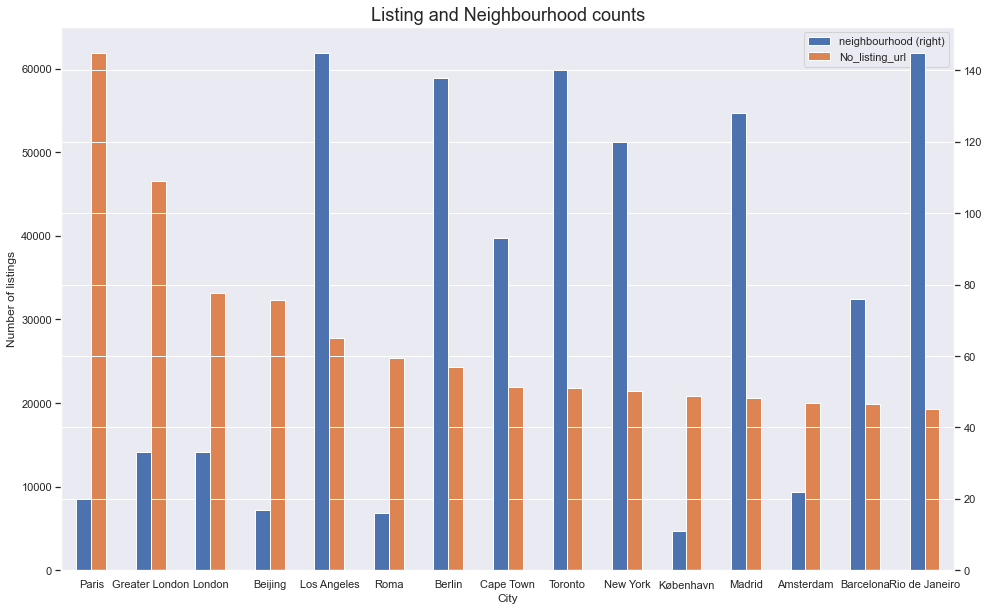

In [12]:
# your code goes here
%matplotlib inline

listings = df_listings_analysis.groupBy('city') \
                               .agg(F.countDistinct('neighbourhood_cleansed').alias('neighbourhood'),
                                    F.count('listing_url').alias('No_listing_url')) \
                               .sort(F.desc(F.count('listing_url'))) \
                               .limit(15).toPandas() \
                               .set_index('city')

#plot the counts
_ = listings.plot( kind= 'bar' , secondary_y= 'neighbourhood' , rot= 0 ,figsize=(16,10))
_.set_xlabel("City")
_.set_ylabel("Number of listings")
plt.title('Listing and Neighbourhood counts',fontsize=18)
plt.show()

## Part 3: Price averages (5 pts)

Compute and visualise the average price of listings per city, restricted to the 15 cities having the most listings.

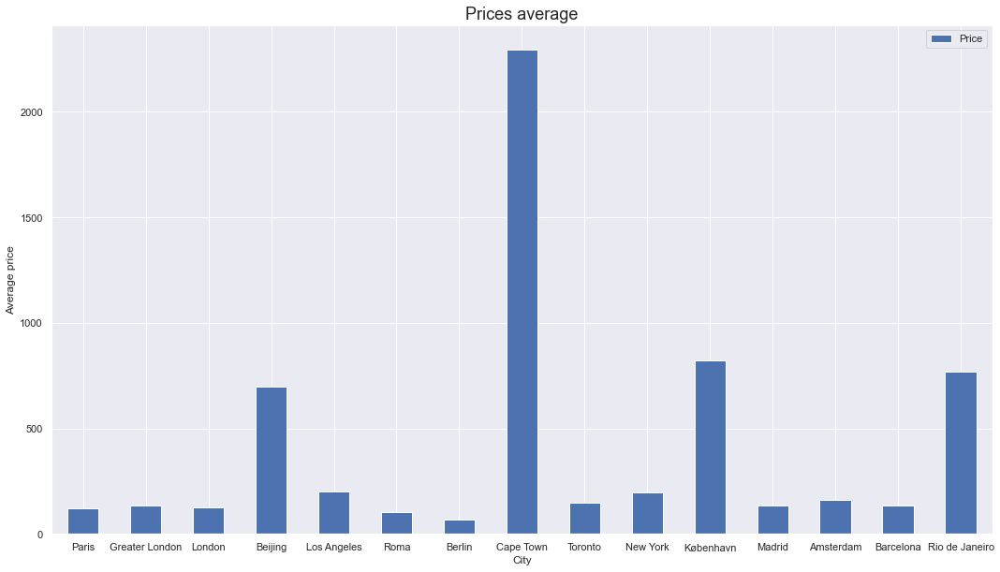

In [13]:
# your code goes here
%matplotlib inline

avg_listings = df_listings_analysis.groupBy('city') \
                               .agg(F.avg('price').alias('Price')) \
                               .sort(F.desc(F.count('listing_url'))) \
                               .limit(15).toPandas() 

#i havent sorted the values because he says that should be ordered by the number of listings
_ = avg_listings.set_index('city').plot( kind= 'bar'  , rot= 0 ,figsize=(18,10)) #sort_values(by='avg(price)',ascending=False)
_.set_xlabel("City")
_.set_ylabel("Average price")
plt.title('Prices average',fontsize=18)
plt.show()

## Part 4: Value for money (5 pts)

The value of a listing is its rating divided by its price. The value of a city is the average value of its listings. 

Prices are only comparable when the local currency is the same. We'll therefore consider a subset of Euro-zone cities as defined in `eurozone_cities`.

Compute and visualise the value per city, restricted to the Euro-zone cities.

In [14]:
eurozone_cities = [
    'Paris', 'Roma', 'Berlin', 'Madrid', 'Amsterdam', 'Barcelona', 'Milano', 'Lisboa',
    'München', 'Wien', 'Lyon', 'Firenze', 'Porto', 'Napoli', 'Bordeaux', 'Venezia',
    'Málaga', 'Sevilla', 'València'
]

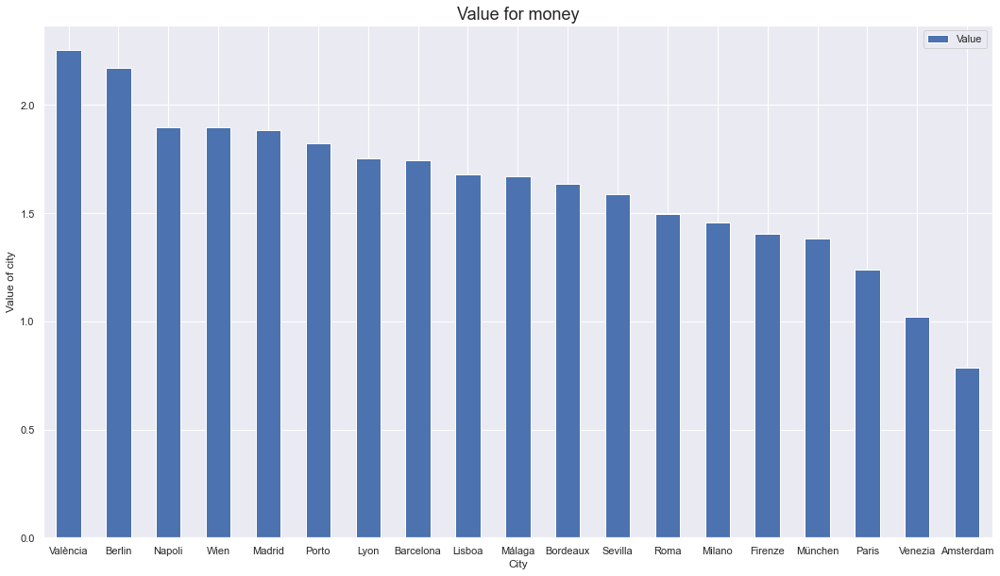

In [15]:
# your code goes here
%matplotlib inline

listings_value =F.col('review_scores_rating')/F.col('price')
eu_value = df_listings_analysis.filter(F.col('city').isin(eurozone_cities)) \
                                        .withColumn('listings_value',listings_value) \
                                        .groupBy('city').agg(F.avg('listings_value').alias('Value')) \
                                        .toPandas()

_ = eu_value.set_index('city').sort_values(by='Value',ascending=False).plot( kind= 'bar'  , rot= 0 ,figsize=(18,10)) #sort_values(by='avg(price)',ascending=False)
plt.title('Value for money',fontsize=18)
_.set_xlabel("City")
_.set_ylabel("Value of city")
plt.show()                                  

# Exercise 2: The case of London (30 pts)

In this exercise you must use Spark to do the data processing. 
* For parts where you present tabular data, this entails calling `toPandas` as the final step of your query. 
* For parts requiring visualisation, the `toPandas` call should be followed only by functions necessary to customize the plotting/layout steps (i.e. no data processing take place after your spark dataframe is materialized). 
* You may need multiple queries to solve the individual parts.

Your dataframe is a subset of `df_listings_analysis` and should be named `df_listings_london`.

In [16]:
# your code goes here
df_listings_london = df_listings_analysis.filter((F.col('city')=='London'))
df_listings_london.toPandas()        

,id,listing_url,neighbourhood_cleansed,city,price,review_scores_rating,number_of_reviews,property_type
0,11551,https://www.airbnb.com/rooms/11551,Lambeth,London,88.0,92,184,Apartment
1,15400,https://www.airbnb.com/rooms/15400,Kensington and Chelsea,London,100.0,96,87,Apartment
2,17402,https://www.airbnb.com/rooms/17402,Westminster,London,300.0,94,41,Apartment
3,24328,https://www.airbnb.com/rooms/24328,Wandsworth,London,175.0,98,93,Townhouse
4,31361,https://www.airbnb.com/rooms/31361,Newham,London,34.0,97,115,Townhouse
...,...,...,...,...,...,...,...,...
33095,38592036,https://www.airbnb.com/rooms/38592036,Southwark,London,75.0,None,0,House
33096,38592739,https://www.airbnb.com/rooms/38592739,Kensington and Chelsea,London,160.0,None,0,Apartment
33097,38593102,https://www.airbnb.com/rooms/38593102,Hammersmith and Fulham,London,80.0,None,0,Apartment
33098,38593108,https://www.airbnb.com/rooms/38593108,Barnet,London,120.0,None,0,Apartment


## Part 1: Price distribution (5 pts)

Compute and visualise the distribution of prices, for all prices up to and including the 95-percentile. Additionally, compute and visualise the distribution of prices, for all prices above the 95-percentile.

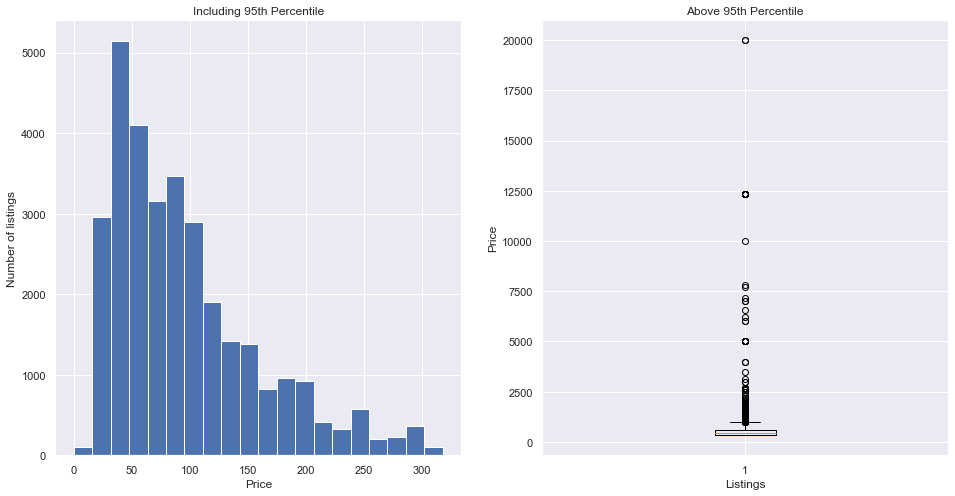

In [17]:
# your code goes here
%matplotlib inline

quantile_below = F.col('price')<=df_listings_london.approxQuantile('price',[0.95],0)[0]
quantile = F.col('price')>df_listings_london.approxQuantile('price',[0.95],0)[0]

df1 = df_listings_london.filter(quantile_below).toPandas()
df2 = df_listings_london.filter(quantile).toPandas()

fig, ax = plt.subplots(nrows=1,ncols=2,figsize = (16,8))
ax[0].hist(df1['price'], density = False, bins = 20)
ax[1].boxplot(df2['price'])  # Use a box plot to better visualise the listings & prices above 95th percentile
ax[0].set_title('Including 95th Percentile')
ax[1].set_title('Above 95th Percentile')
ax[0].set_xlabel("Price")
ax[0].set_ylabel("Number of listings")
ax[1].set_xlabel("Listings")
ax[1].set_ylabel("Price")
plt.show()

## Part 2: Prices by type of property (5 pts)

Compute and visualise the average price and average rating per type of property, for property types with 75 or more listings. 

Your visualisation should be a single bar chart with two y-axes and two bars per property type. The x-axis should be ordered by average rating.

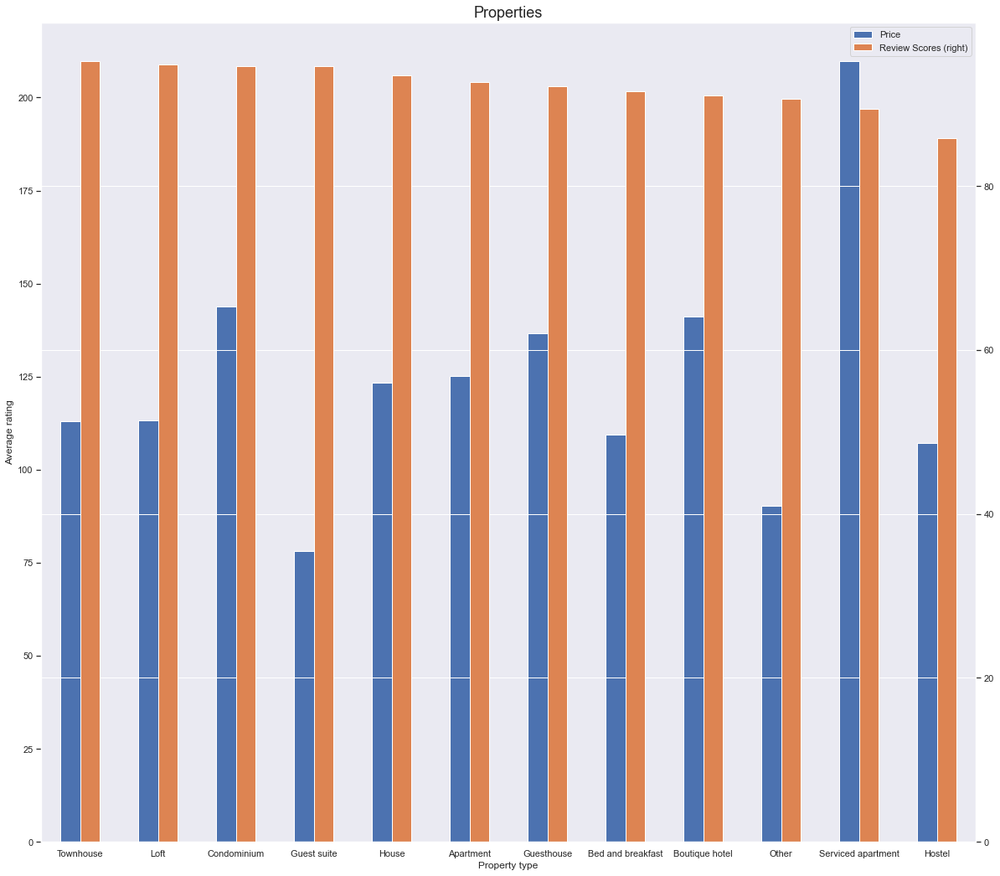

In [18]:
# your code goes here
%matplotlib inline

price_property = df_listings_london.groupBy('property_type') \
                                    .agg(F.avg('price').alias('Price'),
                                         F.avg('review_scores_rating').alias('Review Scores'))\
                                    .filter(F.count('listing_url')>75).toPandas()
                                    
_=price_property.set_index('property_type').sort_values(ascending=False,by='Review Scores')\
                        .plot( kind= 'bar' , secondary_y= 'Review Scores' , rot= 0 ,figsize=(20,18))
plt.title('Properties',fontsize=18)
_.set_xlabel("Property type")
_.set_ylabel("Average rating")
plt.show()

## Part 3: Best offering in the neighbourhood (10 pts)

The value of a listing is its rating divided by its price. Compute and display a dataframe (with the columns you selected in Exercise 1 and those computed in this part) with the 3 highest valued listings in each neighbourhood, and having a value above 5. Make sure to use the `neighbourhood_cleansed` column in your computations.

Computing ranks based on value can be achieved using `pyspark.sql.window.Window`. This may produce equal ranks (i.e. when the value of two listings are the same).

Remember to use `pd.set_option('display.max_rows', <n>)` with appropriate `<n>` so all rows are displayed.

In [19]:
# your code goes here
listings_value=F.col('review_scores_rating')/F.col('price')
value = df_listings_london.filter(F.col('review_scores_rating')!='NaN')\
                             .withColumn('listings_value',listings_value)
                            

windowSpec  = pyspark.sql.window.Window.partitionBy(value["neighbourhood_cleansed"])\
                                                        .orderBy(value["listings_value"].desc())


best_value = value.withColumn("rank",pyspark.sql.functions.dense_rank().over(windowSpec)) \
                             .groupBy('neighbourhood_cleansed','listings_value','rank') \
                             .agg(F.avg(F.col('price'))) \
                             .filter(F.col('listings_value')>5) \
                             .filter(F.col('rank')<=3) \
                             .toPandas()

                                      
pd.set_option('display.max_rows',len(best_value))
best_value

,neighbourhood_cleansed,listings_value,rank,avg(price)
0,Barnet,5.157895,1,19.0
1,Brent,6.500000,1,14.0
2,Brent,6.266667,2,15.0
3,Brent,6.230769,3,13.0
4,Bromley,10.000000,1,10.0
5,Camden,5.625000,1,16.0
6,Camden,5.333333,2,15.0
7,Camden,5.294118,3,17.0
8,Croydon,5.111111,1,18.0
9,Croydon,5.105263,2,19.0


## Part 4: Activity by month (5 pts)

Activity is given by the number of reviews received in a given time period. Compute and visualise the activity based on month, that is, the total number of reviews given in January, February, etc..

Your additional data source is [this zip archive](https://data-download.compute.dtu.dk/c02807/reviews_london.csv.zip) which you must uncompress and place in the same folder as this notebook. It is loaded in the next cell and named `df_reviews_london`.

In [20]:
df_reviews_london = load_csv_as_dataframe('reviews_london.csv')
df_reviews_london.toPandas()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,10258151,110317618,2016-10-25,5636767,Joyce,Amaury's flat in London is extraordinary. It ...
1,10258151,123905694,2016-12-31,93766809,Susie,"My family of seven (my husband and myself, thr..."
2,10258151,144206394,2017-04-15,36172507,Shannon,"The place was as outlined and better. Large, c..."
3,10258151,179218093,2017-08-07,120542338,Heather,An absolutely beautiful and family-friendly ho...
4,10258151,300524159,2018-08-02,66268334,Fei,非常完美的住宿选择\n1 地理位置得天独厚 步行五分钟到达白金汉宫和维多利亚车站 还有繁华的...
...,...,...,...,...,...,...
836387,9976337,431996034,2019-04-02,33926449,Youness,The host was very welcoming and the place is v...
836388,9976337,487687257,2019-07-14,65214250,Thiago Da Silva,Nice time in London ... location is very good ...
836389,9976337,496296619,2019-07-27,7755124,Paul,The accommodation is in an excellent location ...
836390,9976337,502209808,2019-08-04,110777801,Daniel,The Korean Guest House is great within a centr...


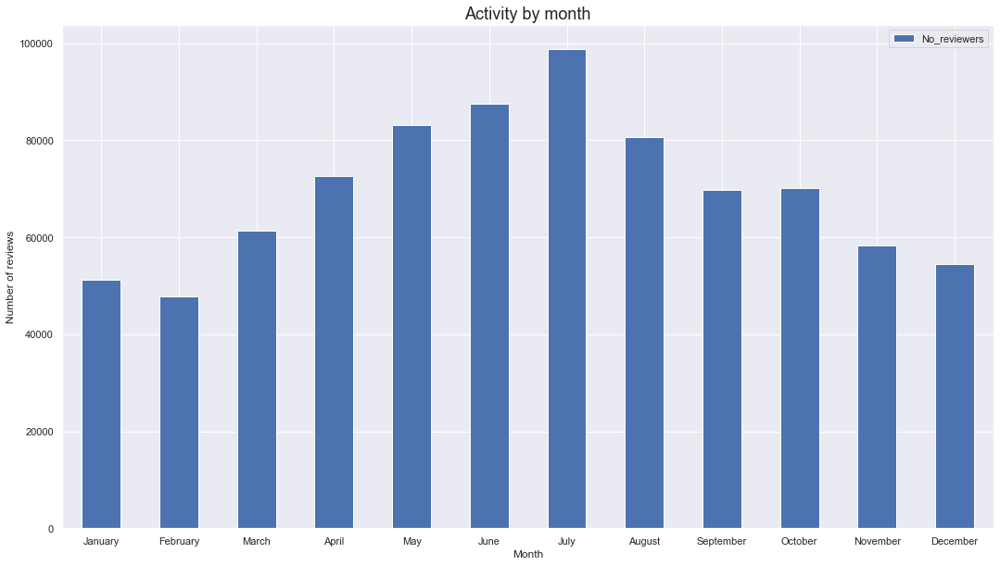

In [21]:
# your code goes here
%matplotlib inline

activity = df_reviews_london.withColumn('month',F.date_format('date',"MMMM")) \
                            .groupBy('month').agg(F.count('reviewer_id').alias('No_reviewers')) \
                            .toPandas()

month_order=['January','February','March','April','May','June','July','August','September','October','November','December']
_ = activity.set_index('month').loc[month_order].plot( kind= 'bar'  , rot= 0 ,figsize=(18,10))
plt.title('Activity by month',fontsize=18)
_.set_xlabel("Month")
_.set_ylabel("Number of reviews")
plt.show()    

## Part 5: Reviews per listing (5 pts)

Each London listing has received 0 or more reviews. 

Display a dataframe showing 1) The number of listings, 2) The average number of reviews a listing receives, 3) The standard deviation of the reviews per listing distribution, 4) The minimum number of reviews any listing has received, and 5) The maximum number of reviews any listing has received.

In [35]:
# your code goes here
df_listings_london=df_listings_london.withColumnRenamed("id","listing_id")
df_listings_reviews=df_listings_london.join(df_reviews_london, on=['listing_id'], how='left')

df_description=df_listings_reviews.select(F.col('listing_id'),F.col('id')) \
                                        .groupBy('listing_id')\
                                        .agg(F.count('id'))\
                                        .select(F.col('count(id)')).alias('count')
                                        # .agg(F.count('count(id)').alias('count'),
                                             # F.mean('count(id)').alias('mean'),
                                             # F.stddev('count(id)').alias('std'),
                                             # F.min('count(id)').alias('min'),
                                             # F.max('count(id)').alias('max'))
df_description.describe().toPandas()

,summary,count(id)
0,count,33100
1,mean,25.268640483383685
2,stddev,46.94350945355213
3,min,0
4,max,690


In [23]:
df_listings_reviews.filter(F.col('number_of_reviews')>0).groupby('listing_id').count().toPandas()

,listing_id,count
0,147244,26
1,422308,52
2,499145,46
3,510940,24
4,571906,20
...,...,...
25915,15205819,15
25916,16011053,2
25917,19699621,5
25918,36524802,2


# Exercise 3: Word sentiment (45 pts)

In this exercise you must use Spark to do the data processing. For parts where you present tabular data, this entails calling `toPandas` as the final step of your query. You may need multiple queries to solve the individual parts.

The goal here is to determine what sentiment (positive or negative) words in reviews have. Roughly speaking, we want each word to be assigned a score based on the rating of the reviews in which the word occurs in the review comment. We'd expect words such as "clean", "comfortable", "superhost" to receive high scores, while words such as "unpleasant", "dirty", "disgusting" would receive low scores.

As individual reviews do not have a rating, we'll consider the rating of individual reviews to be the rating of its related listing (i.e. assuming each review gave the average rating (`review_scores_rating`) of the listing). 

The score of a word is given by the mean review rating over the reviews in which that word occurs in the comment. We require words to appear in at least 0.5% (1 in 200) listings, and to be at least 4 characters, for it to have a defined score.

Formally, when a word $w$ occurs in at least $0.5\%$ of listings and $|w| > 3$, its score is

$
\begin{align*}
score(w) = \frac{1}{|C_w|}\sum_{comment \in C_w} \text{review_rating}(comment)
\end{align*}
$
, where 
* $C_w = \{comment \mid w \text{ occurs in } \text{clean_text}(comment)\}$, the set (so no duplicates) of comments in which $w$ occurs, and
* $\text{clean_text}(comment)$ is the result of your `clean_text` function defined below, and
* $\text{review_rating}(comment)$ is the `review_scores_rating` of the listing which this $comment$ is related to.


## Part 1: Toy data (15 pts)

To get started we'll consider a toy example where the input is `df_sentiment_listings_toy` and `df_sentiment_reviews_toy` defined in the next code cell. You should provide an implementation of `calculate_word_scores_toy` in the subsequent code cell. Your implementation should result in a query that when given the toy example dataframes as input and is materialized with `toPandas()` produces this table:

|    | word   |   word_score |   listing_occurences |   word_occurences |   comment_occurences |
|---:|:-------|-------------:|---------------------:|------------------:|---------------------:|
|  0 | aaaa   |      7       |                    3 |                 5 |                    5 |
|  1 | bbbb   |      6.66667 |                    2 |                 3 |                    3 |
|  2 | eeee   |      0       |                    1 |                 1 |                    1 |
|  3 | dddd   |      5       |                    1 |                 1 |                    1 |
|  4 | cccc   |      5       |                    2 |                 2 |                    2 |'

Observe that `word_occurences` and `comment_occurences` are the same as words occuring multiple times in a comment are counted once, and that `clean_text` is used to ignore casing and discard non-words. Additionally, any word occuring at least once will occur in more than 1 out of 200 listings on this toy data.

In [36]:
from pyspark.sql.types import StructType, StructField, StringType

schema_listings = StructType([
    StructField('id', StringType(), True),
    StructField('review_scores_rating', StringType(), True),
])
data_listings = [
    {'id': '0', 'review_scores_rating': '10'},
    {'id': '1', 'review_scores_rating': '5'},
    {'id': '2', 'review_scores_rating': '0'},
]
df_sentiment_listings_toy = spark.createDataFrame(data_listings, schema_listings)

schema_reviews = StructType([
    StructField('listing_id', StringType(), True),
    StructField('id', StringType(), True),
    StructField('comments', StringType(), True),
])
data_reviews = [
    {'listing_id': '0', 'id': '100', 'comments': 'aaaa bbbb          cccc'},
    {'listing_id': '0', 'id': '101', 'comments': 'aaaa bbbb '},
    {'listing_id': '0', 'id': '102', 'comments': 'aaaa aAAa          aaaa'},
    {'listing_id': '1', 'id': '103', 'comments': 'Aaaa bbb ccc'},
    {'listing_id': '1', 'id': '104', 'comments': 'dddd %ˆ&*'},
    {'listing_id': '2', 'id': '105', 'comments': 'AaaA'},
    {'listing_id': '2', 'id': '106', 'comments': 'bbbb ccc e&eˆˆee'},
    {'listing_id': '2', 'id': '107', 'comments': 'cccc cccc'},
]

df_sentiment_reviews_toy = \
    spark.createDataFrame(data_reviews, schema_reviews) \
        .select(F.col('listing_id'), F.col('id').alias('comment_id'), F.col('comments'))

In [37]:
# from pyspark.sql.functions import lower, col, trim
# df_sentiment_reviews_toy=df_sentiment_reviews_toy.withColumn('comments',lower(col('comments')))
# df_sentiment_reviews_toy=df_sentiment_reviews_toy.withColumn('comments',regexp_replace('comments',r'(\s+)',' '))
# df_sentiment_reviews_toy=df_sentiment_reviews_toy.withColumn('comments',regexp_replace('comments','[^\w\s]+', ''))
# df_sentiment_reviews_toy=df_sentiment_reviews_toy.withColumn('comments',rtrim(col('comments')))
# df_sentiment_reviews_toy=df_sentiment_reviews_toy.withColumn('comments',ltrim(col('comments')))
# df_sentiment_reviews_toy.show()

In [38]:
# your code goes here
def clean_text(col):
    """
        Cleans the text (comment) associated with col. The
        cleaning should:
            1) Lower case the text
            2) Turn multiple whitespaces into single whitespaces
            3) Remove anything but letters, digits and whitespaces
        
        :col: A Spark Column object containing text data
        :returns: A Spark Column object.

    """
    #first way
    # clean_df = df_sentiment_reviews_toy.withColumn("comments",
    #                                             F.regexp_replace(
    #                                                 F.trim( 
    #                                                     F.regexp_replace(
    #                                                         F.lower(col),"\W"," ")), "\\s+"," "))

    #second way
    single_spaces = col.lower()
    single_spaces = re.sub("\s+", ' ', single_spaces)
    single_spaces = re.sub('[^a-z0-9 ]+', '', single_spaces)# removes multiple white spaces
    
    single_spaces = single_spaces.rstrip()
                                                                
    return single_spaces

def calculate_word_scores_toy(df_list, df_rev):
    """
        Calculates the word score over listings in df_list and
        reviews in df_rev. The table produced should have the 
        same columns as specified in part 1.
        
        :returns: A pandas DataFrame
    """
    #first way
    # col = [i for i in df_rev.columns if i =='comments']
    # data = clean_text(col[0],df_rev)

    #second way
    
    clean = udf(lambda z :clean_text(z), StringType())
    data = df_rev.withColumn('comments',clean('comments'))
    
    word_occurences = data.withColumn('word',F.explode(F.split(F.col('comments'), ' ')))\
        .where(F.length('word')>=4)\
        .groupBy('word')\
        .count()\
        .sort('count', ascending=False)

    words_list=word_occurences.select('word').rdd.flatMap(list).collect()

    columns = ['words', 'word_score', 'listing_occurences', 'word_occurences', 'comment_occurences']

    listings= data.where(F.col("comments").contains(words_list[0])).select(F.col('listing_id').alias('id'))
    df_inner = listings.join(df_list, on=['id'], how='inner')

    listOcc=data.where(F.col("comments").contains(words_list[0]))

    vals = [(words_list[0],
            (1/data.filter(F.col("comments").contains(words_list[0]))\
            .count())*(df_inner.agg(F.sum(df_inner.review_scores_rating)).collect()[0][0]),
            len(listOcc.select('listing_id').distinct().collect()),
            data.filter(F.col("comments").contains(words_list[0])).count(), 
            data.filter(F.col("comments").contains(words_list[0])).count())]

    df = spark.createDataFrame(vals, columns)

    for word in words_list[1:]:
        listings=data.where(F.col("comments").contains(word)).select(F.col('listing_id').alias('id'))
        df_inner = listings.join(df_list, on=['id'], how='inner')
        listOcc=data.where(F.col("comments").contains(word))
        newRow=spark.createDataFrame([(word,
                                      (1/data.filter(F.col("comments").contains(word))\
                                      .count())*(df_inner.agg(F.sum(df_inner.review_scores_rating)).collect()[0][0]),
                                      len(listOcc.select('listing_id').distinct().collect()),
                                      data.filter(F.col("comments").contains(word)).count(), data\
                                      .filter(F.col("comments").contains(word)).count())],columns)
        df = df.union(newRow)

    return df.toPandas()

calculate_word_scores_toy(df_sentiment_listings_toy, df_sentiment_reviews_toy)

,words,word_score,listing_occurences,word_occurences,comment_occurences
0,aaaa,7.000000,3,5,5
1,bbbb,6.666667,2,3,3
2,cccc,5.000000,2,2,2
3,dddd,5.000000,1,1,1
4,eeee,0.000000,1,1,1


## Part 2: London comments (15 pts)

In this part we'll calculate word scores for the comments related to London listings only. You should implement `count_relevant_listings` and `calculate_word_scores` (it will be an extension of your function from part 1) below. See the mathematical definition and docstrings for intended behaviour.

The function `calculate_word_scores` should return the top 10 and bottom 10 words by score. You should **not** use caching in your function.

Make sure your satisfy all conditions for a word to be scored (e.g. correctly calculating how many total listings scores are computed over). You should also consider whether your query is optimally structured in terms of computation time. Moreover, `pd.set_option('display.max_rows', <n>)` should be set with sufficiently high `n` to show all words.

In [39]:
df_listings_london.toPandas()

,listing_id,listing_url,neighbourhood_cleansed,city,price,review_scores_rating,number_of_reviews,property_type
0,11551,https://www.airbnb.com/rooms/11551,Lambeth,London,88.0,92,184,Apartment
1,15400,https://www.airbnb.com/rooms/15400,Kensington and Chelsea,London,100.0,96,87,Apartment
2,17402,https://www.airbnb.com/rooms/17402,Westminster,London,300.0,94,41,Apartment
3,24328,https://www.airbnb.com/rooms/24328,Wandsworth,London,175.0,98,93,Townhouse
4,31361,https://www.airbnb.com/rooms/31361,Newham,London,34.0,97,115,Townhouse
...,...,...,...,...,...,...,...,...
33095,38592036,https://www.airbnb.com/rooms/38592036,Southwark,London,75.0,None,0,House
33096,38592739,https://www.airbnb.com/rooms/38592739,Kensington and Chelsea,London,160.0,None,0,Apartment
33097,38593102,https://www.airbnb.com/rooms/38593102,Hammersmith and Fulham,London,80.0,None,0,Apartment
33098,38593108,https://www.airbnb.com/rooms/38593108,Barnet,London,120.0,None,0,Apartment


In [40]:
df_listings_london=df_listings_london.withColumnRenamed("id","listing_id")

In [41]:
df_reviews_london.toPandas()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,10258151,110317618,2016-10-25,5636767,Joyce,Amaury's flat in London is extraordinary. It ...
1,10258151,123905694,2016-12-31,93766809,Susie,"My family of seven (my husband and myself, thr..."
2,10258151,144206394,2017-04-15,36172507,Shannon,"The place was as outlined and better. Large, c..."
3,10258151,179218093,2017-08-07,120542338,Heather,An absolutely beautiful and family-friendly ho...
4,10258151,300524159,2018-08-02,66268334,Fei,非常完美的住宿选择\n1 地理位置得天独厚 步行五分钟到达白金汉宫和维多利亚车站 还有繁华的...
...,...,...,...,...,...,...
836387,9976337,431996034,2019-04-02,33926449,Youness,The host was very welcoming and the place is v...
836388,9976337,487687257,2019-07-14,65214250,Thiago Da Silva,Nice time in London ... location is very good ...
836389,9976337,496296619,2019-07-27,7755124,Paul,The accommodation is in an excellent location ...
836390,9976337,502209808,2019-08-04,110777801,Daniel,The Korean Guest House is great within a centr...


In [42]:
df_right = df_listings_london.join(df_reviews_london, on=['listing_id'], how='right')
df_right.toPandas()

,listing_id,listing_url,neighbourhood_cleansed,city,price,review_scores_rating,number_of_reviews,property_type,id,date,reviewer_id,reviewer_name,comments
0,2682376,https://www.airbnb.com/rooms/2682376,Hackney,London,125.0,93,49,Apartment,11699675,2014-04-12,13574546,Emma,"This is such a lovely place to stay, I can't r..."
1,2682376,https://www.airbnb.com/rooms/2682376,Hackney,London,125.0,93,49,Apartment,12376107,2014-04-30,11669854,Holly,This was a lovely place to stay for a couple o...
2,2682376,https://www.airbnb.com/rooms/2682376,Hackney,London,125.0,93,49,Apartment,12504422,2014-05-04,4053912,Roger,We had a pleasant stay at the apartment. The a...
3,2682376,https://www.airbnb.com/rooms/2682376,Hackney,London,125.0,93,49,Apartment,12896194,2014-05-13,3774374,Rob,Really enjoyed our stay. Clemence and Ciaran w...
4,2682376,https://www.airbnb.com/rooms/2682376,Hackney,London,125.0,93,49,Apartment,13537442,2014-05-30,404946,Joe,We had a great time here and the large sitting...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
836387,17870535,https://www.airbnb.com/rooms/17870535,Kensington and Chelsea,London,160.0,96,14,Apartment,303893036,2018-08-08,33519078,Krishna,Great apartment in Chelsea. Good sized living ...
836388,17870535,https://www.airbnb.com/rooms/17870535,Kensington and Chelsea,London,160.0,96,14,Apartment,331274545,2018-10-02,21076312,Andrew,"Great place, convintent for buses and not too ..."
836389,17870535,https://www.airbnb.com/rooms/17870535,Kensington and Chelsea,London,160.0,96,14,Apartment,348828754,2018-11-15,9670400,Carlyn,It was a great place but could have been much ...
836390,17870535,https://www.airbnb.com/rooms/17870535,Kensington and Chelsea,London,160.0,96,14,Apartment,353052775,2018-11-26,215893024,Benedetta,I am very grateful to have had the chance of s...


In [46]:
which_listings = df_right.select('listing_id').rdd.flatMap(list).collect()

In [47]:
have_reviews=df_reviews_london.filter(F.col('listing_id').isin([which_listings]))

Py4JJavaError: An error occurred while calling z:org.apache.spark.sql.functions.lit.
: java.lang.RuntimeException: Unsupported literal type class java.util.ArrayList [2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 2682376, 13924054, 13924054, 13924054, 13924054, 13924054, 13924054, 13924054, 13924054, 13924054, 13924054, 13924054, 13924054, 13924054, 13924054, 13924054, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 396523, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 10005666, 29975292, 2925012, 2925012, 2925012, 2925012, 2925012, 2925012, 2925012, 2925012, 2925012, 2925012, 2925012, 2925012, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 15234305, 26803864, 26803864, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 22100062, 30436423, 30436423, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 13570112, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 14795259, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 12077432, 10916272, 3917692, 18240004, 18240004, 18240004, 18240004, 18240004, 18240004, 18240004, 18240004, 18240004, 18240004, 18240004, 4012089, 4012089, 4012089, 4012089, 4012089, 4012089, 4012089, 4012089, 4012089, 4012089, 4012089, 4012089, 4012089, 4012089, 4012089, 4012089, 4012089, 4012089, 4012089, 13720652, 13720652, 13720652, 13720652, 13720652, 13720652, 13720652, 13720652, 13720652, 13720652, 13720652, 13720652, 13720652, 13720652, 13720652, 13720652, 13720652, 13720652, 13720652, 13720652, 13720652, 13720652, 13720652, 34900910, 34900910, 34900910, 34900910, 18653202, 18653202, 18653202, 18653202, 17487937, 17487937, 17487937, 17487937, 17487937, 17487937, 17487937, 17487937, 17487937, 17487937, 17487937, 17487937, 17487937, 17487937, 17487937, 17487937, 17487937, 17487937, 7658164, 7658164, 7658164, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 7407587, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 16108857, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 17352760, 11737018, 11737018, 11737018, 11737018, 11737018, 11737018, 11737018, 11737018, 12848125, 12848125, 12848125, 12848125, 12848125, 12848125, 12848125, 12848125, 12848125, 12848125, 12848125, 12848125, 12848125, 12848125, 12848125, 12848125, 12848125, 12848125, 12848125, 12848125, 12848125, 12848125, 12848125, 12848125, 12848125, 15055680, 15055680, 15055680, 15055680, 15055680, 15055680, 15055680, 15055680, 15055680, 15055680, 15055680, 15055680, 15055680, 15055680, 15055680, 15055680, 15055680, 11110273, 11110273, 11110273, 11110273, 11110273, 11110273, 11110273, 11110273, 11110273, 11110273, 11110273, 11110273, 11110273, 11110273, 16681598, 16681598, 16681598, 16681598, 19550494, 19550494, 19550494, 19550494, 19550494, 19550494, 19550494, 19550494, 19550494, 19550494, 19550494, 19550494, 19550494, 19550494, 19550494, 19550494, 12889940, 12889940, 12889940, 12889940, 12889940, 12889940, 12889940, 12889940, 12889940, 12889940, 12889940, 12889940, 12016367, 12016367, 12016367, 12016367, 12016367, 12016367, 12016367, 12016367, 12016367, 12016367, 12016367, 12016367, 12016367, 12016367, 12016367, 12016367, 12016367, 12016367, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 18573516, 26590297, 26590297, 26590297, 26590297, 26590297, 26590297, 26590297, 26590297, 26590297, 26590297, 26590297, 26590297, 26590297, 26590297, 26590297, 26590297, 420759, 420759, 420759, 420759, 420759, 420759, 420759, 420759, 420759, 420759, 420759, 420759, 420759, 420759, 420759, 420759, 420759, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 13796326, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 557123, 28958696, 28958696, 28958696, 28958696, 28958696, 28958696, 33983227, 26059611, 26059611, 26059611, 26059611, 26059611, 26059611, 26059611, 26059611, 26059611, 26059611, 26059611, 3607711, 3607711, 3607711, 3607711, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 868862, 14470003, 14470003, 14470003, 14470003, 15909513, 15909513, 17426489, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 679006, 11836426, 11836426, 6729389, 6729389, 6729389, 6729389, 6729389, 6729389, 6729389, 6729389, 6729389, 6729389, 6729389, 6729389, 6729389, 6729389, 6729389, 6729389, 6729389, 2972490, 2972490, 2972490, 2972490, 2972490, 2972490, 2972490, 2972490, 2972490, 2972490, 2972490, 2972490, 2972490, 2972490, 2972490, 2972490, 2972490, 2972490, 2972490, 2972490, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 249423, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 26542042, 5687832, 5687832, 6828316, 6828316, 7634784, 7634784, 7634784, 7634784, 7634784, 7634784, 7634784, 7634784, 7634784, 7634784, 7634784, 7634784, 7634784, 7634784, 7634784, 7634784, 7634784, 7634784, 7634784, 7634784, 7634784, 7634784, 7634784, 7634784, 7634784, 13945503, 13945503, 18854877, 18854877, 18854877, 18854877, 18854877, 18854877, 18854877, 18854877, 18854877, 18854877, 18854877, 18854877, 18854877, 3482302, 3482302, 3482302, 3482302, 3482302, 3482302, 3482302, 3482302, 3482302, 3560991, 3560991, 3560991, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 7356185, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 14270575, 2332836, 2332836, 2332836, 2332836, 2332836, 2332836, 2332836, 2332836, 2332836, 2332836, 2332836, 2332836, 2332836, 2332836, 2332836, 7747258, 7747258, 7747258, 7747258, 7747258, 7747258, 7747258, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 8882044, 11518841, 11518841, 11518841, 11518841, 11518841, 11518841, 11518841, 23691924, 23691924, 23691924, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 3154702, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18595811, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 18265711, 11939641, 11939641, 11939641, 11939641, 11939641, 11939641, 11939641, 11939641, 11939641, 11939641, 11939641, 11939641, 11939641, 11939641, 11939641, 11939641, 11939641, 11939641, 11939641, 11939641, 11939641, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 14363033, 33561915, 33561915, 33561915, 33561915, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 81410, 8263392, 8263392, 8263392, 8263392, 8263392, 8263392, 8263392, 8263392, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 10245161, 15978531, 15978531, 18532619, 18532619, 18532619, 18532619, 18532619, 14914677, 14914677, 14914677, 14914677, 14914677, 14914677, 14914677, 14914677, 14914677, 14914677, 14914677, 14914677, 14914677, 14914677, 14914677, 14914677, 14914677, 14914677, 14914677, 14914677, 14914677, 14914677, 14914677, 14914677, 14914677, 3997629, 3997629, 6870100, 6870100, 6870100, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 19117784, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 2684798, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 1242036, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 17415552, 22562895, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 12916983, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2318959, 2454120, 2454120, 2454120, 2454120, 2454120, 2454120, 2454120, 2454120, 2454120, 2454120, 2454120, 18780040, 18780040, 18780040, 7520861, 7520861, 7520861, 7520861, 7520861, 7520861, 7520861, 7520861, 9199660, 9199660, 9199660, 1091147, 1091147, 1091147, 1091147, 1091147, 1091147, 1091147, 1091147, 1091147, 1091147, 1091147, 1091147, 1091147, 1091147, 1091147, 1091147, 1091147, 1091147, 1091147, 12889255, 12889255, 12889255, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 18561228, 5439208, 5439208, 5439208, 5439208, 5439208, 5439208, 5439208, 5439208, 5439208, 5439208, 5439208, 5439208, 5439208, 5439208, 5439208, 5439208, 5994545, 5994545, 5994545, 5994545, 5994545, 5994545, 5994545, 5994545, 5994545, 5994545, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 14273054, 2633429, 14292874, 14292874, 14292874, 14292874, 14292874, 14292874, 14292874, 14292874, 14292874, 14292874, 14292874, 14292874, 14292874, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 6551365, 9890514, 9890514, 9890514, 9890514, 9890514, 9890514, 9890514, 9890514, 9890514, 9890514, 9890514, 9890514, 9890514, 9890514, 9890514, 9890514, 9890514, 9890514, 13790851, 13790851, 13790851, 21357573, 21357573, 21357573, 21357573, 21357573, 21357573, 21357573, 21357573, 21357573, 21357573, 21357573, 21357573, 21357573, 21357573, 21357573, 21357573, 21357573, 21357573, 21357573, 21357573, 21357573, 21357573, 21357573, 15526960, 15526960, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 17183469, 34902641, 34902641, 34902641, 27326172, 27326172, 27326172, 27326172, 27326172, 6903456, 6903456, 6903456, 6903456, 6903456, 6903456, 6903456, 6903456, 6903456, 6903456, 6903456, 6903456, 6903456, 6903456, 6903456, 6903456, 6903456, 6903456, 6903456, 6903456, 6903456, 6903456, 6903456, 6903456, 6903456, 6903456, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 16629986, 27520272, 27520272, 27520272, 11195917, 11195917, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 15000354, 32394201, 32394201, 32394201, 32394201, 32394201, 32394201, 32394201, 32394201, 32394201, 32394201, 32394201, 32394201, 32394201, 32394201, 32394201, 32394201, 32394201, 32394201, 32394201, 32394201, 32394201, 32394201, 32394201, 13860074, 13860074, 13860074, 13860074, 13860074, 13860074, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 9132018, 3173050, 3173050, 3173050, 3173050, 3173050, 3173050, 3173050, 3173050, 3173050, 3173050, 3173050, 3173050, 3173050, 17526303, 17526303, 17526303, 17526303, 17526303, 17526303, 17526303, 17526303, 17526303, 17526303, 17526303, 17526303, 17526303, 17526303, 17526303, 17526303, 17526303, 17526303, 17526303, 17526303, 17526303, 36306334, 36306334, 36306334, 36306334, 36306334, 37719898, 9710076, 9710076, 9710076, 9710076, 9710076, 9710076, 9710076, 9710076, 9710076, 9710076, 9710076, 9710076, 9710076, 9710076, 9710076, 9710076, 9710076, 9710076, 9710076, 9710076, 9710076, 9710076, 9710076, 9710076, 9710076, 9710076, 9710076, 9710076, 15922261, 15922261, 15922261, 4711985, 4711985, 4711985, 4711985, 4711985, 4711985, 4711985, 4711985, 4711985, 4711985, 4711985, 4711985, 4711985, 4711985, 4711985, 4711985, 4711985, 4711985, 4711985, 4711985, 4711985, 4711985, 4711985, 4711985, 31173622, 31173622, 31173622, 31173622, 31173622, 31173622, 31173622, 31173622, 31173622, 31173622, 31173622, 9367438, 9367438, 1056379, 1056379, 1056379, 1056379, 1056379, 1056379, 1056379, 1056379, 1056379, 1056379, 1056379, 1056379, 1056379, 1056379, 1056379, 1056379, 1056379, 1056379, 1056379, 1056379, 1056379, 1056379, 32017126, 32017126, 32017126, 32017126, 32017126, 32017126, 32017126, 32017126, 32017126, 32017126, 32017126, 32017126, 32017126, 32017126, 32017126, 16011053, 16011053, 7685653, 7685653, 7685653, 7685653, 7685653, 7685653, 7685653, 7685653, 7685653, 7685653, 7685653, 7685653, 7685653, 7685653, 7685653, 7685653, 7685653, 7685653, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 11381983, 21055480, 21055480, 21055480, 21055480, 21055480, 21055480, 21055480, 21055480, 21055480, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 676839, 9572033, 9572033, 9572033, 9572033, 9572033, 9572033, 9572033, 9572033, 9572033, 9572033, 9572033, 9572033, 9572033, 9572033, 9572033, 9572033, 17454729, 17454729, 17454729, 17454729, 17454729, 17454729, 17454729, 17454729, 17454729, 17454729, 17454729, 17454729, 17454729, 17454729, 17454729, 17454729, 17454729, 3116464, 20445849, 20445849, 20445849, 20445849, 20445849, 20445849, 20445849, 20445849, 20445849, 20445849, 20445849, 20445849, 20445849, 20445849, 20445849, 20445849, 20445849, 20445849, 20445849, 20445849, 20445849, 20445849, 20445849, 20445849, 20445849, 20511353, 20511353, 20511353, 20511353, 20511353, 20511353, 20511353, 20511353, 20511353, 20511353, 20511353, 20511353, 20511353, 20511353, 20511353, 20511353, 20511353, 20511353, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 5148211, 16488792, 16488792, 16488792, 16488792, 16488792, 16488792, 16488792, 24228550, 24228550, 24228550, 24228550, 24228550, 24228550, 24228550, 24228550, 4348266, 4348266, 4348266, 4348266, 4348266, 4348266, 4348266, 4348266, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 4570347, 12821524, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 16205199, 4877173, 4877173, 4877173, 4877173, 4877173, 4877173, 4877173, 4877173, 4877173, 4877173, 4877173, 4877173, 4877173, 4877173, 4877173, 4877173, 4877173, 4877173, 4877173, 4877173, 4974221, 15816100, 23104846, 23104846, 23104846, 23104846, 23104846, 23104846, 23104846, 23104846, 23104846, 23104846, 23104846, 23104846, 23104846, 23104846, 23104846, 23104846, 23104846, 23104846, 23104846, 23104846, 23104846, 23104846, 23104846, 23104846, 23104846, 23104846, 23104846, 23104846, 12689411, 12689411, 12689411, 12689411, 12689411, 12689411, 12689411, 12689411, 12689411, 12689411, 12689411, 12689411, 12689411, 12689411, 12689411, 12689411, 12689411, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 3521985, 9582306, 10883667, 10883667, 10883667, 10883667, 10883667, 10883667, 10883667, 10883667, 13235197, 13235197, 13235197, 13235197, 13235197, 13235197, 13235197, 13235197, 13235197, 13235197, 13235197, 13235197, 13235197, 13235197, 13235197, 13235197, 13235197, 13235197, 13235197, 13235197, 13235197, 13235197, 13235197, 13235197, 13235197, 3078417, 3078417, 3078417, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 1145066, 21575734, 21575734, 21575734, 21575734, 21575734, 34615011, 34615011, 16532142, 16532142, 13080918, 9734446, 9734446, 9734446, 9734446, 9734446, 9734446, 9734446, 9734446, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 7759273, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 1248908, 20039295, 20039295, 20039295, 20039295, 20039295, 20039295, 20039295, 20039295, 20039295, 20039295, 20039295, 6105748, 6105748, 6105748, 6105748, 6105748, 6105748, 6105748, 6105748, 6105748, 6105748, 6105748, 6105748, 6105748, 6105748, 6105748, 6105748, 6105748, 6105748, 6105748, 6105748, 6105748, 30349606, 30349606, 30349606, 30349606, 30349606, 17351212, 17351212, 17351212, 17351212, 17351212, 17351212, 17351212, 17351212, 17351212, 1723497, 17524120, 17524120, 17524120, 17524120, 17524120, 17524120, 17524120, 17524120, 17524120, 17524120, 17524120, 17524120, 17524120, 17524120, 17524120, 17524120, 11881913, 11881913, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 12786158, 10313679, 16574643, 16574643, 16574643, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 17508275, 28735961, 28735961, 28735961, 28735961, 28735961, 28735961, 12101827, 12101827, 12101827, 12101827, 12101827, 12101827, 12101827, 12101827, 12101827, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 3297912, 35929429, 35929429, 35929429, 35929429, 7007987, 7007987, 7007987, 7007987, 7007987, 18211764, 18211764, 18211764, 18211764, 18211764, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 24331762, 11733440, 11733440, 11733440, 11733440, 11733440, 11733440, 11733440, 11733440, 11733440, 11733440, 11733440, 11733440, 11733440, 11733440, 11733440, 11733440, 11733440, 14668809, 14668809, 14668809, 14668809, 14668809, 14668809, 14668809, 14668809, 14668809, 14668809, 14668809, 14668809, 14668809, 14668809, 14668809, 14668809, 14668809, 14668809, 14668809, 14668809, 14668809, 14668809, 14668809, 14668809, 14668809, 14668809, 14668809, 14668809, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 15470841, 9832855, 9832855, 9832855, 9832855, 9832855, 9832855, 9832855, 9832855, 9832855, 9832855, 9832855, 9832855, 9832855, 9832855, 9832855, 9832855, 9832855, 9832855, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 27274991, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 9933872, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 12491853, 16623205, 16623205, 16623205, 17380012, 17380012, 17380012, 17380012, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 12969358, 30810745, 8886525, 8886525, 8886525, 8886525, 8886525, 8886525, 8886525, 8886525, 8886525, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 338198, 12602261, 12602261, 12602261, 12602261, 12602261, 7698200, 7698200, 16200925, 16200925, 16200925, 16200925, 29512503, 19082527, 19082527, 19082527, 6301311, 6301311, 6036688, 6036688, 6036688, 6036688, 6036688, 6036688, 6036688, 6036688, 6036688, 6036688, 6036688, 14231991, 14231991, 14231991, 14231991, 14231991, 14231991, 14231991, 14231991, 14231991, 14231991, 14231991, 14231991, 14231991, 14231991, 14231991, 14231991, 14231991, 14231991, 14231991, 14231991, 13304375, 13304375, 13304375, 13304375, 13304375, 13304375, 13304375, 13304375, 13304375, 13304375, 13304375, 13304375, 13304375, 13304375, 1304907, 1304907, 1304907, 1304907, 13508623, 13508623, 13508623, 13508623, 13508623, 13508623, 13508623, 8145494, 8145494, 8145494, 8145494, 8145494, 18066761, 18066761, 18066761, 18066761, 18066761, 18066761, 18066761, 18066761, 18066761, 18066761, 18066761, 18066761, 18066761, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 18170852, 28797977, 28797977, 28797977, 29510974, 29510974, 29510974, 32633002, 32633002, 32633002, 32633002, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 5243886, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 17136217, 10426187, 10426187, 10426187, 10426187, 10426187, 10426187, 10426187, 10426187, 10426187, 10426187, 10426187, 10426187, 10426187, 10426187, 10426187, 10426187, 10426187, 10426187, 10426187, 34189540, 34189540, 37848172, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 16048631, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 14215785, 17649063, 17649063, 17649063, 17649063, 17649063, 17649063, 17649063, 17649063, 17649063, 17649063, 17649063, 17649063, 17649063, 17649063, 17649063, 17649063, 12567447, 12567447, 12567447, 12567447, 12567447, 12567447, 12567447, 12567447, 12567447, 30950177, 30950177, 30950177, 30950177, 30950177, 30950177, 30950177, 30950177, 30950177, 30950177, 30950177, 30950177, 556065, 556065, 12585443, 12585443, 12585443, 12585443, 12585443, 12585443, 23566786, 23566786, 33030958, 33030958, 33030958, 33030958, 33030958, 33030958, 33030958, 13794434, 11111309, 11111309, 11111309, 11111309, 11111309, 11111309, 11111309, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 16931347, 1311246, 1311246, 1311246, 1311246, 1311246, 1311246, 1311246, 1311246, 1311246, 1311246, 1311246, 1311246, 6709124, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 11469499, 12851680, 11713381, 11713381, 11713381, 11713381, 11713381, 11713381, 11713381, 11713381, 11713381, 11713381, 11713381, 11713381, 11713381, 11713381, 11713381, 11713381, 11713381, 11713381, 11713381, 11713381, 11713381, 11713381, 10352597, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 20652429, 16789209, 16789209, 16789209, 16789209, 16789209, 16789209, 16789209, 16789209, 16789209, 16789209, 16789209, 16789209, 16789209, 16789209, 16789209, 16789209, 16789209, 16789209, 16789209, 16789209, 16789209, 16789209, 16789209, 16856559, 16856559, 16856559, 16856559, 16856559, 16856559, 16856559, 16856559, 16856559, 16856559, 16856559, 16856559, 16856559, 16856559, 16856559, 16856559, 16856559, 16856559, 16856559, 16856559, 3388641, 3388641, 3388641, 3388641, 3388641, 3388641, 3388641, 3388641, 3388641, 3388641, 3388641, 3388641, 3388641, 3388641, 3388641, 3388641, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 6241025, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 1507385, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 5741189, 16214972, 16214972, 16214972, 16214972, 13067466, 13067466, 16011401, 16011401, 16011401, 16011401, 16011401, 16011401, 16011401, 16011401, 16011401, 16011401, 16011401, 16011401, 16011401, 16011401, 16011401, 16011401, 16011401, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 14786978, 18745992, 394787, 394787, 394787, 394787, 394787, 394787, 394787, 394787, 394787, 394787, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 28405595, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 630933, 19591249, 19591249, 19591249, 19591249, 19591249, 873260, 873260, 873260, 873260, 873260, 873260, 873260, 873260, 873260, 873260, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 14687256, 22695125, 7655943, 7655943, 7655943, 7655943, 7655943, 7655943, 7655943, 7655943, 7655943, 7655943, 13589872, 13589872, 13589872, 13589872, 13589872, 13589872, 13589872, 13589872, 13589872, 13589872, 13589872, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 5615619, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 8628464, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 905687, 9557242, 9557242, 23816663, 23816663, 23816663, 23816663, 23816663, 23816663, 23816663, 23816663, 23816663, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 14114608, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 18132721, 19624116, 19624116, 19624116, 19624116, 19624116, 19624116, 19624116, 19624116, 19624116, 19624116, 19624116, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 235994, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 17166154, 16844372, 891451, 891451, 891451, 17790353, 17790353, 17790353, 17790353, 17790353, 17790353, 17790353, 17790353, 17790353, 17790353, 17790353, 17790353, 17790353, 17790353, 17790353, 17790353, 17790353, 17790353, 17790353, 17790353, 17790353, 17790353, 17790353, 17790353, 17790353, 17790353, 17790353, 17790353, 17790353, 12221725, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 591549, 469199, 469199, 469199, 469199, 469199, 469199, 469199, 469199, 469199, 469199, 469199, 28972080, 28972080, 28972080, 28972080, 33059056, 33059056, 33059056, 33059056, 33059056, 33059056, 33059056, 33059056, 33059056, 33059056, 33059056, 33059056, 33059056, 33059056, 33059056, 33059056, 33059056, 33059056, 6099522, 6099522, 6099522, 6099522, 6099522, 6099522, 6099522, 6099522, 6099522, 6099522, 6099522, 6099522, 6099522, 6099522, 6099522, 6099522, 6099522, 26529888, 26529888, 26529888, 26529888, 26529888, 26529888, 26529888, 26529888, 26529888, 26529888, 26529888, 26529888, 26529888, 26529888, 26529888, 26529888, 26529888, 26529888, 26529888, 26529888, 26529888, 26529888, 26529888, 26529888, 26529888, 35713853, 35713853, 13400599, 13400599, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 4810124, 9339878, 16076621, 16076621, 16076621, 16076621, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 13610164, 17039231, 17039231, 17039231, 14478515, 14478515, 14478515, 14478515, 14478515, 14478515, 14478515, 14478515, 14478515, 14478515, 14478515, 14478515, 14478515, 14478515, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 13652219, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 310949, 18832536, 18832536, 18832536, 18832536, 18832536, 18832536, 18832536, 18832536, 18832536, 18832536, 18832536, 18832536, 18832536, 18832536, 18832536, 18832536, 18832536, 18832536, 18832536, 18832536, 18832536, 18832536, 16241030, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 15234714, 26505485, 26505485, 26505485, 26505485, 26505485, 26505485, 26505485, 26505485, 26505485, 26505485, 5808345, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 13316054, 12282530, 12282530, 12282530, 12282530, 12282530, 26464087, 26464087, 26464087, 26464087, 26464087, 26464087, 26464087, 26464087, 26464087, 26464087, 17117098, 17117098, 17117098, 17117098, 17117098, 17117098, 17117098, 17117098, 17117098, 14125104, 14125104, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 6208060, 13610833, 13610833, 13610833, 11170106, 11170106, 11170106, 11170106, 23618965, 23618965, 23618965, 23618965, 23618965, 23618965, 23618965, 23618965, 23618965, 23618965, 23618965, 23618965, 23618965, 23618965, 23618965, 23618965, 23618965, 23618965, 23618965, 23618965, 23618965, 23618965, 23618965, 13290497, 22721996, 22721996, 22721996, 22721996, 22721996, 22721996, 22721996, 22721996, 22721996, 22721996, 22721996, 22721996, 22721996, 22721996, 22721996, 22721996, 22721996, 22721996, 22721996, 22721996, 22721996, 22721996, 22721996, 22721996, 22721996, 22721996, 22721996, 22721996, 22721996, 15779164, 13852215, 13852215, 13852215, 13852215, 13852215, 13852215, 13852215, 13852215, 13852215, 13852215, 13852215, 13852215, 13852215, 13852215, 13852215, 13852215, 13852215, 13852215, 13852215, 27908468, 27908468, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 25000715, 5738373, 1106561, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 6087949, 9384204, 9384204, 16214219, 16214219, 16214219, 16214219, 16214219, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 5667708, 8123481, 8123481, 8123481, 8123481, 8123481, 8123481, 8123481, 8123481, 8123481, 8123481, 8123481, 8123481, 8123481, 26419190, 14534581, 14534581, 14534581, 14534581, 14534581, 14534581, 14534581, 14534581, 14534581, 14534581, 14534581, 14534581, 14534581, 14534581, 14534581, 14534581, 3507139, 3507139, 3507139, 3507139, 3507139, 3507139, 3507139, 3507139, 3507139, 3507139, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 10941506, 9307180, 9307180, 9307180, 14308901, 14308901, 14308901, 14308901, 14308901, 14308901, 14308901, 23561300, 23561300, 23561300, 23561300, 23561300, 23561300, 23561300, 23561300, 23561300, 23561300, 23561300, 23561300, 23561300, 23561300, 20844415, 20844415, 20844415, 32972154, 32972154, 32972154, 13672092, 13672092, 13672092, 13672092, 13672092, 13672092, 13672092, 13672092, 13672092, 13672092, 13672092, 13672092, 13672092, 13672092, 13672092, 26216687, 26216687, 26216687, 26216687, 26216687, 26216687, 26216687, 26216687, 26216687, 14149309, 14149309, 14149309, 14149309, 14149309, 14149309, 13738984, 13738984, 13738984, 13738984, 13738984, 13738984, 13738984, 13738984, 13738984, 13738984, 13738984, 3213216, 3213216, 3213216, 3213216, 3213216, 3213216, 3213216, 3213216, 3213216, 3213216, 3213216, 15829416, 15829416, 15829416, 15829416, 15829416, 15829416, 15829416, 15829416, 15829416, 15829416, 15829416, 15829416, 15829416, 15829416, 15829416, 15829416, 15829416, 15829416, 15829416, 15829416, 15829416, 15829416, 15829416, 15829416, 9860911, 5660033, 5660033, 5660033, 5660033, 5660033, 5660033, 8768346, 5510028, 5510028, 5510028, 5510028, 5510028, 5510028, 5510028, 5510028, 5510028, 5510028, 5510028, 5510028, 5510028, 15408324, 15408324, 15408324, 15408324, 15408324, 15408324, 15408324, 15408324, 15408324, 15408324, 15408324, 11887415, 11887415, 11887415, 11887415, 11887415, 11887415, 11887415, 11887415, 13964975, 12884849, 12884849, 12884849, 12884849, 12884849, 12884849, 13672779, 13672779, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 6813803, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 14158601, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 3755518, 7347775, 7347775, 7347775, 7347775, 7347775, 7347775, 7347775, 7347775, 7347775, 7347775, 7347775, 16966987, 16966987, 16966987, 16966987, 16966987, 16966987, 16966987, 16966987, 16966987, 16966987, 16966987, 23073321, 23073321, 9703020, 9703020, 9703020, 9703020, 9703020, 9703020, 9703020, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16159437, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 16880417, 1787171, 1787171, 1787171, 1787171, 1787171, 1787171, 1787171, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 18104383, 9688600, 9688600, 9688600, 9688600, 9688600, 9688600, 9688600, 9688600, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 17048462, 23174852, 23174852, 23174852, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 19645515, 3559813, 3559813, 3559813, 3559813, 3559813, 3559813, 3559813, 3559813, 3559813, 3559813, 3559813, 3559813, 22822737, 16478740, 16478740, 16478740, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 18154905, 8514962, 8514962, 8514962, 8514962, 8514962, 8514962, 8514962, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 2502453, 13913142, 13913142, 13913142, 13913142, 6683264, 6683264, 6683264, 6683264, 6683264, 6683264, 6683264, 6683264, 6683264, 6683264, 6683264, 18139504, 18139504, 18139504, 18139504, 18139504, 18139504, 18139504, 18139504, 18139504, 18139504, 5358304, 5358304, 5358304, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 17006210, 4347610, 13207066, 13207066, 4098634, 4098634, 4098634, 4098634, 4098634, 4098634, 4098634, 4098634, 4098634, 4098634, 4098634, 4098634, 4098634, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 1194557, 13731821, 13731821, 13731821, 13731821, 13731821, 13731821, 13731821, 13731821, 13731821, 13731821, 14767755, 14767755, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 10764277, 35401517, 35401517, 35401517, 35401517, 35401517, 35401517, 35401517, 35401517, 35401517, 35401517, 35401517, 35401517, 35401517, 35401517, 35401517, 35401517, 35401517, 35401517, 35401517, 35401517, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 365069, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15153382, 15598794, 15598794, 15598794, 15598794, 15598794, 15598794, 15598794, 15598794, 15598794, 31567837, 31567837, 31567837, 31567837, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 13573508, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 15359568, 18833140, 18833140, 2224507, 2224507, 2224507, 2224507, 2224507, 2224507, 2224507, 2224507, 2224507, 2224507, 2224507, 2224507, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 11892215, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 13946071, 17189651, 17189651, 17189651, 24172534, 24172534, 24172534, 24172534, 24172534, 24172534, 24172534, 24172534, 24172534, 24172534, 24172534, 24172534, 24172534, 9485037, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 15597489, 17897390, 17897390, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 7531424, 9303277, 9303277, 9303277, 9303277, 9303277, 9303277, 9303277, 9922000, 9922000, 7345247, 7345247, 21640641, 21640641, 21640641, 21640641, 21640641, 21640641, 21640641, 21640641, 21640641, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 442424, 13588230, 13588230, 13588230, 13588230, 13588230, 13588230, 13588230, 13588230, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 11600745, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 10221207, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 17540222, 10844314, 10844314, 10844314, 10844314, 32401529, 32401529, 32401529, 32401529, 32401529, 32401529, 406898, 406898, 406898, 406898, 406898, 406898, 406898, 406898, 406898, 406898, 406898, 406898, 406898, 406898, 406898, 406898, 406898, 406898, 406898, 406898, 406898, 406898, 6414036, 6414036, 6414036, 6414036, 6414036, 6414036, 6414036, 6414036, 6414036, 6414036, 6414036, 18231418, 18231418, 18231418, 18231418, 18231418, 18231418, 18231418, 18231418, 23261345, 3750310, 3750310, 3750310, 3750310, 3750310, 3750310, 3750310, 3750310, 3750310, 3750310, 3750310, 3750310, 3750310, 3750310, 3750310, 3750310, 3750310, 3750310, 3750310, 3750310, 3750310, 3750310, 3750310, 3750310, 3750310, 7951396, 7951396, 7951396, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 4827519, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 17599670, 9149472, 9149472, 9149472, 9149472, 9149472, 9149472, 9149472, 9149472, 9149472, 9149472, 9149472, 9149472, 9149472, 9149472, 9149472, 9149472, 9149472, 9149472, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 9089009, 13822302, 13822302, 13822302, 13822302, 13822302, 13822302, 13822302, 13822302, 13822302, 13822302, 34800420, 34800420, 34800420, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 11489295, 15778266, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 16212897, 24619408, 24619408, 24619408, 24619408, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 18050665, 7320770, 7320770, 7320770, 7320770, 7320770, 7320770, 7320770, 7320770, 7320770, 7320770, 7320770, 7320770, 7320770, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 13316385, 7852614, 7852614, 7852614, 7852614, 7852614, 7852614, 7852614, 7852614, 22546149, 22546149, 22546149, 22546149, 22546149, 22546149, 22546149, 22546149, 22546149, 22546149, 22546149, 22546149, 22546149, 22546149, 22546149, 22546149, 22546149, 22546149, 12735519, 12735519, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 12854184, 20492737, 20492737, 20492737, 20492737, 20492737, 20492737, 20492737, 20492737, 20492737, 20492737, 20492737, 20492737, 20492737, 20492737, 20492737, 4894136, 13836032, 13836032, 13836032, 13836032, 13836032, 13836032, 21247200, 21247200, 21247200, 21247200, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 765905, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 16422652, 17599880, 17599880, 17599880, 17599880, 17599880, 17599880, 17599880, 17599880, 17599880, 17599880, 17599880, 17599880, 17599880, 17599880, 17599880, 17599880, 17599880, 17599880, 17599880, 17599880, 17599880, 17599880, 17599880, 17599880, 17599880, 17599880, 17599880, 17599880, 13804933, 13804933, 13804933, 34007591, 34007591, 34007591, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 26189813, 27491902, 27491902, 27491902, 27491902, 27491902, 27491902, 27491902, 27491902, 27491902, 27491902, 27491902, 5252588, 5252588, 5252588, 5252588, 5252588, 5252588, 5252588, 5252588, 5252588, 5252588, 5252588, 5252588, 5252588, 5252588, 5252588, 5252588, 5252588, 5252588, 5252588, 5252588, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 11567062, 10616943, 10616943, 10616943, 10616943, 10616943, 10616943, 10616943, 10616943, 10616943, 6381429, 6381429, 6381429, 6381429, 6381429, 6381429, 10645943, 10645943, 10645943, 10645943, 10645943, 10645943, 10645943, 10645943, 10645943, 10645943, 23858291, 23858291, 23858291, 23858291, 23858291, 23858291, 23858291, 23858291, 23858291, 23858291, 23858291, 23858291, 24727762, 24727762, 24727762, 24727762, 7740935, 7740935, 7740935, 7740935, 7740935, 7740935, 7740935, 7740935, 7740935, 7740935, 7740935, 7740935, 7740935, 7740935, 16891715, 16891715, 16891715, 16891715, 16891715, 16891715, 16891715, 16891715, 16891715, 16891715, 16891715, 16891715, 16891715, 16891715, 16891715, 16891715, 16891715, 16891715, 16891715, 16891715, 18093814, 18093814, 18093814, 18093814, 18093814, 18093814, 18093814, 18093814, 18093814, 18093814, 18093814, 18093814, 18093814, 18093814, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 7032480, 9518030, 9518030, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 7495122, 13839762, 13839762, 17776623, 17776623, 30343675, 30343675, 30343675, 30343675, 30343675, 30343675, 30343675, 30343675, 30343675, 30343675, 30167912, 30167912, 30167912, 30167912, 30167912, 30167912, 30167912, 30167912, 34103543, 34103543, 14402753, 14402753, 14402753, 14402753, 14402753, 14402753, 14402753, 14402753, 14402753, 11896745, 11896745, 11896745, 11896745, 11896745, 11896745, 11896745, 11896745, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9724365, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 9751730, 15503860, 15503860, 15503860, 15503860, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 2813352, 31453233, 31453233, 31453233, 31453233, 31453233, 31453233, 31453233, 31453233, 31453233, 31453233, 31453233, 31453233, 31453233, 31453233, 816763, 816763, 816763, 816763, 816763, 816763, 816763, 816763, 816763, 816763, 816763, 35484123, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 7154129, 11518502, 11518502, 11518502, 11518502, 11518502, 11518502, 11518502, 11518502, 11518502, 11518502, 11518502, 11518502, 11518502, 11518502, 11518502, 11518502, 13356286, 13356286, 13356286, 13356286, 13356286, 13356286, 13356286, 13356286, 13356286, 13356286, 13356286, 13356286, 13356286, 13356286, 13356286, 13356286, 13356286, 13356286, 13356286, 13356286, 13356286, 13356286, 13356286, 13356286, 13356286, 13356286, 13356286, 13356286, 13356286, 28807329, 28807329, 28807329, 28807329, 28807329, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 28638103, 15503385, 15503385, 15503385, 15503385, 15503385, 15503385, 15503385, 15503385, 15503385, 15503385, 15503385, 15503385, 15503385, 15503385, 15503385, 15503385, 15503385, 15503385, 15503385, 15503385, 25700987, 8230581, 8230581, 8230581, 8230581, 8230581, 8230581, 8230581, 8230581, 8230581, 8230581, 8230581, 8230581, 8230581, 8230581, 8230581, 8230581, 8230581, 8230581, 8230581, 8230581, 8230581, 8230581, 8230581, 8230581, 8230581, 8230581, 8230581, 9841576, 9841576, 9841576, 9841576, 9841576, 9841576, 9841576, 9841576, 9841576, 13255118, 13255118, 13255118, 13255118, 13255118, 13255118, 13255118, 13255118, 13255118, 13255118, 26511395, 26511395, 26511395, 26511395, 26511395, 26511395, 26511395, 26511395, 26511395, 26511395, 26511395, 26511395, 26511395, 26511395, 26511395, 26511395, 3110857, 3110857, 3110857, 3110857, 3110857, 3110857, 3110857, 3110857, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 16037071, 24466634, 17472559, 17472559, 17472559, 17472559, 17472559, 17472559, 17472559, 17472559, 17472559, 17472559, 17472559, 27711654, 27711654, 27711654, 27711654, 27711654, 27711654, 27711654, 27711654, 27711654, 27711654, 27711654, 27711654, 27711654, 27711654, 27711654, 27711654, 27711654, 27711654, 16370846, 16370846, 16370846, 16370846, 16370846, 36049262, 36049262, 36049262, 36049262, 36049262, 36049262, 14600532, 14600532, 14600532, 14600532, 14600532, 14600532, 14600532, 14600532, 947676, 947676, 947676, 947676, 947676, 947676, 947676, 947676, 8980378, 8980378, 8980378, 8980378, 8980378, 32210795, 32210795, 32210795, 32210795, 32210795, 32210795, 32210795, 32210795, 32210795, 32210795, 32210795, 32210795, 32210795, 32210795, 18468288, 18468288, 18468288, 18468288, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 14275841, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 16967615, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 14227526, 7695761, 7695761, 20141691, 20141691, 20141691, 20141691, 20141691, 20141691, 20141691, 20141691, 20141691, 22801838, 22801838, 22801838, 22801838, 22801838, 22801838, 22801838, 22801838, 22801838, 22801838, 22801838, 22801838, 22801838, 22801838, 22801838, 22801838, 22801838, 22801838, 22801838, 22801838, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 4957718, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 7274152, 8146363, 8146363, 8146363, 13861442, 13861442, 13861442, 13861442, 13861442, 13861442, 2577722, 2577722, 2577722, 2577722, 2577722, 2577722, 2577722, 2577722, 2577722, 2577722, 2577722, 2577722, 2577722, 2577722, 2577722, 2577722, 2577722, 2577722, 2577722, 2577722, 2577722, 2577722, 2577722, 2577722, 2577722, 15114185, 15114185, 15114185, 10051800, 10051800, 10051800, 10051800, 10051800, 10051800, 10051800, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 17665879, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 8186974, 19068481, 19068481, 19068481, 19068481, 19068481, 19068481, 19068481, 19068481, 19068481, 19068481, 19068481, 19068481, 19068481, 19068481, 19068481, 19068481, 19068481, 19068481, 19068481, 19068481, 19068481, 19068481, 19068481, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 18873703, 6920760, 14551641, 14551641, 14551641, 12908789, 13919087, 13919087, 13919087, 13919087, 13919087, 13919087, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 15788028, 7675414, 7675414, 7017773, 7017773, 7017773, 7017773, 7017773, 7017773, 7017773, 7017773, 7017773, 7017773, 7017773, 7017773, 7017773, 7017773, 7017773, 7017773, 7017773, 7017773, 7017773, 7017773, 7017773, 7017773, 7017773, 7017773, 7017773, 9585374, 9585374, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 29033639, 8224132, 8224132, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 17216205, 6382519, 6382519, 6382519, 30351509, 30351509, 30351509, 30351509, 566538, 566538, 566538, 566538, 566538, 566538, 566538, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 455899, 1000127, 1000127, 1000127, 1000127, 1000127, 1000127, 1000127, 1000127, 1000127, 1000127, 13499733, 13499733, 13499733, 13499733, 13499733, 13499733, 13499733, 13499733, 13499733, 13499733, 13499733, 13499733, 13499733, 13499733, 13499733, 13499733, 13499733, 13499733, 13499733, 13499733, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 4370975, 32375971, 8630288, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 11554371, 26530141, 26530141, 26530141, 26530141, 26530141, 26530141, 26530141, 26530141, 1410053, 1410053, 1410053, 1410053, 1410053, 1410053, 1410053, 1410053, 1410053, 1410053, 1410053, 1410053, 1410053, 1410053, 1410053, 1410053, 1410053, 1410053, 1410053, 1410053, 1410053, 1410053, 1410053, 21573619, 18046308, 18046308, 18046308, 18046308, 18046308, 17359596, 17359596, 17359596, 17359596, 17359596, 17359596, 17359596, 17359596, 17359596, 17359596, 17359596, 17359596, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 6380971, 9524533, 9524533, 9524533, 9524533, 9524533, 9524533, 9524533, 9524533, 9524533, 9524533, 9524533, 9524533, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 1608887, 4020834, 4020834, 4020834, 4020834, 4020834, 4020834, 4020834, 4020834, 4020834, 4020834, 4020834, 4020834, 4020834, 4020834, 4020834, 4020834, 4020834, 4020834, 4020834, 4020834, 4020834, 4020834, 4020834, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 183128, 7675172, 7675172, 18274805, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 8669774, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 30281713, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 841868, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14403716, 14446124, 14446124, 14446124, 14446124, 14446124, 14446124, 14446124, 14446124, 14446124, 14446124, 14446124, 14446124, 14446124, 14446124, 14446124, 12195983, 12195983, 12195983, 12195983, 12195983, 12195983, 12195983, 12195983, 12195983, 12195983, 12195983, 12195983, 12195983, 4429525, 4429525, 4429525, 4429525, 4429525, 4429525, 4429525, 4429525, 4429525, 4429525, 4429525, 4429525, 4429525, 4429525, 25559894, 25559894, 25559894, 25559894, 29433766, 29433766, 29433766, 29433766, 29433766, 29433766, 29433766, 31691037, 31691037, 31691037, 31691037, 31691037, 31691037, 31691037, 31691037, 31691037, 31691037, 31691037, 31691037, 31691037, 31691037, 31691037, 31691037, 31691037, 31691037, 31691037, 31691037, 31691037, 31691037, 31691037, 31691037, 31691037, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 17879019, 8185411, 8185411, 8185411, 8185411, 6895232, 6895232, 6895232, 6895232, 6895232, 6895232, 6895232, 1227523, 1227523, 1227523, 1227523, 1227523, 1227523, 1227523, 1227523, 1227523, 1227523, 1227523, 1227523, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 9483917, 10978887, 10978887, 10978887, 10978887, 10978887, 10978887, 10978887, 10978887, 10978887, 10978887, 10978887, 10978887, 10978887, 10978887, 10978887, 10978887, 10978887, 10978887, 10978887, 10978887, 10978887, 10978887, 10978887, 17920677, 17920677, 17920677, 17920677, 17920677, 17920677, 17920677, 17920677, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 16920715, 29307770, 29307770, 15446133, 15446133, 15446133, 15446133, 15446133, 17582761, 17582761, 17582761, 17582761, 17582761, 17582761, 17582761, 17582761, 17582761, 17582761, 17582761, 17582761, 17582761, 17582761, 17582761, 17582761, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 5999456, 6987315, 6987315, 6987315, 6987315, 6987315, 6987315, 6987315, 6987315, 6987315, 6987315, 6987315, 6987315, 6987315, 6987315, 6987315, 6987315, 6987315, 6987315, 6987315, 6987315, 23035030, 23035030, 23035030, 23035030, 23035030, 23035030, 23035030, 23035030, 23035030, 23035030, 23035030, 23035030, 23035030, 23035030, 23035030, 23035030, 23035030, 23035030, 23035030, 23035030, 23035030, 23035030, 23035030, 23035030, 23035030, 23035030, 23035030, 23035030, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 12921052, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 15287676, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 12673504, 26792267, 26792267, 26792267, 26792267, 26792267, 26792267, 6182360, 6182360, 6182360, 6182360, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 7323292, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 13745959, 27022233, 27022233, 27022233, 27022233, 27022233, 27022233, 27022233, 27022233, 27022233, 27022233, 27022233, 27022233, 12832089, 12832089, 12832089, 12832089, 12832089, 12832089, 12832089, 12832089, 12832089, 12832089, 12832089, 12832089, 12832089, 12832089, 12832089, 12832089, 12832089, 12832089, 12832089, 12832089, 12832089, 12832089, 12832089, 12832089, 12832089, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 1205905, 7401562, 12069718, 12069718, 33932185, 33932185, 33932185, 33932185, 33932185, 33932185, 33932185, 33932185, 33932185, 33932185, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 1563662, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 946888, 17555101, 17555101, 17555101, 17555101, 17555101, 17555101, 17555101, 17555101, 17555101, 17555101, 17555101, 17555101, 17555101, 17555101, 17555101, 17555101, 17555101, 17555101, 17555101, 17555101, 17555101, 17555101, 17555101, 17555101, 17555101, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 9610094, 12771151, 12771151, 12771151, 12771151, 12771151, 12771151, 12771151, 12771151, 12771151, 12771151, 12771151, 12771151, 25877281, 25877281, 25877281, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 5343391, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 571265, 13014587, 13014587, 13014587, 13014587, 13014587, 13014587, 13014587, 13014587, 13014587, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 7878442, 12459297, 12459297, 12459297, 12459297, 12459297, 12459297, 12459297, 12459297, 12459297, 12459297, 12459297, 12459297, 12459297, 12459297, 12459297, 12459297, 12459297, 12459297, 12459297, 12459297, 12459297, 26806886, 26806886, 26806886, 26806886, 26806886, 26806886, 26806886, 26806886, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 14318589, 10764641, 10764641, 10764641, 10764641, 10764641, 10764641, 10764641, 10764641, 10764641, 10764641, 10764641, 10764641, 10764641, 10764641, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 15595329, 11880679, 11880679, 2729040, 2729040, 2729040, 2729040, 2729040, 2729040, 2729040, 17917887, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 21242225, 7384208, 7384208, 7384208, 7384208, 7384208, 7384208, 7384208, 7384208, 16391128, 8339481, 11822893, 11822893, 18372144, 18372144, 18372144, 18372144, 18372144, 18372144, 18372144, 18372144, 11492380, 11492380, 11492380, 11492380, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 16552252, 35328948, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 13907937, 8779996, 8779996, 8779996, 8779996, 8779996, 8779996, 8779996, 8779996, 12015551, 12015551, 12015551, 12015551, 12015551, 12015551, 12015551, 12015551, 12015551, 12015551, 12015551, 12015551, 12015551, 12015551, 12015551, 12015551, 12015551, 12015551, 12015551, 12015551, 14116002, 14116002, 14116002, 14116002, 14116002, 23757775, 24030859, 24030859, 24030859, 24030859, 24030859, 24030859, 24030859, 24030859, 24030859, 24030859, 24030859, 24030859, 24030859, 24030859, 24030859, 24030859, 24030859, 24030859, 24030859, 24030859, 24030859, 24030859, 24030859, 24030859, 24030859, 24030859, 24030859, 3004593, 3004593, 3004593, 3004593, 3004593, 3004593, 3004593, 3885413, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 6064708, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 8487948, 6827474, 6827474, 6827474, 6827474, 18529117, 18529117, 18529117, 18529117, 18529117, 18529117, 18529117, 18529117, 18529117, 18529117, 18529117, 18529117, 18529117, 18529117, 18529117, 18529117, 18529117, 18529117, 18529117, 18529117, 18529117, 18529117, 18529117, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 17846914, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 5075266, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 6897506, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 8020381, 16078260, 16078260, 16078260, 16078260, 14577353, 14577353, 12139853, 12139853, 12139853, 12139853, 12139853, 12139853, 12139853, 12139853, 12139853, 3344106, 3344106, 3344106, 3344106, 3344106, 3344106, 3344106, 3344106, 3344106, 3344106, 3344106, 3344106, 3344106, 3344106, 3344106, 3344106, 3344106, 3344106, 3344106, 3344106, 3344106, 3344106, 3344106, 3344106, 3344106, 3344106, 3344106, 3344106, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 13322476, 4118389, 4118389, 4118389, 4421631, 4421631, 4421631, 4421631, 4421631, 4421631, 4421631, 4421631, 4421631, 26007726, 26007726, 25156314, 25156314, 25156314, 25156314, 37550587, 9521552, 9521552, 9521552, 9521552, 9521552, 9521552, 9521552, 9521552, 9521552, 9521552, 9521552, 9521552, 9521552, 9521552, 9521552, 9521552, 9521552, 9521552, 9521552, 9521552, 9521552, 9521552, 18644965, 18644965, 18644965, 18644965, 18644965, 18644965, 18644965, 18644965, 18644965, 17087906, 17087906, 17087906, 17087906, 17087906, 17087906, 17087906, 17087906, 17087906, 17087906, 17087906, 17087906, 8879231, 8879231, 8879231, 8879231, 8879231, 15308458, 15308458, 15308458, 15308458, 15308458, 15308458, 15308458, 15308458, 15308458, 15308458, 15308458, 15308458, 15308458, 15308458, 15308458, 15308458, 13087561, 13087561, 15402905, 15402905, 15402905, 15402905, 15402905, 15402905, 10053985, 10053985, 9893425, 9893425, 9893425, 9893425, 9893425, 9893425, 9893425, 9893425, 9893425, 9893425, 9893425, 9893425, 9893425, 9893425, 9893425, 9893425, 9893425, 9893425, 9893425, 9893425, 9893425, 9893425, 9893425, 9893425, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 8566809, 3456439, 3456439, 3456439, 3456439, 3456439, 16499086, 16499086, 16499086, 16499086, 16499086, 16499086, 4762391, 4762391, 4762391, 4762391, 4762391, 4762391, 4762391, 4762391, 4762391, 4762391, 4762391, 5759888, 5759888, 5759888, 5759888, 5759888, 5759888, 5759888, 5759888, 5759888, 5759888, 5759888, 5759888, 5759888, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 13387702, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 15235198, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 18867026, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 294177, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 9727836, 12215622, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 15529515, 25225103, 25225103, 25225103, 20531621, 20531621, 20531621, 20531621, 20531621, 20531621, 20531621, 20531621, 20531621, 20531621, 20531621, 20531621, 20531621, 20531621, 14421746, 14421746, 14421746, 14421746, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 18149285, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 9445879, 12146972, 12146972, 12146972, 12146972, 12146972, 27830553, 27830553, 27830553, 27830553, 27830553, 27830553, 27830553, 27830553, 27830553, 27830553, 27830553, 27830553, 27830553, 27830553, 27830553, 35264612, 35264612, 35264612, 35264612, 35264612, 9105463, 9105463, 9105463, 9105463, 9105463, 9105463, 9105463, 9105463, 9105463, 9105463, 9105463, 9105463, 9105463, 9105463, 9105463, 9105463, 9405884, 9405884, 34360164, 8499384, 8499384, 8499384, 8499384, 8499384, 8499384, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 541081, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 8422410, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 12870920, 13511079, 13511079, 13511079, 13511079, 13511079, 13511079, 13511079, 13511079, 13511079, 13511079, 13511079, 13511079, 13511079, 13511079, 13511079, 13511079, 13511079, 13511079, 13511079, 13511079, 35184189, 24245205, 24245205, 24245205, 24245205, 13829252, 13829252, 13829252, 13829252, 13829252, 13829252, 13829252, 13829252, 13829252, 13829252, 13829252, 13829252, 13829252, 13829252, 13829252, 13829252, 13829252, 13829252, 13829252, 13829252, 13829252, 13829252, 13829252, 8360907, 8360907, 28039365, 28039365, 28039365, 21808623, 21808623, 21808623, 21808623, 6890952, 6890952, 6890952, 21704201, 21704201, 21704201, 21704201, 21704201, 21704201, 21704201, 21704201, 21704201, 21704201, 21704201, 21704201, 21704201, 21704201, 21704201, 21704201, 21704201, 22143869, 14752798, 14752798, 14752798, 14752798, 14752798, 14752798, 14752798, 14436474, 14436474, 14436474, 14436474, 14436474, 14436474, 14436474, 14436474, 14436474, 14436474, 1342639, 1342639, 1342639, 1342639, 1609586, 9371462, 9371462, 9371462, 9371462, 9371462, 9371462, 12599229, 12599229, 12599229, 12599229, 12599229, 12599229, 12599229, 12599229, 12599229, 12599229, 12599229, 12599229, 12599229, 12599229, 17869763, 17869763, 17869763, 17869763, 36868725, 29487092, 510386, 510386, 510386, 510386, 510386, 510386, 510386, 510386, 510386, 510386, 510386, 510386, 510386, 510386, 510386, 510386, 510386, 510386, 510386, 510386, 510386, 510386, 510386, 510386, 510386, 510386, 510386, 510386, 510386, 510386, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 18532067, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 10186640, 7450142, 7450142, 7450142, 7450142, 7450142, 7450142, 7450142, 7450142, 7450142, 7450142, 7450142, 7450142, 7450142, 7450142, 7450142, 7450142, 7450142, 7450142, 7450142, 16421059, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 6777823, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 13932288, 12215874, 12215874, 12215874, 12215874, 12215874, 12215874, 12215874, 12215874, 12215874, 12215874, 12215874, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 1071763, 10613361, 10613361, 10613361, 10613361, 10613361, 10613361, 10613361, 10613361, 10613361, 10613361, 10613361, 10613361, 10613361, 10613361, 10613361, 10613361, 792956, 792956, 792956, 792956, 792956, 792956, 792956, 792956, 792956, 792956, 792956, 792956, 792956, 792956, 792956, 792956, 792956, 792956, 792956, 792956, 792956, 792956, 792956, 792956, 792956, 13556269, 18896061, 18896061, 18896061, 18896061, 18896061, 18896061, 18896061, 18896061, 18896061, 18896061, 18896061, 18896061, 15507511, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16716732, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 16272179, 3566154, 3566154, 3566154, 3566154, 3566154, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 9107265, 16853126, 16853126, 16853126, 16853126, 16853126, 16853126, 36951309, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 16211189, 18854429, 18854429, 18854429, 18854429, 18854429, 18854429, 18854429, 18854429, 18854429, 18854429, 18854429, 18854429, 18854429, 18854429, 18854429, 18854429, 18854429, 18854429, 18854429, 7833305, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 12648261, 1267785, 1267785, 1267785, 1267785, 1267785, 1267785, 1267785, 1267785, 1267785, 1267785, 1267785, 1267785, 1267785, 1267785, 1267785, 20435685, 12622424, 12622424, 12622424, 12622424, 12622424, 12622424, 12622424, 12622424, 12622424, 12622424, 12622424, 29197559, 29197559, 29197559, 29197559, 29197559, 29197559, 29197559, 29197559, 29197559, 18791907, 18791907, 18791907, 18791907, 18791907, 18791907, 18791907, 18791907, 18791907, 18791907, 11138061, 11138061, 11138061, 11138061, 11138061, 11138061, 11138061, 11138061, 11138061, 11138061, 11138061, 11138061, 29475055, 29475055, 29475055, 29475055, 29475055, 29475055, 29475055, 29475055, 29475055, 29475055, 29475055, 29475055, 29475055, 29475055, 29475055, 29475055, 8879650, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 4128829, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 8840980, 14939479, 14939479, 14939479, 14939479, 14939479, 14939479, 14939479, 14939479, 14939479, 14939479, 14939479, 14939479, 14939479, 14939479, 14939479, 14939479, 14939479, 14939479, 15063660, 15063660, 15063660, 19697583, 19697583, 19697583, 19697583, 19697583, 19697583, 19697583, 19697583, 19697583, 19697583, 19697583, 13394328, 13394328, 13394328, 13394328, 13394328, 13394328, 13394328, 13394328, 13394328, 13394328, 13394328, 13394328, 13394328, 13394328, 13394328, 13394328, 13394328, 13394328, 13394328, 13394328, 13394328, 13394328, 13394328, 13394328, 13394328, 17036050, 17036050, 17036050, 17036050, 17036050, 3320436, 3320436, 3320436, 3320436, 3320436, 3320436, 3320436, 3320436, 3320436, 3320436, 3320436, 3320436, 3320436, 3320436, 3320436, 3320436, 3320436, 3320436, 3320436, 3320436, 3320436, 3320436, 3320436, 4749292, 4749292, 4749292, 4749292, 4749292, 4749292, 4749292, 4749292, 4749292, 4749292, 4749292, 4749292, 13321906, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 774216, 14373865, 14373865, 14373865, 14373865, 14373865, 14373865, 14373865, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 2382883, 18753275, 18753275, 18753275, 18753275, 18753275, 18753275, 18753275, 18753275, 18753275, 18753275, 18753275, 18753275, 18753275, 18753275, 18753275, 18753275, 18753275, 18753275, 18753275, 33249954, 33249954, 33249954, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 4995291, 9085339, 9085339, 9085339, 9085339, 9085339, 9085339, 9085339, 9085339, 9085339, 9085339, 9085339, 9085339, 9085339, 9085339, 10034118, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 8130113, 30249134, 30249134, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11956385, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 11394993, 17123012, 17123012, 17123012, 17123012, 17123012, 17123012, 17123012, 17123012, 17123012, 17123012, 17123012, 17123012, 17123012, 17123012, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 8100065, 24743647, 24743647, 24743647, 24661253, 24661253, 24661253, 24661253, 24661253, 24661253, 13402843, 8929571, 8929571, 8929571, 8929571, 8929571, 8929571, 8929571, 8929571, 8929571, 8929571, 8929571, 8929571, 8929571, 8929571, 8929571, 8929571, 8929571, 8929571, 8929571, 8929571, 8929571, 8929571, 8929571, 8929571, 8929571, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 21271361, 33599215, 33599215, 33599215, 33599215, 33599215, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 6024253, 3501714, 3501714, 3501714, 3501714, 3501714, 3501714, 7876960, 7876960, 7876960, 7876960, 7876960, 7876960, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 7427753, 17233279, 17233279, 17233279, 17233279, 17233279, 17233279, 17233279, 17233279, 17233279, 17233279, 17233279, 36843829, 21448427, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 9706415, 15252607, 15252607, 15252607, 15252607, 15252607, 15252607, 15252607, 15252607, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 17602893, 16874833, 16874833, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 20959157, 14926104, 14926104, 14926104, 14926104, 14926104, 14926104, 14926104, 14926104, 14926104, 14926104, 14926104, 14926104, 14926104, 14926104, 14926104, 23720757, 23720757, 23720757, 23720757, 32682996, 32682996, 16576379, 16576379, 16576379, 16576379, 16576379, 16576379, 16576379, 16576379, 16576379, 16576379, 16576379, 16576379, 16576379, 16576379, 16576379, 16576379, 16576379, 16576379, 16576379, 16576379, 10968550, 10968550, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 654893, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 10758924, 958304, 958304, 958304, 958304, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 16105854, 25931649, 25931649, 12416752, 12416752, 12416752, 12416752, 31246945, 31246945, 31246945, 31246945, 31246945, 31246945, 31246945, 31246945, 31246945, 31246945, 31246945, 31246945, 9800874, 9800874, 9800874, 9800874, 9800874, 9800874, 9800874, 9800874, 9800874, 9800874, 9800874, 9800874, 9800874, 9800874, 7617894, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 16617831, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 7580184, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 8955438, 9010170, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 12297502, 16435212, 16435212, 16435212, 16435212, 16435212, 16435212, 16435212, 16435212, 16435212, 16435212, 16435212, 16435212, 4674224, 4674224, 4674224, 4674224, 4674224, 4674224, 4674224, 4674224, 4674224, 4674224, 3430417, 3430417, 3430417, 3430417, 3430417, 3430417, 3430417, 3430417, 3430417, 3430417, 3430417, 3430417, 3430417, 3430417, 3430417, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 11790832, 25290821, 25290821, 25290821, 25290821, 25290821, 25290821, 25290821, 25290821, 25290821, 7692535, 7692535, 7692535, 9074177, 9074177, 9074177, 9074177, 9074177, 9074177, 9074177, 9074177, 9074177, 24764124, 24764124, 24764124, 31858004, 31858004, 31858004, 31858004, 31858004, 31858004, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 22592567, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 6929470, 16573853, 13508819, 13508819, 13508819, 13508819, 13508819, 13508819, 13508819, 13508819, 31775641, 31775641, 16825123, 16825123, 16825123, 16825123, 16825123, 16825123, 16825123, 16825123, 16825123, 16825123, 16825123, 16825123, 16825123, 16825123, 16825123, 16825123, 16825123, 16825123, 16825123, 16825123, 16825123, 16825123, 16825123, 32907363, 32907363, 473032, 473032, 473032, 473032, 473032, 473032, 473032, 473032, 473032, 473032, 473032, 473032, 473032, 473032, 473032, 473032, 473032, 473032, 473032, 473032, 473032, 473032, 473032, 473032, 473032, 1519989, 1519989, 1519989, 1519989, 1519989, 1519989, 1519989, 1519989, 1519989, 1519989, 1519989, 1519989, 1519989, 1519989, 1519989, 1519989, 1519989, 1519989, 1519989, 1519989, 1519989, 1519989, 1519989, 1519989, 1519989, 1519989, 1519989, 1519989, 1519989, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 10097696, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 4732591, 6449073, 6449073, 6449073, 6449073, 6449073, 6449073, 6449073, 6449073, 6449073, 6449073, 6449073, 6449073, 6449073, 6449073, 6449073, 6449073, 6449073, 6449073, 6449073, 6564451, 6564451, 6564451, 6564451, 6564451, 6564451, 6564451, 6564451, 6564451, 6564451, 17603340, 17603340, 17603340, 17603340, 17603340, 17603340, 17603340, 17603340, 17603340, 17603340, 17603340, 17603340, 17603340, 17603340, 17603340, 17603340, 17603340, 17603340, 17603340, 17603340, 17603340, 17603340, 17603340, 17603340, 17603340, 17603340, 17603340, 17603340, 17603340, 15862300, 15862300, 15862300, 15862300, 15862300, 15862300, 15862300, 15862300, 15862300, 15862300, 20088154, 3727713, 3727713, 3727713, 3727713, 3727713, 3727713, 3727713, 3727713, 3727713, 3727713, 5198314, 5198314, 5198314, 5198314, 5198314, 5198314, 15091867, 6980404, 6980404, 6980404, 6980404, 6980404, 264780, 264780, 264780, 264780, 264780, 264780, 264780, 264780, 264780, 264780, 264780, 264780, 264780, 264780, 6179967, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 563705, 6115112, 6115112, 6115112, 6115112, 6115112, 6115112, 6115112, 6115112, 6115112, 6115112, 6115112, 6115112, 6115112, 6115112, 6115112, 6115112, 6115112, 6115112, 6115112, 6115112, 6115112, 6115112, 6115112, 6115112, 6115112, 6115112, 6115112, 6115112, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 12819296, 13408138, 13408138, 764692, 764692, 764692, 764692, 764692, 764692, 764692, 764692, 764692, 764692, 764692, 764692, 764692, 8122780, 8122780, 8122780, 8122780, 8122780, 26103693, 26103693, 26103693, 26103693, 26103693, 26103693, 26103693, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 315238, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 12487066, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 7524857, 16169512, 16169512, 16169512, 16169512, 16169512, 16169512, 16169512, 16169512, 16169512, 16169512, 16169512, 16169512, 16169512, 16169512, 16169512, 16169512, 16169512, 16169512, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16557564, 16169400, 16169400, 16169400, 16169400, 16169400, 16169400, 16169400, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 731022, 12006466, 8977182, 8977182, 8977182, 15348594, 15348594, 15348594, 15348594, 15348594, 15348594, 16390771, 16390771, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 18318151, 15783445, 15783445, 15783445, 15783445, 15783445, 15783445, 15783445, 15783445, 15783445, 15783445, 15783445, 15783445, 15392907, 15392907, 15392907, 15392907, 15392907, 15392907, 15392907, 15392907, 15392907, 15392907, 15392907, 27333542, 27333542, 27333542, 27333542, 27333542, 27333542, 27333542, 27333542, 27333542, 27333542, 27333542, 27333542, 27333542, 27333542, 27333542, 27333542, 27333542, 27333542, 27333542, 27333542, 27333542, 27333542, 27333542, 27333542, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 12788562, 15793845, 18384009, 18384009, 18384009, 18384009, 18384009, 18384009, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 679790, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 9671724, 10961954, 10961954, 10961954, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 13026922, 18179345, 18179345, 18179345, 18179345, 18179345, 18179345, 18179345, 18179345, 18179345, 37669353, 37669353, 37669353, 18768270, 18768270, 3171950, 3171950, 3171950, 3171950, 3171950, 3171950, 3171950, 3171950, 3171950, 3171950, 3171950, 3171950, 3171950, 3171950, 3171950, 3171950, 3171950, 3171950, 3171950, 3171950, 3171950, 3171950, 3171950, 3171950, 3171950, 3171950, 5431009, 5431009, 5431009, 5431009, 5431009, 5431009, 5431009, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 727680, 9092502, 9092502, 29354652, 29354652, 4042696, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 441459, 12903959, 12903959, 12903959, 12903959, 12903959, 12903959, 5987662, 5987662, 5987662, 5987662, 5987662, 5987662, 5987662, 5987662, 5987662, 5987662, 5987662, 5987662, 5987662, 5987662, 5987662, 5987662, 5987662, 5987662, 5987662, 5987662, 5987662, 5987662, 5987662, 5987662, 31459911, 31459911, 8334491, 8334491, 32564324, 32564324, 7064488, 7064488, 7064488, 20773720, 20773720, 20773720, 26587121, 26587121, 26587121, 26587121, 26587121, 26587121, 26587121, 26587121, 26587121, 26587121, 26587121, 26587121, 14397838, 14397838, 14397838, 14397838, 14397838, 14397838, 14397838, 26485710, 26485710, 26485710, 26485710, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 5756664, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 17901005, 7796689, 7796689, 16793113, 16793113, 16793113, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 13791404, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 5496392, 16614238, 16614238, 16614238, 16614238, 16614238, 16614238, 16614238, 16614238, 16614238, 16614238, 16614238, 16614238, 16614238, 16614238, 16614238, 16614238, 16614238, 16614238, 16614238, 16614238, 9628864, 9628864, 9628864, 9628864, 9628864, 9628864, 9628864, 9628864, 9628864, 9628864, 9628864, 9628864, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 8567390, 15877012, 15877012, 15877012, 15877012, 15877012, 15877012, 15877012, 15877012, 15877012, 15877012, 15877012, 15877012, 15877012, 15877012, 15877012, 15877012, 31612741, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 17328954, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 7253865, 16615205, 16615205, 16615205, 16615205, 16615205, 16615205, 16615205, 16615205, 16615205, 16615205, 16615205, 16615205, 16615205, 16615205, 16615205, 16615205, 16615205, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 6831621, 17326019, 17326019, 17326019, 17326019, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 28932084, 9077041, 9077041, 9077041, 9077041, 9077041, 9077041, 9077041, 9077041, 9077041, 9077041, 9077041, 9077041, 9077041, 9077041, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 7950618, 17376717, 17376717, 14691475, 17277227, 3437728, 3437728, 3437728, 3437728, 6755585, 6755585, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 9511304, 11623644, 11623644, 11623644, 11623644, 11623644, 11623644, 11623644, 11623644, 26596239, 26596239, 16228386, 16228386, 16228386, 16228386, 16228386, 16228386, 16228386, 16228386, 16228386, 8484139, 36061219, 36061219, 36061219, 12342198, 12342198, 12342198, 12342198, 12342198, 12342198, 12342198, 12342198, 12342198, 12342198, 12342198, 12342198, 12342198, 12342198, 12342198, 12342198, 12342198, 12342198, 12342198, 12342198, 12342198, 12342198, 12342198, 12342198, 12342198, 12342198, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 8910378, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 3587239, 31014265, 31014265, 31014265, 31014265, 31014265, 31014265, 31014265, 31014265, 18196449, 7234228, 7234228, 7234228, 7234228, 7234228, 7234228, 7234228, 7234228, 7234228, 7234228, 7234228, 7234228, 7234228, 7234228, 11375153, 11375153, 11375153, 11375153, 11375153, 11375153, 11375153, 11375153, 11375153, 6288430, 30148903, 30148903, 30148903, 12277479, 12277479, 18786004, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 1082236, 26456497, 26456497, 26456497, 26456497, 26456497, 26456497, 26456497, 18340470, 18340470, 18340470, 18340470, 18340470, 18340470, 18340470, 18340470, 18340470, 18340470, 18340470, 18340470, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 17356737, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 16411176, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 5415309, 14922459, 14922459, 14922459, 14922459, 14922459, 14922459, 14922459, 14922459, 14922459, 3686078, 3686078, 3686078, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 16106064, 9957622, 9957622, 9957622, 9957622, 9957622, 9957622, 9957622, 9957622, 9957622, 9957622, 9957622, 9957622, 9957622, 9957622, 9957622, 9957622, 9957622, 9957622, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 9769923, 6285750, 6285750, 6285750, 6285750, 6285750, 6285750, 6285750, 6285750, 6285750, 6285750, 6285750, 6285750, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 12108448, 30140661, 6011304, 7269308, 7269308, 15830199, 15762196, 15762196, 15762196, 15762196, 15762196, 15762196, 15762196, 15762196, 15762196, 15762196, 15762196, 15762196, 15762196, 15762196, 15762196, 15762196, 15762196, 15762196, 15762196, 15762196, 15762196, 15762196, 15762196, 15762196, 15762196, 15762196, 15762196, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 16488307, 17757636, 17757636, 17757636, 17757636, 17757636, 17757636, 17757636, 20658760, 20658760, 20658760, 20658760, 20658760, 20658760, 20658760, 16975058, 16975058, 16975058, 16975058, 16975058, 16975058, 16975058, 16975058, 16975058, 16975058, 16975058, 16975058, 16975058, 16975058, 16975058, 16975058, 16975058, 16975058, 16975058, 16975058, 16975058, 16975058, 16975058, 16975058, 13952276, 13952276, 13952276, 13952276, 13952276, 13952276, 13952276, 13952276, 13952276, 13952276, 13952276, 13952276, 13952276, 13952276, 13952276, 13952276, 13952276, 13952276, 13952276, 13952276, 13952276, 13952276, 13952276, 7325054, 7325054, 7325054, 7325054, 17855741, 17855741, 17855741, 17855741, 32983871, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 7019406, 17430496, 17430496, 17430496, 17430496, 17430496, 17430496, 17430496, 17430496, 17430496, 17430496, 17430496, 17430496, 17430496, 17430496, 17430496, 17430496, 17430496, 17430496, 17430496, 17430496, 17430496, 17430496, 2341477, 26596318, 26596318, 26596318, 26596318, 26596318, 26596318, 26596318, 26596318, 26596318, 26596318, 26596318, 26596318, 13762371, 13762371, 13762371, 13664528, 13664528, 13664528, 13664528, 13664528, 13664528, 13664528, 13664528, 13664528, 13664528, 13664528, 13664528, 13664528, 13664528, 13664528, 13664528, 13664528, 13664528, 13664528, 10781766, 10781766, 10781766, 10781766, 10781766, 10781766, 10781766, 10781766, 10781766, 10781766, 10781766, 10781766, 10781766, 10781766, 10781766, 10781766, 10781766, 10781766, 10781766, 10781766, 10781766, 13799568, 13799568, 13799568, 13799568, 13799568, 13799568, 13799568, 13799568, 13799568, 13799568, 13799568, 13799568, 13799568, 13799568, 13799568, 13799568, 13799568, 13343303, 13343303, 13343303, 13343303, 13343303, 981168, 981168, 981168, 36796710, 36796710, 9667721, 9667721, 9667721, 11833577, 11833577, 11833577, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 3866274, 13089766, 13089766, 13089766, 13089766, 13089766, 13089766, 13089766, 13089766, 13089766, 13089766, 13089766, 13089766, 13089766, 13089766, 13089766, 13089766, 13089766, 13089766, 13089766, 13089766, 17590573, 17590573, 17590573, 17590573, 10896125, 22332207, 22332207, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 943363, 16398417, 15628386, 15628386, 15628386, 15628386, 15628386, 15628386, 15628386, 15628386, 15628386, 15628386, 15628386, 15628386, 15628386, 15628386, 15628386, 15628386, 15628386, 15628386, 15628386, 15628386, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 6987818, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 4715798, 11092293, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 18641625, 13012204, 13012204, 17606209, 17606209, 17606209, 17606209, 18519310, 8216797, 8216797, 8216797, 8216797, 8216797, 8216797, 8216797, 7876168, 7876168, 7876168, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 1041340, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 16241461, 26891622, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 16784499, 6274888, 6274888, 6274888, 6274888, 3801204, 3801204, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 6712472, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 1149129, 2917506, 2917506, 2917506, 2917506, 2917506, 2917506, 2917506, 2917506, 2917506, 2917506, 2917506, 2917506, 2917506, 2917506, 2917506, 2917506, 2917506, 2917506, 2917506, 2917506, 540849, 540849, 540849, 540849, 540849, 540849, 540849, 540849, 540849, 540849, 540849, 540849, 540849, 540849, 8168705, 8168705, 8168705, 8168705, 8168705, 8168705, 8168705, 8168705, 8168705, 8168705, 8168705, 8168705, 8168705, 599008, 599008, 12942039, 12942039, 12942039, 12942039, 12942039, 12942039, 12942039, 12942039, 12942039, 12942039, 12942039, 12942039, 12942039, 12942039, 12942039, 12942039, 13464651, 13464651, 13464651, 13464651, 13464651, 13464651, 13464651, 13464651, 13464651, 13464651, 13464651, 13464651, 13464651, 13464651, 13464651, 13464651, 13464651, 13464651, 13464651, 13464651, 13464651, 13464651, 13464651, 13464651, 13464651, 13464651, 13464651, 13464651, 15012159, 15012159, 15012159, 15012159, 15012159, 15012159, 15012159, 9773500, 9773500, 9773500, 9773500, 9773500, 9773500, 9773500, 9773500, 9773500, 9773500, 16698820, 16698820, 16698820, 16698820, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 16818317, 7645560, 7645560, 7645560, 7645560, 7645560, 7645560, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 19661992, 17487028, 17487028, 17487028, 17487028, 17487028, 17487028, 17487028, 17487028, 17487028, 17487028, 17487028, 17487028, 17487028, 17487028, 17487028, 29807490, 29807490, 29807490, 29807490, 29807490, 29807490, 29807490, 29807490, 29807490, 29807490, 29807490, 29807490, 29807490, 29807490, 29807490, 29807490, 29807490, 29807490, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 7170008, 30728508, 30728508, 3997029, 3997029, 3997029, 3997029, 3997029, 3997029, 3997029, 3997029, 29337536, 29337536, 29337536, 29337536, 29337536, 29337536, 29337536, 29337536, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 6907168, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 13250843, 4813461, 4813461, 4813461, 11940755, 11940755, 11940755, 11940755, 11940755, 11940755, 11940755, 11940755, 11940755, 11940755, 11940755, 11940755, 11940755, 11940755, 11940755, 11940755, 11940755, 11940755, 11940755, 11940755, 11940755, 11940755, 11940755, 11940755, 11940755, 11940755, 11940755, 6529850, 6529850, 6529850, 25004728, 15830141, 15830141, 15830141, 15830141, 15830141, 15830141, 15830141, 15830141, 33019599, 33019599, 33019599, 33019599, 33019599, 33019599, 33019599, 33019599, 33019599, 33019599, 33019599, 33019599, 33019599, 33019599, 33019599, 33019599, 33019599, 33019599, 33019599, 33019599, 33019599, 33019599, 33019599, 33019599, 33019599, 33019599, 33019599, 33019599, 33019599, 16374535, 16374535, 16374535, 16374535, 16374535, 16374535, 16374535, 16374535, 16374535, 16374535, 16374535, 16374535, 16374535, 16374535, 16374535, 16374535, 16374535, 16374535, 16374535, 16374535, 16374535, 18558944, 18558944, 18558944, 18558944, 18558944, 18558944, 21517108, 21517108, 21517108, 21517108, 21517108, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 21271507, 553233, 553233, 553233, 553233, 553233, 553233, 32633776, 32633776, 32633776, 32633776, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 15012145, 28358079, 28358079, 28358079, 28358079, 28358079, 13828373, 23040733, 23040733, 23040733, 23040733, 23040733, 23040733, 23040733, 23040733, 23040733, 23040733, 23040733, 23040733, 23040733, 23040733, 23040733, 23040733, 23040733, 4761742, 4761742, 4761742, 4761742, 4761742, 4761742, 4761742, 4761742, 4761742, 4761742, 4761742, 4761742, 4761742, 4761742, 4761742, 4761742, 4761742, 4761742, 4761742, 4734333, 4734333, 4734333, 4734333, 4734333, 4734333, 4734333, 6971210, 6971210, 6971210, 6971210, 6971210, 6971210, 6971210, 6971210, 6971210, 6971210, 6971210, 6971210, 6971210, 6971210, 6971210, 6971210, 6971210, 6971210, 6971210, 6971210, 6971210, 6971210, 6971210, 6971210, 6971210, 6971210, 5345329, 5345329, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 409043, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 1430154, 3144403, 25892336, 321411, 321411, 321411, 321411, 321411, 321411, 321411, 321411, 321411, 25045142, 25045142, 25045142, 3979073, 3979073, 3979073, 3979073, 3979073, 3979073, 3979073, 3979073, 3979073, 3979073, 3979073, 3979073, 3979073, 3979073, 3979073, 3979073, 3979073, 3979073, 3979073, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 4332039, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 18071645, 7891457, 7891457, 7891457, 7891457, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 7927341, 15866263, 15866263, 15866263, 15866263, 15866263, 15866263, 15866263, 15866263, 15866263, 15866263, 15866263, 27872360, 27872360, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 28622792, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 14830987, 9924574, 9924574, 9924574, 9924574, 16939729, 16939729, 16939729, 16939729, 16939729, 17491425, 17491425, 34741806, 34741806, 34741806, 34741806, 34741806, 34741806, 34741806, 11840240, 11840240, 11840240, 11840240, 11840240, 11840240, 11840240, 16205369, 16205369, 16205369, 16205369, 17950172, 17950172, 17950172, 17950172, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 11321258, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 7603713, 9695816, 9695816, 9695816, 9695816, 9695816, 9695816, 9695816, 9695816, 9695816, 9695816, 9695816, 9695816, 9695816, 9695816, 9695816, 9695816, 9695816, 9695816, 9695816, 9695816, 9695816, 9695816, 9695816, 1976670, 1976670, 1976670, 1976670, 1976670, 1976670, 1976670, 1976670, 1976670, 1976670, 1976670, 1976670, 1976670, 1976670, 1976670, 9921608, 9921608, 9921608, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 3769402, 18392262, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 23870907, 11015554, 11015554, 11015554, 11015554, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 10857242, 36375759, 27102468, 27102468, 27102468, 27102468, 27102468, 27102468, 27102468, 27102468, 10718173, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 12442735, 14053160, 14053160, 14053160, 10376102, 3086305, 3086305, 3086305, 3086305, 3086305, 3086305, 3086305, 3086305, 3086305, 3086305, 3086305, 3086305, 3086305, 3086305, 7667871, 7667871, 7667871, 7667871, 7667871, 7667871, 7667871, 7667871, 7667871, 7667871, 7667871, 7667871, 7667871, 7667871, 7667871, 7667871, 7667871, 7667871, 7667871, 7667871, 7667871, 7667871, 7667871, 7667871, 7667871, 13181963, 13181963, 13181963, 13181963, 13181963, 13181963, 13181963, 13181963, 13181963, 13181963, 13181963, 13181963, 13181963, 13181963, 13181963, 13181963, 13181963, 13181963, 13181963, 13181963, 13181963, 13181963, 31764821, 31764821, 1540282, 1540282, 1540282, 1540282, 1540282, 1540282, 1540282, 1540282, 1540282, 1540282, 1540282, 1540282, 1540282, 1540282, 1540282, 1540282, 1540282, 1540282, 1540282, 1540282, 1540282, 1540282, 1540282, 21302658, 21302658, 21302658, 21302658, 21302658, 21302658, 21302658, 12489397, 12489397, 12489397, 12489397, 12489397, 12489397, 15776634, 15776634, 15776634, 15776634, 15776634, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 628677, 3796469, 3796469, 3796469, 3796469, 3796469, 3796469, 3796469, 3796469, 3796469, 3796469, 3796469, 3796469, 3796469, 32139145, 32139145, 32139145, 32139145, 32139145, 32139145, 32139145, 32139145, 32139145, 32139145, 36333276, 36333276, 36333276, 36333276, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 17554058, 18283829, 18283829, 18283829, 18283829, 18283829, 16714002, 25076924, 25076924, 25076924, 11918830, 11918830, 11918830, 11918830, 11918830, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 10763729, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 11368847, 9248952, 9248952, 9248952, 9248952, 9248952, 9248952, 9248952, 9248952, 9248952, 9248952, 9248952, 9248952, 9248952, 9248952, 9248952, 9248952, 9248952, 9248952, 29311707, 12352014, 12352014, 12352014, 12352014, 12352014, 12352014, 12352014, 12352014, 12352014, 12352014, 12352014, 12352014, 12352014, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 14813861, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 11786394, 33310973, 33310973, 33310973, 33310973, 4578845, 4578845, 4578845, 4578845, 4578845, 4578845, 4578845, 4578845, 4578845, 4578845, 4578845, 4578845, 4578845, 4578845, 4578845, 4578845, 4578845, 4578845, 4578845, 4578845, 23647468, 23647468, 23647468, 23647468, 23647468, 23647468, 23647468, 23647468, 23647468, 23647468, 23647468, 23647468, 23647468, 23647468, 14197027, 14197027, 14197027, 14197027, 14197027, 14197027, 14197027, 14197027, 14197027, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 531050, 29252320, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 29220561, 4861994, 4861994, 4861994, 4861994, 4861994, 4861994, 4861994, 4861994, 4861994, 4861994, 4861994, 4861994, 4861994, 4861994, 4861994, 4861994, 4861994, 4861994, 4861994, 24778487, 24778487, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 18155883, 19053196, 5558238, 5558238, 5558238, 5558238, 5558238, 5558238, 5558238, 5558238, 5558238, 5558238, 5558238, 5558238, 5558238, 5558238, 5558238, 5558238, 5558238, 5558238, 5558238, 5558238, 5558238, 5558238, 5558238, 5558238, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 10006703, 24978126, 24978126, 24978126, 15848242, 15848242, 15848242, 15848242, 15848242, 15848242, 15848242, 15848242, 15848242, 1114836, 1114836, 1114836, 1114836, 1114836, 1114836, 1114836, 1114836, 1114836, 1114836, 1114836, 1114836, 1114836, 37552405, 37552405, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 13396482, 7177601, 7177601, 7177601, 18706081, 18706081, 18706081, 18706081, 18706081, 18706081, 18706081, 18706081, 23453434, 23453434, 23453434, 30824774, 9387240, 16457922, 16457922, 16457922, 16457922, 16457922, 16457922, 16457922, 16457922, 16457922, 16457922, 16457922, 16457922, 16457922, 16457922, 16457922, 16457922, 16457922, 16457922, 25949158, 25949158, 5293821, 5293821, 5293821, 5293821, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 5433293, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 15948068, 4601700, 4601700, 4601700, 4601700, 4601700, 4601700, 4601700, 4601700, 4601700, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28002069, 28575538, 28575538, 28575538, 7789344, 7789344, 7789344, 7789344, 7789344, 7789344, 7789344, 7789344, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 4149578, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 1039438, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 5098380, 12391395, 12391395, 12391395, 12391395, 12391395, 12391395, 12391395, 12391395, 12391395, 12391395, 12391395, 12391395, 12391395, 12391395, 12391395, 12391395, 12391395, 12391395, 12391395, 12391395, 16239959, 16239959, 16239959, 12975862, 12975862, 12975862, 12975862, 12975862, 12975862, 12975862, 12975862, 12975862, 12975862, 12975862, 12975862, 12975862, 12975862, 12975862, 12975862, 12975862, 12975862, 12975862, 12975862, 12975862, 12975862, 12975862, 12975862, 12975862, 12975862, 12975862, 12975862, 4088410, 4088410, 5369264, 5369264, 5369264, 5369264, 6707309, 6707309, 6707309, 6707309, 6707309, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 12566131, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 1360695, 21168338, 21168338, 16436786, 16436786, 18147386, 18147386, 12693531, 12693531, 12693531, 12693531, 12693531, 12693531, 12693531, 7597800, 7597800, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 17018895, 21857758, 21857758, 21857758, 21857758, 21857758, 21857758, 21857758, 21857758, 21857758, 21857758, 21857758, 21857758, 21857758, 21857758, 21857758, 21857758, 21857758, 21857758, 21857758, 9039069, 9039069, 9039069, 9039069, 9039069, 9039069, 9039069, 9039069, 9039069, 9039069, 1349717, 1349717, 1349717, 1349717, 1349717, 1349717, 1349717, 1349717, 1349717, 1349717, 1349717, 1349717, 1349717, 1349717, 1349717, 1349717, 1349717, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 17631457, 27650233, 27650233, 27650233, 27650233, 27650233, 27650233, 27650233, 27650233, 27650233, 27650233, 29903806, 29903806, 29903806, 29903806, 29903806, 29903806, 29903806, 29903806, 29903806, 29903806, 29903806, 29903806, 29903806, 29903806, 29903806, 29903806, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 3607240, 9973586, 9322664, 9322664, 9322664, 9322664, 9322664, 9982681, 9982681, 9982681, 9982681, 9982681, 18556849, 18556849, 18556849, 18556849, 18556849, 18556849, 18556849, 18556849, 18556849, 18556849, 18556849, 18556849, 18556849, 18556849, 18556849, 18556849, 18556849, 18556849, 18556849, 18556849, 18556849, 6609607, 6609607, 6609607, 6609607, 6609607, 6609607, 6609607, 6609607, 6609607, 6609607, 6609607, 6609607, 13404863, 13404863, 13404863, 13404863, 13404863, 13404863, 13404863, 13404863, 13404863, 13404863, 13404863, 2133721, 2133721, 2133721, 2133721, 2133721, 2133721, 2133721, 2133721, 2133721, 2133721, 2133721, 2133721, 2133721, 2133721, 2133721, 2133721, 2133721, 2133721, 2133721, 2133721, 2133721, 2133721, 2133721, 2133721, 26407000, 26407000, 26407000, 29157256, 29157256, 15799551, 15799551, 15799551, 15799551, 15799551, 15799551, 15799551, 15799551, 15799551, 15799551, 15799551, 15799551, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 17836645, 9838451, 9838451, 9838451, 9838451, 9838451, 9838451, 9838451, 9838451, 9838451, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 10355698, 9709813, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 16266647, 15707669, 15707669, 15707669, 15707669, 15707669, 15707669, 15707669, 15707669, 15707669, 15707669, 15707669, 15707669, 15707669, 15707669, 15707669, 15707669, 15707669, 15707669, 15707669, 15707669, 15707669, 15707669, 15707669, 15707669, 15707669, 15707669, 15707669, 15707669, 15707669, 9755194, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 17857600, 15726137, 15726137, 15726137, 15726137, 15726137, 15726137, 15726137, 15726137, 15726137, 15726137, 15726137, 15726137, 15726137, 15726137, 15726137, 15726137, 15726137, 15726137, 15726137, 15726137, 15726137, 15726137, 30265470, 30265470, 30265470, 30265470, 30265470, 30265470, 21821712, 21821712, 21821712, 21821712, 21821712, 1615953, 1615953, 1615953, 1615953, 1615953, 1615953, 1615953, 1615953, 1615953, 1615953, 1615953, 1615953, 1615953, 1615953, 1615953, 1615953, 1615953, 1615953, 1615953, 1615953, 1615953, 1615953, 1615953, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 4666396, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 8387256, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 18051460, 11158332, 11158332, 11158332, 11158332, 11158332, 11158332, 11158332, 11158332, 11158332, 11158332, 11158332, 11158332, 11158332, 11158332, 11158332, 11158332, 16552859, 16552859, 16552859, 16552859, 16552859, 16552859, 16552859, 16552859, 16552859, 8644332, 8644332, 8644332, 8644332, 15365387, 15365387, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 7102846, 32086851, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 4427238, 6681314, 6681314, 6681314, 6681314, 6681314, 6681314, 6681314, 6681314, 6681314, 6681314, 6681314, 6681314, 6681314, 6681314, 6681314, 6681314, 14040934, 14040934, 14040934, 14040934, 14040934, 14040934, 14040934, 14040934, 14040934, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 9924085, 13253018, 13253018, 13253018, 20076769, 20076769, 20076769, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 3513126, 29602744, 29602744, 29602744, 29602744, 29602744, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 17274724, 9539477, 9539477, 9539477, 9539477, 9539477, 9539477, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 6631727, 8515123, 8515123, 7061209, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 1262168, 12979530, 7770958, 7770958, 15961655, 15961655, 15961655, 15961655, 15961655, 15961655, 15961655, 15961655, 15961655, 15961655, 15961655, 15961655, 15961655, 15961655, 15961655, 15961655, 15961655, 15961655, 15961655, 15961655, 15961655, 15961655, 15961655, 15961655, 15961655, 32098904, 32098904, 17800491, 17800491, 17800491, 17800491, 17800491, 17800491, 17800491, 17800491, 17800491, 17800491, 17800491, 17800491, 17800491, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 522467, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 1065997, 33805676, 33805676, 33805676, 15894475, 15894475, 15894475, 15894475, 15894475, 15894475, 15894475, 13134348, 13134348, 13134348, 13134348, 13134348, 13134348, 13134348, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 15318447, 30944600, 17489511, 17489511, 17489511, 17489511, 36374451, 36374451, 36374451, 15813603, 15813603, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 17183960, 12988900, 12988900, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 9745160, 33306172, 33306172, 33306172, 33306172, 33306172, 33306172, 33306172, 33306172, 33306172, 33306172, 33306172, 657479, 657479, 11708449, 11708449, 11708449, 11708449, 11708449, 11708449, 11708449, 11708449, 11708449, 11708449, 11708449, 11708449, 11708449, 11708449, 11708449, 11708449, 11708449, 11708449, 11708449, 11708449, 11708449, 11708449, 11708449, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 18170989, 35185358, 35185358, 35185358, 16248931, 16248931, 16248931, 16248931, 16248931, 16248931, 16248931, 16248931, 16248931, 16248931, 16248931, 16248931, 16248931, 16248931, 16248931, 16248931, 16248931, 16248931, 16248931, 16248931, 16248931, 16248931, 6552071, 8640446, 8640446, 8640446, 8640446, 8640446, 8640446, 8640446, 8640446, 8640446, 8640446, 8640446, 12080048, 12080048, 12080048, 17659451, 17659451, 17659451, 17659451, 17659451, 17659451, 17659451, 17659451, 17659451, 17659451, 17659451, 17659451, 7028224, 7028224, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16295349, 16671649, 16671649, 16671649, 16671649, 16671649, 16671649, 8013608, 16342148, 16342148, 16342148, 16342148, 16342148, 16342148, 16342148, 16342148, 16342148, 16342148, 16342148, 16342148, 16342148, 16342148, 16342148, 16342148, 16342148, 16342148, 16342148, 16342148, 16342148, 16342148, 16342148, 16342148, 16342148, 16342148, 29239550, 29239550, 29239550, 29239550, 29239550, 29239550, 16343358, 16343358, 6623667, 6623667, 6623667, 6623667, 6623667, 6623667, 6623667, 6623667, 6623667, 6623667, 6623667, 6623667, 6623667, 6623667, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 4315980, 20921884, 20921884, 20921884, 20921884, 20921884, 20921884, 20921884, 20921884, 20921884, 20921884, 20921884, 20921884, 20921884, 20921884, 20921884, 20921884, 20921884, 20921884, 20921884, 11899055, 11899055, 16340797, 16340797, 26827489, 26827489, 26827489, 26827489, 26827489, 26827489, 26827489, 26827489, 26827489, 26827489, 26827489, 26827489, 26827489, 26827489, 26827489, 26827489, 26827489, 26827489, 26827489, 26827489, 30882882, 30882882, 30882882, 30882882, 30882882, 30882882, 30882882, 30882882, 30882882, 30882882, 30882882, 30882882, 10222786, 10222786, 10222786, 10222786, 10222786, 10222786, 10222786, 10222786, 10222786, 10624153, 10624153, 10624153, 10624153, 10624153, 3983248, 29328145, 29328145, 29328145, 29328145, 29328145, 29328145, 29328145, 29328145, 29328145, 29328145, 29328145, 29328145, 29328145, 29328145, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 5804539, 7721978, 15555578, 15555578, 15555578, 15555578, 15555578, 15555578, 15555578, 15555578, 35856959, 35856959, 7058988, 7058988, 7058988, 7058988, 7058988, 7058988, 7058988, 7058988, 7058988, 7058988, 7058988, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 9198395, 31468945, 31468945, 31468945, 31468945, 31468945, 31468945, 31468945, 31468945, 31468945, 13757200, 13757200, 13757200, 13757200, 13757200, 13757200, 13757200, 13757200, 13757200, 13757200, 13757200, 13948833, 13948833, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 11199243, 16251139, 16251139, 16251139, 16251139, 16251139, 16251139, 16251139, 16251139, 16251139, 16251139, 16251139, 16251139, 16251139, 16251139, 16251139, 16251139, 16251139, 16251139, 16251139, 16251139, 16251139, 16251139, 16251139, 16251139, 16251139, 16251139, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 2020348, 30495628, 16984970, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 4580549, 16075318, 16075318, 16075318, 16075318, 16075318, 16075318, 16075318, 16075318, 16075318, 16075318, 16075318, 16075318, 16075318, 16075318, 16818626, 16818626, 16818626, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 10506409, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 15706201, 9553899, 9553899, 9553899, 9553899, 9553899, 9553899, 9553899, 9553899, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 1375962, 14164478, 14164478, 14164478, 14164478, 14164478, 14164478, 14164478, 14164478, 14164478, 14164478, 14164478, 14164478, 14164478, 14164478, 14164478, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 6403266, 16878988, 16878988, 16878988, 16878988, 36089640, 36089640, 36089640, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 4810473, 1042006, 1042006, 1042006, 1042006, 1042006, 1042006, 1042006, 1042006, 1042006, 1042006, 21242026, 21242026, 21242026, 21242026, 21242026, 21242026, 21242026, 21242026, 21242026, 21242026, 21242026, 21242026, 21242026, 21242026, 21242026, 6412724, 11558570, 11558570, 11558570, 16068816, 16068816, 16068816, 16068816, 16068816, 16068816, 16068816, 16068816, 16068816, 16068816, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 4840353, 13907315, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 2849266, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 10602685, 11692660, 11692660, 11692660, 11692660, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 15468088, 388817, 388817, 388817, 388817, 388817, 388817, 388817, 388817, 388817, 388817, 388817, 388817, 388817, 388817, 388817, 388817, 388817, 388817, 388817, 388817, 388817, 388817, 388817, 388817, 388817, 388817, 388817, 388817, 388817, 388817, 17537587, 17537587, 17537587, 17537587, 17537587, 17537587, 17537587, 17537587, 17537587, 11868023, 11868023, 11868023, 11868023, 11868023, 11868023, 11868023, 11868023, 11868023, 18049337, 18049337, 18049337, 18049337, 18049337, 18049337, 18049337, 18049337, 18049337, 18049337, 18049337, 18049337, 18049337, 18049337, 18049337, 18049337, 18049337, 18049337, 18049337, 18049337, 18049337, 18049337, 18049337, 18049337, 18049337, 18049337, 13392631, 13392631, 13392631, 13392631, 13392631, 13392631, 13392631, 13392631, 13392631, 13392631, 13392631, 13392631, 13392631, 13392631, 13392631, 13392631, 13392631, 13392631, 13392631, 13392631, 13392631, 13392631, 13392631, 13392631, 13392631, 13392631, 13392631, 13392631, 32774668, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 10870035, 8662033, 8662033, 8662033, 8662033, 763498, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 18745488, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 5357466, 16391346, 16391346, 16391346, 16391346, 16391346, 16391346, 16391346, 16391346, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 5449485, 21039048, 21039048, 21039048, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 5723722, 2119021, 2119021, 2119021, 2119021, 2119021, 37661525, 37661525, 37661525, 37661525, 37661525, 10149724, 10149724, 10149724, 10149724, 10149724, 10149724, 10149724, 10149724, 10149724, 23490706, 23490706, 23490706, 23490706, 23490706, 23490706, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 5148057, 13291972, 13291972, 13291972, 13291972, 13291972, 13291972, 15136923, 15136923, 15136923, 15136923, 15136923, 15136923, 15136923, 15136923, 15136923, 15136923, 15136923, 20399378, 20399378, 20399378, 20399378, 20399378, 20399378, 20399378, 20399378, 20399378, 20399378, 20399378, 20399378, 20399378, 20399378, 8517539, 8517539, 8517539, 8517539, 8517539, 8517539, 8517539, 8517539, 8517539, 8517539, 8517539, 8517539, 8517539, 8517539, 8517539, 8517539, 8517539, 8517539, 8517539, 8517539, 8517539, 8517539, 8517539, 8517539, 967889, 967889, 967889, 967889, 967889, 967889, 967889, 967889, 967889, 967889, 705985, 705985, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 7006879, 3038126, 3038126, 3038126, 3038126, 3038126, 3038126, 3038126, 3038126, 3038126, 3038126, 3038126, 3038126, 3038126, 3038126, 3038126, 3038126, 3038126, 3038126, 3038126, 3038126, 3038126, 3038126, 3038126, 3038126, 3038126, 3038126, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 6072127, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 19616389, 32401030, 32401030, 32401030, 32401030, 32401030, 32401030, 32401030, 32401030, 32401030, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 1256904, 18327450, 18327450, 18327450, 12030435, 12030435, 12030435, 12030435, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 16310033, 4222996, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 2757382, 36332355, 18662614, 18662614, 18662614, 18662614, 18662614, 18662614, 15348643, 15348643, 15348643, 15348643, 15348643, 15348643, 15348643, 15348643, 15348643, 15348643, 15348643, 15348643, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 7753097, 6955424, 6955424, 6955424, 6955424, 6955424, 6955424, 6955424, 6955424, 6955424, 6955424, 6955424, 6955424, 6955424, 6955424, 6955424, 6955424, 6955424, 6955424, 6955424, 6955424, 6955424, 6955424, 6955424, 18353554, 18353554, 18353554, 18353554, 18353554, 18353554, 18353554, 33682700, 33682700, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 22104748, 28860429, 28860429, 28860429, 28860429, 28860429, 28860429, 28860429, 28860429, 28860429, 28860429, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 17683207, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 524147, 7392335, 7392335, 7392335, 7392335, 7392335, 7392335, 7392335, 7392335, 7392335, 14150789, 14150789, 14150789, 24025040, 24025040, 24025040, 24025040, 16251545, 16251545, 16251545, 16251545, 16251545, 16251545, 16251545, 16251545, 16251545, 16251545, 16251545, 16251545, 16251545, 16251545, 16251545, 16251545, 16251545, 16251545, 16251545, 6011502, 6011502, 6011502, 6011502, 6011502, 11898411, 11898411, 11898411, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7502797, 7434726, 7434726, 7434726, 7434726, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 1154225, 4744241, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 15461070, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 11666311, 3507448, 3507448, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 15231540, 18865154, 18865154, 18865154, 18865154, 18865154, 18865154, 18865154, 18865154, 18865154, 18865154, 18865154, 18865154, 16356777, 16356777, 16356777, 16356777, 16356777, 16356777, 16356777, 16356777, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 3581653, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 4408926, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 872544, 13070950, 13070950, 13070950, 13070950, 24839757, 17632966, 17632966, 17632966, 17632966, 17632966, 17632966, 17632966, 17632966, 17632966, 17912198, 17912198, 17912198, 17912198, 17912198, 17912198, 17912198, 17912198, 17912198, 17912198, 17912198, 17912198, 17912198, 17912198, 17912198, 17912198, 17912198, 17912198, 17912198, 17912198, 17912198, 17912198, 17912198, 17912198, 17912198, 17912198, 17912198, 17912198, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 26743763, 37733123, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 16389550, 25045712, 23709401, 23709401, 23709401, 23709401, 23709401, 23709401, 23709401, 23709401, 23709401, 23709401, 23709401, 23709401, 23709401, 23709401, 23709401, 23709401, 23709401, 23709401, 23709401, 23709401, 23709401, 23709401, 23709401, 23709401, 23709401, 14115217, 14115217, 14115217, 14115217, 14115217, 14115217, 14115217, 16502672, 16502672, 16502672, 16502672, 16502672, 16502672, 16502672, 16502672, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 17485423, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 11144215, 17446625, 17598940, 17598940, 17598940, 17598940, 17598940, 17598940, 17598940, 17598940, 17598940, 17598940, 17598940, 17598940, 17598940, 18593846, 18593846, 18593846, 18593846, 18593846, 18593846, 18593846, 18593846, 18593846, 18593846, 18593846, 18593846, 18593846, 18593846, 18593846, 18593846, 18593846, 18593846, 13286042, 13286042, 13286042, 13286042, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 16944003, 14612848, 14612848, 14612848, 14612848, 14612848, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 8739247, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 13835599, 18854052, 18854052, 18854052, 18854052, 18854052, 30219831, 30219831, 30219831, 13840122, 13840122, 13840122, 13840122, 13840122, 13840122, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 6509448, 14233021, 14233021, 6298838, 6298838, 6298838, 6298838, 6298838, 6298838, 6298838, 6298838, 6298838, 13651715, 13651715, 16437943, 16437943, 16437943, 16437943, 16437943, 19010367, 19010367, 19010367, 19010367, 19010367, 19010367, 19010367, 19010367, 19010367, 19010367, 19010367, 16308845, 16308845, 16308845, 16308845, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 4206679, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 15355423, 37364724, 37364724, 37364724, 37364724, 37364724, 17474861, 17474861, 17474861, 17474861, 17474861, 17474861, 17474861, 17474861, 17474861, 17474861, 17474861, 17474861, 17474861, 17474861, 17474861, 17474861, 17474861, 17474861, 17474861, 17474861, 17474861, 17474861, 17474861, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 19829851, 6789549, 6789549, 6789549, 6789549, 3543644, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 590293, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 17440876, 6070708, 6070708, 6070708, 6070708, 6070708, 6070708, 6070708, 6070708, 6070708, 6070708, 6070708, 6935339, 6935339, 33822473, 37659029, 9755706, 9755706, 9755706, 9755706, 9755706, 9755706, 9755706, 9755706, 9755706, 9755706, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 8322445, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 11406903, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 16266409, 12055146, 12055146, 12055146, 12055146, 12055146, 12055146, 12055146, 12055146, 12055146, 12055146, 12055146, 12055146, 18301449, 18301449, 18301449, 18301449, 18301449, 18301449, 18301449, 18301449, 15434574, 15434574, 15434574, 15434574, 15434574, 15434574, 15434574, 15434574, 15434574, 15434574, 15434574, 15434574, 15434574, 15434574, 15434574, 15434574, 15434574, 15434574, 15434574, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 23412588, 11088504, 11088504, 11088504, 11088504, 11088504, 11088504, 11088504, 11088504, 11088504, 11088504, 11088504, 11088504, 11088504, 11088504, 11088504, 11088504, 11088504, 11088504, 11088504, 11088504, 11088504, 11088504, 11088504, 11088504, 11088504, 11088504, 11088504, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 10715882, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 17274811, 1172673, 1172673, 1172673, 1172673, 1172673, 1172673, 1172673, 1172673, 1172673, 1172673, 1172673, 1172673, 1172673, 1172673, 1172673, 1172673, 1172673, 1172673, 1172673, 1172673, 20401497, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 635138, 19981313, 19981313, 19981313, 19981313, 19981313, 19981313, 19981313, 19981313, 33425876, 33425876, 33425876, 33425876, 33425876, 33425876, 33425876, 6352486, 6352486, 6352486, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 12949625, 27872586, 27872586, 28353029, 28353029, 28353029, 28353029, 28353029, 28353029, 28353029, 28353029, 28353029, 28353029, 28353029, 28353029, 28353029, 28353029, 28353029, 28353029, 28353029, 28353029, 28353029, 28353029, 28353029, 28353029, 28353029, 18833990, 15297203, 15297203, 15297203, 15297203, 15297203, 15297203, 15297203, 15297203, 15297203, 15297203, 15297203, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 17343112, 35675309, 35675309, 35675309, 35675309, 35675309, 35675309, 14610114, 14610114, 14610114, 14610114, 26874656, 26874656, 26874656, 26874656, 26874656, 26874656, 26874656, 26874656, 26874656, 26874656, 26874656, 26874656, 26874656, 26874656, 26874656, 26874656, 26874656, 26874656, 26874656, 26874656, 26874656, 26874656, 26874656, 26874656, 26874656, 13098444, 13098444, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 16819454, 15052494, 15052494, 15052494, 15052494, 15052494, 15052494, 15052494, 15052494, 15052494, 15052494, 15052494, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 4355944, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 5647935, 19421692, 19421692, 19421692, 19421692, 19421692, 19421692, 19421692, 19421692, 19421692, 19421692, 19421692, 25609912, 11036889, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 3086926, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 699729, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 1335779, 17477397, 17477397, 17477397, 17477397, 17477397, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 3357790, 11376767, 11376767, 1147016, 1147016, 1147016, 1147016, 1147016, 1147016, 1147016, 1147016, 1147016, 1147016, 1147016, 1147016, 1147016, 1147016, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 17872390, 19990847, 19990847, 19990847, 19990847, 19990847, 19990847, 19990847, 19990847, 4588782, 4588782, 4588782, 4588782, 4588782, 4588782, 4588782, 4588782, 4588782, 4588782, 4588782, 4588782, 4588782, 4588782, 4588782, 4588782, 4588782, 4588782, 4588782, 4588782, 4588782, 4588782, 4588782, 4588782, 4588782, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16176561, 16198632, 16198632, 16198632, 16198632, 16198632, 16198632, 9376679, 9376679, 9376679, 9376679, 9376679, 4264580, 4264580, 4264580, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 10133918, 19115827, 19115827, 19115827, 19115827, 19115827, 19115827, 19115827, 19115827, 19115827, 19115827, 19115827, 19115827, 19115827, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 487934, 9808330, 13665568, 13665568, 13665568, 13665568, 13665568, 13665568, 13665568, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 8677688, 35193837, 35193837, 35193837, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 15168736, 29303752, 987944, 987944, 987944, 987944, 987944, 987944, 987944, 987944, 987944, 987944, 37563611, 9794272, 9794272, 9794272, 9794272, 9794272, 9794272, 9794272, 9794272, 9794272, 9794272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 5884272, 29018566, 29018566, 29018566, 29018566, 29018566, 29018566, 29018566, 29018566, 29018566, 29018566, 29018566, 29018566, 29018566, 29018566, 29018566, 29018566, 29018566, 29018566, 29018566, 29018566, 29018566, 29018566, 29018566, 29018566, 1075496, 1075496, 1075496, 1075496, 1075496, 1075496, 1075496, 1075496, 1075496, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 1720539, 699256, 699256, 699256, 699256, 699256, 699256, 699256, 699256, 699256, 699256, 699256, 699256, 699256, 699256, 699256, 699256, 699256, 699256, 699256, 699256, 699256, 699256, 699256, 699256, 699256, 699256, 699256, 7630921, 7630921, 7630921, 7630921, 7630921, 7630921, 7630921, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 3041621, 19457447, 19457447, 19457447, 19457447, 19457447, 19457447, 19457447, 19457447, 19457447, 19457447, 19457447, 19457447, 19457447, 19457447, 19457447, 19457447, 15104127, 15104127, 15104127, 15104127, 15104127, 15104127, 15104127, 15104127, 15104127, 15104127, 15104127, 15104127, 15104127, 15104127, 15104127, 15104127, 15104127, 15104127, 15104127, 15104127, 15104127, 15104127, 15104127, 17021268, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 1804576, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 4059945, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 18847210, 9689249, 9964877, 9964877, 9964877, 9964877, 9964877, 9964877, 9964877, 9964877, 9964877, 9964877, 9964877, 9964877, 9964877, 9964877, 9964877, 9964877, 9964877, 9964877, 9964877, 9964877, 9964877, 9964877, 9964877, 9964877, 9964877, 9964877, 9964877, 9964877, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 11648302, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 549033, 14477655, 14477655, 14477655, 14477655, 14477655, 14477655, 14477655, 14477655, 14477655, 14477655, 14477655, 14477655, 14477655, 14477655, 14477655, 7142115, 7142115, 7142115, 4052377, 454496, 454496, 454496, 454496, 454496, 454496, 454496, 454496, 454496, 454496, 454496, 454496, 454496, 454496, 8069723, 8069723, 8069723, 8069723, 8069723, 8069723, 8069723, 8069723, 8069723, 8069723, 8069723, 8069723, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 21043525, 7846758, 7846758, 7846758, 7846758, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 9291219, 13940004, 13940004, 16236733, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 10560925, 18156739, 18156739, 18156739, 18156739, 18156739, 18156739, 18156739, 18156739, 18156739, 18156739, 18156739, 18156739, 18156739, 18156739, 18156739, 18156739, 18156739, 18156739, 18156739, 18156739, 18156739, 18156739, 18156739, 18156739, 18156739, 18156739, 18156739, 18156739, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 7971638, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 12117809, 32564361, 20926976, 20926976, 20926976, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4460729, 4904329, 4904329, 4904329, 4904329, 4904329, 4904329, 4904329, 4904329, 4904329, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 14388021, 8320098, 8320098, 8320098, 8320098, 8320098, 8320098, 8320098, 8320098, 8320098, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 7434284, 15212953, 15212953, 12911620, 12911620, 12911620, 12911620, 12911620, 33794818, 33794818, 33794818, 33794818, 33794818, 33794818, 33794818, 33794818, 33794818, 33794818, 33794818, 33794818, 33794818, 33794818, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 3483914, 34081326, 34081326, 34081326, 34081326, 34081326, 34081326, 34081326, 34081326, 34081326, 34081326, 4231713, 4231713, 4231713, 4231713, 4231713, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 16682184, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 17470643, 13372527, 13372527, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 14781443, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 17489664, 4496512, 4496512, 4496512, 4496512, 4496512, 4496512, 4496512, 4496512, 4496512, 4496512, 4496512, 4496512, 4496512, 4496512, 4496512, 7925538, 7925538, 7925538, 7925538, 7925538, 7925538, 7925538, 7925538, 7925538, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 6894891, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 14853310, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 8622409, 10648378, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 16815466, 13537239, 13537239, 13537239, 13537239, 7172051, 7172051, 7172051, 7172051, 7172051, 7172051, 7172051, 7172051, 7172051, 7172051, 7172051, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 17887435, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 3073164, 16068898, 16068898, 16068898, 16068898, 16068898, 16068898, 16068898, 16068898, 16068898, 16068898, 16068898, 16068898, 16068898, 16068898, 16068898, 16068898, 16068898, 16068898, 16068898, 16068898, 16068898, 13671947, 13671947, 13671947, 19723162, 19723162, 19723162, 19723162, 19723162, 19723162, 19723162, 19723162, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 8727660, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 15151833, 31840861, 6297727, 6297727, 6297727, 1719329, 1719329, 1719329, 1719329, 1719329, 15743665, 15743665, 15743665, 15743665, 15743665, 15743665, 15743665, 15743665, 15743665, 15743665, 12868945, 12868945, 12868945, 13772751, 13772751, 13772751, 13772751, 13772751, 13772751, 13772751, 13772751, 13772751, 13772751, 13772751, 13772751, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 16953391, 18014567, 8349483, 8349483, 1421462, 1421462, 1421462, 1421462, 1421462, 1421462, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 17271083, 18185171, 18185171, 18185171, 18185171, 18185171, 18185171, 18185171, 18185171, 18185171, 18185171, 18185171, 18185171, 18185171, 18185171, 18185171, 18185171, 18185171, 18185171, 18185171, 18185171, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 17586648, 18203143, 18203143, 18203143, 18203143, 18203143, 18203143, 18203143, 18203143, 18203143, 18203143, 620282, 620282, 620282, 620282, 620282, 7496692, 7496692, 7496692, 7496692, 7496692, 7496692, 7496692, 7496692, 7496692, 7496692, 7496692, 7496692, 7496692, 7496692, 7496692, 7496692, 7496692, 7496692, 7496692, 7496692, 7496692, 7496692, 7496692, 7496692, 11747309, 11747309, 11747309, 11747309, 11747309, 11747309, 11747309, 11747309, 11747309, 11747309, 11747309, 11747309, 11747309, 11747309, 11747309, 11747309, 11747309, 11747309, 11747309, 11747309, 11747309, 11747309, 11747309, 11747309, 11747309, 11747309, 11747309, 11747309, 11747309, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 1242035, 21892168, 21892168, 21892168, 21892168, 21892168, 21892168, 21892168, 21892168, 21892168, 21892168, 21892168, 21892168, 21892168, 21892168, 21892168, 21892168, 21892168, 21892168, 21892168, 21892168, 21892168, 21892168, 21892168, 21892168, 21892168, 6055413, 6055413, 6055413, 6055413, 6055413, 6055413, 6055413, 6055413, 6055413, 6055413, 6055413, 6055413, 6055413, 6055413, 6055413, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 9949078, 7748734, 7748734, 7748734, 7554215, 27868002, 27868002, 27868002, 27868002, 7556292, 7556292, 7556292, 7556292, 7556292, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 10263869, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 11753303, 12553720, 12553720, 12553720, 12553720, 12553720, 12553720, 11748124, 11748124, 11748124, 11748124, 11748124, 11748124, 11748124, 11748124, 11748124, 11748124, 6388055, 4945110, 4945110, 4945110, 4945110, 4945110, 4945110, 4945110, 4945110, 4945110, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 60395, 26156438, 26156438, 28436894, 28436894, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 17563495, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 7070798, 13485250, 13485250, 13485250, 17354730, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 1455882, 29349710, 29349710, 29349710, 29349710, 29349710, 29349710, 29349710, 29349710, 29349710, 29349710, 11245057, 11245057, 11245057, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 17170734, 20942315, 20942315, 20942315, 20942315, 20942315, 10615155, 10615155, 10615155, 10615155, 10615155, 10615155, 10615155, 9586969, 9586969, 9586969, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 1651191, 20826404, 20826404, 20826404, 20826404, 20826404, 20826404, 20826404, 20826404, 20826404, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 6808975, 791923, 37672314, 28517203, 28517203, 28517203, 21120162, 21120162, 21120162, 21120162, 21120162, 21120162, 21120162, 21120162, 21120162, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 3454770, 7594598, 7594598, 7594598, 7594598, 7594598, 7594598, 7594598, 9214702, 9214702, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 18876192, 33154003, 33154003, 33154003, 33154003, 5140519, 5140519, 6799780, 34007725, 34007725, 34007725, 34007725, 15778472, 15778472, 15778472, 15778472, 15778472, 15778472, 15778472, 15778472, 15778472, 15778472, 15778472, 15778472, 15778472, 15778472, 15005938, 15005938, 15005938, 15005938, 15005938, 15005938, 15005938, 16336147, 18324211, 18324211, 18324211, 18324211, 18324211, 23880693, 23880693, 23880693, 23880693, 23880693, 23880693, 23880693, 23880693, 23880693, 23880693, 23880693, 23880693, 23880693, 23880693, 23880693, 23880693, 23880693, 23880693, 23880693, 23880693, 23880693, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 4664279, 16029155, 16029155, 16029155, 16029155, 16029155, 16029155, 16029155, 16029155, 16029155, 16029155, 16029155, 16029155, 16029155, 13148291, 13148291, 13148291, 13148291, 13148291, 13148291, 13148291, 13148291, 13148291, 13148291, 13148291, 13148291, 13148291, 14603850, 14603850, 14603850, 14603850, 14603850, 14603850, 14603850, 14603850, 14603850, 14603850, 14603850, 14603850, 14603850, 14603850, 14603850, 18732517, 18732517, 18732517, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 1229808, 15713323, 15713323, 27873858, 27873858, 27873858, 27873858, 27873858, 27873858, 27873858, 27873858, 27873858, 27873858, 27873858, 27873858, 27873858, 27873858, 27873858, 27873858, 27873858, 27873858, 27873858, 27873858, 27873858, 27873858, 16321194, 16321194, 16321194, 16321194, 16321194, 16321194, 16321194, 16321194, 16321194, 16321194, 16321194, 16321194, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 25421963, 16775353, 16775353, 16775353, 16775353, 16775353, 16775353, 16775353, 16775353, 16775353, 16775353, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 11816239, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 12688527, 17599398, 17599398, 17599398, 17599398, 17599398, 17599398, 17599398, 17599398, 17599398, 17599398, 17599398, 17599398, 17599398, 17599398, 25603374, 25603374, 25603374, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 5941523, 14115635, 14115635, 14115635, 14115635, 14115635, 14115635, 14115635, 14115635, 14115635, 14115635, 14115635, 14115635, 14115635, 14115635, 14115635, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 17708659, 34039018, 34039018, 18769453, 18769453, 18769453, 18769453, 18769453, 18769453, 18769453, 18769453, 18769453, 18769453, 18769453, 18769453, 18769453, 18769453, 18769453, 18769453, 18769453, 18769453, 18769453, 18769453, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 17528360, 6520804, 6520804, 6520804, 21670220, 21670220, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 7414262, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 5722435, 37516925, 37516925, 11478625, 11478625, 11478625, 11478625, 11478625, 11478625, 11478625, 11478625, 11478625, 11478625, 14337012, 14337012, 14337012, 14337012, 14337012, 14337012, 14337012, 14337012, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16699444, 16090421, 16090421, 16090421, 16090421, 16090421, 16090421, 16090421, 16090421, 16090421, 16090421, 16090421, 16090421, 16090421, 16090421, 16090421, 16090421, 16090421, 16090421, 16090421, 16090421, 16090421, 16090421, 16090421, 14998254, 14998254, 14998254, 14998254, 14998254, 18846669, 18846669, 18846669, 12644964, 12644964, 12644964, 12644964, 12644964, 12644964, 12644964, 12644964, 12644964, 12644964, 12644964, 12644964, 12644964, 12644964, 17948601, 17948601, 17948601, 32909768, 32909768, 32909768, 32909768, 32909768, 32909768, 32909768, 33349075, 33349075, 33349075, 10646420, 10646420, 9692105, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 15193967, 5676805, 5676805, 5676805, 5676805, 5676805, 5676805, 5676805, 5676805, 5676805, 5676805, 5676805, 5676805, 5676805, 5676805, 5676805, 5676805, 5676805, 5676805, 5676805, 5676805, 5676805, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 11878070, 1034548, 1034548, 1034548, 1034548, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 3306876, 9101592, 9101592, 9101592, 9101592, 9101592, 9101592, 9101592, 9101592, 9101592, 3635310, 3635310, 3635310, 3635310, 3635310, 3635310, 3635310, 3635310, 3635310, 3635310, 7008353, 7008353, 7008353, 7008353, 7008353, 7008353, 7008353, 7008353, 7008353, 7008353, 7008353, 7008353, 7008353, 7008353, 7008353, 7008353, 7008353, 7008353, 7008353, 7008353, 7008353, 7008353, 7008353, 7008353, 7008353, 7008353, 7008353, 7008353, 15245481, 15245481, 17536196, 17536196, 8921310, 16632485, 16632485, 16632485, 16632485, 16632485, 16632485, 16632485, 16632485, 16632485, 16632485, 16632485, 16632485, 16632485, 16632485, 16632485, 16632485, 16632485, 16632485, 16632485, 16632485, 16632485, 16632485, 16632485, 16632485, 16632485, 16632485, 16632485, 16632485, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 2897363, 8587332, 8587332, 8587332, 8587332, 8587332, 8587332, 8587332, 8587332, 8587332, 8587332, 8587332, 8587332, 8587332, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 8229074, 16658416, 16658416, 16658416, 16658416, 16658416, 16658416, 16658416, 16658416, 38121590, 15981849, 15981849, 15981849, 15981849, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 5334064, 6657059, 6657059, 24261133, 24261133, 24261133, 24261133, 31468951, 31468951, 17784189, 17784189, 17784189, 17784189, 17784189, 17784189, 17784189, 17784189, 17784189, 17784189, 17784189, 17784189, 17784189, 17784189, 17784189, 17784189, 17784189, 17784189, 17784189, 17784189, 17784189, 17784189, 17784189, 17784189, 17784189, 17784189, 33325371, 33325371, 33325371, 33325371, 33325371, 33325371, 33325371, 33325371, 33325371, 33325371, 33325371, 33325371, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 14870141, 16983396, 16983396, 16983396, 16983396, 16983396, 16983396, 16983396, 16983396, 16983396, 16983396, 16983396, 16983396, 16983396, 16983396, 16983396, 16983396, 16983396, 16983396, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 13572821, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 1372449, 3658541, 350530, 350530, 350530, 350530, 350530, 350530, 350530, 350530, 350530, 350530, 350530, 350530, 350530, 350530, 350530, 350530, 350530, 350530, 350530, 14351249, 14351249, 14351249, 14351249, 14351249, 14351249, 14351249, 14351249, 14351249, 14351249, 14351249, 14351249, 14351249, 14351249, 14351249, 14351249, 14351249, 14351249, 16254324, 16254324, 10540797, 10540797, 10540797, 10540797, 10540797, 10540797, 10540797, 10540797, 10540797, 10540797, 10540797, 10540797, 10540797, 10540797, 10540797, 10540797, 10540797, 10540797, 10540797, 17619007, 17619007, 17619007, 17619007, 16309319, 25318032, 25318032, 25318032, 25318032, 25318032, 25318032, 25318032, 25318032, 25318032, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 1302927, 24239246, 6229036, 6229036, 6229036, 9562253, 9562253, 11207411, 11207411, 11207411, 11207411, 11207411, 11207411, 11207411, 11207411, 11207411, 10580617, 10580617, 28882598, 30709953, 30709953, 30709953, 30709953, 30709953, 30709953, 15577070, 15577070, 15577070, 15577070, 15577070, 15577070, 15577070, 15577070, 15577070, 15577070, 15577070, 15577070, 15577070, 15577070, 15577070, 15577070, 28744802, 28744802, 28744802, 28744802, 28744802, 28744802, 28744802, 28744802, 28744802, 28744802, 28744802, 28744802, 28744802, 28744802, 18051392, 18051392, 18051392, 18051392, 18051392, 18051392, 18051392, 18051392, 18051392, 18051392, 18051392, 18051392, 18051392, 18051392, 18051392, 18051392, 27310158, 27310158, 27310158, 27310158, 27310158, 27310158, 27310158, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 16140409, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 17696615, 26007482, 26007482, 26007482, 26007482, 26007482, 26007482, 26007482, 26007482, 26007482, 26007482, 26007482, 26007482, 26007482, 26007482, 26007482, 26007482, 26007482, 12524160, 12524160, 12524160, 12524160, 12524160, 12524160, 12524160, 12524160, 12524160, 12524160, 12524160, 12524160, 12524160, 12524160, 12524160, 7522451, 7522451, 7522451, 7522451, 7522451, 7522451, 7522451, 7522451, 7522451, 7522451, 7522451, 7522451, 7522451, 7522451, 12322748, 12322748, 12322748, 12322748, 12322748, 12322748, 12322748, 12322748, 3634244, 3634244, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 3664786, 12937258, 12937258, 12937258, 12937258, 12937258, 12937258, 12937258, 12937258, 12937258, 12937258, 12937258, 12937258, 12937258, 12937258, 12937258, 12937258, 12937258, 12937258, 12937258, 17161734, 17161734, 17161734, 17161734, 17161734, 17161734, 17161734, 17161734, 17161734, 17161734, 17161734, 17161734, 18755666, 18755666, 37390733, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 1644085, 12693787, 8730026, 23146066, 23146066, 23146066, 23146066, 23146066, 23146066, 23146066, 23146066, 23146066, 4308503, 8882223, 8882223, 8882223, 8882223, 8882223, 8882223, 8882223, 8882223, 8882223, 8882223, 8882223, 8882223, 8882223, 13137815, 13137815, 13137815, 13137815, 13137815, 14663488, 14663488, 29686553, 29686553, 29686553, 29686553, 29686553, 29686553, 29686553, 29686553, 29686553, 29686553, 29686553, 29686553, 29686553, 29686553, 29686553, 29686553, 29686553, 29686553, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 1341379, 4006632, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 10376955, 13759781, 13759781, 13759781, 13759781, 13759781, 13759781, 13759781, 13759781, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 8894509, 11076831, 11076831, 11076831, 11076831, 32487586, 32487586, 32487586, 32487586, 32487586, 32487586, 32487586, 4068937, 4068937, 4068937, 4068937, 4068937, 4068937, 4068937, 4068937, 4068937, 4068937, 4068937, 4068937, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 18170320, 6808690, 6808690, 6808690, 6808690, 6808690, 6808690, 6808690, 6808690, 6808690, 6808690, 6808690, 6808690, 26586359, 26586359, 26586359, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 11825967, 15629701, 15629701, 15629701, 15629701, 15629701, 15629701, 15629701, 15629701, 15629701, 15629701, 15629701, 15629701, 15629701, 15629701, 15629701, 15629701, 15629701, 15629701, 472203, 472203, 472203, 472203, 472203, 472203, 472203, 472203, 472203, 472203, 472203, 472203, 472203, 472203, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 17040872, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 15508884, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 1289284, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 6473735, 18484848, 18484848, 18484848, 18484848, 18484848, 18484848, 18484848, 18484848, 18484848, 18484848, 18484848, 18484848, 18484848, 18484848, 18484848, 18484848, 18484848, 18484848, 18484848, 18484848, 18484848, 18484848, 18484848, 18484848, 18484848, 6756634, 6756634, 6756634, 6756634, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 1146722, 17123323, 17123323, 17123323, 17123323, 17123323, 17123323, 17123323, 17123323, 17123323, 17123323, 17123323, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 4848162, 14916438, 14916438, 14916438, 21682946, 21682946, 21682946, 21682946, 21682946, 21682946, 21682946, 21682946, 21682946, 13710391, 13710391, 13710391, 8610183, 8610183, 8610183, 8610183, 8610183, 8610183, 8610183, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 16925963, 31334515, 31334515, 31334515, 31334515, 31334515, 31334515, 31334515, 31334515, 31334515, 31334515, 31334515, 31334515, 31334515, 31334515, 31334515, 31334515, 10029997, 18021943, 18021943, 18021943, 18021943, 18021943, 18021943, 18021943, 18021943, 18021943, 18021943, 18021943, 18021943, 18021943, 18021943, 18021943, 18021943, 18021943, 18021943, 18021943, 18021943, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 24281366, 10291282, 10291282, 10291282, 10291282, 10291282, 10291282, 10291282, 10291282, 10291282, 10291282, 10291282, 10291282, 10291282, 10291282, 10291282, 10291282, 10291282, 10291282, 10291282, 10291282, 10291282, 10291282, 10291282, 10291282, 10291282, 18174390, 18174390, 18174390, 18174390, 18174390, 37509873, 37509873, 37509873, 37509873, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 18763929, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 3003642, 4028611, 11849717, 11849717, 14846284, 14846284, 14846284, 14846284, 14846284, 14846284, 14846284, 14846284, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18639054, 18651621, 18651621, 18651621, 18651621, 6789991, 27245304, 27245304, 27245304, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 5560883, 15742299, 15742299, 15742299, 15742299, 15742299, 15742299, 15742299, 15742299, 15742299, 15742299, 15742299, 15742299, 15742299, 15742299, 15742299, 15742299, 15742299, 15742299, 15742299, 4229713, 4229713, 4229713, 4229713, 4229713, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 11727408, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 13276966, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 6553480, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 15049077, 8407459, 9659220, 9659220, 9659220, 9659220, 9659220, 9659220, 9659220, 9659220, 9659220, 9659220, 9659220, 9659220, 9659220, 9659220, 9659220, 9659220, 9659220, 9659220, 9659220, 9659220, 9659220, 9659220, 9659220, 9659220, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 10467506, 15251432, 15251432, 15251432, 15251432, 15251432, 15251432, 15251432, 15251432, 15251432, 15251432, 1556564, 1556564, 1556564, 1556564, 1556564, 1556564, 1556564, 1556564, 1556564, 1556564, 1556564, 1556564, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 4780958, 18338037, 18338037, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18179332, 18475642, 18475642, 18475642, 18475642, 18475642, 18475642, 18475642, 18475642, 18475642, 18475642, 18475642, 18475642, 18475642, 12531272, 12531272, 12531272, 12531272, 12531272, 12531272, 12531272, 12531272, 12531272, 12531272, 12531272, 12531272, 12531272, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 86084, 30349823, 30349823, 30349823, 30349823, 30349823, 30349823, 30349823, 30349823, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 28486174, 9501035, 9501035, 9501035, 9501035, 9501035, 9501035, 14124685, 14124685, 14124685, 14124685, 14124685, 14124685, 14124685, 14124685, 14124685, 14124685, 14124685, 14124685, 36755365, 16951777, 16951777, 4713130, 1961118, 1961118, 3603302, 3603302, 3603302, 3603302, 3603302, 3603302, 3603302, 3603302, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 17916305, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 16043352, 18818079, 18818079, 18818079, 18818079, 18818079, 18818079, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 12662169, 1558183, 1558183, 1558183, 1558183, 1558183, 1558183, 1558183, 1558183, 1558183, 1558183, 1558183, 1558183, 1558183, 1558183, 1558183, 1558183, 1558183, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 5937629, 35402572, 35402572, 35402572, 35402572, 35402572, 35402572, 35402572, 35402572, 35402572, 35402572, 35402572, 35402572, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 17134307, 1064264, 1064264, 1064264, 1064264, 1064264, 1064264, 1064264, 1064264, 1064264, 1064264, 8031184, 8031184, 8031184, 8031184, 8031184, 8031184, 8031184, 8031184, 8031184, 8031184, 8031184, 8031184, 8031184, 8031184, 8031184, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 2962765, 7589881, 7589881, 7589881, 7589881, 7589881, 2392770, 2392770, 2392770, 2392770, 2392770, 2392770, 2392770, 2392770, 2392770, 2392770, 2392770, 2392770, 2392770, 2392770, 2392770, 2392770, 2392770, 2392770, 32107784, 32107784, 12464593, 12464593, 12464593, 12464593, 12464593, 12464593, 12464593, 12464593, 12464593, 12464593, 12464593, 12464593, 12464593, 12464593, 12464593, 13696434, 13696434, 13696434, 13696434, 13696434, 13696434, 13696434, 13696434, 13696434, 13696434, 13696434, 13696434, 13696434, 13696434, 13696434, 13696434, 13696434, 13696434, 13696434, 13696434, 13696434, 13696434, 13696434, 13696434, 18153396, 18153396, 18153396, 18153396, 18153396, 18153396, 18153396, 18153396, 18153396, 18153396, 18153396, 18153396, 18153396, 18153396, 18153396, 18153396, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 16077623, 15207092, 15207092, 15207092, 15207092, 15207092, 14619100, 14619100, 14619100, 14619100, 14619100, 14619100, 14619100, 14619100, 14619100, 14619100, 4558254, 4558254, 4558254, 4558254, 4558254, 4558254, 17523055, 17523055, 17523055, 17523055, 17523055, 18191649, 18495994, 18495994, 18495994, 18495994, 18495994, 18495994, 18495994, 18495994, 18495994, 18495994, 22483150, 22483150, 22483150, 22483150, 22483150, 22483150, 22483150, 22483150, 22483150, 22483150, 8366457, 8366457, 8366457, 8366457, 8366457, 8366457, 8366457, 8366457, 8366457, 8366457, 8366457, 8366457, 8366457, 8366457, 8366457, 8366457, 8366457, 8366457, 8366457, 8366457, 8366457, 11748001, 11748001, 11748001, 9215379, 9215379, 1217387, 1217387, 1217387, 1217387, 1217387, 1217387, 1217387, 1217387, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 13138814, 36023145, 36023145, 14035683, 14035683, 14035683, 14035683, 14035683, 14035683, 14035683, 14035683, 14035683, 14035683, 14035683, 14035683, 14035683, 14035683, 14035683, 17639269, 17639269, 17639269, 17639269, 17639269, 17639269, 17639269, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 11226035, 17130604, 17130604, 17130604, 17130604, 17130604, 17130604, 17130604, 17130604, 17130604, 17130604, 8992745, 9487062, 9487062, 9487062, 9487062, 9487062, 9487062, 6072252, 14072134, 14072134, 14072134, 9287515, 9287515, 9287515, 9287515, 9287515, 9287515, 9287515, 9287515, 9287515, 9287515, 9287515, 9287515, 9287515, 9287515, 9287515, 9287515, 9287515, 9287515, 9287515, 9287515, 17300977, 17300977, 17300977, 17300977, 17300977, 17300977, 17300977, 17300977, 17300977, 17300977, 17300977, 17300977, 17300977, 17300977, 23511109, 23511109, 23511109, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 647243, 33566525, 33566525, 33566525, 33566525, 33566525, 33566525, 33566525, 33566525, 33566525, 33566525, 13844389, 13844389, 13844389, 14783789, 14783789, 14783789, 14783789, 14783789, 13994187, 14989663, 14989663, 14989663, 14989663, 14989663, 14989663, 14989663, 14989663, 14989663, 14989663, 26076462, 26076462, 26076462, 26076462, 15427978, 15427978, 15427978, 15427978, 15427978, 15427978, 15427978, 15427978, 15427978, 15427978, 15427978, 15427978, 15427978, 15427978, 15427978, 23674020, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 6137157, 8323853, 8323853, 8323853, 8323853, 8323853, 8323853, 8323853, 8323853, 8323853, 11618005, 12051255, 12051255, 12051255, 12051255, 12051255, 12051255, 12051255, 12051255, 12051255, 12051255, 12051255, 12051255, 12051255, 12051255, 12051255, 12051255, 12051255, 12051255, 12051255, 12051255, 12051255, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 17274904, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 2184602, 6601026, 6601026, 15911337, 15911337, 15911337, 15911337, 15911337, 15911337, 15911337, 15911337, 15911337, 15911337, 15911337, 15911337, 15911337, 15911337, 15911337, 6626304, 6626304, 6626304, 6626304, 6626304, 6626304, 6626304, 6626304, 6626304, 6626304, 6626304, 6626304, 6626304, 6626304, 6626304, 6626304, 6626304, 6626304, 6626304, 6626304, 6626304, 6626304, 14000727, 14000727, 14000727, 15895331, 15895331, 15895331, 15895331, 15895331, 15895331, 15895331, 15895331, 15895331, 15895331, 15895331, 15895331, 15895331, 15895331, 15895331, 15895331, 15895331, 15895331, 15895331, 15895331, 15895331, 27488936, 27488936, 27488936, 27488936, 27488936, 27488936, 27488936, 27488936, 27488936, 27488936, 27488936, 27488936, 27488936, 27488936, 17403427, 6084523, 6084523, 6084523, 6084523, 6084523, 6084523, 6084523, 6084523, 6084523, 6084523, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 7836774, 17071086, 17071086, 17071086, 17071086, 17071086, 17071086, 17071086, 17071086, 17071086, 17071086, 17071086, 17071086, 17071086, 21102044, 21102044, 21102044, 21102044, 21102044, 21102044, 21102044, 21102044, 21102044, 21102044, 4665919, 14278200, 14278200, 14278200, 14278200, 23676781, 23676781, 23676781, 23676781, 23676781, 23676781, 9584077, 9584077, 9584077, 9584077, 9584077, 9584077, 9584077, 9584077, 9584077, 27718382, 27718382, 27718382, 27718382, 27718382, 27718382, 27718382, 27718382, 27718382, 27718382, 27718382, 27718382, 27718382, 27718382, 27718382, 27718382, 27718382, 27718382, 27718382, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 7205273, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 6511969, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7563600, 7378805, 7378805, 7378805, 7378805, 7378805, 7378805, 7378805, 7378805, 7378805, 7378805, 7378805, 7378805, 7378805, 7378805, 7378805, 1698279, 1698279, 1698279, 1698279, 1698279, 1698279, 1698279, 1698279, 1698279, 1698279, 1698279, 1698279, 1698279, 1698279, 1698279, 1698279, 1698279, 1698279, 1698279, 1698279, 1698279, 1698279, 1698279, 1698279, 1698279, 5290742, 5290742, 5290742, 28399744, 28399744, 28399744, 28399744, 28399744, 28399744, 28399744, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 12329149, 33420379, 33420379, 33420379, 33420379, 33420379, 33420379, 33420379, 33420379, 33420379, 33420379, 33420379, 33420379, 33420379, 33420379, 33420379, 33420379, 33420379, 33420379, 33420379, 33420379, 33420379, 33420379, 25892839, 25892839, 25892839, 25892839, 25892839, 25892839, 25892839, 25892839, 10703552, 10703552, 10703552, 10703552, 10703552, 10703552, 10703552, 10703552, 10703552, 10703552, 10703552, 10703552, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 22829763, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 7085928, 17538921, 17538921, 17538921, 17538921, 17538921, 17538921, 17538921, 17538921, 17538921, 17538921, 17538921, 17538921, 17538921, 17538921, 17538921, 17538921, 17538921, 17538921, 17538921, 17538921, 17538921, 17538921, 17538921, 17538921, 17538921, 17538921, 17538921, 17538921, 17538921, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 11814288, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 16242507, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 5719329, 18001922, 30757021, 30757021, 30757021, 30757021, 30757021, 30757021, 30757021, 30757021, 30757021, 30757021, 30757021, 16541717, 16541717, 16541717, 16541717, 16541717, 16541717, 16541717, 16541717, 16541717, 16541717, 16541717, 16541717, 16541717, 16541717, 16541717, 14382793, 14382793, 14382793, 14382793, 14382793, 14382793, 14382793, 14382793, 14382793, 14382793, 14382793, 14382793, 14382793, 14382793, 14382793, 14382793, 14382793, 14382793, 14382793, 14382793, 14382793, 14382793, 14382793, 14382793, 14382793, 14382793, 14382793, 14382793, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 18603997, 34170063, 34170063, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 2964617, 4420280, 4420280, 4420280, 4420280, 4420280, 4420280, 4420280, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 12503258, 30912432, 30912432, 30912432, 30912432, 30912432, 30912432, 19493887, 19493887, 19493887, 19493887, 19493887, 9793487, 7704445, 7704445, 7704445, 7704445, 25868166, 25868166, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 18094619, 36169773, 31116993, 9500712, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 1313531, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 14362319, 18734424, 18734424, 13891606, 13891606, 13891606, 30194582, 30194582, 30194582, 30194582, 30194582, 30194582, 30194582, 30194582, 30194582, 30194582, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 10916430, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 440874, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 6205465, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 13008384, 14880681, 14880681, 14880681, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 22750245, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 7848439, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 1715135, 32543949, 32543949, 32543949, 32543949, 32543949, 32543949, 32543949, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 275140, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 15278841, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 18090524, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 9491347, 16143589, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 8483407, 6874392, 6874392, 6874392, 6874392, 6874392, 6874392, 6874392, 6874392, 6874392, 6874392, 6874392, 6874392, 6874392, 6874392, 6874392, 6874392, 6874392, 6874392, 6874392, 6874392, 6874392, 6874392, 6874392, 6874392, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 12853721, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 17162940, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 10538591, 13744994, 13744994, 13744994, 20305863, 20305863, 20305863, 20305863, 20305863, 20305863, 20305863, 20305863, 20305863, 20305863, 20305863, 20305863, 20305863, 20305863, 20305863, 20305863, 6013807, 6013807, 6013807, 6013807, 6013807, 6013807, 6013807, 6013807, 6013807, 6013807, 6013807, 6013807, 6013807, 6013807, 6013807, 6013807, 6013807, 6013807, 6013807, 6013807, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 12478820, 17524171, 17524171, 17524171, 17524171, 17524171, 17524171, 17524171, 17524171, 17524171, 17524171, 17524171, 17524171, 17524171, 17524171, 17524171, 17524171, 17524171, 17524171, 17524171, 17524171, 17524171, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 16351334, 14979028, 14979028, 14979028, 14979028, 8190007, 8190007, 13692370, 6623147, 6623147, 6623147, 6623147, 6623147, 6623147, 6623147, 6623147, 6623147, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 7616778, 3441414, 3441414, 3441414, 3441414, 3441414, 3441414, 3441414, 3441414, 3441414, 3441414, 3441414, 3441414, 3441414, 3441414, 3441414, 3441414, 3441414, 3441414, 6389080, 24046733, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 532859, 567534, 567534, 567534, 567534, 567534, 567534, 567534, 567534, 567534, 567534, 567534, 567534, 567534, 567534, 567534, 567534, 567534, 567534, 567534, 567534, 567534, 567534, 567534, 567534, 5648449, 5648449, 6864292, 6864292, 6864292, 33224817, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12363296, 12277561, 12277561, 12277561, 12277561, 12277561, 12277561, 12277561, 12277561, 12277561, 12277561, 12277561, 12277561, 12277561, 12277561, 12277561, 12277561, 12277561, 12277561, 12277561, 12277561, 12277561, 12277561, 12277561, 12277561, 12277561, 12277561, 12277561, 7468643, 572996, 572996, 572996, 572996, 572996, 572996, 572996, 572996, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 11043606, 35116941, 35116941, 35116941, 17043916, 17043916, 17043916, 17043916, 17043916, 17043916, 17043916, 17043916, 17043916, 17043916, 17043916, 8087110, 8087110, 8087110, 8087110, 8087110, 8087110, 8087110, 8087110, 8087110, 17390373, 17390373, 17390373, 17390373, 26075893, 26075893, 26075893, 26075893, 26075893, 26075893, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 1738897, 11266977, 11266977, 11266977, 11266977, 11266977, 11266977, 11266977, 11266977, 11266977, 11266977, 11266977, 11266977, 19882839, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 17009169, 8853408, 24639990, 24639990, 24639990, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 617678, 15999110, 15999110, 15999110, 15999110, 15999110, 15999110, 15999110, 15999110, 15999110, 15999110, 15999110, 15999110, 15999110, 15999110, 15999110, 15999110, 15999110, 15999110, 15999110, 15999110, 15999110, 15999110, 18514053, 18514053, 18514053, 18514053, 18514053, 18514053, 18514053, 18514053, 18514053, 18514053, 18514053, 18514053, 18514053, 5986347, 5986347, 5986347, 5986347, 5986347, 5986347, 5986347, 5986347, 5986347, 5986347, 5986347, 5986347, 5986347, 5986347, 5986347, 5986347, 5986347, 5986347, 5986347, 5986347, 5986347, 5986347, 5986347, 5986347, 6616909, 6616909, 30349628, 30349628, 30349628, 30349628, 30349628, 30349628, 30349628, 30349628, 30349628, 30349628, 30349628, 30349628, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 529558, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 8210090, 15415071, 15415071, 15415071, 15415071, 15415071, 15415071, 15415071, 15415071, 15415071, 15415071, 37317404, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 12059972, 24974648, 24974648, 16330550, 16330550, 16330550, 16330550, 16330550, 16330550, 16330550, 16330550, 16330550, 16330550, 16330550, 16330550, 16330550, 16330550, 16330550, 16330550, 16330550, 16330550, 16330550, 16330550, 16330550, 16330550, 16330550, 16330550, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 5044189, 17663673, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 20408088, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 10838390, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 12193549, 8221130, 8221130, 8221130, 8221130, 8221130, 8221130, 8221130, 8221130, 8221130, 8221130, 8221130, 8221130, 8221130, 8221130, 8221130, 8221130, 8221130, 8221130, 8221130, 8221130, 8221130, 8221130, 16118916, 16118916, 16118916, 16118916, 16118916, 16118916, 16118916, 16118916, 16118916, 16118916, 16118916, 16118916, 16118916, 16118916, 16118916, 16118916, 16118916, 16118916, 16118916, 16118916, 16118916, 27261844, 27261844, 27261844, 27261844, 27261844, 27261844, 27261844, 27261844, 3235314, 3235314, 3235314, 3235314, 3235314, 3235314, 3235314, 3235314, 3235314, 3235314, 13094709, 13127559, 13127559, 13127559, 13127559, 15594798, 15594798, 15594798, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 1423035, 17934371, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 1487795, 9310841, 9310841, 9310841, 9310841, 9310841, 9310841, 9310841, 9310841, 9310841, 9310841, 9310841, 9310841, 9310841, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 32048215, 1364667, 1364667, 1364667, 1364667, 1364667, 1364667, 18224944, 18224944, 18224944, 18224944, 18224944, 18224944, 18224944, 18224944, 18224944, 18224944, 18224944, 18224944, 18224944, 18224944, 18224944, 18224944, 15145370, 16294823, 16294823, 16294823, 16294823, 16294823, 16294823, 16294823, 16294823, 16294823, 5868847, 5868847, 5868847, 5868847, 5868847, 5868847, 5868847, 5868847, 5868847, 5868847, 5868847, 5868847, 5868847, 5868847, 5868847, 5868847, 5868847, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 914211, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 622068, 9071573, 9071573, 9071573, 9071573, 9071573, 9071573, 9071573, 9071573, 9071573, 9071573, 9071573, 9071573, 9071573, 14293519, 14293519, 14293519, 14293519, 14293519, 17446636, 17446636, 17446636, 17446636, 17446636, 17446636, 17446636, 17446636, 17446636, 17446636, 17446636, 12589661, 12589661, 16248990, 16248990, 16248990, 16248990, 16248990, 16248990, 16248990, 16248990, 16248990, 28757729, 28757729, 28757729, 28757729, 28757729, 28757729, 28757729, 28757729, 28757729, 28757729, 28757729, 28757729, 28757729, 28757729, 28757729, 28757729, 28757729, 28757729, 28757729, 28757729, 28757729, 9357021, 9357021, 9357021, 9357021, 9357021, 9357021, 9357021, 9357021, 9357021, 9357021, 9357021, 9357021, 9357021, 9357021, 9357021, 9357021, 9357021, 9357021, 9357021, 9357021, 9357021, 9357021, 9357021, 9357021, 9357021, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 13730826, 11289018, 14550723, 14550723, 14550723, 14550723, 14550723, 14550723, 14550723, 14550723, 14550723, 14550723, 14550723, 14550723, 14550723, 14550723, 14550723, 14550723, 16668529, 16668529, 16668529, 16668529, 16668529, 16668529, 16668529, 16668529, 16668529, 16668529, 16668529, 3889597, 18352485, 18352485, 18352485, 18352485, 18352485, 18352485, 18352485, 18352485, 18352485, 18352485, 18352485, 18352485, 18352485, 18352485, 18352485, 18352485, 18352485, 18352485, 18352485, 18352485, 18352485, 18352485, 18352485, 18352485, 18352485, 14542333, 1653277, 1653277, 1653277, 1653277, 1653277, 1653277, 1653277, 1653277, 1653277, 1653277, 1653277, 1653277, 1653277, 1653277, 1653277, 1653277, 1653277, 1653277, 1653277, 1653277, 1653277, 1653277, 1653277, 1653277, 1653277, 1653277, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 28206131, 12421153, 12421153, 12421153, 12421153, 26030522, 26030522, 26030522, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 14682202, 17630664, 17630664, 17630664, 17630664, 17630664, 8883225, 8883225, 33956276, 33956276, 33956276, 33956276, 33956276, 33956276, 33956276, 33956276, 33956276, 33956276, 8370648, 8370648, 8370648, 8370648, 8370648, 8370648, 8370648, 8370648, 8370648, 8370648, 8370648, 8370648, 8370648, 8370648, 8370648, 8370648, 8370648, 8370648, 8370648, 8370648, 8370648, 8370648, 8370648, 8370648, 8370648, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 14372210, 15137628, 15137628, 15137628, 15137628, 15137628, 15137628, 24239185, 24239185, 24239185, 24239185, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 16700032, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 13691283, 9612576, 9612576, 9612576, 9612576, 27696873, 27696873, 27696873, 27696873, 27696873, 27696873, 27696873, 27696873, 27696873, 27696873, 27696873, 27696873, 27696873, 27696873, 27696873, 27696873, 27696873, 27696873, 27696873, 27696873, 33601046, 33601046, 33601046, 33601046, 33601046, 33601046, 33601046, 33601046, 11914436, 11914436, 11914436, 11914436, 11914436, 11914436, 13279425, 13279425, 13279425, 13279425, 13279425, 13279425, 13279425, 13279425, 13279425, 13279425, 13279425, 13279425, 13279425, 13279425, 13279425, 13279425, 13279425, 13279425, 13279425, 13279425, 13279425, 13279425, 13279425, 13279425, 9389572, 9389572, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 30017347, 15596153, 15596153, 15596153, 15596153, 15596153, 15596153, 15596153, 15596153, 15596153, 15596153, 15596153, 15596153, 15596153, 15596153, 15596153, 15596153, 15596153, 15596153, 14958828, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 4610458, 15045508, 14411562, 14411562, 14411562, 14411562, 14411562, 14411562, 14411562, 14411562, 14411562, 14411562, 14411562, 14411562, 14411562, 16270682, 16270682, 16270682, 16270682, 16270682, 16270682, 16270682, 16270682, 16270682, 16270682, 16270682, 16270682, 16270682, 16270682, 28325601, 11494079, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 27042225, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 8825721, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 13501205, 6827413, 6827413, 6827413, 6827413, 6827413, 6827413, 6827413, 6827413, 6827413, 6827413, 6827413, 6827413, 6827413, 6827413, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 17011680, 18393164, 18393164, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 8068890, 22336014, 22336014, 22336014, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 1820691, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 2676782, 25791050, 25791050, 25791050, 25791050, 9645069, 9645069, 16732050, 16732050, 16732050, 16732050, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 21390924, 3567999, 3567999, 3567999, 3567999, 3567999, 3567999, 3567999, 3567999, 3567999, 3567999, 3567999, 3567999, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 10428401, 25946805, 16982659, 16982659, 16982659, 16982659, 16982659, 16982659, 16982659, 18192585, 18192585, 18192585, 18192585, 18192585, 18192585, 18192585, 18192585, 18968356, 18968356, 18968356, 18968356, 18968356, 18968356, 18968356, 18968356, 18968356, 18968356, 18968356, 18968356, 18968356, 18968356, 18968356, 18968356, 18968356, 18968356, 18968356, 18968356, 18680935, 18680935, 18680935, 18680935, 18680935, 18680935, 18680935, 18680935, 18680935, 18680935, 18680935, 18680935, 18680935, 18680935, 11562736, 11562736, 11562736, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 9693931, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12819909, 12823394, 12823394, 12823394, 12823394, 12823394, 12823394, 12823394, 12823394, 12823394, 12823394, 12823394, 12823394, 12823394, 12823394, 12823394, 12823394, 12823394, 12823394, 12823394, 12823394, 12823394, 4095442, 4095442, 4095442, 4095442, 4095442, 4095442, 4095442, 4095442, 4095442, 4095442, 4095442, 4095442, 4095442, 3500905, 3500905, 3500905, 3500905, 3500905, 3500905, 3500905, 3500905, 3500905, 3500905, 3500905, 3500905, 3500905, 3500905, 3500905, 3500905, 3500905, 18100049, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 26120791, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 7447724, 6695602, 6695602, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18040773, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 18420180, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 9355827, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 5801696, 17234129, 17234129, 17234129, 17234129, 17234129, 17234129, 17234129, 17234129, 17234129, 17234129, 17234129, 17234129, 13914029, 13914029, 13914029, 13914029, 13914029, 13914029, 13914029, 13914029, 13914029, 13914029, 13914029, 13914029, 13914029, 13914029, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 55706, 7245322, 7245322, 7245322, 7245322, 7245322, 7245322, 7245322, 7245322, 7245322, 7245322, 7245322, 7245322, 7245322, 7245322, 7245322, 7245322, 7245322, 7245322, 7245322, 7245322, 7245322, 7245322, 7245322, 7245322, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 16555802, 15320896, 15320896, 15320896, 15320896, 15320896, 15320896, 15320896, 15320896, 15320896, 15320896, 15320896, 15320896, 15320896, 15320896, 15320896, 15320896, 15320896, 15320896, 15320896, 15320896, 15320896, 15320896, 15320896, 15320896, 15320896, 15320896, 15320896, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 12867338, 24870645, 24870645, 13604333, 13604333, 13604333, 13604333, 13604333, 13604333, 29232457, 29232457, 29232457, 29232457, 29232457, 29232457, 29232457, 16345024, 16345024, 16345024, 16345024, 16345024, 16345024, 16345024, 16345024, 16345024, 16345024, 16345024, 16345024, 16345024, 16345024, 16345024, 16345024, 16345024, 16345024, 16345024, 16345024, 16345024, 16345024, 16345024, 16345024, 16345024, 16345024, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 730831, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 17120663, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 414115, 13054207, 13054207, 13054207, 13054207, 13054207, 13054207, 13054207, 13054207, 13054207, 13054207, 13054207, 13054207, 13054207, 9039127, 9039127, 9039127, 9039127, 9039127, 9039127, 9039127, 9039127, 9039127, 9039127, 9039127, 9039127, 9039127, 14499840, 24209551, 24209551, 24209551, 24209551, 24209551, 24209551, 24209551, 24209551, 24209551, 24209551, 24209551, 24209551, 24209551, 24209551, 24209551, 24209551, 24209551, 24209551, 24209551, 24209551, 24209551, 24209551, 24209551, 24209551, 24209551, 24209551, 24209551, 24209551, 24209551, 10796015, 10796015, 10796015, 10796015, 10796015, 10796015, 13384504, 13384504, 13384504, 13384504, 13384504, 25159579, 25159579, 25159579, 25159579, 37583615, 16170880, 25081885, 25081885, 25081885, 24403462, 24403462, 24403462, 24403462, 24403462, 24403462, 24403462, 24403462, 24403462, 24403462, 24403462, 24403462, 24403462, 24403462, 24403462, 24403462, 24403462, 24403462, 24403462, 24403462, 24403462, 24403462, 24403462, 24403462, 32696869, 32696869, 32696869, 32696869, 32696869, 32696869, 16268581, 16268581, 16268581, 16268581, 16268581, 16268581, 16268581, 16268581, 16268581, 16268581, 26329295, 26329295, 26329295, 26329295, 26329295, 26329295, 26329295, 26329295, 26329295, 7234061, 7234061, 7234061, 7571410, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 23219485, 36784823, 36784823, 36784823, 36784823, 36784823, 36784823, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 16211721, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 10943541, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 588044, 37041922, 37041922, 37041922, 37041922, 16864958, 16864958, 16864958, 16864958, 16864958, 16864958, 16864958, 16864958, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 3302606, 7898874, 7898874, 7898874, 7898874, 7898874, 31304876, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4276298, 4759463, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 15480033, 10447180, 10447180, 10447180, 10447180, 10447180, 10447180, 10447180, 10447180, 10447180, 10447180, 10447180, 10447180, 10447180, 10447180, 10447180, 11669357, 11669357, 11669357, 11669357, 11669357, 11669357, 11669357, 11669357, 11669357, 8786944, 8786944, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 18321534, 16627414, 16627414, 16627414, 16627414, 16627414, 16627414, 16627414, 16627414, 16627414, 16627414, 16627414, 16627414, 16627414, 16627414, 16627414, 16627414, 16627414, 16627414, 16627414, 14542355, 14542355, 14542355, 14542355, 14542355, 14542355, 14542355, 14542355, 14542355, 14542355, 14542355, 14542355, 14542355, 14542355, 14542355, 14542355, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 14755235, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 19061546, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 377707, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 2173666, 33282372, 32871961, 32871961, 32871961, 32871961, 32871961, 32871961, 32871961, 32871961, 32871961, 32871961, 32871961, 32871961, 32871961, 32871961, 9924795, 9924795, 9924795, 9924795, 9924795, 9924795, 9924795, 9924795, 9924795, 9924795, 9924795, 9924795, 9924795, 9924795, 9924795, 9924795, 9924795, 9924795, 9924795, 9924795, 9924795, 9924795, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 13963969, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 6385873, 32603147, 32603147, 32603147, 32603147, 32603147, 32603147, 32603147, 32603147, 31567990, 11512171, 11512171, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 11516734, 12052198, 12052198, 12052198, 12052198, 12052198, 12052198, 12052198, 12052198, 12052198, 12052198, 12052198, 12052198, 12052198, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 14708014, 24614143, 24614143, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 14525732, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 13775897, 15359941, 15359941, 15359941, 15359941, 15359941, 15359941, 15359941, 15359941, 15359941, 15359941, 15359941, 15359941, 15359941, 15359941, 15359941, 15359941, 15359941, 15359941, 11174451, 11174451, 11174451, 11174451, 11174451, 11174451, 18030515, 18030515, 18030515, 18030515, 18030515, 13488024, 13488024, 13488024, 13488024, 13488024, 18502655, 18502655, 18502655, 18502655, 18502655, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 19895633, 4772502, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 14417159, 12000230, 12000230, 12000230, 12000230, 12000230, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 18149845, 16840434, 16840434, 16840434, 16840434, 16840434, 16840434, 16840434, 16840434, 16840434, 16840434, 16840434, 16840434, 16840434, 16840434, 16840434, 16840434, 16840434, 16840434, 9150682, 9150682, 9150682, 9150682, 9150682, 9150682, 9150682, 6258083, 6258083, 6258083, 6258083, 6258083, 6258083, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 589041, 20650300, 20650300, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 18319457, 15603344, 15603344, 15603344, 15603344, 15603344, 15603344, 15603344, 15603344, 15603344, 15603344, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 15505898, 17083994, 17083994, 17083994, 17083994, 17083994, 17083994, 17083994, 17083994, 17083994, 17083994, 17083994, 17083994, 17083994, 13691322, 13691322, 13691322, 13691322, 13691322, 13691322, 13691322, 13691322, 13691322, 13691322, 13691322, 13691322, 13691322, 13691322, 1621307, 1621307, 1621307, 1621307, 1621307, 1621307, 1621307, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 4255516, 18047782, 18047782, 18047782, 18047782, 18047782, 18047782, 18047782, 18047782, 18047782, 18047782, 18047782, 18047782, 18047782, 18047782, 17222287, 17222287, 17222287, 17222287, 17222287, 17222287, 17222287, 17222287, 17222287, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 8269182, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 16862788, 310665, 310665, 310665, 310665, 310665, 310665, 310665, 310665, 310665, 310665, 310665, 310665, 310665, 310665, 310665, 310665, 310665, 310665, 310665, 310665, 310665, 310665, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 7794822, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 11173885, 14419528, 14419528, 14419528, 14419528, 14419528, 14419528, 14419528, 14419528, 14419528, 14419528, 14419528, 14419528, 14419528, 14419528, 14419528, 14419528, 14419528, 14419528, 14419528, 14419528, 17038374, 17038374, 17038374, 17038374, 17038374, 17187801, 17187801, 17187801, 17187801, 17187801, 1775682, 1775682, 1775682, 1775682, 1775682, 1775682, 1775682, 1775682, 1775682, 1775682, 1775682, 6051366, 6051366, 6051366, 6051366, 6051366, 6051366, 6051366, 6051366, 667252, 20596539, 20596539, 20596539, 36201738, 36201738, 36201738, 36201738, 264777, 264777, 37581435, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 6269494, 31924592, 31924592, 31924592, 31924592, 31924592, 31924592, 31924592, 3501252, 31121306, 31121306, 31121306, 31121306, 31121306, 31121306, 31121306, 31121306, 31121306, 31121306, 31121306, 31121306, 31121306, 31121306, 31121306, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 1274276, 17841267, 17841267, 17841267, 17841267, 17841267, 17841267, 17841267, 17841267, 17841267, 17841267, 17841267, 17841267, 17841267, 17841267, 17841267, 17841267, 17841267, 17841267, 17841267, 17841267, 17841267, 17841267, 17841267, 17841267, 17841267, 17841267, 6111236, 6111236, 6111236, 6111236, 6111236, 6111236, 6111236, 6111236, 6111236, 6111236, 6111236, 6111236, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 16238560, 20325976, 20325976, 20325976, 20325976, 20325976, 20325976, 20325976, 20325976, 20325976, 20325976, 20325976, 20325976, 20325976, 20325976, 20325976, 20325976, 20325976, 20325976, 20325976, 20325976, 20325976, 20325976, 20325976, 20325976, 20325976, 20325976, 10169014, 10169014, 33059285, 33059285, 24654129, 24654129, 24654129, 24654129, 24654129, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 5178272, 14704447, 14704447, 14704447, 14704447, 14704447, 14704447, 14704447, 14704447, 14704447, 14704447, 14704447, 14704447, 14704447, 14704447, 14704447, 14704447, 14704447, 14704447, 14704447, 14704447, 14704447, 14704447, 3623421, 14482761, 16888340, 16888340, 16888340, 16888340, 16888340, 16888340, 16888340, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 17874293, 35077041, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 1765210, 13889900, 13889900, 13889900, 13889900, 13889900, 13889900, 13889900, 13889900, 13889900, 13889900, 13889900, 13889900, 13889900, 13889900, 13889900, 20305791, 20305791, 20305791, 20305791, 19443194, 19443194, 19443194, 19443194, 19443194, 16106519, 16106519, 16106519, 16106519, 16106519, 692371, 692371, 692371, 692371, 692371, 692371, 692371, 692371, 692371, 692371, 692371, 692371, 692371, 692371, 692371, 692371, 692371, 692371, 692371, 692371, 692371, 692371, 692371, 692371, 692371, 692371, 692371, 11984964, 12529115, 12529115, 12529115, 12529115, 12529115, 12529115, 12529115, 12529115, 12529115, 12529115, 12529115, 12529115, 4187647, 4187647, 4187647, 4187647, 4187647, 4187647, 4187647, 4187647, 4187647, 4187647, 4187647, 4187647, 4187647, 4187647, 4187647, 4187647, 4187647, 4187647, 4187647, 4187647, 26936570, 26936570, 26936570, 26936570, 26936570, 26936570, 26936570, 26936570, 26936570, 26936570, 26936570, 26936570, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 3566290, 13918110, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 4277774, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 3654669, 16674916, 16674916, 16674916, 16674916, 16674916, 16674916, 16674916, 16674916, 16674916, 16674916, 16674916, 16674916, 16674916, 16674916, 16674916, 16674916, 16674916, 439360, 439360, 439360, 439360, 439360, 439360, 439360, 439360, 439360, 439360, 439360, 439360, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 11589946, 12163061, 12163061, 12163061, 12163061, 12163061, 12163061, 12163061, 12163061, 12163061, 21391449, 21391449, 21391449, 21391449, 21391449, 21391449, 21391449, 21391449, 21391449, 21391449, 21391449, 21391449, 12279521, 12279521, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 11982893, 14436780, 14436780, 14436780, 14436780, 14436780, 14436780, 14436780, 14436780, 14436780, 1581883, 1581883, 1581883, 1581883, 1581883, 1581883, 1581883, 1581883, 1581883, 1581883, 1581883, 1581883, 1581883, 1581883, 1581883, 5027897, 16281760, 16281760, 16611619, 16611619, 16611619, 35540240, 35540240, 35540240, 15963961, 15963961, 15963961, 15963961, 15978805, 15978805, 15978805, 15978805, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 17246752, 16156456, 16156456, 16156456, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 13843362, 15402541, 15402541, 15402541, 15402541, 15402541, 26407449, 26407449, 26407449, 26407449, 26407449, 26407449, 26407449, 26407449, 26407449, 24958837, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 15353898, 2899201, 2899201, 2899201, 2899201, 2899201, 2899201, 2899201, 2899201, 2899201, 2899201, 2899201, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 4902079, 13663187, 13663187, 13663187, 13663187, 13663187, 13663187, 13663187, 13663187, 13663187, 13663187, 13663187, 13663187, 13663187, 13663187, 13663187, 13663187, 13663187, 13663187, 28713453, 28713453, 28713453, 28713453, 28713453, 6653185, 6653185, 23023364, 17433514, 17433514, 17433514, 17433514, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 13751234, 26349742, 26349742, 26349742, 26349742, 26349742, 9862115, 9862115, 9862115, 9862115, 9862115, 9862115, 9862115, 9862115, 9862115, 9862115, 17358699, 17358699, 17358699, 17358699, 17358699, 17358699, 17358699, 17358699, 17358699, 17358699, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 18798788, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 3444524, 7327440, 7327440, 7327440, 7327440, 7327440, 7327440, 7327440, 7327440, 7327440, 7327440, 7327440, 7327440, 7327440, 7327440, 7327440, 7327440, 7327440, 7327440, 1217330, 1217330, 1217330, 1217330, 1452643, 1452643, 1452643, 1452643, 1452643, 1452643, 1452643, 1452643, 1452643, 1452643, 1452643, 1452643, 1452643, 1452643, 1452643, 1452643, 1452643, 1452643, 1452643, 1452643, 1452643, 1452643, 1452643, 1452643, 14414038, 14414038, 14414038, 14414038, 14414038, 14414038, 14414038, 14414038, 14414038, 14414038, 14414038, 14414038, 14414038, 14414038, 14414038, 14414038, 14414038, 14414038, 14414038, 14414038, 21801087, 21801087, 21801087, 21801087, 21801087, 21801087, 21801087, 21801087, 21801087, 21801087, 21801087, 21801087, 21801087, 21801087, 21801087, 21801087, 21801087, 21801087, 21801087, 21801087, 21801087, 21801087, 21801087, 21801087, 21801087, 21801087, 14723461, 14723461, 14723461, 14723461, 14723461, 17035319, 17035319, 17035319, 17035319, 17035319, 17035319, 17035319, 17035319, 17035319, 17035319, 17035319, 17035319, 17035319, 17035319, 17035319, 17035319, 17035319, 17035319, 13162893, 13162893, 13162893, 13162893, 13162893, 13162893, 13162893, 13162893, 13162893, 13162893, 13162893, 13162893, 13162893, 18656953, 18656953, 18656953, 18656953, 18656953, 18656953, 18656953, 18656953, 18656953, 18656953, 18656953, 18656953, 18656953, 18656953, 18656953, 18656953, 18656953, 18656953, 3623848, 3623848, 3623848, 3623848, 3623848, 3623848, 3623848, 3623848, 18816330, 18816330, 18816330, 18816330, 18816330, 18816330, 18816330, 18816330, 18816330, 22757404, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 15654803, 4505695, 4505695, 4505695, 4505695, 4505695, 4505695, 4505695, 4505695, 4505695, 4505695, 4505695, 4505695, 4505695, 4505695, 4505695, 4505695, 4505695, 4505695, 4505695, 4505695, 4505695, 4505695, 4505695, 4505695, 4505695, 4505695, 11527810, 11580668, 15980689, 15980689, 15980689, 27196995, 27196995, 27196995, 27196995, 27196995, 27196995, 27196995, 27196995, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 891980, 13628894, 22353298, 9403141, 9403141, 9403141, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 14551398, 314164, 314164, 314164, 314164, 314164, 314164, 314164, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 10488444, 15880697, 15880697, 15880697, 15880697, 15880697, 15880697, 15880697, 15880697, 15880697, 15880697, 15880697, 15880697, 15880697, 15880697, 15880697, 15880697, 15880697, 15880697, 15880697, 15880697, 15880697, 15880697, 15880697, 15880697, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 17750120, 25159142, 25159142, 25159142, 25159142, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 19842638, 13132016, 13132016, 13132016, 13132016, 13132016, 13132016, 13132016, 13132016, 13132016, 13132016, 13132016, 13132016, 13132016, 13132016, 13132016, 13132016, 13132016, 13132016, 13132016, 13132016, 13132016, 13132016, 13132016, 13132016, 13132016, 13132016, 13132016, 26124554, 26124554, 26124554, 1608341, 1608341, 1608341, 1608341, 1608341, 1608341, 1608341, 1608341, 1608341, 1608341, 1608341, 1608341, 1608341, 1608341, 1608341, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 14401710, 33924159, 33924159, 33924159, 33924159, 33924159, 33924159, 10735914, 10735914, 10735914, 4924455, 4924455, 4924455, 4924455, 1451521, 1451521, 1451521, 1451521, 32684662, 15126652, 15126652, 15126652, 15126652, 15126652, 15126652, 15126652, 15126652, 15126652, 15126652, 15126652, 15126652, 15126652, 15126652, 15126652, 15126652, 15126652, 15126652, 15126652, 15126652, 15126652, 15126652, 15126652, 15126652, 15126652, 20322391, 20322391, 20322391, 20322391, 20322391, 20322391, 20322391, 20322391, 20322391, 20322391, 20322391, 20322391, 20322391, 20322391, 20322391, 20322391, 20322391, 20322391, 20322391, 20322391, 14135106, 14135106, 14135106, 14135106, 14135106, 14135106, 14135106, 14135106, 14135106, 30204816, 30204816, 30204816, 30204816, 30204816, 30204816, 16343625, 16343625, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 1765390, 19343815, 19343815, 19343815, 19343815, 13406701, 13406701, 13406701, 13406701, 8476494, 8476494, 8476494, 8476494, 8476494, 8476494, 8476494, 8476494, 37744780, 15848554, 15970092, 15970092, 15970092, 15970092, 15970092, 15970092, 15970092, 15970092, 15970092, 15970092, 15970092, 15970092, 15970092, 15970092, 7277768, 7277768, 10246533, 10246533, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 17183129, 27220378, 27220378, 27220378, 27220378, 27220378, 27220378, 27220378, 27220378, 27220378, 27220378, 27220378, 27220378, 27220378, 27220378, 15673791, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 22459809, 10609252, 10609252, 10609252, 10609252, 10609252, 10609252, 10609252, 10609252, 10609252, 10609252, 10609252, 10609252, 10609252, 10609252, 10609252, 30502803, 30502803, 30502803, 30502803, 30502803, 30502803, 30502803, 30502803, 30502803, 30502803, 30502803, 30502803, 32564367, 32564367, 8768843, 8768843, 8768843, 8768843, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 16434563, 4740652, 4740652, 4740652, 4740652, 4740652, 4740652, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 8400687, 9489788, 11271132, 11271132, 11271132, 16269092, 16269092, 15711668, 15711668, 15711668, 29068665, 29068665, 29068665, 29068665, 29068665, 9042088, 9042088, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 21372325, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 7271172, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 1357846, 13763897, 13985204, 17328450, 17328450, 17328450, 17328450, 17328450, 17328450, 17328450, 17328450, 17328450, 17328450, 17328450, 17328450, 17328450, 7803919, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9994229, 9568511, 10724626, 10724626, 10724626, 10724626, 10724626, 10724626, 10724626, 10724626, 10724626, 10724626, 10724626, 10724626, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 14933297, 15039255, 15039255, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 334412, 14080630, 14080630, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 17427818, 33808942, 33808942, 33808942, 33808942, 33808942, 33808942, 33808942, 33808942, 33808942, 33808942, 33808942, 33808942, 33808942, 33808942, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 17859350, 23302294, 23302294, 23302294, 23302294, 23302294, 23302294, 23302294, 23302294, 23302294, 23302294, 23302294, 23302294, 23302294, 23302294, 23302294, 23302294, 23302294, 23302294, 19150960, 19150960, 19150960, 19150960, 19150960, 19150960, 19150960, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 3218111, 7413762, 10782552, 20892161, 20892161, 20892161, 20892161, 20892161, 20892161, 20892161, 20892161, 20892161, 20892161, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 1753408, 23802171, 23802171, 23802171, 23802171, 23802171, 23802171, 23802171, 23802171, 23802171, 23802171, 23802171, 23802171, 23802171, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 10609756, 33189823, 33189823, 33189823, 33189823, 33189823, 3565818, 3565818, 3565818, 3565818, 3565818, 3565818, 3565818, 4427659, 4427659, 4427659, 15110370, 15110370, 15110370, 15110370, 20637048, 20637048, 20637048, 20637048, 20637048, 20637048, 20637048, 20637048, 20637048, 20637048, 20637048, 25558115, 25558115, 16304580, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 3519290, 28650541, 11674730, 11674730, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 12501816, 16263620, 14911618, 14911618, 14911618, 14911618, 14911618, 14911618, 14911618, 14911618, 14911618, 14911618, 14911618, 14911618, 14911618, 14911618, 14911618, 14911618, 14911618, 14911618, 14911618, 14911618, 14911618, 14911618, 14911618, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 97583, 8259645, 8259645, 16717858, 16717858, 16717858, 16717858, 16717858, 16717858, 16717858, 13323932, 13323932, 13323932, 13323932, 13323932, 13323932, 13323932, 13323932, 13323932, 13323932, 13323932, 13323932, 13323932, 13323932, 13323932, 13323932, 13323932, 13323932, 13323932, 13323932, 13323932, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 15693873, 27252265, 27252265, 9771189, 14174107, 14174107, 14174107, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 17073463, 15783016, 15783016, 15783016, 15783016, 15783016, 24861382, 24861382, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 17695484, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 9818077, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 2929183, 9102374, 9102374, 11022718, 11022718, 24978338, 24978338, 24978338, 24978338, 24978338, 24978338, 24978338, 24978338, 24978338, 24978338, 24978338, 24978338, 24978338, 24978338, 24978338, 24978338, 24978338, 24978338, 24978338, 24978338, 24978338, 24978338, 24978338, 24978338, 24978338, 24978338, 24978338, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13069114, 13834712, 13299084, 11764346, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 1367598, 4546067, 4546067, 4546067, 4546067, 4546067, 31957134, 31957134, 31957134, 31957134, 31957134, 31957134, 31957134, 31957134, 31957134, 31957134, 31957134, 14598923, 14598923, 14598923, 14598923, 14598923, 14598923, 14598923, 14598923, 14598923, 14598923, 14598923, 14598923, 14598923, 14598923, 14598923, 14598923, 14598923, 14598923, 14598923, 14598923, 4939887, 4939887, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 320629, 13312607, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 7395461, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17708540, 17618523, 17618523, 17618523, 17618523, 17618523, 17618523, 17618523, 17618523, 17618523, 17618523, 17618523, 17618523, 17618523, 17618523, 17618523, 17618523, 17618523, 17618523, 9686034, 12960913, 36139157, 36139157, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 14939729, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 3990249, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 11630391, 4095642, 4095642, 4095642, 7510626, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 15641040, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 10735129, 12153700, 12153700, 12153700, 12153700, 12153700, 12153700, 12153700, 12153700, 12153700, 12153700, 12153700, 12153700, 12153700, 12153700, 12153700, 12153700, 12153700, 12153700, 12153700, 12153700, 12153700, 12153700, 12153700, 12153700, 12153700, 6605230, 6605230, 6605230, 6605230, 6605230, 6605230, 6605230, 6605230, 6605230, 6605230, 6605230, 6605230, 6605230, 6605230, 6605230, 6605230, 6605230, 6605230, 6605230, 6605230, 6605230, 6605230, 6605230, 13943742, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 10208185, 27434288, 27434288, 27434288, 27434288, 27434288, 27434288, 27434288, 27434288, 27434288, 27434288, 27434288, 27434288, 27434288, 27434288, 27434288, 27434288, 27434288, 27434288, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 18806321, 23745473, 23745473, 23745473, 23745473, 23745473, 23745473, 23745473, 23745473, 23745473, 23745473, 23745473, 23745473, 23745473, 23745473, 23745473, 23745473, 23745473, 23745473, 23745473, 23745473, 23745473, 25682388, 11545499, 11545499, 11545499, 11545499, 11545499, 11545499, 11545499, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 18172695, 34763976, 34763976, 3132302, 3132302, 3132302, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 6551620, 27396562, 27396562, 27396562, 27396562, 27396562, 27396562, 27396562, 27396562, 27396562, 27396562, 27396562, 27396562, 27396562, 27396562, 27396562, 16024821, 16024821, 16024821, 16024821, 16024821, 16024821, 16024821, 16024821, 16024821, 16024821, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 4479732, 29460001, 8912801, 28509413, 28509413, 28509413, 28509413, 28509413, 28509413, 28509413, 28509413, 28509413, 28509413, 28509413, 28509413, 28509413, 28509413, 28509413, 28509413, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 2655515, 14195696, 14195696, 14195696, 14195696, 14195696, 14195696, 14195696, 14195696, 14195696, 14195696, 14195696, 14195696, 14195696, 14195696, 14195696, 14195696, 14195696, 14195696, 14195696, 14195696, 14195696, 36024659, 5855597, 5855597, 5855597, 5855597, 5855597, 5855597, 5855597, 5855597, 5855597, 5855597, 5855597, 5855597, 5855597, 507962, 507962, 507962, 507962, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 17331733, 7284615, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 4726426, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 89816, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 543650, 7767325, 7767325, 7767325, 7767325, 7767325, 7767325, 15077841, 15077841, 15077841, 15077841, 15077841, 15077841, 15077841, 15077841, 15077841, 15077841, 15077841, 15077841, 15077841, 15077841, 15077841, 15077841, 15077841, 15077841, 15077841, 15077841, 15077841, 15077841, 15077841, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 13824259, 7030372, 7030372, 7030372, 7030372, 7030372, 7030372, 7030372, 16841644, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 10052924, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 3132886, 5630968, 5630968, 5630968, 5630968, 5630968, 5630968, 5630968, 5630968, 5630968, 5630968, 5630968, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 10953901, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 17818925, 22523550, 22523550, 22523550, 22523550, 22523550, 22523550, 22523550, 24830618, 24830618, 24830618, 24830618, 24830618, 24830618, 24830618, 24830618, 24830618, 24830618, 23229238, 12542110, 12542110, 13037458, 12442344, 12442344, 12442344, 6457519, 6457519, 6457519, 6457519, 6457519, 6457519, 6457519, 6457519, 6457519, 6457519, 6457519, 6457519, 6457519, 21200976, 21200976, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 16720428, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 9792374, 19345239, 19345239, 19345239, 19345239, 19345239, 19345239, 19345239, 19345239, 19345239, 19345239, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 1128646, 6805860, 6805860, 6805860, 6805860, 6805860, 6805860, 6805860, 6805860, 6805860, 6805860, 6805860, 6805860, 6805860, 6805860, 6805860, 6805860, 6805860, 6805860, 17853226, 17853226, 17853226, 22624465, 22624465, 22624465, 22624465, 17853584, 17853584, 17853584, 17853584, 10067495, 10067495, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 32516643, 13874163, 13874163, 13874163, 13874163, 13874163, 13874163, 13874163, 13874163, 13874163, 13874163, 13874163, 13874163, 13874163, 13874163, 13874163, 13874163, 15336572, 15336572, 15336572, 15336572, 15336572, 3017797, 3017797, 3017797, 3017797, 3017797, 3017797, 3017797, 3017797, 3017797, 3017797, 3017797, 3017797, 3017797, 3017797, 3017797, 3017797, 3017797, 3017797, 3017797, 3017797, 3017797, 3017797, 3017797, 3017797, 3017797, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 29473844, 9538044, 9538044, 16286327, 16286327, 16746336, 16746336, 16746336, 16746336, 16746336, 16746336, 16746336, 16746336, 16746336, 16746336, 16746336, 16746336, 16746336, 16746336, 16746336, 16746336, 16746336, 16746336, 16746336, 4675679, 4675679, 4675679, 4675679, 4675679, 4675679, 4675679, 4675679, 4675679, 4675679, 4675679, 4675679, 4675679, 3678000, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 14054800, 26527346, 26527346, 26527346, 26527346, 26527346, 26527346, 26527346, 26527346, 26527346, 26527346, 10846942, 10846942, 13120620, 12645183, 12645183, 12645183, 12645183, 12645183, 12645183, 12645183, 12645183, 7287040, 7287040, 7287040, 7287040, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 29482968, 3403597, 3403597, 3403597, 3403597, 3403597, 3403597, 3403597, 3403597, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 8000143, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 16252108, 33507634, 33507634, 33507634, 33507634, 33507634, 33507634, 14269627, 18698349, 18698349, 18698349, 18698349, 18698349, 18698349, 18698349, 18698349, 18698349, 18698349, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 21216602, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 3203863, 35871147, 35871147, 35871147, 35871147, 10656153, 10656153, 10656153, 10656153, 10656153, 10656153, 16272953, 16272953, 16272953, 16272953, 16272953, 16272953, 16272953, 16272953, 16272953, 16272953, 16272953, 16272953, 16272953, 16272953, 16272953, 16272953, 16272953, 16272953, 16272953, 16272953, 9086894, 9086894, 9086894, 26760365, 7092146, 7092146, 7092146, 7092146, 7092146, 7092146, 7092146, 7092146, 7092146, 7092146, 7092146, 7092146, 7092146, 7092146, 7092146, 7092146, 7092146, 7092146, 7092146, 11986572, 11986572, 11986572, 14753672, 14753672, 14753672, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 26389178, 8522912, 8522912, 8522912, 8522912, 8522912, 8522912, 8522912, 8522912, 8522912, 8522912, 4732472, 4732472, 7337893, 7337893, 7337893, 7337893, 7337893, 7337893, 7337893, 7337893, 7337893, 7337893, 7337893, 7337893, 7337893, 7337893, 7337893, 7337893, 7337893, 7337893, 7337893, 7337893, 7337893, 28066068, 28066068, 28066068, 28066068, 28066068, 28066068, 28066068, 6098149, 6098149, 6098149, 6098149, 6098149, 6098149, 6098149, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 5300840, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 12069445, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 16865322, 18904868, 7415642, 7415642, 27669923, 27669923, 27669923, 27669923, 27669923, 27669923, 27669923, 27669923, 27669923, 27669923, 27669923, 27669923, 27669923, 27669923, 27669923, 27669923, 27669923, 12899724, 3441277, 3441277, 3441277, 3441277, 3441277, 3441277, 3441277, 3441277, 3441277, 3441277, 3441277, 3441277, 3441277, 3441277, 3441277, 3441277, 3441277, 3441277, 3441277, 3441277, 3441277, 3441277, 3441277, 3441277, 3441277, 7467837, 13328825, 13328825, 13328825, 13328825, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 16985403, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 14702912, 25345793, 25345793, 25345793, 25345793, 25345793, 25345793, 25345793, 25345793, 25345793, 25345793, 25345793, 25345793, 25345793, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 7203121, 13762479, 13762479, 13762479, 13762479, 13762479, 13762479, 13762479, 13762479, 13762479, 13762479, 13762479, 13762479, 13762479, 13762479, 13762479, 13762479, 13762479, 13762479, 13762479, 13762479, 13762479, 13762479, 13762479, 13762479, 13762479, 13762479, 13762479, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 1626486, 28313479, 28313479, 28313479, 28313479, 28313479, 28313479, 28313479, 28313479, 28313479, 28313479, 28313479, 28313479, 28313479, 28313479, 28313479, 34806870, 34806870, 34806870, 34806870, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 16155322, 29269879, 29269879, 29269879, 29269879, 29269879, 29269879, 29269879, 29269879, 29269879, 29269879, 29269879, 29269879, 29269879, 6836409, 6836409, 6836409, 4433310, 4433310, 4433310, 4433310, 4433310, 4433310, 4433310, 4433310, 4433310, 4433310, 4433310, 4433310, 4433310, 4433310, 4433310, 4433310, 4011297, 4011297, 4011297, 4011297, 4011297, 4011297, 4011297, 4011297, 4011297, 4011297, 4011297, 4011297, 4011297, 13622372, 13622372, 13622372, 30462153, 30462153, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 4666453, 8028208, 8028208, 8028208, 8028208, 8028208, 8028208, 8028208, 8028208, 8028208, 8028208, 8028208, 8028208, 8028208, 8028208, 8028208, 8028208, 8028208, 8028208, 8028208, 8028208, 8028208, 8028208, 8028208, 8028208, 8028208, 8028208, 845167, 845167, 845167, 845167, 12437267, 12437267, 12437267, 12437267, 12437267, 12437267, 12437267, 12437267, 12437267, 12437267, 12437267, 38150213, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 81449, 29000509, 15970287, 15970287, 15970287, 15970287, 15970287, 1862399, 1862399, 1862399, 1862399, 1862399, 1862399, 1862399, 1862399, 1862399, 4443774, 16786429, 10399903, 29829332, 29829332, 29829332, 29829332, 29829332, 29829332, 29829332, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 7557328, 28655346, 28655346, 28655346, 28655346, 28655346, 28655346, 28655346, 28655346, 28655346, 28655346, 28655346, 28655346, 28655346, 28655346, 28655346, 28655346, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9537177, 9162128, 11095582, 12583729, 12583729, 13543572, 13543572, 13543572, 13543572, 13543572, 13543572, 13543572, 13543572, 13543572, 13543572, 13543572, 13543572, 13543572, 13543572, 13543572, 13543572, 13543572, 13543572, 13543572, 13543572, 13543572, 13543572, 13543572, 13543572, 13543572, 13543572, 13543572, 13543572, 17401127, 17401127, 17401127, 17401127, 17401127, 17401127, 17401127, 17401127, 17401127, 5495099, 5495099, 5495099, 5495099, 5495099, 16937418, 16937418, 16937418, 16937418, 16937418, 16937418, 16937418, 16937418, 16937418, 16937418, 16937418, 16937418, 16937418, 16937418, 16937418, 16937418, 16937418, 16937418, 16937418, 16937418, 16937418, 16937418, 16937418, 16937418, 3730342, 3730342, 7008408, 7008408, 7008408, 38260469, 38260469, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 4107860, 29146311, 29146311, 29146311, 29146311, 29146311, 29146311, 13780478, 13780478, 13780478, 13780478, 13780478, 13780478, 13780478, 13780478, 13780478, 13780478, 13780478, 13780478, 13780478, 13780478, 13780478, 13780478, 13780478, 13780478, 13780478, 13780478, 13780478, 13780478, 13780478, 13780478, 13780478, 13780478, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 8680421, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 1926208, 359619, 359619, 359619, 359619, 359619, 359619, 359619, 359619, 359619, 359619, 359619, 359619, 359619, 359619, 359619, 359619, 359619, 359619, 359619, 359619, 359619, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 17554693, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8454419, 8969246, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 1980662, 14349809, 14349809, 14349809, 14349809, 14349809, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 31931586, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 18087882, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 5561322, 1346303, 1346303, 1346303, 1346303, 1346303, 1346303, 1346303, 1346303, 1346303, 1346303, 1346303, 1346303, 1346303, 1346303, 1346303, 1346303, 1346303, 1346303, 1346303, 1346303, 1346303, 1346303, 1346303, 1346303, 1346303, 1346303, 1346303, 1346303, 15031920, 15031920, 15031920, 26388219, 27211423, 27211423, 29198969, 29198969, 29198969, 29198969, 29198969, 29198969, 29198969, 29198969, 29198969, 29198969, 29198969, 29198969, 29198969, 29198969, 29198969, 29198969, 29198969, 29198969, 29198969, 29198969, 29198969, 29198969, 29198969, 29198969, 29198969, 29198969, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 6113841, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 9249979, 15024657, 15024657, 15024657, 15024657, 15024657, 15024657, 15024657, 15024657, 15024657, 15024657, 15024657, 15024657, 15024657, 15024657, 15024657, 15024657, 15024657, 15024657, 15024657, 15024657, 15224830, 15224830, 15224830, 15224830, 15224830, 15224830, 15224830, 15224830, 15224830, 15224830, 15224830, 15224830, 15224830, 15224830, 15224830, 15224830, 15224830, 15224830, 15224830, 15224830, 15224830, 15224830, 15224830, 15224830, 15224830, 26467184, 26467184, 18546793, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 6574368, 24031770, 24031770, 24031770, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8130687, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 8322683, 724357, 724357, 724357, 724357, 724357, 724357, 724357, 724357, 724357, 724357, 724357, 724357, 724357, 724357, 724357, 724357, 724357, 724357, 724357, 724357, 8362940, 18644367, 18644367, 18644367, 18644367, 18644367, 18644367, 18644367, 18644367, 18644367, 18644367, 18644367, 18644367, 18644367, 18644367, 18644367, 13098162, 13098162, 28484757, 28484757, 4676213, 10871924, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 18019185, 9191313, 9191313, 9191313, 9191313, 9191313, 9191313, 9191313, 9191313, 9191313, 9191313, 9191313, 9191313, 9191313, 9191313, 9191313, 9191313, 9191313, 9191313, 9191313, 9191313, 9191313, 9191313, 9191313, 9191313, 9191313, 9191313, 9191313, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 10358269, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 9832755, 12773387, 12773387, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 13835786, 24974645, 24974645, 11426355, 11426355, 11426355, 11426355, 11426355, 11426355, 11426355, 11426355, 11426355, 11426355, 11426355, 11426355, 11426355, 11426355, 11426355, 11426355, 11426355, 11426355, 11426355, 25476841, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 7940854, 33032541, 33032541, 13472785, 13472785, 13472785, 13472785, 13472785, 13472785, 13472785, 13596451, 13596451, 13596451, 13596451, 13596451, 13596451, 13596451, 8185872, 8185872, 8185872, 8185872, 8185872, 8185872, 8185872, 8185872, 8185872, 8185872, 8185872, 8185872, 8185872, 8185872, 8185872, 8185872, 5868895, 5868895, 5868895, 5868895, 5868895, 5868895, 5868895, 5868895, 5868895, 5868895, 5868895, 5868895, 5868895, 5868895, 5868895, 5868895, 5868895, 5868895, 5868895, 5868895, 5868895, 5868895, 5868895, 5868895, 5868895, 5868895, 5868895, 5868895, 5868895, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 13023170, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 3998482, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 590836, 6344794, 6344794, 6344794, 6344794, 6344794, 6344794, 6344794, 31624867, 31624867, 31624867, 17009066, 17009066, 17009066, 17009066, 17009066, 17009066, 17009066, 17009066, 17009066, 17009066, 17009066, 17009066, 17009066, 17009066, 17009066, 17009066, 17009066, 17009066, 17009066, 4448069, 4448069, 4448069, 4448069, 4448069, 4448069, 4448069, 4448069, 21022407, 21022407, 21022407, 21022407, 21022407, 21022407, 21022407, 21022407, 21022407, 21022407, 21022407, 21022407, 21022407, 21022407, 21022407, 21022407, 21022407, 21022407, 21022407, 21022407, 21022407, 21022407, 21022407, 21022407, 21022407, 9776556, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 1182979, 2784641, 2784641, 2784641, 2784641, 2784641, 5962727, 5962727, 5962727, 5962727, 5962727, 5962727, 5962727, 5962727, 5962727, 5962727, 5962727, 5962727, 5962727, 5962727, 5962727, 5962727, 9488528, 9488528, 9488528, 9488528, 9488528, 9488528, 9488528, 9488528, 9488528, 9488528, 9488528, 9488528, 9488528, 9488528, 9488528, 9488528, 9488528, 9488528, 9488528, 9488528, 9488528, 9488528, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 1337414, 637414, 637414, 637414, 637414, 637414, 637414, 637414, 637414, 637414, 637414, 637414, 637414, 637414, 637414, 637414, 637414, 637414, 637414, 637414, 6827659, 6827659, 6827659, 6827659, 11256375, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 6073396, 5074545, 5074545, 5074545, 5074545, 5074545, 5074545, 5074545, 5074545, 5074545, 5074545, 5074545, 5074545, 5074545, 5074545, 5074545, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 12198477, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 10869839, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 13221757, 15579757, 15579757, 15579757, 15579757, 15579757, 15579757, 15579757, 15579757, 15579757, 15579757, 15579757, 15579757, 15579757, 15579757, 15579757, 15579757, 15579757, 15579757, 15579757, 15579757, 15579757, 34119099, 34119099, 34119099, 34119099, 34119099, 34119099, 34119099, 34119099, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 3476005, 16526615, 21728270, 21728270, 21728270, 21728270, 21728270, 21728270, 21728270, 21728270, 21750239, 21750239, 21750239, 25559901, 25559901, 25559901, 14783207, 14783207, 14783207, 14783207, 14783207, 14783207, 14783207, 14783207, 14783207, 14783207, 14783207, 14783207, 14783207, 14783207, 14783207, 14783207, 14783207, 14783207, 14783207, 14783207, 14783207, 14783207, 14783207, 14783207, 14783207, 14783207, 14783207, 14783207, 14783207, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 5157654, 4399365, 4399365, 4399365, 4399365, 4399365, 4399365, 4399365, 4399365, 4399365, 4399365, 4399365, 4399365, 4399365, 4399365, 4399365, 4399365, 4399365, 4399365, 4399365, 4399365, 16211372, 16211372, 16211372, 16211372, 16211372, 16211372, 16211372, 16211372, 16211372, 16211372, 16211372, 16211372, 16211372, 16211372, 16211372, 16211372, 16211372, 16211372, 16211372, 16211372, 16211372, 16211372, 16211372, 16211372, 16211372, 16211372, 16211372, 16211372, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 20239522, 25559897, 6343708, 6343708, 6343708, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 17023623, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 12483839, 13611122, 13611122, 13611122, 13611122, 13611122, 13611122, 13611122, 13611122, 13611122, 13611122, 13611122, 13611122, 13611122, 13611122, 13611122, 13611122, 13611122, 13611122, 13611122, 12428638, 12428638, 12428638, 12428638, 13619926, 13619926, 14939328, 14939328, 14939328, 14939328, 14939328, 14939328, 14939328, 14939328, 14939328, 14939328, 14939328, 14939328, 14939328, 14939328, 14939328, 14939328, 14939328, 3130082, 3130082, 3130082, 18324052, 18324052, 18324052, 18324052, 25296981, 25296981, 25296981, 25296981, 25296981, 14336962, 14336962, 14336962, 14336962, 14336962, 14336962, 14336962, 14336962, 14336962, 14336962, 14336962, 14336962, 14336962, 14336962, 14336962, 14336962, 14336962, 14336962, 356978, 356978, 356978, 356978, 356978, 356978, 356978, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 7426987, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 16852529, 21725560, 27954905, 27954905, 27954905, 27954905, 27954905, 27954905, 27954905, 27954905, 27954905, 27954905, 27954905, 27954905, 27954905, 27954905, 27954905, 27954905, 27954905, 27954905, 27954905, 27954905, 27954905, 27954905, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 17475626, 519296, 519296, 519296, 519296, 519296, 519296, 519296, 519296, 519296, 519296, 519296, 519296, 519296, 519296, 519296, 519296, 519296, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 6472144, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 14366814, 4412945, 4412945, 4412945, 4412945, 4412945, 4412945, 4412945, 4412945, 4412945, 4412945, 4412945, 4412945, 4412945, 4412945, 4412945, 4412945, 4412945, 4412945, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 6686420, 38124921, 38124921, 11817487, 11817487, 11817487, 11817487, 11817487, 11817487, 11817487, 11817487, 11817487, 11817487, 11817487, 11817487, 11817487, 11817487, 11817487, 11817487, 12678230, 25563067, 25563067, 25563067, 25563067, 25563067, 25563067, 25563067, 25563067, 25563067, 25563067, 25563067, 25563067, 25563067, 25563067, 25563067, 25563067, 25563067, 25563067, 25563067, 25563067, 25563067, 25563067, 25563067, 25563067, 25563067, 25563067, 25563067, 25563067, 25563067, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 16514353, 3724215, 3724215, 3724215, 3724215, 3724215, 3724215, 3724215, 3724215, 3724215, 3724215, 3724215, 3724215, 3724215, 3724215, 3724215, 3724215, 3724215, 3724215, 3724215, 3724215, 3724215, 3724215, 3724215, 3724215, 12002607, 12002607, 12002607, 17550528, 17550528, 18419550, 18419550, 18419550, 16295049, 16295049, 16295049, 16295049, 16295049, 9018097, 9018097, 9018097, 9018097, 9018097, 9018097, 9018097, 9018097, 9018097, 9018097, 9018097, 9018097, 9018097, 9018097, 9018097, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 18643340, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 1042849, 15250498, 15250498, 15250498, 15250498, 15250498, 15250498, 15250498, 15250498, 15250498, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 16365087, 1826829, 1826829, 1826829, 1826829, 1826829, 1826829, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 4092595, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 9701569, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 17314564, 11436724, 11436724, 11436724, 11436724, 11436724, 11436724, 11436724, 11436724, 11436724, 11436724, 11436724, 11436724, 11436724, 11436724, 11436724, 11436724, 11436724, 11436724, 11436724, 11436724, 11436724, 11436724, 11436724, 11436724, 11436724, 11436724, 11436724, 11436724, 11859670, 13800819, 13800819, 13800819, 13800819, 13800819, 13800819, 13800819, 13800819, 11312630, 15251526, 15251526, 15251526, 15251526, 15251526, 15251526, 15251526, 15251526, 15251526, 15251526, 15251526, 15251526, 15251526, 15251526, 15251526, 15251526, 15251526, 15251526, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 9347503, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 12524823, 4312420, 4312420, 4312420, 4312420, 4312420, 4312420, 4312420, 4312420, 4312420, 27457634, 27457634, 27457634, 4841466, 4841466, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 432314, 15753889, 15753889, 15753889, 15753889, 15753889, 15753889, 15753889, 15753889, 15753889, 15753889, 23118079, 23118079, 23118079, 23118079, 23118079, 23118079, 23118079, 23118079, 23118079, 23118079, 23118079, 23118079, 23118079, 23118079, 23118079, 4702670, 6634610, 6634610, 6634610, 6634610, 6634610, 6634610, 6634610, 6634610, 6634610, 6634610, 6634610, 6634610, 6634610, 6634610, 6634610, 6634610, 6634610, 6634610, 6634610, 6634610, 6634610, 6634610, 3920559, 3920559, 3920559, 12465765, 12465765, 12465765, 12465765, 12465765, 12465765, 27103671, 27103671, 27103671, 27103671, 27103671, 27103671, 27103671, 27103671, 27103671, 27103671, 12462382, 16935772, 16935772, 16935772, 16935772, 16935772, 16935772, 16935772, 16935772, 16935772, 16935772, 16935772, 16935772, 16935772, 16935772, 16935772, 16935772, 16935772, 16935772, 16935772, 16935772, 16935772, 16935772, 16935772, 16935772, 16935772, 16935772, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 12841368, 549281, 549281, 7091305, 7091305, 7091305, 7091305, 7091305, 7091305, 7091305, 7091305, 7091305, 14520674, 14520674, 14520674, 14520674, 14520674, 14520674, 14520674, 14520674, 14520674, 14520674, 14520674, 14520674, 14520674, 14520674, 14520674, 14520674, 14520674, 14520674, 14520674, 14601224, 14601224, 14601224, 392263, 392263, 392263, 392263, 392263, 392263, 392263, 392263, 392263, 392263, 392263, 392263, 392263, 392263, 392263, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 10690503, 1422528, 1422528, 1422528, 1422528, 1422528, 1422528, 1422528, 1422528, 1422528, 1422528, 1422528, 1422528, 1422528, 1422528, 1422528, 1422528, 1422528, 1422528, 1422528, 1422528, 1422528, 1422528, 1422528, 1422528, 1422528, 1422528, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 16557308, 34173146, 34173146, 1313536, 1313536, 1313536, 1313536, 1313536, 14201375, 14201375, 14201375, 14201375, 14201375, 14201375, 14201375, 14201375, 14201375, 14201375, 14201375, 14201375, 14201375, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 1016658, 33359912, 33359912, 33359912, 33359912, 33359912, 33359912, 33359912, 33359912, 33359912, 36122655, 36122655, 36122655, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 17838225, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 8296519, 15637229, 15637229, 15637229, 15637229, 15637229, 15637229, 15637229, 15637229, 15637229, 15637229, 15637229, 15637229, 15637229, 15637229, 15637229, 15637229, 15637229, 15637229, 15637229, 15637229, 15637229, 724627, 13940016, 14942493, 14942493, 14942493, 14942493, 14942493, 14942493, 14942493, 14942493, 14942493, 14942493, 14942493, 14942493, 14942493, 14942493, 22405387, 22405387, 22405387, 22405387, 22405387, 22405387, 22405387, 22405387, 22405387, 22405387, 22405387, 22405387, 22405387, 22405387, 22405387, 22405387, 22405387, 22405387, 22405387, 22405387, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 7232132, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 11458551, 15789528, 15789528, 15789528, 15789528, 15789528, 15789528, 15924549, 15924549, 15924549, 15924549, 15924549, 15924549, 15924549, 13587890, 13587890, 13587890, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 15979562, 19011523, 19011523, 19011523, 19011523, 19011523, 19011523, 19011523, 19011523, 19011523, 19011523, 13136756, 13136756, 13136756, 13136756, 24505959, 16564250, 16564250, 16564250, 384317, 384317, 384317, 384317, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 539042, 14572798, 14572798, 14572798, 14572798, 14572798, 14572798, 14572798, 37070113, 13858218, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 11210169, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 18683774, 33131943, 33131943, 33131943, 33131943, 33131943, 33131943, 33131943, 33131943, 33131943, 33131943, 33131943, 33131943, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 625296, 36093219, 26837759, 26837759, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 3087374, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 1211331, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 13645138, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 1393337, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 13051806, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 7201161, 18849257, 18849257, 18849257, 18849257, 18849257, 18849257, 18849257, 18849257, 18849257, 18849257, 18849257, 18849257, 18849257, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 3287526, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 15593882, 17759122, 17759122, 17759122, 17759122, 17759122, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12076769, 12216064, 12216064, 12216064, 12216064, 12216064, 12216064, 12216064, 12216064, 12216064, 12216064, 12216064, 12216064, 26621147, 8675111, 16001544, 16001544, 16001544, 16001544, 16001544, 16001544, 14167750, 14167750, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 17165701, 13638655, 13638655, 13638655, 13638655, 13638655, 13638655, 13286805, 6429266, 6429266, 3249285, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6311971, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 6445907, 33317847, 33317847, 33317847, 33317847, 33317847, 33317847, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 779186, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 1002115, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18820469, 18862434, 18862434, 18862434, 18862434, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 13238192, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 7381032, 22723241, 22723241, 22723241, 22723241, 22723241, 22723241, 22723241, 22723241, 22723241, 22723241, 22723241, 22723241, 22723241, 22723241, 22723241, 22723241, 22723241, 22723241, 22723241, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 13488640, 7161510, 7161510, 7161510, 7161510, 7161510, 7161510, 7161510, 7161510, 7161510, 7161510, 7161510, 7161510, 7510016, 7510016, 7510016, 7510016, 7510016, 7510016, 7510016, 7510016, 7510016, 7510016, 7510016, 7510016, 7510016, 7510016, 7510016, 10625033, 10625033, 10625033, 10625033, 10625033, 10625033, 10625033, 10625033, 10625033, 10625033, 10625033, 10625033, 10625033, 10625033, 10625033, 10625033, 10625033, 10625033, 10625033, 10625033, 10625033, 10625033, 10625033, 10625033, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 7040294, 8378062, 8378062, 8378062, 8378062, 8378062, 8378062, 8378062, 8378062, 8378062, 8378062, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 509467, 14666357, 14666357, 14666357, 14666357, 14666357, 14666357, 14666357, 14666357, 21005178, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 10264136, 18778685, 18778685, 18778685, 17490691, 17490691, 17490691, 17490691, 17490691, 17490691, 17490691, 17490691, 17490691, 17490691, 17490691, 17490691, 17490691, 17490691, 17490691, 17490691, 17490691, 17490691, 17490691, 17490691, 17490691, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 7985742, 18029506, 18029506, 18029506, 18029506, 18029506, 5924465, 5924465, 5924465, 5924465, 5924465, 5924465, 5924465, 5924465, 5924465, 5924465, 5924465, 5924465, 5924465, 5924465, 5924465, 5924465, 5924465, 5924465, 5924465, 5924465, 5924465, 5924465, 5924465, 5924465, 5924465, 5924465, 5924465, 5924465, 15327070, 15327070, 15327070, 15327070, 15327070, 15327070, 15327070, 15327070, 15327070, 15327070, 15327070, 15327070, 15327070, 15327070, 15327070, 15327070, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 16159503, 17418918, 17418918, 17418918, 17418918, 17418918, 17418918, 17418918, 17418918, 17418918, 17418918, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 8602619, 11093325, 11093325, 11093325, 11093325, 11093325, 11093325, 11093325, 11093325, 11093325, 11093325, 11093325, 11093325, 11093325, 11093325, 11093325, 11093325, 11093325, 11093325, 11093325, 11093325, 11093325, 11093325, 11093325, 11093325, 11093325, 11093325, 11093325, 11093325, 11093325, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 18288866, 29434491, 29434491, 29434491, 29434491, 29434491, 29434491, 29434491, 29434491, 29434491, 29434491, 29434491, 29434491, 29434491, 2036125, 2036125, 2036125, 2036125, 2036125, 2036125, 2036125, 2036125, 2036125, 2036125, 2036125, 2036125, 2036125, 2036125, 2036125, 2036125, 2036125, 2036125, 2036125, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 5203410, 12986373, 12986373, 13304753, 13304753, 13304753, 495607, 495607, 495607, 495607, 495607, 495607, 495607, 495607, 495607, 495607, 495607, 495607, 495607, 495607, 495607, 495607, 495607, 495607, 495607, 495607, 495607, 495607, 495607, 495607, 495607, 495607, 495607, 6622235, 6622235, 6622235, 6622235, 6622235, 6622235, 6622235, 6622235, 6622235, 6622235, 32481360, 32481360, 32481360, 32481360, 32481360, 32481360, 16282715, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 17003797, 15716313, 15716313, 15716313, 15716313, 15716313, 15716313, 15716313, 15716313, 15716313, 15716313, 15716313, 15716313, 15716313, 15716313, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 14443874, 15818217, 15818217, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16327915, 16674588, 16674588, 16674588, 16674588, 16674588, 16674588, 16674588, 16674588, 22324970, 22324970, 22324970, 22324970, 22324970, 22324970, 22324970, 22324970, 22324970, 22324970, 22324970, 22324970, 22324970, 22324970, 36173704, 36173704, 36173704, 36173704, 32694484, 32694484, 32694484, 32694484, 32694484, 32694484, 32694484, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12899998, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 12966902, 18730161, 18730161, 18730161, 18730161, 18730161, 18730161, 18730161, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 15432695, 16641148, 16641148, 16641148, 16641148, 16641148, 16641148, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 13573008, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 16199921, 25609871, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 18424453, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 457392, 13269507, 13269507, 6191520, 6191520, 6191520, 6191520, 6191520, 6191520, 6191520, 6191520, 6191520, 6191520, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 17216211, 18789292, 18789292, 18789292, 18789292, 18789292, 18789292, 18789292, 10953345, 13148596, 15651990, 15651990, 15651990, 15651990, 15651990, 15651990, 15651990, 15651990, 15651990, 15651990, 15651990, 15651990, 15651990, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 477286, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 13649721, 10952782, 10952782, 10952782, 10952782, 10952782, 10952782, 10952782, 10952782, 10952782, 10952782, 10952782, 10952782, 10952782, 10952782, 13487600, 13487600, 13487600, 13487600, 13487600, 13487600, 13487600, 13487600, 10623801, 10623801, 10623801, 10623801, 10623801, 10623801, 10623801, 10623801, 10623801, 10623801, 10623801, 10623801, 10623801, 10623801, 10623801, 10623801, 10623801, 10623801, 10623801, 10623801, 10623801, 10623801, 10623801, 10623801, 10623801, 5812261, 5812261, 5812261, 5812261, 5812261, 12286961, 12286961, 12286961, 12286961, 12286961, 12286961, 19551555, 19551555, 19551555, 19551555, 19551555, 19551555, 19551555, 19551555, 19551555, 19551555, 19551555, 19551555, 19551555, 19551555, 19551555, 19551555, 19551555, 19551555, 19551555, 7259632, 7259632, 18303818, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 11649611, 26760310, 6636028, 6636028, 6636028, 6636028, 6636028, 6636028, 6636028, 6636028, 6636028, 6636028, 6636028, 6636028, 6636028, 6636028, 6636028, 6636028, 6636028, 6636028, 6636028, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 3085879, 16987874, 16987874, 16987874, 16987874, 16987874, 16987874, 16987874, 16987874, 16987874, 16987874, 16987874, 16987874, 16987874, 16987874, 2951921, 2951921, 2951921, 2951921, 2951921, 2951921, 2951921, 2951921, 2951921, 2951921, 2951921, 2951921, 2951921, 2951921, 2951921, 2951921, 2951921, 2951921, 2951921, 2951921, 17836661, 17836661, 17836661, 17836661, 17836661, 17836661, 17836661, 17836661, 17836661, 17836661, 8789500, 8789500, 8789500, 8789500, 8789500, 8789500, 8789500, 8789500, 8789500, 8789500, 8789500, 8789500, 8789500, 8789500, 8789500, 8789500, 8789500, 8789500, 8789500, 36526024, 36526024, 6946364, 6946364, 6946364, 6946364, 6946364, 6946364, 6946364, 6946364, 6946364, 22316019, 22316019, 3753951, 3753951, 3753951, 3753951, 3753951, 3753951, 3753951, 3753951, 3753951, 3753951, 3753951, 3753951, 3753951, 3753951, 3753951, 3753951, 6074541, 6074541, 6074541, 6074541, 20369993, 15434412, 15434412, 15434412, 15434412, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 15892900, 6013057, 6013057, 6013057, 6013057, 6013057, 6013057, 6013057, 6013057, 6013057, 6013057, 6013057, 6013057, 7857483, 7857483, 7857483, 7857483, 7857483, 7857483, 7857483, 7857483, 7857483, 7857483, 7857483, 7857483, 7857483, 7857483, 7857483, 7857483, 7857483, 7857483, 7857483, 7857483, 7857483, 7857483, 7857483, 7857483, 7857483, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 15504221, 38315157, 38315157, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 29503018, 5244395, 5244395, 5244395, 5244395, 5244395, 5244395, 5244395, 5244395, 5244395, 5244395, 5244395, 5244395, 5244395, 5244395, 1221737, 1221737, 1221737, 1221737, 1221737, 1221737, 1221737, 1221737, 1221737, 1221737, 1221737, 1221737, 14865368, 14865368, 14865368, 14865368, 26069928, 16528513, 16528513, 16528513, 16528513, 16528513, 16528513, 16528513, 16528513, 16528513, 16528513, 16528513, 16528513, 16528513, 16528513, 16528513, 16528513, 16528513, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 27505969, 12162899, 12162899, 12162899, 12162899, 12162899, 12162899, 12162899, 12162899, 12162899, 12162899, 12162899, 12162899, 12162899, 12162899, 12162899, 12162899, 12162899, 12162899, 12162899, 12162899, 12162899, 12162899, 12162899, 12162899, 12162899, 19660323, 19660323, 19660323, 19660323, 19660323, 19660323, 19660323, 19660323, 19660323, 19660323, 19660323, 18379367, 18379367, 18379367, 18379367, 18379367, 18379367, 19676603, 13263192, 13263192, 13263192, 13263192, 13263192, 13263192, 13263192, 13263192, 13263192, 13263192, 13263192, 13263192, 13263192, 13263192, 13263192, 13263192, 13263192, 13263192, 13263192, 13263192, 13263192, 13263192, 13263192, 13263192, 13263192, 13263192, 13263192, 26351214, 26351214, 26351214, 26351214, 26351214, 26351214, 26351214, 18393105, 18660511, 18660511, 26646994, 5982978, 5982978, 5982978, 5982978, 5982978, 13972483, 13972483, 13972483, 13972483, 13972483, 13972483, 13972483, 13972483, 13972483, 13972483, 13972483, 13972483, 13972483, 13972483, 13972483, 13972483, 13972483, 37077730, 8678505, 6304811, 6304811, 6304811, 6304811, 6304811, 6304811, 6304811, 6304811, 6304811, 6304811, 34771578, 34771578, 34771578, 3648796, 3648796, 3648796, 3648796, 3648796, 3648796, 3648796, 3648796, 3648796, 3648796, 3648796, 3648796, 3648796, 3648796, 3648796, 3648796, 3648796, 3648796, 3648796, 3648796, 3648796, 3648796, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 547462, 8062459, 8062459, 8062459, 8062459, 8062459, 8062459, 8062459, 8062459, 8062459, 8062459, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1606356, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 1018626, 21776548, 21776548, 21776548, 21776548, 21776548, 21776548, 21776548, 29659252, 29659252, 29659252, 29659252, 29659252, 29659252, 29659252, 29659252, 29659252, 29659252, 29659252, 29659252, 29659252, 29659252, 29659252, 29659252, 22757993, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 2472822, 17137106, 17137106, 17137106, 17137106, 17137106, 17137106, 17137106, 17137106, 17137106, 17137106, 17137106, 17137106, 17137106, 17137106, 17137106, 17137106, 17137106, 17137106, 17137106, 17137106, 17137106, 17137106, 17137106, 17137106, 17137106, 17137106, 17137106, 17137106, 6669426, 6669426, 6669426, 6669426, 6669426, 6669426, 6669426, 6669426, 7147289, 7147289, 8331505, 14153978, 14153978, 15979622, 4078797, 4078797, 4078797, 4078797, 4078797, 4078797, 4078797, 4078797, 4078797, 4078797, 4078797, 4078797, 4078797, 4078797, 4078797, 4078797, 4078797, 4078797, 4078797, 4078797, 4078797, 4078797, 4078797, 5138252, 5138252, 5138252, 5138252, 5138252, 5138252, 5138252, 5138252, 5138252, 5138252, 5138252, 5138252, 5138252, 17976194, 17976194, 17976194, 17976194, 17976194, 17976194, 17976194, 17976194, 17976194, 17976194, 17976194, 17976194, 17976194, 17976194, 17976194, 17976194, 17976194, 17976194, 17976194, 17976194, 17976194, 17976194, 17976194, 17976194, 17976194, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 8377071, 11863548, 11863548, 11863548, 11863548, 11863548, 11863548, 11863548, 11863548, 10999011, 10999011, 10999011, 10999011, 10999011, 10999011, 15492175, 15492175, 15492175, 15492175, 15492175, 15492175, 15492175, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 18684043, 36381265, 36381265, 10892787, 10892787, 10892787, 10892787, 9639191, 5772949, 5772949, 5772949, 5772949, 5772949, 5772949, 5772949, 5772949, 5772949, 5772949, 5772949, 5772949, 5772949, 5772949, 5772949, 5772949, 5772949, 29458180, 29458180, 819932, 819932, 819932, 819932, 819932, 819932, 819932, 13731968, 13731968, 13731968, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 14521008, 9873879, 20702307, 20702307, 20702307, 20702307, 20702307, 20702307, 20702307, 20702307, 20702307, 20702307, 20702307, 20702307, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 410168, 13577674, 13577674, 13577674, 13577674, 13577674, 13577674, 18357210, 18357210, 18357210, 18357210, 18357210, 18357210, 18357210, 18357210, 18357210, 18357210, 18357210, 18357210, 18357210, 18357210, 18357210, 18357210, 18357210, 18357210, 18357210, 18357210, 18357210, 18357210, 18357210, 18357210, 18357210, 18357210, 18357210, 13888825, 13888825, 14146144, 14146144, 14146144, 14146144, 14146144, 14146144, 14146144, 14146144, 14146144, 14146144, 14146144, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 12690982, 15661640, 15661640, 15661640, 15661640, 15661640, 15661640, 15661640, 15661640, 15661640, 15661640, 15661640, 15661640, 15661640, 15661640, 15661640, 15661640, 15661640, 9230205, 9230205, 9230205, 16641926, 16641926, 16641926, 16641926, 16641926, 16641926, 16641926, 16641926, 16641926, 16641926, 16641926, 16641926, 16641926, 16641926, 16641926, 16641926, 16641926, 16641926, 16641926, 16641926, 16641926, 16641926, 16641926, 16641926, 16641926, 16641926, 16641926, 16641926, 30099593, 30099593, 30099593, 30099593, 30099593, 30099593, 30099593, 30099593, 30099593, 34164457, 34164457, 34164457, 34164457, 34164457, 34164457, 23501281, 23501281, 23501281, 23501281, 23501281, 23501281, 23501281, 23501281, 23501281, 23501281, 23501281, 23501281, 23501281, 23501281, 23501281, 23501281, 23501281, 23501281, 23501281, 23501281, 30148892, 30148892, 30148892, 10874177, 10874177, 10874177, 10874177, 10874177, 10874177, 10874177, 10874177, 10874177, 4453486, 4453486, 4453486, 4453486, 4453486, 4453486, 4453486, 4453486, 4453486, 4453486, 4453486, 4453486, 4453486, 4453486, 4453486, 4453486, 4453486, 4453486, 4453486, 4453486, 4453486, 4453486, 4453486, 4453486, 4453486, 4453486, 4453486, 4453486, 4453486, 11988379, 11988379, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 1147242, 14814991, 14814991, 14814991, 14814991, 14814991, 14814991, 14814991, 14814991, 14814991, 14814991, 14814991, 14814991, 14814991, 14814991, 14814991, 14814991, 14814991, 14814991, 14814991, 14814991, 14814991, 14814991, 14814991, 6755926, 6755926, 6755926, 6755926, 17521181, 17521181, 17521181, 17521181, 17521181, 17521181, 17521181, 16183942, 13664968, 13664968, 13664968, 13664968, 13664968, 13664968, 13664968, 13664968, 13664968, 13664968, 13664968, 13664968, 13664968, 13664968, 13664968, 13664968, 13664968, 13664968, 13664968, 13664968, 13664968, 13664968, 13664968, 13664968, 13664968, 13664968, 13664968, 14257655, 15265066, 15265066, 15265066, 15265066, 15265066, 15265066, 15265066, 15265066, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 452781, 15357594, 15357594, 15357594, 15047819, 15047819, 15376184, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 673501, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 14116929, 26492746, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 6873097, 7427786, 7427786, 7427786, 7427786, 7427786, 7427786, 10690326, 10690326, 10690326, 10690326, 10690326, 10690326, 10690326, 10690326, 18340549, 18340549, 18340549, 18340549, 18340549, 18340549, 18340549, 18340549, 18340549, 18340549, 18340549, 18340549, 18340549, 18340549, 13822351, 13822351, 13822351, 13822351, 13822351, 13822351, 13822351, 13822351, 13822351, 13822351, 13822351, 13822351, 13822351, 13822351, 13822351, 13822351, 13822351, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 1359847, 12400299, 12400299, 12400299, 12400299, 12400299, 12400299, 12400299, 12400299, 12400299, 11552216, 11552216, 11552216, 11552216, 11552216, 11552216, 11552216, 11552216, 11552216, 11552216, 11552216, 11552216, 11552216, 11552216, 11552216, 11552216, 11552216, 3229925, 3229925, 3229925, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 6587183, 14426094, 14426094, 14426094, 14426094, 14426094, 14426094, 26316975, 26316975, 6808249, 6808249, 6808249, 6808249, 6808249, 6808249, 6808249, 6808249, 6808249, 6808249, 6808249, 6808249, 6808249, 6808249, 6808249, 6808249, 6808249, 6808249, 26679207, 26679207, 26679207, 26679207, 26679207, 26679207, 26679207, 26679207, 26679207, 26679207, 26679207, 26679207, 26679207, 26679207, 26679207, 26679207, 26679207, 26679207, 26679207, 26679207, 26679207, 26679207, 26679207, 26679207, 7677125, 7677125, 7677125, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 15702400, 4523691, 4523691, 4523691, 4523691, 4523691, 4523691, 4523691, 4523691, 4523691, 4523691, 4523691, 4523691, 4523691, 4523691, 4523691, 4523691, 4523691, 4523691, 4523691, 18747546, 18747546, 18747546, 18747546, 18747546, 18747546, 18747546, 18747546, 18747546, 18747546, 1333509, 1333509, 1333509, 1333509, 1333509, 1333509, 1333509, 1333509, 1333509, 1333509, 1333509, 1333509, 1333509, 1333509, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 22828835, 5609288, 5609288, 5609288, 5609288, 5609288, 5609288, 5609288, 5609288, 5609288, 5609288, 5609288, 5609288, 5609288, 8821477, 8821477, 8821477, 8821477, 8821477, 8821477, 8821477, 8821477, 8821477, 8821477, 8821477, 8821477, 8821477, 8821477, 8821477, 8821477, 8821477, 8821477, 8821477, 8821477, 8821477, 8821477, 2293934, 2293934, 2293934, 2293934, 2293934, 2293934, 2293934, 2293934, 2293934, 2293934, 2293934, 2293934, 2293934, 2293934, 2293934, 2293934, 2293934, 2293934, 2293934, 2293934, 2293934, 2293934, 2293934, 2293934, 2293934, 2293934, 2293934, 2293934, 21572665, 16893473, 29089502, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 300833, 6250323, 6250323, 6250323, 6250323, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 9522180, 13986692, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 4776273, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 1735871, 33081442, 33081442, 33081442, 33081442, 33081442, 33081442, 33081442, 33081442, 33081442, 33081442, 33081442, 33081442, 33081442, 33081442, 33081442, 33081442, 33081442, 33081442, 11616923, 11616923, 11616923, 11616923, 11616923, 12543830, 12543830, 12543830, 12543830, 12543830, 12543830, 12543830, 12543830, 12543830, 12543830, 12543830, 12543830, 12543830, 12543830, 14611115, 14611115, 14611115, 14611115, 14611115, 14611115, 14611115, 14611115, 14611115, 14611115, 14611115, 14611115, 14611115, 14611115, 27885370, 27885370, 27885370, 27885370, 27885370, 27885370, 27885370, 15795203, 15795203, 15795203, 15795203, 15795203, 15795203, 15795203, 15795203, 15795203, 15795203, 15795203, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 17765151, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16880279, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 16650260, 9583437, 9583437, 9583437, 9583437, 9583437, 29460002, 33180465, 33180465, 33180465, 16645198, 16645198, 16645198, 16645198, 35193833, 7409745, 7409745, 7409745, 7409745, 7409745, 7409745, 7409745, 7409745, 7409745, 7409745, 7409745, 7409745, 7409745, 7409745, 7409745, 7409745, 7409745, 7409745, 7409745, 7409745, 7409745, 7409745, 7409745, 7409745, 7409745, 7409745, 7409745, 9769911, 9769911, 9769911, 9769911, 9769911, 9769911, 9769911, 9769911, 9769911, 9769911, 9769911, 9769911, 9769911, 9769911, 9769911, 9769911, 9769911, 9769911, 9769911, 9769911, 9769911, 9769911, 9769911, 9769911, 9769911, 29353040, 23875654, 23875654, 23875654, 23875654, 23875654, 23875654, 23875654, 23875654, 23875654, 23875654, 23875654, 23875654, 23875654, 23875654, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 629409, 13218693, 13218693, 13218693, 13218693, 13218693, 13218693, 13218693, 13218693, 13218693, 13218693, 13218693, 13218693, 13218693, 19708007, 19708007, 19708007, 16835474, 16835474, 16835474, 16835474, 16835474, 16835474, 16835474, 16835474, 16835474, 16835474, 16835474, 16835474, 16835474, 16835474, 16835474, 16835474, 16835474, 16835474, 16835474, 16835474, 16835474, 16835474, 16835474, 16835474, 16835474, 16835474, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 13899749, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 73431, 18647503, 18647503, 18647503, 18647503, 18647503, 18647503, 18647503, 18647503, 18647503, 18647503, 18647503, 18647503, 18647503, 18647503, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 10945211, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 21289746, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 17520509, 11966289, 11966289, 11966289, 11966289, 11966289, 11966289, 11966289, 11966289, 11966289, 11966289, 11966289, 11966289, 11966289, 11966289, 11966289, 11966289, 11966289, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 511429, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 14674785, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 714364, 13000101, 13000101, 13000101, 13000101, 13000101, 13000101, 13000101, 13000101, 13000101, 13000101, 13000101, 13000101, 13000101, 13000101, 13000101, 13000101, 13000101, 13000101, 13000101, 13000101, 13000101, 13000101, 13000101, 13000101, 13000101, 13000101, 17459043, 17459043, 17459043, 17459043, 17459043, 17459043, 17459043, 17459043, 17459043, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 371150, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 14120171, 16591105, 16591105, 16591105, 16591105, 16591105, 16591105, 16591105, 16591105, 16591105, 16591105, 16591105, 16591105, 16591105, 16591105, 16591105, 16591105, 16591105, 16591105, 16591105, 16591105, 16591105, 16591105, 16591105, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 3157076, 13119939, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16612221, 16448019, 16448019, 16448019, 19098866, 19098866, 19098866, 19098866, 19098866, 19098866, 19098866, 19098866, 19098866, 19098866, 19098866, 19098866, 19098866, 19098866, 19098866, 19098866, 19098866, 19098866, 19098866, 19098866, 19098866, 19098866, 19098866, 19098866, 19098866, 19098866, 1351002, 1351002, 1351002, 1351002, 1351002, 1351002, 1351002, 1351002, 1351002, 1351002, 1351002, 1351002, 1351002, 1351002, 1351002, 1351002, 1351002, 1351002, 1351002, 1351002, 1351002, 1351002, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 4092840, 7968159, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 16162017, 17445834, 17445834, 17445834, 17445834, 17445834, 17445834, 17445834, 17445834, 17445834, 17445834, 17445834, 17445834, 17445834, 17445834, 17445834, 17445834, 17748419, 17748419, 17748419, 17748419, 17748419, 17748419, 17748419, 17748419, 17748419, 17748419, 17748419, 17748419, 17748419, 17748419, 17748419, 17748419, 17748419, 17748419, 17748419, 17748419, 17748419, 17748419, 17748419, 17748419, 17748419, 6595088, 6595088, 6595088, 6595088, 6595088, 6595088, 6595088, 6595088, 6595088, 6595088, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 18070483, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 4887286, 13321242, 13321242, 7858503, 7858503, 7858503, 7858503, 7858503, 7858503, 7858503, 7858503, 7858503, 7858503, 7858503, 7858503, 7858503, 7858503, 7858503, 7858503, 7858503, 7858503, 7858503, 7858503, 20088156, 20088156, 20088156, 20088156, 20088156, 20088156, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 16733532, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 19809090, 14329938, 14329938, 12992415, 9363993, 9363993, 9363993, 9363993, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 9620339, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 8365465, 13201144, 13201144, 13201144, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 7595900, 10691133, 10691133, 7512837, 7512837, 7512837, 7512837, 7512837, 7512837, 7512837, 7512837, 7512837, 7512837, 7512837, 7512837, 7512837, 7512837, 7512837, 7512837, 7512837, 7512837, 7512837, 7512837, 7512837, 7512837, 7512837, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 300723, 16702379, 16702379, 16702379, 16702379, 16702379, 16702379, 16702379, 16702379, 16702379, 16702379, 16702379, 16702379, 16702379, 16702379, 16702379, 16702379, 16702379, 16702379, 16702379, 16702379, 16702379, 16702379, 16702379, 16702379, 16702379, 16702379, 16702379, 16702379, 19706077, 19706077, 19706077, 19706077, 19706077, 19706077, 19706077, 19706077, 19706077, 19706077, 19706077, 19706077, 19706077, 19706077, 19706077, 19706077, 19706077, 19706077, 19706077, 19706077, 19706077, 19706077, 19706077, 19706077, 19706077, 19706077, 19706077, 2916820, 2916820, 2916820, 2916820, 2916820, 2916820, 2916820, 2916820, 2916820, 2916820, 2916820, 2916820, 2916820, 2916820, 9196630, 9196630, 9196630, 9196630, 9196630, 9196630, 9196630, 9196630, 9196630, 9196630, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 389176, 12671583, 12671583, 12671583, 12671583, 12671583, 12671583, 12671583, 12671583, 12671583, 12671583, 12671583, 12671583, 12671583, 12671583, 12671583, 12671583, 27772086, 27772086, 9729697, 9729697, 9729697, 9729697, 9729697, 9729697, 9729697, 9729697, 9729697, 9729697, 9729697, 9729697, 9729697, 9729697, 9729697, 9729697, 9729697, 9729697, 9879579, 9879579, 9879579, 9879579, 9879579, 9879579, 9879579, 9879579, 27087563, 27087563, 27087563, 27087563, 27087563, 27087563, 27087563, 27087563, 27087563, 27087563, 27087563, 27087563, 27087563, 27087563, 27087563, 27087563, 27087563, 27087563, 27087563, 27087563, 27087563, 13841252, 13841252, 13841252, 13841252, 13841252, 13841252, 10296630, 10296630, 10296630, 10296630, 10296630, 10296630, 10296630, 10296630, 10296630, 10296630, 10296630, 10296630, 10296630, 10296630, 10296630, 10296630, 10296630, 10296630, 10296630, 10296630, 10296630, 10296630, 10296630, 10296630, 11131323, 11131323, 11131323, 13540778, 13540778, 13540778, 13540778, 13540778, 13540778, 13540778, 13540778, 13540778, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 10578997, 11239113, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 10581848, 13524465, 17633236, 17633236, 17633236, 17633236, 17633236, 17633236, 17633236, 17633236, 17633236, 17633236, 17633236, 17633236, 17633236, 17633236, 17633236, 17633236, 17633236, 17633236, 17633236, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 3607089, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 7515146, 12634372, 12634372, 12634372, 12634372, 12634372, 12634372, 12634372, 12634372, 12634372, 12634372, 23816345, 23816345, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 15911207, 5039949, 5039949, 5039949, 5039949, 5039949, 5039949, 5039949, 5039949, 5039949, 8434529, 8434529, 8434529, 8434529, 8434529, 8434529, 8434529, 8434529, 9542660, 33007769, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 998578, 9005180, 9005180, 9005180, 9005180, 9005180, 9005180, 9005180, 9005180, 9005180, 9005180, 9005180, 9005180, 9005180, 9005180, 9005180, 9005180, 9005180, 13189994, 13189994, 13189994, 13189994, 13189994, 13189994, 17548448, 14581794, 14581794, 14581794, 14581794, 14581794, 14581794, 14581794, 14581794, 14581794, 14581794, 14581794, 14581794, 14581794, 14581794, 14581794, 14581794, 14581794, 29354592, 29354592, 29354592, 29354592, 29354592, 29354592, 29354592, 29354592, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 5283160, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 17528254, 36340438, 36340438, 36340438, 8142696, 8142696, 7899313, 7899313, 8552113, 8552113, 8552113, 8552113, 8552113, 8552113, 8552113, 8552113, 8552113, 8552113, 8552113, 8552113, 8552113, 8552113, 8552113, 8552113, 8552113, 8552113, 8552113, 8552113, 8552113, 8552113, 8552113, 517941, 517941, 517941, 517941, 517941, 517941, 517941, 517941, 517941, 517941, 517941, 517941, 517941, 517941, 517941, 517941, 517941, 517941, 517941, 517941, 517941, 517941, 517941, 517941, 517941, 34056456, 34056456, 34056456, 34056456, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 5102102, 14018564, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18020186, 18793207, 18793207, 18793207, 18793207, 18793207, 18793207, 18793207, 18793207, 18793207, 11353197, 11353197, 11353197, 11353197, 11353197, 11353197, 11353197, 11353197, 11353197, 11353197, 11353197, 11353197, 11353197, 11353197, 11353197, 11353197, 11353197, 11353197, 5162223, 5162223, 5162223, 5162223, 5162223, 5162223, 5162223, 5162223, 5162223, 5162223, 5162223, 5162223, 5162223, 5162223, 5162223, 5162223, 5162223, 5162223, 5162223, 5162223, 5162223, 5162223, 11773719, 32786563, 32786563, 32786563, 32786563, 32786563, 13684921, 13684921, 13684921, 13684921, 13684921, 13684921, 13684921, 13684921, 13684921, 13684921, 13684921, 13684921, 13684921, 13684921, 13684921, 13684921, 13684921, 13684921, 13684921, 13684921, 13684921, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 14125317, 13432052, 18019845, 18019845, 18019845, 18019845, 18019845, 18019845, 18019845, 18019845, 18019845, 18019845, 35195298, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 3281612, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 14803600, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 16531690, 6972662, 6972662, 27311047, 27311047, 13474518, 13474518, 13474518, 13474518, 13474518, 13474518, 13474518, 13474518, 13474518, 13474518, 13474518, 13474518, 13474518, 13474518, 13474518, 13474518, 13474518, 13474518, 13474518, 13474518, 13474518, 4162299, 4162299, 4162299, 4162299, 4162299, 4162299, 4162299, 4162299, 4162299, 4162299, 4162299, 4162299, 16205549, 16205549, 16205549, 16205549, 16205549, 16205549, 16205549, 16205549, 16205549, 16205549, 16205549, 16205549, 16205549, 16205549, 16205549, 16205549, 16205549, 22367569, 22367569, 5149220, 5149220, 5149220, 5149220, 5149220, 5149220, 5149220, 5149220, 5149220, 5149220, 5149220, 5149220, 5149220, 5149220, 5149220, 5149220, 5149220, 5149220, 5149220, 5149220, 5149220, 5149220, 5149220, 5149220, 5149220, 5149220, 5149220, 5149220, 5149220, 1284084, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 17129283, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 5995648, 16464523, 16464523, 16464523, 16464523, 16464523, 16464523, 16464523, 16464523, 16464523, 16464523, 16464523, 16464523, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 13166595, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 15015598, 7343018, 7343018, 13122699, 13122699, 13122699, 13122699, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 4073669, 14687685, 14687685, 14687685, 18367287, 18367287, 18367287, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 8834286, 10182749, 10365290, 10365290, 10365290, 10365290, 10365290, 10365290, 10365290, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 7141356, 18252379, 18252379, 4027954, 4027954, 4027954, 4027954, 4027954, 4027954, 4027954, 4027954, 4027954, 4027954, 4027954, 4027954, 4027954, 4027954, 4027954, 4027954, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 10986800, 11287829, 11287829, 11287829, 11287829, 11287829, 11287829, 11287829, 14259611, 14259611, 14259611, 14259611, 14259611, 14259611, 14259611, 14259611, 14259611, 14259611, 14259611, 14259611, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 2652917, 827620, 827620, 827620, 827620, 827620, 827620, 827620, 827620, 827620, 827620, 827620, 827620, 827620, 827620, 827620, 827620, 827620, 827620, 827620, 827620, 827620, 1408822, 1408822, 1408822, 1408822, 1408822, 1408822, 1408822, 1408822, 1408822, 1408822, 1408822, 1408822, 1408822, 1408822, 1408822, 1408822, 28334920, 28334920, 28334920, 28334920, 28334920, 28334920, 28334920, 28334920, 28334920, 28334920, 28334920, 28334920, 28334920, 28334920, 28334920, 28334920, 28334920, 28334920, 28334920, 28334920, 28334920, 28334920, 14673063, 14673063, 14673063, 14673063, 14673063, 14673063, 14673063, 14673063, 14673063, 14673063, 14673063, 14673063, 14673063, 14673063, 14673063, 14673063, 14673063, 14673063, 14673063, 14673063, 14673063, 14673063, 14673063, 14673063, 14673063, 14673063, 14673063, 14673063, 15031201, 15031201, 15031201, 15265094, 15265094, 15265094, 15265094, 15265094, 15265094, 15265094, 4328506, 4328506, 4328506, 4328506, 4328506, 4328506, 4328506, 4328506, 4328506, 4328506, 4328506, 4328506, 4328506, 4328506, 4328506, 4328506, 14517181, 14517181, 24507675, 12748816, 12748816, 12748816, 12748816, 11278099, 15632471, 15632471, 27194093, 27194093, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 6126148, 1342810, 1342810, 1342810, 1342810, 1342810, 1342810, 1342810, 1342810, 1342810, 1342810, 1342810, 1342810, 1342810, 1342810, 1342810, 1342810, 1342810, 1342810, 1342810, 1342810, 1342810, 1342810, 1342810, 1342810, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 3017927, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 14584280, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 18576546, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 16978346, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 21878686, 24879553, 24879553, 24879553, 24879553, 24879553, 24879553, 23543932, 23543932, 23543932, 23543932, 23543932, 23543932, 23543932, 23543932, 23543932, 23543932, 23543932, 23543932, 23543932, 23543932, 23543932, 23543932, 23543932, 23543932, 23543932, 23543932, 23543932, 23543932, 18370509, 18370509, 18370509, 18370509, 18370509, 18370509, 18370509, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 2860397, 18371856, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 8880178, 15476127, 15476127, 15476127, 15476127, 15476127, 15476127, 15476127, 15476127, 15476127, 15476127, 15476127, 15476127, 15476127, 15476127, 15476127, 15476127, 15476127, 15476127, 15476127, 15476127, 15476127, 15476127, 15476127, 15476127, 3978128, 3978128, 3978128, 3978128, 3978128, 3978128, 3978128, 3978128, 3978128, 3978128, 3978128, 3978128, 3978128, 3978128, 3978128, 3978128, 3978128, 3978128, 3978128, 3144676, 3144676, 3144676, 3144676, 3144676, 30395415, 30395415, 30395415, 30395415, 30395415, 15770362, 15770362, 15770362, 15770362, 15770362, 15770362, 15770362, 15770362, 15770362, 15770362, 15770362, 15770362, 15770362, 15770362, 15770362, 30822328, 30822328, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 415926, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 945717, 17718583, 17718583, 17718583, 17718583, 17718583, 17718583, 17718583, 17718583, 17718583, 17718583, 17718583, 17718583, 17718583, 17718583, 17718583, 17718583, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 7506211, 1653016, 1653016, 1653016, 1653016, 1653016, 1653016, 1653016, 1653016, 1653016, 1653016, 1653016, 1653016, 1653016, 1653016, 1653016, 1653016, 1653016, 1653016, 1653016, 1653016, 1653016, 1653016, 1653016, 1653016, 1653016, 1653016, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 16649605, 38054820, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 5168353, 9277626, 9277626, 9277626, 18387039, 18387039, 18387039, 18387039, 18387039, 18387039, 18387039, 18387039, 18387039, 18387039, 18387039, 18387039, 18387039, 18387039, 18387039, 18387039, 18387039, 18387039, 18387039, 18387039, 18387039, 18387039, 18387039, 18387039, 18387039, 18387039, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1124294, 1612027, 16128357, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 6228511, 18300350, 18300350, 18300350, 18300350, 18300350, 18300350, 18300350, 18300350, 18300350, 18300350, 18300350, 18300350, 18300350, 18300350, 18300350, 18300350, 18300350, 18300350, 18300350, 18300350, 18300350, 18300350, 18300350, 18300350, 18300350, 18300350, 18300350, 18300350, 18300350, 3205586, 3205586, 3205586, 3205586, 14008145, 14008145, 14008145, 14008145, 14008145, 14008145, 14008145, 14008145, 14039627, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 5297976, 29562964, 29562964, 29562964, 29562964, 29562964, 29562964, 29562964, 29562964, 29562964, 29562964, 29562964, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 18069552, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 14600206, 15332139, 15332139, 15332139, 15332139, 24173226, 27691754, 27691754, 27691754, 27691754, 27691754, 27691754, 27691754, 27691754, 27691754, 27691754, 27691754, 27691754, 27691754, 27691754, 27691754, 27691754, 27691754, 27691754, 27691754, 27691754, 27691754, 27691754, 27691754, 27164284, 27164284, 27164284, 27164284, 27164284, 27164284, 27164284, 18719193, 30917814, 30917814, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 546039, 2350232, 2350232, 2350232, 2350232, 2350232, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 17133199, 25218016, 25218016, 25218016, 25218016, 25218016, 25218016, 25218016, 25218016, 25218016, 25218016, 25218016, 25218016, 25218016, 2122337, 2122337, 2122337, 2122337, 2122337, 2122337, 2122337, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 16105742, 6860839, 6860839, 6860839, 6860839, 6860839, 6860839, 6860839, 6860839, 6860839, 6860839, 6860839, 6860839, 6860839, 6860839, 6860839, 16154590, 16154590, 16154590, 16154590, 16154590, 16154590, 16154590, 16154590, 16154590, 16154590, 16154590, 16154590, 16154590, 5352302, 5352302, 5352302, 5352302, 5352302, 5352302, 5352302, 5352302, 5352302, 5352302, 5352302, 8862951, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 6735394, 7154521, 7154521, 7154521, 7154521, 7154521, 7154521, 7154521, 7154521, 7154521, 7154521, 7154521, 7154521, 7154521, 7154521, 7154521, 7154521, 7154521, 17938159, 17938159, 17938159, 2846218, 2846218, 2846218, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 203163, 13882366, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 18445368, 13037244, 13037244, 13037244, 33293888, 33293888, 33293888, 33293888, 33293888, 33293888, 28823720, 28823720, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 4815561, 28542505, 28542505, 28542505, 28542505, 28542505, 28542505, 30118891, 30118891, 30118891, 30118891, 30118891, 30118891, 30118891, 30118891, 7616224, 7616224, 7616224, 7616224, 7616224, 7616224, 7616224, 7616224, 7616224, 7616224, 7616224, 7616224, 7616224, 7616224, 7616224, 7616224, 7616224, 7616224, 7616224, 7616224, 7616224, 7616224, 7616224, 7616224, 7616224, 7616224, 22585349, 10613105, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 926634, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 1011983, 10556353, 10556353, 10556353, 10556353, 10556353, 10556353, 12270487, 12270487, 12270487, 12270487, 12270487, 12270487, 12270487, 12270487, 12270487, 12270487, 12270487, 12270487, 12270487, 12270487, 12270487, 12270487, 12270487, 12270487, 15286125, 15286125, 15286125, 15286125, 10647633, 1316169, 1316169, 1316169, 1316169, 1316169, 1316169, 1316169, 1316169, 1316169, 1316169, 1316169, 1316169, 1316169, 1316169, 1316169, 1316169, 1316169, 1316169, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 9053979, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 1313616, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 14569618, 35795924, 35795924, 35795924, 35795924, 35795924, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 16756605, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 18373174, 11377628, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 5046211, 309346, 309346, 309346, 309346, 309346, 309346, 309346, 309346, 309346, 309346, 309346, 309346, 309346, 309346, 309346, 309346, 309346, 309346, 309346, 309346, 15575276, 15575276, 15575276, 15575276, 15575276, 15575276, 15575276, 15575276, 15575276, 15575276, 15575276, 15575276, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 3889767, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 1400514, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 504867, 7269496, 24912811, 24912811, 24912811, 24912811, 24912811, 24912811, 24912811, 24912811, 24912811, 24912811, 24912811, 24912811, 24912811, 24912811, 24912811, 24912811, 24912811, 24912811, 24912811, 24912811, 24912811, 24912811, 24912811, 24912811, 24912811, 24912811, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 999691, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 18801856, 37145753, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 18472143, 10115358, 10115358, 10115358, 10115358, 10115358, 31435610, 31435610, 16241500, 16241500, 8263633, 8263633, 8263633, 8263633, 8263633, 8263633, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 9552307, 30853756, 30853756, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 27179950, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 13923743, 29251527, 29251527, 29251527, 29251527, 29251527, 29251527, 29251527, 29251527, 21521741, 21521741, 6954605, 6954605, 6954605, 6954605, 6954605, 6954605, 6954605, 16241820, 23261324, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 16432755, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 18400879, 13476788, 13476788, 13476788, 13476788, 13476788, 13476788, 13476788, 13476788, 13476788, 13476788, 13476788, 13476788, 13476788, 13476788, 13476788, 13476788, 13476788, 13476788, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 3786283, 12334025, 12334025, 12334025, 12334025, 12334025, 2472081, 2472081, 2472081, 2472081, 2472081, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 11151350, 15176097, 15176097, 15176097, 15176097, 15176097, 17820952, 17820952, 17820952, 17820952, 17820952, 17820952, 17820952, 17820952, 17820952, 17820952, 17820952, 17820952, 5059970, 5059970, 5059970, 5059970, 5059970, 5059970, 5059970, 5059970, 5059970, 5059970, 5059970, 5059970, 5059970, 5059970, 6972342, 6972342, 6972342, 6972342, 6972342, 6972342, 6972342, 6972342, 6972342, 14365256, 14365256, 14365256, 14365256, 14365256, 14365256, 14365256, 14365256, 14365256, 14365256, 14365256, 14365256, 14365256, 14365256, 31486927, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 12226110, 22244072, 22244072, 22244072, 22244072, 22244072, 22244072, 22244072, 22244072, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 17745421, 7318747, 7318747, 7318747, 7318747, 7318747, 7318747, 7318747, 7318747, 7318747, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 2913726, 29849428, 29849428, 29849428, 13921193, 13921193, 17205786, 17205786, 17205786, 17205786, 17205786, 17205786, 17205786, 17205786, 17205786, 17205786, 17205786, 17205786, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 16376993, 13449377, 13449377, 13449377, 13449377, 13449377, 13449377, 13449377, 13449377, 13449377, 840130, 840130, 840130, 840130, 16877059, 16877059, 16877059, 16877059, 16877059, 16877059, 16877059, 16877059, 16877059, 16877059, 16877059, 16877059, 16877059, 16877059, 16877059, 26023115, 26023115, 10755482, 10755482, 10755482, 10755482, 10755482, 10755482, 10755482, 10755482, 10755482, 10755482, 10755482, 10755482, 10755482, 10755482, 10755482, 10755482, 10755482, 10755482, 10755482, 10755482, 10755482, 10755482, 10755482, 10755482, 10755482, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 16821709, 6830389, 1889611, 1889611, 1889611, 1889611, 1889611, 1889611, 1889611, 1889611, 1889611, 1889611, 1889611, 1889611, 25288693, 25288693, 25288693, 25288693, 25288693, 25288693, 25288693, 25288693, 9259970, 9259970, 9259970, 9259970, 9259970, 9259970, 9259970, 9259970, 9259970, 9259970, 9259970, 9259970, 9259970, 9259970, 9259970, 9259970, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 14644254, 13673045, 13673045, 13673045, 13673045, 13673045, 13673045, 13673045, 13673045, 13673045, 13673045, 13673045, 13673045, 13673045, 13673045, 13673045, 13673045, 17339283, 9362993, 13332202, 11752949, 11752949, 11752949, 11752949, 11752949, 11752949, 11752949, 11752949, 11752949, 11752949, 11752949, 11752949, 11752949, 11752949, 11752949, 11752949, 11752949, 11752949, 11752949, 11752949, 11752949, 11752949, 11752949, 11752949, 11752949, 16864847, 16864847, 16864847, 16864847, 16864847, 16864847, 16864847, 16864847, 16864847, 16864847, 16864847, 16864847, 16864847, 16864847, 16864847, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 7222064, 31401396, 31401396, 31401396, 31401396, 9103401, 9103401, 9103401, 9103401, 9103401, 9103401, 9103401, 9103401, 9103401, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 16892168, 25208782, 25208782, 14131224, 14131224, 5694740, 5694740, 5694740, 5694740, 5694740, 5694740, 5694740, 5694740, 5694740, 5694740, 5694740, 5694740, 5694740, 5694740, 5694740, 5694740, 5694740, 5694740, 5694740, 26531439, 26531439, 11294825, 11294825, 11294825, 11294825, 11294825, 11294825, 11294825, 11294825, 11294825, 11294825, 11294825, 11294825, 11294825, 11294825, 11294825, 11294825, 11294825, 11294825, 11294825, 11781790, 11781790, 11781790, 11781790, 11781790, 11781790, 11781790, 11781790, 11781790, 29903325, 29903325, 29903325, 29903325, 29903325, 29903325, 29903325, 29903325, 29903325, 29903325, 29903325, 29903325, 29903325, 17934294, 17934294, 17934294, 17934294, 17934294, 17934294, 17934294, 17934294, 17934294, 17934294, 17934294, 17934294, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 12888551, 16852086, 16852086, 16852086, 16852086, 16852086, 16852086, 16852086, 16852086, 16852086, 16852086, 16852086, 20015561, 20015561, 20015561, 20015561, 20015561, 313012, 313012, 313012, 313012, 313012, 313012, 313012, 313012, 313012, 313012, 313012, 313012, 313012, 313012, 313012, 313012, 313012, 313012, 313012, 313012, 313012, 313012, 313012, 313012, 313012, 313012, 313012, 313012, 313012, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6130039, 6327125, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 14877800, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 10294813, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 18405869, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 17710286, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 439047, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 16935049, 25103534, 25103534, 25103534, 25103534, 25103534, 25103534, 25103534, 25103534, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 2796795, 18003115, 18003115, 18003115, 18003115, 18003115, 18003115, 18003115, 18003115, 18003115, 18003115, 19615898, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 14496002, 2780157, 2780157, 2780157, 2780157, 2780157, 2780157, 2780157, 2780157, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 16202396, 6604256, 6604256, 6604256, 6604256, 6604256, 6604256, 9245265, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 2440544, 14181874, 17185047, 17185047, 17185047, 17185047, 17185047, 17185047, 17185047, 17185047, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 9109476, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 14554470, 30386298, 30386298, 30386298, 30386298, 30386298, 30386298, 30386298, 30386298, 30386298, 4546281, 4546281, 4546281, 4546281, 17165142, 17165142, 17165142, 17165142, 13587367, 13587367, 13587367, 13587367, 13587367, 13587367, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12135530, 12382881, 12382881, 12382881, 12382881, 12382881, 12382881, 15502839, 15502839, 15502839, 15502839, 15502839, 15502839, 15502839, 15502839, 15502839, 15502839, 15502839, 15502839, 15502839, 15502839, 15502839, 15502839, 15502839, 15502839, 15502839, 15502839, 15502839, 15502839, 15502839, 15502839, 15502839, 15502839, 15502839, 15502839, 15502839, 17006988, 17006988, 17006988, 17006988, 3212575, 3212575, 3212575, 3212575, 3212575, 3212575, 3212575, 3212575, 3212575, 3212575, 3212575, 3212575, 3212575, 3212575, 3212575, 3212575, 3212575, 3212575, 3212575, 3212575, 3212575, 3212575, 3212575, 3212575, 3212575, 25759776, 25759776, 37319720, 37319720, 31972162, 31972162, 35662145, 35662145, 35662145, 35662145, 35662145, 31160973, 31160973, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 11247155, 26506324, 26506324, 15963701, 15963701, 15963701, 15963701, 15963701, 15963701, 15963701, 15963701, 15963701, 15963701, 15963701, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 90549, 13584552, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 13616165, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 15343451, 21791667, 21791667, 21791667, 13896134, 13896134, 13896134, 10279056, 10279056, 10279056, 10279056, 10279056, 10279056, 10279056, 10279056, 10279056, 10279056, 10279056, 10279056, 882380, 882380, 882380, 32658566, 32658566, 17108694, 17108694, 17108694, 17108694, 17108694, 17108694, 17108694, 17108694, 17108694, 17108694, 17108694, 17108694, 17108694, 17108694, 17108694, 17108694, 17108694, 17108694, 17108694, 17108694, 17108694, 17108694, 17108694, 17108694, 17108694, 13218121, 13218121, 17979153, 17979153, 17979153, 17979153, 17979153, 17979153, 17979153, 17979153, 17979153, 17979153, 5812754, 5812754, 5812754, 5812754, 23124243, 23124243, 23124243, 23124243, 23124243, 23124243, 23124243, 23124243, 23124243, 23124243, 23124243, 23124243, 23124243, 23124243, 23124243, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 14387752, 28503164, 28503164, 28503164, 28503164, 28503164, 28503164, 28503164, 28503164, 28503164, 28503164, 28503164, 28503164, 28503164, 28503164, 28503164, 28503164, 28503164, 28503164, 29046967, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11012315, 11275513, 11275513, 11275513, 11275513, 11275513, 11275513, 11275513, 11275513, 11275513, 11275513, 11275513, 11275513, 11275513, 17608050, 17608050, 17608050, 17608050, 17608050, 17608050, 17608050, 17608050, 17608050, 17608050, 17608050, 17608050, 17608050, 17608050, 28836454, 28836454, 28836454, 28836454, 28836454, 28836454, 28836454, 28836454, 28836454, 28836454, 28836454, 28836454, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 18533390, 32834251, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 3928831, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 1537401, 15574728, 15574728, 783049, 783049, 783049, 783049, 783049, 783049, 783049, 783049, 783049, 783049, 783049, 783049, 783049, 783049, 12689507, 12689507, 12689507, 12689507, 12689507, 12689507, 12689507, 12689507, 12689507, 12689507, 12689507, 22978608, 22978608, 22978608, 22978608, 22978608, 22978608, 14437416, 16350155, 10822758, 10822758, 10822758, 10822758, 10822758, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 12008453, 26094633, 26094633, 26094633, 26094633, 26094633, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 17510121, 10977087, 10977087, 10977087, 10977087, 10977087, 10977087, 10977087, 15757893, 15757893, 15757893, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 16865205, 15528993, 15528993, 15528993, 15528993, 15528993, 15528993, 8757434, 8757434, 8757434, 8757434, 8757434, 7695112, 7695112, 7695112, 7695112, 26124058, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 1066230, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 15750143, 917793, 917793, 917793, 917793, 20556380, 8010402, 8010402, 8010402, 8010402, 11848533, 11848533, 11848533, 11848533, 11848533, 11848533, 11848533, 11848533, 11848533, 11848533, 11848533, 11848533, 11848533, 11848533, 11848533, 11848533, 11848533, 11848533, 11848533, 11848533, 11848533, 11848533, 11848533, 11848533, 11848533, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 18565913, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 13854372, 3683526, 3683526, 3683526, 3683526, 3683526, 3683526, 3683526, 3683526, 3683526, 3683526, 3683526, 3683526, 3683526, 3683526, 3683526, 3683526, 3683526, 3683526, 3683526, 3683526, 3683526, 3683526, 18556048, 18556048, 18556048, 18556048, 18556048, 18556048, 18556048, 18556048, 18556048, 18556048, 18556048, 18556048, 18556048, 18556048, 18556048, 3965299, 3965299, 3965299, 3965299, 3965299, 3965299, 3965299, 3965299, 3965299, 3965299, 3965299, 3965299, 3965299, 3965299, 3965299, 3965299, 3965299, 3965299, 3965299, 3965299, 3965299, 3965299, 3965299, 3965299, 3965299, 3965299, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 821334, 13554539, 13554539, 13554539, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 15066124, 6460653, 6460653, 6460653, 6460653, 6460653, 6460653, 6460653, 6460653, 6460653, 6460653, 6460653, 6460653, 6460653, 6460653, 6460653, 6460653, 6460653, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 3388038, 6191744, 6191744, 6191744, 31422779, 31422779, 31422779, 25485126, 25485126, 25485126, 25485126, 25485126, 25485126, 25485126, 25485126, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 11649313, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 13562725, 17809012, 17809012, 17934078, 17934078, 17934078, 17934078, 17934078, 17934078, 17934078, 17934078, 17934078, 17934078, 17934078, 17934078, 17934078, 17934078, 17934078, 17934078, 17934078, 17934078, 17934078, 17934078, 17934078, 17934078, 17934078, 17934078, 17934078, 17934078, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 12806805, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 14246874, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 7570720, 14507692, 14507692, 14507692, 14507692, 14507692, 14507692, 14507692, 14507692, 14507692, 14507692, 14507692, 14507692, 14507692, 14507692, 14507692, 14507692, 14507692, 14507692, 14507692, 14507692, 14507692, 14507692, 14507692, 14507692, 22201313, 22201313, 22201313, 22201313, 22201313, 22201313, 22201313, 22201313, 22201313, 22201313, 22201313, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 4369078, 3655089, 3655089, 3655089, 3655089, 3655089, 3655089, 3655089, 3655089, 3655089, 3655089, 3655089, 3655089, 3655089, 3655089, 3655089, 3655089, 3655089, 3655089, 3655089, 3655089, 3655089, 10216172, 16324705, 16324705, 16324705, 16324705, 16324705, 16324705, 16324705, 16324705, 16324705, 16324705, 16324705, 16324705, 16324705, 16324705, 16324705, 16324705, 16324705, 16324705, 14412455, 14412455, 18372701, 12379913, 12379913, 12379913, 12379913, 12379913, 12379913, 12379913, 12379913, 12379913, 12379913, 12379913, 12379913, 12379913, 12379913, 12379913, 12379913, 12379913, 13656468, 18189461, 18189461, 18189461, 18189461, 18189461, 18189461, 18189461, 18189461, 18189461, 18189461, 18189461, 18189461, 18189461, 18189461, 18189461, 18189461, 18189461, 18189461, 18189461, 18189461, 18189461, 18189461, 18189461, 18189461, 18189461, 18189461, 18189461, 18189461, 18189461, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 3492959, 37648960, 37648960, 37648960, 37648960, 8916882, 8916882, 8916882, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11235481, 11539159, 11539159, 11539159, 11539159, 11539159, 11539159, 11539159, 11539159, 11539159, 11539159, 11539159, 11539159, 11539159, 11539159, 11539159, 11539159, 11539159, 11539159, 11539159, 11539159, 11539159, 11539159, 11539159, 11539159, 11539159, 11539159, 11539159, 10847717, 10847717, 10847717, 10847717, 10847717, 10847717, 10847717, 10847717, 10847717, 10847717, 10847717, 10847717, 10847717, 10847717, 10847717, 10847717, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 13298520, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 6254542, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 13582733, 6194146, 6194146, 9503055, 9503055, 9503055, 9503055, 9503055, 9503055, 9503055, 9503055, 9503055, 9503055, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 10139024, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 14619140, 9870512, 9870512, 14145552, 14145552, 21522002, 21522002, 21522002, 21522002, 21522002, 21522002, 21522002, 21522002, 21522002, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 4724561, 15741664, 15741664, 15741664, 15741664, 15741664, 17018158, 17018158, 17018158, 17018158, 17018158, 17018158, 17018158, 17018158, 15802440, 15802440, 15802440, 15802440, 15802440, 15802440, 15802440, 15802440, 15802440, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 4704462, 7037076, 7037076, 7037076, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 13899697, 27333673, 27333673, 27333673, 27333673, 27333673, 27333673, 27333673, 27333673, 27333673, 27333673, 27333673, 27333673, 27333673, 27333673, 27333673, 27333673, 27333673, 27333673, 27333673, 27333673, 27333673, 27333673, 27333673, 27596659, 27596659, 27596659, 27596659, 27596659, 27596659, 27596659, 27596659, 27596659, 27596659, 27596659, 27596659, 27596659, 27596659, 27596659, 27596659, 27596659, 27596659, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 8335339, 12351993, 18039924, 18039924, 18039924, 18039924, 18039924, 18039924, 18039924, 18039924, 18039924, 18039924, 18039924, 18039924, 18039924, 18039924, 18039924, 18039924, 18039924, 7911611, 7911611, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 7251352, 13523874, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 11516954, 16145190, 16145190, 28926427, 28926427, 28926427, 28926427, 28926427, 28926427, 28926427, 28926427, 28926427, 28926427, 28926427, 28926427, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 14668964, 10258154, 10258154, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 2554719, 33013730, 33013730, 33013730, 33013730, 33013730, 33013730, 33013730, 33013730, 33013730, 33013730, 33013730, 33013730, 33013730, 33013730, 33013730, 33013730, 33013730, 33013730, 33013730, 33013730, 33013730, 3401896, 3401896, 3401896, 3401896, 3401896, 3401896, 3401896, 3401896, 3401896, 3401896, 3401896, 3401896, 3401896, 3401896, 3401896, 3401896, 3401896, 3401896, 3401896, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 9969771, 11793017, 11853943, 11853943, 11853943, 11853943, 11853943, 22683585, 22683585, 22683585, 22683585, 22683585, 22683585, 22683585, 22683585, 22683585, 22683585, 22683585, 22683585, 22683585, 22683585, 22683585, 22683585, 22683585, 22683585, 3602016, 3602016, 3602016, 3602016, 3602016, 3602016, 3602016, 30351538, 30351538, 30351538, 30351538, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 7897897, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 970701, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 12541158, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 16852042, 3559133, 3559133, 3559133, 3559133, 3559133, 3559133, 3559133, 3559133, 3559133, 3559133, 3559133, 3559133, 3559133, 3559133, 3559133, 3559133, 3559133, 3559133, 3559133, 3559133, 3559133, 3559133, 3559133, 3559133, 3559133, 3559133, 3559133, 28768745, 28768745, 28768745, 28768745, 28768745, 28768745, 28768745, 28768745, 28768745, 28768745, 28768745, 28768745, 28768745, 28768745, 28768745, 28768745, 28768745, 28768745, 28768745, 28768745, 28768745, 6696307, 6696307, 6696307, 6696307, 34764000, 15772816, 15772816, 15772816, 15772816, 15772816, 15772816, 15772816, 15772816, 15772816, 15772816, 32015841, 32015841, 32015841, 32015841, 32015841, 32015841, 32015841, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 9300438, 18905339, 6073087, 6073087, 6073087, 6073087, 6073087, 6073087, 6073087, 9712983, 9712983, 9712983, 9712983, 9712983, 9712983, 9712983, 9712983, 9712983, 9712983, 9712983, 9712983, 22927362, 22927362, 22927362, 22927362, 22927362, 22927362, 22927362, 22927362, 22927362, 22927362, 22927362, 13671428, 13671428, 13671428, 13671428, 13671428, 13671428, 13671428, 13671428, 13671428, 4642961, 4642961, 4642961, 4642961, 13307365, 13307365, 13307365, 449399, 449399, 449399, 449399, 449399, 449399, 449399, 449399, 449399, 449399, 449399, 449399, 449399, 449399, 449399, 449399, 449399, 18653261, 18653261, 18653261, 18653261, 18653261, 18653261, 18653261, 18653261, 18653261, 18653261, 18653261, 18653261, 18653261, 18653261, 18653261, 18653261, 18653261, 18653261, 18653261, 18653261, 15024311, 15024311, 15024311, 15024311, 15024311, 15024311, 15024311, 15024311, 15024311, 15024311, 15024311, 15024311, 15024311, 15024311, 15024311, 15024311, 15024311, 15024311, 15024311, 15024311, 15024311, 15024311, 15024311, 15024311, 15024311, 3015109, 3015109, 3015109, 3015109, 3015109, 3015109, 3015109, 3015109, 3015109, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 4096337, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 7876250, 15024405, 15024405, 847798, 847798, 847798, 847798, 847798, 847798, 847798, 847798, 847798, 847798, 847798, 847798, 847798, 847798, 847798, 847798, 847798, 847798, 847798, 847798, 847798, 847798, 847798, 847798, 847798, 29922263, 29922263, 29922263, 29922263, 29922263, 29922263, 29922263, 29922263, 29922263, 29922263, 29922263, 29922263, 29922263, 29922263, 29922263, 29922263, 29922263, 29922263, 29922263, 29922263, 29922263, 32484421, 32484421, 32484421, 32484421, 32484421, 32484421, 32484421, 32484421, 32484421, 32484421, 32484421, 32484421, 32484421, 32484421, 32484421, 32461495, 16362109, 16362109, 16362109, 16362109, 16362109, 16362109, 16362109, 16362109, 16362109, 16362109, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 25162768, 13081062, 13081062, 13081062, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 2580107, 14678970, 14678970, 14678970, 14678970, 14678970, 14678970, 14678970, 14678970, 14678970, 14678970, 14678970, 14678970, 14678970, 14678970, 14678970, 14678970, 14678970, 14678970, 14678970, 14678970, 14678970, 14678970, 14678970, 14678970, 14678970, 14678970, 14678970, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 11495247, 16633011, 16633011, 16633011, 16633011, 16633011, 16633011, 16633011, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 6111578, 22334837, 22334837, 22334837, 22334837, 22334837, 22334837, 22334837, 22334837, 22334837, 22334837, 22334837, 22334837, 22334837, 22334837, 22334837, 22334837, 15713651, 15713651, 15713651, 15713651, 30806471, 30806471, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 13439063, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 21627220, 27775948, 13738060, 13738060, 13738060, 13738060, 13738060, 13738060, 13738060, 13738060, 13738060, 13738060, 13738060, 13738060, 13738060, 13738060, 13738060, 13738060, 13738060, 13738060, 13738060, 13738060, 13738060, 13738060, 13738060, 13738060, 13738060, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 580534, 14526434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18062434, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 18474480, 7704630, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 1319392, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 16037820, 12019448, 12019448, 12019448, 12019448, 12019448, 12019448, 12019448, 12019448, 12019448, 12019448, 13906524, 13906524, 13906524, 13906524, 13906524, 13906524, 13906524, 13906524, 13906524, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 18590568, 12555647, 12555647, 12555647, 12555647, 12555647, 15293083, 15293083, 7017036, 7017036, 7017036, 7017036, 7017036, 7017036, 7017036, 7017036, 7017036, 7017036, 7017036, 7017036, 7017036, 7017036, 7017036, 7017036, 7017036, 7017036, 7017036, 7017036, 7017036, 7017036, 7017036, 7017036, 7017036, 7017036, 7017036, 7017036, 7017036, 3896030, 3896030, 3896030, 3896030, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3148613, 3754768, 3754768, 3754768, 3754768, 3754768, 3754768, 3754768, 3754768, 3754768, 3754768, 3754768, 3754768, 3754768, 3754768, 3754768, 3754768, 3754768, 3754768, 18479052, 18479052, 6408647, 6408647, 6408647, 6408647, 6408647, 6408647, 6408647, 6408647, 6408647, 6408647, 6408647, 6408647, 6408647, 6408647, 6408647, 6408647, 6408647, 6408647, 6408647, 6408647, 6408647, 6408647, 6408647, 6408647, 6408647, 6408647, 6408647, 15349222, 26579524, 26579524, 26579524, 26579524, 26579524, 610862, 610862, 610862, 610862, 610862, 610862, 610862, 610862, 610862, 610862, 610862, 610862, 610862, 610862, 610862, 610862, 610862, 610862, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 17172169, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 484978, 12490433, 12490433, 12490433, 13264281, 13264281, 13264281, 3146648, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 5476930, 16477696, 16477696, 16477696, 16477696, 16477696, 16477696, 16477696, 16477696, 12647294, 12647294, 12647294, 12647294, 15575256, 15575256, 15575256, 15575256, 15575256, 15575256, 15575256, 15575256, 15575256, 15575256, 15575256, 15575256, 15575256, 15575256, 15575256, 15575256, 15575256, 15575256, 15575256, 15575256, 15575256, 15575256, 15575256, 15575256, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 1178979, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 17445307, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 8730865, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 18707066, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 11727474, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 12444228, 21017387, 31876103, 31876103, 31876103, 31876103, 31876103, 31876103, 31876103, 31876103, 31876103, 31876103, 31876103, 31876103, 31876103, 31876103, 31876103, 31876103, 4456570, 4456570, 4456570, 4456570, 4456570, 4456570, 4456570, 4456570, 4456570, 4456570, 4456570, 4456570, 4456570, 4456570, 27361502, 27361502, 27361502, 27361502, 27361502, 27361502, 27361502, 27361502, 27361502, 27361502, 27361502, 27361502, 27361502, 27361502, 27361502, 5566490, 5566490, 5566490, 5566490, 5566490, 5566490, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 1325597, 15866819, 15866819, 15866819, 11375998, 11375998, 11375998, 11375998, 11375998, 11375998, 11375998, 11375998, 11375998, 11375998, 11375998, 11375998, 11375998, 14683221, 14683221, 14683221, 14683221, 14683221, 14683221, 14683221, 14683221, 14683221, 14683221, 14683221, 14683221, 14795167, 14795167, 14795167, 14795167, 14795167, 14795167, 14795167, 14795167, 14795167, 14795167, 14795167, 14795167, 14795167, 14795167, 14795167, 14795167, 14795167, 14795167, 14795167, 14795167, 14795167, 14795167, 14795167, 14795167, 14795167, 14795167, 14795167, 14795167, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 16407482, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 2393377, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 306677, 23544533, 23544533, 23544533, 23544533, 23544533, 23544533, 23544533, 23544533, 23544533, 23544533, 23544533, 23544533, 23544533, 23544533, 23544533, 33495480, 7028058, 7028058, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 11858562, 13952138, 14116477, 14116477, 14116477, 14116477, 14116477, 14116477, 14116477, 14116477, 14116477, 14116477, 14116477, 14116477, 14116477, 14116477, 14116477, 14116477, 14116477, 14116477, 14116477, 14116477, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 10846111, 37468623, 5811366, 5811366, 5811366, 5811366, 5811366, 5811366, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 10983439, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 9429804, 24011653, 24011653, 24011653, 24011653, 24011653, 11753371, 11753371, 11753371, 11753371, 11753371, 11753371, 11753371, 11753371, 11753371, 24984639, 24984639, 24984639, 24984639, 24984639, 24984639, 24984639, 24984639, 24984639, 24984639, 24984639, 24984639, 24984639, 24984639, 24984639, 24984639, 24984639, 24984639, 24984639, 24984639, 24984639, 24984639, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 16389327, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 14062736, 10977550, 10977550, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 20938628, 18963411, 18963411, 18963411, 18963411, 18963411, 18963411, 18963411, 18963411, 18963411, 18963411, 18963411, 18963411, 18963411, 18963411, 18963411, 18963411, 18963411, 18963411, 18963411, 18963411, 18963411, 18963411, 18963411, 18963411, 18963411, 18963411, 18963411, 18963411, 18963411, 16337113, 17505727, 17505727, 983555, 983555, 983555, 983555, 983555, 983555, 983555, 983555, 983555, 983555, 983555, 983555, 983555, 983555, 983555, 5332147, 5332147, 5332147, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 12025162, 4246807, 4246807, 4246807, 4246807, 4246807, 4246807, 4246807, 4246807, 4246807, 4246807, 4246807, 4246807, 4246807, 4246807, 4246807, 4246807, 4246807, 4246807, 4246807, 4246807, 11785925, 11785925, 15893775, 6764013, 24606782, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 427584, 1904439, 1904439, 1904439, 1904439, 1904439, 1904439, 1904439, 1904439, 1904439, 1904439, 1904439, 1904439, 1904439, 1904439, 1904439, 1904439, 1904439, 1904439, 1904439, 1904439, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 15925254, 8970383, 8970383, 8970383, 8970383, 8970383, 8970383, 8970383, 8970383, 8970383, 8970383, 8970383, 8970383, 8970383, 8970383, 8970383, 8970383, 8970383, 8970383, 8970383, 8970383, 8970383, 8970383, 8970383, 8970383, 8970383, 8970383, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 5161634, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 872512, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 482178, 16994101, 16994101, 16994101, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 668172, 10572116, 10572116, 10572116, 10572116, 10572116, 10572116, 10572116, 10572116, 10572116, 10572116, 10572116, 10572116, 19483092, 19483092, 19483092, 19483092, 19483092, 19483092, 19483092, 19483092, 19483092, 19483092, 19483092, 19483092, 19483092, 19483092, 19483092, 19483092, 19483092, 19483092, 19483092, 19483092, 19483092, 19483092, 19483092, 19483092, 19483092, 19483092, 19483092, 19483092, 5432936, 5432936, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 8416946, 11429856, 11429856, 11429856, 11429856, 11118007, 11118007, 11118007, 11118007, 11118007, 11118007, 11118007, 25075810, 25075810, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13478911, 13627377, 13627377, 13627377, 13627377, 13627377, 13627377, 13627377, 13627377, 13627377, 13627377, 13627377, 13627377, 13627377, 13627377, 13627377, 11160804, 11160804, 11160804, 11160804, 11160804, 11160804, 11160804, 11160804, 11160804, 1261629, 1261629, 1261629, 1261629, 1261629, 1261629, 1261629, 17623099, 17623099, 17623099, 17623099, 17623099, 17623099, 17623099, 17623099, 17623099, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 11753125, 5063996, 5063996, 5063996, 5063996, 5063996, 5063996, 5063996, 5063996, 5063996, 5063996, 5063996, 5063996, 5063996, 5063996, 5063996, 5063996, 5063996, 5063996, 3138549, 3138549, 3138549, 3138549, 3138549, 3138549, 3138549, 14025599, 14025599, 14025599, 14025599, 14025599, 14025599, 14025599, 14025599, 14025599, 14025599, 14025599, 4357539, 4357539, 4357539, 4357539, 4357539, 4357539, 4357539, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 6575530, 28731858, 28731858, 28731858, 26962628, 4839715, 4839715, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 5170444, 3654351, 3654351, 3654351, 3654351, 3654351, 3654351, 3654351, 14435010, 504310, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 19041958, 31583408, 31583408, 31583408, 31583408, 31583408, 31583408, 31583408, 31583408, 31583408, 31583408, 31583408, 31583408, 11619327, 11619327, 11619327, 11619327, 11619327, 11619327, 11619327, 11619327, 11619327, 11619327, 11619327, 11619327, 11619327, 11619327, 11619327, 11619327, 11619327, 11619327, 11619327, 11619327, 11619327, 11619327, 11619327, 11619327, 11619327, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 3594336, 13445241, 13445241, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 12693541, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 8061405, 3451109, 3451109, 3451109, 3451109, 3451109, 3451109, 3451109, 3451109, 3451109, 3451109, 3451109, 3451109, 3451109, 3451109, 3451109, 3451109, 3451109, 3451109, 3451109, 3451109, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 15595777, 16377030, 16377030, 16377030, 16377030, 16377030, 16377030, 16377030, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 16197305, 27626781, 27626781, 27626781, 27626781, 27626781, 27626781, 27626781, 27626781, 27626781, 27626781, 27626781, 27626781, 27626781, 28632708, 28632708, 28632708, 28632708, 28632708, 28632708, 28632708, 28632708, 28632708, 28632708, 28632708, 28632708, 28632708, 28632708, 28632708, 28632708, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9111194, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 9619479, 5832248, 5832248, 5832248, 5832248, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 6050854, 16538391, 16538391, 16538391, 16538391, 16538391, 16538391, 16538391, 16538391, 16538391, 16538391, 16538391, 16538391, 16538391, 16538391, 16538391, 16538391, 3237016, 3237016, 3237016, 3237016, 13749720, 13749720, 13749720, 13749720, 13749720, 13749720, 13749720, 13749720, 13749720, 13749720, 13749720, 13749720, 13749720, 13749720, 13749720, 13749720, 13749720, 13749720, 13749720, 13749720, 13749720, 13749720, 13749720, 13749720, 13749720, 9038696, 9038696, 9038696, 16132597, 16132597, 16132597, 16132597, 16132597, 16132597, 16132597, 16132597, 16132597, 16132597, 16132597, 16132597, 16132597, 8639959, 8639959, 8639959, 8639959, 8639959, 8639959, 14670117, 14670117, 14670117, 14670117, 14670117, 14670117, 14670117, 14670117, 14670117, 14670117, 14670117, 14670117, 14670117, 14670117, 14670117, 14670117, 14670117, 14670117, 14670117, 14670117, 14670117, 14670117, 14670117, 14670117, 14670117, 14670117, 14670117, 14670117, 608532, 608532, 608532, 608532, 608532, 608532, 608532, 608532, 608532, 608532, 608532, 608532, 608532, 608532, 608532, 608532, 608532, 608532, 608532, 608532, 608532, 608532, 608532, 608532, 608532, 608532, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18273078, 18732427, 18732427, 18732427, 18732427, 6486912, 6486912, 6486912, 6486912, 6486912, 6486912, 6486912, 6486912, 6486912, 6486912, 6486912, 6486912, 6486912, 6486912, 6486912, 6486912, 6486912, 6486912, 6486912, 6486912, 6486912, 6486912, 606861, 606861, 606861, 606861, 606861, 606861, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 16261616, 38508006, 15114087, 15114087, 15114087, 15114087, 15114087, 15114087, 15114087, 15114087, 15114087, 15114087, 15114087, 15114087, 15114087, 15114087, 5599120, 5599120, 5599120, 5599120, 5599120, 5599120, 5599120, 5599120, 5599120, 5599120, 5599120, 6728373, 6728373, 6728373, 6728373, 6728373, 6728373, 6728373, 6728373, 6728373, 6728373, 6728373, 6728373, 6728373, 6728373, 6728373, 6728373, 6728373, 2354954, 2354954, 2354954, 2354954, 2354954, 2354954, 2354954, 2354954, 2354954, 2354954, 12355072, 12355072, 12355072, 12355072, 3579627, 3579627, 3579627, 3579627, 3579627, 3579627, 3579627, 3579627, 3579627, 3579627, 3579627, 3579627, 3579627, 3579627, 3579627, 3579627, 3579627, 3579627, 3579627, 3579627, 3579627, 3579627, 3579627, 3579627, 3579627, 17510302, 17510302, 17510302, 17510302, 17510302, 17510302, 17510302, 17510302, 17510302, 17510302, 17510302, 17510302, 17510302, 17510302, 9656384, 9656384, 9656384, 9656384, 9656384, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 13121745, 17295589, 17295589, 17295589, 17295589, 17295589, 17295589, 17295589, 17295589, 17295589, 17295589, 17295589, 17295589, 17295589, 17295589, 17295589, 17295589, 17295589, 17295589, 17295589, 17295589, 17295589, 17295589, 17295589, 17295589, 17295589, 17295589, 17295589, 17295589, 9121383, 18155175, 18155175, 18155175, 18155175, 18155175, 18155175, 18155175, 18155175, 18155175, 18155175, 18155175, 18155175, 18155175, 18155175, 18155175, 18155175, 18155175, 18155175, 18155175, 18155175, 18155175, 18155175, 18155175, 18155175, 18155175, 18155175, 18155175, 18155175, 18155175, 31973431, 31973431, 31973431, 31973431, 31973431, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 12269043, 15276689, 15276689, 15276689, 15276689, 15276689, 15276689, 15276689, 15276689, 15276689, 15276689, 15276689, 15276689, 15276689, 5346799, 5346799, 5346799, 5346799, 5346799, 5346799, 5346799, 5346799, 36549247, 36549247, 36549247, 36332882, 36332882, 36332882, 36332882, 36332882, 4324588, 4324588, 4324588, 16317387, 16317387, 16317387, 16317387, 16317387, 16317387, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 12099240, 15851185, 15851185, 15851185, 15851185, 15851185, 15851185, 15851185, 15851185, 15851185, 15851185, 15851185, 15851185, 15851185, 15851185, 15851185, 15851185, 17764968, 17764968, 17764968, 17764968, 17764968, 17764968, 17764968, 17764968, 17764968, 17764968, 17764968, 17764968, 17764968, 17764968, 17764968, 17764968, 31811669, 31811669, 31811669, 31811669, 31811669, 31811669, 31811669, 31811669, 31811669, 13876100, 26163627, 26163627, 15429892, 15429892, 15429892, 5718232, 5718232, 5718232, 5718232, 5718232, 5718232, 5718232, 5718232, 5718232, 5718232, 5718232, 5718232, 5718232, 5718232, 5718232, 5718232, 5718232, 5718232, 5718232, 18249993, 18249993, 18249993, 13185707, 13185707, 13185707, 13185707, 13185707, 13185707, 13185707, 13185707, 13185707, 13185707, 13185707, 13185707, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 1432552, 15944184, 15944184, 15944184, 15944184, 15944184, 15944184, 15944184, 15944184, 15944184, 15944184, 15944184, 15944184, 15944184, 15944184, 15944184, 1663496, 1663496, 1663496, 1663496, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 76932, 4571447, 4571447, 4571447, 4571447, 4571447, 4571447, 4571447, 4571447, 4571447, 4571447, 4571447, 4571447, 4571447, 4571447, 4571447, 4571447, 4571447, 4571447, 2084765, 2084765, 2084765, 24415958, 24415958, 24415958, 24415958, 24415958, 24415958, 24415958, 24415958, 9442067, 16913859, 16913859, 16913859, 15442100, 15442100, 15442100, 15442100, 15442100, 15442100, 15442100, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 17326006, 6618512, 9493277, 9493277, 9493277, 15370786, 15370786, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 2308269, 13905817, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 5565341, 33650760, 33650760, 33650760, 33650760, 33650760, 33650760, 33650760, 33650760, 33650760, 33650760, 33650760, 6891457, 6891457, 6891457, 13686687, 13686687, 13686687, 13686687, 13686687, 13686687, 13686687, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 28117878, 25877521, 25877521, 25877521, 25877521, 8143500, 8143500, 8143500, 8143500, 8715043, 8715043, 8715043, 8715043, 8715043, 8715043, 8715043, 8715043, 8715043, 8715043, 8715043, 8715043, 8715043, 8715043, 8715043, 8715043, 8715043, 8715043, 8715043, 8715043, 8715043, 8715043, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 14308420, 13074377, 13074377, 13074377, 13074377, 34763944, 34763944, 34763944, 34763944, 16676137, 16676137, 16676137, 16676137, 16676137, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 8019116, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 13542930, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 17262260, 19448004, 19448004, 19448004, 10174274, 10174274, 10174274, 10174274, 10174274, 10174274, 10174274, 10174274, 10174274, 10174274, 10174274, 10174274, 10174274, 10174274, 10174274, 10174274, 10174274, 10174274, 7524578, 7524578, 7524578, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 2836481, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 11003582, 18652827, 18652827, 17247521, 17247521, 17247521, 17247521, 17247521, 17247521, 17247521, 17247521, 17247521, 17247521, 17247521, 17247521, 17247521, 17247521, 17247521, 17247521, 17247521, 17247521, 17247521, 17247521, 17247521, 17247521, 17247521, 17247521, 33891757, 33891757, 33891757, 33891757, 8325784, 8325784, 8325784, 8325784, 8325784, 8325784, 8325784, 8325784, 8325784, 8325784, 8325784, 8325784, 8325784, 8325784, 8325784, 8325784, 8325784, 27890900, 14345029, 14345029, 14345029, 14345029, 16014535, 16014535, 19988523, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 18439144, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 354003, 9733986, 9733986, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 14863559, 32496364, 32496364, 32496364, 2465026, 2465026, 2465026, 2465026, 2465026, 2465026, 2465026, 2465026, 2465026, 2465026, 2465026, 2465026, 2465026, 2465026, 2465026, 2465026, 2465026, 2465026, 2465026, 2465026, 2465026, 2465026, 2465026, 2465026, 2465026, 2465026, 565442, 565442, 565442, 565442, 565442, 565442, 565442, 565442, 565442, 565442, 565442, 565442, 565442, 565442, 565442, 565442, 565442, 565442, 565442, 565442, 565442, 565442, 565442, 565442, 565442, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 8033446, 1683278, 1683278, 1683278, 28199150, 28199150, 28199150, 28199150, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 16350713, 10420715, 10420715, 10420715, 10420715, 10420715, 8773652, 8773652, 8773652, 8773652, 8773652, 8773652, 8773652, 8773652, 3296580, 3296580, 3296580, 3296580, 3296580, 3296580, 3296580, 3296580, 3296580, 3296580, 3296580, 3296580, 3296580, 3296580, 3296580, 3296580, 3296580, 3296580, 13919295, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12478052, 12620570, 15048921, 15048921, 15048921, 15048921, 15048921, 15048921, 15048921, 15048921, 15048921, 15048921, 15048921, 15048921, 15048921, 15048921, 15048921, 15048921, 15048921, 15048921, 15048921, 15048921, 17978901, 17978901, 17978901, 17978901, 17978901, 17978901, 17978901, 17978901, 17978901, 17978901, 9675134, 9675134, 9675134, 9675134, 9675134, 9675134, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 4836566, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17846470, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 17887876, 11780717, 11780717, 11780717, 11780717, 11780717, 11780717, 11780717, 11780717, 11780717, 11780717, 11780717, 11780717, 11780717, 11780717, 11780717, 11780717, 11780717, 11780717, 11780717, 11780717, 11780717, 11780717, 11780717, 11780717, 11780717, 11780717, 11780717, 11350883, 11350883, 11350883, 11350883, 11350883, 11350883, 11350883, 11350883, 11350883, 11350883, 11350883, 27770710, 27770710, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 758052, 15082576, 15082576, 15082576, 16992311, 16992311, 16992311, 16992311, 16992311, 16992311, 16992311, 16992311, 16992311, 16992311, 16992311, 16992311, 16992311, 16992311, 16992311, 16992311, 16992311, 16992311, 16992311, 16992311, 16992311, 16992311, 8279188, 8279188, 17563839, 17563839, 17563839, 17563839, 17563839, 17563839, 17563839, 17563839, 29746569, 29746569, 29746569, 29746569, 29746569, 29746569, 29746569, 29746569, 29746569, 29746569, 29746569, 29746569, 29746569, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 5939518, 6451689, 6451689, 6451689, 6451689, 6451689, 6451689, 6451689, 6451689, 6451689, 6451689, 6451689, 6451689, 6451689, 6451689, 6451689, 6451689, 6451689, 6451689, 6451689, 6451689, 6451689, 6451689, 6451689, 18265235, 18265235, 18265235, 18265235, 18265235, 18265235, 18265235, 18265235, 18265235, 18265235, 13697433, 2167982, 2167982, 2167982, 2167982, 2167982, 2167982, 2167982, 2167982, 2167982, 2167982, 2167982, 2167982, 2167982, 2167982, 2167982, 2167982, 2167982, 2167982, 2167982, 2167982, 2167982, 2167982, 2167982, 12997818, 12997818, 12997818, 12997818, 12997818, 12997818, 15369832, 15369832, 15566941, 15566941, 15566941, 15566941, 15566941, 15566941, 15566941, 15566941, 15566941, 15566941, 15566941, 15566941, 15566941, 15566941, 15566941, 15566941, 3727872, 3727872, 3727872, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 17554649, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 15609829, 18780473, 18780473, 18937084, 18937084, 18937084, 31944983, 31944983, 31944983, 11156202, 11156202, 11156202, 11156202, 11156202, 11156202, 11156202, 11156202, 11156202, 11156202, 11156202, 11156202, 11156202, 11156202, 11156202, 11156202, 11156202, 11156202, 11156202, 11156202, 11156202, 11156202, 11156202, 11156202, 20152440, 20152440, 20152440, 20152440, 20152440, 20152440, 20152440, 20152440, 9997517, 9997517, 9997517, 9997517, 9997517, 9997517, 9997517, 9997517, 9997517, 9997517, 9997517, 9997517, 9997517, 9997517, 30144203, 30144203, 30144203, 30144203, 30144203, 30144203, 30144203, 30144203, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 18749173, 29318532, 29318532, 16153029, 16153029, 16153029, 16153029, 16153029, 16153029, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 7940003, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 899445, 9744537, 17148168, 17148168, 17148168, 17148168, 17148168, 17148168, 17148168, 17148168, 17148168, 17148168, 17148168, 17148168, 17148168, 17148168, 17148168, 17148168, 17148168, 17148168, 17148168, 17148168, 17148168, 17148168, 17148168, 17148168, 17148168, 17148168, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 2735296, 9288451, 9288451, 9288451, 9288451, 17811032, 17811032, 17811032, 17811032, 17811032, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 5236486, 8466983, 8466983, 8466983, 8466983, 8466983, 8466983, 8466983, 8466983, 8466983, 8466983, 8466983, 8466983, 8466983, 8466983, 8466983, 8466983, 8466983, 8466983, 8466983, 8466983, 8466983, 8466983, 8466983, 13594947, 13594947, 13594947, 13594947, 13594947, 8289932, 8289932, 8289932, 8289932, 8289932, 8289932, 8289932, 15392908, 15392908, 728581, 728581, 728581, 728581, 728581, 728581, 728581, 728581, 728581, 728581, 728581, 728581, 728581, 728581, 728581, 728581, 728581, 728581, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 5609553, 2199692, 2199692, 2199692, 2199692, 2199692, 2199692, 2199692, 2199692, 2199692, 2199692, 2199692, 2199692, 2199692, 2199692, 27956944, 27956944, 27956944, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 5757452, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 6943454, 15400854, 15400854, 15400854, 15400854, 15400854, 15400854, 15400854, 15400854, 15400854, 15400854, 15400854, 15400854, 15400854, 15400854, 15400854, 15400854, 15400854, 16331319, 32650758, 32650758, 32650758, 32650758, 32650758, 32650758, 32650758, 32650758, 32650758, 32650758, 32650758, 32650758, 32650758, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 11867393, 3135135, 3135135, 3135135, 3135135, 3135135, 3135135, 3135135, 3135135, 3135135, 3135135, 3135135, 3135135, 3135135, 3135135, 3135135, 3135135, 3135135, 3135135, 3135135, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 15137531, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 6832571, 7435190, 7435190, 31690683, 31690683, 31690683, 15418804, 15418804, 15418804, 22749210, 22749210, 22749210, 22749210, 22749210, 22749210, 22749210, 22749210, 4067720, 4067720, 4067720, 4067720, 4067720, 4067720, 4067720, 4067720, 4067720, 4067720, 4067720, 4067720, 4067720, 4067720, 4067720, 4067720, 4067720, 4067720, 4067720, 4067720, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 2421269, 9191887, 9191887, 9191887, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 1393396, 10027611, 10027611, 10027611, 13695802, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 17899584, 18403504, 129768, 129768, 129768, 129768, 129768, 129768, 129768, 129768, 129768, 129768, 129768, 129768, 129768, 129768, 129768, 129768, 129768, 129768, 129768, 25291479, 25291479, 25291479, 25291479, 18117347, 18117347, 18117347, 18117347, 18117347, 18117347, 18117347, 18117347, 18117347, 18117347, 18117347, 18117347, 18117347, 18117347, 18117347, 18117347, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 18494109, 11984110, 11984110, 11984110, 11984110, 11984110, 11984110, 11984110, 11984110, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 20540503, 33507618, 33507618, 33507618, 33507618, 15699543, 15699543, 5854340, 5854340, 5854340, 5854340, 5854340, 5854340, 5854340, 5854340, 5854340, 5854340, 5854340, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 17951462, 35430972, 35430972, 35430972, 35430972, 35430972, 35430972, 35430972, 35430972, 35430972, 35430972, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 9248923, 13332354, 13332354, 13332354, 13332354, 13332354, 13332354, 13332354, 13332354, 13332354, 13332354, 13332354, 13332354, 13332354, 13332354, 13332354, 13332354, 13332354, 13332354, 10341160, 10341160, 10341160, 10341160, 10341160, 9124638, 9124638, 9124638, 9124638, 9124638, 9124638, 9124638, 9124638, 9124638, 9124638, 9124638, 9124638, 9124638, 9124638, 9124638, 9124638, 9124638, 9124638, 9124638, 9124638, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 14599657, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 22079554, 27103023, 7724198, 7173002, 7173002, 7173002, 7173002, 7173002, 7173002, 31855587, 31855587, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 1532025, 18653127, 18653127, 18653127, 18653127, 18653127, 18653127, 18653127, 18653127, 18653127, 18653127, 18653127, 18653127, 18653127, 18653127, 18653127, 18653127, 5085453, 27251939, 27251939, 27251939, 27251939, 27251939, 27251939, 27251939, 27251939, 27251939, 27251939, 27251939, 27251939, 27251939, 27251939, 27251939, 27251939, 27251939, 27251939, 6232454, 6232454, 6232454, 6232454, 6232454, 34457293, 34457293, 34457293, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 22502370, 23674891, 23674891, 23674891, 23674891, 23674891, 23674891, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 361549, 10516911, 6016399, 6016399, 6016399, 6016399, 6016399, 6016399, 6016399, 6016399, 6016399, 6016399, 6016399, 6016399, 6016399, 6016399, 6016399, 6016399, 6016399, 6016399, 6016399, 6016399, 6016399, 6016399, 6016399, 6016399, 6016399, 6016399, 6016399, 6016399, 895543, 895543, 895543, 895543, 895543, 895543, 895543, 895543, 895543, 895543, 895543, 20227313, 20227313, 29921032, 29185257, 29185257, 29185257, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 580532, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 1122835, 37641746, 37641746, 37641746, 37641746, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7048522, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 7605326, 930652, 930652, 930652, 930652, 930652, 930652, 930652, 930652, 930652, 930652, 930652, 930652, 930652, 930652, 930652, 930652, 930652, 930652, 930652, 930652, 930652, 930652, 930652, 930652, 930652, 930652, 930652, 930652, 18596554, 18596554, 18596554, 18596554, 18596554, 18596554, 18596554, 18596554, 18596554, 18596554, 18596554, 18596554, 18596554, 18596554, 18596554, 18596554, 18596554, 18596554, 18596554, 18596554, 18596554, 9802386, 9802386, 31224289, 31224289, 31224289, 31224289, 31224289, 31224289, 31224289, 31224289, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 1065051, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 10834921, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 28397131, 10052001, 10052001, 10052001, 10052001, 10052001, 10052001, 10052001, 10052001, 10052001, 10052001, 10052001, 10052001, 10052001, 10052001, 10052001, 10052001, 10052001, 10052001, 10052001, 10052001, 10052001, 10052001, 10052001, 10052001, 10052001, 10052001, 15921360, 15921360, 15921360, 15921360, 15921360, 15921360, 15921360, 15921360, 15921360, 15921360, 15921360, 15921360, 15921360, 15921360, 15921360, 15921360, 15921360, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 18019257, 7796409, 7796409, 7796409, 7796409, 7796409, 7796409, 28752470, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19647088, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 19502721, 14211318, 14211318, 14211318, 14211318, 14211318, 14211318, 14211318, 14211318, 14211318, 14211318, 14211318, 14211318, 14211318, 14211318, 14211318, 14211318, 14211318, 14211318, 14211318, 14211318, 14211318, 14211318, 36760379, 4920792, 4920792, 4920792, 4920792, 4920792, 4920792, 4920792, 4920792, 24615874, 24615874, 24615874, 24615874, 24615874, 24615874, 24615874, 24615874, 24615874, 24615874, 24615874, 24615874, 24615874, 24615874, 24615874, 24615874, 24615874, 24615874, 24615874, 24615874, 24615874, 24615874, 24615874, 24615874, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 14518189, 7830418, 7830418, 7830418, 7830418, 7830418, 7830418, 7830418, 7830418, 7830418, 7830418, 7830418, 13393938, 13393938, 13393938, 13393938, 13393938, 13393938, 13393938, 13393938, 13393938, 13393938, 13393938, 13393938, 31356873, 13618315, 13618315, 13618315, 13618315, 13618315, 13618315, 13618315, 13618315, 14743924, 14743924, 15341646, 15341646, 15341646, 15341646, 15341646, 15341646, 15341646, 15341646, 15341646, 15341646, 15341646, 15341646, 15341646, 15341646, 15341646, 15341646, 15341646, 15341646, 15341646, 10715631, 10715631, 10715631, 10715631, 10715631, 10715631, 21018101, 11745908, 11745908, 11745908, 11745908, 11745908, 11745908, 11745908, 11745908, 11745908, 11745908, 11745908, 11745908, 11745908, 11745908, 11745908, 11745908, 11745908, 11745908, 11745908, 11745908, 12916817, 12916817, 12916817, 12916817, 12916817, 12916817, 12916817, 14738570, 14738570, 2456014, 2456014, 2456014, 2456014, 2456014, 2456014, 2456014, 2456014, 2456014, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 12750763, 32910692, 32910692, 32910692, 32910692, 32910692, 32910692, 32910692, 32910692, 32910692, 32910692, 32910692, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 537305, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 6032770, 9850165, 9850165, 9850165, 9850165, 9850165, 9850165, 9850165, 9850165, 9850165, 9850165, 9850165, 9850165, 9850165, 9850165, 9850165, 9850165, 9850165, 9850165, 9850165, 9850165, 9850165, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 26219648, 29482014, 32127991, 32127991, 32127991, 32127991, 32127991, 32127991, 32127991, 32127991, 32127991, 32127991, 32127991, 32127991, 32127991, 7559990, 7559990, 7559990, 7559990, 7559990, 9493240, 17036016, 17036016, 17036016, 17036016, 17036016, 17036016, 17036016, 17036016, 17036016, 17036016, 17036016, 17036016, 17036016, 17036016, 17036016, 17036016, 17036016, 17036016, 17036016, 17036016, 17036016, 17036016, 14340645, 14340645, 14340645, 14340645, 14340645, 14340645, 14340645, 14340645, 14340645, 14340645, 14340645, 14340645, 14340645, 14340645, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 11309075, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 18370374, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 6042584, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 7748813, 10087915, 10087915, 10087915, 10087915, 10087915, 10087915, 10087915, 10087915, 10087915, 10087915, 10087915, 10087915, 10087915, 10087915, 10087915, 28601248, 28601248, 28601248, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 10489383, 11080904, 11080904, 11080904, 11080904, 11080904, 11080904, 11080904, 11080904, 11080904, 11080904, 11080904, 11080904, 11080904, 11080904, 11080904, 11080904, 11080904, 11080904, 11080904, 11080904, 11080904, 11080904, 11080904, 11080904, 11080904, 11080904, 11080904, 11080904, 13536200, 13536200, 13536200, 13536200, 13536200, 595071, 595071, 595071, 595071, 24484746, 24484746, 31921354, 31921354, 16239244, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 13121751, 16161840, 16161840, 16161840, 17264279, 17264279, 17264279, 17264279, 17264279, 17264279, 17264279, 17264279, 17264279, 17264279, 17264279, 17264279, 17264279, 17264279, 17264279, 17264279, 17264279, 17264279, 17264279, 17264279, 17264279, 17264279, 17264279, 18773022, 1145978, 1145978, 1145978, 1145978, 1145978, 1145978, 1145978, 1145978, 1145978, 1145978, 1145978, 1145978, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 6152340, 36999879, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 731968, 18629234, 18629234, 18629234, 18629234, 18629234, 18629234, 18629234, 18629234, 18629234, 18629234, 18629234, 18629234, 18629234, 14226487, 14226487, 14226487, 14226487, 14226487, 9010144, 9010144, 9010144, 9010144, 9010144, 9010144, 9010144, 9010144, 9010144, 9010144, 3305571, 3305571, 3305571, 3305571, 3305571, 3305571, 3305571, 3305571, 3305571, 3305571, 3305571, 3305571, 3305571, 3305571, 3305571, 3305571, 3305571, 3305571, 2482973, 2482973, 2482973, 2482973, 2482973, 2482973, 2482973, 2482973, 2482973, 2482973, 2482973, 2482973, 2482973, 2482973, 2482973, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 2533176, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 5366295, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 15772811, 18732148, 18732148, 18732148, 18732148, 18732148, 18732148, 18732148, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 7380225, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 18726726, 15894462, 15894462, 15894462, 15894462, 15894462, 15894462, 15894462, 15894462, 15894462, 15894462, 15894462, 15894462, 15894462, 15894462, 15894462, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 17993459, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 29142406, 16543014, 16543014, 16543014, 16543014, 16543014, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 7600939, 764669, 764669, 764669, 764669, 764669, 764669, 764669, 764669, 764669, 764669, 764669, 764669, 8028507, 8028507, 8028507, 8028507, 8028507, 8028507, 8028507, 37396554, 5105260, 5105260, 5105260, 5105260, 5105260, 5105260, 5105260, 5105260, 5105260, 5105260, 5105260, 5105260, 18028188, 18028188, 18028188, 18028188, 18028188, 18028188, 18028188, 18028188, 18028188, 18028188, 18028188, 18028188, 18028188, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 497373, 9145797, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 18732642, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 23674645, 7434517, 15864334, 15864334, 15864334, 15864334, 15864334, 15864334, 15864334, 15864334, 15864334, 15864334, 15864334, 15864334, 15864334, 15864334, 15864334, 15864334, 15864334, 15864334, 15864334, 25700994, 25700994, 25700994, 25700994, 25700994, 25700994, 25700994, 25700994, 6689949, 6689949, 6689949, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 12788220, 33941276, 11562341, 11562341, 22557142, 22557142, 22557142, 22557142, 22557142, 22557142, 22557142, 22557142, 22557142, 22557142, 22557142, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 1791742, 14702129, 14702129, 14702129, 14702129, 14702129, 14702129, 7728324, 7728324, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 6296763, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 827436, 1257260, 16646258, 16646258, 16646258, 16646258, 16646258, 16646258, 16646258, 16646258, 16646258, 16646258, 16646258, 16646258, 16646258, 16646258, 16646258, 16646258, 16646258, 16646258, 2850728, 2850728, 2850728, 2850728, 2850728, 2850728, 2850728, 2850728, 2850728, 2850728, 16474330, 16474330, 16474330, 16474330, 2322585, 2322585, 2322585, 2322585, 25892156, 25892156, 16158534, 16158534, 16158534, 16158534, 16158534, 27343659, 27343659, 27343659, 27343659, 27343659, 27343659, 27343659, 27343659, 27343659, 37746582, 7297520, 7297520, 18846258, 18846258, 18846258, 18846258, 18846258, 18846258, 18846258, 18846258, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 2354700, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 1426257, 32419730, 13983536, 4870469, 4870469, 4870469, 4870469, 4870469, 4870469, 4870469, 4870469, 4870469, 4870469, 4870469, 4870469, 4870469, 4870469, 4870469, 4870469, 4870469, 18569313, 18569313, 18569313, 18569313, 18569313, 18569313, 18569313, 18569313, 18569313, 18569313, 18569313, 18569313, 18569313, 18569313, 18569313, 18569313, 18569313, 18569313, 5869110, 5869110, 5869110, 5869110, 5869110, 5869110, 5869110, 5869110, 33371699, 33371699, 33371699, 33371699, 33371699, 33371699, 33371699, 33371699, 33371699, 33371699, 33371699, 33371699, 33371699, 33371699, 33371699, 33371699, 33371699, 33371699, 33371699, 33371699, 33371699, 33371699, 17628837, 17628837, 17628837, 17628837, 17628837, 17628837, 13822564, 13822564, 13822564, 2182759, 2182759, 2182759, 2182759, 2182759, 2182759, 2182759, 2182759, 2182759, 2182759, 2182759, 2182759, 2182759, 24954485, 24954485, 24954485, 24954485, 24954485, 14038598, 14038598, 14038598, 14038598, 14038598, 5001556, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 30495851, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 14754871, 18036107, 4529652, 4529652, 4529652, 4529652, 4529652, 4529652, 4529652, 4529652, 4529652, 4529652, 4529652, 4529652, 4529652, 4529652, 4529652, 4529652, 4529652, 4529652, 4529652, 4529652, 9747976, 12958312, 12958312, 15727125, 15727125, 15727125, 15727125, 15727125, 15727125, 12938328, 12938328, 12938328, 12938328, 12938328, 12938328, 12938328, 13957476, 13957476, 13957476, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 14460356, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 16109187, 29279398, 29279398, 29279398, 29279398, 29279398, 18012619, 18012619, 18012619, 18012619, 18012619, 290376, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 17748986, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 2524440, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 7860958, 13127091, 14998669, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 25176429, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 415825, 17741248, 17741248, 17741248, 17741248, 17741248, 17741248, 17741248, 17741248, 17741248, 17741248, 17741248, 17741248, 17741248, 17741248, 17741248, 17741248, 17741248, 17741248, 17741248, 17741248, 17741248, 18120246, 18120246, 32345521, 14772341, 14772341, 14772341, 14772341, 14772341, 14772341, 14772341, 14772341, 14772341, 14772341, 14772341, 14772341, 14772341, 14772341, 14772341, 14772341, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 22746273, 24685308, 24685308, 24685308, 24685308, 24685308, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 4872285, 30854303, 30854303, 30854303, 30854303, 30854303, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 18319381, 13764751, 13764751, 13764751, 13764751, 15729524, 15729524, 15729524, 15729524, 15729524, 15729524, 15729524, 15729524, 15729524, 15729524, 15729524, 15729524, 24816400, 24816400, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 8385207, 30440986, 30440986, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 17487654, 594107, 594107, 594107, 594107, 594107, 594107, 594107, 594107, 594107, 594107, 594107, 594107, 594107, 594107, 594107, 594107, 594107, 594107, 594107, 594107, 594107, 594107, 594107, 594107, 594107, 594107, 594107, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 8508407, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 4191049, 820040, 820040, 820040, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 604090, 16191184, 6034819, 6034819, 6034819, 6034819, 6034819, 6034819, 6034819, 6034819, 6034819, 6034819, 6034819, 6034819, 6034819, 6034819, 6034819, 6034819, 6034819, 6034819, 6034819, 6034819, 6034819, 6034819, 6034819, 17569416, 17569416, 17569416, 17569416, 17569416, 17569416, 17569416, 17569416, 17569416, 17569416, 17569416, 17569416, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 14108036, 29024116, 29024116, 29024116, 29024116, 29024116, 29024116, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 9545252, 2797277, 2797277, 2797277, 2797277, 2797277, 2797277, 2797277, 9641609, 9641609, 9641609, 9641609, 9641609, 9641609, 9641609, 9641609, 9641609, 9641609, 9641609, 11314009, 11314009, 11314009, 11314009, 18090865, 18090865, 18090865, 18090865, 18090865, 18090865, 24917631, 24917631, 24917631, 24917631, 24917631, 24917631, 24917631, 24917631, 24917631, 24917631, 24917631, 24917631, 24917631, 24917631, 24917631, 24917631, 24917631, 24917631, 24917631, 24917631, 24917631, 24917631, 24917631, 24917631, 24917631, 27231759, 27231759, 27231759, 27231759, 27231759, 27231759, 14148043, 14148043, 14148043, 17318312, 17318312, 17318312, 17318312, 17318312, 17318312, 17318312, 17318312, 17318312, 17318312, 17318312, 17318312, 17318312, 17318312, 17318312, 17318312, 17318312, 17318312, 17318312, 17318312, 17318312, 17318312, 17318312, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 6153550, 16609391, 16609391, 16609391, 16609391, 16609391, 16609391, 16609391, 13173444, 13173444, 13173444, 13173444, 13173444, 13173444, 13173444, 13173444, 13502814, 13502814, 13502814, 13502814, 13502814, 13502814, 16146319, 16146319, 16146319, 16146319, 16146319, 16146319, 16146319, 16146319, 16146319, 10057670, 28105321, 28105321, 570762, 570762, 570762, 570762, 570762, 9077263, 9077263, 5824715, 5824715, 5824715, 5824715, 5824715, 5824715, 5824715, 5824715, 5824715, 5824715, 5824715, 5824715, 5824715, 5824715, 5824715, 11667969, 11667969, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 13000185, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 402041, 22652075, 22652075, 22652075, 22652075, 22652075, 22652075, 7629349, 33392055, 33392055, 33392055, 33392055, 33392055, 33392055, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 5646789, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 26245335, 13963341, 13963341, 13963341, 13963341, 13963341, 13963341, 13963341, 13963341, 13963341, 13963341, 13963341, 13963341, 13963341, 13963341, 13963341, 13963341, 13963341, 13963341, 13963341, 13963341, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8423751, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 8834649, 15262709, 15262709, 15262709, 15262709, 15262709, 15262709, 15262709, 15262709, 15262709, 15262709, 15262709, 15262709, 15262709, 15262709, 15262709, 15262709, 4623409, 4623409, 4623409, 4623409, 4623409, 4623409, 4623409, 4623409, 4623409, 4623409, 4623409, 17886247, 17886247, 17886247, 17886247, 17886247, 17886247, 17886247, 17886247, 17886247, 17886247, 17886247, 17886247, 17886247, 17886247, 17886247, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 926695, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 9712219, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 11997634, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 13732238, 33315550, 33315550, 33315550, 33315550, 33315550, 33315550, 33315550, 33315550, 33315550, 33315550, 33315550, 33315550, 33315550, 33315550, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 3957718, 1105130, 1105130, 1105130, 1105130, 1105130, 1105130, 1105130, 1105130, 1105130, 1105130, 1105130, 6922236, 6922236, 6922236, 6922236, 6922236, 6922236, 6922236, 6922236, 6922236, 6922236, 6922236, 6922236, 6922236, 6922236, 6922236, 6922236, 6922236, 6922236, 6922236, 6097559, 6097559, 6097559, 12257691, 12257691, 12257691, 12257691, 12257691, 12257691, 12257691, 12257691, 12257691, 12257691, 12257691, 12257691, 12257691, 12257691, 12257691, 12257691, 12257691, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 15595708, 13443780, 13443780, 13443780, 13443780, 13443780, 13443780, 13443780, 13443780, 13443780, 13443780, 13443780, 13443780, 13443780, 13443780, 13443780, 13443780, 13443780, 13443780, 13443780, 13443780, 13443780, 13443780, 13443780, 13443780, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 13166784, 16454460, 16454460, 16454460, 16454460, 16454460, 16454460, 16454460, 16454460, 16454460, 16454460, 16454460, 16454460, 16454460, 16454460, 16454460, 16454460, 16454460, 16454460, 16454460, 16454460, 16454460, 16454460, 16454460, 16454460, 16454460, 17789145, 17789145, 17789145, 17789145, 17789145, 17789145, 17789145, 17789145, 17789145, 17789145, 17789145, 17789145, 17789145, 17789145, 17789145, 17789145, 17789145, 17789145, 17789145, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 502190, 14117240, 14117240, 14117240, 14117240, 16643250, 16643250, 16643250, 16643250, 16643250, 16643250, 16643250, 16643250, 16643250, 16643250, 16643250, 16643250, 16643250, 16643250, 16643250, 16643250, 16643250, 16643250, 16643250, 12316240, 12316240, 12316240, 12316240, 12316240, 12316240, 12316240, 12316240, 12316240, 12316240, 12316240, 16909983, 16909983, 16909983, 16909983, 16909983, 16909983, 16909983, 16909983, 16909983, 16909983, 16909983, 34601235, 6996158, 6996158, 6996158, 6996158, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 18473942, 11367663, 11367663, 11367663, 11367663, 11367663, 11367663, 11367663, 11367663, 11367663, 11367663, 11367663, 11367663, 11367663, 11367663, 11367663, 11367663, 11367663, 11367663, 11367663, 11367663, 11367663, 11367663, 11367663, 11367663, 11367663, 11367663, 11367663, 11367663, 15607900, 15607900, 15607900, 15607900, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 14559273, 16203561, 9410119, 9410119, 9410119, 9410119, 9410119, 12876853, 12876853, 12876853, 12876853, 12876853, 12876853, 12876853, 12876853, 12876853, 12876853, 12876853, 12876853, 32213370, 32213370, 32213370, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 3593485, 6622873, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5494689, 5716394, 15900290, 15900290, 15900290, 15900290, 15900290, 15900290, 15900290, 15900290, 15900290, 15900290, 15900290, 15900290, 15900290, 15900290, 15900290, 15900290, 15900290, 15900290, 15900290, 15900290, 15900290, 15900290, 15900290, 15900290, 15900290, 15900290, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 18770753, 9011055, 9011055, 9011055, 9011055, 9011055, 9011055, 9011055, 9011055, 9011055, 9011055, 9011055, 9011055, 9011055, 9011055, 9011055, 9011055, 9011055, 9011055, 11166419, 11166419, 11166419, 11166419, 11166419, 11166419, 11166419, 11166419, 11166419, 11166419, 11166419, 11166419, 11166419, 11166419, 11166419, 11166419, 11166419, 11166419, 11166419, 11166419, 11166419, 11166419, 11166419, 11166419, 11166419, 11166419, 11166419, 11166419, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 6014212, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8307475, 8045238, 25185526, 25185526, 25185526, 25185526, 25185526, 25185526, 25185526, 25185526, 25185526, 25185526, 25185526, 25185526, 25185526, 25185526, 25185526, 25185526, 25185526, 25185526, 25185526, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 17475322, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 20274591, 5319640, 5319640, 5319640, 5319640, 5319640, 5319640, 5319640, 5319640, 5319640, 5319640, 5319640, 5319640, 5319640, 5319640, 5319640, 5319640, 5319640, 5319640, 5319640, 5319640, 5319640, 5319640, 5319640, 5319640, 5319640, 26919465, 26919465, 26919465, 26919465, 26919465, 26919465, 26919465, 26919465, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 11298524, 15757905, 15757905, 15757905, 15757905, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 22048746, 21546246, 21546246, 21546246, 21546246, 6607008, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 1128785, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 12050105, 29437581, 29437581, 14165271, 14165271, 14165271, 14165271, 14165271, 14165271, 14165271, 14165271, 14165271, 14165271, 14165271, 14165271, 14165271, 14165271, 14165271, 14165271, 14165271, 14165271, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 14147434, 29610697, 16392474, 16392474, 16392474, 16392474, 36524795, 36524795, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 10313606, 17565814, 17565814, 17565814, 14956021, 14956021, 14956021, 14956021, 14956021, 14956021, 14956021, 14956021, 14956021, 14956021, 14956021, 14956021, 14956021, 14956021, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1126252, 1737200, 1737200, 1737200, 1737200, 1737200, 1737200, 1737200, 1737200, 1737200, 1737200, 1737200, 1737200, 1737200, 1737200, 1737200, 1737200, 1737200, 1737200, 1737200, 1737200, 1737200, 1737200, 1737200, 1737200, 1737200, 13833113, 13833113, 13833113, 13833113, 13833113, 13833113, 13833113, 13833113, 13833113, 13833113, 13833113, 13833113, 13833113, 13833113, 13833113, 13833113, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 8650488, 14140443, 14140443, 14140443, 14140443, 14140443, 14140443, 14140443, 14140443, 14140443, 14140443, 14140443, 14140443, 14140443, 14140443, 14140443, 14140443, 14140443, 14140443, 14140443, 33539707, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11352179, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 11117488, 17358187, 17358187, 17358187, 17358187, 17358187, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 5124210, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 1046055, 13036420, 9902663, 9902663, 9902663, 9902663, 9902663, 9902663, 9902663, 9902663, 9902663, 9902663, 9902663, 9902663, 9902663, 9902663, 868373, 868373, 868373, 868373, 868373, 868373, 868373, 868373, 868373, 868373, 868373, 868373, 868373, 868373, 868373, 868373, 868373, 21421816, 21421816, 21421816, 21421816, 21421816, 21421816, 21421816, 21421816, 21421816, 21421816, 21421816, 21421816, 21421816, 21421816, 21421816, 21421816, 21421816, 21421816, 21421816, 21421816, 21421816, 21421816, 21421816, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 7817541, 90663, 90663, 90663, 90663, 90663, 90663, 90663, 90663, 90663, 90663, 90663, 90663, 90663, 90663, 90663, 90663, 90663, 9725574, 9725574, 9725574, 9725574, 9725574, 9725574, 9725574, 9725574, 9725574, 9725574, 9725574, 9725574, 9725574, 9725574, 9725574, 9725574, 21572479, 34956172, 34956172, 34956172, 34956172, 34956172, 34956172, 34956172, 34956172, 34956172, 34956172, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 6927224, 23388771, 11239366, 11239366, 11239366, 11239366, 11239366, 11239366, 11239366, 11239366, 6884991, 6884991, 6884991, 6884991, 6884991, 6884991, 6884991, 6884991, 6884991, 6884991, 6884991, 6884991, 6884991, 6884991, 6884991, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 32553237, 13612734, 13612734, 13612734, 13612734, 13612734, 13612734, 13612734, 13612734, 13612734, 13612734, 13612734, 13612734, 13612734, 13612734, 13612734, 13612734, 13612734, 13612734, 13612734, 13612734, 13612734, 13612734, 13612734, 13612734, 13612734, 13612734, 13612734, 15367970, 15367970, 15367970, 15367970, 15367970, 15367970, 15367970, 15367970, 15367970, 15367970, 15367970, 15367970, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 15312445, 16626042, 16626042, 16626042, 16626042, 16626042, 16626042, 16626042, 16626042, 16626042, 16626042, 16626042, 16626042, 16626042, 16626042, 16626042, 16626042, 16626042, 16626042, 16626042, 16626042, 16626042, 16626042, 16626042, 16626042, 16626042, 16626042, 16626042, 16626042, 13230831, 13230831, 13230831, 13230831, 13230831, 13230831, 32402433, 32402433, 32402433, 32402433, 32402433, 32402433, 32402433, 32402433, 32402433, 32402433, 32402433, 32402433, 32402433, 32402433, 32402433, 32402433, 32402433, 32402433, 32402433, 32402433, 32402433, 32402433, 32402433, 32402433, 32402433, 12526617, 12526617, 12526617, 12526617, 12526617, 12526617, 12526617, 12526617, 12526617, 17548810, 17548810, 17548810, 17548810, 17548810, 17548810, 17548810, 17548810, 17548810, 17548810, 17548810, 17548810, 17548810, 17548810, 17548810, 17548810, 17548810, 17548810, 17548810, 17548810, 17548810, 17548810, 17548810, 17548810, 17548810, 17548810, 9274263, 9274263, 9274263, 9274263, 9274263, 9274263, 9274263, 9274263, 9274263, 9274263, 9274263, 9274263, 9274263, 9274263, 9274263, 9274263, 9274263, 9274263, 9274263, 9274263, 9274263, 5893220, 5893220, 5893220, 5893220, 5893220, 5893220, 12111712, 32720663, 32720663, 32720663, 32720663, 32720663, 32720663, 32720663, 32720663, 32720663, 32720663, 14892467, 14892467, 14892467, 14892467, 14892467, 14892467, 14892467, 14892467, 14892467, 14892467, 14892467, 14892467, 14892467, 14892467, 14892467, 14892467, 14892467, 14892467, 14892467, 14892467, 14892467, 14892467, 14892467, 14892467, 14892467, 14892467, 14892467, 14892467, 10131846, 10131846, 10131846, 11614500, 11614500, 11614500, 14226546, 14226546, 14226546, 14226546, 14226546, 14226546, 14226546, 18091446, 18091446, 18091446, 18091446, 18091446, 18091446, 7152196, 7152196, 7152196, 7152196, 7152196, 7152196, 7152196, 7152196, 7152196, 7152196, 7152196, 7152196, 7152196, 7152196, 7152196, 7152196, 27420806, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 7629338, 9259367, 9104819, 9104819, 9104819, 9104819, 9104819, 9104819, 9104819, 9104819, 9104819, 9104819, 9104819, 9104819, 9104819, 9104819, 9104819, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 25992547, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 11692521, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 17791967, 12564544, 12564544, 12564544, 12564544, 12564544, 12564544, 12564544, 12564544, 12564544, 12564544, 12564544, 12564544, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 3698821, 18021476, 18021476, 18021476, 18021476, 18021476, 18021476, 18021476, 18021476, 18021476, 18021476, 18021476, 18021476, 18021476, 18021476, 18021476, 18021476, 18021476, 14298678, 14298678, 14298678, 14298678, 14298678, 14298678, 14298678, 14298678, 14298678, 7113679, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 3658078, 34181755, 34181755, 34181755, 34181755, 34181755, 34181755, 34181755, 34181755, 34181755, 23335995, 23335995, 23335995, 23335995, 23335995, 23335995, 23335995, 23335995, 23335995, 23335995, 23335995, 23335995, 23335995, 23335995, 23335995, 23335995, 23335995, 23335995, 23335995, 23335995, 23335995, 23335995, 23335995, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 16332704, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 3791899, 32014017, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 17145954, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 15004397, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 611485, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 4496781, 13712575, 13712575, 13712575, 13712575, 13712575, 13712575, 13712575, 13712575, 13712575, 13712575, 13712575, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 18251019, 9957224, 9957224, 9957224, 9957224, 9957224, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 20477955, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 6354114, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 15668612, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 30690635, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 16685501, 7793445, 7793445, 7793445, 7793445, 7793445, 7793445, 7793445, 7793445, 7793445, 7793445, 7793445, 7793445, 7793445, 7793445, 7793445, 7793445, 7793445, 7793445, 7793445, 7793445, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 2201048, 13353803, 330044, 330044, 330044, 330044, 330044, 330044, 13389078, 13389078, 13389078, 13389078, 13389078, 13389078, 13389078, 13389078, 13389078, 13389078, 13389078, 13389078, 13389078, 13389078, 13389078, 13389078, 13389078, 13389078, 13389078, 13389078, 13389078, 13389078, 13389078, 13389078, 13389078, 13389078, 13389078, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 9520659, 1616498, 1616498, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 1441728, 928588, 928588, 928588, 928588, 928588, 928588, 928588, 928588, 928588, 928588, 928588, 928588, 928588, 928588, 928588, 928588, 928588, 928588, 928588, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 10431838, 18047867, 18047867, 18047867, 18047867, 18047867, 18047867, 18047867, 18047867, 18047867, 18047867, 18047867, 18047867, 18047867, 18047867, 18047867, 18047867, 18047867, 18047867, 18047867, 18047867, 18047867, 18047867, 18047867, 6858079, 6858079, 6858079, 6858079, 6858079, 6858079, 6858079, 6858079, 16896096, 16896096, 16896096, 16896096, 16896096, 16896096, 16896096, 16896096, 18048297, 18048297, 18048297, 18048297, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 17299398, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 27040266, 13842326, 13842326, 13842326, 13842326, 13842326, 13842326, 13842326, 13842326, 13842326, 13842326, 13876062, 13876062, 13876062, 13876062, 13876062, 13876062, 13876062, 13876062, 13876062, 13876062, 6090840, 2373426, 2373426, 10070749, 10070749, 10070749, 10070749, 10070749, 10070749, 10070749, 10070749, 10070749, 10070749, 10070749, 10070749, 10070749, 10070749, 10070749, 10070749, 11652838, 11652838, 11652838, 11652838, 11652838, 11652838, 11652838, 11652838, 11652838, 11652838, 17633629, 17633629, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 14884312, 6981907, 6981907, 6981907, 6981907, 6981907, 6981907, 6981907, 6981907, 6981907, 6981907, 6981907, 6981907, 6981907, 6981907, 6981907, 6981907, 6981907, 16611716, 16611716, 16611716, 16611716, 16611716, 302527, 18067841, 18067841, 18067841, 18067841, 18067841, 18067841, 18067841, 18067841, 18067841, 18067841, 18067841, 18067841, 18067841, 18067841, 18067841, 18067841, 18067841, 18067841, 18067841, 18067841, 18067841, 18067841, 18067841, 18067841, 18067841, 18067841, 799122, 799122, 799122, 799122, 799122, 799122, 799122, 799122, 799122, 799122, 799122, 799122, 799122, 799122, 799122, 799122, 799122, 799122, 799122, 799122, 799122, 799122, 799122, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 5427665, 740520, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 8283509, 15940606, 15940606, 15940606, 15940606, 15940606, 15940606, 15940606, 26834654, 17291447, 17291447, 17291447, 17291447, 17291447, 17291447, 17291447, 17291447, 17291447, 17291447, 17291447, 17291447, 17291447, 19815622, 19815622, 19815622, 6347890, 6347890, 6347890, 15961454, 15961454, 15961454, 15961454, 19001605, 19001605, 19001605, 19001605, 19001605, 19001605, 19001605, 19001605, 19001605, 19001605, 19001605, 19001605, 19001605, 19001605, 19001605, 19001605, 19001605, 19001605, 19001605, 25280555, 25280555, 25280555, 18669818, 18669818, 18669818, 18669818, 18669818, 18669818, 18669818, 18669818, 18669818, 18669818, 18669818, 18669818, 18669818, 18669818, 18669818, 18669818, 18669818, 18669818, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 6683496, 14298610, 14544559, 14544559, 14544559, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 11025842, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 29625356, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 14249381, 18669413, 18669413, 18669413, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 362026, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 468438, 17441857, 17441857, 17441857, 17441857, 17441857, 17441857, 17441857, 17441857, 17441857, 17441857, 17441857, 17441857, 17441857, 17441857, 17441857, 17441857, 17441857, 17441857, 17441857, 17441857, 17441857, 17441857, 17441857, 17441857, 17441857, 17441857, 17441857, 17441857, 17441857, 18660226, 18660226, 18660226, 18660226, 18660226, 18660226, 18660226, 18660226, 18660226, 18660226, 18660226, 19873053, 19873053, 19873053, 19873053, 15262527, 15262527, 15262527, 15262527, 15262527, 15262527, 15262527, 15262527, 30726731, 30726731, 30726731, 30726731, 30726731, 30726731, 30726731, 30726731, 30726731, 30726731, 30726731, 30726731, 30726731, 30726731, 30726731, 30726731, 30726731, 30726731, 17874393, 18172036, 18172036, 18172036, 18172036, 18172036, 18172036, 18172036, 18172036, 18172036, 18172036, 18172036, 18172036, 18172036, 18172036, 18172036, 18172036, 18172036, 18172036, 18172036, 18172036, 18172036, 18172036, 18172036, 18172036, 18172036, 18172036, 18172036, 18172036, 8728421, 8728421, 8728421, 8728421, 8728421, 8728421, 8728421, 8728421, 17750221, 17750221, 17750221, 17750221, 17750221, 27103307, 27103307, 27103307, 27103307, 27103307, 27103307, 27103307, 27103307, 27103307, 27103307, 27103307, 27103307, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 1277797, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 21732109, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 9938849, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 4715887, 24035739, 24035739, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 5925367, 9136780, 9136780, 9136780, 9136780, 9136780, 9136780, 9136780, 13525827, 13525827, 13525827, 13525827, 13525827, 13525827, 13525827, 13525827, 27083191, 27083191, 27083191, 27083191, 27083191, 27083191, 27083191, 27083191, 27083191, 27083191, 27083191, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 16905971, 13254285, 13254285, 13254285, 13254285, 13254285, 13254285, 13254285, 13254285, 13254285, 13254285, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 13215738, 15431369, 15431369, 15431369, 15431369, 15431369, 15431369, 15431369, 15431369, 15431369, 15431369, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14527814, 14592401, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 15176581, 20582056, 20582056, 20582056, 20582056, 20582056, 20582056, 20582056, 20582056, 20582056, 20582056, 20582056, 20582056, 20582056, 20582056, 20582056, 20582056, 7904662, 7904662, 7904662, 7904662, 7904662, 7904662, 7904662, 7904662, 7904662, 7904662, 7904662, 7904662, 7904662, 7904662, 7904662, 7904662, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 6739062, 8999659, 8999659, 8999659, 13306739, 20021454, 20021454, 20021454, 20021454, 20021454, 20021454, 20021454, 20021454, 20021454, 20021454, 20021454, 20021454, 20021454, 20021454, 20021454, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 4525034, 1856547, 1856547, 1856547, 1856547, 1856547, 1856547, 1856547, 1856547, 1856547, 13029495, 13029495, 14840183, 14840183, 14840183, 14840183, 14840183, 14840183, 14840183, 14840183, 14840183, 14840183, 14840183, 14840183, 14840183, 14840183, 14840183, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 3814859, 4641199, 4641199, 4641199, 4641199, 4641199, 4641199, 4641199, 4641199, 4641199, 4641199, 4641199, 4641199, 4641199, 4641199, 4641199, 4641199, 4641199, 4641199, 4641199, 4641199, 4641199, 4641199, 4641199, 4641199, 4641199, 4641199, 4641199, 4641199, 21726386, 21726386, 21726386, 21726386, 21726386, 21726386, 21726386, 21726386, 21726386, 21726386, 21726386, 21726386, 21726386, 21726386, 21726386, 21726386, 21726386, 21726386, 21726386, 21726386, 21726386, 21726386, 7156359, 7156359, 7156359, 7156359, 7156359, 7156359, 7156359, 7156359, 7156359, 7156359, 11663714, 11663714, 11663714, 11663714, 11663714, 11663714, 11663714, 11663714, 11663714, 11663714, 11663714, 11663714, 11663714, 11663714, 11663714, 11663714, 11663714, 13723617, 6559636, 6559636, 6559636, 27225579, 27225579, 27225579, 27225579, 27225579, 27225579, 27225579, 27225579, 27225579, 27225579, 27225579, 27225579, 27225579, 27225579, 27225579, 27225579, 27225579, 27225579, 27225579, 27225579, 27225579, 27225579, 27225579, 27225579, 27225579, 27225579, 4488724, 4488724, 4488724, 4488724, 4488724, 4488724, 4488724, 4488724, 4488724, 4488724, 4488724, 4488724, 4488724, 4488724, 4488724, 4488724, 4488724, 4488724, 4488724, 4488724, 4488724, 4488724, 4488724, 4488724, 4488724, 4488724, 25062116, 25062116, 25062116, 25062116, 25062116, 25062116, 25062116, 25062116, 25062116, 25062116, 25062116, 13207338, 13207338, 17094709, 17094709, 17094709, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 17873966, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 36141576, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 13554642, 9136760, 9136760, 9136760, 9136760, 9136760, 9136760, 9136760, 9136760, 9136760, 9136760, 9136760, 9136760, 9136760, 9136760, 9136760, 9136760, 9136760, 9136760, 9136760, 9136760, 9136760, 20502469, 20502469, 20502469, 20502469, 20502469, 20502469, 20502469, 20502469, 20502469, 20502469, 20502469, 20502469, 20502469, 20502469, 20502469, 20502469, 20502469, 20502469, 20502469, 20502469, 20502469, 20502469, 20502469, 20502469, 20502469, 20502469, 20502469, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 23352142, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 5725919, 21221893, 22243878, 9517151, 9517151, 9517151, 9517151, 9517151, 9517151, 9517151, 9517151, 9517151, 9517151, 9517151, 9517151, 9517151, 9517151, 9517151, 9517151, 9517151, 9517151, 9517151, 9517151, 9517151, 9517151, 9517151, 9517151, 9517151, 9517151, 9517151, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 976932, 16793773, 16793773, 16793773, 16793773, 16793773, 16793773, 16793773, 16793773, 16793773, 16793773, 16793773, 16793773, 16793773, 16793773, 16793773, 16793773, 16793773, 7505366, 15366282, 21810250, 25530330, 8062807, 8062807, 8062807, 8062807, 8062807, 8062807, 3195045, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 14923998, 4003257, 4003257, 17130741, 17130741, 17130741, 17130741, 17130741, 17130741, 17130741, 17130741, 17130741, 17130741, 17130741, 17130741, 17130741, 17130741, 17130741, 17130741, 17130741, 17130741, 17130741, 17130741, 17130741, 17130741, 17130741, 17130741, 17130741, 17130741, 17130741, 17130741, 17279506, 25244031, 25244031, 25244031, 13853928, 13853928, 13853928, 13853928, 13853928, 13853928, 13853928, 13853928, 13853928, 13853928, 13853928, 13853928, 13853928, 13853928, 13853928, 13290472, 13290472, 13290472, 13290472, 13290472, 13290472, 13290472, 13290472, 13290472, 13290472, 13290472, 13290472, 13290472, 13290472, 13290472, 13290472, 13290472, 13290472, 13290472, 13290472, 13290472, 3505446, 3505446, 3505446, 3505446, 3505446, 4595028, 4595028, 4595028, 4595028, 4595028, 4595028, 4595028, 4595028, 4595028, 4595028, 4595028, 4595028, 4595028, 4595028, 4595028, 4595028, 4595028, 4595028, 4595028, 4595028, 4595028, 4595028, 11798687, 11798687, 11798687, 16802594, 16802594, 16802594, 16802594, 16802594, 16802594, 16802594, 16802594, 16802594, 16802594, 16802594, 16802594, 16802594, 16802594, 16802594, 16802594, 16802594, 16802594, 16802594, 16802594, 16802594, 16802594, 16802594, 16802594, 16802594, 16802594, 16802594, 16802594, 16802594, 16855452, 16855452, 16855452, 11628439, 11628439, 11628439, 11628439, 11628439, 11628439, 11628439, 11628439, 11628439, 11628439, 11628439, 11628439, 11628439, 11628439, 11628439, 11628439, 11628439, 11628439, 11628439, 11628439, 11628439, 34535327, 34535327, 34535327, 34535327, 34535327, 34535327, 34535327, 34535327, 14082270, 14082270, 11177215, 6433857, 6433857, 6433857, 6433857, 6433857, 6433857, 6433857, 6433857, 6433857, 6433857, 6433857, 6433857, 6433857, 6433857, 574567, 574567, 574567, 574567, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 6580320, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 14281476, 18064516, 18064516, 18064516, 18064516, 18064516, 18064516, 18064516, 18064516, 18064516, 18064516, 18064516, 18064516, 18064516, 18064516, 18064516, 18064516, 18064516, 18064516, 18064516, 18064516, 18064516, 18064516, 18064516, 1842683, 1842683, 1842683, 1842683, 1842683, 1842683, 1842683, 1842683, 1842683, 1842683, 1842683, 1842683, 1842683, 1842683, 1842683, 1842683, 1842683, 23077048, 23077048, 23077048, 23077048, 23077048, 23077048, 23077048, 23077048, 23077048, 23077048, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 12915627, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 22648540, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 5311415, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 8042865, 19899014, 19899014, 19899014, 19899014, 19899014, 19899014, 3725467, 3725467, 3725467, 3725467, 3725467, 3725467, 3725467, 3725467, 3725467, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 11807328, 6688068, 6688068, 6688068, 14772023, 14772023, 14772023, 14772023, 14772023, 14772023, 14772023, 14772023, 14772023, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 810126, 14539952, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 10558633, 17822193, 17822193, 1984492, 1984492, 1984492, 1984492, 1984492, 1984492, 1984492, 1984492, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 27433235, 10256356, 17694593, 17694593, 17694593, 17694593, 17694593, 17694593, 17694593, 17694593, 17694593, 17694593, 17694593, 17694593, 17694593, 17694593, 17694593, 17694593, 17694593, 17694593, 17694593, 17694593, 17694593, 17694593, 26344155, 26344155, 26344155, 26344155, 3444369, 3444369, 3444369, 3444369, 3444369, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 18305957, 23352818, 23352818, 23352818, 23352818, 23352818, 23352818, 23352818, 23352818, 23352818, 23352818, 23352818, 23352818, 23352818, 23352818, 23352818, 23352818, 23352818, 23352818, 23352818, 23352818, 23352818, 23352818, 23352818, 23352818, 23352818, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 17695610, 33601258, 33601258, 33601258, 33601258, 33601258, 18219046, 18219046, 18219046, 18219046, 18219046, 18219046, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 1006267, 13990853, 1408306, 1408306, 1408306, 1408306, 1408306, 1408306, 1408306, 1408306, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 31218078, 13009794, 13009794, 13009794, 13009794, 13009794, 13009794, 13009794, 13009794, 13009794, 13009794, 13009794, 13009794, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 15349892, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 16062608, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 3406768, 4657804, 4657804, 4657804, 8280692, 8280692, 8280692, 8280692, 8280692, 8280692, 8280692, 8280692, 8280692, 8280692, 8280692, 8280692, 8280692, 8280692, 8280692, 8280692, 8280692, 8280692, 8280692, 8280692, 7160827, 7160827, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 9454659, 8160796, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 18158179, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 21639013, 620526, 620526, 620526, 620526, 620526, 620526, 620526, 620526, 620526, 620526, 620526, 22080900, 22080900, 22080900, 22080900, 22080900, 14010714, 14010714, 14010714, 14010714, 14010714, 14010714, 14010714, 14010714, 14010714, 14010714, 14010714, 16284271, 16284271, 16284271, 16284271, 16284271, 16284271, 16284271, 16284271, 16284271, 16284271, 16284271, 16284271, 16284271, 16284271, 16284271, 23826701, 23826701, 23826701, 23826701, 23826701, 23826701, 23826701, 23826701, 23826701, 23826701, 23826701, 23826701, 23826701, 25270122, 25270122, 25270122, 25270122, 12068046, 25611495, 25611495, 25611495, 25611495, 25611495, 8798490, 8798490, 8798490, 8798490, 8798490, 8798490, 8798490, 16601916, 29181855, 29181855, 29181855, 29181855, 29181855, 29181855, 6704534, 6704534, 6704534, 6704534, 6704534, 6704534, 6704534, 6704534, 6704534, 6704534, 6704534, 6704534, 6704534, 6704534, 6704534, 6704534, 6704534, 6704534, 6704534, 6704534, 6704534, 6704534, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 9064907, 11643009, 11643009, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 4480071, 7640103, 17390550, 17390550, 17390550, 17390550, 17390550, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 3293399, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 16107496, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 4682245, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 11900475, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 2689987, 9431346, 9431346, 9431346, 9431346, 9431346, 9431346, 29145560, 29145560, 29145560, 29145560, 29145560, 29145560, 29145560, 29145560, 29145560, 29145560, 29145560, 29145560, 29145560, 12898566, 12898566, 12898566, 12898566, 11387729, 11387729, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 3802032, 6326308, 6326308, 6326308, 6326308, 6326308, 6326308, 6326308, 6326308, 6326308, 6326308, 6326308, 6326308, 6326308, 6326308, 13650591, 13650591, 13650591, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 14975311, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 12968749, 18683772, 18683772, 18683772, 18683772, 18683772, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 17882607, 16332590, 16332590, 16332590, 16332590, 16332590, 16332590, 16332590, 16332590, 16332590, 16332590, 16332590, 16332590, 16332590, 16332590, 16332590, 35462743, 16672876, 16672876, 16672876, 16672876, 16672876, 16672876, 16672876, 17803441, 17803441, 17803441, 17803441, 17803441, 17803441, 17803441, 17803441, 17803441, 17803441, 17803441, 17803441, 17803441, 17803441, 17803441, 17803441, 17803441, 17803441, 17803441, 17803441, 17803441, 17803441, 17803441, 17803441, 17803441, 17803441, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8456841, 8197821, 8197821, 8197821, 8197821, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 27825228, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 9673010, 11357014, 17431806, 17431806, 17431806, 17431806, 17431806, 17431806, 17431806, 17431806, 17431806, 17431806, 17431806, 17431806, 17431806, 17431806, 17431806, 17431806, 17431806, 17431806, 17431806, 17431806, 17431806, 17431806, 17431806, 17431806, 17431806, 17431806, 17431806, 9976337, 9976337, 9976337, 9976337, 9976337, 9976337, 9976337, 9976337, 9976337, 9976337, 9976337, 9976337, 9976337, 9976337, 9976337, 9976337, 9976337, 9976337, 9976337, 9976337, 9976337, 9976337, 9976337, 9976337, 9976337, 9976337, 9976337, 9976337, 3239868, 3239868, 3239868, 3239868, 3239868, 3239868, 3239868, 3239868, 2906069, 2906069, 2906069, 2906069, 2906069, 2906069, 2906069, 2906069, 2906069, 2906069, 2906069, 2906069, 2906069, 2906069, 2906069, 2906069, 2906069, 2906069, 2906069, 2906069, 7223620, 7223620, 17171864, 17171864, 5634221, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 7049604, 35291596, 35291596, 35291596, 35291596, 37342829, 37342829, 37342829, 37342829, 16222140, 16222140, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 8110451, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 952529, 10322846, 10322846, 10322846, 10322846, 10322846, 10322846, 10322846, 14633789, 14633789, 14633789, 14633789, 14633789, 14633789, 14633789, 14633789, 14633789, 14633789, 14633789, 14633789, 14633789, 14633789, 14633789, 14633789, 14633789, 14633789, 14633789, 14633789, 14633789, 14633789, 17677213, 17677213, 17677213, 17677213, 17677213, 17677213, 17677213, 17677213, 6855527, 6855527, 6855527, 6855527, 6855527, 6855527, 6855527, 6855527, 6855527, 6855527, 6855527, 2082717, 2082717, 2082717, 2082717, 2082717, 2082717, 2082717, 2082717, 2082717, 2082717, 2082717, 2082717, 2082717, 2082717, 2082717, 2082717, 2082717, 2082717, 2082717, 2082717, 2082717, 2082717, 2082717, 2082717, 2082717, 2082717, 2082717, 2082717, 2082717, 23302708, 32564350, 32564350, 32564350, 6602088, 6602088, 6602088, 6602088, 6602088, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 15069109, 2191456, 2191456, 2191456, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 15864035, 12808592, 12808592, 12808592, 12808592, 12808592, 12808592, 12808592, 12808592, 12808592, 12808592, 12808592, 12808592, 12808592, 12808592, 12808592, 12808592, 12808592, 12808592, 37933837, 3259896, 3259896, 3259896, 3259896, 3259896, 3259896, 3259896, 3259896, 3259896, 3259896, 3259896, 3259896, 3259896, 3259896, 3259896, 3259896, 3259896, 3259896, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 4721789, 13441078, 13441078, 13441078, 13441078, 13441078, 13441078, 13441078, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 29100994, 4203858, 4203858, 5577124, 5577124, 5577124, 5577124, 5577124, 5577124, 5577124, 5577124, 5577124, 5577124, 5577124, 5577124, 5577124, 5577124, 5577124, 5577124, 5577124, 5577124, 6382961, 6382961, 6382961, 6382961, 6382961, 6382961, 6382961, 6382961, 6382961, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 12195120, 9133338, 9133338, 9133338, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 737083, 13158661, 13158661, 13158661, 13158661, 13158661, 13158661, 13158661, 13158661, 13158661, 13158661, 13158661, 13158661, 13158661, 13158661, 13158661, 13158661, 13158661, 13158661, 13158661, 13158661, 13158661, 13158661, 13158661, 13158661, 13158661, 13158661, 31342898, 31342898, 15656847, 12987152, 12987152, 12987152, 12987152, 12987152, 16969597, 16969597, 16969597, 16969597, 16969597, 16969597, 16969597, 16969597, 13017703, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 6790443, 9817837, 9817837, 9817837, 9817837, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 6541247, 13071512, 13071512, 13071512, 18129434, 18129434, 7255654, 7255654, 7255654, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 526388, 23182515, 23182515, 23182515, 23182515, 23182515, 23182515, 23182515, 23182515, 23182515, 23182515, 23182515, 23182515, 23182515, 23182515, 23182515, 23182515, 23182515, 23182515, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 14261572, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 3030543, 14193493, 14193493, 14193493, 14193493, 14193493, 14193493, 14193493, 14193493, 14193493, 14193493, 14193493, 14193493, 14193493, 14193493, 14193493, 14193493, 14193493, 14193493, 14193493, 14193493, 14193493, 14193493, 14193493, 14193493, 14193493, 14193493, 14193493, 14193493, 15972500, 7653816, 7653816, 7653816, 7653816, 7653816, 7653816, 7653816, 7653816, 8045825, 35902162, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 794879, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 8081111, 28038357, 28038357, 28038357, 28038357, 10224030, 10224030, 10224030, 10224030, 10224030, 10224030, 10224030, 10224030, 10224030, 10224030, 10224030, 10224030, 10224030, 10224030, 10224030, 10224030, 10224030, 10224030, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 17727859, 19068229, 9102818, 21329373, 21329373, 21329373, 21329373, 21329373, 21329373, 21329373, 21329373, 21329373, 21329373, 21329373, 21329373, 21329373, 21329373, 21329373, 21329373, 21329373, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 8511962, 6327481, 6327481, 29229860, 29229860, 29229860, 29229860, 29229860, 29229860, 29229860, 93263, 93263, 93263, 93263, 93263, 93263, 93263, 93263, 93263, 93263, 93263, 93263, 93263, 93263, 93263, 93263, 93263, 93263, 93263, 93263, 93263, 93263, 93263, 18264381, 18264381, 18264381, 18264381, 18264381, 18264381, 18264381, 18264381, 18264381, 18264381, 18264381, 18264381, 18264381, 18264381, 18264381, 18264381, 532361, 532361, 6826328, 6826328, 6826328, 6826328, 6826328, 6826328, 6826328, 6826328, 6826328, 6826328, 6826328, 6826328, 6826328, 6826328, 6826328, 6826328, 6826328, 6826328, 6826328, 6826328, 6826328, 6826328, 6826328, 32242304, 32242304, 32242304, 32242304, 32242304, 32242304, 32242304, 32242304, 32242304, 32242304, 32242304, 32242304, 32242304, 32242304, 32242304, 32242304, 32242304, 32242304, 32242304, 32242304, 32242304, 32776950, 32776950, 32776950, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 202422, 9980132, 9980132, 9980132, 9980132, 9980132, 9980132, 9980132, 9980132, 9980132, 9980132, 9980132, 9980132, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 9237676, 7725265, 7725265, 7725265, 7725265, 7725265, 7725265, 7725265, 7725265, 7725265, 7725265, 7725265, 7725265, 7725265, 7725265, 7725265, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 16894262, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 12252097, 3881570, 3881570, 3881570, 3881570, 3881570, 3881570, 3881570, 3881570, 3881570, 3881570, 18832875, 18832875, 18832875, 18832875, 13546177, 13546177, 5841205, 5841205, 5841205, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 14707811, 16834535, 16834535, 16834535, 16834535, 16834535, 16834535, 16834535, 16834535, 16834535, 16834535, 16834535, 16834535, 8838687, 8838687, 8838687, 8838687, 8838687, 8838687, 8838687, 8838687, 8838687, 8838687, 8838687, 8838687, 8838687, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 6163325, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 3276487, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 17355123, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 5573509, 17614407, 17614407, 17614407, 17614407, 17614407, 17614407, 17614407, 17614407, 17614407, 17614407, 17614407, 17614407, 17614407, 17614407, 17614407, 14396823, 14396823, 14396823, 14396823, 14396823, 14396823, 14396823, 14396823, 14396823, 14396823, 14396823, 14396823, 14396823, 14396823, 14396823, 14396823, 14396823, 14396823, 14396823, 14396823, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 12896220, 4626258, 4626258, 4626258, 4626258, 4626258, 4626258, 4626258, 4626258, 4626258, 4626258, 4626258, 4626258, 4626258, 4626258, 4626258, 4626258, 4626258, 23788059, 29697431, 29697431, 21433290, 18847068, 18847068, 18847068, 18847068, 18847068, 18847068, 18847068, 11878403, 30876675, 30876675, 30876675, 15617363, 15617363, 17783701, 17783701, 17783701, 17783701, 17783701, 17783701, 17783701, 17783701, 17783701, 17783701, 5159276, 5159276, 5159276, 5159276, 5159276, 5159276, 5159276, 5159276, 5159276, 20521616, 20521616, 20521616, 20521616, 20521616, 20521616, 20521616, 20521616, 20521616, 20521616, 20521616, 20521616, 20521616, 20521616, 20521616, 20521616, 20521616, 20521616, 20521616, 20521616, 20521616, 20521616, 20521616, 20521616, 20521616, 20521616, 20521616, 16865999, 16865999, 16865999, 16865999, 16865999, 16865999, 16865999, 16865999, 16865999, 16865999, 16865999, 705992, 705992, 705992, 705992, 705992, 705992, 705992, 705992, 705992, 705992, 705992, 705992, 705992, 705992, 705992, 705992, 705992, 705992, 705992, 26935876, 26935876, 26935876, 26935876, 26935876, 26935876, 26935876, 26935876, 26935876, 26935876, 26935876, 26935876, 26935876, 26935876, 26935876, 26935876, 26935876, 5830958, 12319011, 12319011, 12319011, 12319011, 12319011, 12319011, 12319011, 12319011, 12319011, 12319011, 12319011, 12319011, 12319011, 12319011, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 14707291, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 8406264, 7812039, 29601612, 29601612, 5355817, 5355817, 5355817, 5355817, 5355817, 5355817, 5355817, 5355817, 5355817, 5355817, 5355817, 5355817, 5355817, 5355817, 5355817, 5355817, 5355817, 5355817, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 8415990, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 676476, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 4863546, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 5245010, 32040683, 32040683, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 8298123, 11152229, 11152229, 11152229, 11152229, 11152229, 11152229, 11152229, 11152229, 11152229, 11152229, 11152229, 11152229, 11152229, 11152229, 11152229, 11152229, 11152229, 11152229, 11152229, 11152229, 11152229, 11152229, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 8528101, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 17982878, 25768149, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 16820120, 8988427, 8988427, 8988427, 8988427, 8988427, 8988427, 8988427, 8988427, 8988427, 8988427, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 4326511, 18682553, 18682553, 18682553, 18682553, 18682553, 18682553, 18682553, 18682553, 18682553, 18682553, 18682553, 18682553, 18682553, 18682553, 18682553, 18682553, 18682553, 11667286, 11667286, 11667286, 11667286, 11667286, 11667286, 11667286, 11667286, 11667286, 11667286, 11667286, 11667286, 11667286, 11667286, 11667286, 11667286, 11667286, 11667286, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 27825455, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 15868866, 19955870, 19955870, 19955870, 19955870, 19955870, 19955870, 19955870, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 9069665, 15187800, 15187800, 35464943, 31317032, 31317032, 31317032, 31317032, 31317032, 31317032, 31317032, 31317032, 31317032, 31317032, 31317032, 31317032, 31317032, 31317032, 31317032, 31317032, 31317032, 31317032, 31317032, 34709524, 34709524, 34709524, 34709524, 34709524, 34709524, 34709524, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 8922252, 10677537, 10677537, 10677537, 10677537, 10677537, 10677537, 10677537, 10677537, 10677537, 10677537, 10677537, 10677537, 6306593, 6306593, 6306593, 6306593, 6306593, 6306593, 6306593, 6306593, 6306593, 6306593, 6306593, 6306593, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 1533839, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 14358144, 2265745, 2265745, 2265745, 2265745, 2265745, 2265745, 2265745, 2265745, 2265745, 2265745, 2265745, 2265745, 2265745, 2265745, 2265745, 2265745, 2265745, 2265745, 2265745, 2265745, 2265745, 2265745, 2265745, 2265745, 2265745, 2265745, 2265745, 2265745, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 3621702, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 10762870, 17616196, 17616196, 17616196, 17616196, 17616196, 17616196, 17616196, 17616196, 17616196, 17616196, 17616196, 17616196, 17616196, 17616196, 17616196, 17616196, 9135195, 9135195, 9135195, 9135195, 9135195, 9135195, 9135195, 9135195, 9135195, 9135195, 9135195, 9135195, 9135195, 9135195, 9135195, 9135195, 9135195, 9135195, 9135195, 9135195, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 8303082, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 16926220, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 13948830, 17324374, 17324374, 17324374, 17324374, 17324374, 17324374, 17324374, 12807909, 12807909, 12807909, 12807909, 12807909, 12807909, 12807909, 18746406, 18746406, 18746406, 18746406, 18746406, 18746406, 18746406, 18746406, 18746406, 21576269, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 1505411, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 916905, 13851199, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 21913707, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 11753209, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 5664265, 583840, 583840, 583840, 583840, 583840, 583840, 583840, 583840, 583840, 583840, 583840, 9459279, 9459279, 9459279, 9459279, 9459279, 9459279, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 10469392, 15073426, 15073426, 15073426, 15073426, 15073426, 15073426, 15073426, 15073426, 15073426, 15073426, 15073426, 8586508, 8586508, 8586508, 8586508, 27502434, 18697814, 18697814, 18697814, 18697814, 18697814, 18697814, 18697814, 18697814, 18697814, 18697814, 18697814, 18697814, 18697814, 18697814, 18697814, 18697814, 18697814, 8190616, 17235009, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 5235397, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 17138050, 4938273, 4938273, 4938273, 4938273, 4938273, 4938273, 4938273, 4938273, 4938273, 4938273, 4938273, 4938273, 4938273, 4938273, 4938273, 4938273, 4938273, 4938273, 4938273, 4938273, 4938273, 4938273, 4938273, 6360635, 6360635, 6360635, 6360635, 6360635, 6360635, 6360635, 24654672, 24654672, 24654672, 24654672, 24654672, 24654672, 7241121, 7241121, 7241121, 7241121, 7241121, 7241121, 7241121, 7241121, 7241121, 7241121, 7241121, 7241121, 7241121, 7241121, 7241121, 7241121, 7241121, 7241121, 7241121, 7241121, 7241121, 7241121, 7241121, 7241121, 17540541, 17540541, 17540541, 17540541, 17540541, 17540541, 11518662, 11518662, 11518662, 11518662, 11518662, 11518662, 6874072, 6874072, 6874072, 6874072, 6874072, 6874072, 6874072, 6874072, 6874072, 6874072, 6874072, 6874072, 6874072, 6874072, 6874072, 6874072, 6874072, 6874072, 6874072, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 18591406, 27651110, 27651110, 27651110, 27651110, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 13136682, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 6161504, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 11589920, 8419301, 8419301, 8419301, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 3560607, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 9017730, 18847175, 18847175, 18847175, 16192834, 16192834, 16192834, 16192834, 16192834, 16192834, 16192834, 16192834, 16192834, 16192834, 16192834, 16192834, 16192834, 16192834, 16192834, 16192834, 16192834, 16192834, 16192834, 16192834, 16192834, 16192834, 16192834, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 17888076, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 6197340, 18731255, 15947566, 15947566, 15947566, 15947566, 15947566, 15947566, 15947566, 15947566, 15947566, 15947566, 15947566, 15947566, 15947566, 11001324, 11001324, 11001324, 11001324, 11001324, 11001324, 11001324, 11001324, 11001324, 11001324, 11001324, 11001324, 11001324, 11001324, 11001324, 11001324, 24215236, 24215236, 24215236, 16387376, 16387376, 16387376, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 801348, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 4123560, 14533984, 14533984, 14533984, 14533984, 14533984, 14533984, 14533984, 14533984, 14533984, 14533984, 14533984, 14533984, 14533984, 14533984, 14533984, 14533984, 14533984, 14533984, 14533984, 14533984, 14533984, 14533984, 14533984, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 14819920, 17164329, 17164329, 17164329, 17164329, 17164329, 17164329, 17164329, 17164329, 17164329, 17164329, 17164329, 17164329, 17164329, 17164329, 17164329, 17164329, 17164329, 17164329, 17164329, 17164329, 34006754, 34006754, 34006754, 34006754, 34006754, 34006754, 34006754, 34006754, 34006754, 34006754, 34006754, 34006754, 34006754, 34006754, 34006754, 34006754, 34006754, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 8143954, 14589516, 14589516, 14589516, 14589516, 14589516, 14589516, 14589516, 14589516, 14589516, 14589516, 14589516, 14589516, 13094321, 13094321, 13094321, 13094321, 13094321, 13094321, 13094321, 13094321, 18646920, 18646920, 18646920, 18646920, 18646920, 23133325, 23133325, 23133325, 23133325, 23133325, 23133325, 23133325, 23133325, 23133325, 23133325, 23133325, 23133325, 37590642, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 4755523, 10353709, 10353709, 10353709, 10353709, 10353709, 10353709, 10353709, 37702661, 37702661, 37702661, 15673479, 15673479, 15673479, 15673479, 15673479, 15673479, 15673479, 15673479, 15673479, 15673479, 15673479, 15673479, 15673479, 15673479, 15673479, 15673479, 15673479, 15673479, 15673479, 15673479, 4660853, 4660853, 4660853, 4660853, 4660853, 4660853, 4660853, 4660853, 4660853, 4660853, 4660853, 4660853, 4660853, 4660853, 4660853, 4660853, 22219945, 22219945, 22219945, 22219945, 7601490, 7601490, 7601490, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 16985671, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 13725446, 16935374, 16935374, 16935374, 16935374, 16935374, 16935374, 16935374, 16935374, 16935374, 16935374, 16935374, 16935374, 16935374, 16935374, 16935374, 16935374, 16935374, 16935374, 16935374, 16935374, 16935374, 16935374, 16935374, 11968359, 11968359, 11968359, 11968359, 11968359, 11968359, 11968359, 11968359, 11968359, 11968359, 11968359, 11968359, 11968359, 11968359, 11968359, 11968359, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 9802762, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 16120272, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 17657876, 18356790, 18356790, 18356790, 18356790, 18356790, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 5206665, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 18052203, 14029424, 14029424, 14029424, 14029424, 14029424, 14029424, 14029424, 14029424, 14029424, 14029424, 14029424, 14029424, 14029424, 14029424, 14029424, 14029424, 14029424, 14029424, 14029424, 14029424, 14029424, 14029424, 14029424, 14029424, 14029424, 14029424, 14029424, 14029424, 6391447, 6391447, 6391447, 6391447, 6391447, 6391447, 6391447, 6391447, 6391447, 6391447, 6391447, 6391447, 6391447, 6391447, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 16746963, 17385064, 17385064, 17385064, 17385064, 17385064, 17385064, 17385064, 17385064, 17385064, 17385064, 17385064, 17385064, 17385064, 11968109, 11340222, 11340222, 11340222, 11340222, 11340222, 11340222, 11340222, 11340222, 11340222, 11340222, 11340222, 11340222, 11340222, 11340222, 11340222, 11340222, 11340222, 11340222, 11340222, 11340222, 11340222, 8702391, 8702391, 8702391, 8702391, 8702391, 8702391, 8702391, 8702391, 8702391, 8702391, 8702391, 8702391, 8702391, 8702391, 8702391, 14598828, 14598828, 14598828, 14598828, 14598828, 14598828, 14598828, 14598828, 14598828, 14598828, 14598828, 14598828, 14598828, 14598828, 14598828, 14598828, 14598828, 14598828, 14598828, 17453123, 17453123, 17453123, 17453123, 17453123, 17453123, 17453123, 17453123, 17453123, 17453123, 17453123, 17453123, 17453123, 17453123, 17453123, 17453123, 17453123, 17453123, 17453123, 17453123, 17453123, 17453123, 17453123, 17453123, 17453123, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 20045928, 31892076, 31892076, 31892076, 31892076, 31892076, 31892076, 31892076, 31892076, 31892076, 31892076, 31892076, 31892076, 31892076, 31892076, 31892076, 31892076, 31892076, 31892076, 31892076, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 9673008, 5145517, 5145517, 5145517, 5145517, 5145517, 5145517, 5145517, 5145517, 5145517, 5145517, 5145517, 5145517, 5145517, 5145517, 5145517, 5145517, 5145517, 5145517, 5145517, 5145517, 5145517, 5145517, 18600036, 18600036, 18600036, 18600036, 18600036, 18600036, 18600036, 18600036, 18600036, 18600036, 18600036, 18600036, 18600036, 18600036, 18600036, 18600036, 18600036, 18600036, 18600036, 18600036, 18600036, 18600036, 18600036, 18600036, 18600036, 18600036, 18600036, 18600036, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 8865740, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 20897131, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 13993287, 18724525, 18724525, 18724525, 18724525, 18724525, 18724525, 18724525, 18724525, 18724525, 18724525, 18724525, 18724525, 18724525, 18724525, 18724525, 18724525, 18724525, 18724525, 18724525, 18724525, 18724525, 18724525, 18724525, 18724525, 18724525, 18844448, 18844448, 18844448, 18844448, 18844448, 18844448, 18844448, 18844448, 18844448, 18844448, 18844448, 18844448, 18844448, 18844448, 18844448, 18844448, 18844448, 18844448, 18844448, 18844448, 18844448, 18844448, 850648, 850648, 850648, 850648, 850648, 850648, 850648, 850648, 850648, 850648, 850648, 850648, 850648, 850648, 850648, 850648, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 16077507, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 17152875, 1979307, 1979307, 1979307, 1979307, 1979307, 1979307, 1979307, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 13619311, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 15701355, 4042912, 4042912, 4042912, 4042912, 4042912, 4042912, 4042912, 4042912, 4042912, 4042912, 4042912, 4042912, 4042912, 4042912, 4042912, 4042912, 4042912, 18494747, 18494747, 18494747, 18494747, 18494747, 18494747, 18494747, 18494747, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 6620917, 17122591, 17122591, 17122591, 17122591, 17122591, 17122591, 17122591, 17122591, 17122591, 17122591, 17122591, 17122591, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 388030, 7290689, 7290689, 7290689, 7290689, 7290689, 7290689, 7290689, 7290689, 7290689, 18700463, 18700463, 18700463, 18700463, 18700463, 18700463, 18700463, 18700463, 18700463, 18700463, 18700463, 18700463, 18700463, 18700463, 18700463, 18700463, 18700463, 18700463, 18700463, 18700463, 18700463, 18700463, 18700463, 18700463, 18700463, 18700463, 18493200, 18493200, 18493200, 18493200, 18493200, 18493200, 18493200, 18493200, 18493200, 18493200, 18493200, 18493200, 18493200, 18493200, 18493200, 18493200, 18493200, 18493200, 18493200, 18493200, 18493200, 31529288, 31529288, 31529288, 31529288, 31529288, 31529288, 7489106, 7489106, 11632576, 11632576, 7907663, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 9927747, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 5638426, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 10336564, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4579048, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 4566260, 620471, 620471, 620471, 620471, 620471, 620471, 620471, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 26267852, 32588609, 32588609, 32588609, 32588609, 32588609, 32588609, 32588609, 32588609, 32588609, 32588609, 32588609, 32588609, 32588609, 32588609, 32588609, 32588609, 32588609, 32588609, 32588609, 32588609, 32588609, 32588609, 32588609, 32588609, 13920577, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 1737795, 35556305, 35556305, 26612856, 26612856, 26612856, 26612856, 26612856, 26612856, 26612856, 26612856, 26612856, 26612856, 26612856, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 8549979, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 10719397, 6052556, 6052556, 6052556, 6052556, 6052556, 6052556, 6052556, 6052556, 6052556, 6052556, 6052556, 6052556, 6052556, 6052556, 6052556, 6052556, 6052556, 6052556, 6052556, 6052556, 6052556, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 5505754, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 17651745, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 19686394, 32774174, 32774174, 32774174, 32774174, 32774174, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 3397722, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 11130017, 6503803, 6503803, 7772082, 7772082, 7772082, 7772082, 7772082, 7772082, 7772082, 7772082, 7772082, 7772082, 7772082, 7772082, 7772082, 7772082, 12879010, 12879010, 12879010, 12879010, 12879010, 12879010, 12879010, 17645353, 17645353, 10364825, 10364825, 10364825, 10364825, 10364825, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 17805902, 20362814, 20362814, 20362814, 20362814, 20362814, 20362814, 20362814, 20362814, 20362814, 20362814, 20362814, 20362814, 20362814, 20362814, 20362814, 20362814, 20362814, 20362814, 20362814, 20362814, 20362814, 20362814, 20362814, 20362814, 20362814, 20362814, 20362814, 20362814, 20362814, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 20595663, 16651087, 16651087, 16651087, 16651087, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 14765936, 5829142, 18468347, 18468347, 18468347, 18468347, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16345866, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 16906775, 13621520, 13621520, 13621520, 13621520, 13621520, 13621520, 13621520, 13621520, 13621520, 13621520, 13621520, 13621520, 13621520, 13621520, 13621520, 13621520, 13621520, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 5047528, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 16767973, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 22561987, 14071318, 14071318, 14071318, 14071318, 14071318, 14071318, 18726366, 18726366, 21263251, 21263251, 21263251, 21263251, 21263251, 21263251, 21263251, 21263251, 21263251, 21263251, 21263251, 21263251, 21263251, 21263251, 21263251, 21263251, 21263251, 21263251, 9821945, 9821945, 9821945, 9821945, 9821945, 16389662, 16389662, 16389662, 16389662, 16389662, 16389662, 9620797, 9620797, 9620797, 15713322, 15713322, 15713322, 15713322, 15713322, 15713322, 15713322, 15713322, 15713322, 15713322, 15713322, 15713322, 15713322, 15713322, 15713322, 15713322, 15713322, 15713322, 17715368, 17715368, 17715368, 17715368, 17715368, 17715368, 17715368, 17715368, 17715368, 17715368, 17715368, 17715368, 17715368, 17715368, 17715368, 13896042, 13896042, 33224024, 33224024, 33224024, 33224024, 33224024, 33224024, 33224024, 33224024, 33224024, 33224024, 33224024, 33224024, 33224024, 33224024, 33224024, 33224024, 33224024, 33224024, 33224024, 33224024, 33224024, 33224024, 13061789, 13061789, 13061789, 13061789, 13061789, 13061789, 13061789, 13061789, 13061789, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 17373942, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 11596699, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 16436887, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 3781623, 16951941, 16951941, 16951941, 16951941, 16951941, 16951941, 16951941, 16951941, 16951941, 16951941, 16951941, 16951941, 16951941, 16951941, 16951941, 16951941, 16951941, 16951941, 16951941, 16951941, 16951941, 16951941, 16951941, 16951941, 16951941, 16951941, 16951941, 16951941, 11052909, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 13196465, 11084770, 11084770, 11084770, 11084770, 11084770, 11084770, 11084770, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 5278042, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 8217594, 10779673, 20740594, 20740594, 20740594, 20740594, 20740594, 20740594, 20740594, 20740594, 20740594, 20740594, 7243059, 7243059, 9989249, 9989249, 9989249, 9989249, 9989249, 9989249, 9989249, 9989249, 9989249, 9989249, 9989249, 9989249, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 4671220, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 15909968, 11309841, 17087635, 17087635, 17087635, 17087635, 17087635, 17087635, 17087635, 17087635, 17087635, 17087635, 17087635, 17087635, 17087635, 17087635, 17087635, 17087635, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 4196996, 13275201, 13275201, 13275201, 13275201, 13275201, 13275201, 21619428, 21619428, 21619428, 14243284, 2211810, 2211810, 2211810, 2211810, 2211810, 2211810, 2211810, 2211810, 2211810, 2211810, 2211810, 2211810, 2211810, 2211810, 2211810, 2211810, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 6040128, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 4952117, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 9208728, 17572919, 17572919, 17572919, 17572919, 17572919, 17572919, 17572919, 17572919, 17572919, 17572919, 17572919, 17572919, 17572919, 17572919, 17572919, 17572919, 17572919, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 6620546, 11621478, 11621478, 11621478, 11621478, 11621478, 11621478, 11621478, 11621478, 11621478, 11621478, 11621478, 11621478, 11621478, 11621478, 11621478, 11621478, 11621478, 11621478, 15927434, 15927434, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 17528178, 7092855, 7092855, 7092855, 7092855, 7092855, 7092855, 7092855, 7092855, 7092855, 7092855, 7092855, 6286004, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 6221761, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 8801103, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 11196765, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 17107068, 9234523, 9234523, 9234523, 9234523, 9234523, 9234523, 9234523, 9234523, 9234523, 9234523, 9234523, 9234523, 9234523, 9234523, 9234523, 9234523, 9234523, 9234523, 9234523, 9234523, 9234523, 9234523, 9234523, 22764852, 22764852, 22764852, 22764852, 22764852, 22764852, 22764852, 22764852, 22764852, 22764852, 5581391, 5581391, 5581391, 5581391, 5581391, 5581391, 5581391, 5581391, 5581391, 5581391, 5581391, 5581391, 5581391, 5581391, 5581391, 5581391, 5581391, 5581391, 5581391, 5581391, 5581391, 5581391, 5581391, 5581391, 5581391, 5581391, 14572552, 14572552, 14572552, 14572552, 14572552, 14572552, 14572552, 14572552, 14572552, 14572552, 14572552, 14572552, 14572552, 14572552, 14572552, 14572552, 14572552, 14572552, 14572552, 14572552, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 17520026, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 1200253, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 9792614, 17799309, 17799309, 17799309, 17799309, 17799309, 17799309, 17799309, 17799309, 17799309, 17799309, 17799309, 17799309, 17799309, 17799309, 17799309, 17799309, 17799309, 17799309, 17799309, 17799309, 17799309, 17799309, 17799309, 17799309, 17799309, 17799309, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 24712566, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 6930796, 26646085, 26646085, 26646085, 26646085, 26646085, 26646085, 8854428, 8854428, 8854428, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 12544254, 24623705, 4851141, 4851141, 4851141, 4851141, 4851141, 12469175, 12469175, 12469175, 12469175, 12469175, 12469175, 12469175, 12469175, 12469175, 12469175, 12469175, 12469175, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 494343, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 6876336, 12507391, 12507391, 12507391, 10824732, 10824732, 10824732, 10824732, 10824732, 10824732, 10824732, 10824732, 10824732, 10824732, 10824732, 10824732, 10824732, 10824732, 10824732, 10824732, 10824732, 10824732, 10824732, 10824732, 10647224, 10647224, 10647224, 10647224, 10647224, 10647224, 10647224, 10647224, 10647224, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 4744827, 13064321, 13064321, 13064321, 13064321, 13064321, 13064321, 13064321, 13064321, 13064321, 13064321, 13064321, 13064321, 13064321, 13064321, 13064321, 13064321, 13064321, 13064321, 13064321, 13064321, 13064321, 13064321, 13064321, 13064321, 13064321, 13064321, 31816484, 31816484, 31816484, 31816484, 31816484, 31816484, 31816484, 31816484, 31816484, 31816484, 31816484, 31816484, 31816484, 31816484, 31816484, 31816484, 31816484, 31816484, 31816484, 31816484, 31816484, 31816484, 31816484, 31816484, 31816484, 31816484, 31816484, 31816484, 31816484, 33678884, 33678884, 33678884, 33678884, 33678884, 33678884, 33678884, 33678884, 33678884, 33678884, 33678884, 33678884, 33678884, 33678884, 33678884, 33678884, 33678884, 15416748, 15416748, 15416748, 15416748, 23839138, 23839138, 23839138, 23839138, 23839138, 23839138, 23839138, 23839138, 23839138, 23839138, 23839138, 23839138, 23839138, 23839138, 23839138, 23839138, 10258151, 10258151, 10258151, 10258151, 10258151, 10258151, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 18942202, 10822651, 10822651, 10822651, 6638394, 6638394, 6638394, 6638394, 6638394, 6638394, 6638394, 6638394, 6638394, 6638394, 6638394, 6638394, 6638394, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 11394187, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 33342436, 11585185, 11585185, 11585185, 11585185, 11585185, 11585185, 11585185, 11585185, 11585185, 11585185, 11585185, 11585185, 11585185, 11585185, 11585185, 11585185, 11585185, 11585185, 11585185, 11585185, 11585185, 11585185, 11585185, 11585185, 11585185, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 7170930, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 11919935, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 7943387, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 18094463, 4299597, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 8286162, 1674023, 1674023, 1674023, 1674023, 1674023, 1674023, 1674023, 1674023, 1674023, 1674023, 1674023, 1674023, 1674023, 1674023, 1674023, 1674023, 1674023, 1674023, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 11940590, 13040586, 13040586, 13040586, 13040586, 13040586, 13040586, 13040586, 13306253, 15446671, 15446671, 15446671, 15446671, 15446671, 15446671, 3558363, 3558363, 3558363, 3558363, 3558363, 3558363, 3558363, 3558363, 3558363, 12511034, 12511034, 12511034, 12511034, 12511034, 12511034, 12511034, 12511034, 12511034, 12511034, 12511034, 12511034, 12511034, 12511034, 12511034, 12511034, 9800352, 9800352, 9800352, 9800352, 9800352, 9800352, 9800352, 9800352, 9800352, 9800352, 9800352, 9800352, 9800352, 13503328, 13503328, 13503328, 13503328, 13503328, 13503328, 13503328, 13503328, 13503328, 13503328, 13503328, 13503328, 13503328, 13503328, 13503328, 15477136, 15477136, 15477136, 18682547, 18682547, 18682547, 18682547, 18682547, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 9776441, 17324210, 17324210, 17250825, 17250825, 17250825, 17250825, 11674600, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 8042265, 1219724, 1219724, 1219724, 1219724, 1219724, 1219724, 1219724, 1755168, 1755168, 1755168, 1755168, 1755168, 1755168, 1755168, 1755168, 1755168, 1755168, 1755168, 1755168, 12452453, 12452453, 12452453, 12452453, 15812655, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 16437239, 4459916, 4459916, 4459916, 4459916, 4459916, 4459916, 4459916, 4459916, 4459916, 4459916, 4459916, 4459916, 4459916, 8074016, 8074016, 8074016, 12774793, 12774793, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 4104872, 14610452, 14610452, 14610452, 9367015, 9367015, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 17631651, 12960301, 12960301, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 6298461, 15130463, 15130463, 15130463, 15130463, 15130463, 15130463, 15130463, 15130463, 15130463, 15130463, 15130463, 15130463, 15130463, 15130463, 15130463, 15130463, 15130463, 15130463, 10035040, 10035040, 10035040, 10035040, 10035040, 10035040, 10035040, 10035040, 6618263, 6618263, 15142942, 15142942, 15142942, 15142942, 15142942, 15142942, 15142942, 15142942, 15142942, 15142942, 15142942, 15142942, 15142942, 15142942, 15142942, 15142942, 2573493, 2573493, 2573493, 2573493, 2573493, 2573493, 2573493, 2573493, 2573493, 2573493, 2573493, 28520101, 28520101, 15021008, 15021008, 11726485, 11726485, 11726485, 33209833, 33209833, 33209833, 33209833, 33209833, 33209833, 33209833, 33209833, 33209833, 33209833, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 12680881, 3393633, 3393633, 3393633, 3393633, 3393633, 3393633, 3393633, 3393633, 3393633, 3393633, 3393633, 3393633, 3393633, 3393633, 3393633, 3393633, 3393633, 3393633, 3393633, 3393633, 3393633, 3393633, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 8651994, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 21547789, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 15170808, 28592731, 28592731, 28592731, 28592731, 28592731, 28592731, 28592731, 28592731, 28592731, 28592731, 28592731, 28592731, 28592731, 28592731, 28592731, 28592731, 28592731, 28592731, 28592731, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 3143509, 16247490, 16247490, 18650649, 18650649, 18650649, 18650649, 18650649, 18650649, 18650649, 18650649, 18650649, 18650649, 18650649, 18650649, 18650649, 12550852, 12550852, 18058439, 18058439, 18058439, 18058439, 18058439, 18058439, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 666172, 12175747, 12175747, 12175747, 12175747, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 12652334, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 4676926, 18801875, 18801875, 18801875, 18801875, 18801875, 18801875, 8449280, 8449280, 34323940, 34323940, 36784062, 23997465, 23997465, 23997465, 23997465, 23997465, 23997465, 23997465, 23997465, 23997465, 23997465, 23997465, 23997465, 23997465, 23997465, 15999474, 15999474, 15999474, 15999474, 17344090, 17344090, 17344090, 17344090, 17344090, 17344090, 17344090, 17344090, 17344090, 17344090, 17344090, 17344090, 17344090, 17344090, 17344090, 17344090, 17344090, 17344090, 3653613, 3653613, 3653613, 3653613, 3653613, 3653613, 3653613, 3653613, 3653613, 3653613, 3653613, 3653613, 3653613, 3653613, 7512603, 32536399, 32536399, 32536399, 32536399, 32536399, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 7607002, 17972774, 17972774, 17972774, 17972774, 17972774, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 18107579, 21779571, 21779571, 21779571, 21779571, 21779571, 21779571, 21779571, 21779571, 21779571, 21779571, 21779571, 21779571, 21779571, 21779571, 21779571, 21779571, 23758796, 23758796, 23758796, 23758796, 23758796, 23758796, 23758796, 23758796, 23758796, 23758796, 23758796, 7997354, 7997354, 7997354, 7997354, 7997354, 7997354, 7997354, 7997354, 7997354, 7997354, 7997354, 7997354, 7997354, 7997354, 7997354, 7997354, 7997354, 7997354, 12166968, 12166968, 12166968, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 16432171, 18187832, 18673492, 18673492, 18673492, 18673492, 18673492, 14773281, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 4633514, 13007505, 13007505, 13007505, 13007505, 29924055, 29924055, 29924055, 29924055, 29924055, 29924055, 29924055, 29924055, 29924055, 29924055, 29924055, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 17978693, 20712453, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 17488049, 12199715, 12199715, 12199715, 12199715, 21576559, 4743124, 26176100, 26176100, 26176100, 26176100, 6484328, 6484328, 6484328, 6484328, 6484328, 6484328, 6484328, 6484328, 6484328, 6484328, 6484328, 6484328, 6484328, 12734150, 12734150, 12734150, 12734150, 12734150, 12734150, 12734150, 12734150, 12734150, 12734150, 12734150, 12734150, 12734150, 12734150, 12734150, 12734150, 12734150, 12734150, 12734150, 12734150, 12734150, 8977965, 8977965, 8977965, 8977965, 8977965, 8977965, 6919139, 6919139, 6919139, 6919139, 6919139, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 16047863, 7393181, 7393181, 7393181, 7393181, 7393181, 7393181, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 3135151, 6762939, 13494377, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 17590695, 18497912, 18497912, 18497912, 18497912, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 25700972, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 14174247, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 27253299, 577254, 17873813, 17873813, 17873813, 17873813, 17873813, 17873813, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10663302, 10026158, 16075481, 14336428, 14336428, 18646343, 18646343, 18646343, 18646343, 18350327, 18350327, 18350327, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 13186423, 16270486, 16270486, 16270486, 16270486, 16270486, 16270486, 16270486, 16270486, 16270486, 16270486, 16270486, 16270486, 25153338, 25153338, 25153338, 25153338, 25153338, 25153338, 25153338, 14782099, 14782099, 14782099, 14782099, 14782099, 14782099, 14782099, 18787075, 18787075, 18787075, 18787075, 18787075, 18787075, 18787075, 14493364, 14493364, 14493364, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 3294255, 14591026, 14591026, 14591026, 14591026, 17492200, 17492200, 17492200, 17492200, 17492200, 7609906, 7609906, 7609906, 7609906, 7609906, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 15336634, 31378243, 31378243, 16204282, 16204282, 16204282, 16204282, 16204282, 16204282, 16204282, 16204282, 16204282, 16204282, 16204282, 9772630, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 2644801, 15186352, 15186352, 15186352, 15186352, 15186352, 15186352, 15186352, 15186352, 15186352, 15186352, 15186352, 15186352, 15186352, 15186352, 15186352, 15186352, 15186352, 15186352, 15186352, 15186352, 15186352, 15186352, 15186352, 5605298, 5605298, 5605298, 5605298, 5605298, 5605298, 5605298, 5605298, 5605298, 5605298, 5605298, 5605298, 5605298, 5605298, 5605298, 5605298, 5605298, 5605298, 8895068, 8895068, 34927578, 34927578, 34927578, 8917728, 8917728, 8917728, 8917728, 8917728, 8917728, 8917728, 8917728, 8917728, 10039024, 10039024, 10039024, 10039024, 10039024, 12977058, 12977058, 12977058, 12977058, 12977058, 12977058, 12977058, 12977058, 14069730, 14069730, 14069730, 14069730, 14069730, 14069730, 14069730, 14069730, 14069730, 14069730, 14069730, 14069730, 14069730, 14069730, 14069730, 14069730, 14069730, 18676301, 18676301, 18676301, 18676301, 18676301, 18676301, 18676301, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 4080689, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 15710978, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 928721, 37590629, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 11687352, 16697858, 16697858, 16697858, 16697858, 16697858, 16697858, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 4088741, 7707083, 7707083, 7707083, 7707083, 7707083, 7707083, 7707083, 7707083, 7707083, 7707083, 7707083, 7707083, 7707083, 7707083, 7707083, 7707083, 7707083, 7707083, 7707083, 9468657, 9468657, 30888885, 30888885, 30888885, 30888885, 30888885, 32573518, 32573518, 32573518, 32573518, 32573518, 32573518, 17474927, 17474927, 17474927, 17474927, 17474927, 17474927, 17474927, 17474927, 17474927, 7574598, 7574598, 7574598, 7574598, 7574598, 7574598, 7574598, 7574598, 7574598, 7574598, 7574598, 7574598, 7574598, 7574598, 7574598, 7574598, 7574598, 7574598, 7574598, 7574598, 7574598, 21277891, 21277891, 21277891, 21277891, 21277891, 21277891, 21277891, 21277891, 21277891, 21277891, 21277891, 21277891, 21277891, 21277891, 21277891, 21277891, 21277891, 21277891, 21277891, 21277891, 6428939, 6428939, 6428939, 6428939, 6428939, 6428939, 6428939, 6428939, 6428939, 6428939, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 18462518, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 4806781, 18115406, 18115406, 18115406, 18115406, 18115406, 18115406, 18115406, 18115406, 18115406, 18115406, 18115406, 18115406, 18115406, 18115406, 18115406, 18115406, 18115406, 18115406, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 17746009, 18750773, 18750773, 18750773, 18750773, 18750773, 18750773, 18750773, 18750773, 18750773, 22631213, 22631213, 22631213, 22631213, 22631213, 22631213, 22631213, 15304913, 15304913, 15304913, 9009746, 9009746, 9009746, 9009746, 9009746, 9009746, 9009746, 9009746, 9009746, 9009746, 9009746, 9009746, 9009746, 9009746, 9009746, 9009746, 9009746, 9009746, 9009746, 9009746, 9009746, 9009746, 9009746, 30147159, 30147159, 30147159, 30147159, 30147159, 30147159, 30147159, 30147159, 30147159, 30147159, 30147159, 30147159, 31173231, 31173231, 31173231, 9076889, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 16924696, 8234100, 8234100, 8234100, 8234100, 8234100, 8234100, 8234100, 8234100, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 15897284, 9160837, 9160837, 9160837, 9160837, 9160837, 9160837, 9160837, 9160837, 9160837, 9160837, 9160837, 6991594, 6991594, 6991594, 6991594, 6991594, 6991594, 6991594, 6991594, 6991594, 6991594, 6991594, 6991594, 6991594, 6991594, 6991594, 6991594, 6991594, 6991594, 6991594, 6991594, 6991594, 6991594, 6991594, 6991594, 6991594, 6991594, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 6051418, 13289086, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 16747890, 5001727, 5001727, 5001727, 5001727, 5001727, 5001727, 5001727, 5001727, 5001727, 5001727, 5001727, 5001727, 5001727, 5001727, 5001727, 5001727, 5001727, 5001727, 5001727, 5001727, 12265681, 12265681, 12265681, 17731427, 17731427, 17731427, 2869190, 2869190, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 14460643, 3454358, 35700308, 35700308, 35700308, 35700308, 35700308, 14141222, 14141222, 14141222, 14141222, 14141222, 16272743, 16272743, 16272743, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 5336867, 26007721, 26007721, 26007721, 26007721, 26007721, 26007721, 26007721, 26007721, 26007721, 26007721, 26007721, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 12178649, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 18281674, 6164192, 6164192, 6164192, 6164192, 6164192, 27352643, 27352643, 27352643, 27352643, 12677368, 14994409, 14994409, 14994409, 14994409, 14994409, 2656915, 2656915, 2656915, 2656915, 2656915, 11985946, 3001286, 3001286, 3001286, 3001286, 3001286, 3001286, 3001286, 3001286, 3001286, 3001286, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 4136062, 14868196, 14868196, 14868196, 14868196, 14868196, 18342113, 18342113, 18342113, 18342113, 18342113, 18342113, 18342113, 18342113, 18342113, 18342113, 18342113, 18342113, 18342113, 18342113, 18342113, 5323290, 3510729, 3510729, 3510729, 3510729, 3510729, 3510729, 3510729, 3510729, 3510729, 3510729, 3510729, 3510729, 3510729, 3510729, 3510729, 3510729, 3510729, 3510729, 3510729, 3510729, 3510729, 3510729, 3510729, 3510729, 9801527, 9801527, 14584108, 14584108, 14584108, 14584108, 14584108, 14584108, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 1802813, 8767364, 8767364, 25289359, 25289359, 25289359, 25289359, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 16878062, 28185047, 28185047, 28185047, 28185047, 28185047, 28185047, 28185047, 28185047, 28185047, 28185047, 15700045, 15700045, 15700045, 15700045, 15700045, 15700045, 13201231, 13201231, 13201231, 13201231, 13201231, 13201231, 13201231, 13201231, 13201231, 19051081, 19051081, 19051081, 19051081, 6649828, 6649828, 6649828, 6649828, 6649828, 6649828, 6649828, 6649828, 6649828, 536996, 536996, 536996, 536996, 536996, 536996, 536996, 536996, 536996, 536996, 536996, 536996, 536996, 13521590, 13521590, 13521590, 13521590, 13521590, 13521590, 13521590, 13521590, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 15825169, 17582908, 17582908, 17582908, 17582908, 17582908, 17582908, 17582908, 17582908, 17582908, 17582908, 17582908, 17582908, 17582908, 17582908, 17582908, 17582908, 17582908, 17582908, 17582908, 17582908, 17582908, 17582908, 17582908, 17582908, 17582908, 4435322, 4435322, 4435322, 4435322, 4435322, 4435322, 4435322, 4435322, 4435322, 4435322, 4435322, 4435322, 4435322, 1283474, 1283474, 1283474, 1283474, 1283474, 1283474, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 16315538, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 14739358, 23934736, 23934736, 23934736, 22667193, 22667193, 22667193, 22667193, 22667193, 22667193, 22667193, 22667193, 22667193, 22667193, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 21272469, 6920573, 6920573, 6920573, 6920573, 6920573, 6920573, 6920573, 6920573, 6920573, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 15832584, 3559392, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 10171444, 15767747, 15767747, 15767747, 15767747, 16896862, 8694259, 8694259, 8694259, 8694259, 10570839, 10570839, 10570839, 10570839, 10570839, 10570839, 10570839, 10570839, 10570839, 10570839, 10570839, 10570839, 10570839, 10570839, 10570839, 10570839, 10570839, 10570839, 10570839, 10570839, 10570839, 10570839, 10570839, 10570839, 10570839, 10570839, 10570839, 10570839, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 4882662, 12561158, 12561158, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 3134263, 18016386, 18016386, 7165133, 7165133, 7165133, 7165133, 7165133, 7165133, 7165133, 7165133, 7165133, 7165133, 7165133, 7165133, 7165133, 7165133, 7165133, 7165133, 7165133, 7165133, 7165133, 7165133, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 392088, 16473425, 11970597, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 6334721, 3441671, 3441671, 3441671, 3441671, 3441671, 3441671, 3441671, 3441671, 3441671, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 8013872, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 10890946, 16657082, 18013237, 18013237, 18013237, 18013237, 18013237, 18013237, 18013237, 18013237, 18013237, 18013237, 18013237, 18013237, 18013237, 18013237, 18013237, 18013237, 18013237, 18013237, 18013237, 23823919, 23823919, 23823919, 23823919, 23823919, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 13827258, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 15084495, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 6623050, 35828807, 35828807, 35828807, 4260304, 4260304, 8732941, 8732941, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 7120892, 5457340, 5457340, 5457340, 5457340, 5457340, 6064824, 6064824, 6064824, 6064824, 6064824, 6064824, 6064824, 6064824, 6064824, 6064824, 6064824, 6064824, 6064824, 6064824, 6064824, 6064824, 6064824, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 14620705, 33481598, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 12996637, 386298, 386298, 386298, 386298, 386298, 386298, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 4342312, 11143670, 11143670, 11143670, 13521413, 14829894, 14829894, 14829894, 14829894, 14829894, 14829894, 14829894, 14829894, 14829894, 14829894, 14829894, 14829894, 14829894, 14829894, 14829894, 32564337, 18975788, 18975788, 18975788, 18975788, 18975788, 18975788, 1816747, 1816747, 1816747, 1816747, 1816747, 1816747, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 13809988, 32889457, 24462761, 17917995, 17917995, 17917995, 17917995, 8030134, 8030134, 8030134, 8030134, 8030134, 8030134, 8030134, 8030134, 8030134, 9883778, 555159, 555159, 555159, 555159, 555159, 555159, 555159, 555159, 16513138, 16513138, 16513138, 16513138, 16513138, 16513138, 16513138, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 21216619, 13395889, 13395889, 3787886, 3787886, 3787886, 3787886, 3787886, 3787886, 5062642, 5062642, 5062642, 5062642, 5062642, 5062642, 5062642, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 16949378, 14001650, 14001650, 14001650, 14001650, 14001650, 14001650, 14001650, 14001650, 14001650, 14001650, 14001650, 14001650, 14001650, 14001650, 14001650, 14001650, 14001650, 14001650, 14001650, 14001650, 14001650, 14001650, 14001650, 14001650, 14001650, 14001650, 23378397, 23378397, 23378397, 23378397, 23378397, 23378397, 23378397, 23378397, 10849213, 10849213, 12394765, 12394765, 12394765, 12394765, 12394765, 12394765, 12394765, 12394765, 12394765, 12394765, 12394765, 12394765, 12394765, 12394765, 12394765, 12394765, 12394765, 12394765, 12394765, 12394765, 12394765, 13043792, 13043792, 13043792, 13043792, 13043792, 13043792, 13043792, 13043792, 13043792, 13043792, 13043792, 13043792, 13043792, 13043792, 13043792, 13043792, 13043792, 13043792, 13043792, 13043792, 13043792, 13043792, 13043792, 13043792, 4310745, 4310745, 4310745, 4310745, 4310745, 4310745, 4310745, 4310745, 4310745, 4310745, 4310745, 4310745, 4310745, 4310745, 4310745, 4310745, 4310745, 4310745, 4310745, 17618305, 17618305, 17618305, 13862077, 13862077, 13862077, 13862077, 13862077, 13862077, 13862077, 13862077, 13862077, 13862077, 13862077, 13862077, 17356830, 17356830, 17356830, 17356830, 17356830, 17356830, 17356830, 17356830, 17356830, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 597030, 18412141, 18412141, 18412141, 18412141, 18412141, 18412141, 18412141, 18412141, 18412141, 18412141, 18412141, 18412141, 18412141, 18412141, 18412141, 18412141, 18412141, 25093204, 30888701, 30888701, 30888701, 30888701, 30888701, 30888701, 30888701, 8599937, 11071211, 11071211, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 17403779, 15354285, 15354285, 15354285, 15354285, 15354285, 15354285, 15354285, 15354285, 15354285, 15354285, 15354285, 15354285, 15354285, 15354285, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 2762514, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 304976, 7946354, 7946354, 7946354, 7946354, 7946354, 7946354, 7946354, 7946354, 7946354, 7946354, 7946354, 7946354, 7946354, 7946354, 7946354, 7946354, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 5958401, 10269152, 10269152, 10269152, 10269152, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 16224733, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2336065, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 2624292, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 8140993, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 9432483, 3815188, 3815188, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 4841077, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 14439700, 17695418, 17695418, 17695418, 17695418, 17695418, 17695418, 17695418, 17695418, 17695418, 17695418, 17695418, 17695418, 17695418, 17695418, 17695418, 17695418, 17695418, 17695418, 17695418, 17695418, 17695418, 17695418, 17695418, 13113131, 13113131, 13113131, 13113131, 13113131, 13113131, 13113131, 13113131, 13113131, 13113131, 16119303, 16119303, 16119303, 16119303, 16119303, 16119303, 16119303, 16119303, 16119303, 19599895, 19599895, 19599895, 19599895, 19599895, 19599895, 19599895, 19599895, 19599895, 19599895, 11606197, 11606197, 11606197, 11606197, 11606197, 11606197, 11606197, 11606197, 11606197, 11606197, 11606197, 11606197, 11606197, 11606197, 11606197, 11606197, 11606197, 11606197, 22014848, 22014848, 22014848, 22014848, 22014848, 22014848, 22014848, 22014848, 22014848, 22014848, 22014848, 22014848, 22014848, 22014848, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 12808545, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 9020973, 23559468, 23559468, 23559468, 9154797, 9154797, 9154797, 9154797, 9154797, 9154797, 9154797, 9154797, 9154797, 9154797, 9154797, 9154797, 9154797, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 12982991, 14590871, 14590871, 14590871, 14590871, 14590871, 14590871, 14590871, 14590871, 14590871, 14590871, 14590871, 22371687, 22371687, 22371687, 22371687, 22371687, 22371687, 22371687, 22371687, 22371687, 22371687, 22371687, 22371687, 22371687, 22371687, 22371687, 22371687, 22371687, 22371687, 11962025, 11962025, 11962025, 11962025, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 4802010, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 17445391, 16961146, 16961146, 16961146, 16961146, 16961146, 17134227, 17134227, 17134227, 17134227, 17134227, 17134227, 17134227, 17134227, 17134227, 17134227, 17134227, 17134227, 17134227, 17134227, 17134227, 17134227, 17134227, 17134227, 17134227, 17134227, 17134227, 17134227, 17134227, 17134227, 276082, 276082, 276082, 276082, 276082, 276082, 276082, 276082, 276082, 276082, 276082, 276082, 276082, 276082, 276082, 276082, 276082, 7894736, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 9059720, 5390145, 5390145, 5390145, 5390145, 5390145, 5390145, 5390145, 5390145, 5390145, 5390145, 5390145, 5390145, 5390145, 5390145, 5390145, 19271996, 19271996, 19271996, 19271996, 19271996, 19271996, 16462906, 16462906, 4376312, 4376312, 4376312, 4376312, 4376312, 4376312, 4376312, 4376312, 4376312, 4376312, 4376312, 4376312, 4376312, 4376312, 4376312, 4376312, 4376312, 4376312, 4376312, 4376312, 4376312, 4376312, 4376312, 4376312, 4376312, 4376312, 4376312, 4376312, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 24075421, 11253113, 11253113, 11253113, 11253113, 11253113, 11253113, 11253113, 11253113, 623107, 623107, 623107, 623107, 623107, 623107, 623107, 623107, 623107, 623107, 623107, 623107, 623107, 623107, 623107, 623107, 623107, 623107, 623107, 623107, 623107, 11470516, 11470516, 11470516, 11470516, 11470516, 11470516, 11470516, 11470516, 11470516, 11470516, 11470516, 11470516, 11470516, 12606844, 12606844, 12606844, 12606844, 12606844, 12606844, 12606844, 12606844, 12606844, 12606844, 12606844, 12606844, 12606844, 12606844, 12606844, 12606844, 12606844, 12606844, 12606844, 12606844, 12606844, 12606844, 12985411, 12985411, 400267, 14659521, 14659521, 14659521, 14659521, 14659521, 14659521, 14659521, 14659521, 14659521, 14659521, 14659521, 14659521, 14659521, 14659521, 1896017, 1896017, 1896017, 1896017, 1896017, 1896017, 1896017, 1896017, 1896017, 1896017, 1896017, 1896017, 18291768, 18291768, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18478771, 18392563, 18392563, 18392563, 18392563, 18392563, 18392563, 18392563, 29089396, 29089396, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 16265710, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741711, 7741927, 7741927, 7741927, 7741927, 7741927, 7741927, 7741927, 7741927, 7741927, 7741927, 7741927, 7741927, 32392902, 32392902, 32392902, 32392902, 12646480, 12646480, 12646480, 12646480, 12646480, 12646480, 12646480, 12646480, 12646480, 12646480, 12646480, 12646480, 9235940, 9235940, 9235940, 9235940, 9235940, 9235940, 9235940, 9235940, 9235940, 9235940, 9235940, 9235940, 9235940, 13244651, 13244651, 13244651, 13244651, 13244651, 13244651, 13244651, 13244651, 13244651, 13244651, 37703150, 9246937, 14234804, 14234804, 14234804, 14234804, 11805324, 11805324, 11805324, 11805324, 11805324, 11805324, 11805324, 11805324, 11805324, 11805324, 11805324, 11805324, 11805324, 11805324, 11805324, 11805324, 11805324, 11805324, 11805324, 11805324, 11448649, 11448649, 11448649, 11448649, 11448649, 11448649, 11448649, 11448649, 11448649, 11448649, 11448649, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 9482461, 17569927, 17569927, 17569927, 17569927, 26363874, 26363874, 26363874, 26363874, 26363874, 26363874, 26363874, 26363874, 26363874, 26363874, 26363874, 26363874, 13947707, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 7822319, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 1201920, 18286914, 18286914, 18286914, 18286914, 18286914, 18286914, 18286914, 18286914, 18286914, 18286914, 18286914, 18286914, 18286914, 18286914, 18286914, 18286914, 1111581, 1111581, 1111581, 1111581, 1111581, 1111581, 1111581, 1111581, 1111581, 1111581, 6752610, 6752610, 6752610, 6752610, 6752610, 6752610, 6752610, 6752610, 6752610, 6752610, 6752610, 6752610, 6752610, 6752610, 6752610, 6752610, 6752610, 6752610, 6752610, 6752610, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 5951563, 17692945, 17692945, 17692945, 17692945, 17692945, 17692945, 17692945, 17692945, 17692945, 17692945, 17692945, 17692945, 36128773, 36128773, 36128773, 18981452, 18981452, 18981452, 18981452, 18981452, 18981452, 18981452, 18981452, 18981452, 18981452, 18981452, 18981452, 18981452, 18981452, 18981452, 18981452, 18981452, 18981452, 18981452, 18981452, 18981452, 18981452, 18981452, 13621765, 13621765, 13621765, 13621765, 13621765, 13621765, 13621765, 13621765, 13621765, 13621765, 13621765, 13621765, 13621765, 13621765, 7335294, 7335294, 7335294, 7335294, 7335294, 7335294, 7335294, 7335294, 7335294, 7335294, 7335294, 7335294, 7335294, 7335294, 18654271, 18654271, 18654271, 18654271, 18654271, 18654271, 18654271, 18654271, 18654271, 18654271, 18654271, 18654271, 18654271, 18654271, 18654271, 18654271, 18654271, 18654271, 18654271, 18654271, 18654271, 18654271, 18654271, 4988882, 4988882, 4988882, 4988882, 4988882, 4988882, 4988882, 4988882, 4988882, 4988882, 4988882, 4988882, 4988882, 4988882, 4988882, 4988882, 4988882, 4988882, 4988882, 4988882, 4988882, 4988882, 4988882, 4988882, 4988882, 4988882, 4988882, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 7302170, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 10252512, 9570490, 9570490, 9570490, 9570490, 9570490, 9570490, 9570490, 9570490, 9570490, 9570490, 9570490, 9570490, 9570490, 9570490, 9570490, 9570490, 9570490, 9570490, 9570490, 9570490, 9570490, 9570490, 9570490, 9570490, 9570490, 9570490, 9570490, 9570490, 9570490, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 2738174, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18177790, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 18972007, 35377973, 35377973, 35377973, 35377973, 35377973, 35377973, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 4002976, 11544521, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 16655180, 17149312, 17149312, 17149312, 12562734, 12562734, 12562734, 12562734, 12562734, 12562734, 12562734, 12562734, 12562734, 12562734, 12562734, 12562734, 12562734, 12562734, 12562734, 12562734, 12562734, 12562734, 12562734, 12562734, 12562734, 12562734, 15550129, 15550129, 15550129, 15550129, 15550129, 15550129, 15550129, 15550129, 15550129, 15550129, 25338228, 25338228, 25338228, 25338228, 25338228, 25338228, 25338228, 25338228, 25338228, 25338228, 25338228, 25338228, 25338228, 25338228, 25338228, 25338228, 25338228, 25338228, 25338228, 25338228, 25338228, 25338228, 25338228, 25338228, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 14102517, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 16749025, 11450440, 11450440, 11450440, 11450440, 11450440, 11450440, 11450440, 11450440, 11450440, 11450440, 11450440, 11450440, 11450440, 11450440, 11450440, 11450440, 11450440, 11450440, 11450440, 6485525, 6485525, 6485525, 6485525, 6485525, 11077158, 11077158, 15768533, 15768533, 15768533, 15768533, 15768533, 15768533, 15768533, 15768533, 15768533, 15768533, 15768533, 15768533, 15768533, 15768533, 15768533, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 736378, 13749515, 13749515, 13749515, 13749515, 4238686, 4238686, 4238686, 4238686, 4238686, 4238686, 4238686, 4238686, 4238686, 4238686, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 9917464, 24954435, 24954435, 24954435, 24954435, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 17158847, 11541840, 11541840, 11541840, 19997070, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 26578499, 4582039, 4582039, 4582039, 4582039, 4582039, 4582039, 4582039, 4582039, 4582039, 4582039, 4582039, 4582039, 4582039, 4582039, 4582039, 4582039, 4582039, 4582039, 4582039, 4582039, 4582039, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 7590992, 24467532, 24467532, 24467532, 24467532, 24467532, 24467532, 24467532, 24467532, 24467532, 24467532, 24467532, 24467532, 24467532, 24467532, 24467532, 24467532, 7208317, 7208317, 7208317, 7208317, 7208317, 7208317, 7208317, 7208317, 7208317, 7208317, 7208317, 7208317, 7208317, 7208317, 7208317, 7208317, 7208317, 7208317, 7208317, 7208317, 7208317, 7208317, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 16672652, 20922828, 20922828, 20922828, 20922828, 20922828, 20922828, 20922828, 20922828, 20922828, 20922828, 20922828, 20922828, 20922828, 20922828, 20922828, 20922828, 20922828, 32797987, 18017202, 18017202, 18017202, 18017202, 18017202, 18017202, 18017202, 18017202, 18017202, 18017202, 18017202, 18017202, 18017202, 18017202, 18017202, 18017202, 18017202, 18017202, 18017202, 18017202, 18017202, 13726253, 13726253, 18726042, 18726042, 18726042, 18726042, 18726042, 18726042, 18726042, 18726042, 18726042, 18726042, 18726042, 18726042, 18726042, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 3123288, 16053969, 16053969, 16053969, 16053969, 16053969, 16053969, 16053969, 16053969, 16053969, 16053969, 16053969, 16053969, 16053969, 16053969, 16053969, 16053969, 16053969, 16053969, 16053969, 16053969, 16053969, 16053969, 16053969, 16053969, 16053969, 12240910, 12240910, 12240910, 12240910, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 18481811, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3164549, 3590702, 3590702, 3590702, 3590702, 3590702, 3590702, 3590702, 3590702, 3590702, 3590702, 3590702, 3590702, 3590702, 3590702, 3590702, 3590702, 3590702, 3590702, 3590702, 3590702, 3590702, 3590702, 3590702, 3590702, 3590702, 3590702, 23707277, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 7760442, 16086298, 16086298, 16086298, 16086298, 16086298, 16086298, 16086298, 16086298, 16086298, 16086298, 16086298, 16086298, 16086298, 16086298, 16086298, 16086298, 16086298, 16086298, 16086298, 16086298, 16086298, 16086298, 16086298, 16086298, 16086298, 8952557, 8952557, 8952557, 8952557, 8952557, 8952557, 8952557, 8952557, 8952557, 8952557, 8952557, 8952557, 8952557, 8952557, 8952557, 8952557, 8952557, 8952557, 8952557, 8952557, 8952557, 8952557, 8952557, 18286202, 18286202, 18286202, 18286202, 18286202, 18286202, 18286202, 18286202, 18286202, 18286202, 18286202, 18286202, 18286202, 18286202, 18286202, 18286202, 18286202, 18286202, 18286202, 18286202, 18286202, 18286202, 18286202, 18286202, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 9940498, 30463289, 30463289, 30463289, 30463289, 14477296, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7987446, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 7611888, 33517221, 33517221, 33517221, 33517221, 33517221, 33517221, 33517221, 33517221, 33517221, 33517221, 11191319, 11191319, 11191319, 11191319, 11191319, 11191319, 11191319, 11191319, 11191319, 11191319, 11191319, 11191319, 11191319, 11191319, 11191319, 11191319, 17417054, 6333986, 6333986, 6333986, 6333986, 6333986, 6333986, 12393653, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 7275367, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 8385375, 14009900, 14009900, 14009900, 14009900, 14009900, 14009900, 14009900, 14009900, 14009900, 14009900, 14009900, 14009900, 14009900, 14009900, 14009900, 14009900, 14009900, 14009900, 14009900, 14009900, 14009900, 14009900, 14129664, 33121204, 33121204, 33121204, 33121204, 33121204, 33121204, 33121204, 33121204, 33121204, 33121204, 33121204, 33121204, 33121204, 33121204, 33121204, 33121204, 33121204, 33121204, 33121204, 33121204, 33121204, 33121204, 33121204, 37822763, 37822763, 37822763, 37822763, 29697818, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 4776078, 16235140, 32880351, 32880351, 32880351, 32880351, 32880351, 32880351, 32880351, 32880351, 32880351, 18660727, 18660727, 18660727, 18660727, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 7612987, 18504028, 18504028, 18504028, 18504028, 18504028, 18504028, 18504028, 18504028, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 1099559, 8399510, 8399510, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 15936008, 25285084, 25285084, 25285084, 28062014, 28062014, 28062014, 28062014, 28062014, 28062014, 28062014, 28062014, 28062014, 28062014, 28062014, 28062014, 28062014, 28062014, 28062014, 28062014, 28062014, 28062014, 28062014, 28062014, 28062014, 28062014, 28062014, 28062014, 28062014, 28062014, 28062014, 28062014, 31051147, 31051147, 31051147, 31051147, 31051147, 31051147, 31051147, 31051147, 31051147, 31051147, 31051147, 31051147, 31051147, 31051147, 37675124, 21574550, 21574550, 21574550, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 5625715, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 4566887, 7721801, 7721801, 8379365, 8379365, 8379365, 8379365, 8379365, 8379365, 8379365, 8379365, 8379365, 8379365, 8379365, 8379365, 8379365, 8379365, 8379365, 8379365, 8379365, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 17246961, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 637125, 9130452, 9130452, 9130452, 9130452, 9130452, 9130452, 9130452, 9130452, 9130452, 9130452, 9130452, 9130452, 9130452, 9130452, 9130452, 9130452, 9130452, 9130452, 9130452, 9130452, 9130452, 9130452, 9130452, 9130452, 9130452, 9130452, 9130452, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 8482299, 9601632, 9601632, 9601632, 9601632, 9601632, 9601632, 9601632, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 2986844, 6942563, 6942563, 6942563, 6942563, 6942563, 6942563, 6942563, 6942563, 6942563, 12425243, 20915625, 11709935, 11709935, 11709935, 11709935, 11709935, 11709935, 11709935, 11709935, 11709935, 11709935, 11709935, 11709935, 11709935, 11709935, 11709935, 17629159, 17629159, 17629159, 17629159, 17629159, 17629159, 17629159, 17629159, 17629159, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 4971823, 1791762, 1791762, 1791762, 1791762, 1791762, 1791762, 1791762, 1791762, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 391672, 7598933, 7598933, 7598933, 3215133, 3215133, 3215133, 3215133, 3215133, 3215133, 3215133, 3215133, 3215133, 3215133, 3215133, 3215133, 3215133, 3215133, 3215133, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 2647075, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 14990691, 23443639, 16339842, 16339842, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 12818668, 2985664, 2985664, 2985664, 2985664, 2985664, 2985664, 2985664, 2985664, 2985664, 2985664, 2985664, 2985664, 2985664, 2985664, 9094917, 9094917, 36027520, 36027520, 36027520, 36027520, 36027520, 36027520, 36027520, 36027520, 36027520, 36027520, 29845851, 29845851, 29845851, 29845851, 29845851, 29845851, 29845851, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 3873762, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 6194112, 1866723, 1866723, 1866723, 1866723, 1866723, 1866723, 1866723, 1866723, 1866723, 1866723, 1866723, 1866723, 1866723, 1866723, 1866723, 1866723, 1866723, 1866723, 1866723, 1866723, 1866723, 1866723, 1866723, 1866723, 1866723, 1866723, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 12409177, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17073148, 17477912, 17477912, 6342948, 7503977, 7503977, 7503977, 7503977, 7503977, 7503977, 7503977, 7503977, 7503977, 7503977, 7503977, 7503977, 7503977, 7503977, 2449666, 2449666, 2449666, 7608720, 7608720, 8477149, 8477149, 8477149, 8477149, 8477149, 8477149, 8477149, 8477149, 8477149, 8477149, 8477149, 8477149, 8477149, 8477149, 8477149, 8707067, 12195796, 12195796, 12195796, 12195796, 12195796, 12195796, 12195796, 12195796, 12195796, 12195796, 12195796, 12195796, 12195796, 12195796, 12195796, 12195796, 12195796, 12195796, 12195796, 12195796, 12195796, 12195796, 12195796, 12195796, 14836198, 14836198, 14836198, 14836198, 14836198, 14836198, 14836198, 14836198, 14836198, 14836198, 14836198, 14836198, 14836198, 14836198, 14836198, 8270933, 8270933, 8270933, 8270933, 13196140, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 16926033, 4931146, 23460453, 23460453, 23460453, 23460453, 23460453, 23460453, 23460453, 23460453, 23460453, 23460453, 23460453, 23460453, 13026264, 13026264, 13026264, 13026264, 13026264, 13026264, 13026264, 13026264, 13026264, 13026264, 13026264, 13026264, 13026264, 13026264, 13026264, 13026264, 13026264, 4580359, 4580359, 4580359, 4580359, 4580359, 4580359, 4580359, 4580359, 4580359, 4580359, 4580359, 4580359, 4580359, 4580359, 4580359, 4580359, 4580359, 4580359, 4580359, 4580359, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 13933672, 14098785, 14098785, 14098785, 14098785, 14098785, 14098785, 14098785, 14098785, 14098785, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 7481459, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 4790940, 8041949, 8041949, 8041949, 8041949, 8041949, 8041949, 8041949, 8041949, 8041949, 8041949, 8041949, 8041949, 8041949, 8041949, 8041949, 8041949, 8041949, 8041949, 8041949, 8041949, 8041949, 8041949, 8041949, 8041949, 8041949, 8041949, 9125800, 9125800, 9125800, 9125800, 9125800, 9125800, 9125800, 9125800, 9125800, 9125800, 9125800, 9125800, 9125800, 9125800, 1564080, 1564080, 1564080, 1564080, 1564080, 1564080, 1564080, 1564080, 1564080, 1564080, 1564080, 1564080, 1564080, 1564080, 1564080, 1564080, 1564080, 1564080, 1564080, 1564080, 1564080, 16059837, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 17634282, 6242467, 16273167, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 2853511, 4944910, 4944910, 4944910, 4944910, 4944910, 4944910, 4944910, 4944910, 4944910, 4944910, 4944910, 4944910, 4944910, 4944910, 4944910, 4944910, 4944910, 4944910, 4944910, 4944910, 4944910, 5367761, 5367761, 5367761, 5367761, 5367761, 5367761, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 2143544, 7540712, 15857051, 15857051, 15857051, 17918977, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 11321657, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 1266554, 2472016, 11000182, 11000182, 11000182, 11000182, 12566378, 12566378, 12566378, 12566378, 12566378, 12566378, 15108669, 15108669, 15108669, 15108669, 15108669, 15108669, 15108669, 15108669, 15108669, 15108669, 15108669, 15108669, 17773143, 17773143, 17773143, 17773143, 17773143, 17773143, 17773143, 17773143, 22750105, 22750105, 22750105, 22750105, 22750105, 22750105, 22766394, 22766394, 22766394, 22766394, 22766394, 22766394, 22766394, 22766394, 22766394, 22766394, 22766394, 22766394, 22766394, 22766394, 22766394, 6934721, 6934721, 6934721, 6934721, 6934721, 10655479, 3431612, 10149626, 10149626, 10149626, 11225348, 11225348, 11225348, 11225348, 11225348, 11225348, 11225348, 11225348, 11225348, 11225348, 11225348, 11225348, 11225348, 11225348, 11225348, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 9735849, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 21659612, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 366450, 13269372, 13269372, 13269372, 13269372, 13269372, 13269372, 13269372, 13269372, 13269372, 13269372, 13269372, 13269372, 13269372, 13269372, 13269372, 13269372, 13269372, 13269372, 13269372, 5699443, 5699443, 5699443, 5699443, 5699443, 5699443, 5699443, 5699443, 5699443, 5699443, 5699443, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 10295703, 17977923, 17977923, 17977923, 17977923, 17977923, 17977923, 17977923, 17977923, 17977923, 17977923, 17977923, 15036308, 15036308, 15036308, 15036308, 15036308, 15036308, 15036308, 15036308, 15036308, 15036308, 15036308, 15036308, 15036308, 15036308, 6904294, 6904294, 6904294, 6904294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 12911294, 27369136, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 16234137, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 594350, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 6534239, 5968779, 5968779, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 18051364, 9245876, 9245876, 9245876, 9245876, 36764005, 36764005, 36764005, 36764005, 36764005, 36764005, 36764005, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 16699637, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 11717168, 302718, 302718, 302718, 302718, 302718, 302718, 302718, 17339157, 17339157, 17339157, 17339157, 17339157, 17339157, 17339157, 17339157, 17339157, 17339157, 17339157, 17339157, 17339157, 17339157, 17339157, 17339157, 17339157, 17339157, 17339157, 17339157, 17339157, 17339157, 17339157, 17339157, 17339157, 17339157, 17339157, 7063541, 7063541, 7063541, 9816962, 9816962, 9816962, 16950577, 16950577, 14158901, 14158901, 14158901, 14158901, 14158901, 14158901, 14158901, 14158901, 14158901, 14158901, 14158901, 14158901, 14158901, 14158901, 14158901, 14158901, 14158901, 14158901, 28007006, 28007006, 28007006, 28007006, 28007006, 28007006, 28007006, 30349768, 30349768, 30349768, 30349768, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 9055344, 10817919, 10817919, 10817919, 10817919, 10817919, 10817919, 10817919, 10817919, 10817919, 10817919, 10817919, 10817919, 10817919, 10817919, 10817919, 10817919, 10817919, 10817919, 10817919, 10817919, 10817919, 10817919, 10817919, 10817919, 10817919, 10817919, 5731499, 5731499, 5731499, 5731499, 5731499, 5731499, 5731499, 5731499, 5731499, 5731499, 5731499, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 15323567, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7600699, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 7589091, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 14085258, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 418561, 13732080, 13732080, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 1576098, 18099637, 38286291, 18594773, 18594773, 18594773, 18594773, 7615210, 7615210, 7615210, 12012410, 12012410, 14347224, 14347224, 14347224, 14347224, 14347224, 14347224, 14347224, 14347224, 14347224, 14347224, 13443270, 13443270, 13443270, 13443270, 13443270, 13443270, 13443270, 13443270, 13443270, 13443270, 13443270, 15859389, 15859389, 15859389, 15859389, 15859389, 15859389, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 446900, 13182767, 7510807, 7510807, 7510807, 7510807, 7510807, 7510807, 7510807, 7510807, 7510807, 10330638, 10330638, 10330638, 10330638, 10330638, 10330638, 10330638, 10330638, 10330638, 10330638, 10330638, 18541798, 18541798, 18541798, 16329864, 12038023, 12038023, 12038023, 12038023, 12038023, 12038023, 12038023, 12038023, 12038023, 12038023, 16935958, 16935958, 16935958, 16935958, 16935958, 16935958, 16935958, 16935958, 16935958, 16935958, 16935958, 16935958, 16935958, 16935958, 27922337, 27922337, 27922337, 27922337, 27922337, 27922337, 27922337, 27922337, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 7600130, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 14480822, 12963200, 12963200, 12963200, 12963200, 12963200, 12963200, 12963200, 12963200, 12963200, 12963200, 12963200, 12963200, 12963200, 12963200, 12963200, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 17565808, 5624967, 5624967, 5624967, 5624967, 5624967, 5624967, 5624967, 5624967, 5624967, 5624967, 5624967, 5624967, 5624967, 5624967, 5624967, 5624967, 5624967, 5624967, 5624967, 5624967, 8864927, 16201390, 16201390, 16201390, 16201390, 16201390, 16201390, 15644561, 15644561, 15644561, 15644561, 15644561, 15644561, 15644561, 15644561, 15644561, 15644561, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 3392505, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 4299866, 6928899, 32933320, 32933320, 32933320, 32933320, 32933320, 32933320, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 21855837, 13309342, 18100720, 18100720, 18100720, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 3791358, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 15169609, 18054090, 18054090, 18054090, 18054090, 18054090, 18054090, 18054090, 18054090, 18054090, 18054090, 18054090, 18054090, 18054090, 18054090, 18054090, 18054090, 18054090, 18054090, 18054090, 18054090, 18054090, 18054090, 18054090, 18054090, 18054090, 18054090, 18054090, 18054090, 18054090, 6386506, 6386506, 6386506, 6386506, 6386506, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 27255108, 9832743, 9832743, 9832743, 9832743, 9832743, 9832743, 9832743, 9832743, 9832743, 9832743, 9832743, 9832743, 9832743, 9832743, 9832743, 9832743, 9832743, 9832743, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 1174411, 6959850, 6959850, 6959850, 6959850, 6959850, 4718041, 4718041, 4718041, 4718041, 20076735, 20076735, 20076735, 20076735, 20076735, 20076735, 20076735, 41445, 41445, 41445, 41445, 41445, 41445, 41445, 41445, 41445, 41445, 41445, 41445, 41445, 41445, 41445, 41445, 41445, 41445, 41445, 41445, 5625607, 5625607, 5625607, 5625607, 5625607, 5625607, 5625607, 5625607, 5625607, 5625607, 5625607, 5625607, 5625607, 5625607, 5625607, 5625607, 5625607, 5625607, 5625607, 5625607, 5625607, 5625607, 5625607, 5625607, 5625607, 5625607, 5625607, 5625607, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17487400, 17412884, 17412884, 17412884, 17412884, 17412884, 17412884, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 2880265, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 16684980, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 2077094, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 742379, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 460396, 24465153, 24465153, 24465153, 24465153, 24465153, 24465153, 24465153, 24465153, 24465153, 24465153, 24465153, 24465153, 24465153, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 12854527, 6542682, 6542682, 6542682, 6542682, 6542682, 6542682, 6542682, 6542682, 6542682, 26904923, 26904923, 7338661, 7338661, 7338661, 7338661, 7338661, 7338661, 7338661, 7338661, 28576219, 28576219, 28576219, 28576219, 28576219, 28576219, 28576219, 28576219, 28576219, 28576219, 14034553, 14034553, 14034553, 14034553, 14034553, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 4828854, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 6027768, 9790193, 9790193, 9790193, 9790193, 9790193, 9790193, 9790193, 9790193, 9790193, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 11291627, 18122012, 18122012, 23072756, 23072756, 23072756, 23072756, 26325322, 26325322, 26325322, 26325322, 26325322, 26325322, 26325322, 26325322, 26325322, 26325322, 26325322, 26325322, 26325322, 26325322, 26325322, 12551309, 12551309, 12551309, 12551309, 12551309, 12551309, 12551309, 12551309, 12551309, 12551309, 12551309, 12551309, 12551309, 12551309, 12551309, 12551309, 12551309, 12551309, 12551309, 12551309, 12551309, 12551309, 12551309, 12551309, 12551309, 12551309, 19549111, 19549111, 15504932, 15504932, 15504932, 15504932, 15504932, 15504932, 15504932, 15504932, 15504932, 15504932, 15504932, 15504932, 15504932, 15504932, 15504932, 15504932, 15504932, 15504932, 15504932, 7817584, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 12847599, 6626092, 14801125, 14801125, 14801125, 14801125, 14801125, 14801125, 21661656, 21661656, 21661656, 21661656, 21661656, 3579458, 3579458, 3579458, 3579458, 3579458, 3579458, 3579458, 3579458, 3579458, 3579458, 3579458, 3579458, 3579458, 3579458, 3579458, 3579458, 3579458, 3579458, 3579458, 14144265, 14144265, 14144265, 14144265, 14144265, 14144265, 14144265, 14144265, 14144265, 14144265, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 4475686, 13923395, 16066796, 16066796, 16066796, 16066796, 16066796, 17154891, 17154891, 17154891, 17154891, 17154891, 17154891, 17154891, 17154891, 17154891, 8660037, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 4755950, 16441906, 16441906, 16441906, 13615509, 13615509, 13615509, 13615509, 13615509, 13615509, 13615509, 17630677, 17630677, 17630677, 17630677, 17630677, 17630677, 17630677, 17630677, 17630677, 17630677, 17630677, 17630677, 17630677, 17630677, 17630677, 17630677, 17630677, 17630677, 17630677, 17630677, 17630677, 17630677, 17630677, 17630677, 17630677, 17630677, 17630677, 17630677, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 13527586, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 9446097, 14010675, 14010675, 14010675, 14010675, 14010675, 14010675, 14010675, 14010675, 14010675, 14010675, 1236554, 1236554, 1236554, 1236554, 1236554, 1236554, 1236554, 1236554, 1236554, 1236554, 1236554, 1236554, 1236554, 1236554, 1236554, 1236554, 1236554, 1236554, 1236554, 1236554, 1236554, 1236554, 1236554, 1236554, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 12902994, 6409823, 6409823, 6409823, 6409823, 6409823, 6409823, 6409823, 6409823, 6409823, 6409823, 6409823, 6409823, 15019428, 15019428, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 726950, 10268530, 10268530, 10268530, 10268530, 10268530, 10268530, 10268530, 10268530, 12445838, 12445838, 12445838, 12445838, 12445838, 12445838, 12445838, 12445838, 12445838, 12445838, 12445838, 12445838, 12445838, 12445838, 12445838, 12445838, 12445838, 12445838, 12445838, 12445838, 12445838, 12445838, 12445838, 12445838, 12445838, 12445838, 12445838, 12445838, 12445838, 13528709, 13528709, 13528709, 13528709, 13528709, 13528709, 13528709, 13528709, 13528709, 13528709, 13016316, 13016316, 13016316, 13016316, 13016316, 13016316, 13016316, 13016316, 13016316, 13016316, 13016316, 13016316, 13016316, 13016316, 13016316, 13016316, 13016316, 13016316, 13016316, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 17364187, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 676446, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 12460823, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 17708781, 3680243, 3680243, 3680243, 28880037, 28880037, 28880037, 28880037, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 16205578, 29435672, 29435672, 29435672, 29435672, 29435672, 33203457, 33203457, 33203457, 33203457, 33203457, 33203457, 33203457, 33003266, 5385110, 5385110, 16861859, 16861859, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 1703806, 8251735, 14317937, 14317937, 14317937, 14317937, 14317937, 14317937, 14317937, 14317937, 14317937, 29671823, 29671823, 29671823, 29671823, 29671823, 29671823, 29671823, 29671823, 29671823, 29671823, 29671823, 29671823, 29671823, 29671823, 29671823, 29671823, 29671823, 29671823, 29671823, 29671823, 29671823, 29671823, 29671823, 29671823, 29671823, 17048936, 17048936, 17048936, 17048936, 17048936, 17048936, 17048936, 17048936, 17048936, 17048936, 17048936, 17048936, 17048936, 17048936, 17048936, 17048936, 17048936, 17048936, 17048936, 17048936, 17048936, 17048936, 17048936, 17048936, 17048936, 17048936, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 9535625, 11356634, 11356634, 11356634, 11356634, 11356634, 11356634, 11356634, 11356634, 11356634, 11356634, 11356634, 11356634, 11356634, 11356634, 11356634, 17034732, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 9563933, 1310624, 1310624, 1310624, 1310624, 15737142, 15737142, 15737142, 15737142, 15737142, 15737142, 15737142, 33015757, 33015757, 9744765, 9744765, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 1773771, 24756586, 24756586, 24756586, 24756586, 24756586, 24756586, 24756586, 24756586, 24756586, 24756586, 24756586, 24756586, 24756586, 24756586, 24756586, 24756586, 24756586, 24756586, 24756586, 24756586, 24756586, 24756586, 24756586, 24756586, 24756586, 24756586, 24756586, 24756586, 9601641, 9601641, 9601641, 9601641, 9601641, 13243977, 13243977, 13243977, 13243977, 13243977, 13243977, 13243977, 17920357, 17920357, 17920357, 17920357, 17920357, 17920357, 17920357, 17920357, 17920357, 17920357, 17920357, 17920357, 17920357, 17920357, 17920357, 17920357, 17920357, 17920357, 22056025, 22056025, 22056025, 22056025, 22056025, 22056025, 22056025, 22056025, 22056025, 22056025, 22056025, 22056025, 22056025, 22056025, 22056025, 22056025, 22056025, 22056025, 22056025, 31704357, 31704357, 8637968, 8637968, 24764165, 24764165, 24764165, 24764165, 24764165, 24764165, 24764165, 24764165, 6422849, 6422849, 6422849, 6422849, 6422849, 6422849, 6422849, 6422849, 6422849, 6422849, 6422849, 6422849, 13917843, 13917843, 13917843, 13917843, 13917843, 13917843, 13917843, 13917843, 13917843, 13917843, 13917843, 13917843, 13917843, 13917843, 13917843, 13917843, 13917843, 13917843, 13917843, 12141364, 12141364, 12141364, 12141364, 7050172, 7050172, 14529206, 16078762, 16078762, 16078762, 16078762, 14782721, 14782721, 14782721, 14782721, 14782721, 14782721, 14782721, 14782721, 14782721, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 15186185, 5938179, 5938179, 5938179, 5938179, 5938179, 5938179, 5938179, 5938179, 5938179, 5938179, 5938179, 5938179, 5938179, 5938179, 5938179, 5938179, 5938179, 5938179, 5938179, 5938179, 5938179, 5938179, 5938179, 5938179, 5938179, 5938179, 5938179, 5938179, 10510681, 10510681, 10510681, 10510681, 10510681, 10510681, 10510681, 10510681, 10510681, 10510681, 30784534, 30784534, 14134955, 14134955, 14134955, 14134955, 14134955, 14134955, 14134955, 14134955, 14134955, 14134955, 14134955, 14134955, 15883467, 15883467, 15883467, 15883467, 15883467, 15883467, 9362169, 9362169, 9362169, 9362169, 9362169, 9362169, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 16331859, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 4454489, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 7338435, 910648, 910648, 910648, 910648, 910648, 910648, 910648, 910648, 910648, 910648, 910648, 910648, 910648, 910648, 910648, 910648, 910648, 910648, 910648, 910648, 910648, 910648, 910648, 910648, 16646983, 16646983, 16646983, 16646983, 16646983, 16646983, 16646983, 16646983, 16646983, 16646983, 16646983, 16646983, 16646983, 16646983, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 4889406, 22748954, 22748954, 22748954, 22748954, 22748954, 22748954, 22748954, 22748954, 22748954, 22748954, 22748954, 22748954, 22748954, 22748954, 22748954, 5385601, 7757140, 7757140, 7757140, 18279951, 18279951, 18279951, 18279951, 18279951, 18279951, 13655394, 13655394, 13655394, 13655394, 13655394, 13655394, 13655394, 9469132, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 11877568, 13406040, 13406040, 13406040, 13406040, 13406040, 13406040, 13406040, 13406040, 13406040, 13406040, 13406040, 13406040, 13406040, 13406040, 13406040, 13406040, 13406040, 13406040, 13406040, 13406040, 13406040, 13406040, 13406040, 13406040, 13406040, 13406040, 13406040, 13406040, 13406040, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 16116589, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 13622773, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 14520227, 18204719, 18204719, 18204719, 18204719, 18204719, 3984926, 3984926, 3984926, 3984926, 3984926, 3984926, 3984926, 3984926, 3984926, 3984926, 3984926, 3984926, 3984926, 3984926, 3984926, 3984926, 3984926, 3984926, 3984926, 3984926, 3984926, 3984926, 4770859, 4770859, 4770859, 4770859, 4770859, 4770859, 4770859, 4770859, 4770859, 4770859, 4770859, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 14699995, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 15580304, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 2709352, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 90681, 13412059, 16156984, 16156984, 16156984, 16156984, 16156984, 17542369, 17542369, 17542369, 17542369, 17542369, 17542369, 17542369, 17542369, 17542369, 17542369, 17542369, 17542369, 17542369, 17542369, 17542369, 17542369, 17542369, 17542369, 17542369, 17542369, 17542369, 17542369, 17921385, 17921385, 17921385, 29230752, 29230752, 33162131, 33162131, 9336518, 9336518, 9336518, 9336518, 9336518, 9336518, 9336518, 9336518, 9336518, 9336518, 9336518, 9336518, 18220814, 18220814, 18220814, 18220814, 18220814, 18220814, 18220814, 18220814, 18220814, 18220814, 3923027, 3923027, 3923027, 10917974, 10917974, 10917974, 10917974, 10917974, 10917974, 10917974, 10917974, 10917974, 10917974, 10917974, 10917974, 10917974, 10917974, 10917974, 10917974, 10917974, 10917974, 12896212, 12896212, 12896212, 12896212, 12896212, 12896212, 12896212, 12896212, 12896212, 12896212, 12896212, 12896212, 12896212, 12896212, 12896212, 12896212, 12896212, 12896212, 12896212, 12896212, 12896212, 12896212, 12896212, 12896212, 12896212, 919702, 919702, 919702, 919702, 919702, 919702, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 14238713, 32664814, 32664814, 32664814, 10651883, 10651883, 10651883, 10651883, 10651883, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 6286745, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 4804732, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 2972260, 26043587, 26043587, 26043587, 26043587, 14409817, 14409817, 14409817, 14409817, 14409817, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 1230615, 13161564, 13161564, 13161564, 11056472, 11056472, 11056472, 11056472, 11056472, 11056472, 11056472, 11056472, 11056472, 11056472, 11056472, 12298838, 12298838, 12298838, 12298838, 12298838, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 15392478, 7656594, 7656594, 7656594, 7656594, 7656594, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 11754496, 34468841, 34468841, 34468841, 34468841, 34468841, 34468841, 34468841, 16329028, 16329028, 4002243, 4002243, 4002243, 4002243, 4002243, 4002243, 4002243, 4002243, 4002243, 17566124, 17566124, 17566124, 17566124, 17566124, 17566124, 17566124, 17566124, 17566124, 17566124, 17566124, 17566124, 17566124, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 14244463, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 4703548, 6142151, 6142151, 6724998, 6724998, 6724998, 6724998, 6724998, 6724998, 20898228, 20898228, 20898228, 20898228, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 6627205, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 691516, 30349625, 30349625, 30349625, 30349625, 30349625, 30349625, 30349625, 30349625, 30349625, 6119184, 6119184, 6119184, 6119184, 6119184, 6119184, 6119184, 6119184, 6119184, 6119184, 6119184, 6119184, 6119184, 6119184, 6119184, 6119184, 6119184, 18531571, 18531571, 18531571, 18531571, 18531571, 18531571, 18531571, 18531571, 11097422, 11097422, 12877944, 12877944, 12877944, 12877944, 12877944, 12877944, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 8896379, 30934173, 30934173, 30934173, 30934173, 30934173, 30934173, 30934173, 30934173, 30934173, 30934173, 30934173, 30934173, 30934173, 30934173, 416047, 416047, 416047, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 18168679, 29889995, 29889995, 29889995, 18359806, 8562843, 8562843, 8562843, 14584328, 14584328, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 13025588, 624550, 624550, 8981035, 18221978, 18221978, 18221978, 18221978, 18221978, 18221978, 18221978, 18221978, 18221978, 18221978, 18221978, 16340428, 16340428, 16340428, 16340428, 16340428, 16340428, 16340428, 16340428, 16340428, 16340428, 16340428, 16340428, 16340428, 16340428, 16340428, 16556609, 16556609, 16556609, 16556609, 16556609, 16556609, 16556609, 16556609, 16556609, 16556609, 16556609, 16556609, 16556609, 16556609, 16556609, 16556609, 17836491, 17836491, 17836491, 17836491, 17836491, 17836491, 17836491, 17836491, 17836491, 17836491, 17836491, 17836491, 17836491, 17836491, 17836491, 17836491, 19108901, 20930347, 20930347, 20930347, 20930347, 20930347, 20930347, 20930347, 20930347, 20930347, 20930347, 20930347, 20930347, 20930347, 20930347, 20930347, 32130907, 32130907, 32130907, 32130907, 32130907, 32130907, 32130907, 32130907, 32130907, 32130907, 32130907, 32130907, 32130907, 32130907, 24710000, 24710000, 24710000, 24710000, 24710000, 24710000, 24710000, 24710000, 24710000, 24710000, 24710000, 24710000, 24710000, 24710000, 28773177, 28773177, 28773177, 28773177, 28773177, 28773177, 28773177, 28773177, 28773177, 28773177, 28773177, 28773177, 28773177, 28773177, 28773177, 28773177, 28773177, 28773177, 28773177, 28773177, 28773177, 3537906, 3537906, 3537906, 3537906, 3537906, 5436667, 5436667, 5436667, 5436667, 5436667, 5436667, 5436667, 5436667, 5436667, 5436667, 5436667, 13338884, 13338884, 13338884, 13338884, 13338884, 13338884, 13338884, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 13758288, 37885248, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 711333, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 15292623, 29303138, 29303138, 29303138, 29303138, 29303138, 29303138, 29303138, 29303138, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 3982582, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 14319795, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 11389308, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 17724649, 19499582, 19499582, 19499582, 19499582, 19499582, 19499582, 19499582, 19499582, 19499582, 19499582, 29295505, 29295505, 29295505, 29295505, 29295505, 29295505, 29295505, 29295505, 29295505, 29295505, 29295505, 29295505, 29295505, 29295505, 29295505, 29295505, 29295505, 29295505, 29295505, 29295505, 29295505, 29295505, 29295505, 29295505, 3676122, 3676122, 3676122, 3676122, 3676122, 3546761, 3546761, 3546761, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 7276367, 13187640, 13187640, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 8511622, 13219475, 18261866, 18261866, 18261866, 18261866, 18261866, 2021039, 2021039, 2021039, 2021039, 2021039, 2021039, 2021039, 2021039, 2021039, 2021039, 2021039, 2021039, 2021039, 2021039, 2021039, 2021039, 2021039, 2021039, 18497170, 18497170, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 11918212, 13382420, 13382420, 13382420, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 1572241, 9058943, 15336133, 15336133, 15336133, 15336133, 15336133, 15336133, 15336133, 15336133, 15336133, 15336133, 15336133, 15336133, 15336133, 15336133, 15336133, 15336133, 15336133, 15336133, 15336133, 15336133, 15336133, 15336133, 15336133, 15336133, 15336133, 1146154, 1146154, 1146154, 1146154, 1146154, 1146154, 1146154, 1146154, 1146154, 1146154, 1146154, 1146154, 1146154, 1146154, 13827892, 13827892, 13827892, 13827892, 13827892, 13827892, 13827892, 13827892, 13827892, 13827892, 13827892, 13827892, 13827892, 13827892, 13827892, 13708391, 13708391, 13708391, 13708391, 13708391, 13708391, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 15079211, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 5784573, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 1445091, 16989800, 16989800, 16989800, 16989800, 16989800, 16989800, 16989800, 16989800, 16989800, 16989800, 16989800, 16989800, 16989800, 16989800, 16989800, 2728633, 2728633, 2728633, 2728633, 2728633, 2728633, 2728633, 2728633, 2728633, 2728633, 2728633, 2728633, 2728633, 2728633, 2728633, 2728633, 2728633, 2728633, 2728633, 2728633, 2728633, 2728633, 5923161, 5923161, 5923161, 5923161, 5923161, 5923161, 5923161, 16011186, 16011186, 16011186, 16011186, 16011186, 16011186, 16011186, 16011186, 16011186, 16011186, 16011186, 16011186, 16011186, 16011186, 16011186, 16011186, 16011186, 16011186, 16011186, 16011186, 8979235, 8979235, 8979235, 8979235, 8979235, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 15726509, 18541368, 18541368, 18541368, 18541368, 18541368, 18541368, 18541368, 18541368, 18541368, 18541368, 18541368, 18541368, 18541368, 18541368, 18541368, 18541368, 18541368, 18541368, 18541368, 18541368, 18541368, 7100408, 23725974, 23725974, 23725974, 23725974, 23725974, 23725974, 23725974, 23725974, 23725974, 23725974, 23725974, 23725974, 23725974, 23725974, 23725974, 23725974, 23725974, 23725974, 23725974, 23725974, 23725974, 23725974, 23725974, 23725974, 23725974, 23725974, 23725974, 28594096, 28594096, 28594096, 28594096, 28594096, 28594096, 28594096, 28594096, 28594096, 28594096, 28594096, 28594096, 28594096, 28594096, 28594096, 28594096, 28594096, 28594096, 28594096, 28594096, 28594096, 28594096, 28594096, 28594096, 28594096, 28594096, 28594096, 14275867, 14275867, 14275867, 14275867, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 1117842, 26710134, 26710134, 26710134, 26710134, 26710134, 26710134, 26710134, 26710134, 11614602, 11614602, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 13738715, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 14819892, 13784598, 13784598, 13784598, 12126421, 12126421, 12126421, 10783580, 10783580, 18672515, 18672515, 18672515, 18672515, 18672515, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 6446305, 2049159, 15229662, 15229662, 15229662, 15229662, 15229662, 15229662, 15229662, 15229662, 15229662, 15229662, 15229662, 15229662, 15229662, 15229662, 15229662, 15229662, 15229662, 15229662, 15229662, 15229662, 15229662, 17799931, 17799931, 17799931, 17799931, 17799931, 17799931, 17799931, 17799931, 17799931, 11668456, 11668456, 11668456, 11668456, 11668456, 11668456, 11668456, 11668456, 11668456, 11668456, 11668456, 23494038, 23494038, 23494038, 23494038, 23494038, 23494038, 23494038, 23494038, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 13520448, 37151497, 37151497, 7315139, 8646056, 8646056, 8646056, 8646056, 8646056, 8646056, 8646056, 8646056, 8646056, 8646056, 8646056, 8646056, 8646056, 14606798, 14606798, 14606798, 14606798, 14606798, 17374626, 17374626, 17374626, 17374626, 17374626, 17374626, 17374626, 17374626, 18793899, 18793899, 18793899, 18793899, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 7317867, 26023267, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 12130324, 20900549, 20900549, 20900549, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 4715987, 11479727, 11479727, 11479727, 11479727, 11479727, 11479727, 11479727, 11479727, 11479727, 11479727, 11479727, 11479727, 11479727, 11479727, 11479727, 11479727, 11479727, 11479727, 18621475, 18621475, 18621475, 18621475, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 17489166, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 2902348, 4671031, 4671031, 4671031, 13746187, 7313037, 7313037, 7313037, 7313037, 7313037, 7313037, 7313037, 7313037, 7313037, 7313037, 7313037, 7313037, 7313037, 7313037, 7313037, 7313037, 25211816, 25211816, 25211816, 19699621, 19699621, 19699621, 19699621, 19699621, 30727257, 31204233, 31204233, 31204233, 31204233, 31204233, 31204233, 31204233, 31204233, 31204233, 36523824, 36523824, 36523824, 9701274, 410201, 410201, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 14527805, 17276658, 17276658, 11932882, 32498427, 32498427, 32498427, 32498427, 32498427, 14845967, 14845967, 14845967, 14845967, 14845967, 14845967, 14845967, 14845967, 14845967, 14845967, 14845967, 14845967, 14845967, 14845967, 14845967, 14845967, 14845967, 5443210, 5443210, 19322969, 19322969, 19322969, 19322969, 19322969, 19322969, 19322969, 19322969, 19322969, 19322969, 19322969, 19322969, 19322969, 19322969, 19322969, 17936271, 17936271, 17936271, 17936271, 17936271, 17936271, 17936271, 17936271, 5412911, 5412911, 5412911, 5412911, 5412911, 5412911, 5412911, 5412911, 5412911, 5412911, 13573334, 13573334, 13573334, 31977418, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 4566474, 16211783, 16211783, 16211783, 18665645, 18665645, 18665645, 18665645, 18665645, 31273392, 31273392, 31273392, 22830077, 22830077, 22830077, 22830077, 22830077, 22830077, 22830077, 22830077, 12296366, 12296366, 12296366, 12296366, 12296366, 12296366, 12296366, 15727742, 15727742, 16897268, 16897268, 16897268, 16897268, 16897268, 16897268, 16897268, 16897268, 16897268, 16897268, 16897268, 6908299, 6908299, 6908299, 6908299, 6908299, 6908299, 6908299, 6908299, 6908299, 6908299, 6908299, 6221397, 8714234, 8714234, 8714234, 8714234, 8714234, 8714234, 8714234, 8714234, 8714234, 8714234, 8714234, 6598365, 6598365, 6598365, 6598365, 6598365, 6598365, 6598365, 6598365, 6598365, 9557662, 21678354, 21678354, 21678354, 21678354, 21678354, 21678354, 21678354, 21678354, 21678354, 21678354, 21678354, 21678354, 21678354, 21678354, 21678354, 21678354, 21678354, 21678354, 21678354, 21678354, 13582046, 13582046, 13582046, 13582046, 13582046, 13582046, 13582046, 13582046, 18704635, 18704635, 18704635, 18704635, 18704635, 18704635, 18704635, 18704635, 18704635, 18704635, 18704635, 18704635, 14871766, 14871766, 14871766, 14871766, 14871766, 14871766, 14871766, 14871766, 22319802, 22319802, 22319802, 22319802, 22319802, 22319802, 22319802, 22319802, 22319802, 22319802, 22319802, 22319802, 22319802, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 17790645, 9267697, 960199, 11921165, 12660818, 16357344, 32002230, 32002230, 32002230, 32002230, 32002230, 32002230, 32002230, 32002230, 32002230, 32002230, 32002230, 32002230, 32002230, 32002230, 32002230, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 18100734, 3989217, 3989217, 3989217, 3989217, 3989217, 3989217, 3989217, 3989217, 3989217, 3989217, 3989217, 3989217, 3989217, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 3531810, 28474097, 28474097, 28474097, 28474097, 28474097, 28474097, 28474097, 28474097, 28474097, 28474097, 28474097, 28474097, 28474097, 28474097, 28474097, 13969012, 13969012, 13969012, 13969012, 13969012, 13969012, 13969012, 11249995, 11249995, 11249995, 11249995, 11249995, 11249995, 11249995, 11249995, 11249995, 11249995, 11249995, 11249995, 11249995, 11249995, 11249995, 11249995, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 12330810, 18850476, 18850476, 18850476, 18850476, 18850476, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 17598314, 14268816, 14268816, 6274089, 6274089, 6274089, 6274089, 6274089, 6274089, 6274089, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 917570, 3206785, 3206785, 3206785, 3206785, 3206785, 3206785, 3206785, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 10987541, 17153630, 17153630, 17153630, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 14279332, 17236799, 17236799, 17236799, 31912799, 38179351, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 16293382, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 17807725, 15900139, 15900139, 15900139, 15900139, 15900139, 15900139, 15900139, 15900139, 15900139, 15900139, 15900139, 15900139, 15900139, 15900139, 15900139, 15900139, 15900139, 15900139, 15900139, 15900139, 15900139, 15900139, 15900139, 15900139, 15900139, 15900139, 15900139, 15900139, 13985325, 4484180, 4484180, 4484180, 4484180, 4484180, 4484180, 4484180, 4484180, 4484180, 4484180, 4484180, 4484180, 4484180, 4484180, 4484180, 16236252, 16236252, 16236252, 7894304, 7894304, 7894304, 7894304, 7894304, 7894304, 7894304, 7894304, 7894304, 7894304, 7894304, 7894304, 7894304, 7894304, 7894304, 7894304, 7894304, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 8522451, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 1621302, 620684, 620684, 620684, 620684, 620684, 620684, 620684, 620684, 620684, 35641361, 35641361, 17174305, 17174305, 17174305, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 18109475, 2585790, 2585790, 2585790, 2585790, 2585790, 3164500, 3164500, 3164500, 3164500, 3164500, 3164500, 3164500, 3164500, 3164500, 3164500, 3164500, 3164500, 3164500, 3164500, 3164500, 3164500, 3164500, 3164500, 3164500, 3164500, 3164500, 3164500, 3164500, 3164500, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 5723442, 15481536, 18513709, 18513709, 18513709, 18513709, 18513709, 18513709, 18513709, 18513709, 18513709, 18513709, 18513709, 18513709, 18513709, 18513709, 18513709, 18513709, 18513709, 18513709, 18513709, 18513709, 18513709, 18513709, 18513709, 18513709, 18513709, 18513709, 18513709, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 2728436, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 6102835, 4442953, 4442953, 4442953, 4442953, 4442953, 4442953, 4442953, 4442953, 4442953, 4442953, 4442953, 4442953, 4442953, 4442953, 4442953, 4442953, 4442953, 4442953, 8253590, 8253590, 8253590, 8253590, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 381467, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 4612667, 2585576, 2585576, 2585576, 2585576, 2585576, 2585576, 2585576, 2585576, 2585576, 2585576, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 1298770, 14124148, 14124148, 14124148, 14124148, 14124148, 14124148, 14124148, 17478201, 17478201, 17478201, 9114732, 22670336, 22670336, 22670336, 22670336, 22670336, 22670336, 22670336, 22670336, 22670336, 22670336, 22670336, 22670336, 22670336, 22670336, 22670336, 22670336, 22670336, 22670336, 22670336, 22670336, 32564363, 32564363, 32564363, 32564363, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 19126407, 13907795, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 3701249, 21317276, 21317276, 21317276, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 17933476, 32784641, 9399796, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 4232465, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 6127335, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 16978661, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 268398, 8451187, 8451187, 8451187, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 428590, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 11799908, 12996158, 12996158, 12996158, 12996158, 12996158, 12996158, 12996158, 12996158, 12996158, 12996158, 12996158, 12996158, 16144854, 16144854, 16144854, 16144854, 16144854, 16144854, 16144854, 16144854, 16144854, 16144854, 16144854, 16144854, 16144854, 16144854, 17936378, 17936378, 17936378, 18850274, 18850274, 18850274, 18850274, 20310559, 20310559, 6265407, 6265407, 6265407, 21857117, 21857117, 21857117, 21857117, 21857117, 21857117, 21857117, 21857117, 21857117, 21857117, 21857117, 21857117, 21857117, 21857117, 21857117, 21857117, 21857117, 21857117, 21857117, 21857117, 21857117, 21857117, 21857117, 21857117, 18532585, 18532585, 18532585, 8510363, 8510363, 8510363, 8510363, 8510363, 8510363, 8510363, 8510363, 8510363, 8510363, 8510363, 8510363, 8510363, 8510363, 8510363, 8510363, 8510363, 8510363, 8510363, 8510363, 8510363, 15188994, 15188994, 15188994, 15188994, 15188994, 15188994, 15188994, 15188994, 15188994, 15188994, 15188994, 15188994, 15188994, 15188994, 15188994, 9768672, 9768672, 9768672, 9768672, 9768672, 9768672, 9768672, 9768672, 9768672, 9768672, 9768672, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 3370607, 4071755, 4071755, 4071755, 4071755, 4071755, 4071755, 4071755, 4071755, 4071755, 4071755, 4071755, 4071755, 4071755, 4071755, 8983679, 8983679, 8983679, 8983679, 8983679, 8983679, 8983679, 8983679, 1734062, 1734062, 1734062, 1734062, 1734062, 1734062, 1734062, 1734062, 1734062, 1734062, 1734062, 7494202, 7494202, 7494202, 7494202, 7494202, 7494202, 7494202, 7494202, 7494202, 7494202, 7494202, 7494202, 7494202, 7494202, 7494202, 7494202, 7494202, 10079009, 10079009, 10079009, 10079009, 10079009, 7324028, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 5938341, 7130319, 10937579, 10937579, 10937579, 10937579, 10937579, 10937579, 10937579, 10937579, 10937579, 10937579, 10937579, 10937579, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 3108100, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 972574, 13673226, 13673226, 13673226, 13673226, 13673226, 13673226, 15264920, 15264920, 15264920, 15264920, 15264920, 15264920, 15264920, 15264920, 15264920, 15264920, 15264920, 15264920, 15264920, 15264920, 15264920, 15264920, 15264920, 15264920, 4185449, 4185449, 4185449, 4185449, 4185449, 4185449, 4185449, 4185449, 4185449, 7435914, 7435914, 7435914, 7435914, 7435914, 7435914, 7435914, 7435914, 7435914, 7435914, 7435914, 7435914, 7435914, 7435914, 7435914, 7435914, 7435914, 7435914, 7435914, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 3715097, 18561454, 18561454, 18561454, 18561454, 18561454, 18561454, 18561454, 18561454, 18561454, 18561454, 18561454, 18561454, 18561454, 18561454, 18561454, 18561454, 20409088, 20409088, 20409088, 20409088, 20409088, 20409088, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 6776985, 5612309, 29749189, 29749189, 29749189, 29749189, 29749189, 29749189, 29749189, 29749189, 8765852, 8765852, 8765852, 8765852, 8765852, 8765852, 8765852, 8765852, 8765852, 8765852, 8765852, 8765852, 8765852, 8765852, 8765852, 8765852, 8765852, 8765852, 8765852, 8765852, 8765852, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 6708046, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 7286003, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11520913, 11616530, 11616530, 11616530, 11616530, 6668145, 6668145, 6668145, 6668145, 6668145, 6668145, 6668145, 6668145, 6668145, 6668145, 6668145, 6668145, 17996638, 17996638, 17996638, 17996638, 17996638, 17996638, 17996638, 17996638, 17996638, 17996638, 17996638, 17996638, 17996638, 17996638, 17996638, 17996638, 17996638, 17996638, 17996638, 17996638, 17996638, 17996638, 17996638, 17996638, 17996638, 17996638, 1113072, 1113072, 1113072, 1113072, 1113072, 1113072, 1113072, 1113072, 1113072, 1113072, 1113072, 1113072, 1113072, 1113072, 1113072, 1113072, 1113072, 1113072, 1113072, 1113072, 1113072, 1113072, 1113072, 1113072, 1113072, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 4711236, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 6129122, 35333237, 35333237, 35333237, 35333237, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 4507770, 37682847, 37682847, 15857207, 15857207, 15857207, 15857207, 15857207, 15857207, 15857207, 15857207, 15857207, 15857207, 15857207, 15857207, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 412059, 17117376, 17117376, 17117376, 17117376, 17117376, 17117376, 17117376, 17117376, 17117376, 17117376, 17117376, 17117376, 17117376, 29974490, 29974490, 29974490, 29974490, 29974490, 13596689, 13596689, 13596689, 13596689, 13596689, 13596689, 13596689, 13596689, 13596689, 18669988, 18669988, 18669988, 18669988, 18669988, 18669988, 18669988, 18669988, 18669988, 18669988, 18669988, 18669988, 18669988, 18669988, 18669988, 18669988, 18669988, 18669988, 18669988, 18669988, 18669988, 18669988, 7049268, 7049268, 7049268, 7049268, 7049268, 7049268, 7049268, 7049268, 7049268, 7049268, 7049268, 7049268, 7049268, 7049268, 7049268, 7049268, 7049268, 7049268, 7049268, 7049268, 7049268, 7049268, 13387706, 13387706, 13387706, 13387706, 13387706, 13387706, 13387706, 13387706, 13387706, 13387706, 13387706, 13387706, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 3227563, 25051015, 25051015, 25051015, 6215465, 6215465, 6215465, 6215465, 6215465, 6215465, 6215465, 3903411, 3903411, 3903411, 3903411, 3903411, 3903411, 3903411, 3903411, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 9155099, 26855940, 26855940, 26855940, 26855940, 26855940, 26855940, 26855940, 26855940, 26855940, 26855940, 26855940, 18615066, 18615066, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 10053570, 11449622, 11449622, 11449622, 11449622, 11449622, 11449622, 11449622, 11449622, 11449622, 11449622, 11449622, 11449622, 11449622, 11449622, 11449622, 11449622, 11449622, 11449622, 23914318, 7803461, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7031389, 7470569, 7470569, 7470569, 7470569, 7470569, 7470569, 7470569, 7470569, 7470569, 7470569, 7470569, 7470569, 7470569, 7470569, 7470569, 7470569, 7470569, 7470569, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 13913467, 17735594, 17735594, 17735594, 17735594, 17735594, 17735594, 17735594, 17735594, 17735594, 17735594, 15176099, 7028739, 14313488, 14313488, 14313488, 14313488, 14313488, 14313488, 14313488, 14313488, 14313488, 14313488, 14313488, 14313488, 9101009, 9101009, 9101009, 9101009, 9101009, 9101009, 9101009, 9101009, 9101009, 9101009, 9101009, 9101009, 9101009, 9101009, 9101009, 9101009, 9101009, 9101009, 9101009, 9101009, 9101009, 9101009, 9101009, 9101009, 9101009, 9101009, 17314967, 17314967, 17314967, 17314967, 17314967, 17314967, 17314967, 17314967, 17314967, 17314967, 17314967, 17314967, 17314967, 17314967, 17314967, 17314967, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 7337915, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 8253735, 14573218, 14573218, 14573218, 14573218, 26269603, 26269603, 26269603, 26269603, 26269603, 26269603, 26269603, 26269603, 26269603, 26269603, 26269603, 26269603, 26269603, 26269603, 26269603, 26269603, 26269603, 26269603, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 5433141, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 10786250, 17598317, 17598317, 17598317, 17598317, 17598317, 17598317, 17598317, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 16991874, 21445754, 21445754, 21445754, 21445754, 21445754, 21445754, 21445754, 21445754, 21445754, 21445754, 21445754, 21445754, 21445754, 21445754, 21445754, 21445754, 21445754, 21445754, 21445754, 583403, 583403, 583403, 583403, 583403, 583403, 583403, 583403, 583403, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 20885695, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 15341536, 9178603, 9178603, 9178603, 9178603, 9178603, 9178603, 9178603, 9178603, 9178603, 9178603, 9178603, 9178603, 9178603, 9178603, 9178603, 9178603, 9178603, 9178603, 9178603, 9178603, 9178603, 9178603, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 16930058, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 11851238, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 473073, 12402684, 12402684, 12402684, 12402684, 12402684, 12402684, 12402684, 12402684, 12402684, 12402684, 12402684, 12402684, 12402684, 12402684, 12402684, 12402684, 12402684, 12402684, 12402684, 12402684, 6674937, 6674937, 6674937, 6674937, 6674937, 6674937, 6674937, 3928321, 3928321, 3928321, 3928321, 28655948, 28655948, 28655948, 28655948, 28655948, 28655948, 28655948, 28655948, 28655948, 28655948, 28655948, 28655948, 28655948, 28655948, 28655948, 28655948, 28655948, 28655948, 28655948, 28655948, 28655948, 9840894, 16608387, 16608387, 16608387, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 5276381, 9863289, 17152703, 17152703, 17152703, 17152703, 17152703, 17152703, 17152703, 17152703, 17152703, 17152703, 17152703, 17152703, 17152703, 17152703, 17152703, 17152703, 17152703, 17152703, 17152703, 17152703, 17152703, 17152703, 17152703, 17152703, 17152703, 21515944, 21515944, 21515944, 21515944, 21515944, 21515944, 21515944, 21515944, 21515944, 21515944, 21515944, 21515944, 21515944, 21515944, 21515944, 21515944, 21515944, 21515944, 21515944, 21515944, 21515944, 21515944, 21515944, 21515944, 21515944, 21515944, 21515944, 28688549, 28688549, 28688549, 28688549, 28688549, 28688549, 28688549, 28688549, 28688549, 28688549, 28688549, 28688549, 28688549, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 17558240, 27778586, 27778586, 27778586, 27778586, 1638656, 1638656, 1638656, 1638656, 1638656, 1638656, 1638656, 1638656, 1638656, 1638656, 1638656, 1638656, 1638656, 1638656, 1638656, 1638656, 1638656, 1638656, 1638656, 1638656, 1638656, 1638656, 1638656, 1638656, 1638656, 1638656, 1638656, 1638656, 2128022, 2128022, 2128022, 2128022, 2128022, 2128022, 2128022, 2128022, 2128022, 2128022, 2128022, 2128022, 2128022, 2128022, 2128022, 2128022, 2128022, 2128022, 2128022, 2128022, 2128022, 2128022, 2128022, 28823955, 28823955, 17842539, 17842539, 17842539, 17842539, 17842539, 17842539, 17842539, 17842539, 17842539, 17842539, 17842539, 17842539, 17842539, 17842539, 17842539, 17842539, 17842539, 17842539, 17842539, 17842539, 17842539, 17842539, 17842539, 17842539, 17842539, 17842539, 17842539, 17842539, 24322070, 24322070, 24322070, 24322070, 24322070, 24322070, 24322070, 24322070, 24322070, 24322070, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 10096589, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 12340837, 16982475, 23875731, 23875731, 23875731, 23875731, 23875731, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 12305010, 25915626, 25915626, 25915626, 25915626, 25915626, 25915626, 25915626, 8503668, 8503668, 8503668, 8503668, 8503668, 8503668, 8503668, 8503668, 8503668, 8503668, 8503668, 8503668, 8503668, 8503668, 8503668, 8503668, 8503668, 8503668, 8503668, 8503668, 8503668, 8503668, 8503668, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 14465065, 11748019, 11748019, 9713995, 9713995, 9713995, 9713995, 9713995, 5965901, 5965901, 5965901, 32492648, 32492648, 32492648, 32492648, 13211653, 13211653, 13211653, 13211653, 13211653, 13211653, 13211653, 13211653, 13211653, 13211653, 16183791, 7992074, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 14344261, 7393648, 7393648, 18280039, 18280039, 18280039, 7433361, 7433361, 7433361, 7433361, 7433361, 7433361, 7433361, 7433361, 7433361, 7433361, 7433361, 7433361, 7433361, 7433361, 7433361, 7433361, 7433361, 7433361, 7433361, 7433361, 30124691, 30124691, 4525405, 4525405, 4525405, 4525405, 4525405, 4525405, 4525405, 4525405, 4525405, 4525405, 4525405, 4525405, 3041178, 3041178, 3041178, 3041178, 3041178, 3041178, 3041178, 3041178, 3041178, 3041178, 3041178, 3041178, 3041178, 3041178, 3041178, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 16035490, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 13546179, 14339392, 14339392, 14339392, 14339392, 14339392, 14339392, 14339392, 14339392, 14339392, 14339392, 14339392, 14339392, 14339392, 14339392, 14339392, 14339392, 14339392, 14339392, 14339392, 14339392, 14339392, 14339392, 14339392, 14339392, 14339392, 14339392, 14339392, 14339392, 14339392, 18701523, 18701523, 12702282, 12702282, 31733415, 31733415, 31733415, 31733415, 31733415, 31733415, 31733415, 31733415, 31733415, 31733415, 4707248, 4707248, 4707248, 4707248, 4707248, 4707248, 4707248, 4707248, 4707248, 4707248, 4707248, 4707248, 4707248, 4707248, 4707248, 4707248, 4707248, 4707248, 4707248, 4707248, 4707248, 4707248, 4707248, 4707248, 4707248, 4707248, 4707248, 4707248, 4707248, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 14033483, 18288780, 18288780, 18288780, 18288780, 18288780, 18288780, 18288780, 18288780, 18288780, 18288780, 18288780, 18288780, 18288780, 18288780, 18288780, 18288780, 18288780, 18288780, 18288780, 18288780, 18288780, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 1647344, 30032348, 30032348, 30032348, 30032348, 30032348, 30032348, 30032348, 30032348, 30032348, 30032348, 30032348, 30032348, 13570995, 13570995, 13570995, 13570995, 13570995, 13570995, 13570995, 13570995, 17938626, 17938626, 17938626, 31998756, 31998756, 31998756, 31998756, 31998756, 31998756, 31998756, 31998756, 31998756, 8190124, 8190124, 8190124, 8190124, 8190124, 8190124, 8190124, 15908676, 15908676, 15908676, 15908676, 15908676, 15908676, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 16214185, 14309548, 14309548, 14309548, 14309548, 14309548, 14309548, 14309548, 8247094, 8247094, 8247094, 23612757, 23612757, 23612757, 23612757, 23612757, 23612757, 23612757, 23612757, 23612757, 23612757, 23612757, 23612757, 23612757, 23612757, 23612757, 23612757, 23612757, 23612757, 23612757, 23612757, 23612757, 23612757, 693300, 693300, 693300, 693300, 693300, 693300, 693300, 693300, 693300, 693300, 693300, 693300, 693300, 693300, 693300, 693300, 693300, 693300, 693300, 693300, 693300, 693300, 693300, 693300, 693300, 693300, 17948159, 17948159, 17948159, 17948159, 17948159, 17948159, 17948159, 17948159, 17948159, 13904350, 13904350, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 940945, 15782120, 15782120, 15782120, 15782120, 15782120, 15782120, 15782120, 15782120, 15782120, 15782120, 15782120, 15782120, 15782120, 15782120, 15782120, 15782120, 15782120, 15782120, 17524377, 17524377, 17524377, 17524377, 17524377, 17524377, 17524377, 17524377, 17524377, 17524377, 28264607, 14324925, 14324925, 14324925, 14324925, 14324925, 14324925, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 15965879, 9570432, 9570432, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 370824, 17294611, 17294611, 17294611, 17294611, 17294611, 17294611, 17294611, 17294611, 17294611, 17294611, 17294611, 17294611, 17294611, 17294611, 17294611, 17294611, 17294611, 17294611, 17294611, 17294611, 17294611, 17294611, 17294611, 17294611, 17294611, 17294611, 17870141, 17870141, 17870141, 17870141, 17870141, 17870141, 17870141, 17870141, 17870141, 17870141, 17870141, 17870141, 17870141, 17870141, 17870141, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 8511038, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 9105224, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 21258262, 8018331, 8018331, 23589990, 3216643, 3216643, 3216643, 3216643, 3216643, 3216643, 19131685, 19131685, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 2230069, 25946556, 25946556, 25946556, 25946556, 25946556, 25946556, 25946556, 25946556, 25946556, 25946556, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 8662217, 27875493, 27875493, 27875493, 27875493, 27875493, 27875493, 27875493, 27875493, 27875493, 27875493, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 12597165, 6699212, 6699212, 23827386, 23827386, 23827386, 23827386, 23827386, 23827386, 23827386, 23827386, 23827386, 23827386, 23827386, 23827386, 23827386, 23827386, 23827386, 23827386, 23827386, 23827386, 23827386, 15491098, 15491098, 18263208, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 3989001, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 4563354, 12446921, 15804212, 15804212, 15804212, 15804212, 7363403, 7363403, 7363403, 7363403, 7363403, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 17932229, 15054765, 15054765, 15054765, 15054765, 15054765, 15054765, 15054765, 15054765, 15054765, 15321590, 15321590, 15321590, 15321590, 15321590, 15321590, 15321590, 15321590, 15321590, 15321590, 15321590, 15321590, 15321590, 15321590, 15321590, 15321590, 15321590, 15321590, 15321590, 15436452, 570490, 570490, 570490, 570490, 570490, 570490, 570490, 570490, 570490, 570490, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 13506803, 16941503, 16941503, 16941503, 16941503, 16941503, 16941503, 16941503, 16941503, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 3609913, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 23244765, 11557723, 11557723, 11557723, 11557723, 11557723, 11557723, 11557723, 11557723, 11557723, 11557723, 11557723, 11557723, 11557723, 24365818, 24365818, 24365818, 24365818, 24365818, 24365818, 24365818, 24365818, 24365818, 24365818, 24365818, 24365818, 24365818, 24365818, 24365818, 24365818, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 15491649, 32547438, 32547438, 32547438, 32547438, 32547438, 32547438, 32547438, 458818, 458818, 458818, 458818, 458818, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 1061300, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 15095355, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 12998304, 7573703, 12691654, 12691654, 12691654, 12691654, 12691654, 12691654, 12691654, 12691654, 12691654, 12691654, 12691654, 12691654, 12691654, 12691654, 12691654, 12691654, 12691654, 12691654, 13338672, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 12904488, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 23628483, 30350536, 30350536, 30350536, 5036984, 5036984, 5036984, 6351860, 6351860, 6444552, 6444552, 6444552, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 14600591, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 10666349, 13569770, 7014296, 7014296, 7014296, 7014296, 7014296, 7014296, 8590920, 8590920, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 4634092, 29788204, 29788204, 11662447, 11662447, 11662447, 11662447, 11662447, 11662447, 11662447, 11662447, 11662447, 14287717, 14287717, 14287717, 14287717, 14287717, 14287717, 14287717, 14287717, 14287717, 14287717, 14287717, 14287717, 14287717, 14287717, 14287717, 14287717, 14287717, 34137233, 34137233, 34137233, 16609252, 16609252, 16609252, 16609252, 2964179, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 514242, 24753694, 24753694, 24753694, 24753694, 24753694, 24753694, 24753694, 24753694, 24753694, 24753694, 24753694, 24753694, 24753694, 24753694, 24753694, 24753694, 24753694, 24753694, 24753694, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 13054775, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 7609776, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 6423394, 26059490, 26059490, 26059490, 26059490, 30526023, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 1557154, 9368082, 9368082, 9368082, 9368082, 9368082, 9368082, 9368082, 9368082, 9368082, 9368082, 9368082, 9368082, 9368082, 9368082, 9368082, 9368082, 9368082, 9368082, 9368082, 9368082, 9368082, 9368082, 9368082, 9368082, 9368082, 9368082, 9368082, 3850471, 3850471, 3850471, 3850471, 3850471, 3850471, 3850471, 3850471, 36019216, 36019216, 18704398, 18704398, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 5304167, 6552713, 6552713, 6552713, 6552713, 6552713, 6552713, 6552713, 6552713, 6552713, 6552713, 6552713, 6552713, 6552713, 6552713, 6552713, 6552713, 6552713, 6552713, 6552713, 6552713, 6552713, 6552713, 16839058, 16839058, 16839058, 16839058, 16839058, 16839058, 16839058, 16839058, 16839058, 16839058, 16839058, 16839058, 16839058, 16839058, 16839058, 16839058, 16839058, 16839058, 16839058, 16839058, 16839058, 16839058, 16839058, 21749768, 21749768, 21749768, 8568795, 8568795, 8568795, 8568795, 8568795, 8568795, 8568795, 8568795, 8568795, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 468283, 9660423, 16106145, 16106145, 16106145, 16106145, 16106145, 13122040, 13122040, 15780837, 16306781, 16306781, 16306781, 16306781, 16306781, 16306781, 16306781, 16306781, 16306781, 16306781, 16306781, 16306781, 16306781, 16306781, 16306781, 13628189, 13628189, 13628189, 13628189, 13628189, 13628189, 13628189, 13628189, 13628189, 13628189, 13628189, 13628189, 13628189, 13628189, 13628189, 13628189, 13628189, 13628189, 13628189, 13628189, 13628189, 13628189, 13628189, 13628189, 13628189, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 11189776, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6806841, 6933001, 6933001, 6933001, 6933001, 6933001, 6933001, 6933001, 6933001, 6933001, 6933001, 6933001, 6933001, 6933001, 6933001, 6933001, 6933001, 6933001, 6933001, 6933001, 6933001, 6933001, 6933001, 6933001, 6933001, 27593967, 16152981, 16152981, 16152981, 16152981, 16152981, 16152981, 9547010, 9547010, 9547010, 9547010, 9547010, 9547010, 9547010, 9547010, 9547010, 9547010, 9547010, 9547010, 9547010, 9547010, 9547010, 9547010, 9547010, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 15669551, 18646202, 13061385, 13061385, 13061385, 13061385, 13061385, 13061385, 13061385, 13061385, 13061385, 13061385, 13061385, 13061385, 13061385, 13061385, 13061385, 13061385, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 16841680, 3603128, 3603128, 3603128, 3603128, 3603128, 3603128, 3603128, 3603128, 3603128, 3603128, 3603128, 3603128, 3603128, 6626434, 6626434, 6626434, 6626434, 6626434, 6626434, 6626434, 6626434, 6626434, 6626434, 6626434, 6626434, 6626434, 6626434, 6626434, 6626434, 6626434, 6626434, 6626434, 6626434, 6626434, 6626434, 6626434, 6626434, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 3263070, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 4976582, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 9383911, 11122966, 11122966, 6585962, 6585962, 6585962, 6585962, 6585962, 6585962, 6585962, 6585962, 6585962, 6585962, 6585962, 6585962, 6585962, 6585962, 6585962, 6585962, 6585962, 6585962, 6585962, 6585962, 6585962, 6585962, 8095346, 28085873, 28085873, 28085873, 28085873, 28085873, 28085873, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 5022961, 6574892, 6574892, 9257848, 9257848, 9257848, 9257848, 9257848, 9257848, 9257848, 9257848, 9257848, 9257848, 9257848, 9257848, 9257848, 9257848, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 15937505, 22279513, 22279513, 22279513, 22279513, 22279513, 22279513, 22279513, 22279513, 22279513, 22279513, 22279513, 22939116, 22939116, 22939116, 22939116, 22939116, 22939116, 22939116, 22939116, 22939116, 22939116, 22939116, 22939116, 22939116, 22939116, 22939116, 22939116, 22939116, 22939116, 22939116, 22939116, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 20751213, 13954304, 13954304, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 625167, 34422869, 34422869, 34422869, 34422869, 34422869, 34422869, 34422869, 34422869, 34422869, 34422869, 34422869, 34422869, 34422869, 34422869, 34422869, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 8728789, 15227156, 15227156, 15227156, 15227156, 15227156, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 8940973, 23739786, 23739786, 23739786, 24147975, 24147975, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 9539685, 27189326, 27189326, 27189326, 27189326, 27189326, 16009185, 16009185, 16009185, 16009185, 16009185, 16009185, 16009185, 16009185, 16009185, 16009185, 16009185, 16009185, 16009185, 16009185, 16009185, 16009185, 16009185, 16009185, 16009185, 16009185, 16009185, 16009185, 16009185, 16009185, 16009185, 16009185, 16063257, 16063257, 28237725, 28237725, 28237725, 28237725, 28237725, 28237725, 28237725, 15854655, 15854655, 15854655, 15854655, 15854655, 15854655, 15854655, 15854655, 15854655, 15854655, 15854655, 15854655, 15854655, 15854655, 17363747, 17363747, 17363747, 17363747, 17363747, 17363747, 17363747, 17363747, 17363747, 17363747, 17363747, 17363747, 17363747, 17363747, 17363747, 17363747, 17363747, 17363747, 17363747, 17363747, 13519739, 13519739, 13519739, 13519739, 13519739, 13519739, 12482588, 12482588, 12482588, 13646230, 18205875, 18205875, 18205875, 18205875, 18205875, 18205875, 18205875, 18205875, 18205875, 18205875, 18205875, 18205875, 18205875, 18205875, 18205875, 18205875, 18205875, 18205875, 18205875, 18205875, 18205875, 18205875, 18205875, 8560103, 8560103, 8560103, 8560103, 8560103, 8560103, 8560103, 8560103, 8560103, 8560103, 8560103, 8560103, 8560103, 8560103, 8560103, 8560103, 8560103, 8560103, 8560103, 8560103, 17018211, 17018211, 17018211, 17018211, 17018211, 17018211, 17018211, 17018211, 17018211, 17018211, 17018211, 17018211, 17018211, 17018211, 17018211, 17018211, 17018211, 17018211, 17018211, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 17145264, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 15353595, 9929559, 13310173, 13310173, 13310173, 13310173, 13310173, 13310173, 13310173, 13310173, 13310173, 13310173, 13310173, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 15857068, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 20973312, 22825368, 22825368, 22825368, 22825368, 22825368, 22825368, 22825368, 22825368, 22825368, 22825368, 22825368, 22825368, 22825368, 22825368, 22825368, 22825368, 22825368, 22825368, 22825368, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 6409512, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 15340823, 17524710, 17524710, 17524710, 17524710, 28308023, 28308023, 28308023, 28308023, 28308023, 28308023, 28308023, 28308023, 28308023, 28308023, 28308023, 28308023, 17131801, 17131801, 17131801, 17131801, 17131801, 17131801, 17131801, 17131801, 17131801, 17131801, 17131801, 17131801, 17131801, 17131801, 17131801, 17131801, 33182200, 33182200, 30269845, 30269845, 30269845, 30269845, 30269845, 30269845, 30269845, 30269845, 30269845, 30269845, 30269845, 30269845, 30269845, 30269845, 30269845, 29976941, 29976941, 29976941, 3818981, 3818981, 3818981, 3818981, 3818981, 3818981, 3818981, 3818981, 3818981, 3818981, 3818981, 3818981, 3818981, 3818981, 3818981, 3818981, 3818981, 3818981, 3818981, 3818981, 3818981, 3818981, 3818981, 3818981, 3818981, 3818981, 3818981, 3818981, 9216407, 9216407, 9216407, 9216407, 10852341, 10852341, 10852341, 10852341, 10852341, 10852341, 10852341, 10852341, 10852341, 17033215, 17033215, 17033215, 17033215, 17033215, 17033215, 17033215, 17033215, 17033215, 17033215, 17033215, 17033215, 17033215, 17033215, 17033215, 17033215, 17033215, 17033215, 17033215, 17033215, 17033215, 17033215, 17033215, 17033215, 22142225, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 13090999, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 6681786, 11895463, 11895463, 11895463, 11895463, 11895463, 28424335, 28424335, 28424335, 37288762, 37288762, 8836713, 8836713, 8836713, 8836713, 8836713, 8836713, 8836713, 8836713, 8836713, 8836713, 8836713, 8836713, 8836713, 8836713, 8836713, 8836713, 8836713, 8836713, 8836713, 8836713, 8836713, 8836713, 8836713, 8836713, 8836713, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 14849031, 17855109, 17855109, 17855109, 17855109, 17855109, 17855109, 17855109, 17855109, 17855109, 17855109, 17855109, 17855109, 17855109, 17855109, 17855109, 17855109, 17855109, 17855109, 17855109, 17855109, 17855109, 22581939, 22581939, 22581939, 13996056, 1611513, 1611513, 1611513, 1611513, 1611513, 1611513, 1611513, 1611513, 1611513, 1611513, 1611513, 1611513, 1611513, 1611513, 1611513, 1611513, 1611513, 1611513, 5323299, 5323299, 5323299, 16252209, 16252209, 16252209, 16252209, 16252209, 16252209, 16252209, 16252209, 16252209, 16252209, 16252209, 16252209, 16252209, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 18371539, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 16109922, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 334310, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 4522325, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 7800022, 3566087, 3566087, 6995130, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 17292638, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16349566, 16939687, 16939687, 16939687, 3533533, 3533533, 3533533, 3533533, 3533533, 3533533, 3533533, 3533533, 3533533, 3533533, 3533533, 3533533, 3533533, 3533533, 3533533, 3533533, 3533533, 3533533, 3533533, 3533533, 3533533, 3533533, 3533533, 3533533, 3533533, 3533533, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 17848411, 4045295, 4045295, 11629745, 11629745, 11629745, 11629745, 24240657, 29566455, 29566455, 29566455, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 2322751, 13930926, 13930926, 13930926, 13930926, 13930926, 13930926, 13930926, 20951273, 20951273, 20951273, 20951273, 20951273, 20951273, 20951273, 20951273, 20951273, 20951273, 20951273, 20951273, 20951273, 20951273, 20951273, 20951273, 20951273, 20951273, 20951273, 20951273, 20951273, 20951273, 20951273, 20951273, 20951273, 20951273, 20951273, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 8905627, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 5454432, 12003274, 12003274, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 13603144, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 7259582, 18211626, 18211626, 18211626, 18211626, 18211626, 18211626, 18211626, 18211626, 18211626, 18211626, 32590867, 32590867, 32590867, 32590867, 32590867, 32590867, 32590867, 32590867, 32590867, 32590867, 32590867, 32590867, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 2511072, 7361495, 7361495, 7361495, 559231, 559231, 559231, 559231, 559231, 559231, 559231, 559231, 559231, 559231, 559231, 559231, 559231, 559231, 559231, 559231, 559231, 559231, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 16669593, 22084071, 22084071, 22084071, 14117726, 11239676, 11239676, 11239676, 11239676, 11239676, 11239676, 11239676, 11239676, 11239676, 11239676, 11239676, 11239676, 11239676, 11239676, 11239676, 11239676, 10062924, 10062924, 10062924, 10062924, 10062924, 10062924, 10062924, 10062924, 10062924, 10062924, 10062924, 10062924, 10062924, 10062924, 10062924, 10062924, 10062924, 10062924, 10062924, 14602133, 14602133, 8933238, 8933238, 8933238, 8933238, 8933238, 8933238, 8609929, 8609929, 8609929, 8609929, 8609929, 8609929, 8609929, 8609929, 10045282, 10045282, 10045282, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 13023917, 7285003, 30876552, 30876552, 30876552, 30876552, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 12460629, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 2845260, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 6138582, 21208909, 21208909, 21208909, 21208909, 21208909, 21208909, 21208909, 21208909, 21208909, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 1044873, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 11631246, 18523912, 18523912, 18523912, 18523912, 18523912, 18523912, 18523912, 18523912, 18523912, 4265461, 4265461, 4265461, 4265461, 4265461, 4265461, 4265461, 4265461, 8030304, 8030304, 8030304, 8030304, 8030304, 8030304, 8030304, 8030304, 8030304, 8030304, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 13941630, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 8942435, 9992799, 9992799, 9992799, 9992799, 9992799, 9992799, 9992799, 9992799, 9992799, 9992799, 9992799, 9992799, 9992799, 9992799, 9992799, 9992799, 9992799, 9992799, 9992799, 9992799, 3419581, 3419581, 3419581, 3419581, 2646294, 33440494, 33440494, 33440494, 33440494, 12566008, 12566008, 16107493, 16107493, 16107493, 16107493, 16107493, 16107493, 16107493, 16107493, 10434528, 15444801, 15444801, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 340435, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 8179695, 6259349, 6259349, 9708312, 24742439, 24742439, 24742439, 24742439, 36624600, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 14559113, 13536818, 13536818, 13536818, 13536818, 13536818, 13536818, 13536818, 13536818, 13536818, 13536818, 13536818, 13536818, 13536818, 13536818, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 802401, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 480646, 6953630, 6953630, 6953630, 6953630, 6953630, 6953630, 6953630, 6953630, 6953630, 6953630, 6953630, 6953630, 6953630, 6953630, 6953630, 6953630, 6953630, 6953630, 6953630, 6953630, 6953630, 6953630, 6953630, 6953630, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 14701569, 17356537, 17356537, 17356537, 17356537, 17356537, 17356537, 17356537, 17356537, 17356537, 17356537, 17356537, 17356537, 17356537, 18610807, 18610807, 18610807, 18610807, 18610807, 18610807, 18610807, 9199800, 9199800, 9199800, 9199800, 27923201, 27923201, 17051867, 17051867, 17051867, 17051867, 17051867, 17051867, 17051867, 17051867, 17051867, 6462353, 6462353, 6462353, 6462353, 6462353, 6462353, 6462353, 6462353, 6462353, 6462353, 6462353, 6462353, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12227019, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 12869513, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 1018171, 11682146, 11682146, 11682146, 11682146, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 18821489, 14493563, 14493563, 14493563, 14493563, 14493563, 14493563, 14493563, 14493563, 14493563, 14493563, 14493563, 14493563, 14493563, 14493563, 14493563, 14493563, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 8613383, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 1064513, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 9411734, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 5819662, 9806300, 9806300, 9806300, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 2065458, 17534913, 17534913, 11264915, 11264915, 11264915, 18808218, 18808218, 18808218, 18808218, 30946445, 30946445, 1373073, 1373073, 1373073, 1373073, 1373073, 1373073, 1373073, 1373073, 1373073, 1373073, 1373073, 1373073, 1373073, 1373073, 1373073, 1373073, 1373073, 1373073, 1373073, 3013911, 3013911, 3013911, 3013911, 3013911, 3013911, 3013911, 3013911, 3013911, 3013911, 3013911, 3013911, 3013911, 3013911, 6896543, 6896543, 6896543, 6896543, 6896543, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 13904500, 12895507, 12895507, 12895507, 12895507, 12895507, 12895507, 12895507, 12895507, 12895507, 12895507, 12895507, 12895507, 12895507, 12895507, 12895507, 12895507, 12895507, 12895507, 14469689, 14469689, 14469689, 14469689, 14469689, 14469689, 14469689, 14469689, 14469689, 14469689, 14469689, 14469689, 14469689, 14469689, 14469689, 14469689, 14469689, 14469689, 14469689, 14469689, 30427098, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 13330375, 5564486, 5564486, 5564486, 5564486, 5564486, 5564486, 5564486, 5564486, 5564486, 5564486, 5564486, 5564486, 5564486, 5564486, 5564486, 5564486, 5564486, 5564486, 13878852, 13878852, 13878852, 13878852, 13878852, 3431686, 3431686, 3431686, 3431686, 3431686, 3431686, 3431686, 3431686, 3431686, 3431686, 3431686, 3431686, 3431686, 3431686, 3431686, 3431686, 3431686, 15434431, 15434431, 15434431, 15434431, 15434431, 15434431, 15434431, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 7760214, 18853508, 18853508, 18853508, 18853508, 18853508, 18853508, 18853508, 18853508, 18853508, 18853508, 18853508, 18853508, 18853508, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 1927450, 9805112, 9805112, 10242370, 16565891, 16565891, 16565891, 16565891, 16565891, 16565891, 16565891, 16565891, 16565891, 16565891, 16565891, 16565891, 16565891, 16565891, 16565891, 16565891, 16565891, 13990293, 13990293, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 13951401, 3512493, 3512493, 3512493, 3512493, 3512493, 3512493, 3512493, 3512493, 3512493, 3512493, 3512493, 5841120, 5841120, 5841120, 5841120, 5841120, 5841120, 5841120, 5841120, 5841120, 5841120, 5841120, 5841120, 5841120, 5841120, 5841120, 5841120, 5841120, 5841120, 5841120, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 1219849, 18323010, 18323010, 18323010, 18323010, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 16623240, 18285084, 18285084, 18285084, 18285084, 18285084, 18285084, 18285084, 18285084, 18285084, 18285084, 18285084, 14312226, 14312226, 14312226, 14312226, 14312226, 14312226, 14312226, 14312226, 14312226, 14312226, 14312226, 14312226, 14312226, 14312226, 14312226, 14312226, 14312226, 14312226, 14312226, 14312226, 14312226, 14312226, 14312226, 14312226, 14312226, 14312226, 8289132, 15421953, 15421953, 15421953, 15421953, 15421953, 15421953, 15421953, 15421953, 15421953, 15421953, 15421953, 15421953, 15421953, 15421953, 15421953, 15421953, 15421953, 15421953, 15421953, 15421953, 15421953, 15421953, 15421953, 2191824, 2191824, 2191824, 2191824, 2191824, 2191824, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 17825058, 13932865, 13932865, 13932865, 13932865, 13932865, 18220207, 18220207, 3158800, 3158800, 3158800, 3158800, 3158800, 3158800, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 5999886, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18367219, 18817792, 18817792, 18817792, 18817792, 18817792, 18817792, 18817792, 18817792, 18817792, 18817792, 18817792, 18817792, 18817792, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 8481555, 13061635, 13061635, 13061635, 13061635, 6826650, 9497764, 9497764, 9497764, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 12361728, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 13908420, 28853885, 7044613, 8535813, 8535813, 8535813, 8535813, 8535813, 11690599, 11690599, 11690599, 11690599, 11690599, 11690599, 11690599, 11690599, 11690599, 17912852, 17912852, 17912852, 17912852, 17912852, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 7947826, 31463347, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 1355147, 14242100, 14242100, 14242100, 14242100, 7567288, 7567288, 7567288, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 4064636, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 1230351, 19620841, 19620841, 9547211, 9547211, 9547211, 9547211, 9547211, 9547211, 9547211, 9547211, 9547211, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 759352, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 430007, 5647808, 5647808, 5647808, 5647808, 5647808, 5647808, 5647808, 5647808, 5647808, 5647808, 5647808, 5647808, 5647808, 5647808, 5647808, 5647808, 5647808, 5647808, 5647808, 5647808, 5647808, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 7600303, 16894813, 16894813, 16894813, 16894813, 16894813, 16894813, 16894813, 16894813, 16894813, 16894813, 16894813, 16894813, 16894813, 16894813, 16894813, 14393545, 14393545, 14393545, 7785620, 7785620, 7785620, 7785620, 7785620, 7785620, 7785620, 7785620, 7785620, 7785620, 7785620, 7785620, 7785620, 7785620, 7785620, 7785620, 7785620, 7785620, 7785620, 7785620, 18103780, 18103780, 18103780, 18103780, 18103780, 18103780, 18103780, 18103780, 23261333, 23261333, 4059133, 4059133, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 4935535, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 17150100, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 19567860, 6100932, 6100932, 6100932, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 1273740, 16347140, 16347140, 16347140, 16347140, 16347140, 16347140, 16347140, 16347140, 16347140, 16347140, 16347140, 16347140, 16347140, 16347140, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 13298974, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 2716634, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6519512, 6374333, 6374333, 6374333, 13537263, 13537263, 13537263, 13537263, 13537263, 13537263, 13537263, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 18201387, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 7260746, 12317916, 12317916, 13994135, 13994135, 13994135, 13994135, 13994135, 13994135, 13994135, 16939517, 30724911, 30724911, 30724911, 30724911, 30724911, 30724911, 30724911, 30724911, 30724911, 30724911, 30724911, 7816947, 7816947, 7816947, 7816947, 15443681, 15443681, 15443681, 15443681, 15443681, 15443681, 15443681, 15443681, 20771415, 20771415, 11098293, 11098293, 11098293, 11098293, 11098293, 11098293, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 33015800, 13888902, 13888902, 13888902, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 9973188, 7554028, 7554028, 7554028, 7554028, 7554028, 7554028, 7554028, 7554028, 15507908, 4656696, 4656696, 4656696, 4656696, 4656696, 4656696, 4656696, 4656696, 4656696, 4656696, 4656696, 4656696, 4656696, 4656696, 4656696, 4656696, 4656696, 4656696, 4656696, 4656696, 4656696, 4656696, 15265317, 15265317, 15265317, 15265317, 15265317, 15265317, 15265317, 15265317, 15265317, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 3888890, 16318740, 16318740, 16318740, 16318740, 16318740, 16318740, 16318740, 16318740, 16318740, 16318740, 16318740, 16318740, 16318740, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 14778890, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 25057710, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 8127220, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 18848535, 12443151, 12443151, 3895544, 18764191, 18764191, 18764191, 18764191, 18764191, 18764191, 18764191, 18764191, 18764191, 18764191, 18764191, 18764191, 18764191, 18764191, 18764191, 18764191, 18764191, 18764191, 18764191, 18764191, 18764191, 18764191, 18764191, 16373678, 16373678, 16373678, 16373678, 16373678, 16373678, 16373678, 16373678, 16373678, 16373678, 16373678, 32758566, 32758566, 32758566, 32758566, 32758566, 32758566, 32758566, 32758566, 32758566, 32758566, 32758566, 32758566, 32758566, 32758566, 32758566, 17517671, 17517671, 17517671, 17517671, 17517671, 17517671, 17517671, 17517671, 12130939, 12130939, 12130939, 12130939, 12130939, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 6981788, 2853593, 2853593, 2853593, 2853593, 2853593, 2853593, 2853593, 2853593, 2853593, 2853593, 2853593, 2853593, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9743723, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 9539882, 15751596, 15751596, 15751596, 15751596, 15751596, 15751596, 15751596, 15751596, 15751596, 15751596, 15751596, 15751596, 15751596, 36032354, 36032354, 36032354, 36032354, 36032354, 13603538, 13603538, 13603538, 13603538, 13603538, 13603538, 13603538, 13603538, 13603538, 13603538, 13603538, 13603538, 13603538, 13603538, 13603538, 13603538, 13603538, 13603538, 18069968, 18069968, 18069968, 18069968, 18069968, 18069968, 18069968, 18069968, 12825411, 15855258, 15855258, 8044128, 8044128, 8044128, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 10133240, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 5161205, 13440318, 13440318, 13440318, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 13558588, 17571204, 17571204, 17571204, 17571204, 17571204, 17571204, 17571204, 17571204, 17571204, 6619558, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 10623886, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 26143639, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 359423, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 924437, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 8415744, 10920903, 13721398, 13721398, 13721398, 13721398, 17245119, 17245119, 17245119, 17245119, 17245119, 17245119, 17245119, 17245119, 17245119, 17245119, 17245119, 17245119, 37410505, 37410505, 37410505, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 13367280, 12826723, 12826723, 684635, 684635, 684635, 684635, 684635, 684635, 684635, 684635, 684635, 12262814, 12262814, 12262814, 12262814, 12262814, 12262814, 12262814, 12262814, 12262814, 12262814, 12262814, 12262814, 12262814, 12262814, 12262814, 12262814, 12262814, 12262814, 12262814, 12262814, 12262814, 17175013, 17175013, 17175013, 17175013, 17175013, 17175013, 17175013, 17175013, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 4679291, 8645851, 8645851, 8645851, 8645851, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4017122, 4555295, 4555295, 4555295, 4555295, 4555295, 4555295, 4555295, 4555295, 4555295, 4555295, 4555295, 4555295, 4555295, 4555295, 4555295, 4555295, 4555295, 4555295, 4555295, 4555295, 4555295, 4555295, 4555295, 4555295, 4555295, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 14104486, 6556811, 6556811, 6556811, 6556811, 6556811, 6556811, 6556811, 6556811, 6556811, 6556811, 6556811, 6556811, 6556811, 6556811, 6556811, 6556811, 6556811, 6556811, 6556811, 6556811, 6556811, 6556811, 6556811, 6556811, 1394692, 1394692, 1394692, 1394692, 1394692, 1394692, 1394692, 1394692, 1394692, 1394692, 1394692, 1394692, 1394692, 1394692, 1394692, 1394692, 1394692, 1394692, 1394692, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 18850453, 4162156, 4162156, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 16075567, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 22476252, 23767245, 23767245, 23767245, 23767245, 23767245, 23767245, 23767245, 23767245, 23767245, 23767245, 14311551, 14311551, 14311551, 14311551, 14311551, 14311551, 14311551, 14311551, 14311551, 14311551, 14311551, 14311551, 14311551, 14311551, 14311551, 14311551, 14311551, 14311551, 14311551, 14311551, 14311551, 14311551, 14311551, 14311551, 14311551, 14311551, 18357112, 18357112, 18357112, 18357112, 18357112, 18357112, 18357112, 18357112, 18357112, 18357112, 18357112, 18357112, 18357112, 18357112, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 3398039, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 18076604, 16729425, 16729425, 16729425, 16729425, 6885658, 6885658, 6885658, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 12776573, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 781203, 26498608, 26498608, 26498608, 26498608, 26498608, 26498608, 15986784, 15986784, 17977165, 17977165, 17977165, 17977165, 17977165, 17977165, 17977165, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 3864776, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 5432146, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6141860, 6821288, 6821288, 6821288, 18084811, 18084811, 17310149, 17310149, 17310149, 17310149, 17310149, 17310149, 17310149, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 9236221, 16643405, 16643405, 16643405, 16643405, 16643405, 16643405, 16643405, 16643405, 16643405, 16643405, 16643405, 16643405, 16643405, 16643405, 16643405, 16643405, 16643405, 16643405, 16643405, 16643405, 16643405, 16643405, 16643405, 16643405, 16643405, 16643405, 16643405, 16643405, 16643405, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 82272, 13950778, 13950778, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 4790550, 6924678, 6924678, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 15505132, 516198, 516198, 516198, 516198, 516198, 516198, 516198, 516198, 516198, 516198, 516198, 516198, 516198, 516198, 516198, 516198, 516198, 516198, 516198, 516198, 516198, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 13537469, 15982992, 15982992, 15982992, 15982992, 15982992, 15982992, 15982992, 9378356, 9378356, 9378356, 9378356, 9378356, 9378356, 9378356, 9378356, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 17557102, 18669095, 18669095, 18669095, 18669095, 18669095, 18669095, 18669095, 18669095, 5758642, 5758642, 5758642, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 18100722, 2596246, 2596246, 2596246, 2596246, 2596246, 2596246, 2596246, 2596246, 2596246, 2596246, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 14958688, 25943821, 25943821, 25943821, 25943821, 25943821, 25943821, 25943821, 25943821, 25943821, 25943821, 25943821, 25943821, 21399616, 21399616, 21399616, 21399616, 21399616, 21399616, 21399616, 21399616, 21399616, 21399616, 21399616, 21399616, 21399616, 21399616, 21399616, 21399616, 21399616, 21399616, 21399616, 21399616, 21399616, 21399616, 21399616, 16922207, 16922207, 16922207, 16922207, 16922207, 16922207, 16922207, 16922207, 16922207, 16922207, 16922207, 16922207, 16922207, 16922207, 17426208, 17426208, 17426208, 17426208, 17426208, 17426208, 17426208, 17426208, 17426208, 17426208, 17426208, 17426208, 17426208, 17426208, 17426208, 17426208, 17426208, 17426208, 17426208, 17426208, 17426208, 17426208, 17426208, 17426208, 17426208, 17426208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 10355208, 24490020, 24490020, 24490020, 24490020, 24490020, 24490020, 24490020, 24490020, 24490020, 24490020, 24490020, 24490020, 24490020, 24490020, 24490020, 24490020, 24490020, 24490020, 24490020, 24490020, 24490020, 24490020, 24490020, 24490020, 32907522, 32907522, 16265889, 16265889, 16265889, 16265889, 16265889, 16265889, 16265889, 16265889, 16265889, 16265889, 16265889, 16265889, 16265889, 16265889, 16265889, 16265889, 16265889, 16265889, 16265889, 16265889, 16265889, 16265889, 16265889, 16265889, 16265889, 18102566, 18102566, 18102566, 18102566, 18102566, 18102566, 18102566, 18102566, 18102566, 18102566, 18102566, 18102566, 18102566, 18102566, 18102566, 18102566, 18102566, 3823637, 3823637, 3823637, 3823637, 3823637, 3823637, 3823637, 3823637, 3823637, 3823637, 3823637, 3823637, 3823637, 3823637, 3823637, 3823637, 3823637, 3823637, 3823637, 3823637, 3823637, 3823637, 18725547, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 2774294, 8201159, 8201159, 8201159, 8201159, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 2780524, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 9126003, 10486000, 10486000, 10486000, 10486000, 10486000, 10486000, 10486000, 10486000, 10486000, 10486000, 10486000, 10486000, 10486000, 10486000, 10486000, 10486000, 10486000, 10486000, 10486000, 10486000, 10486000, 10486000, 10486000, 22760683, 17770097, 17770097, 17770097, 17770097, 29177797, 29177797, 29177797, 29177797, 29177797, 29177797, 29177797, 29177797, 29177797, 29177797, 29177797, 29177797, 29177797, 29177797, 29177797, 29177797, 29177797, 14409308, 14409308, 14409308, 14409308, 14409308, 14409308, 16626222, 16626222, 16626222, 16626222, 34763896, 34763896, 15646389, 15646389, 15646389, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 14350394, 38092563, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 6360206, 34243291, 34243291, 34243291, 34243291, 34243291, 34243291, 34243291, 34243291, 34243291, 34243291, 34243291, 34243291, 34243291, 34243291, 34243291, 34243291, 34243291, 34243291, 34243291, 34243291, 34243291, 34243291, 34243291, 34243291, 34243291, 16920779, 16920779, 16920779, 16064985, 21641975, 21641975, 21641975, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 1589731, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 17691357, 21677199, 21677199, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17835699, 17352500, 17352500, 17352500, 17352500, 17352500, 17352500, 17352500, 17352500, 17352500, 17352500, 17352500, 17352500, 17352500, 17352500, 17352500, 17352500, 17352500, 17352500, 17352500, 17352500, 17352500, 17352500, 17352500, 17352500, 17352500, 17352500, 17352500, 558798, 558798, 558798, 558798, 558798, 558798, 558798, 9546960, 9546960, 9546960, 9546960, 5666370, 5666370, 5666370, 5666370, 5666370, 5666370, 5666370, 15756939, 15756939, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 16994407, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 12792675, 9470175, 9470175, 9470175, 9470175, 9470175, 9470175, 9470175, 9470175, 9470175, 9470175, 9470175, 9470175, 9470175, 9470175, 9470175, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 16398328, 18921666, 18921666, 18921666, 18921666, 18921666, 35669174, 567521, 567521, 567521, 567521, 567521, 567521, 567521, 567521, 567521, 567521, 567521, 567521, 567521, 28910824, 28910824, 28910824, 28910824, 28910824, 28910824, 28910824, 28910824, 28910824, 28910824, 28910824, 28910824, 28910824, 28910824, 28910824, 28910824, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 17469941, 9966226, 9966226, 9966226, 9966226, 9966226, 9966226, 9966226, 17940769, 17940769, 17940769, 17940769, 17940769, 17940769, 17940769, 17940769, 17940769, 17940769, 17940769, 17940769, 9363701, 9363701, 9363701, 9363701, 9363701, 9363701, 9363701, 9363701, 9363701, 9363701, 9363701, 9363701, 9363701, 9363701, 9363701, 9363701, 9363701, 12464116, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 1748307, 17726275, 17726275, 17726275, 17726275, 17726275, 17726275, 17726275, 17726275, 17726275, 17726275, 17726275, 17726275, 17726275, 17726275, 17726275, 17726275, 17726275, 17726275, 17726275, 17726275, 17726275, 17726275, 17726275, 17726275, 17726275, 17726275, 17726275, 30195916, 17512893, 17512893, 17512893, 17665561, 17665561, 17665561, 17665561, 17665561, 17665561, 17665561, 17665561, 17665561, 17665561, 17665561, 17665561, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 9967708, 16052164, 16052164, 16052164, 16052164, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 16366776, 7555687, 7555687, 7555687, 7555687, 7555687, 7555687, 7555687, 7555687, 7555687, 7555687, 12963547, 12963547, 12963547, 12963547, 12963547, 12963547, 12963547, 9473541, 9687839, 9687839, 9687839, 9687839, 9687839, 9687839, 9947973, 9947973, 9947973, 9947973, 9947973, 9947973, 9947973, 9947973, 9947973, 9947973, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 14794460, 18770641, 18770641, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 7830650, 8098625, 8098625, 8098625, 8098625, 8098625, 8098625, 8098625, 8098625, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 292824, 9169738, 9169738, 9169738, 9169738, 9169738, 9169738, 9169738, 9169738, 9169738, 9169738, 9169738, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 14098820, 18033126, 18033126, 18033126, 18033126, 18033126, 18033126, 18033126, 25513820, 25513820, 25513820, 25513820, 25513820, 25513820, 25513820, 25513820, 25513820, 25513820, 25513820, 25513820, 25513820, 25513820, 25513820, 25513820, 25513820, 25513820, 25513820, 16597165, 16597165, 30337135, 30337135, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 698606, 4466921, 4466921, 4466921, 4466921, 4466921, 4466921, 4466921, 4466921, 4466921, 4466921, 4466921, 4466921, 4466921, 4466921, 4466921, 4466921, 4466921, 4466921, 4466921, 4466921, 4466921, 4466921, 1940310, 1940310, 1940310, 1940310, 1940310, 1940310, 1940310, 1940310, 1940310, 1940310, 1940310, 1940310, 1940310, 1940310, 1940310, 1940310, 1940310, 1940310, 1940310, 13508589, 23637013, 23637013, 23637013, 23637013, 23637013, 23637013, 23637013, 23637013, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 11904963, 18136323, 18136323, 18136323, 6726679, 6726679, 6726679, 6726679, 6726679, 6726679, 6726679, 6726679, 6726679, 6726679, 6726679, 6726679, 6221552, 6221552, 6221552, 4642974, 4642974, 4642974, 15342418, 15342418, 15342418, 15342418, 15342418, 15342418, 15342418, 15342418, 15342418, 15342418, 15342418, 15342418, 15342418, 15342418, 15342418, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 21295189, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 8713302, 14549541, 14549541, 14549541, 14549541, 14549541, 14549541, 14549541, 14549541, 14549541, 14549541, 14549541, 14549541, 14549541, 14549541, 14549541, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 4979752, 33961249, 33961249, 33961249, 17128518, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 260288, 18423140, 18423140, 18423140, 16120659, 16120659, 16120659, 16120659, 16120659, 16120659, 16120659, 16120659, 16120659, 16120659, 16120659, 16120659, 16120659, 16120659, 16120659, 16120659, 16120659, 16120659, 16120659, 16120659, 16120659, 16120659, 16120659, 28156452, 28156452, 9575980, 9575980, 9575980, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 17422114, 31915232, 31915232, 31915232, 31915232, 31915232, 31915232, 31915232, 31915232, 31915232, 31915232, 31915232, 31915232, 31915232, 31915232, 31915232, 31915232, 31915232, 31915232, 31915232, 31915232, 31915232, 1417807, 1417807, 1417807, 1417807, 1417807, 1417807, 1417807, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 16775329, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 6521539, 22764424, 22764424, 22764424, 22764424, 22764424, 22764424, 22764424, 22764424, 22764424, 9501965, 9501965, 6263662, 6263662, 6263662, 6263662, 6263662, 6263662, 6263662, 6263662, 6263662, 6263662, 6263662, 6263662, 6263662, 14338867, 14338867, 14338867, 14338867, 15579529, 15579529, 15579529, 15579529, 15579529, 15579529, 15579529, 15579529, 15579529, 15579529, 15579529, 15579529, 15579529, 15579529, 15579529, 15579529, 15579529, 15579529, 15579529, 15579529, 15579529, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 13276419, 29927341, 7386099, 7386099, 7386099, 7386099, 7386099, 7386099, 7386099, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 6480236, 10463410, 10463410, 10463410, 10463410, 10463410, 10463410, 10463410, 10463410, 10463410, 10463410, 10463410, 10463410, 10463410, 10463410, 10463410, 10463410, 16539521, 16539521, 3565675, 3565675, 3565675, 3565675, 403390, 403390, 403390, 403390, 403390, 403390, 6877362, 6877362, 6877362, 6877362, 6877362, 6877362, 6877362, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 15105544, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 19983480, 18473352, 18473352, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 388767, 28960173, 28960173, 28960173, 28960173, 28960173, 28960173, 17760959, 17760959, 7586796, 7586796, 7586796, 7586796, 7586796, 7586796, 7586796, 7586796, 7586796, 7586796, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 2886726, 8399058, 8399058, 8399058, 8399058, 8399058, 8399058, 8399058, 8399058, 8399058, 8399058, 8399058, 8399058, 8399058, 8399058, 8399058, 8399058, 8399058, 8399058, 8399058, 8399058, 8399058, 8399058, 8399058, 16746748, 16746748, 16746748, 16746748, 16746748, 16746748, 16746748, 16746748, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 18209008, 15064170, 15064170, 15064170, 15064170, 15064170, 15064170, 15064170, 15064170, 15064170, 15064170, 15064170, 15064170, 15064170, 15064170, 15064170, 15064170, 15064170, 15064170, 15064170, 15064170, 15064170, 15064170, 15064170, 30350646, 30350646, 30350646, 30350646, 30350646, 30350646, 30350646, 30350646, 30350646, 30350646, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 957861, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 14413616, 15321389, 15321389, 15321389, 15321389, 15321389, 15321389, 15321389, 15321389, 15321389, 15321389, 15321389, 15321389, 15321389, 15321389, 15321389, 15321389, 15321389, 15321389, 15321389, 15321389, 15321389, 15321389, 15321389, 15321389, 15321389, 15321389, 15321389, 15321389, 17858707, 17858707, 17858707, 17858707, 17858707, 17858707, 17858707, 17858707, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 2808285, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 6212308, 18140748, 2962834, 2962834, 2962834, 9755055, 35764490, 35764490, 1353925, 1353925, 1353925, 1353925, 30196493, 30196493, 30196493, 30196493, 30196493, 16175710, 16175710, 16175710, 16175710, 16175710, 16175710, 16175710, 16175710, 16175710, 16175710, 16175710, 16175710, 16175710, 16175710, 16175710, 16175710, 16175710, 16175710, 16175710, 16175710, 16175710, 16175710, 16175710, 16175710, 16188984, 16188984, 17493490, 17493490, 6718566, 6718566, 33480198, 33480198, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 4329946, 7098712, 7098712, 7098712, 7098712, 7098712, 7098712, 7098712, 7098712, 7098712, 7098712, 7098712, 7098712, 7098712, 7098712, 7098712, 7098712, 7098712, 7098712, 7098712, 7098712, 7098712, 7098712, 7098712, 7098712, 7098712, 7098712, 7098712, 7098712, 31441543, 31441543, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 12921249, 7993295, 7993295, 7993295, 7993295, 7993295, 37650831, 4204058, 4204058, 5897577, 17658839, 17658839, 17658839, 17658839, 17658839, 17658839, 17658839, 17658839, 17658839, 17658839, 17658839, 11407332, 11407332, 11407332, 11407332, 11407332, 11407332, 11407332, 11407332, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 15030539, 30061447, 7020036, 7020036, 8950151, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 17427892, 7259061, 7259061, 7259061, 7259061, 7259061, 7259061, 9948115, 9948115, 9948115, 9948115, 9948115, 9948115, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 1436172, 939244, 939244, 939244, 939244, 939244, 939244, 939244, 939244, 939244, 939244, 939244, 939244, 939244, 939244, 939244, 939244, 939244, 939244, 939244, 939244, 939244, 939244, 939244, 939244, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 23225502, 9935994, 9935994, 9935994, 9935994, 9935994, 9935994, 9935994, 9935994, 7436292, 7436292, 17707129, 17707129, 17707129, 17707129, 17707129, 17707129, 17707129, 17707129, 17707129, 17707129, 17707129, 17707129, 17707129, 17707129, 17707129, 17707129, 13040307, 13040307, 13040307, 5218609, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 236956, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 11395699, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 17033179, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 2093422, 6552973, 14933340, 14933340, 14933340, 15039854, 13824526, 13824526, 13824526, 13824526, 13824526, 13824526, 13824526, 13824526, 13824526, 13824526, 13824526, 29843473, 29843473, 29843473, 29843473, 29843473, 3228162, 3228162, 3228162, 3228162, 3228162, 3228162, 3228162, 3228162, 3228162, 3228162, 3228162, 17002435, 17002435, 17002435, 17002435, 17002435, 17002435, 17002435, 17002435, 17002435, 17002435, 17002435, 17002435, 17002435, 17002435, 17002435, 17002435, 17002435, 17002435, 17002435, 17002435, 17002435, 17002435, 17002435, 17002435, 17002435, 19744121, 9143095, 9143095, 9143095, 9143095, 9143095, 9143095, 9143095, 9143095, 9143095, 9143095, 9143095, 9143095, 9143095, 9143095, 9143095, 9143095, 9143095, 9143095, 11795947, 11795947, 11795947, 11795947, 11795947, 11795947, 11795947, 11795947, 11795947, 11795947, 11795947, 13486869, 13486869, 13486869, 13486869, 13486869, 13486869, 13486869, 13486869, 13486869, 13486869, 13486869, 13486869, 13486869, 13486869, 13486869, 13486869, 13486869, 13486869, 13486869, 13486869, 13486869, 13486869, 13486869, 13486869, 13486869, 13230330, 13230330, 13230330, 13230330, 13230330, 13230330, 7396148, 7396148, 15518853, 15518853, 15518853, 15518853, 15518853, 15518853, 15518853, 15518853, 15518853, 15518853, 15518853, 15518853, 15518853, 15518853, 9471194, 9471194, 9471194, 9471194, 9471194, 9471194, 9471194, 9471194, 9471194, 9471194, 9471194, 9471194, 9471194, 9471194, 9471194, 9471194, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 5230075, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 7273505, 18761913, 18761913, 18761913, 18761913, 18761913, 18761913, 18761913, 18761913, 18761913, 18761913, 18761913, 18761913, 18761913, 18761913, 18761913, 18761913, 18761913, 18761913, 18761913, 18761913, 18761913, 18761913, 18761913, 18761913, 18761913, 18761913, 18761913, 35251209, 35251209, 35251209, 35251209, 35251209, 35251209, 35251209, 35251209, 35251209, 35251209, 7226181, 7226181, 7226181, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 9041832, 10110536, 10110536, 10110536, 10110536, 10110536, 10110536, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 6473547, 18695308, 18695308, 18695308, 18695308, 18695308, 18695308, 18695308, 18695308, 18695308, 18695308, 18695308, 18695308, 18695308, 18695308, 9686990, 9686990, 498888, 498888, 498888, 498888, 498888, 498888, 498888, 498888, 498888, 498888, 498888, 498888, 498888, 498888, 8040728, 8040728, 8040728, 8040728, 8040728, 8040728, 4323553, 4323553, 4323553, 4323553, 4323553, 4323553, 4323553, 4323553, 4323553, 4323553, 4323553, 4323553, 4323553, 4323553, 4323553, 4323553, 4323553, 4323553, 4323553, 4323553, 13062283, 13062283, 13062283, 13062283, 19474047, 19474047, 19474047, 19474047, 19474047, 19474047, 19474047, 19474047, 19474047, 19474047, 19474047, 19474047, 19474047, 19474047, 19474047, 19474047, 19474047, 19474047, 19474047, 19474047, 19474047, 19474047, 19474047, 19474047, 19474047, 19474047, 19474047, 19474047, 5928159, 5928159, 5928159, 5928159, 4461618, 4461618, 4461618, 4461618, 4461618, 4461618, 25559892, 25559892, 25559892, 25559892, 38375743, 38375743, 17885853, 17885853, 17885853, 17885853, 17885853, 17885853, 17885853, 17885853, 17885853, 17885853, 17885853, 17885853, 17885853, 17885853, 17885853, 17885853, 17885853, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 11782274, 13699101, 13699101, 13699101, 13699101, 13699101, 13699101, 13699101, 13699101, 13699101, 13699101, 15357231, 15357231, 15357231, 15357231, 15357231, 6075529, 6075529, 6075529, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 14123146, 9803960, 9803960, 9803960, 9803960, 9803960, 9803960, 9803960, 9803960, 9803960, 9803960, 9803960, 9803960, 9803960, 9803960, 9803960, 9803960, 15886750, 15886750, 15886750, 15886750, 15886750, 15886750, 15886750, 15886750, 15886750, 15886750, 15886750, 15886750, 15886750, 15886750, 15886750, 15886750, 15886750, 15886750, 15921696, 15921696, 15921696, 15921696, 15921696, 15921696, 15921696, 15921696, 15921696, 15921696, 15921696, 15921696, 15921696, 15921696, 15921696, 15921696, 15921696, 15921696, 15921696, 15921696, 15921696, 15921696, 15921696, 15921696, 15921696, 15921696, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 32664784, 6205397, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 16878826, 23318330, 23318330, 17522625, 17522625, 17522625, 17522625, 17522625, 17522625, 17522625, 17522625, 17522625, 17522625, 17522625, 17522625, 17522625, 17522625, 17522625, 17522625, 17522625, 17522625, 17522625, 4180472, 4180472, 4180472, 4180472, 4180472, 4180472, 4180472, 4180472, 4180472, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 28928600, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 1241481, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 7537952, 33572573, 33572573, 33572573, 33572573, 33572573, 33572573, 33572573, 37359006, 37359006, 37359006, 37359006, 37359006, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 15320127, 26366567, 26366567, 26366567, 26366567, 26366567, 26366567, 26366567, 26366567, 26366567, 26366567, 26366567, 26366567, 26366567, 26366567, 26366567, 26366567, 26366567, 26366567, 26366567, 26366567, 26366567, 8805218, 8805218, 8805218, 8805218, 8805218, 8805218, 8805218, 8805218, 8805218, 8805218, 8805218, 8805218, 8805218, 8805218, 8805218, 8805218, 8805218, 8805218, 8805218, 8805218, 8805218, 10407588, 10407588, 10407588, 10407588, 10407588, 10407588, 10407588, 10407588, 10407588, 10407588, 10407588, 10407588, 10407588, 10407588, 10407588, 10407588, 10407588, 10407588, 10407588, 10407588, 10407588, 10407588, 10407588, 10407588, 10407588, 21002555, 21002555, 21002555, 21002555, 21002555, 21002555, 21002555, 21002555, 21002555, 21002555, 21002555, 21002555, 21002555, 21002555, 21002555, 21002555, 21002555, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 5252589, 7390221, 7390221, 7390221, 7390221, 7390221, 7390221, 7390221, 7390221, 7390221, 7390221, 7390221, 7390221, 7390221, 7390221, 7390221, 7390221, 7390221, 7390221, 7390221, 7390221, 7390221, 7390221, 7390221, 12489821, 12489821, 12489821, 12489821, 12489821, 12489821, 12489821, 12489821, 12489821, 12489821, 12489821, 12489821, 8856139, 8856139, 8856139, 8856139, 8856139, 8856139, 8856139, 8856139, 8856139, 8856139, 8856139, 8856139, 8856139, 8856139, 8856139, 8856139, 8856139, 8856139, 8856139, 26921813, 26921813, 26921813, 26921813, 26921813, 26921813, 26921813, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 559415, 3633990, 3633990, 3633990, 3633990, 3633990, 3633990, 3633990, 3633990, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 14583794, 18226209, 18226209, 18226209, 18226209, 18226209, 18226209, 18226209, 18226209, 18226209, 18226209, 18226209, 18226209, 18226209, 18226209, 18226209, 18226209, 18226209, 18226209, 18226209, 18226209, 18226209, 18226209, 18226209, 18226209, 18226209, 18226209, 2682529, 2682529, 2682529, 2682529, 2682529, 2682529, 2682529, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 9713994, 2241624, 2241624, 2241624, 2241624, 2241624, 2241624, 2241624, 2241624, 2241624, 2241624, 2241624, 2241624, 25498368, 25498368, 25498368, 2930721, 2930721, 2930721, 2930721, 14300468, 14300468, 14300468, 14300468, 14300468, 14300468, 14300468, 14300468, 14300468, 14300468, 14300468, 14300468, 14300468, 14300468, 14300468, 14300468, 14300468, 14300468, 14300468, 14300468, 14300468, 14300468, 14300468, 14300468, 14300468, 14300468, 14300468, 14300468, 14300468, 18188272, 18188272, 18188272, 18188272, 18188272, 18188272, 18188272, 18188272, 18188272, 8997122, 8997122, 8997122, 8997122, 8997122, 8997122, 8997122, 8997122, 8997122, 8997122, 8997122, 8997122, 8997122, 8997122, 8997122, 8997122, 8997122, 8997122, 8997122, 8997122, 18380180, 18380180, 18380180, 18380180, 18380180, 18380180, 18380180, 1988211, 1988211, 2344126, 2344126, 2344126, 2344126, 2344126, 2344126, 2344126, 2344126, 2344126, 2344126, 2344126, 2344126, 2344126, 6769151, 14329633, 14329633, 14329633, 14329633, 14329633, 14329633, 14329633, 14329633, 14329633, 13272116, 13272116, 13272116, 13272116, 13272116, 13272116, 13272116, 13272116, 13272116, 13272116, 13272116, 13272116, 13272116, 13272116, 13272116, 13272116, 13272116, 13272116, 13272116, 13272116, 13272116, 13272116, 13272116, 13272116, 13272116, 13272116, 13272116, 23797390, 23797390, 23797390, 23797390, 23797390, 15579364, 15579364, 15579364, 15579364, 15579364, 15579364, 15579364, 15579364, 15579364, 15579364, 15912845, 15912845, 15912845, 15912845, 15912845, 16292380, 16292380, 16292380, 16292380, 16292380, 16292380, 16292380, 16292380, 15015637, 28973074, 28973074, 28973074, 28973074, 28973074, 28973074, 28973074, 28973074, 28973074, 28973074, 28973074, 28973074, 28973074, 28973074, 28973074, 28973074, 28973074, 28973074, 28973074, 28973074, 28973074, 28973074, 28973074, 28973074, 28973074, 28973074, 28973074, 28973074, 18628505, 18628505, 18628505, 18628505, 18628505, 18628505, 18628505, 18628505, 18628505, 11120405, 11120405, 11120405, 11120405, 12771616, 12771616, 26636610, 26636610, 26636610, 26636610, 26636610, 26636610, 26636610, 15049457, 15049457, 15049457, 15049457, 15049457, 15049457, 15049457, 15049457, 15049457, 15049457, 15049457, 15049457, 15049457, 15049457, 15049457, 15049457, 15049457, 15049457, 15049457, 15049457, 15049457, 15049457, 15049457, 4924263, 4924263, 4924263, 4924263, 4924263, 4924263, 4924263, 4924263, 4924263, 4924263, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 5591223, 17174123, 17174123, 17174123, 17174123, 17174123, 17174123, 17174123, 33334561, 33334561, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 12358732, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 18102675, 30783566, 30783566, 30783566, 30783566, 30783566, 30783566, 15505412, 15505412, 15505412, 11051638, 11051638, 11051638, 11051638, 11051638, 11051638, 11051638, 11051638, 11051638, 11051638, 11051638, 11051638, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 7759306, 12230359, 12230359, 12230359, 12230359, 14310295, 14310295, 14310295, 14310295, 14310295, 14310295, 14310295, 14310295, 14310295, 14310295, 14310295, 14310295, 14310295, 14310295, 14310295, 14310295, 14310295, 3692548, 3692548, 3692548, 3692548, 3692548, 3692548, 3692548, 3692548, 3692548, 3692548, 3692548, 3692548, 8442251, 8442251, 8442251, 8442251, 8442251, 8442251, 8442251, 8442251, 8442251, 8442251, 8442251, 8442251, 8442251, 8442251, 8442251, 8442251, 14163628, 14163628, 14163628, 14163628, 14163628, 14163628, 14163628, 14163628, 14163628, 14163628, 14163628, 4604015, 4604015, 4604015, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 19804480, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 12486421, 13650368, 13650368, 13650368, 9243708, 23125393, 23125393, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 349930, 2353077, 2353077, 2353077, 2353077, 2353077, 2353077, 2353077, 2353077, 2353077, 2353077, 2353077, 2353077, 2353077, 12224188, 12224188, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 22653014, 16704893, 16704893, 16704893, 16704893, 16704893, 16704893, 16704893, 16704893, 16704893, 16704893, 16704893, 16704893, 16704893, 16704893, 16704893, 16704893, 16704893, 16704893, 16704893, 16704893, 16704893, 9355547, 18067527, 18067527, 18067527, 18067527, 18067527, 18067527, 18067527, 18067527, 18067527, 18067527, 23899743, 323571, 323571, 20308178, 20308178, 20308178, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 17366213, 3574111, 3574111, 3574111, 3574111, 3574111, 3574111, 3574111, 3574111, 3574111, 3574111, 3574111, 3574111, 3574111, 3574111, 3574111, 3574111, 3574111, 3574111, 3574111, 3574111, 3574111, 3574111, 3574111, 9838273, 9838273, 9838273, 9838273, 9838273, 1238314, 1238314, 1238314, 1238314, 1238314, 1238314, 1238314, 1238314, 1238314, 1238314, 1238314, 1238314, 1238314, 1238314, 1238314, 1238314, 1238314, 1238314, 1238314, 1238314, 15260501, 15260501, 15260501, 17380483, 17380483, 17380483, 17380483, 17380483, 17380483, 17380483, 17380483, 17380483, 17380483, 17380483, 17380483, 17380483, 17380483, 17380483, 17380483, 17380483, 17380483, 17380483, 17380483, 17380483, 17380483, 17380483, 17380483, 17380483, 17380483, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 28338470, 14718792, 17934686, 17934686, 17934686, 17934686, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 31639746, 8307722, 8307722, 18611223, 18611223, 18611223, 18611223, 18611223, 18611223, 18611223, 18611223, 18611223, 18611223, 18611223, 18611223, 18611223, 18611223, 18611223, 18611223, 18611223, 18611223, 16391602, 16391602, 16391602, 16391602, 16391602, 16391602, 16391602, 16391602, 16391602, 16391602, 16391602, 16391602, 16391602, 16391602, 16391602, 16391602, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 8941275, 16745425, 16745425, 16745425, 16745425, 16745425, 15341267, 15341267, 15341267, 15341267, 15341267, 15341267, 15341267, 15341267, 15341267, 15341267, 15341267, 15341267, 15341267, 15341267, 15341267, 15341267, 15341267, 15341267, 15341267, 15341267, 15341267, 15341267, 15341267, 15341267, 15341267, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 29681710, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 315489, 5812016, 5812016, 5812016, 5812016, 5812016, 5812016, 5812016, 5812016, 5812016, 5812016, 5812016, 5812016, 5812016, 5812016, 5812016, 5812016, 5812016, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 13288428, 18411496, 18411496, 18411496, 18411496, 18411496, 18411496, 18411496, 18411496, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 18532226, 22604216, 22604216, 22604216, 22604216, 22604216, 22604216, 22604216, 22604216, 22604216, 22604216, 22604216, 22604216, 22604216, 22604216, 22604216, 22604216, 22604216, 22604216, 22604216, 22604216, 22604216, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 15163075, 28691673, 28691673, 28691673, 8286394, 8286394, 29992891, 29992891, 13948147, 13948147, 13948147, 13948147, 13948147, 13948147, 13948147, 13948147, 13948147, 13948147, 13948147, 13948147, 13948147, 21642381, 21642381, 21642381, 21642381, 21642381, 21642381, 21642381, 21642381, 21642381, 8076566, 24462633, 24462633, 24462633, 24462633, 24462633, 24462633, 24462633, 24462633, 24462633, 24462633, 24462633, 24462633, 10449208, 10449208, 10449208, 10449208, 10449208, 10449208, 10449208, 18503459, 18503459, 18503459, 18503459, 15994353, 15994353, 15994353, 15994353, 15994353, 15994353, 9424373, 9424373, 9424373, 9424373, 17155090, 17155090, 17155090, 17155090, 17155090, 17155090, 17155090, 17155090, 17155090, 17155090, 17155090, 17155090, 18823575, 18823575, 18823575, 18823575, 18823575, 18823575, 18823575, 18823575, 18823575, 18823575, 18823575, 18823575, 18823575, 18823575, 18823575, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 1870443, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 2001189, 8697106, 8697106, 8697106, 8697106, 8697106, 8697106, 8697106, 8697106, 8697106, 8697106, 8697106, 8697106, 8697106, 8697106, 8697106, 8697106, 8697106, 8697106, 8697106, 8697106, 32102612, 32102612, 32102612, 32102612, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 3450212, 8950831, 8950831, 8950831, 8950831, 8950831, 8950831, 8950831, 8950831, 8950831, 8950831, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 8306637, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 18487684, 8052665, 8052665, 8052665, 8052665, 8052665, 8052665, 8052665, 8052665, 8052665, 8052665, 8052665, 8052665, 8052665, 8052665, 17299344, 17299344, 17299344, 17299344, 17299344, 17299344, 17299344, 17299344, 17299344, 17299344, 17299344, 17299344, 17299344, 17299344, 17299344, 17299344, 17299344, 12476858, 12476858, 14054851, 14054851, 14054851, 14054851, 14054851, 12165401, 12165401, 12165401, 12165401, 12165401, 12165401, 12165401, 12165401, 12165401, 12165401, 12165401, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 16975412, 6420881, 6420881, 6420881, 6420881, 16350948, 17826491, 17826491, 17826491, 17826491, 17826491, 17826491, 17826491, 17826491, 17826491, 17826491, 17826491, 34173117, 34173117, 34173117, 27396683, 27396683, 27396683, 27396683, 27396683, 27396683, 13829061, 13829061, 13829061, 13829061, 13829061, 13829061, 13829061, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 16385740, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 7473329, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 1208247, 35328062, 35328062, 6788125, 6788125, 6788125, 6788125, 6788125, 3585185, 3585185, 3585185, 12193157, 12193157, 16906771, 16906771, 16906771, 16906771, 16906771, 16906771, 16906771, 16906771, 16906771, 16906771, 8751091, 8751091, 8751091, 8751091, 8751091, 8751091, 8751091, 8751091, 8751091, 8751091, 8751091, 8751091, 8751091, 9305262, 9305262, 9305262, 9305262, 9305262, 9305262, 9305262, 9305262, 9305262, 9305262, 9305262, 9305262, 9305262, 9305262, 9305262, 9305262, 9305262, 9305262, 9305262, 9305262, 9305262, 9305262, 9305262, 9305262, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 10532935, 18222403, 18222403, 18222403, 18222403, 18222403, 18222403, 18222403, 18222403, 18222403, 18222403, 18222403, 18222403, 18222403, 18222403, 18222403, 18222403, 18222403, 18222403, 18222403, 18222403, 18222403, 18222403, 18222403, 18222403, 18222403, 18222403, 18222403, 32916073, 32916073, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 4355505, 9632212, 13331827, 13331827, 13331827, 13331827, 13331827, 13331827, 13331827, 13331827, 13331827, 13331827, 13331827, 13331827, 13331827, 13331827, 13331827, 13331827, 13331827, 13331827, 13331827, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 1701959, 7524811, 7524811, 7524811, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 1015806, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 262294, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 18954752, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 15358279, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 542646, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 7876870, 13332981, 13332981, 13332981, 13332981, 13332981, 13332981, 13332981, 13332981, 13332981, 13332981, 13332981, 13332981, 13332981, 13332981, 7469083, 4377418, 4377418, 4377418, 9069110, 9069110, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 4059898, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 10848865, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 20757368, 15825379, 35073183, 35073183, 16093287, 16093287, 16093287, 16093287, 16093287, 13103695, 13103695, 11634605, 15534410, 15534410, 15534410, 13267905, 13267905, 13267905, 13267905, 10872744, 8018994, 8018994, 8018994, 8018994, 8018994, 8018994, 8018994, 8018994, 8018994, 8018994, 8018994, 8018994, 8018994, 8018994, 8018994, 8018994, 8018994, 8018994, 8018994, 8018994, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 16051275, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 3259990, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 1448098, 5422417, 5422417, 5422417, 5422417, 5422417, 5422417, 5422417, 5422417, 5422417, 5422417, 5422417, 5422417, 5422417, 5422417, 5422417, 6137910, 9948310, 9948310, 9948310, 9948310, 9948310, 9948310, 9948310, 9948310, 9948310, 9948310, 9948310, 16836451, 3217851, 3217851, 24136148, 24136148, 24136148, 24136148, 14180163, 1916436, 1916436, 1916436, 1916436, 18133585, 18133585, 12109858, 12109858, 12109858, 12109858, 12109858, 12109858, 14261735, 14261735, 14261735, 14261735, 14261735, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 15214293, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 269148, 7542221, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 13501808, 17232051, 17232051, 17232051, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 6270054, 12589255, 12589255, 12589255, 12589255, 12589255, 12589255, 12589255, 12589255, 799995, 799995, 799995, 16980433, 16980433, 16980433, 16980433, 16980433, 16980433, 16980433, 16980433, 16980433, 16980433, 16980433, 16980433, 16980433, 16980433, 16980433, 16980433, 16980433, 16980433, 16980433, 16980433, 16980433, 16980433, 16980433, 16980433, 16980433, 13402693, 13402693, 13402693, 13402693, 13402693, 13402693, 13402693, 13402693, 13402693, 13402693, 13402693, 13402693, 13402693, 13402693, 13402693, 13402693, 13402693, 13402693, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 6605880, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 24981092, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 6698769, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 9951025, 11013065, 11013065, 11013065, 11013065, 11013065, 11013065, 11013065, 11013065, 11013065, 11013065, 11013065, 11013065, 11013065, 11013065, 11013065, 11013065, 8588597, 8588597, 8588597, 8588597, 8588597, 8588597, 15075872, 15075872, 15075872, 15075872, 15075872, 15075872, 15075872, 15075872, 15075872, 15075872, 16361214, 16361214, 16361214, 16361214, 16361214, 16361214, 16361214, 16361214, 16361214, 16361214, 16361214, 16361214, 16361214, 16361214, 16361214, 16361214, 16361214, 16361214, 16361214, 16361214, 16345596, 16345596, 16345596, 16345596, 16345596, 16345596, 16345596, 16345596, 16345596, 16345596, 16345596, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 19133992, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 14834380, 24928188, 24928188, 24928188, 24928188, 4543533, 4543533, 4543533, 4543533, 4543533, 4543533, 4543533, 4543533, 4543533, 13354009, 13354009, 13354009, 13354009, 13354009, 13354009, 13354009, 13354009, 13354009, 13354009, 13354009, 13354009, 13354009, 13354009, 13354009, 13354009, 13354009, 13354009, 13354009, 13354009, 13354009, 13354009, 13354009, 24840345, 24840345, 24840345, 24840345, 24840345, 24840345, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 1342479, 13839127, 13839127, 13839127, 13839127, 13839127, 13839127, 13839127, 13839127, 13839127, 13839127, 13839127, 13839127, 13839127, 13839127, 13839127, 13839127, 13839127, 13839127, 13839127, 13839127, 13839127, 13839127, 13839127, 11624817, 11624817, 11624817, 11624817, 11624817, 11624817, 11624817, 11624817, 11624817, 11624817, 11624817, 32599461, 32599461, 2714362, 2714362, 2714362, 2714362, 2714362, 2714362, 2714362, 6315378, 6315378, 6315378, 6315378, 6315378, 6315378, 6315378, 6315378, 6315378, 6315378, 13984734, 13984734, 13984734, 13984734, 13984734, 13984734, 13984734, 13984734, 13984734, 13984734, 13984734, 13984734, 13984734, 13984734, 13984734, 13984734, 13984734, 13984734, 34251437, 34251437, 34251437, 34251437, 34251437, 34251437, 34251437, 34251437, 5728087, 11731236, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 7183377, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 11294772, 9851525, 9851525, 9851525, 9851525, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 11407273, 2393861, 2393861, 17916817, 17916817, 17916817, 14934808, 14934808, 25718315, 25718315, 25718315, 25718315, 25718315, 5754371, 5754371, 5754371, 5754371, 5754371, 5754371, 5754371, 5754371, 5754371, 5754371, 5754371, 5754371, 5754371, 5754371, 5754371, 5754371, 5754371, 5754371, 5754371, 5754371, 5754371, 5754371, 5754371, 5754371, 5754371, 5754371, 17130815, 17130815, 17130815, 17130815, 17130815, 17130815, 17130815, 17130815, 17130815, 17130815, 17130815, 17130815, 17130815, 17130815, 17130815, 17130815, 17130815, 17130815, 17130815, 17130815, 17130815, 17130815, 17130815, 17130815, 17130815, 17130815, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 15125562, 4442679, 6054241, 6054241, 6054241, 6054241, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 9043733, 17716574, 22768574, 22768574, 22768574, 22768574, 22768574, 22768574, 22768574, 10140317, 10140317, 10140317, 10140317, 10140317, 10140317, 7810973, 2192751, 2192751, 2192751, 2192751, 2192751, 27780646, 27780646, 27780646, 27780646, 27780646, 27780646, 27780646, 27780646, 27780646, 27780646, 27780646, 27780646, 27780646, 27780646, 27780646, 27780646, 27780646, 27780646, 27780646, 3332666, 3332666, 3332666, 3332666, 3332666, 3332666, 3332666, 3332666, 3332666, 3332666, 3332666, 3332666, 3332666, 3332666, 3332666, 3332666, 3332666, 3332666, 3332666, 8027165, 8027165, 8027165, 8027165, 8027165, 8027165, 8027165, 8027165, 8027165, 8027165, 8027165, 8027165, 8027165, 8027165, 8027165, 8027165, 8027165, 8027165, 8027165, 8027165, 8027165, 8027165, 8027165, 8027165, 8027165, 8027165, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 11234872, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 14097029, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 18341231, 3727455, 3727455, 3727455, 3727455, 3727455, 3727455, 3727455, 3727455, 3727455, 3727455, 3727455, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 17527165, 4055513, 4055513, 4055513, 4055513, 4055513, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 18941210, 16557160, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 18345120, 2791606, 2791606, 2791606, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 2800129, 25185981, 25185981, 25185981, 25185981, 25185981, 25185981, 25185981, 25185981, 5682287, 5682287, 5682287, 5682287, 5682287, 5682287, 5682287, 5682287, 5682287, 5682287, 5682287, 5682287, 5682287, 5682287, 5682287, 5682287, 5682287, 16495697, 16495697, 16495697, 16495697, 16495697, 14252115, 14252115, 14252115, 14252115, 14252115, 14252115, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 26948405, 13546088, 13546088, 13546088, 13546088, 13353739, 13353739, 13353739, 13353739, 13353739, 13353739, 13353739, 13353739, 11931758, 11931758, 11931758, 11931758, 11931758, 11931758, 11931758, 11931758, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 15161649, 27539174, 27539174, 27539174, 27539174, 5141273, 5141273, 5141273, 5141273, 5141273, 5141273, 5141273, 15074875, 15645657, 15645657, 15645657, 15645657, 15645657, 15645657, 15645657, 15645657, 30580499, 30580499, 30580499, 30580499, 30580499, 30580499, 30580499, 30580499, 30580499, 30580499, 11178638, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 3448962, 13992545, 13992545, 13992545, 13992545, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 43129, 31464983, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 5597649, 32788686, 32788686, 32788686, 32788686, 32788686, 32788686, 32788686, 32788686, 32788686, 32788686, 32788686, 32788686, 32788686, 32788686, 32788686, 32788686, 32788686, 32788686, 32788686, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 1805010, 13570398, 13570398, 13570398, 7884898, 7884898, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 2557892, 15948589, 15948589, 15948589, 15948589, 15948589, 15948589, 15948589, 15948589, 15948589, 15948589, 15948589, 15948589, 15948589, 15948589, 15948589, 15948589, 15948589, 8990662, 8990662, 8990662, 8990662, 8990662, 8990662, 17362501, 17362501, 16205465, 16205465, 16205465, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 16911311, 15265188, 30142077, 30142077, 30142077, 30142077, 30142077, 30142077, 30142077, 30142077, 30142077, 30142077, 30142077, 30142077, 30142077, 30142077, 30142077, 30142077, 30142077, 30142077, 30142077, 30142077, 30142077, 30142077, 30142077, 30142077, 30142077, 30142077, 30142077, 30142077, 16140351, 16140351, 16140351, 16140351, 16140351, 16140351, 16140351, 16140351, 16140351, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 2967584, 22581937, 22581937, 22581937, 22581937, 22581937, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 18067096, 15211433, 15211433, 15211433, 15211433, 3260515, 3260515, 3260515, 3260515, 3260515, 5827987, 5827987, 5827987, 5827987, 5827987, 5827987, 5827987, 5827987, 5827987, 5827987, 5827987, 5827987, 5827987, 5827987, 5827987, 5827987, 5827987, 5827987, 5827987, 5827987, 5827987, 5827987, 5827987, 5827987, 5827987, 5827987, 19654684, 19654684, 19654684, 19654684, 7649410, 7649410, 7649410, 13089362, 13089362, 17116071, 17116071, 13581931, 13581931, 13581931, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 14151468, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4012884, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 4873908, 20051583, 20051583, 20051583, 20051583, 20051583, 20051583, 20051583, 31276480, 31276480, 17692871, 17692871, 17692871, 17692871, 17692871, 17692871, 17692871, 17692871, 17692871, 17692871, 17692871, 17700414, 17700414, 22367089, 22367089, 22367089, 22367089, 22367089, 22367089, 22367089, 22367089, 22367089, 22367089, 22367089, 22367089, 22367089, 22367089, 22367089, 22367089, 22367089, 22367089, 22367089, 22367089, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 12330254, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17184579, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 17760179, 814230, 814230, 814230, 814230, 814230, 814230, 814230, 814230, 24385110, 24385110, 28750292, 28750292, 13842045, 13842045, 13842045, 13842045, 13842045, 13842045, 6268399, 6268399, 6268399, 6268399, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 6918710, 13956903, 13956903, 13956903, 13956903, 13956903, 8138788, 8138788, 8138788, 8138788, 23014370, 23014370, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 683952, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14882001, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 14226925, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 10445018, 17026875, 17026875, 17026875, 17026875, 17026875, 17026875, 17026875, 17026875, 17026875, 17026875, 17026875, 17026875, 17026875, 17026875, 17026875, 17026875, 17026875, 17026875, 17026875, 17026875, 17026875, 17026875, 23745472, 23745472, 12006458, 12006458, 12006458, 14099871, 14099871, 14099871, 14099871, 14099871, 14099871, 14099871, 14099871, 14099871, 14099871, 14099871, 14099871, 14099871, 14099871, 14099871, 14099871, 14099871, 14099871, 14099871, 14099871, 14099871, 14099871, 14099871, 3138895, 3138895, 3138895, 3138895, 3138895, 3138895, 3138895, 3138895, 31396720, 31396720, 31396720, 31396720, 31396720, 31396720, 31396720, 31396720, 31396720, 31396720, 31396720, 31396720, 31396720, 31396720, 31396720, 31396720, 31396720, 31396720, 31396720, 31396720, 31396720, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 2837746, 14070498, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 11955328, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 1201283, 19926109, 19926109, 19926109, 19926109, 19926109, 19926109, 19926109, 19926109, 19926109, 19926109, 19926109, 19926109, 19926109, 19926109, 19926109, 8760522, 8760522, 8760522, 8760522, 12319451, 12319451, 12319451, 12319451, 12319451, 12319451, 12319451, 12319451, 12319451, 25999574, 25999574, 25999574, 25999574, 25999574, 25999574, 25999574, 25999574, 25999574, 25999574, 25999574, 25999574, 25999574, 25999574, 25999574, 25999574, 25999574, 25999574, 25999574, 25999574, 25999574, 25999574, 3983033, 3983033, 3983033, 3983033, 3983033, 3983033, 3983033, 3983033, 3983033, 3983033, 3983033, 3983033, 3983033, 3983033, 3983033, 9662314, 9662314, 9662314, 9662314, 9662314, 9662314, 9662314, 9662314, 9662314, 9662314, 9662314, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 16834377, 31848595, 31848595, 31848595, 31848595, 31848595, 31848595, 31848595, 31848595, 31848595, 31848595, 31848595, 31848595, 31848595, 31848595, 31848595, 31848595, 31848595, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 16705466, 17710054, 17710054, 17710054, 17710054, 17710054, 17710054, 17710054, 17710054, 17710054, 17710054, 17710054, 17710054, 17710054, 17710054, 17710054, 17710054, 17710054, 17710054, 17710054, 18352031, 18352031, 18352031, 18352031, 18352031, 18352031, 18352031, 18352031, 18352031, 18352031, 18352031, 18352031, 18352031, 18352031, 18352031, 18352031, 17615825, 17615825, 17615825, 17615825, 17615825, 17615825, 17615825, 17615825, 17615825, 17615825, 17615825, 18127638, 18127638, 18127638, 18127638, 18127638, 18127638, 18127638, 18127638, 18127638, 18109860, 18109860, 18109860, 18109860, 18109860, 18109860, 18109860, 18109860, 18109860, 18109860, 18109860, 18109860, 18109860, 18109860, 18109860, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 3321113, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 782569, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 11669520, 18404449, 18404449, 18404449, 18404449, 18404449, 18404449, 18404449, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 2211564, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 1753129, 5689940, 5689940, 5689940, 5689940, 5689940, 5689940, 5689940, 5689940, 5689940, 5689940, 5689940, 5689940, 5689940, 5689940, 5689940, 5689940, 5689940, 5689940, 5689940, 5689940, 5689940, 5689940, 5689940, 5689940, 5689940, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17623330, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 17820193, 9912478, 9912478, 9912478, 9912478, 9912478, 9912478, 8043701, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 8613008, 38207778, 3067932, 3067932, 3067932, 16597739, 16597739, 16597739, 16597739, 16597739, 16597739, 16597739, 16597739, 16597739, 16597739, 16597739, 16597739, 16597739, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 17018274, 22802160, 22802160, 22802160, 22802160, 22802160, 22802160, 22802160, 22802160, 22802160, 22802160, 22802160, 22802160, 22802160, 22802160, 22802160, 22802160, 22802160, 22802160, 22802160, 22802160, 22802160, 22802160, 22802160, 22802160, 22802160, 22802160, 22802160, 28856614, 28856614, 28326698, 28326698, 28326698, 28326698, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 9862119, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 2276060, 23318094, 34249640, 34249640, 34249640, 34249640, 34249640, 34249640, 34249640, 34249640, 15922076, 15922076, 15922076, 15922076, 15922076, 15922076, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 5795765, 4368716, 4368716, 4368716, 4368716, 4368716, 4368716, 4368716, 4368716, 4368716, 4368716, 4368716, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 14211542, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 819977, 8680525, 35106809, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 13213189, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 17267509, 37830796, 16335063, 16335063, 16335063, 16335063, 16335063, 16335063, 16335063, 16335063, 16335063, 16335063, 16335063, 16335063, 16335063, 16335063, 16335063, 16335063, 16335063, 16335063, 16335063, 16335063, 16335063, 16335063, 16335063, 16335063, 16335063, 16335063, 16335063, 16335063, 16335063, 288410, 288410, 288410, 288410, 288410, 288410, 288410, 288410, 288410, 288410, 288410, 288410, 288410, 288410, 288410, 288410, 288410, 288410, 288410, 288410, 288410, 288410, 288410, 288410, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 981710, 24937899, 24937899, 24937899, 24937899, 24937899, 24937899, 24937899, 24937899, 24937899, 24937899, 24937899, 24937899, 24937899, 24937899, 24937899, 24937899, 24937899, 24937899, 24937899, 24937899, 24937899, 24937899, 24937899, 24937899, 24937899, 24937899, 24937899, 24937899, 17788666, 17788666, 17788666, 17788666, 17788666, 17788666, 17788666, 17788666, 17788666, 17788666, 17788666, 17788666, 17788666, 17788666, 17788666, 17788666, 17788666, 17788666, 17788666, 17788666, 17788666, 17788666, 17788666, 17788666, 17788666, 17788666, 17788666, 17788666, 11117559, 11117559, 11117559, 11117559, 11117559, 11117559, 11117559, 11117559, 11117559, 11117559, 15558931, 15558931, 15558931, 15558931, 15558931, 15558931, 15558931, 15558931, 15558931, 15558931, 15558931, 15558931, 15558931, 15558931, 15558931, 15558931, 15558931, 15558931, 33609961, 33609961, 33609961, 33609961, 33609961, 33609961, 33609961, 33609961, 33609961, 33609961, 33609961, 33609961, 33609961, 33609961, 33609961, 33609961, 33609961, 33609961, 33609961, 33609961, 33609961, 33609961, 33609961, 16735534, 16735534, 16735534, 16735534, 16735534, 16735534, 16735534, 16735534, 16735534, 16735534, 16735534, 16735534, 16735534, 16735534, 16735534, 16735534, 16735534, 16735534, 37230295, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 13724380, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 11966878, 13168335, 13168335, 13168335, 13168335, 35731963, 35731963, 35731963, 35731963, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 9228274, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 13757843, 4883864, 4883864, 4883864, 4883864, 4883864, 4883864, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 16972352, 13409629, 13409629, 13409629, 13409629, 13409629, 13409629, 13409629, 13409629, 13409629, 13409629, 13409629, 13409629, 13409629, 13409629, 13409629, 13409629, 13409629, 13409629, 13409629, 16093798, 16093798, 16173127, 10728795, 10728795, 10728795, 10728795, 10728795, 28769164, 28769164, 7534287, 7534287, 7534287, 7534287, 7534287, 7534287, 7534287, 7534287, 7534287, 7534287, 7534287, 7534287, 7534287, 7534287, 7534287, 14624273, 14624273, 14624273, 14624273, 14624273, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 1339718, 14217544, 14217544, 14217544, 14217544, 14217544, 14217544, 14217544, 14217544, 14217544, 14217544, 14217544, 14217544, 14217544, 14217544, 14217544, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 4498509, 5568991, 5568991, 5568991, 5568991, 5568991, 5568991, 17838574, 17838574, 17838574, 17838574, 17838574, 17838574, 17838574, 17838574, 17838574, 17838574, 17838574, 17838574, 17838574, 17838574, 17838574, 17838574, 17838574, 17838574, 17838574, 17838574, 17838574, 17838574, 17838574, 17838574, 17838574, 17711931, 17711931, 17711931, 17711931, 17711931, 17711931, 17711931, 17711931, 17711931, 17711931, 17711931, 17711931, 17711931, 17711931, 17711931, 17711931, 17711931, 17711931, 17711931, 17711931, 17711931, 17711931, 954662, 954662, 954662, 954662, 954662, 954662, 954662, 954662, 954662, 954662, 954662, 954662, 954662, 954662, 954662, 954662, 954662, 954662, 954662, 954662, 954662, 954662, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 18254589, 31611864, 9134750, 9134750, 9449264, 9449264, 9449264, 9449264, 9449264, 9449264, 9449264, 9449264, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 14485228, 32469820, 32469820, 32469820, 32469820, 32469820, 32469820, 29459722, 16539934, 16539934, 16539934, 16539934, 16539934, 16539934, 16539934, 16539934, 16539934, 16539934, 16539934, 16539934, 16539934, 16539934, 16539934, 16539934, 16539934, 16539934, 16539934, 16539934, 16539934, 16539934, 16539934, 16539934, 16539934, 16539934, 16539934, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 406752, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 26563457, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17276805, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 17380030, 7563317, 7563317, 7563317, 7563317, 7563317, 7563317, 7563317, 7563317, 7563317, 7563317, 7563317, 7563317, 7563317, 3087099, 3087099, 3087099, 3087099, 3087099, 3087099, 3087099, 3087099, 3087099, 3087099, 3087099, 3087099, 3087099, 3087099, 18133190, 14207387, 14207387, 14207387, 14207387, 14207387, 14207387, 14207387, 14207387, 14207387, 14230136, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 11925689, 9601549, 9601549, 9601549, 9601549, 9601549, 9601549, 9601549, 9601549, 9601549, 9601549, 9601549, 9601549, 9601549, 9601549, 9601549, 9601549, 13854556, 13854556, 25892134, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 8577909, 27192877, 27192877, 27192877, 27192877, 27192877, 27192877, 27192877, 27192877, 27192877, 27192877, 27192877, 27192877, 27192877, 27192877, 27192877, 27192877, 27192877, 27192877, 27192877, 27192877, 27192877, 27192877, 27192877, 27192877, 27192877, 2299710, 2299710, 2299710, 2299710, 2299710, 2299710, 2299710, 2299710, 2299710, 2299710, 2299710, 2299710, 2299710, 2299710, 2299710, 2299710, 2299710, 2299710, 2299710, 2299710, 10986289, 10986289, 10986289, 10986289, 10986289, 10986289, 10986289, 10986289, 10986289, 10986289, 10986289, 10986289, 10986289, 10986289, 10986289, 10986289, 10986289, 10986289, 10986289, 10986289, 18752658, 18752658, 18752658, 18752658, 18752658, 18752658, 18752658, 18752658, 18752658, 18752658, 19910761, 19910761, 19910761, 19910761, 19910761, 19910761, 19910761, 19910761, 19910761, 19910761, 19910761, 19910761, 19910761, 19910761, 19910761, 19910761, 19910761, 19910761, 19910761, 19910761, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 4427222, 31494941, 523811, 523811, 523811, 523811, 523811, 523811, 523811, 523811, 523811, 523811, 523811, 523811, 523811, 2011575, 2011575, 2011575, 2011575, 8357460, 8357460, 8357460, 8357460, 8357460, 8357460, 23526776, 23526776, 23526776, 23526776, 23526776, 23526776, 23526776, 23526776, 23526776, 23526776, 23526776, 23526776, 23526776, 23526776, 23526776, 476808, 476808, 476808, 476808, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 18389358, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 8085715, 9059217, 9059217, 9059217, 9059217, 9059217, 9059217, 9059217, 9059217, 9059217, 9059217, 9059217, 9059217, 1461415, 1461415, 1461415, 1461415, 1461415, 1461415, 1461415, 1461415, 1461415, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 326633, 18752103, 18752103, 18752103, 18752103, 18752103, 18752103, 18752103, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 17623327, 26227646, 26227646, 26227646, 26227646, 16174882, 16174882, 16174882, 16174882, 16174882, 16174882, 16174882, 16174882, 16174882, 16174882, 16174882, 16174882, 16174882, 16174882, 16174882, 16174882, 16174882, 16174882, 16174882, 16174882, 16174882, 16174882, 16174882, 16174882, 16174882, 16174882, 16174882, 16174882, 16174882, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16641890, 16698912, 16698912, 16698912, 16698912, 16698912, 16698912, 16698912, 16698912, 16698912, 16698912, 16698912, 16698912, 16698912, 16698912, 16698912, 16698912, 16698912, 16698912, 16698912, 16698912, 16698912, 16698912, 16698912, 16698912, 16698912, 16698912, 23697820, 23697820, 23697820, 23697820, 23697820, 23697820, 23697820, 23697820, 23697820, 23697820, 23697820, 23697820, 23697820, 23697820, 23697820, 23697820, 23697820, 23697820, 23697820, 23697820, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 5561197, 23430952, 23430952, 23430952, 23430952, 23430952, 23430952, 23430952, 23430952, 23430952, 23430952, 23430952, 23430952, 23430952, 23430952, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 15104691, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 3735510, 8342107, 8342107, 8342107, 8342107, 8342107, 8342107, 8342107, 8342107, 15714159, 15714159, 15714159, 15714159, 15714159, 10146851, 10146851, 10146851, 10146851, 10146851, 10146851, 10146851, 10146851, 10146851, 10146851, 10146851, 10146851, 10146851, 10146851, 10146851, 10146851, 10146851, 10146851, 10146851, 10146851, 10146851, 10146851, 10146851, 10146851, 10146851, 5588353, 5588353, 5588353, 5588353, 5588353, 5588353, 5588353, 5588353, 5588353, 5588353, 5588353, 5588353, 5588353, 5588353, 5588353, 5588353, 9705744, 9705744, 9705744, 9705744, 9705744, 9705744, 9705744, 9705744, 9705744, 9705744, 9705744, 9705744, 9705744, 9705744, 9705744, 9705744, 9705744, 9705744, 9705744, 9705744, 9705744, 9705744, 9705744, 9705744, 9705744, 9705744, 9705744, 9705744, 9705744, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 16879144, 14851486, 14851486, 14851486, 14851486, 14851486, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 15837291, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 16155609, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 25559890, 32458522, 32458522, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 4730257, 5958324, 5958324, 5958324, 5958324, 5958324, 5958324, 5958324, 7654030, 7654030, 7654030, 7654030, 7654030, 7654030, 7654030, 7654030, 7654030, 7654030, 7654030, 7654030, 7654030, 7654030, 7654030, 7654030, 7654030, 7654030, 7654030, 7654030, 7654030, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 12505879, 34381411, 34381411, 34381411, 34381411, 34381411, 34381411, 34381411, 11561581, 30929330, 30929330, 11193935, 24025140, 24025140, 17630963, 17630963, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 15061844, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 6512176, 30527398, 7907487, 7907487, 7907487, 7907487, 7907487, 7907487, 28491550, 7479207, 7479207, 7479207, 7479207, 7479207, 7479207, 7479207, 7479207, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 948461, 28972094, 28972094, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 9858591, 8661322, 8661322, 8661322, 8661322, 8661322, 8661322, 8661322, 8390690, 8390690, 8390690, 8390690, 8390690, 8390690, 8390690, 8390690, 8390690, 8390690, 8390690, 8390690, 8390690, 8390690, 8390690, 8390690, 8390690, 8390690, 8390690, 8390690, 8390690, 8390690, 8390690, 8390690, 8390690, 8390690, 8390690, 8390690, 11103037, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 18502636, 7019344, 7019344, 7019344, 7019344, 7019344, 7019344, 7019344, 7019344, 7019344, 7019344, 7019344, 7019344, 7019344, 7019344, 7019344, 7019344, 7019344, 7019344, 7019344, 7019344, 7019344, 7019344, 7019344, 7019344, 7019344, 7019344, 7019344, 7019344, 27276065, 27276065, 27276065, 27276065, 15319444, 15319444, 15319444, 15319444, 15319444, 15319444, 15319444, 15319444, 15319444, 15319444, 15319444, 15319444, 15319444, 15319444, 15319444, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 4605913, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 12988404, 7324617, 7324617, 11665430, 11665430, 11665430, 11665430, 11665430, 11665430, 11665430, 11665430, 17477812, 17477812, 17477812, 17477812, 17477812, 17477812, 17477812, 17477812, 17477812, 17477812, 17477812, 17477812, 17477812, 17477812, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 21736332, 17861929, 17861929, 17861929, 17861929, 17861929, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 465515, 8503245, 8503245, 8503245, 8503245, 8503245, 8503245, 8503245, 8503245, 8503245, 8503245, 8503245, 12090056, 12090056, 12090056, 12090056, 17666784, 17666784, 17666784, 17666784, 17666784, 17666784, 17666784, 17666784, 17666784, 17666784, 17666784, 17666784, 17666784, 17666784, 17666784, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 18459868, 6366029, 6366029, 6366029, 37104501, 37104501, 37104501, 37104501, 37104501, 37104501, 37104501, 37104501, 37104501, 37104501, 13492649, 13492649, 8502617, 2309520, 2309520, 2309520, 2309520, 2309520, 2309520, 2309520, 2309520, 2309520, 2309520, 2309520, 2309520, 2309520, 13861404, 13861404, 13861404, 13861404, 13861404, 13861404, 13861404, 13861404, 13861404, 13861404, 13861404, 13861404, 13861404, 13861404, 13861404, 13861404, 13861404, 13861404, 13861404, 13861404, 13861404, 13861404, 13861404, 13861404, 13861404, 13861404, 13861404, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 4523203, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 8780629, 33303154, 33303154, 33303154, 33303154, 33303154, 33303154, 33303154, 33303154, 33303154, 33303154, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 5401442, 28625366, 28625366, 28625366, 28625366, 28625366, 28625366, 28625366, 28625366, 28625366, 28625366, 28625366, 28625366, 28625366, 28625366, 28625366, 28625366, 28625366, 28625366, 28625366, 28625366, 28625366, 28625366, 28625366, 28625366, 28625366, 28625366, 28625366, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 4820885, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 13139326, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3424775, 3428667, 3428667, 3428667, 3428667, 3428667, 3428667, 3428667, 3428667, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 16563010, 13956199, 13956199, 13956199, 13956199, 13956199, 13956199, 13956199, 13956199, 13956199, 13956199, 13956199, 13956199, 13956199, 13956199, 37798210, 16820956, 16820956, 16820956, 16820956, 16820956, 16820956, 16820956, 16820956, 16820956, 16820956, 16820956, 16820956, 16820956, 16820956, 16820956, 16820956, 16820956, 16820956, 16820956, 16820956, 16820956, 16820956, 16820956, 16820956, 16820956, 16820956, 16820956, 16820956, 16820956, 17607525, 17607525, 17607525, 25764971, 25764971, 25764971, 25764971, 25764971, 25764971, 25764971, 25764971, 25764971, 25764971, 25764971, 25764971, 25764971, 25764971, 25764971, 25764971, 25764971, 25764971, 25764971, 25764971, 25764971, 25764971, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 13792333, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 14739190, 36262284, 36262284, 23215339, 27565420, 27565420, 27565420, 27565420, 27565420, 27565420, 27565420, 27565420, 27565420, 27565420, 27565420, 27565420, 27565420, 27565420, 17183625, 17183625, 17183625, 7071078, 7071078, 7071078, 7071078, 7071078, 7071078, 7071078, 7071078, 7071078, 7071078, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 17616723, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 22727397, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 8518658, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 9280636, 20537388, 20537388, 20537388, 20537388, 20537388, 20537388, 20537388, 20537388, 20537388, 20537388, 20537388, 20537388, 20537388, 24472566, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 5519383, 26317303, 26317303, 26317303, 26317303, 26317303, 26317303, 26317303, 26317303, 26317303, 26317303, 26317303, 26317303, 13895749, 13895749, 13895749, 13895749, 13895749, 13895749, 13895749, 13895749, 13895749, 13895749, 13895749, 13895749, 13895749, 13895749, 13895749, 13895749, 13895749, 13895749, 13895749, 13895749, 13895749, 13895749, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 18677560, 807703, 32955285, 32955285, 32955285, 32955285, 32955285, 32955285, 15909830, 15909830, 15909830, 15909830, 15909830, 15909830, 15909830, 15909830, 15909830, 15909830, 15909830, 15909830, 15909830, 15909830, 15909830, 15909830, 15909830, 15909830, 15909830, 15909830, 15909830, 15909830, 29351905, 29351905, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 13969576, 3162162, 3162162, 3162162, 3162162, 3162162, 3162162, 3162162, 3162162, 3162162, 3162162, 3162162, 7880049, 7880049, 7880049, 7880049, 7880049, 7880049, 7880049, 7880049, 7880049, 7880049, 7880049, 7880049, 7880049, 25092381, 25092381, 29081312, 29081312, 29081312, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 17617616, 25554234, 246271, 246271, 246271, 246271, 246271, 246271, 246271, 246271, 246271, 246271, 246271, 246271, 246271, 246271, 246271, 246271, 246271, 246271, 246271, 246271, 246271, 246271, 246271, 246271, 246271, 246271, 246271, 246271, 246271, 13232677, 13232677, 13232677, 13232677, 13232677, 18750752, 18750752, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18580190, 18848887, 18848887, 18848887, 18848887, 18848887, 18848887, 18848887, 18848887, 18848887, 18848887, 18848887, 18848887, 13338743, 13338743, 13338743, 13338743, 13338743, 13338743, 13338743, 13338743, 13338743, 13338743, 13338743, 13338743, 13338743, 13338743, 13338743, 13338743, 13338743, 13338743, 13338743, 13338743, 13338743, 13338743, 28235596, 28235596, 28235596, 28235596, 28235596, 28235596, 28235596, 28235596, 28235596, 28235596, 28235596, 28235596, 28235596, 28235596, 16064533, 16064533, 18820208, 30349804, 30349804, 30349804, 30349804, 30349804, 30349804, 30349804, 30349804, 30349804, 30349804, 30349804, 1047227, 1047227, 1047227, 1047227, 1047227, 1047227, 1047227, 1047227, 1047227, 1047227, 1047227, 1047227, 1047227, 1047227, 1047227, 1047227, 1047227, 1047227, 1047227, 1047227, 1047227, 1047227, 1047227, 1047227, 1047227, 1047227, 1047227, 34357536, 34357536, 16281198, 16281198, 16281198, 16281198, 16281198, 16281198, 16281198, 16281198, 16281198, 16281198, 16281198, 16281198, 16281198, 16281198, 16281198, 16281198, 16281198, 16281198, 16281198, 16281198, 16281198, 16281198, 16281198, 16281198, 16281198, 16281198, 16281198, 4168322, 4168322, 4168322, 4168322, 4168322, 4168322, 4168322, 4168322, 4168322, 4168322, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 4514851, 16268844, 16268844, 16268844, 16268844, 16268844, 16268844, 16268844, 16268844, 16268844, 16268844, 16268844, 16268844, 16268844, 16268844, 16268844, 16268844, 16268844, 16268844, 16268844, 16268844, 16268844, 16268844, 16268844, 16268844, 16268844, 16268844, 16268844, 16268844, 16268844, 12598766, 12598766, 12598766, 12598766, 12598766, 12598766, 12598766, 12598766, 12598766, 12598766, 12598766, 12598766, 12598766, 12598766, 12598766, 12598766, 12598766, 12598766, 12598766, 12598766, 12598766, 12598766, 12598766, 12598766, 12598766, 12598766, 15778549, 15778549, 15778549, 15778549, 15778549, 15778549, 15778549, 15778549, 15778549, 15778549, 15778549, 15778549, 15778549, 4840254, 4840254, 4840254, 4840254, 4840254, 4840254, 4840254, 4840254, 4840254, 4840254, 4840254, 4840254, 4840254, 4840254, 4840254, 4840254, 4840254, 4840254, 4840254, 4840254, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 14674947, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 569870, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 16881957, 17917009, 17917009, 12323196, 12323196, 12323196, 12323196, 16009823, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 3632836, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 1357673, 6637242, 6637242, 6637242, 6637242, 6637242, 6637242, 6637242, 6637242, 6637242, 6637242, 6637242, 6637242, 6637242, 6637242, 6637242, 6637242, 6637242, 6637242, 6637242, 6637242, 6637242, 6637242, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 5312523, 10767687, 10767687, 10767687, 10767687, 10767687, 10767687, 10767687, 18114041, 18114041, 18114041, 18114041, 18114041, 18114041, 18114041, 18114041, 18114041, 18114041, 18114041, 18114041, 18114041, 18114041, 18114041, 18660944, 18660944, 18660944, 18660944, 18660944, 18660944, 18660944, 18660944, 18660944, 18660944, 18660944, 7022679, 7022679, 7022679, 7022679, 7022679, 7022679, 7022679, 7022679, 7022679, 3662023, 3662023, 3662023, 5043388, 5043388, 5043388, 28987168, 28987168, 28987168, 11109112, 11109112, 11109112, 11109112, 11109112, 11109112, 11109112, 11109112, 11109112, 11109112, 11109112, 36523957, 6309910, 6309910, 6309910, 6309910, 6309910, 6309910, 6309910, 6309910, 9729637, 9729637, 9729637, 9729637, 9729637, 9729637, 9729637, 9729637, 9729637, 9729637, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 1702776, 16983028, 16983028, 16983028, 16983028, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 2728159, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16862213, 16923866, 16923866, 16923866, 16923866, 16923866, 16923866, 16923866, 16923866, 16923866, 16923866, 16923866, 16923866, 16923866, 16923866, 16923866, 16923866, 16923866, 16923866, 11356124, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 20647110, 13681594, 13681594, 13681594, 13681594, 13681594, 13681594, 13681594, 13681594, 13681594, 13681594, 13681594, 13681594, 13681594, 13681594, 23611770, 23611770, 23611770, 23611770, 23611770, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 3450898, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 14335953, 21627583, 21627583, 21627583, 21627583, 21627583, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 417549, 13791264, 3218166, 3218166, 3218166, 3218166, 3218166, 3218166, 3218166, 3218166, 3218166, 3218166, 3218166, 3218166, 3218166, 3218166, 3218166, 3218166, 3218166, 3218166, 3218166, 3218166, 3218166, 3218166, 3218166, 3218166, 3218166, 3218166, 3218166, 3218166, 3218166, 4763515, 4763515, 4763515, 4763515, 4763515, 14153386, 14153386, 14153386, 14153386, 14153386, 14153386, 14153386, 14153386, 14153386, 14153386, 14153386, 14153386, 14153386, 14153386, 14153386, 14153386, 14153386, 14153386, 14153386, 14153386, 14153386, 14153386, 14153386, 14153386, 14153386, 14153386, 14153386, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 13075807, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 11123120, 15713839, 15713839, 15713839, 15713839, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 16601892, 33705716, 33705716, 33705716, 33705716, 33705716, 33705716, 33705716, 33705716, 33705716, 33705716, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 2692069, 4764259, 4764259, 4764259, 2238846, 2238846, 2238846, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 8309070, 31913673, 31913673, 31913673, 31913673, 31913673, 31913673, 31913673, 31913673, 31913673, 31913673, 31913673, 31913673, 31913673, 31913673, 31913673, 31913673, 31913673, 31913673, 31913673, 31913673, 31913673, 31913673, 31913673, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 22281596, 24345009, 24345009, 24345009, 24345009, 24345009, 24345009, 24345009, 24345009, 24345009, 24345009, 24345009, 24345009, 24345009, 15975257, 15975257, 15975257, 15975257, 15975257, 15975257, 35333993, 35333993, 35333993, 35333993, 35333993, 12772857, 14627332, 14627332, 14627332, 14627332, 14627332, 14627332, 14627332, 14627332, 14627332, 14627332, 14627332, 14627332, 14627332, 14627332, 14627332, 8592350, 8592350, 8592350, 13330397, 13330397, 13330397, 13330397, 13330397, 13330397, 13330397, 13330397, 13330397, 13330397, 13330397, 13330397, 13330397, 13330397, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 4112200, 13918305, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 15435367, 16434453, 16434453, 16434453, 16434453, 16434453, 16434453, 16866660, 16866660, 16866660, 16866660, 16094182, 16094182, 16094182, 16094182, 16094182, 16094182, 16094182, 16094182, 16094182, 16094182, 16094182, 16094182, 16094182, 16094182, 16094182, 16094182, 16094182, 16094182, 16094182, 16094182, 16094182, 16094182, 16094182, 16094182, 11608948, 417297, 417297, 417297, 417297, 417297, 417297, 417297, 417297, 417297, 417297, 417297, 417297, 417297, 417297, 417297, 417297, 417297, 417297, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 1648809, 11341793, 11341793, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 17402408, 7324894, 7324894, 35516008, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 3918695, 7365915, 7365915, 7365915, 17314439, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 25122855, 16404103, 16404103, 16404103, 16404103, 16404103, 16404103, 16404103, 16404103, 16404103, 16404103, 16404103, 16404103, 16404103, 16404103, 16404103, 16404103, 16404103, 3203442, 3203442, 3203442, 3203442, 3203442, 3203442, 3203442, 3203442, 3203442, 3203442, 3203442, 3203442, 12467129, 12467129, 12467129, 12467129, 12467129, 12467129, 12467129, 12467129, 12467129, 12467129, 12467129, 12467129, 12467129, 12467129, 12467129, 12467129, 31660668, 31660668, 31660668, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 22758937, 10434203, 10434203, 10434203, 10434203, 10434203, 10434203, 10434203, 10434203, 10434203, 10434203, 10434203, 10434203, 10434203, 10434203, 10434203, 10434203, 10434203, 12734468, 12734468, 12734468, 12734468, 12734468, 12734468, 12734468, 12734468, 12734468, 12734468, 12734468, 12734468, 12734468, 12734468, 12734468, 12734468, 12734468, 12734468, 12734468, 12734468, 12734468, 12734468, 12734468, 12734468, 12734468, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 8769413, 14585315, 14585315, 14585315, 14585315, 14585315, 14585315, 14585315, 14585315, 14585315, 14585315, 14585315, 18119243, 18119243, 18119243, 18119243, 18119243, 18119243, 18119243, 18119243, 18119243, 18119243, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 3111049, 11032836, 11032836, 12355073, 12355073, 12355073, 12355073, 12355073, 12355073, 12355073, 12355073, 12355073, 12355073, 12355073, 12355073, 12355073, 12355073, 12355073, 12355073, 12355073, 12355073, 12355073, 12355073, 12355073, 12355073, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 13630421, 25284246, 25284246, 25284246, 11377173, 11377173, 11377173, 11377173, 11377173, 11377173, 11377173, 11377173, 11377173, 11377173, 11377173, 11377173, 11377173, 11377173, 11377173, 11377173, 11377173, 11377173, 11377173, 11377173, 11377173, 11377173, 11377173, 11377173, 14740315, 14740315, 14740315, 14740315, 14740315, 14740315, 501458, 501458, 501458, 501458, 37669752, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 6043979, 4243476, 4243476, 4243476, 4243476, 4243476, 4243476, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 12583432, 31203149, 23678106, 23678106, 23678106, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 26563205, 10034630, 10034630, 10034630, 10034630, 10034630, 10034630, 10034630, 10034630, 21133349, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 11091885, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18341443, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 18607403, 27421245, 27421245, 17783842, 17783842, 17783842, 17783842, 17783842, 17783842, 17783842, 17783842, 17783842, 17783842, 17783842, 17783842, 17783842, 31006013, 31006013, 31006013, 31006013, 31006013, 31006013, 31006013, 31006013, 31006013, 8204750, 8204750, 8204750, 8204750, 8204750, 8204750, 8204750, 8204750, 8204750, 8204750, 14975242, 14975242, 14975242, 14975242, 14975242, 14975242, 14975242, 7938395, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 17898585, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 18305924, 13182458, 13182458, 13182458, 13182458, 13182458, 13182458, 13182458, 13182458, 13182458, 14336576, 14336576, 14336576, 14336576, 14531687, 14531687, 14531687, 14531687, 14531687, 14531687, 14531687, 14531687, 14531687, 14531687, 26959027, 26959027, 7822236, 7822236, 7822236, 7822236, 7822236, 7822236, 7822236, 7822236, 7822236, 7822236, 7822236, 3451943, 3451943, 3451943, 3451943, 3451943, 3451943, 3451943, 3451943, 3451943, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 15878692, 18191316, 4294920, 4294920, 4294920, 4294920, 4294920, 4294920, 4294920, 4294920, 4294920, 4294920, 4294920, 4294920, 4294920, 4294920, 4294920, 4294920, 4294920, 4294920, 4294920, 4294920, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 16279980, 14020170, 14020170, 14020170, 14020170, 14020170, 14020170, 14020170, 14020170, 14020170, 14020170, 14020170, 14020170, 14020170, 14020170, 14020170, 14020170, 14020170, 14020170, 14020170, 14020170, 14020170, 18260190, 18260190, 18260190, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 7944195, 9681384, 9681384, 9681384, 9681384, 9681384, 9681384, 9681384, 9681384, 9681384, 9681384, 9681384, 9681384, 9681384, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 13427483, 21432497, 21432497, 21432497, 21432497, 21432497, 21432497, 21432497, 21432497, 21432497, 21432497, 21432497, 21432497, 21432497, 21432497, 21432497, 21432497, 21432497, 21432497, 6178801, 6178801, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 17485011, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 18132469, 27702573, 18732906, 18732906, 18732906, 18732906, 18732906, 18732906, 18732906, 18732906, 18732906, 18732906, 18732906, 18732906, 18732906, 18732906, 18732906, 11368654, 11368654, 11368654, 11368654, 11368654, 11368654, 11368654, 11368654, 11368654, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 18766413, 29089312, 29089312, 29089312, 29089312, 29089312, 29089312, 29089312, 8846113, 16374900, 16374900, 16374900, 16374900, 16374900, 16374900, 16374900, 16374900, 16374900, 16374900, 16374900, 16374900, 16374900, 16374900, 16374900, 16374900, 16374900, 16374900, 16374900, 16374900, 16374900, 10776144, 10776144, 10776144, 10776144, 10776144, 10776144, 10776144, 10776144, 10776144, 10776144, 18459662, 18459662, 18459662, 18459662, 18459662, 18459662, 18459662, 18459662, 18459662, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 4535538, 17220722, 5819415, 5819415, 5819415, 5819415, 5819415, 5819415, 32057233, 32057233, 32057233, 32057233, 32057233, 32057233, 32057233, 32057233, 32057233, 32057233, 32057233, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13631430, 13892292, 13892292, 13892292, 13892292, 13892292, 13892292, 13892292, 13892292, 13892292, 13892292, 13892292, 13892292, 13892292, 13892292, 13892292, 13892292, 13892292, 758800, 758800, 758800, 758800, 758800, 758800, 758800, 758800, 758800, 758800, 758800, 758800, 758800, 758800, 758800, 758800, 758800, 17864640, 17864640, 17864640, 17864640, 17864640, 17864640, 17864640, 17864640, 10364231, 10364231, 10364231, 10364231, 10364231, 10364231, 25364913, 25364913, 25364913, 25364913, 25364913, 25364913, 25364913, 25364913, 25364913, 25364913, 25364913, 25364913, 25364913, 25364913, 25364913, 25364913, 25364913, 25364913, 25364913, 25364913, 25364913, 25364913, 25364913, 25364913, 25364913, 17130564, 17130564, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 5712639, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 13080829, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 4979519, 3607379, 33734397, 33734397, 33734397, 33734397, 33734397, 33734397, 33734397, 33734397, 33734397, 33734397, 33734397, 33734397, 33734397, 33734397, 28268491, 28268491, 28268491, 28268491, 28268491, 28268491, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 11113935, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 9379004, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 18580077, 14174254, 14174254, 14174254, 14174254, 14174254, 14174254, 14174254, 14174254, 14174254, 16185679, 16185679, 16185679, 16185679, 16185679, 16185679, 16185679, 16185679, 16185679, 16185679, 16185679, 16185679, 16185679, 16185679, 16185679, 16185679, 16185679, 16185679, 16185679, 16185679, 16185679, 16185679, 16185679, 16185679, 16185679, 16185679, 17845241, 9793726, 9793726, 9793726, 9793726, 9793726, 9793726, 9793726, 9793726, 9793726, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 17864650, 23875631, 608990, 608990, 608990, 608990, 608990, 608990, 608990, 608990, 608990, 608990, 608990, 608990, 608990, 608990, 608990, 608990, 608990, 608990, 608990, 608990, 608990, 608990, 608990, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 6913007, 1723349, 1723349, 1723349, 1723349, 1723349, 1723349, 1723349, 1723349, 1723349, 1723349, 1723349, 1723349, 1723349, 1723349, 1723349, 1723349, 1723349, 1723349, 1723349, 1723349, 1723349, 1723349, 1723349, 1723349, 1723349, 16159397, 16159397, 16159397, 16159397, 16159397, 16159397, 16159397, 16159397, 16159397, 16159397, 16159397, 16159397, 16159397, 16159397, 16159397, 16159397, 16159397, 16159397, 16159397, 16159397, 16159397, 16159397, 16159397, 18122007, 33002528, 33002528, 33002528, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 6430017, 9005597, 13836574, 13836574, 13836574, 13836574, 13836574, 13836574, 13836574, 13836574, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13539326, 13970216, 13970216, 13970216, 13970216, 13970216, 13970216, 13970216, 13970216, 13970216, 1414726, 1414726, 1414726, 1414726, 1414726, 1414726, 1414726, 1414726, 1414726, 1414726, 1414726, 1414726, 1414726, 1414726, 1414726, 1414726, 1414726, 14275196, 14275196, 14275196, 24943156, 24943156, 24943156, 24943156, 14541938, 14541938, 14541938, 14541938, 14541938, 14541938, 14541938, 14541938, 14541938, 14541938, 14541938, 14541938, 14541938, 14541938, 14541938, 14541938, 14541938, 14541938, 15637932, 15637932, 15637932, 15637932, 15637932, 15637932, 15637932, 15637932, 15637932, 15637932, 15637932, 15637932, 15637932, 15637932, 15637932, 15637932, 15637932, 15637932, 13166026, 13166026, 14050731, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 21026474, 3048281, 3048281, 3048281, 25318830, 25318830, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 8967624, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 422274, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 823908, 31556667, 31556667, 31556667, 31556667, 31556667, 31556667, 31556667, 31556667, 6114272, 6114272, 6114272, 14412798, 14412798, 14412798, 14412798, 14412798, 14412798, 14412798, 14412798, 14412798, 14412798, 7251711, 7251711, 7251711, 7251711, 7251711, 7251711, 7251711, 7251711, 7251711, 7251711, 7251711, 7251711, 7251711, 7251711, 7251711, 7251711, 7251711, 7251711, 7251711, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 11578355, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 16235421, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 14926879, 26595197, 26595197, 26595197, 26595197, 341143, 341143, 341143, 341143, 18560180, 18560180, 18560180, 18560180, 18560180, 18560180, 18560180, 18560180, 18560180, 18560180, 18560180, 18560180, 18560180, 18560180, 18560180, 18560180, 18560180, 18560180, 18560180, 18560180, 18560180, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13588780, 13950643, 13950643, 13950643, 13950643, 13950643, 13950643, 13950643, 13950643, 13950643, 13950643, 13950643, 13950643, 13950643, 13950643, 13950643, 13950643, 13950643, 27562120, 27562120, 14838955, 14838955, 14838955, 14838955, 14838955, 22716225, 22716225, 22716225, 22716225, 22716225, 22716225, 22716225, 22716225, 22716225, 22716225, 22716225, 22716225, 22716225, 22716225, 22716225, 22716225, 22716225, 22716225, 22716225, 22716225, 22716225, 22716225, 22716225, 22716225, 23116276, 23116276, 23116276, 23116276, 23116276, 23116276, 23116276, 23116276, 23116276, 23116276, 23116276, 23116276, 23116276, 31470576, 31470576, 31470576, 31470576, 31470576, 31470576, 31470576, 31470576, 31470576, 31470576, 31470576, 31470576, 37281912, 37281912, 37281912, 13024083, 16645389, 16645389, 16645389, 16645389, 16645389, 16645389, 16645389, 16645389, 16645389, 16645389, 16645389, 16645389, 16645389, 16645389, 13574181, 13574181, 13574181, 5034202, 5034202, 15980418, 15980418, 15980418, 15980418, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 9751971, 23368989, 23368989, 23368989, 23368989, 16189230, 16189230, 16189230, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 12683176, 17666627, 17666627, 17666627, 17666627, 17666627, 17666627, 17666627, 17666627, 17666627, 17666627, 17666627, 17666627, 17129742, 17129742, 17129742, 17129742, 17129742, 17129742, 17129742, 17129742, 17129742, 17129742, 17129742, 17129742, 17129742, 17129742, 17129742, 17129742, 17129742, 17129742, 17129742, 17129742, 17129742, 17129742, 9921839, 9921839, 9921839, 9921839, 9921839, 9921839, 9921839, 9921839, 9921839, 9921839, 9921839, 9921839, 9921839, 9921839, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 5700208, 20894615, 7614084, 15174400, 15174400, 15174400, 15174400, 15174400, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 18173514, 10718829, 10718829, 10718829, 10718829, 10718829, 10718829, 10718829, 10718829, 10718829, 10718829, 10718829, 10718829, 6943939, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1131354, 1987573, 1987573, 1987573, 1987573, 22559549, 22559549, 22559549, 13846818, 13846818, 409270, 409270, 409270, 409270, 409270, 409270, 409270, 409270, 31684671, 31684671, 31684671, 31684671, 31684671, 31684671, 31684671, 31684671, 31684671, 31684671, 31684671, 6315173, 16794144, 18782398, 18782398, 18782398, 18782398, 18782398, 18782398, 18782398, 18782398, 18782398, 18782398, 18782398, 18782398, 32844394, 32844394, 32844394, 32844394, 32844394, 32844394, 32844394, 32844394, 32844394, 32844394, 32844394, 32844394, 32844394, 32844394, 32844394, 32844394, 32844394, 32844394, 32844394, 32844394, 11223305, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 7600355, 19714844, 19714844, 19714844, 19714844, 19714844, 19714844, 19714844, 19714844, 19714844, 19714844, 19714844, 19714844, 19714844, 19714844, 19714844, 19714844, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 13062883, 9672684, 10223445, 10223445, 10223445, 10223445, 15098615, 15098615, 15098615, 15098615, 15098615, 14357087, 14357087, 14357087, 17823442, 11682681, 11682681, 11682681, 11682681, 11682681, 11682681, 11682681, 11682681, 17473125, 17473125, 17473125, 17473125, 17473125, 17473125, 17473125, 17473125, 16171647, 16171647, 16171647, 16171647, 16171647, 16171647, 16171647, 16171647, 16171647, 16171647, 16171647, 16171647, 16171647, 16171647, 16171647, 16171647, 10112506, 10112506, 10112506, 10112506, 10112506, 10112506, 10112506, 10112506, 10112506, 10112506, 10112506, 10112506, 10112506, 10112506, 10112506, 10112506, 10112506, 10112506, 10112506, 10112506, 10112506, 10112506, 20709545, 20709545, 9721781, 9721781, 9721781, 9721781, 9721781, 9721781, 9721781, 9721781, 9721781, 9721781, 16074401, 16074401, 16074401, 16074401, 16074401, 16074401, 16074401, 32059150, 32059150, 32059150, 32059150, 32059150, 32059150, 32059150, 32059150, 32059150, 32059150, 32059150, 32059150, 32059150, 32059150, 32059150, 32059150, 32059150, 32059150, 32059150, 32059150, 32059150, 15109992, 15109992, 15109992, 15109992, 15109992, 15109992, 15109992, 15109992, 15109992, 15109992, 15109992, 15109992, 15109992, 15109992, 15109992, 15109992, 15109992, 15109992, 15109992, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 874463, 26249196, 26249196, 26249196, 26249196, 15980780, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 11747011, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 5705931, 17260952, 17260952, 17260952, 438577, 438577, 438577, 438577, 29702647, 8190564, 18518346, 18518346, 18518346, 18518346, 18518346, 18518346, 18518346, 18518346, 18518346, 18518346, 18518346, 18518346, 18518346, 18518346, 18518346, 18518346, 18518346, 18518346, 18518346, 18518346, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 4249067, 13940462, 13940462, 13940462, 13940462, 13940462, 13940462, 13940462, 13940462, 13940462, 13940462, 13940462, 13940462, 13940462, 13940462, 13940462, 13940462, 13940462, 13940462, 13940462, 13940462, 13940462, 13940462, 13940462, 13940462, 5703142, 5703142, 5703142, 5703142, 5703142, 5703142, 5703142, 5703142, 5703142, 5703142, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 17710828, 3676876, 3676876, 3676876, 3676876, 757277, 757277, 757277, 16197389, 16197389, 16197389, 16197389, 16197389, 16197389, 16197389, 16197389, 16197389, 16197389, 16197389, 16197389, 16197389, 16197389, 16197389, 16197389, 16197389, 2064918, 2064918, 2064918, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 14779432, 17616064, 17616064, 17616064, 29829878, 9951654, 9951654, 9951654, 6304686, 6304686, 6304686, 6304686, 6304686, 6304686, 6304686, 6304686, 6304686, 6304686, 6304686, 6304686, 6304686, 6304686, 6304686, 6304686, 6304686, 6304686, 6304686, 6304686, 6304686, 6304686, 18913238, 18913238, 25438650, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 13253808, 17277600, 17277600, 17277600, 17277600, 17277600, 17277600, 17277600, 17277600, 17277600, 17277600, 17277600, 17277600, 17277600, 17277600, 17277600, 17277600, 17277600, 17277600, 17277600, 17277600, 6742646, 6742646, 6742646, 6742646, 6742646, 6742646, 6742646, 6742646, 6742646, 6742646, 6742646, 6742646, 6742646, 6742646, 6742646, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 3191572, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 4282197, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 17420544, 12337910, 12337910, 12337910, 12337910, 12337910, 4655631, 4655631, 4655631, 4655631, 4655631, 4655631, 4655631, 4655631, 4655631, 4655631, 4655631, 4655631, 4655631, 31484324, 31484324, 31484324, 31484324, 31484324, 31484324, 31484324, 31484324, 31484324, 31484324, 31484324, 31484324, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 598939, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 8839835, 30281388, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 7251329, 34875555, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13620210, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 13819748, 432841, 432841, 432841, 432841, 13954289, 13954289, 13954289, 13954289, 13954289, 13954289, 13954289, 13954289, 13954289, 13954289, 13954289, 13954289, 13954289, 13954289, 13954289, 13954289, 13954289, 13954289, 13954289, 13954289, 13954289, 13954289, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 17733772, 5638548, 5638548, 5638548, 5638548, 5638548, 5638548, 5638548, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 4592112, 15724210, 15724210, 15724210, 15724210, 15724210, 15724210, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 12811905, 10648948, 10648948, 10648948, 10648948, 10648948, 5296059, 5296059, 5296059, 5296059, 5296059, 5296059, 10662395, 10662395, 10662395, 10662395, 10662395, 10662395, 15094817, 15094817, 15094817, 15094817, 13443012, 13443012, 13443012, 8991709, 8991709, 8991709, 8991709, 8991709, 8991709, 8991709, 8991709, 8991709, 8991709, 8991709, 8991709, 8991709, 8991709, 8991709, 8991709, 8991709, 8991709, 8991709, 8991709, 8991709, 8991709, 8991709, 8991709, 8991709, 14296469, 29937467, 8350365, 18343641, 18343641, 18343641, 18343641, 18343641, 18343641, 18343641, 18343641, 9721734, 9721734, 9721734, 9721734, 9721734, 9721734, 9721734, 9721734, 9721734, 9721734, 9721734, 9721734, 9721734, 9721734, 10174366, 10174366, 10174366, 33734978, 33734978, 33734978, 33734978, 33734978, 33734978, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5324067, 5456530, 5456530, 5456530, 5456530, 5456530, 5456530, 5456530, 5456530, 5456530, 5456530, 5456530, 5456530, 5456530, 5456530, 5456530, 5456530, 5456530, 5456530, 5456530, 5456530, 5456530, 5456530, 5456530, 5456530, 5456530, 5456530, 5456530, 23058819, 23058819, 23058819, 23058819, 23058819, 23058819, 23058819, 23058819, 23058819, 23058819, 23058819, 23058819, 23058819, 23058819, 23058819, 16477500, 16477500, 16477500, 16477500, 16477500, 7855410, 7855410, 7855410, 7855410, 7855410, 7855410, 7855410, 7855410, 7855410, 7855410, 7855410, 27811351, 27811351, 27811351, 27811351, 27811351, 27811351, 27811351, 27811351, 27811351, 27811351, 27811351, 27811351, 27811351, 27811351, 27811351, 27811351, 27811351, 27811351, 27811351, 27811351, 27811351, 27811351, 27811351, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 17050193, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 390910, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 3454116, 24764099, 24764099, 24764099, 24764099, 24764099, 24764099, 24764099, 31346702, 31346702, 31346702, 31346702, 31346702, 31346702, 31346702, 31346702, 31346702, 31346702, 31346702, 31346702, 31346702, 31346702, 31346702, 31346702, 31346702, 31346702, 31346702, 31346702, 31346702, 31346702, 31346702, 31346702, 31346702, 31346702, 31346702, 31346702, 31346702, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 14834111, 407303, 407303, 407303, 407303, 407303, 407303, 407303, 407303, 407303, 407303, 407303, 407303, 407303, 407303, 407303, 407303, 407303, 407303, 407303, 407303, 407303, 407303, 407303, 407303, 18871461, 18871461, 18871461, 18871461, 18871461, 18871461, 18871461, 18871461, 18871461, 18871461, 18871461, 18871461, 18871461, 18871461, 18871461, 18871461, 18871461, 18871461, 18871461, 18871461, 18871461, 18871461, 18871461, 18871461, 18871461, 18871461, 18871461, 7178107, 7178107, 7178107, 7178107, 7178107, 7178107, 7178107, 7178107, 7178107, 7178107, 7178107, 7178107, 7178107, 7178107, 7178107, 7178107, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 8826777, 9463530, 9463530, 9463530, 9463530, 9463530, 9463530, 9463530, 9463530, 9463530, 9463530, 9463530, 9463530, 9463530, 5370621, 5370621, 5370621, 5370621, 5370621, 5370621, 5370621, 5370621, 5370621, 5370621, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 14306867, 18875187, 18875187, 18875187, 18875187, 18875187, 18875187, 18875187, 18875187, 18875187, 18875187, 18875187, 18875187, 18875187, 18875187, 18875187, 18875187, 18875187, 13275364, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 23055850, 13023254, 13023254, 3961634, 3961634, 3961634, 3961634, 3961634, 3961634, 3961634, 3961634, 3961634, 3961634, 3961634, 3961634, 3961634, 3961634, 3961634, 3961634, 3961634, 3961634, 11441895, 16374426, 16374426, 16374426, 16687487, 16687487, 16687487, 16687487, 16687487, 16687487, 16687487, 16687487, 16687487, 16687487, 16687487, 16687487, 16687487, 16687487, 16687487, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 193794, 10832179, 10832179, 10832179, 10832179, 10832179, 10832179, 10832179, 10832179, 10832179, 10832179, 10832179, 10832179, 10832179, 9965953, 13822759, 13822759, 13822759, 13822759, 13822759, 13822759, 13822759, 13822759, 13822759, 13822759, 13822759, 13822759, 13822759, 13822759, 13822759, 13822759, 13822759, 13822759, 13822759, 13822759, 13822759, 13822759, 17258597, 17258597, 17258597, 17258597, 17258597, 17258597, 17258597, 17258597, 17258597, 17258597, 17258597, 17258597, 11036226, 14663388, 14663388, 14663388, 14663388, 14663388, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 18820217, 32396444, 32396444, 32396444, 32396444, 32396444, 32396444, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 1289534, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 22792847, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 4249782, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 12551776, 7942415, 7942415, 7942415, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 7904856, 29475058, 29475058, 29475058, 18666160, 18666160, 18666160, 28607629, 28607629, 28607629, 11055906, 5803492, 5803492, 5803492, 5803492, 5803492, 5803492, 5803492, 5803492, 5803492, 5803492, 5803492, 15015988, 15015988, 15015988, 15015988, 15015988, 15015988, 15015988, 15015988, 15015988, 15015988, 15015988, 15015988, 15015988, 15015988, 15015988, 15015988, 15015988, 15015988, 15015988, 15015988, 15015988, 15015988, 15015988, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 12795070, 15030692, 15030692, 15030692, 15030692, 15030692, 15030692, 15030692, 15030692, 15030692, 15030692, 15030692, 15030692, 15030692, 15030692, 15030692, 15030692, 15030692, 15030692, 15030692, 15030692, 15030692, 15030692, 15030692, 15030692, 15030692, 15030692, 15030692, 15030692, 15030692, 4666123, 4666123, 4666123, 4666123, 4666123, 4666123, 4666123, 4666123, 4666123, 4666123, 4666123, 4666123, 4666123, 4666123, 4666123, 4666123, 4666123, 4666123, 4666123, 38230890, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 6372596, 12001745, 12001745, 20531683, 3790167, 3790167, 3790167, 3790167, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 502566, 18768514, 26766870, 26766870, 26766870, 26766870, 26766870, 12602349, 12602349, 12602349, 12602349, 12602349, 12602349, 12602349, 12602349, 17999942, 17999942, 17999942, 17999942, 17999942, 17999942, 17999942, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 2269760, 5926961, 5926961, 5926961, 5926961, 5926961, 919227, 919227, 919227, 919227, 919227, 919227, 13775404, 13775404, 13775404, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 10277639, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 19728976, 17104269, 17104269, 17104269, 17104269, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 2024043, 17416695, 17416695, 17416695, 17416695, 17416695, 17416695, 17416695, 17416695, 17416695, 17416695, 17416695, 17416695, 17416695, 17416695, 17416695, 17416695, 17416695, 17416695, 17416695, 17416695, 17416695, 17416695, 17416695, 17416695, 17416695, 17416695, 17416695, 17416695, 17416695, 29275073, 6945312, 6945312, 15474265, 15474265, 15474265, 15474265, 15474265, 15474265, 15474265, 15474265, 17806358, 17806358, 17806358, 17806358, 17806358, 17806358, 17806358, 17806358, 16269744, 16269744, 16269744, 16269744, 16269744, 16269744, 16269744, 16269744, 16269744, 16269744, 16269744, 28446894, 11519913, 11519913, 11519913, 11519913, 11519913, 11519913, 11519913, 11519913, 11519913, 11519913, 11519913, 11519913, 11519913, 11519913, 11519913, 11519913, 11519913, 11519913, 11519913, 11519913, 18875110, 18875110, 18875110, 18875110, 18875110, 547803, 547803, 547803, 547803, 547803, 547803, 547803, 547803, 547803, 547803, 547803, 547803, 547803, 547803, 547803, 547803, 547803, 547803, 547803, 547803, 547803, 13253448, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 11640208, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 9500966, 15163627, 15163627, 15163627, 15163627, 15163627, 15163627, 15163627, 15163627, 15163627, 15163627, 15163627, 15163627, 15163627, 15163627, 15163627, 15163627, 17523555, 17523555, 17523555, 17523555, 17523555, 17523555, 17523555, 17523555, 17523555, 17523555, 8451374, 8451374, 8451374, 8451374, 8451374, 8451374, 8451374, 8451374, 8451374, 8451374, 8451374, 8451374, 8451374, 8451374, 8451374, 8451374, 8451374, 8451374, 8451374, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 12911724, 6942824, 3850799, 3850799, 3850799, 3850799, 3850799, 3850799, 3850799, 3850799, 18665952, 18665952, 18665952, 18665952, 18665952, 18665952, 18665952, 18665952, 18665952, 18665952, 18665952, 33601284, 33601284, 33601284, 33601284, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 13442653, 31597657, 31597657, 31597657, 31597657, 31597657, 31597657, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 13985493, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 356073, 7194112, 7194112, 7194112, 7194112, 7194112, 7194112, 7194112, 7194112, 7194112, 7194112, 7194112, 7194112, 7194112, 7194112, 7194112, 7194112, 7194112, 7194112, 7194112, 7194112, 7194112, 7194112, 7194112, 7194112, 7194112, 7194112, 7194112, 12700673, 12700673, 12700673, 12700673, 12700673, 12700673, 12700673, 12700673, 12700673, 12700673, 12700673, 12700673, 12700673, 12700673, 12700673, 12700673, 12700673, 12700673, 12700673, 12700673, 12700673, 12700673, 7956871, 7956871, 7956871, 7956871, 7956871, 29754159, 29754159, 15661008, 15661008, 15661008, 15661008, 15661008, 15661008, 15661008, 15661008, 15661008, 15661008, 15661008, 15661008, 15661008, 15661008, 15661008, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 15446965, 14350787, 14350787, 14350787, 14350787, 14350787, 14350787, 14350787, 14350787, 14350787, 14350787, 14350787, 14350787, 14350787, 14350787, 14350787, 14350787, 14350787, 14350787, 14350787, 14350787, 14350787, 14350787, 14350787, 14350787, 14350787, 14350787, 14350787, 14350787, 14350787, 6439469, 6439469, 6439469, 6439469, 6439469, 6439469, 6439469, 6439469, 6439469, 6439469, 6439469, 6439469, 6439469, 6439469, 6439469, 6439469, 6439469, 6439469, 6439469, 6439469, 6439469, 6439469, 7560171, 453797, 453797, 453797, 453797, 453797, 453797, 453797, 453797, 453797, 453797, 453797, 453797, 453797, 453797, 453797, 453797, 453797, 453797, 453797, 453797, 453797, 453797, 453797, 453797, 453797, 453797, 453797, 453797, 14624780, 14624780, 14624780, 14624780, 14624780, 14624780, 14624780, 5927181, 5927181, 5927181, 5927181, 5927181, 5927181, 5927181, 5927181, 5927181, 5927181, 5927181, 5927181, 5927181, 5927181, 5927181, 5927181, 5927181, 5927181, 5927181, 5927181, 5927181, 9506821, 9506821, 9506821, 9506821, 9506821, 9506821, 9506821, 9506821, 9506821, 9506821, 9506821, 9506821, 9506821, 9506821, 9506821, 9506821, 9506821, 9506821, 9506821, 9506821, 9506821, 9506821, 9506821, 14226831, 14226831, 14226831, 14226831, 14226831, 14226831, 14226831, 14226831, 14226831, 14226831, 31846738, 31846738, 31846738, 31846738, 16763118, 16763118, 16763118, 16763118, 16763118, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 12303913, 14950149, 14950149, 14950149, 14950149, 14950149, 14950149, 14950149, 14950149, 14950149, 29425211, 3850224, 3850224, 3850224, 3850224, 3850224, 3850224, 3850224, 3850224, 3850224, 3850224, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 2994426, 25130393, 33982626, 33982626, 33982626, 33982626, 33982626, 33982626, 33982626, 33982626, 33982626, 4808055, 4808055, 4808055, 4808055, 4808055, 4808055, 4808055, 4808055, 4808055, 4808055, 4808055, 4808055, 4808055, 4808055, 4808055, 4808055, 4808055, 4808055, 4808055, 4808055, 4808055, 4808055, 4808055, 4808055, 11202032, 11202032, 11202032, 11202032, 11202032, 11202032, 12524625, 12524625, 12524625, 12524625, 38340381, 9121835, 9121835, 9121835, 33921443, 33921443, 33921443, 33921443, 33921443, 33921443, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 31837346, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 14665017, 4574057, 4574057, 4574057, 4574057, 4574057, 10813560, 10813560, 10813560, 10813560, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 3764462, 595539, 595539, 595539, 8604612, 8604612, 8604612, 8604612, 8604612, 8604612, 8604612, 8604612, 8604612, 8604612, 8604612, 8604612, 8604612, 8604612, 8604612, 30244700, 30244700, 30244700, 30244700, 30244700, 30244700, 30244700, 22877406, 22877406, 22877406, 22877406, 22877406, 5511934, 5511934, 5511934, 5511934, 5511934, 5511934, 5511934, 1549730, 1549730, 17650983, 17650983, 17650983, 17650983, 17650983, 17650983, 17650983, 17650983, 17650983, 17650983, 17650983, 17650983, 17650983, 17650983, 17650983, 17650983, 17650983, 17650983, 17650983, 17650983, 18353789, 18353789, 18353789, 18353789, 18353789, 18353789, 18353789, 18353789, 18353789, 18353789, 18353789, 18353789, 18353789, 18353789, 18353789, 18353789, 18353789, 18353789, 8948392, 8948392, 8948392, 12574811, 12574811, 12574811, 12574811, 12574811, 12574811, 12574811, 12574811, 12574811, 12574811, 12574811, 12574811, 12574811, 12574811, 12574811, 12574811, 12574811, 12574811, 12574811, 12574811, 12574811, 12574811, 12574811, 12574811, 14599966, 14599966, 10404572, 10404572, 10404572, 10404572, 10404572, 10404572, 10404572, 10404572, 10404572, 10404572, 10404572, 10404572, 10404572, 10404572, 10404572, 14979515, 14979515, 14979515, 14979515, 14979515, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 11688020, 18054089, 18054089, 18054089, 18054089, 18054089, 18054089, 18054089, 18054089, 18054089, 18054089, 18054089, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 3658653, 34584449, 34584449, 34584449, 34584449, 34584449, 18258314, 18258314, 18258314, 18258314, 18258314, 18258314, 18258314, 18258314, 18258314, 18258314, 18258314, 18258314, 18258314, 18258314, 18258314, 18258314, 18258314, 18258314, 18258314, 18258314, 13609583, 13609583, 13609583, 13609583, 13609583, 13609583, 17984360, 18655168, 18655168, 18655168, 18655168, 18655168, 18655168, 18655168, 18655168, 18655168, 18655168, 18655168, 18655168, 18655168, 18655168, 18655168, 18655168, 18655168, 18655168, 18655168, 13121988, 13121988, 13121988, 13121988, 13121988, 13121988, 13121988, 13121988, 13121988, 13121988, 23888375, 23888375, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 9986734, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 13164523, 5522283, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 5536078, 15531929, 15531929, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 12603469, 18262194, 18262194, 18262194, 18262194, 18262194, 18262194, 18262194, 18262194, 18262194, 18262194, 18262194, 18262194, 18262194, 18262194, 18262194, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 331058, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 10589925, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 8639135, 7754866, 7754866, 12046871, 12046871, 12046871, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 520388, 11318670, 11318670, 11318670, 11318670, 17604809, 17604809, 17604809, 19041770, 19041770, 19041770, 19041770, 19041770, 19041770, 19041770, 19041770, 19041770, 19041770, 19041770, 19041770, 19041770, 19041770, 19041770, 19041770, 19041770, 19041770, 19041770, 19041770, 19041770, 19041770, 19041770, 19041770, 5586678, 5586678, 5586678, 5586678, 5586678, 5586678, 5586678, 5586678, 5586678, 5586678, 5586678, 5586678, 5586678, 5586678, 5586678, 5586678, 5586678, 5586678, 5586678, 5586678, 5586678, 5586678, 5586678, 5586678, 7413895, 7413895, 7413895, 7413895, 7413895, 7413895, 28833701, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 5245777, 4179349, 4179349, 4179349, 4179349, 4179349, 4179349, 4179349, 4179349, 4179349, 4179349, 4179349, 4179349, 4179349, 4179349, 4179349, 4179349, 4179349, 4179349, 4179349, 4179349, 4179349, 4179349, 4179349, 4179349, 4179349, 4179349, 4179349, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 6254332, 11028435, 11028435, 11028435, 11028435, 11028435, 11028435, 11028435, 22332211, 22332211, 22332211, 22332211, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 3480534, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 17187889, 14166449, 14166449, 14166449, 14166449, 14166449, 14166449, 14166449, 14166449, 14166449, 14166449, 10123472, 10123472, 10123472, 10123472, 10123472, 10123472, 19670135, 19670135, 19670135, 19670135, 19670135, 19670135, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 12659957, 22757142, 5703961, 5703961, 5703961, 5703961, 5703961, 5703961, 5703961, 5703961, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 18118294, 15072147, 15072147, 15072147, 15072147, 15072147, 15072147, 15072147, 15072147, 15072147, 15072147, 15072147, 15072147, 15072147, 15072147, 15072147, 15072147, 15072147, 15072147, 15072147, 15072147, 15072147, 15072147, 15072147, 15072147, 15072147, 15072147, 15072147, 15072147, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 15465132, 4679372, 4679372, 18648215, 18648215, 18648215, 18648215, 18648215, 18648215, 18648215, 18648215, 18648215, 18648215, 18648215, 18648215, 18648215, 8495229, 12967142, 12967142, 12967142, 12967142, 12967142, 12967142, 18609702, 18609702, 18609702, 18609702, 18609702, 18609702, 18609702, 18609702, 18609702, 18609702, 18609702, 18609702, 18609702, 18609702, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 12539741, 23495170, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 18177158, 7485197, 7485197, 7485197, 7485197, 7485197, 7485197, 7485197, 7485197, 7485197, 7485197, 7485197, 7485197, 7485197, 7485197, 7485197, 7485197, 7485197, 7485197, 35600775, 35600775, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 6454057, 12991588, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 16676097, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 8728268, 13878750, 13878750, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 763638, 27744240, 27744240, 27744240, 27744240, 27744240, 27744240, 27744240, 27744240, 27744240, 27744240, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 29850198, 13911521, 13911521, 13911521, 13911521, 13911521, 13911521, 13911521, 13911521, 13911521, 13911521, 13911521, 13911521, 13911521, 13911521, 13911521, 13911521, 13911521, 13911521, 13911521, 13911521, 13911521, 13911521, 4996967, 4996967, 4996967, 4996967, 4996967, 4996967, 4996967, 4996967, 4996967, 4996967, 4996967, 4996967, 4996967, 4996967, 4996967, 4996967, 4996967, 4996967, 4996967, 4996967, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 7252597, 16606871, 16606871, 16606871, 16606871, 16606871, 16606871, 16606871, 16606871, 16606871, 16606871, 16606871, 16606871, 16606871, 16606871, 16606871, 16606871, 9650919, 15843674, 15843674, 15843674, 15843674, 15843674, 15843674, 15843674, 15843674, 15843674, 15843674, 15843674, 15843674, 15843674, 15843674, 15843674, 15843674, 15843674, 15843674, 15843674, 15843674, 15843674, 15843674, 15843674, 15843674, 15843674, 15843674, 15843674, 15843674, 30013349, 30013349, 30013349, 30013349, 30013349, 30013349, 30013349, 30013349, 30013349, 30013349, 30013349, 30013349, 30013349, 30013349, 30013349, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 458630, 9771545, 9771545, 9771545, 9771545, 9771545, 9771545, 19838138, 19838138, 19838138, 19838138, 19838138, 19838138, 19838138, 19838138, 19838138, 19838138, 19838138, 19838138, 19838138, 7771180, 7771180, 7771180, 7771180, 7771180, 7771180, 7771180, 7771180, 7771180, 7771180, 7771180, 7771180, 7771180, 7771180, 7771180, 7771180, 7771180, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 27746585, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 3840336, 7879878, 7879878, 7879878, 7879878, 7879878, 7879878, 7879878, 7879878, 7879878, 7879878, 7879878, 7879878, 7879878, 7879878, 12604810, 12604810, 12604810, 12604810, 12604810, 12604810, 12604810, 12604810, 12604810, 12604810, 12604810, 12604810, 18442266, 18442266, 18442266, 18442266, 18442266, 8969798, 10894050, 32868060, 32868060, 32868060, 32868060, 32868060, 32868060, 32868060, 32868060, 32868060, 32868060, 32868060, 32868060, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 13919475, 10827526, 10827526, 10827526, 10827526, 10827526, 10827526, 10827526, 10827526, 10827526, 10827526, 10827526, 10827526, 10827526, 10827526, 10827526, 10827526, 10827526, 10827526, 10827526, 10827526, 10827526, 10827526, 10827526, 10827526, 10827526, 10827526, 10827526, 10827526, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 13764420, 17571807, 17571807, 17571807, 17571807, 17571807, 17571807, 17571807, 17571807, 17571807, 17571807, 17571807, 17571807, 17571807, 17571807, 17571807, 17571807, 17571807, 17571807, 17571807, 17571807, 17571807, 17571807, 17571807, 17571807, 17571807, 17571807, 17571807, 17571807, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 11308633, 15090942, 15090942, 15090942, 26433070, 26433070, 26433070, 26433070, 26433070, 26433070, 26433070, 26433070, 26433070, 26433070, 26433070, 26433070, 26433070, 26433070, 26433070, 21139683, 21139683, 21139683, 21139683, 21139683, 21139683, 21139683, 21139683, 21139683, 21139683, 21139683, 21139683, 21139683, 21139683, 21139683, 6923731, 6923731, 6923731, 6923731, 6923731, 18485498, 18485498, 18485498, 18485498, 18485498, 18485498, 18485498, 18485498, 18485498, 18485498, 18485498, 18485498, 18485498, 18485498, 18485498, 388721, 388721, 388721, 388721, 388721, 388721, 388721, 388721, 388721, 388721, 388721, 388721, 7167987, 14610642, 14610642, 14610642, 14610642, 3389206, 3389206, 3389206, 3389206, 3389206, 3389206, 3389206, 3389206, 3389206, 1663184, 1663184, 1663184, 1663184, 1663184, 1663184, 1663184, 1663184, 1663184, 1663184, 1663184, 1663184, 1663184, 1663184, 1663184, 1663184, 1663184, 1663184, 1663184, 1663184, 1663184, 1663184, 1663184, 1663184, 1663184, 1663184, 4338015, 4338015, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 17455827, 14481555, 14481555, 14481555, 14481555, 14481555, 14481555, 14481555, 14481555, 14481555, 14481555, 14481555, 14481555, 14481555, 14481555, 14481555, 14481555, 14481555, 14481555, 14481555, 14481555, 14481555, 14481555, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 17841742, 6486696, 6486696, 6486696, 6486696, 6486696, 6486696, 6486696, 6486696, 6486696, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 14288655, 25133008, 25133008, 25133008, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 4641001, 9368314, 9368314, 9368314, 9368314, 9368314, 9368314, 9368314, 9368314, 9368314, 9368314, 9368314, 9368314, 9368314, 9368314, 9368314, 9368314, 9368314, 9368314, 9368314, 9368314, 9368314, 9368314, 9368314, 9368314, 18406221, 18406221, 18406221, 18406221, 18406221, 18406221, 18406221, 18406221, 18406221, 14849829, 14849829, 27649495, 27649495, 27649495, 27649495, 27649495, 27649495, 27649495, 27649495, 27649495, 27649495, 27649495, 27649495, 27649495, 27649495, 27649495, 27649495, 14311202, 14311202, 14311202, 14311202, 14311202, 14311202, 14311202, 14311202, 14311202, 14311202, 14311202, 14311202, 14311202, 16633241, 16633241, 16633241, 16633241, 16633241, 16249502, 8084824, 8084824, 8084824, 15844456, 15844456, 15844456, 15844456, 25700976, 25700976, 25700976, 25700976, 25700976, 36056404, 11268148, 11268148, 11268148, 11268148, 11268148, 11268148, 11268148, 11268148, 11268148, 11268148, 11268148, 11268148, 11268148, 11268148, 11268148, 11268148, 11268148, 11268148, 11268148, 11268148, 13957604, 32040032, 32040032, 32040032, 32040032, 6734141, 6734141, 6734141, 6734141, 6734141, 6734141, 6734141, 6734141, 6734141, 6734141, 6734141, 6734141, 6734141, 6734141, 11881851, 11881851, 11881851, 11881851, 11881851, 11881851, 11881851, 11881851, 11881851, 11881851, 11881851, 11881851, 11881851, 5273724, 5273724, 5273724, 5273724, 5273724, 5273724, 5273724, 5273724, 5273724, 5273724, 5273724, 5273724, 5273724, 12969010, 12969010, 12969010, 12969010, 12969010, 12969010, 12969010, 12969010, 12969010, 12969010, 12969010, 12969010, 12969010, 12969010, 12969010, 12969010, 12969010, 12969010, 12969010, 12969010, 12969010, 12969010, 12969010, 12969010, 12969010, 20511544, 23968237, 357036, 357036, 357036, 357036, 357036, 357036, 357036, 357036, 357036, 357036, 357036, 357036, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 6471658, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 7142034, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 2200451, 32377404, 32377404, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 13294159, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 18382869, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 5498579, 939566, 939566, 939566, 939566, 939566, 939566, 939566, 939566, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 11465527, 15856845, 15856845, 15856845, 15856845, 15856845, 7766206, 7766206, 7766206, 7766206, 7766206, 7766206, 7766206, 7766206, 7766206, 7766206, 7766206, 7766206, 23320040, 23320040, 23320040, 23320040, 23320040, 23320040, 1698786, 1698786, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 18418299, 4071478, 1987856, 1987856, 1987856, 1987856, 1987856, 1987856, 1987856, 1987856, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 6654739, 3681969, 3681969, 3681969, 3681969, 3681969, 3681969, 3681969, 3681969, 3681969, 3681969, 3681969, 3681969, 3681969, 3681969, 3681969, 3681969, 3681969, 3681969, 3681969, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 3714336, 31716848, 31716848, 31716848, 30899539, 30899539, 30899539, 30899539, 30899539, 30899539, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 5317902, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 1668374, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16671931, 16117109, 16117109, 16117109, 16117109, 16117109, 16117109, 16117109, 16117109, 16117109, 16117109, 16117109, 16117109, 16117109, 16117109, 16117109, 16117109, 18353465, 18353465, 18353465, 18353465, 18353465, 18353465, 18353465, 18746179, 18746179, 18746179, 18746179, 18746179, 18746179, 18746179, 18746179, 18746179, 18746179, 18746179, 18746179, 18746179, 18746179, 18746179, 18746179, 18746179, 7554595, 7554595, 7554595, 7554595, 7554595, 7554595, 7554595, 7554595, 7554595, 7554595, 7554595, 7554595, 7554595, 7554595, 7554595, 7554595, 7554595, 7554595, 7554595, 7554595, 7554595, 7554595, 7554595, 7554595, 7554595, 7554595, 13369595, 13369595, 13369595, 13369595, 13369595, 13369595, 13369595, 13369595, 13369595, 3338480, 3338480, 3338480, 3338480, 3338480, 3338480, 3338480, 3338480, 3338480, 3338480, 3338480, 3338480, 3338480, 3338480, 3338480, 3338480, 3338480, 3338480, 3338480, 33391923, 33391923, 33391923, 33391923, 33391923, 33391923, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 602461, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 4656250, 5089028, 5089028, 5089028, 5089028, 5089028, 5089028, 5089028, 14554791, 14554791, 14554791, 14554791, 14554791, 14554791, 14554791, 14554791, 14554791, 14554791, 14554791, 14554791, 14554791, 14554791, 14554791, 14554791, 14554791, 14554791, 14554791, 14554791, 14554791, 14554791, 14554791, 14554791, 14554791, 14554791, 14554791, 14554791, 13588547, 13588547, 13588547, 16091536, 16091536, 16091536, 16091536, 16091536, 16091536, 16091536, 16091536, 16091536, 16091536, 16091536, 16091536, 16091536, 16091536, 16091536, 16091536, 16091536, 16091536, 16091536, 16091536, 11251472, 11251472, 11251472, 11251472, 11251472, 11251472, 11251472, 11251472, 33069612, 15253481, 7511622, 7511622, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 7676691, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 6824257, 21823916, 21823916, 21823916, 21823916, 21823916, 21823916, 21823916, 21823916, 21823916, 8168848, 8168848, 8168848, 8168848, 8168848, 8168848, 8168848, 8168848, 8168848, 8168848, 8168848, 8168848, 8168848, 8168848, 8168848, 8168848, 8168848, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 6632570, 5210834, 5210834, 5210834, 5210834, 5210834, 5210834, 5210834, 5210834, 24764154, 24764154, 24764154, 24764154, 24764154, 24764154, 14778370, 14778370, 14778370, 14778370, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 2307713, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 12910058, 15063109, 15063109, 16067974, 14105624, 14105624, 14105624, 14105624, 14105624, 14105624, 14105624, 14105624, 14105624, 14105624, 14105624, 14105624, 18369994, 18369994, 18369994, 18369994, 18369994, 18369994, 18369994, 18369994, 18369994, 18369994, 18369994, 18369994, 18369994, 18369994, 6652209, 6652209, 6652209, 6652209, 6652209, 6652209, 6652209, 6652209, 6652209, 6652209, 6652209, 6652209, 6652209, 6652209, 18665052, 18665052, 18665052, 18665052, 18665052, 18665052, 18665052, 18665052, 18665052, 18665052, 18665052, 18665052, 18665052, 18665052, 18665052, 18665052, 18665052, 18665052, 18665052, 23552361, 10767575, 32434530, 32434530, 32434530, 32434530, 32434530, 9288984, 9288984, 9288984, 9288984, 9288984, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6425475, 6272736, 6272736, 6272736, 6272736, 6272736, 6272736, 6272736, 6272736, 6272736, 6272736, 6272736, 6272736, 6272736, 6272736, 6272736, 6272736, 6272736, 6272736, 6272736, 26316886, 16380098, 16380098, 16380098, 16380098, 16380098, 16380098, 16380098, 16380098, 16380098, 16380098, 16380098, 16380098, 16380098, 16380098, 16380098, 16380098, 27744318, 27744318, 27744318, 27744318, 27744318, 27744318, 18452953, 18664871, 18664871, 7291998, 7291998, 7291998, 7291998, 7291998, 7291998, 7291998, 7291998, 10819279, 10819279, 10819279, 10819279, 10819279, 13820863, 13820863, 13820863, 13820863, 13820863, 13820863, 13820863, 13820863, 13820863, 13820863, 13820863, 13820863, 13820863, 13820863, 13820863, 13820863, 13820863, 13820863, 13820863, 13820863, 13820863, 13820863, 13820863, 13820863, 13820863, 13820863, 13820863, 8983403, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 20465166, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 27592863, 21388019, 6683605, 6683605, 6683605, 6683605, 6683605, 6683605, 6683605, 6683605, 6683605, 6683605, 6683605, 6683605, 6683605, 6683605, 34764054, 34764054, 34764054, 9146471, 9146471, 9146471, 14260111, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 5878880, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 14281241, 16754278, 16754278, 16754278, 16754278, 16754278, 16754278, 16754278, 16754278, 16754278, 16754278, 16754278, 16754278, 16754278, 16754278, 16754278, 16754278, 15712597, 25065728, 25065728, 25065728, 25065728, 25065728, 25065728, 25065728, 25065728, 15123082, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 27677110, 32661549, 32661549, 32661549, 32661549, 32661549, 32661549, 32661549, 32661549, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 15219091, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 13149012, 30612249, 30612249, 30612249, 30612249, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 7871542, 11718008, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 8188306, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 3436383, 7629199, 7629199, 11562863, 11562863, 11562863, 11562863, 11562863, 11562863, 11562863, 11562863, 11562863, 11562863, 11562863, 11562863, 5141415, 5141415, 5141415, 5141415, 5141415, 5141415, 5141415, 5141415, 5141415, 5141415, 5141415, 5141415, 5141415, 5141415, 5141415, 5141415, 5141415, 7746025, 7746025, 7746025, 3497202, 6953975, 6953975, 6953975, 6953975, 6953975, 6953975, 6953975, 6953975, 6953975, 6953975, 6953975, 6953975, 6953975, 6953975, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 367207, 4299675, 4299675, 4299675, 4299675, 4299675, 4299675, 4299675, 4299675, 8855223, 8855223, 8855223, 8855223, 22387244, 22387244, 22387244, 22387244, 22387244, 22387244, 22387244, 22387244, 5248956, 5248956, 5248956, 5248956, 30564969, 30564969, 7557846, 7557846, 7557846, 7557846, 7557846, 7557846, 7557846, 7557846, 7557846, 7557846, 7557846, 7557846, 7557846, 7557846, 7557846, 7557846, 7557846, 7557846, 7557846, 7557846, 7557846, 7557846, 7557846, 7557846, 7557846, 10049050, 10049050, 10049050, 10049050, 10049050, 10049050, 10049050, 10049050, 10049050, 10049050, 10049050, 10049050, 10049050, 10049050, 10049050, 10049050, 10049050, 10049050, 10049050, 10049050, 10049050, 10049050, 10049050, 10049050, 10049050, 22238433, 22238433, 22238433, 22238433, 22238433, 22238433, 22238433, 22238433, 22238433, 22238433, 22238433, 23354515, 23354515, 23354515, 23354515, 18625751, 18625751, 5693759, 5693759, 5693759, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 17899891, 8717878, 8717878, 8717878, 8717878, 8717878, 8717878, 8717878, 8717878, 8717878, 8717878, 8717878, 8717878, 8717878, 8717878, 8717878, 8717878, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 12337792, 6960702, 6960702, 6960702, 6960702, 6960702, 6960702, 6960702, 6960702, 6960702, 6960702, 6960702, 6960702, 6960702, 6960702, 6960702, 6960702, 6960702, 6960702, 6960702, 6960702, 6960702, 6960702, 6960702, 6960702, 6960702, 20374520, 20374520, 20374520, 20374520, 20374520, 20374520, 20374520, 20374520, 20374520, 20374520, 20374520, 20374520, 20374520, 20374520, 20374520, 20374520, 20374520, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 13298385, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 8376020, 25805048, 25805048, 25805048, 25805048, 25805048, 25805048, 25805048, 2618124, 2618124, 2618124, 2618124, 2618124, 2618124, 2618124, 2618124, 2618124, 2618124, 2618124, 2618124, 2618124, 2618124, 2618124, 2618124, 2618124, 2618124, 2618124, 2618124, 2618124, 2618124, 2618124, 2618124, 2618124, 2618124, 2618124, 8746509, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18532541, 18814660, 18814660, 18814660, 18814660, 18814660, 18814660, 18814660, 18814660, 18814660, 18814660, 18814660, 18814660, 18814660, 18814660, 18814660, 18814660, 18814660, 18814660, 18814660, 18814660, 18814660, 18814660, 18814660, 18814660, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 18221281, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 4516304, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 478270, 14219852, 14219852, 14219852, 14219852, 14219852, 14219852, 14219852, 18195792, 7575620, 7575620, 7575620, 7575620, 7575620, 7575620, 7575620, 7575620, 7575620, 7575620, 24987202, 17935775, 25130425, 25130425, 16992772, 16992772, 16992772, 16992772, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 365933, 9196444, 24623632, 24623632, 9080867, 9080867, 9080867, 15722911, 15722911, 15722911, 15722911, 15722911, 15722911, 15722911, 15722911, 15722911, 15722911, 15722911, 15722911, 15722911, 15722911, 15722911, 15722911, 15722911, 15722911, 4207192, 27152983, 27152983, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 8757106, 30350612, 30350612, 30350612, 30350612, 30350612, 30350612, 30350612, 30350612, 30350612, 4145063, 4145063, 4145063, 4145063, 4145063, 4145063, 4145063, 4145063, 4145063, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 2681281, 3661596, 3661596, 3661596, 3661596, 3661596, 7139454, 7139454, 7139454, 7139454, 7139454, 7139454, 7139454, 7139454, 7139454, 13910495, 13910495, 13910495, 11733660, 11733660, 11733660, 11733660, 11733660, 11733660, 11733660, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 2437426, 13723451, 3845399, 3845399, 3845399, 33266521, 33266521, 33266521, 33266521, 33266521, 33266521, 33266521, 33266521, 33266521, 33266521, 33266521, 3565623, 3565623, 3565623, 3565623, 3565623, 3565623, 3565623, 3565623, 3565623, 3565623, 3565623, 3565623, 3565623, 3565623, 3565623, 3565623, 3565623, 3565623, 3565623, 12050014, 12050014, 12050014, 12050014, 14962378, 14962378, 14962378, 14962378, 14962378, 14962378, 14962378, 14962378, 14962378, 14962378, 14962378, 14962378, 14962378, 14962378, 14962378, 14962378, 14962378, 14962378, 14962378, 14962378, 14962378, 14962378, 14962378, 14962378, 20076744, 20076744, 20076744, 20076744, 20076744, 20076744, 20076744, 20076744, 20076744, 20076744, 20076744, 20076744, 20076744, 20076744, 20076744, 20076744, 20076744, 20076744, 20076744, 25046791, 25046791, 25046791, 25046791, 25046791, 25046791, 25046791, 25046791, 25046791, 25046791, 25046791, 25046791, 25046791, 25046791, 25046791, 25046791, 25046791, 25046791, 25046791, 25046791, 25046791, 25046791, 25046791, 33480885, 33480885, 33480885, 33480885, 33480885, 33480885, 33480885, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 567910, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 13291388, 30783259, 30783259, 30783259, 30783259, 30783259, 30783259, 30783259, 30783259, 30783259, 30783259, 30783259, 1152224, 1152224, 1152224, 1152224, 1152224, 1152224, 1152224, 1152224, 1152224, 1152224, 1152224, 1152224, 1152224, 1152224, 11854740, 11854740, 18285978, 18285978, 18285978, 13304557, 10336601, 10336601, 10336601, 10336601, 10336601, 10336601, 10336601, 10336601, 10336601, 10336601, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 14670695, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 10739468, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 18544489, 9987530, 9987530, 27386477, 27386477, 27386477, 29260556, 29260556, 29260556, 29260556, 29260556, 29260556, 29260556, 29260556, 29260556, 29260556, 29260556, 29260556, 29260556, 29260556, 29260556, 29260556, 29260556, 29260556, 12306254, 12306254, 12306254, 12306254, 12306254, 12306254, 12306254, 12306254, 12306254, 12306254, 12306254, 12306254, 12306254, 12306254, 12306254, 12306254, 12306254, 12306254, 12306254, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 16682490, 27630357, 27630357, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 5168987, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 15741497, 23502060, 23502060, 23502060, 23502060, 23502060, 23502060, 23502060, 23502060, 23502060, 23502060, 23502060, 23502060, 4756309, 4756309, 4756309, 4756309, 4756309, 4756309, 4756309, 4756309, 4756309, 4756309, 4756309, 4756309, 4756309, 4756309, 4756309, 4756309, 4756309, 4756309, 4756309, 4756309, 4756309, 4756309, 4756309, 4756309, 4756309, 4756309, 4756309, 6900522, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 429512, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7099357, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7485787, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 7729398, 10026841, 10026841, 10026841, 10026841, 10026841, 10026841, 10026841, 10026841, 10026841, 10026841, 10026841, 16098652, 16098652, 16098652, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17265684, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 17570049, 30312492, 30312492, 30312492, 22096360, 16365681, 16365681, 16365681, 16365681, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 6475256, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 85191, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 11766500, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 15018694, 7936274, 7936274, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 3958436, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 5702667, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 16096598, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 4934381, 9346273, 9346273, 9346273, 9346273, 15885679, 15885679, 15885679, 15885679, 15885679, 15885679, 15885679, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 2050492, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 15316432, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 29121540, 24950341, 24950341, 24950341, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 5090371, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 14379503, 13415652, 13415652, 13415652, 13415652, 13415652, 13415652, 13415652, 13415652, 13415652, 13415652, 13415652, 13415652, 13415652, 13415652, 13415652, 13415652, 17476624, 13599265, 13599265, 13599265, 13599265, 13599265, 13599265, 10566050, 10566050, 10566050, 10566050, 10566050, 10566050, 10566050, 10566050, 10566050, 10566050, 10566050, 10566050, 10566050, 10566050, 36501046, 7946172, 7946172, 7946172, 7946172, 14117207, 14117207, 14117207, 14117207, 14117207, 14117207, 14117207, 9127647, 9127647, 5949990, 5949990, 5949990, 5949990, 14590211, 14590211, 14590211, 14590211, 25225692, 25225692, 16226654, 16226654, 16226654, 16226654, 16226654, 16226654, 16226654, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27650238, 27019544, 27019544, 27019544, 27019544, 27019544, 27019544, 27019544, 12899218, 12899218, 12899218, 12899218, 12899218, 12899218, 12899218, 12899218, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 3365479, 13627746, 13627746, 13627746, 13627746, 13627746, 13627746, 13627746, 13627746, 13627746, 13627746, 13627746, 13627746, 13627746, 13627746, 13627746, 13627746, 13627746, 13627746, 13627746, 12104687, 12104687, 12104687, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 1246146, 18781105, 11230470, 11230470, 11230470, 11230470, 11230470, 11230470, 11230470, 11230470, 11230470, 11230470, 11230470, 11230470, 11230470, 11230470, 11230470, 11230470, 11230470, 11230470, 11230470, 30360127, 30360127, 30360127, 30360127, 30360127, 30360127, 13528650, 13528650, 13528650, 13528650, 13528650, 13528650, 13528650, 13528650, 13528650, 356040, 356040, 356040, 356040, 356040, 356040, 356040, 356040, 356040, 356040, 356040, 356040, 356040, 356040, 19637638, 19637638, 19637638, 19637638, 19637638, 19637638, 19637638, 19637638, 19637638, 19637638, 19637638, 19637638, 19637638, 19637638, 19637638, 19637638, 19637638, 19637638, 19637638, 19637638, 19637638, 19637638, 19637638, 19637638, 14848535, 14848535, 14848535, 14848535, 17817689, 17817689, 17817689, 17817689, 17817689, 17817689, 17817689, 17817689, 17817689, 17817689, 17817689, 17817689, 17817689, 17817689, 17817689, 17817689, 17817689, 17817689, 17817689, 17817689, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 31329710, 15353554, 23022631, 23022631, 23022631, 23022631, 23022631, 23022631, 23022631, 23022631, 23022631, 23022631, 23022631, 23022631, 24619425, 24619425, 24619425, 24619425, 24619425, 24619425, 24619425, 24619425, 24619425, 24619425, 24619425, 24619425, 24619425, 24619425, 24619425, 24619425, 24619425, 6460959, 13918696, 13918696, 13918696, 34540820, 34540820, 9286479, 9286479, 9286479, 9286479, 9286479, 9286479, 9286479, 9286479, 9286479, 9286479, 9286479, 9286479, 9286479, 9286479, 9286479, 9286479, 9286479, 9286479, 9286479, 9286479, 9286479, 9286479, 9286479, 9286479, 9286479, 9286479, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 15349834, 14409072, 14409072, 14409072, 14409072, 14409072, 14409072, 14409072, 14409072, 14409072, 14409072, 14409072, 14409072, 14409072, 14409072, 14409072, 14409072, 14409072, 14409072, 24272176, 24272176, 24272176, 3286188, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 16840537, 7551133, 7551133, 4610589, 4610589, 4610589, 4610589, 4610589, 4610589, 4610589, 4610589, 4610589, 4610589, 4610589, 4610589, 4610589, 4610589, 4610589, 4610589, 4610589, 4610589, 4610589, 4610589, 4610589, 4610589, 4610589, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 15822415, 9076376, 9076376, 9076376, 19187475, 19187475, 19187475, 19187475, 18205429, 18205429, 28616752, 28616752, 28616752, 28616752, 28616752, 28616752, 28616752, 28616752, 12818232, 12818232, 12818232, 12818232, 12818232, 12818232, 12818232, 36902281, 36902281, 36902281, 36902281, 36902281, 36902281, 36902281, 36902281, 36902281, 7980946, 9362604, 9362604, 9362604, 9362604, 9362604, 9362604, 9713852, 9713852, 9713852, 9713852, 9713852, 9713852, 9713852, 9713852, 9713852, 9713852, 9713852, 9713852, 25373957, 25373957, 25373957, 16420332, 16420332, 4498349, 4498349, 3382725, 3382725, 3382725, 3382725, 3382725, 3382725, 3382725, 3382725, 3382725, 3382725, 3382725, 3382725, 3382725, 3382725, 3382725, 3382725, 3382725, 3382725, 3382725, 3382725, 3382725, 3382725, 3382725, 3382725, 3382725, 3382725, 3382725, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 1100472, 10056599, 10056599, 10056599, 10056599, 10056599, 10056599, 10056599, 10056599, 10056599, 10056599, 10056599, 10056599, 10056599, 10056599, 10056599, 10056599, 10056599, 10056599, 10056599, 10056599, 10056599, 10056599, 10056599, 10056599, 9386478, 13940269, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 15122495, 29143385, 13603356, 13603356, 13603356, 13603356, 13603356, 13603356, 13603356, 13603356, 13603356, 13603356, 13603356, 13603356, 13603356, 13603356, 13603356, 13603356, 13603356, 13603356, 13603356, 13603356, 8851423, 8851423, 8851423, 8851423, 8851423, 17080968, 17080968, 17080968, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 17325472, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 5766585, 36524794, 6447487, 6447487, 6447487, 6447487, 6447487, 6447487, 6447487, 6447487, 6447487, 6447487, 32854620, 32854620, 32854620, 32854620, 32854620, 14602032, 14602032, 14602032, 14602032, 14602032, 14602032, 14602032, 14602032, 14602032, 14602032, 14602032, 14602032, 14602032, 13475527, 13475527, 13475527, 13475527, 13475527, 13475527, 13475527, 13475527, 13475527, 13475527, 13475527, 13475527, 13475527, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 18525876, 32861588, 32861588, 32861588, 32861588, 32861588, 32861588, 32861588, 32861588, 32861588, 32861588, 32861588, 32861588, 11179657, 11179657, 11179657, 11179657, 11179657, 11179657, 11179657, 11179657, 11179657, 11179657, 11179657, 11179657, 11179657, 11179657, 11179657, 11179657, 11179657, 11179657, 11206081, 11206081, 11206081, 11206081, 11206081, 11206081, 11206081, 11206081, 11206081, 11206081, 11206081, 11206081, 11206081, 34713810, 34713810, 34713810, 34713810, 34713810, 34713810, 34713810, 34713810, 10968240, 10968240, 10968240, 10968240, 10968240, 1350260, 33963672, 33963672, 33963672, 33963672, 33963672, 33963672, 33963672, 33963672, 33963672, 33963672, 33963672, 33963672, 33963672, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 11663294, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 24308214, 3008619, 3008619, 3008619, 3008619, 3008619, 3008619, 3008619, 3008619, 3008619, 3008619, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 9647515, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 1529116, 17613777, 17613777, 17613777, 17613777, 17613777, 17613777, 17613777, 17613777, 17613777, 17613777, 17613777, 17613777, 17613777, 17613777, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14308662, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 14823423, 26064375, 26064375, 9388737, 9388737, 9388737, 9388737, 9388737, 9388737, 9388737, 9388737, 9388737, 9388737, 9388737, 9388737, 9388737, 9388737, 9388737, 9388737, 9388737, 9388737, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 14941888, 5498473, 5498473, 5498473, 5498473, 5498473, 5498473, 5498473, 5498473, 5498473, 5498473, 5498473, 5498473, 5498473, 5498473, 5498473, 5498473, 5498473, 5498473, 5498473, 5498473, 5498473, 5498473, 5498473, 5498473, 5488515, 5488515, 12164995, 12164995, 12164995, 12164995, 12164995, 12164995, 12164995, 12164995, 12164995, 12164995, 12164995, 12164995, 12164995, 12164995, 12164995, 12164995, 12164995, 12164995, 12164995, 12164995, 12164995, 12164995, 12164995, 12164995, 12164995, 12164995, 12164995, 12164995, 12164995, 25317362, 25317362, 25317362, 25317362, 25317362, 25317362, 25317362, 25317362, 25317362, 25317362, 25317362, 4593097, 4593097, 4593097, 4593097, 4593097, 4593097, 4593097, 4593097, 4593097, 4593097, 4593097, 4593097, 6928176, 6928176, 6928176, 6928176, 6928176, 6928176, 6928176, 6928176, 6928176, 6928176, 6928176, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 6462469, 36513964, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 12426672, 2323026, 2323026, 2323026, 2323026, 2323026, 2323026, 2323026, 2323026, 2323026, 2323026, 2323026, 29332106, 9483671, 9483671, 9483671, 9483671, 9483671, 9483671, 9483671, 9483671, 9483671, 9483671, 9483671, 9483671, 9483671, 9483671, 9483671, 9483671, 9483671, 9483671, 9483671, 9483671, 9483671, 9483671, 16729565, 16729565, 16729565, 16729565, 16729565, 16729565, 16729565, 16729565, 16729565, 16729565, 16729565, 8659069, 8659069, 8659069, 8659069, 8659069, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 3521113, 11122062, 11122062, 11122062, 11122062, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 4338334, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 7486554, 18226561, 18226561, 18226561, 18226561, 18226561, 18226561, 18226561, 18226561, 18226561, 18226561, 18226561, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 7353467, 13609678, 13609678, 13609678, 13609678, 21516056, 21516056, 21516056, 21516056, 21516056, 21516056, 21516056, 15402155, 18665595, 18665595, 18665595, 18665595, 18665595, 18665595, 18665595, 18665595, 18665595, 18665595, 18665595, 18665595, 18665595, 18665595, 18665595, 18665595, 18665595, 18665595, 18665595, 18665595, 18665595, 18665595, 18665595, 18665595, 35699811, 35699811, 480157, 480157, 480157, 480157, 480157, 480157, 480157, 480157, 480157, 480157, 480157, 480157, 480157, 480157, 480157, 480157, 480157, 480157, 12842098, 12842098, 12842098, 12842098, 12842098, 12842098, 12842098, 12842098, 12842098, 12842098, 12842098, 12842098, 12842098, 12842098, 12842098, 12842098, 12842098, 18106912, 18106912, 18106912, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 1538921, 9183696, 9183696, 9183696, 9183696, 9183696, 9183696, 18344241, 18344241, 18344241, 18344241, 18344241, 18344241, 18344241, 18344241, 18344241, 18344241, 18344241, 18344241, 18344241, 18344241, 18344241, 33632304, 33632304, 33632304, 33632304, 33632304, 33632304, 33632304, 33632304, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 8367891, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 10036675, 9115869, 9115869, 9115869, 11016291, 11016291, 11016291, 11016291, 11016291, 11016291, 11016291, 11016291, 11016291, 11016291, 11016291, 11016291, 11016291, 11016291, 11016291, 11016291, 11016291, 11016291, 11016291, 11016291, 11016291, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 6286675, 27075758, 27075758, 27075758, 27075758, 27075758, 27075758, 27075758, 27075758, 27075758, 27075758, 27075758, 27075758, 27075758, 27075758, 27075758, 27075758, 27075758, 27075758, 27075758, 15077547, 15077547, 15077547, 15077547, 15077547, 15077547, 15077547, 15077547, 15077547, 15077547, 15077547, 15077547, 15077547, 15077547, 15077547, 15077547, 18676203, 18676203, 18676203, 18676203, 18676203, 18676203, 18676203, 18676203, 18676203, 18676203, 7277469, 7277469, 7277469, 7277469, 7277469, 7277469, 7277469, 7277469, 7277469, 7277469, 7277469, 7277469, 7277469, 13291673, 13291673, 13291673, 13291673, 13291673, 13291673, 13291673, 13291673, 13291673, 13291673, 13291673, 13291673, 22995277, 6634566, 6634566, 6634566, 6634566, 6634566, 6634566, 6634566, 6634566, 6634566, 6634566, 6634566, 6634566, 6634566, 6634566, 6634566, 6634566, 6634566, 6634566, 6634566, 6634566, 6634566, 6634566, 6634566, 6634566, 17889878, 17889878, 17889878, 17889878, 17889878, 17889878, 17889878, 17889878, 17889878, 17889878, 17889878, 17889878, 17889878, 17889878, 4685656, 4685656, 4685656, 4685656, 4685656, 4685656, 4685656, 4685656, 4685656, 4685656, 4685656, 4685656, 4685656, 4685656, 4685656, 4685656, 4685656, 27744380, 3992227, 3992227, 6402681, 6402681, 6402681, 6402681, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 755623, 9729045, 9729045, 9729045, 9729045, 9729045, 9729045, 9729045, 9729045, 9729045, 9729045, 9729045, 9729045, 9729045, 9729045, 9729045, 9729045, 9729045, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 13839213, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 26912755, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 7156558, 32842178, 32842178, 32842178, 32842178, 32842178, 32842178, 32842178, 32842178, 32842178, 32842178, 32842178, 32842178, 8082026, 8082026, 8082026, 8082026, 19078574, 19078574, 28833676, 28833676, 28833676, 33180467, 33180467, 33180467, 33180467, 33180467, 33180467, 7355703, 7355703, 7355703, 7355703, 7355703, 7355703, 7355703, 7355703, 7355703, 7355703, 7355703, 7355703, 7355703, 7355703, 7355703, 7355703, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 4902637, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 17735993, 7300044, 7300044, 7300044, 7300044, 7300044, 7300044, 7300044, 7300044, 7300044, 7300044, 7300044, 6708890, 6708890, 6708890, 6708890, 6708890, 6708890, 6708890, 6708890, 6708890, 6708890, 6708890, 6708890, 6708890, 25938334, 25938334, 25938334, 25938334, 25938334, 25938334, 25938334, 25938334, 25938334, 25938334, 25938334, 25938334, 25938334, 25938334, 25938334, 25938334, 25938334, 25938334, 25938334, 25938334, 3993967, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 13836041, 29459360, 29459360, 29459360, 12156313, 12156313, 12156313, 12156313, 12156313, 12156313, 12156313, 2612107, 2612107, 2612107, 2612107, 2612107, 2612107, 2612107, 2612107, 2612107, 2612107, 10263031, 10263031, 10263031, 10263031, 10263031, 10263031, 10263031, 10263031, 10263031, 10263031, 10263031, 10263031, 10263031, 10263031, 10263031, 26150087, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 11353017, 13991877, 13991877, 13991877, 13991877, 13991877, 13991877, 16276004, 16276004, 16276004, 16276004, 16276004, 16276004, 16276004, 16276004, 16276004, 16276004, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 17093571, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 6153268, 14718856, 14718856, 14718856, 14718856, 14718856, 14718856, 14718856, 4420585, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 15966925, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 972636, 1038126, 1038126, 1038126, 1038126, 1038126, 1038126, 1038126, 1038126, 1038126, 1038126, 1038126, 1038126, 1038126, 1038126, 17600414, 17600414, 17600414, 17600414, 32643644, 8983222, 8983222, 8983222, 14107118, 14107118, 14107118, 14107118, 14107118, 15279958, 15279958, 15279958, 15279958, 15279958, 15279958, 15279958, 15279958, 15279958, 15279958, 15279958, 15279958, 6844348, 6844348, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 7161879, 18817278, 18817278, 18817278, 18817278, 18817278, 18817278, 18817278, 18817278, 18817278, 18817278, 18817278, 18817278, 18817278, 18817278, 18817278, 18817278, 18817278, 3904568, 3904568, 3904568, 3904568, 3904568, 7078106, 7078106, 7078106, 7078106, 7078106, 7078106, 7078106, 7078106, 7078106, 1849158, 1849158, 1849158, 1849158, 1849158, 1849158, 1849158, 1849158, 1849158, 1849158, 1849158, 35792492, 35792492, 35792492, 35792492, 35792492, 35792492, 35792492, 35792492, 35792492, 35792492, 35792492, 35792492, 32405218, 32405218, 32405218, 32405218, 32405218, 32405218, 32405218, 32405218, 36540799, 36540799, 36540799, 36540799, 36540799, 36540799, 20817303, 18664480, 18664480, 18664480, 18664480, 18664480, 18664480, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 454047, 9326177, 9326177, 9326177, 9326177, 9326177, 9326177, 9326177, 9326177, 9326177, 9326177, 9326177, 9326177, 9326177, 9326177, 9326177, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 25397133, 10033872, 10033872, 10033872, 10033872, 10033872, 10033872, 10033872, 10033872, 10033872, 10033872, 10033872, 10033872, 10033872, 10033872, 10033872, 10033872, 4074095, 4074095, 4074095, 14245439, 14245439, 14245439, 14245439, 14245439, 14245439, 14245439, 14245439, 14245439, 14245439, 14245439, 14245439, 4941841, 4941841, 4941841, 4941841, 4941841, 4941841, 4941841, 4941841, 4941841, 4941841, 4941841, 4941841, 4941841, 4941841, 4941841, 4941841, 4941841, 4941841, 4941841, 4941841, 4941841, 4941841, 4941841, 4941841, 4941841, 27330785, 27330785, 27330785, 27330785, 14605257, 14605257, 14605257, 14605257, 14605257, 14605257, 14605257, 14605257, 14605257, 14605257, 14605257, 18650039, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 19833866, 4732915, 4732915, 4732915, 4732915, 4732915, 4732915, 4732915, 4732915, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 9599752, 4627239, 4627239, 4627239, 4627239, 4627239, 4627239, 4627239, 4627239, 4627239, 4627239, 4627239, 4627239, 4627239, 4627239, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 1695283, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 38407, 8759577, 8759577, 8759577, 8759577, 8759577, 8759577, 8759577, 8759577, 8759577, 8759577, 8759577, 8759577, 8759577, 8759577, 8759577, 8759577, 8759577, 8759577, 8759577, 8759577, 8759577, 8759577, 8759577, 8759577, 13204167, 13204167, 38131674, 38131674, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 1212136, 14815115, 14815115, 29240246, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 18497573, 15198449, 7355674, 7355674, 7355674, 7355674, 18649299, 18649299, 18649299, 18649299, 18649299, 18649299, 18649299, 18649299, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 7847003, 18589834, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 559643, 17587723, 17587723, 17587723, 17587723, 17587723, 17587723, 17587723, 17587723, 17587723, 7671832, 11141933, 11141933, 11141933, 7769244, 7769244, 7769244, 7769244, 7769244, 11456102, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 14604626, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13347820, 13834959, 13834959, 16834583, 16834583, 16834583, 16834583, 16834583, 16834583, 16834583, 16834583, 16834583, 16834583, 16834583, 16834583, 16834583, 16834583, 16834583, 16834583, 16834583, 16834583, 16834583, 16834583, 16834583, 16834583, 16834583, 16834583, 16834583, 16834583, 17094034, 4078989, 4078989, 4078989, 4078989, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 31930868, 15923095, 15923095, 15923095, 15923095, 15923095, 17781879, 17781879, 17781879, 17781879, 17781879, 17781879, 17781879, 17781879, 19036191, 19036191, 19036191, 19036191, 35857405, 35857405, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 16197381, 9020245, 9020245, 9020245, 14781308, 14781308, 14781308, 14781308, 14781308, 17187091, 17187091, 17187091, 17187091, 17187091, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 8996903, 18684396, 18684396, 18684396, 18684396, 18684396, 18684396, 18684396, 18684396, 18684396, 18684396, 18684396, 18684396, 18684396, 18684396, 18684396, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 12360566, 9642962, 9642962, 9642962, 9642962, 9642962, 9642962, 9642962, 9642962, 9642962, 9642962, 9642962, 9642962, 9642962, 9642962, 9642962, 9642962, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 12330363, 6360368, 6360368, 18763527, 18763527, 18763527, 18763527, 18763527, 18763527, 18763527, 18763527, 18763527, 18763527, 18763527, 18763527, 18763527, 16068612, 16068612, 16068612, 16068612, 16068612, 16068612, 16068612, 16068612, 16068612, 16068612, 16068612, 16068612, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 18704519, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 4913643, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 21382940, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 17208271, 3800726, 15097990, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 17466568, 14227576, 14227576, 14227576, 14227576, 14227576, 14227576, 14227576, 14227576, 14227576, 14227576, 14227576, 14227576, 14227576, 14227576, 14227576, 14227576, 14227576, 14227576, 14227576, 14227576, 14227576, 14227576, 14227576, 14227576, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 8504934, 11903535, 11903535, 11903535, 11903535, 11903535, 11903535, 23200587, 23200587, 23200587, 23200587, 23200587, 23200587, 23200587, 23200587, 23200587, 23200587, 23200587, 23200587, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 17264035, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 16737138, 7190994, 14241375, 14241375, 14241375, 14241375, 14241375, 14241375, 14241375, 14241375, 14241375, 14241375, 14241375, 14241375, 14241375, 14241375, 14241375, 14241375, 14241375, 14241375, 14241375, 14241375, 14241375, 393371, 393371, 393371, 393371, 393371, 393371, 393371, 393371, 393371, 393371, 393371, 13833612, 13833612, 13833612, 13833612, 13833612, 13833612, 13833612, 13833612, 13833612, 13833612, 13833612, 13833612, 13833612, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 17359102, 37381966, 1179958, 1179958, 1179958, 1179958, 1179958, 1179958, 1179958, 1179958, 1179958, 1179958, 1179958, 1179958, 1179958, 1179958, 1179958, 1179958, 1179958, 1179958, 1179958, 1179958, 1179958, 1179958, 16223916, 16223916, 16223916, 16223916, 16223916, 16223916, 16223916, 16223916, 16223916, 16223916, 16223916, 16223916, 16223916, 16223916, 16223916, 16223916, 16223916, 16223916, 18243974, 18243974, 18243974, 9835030, 9835030, 9835030, 9835030, 9835030, 9835030, 9835030, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 1527780, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 4198582, 17973505, 17973505, 17973505, 17973505, 17973505, 17973505, 17973505, 17973505, 17973505, 17973505, 17973505, 17973505, 17973505, 17973505, 17973505, 17973505, 17973505, 17973505, 17973505, 17973505, 17973505, 17973505, 17973505, 17973505, 17973505, 17973505, 17973505, 17973505, 17973505, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 11139421, 13269008, 13269008, 13269008, 13269008, 13269008, 13269008, 13269008, 13269008, 13269008, 13269008, 13269008, 13269008, 13269008, 13269008, 13269008, 13269008, 13269008, 13269008, 13269008, 13269008, 13269008, 14278941, 14278941, 14278941, 14278941, 14278941, 14278941, 14278941, 14278941, 14278941, 14278941, 14278941, 14278941, 14278941, 27472698, 27472698, 27472698, 27472698, 27472698, 16710565, 16710565, 16710565, 16710565, 16710565, 16710565, 16710565, 16710565, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 8791935, 27704207, 27704207, 27704207, 27704207, 27704207, 27704207, 27704207, 27704207, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 17261277, 11967808, 11967808, 11967808, 11967808, 15311995, 15311995, 15311995, 15311995, 15311995, 15311995, 15311995, 15311995, 15311995, 15311995, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 7945131, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 9787602, 13338999, 13338999, 13338999, 13338999, 13338999, 13338999, 13338999, 13338999, 13338999, 13338999, 13338999, 13338999, 13338999, 13338999, 13338999, 13338999, 13338999, 13338999, 13338999, 13338999, 13338999, 13338999, 13338999, 13338999, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 23234683, 8543778, 8543778, 8543778, 8543778, 8543778, 8543778, 8543778, 7705130, 7705130, 7705130, 7705130, 7705130, 7705130, 7705130, 7705130, 7705130, 7705130, 7705130, 7705130, 7705130, 7705130, 7705130, 7705130, 7705130, 7705130, 7705130, 7705130, 7705130, 7705130, 7705130, 7705130, 7705130, 7705130, 7705130, 7705130, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 11747319, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 9511642, 3070810, 3070810, 3070810, 33447896, 33447896, 33447896, 33447896, 33447896, 33447896, 33447896, 33447896, 33447896, 33447896, 33447896, 18728337, 18728337, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 550146, 7966483, 7966483, 7966483, 7966483, 7966483, 7966483, 7966483, 7966483, 7966483, 7966483, 7966483, 7966483, 7966483, 7966483, 7966483, 7966483, 7966483, 7966483, 7966483, 7966483, 7966483, 7966483, 7966483, 7966483, 8821667, 8821667, 10008329, 9490826, 9490826, 9490826, 9490826, 9490826, 9490826, 9490826, 9490826, 9490826, 9490826, 9490826, 9490826, 22672960, 22672960, 22672960, 22672960, 22672960, 22672960, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 5914331, 7476345, 7476345, 7476345, 7476345, 7476345, 7476345, 7476345, 7804137, 7804137, 7804137, 7804137, 7804137, 7804137, 7804137, 7804137, 7804137, 7804137, 7804137, 7804137, 7804137, 7804137, 7804137, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 11377310, 4510644, 4510644, 4510644, 4510644, 4510644, 4510644, 4510644, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 4789443, 14166536, 14166536, 14166536, 14166536, 14166536, 14166536, 14166536, 14166536, 14166536, 14166536, 14166536, 14166536, 14166536, 14166536, 14166536, 14166536, 14166536, 14166536, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 2095744, 21958249, 21958249, 21958249, 21958249, 21958249, 21958249, 14526751, 14526751, 14526751, 14526751, 14526751, 14526751, 14526751, 14526751, 14526751, 14526751, 14526751, 14526751, 14526751, 14526751, 14526751, 14526751, 14526751, 14526751, 30760568, 7201123, 7201123, 7201123, 7201123, 7201123, 7201123, 7201123, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 8442327, 15832272, 15832272, 15832272, 7063911, 7063911, 7063911, 7063911, 7063911, 7063911, 7063911, 7063911, 7063911, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 28121162, 29280964, 29280964, 29280964, 29280964, 29280964, 29280964, 29280964, 29280964, 29280964, 29280964, 29280964, 29280964, 29280964, 29280964, 29280964, 29280964, 29280964, 29280964, 29280964, 29280964, 29280964, 29280964, 29280964, 29280964, 13055127, 13055127, 13055127, 13055127, 13055127, 13055127, 13055127, 13055127, 13055127, 13055127, 13055127, 13055127, 13055127, 13055127, 13055127, 13055127, 13055127, 13055127, 13055127, 13055127, 13055127, 13055127, 13055127, 13055127, 13055127, 13055127, 13055127, 13055127, 13055127, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 3679882, 30501339, 8425243, 8425243, 8425243, 8425243, 8425243, 16297047, 16297047, 16297047, 10602230, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 12238189, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 18494843, 7818368, 7818368, 7818368, 7968537, 7968537, 7968537, 7968537, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 13819793, 11455947, 11455947, 11455947, 13620282, 29278749, 29278749, 7340957, 15810670, 15810670, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 9600864, 24349122, 24349122, 24349122, 24349122, 24349122, 24349122, 24349122, 24349122, 24349122, 24349122, 24349122, 24349122, 24349122, 24349122, 24349122, 24349122, 24349122, 24349122, 24349122, 24349122, 24349122, 24349122, 24349122, 24349122, 24349122, 23710491, 23710491, 23710491, 23710491, 23710491, 23710491, 23710491, 23710491, 23710491, 23710491, 23710491, 23710491, 23710491, 23710491, 23710491, 23710491, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 11077925, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 16250945, 17376899, 17376899, 17376899, 17376899, 17376899, 17376899, 17376899, 17376899, 17376899, 17376899, 17376899, 17376899, 17376899, 17376899, 17376899, 17376899, 17376899, 17376899, 17376899, 17376899, 17376899, 17376899, 17376899, 17376899, 17376899, 17376899, 17376899, 17120537, 17120537, 17120537, 17120537, 17480648, 17480648, 17480648, 18750519, 18750519, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 4040793, 6626486, 6626486, 6626486, 6626486, 16644397, 16644397, 16644397, 16644397, 16644397, 7311955, 7311955, 7311955, 7311955, 7311955, 7311955, 7311955, 7311955, 7311955, 7311955, 7311955, 7311955, 7311955, 7311955, 7311955, 7311955, 7311955, 7311955, 7311955, 7311955, 7311955, 7311955, 7311955, 7311955, 7311955, 7311955, 7311955, 12788244, 12788244, 9236964, 9236964, 9236964, 9236964, 9236964, 9236964, 9236964, 9236964, 9236964, 9236964, 9236964, 9236964, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 14260908, 6401872, 15202544, 15202544, 15202544, 15202544, 15202544, 13191236, 13191236, 13191236, 13191236, 13191236, 13191236, 13191236, 13191236, 13191236, 13191236, 13191236, 13191236, 13191236, 13191236, 13191236, 13191236, 13191236, 13191236, 13191236, 7199092, 7199092, 7199092, 7199092, 7199092, 7199092, 7199092, 7199092, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 7170781, 32564336, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 16613145, 5583607, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 12561546, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 14092256, 7277587, 7277587, 7277587, 7277587, 7277587, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 11731497, 30122821, 30122821, 30122821, 30122821, 30122821, 30122821, 30122821, 30122821, 30122821, 30122821, 30122821, 30122821, 30122821, 30122821, 30122821, 30122821, 30122821, 30122821, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 538558, 18454760, 18454760, 18454760, 18454760, 18454760, 18454760, 18454760, 18454760, 18454760, 2350245, 2350245, 2350245, 2350245, 2350245, 2350245, 2350245, 2350245, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 98776, 23710075, 23710075, 23710075, 23710075, 23710075, 23710075, 23710075, 23710075, 23710075, 23710075, 23710075, 23710075, 23710075, 23710075, 23710075, 23710075, 23710075, 23710075, 23710075, 23710075, 23710075, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 5345276, 30900843, 30900843, 30900843, 30900843, 30900843, 30900843, 25033924, 25033924, 25033924, 25033924, 25121853, 25121853, 25121853, 25121853, 25121853, 25121853, 25121853, 25121853, 25121853, 25121853, 25121853, 25121853, 25121853, 25121853, 25121853, 25121853, 25121853, 25121853, 25121853, 25121853, 25121853, 25121853, 25121853, 25121853, 25121853, 25121853, 25121853, 14114941, 14114941, 14114941, 14114941, 14114941, 14114941, 14114941, 14114941, 14114941, 14114941, 14114941, 14114941, 14114941, 14114941, 14114941, 14114941, 14114941, 14114941, 14114941, 5732228, 5732228, 8992295, 8992295, 8992295, 8992295, 8992295, 8992295, 8992295, 8992295, 8992295, 8992295, 8992295, 8992295, 8992295, 8992295, 8992295, 8992295, 8992295, 8992295, 8992295, 8992295, 16412600, 16412600, 16412600, 16412600, 16412600, 16412600, 16412600, 16412600, 16412600, 16412600, 16412600, 16412600, 16412600, 16412600, 16412600, 16412600, 16412600, 16412600, 16412600, 16412600, 16412600, 16412600, 16412600, 16412600, 16412600, 16412600, 16412600, 17286951, 17286951, 17286951, 17286951, 17286951, 17286951, 17286951, 17286951, 17286951, 17286951, 17286951, 17286951, 17286951, 17286951, 17286951, 17286951, 17286951, 17286951, 17286951, 17286951, 17286951, 17286951, 17286951, 17286951, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 17724838, 6030134, 6030134, 6030134, 6030134, 6030134, 6030134, 6030134, 6030134, 6030134, 6030134, 37274625, 6948096, 6948096, 6948096, 6948096, 6948096, 6948096, 6948096, 6948096, 6948096, 6948096, 6948096, 9785523, 9785523, 9785523, 9785523, 9785523, 9785523, 9785523, 9785523, 9785523, 9785523, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 18020854, 17825023, 17825023, 17825023, 17825023, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 216350, 13471435, 13471435, 13471435, 13471435, 13471435, 13471435, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 11238883, 13554409, 5901272, 5901272, 5901272, 5901272, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 6606418, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 13572875, 18855596, 6833287, 6833287, 6833287, 6833287, 6833287, 6833287, 6833287, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 1220217, 703064, 703064, 703064, 703064, 703064, 703064, 703064, 703064, 703064, 703064, 703064, 703064, 703064, 703064, 703064, 703064, 703064, 703064, 703064, 703064, 703064, 703064, 703064, 703064, 1545836, 1545836, 1545836, 1545836, 1545836, 1545836, 1545836, 1545836, 1545836, 1545836, 1545836, 1545836, 1545836, 661253, 661253, 661253, 661253, 7756579, 7756579, 7756579, 7756579, 7756579, 7756579, 7756579, 7756579, 7756579, 7756579, 7756579, 7756579, 7756579, 7756579, 7756579, 17040114, 17040114, 17040114, 17040114, 17040114, 17040114, 17040114, 17040114, 17040114, 17040114, 17040114, 17040114, 17040114, 17040114, 17040114, 17040114, 17040114, 17040114, 17040114, 17040114, 17040114, 17040114, 17040114, 17040114, 17040114, 17040114, 17040114, 17040114, 17821604, 17821604, 17821604, 17821604, 17821604, 17821604, 17821604, 17821604, 17821604, 17821604, 17821604, 17821604, 17821604, 17821604, 17821604, 11031500, 10149344, 10149344, 10149344, 10149344, 11137415, 11137415, 11137415, 11137415, 11137415, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 14606238, 32351402, 32351402, 396100, 396100, 396100, 396100, 396100, 396100, 396100, 396100, 396100, 396100, 396100, 396100, 396100, 396100, 396100, 396100, 396100, 396100, 396100, 396100, 396100, 396100, 14730618, 14730618, 13322508, 13322508, 13322508, 13322508, 13322508, 13322508, 13322508, 13322508, 13322508, 19140746, 19140746, 19140746, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 1035339, 13340012, 13340012, 13340012, 13340012, 13340012, 33446086, 769560, 769560, 14722101, 14722101, 14722101, 14722101, 3362244, 3362244, 3362244, 3362244, 3362244, 3362244, 3362244, 3362244, 3362244, 3362244, 3362244, 3362244, 3362244, 6256761, 6256761, 6256761, 6256761, 6256761, 6256761, 6256761, 6256761, 6256761, 6256761, 6256761, 6256761, 6256761, 6256761, 6256761, 6256761, 6256761, 6256761, 6256761, 6256761, 6256761, 6256761, 6256761, 6256761, 6373940, 6373940, 6373940, 6373940, 6373940, 6373940, 17485002, 17485002, 17485002, 17485002, 17485002, 17485002, 17485002, 17485002, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 1275405, 9542109, 9542109, 9542109, 9542109, 9542109, 9542109, 9542109, 9542109, 9542109, 9542109, 9542109, 979404, 979404, 979404, 979404, 979404, 979404, 979404, 979404, 979404, 979404, 979404, 979404, 979404, 979404, 979404, 979404, 979404, 979404, 979404, 979404, 979404, 979404, 979404, 13339604, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 4673341, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 588321, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 4669647, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 12648882, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 2103237, 3270479, 3270479, 3270479, 3270479, 3270479, 3270479, 3270479, 3270479, 3270479, 3270479, 13479986, 13479986, 13479986, 13479986, 13479986, 13479986, 13479986, 13479986, 13479986, 13479986, 13479986, 13479986, 13479986, 13479986, 13479986, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 15602745, 9348204, 9348204, 9348204, 9348204, 9348204, 9348204, 9348204, 9348204, 9348204, 9348204, 9348204, 9348204, 9348204, 9348204, 9348204, 9348204, 9348204, 9348204, 9348204, 9348204, 9348204, 9348204, 14164360, 14164360, 14164360, 14164360, 14164360, 14164360, 14164360, 14164360, 14164360, 14164360, 14164360, 14164360, 14164360, 14164360, 14164360, 14164360, 14164360, 14164360, 14164360, 14164360, 14164360, 24236574, 24236574, 24236574, 24236574, 24236574, 24236574, 24236574, 24236574, 30430606, 30430606, 30430606, 30430606, 30430606, 30430606, 30430606, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 709912, 1289824, 17629486, 17629486, 17131620, 17131620, 17131620, 17131620, 17131620, 17131620, 17131620, 17131620, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 18008468, 6982089, 6982089, 6982089, 6982089, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 16186061, 12344005, 12344005, 12344005, 12344005, 12344005, 12344005, 12344005, 12344005, 12344005, 12344005, 12344005, 12344005, 12344005, 3326389, 3326389, 3326389, 3326389, 3326389, 3326389, 3326389, 3326389, 3326389, 3326389, 3326389, 3326389, 3326389, 3326389, 29300556, 29300556, 29300556, 29300556, 29300556, 14926214, 14926214, 14926214, 14926214, 14926214, 24509814, 24509814, 24509814, 24509814, 24509814, 24509814, 24509814, 24509814, 17856769, 17856769, 17856769, 17856769, 17856769, 17856769, 17856769, 17856769, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 1069767, 23622035, 29727842, 29727842, 29727842, 29727842, 29727842, 29727842, 29727842, 29727842, 29727842, 29727842, 29727842, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 3956599, 18611411, 18611411, 18611411, 18611411, 33461094, 33461094, 33461094, 33461094, 33461094, 33461094, 33461094, 33461094, 33461094, 33461094, 33461094, 33461094, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 23622799, 15777856, 15777856, 15777856, 15777856, 15777856, 15777856, 15777856, 15777856, 15777856, 15777856, 15777856, 15777856, 15777856, 15777856, 15777856, 15777856, 15777856, 15777856, 15777856, 15777856, 19288364, 19288364, 19288364, 19288364, 19288364, 19288364, 19288364, 19288364, 19288364, 19288364, 19288364, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 17924863, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 3253348, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 10626833, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 16684814, 6701276, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 14271855, 6419723, 6419723, 6419723, 6419723, 6419723, 6419723, 6419723, 6419723, 6419723, 6419723, 6419723, 6419723, 6419723, 6419723, 17582703, 17582703, 17582703, 17582703, 17582703, 17582703, 17582703, 17582703, 17582703, 17582703, 17582703, 17582703, 17582703, 17582703, 6049352, 6049352, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 6341805, 18506859, 18506859, 18506859, 18506859, 18506859, 18506859, 18506859, 18506859, 18506859, 18506859, 18506859, 18506859, 18506859, 18506859, 18517948, 19589852, 19589852, 19589852, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 13137387, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 21641065, 15109570, 15109570, 15109570, 15109570, 15109570, 15109570, 15109570, 15109570, 15109570, 15109570, 15109570, 15109570, 15109570, 15109570, 15109570, 15109570, 31220431, 31220431, 31220431, 31220431, 31220431, 31220431, 31220431, 31220431, 31220431, 31220431, 31220431, 31220431, 31220431, 31220431, 31220431, 28538151, 28538151, 28538151, 28538151, 28538151, 18421630, 18421630, 3438734, 3438734, 3438734, 3438734, 3438734, 3438734, 3438734, 3438734, 3438734, 3438734, 3438734, 3438734, 3438734, 3438734, 3438734, 3438734, 3438734, 3438734, 12885433, 12885433, 12885433, 12885433, 12571883, 12571883, 12571883, 12571883, 12571883, 12571883, 12571883, 12571883, 12571883, 12571883, 12571883, 12571883, 12571883, 12571883, 12571883, 12571883, 12571883, 12571883, 12571883, 12571883, 12571883, 12571883, 12571883, 12571883, 18122444, 18122444, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 11373658, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 18561803, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 6096819, 14053786, 14053786, 14053786, 14053786, 14053786, 14053786, 17859888, 17859888, 17859888, 17859888, 17859888, 17859888, 17859888, 17859888, 17859888, 17859888, 17859888, 17859888, 17859888, 17859888, 17859888, 17859888, 17859888, 17859888, 17859888, 17859888, 17859888, 17859888, 17859888, 17859888, 17859888, 7953779, 7953779, 7953779, 7953779, 7953779, 7953779, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 13970399, 12692958, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 11272389, 35861658, 2836979, 2836979, 2836979, 2836979, 2836979, 2836979, 2836979, 2836979, 2836979, 2836979, 2836979, 2836979, 2836979, 2836979, 2836979, 2836979, 2836979, 2836979, 2836979, 2836979, 2836979, 2836979, 2836979, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 4284972, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 7558001, 9568316, 9568316, 9568316, 9568316, 9568316, 9568316, 9568316, 9568316, 9568316, 9568316, 9568316, 25134540, 25134540, 25134540, 25134540, 25134540, 25134540, 25134540, 25134540, 25134540, 25134540, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 4764763, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 11997070, 37423022, 37423022, 37423022, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 9307481, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15292772, 15430821, 15430821, 15430821, 15430821, 15430821, 15430821, 15430821, 15430821, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 24434879, 1116441, 1116441, 1116441, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 17597932, 11102858, 11102858, 11102858, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 12852553, 13764436, 13764436, 13764436, 13764436, 13764436, 13764436, 13764436, 13764436, 13764436, 13764436, 18136739, 18136739, 18069457, 18069457, 18069457, 18069457, 18069457, 18069457, 18069457, 18069457, 18069457, 18069457, 18069457, 18069457, 18069457, 5684042, 5684042, 5684042, 5684042, 5684042, 5684042, 5684042, 5684042, 5684042, 5684042, 5684042, 5684042, 5684042, 4655009, 4655009, 4655009, 4655009, 4655009, 4655009, 4655009, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 16564168, 8262217, 15079191, 15079191, 15079191, 34764074, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 14334938, 4374258, 4374258, 4374258, 1113888, 1113888, 1113888, 1113888, 1113888, 1113888, 1113888, 1113888, 1113888, 1113888, 1113888, 1113888, 1113888, 1113888, 1113888, 1113888, 1113888, 1113888, 33211884, 11300565, 11300565, 18019112, 18019112, 18019112, 18019112, 18019112, 10092188, 10092188, 10092188, 10092188, 10092188, 10092188, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 3666520, 4731647, 4731647, 4731647, 4731647, 4731647, 4731647, 4731647, 4731647, 4731647, 4731647, 4731647, 4731647, 4731647, 4731647, 4731647, 4731647, 4731647, 4731647, 4731647, 4731647, 4731647, 4731647, 4731647, 4731647, 4731647, 14007717, 14007717, 14007717, 14007717, 14007717, 14007717, 14007717, 14007717, 14007717, 14007717, 14007717, 14007717, 14007717, 14007717, 14007717, 14007717, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 1734431, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 14795199, 3411835, 3411835, 3411835, 3411835, 3411835, 3411835, 3411835, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 15193533, 13554665, 13554665, 13554665, 13554665, 13554665, 13554665, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 14665917, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 17102572, 37857606, 37857606, 6078175, 6078175, 6078175, 6078175, 6078175, 6078175, 6078175, 6078175, 6078175, 6078175, 6078175, 23075726, 23075726, 23075726, 18823654, 18823654, 18823654, 18823654, 18823654, 18823654, 18823654, 18823654, 935303, 935303, 935303, 935303, 935303, 935303, 935303, 935303, 935303, 935303, 935303, 935303, 935303, 935303, 935303, 935303, 935303, 935303, 935303, 935303, 935303, 935303, 935303, 935303, 26934744, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 15211647, 6946116, 6946116, 6946116, 6946116, 6946116, 6946116, 6946116, 6946116, 6946116, 6946116, 5390716, 5390716, 5390716, 5390716, 5390716, 5390716, 5390716, 5390716, 5390716, 5390716, 5390716, 5390716, 5390716, 5390716, 5390716, 5390716, 5390716, 5390716, 5390716, 5390716, 5390716, 5390716, 5390716, 5390716, 5390716, 5390716, 5390716, 5390716, 11651191, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 489405, 13903668, 13903668, 13903668, 13903668, 13903668, 13903668, 13903668, 13903668, 13903668, 13903668, 13903668, 13903668, 13903668, 13903668, 13903668, 13903668, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 11713029, 17147365, 17147365, 17147365, 17147365, 17147365, 17147365, 17147365, 17147365, 17147365, 17147365, 17147365, 17147365, 17147365, 17147365, 6693174, 6693174, 6693174, 18683864, 18683864, 18683864, 18683864, 18683864, 18683864, 18683864, 18683864, 18683864, 18683864, 18683864, 18683864, 18683864, 18683864, 18683864, 18683864, 18683864, 18683864, 18683864, 18683864, 18683864, 18683864, 18683864, 18683864, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 7112534, 16128770, 16128770, 16128770, 16128770, 16128770, 16128770, 16128770, 16128770, 16128770, 16128770, 16128770, 16128770, 11328560, 8879562, 8879562, 8879562, 8879562, 8879562, 8879562, 8879562, 8879562, 8879562, 8879562, 8879562, 8879562, 8879562, 8879562, 8879562, 8879562, 8879562, 8879562, 8879562, 8879562, 8879562, 8879562, 8879562, 8879562, 8879562, 8879562, 2688666, 2688666, 2688666, 32990309, 32990309, 32990309, 32990309, 32990309, 32990309, 32990309, 32990309, 32990309, 32990309, 32990309, 32990309, 32990309, 32990309, 32990309, 32990309, 32990309, 32990309, 32990309, 32990309, 27501925, 27501925, 27501925, 27501925, 27501925, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 13730651, 14074191, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 13922207, 10617016, 10617016, 10617016, 10617016, 10617016, 10617016, 10617016, 10617016, 10617016, 10617016, 10617016, 10617016, 10617016, 10617016, 10617016, 10617016, 10617016, 10617016, 10617016, 10617016, 10617016, 10617016, 10617016, 10617016, 10617016, 10617016, 10617016, 10617016, 10617016, 15813077, 15813077, 15813077, 15813077, 15813077, 15813077, 15813077, 15813077, 15813077, 15813077, 15813077, 15813077, 15813077, 15813077, 15813077, 15813077, 15813077, 15813077, 15813077, 15813077, 15813077, 15813077, 15813077, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 24654957, 6690884, 6690884, 6690884, 17681176, 17681176, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7567546, 7758109, 7758109, 7758109, 7758109, 7758109, 7758109, 7758109, 7758109, 7758109, 7758109, 7758109, 7758109, 7758109, 7758109, 7758109, 7758109, 7758109, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 18520166, 25609819, 25609819, 25609819, 18258363, 18258363, 18258363, 18258363, 18258363, 18258363, 5676366, 5676366, 5676366, 5676366, 5676366, 5676366, 5676366, 5676366, 5676366, 5676366, 5676366, 5676366, 5676366, 5676366, 5676366, 5676366, 5676366, 14134778, 14134778, 14134778, 16856287, 16856287, 16856287, 16856287, 16856287, 16856287, 16856287, 16856287, 16856287, 16856287, 16856287, 16856287, 16856287, 16856287, 16856287, 16856287, 16856287, 16856287, 16856287, 16856287, 16856287, 16856287, 16856287, 16856287, 16856287, 13738905, 13738905, 13738905, 4660940, 5011685, 5011685, 5011685, 5011685, 5011685, 5011685, 5011685, 5011685, 5011685, 5011685, 5011685, 5011685, 5011685, 5011685, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 2248949, 32634038, 32634038, 32634038, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 1343497, 6673477, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 588959, 15249002, 15249002, 15249002, 32395186, 32395186, 32395186, 32395186, 32395186, 32395186, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 20569349, 32662426, 32662426, 32662426, 32662426, 32662426, 32662426, 32662426, 21576806, 21576806, 21576806, 21576806, 21576806, 17246437, 17246437, 17246437, 17246437, 17246437, 17246437, 17246437, 17246437, 17246437, 17246437, 17246437, 17246437, 17246437, 17246437, 17246437, 17246437, 17246437, 17246437, 17246437, 17246437, 19170433, 19170433, 19170433, 19170433, 19170433, 19170433, 19170433, 19170433, 19170433, 19170433, 19170433, 4826690, 4826690, 4826690, 4826690, 4826690, 4826690, 4826690, 4826690, 4826690, 4826690, 4826690, 4826690, 4826690, 4826690, 4826690, 4826690, 4826690, 4826690, 4826690, 4826690, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 10524591, 7848822, 7848822, 7848822, 7848822, 7848822, 7848822, 7848822, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 5133396, 24015258, 24015258, 24015258, 24015258, 24015258, 24015258, 24015258, 4717053, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 18338833, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 11085430, 18543195, 18543195, 18543195, 18543195, 18543195, 18543195, 18543195, 16067890, 16067890, 16067890, 16067890, 16067890, 16067890, 16067890, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 10623067, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 13135018, 18591303, 7847939, 7847939, 7847939, 7847939, 7847939, 7847939, 7847939, 7847939, 7847939, 7847939, 7847939, 7847939, 7847939, 7847939, 7847939, 7847939, 13035561, 13035561, 13035561, 13035561, 13035561, 13035561, 13035561, 13035561, 13035561, 13035561, 13035561, 13035561, 13035561, 13035561, 13035561, 13035561, 13035561, 13035561, 13035561, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 20558951, 11877992, 11877992, 11877992, 11877992, 11877992, 11877992, 11877992, 11877992, 11877992, 11877992, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 9665017, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 2656465, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 6877671, 1870968, 1870968, 1870968, 1870968, 1870968, 10047167, 10047167, 10047167, 10047167, 10047167, 10047167, 10047167, 10047167, 10047167, 10047167, 10047167, 10047167, 10047167, 6129027, 6129027, 6129027, 6129027, 6129027, 6129027, 6129027, 6129027, 6129027, 6129027, 6129027, 6129027, 6129027, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 24911132, 18372795, 18372795, 18372795, 6533418, 6533418, 6533418, 6533418, 6533418, 6533418, 6533418, 6533418, 6533418, 6533418, 6533418, 6533418, 6533418, 6533418, 6533418, 6533418, 15593166, 15593166, 15593166, 15593166, 15593166, 15593166, 15593166, 15593166, 15593166, 15593166, 15593166, 15593166, 15593166, 15593166, 15593166, 15593166, 7803482, 7803482, 7803482, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 14559474, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 1176117, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 18608405, 15829898, 15829898, 27156744, 27156744, 27156744, 27156744, 27156744, 27156744, 27156744, 27156744, 27156744, 27156744, 27156744, 27156744, 27156744, 27156744, 27156744, 7034307, 7034307, 7034307, 7034307, 7034307, 7034307, 7034307, 7034307, 7034307, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 18405507, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 10646763, 5911105, 5911105, 5911105, 5911105, 5911105, 5911105, 5911105, 5911105, 5911105, 5911105, 5911105, 5911105, 5911105, 5911105, 5911105, 5911105, 5911105, 5911105, 5911105, 5911105, 26647143, 26647143, 26647143, 26647143, 26647143, 8414824, 19938782, 19938782, 19938782, 19938782, 19938782, 19938782, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 13756058, 28639210, 28639210, 28639210, 28639210, 28639210, 28639210, 28639210, 28639210, 28639210, 28639210, 28639210, 28639210, 28639210, 28639210, 28639210, 28639210, 28639210, 16628672, 16628672, 16628672, 16628672, 16628672, 16628672, 16628672, 16628672, 16628672, 16628672, 16628672, 16628672, 16628672, 16628672, 16628672, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 628073, 17648779, 17648779, 17648779, 17648779, 17648779, 17648779, 17648779, 15744108, 15744108, 15744108, 15744108, 15744108, 15744108, 15744108, 15744108, 15744108, 15744108, 15744108, 15744108, 15744108, 15744108, 15744108, 15744108, 15744108, 15744108, 15744108, 15744108, 15744108, 15744108, 11569687, 11569687, 11569687, 11569687, 11569687, 11569687, 11569687, 11569687, 11569687, 11569687, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 12810457, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 7814040, 17624706, 17624706, 17624706, 17624706, 17624706, 17624706, 17624706, 17624706, 17624706, 17624706, 17624706, 17624706, 17624706, 17624706, 17624706, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 6720556, 16824592, 16824592, 16824592, 17580853, 17580853, 17580853, 17580853, 17580853, 17580853, 17580853, 17580853, 17580853, 17580853, 17580853, 17580853, 17580853, 17580853, 17580853, 17580853, 17580853, 28465985, 28465985, 28465985, 28465985, 28465985, 28465985, 28465985, 28465985, 28465985, 28465985, 28465985, 28465985, 28465985, 28465985, 28465985, 28465985, 6729877, 6729877, 6729877, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 17517605, 27600779, 27600779, 27600779, 8067452, 8067452, 8067452, 8067452, 8067452, 8067452, 8067452, 8067452, 8067452, 8067452, 8894551, 5115270, 5115270, 5115270, 5115270, 5115270, 5115270, 5115270, 5115270, 5115270, 5115270, 5115270, 5115270, 5115270, 5115270, 5115270, 5115270, 5115270, 5115270, 5115270, 5115270, 5115270, 5115270, 5115270, 12597812, 12597812, 12597812, 12597812, 12597812, 12597812, 12597812, 6541814, 6541814, 6541814, 6541814, 6541814, 6541814, 6541814, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 2713984, 15316996, 15316996, 15316996, 15316996, 15316996, 15316996, 15316996, 15316996, 15316996, 15316996, 15316996, 15316996, 15316996, 15316996, 15316996, 15316996, 15316996, 15316996, 7185466, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 23352798, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 15852660, 18084645, 18084645, 18084645, 18084645, 18084645, 18084645, 18084645, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 847464, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 6849249, 15030330, 15030330, 15030330, 15030330, 15030330, 15030330, 15030330, 15030330, 15030330, 15030330, 15030330, 15030330, 15030330, 15030330, 15030330, 15030330, 15030330, 15030330, 15030330, 15030330, 15030330, 18310306, 18310306, 18310306, 16575085, 16575085, 16575085, 16575085, 16575085, 16575085, 16575085, 16575085, 16575085, 16575085, 16575085, 16575085, 16575085, 16575085, 16575085, 16575085, 16575085, 16575085, 16575085, 16575085, 16575085, 16575085, 16575085, 5073014, 5073014, 5073014, 5073014, 5073014, 5073014, 5073014, 5073014, 5073014, 5073014, 5073014, 5073014, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 18138960, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 10468918, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 13182488, 14810917, 14810917, 14810917, 14810917, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 13738513, 11490134, 28574425, 15421388, 15421388, 15421388, 18050884, 18050884, 18050884, 18050884, 18050884, 13713757, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 25130034, 7428473, 7428473, 7428473, 14114658, 14114658, 14114658, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 8538166, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 15400, 8336104, 8336104, 8336104, 8336104, 8336104, 8336104, 8336104, 8336104, 8336104, 8336104, 8336104, 19465946, 19495033, 19495033, 19495033, 19495033, 19495033, 19495033, 19495033, 19495033, 26918109, 26918109, 26918109, 26918109, 26918109, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 7299607, 16554170, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 891874, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 3645778, 5059250, 5059250, 16345125, 16345125, 34901200, 34901200, 34901200, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 17044119, 19756770, 19756770, 19756770, 19756770, 19756770, 19756770, 19756770, 19756770, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 13309921, 18221656, 27459988, 27948574, 27948574, 27948574, 27948574, 27948574, 27948574, 27948574, 27948574, 1211310, 1211310, 1211310, 1211310, 1211310, 1211310, 1211310, 1211310, 1211310, 1211310, 1211310, 1211310, 1211310, 1211310, 1211310, 1211310, 1211310, 1211310, 1211310, 1211310, 1211310, 8881167, 8881167, 8881167, 8881167, 8881167, 8881167, 8881167, 8881167, 8881167, 8881167, 8881167, 8881167, 8881167, 8881167, 8881167, 8881167, 8881167, 8881167, 8881167, 8881167, 8881167, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 13667491, 6990435, 6990435, 6879207, 6879207, 6879207, 6879207, 6879207, 6879207, 6879207, 6879207, 6879207, 6879207, 6879207, 6879207, 6879207, 6879207, 6879207, 6879207, 6879207, 6879207, 6879207, 6879207, 6879207, 6879207, 6879207, 6879207, 6879207, 6879207, 6879207, 12721027, 12721027, 12721027, 1274419, 1274419, 1274419, 1274419, 1274419, 1274419, 1274419, 1274419, 1274419, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 9180335, 33601134, 33601134, 33601134, 4579858, 4579858, 14853195, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 2021361, 17562626, 17562626, 17562626, 17562626, 17562626, 17562626, 17562626, 17562626, 17562626, 17562626, 17562626, 17562626, 17562626, 17562626, 17562626, 17562626, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 464870, 9554056, 9554056, 9554056, 9554056, 9554056, 9554056, 9554056, 9554056, 9554056, 9554056, 9554056, 9554056, 9554056, 29564818, 29564818, 29564818, 29564818, 29564818, 29564818, 29564818, 29564818, 29564818, 29564818, 29564818, 29564818, 29564818, 29564818, 29564818, 29564818, 29564818, 29564818, 29564818, 29564818, 29564818, 29564818, 29564818, 29564818, 29564818, 9446757, 9446757, 9446757, 9446757, 9446757, 9446757, 9446757, 9446757, 9446757, 9446757, 9446757, 9446757, 9446757, 9446757, 9446757, 9446757, 9446757, 9446757, 9446757, 18496506, 18496506, 18496506, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 1008996, 5461626, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 8989885, 13512792, 13512792, 14355285, 14355285, 14355285, 14355285, 14355285, 3073408, 3073408, 3073408, 3073408, 3073408, 3073408, 3073408, 3073408, 3073408, 3073408, 3073408, 3073408, 3073408, 3073408, 3073408, 3073408, 3073408, 3073408, 3073408, 3073408, 3073408, 9877291, 526627, 526627, 526627, 3922662, 3922662, 3922662, 19261471, 19261471, 19261471, 19261471, 19261471, 19261471, 19261471, 19261471, 19261471, 19261471, 19261471, 19261471, 19261471, 19261471, 19261471, 19261471, 19261471, 19261471, 19261471, 19261471, 19261471, 19261471, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 4337958, 20962694, 20962694, 20962694, 20962694, 20962694, 20962694, 20962694, 20962694, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 18273191, 16096349, 16096349, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 1781959, 25366804, 25366804, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 6492167, 8856335, 8856335, 8856335, 8856335, 8856335, 8856335, 8856335, 8856335, 8856335, 8856335, 8856335, 8856335, 8856335, 8856335, 8856335, 8856335, 8856335, 11197275, 11197275, 11197275, 11197275, 11197275, 11197275, 11197275, 11197275, 11197275, 11197275, 11197275, 11197275, 11197275, 11197275, 11197275, 11197275, 17009809, 17009809, 17009809, 17009809, 17009809, 17009809, 17009809, 17009809, 17009809, 17009809, 17009809, 6624911, 6624911, 6624911, 6624911, 6624911, 6624911, 6624911, 6624911, 6624911, 6624911, 6624911, 6624911, 6624911, 6624911, 6624911, 6624911, 6624911, 6624911, 34983404, 34983404, 34983404, 34983404, 34983404, 3506033, 3506033, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 3580923, 12928301, 12928301, 12928301, 12928301, 12928301, 12928301, 12928301, 12928301, 12928301, 12928301, 12928301, 12928301, 12928301, 12928301, 12928301, 12928301, 12928301, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 17024925, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 606382, 13967130, 13967130, 13967130, 13967130, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 3222988, 24596635, 24596635, 24596635, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 13421904, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 406777, 15531790, 15531790, 15531790, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 983697, 11943784, 11943784, 11943784, 11943784, 11943784, 11943784, 11943784, 11943784, 11943784, 12773427, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 142117, 6130866, 6130866, 6130866, 6130866, 6130866, 6130866, 6130866, 6130866, 6130866, 6130866, 6130866, 6130866, 6130866, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 6182573, 3519254, 3519254, 28727171, 28727171, 28727171, 28727171, 28727171, 28727171, 28727171, 28727171, 28727171, 28727171, 28727171, 28727171, 28727171, 28727171, 28727171, 28727171, 28727171, 28727171, 28727171, 28727171, 28727171, 28727171, 28727171, 28727171, 28727171, 28727171, 28727171, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13950872, 13731084, 13731084, 13731084, 13731084, 13731084, 13731084, 13731084, 13731084, 13731084, 13731084, 13731084, 13731084, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 14914050, 28799592, 28799592, 28799592, 28799592, 4651829, 4651829, 4651829, 4651829, 4651829, 4651829, 4651829, 443735, 443735, 443735, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 16485961, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 819747, 9522632, 9522632, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 17867668, 31442464, 31442464, 31442464, 31442464, 31442464, 31442464, 31442464, 31442464, 31442464, 9397153, 9397153, 9397153, 9397153, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 1289105, 17022726, 17022726, 17022726, 17022726, 17022726, 17022726, 17022726, 17022726, 17022726, 17022726, 17022726, 17022726, 17022726, 17022726, 17022726, 17022726, 17022726, 17022726, 17022726, 18260739, 15996526, 15996526, 15996526, 15996526, 15996526, 10825709, 10825709, 10825709, 10825709, 10825709, 10825709, 10825709, 10825709, 10825709, 31802609, 31802609, 31802609, 31802609, 31802609, 31802609, 14854896, 14854896, 14854896, 14854896, 16577664, 16577664, 34200695, 34200695, 34200695, 34200695, 34200695, 34308825, 34308825, 34308825, 34308825, 34308825, 34308825, 34308825, 34308825, 34308825, 34308825, 18870165, 18870165, 18870165, 18870165, 18870165, 18870165, 9499223, 9499223, 9499223, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 17033295, 19657064, 19657064, 19657064, 19657064, 19657064, 19657064, 19657064, 19657064, 19657064, 19657064, 19657064, 19657064, 19657064, 19657064, 13277752, 13277752, 13277752, 13277752, 13277752, 13277752, 13277752, 13277752, 13277752, 13277752, 13277752, 26597049, 26597049, 26597049, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 2525521, 7554836, 7554836, 14054935, 7093533, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 1044109, 767290, 767290, 767290, 767290, 767290, 767290, 767290, 767290, 767290, 767290, 767290, 16391137, 16391137, 16391137, 16391137, 16391137, 16391137, 16391137, 16391137, 16391137, 16391137, 16391137, 16391137, 16391137, 16391137, 16391137, 16391137, 16391137, 16391137, 16391137, 16391137, 16391137, 16391137, 16391137, 16391137, 16391137, 16391137, 16391137, 16391137, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 11600031, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 1910688, 22056839, 22056839, 22056839, 22056839, 22056839, 22056839, 22056839, 22056839, 22056839, 22056839, 22056839, 22056839, 22056839, 22056839, 22056839, 22056839, 22056839, 22056839, 22056839, 22056839, 22056839, 22056839, 22056839, 22056839, 22056839, 22056839, 22056839, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 15879312, 1936538, 1936538, 1936538, 1936538, 1936538, 1936538, 1936538, 1936538, 1936538, 1936538, 1936538, 1936538, 1936538, 1936538, 1936538, 1936538, 1936538, 1936538, 1936538, 1936538, 1936538, 1936538, 17354948, 17354948, 17354948, 17354948, 17354948, 17354948, 17354948, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 1302098, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 17441156, 6952565, 6952565, 6952565, 6952565, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 5850271, 34324223, 34324223, 34324223, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 12193191, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 13466339, 27527406, 27527406, 27527406, 27527406, 27527406, 27527406, 27527406, 27527406, 27527406, 27527406, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 957960, 3738696, 3738696, 3738696, 3738696, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 23429450, 18782415, 18782415, 18782415, 18782415, 18782415, 18782415, 18782415, 18782415, 18782415, 18782415, 18782415, 18782415, 18782415, 18782415, 18782415, 18782415, 18782415, 18782415, 18782415, 18782415, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 22218254, 9491943, 9491943, 9491943, 9491943, 9491943, 9491943, 9491943, 9491943, 9491943, 9491943, 17520253, 17520253, 17520253, 17520253, 17520253, 17520253, 17520253, 17520253, 17520253, 17520253, 17520253, 17520253, 17520253, 17520253, 17520253, 17520253, 17520253, 17520253, 17520253, 17520253, 17520253, 17520253, 17520253, 17520253, 11503950, 11503950, 11503950, 11503950, 11503950, 11503950, 11503950, 11503950, 11503950, 11503950, 11503950, 11503950, 11503950, 11503950, 3444487, 3444487, 3444487, 3444487, 3444487, 3444487, 12819121, 12819121, 12819121, 12819121, 12819121, 12819121, 12819121, 12819121, 12819121, 12819121, 12819121, 12819121, 12819121, 12819121, 12819121, 12819121, 12819121, 12819121, 12819121, 12819121, 12819121, 12819121, 12819121, 12819121, 12819121, 12819121, 12819121, 12819121, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 13235972, 17540954, 17540954, 17540954, 17540954, 17540954, 17540954, 17540954, 17540954, 17540954, 17540954, 17540954, 17540954, 17540954, 17540954, 17540954, 17540954, 17540954, 17540954, 17540954, 17540954, 17540954, 17540954, 17540954, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 29419673, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 14184650, 29138270, 29138270, 29138270, 29138270, 29138270, 29138270, 29138270, 29138270, 29138270, 29138270, 29138270, 29138270, 29138270, 29138270, 29138270, 29138270, 29138270, 29138270, 29138270, 29138270, 29138270, 29138270, 29138270, 29138270, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 2682536, 8208610, 8208610, 8208610, 8208610, 8208610, 8208610, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 17586392, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 1116245, 8444047, 8444047, 8444047, 8444047, 8444047, 8444047, 8444047, 8444047, 8444047, 8444047, 8444047, 8444047, 8444047, 8444047, 8444047, 8444047, 8444047, 8444047, 8444047, 8444047, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 2025844, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 9121307, 13986368, 13986368, 13986368, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 7354215, 14838103, 14838103, 11467238, 11467238, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1126108, 1887965, 1887965, 1887965, 1887965, 1887965, 1887965, 1887965, 18891496, 18891496, 18891496, 18891496, 18891496, 18891496, 18891496, 18891496, 18891496, 18891496, 18891496, 14396546, 14396546, 14396546, 14396546, 14396546, 14396546, 14396546, 14396546, 14396546, 14396546, 14396546, 14396546, 14396546, 14396546, 14396546, 14396546, 14396546, 14396546, 14396546, 14396546, 14396546, 14396546, 1275634, 17782556, 17782556, 17782556, 17782556, 17782556, 17782556, 17782556, 17782556, 17782556, 17782556, 17782556, 17782556, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 4120348, 20144799, 20144799, 20144799, 20144799, 20144799, 20144799, 20144799, 20144799, 20144799, 20144799, 721759, 721759, 721759, 721759, 721759, 13281243, 13281243, 13281243, 13281243, 13281243, 13281243, 13281243, 13281243, 13281243, 13281243, 13281243, 13281243, 13281243, 13281243, 13281243, 13281243, 13281243, 13281243, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 1375754, 9728744, 9728744, 9728744, 9728744, 32267178, 32267178, 32267178, 32267178, 17137620, 17137620, 17137620, 17137620, 17137620, 17137620, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 2977750, 4743509, 7374080, 7374080, 7374080, 7374080, 7374080, 7374080, 7374080, 7374080, 7374080, 7374080, 7374080, 4020666, 4020666, 4020666, 4020666, 4020666, 4020666, 4020666, 4020666, 4020666, 4020666, 4020666, 4020666, 4020666, 4020666, 4020666, 4020666, 4020666, 4020666, 4020666, 4020666, 21088843, 21088843, 12963548, 12963548, 12963548, 12963548, 27560690, 27560690, 27560690, 27560690, 27560690, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 16827028, 18662427, 18662427, 18662427, 18662427, 18662427, 18662427, 18662427, 18662427, 18662427, 18662427, 18662427, 18662427, 18662427, 18662427, 9755116, 9755116, 18638998, 11247911, 11247911, 11247911, 11247911, 11247911, 11247911, 11247911, 11247911, 11247911, 11247911, 11247911, 11247911, 11247911, 11247911, 11247911, 11247911, 11247911, 11247911, 11247911, 11247911, 11247911, 11247911, 11247911, 11247911, 11247911, 11247911, 27454810, 27454810, 27454810, 27454810, 27454810, 27454810, 27454810, 27454810, 27454810, 27454810, 27454810, 27454810, 27454810, 27454810, 27454810, 27454810, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 401177, 13994533, 13994533, 13994533, 13994533, 13994533, 13994533, 13994533, 13994533, 13994533, 13994533, 13994533, 13994533, 13994533, 13994533, 13994533, 13994533, 22625971, 22625971, 22625971, 22625971, 22625971, 22625971, 22625971, 22625971, 22625971, 22625971, 22625971, 22625971, 22625971, 22625971, 22625971, 22625971, 22625971, 22625971, 22625971, 6825875, 6825875, 6825875, 6825875, 6825875, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 16794513, 17636396, 17636396, 17636396, 17636396, 17636396, 17636396, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 17976297, 18690619, 18690619, 18690619, 18690619, 18690619, 18690619, 18690619, 18690619, 18690619, 18690619, 27507525, 27507525, 27507525, 27507525, 27507525, 27507525, 27507525, 7965898, 7965898, 7965898, 7965898, 12119228, 12119228, 12119228, 12119228, 12119228, 12119228, 12119228, 12119228, 12119228, 12119228, 12119228, 12119228, 12119228, 12119228, 12119228, 12119228, 12119228, 12119228, 12119228, 12119228, 12119228, 12119228, 12119228, 12119228, 12119228, 12119228, 12119228, 12119228, 14246415, 14246415, 14246415, 14246415, 14246415, 14246415, 14246415, 14246415, 14246415, 14246415, 14246415, 14246415, 14246415, 14246415, 14246415, 14246415, 14246415, 14246415, 14246415, 14246415, 14246415, 14246415, 14246415, 18818993, 18818993, 18818993, 18818993, 18818993, 18818993, 18818993, 18818993, 18818993, 18818993, 18818993, 18818993, 18818993, 18818993, 18818993, 18818993, 18818993, 18818993, 37860264, 37860264, 37860264, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 5010158, 15049161, 15049161, 15049161, 15049161, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 16007862, 21435491, 21435491, 21435491, 21435491, 21435491, 21435491, 21435491, 21435491, 21435491, 21435491, 21435491, 21435491, 21435491, 21435491, 21435491, 21435491, 21435491, 21435491, 21435491, 21435491, 21435491, 21435491, 21435491, 21435491, 21435491, 21435491, 21435491, 21435491, 16414798, 16414798, 16414798, 16414798, 16414798, 16414798, 16414798, 16414798, 16414798, 16414798, 16414798, 16414798, 16414798, 16414798, 16414798, 16414798, 16414798, 16414798, 16414798, 16414798, 16414798, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 18793033, 11631555, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 15204169, 2925093, 2925093, 2925093, 2925093, 2925093, 2925093, 2925093, 2925093, 2925093, 2925093, 2925093, 2925093, 2925093, 403038, 403038, 403038, 403038, 403038, 403038, 403038, 403038, 403038, 403038, 4192385, 4192385, 4192385, 4192385, 4192385, 4192385, 4192385, 4192385, 4192385, 4192385, 4192385, 4192385, 4192385, 4192385, 4192385, 4192385, 4192385, 17149897, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17709592, 17526177, 17526177, 17526177, 17526177, 17526177, 17526177, 17526177, 17526177, 17526177, 17526177, 17526177, 17526177, 17526177, 17526177, 17526177, 17526177, 17526177, 17526177, 17526177, 17526177, 17526177, 6367262, 6367262, 6367262, 6367262, 6367262, 6367262, 6367262, 6367262, 6367262, 6367262, 6367262, 6367262, 6367262, 6367262, 6367262, 6367262, 6367262, 6367262, 6367262, 6367262, 6367262, 12848047, 12848047, 12848047, 12848047, 12848047, 12848047, 12848047, 12848047, 12848047, 12848047, 12848047, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 17299024, 13105200, 8798986, 8798986, 8798986, 8798986, 8798986, 8798986, 8798986, 8798986, 8798986, 8798986, 8798986, 8798986, 8798986, 8798986, 8798986, 8798986, 8798986, 8798986, 8798986, 8798986, 8798986, 8798986, 8798986, 8798986, 8798986, 33074415, 33074415, 33074415, 33074415, 33074415, 33074415, 33074415, 33074415, 33074415, 33074415, 33074415, 33074415, 33074415, 33074415, 33074415, 16198545, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 16416085, 27169298, 27169298, 27169298, 27169298, 27169298, 27169298, 27169298, 27169298, 27169298, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 6665603, 18724241, 18724241, 18724241, 18724241, 18724241, 18724241, 18724241, 18724241, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 16744895, 25386344, 25386344, 25386344, 25386344, 25386344, 25386344, 25386344, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 673067, 13657438, 13657438, 13657438, 13657438, 16295296, 16295296, 16295296, 16295296, 7754615, 6818761, 6818761, 6818761, 6818761, 6818761, 6818761, 6818761, 6818761, 6818761, 6818761, 6818761, 6818761, 6818761, 6818761, 6818761, 6818761, 6818761, 6818761, 6818761, 6818761, 6818761, 6818761, 6818761, 6818761, 6818761, 8687600, 8687600, 8687600, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 2178207, 15325019, 15325019, 15325019, 15325019, 15325019, 15325019, 15325019, 15325019, 15325019, 15325019, 15325019, 15325019, 15325019, 15325019, 15325019, 15325019, 15325019, 15325019, 15325019, 15325019, 15325019, 6151998, 6151998, 6151998, 6151998, 6151998, 6151998, 6151998, 7488460, 7488460, 7488460, 7488460, 6193872, 6193872, 6193872, 6193872, 6193872, 6193872, 6193872, 6193872, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 101083, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 15102302, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 4269585, 5865746, 5865746, 28276091, 28276091, 28276091, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 2665295, 12323550, 12323550, 12323550, 12323550, 12323550, 12323550, 12323550, 12323550, 12323550, 12323550, 12323550, 12323550, 12323550, 12323550, 12323550, 12323550, 12323550, 12323550, 12323550, 12323550, 12323550, 12323550, 12323550, 12323550, 12323550, 12323550, 12323550, 12323550, 12323550, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 16305796, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 5193382, 18290578, 18290578, 18290578, 18290578, 18290578, 18290578, 18290578, 18290578, 18290578, 18290578, 18290578, 18290578, 18290578, 18290578, 18290578, 18290578, 18290578, 18290578, 18290578, 18290578, 18290578, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 17219948, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 14560976, 15970239, 16276053, 16276053, 16276053, 16276053, 16276053, 16276053, 16276053, 16276053, 16276053, 16276053, 16276053, 16276053, 16276053, 16276053, 16276053, 16276053, 16276053, 15396088, 15396088, 15396088, 15396088, 15396088, 15396088, 15396088, 15396088, 15396088, 15396088, 15396088, 15396088, 15396088, 15396088, 19929154, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 16937039, 17394302, 17394302, 17394302, 17394302, 17394302, 17394302, 17394302, 17394302, 17394302, 17394302, 17394302, 17394302, 17394302, 17394302, 17394302, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 17637325, 18497636, 18497636, 18497636, 18497636, 18497636, 18497636, 18497636, 18497636, 18497636, 18497636, 18497636, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 7555353, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 5296695, 6493229, 6493229, 16960508, 16960508, 16960508, 16960508, 16960508, 16960508, 16960508, 16960508, 16960508, 16960508, 16960508, 16960508, 16960508, 16960508, 7695080, 7695080, 7695080, 7695080, 7695080, 7695080, 11596623, 11596623, 11596623, 11596623, 11596623, 11596623, 11596623, 11596623, 11596623, 11596623, 11596623, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 15866160, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 430006, 31434155, 31434155, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 521547, 27594681, 27594681, 27594681, 27594681, 33516150, 33516150, 33516150, 33516150, 33516150, 33516150, 33516150, 33516150, 33516150, 33516150, 33516150, 33516150, 33516150, 33516150, 3375491, 3375491, 3375491, 3375491, 3375491, 3375491, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 10069438, 9155346, 9155346, 9155346, 9155346, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 13616561, 4297865, 4297865, 4297865, 4297865, 4297865, 4297865, 1010686, 1010686, 1010686, 1010686, 1010686, 1010686, 1010686, 1010686, 1010686, 1010686, 1010686, 1010686, 1010686, 1010686, 1010686, 1010686, 1010686, 1010686, 1010686, 1010686, 1010686, 1010686, 1010686, 1010686, 1010686, 1010686, 1010686, 1010686, 12144590, 12144590, 12144590, 17961788, 17961788, 17961788, 17961788, 17961788, 24009010, 30350527, 37926996, 37926996, 37926996, 23049938, 23049938, 23049938, 23049938, 23049938, 23049938, 23049938, 23049938, 23049938, 23049938, 22315445, 22315445, 22315445, 22315445, 22315445, 22315445, 22315445, 22315445, 22315445, 22315445, 22315445, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 23035158, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 8494791, 14411462, 14411462, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 11066627, 17819751, 17819751, 17819751, 17819751, 17819751, 17819751, 17819751, 17819751, 17819751, 17819751, 17819751, 17819751, 17819751, 17819751, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 16234738, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 17664017, 12705612, 15947011, 15947011, 15947011, 15947011, 6274007, 6274007, 6274007, 6274007, 6274007, 6274007, 6274007, 6274007, 6274007, 6274007, 6274007, 6274007, 6274007, 6274007, 6274007, 6274007, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 6491691, 4480978, 4480978, 4480978, 4480978, 4480978, 4480978, 4480978, 4480978, 4480978, 4480978, 4480978, 4480978, 4480978, 4480978, 4480978, 4480978, 4480978, 4480978, 4480978, 18101080, 18101080, 18101080, 18101080, 18101080, 18101080, 18101080, 18101080, 18101080, 18101080, 18101080, 18101080, 18101080, 18101080, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 15858013, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 14750579, 13406907, 13406907, 23868970, 23868970, 23868970, 23868970, 23868970, 23868970, 23868970, 23868970, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 530448, 15114097, 15114097, 15114097, 15114097, 15114097, 15114097, 15114097, 15114097, 15114097, 15114097, 15114097, 15114097, 15114097, 15114097, 15114097, 15114097, 15114097, 15114097, 15114097, 15114097, 15114097, 15114097, 15114097, 15114097, 15114097, 15114097, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 17007155, 27102479, 14520794, 14520794, 14520794, 14520794, 14520794, 14520794, 14520794, 14520794, 14520794, 14520794, 14520794, 14520794, 14520794, 14520794, 14520794, 14520794, 14520794, 14520794, 14520794, 14520794, 14520794, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 13297226, 7831919, 7831919, 7831919, 16979710, 16979710, 16979710, 16979710, 16979710, 16979710, 16979710, 16979710, 13071520, 13071520, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 14468283, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 8528599, 13615234, 13615234, 13615234, 13615234, 13615234, 13615234, 13615234, 13615234, 13615234, 13615234, 13615234, 13615234, 13615234, 13615234, 13615234, 13615234, 13615234, 13615234, 8407855, 8835417, 8835417, 8835417, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 12034165, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 11272599, 14064132, 16639033, 16639033, 16639033, 16639033, 16639033, 16639033, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16879133, 16745515, 16745515, 16745515, 16745515, 16745515, 11541341, 14498509, 14498509, 14498509, 14498509, 14498509, 14498509, 14498509, 18074081, 18074081, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 15120293, 7365502, 7365502, 7365502, 7000364, 7000364, 7000364, 7000364, 7000364, 7000364, 7000364, 7000364, 7000364, 7000364, 7000364, 7000364, 7000364, 7000364, 7000364, 13535650, 13535650, 13535650, 13535650, 13535650, 13535650, 13535650, 15695715, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 18662966, 35853678, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 5122865, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 10546640, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 715564, 13570174, 13570174, 13570174, 13570174, 13570174, 13570174, 13570174, 13570174, 13570174, 13570174, 13570174, 13570174, 13570174, 13570174, 13570174, 13757856, 13757856, 13757856, 13757856, 13757856, 13757856, 13757856, 13757856, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 680305, 7654405, 7654405, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 4790864, 10725563, 10725563, 10725563, 10725563, 10725563, 10725563, 10725563, 10725563, 10725563, 10725563, 10725563, 10725563, 10725563, 10725563, 12760741, 12760741, 12760741, 12760741, 12760741, 12760741, 12760741, 12760741, 12760741, 35602573, 661179, 661179, 661179, 661179, 3214574, 3214574, 3214574, 3214574, 3214574, 3214574, 3214574, 3214574, 3214574, 3214574, 3214574, 3214574, 3214574, 3214574, 3214574, 3214574, 3214574, 3214574, 3214574, 3214574, 3214574, 3214574, 18539746, 18539746, 18539746, 18539746, 18539746, 34987249, 34987249, 34987249, 34987249, 34987249, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 12935377, 11779682, 11779682, 11779682, 11779682, 11779682, 11779682, 11779682, 960350, 960350, 960350, 960350, 960350, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 11315526, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 3383457, 6867171, 6867171, 6867171, 6867171, 6867171, 6867171, 6867171, 6867171, 6867171, 6867171, 6867171, 6867171, 6867171, 6867171, 6867171, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 792588, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 6782126, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18436650, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 18633538, 28075963, 28075963, 731894, 731894, 731894, 731894, 731894, 731894, 731894, 731894, 731894, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7752743, 7833588, 7833588, 7833588, 7833588, 7833588, 7833588, 7833588, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 5350927, 15440692, 16171857, 16171857, 16171857, 16171857, 16171857, 16171857, 16171857, 16171857, 16171857, 16171857, 16171857, 16171857, 16171857, 16171857, 16171857, 16171857, 16171857, 16171857, 16171857, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 3773360, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12923231, 12968127, 17811381, 35628200, 35628200, 37000549, 37000549, 37000549, 7021762, 8273530, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 14472031, 27629698, 27629698, 27629698, 18266221, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 13186250, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 14659502, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 956310, 14957072, 14957072, 14957072, 6286953, 6286953, 6286953, 6286953, 6286953, 6286953, 6286953, 6286953, 16940571, 16940571, 10779940, 10779940, 10779940, 10779940, 10779940, 10779940, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 4254699, 6656704, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 11916104, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 2500423, 15606838, 15606838, 8619209, 8619209, 8619209, 8619209, 8619209, 8619209, 8619209, 8619209, 1251444, 1251444, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 5723059, 14477890, 14477890, 14477890, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 37384, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 12942295, 4440079, 4440079, 4440079, 4440079, 4440079, 4440079, 4440079, 4440079, 4440079, 4440079, 4440079, 4440079, 4440079, 4440079, 4440079, 4440079, 4440079, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 2773369, 17709504, 17709504, 17709504, 17709504, 17709504, 17709504, 17709504, 17709504, 17709504, 17709504, 17709504, 17709504, 17709504, 17709504, 17709504, 17709504, 17709504, 17709504, 17709504, 17709504, 17709504, 17709504, 17709504, 17709504, 17709504, 17709504, 17709504, 11477628, 11477628, 11477628, 11477628, 11477628, 11477628, 11477628, 11477628, 11477628, 11477628, 11477628, 11477628, 7382543, 7382543, 9842950, 9842950, 18454917, 18454917, 18454917, 18454917, 18454917, 18454917, 18454917, 18454917, 18454917, 6978628, 30063250, 30063250, 6200065, 6200065, 6200065, 6200065, 6200065, 6200065, 6200065, 6200065, 6200065, 17598023, 17598023, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 16120750, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 14760568, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 478351, 4821023, 4821023, 4821023, 4821023, 4821023, 4821023, 4821023, 4821023, 4821023, 4821023, 4821023, 4821023, 4821023, 4821023, 4821023, 4821023, 4821023, 4821023, 4821023, 4821023, 4821023, 4821023, 4821023, 5714501, 5714501, 5714501, 5714501, 5714501, 5714501, 18021577, 18021577, 18021577, 18021577, 18021577, 31512561, 31512561, 31512561, 31512561, 31512561, 31512561, 31512561, 19082745, 19082745, 19082745, 19082745, 19082745, 19082745, 19082745, 19082745, 19082745, 7982335, 7982335, 7982335, 7982335, 7982335, 7982335, 7982335, 7982335, 7982335, 7982335, 7982335, 7982335, 7982335, 7982335, 7982335, 7982335, 7982335, 7982335, 7982335, 7982335, 7982335, 7982335, 7982335, 7982335, 7982335, 7982335, 7982335, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 23473054, 6753014, 6753014, 6753014, 6753014, 6753014, 6753014, 6753014, 6753014, 6753014, 6753014, 6753014, 6753014, 6753014, 6753014, 6753014, 6753014, 6753014, 6753014, 6753014, 6753014, 6753014, 6753014, 6753014, 6753014, 6753014, 6753014, 6753014, 15732489, 15172102, 15172102, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 6299047, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 17968122, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 16536849, 23802494, 23802494, 23802494, 23802494, 16198387, 16198387, 16198387, 16198387, 16198387, 16198387, 16198387, 16198387, 16198387, 16198387, 16198387, 16198387, 16198387, 16198387, 16198387, 16198387, 16198387, 16198387, 16198387, 16198387, 16794297, 16794297, 16794297, 16794297, 16794297, 16794297, 16794297, 16794297, 16794297, 16794297, 16794297, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17689138, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17468986, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 17769768, 19505749, 19505749, 19505749, 19505749, 19505749, 17581528, 17581528, 17581528, 17581528, 17581528, 22063923, 22063923, 22063923, 22063923, 22063923, 22063923, 22063923, 22063923, 22063923, 22063923, 22063923, 3683160, 3683160, 3683160, 3683160, 3683160, 3683160, 3683160, 3683160, 3683160, 3683160, 3683160, 3683160, 3683160, 3683160, 3683160, 3683160, 3683160, 3683160, 3683160, 3683160, 3683160, 3683160, 5137567, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 21802370, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 11086949, 16715324, 16715324, 16715324, 16715324, 16715324, 16715324, 16715324, 16715324, 7507695, 7507695, 7507695, 7507695, 7507695, 7507695, 7507695, 7507695, 7507695, 7507695, 7507695, 7507695, 7507695, 7507695, 7507695, 7507695, 7507695, 7507695, 1515089, 1515089, 1515089, 1515089, 1515089, 1515089, 1515089, 1515089, 1515089, 1515089, 1515089, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 2545245, 26898515, 26898515, 13485719, 13485719, 466829, 466829, 466829, 466829, 466829, 466829, 466829, 466829, 466829, 466829, 466829, 466829, 466829, 466829, 466829, 466829, 466829, 466829, 466829, 466829, 466829, 466829, 466829, 466829, 466829, 466829, 466829, 466829, 466829, 466829, 28273138, 28273138, 28273138, 28273138, 28273138, 28273138, 28273138, 28273138, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 4011513, 9518788, 9518788, 9518788, 9518788, 14658232, 14658232, 14658232, 14658232, 14658232, 14658232, 14658232, 14658232, 14658232, 14658232, 14658232, 14658232, 14658232, 14658232, 14658232, 14658232, 14658232, 14658232, 3673869, 3673869, 3673869, 3673869, 3673869, 3673869, 3673869, 3673869, 3673869, 3673869, 3673869, 3673869, 3673869, 3673869, 3673869, 3673869, 3673869, 3673869, 3673869, 3673869, 3673869, 3673869, 4190717, 4190717, 4190717, 596027, 596027, 596027, 596027, 10590199, 10590199, 10590199, 10590199, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 10068573, 6518611, 6518611, 6518611, 6518611, 6518611, 6518611, 6518611, 6518611, 6518611, 6518611, 6518611, 6518611, 6518611, 6518611, 6518611, 6518611, 6518611, 18641535, 18641535, 18641535, 18641535, 18641535, 18641535, 18641535, 18641535, 18641535, 18641535, 18641535, 18641535, 27922340, 27922340, 27922340, 27922340, 27922340, 27922340, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 1397031, 4266422, 4266422, 4266422, 4266422, 4266422, 4266422, 4266422, 4266422, 4266422, 4266422, 4266422, 4266422, 4266422, 4266422, 4266422, 4266422, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 1307855, 15641412, 15641412, 16106394, 4437232, 4437232, 4437232, 4437232, 4437232, 4437232, 4437232, 4437232, 4437232, 4437232, 4437232, 4437232, 4437232, 4437232, 4437232, 4437232, 4437232, 4437232, 4437232, 4437232, 4437232, 4437232, 4437232, 4437232, 4437232, 17147160, 17147160, 17147160, 17147160, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 96052, 28409385, 28409385, 28409385, 28409385, 13713431, 13713431, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 17940515, 16201384, 16201384, 17735003, 17735003, 17735003, 17735003, 17735003, 17735003, 17735003, 17735003, 17735003, 17735003, 17735003, 17735003, 17735003, 17735003, 17735003, 17735003, 17735003, 17735003, 17735003, 17735003, 17735003, 17735003, 17735003, 17735003, 17735003, 17735003, 17735003, 17735003, 933911, 933911, 933911, 933911, 933911, 933911, 933911, 933911, 933911, 933911, 933911, 11447457, 11447457, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 21188623, 23621965, 23621965, 23621965, 23621965, 23621965, 23621965, 23621965, 4604073, 4604073, 4604073, 4604073, 4604073, 4604073, 4604073, 4604073, 4604073, 4604073, 4604073, 4604073, 10079244, 10079244, 10079244, 10079244, 10079244, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 2971708, 6569902, 6569902, 6569902, 16420304, 8335325, 8335325, 8335325, 8335325, 8335325, 8335325, 8335325, 8335325, 8335325, 8335325, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 28695632, 24222953, 1933580, 13146940, 13146940, 13146940, 13146940, 13146940, 13146940, 13146940, 6273480, 6273480, 6273480, 6273480, 6273480, 6273480, 6273480, 6273480, 6273480, 6273480, 6273480, 6273480, 6273480, 6273480, 6273480, 14910625, 14910625, 14910625, 14910625, 14910625, 14910625, 14910625, 14910625, 14910625, 14910625, 14910625, 14910625, 14910625, 14910625, 14910625, 14910625, 14910625, 14910625, 14910625, 14910625, 14910625, 14910625, 14910625, 14910625, 14910625, 35676444, 35676444, 35676444, 35676444, 35676444, 35676444, 35676444, 35676444, 35676444, 7450227, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 7449471, 15562162, 16649824, 16649824, 16649824, 16649824, 16649824, 16649824, 16649824, 16649824, 16649824, 16649824, 16649824, 16649824, 16649824, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 47192, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 3428996, 4006629, 4006629, 4006629, 4006629, 4006629, 4006629, 4006629, 4006629, 4006629, 4006629, 4006629, 4006629, 4006629, 4006629, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 17958260, 6944342, 6944342, 6944342, 6944342, 6944342, 6944342, 6944342, 6944342, 6944342, 6944342, 6944342, 6944342, 6944342, 6944342, 6944342, 6944342, 6944342, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 13357432, 3767610, 3767610, 3767610, 3767610, 3767610, 3767610, 3767610, 3767610, 3767610, 3767610, 3767610, 3767610, 3767610, 3767610, 3767610, 3767610, 3767610, 3767610, 3767610, 3767610, 3767610, 3767610, 3767610, 3767610, 3767610, 3767610, 3767610, 3767610, 3767610, 4453880, 4453880, 4453880, 17187236, 17187236, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 9447772, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 6836547, 14184567, 14184567, 569410, 4107609, 4107609, 4107609, 4107609, 4107609, 4107609, 4107609, 4107609, 4107609, 4107609, 4107609, 4107609, 4107609, 4107609, 4107609, 4107609, 4107609, 4107609, 4107609, 4107609, 4107609, 4107609, 4107609, 4107609, 4107609, 4107609, 4107609, 4107609, 14867298, 14867298, 14867298, 14867298, 14867298, 14867298, 14867298, 14867298, 14867298, 14867298, 14867298, 14867298, 14867298, 14867298, 14867298, 14867298, 14867298, 14867298, 14867298, 14867298, 14867298, 14867298, 14867298, 14867298, 14867298, 14867298, 14867298, 14867298, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 1095806, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 4635755, 13260799, 31361751, 31361751, 31361751, 9070954, 9070954, 9070954, 9070954, 9070954, 9070954, 9070954, 9070954, 9070954, 9070954, 9070954, 9070954, 9070954, 9070954, 9070954, 9070954, 9070954, 9070954, 9070954, 9070954, 9070954, 9070954, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 565477, 3353795, 3353795, 3353795, 3353795, 3353795, 3353795, 3353795, 3353795, 3353795, 3947413, 3947413, 3947413, 3947413, 3947413, 1698947, 1698947, 1698947, 1698947, 1698947, 1698947, 1698947, 1698947, 1698947, 1698947, 1698947, 5367217, 5367217, 5367217, 5367217, 5367217, 5367217, 5367217, 5367217, 5367217, 5367217, 5367217, 5367217, 5367217, 5367217, 5367217, 5367217, 5367217, 5367217, 2463025, 33241601, 20090931, 20090931, 20090931, 20090931, 20090931, 20090931, 20090931, 20090931, 20090931, 20090931, 20090931, 20090931, 20090931, 20090931, 20090931, 20090931, 20090931, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 9881084, 6996677, 6996677, 6996677, 6996677, 6996677, 6996677, 6996677, 6996677, 6996677, 6996677, 6996677, 6996677, 6996677, 24001883, 24001883, 24001883, 24001883, 24001883, 24001883, 24001883, 24001883, 24001883, 24001883, 24001883, 24001883, 24001883, 24001883, 24001883, 24001883, 24001883, 24001883, 24001883, 24001883, 24001883, 24001883, 24001883, 24001883, 24001883, 24001883, 32840309, 996069, 996069, 13722522, 34101615, 34101615, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 10330642, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 432567, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 13747708, 29603829, 3143390, 3143390, 12677091, 12677091, 16248251, 16248251, 16248251, 16248251, 16248251, 16248251, 16248251, 16248251, 16248251, 16248251, 16248251, 16248251, 16248251, 16248251, 16248251, 16248251, 16248251, 16248251, 16248251, 16248251, 16248251, 16248251, 16248251, 16248251, 16248251, 16248251, 16248251, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 1310954, 19895685, 19895685, 19895685, 19895685, 19895685, 19895685, 19895685, 19895685, 19895685, 19895685, 19895685, 19895685, 19895685, 19895685, 19895685, 19895685, 19895685, 4460065, 4460065, 4460065, 4460065, 4460065, 4460065, 4460065, 10666345, 10666345, 13011971, 13011971, 13011971, 13011971, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 12371601, 25992778, 25992778, 25992778, 25992778, 25992778, 25992778, 4519172, 4519172, 4519172, 4519172, 4519172, 4519172, 4519172, 4519172, 4519172, 4519172, 8127311, 26383899, 26383899, 4798836, 4798836, 4798836, 4798836, 4798836, 4798836, 29260619, 29260619, 29260619, 29260619, 29260619, 29260619, 29260619, 13835666, 13835666, 13835666, 13835666, 13835666, 13835666, 13835666, 13835666, 13835666, 13835666, 13835666, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 1250149, 11225094, 11225094, 11225094, 11225094, 11225094, 11225094, 11225094, 11225094, 11225094, 11225094, 11225094, 11225094, 11225094, 11225094, 11225094, 11225094, 11225094, 11225094, 11225094, 11225094, 11225094, 11225094, 11225094, 11225094, 11225094, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 11753275, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 18788015, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 15712349, 18772209, 18772209, 18772209, 16324573, 16324573, 29409241, 29409241, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 8777839, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 1200237, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 7408042, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 15342794, 36099403, 36099403, 36099403, 36099403, 36099403, 36099403, 36099403, 36099403, 36099403, 36099403, 36099403, 36099403, 36099403, 36099403, 36099403, 36099403, 36099403, 36099403, 36099403, 36099403, 36099403, 36099403, 36099403, 36099403, 36099403, 36099403, 36099403, 13993705, 13993705, 13993705, 13993705, 13993705, 13993705, 15350433, 15350433, 15350433, 15350433, 15350433, 15350433, 15350433, 15350433, 15350433, 15350433, 15350433, 15350433, 15350433, 15350433, 15350433, 15350433, 15350433, 9004493, 9004493, 9004493, 9004493, 9004493, 9004493, 9004493, 9004493, 9004493, 9004493, 9004493, 9004493, 9004493, 9004493, 5645341, 30148879, 30148879, 30148879, 30148879, 30148879, 7830076, 7830076, 26599320, 26599320, 26599320, 26599320, 26599320, 26599320, 26599320, 26599320, 26599320, 21483616, 21483616, 17618864, 17618864, 17618864, 17618864, 17618864, 17618864, 17618864, 33550127, 33550127, 33550127, 33550127, 9008992, 9008992, 9008992, 9008992, 9008992, 9008992, 9008992, 9008992, 9008992, 9008992, 9008992, 9008992, 9008992, 9008992, 9008992, 9008992, 9008992, 9008992, 9008992, 9008992, 9008992, 9008992, 9008992, 3553492, 11564318, 7195879, 7195879, 7195879, 7195879, 7195879, 7195879, 7195879, 7195879, 7195879, 7195879, 7195879, 7195879, 7195879, 7195879, 7195879, 7195879, 7195879, 7195879, 7195879, 7195879, 7195879, 7195879, 15880168, 15880168, 15880168, 15880168, 15880168, 15880168, 15880168, 15880168, 15880168, 15880168, 15880168, 15880168, 15880168, 15880168, 15880168, 15880168, 15880168, 4604771, 4604771, 4604771, 4604771, 4604771, 4604771, 4604771, 4604771, 4604771, 4604771, 4604771, 4604771, 4604771, 4604771, 4604771, 4604771, 4604771, 4604771, 4604771, 4604771, 4604771, 4604771, 4604771, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 17645927, 16921827, 16921827, 16921827, 16921827, 5664701, 5664701, 5664701, 5664701, 5664701, 5664701, 5664701, 5664701, 5664701, 5664701, 5664701, 5664701, 5664701, 5664701, 5664701, 5664701, 5664701, 5664701, 5664701, 5664701, 5664701, 5664701, 5664701, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 14292661, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 2283610, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 686205, 7161319, 7161319, 7161319, 7161319, 7161319, 7161319, 7161319, 7161319, 7161319, 7161319, 7161319, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 13374506, 7193018, 7193018, 7193018, 14357315, 14357315, 14357315, 14357315, 16601194, 16601194, 16601194, 5755949, 5755949, 5755949, 5755949, 5755949, 5755949, 18577028, 18577028, 18577028, 18577028, 18577028, 18577028, 18577028, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 4876274, 24390580, 24390580, 24390580, 24390580, 24390580, 24390580, 24390580, 24390580, 24390580, 24390580, 24390580, 24390580, 24390580, 24390580, 24390580, 24390580, 24390580, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 14299000, 18607913, 18607913, 18607913, 18607913, 18607913, 18607913, 18607913, 18607913, 18607913, 18607913, 18607913, 18607913, 18607913, 18607913, 18607913, 18607913, 15352472, 15352472, 15352472, 15352472, 31583478, 31583478, 31583478, 7986994, 7986994, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 13919695, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 16884220, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 15440491, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 9258791, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 4779607, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 515149, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 2024046, 27744411, 27744411, 27744411, 27744411, 27744411, 27744411, 27744411, 27744411, 27744411, 25928356, 25928356, 25928356, 25928356, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 388674, 13287366, 13287366, 13287366, 13287366, 13287366, 13287366, 13287366, 13287366, 13287366, 13287366, 13287366, 13287366, 13287366, 4859131, 4859131, 16306433, 16306433, 16306433, 28687324, 17645496, 17645496, 17645496, 17645496, 17645496, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 3779501, 5693435, 5693435, 5693435, 5693435, 5693435, 5693435, 5693435, 5693435, 5693435, 5693435, 5693435, 5693435, 5693435, 5693435, 5693435, 5693435, 5693435, 5693435, 5693435, 5693435, 5693435, 5693435, 5693435, 5693435, 5693435, 5693435, 9407498, 9407498, 9407498, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 16552074, 10128178, 10128178, 10128178, 10128178, 10128178, 30779056, 30779056, 30779056, 30779056, 30779056, 30779056, 30779056, 30779056, 30779056, 30779056, 3649532, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 1137370, 13850025, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 17887450, 18147915, 18147915, 18147915, 18147915, 18147915, 18147915, 18147915, 18147915, 18147915, 18147915, 18147915, 18147915, 18147915, 18147915, 18147915, 18147915, 18147915, 18147915, 18147915, 18147915, 18147915, 26173130, 26173130, 26173130, 26173130, 26173130, 26173130, 26173130, 26173130, 26173130, 26173130, 15677720, 17829674, 17829674, 17829674, 17829674, 17829674, 17829674, 17829674, 17829674, 17829674, 17829674, 17829674, 17829674, 17829674, 17829674, 17829674, 17829674, 17829674, 17829674, 6964234, 6964234, 4547946, 4547946, 4547946, 4547946, 4547946, 4547946, 4547946, 4547946, 4547946, 4547946, 4547946, 4547946, 4547946, 4547946, 4547946, 4547946, 4547946, 17734017, 419664, 419664, 419664, 419664, 419664, 419664, 419664, 419664, 419664, 419664, 419664, 419664, 419664, 419664, 419664, 419664, 419664, 419664, 419664, 419664, 419664, 419664, 419664, 18033389, 18033389, 18033389, 18033389, 18033389, 18033389, 18033389, 18033389, 18033389, 18033389, 18033389, 18033389, 18033389, 18033389, 18033389, 18033389, 18033389, 2796554, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 12498763, 31396002, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 14812736, 5690943, 5690943, 5690943, 5690943, 5690943, 5690943, 5690943, 5690943, 5690943, 5690943, 5690943, 5690943, 5690943, 5690943, 5690943, 5690943, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 9742789, 31611901, 13402129, 13402129, 13402129, 13402129, 13402129, 13402129, 13402129, 30874920, 30874920, 30874920, 30874920, 30874920, 30874920, 30874920, 30874920, 30874920, 30874920, 30874920, 30874920, 30874920, 30874920, 30874920, 30874920, 6997031, 6997031, 6997031, 6997031, 6997031, 6997031, 6997031, 6997031, 6997031, 6997031, 6997031, 6997031, 6997031, 6997031, 6997031, 6997031, 6997031, 6997031, 6997031, 6997031, 6997031, 6997031, 6997031, 6997031, 6997031, 6997031, 29089301, 29089301, 29089301, 29089301, 14085242, 14085242, 14085242, 14085242, 14085242, 14085242, 17631339, 17631339, 17631339, 17631339, 18767618, 18767618, 18767618, 17008269, 17008269, 17008269, 17008269, 17008269, 17008269, 17008269, 17008269, 17008269, 17008269, 17008269, 17008269, 17008269, 17008269, 17008269, 17008269, 17008269, 17008269, 17008269, 17008269, 17008269, 17008269, 17008269, 17008269, 17008269, 17008269, 17008269, 17008269, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 390156, 596256, 596256, 596256, 596256, 596256, 596256, 596256, 596256, 596256, 596256, 596256, 596256, 596256, 596256, 596256, 596256, 20895347, 20895347, 20895347, 20895347, 20895347, 20895347, 20895347, 20895347, 20895347, 20895347, 20895347, 20895347, 20895347, 15243800, 15243800, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 16143170, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 17344226, 20992591, 20992591, 20992591, 20992591, 23395062, 23395062, 23395062, 23395062, 23395062, 23395062, 23395062, 1204627, 1204627, 1204627, 1204627, 1204627, 1204627, 1204627, 1204627, 1204627, 1204627, 1204627, 1204627, 1204627, 1204627, 1204627, 1204627, 1204627, 1204627, 1204627, 1204627, 1204627, 1204627, 1204627, 1204627, 1204627, 1204627, 1204627, 1204627, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 16192459, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 2039510, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 1220145, 16906396, 16906396, 16906396, 16906396, 16906396, 16906396, 16906396, 16906396, 16906396, 16906396, 16906396, 16906396, 16906396, 16906396, 16906396, 16906396, 16906396, 16906396, 16906396, 16906396, 16906396, 16906396, 16906396, 16906396, 16906396, 16906396, 16906396, 16906396, 3457108, 16409324, 16409324, 16409324, 16409324, 16409324, 16409324, 16409324, 16409324, 16409324, 16409324, 16409324, 16409324, 16409324, 16409324, 16409324, 16409324, 3111356, 3111356, 3111356, 3111356, 3111356, 3111356, 3111356, 3111356, 3111356, 3111356, 3111356, 3111356, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 17617327, 31427598, 18576661, 18576661, 3654381, 3654381, 3654381, 3654381, 3654381, 3654381, 3654381, 3654381, 3654381, 3654381, 3654381, 3654381, 3654381, 3654381, 3654381, 3654381, 6910574, 6910574, 6910574, 6910574, 13033175, 13033175, 13033175, 13033175, 13033175, 13033175, 13033175, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 16397301, 26564658, 20751516, 20751516, 20751516, 20751516, 20751516, 20751516, 20751516, 20751516, 20751516, 20751516, 20751516, 20751516, 4011256, 4011256, 4011256, 4011256, 4011256, 4011256, 4011256, 4011256, 4011256, 4011256, 4011256, 4011256, 4011256, 4011256, 4011256, 4011256, 4011256, 4011256, 4011256, 4011256, 4011256, 4011256, 4011256, 4011256, 4011256, 11578786, 27102996, 27102996, 27102996, 13372260, 13372260, 13372260, 12265149, 12265149, 12265149, 12265149, 12265149, 12265149, 12265149, 12265149, 12265149, 12265149, 12265149, 12265149, 12265149, 12265149, 12265149, 12265149, 29473953, 29473953, 29473953, 29473953, 29473953, 29473953, 29473953, 29473953, 29473953, 29473953, 29473953, 29473953, 29473953, 29473953, 29473953, 29473953, 23446708, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 6549520, 5378481, 5378481, 5378481, 5378481, 5378481, 5378481, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 7078108, 17621263, 17621263, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 985137, 13638430, 15091111, 15091111, 15091111, 15091111, 15091111, 15091111, 15091111, 15091111, 15091111, 15091111, 15091111, 15091111, 15091111, 38069257, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 12518330, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 15030584, 13845424, 13845424, 13845424, 13845424, 13845424, 13845424, 13845424, 13845424, 13845424, 13845424, 13845424, 13845424, 13845424, 13845424, 13845424, 13845424, 13845424, 13845424, 13845424, 13845424, 13845424, 13845424, 13845424, 15697326, 15697326, 15697326, 15697326, 15697326, 15697326, 15697326, 15697326, 15697326, 15697326, 6245673, 6245673, 6245673, 6245673, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 14909223, 9949914, 9949914, 8895875, 8895875, 8895875, 8895875, 8895875, 8895875, 8895875, 8895875, 8895875, 8895875, 8895875, 8895875, 8895875, 8895875, 8895875, 8895875, 8895875, 8895875, 8895875, 8895875, 8895875, 8895875, 8895875, 8895875, 8895875, 8895875, 8895875, 8895875, 8895875, 14132752, 14132752, 14132752, 14132752, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 2885623, 12595971, 12595971, 12595971, 12595971, 12595971, 12595971, 12595971, 12595971, 12595971, 12595971, 12595971, 12595971, 12595971, 12595971, 12595971, 12595971, 12595971, 12595971, 12595971, 12595971, 12595971, 12595971, 12595971, 12595971, 7130391, 7130391, 7130391, 5308638, 5308638, 5308638, 5308638, 5308638, 5308638, 5308638, 5308638, 5308638, 5308638, 5308638, 5308638, 5308638, 7254578, 27670286, 27670286, 27670286, 27670286, 27670286, 16674189, 16674189, 16674189, 16674189, 16674189, 16674189, 16674189, 16674189, 16674189, 16674189, 16674189, 16674189, 16674189, 16674189, 16674189, 16674189, 16674189, 16674189, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 5043110, 9732483, 33044153, 33044153, 33044153, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 9103246, 30283403, 30283403, 7599143, 7599143, 7599143, 7599143, 7599143, 7599143, 24096052, 24096052, 24096052, 24096052, 24096052, 24096052, 24096052, 24096052, 24096052, 24096052, 24096052, 24096052, 20277942, 5795944, 5795944, 5795944, 5795944, 5795944, 5795944, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 527070, 18717715, 18717715, 18717715, 18717715, 18717715, 18717715, 18717715, 18717715, 18717715, 18717715, 18717715, 18717715, 18717715, 18717715, 18717715, 18717715, 18717715, 18717715, 18717715, 18717715, 18717715, 18717715, 18717715, 18717715, 18717715, 18717715, 18717715, 18717715, 18717715, 24637882, 24637882, 24637882, 24637882, 24637882, 24637882, 24637882, 24637882, 24637882, 24637882, 24637882, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 8780147, 24942846, 24942846, 24942846, 24942846, 24942846, 24942846, 24942846, 24942846, 24942846, 24942846, 24942846, 24942846, 24942846, 24942846, 24942846, 24942846, 24942846, 24942846, 24942846, 24942846, 24942846, 24942846, 24942846, 24942846, 24942846, 24942846, 24942846, 24942846, 8233987, 2487579, 2487579, 2487579, 2487579, 2487579, 2487579, 2487579, 2487579, 2487579, 2487579, 2487579, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 15967206, 4203141, 4203141, 4203141, 4203141, 4203141, 4203141, 4203141, 4203141, 4203141, 4203141, 4203141, 4203141, 1018624, 1018624, 1018624, 1018624, 1018624, 1018624, 1018624, 1018624, 1018624, 1018624, 1018624, 1018624, 16162337, 14179962, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 17862297, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 18838317, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 17049268, 16373743, 26123764, 2807287, 2807287, 2807287, 2807287, 2807287, 2807287, 2807287, 2807287, 2807287, 2807287, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 14972984, 18547027, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5068357, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 5074784, 6454113, 6454113, 6454113, 6454113, 18734228, 18734228, 7029775, 7029775, 7029775, 7029775, 7029775, 7029775, 7029775, 7029775, 7029775, 7029775, 7029775, 7029775, 7029775, 7029775, 12695117, 12695117, 16804710, 16804710, 16804710, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 6903318, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 12967777, 14295496, 14295496, 14295496, 14295496, 14295496, 14295496, 14295496, 14295496, 14295496, 21078591, 21078591, 21078591, 21078591, 21078591, 15507381, 15507381, 15507381, 15507381, 15507381, 15507381, 15507381, 15507381, 15507381, 15507381, 15507381, 15507381, 7714328, 7714328, 7714328, 7714328, 7714328, 7714328, 7714328, 7714328, 7714328, 7714328, 7714328, 7714328, 7714328, 7714328, 7714328, 7714328, 9641642, 9641642, 9641642, 9641642, 9641642, 9641642, 9641642, 9641642, 9641642, 9641642, 9641642, 9641642, 9641642, 9641642, 9641642, 9641642, 9641642, 9641642, 9641642, 9641642, 9641642, 9641642, 9641642, 9641642, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 11236037, 16438542, 16438542, 16438542, 16438542, 16438542, 16438542, 16438542, 16438542, 16438542, 16438542, 16438542, 16438542, 16438542, 16438542, 16438542, 16438542, 4786372, 4786372, 11806661, 13719657, 13719657, 13719657, 13719657, 13719657, 13719657, 13719657, 13719657, 13719657, 13719657, 13719657, 29684358, 29684358, 29684358, 29684358, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 2775878, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 16937802, 10259817, 14072602, 14072602, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 14942777, 11998729, 11998729, 24003711, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 16905714, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 17637002, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 4692102, 34764056, 16233894, 16233894, 2749814, 2749814, 2749814, 2749814, 2749814, 2749814, 2749814, 2749814, 2749814, 2749814, 2749814, 2749814, 2749814, 2749814, 2749814, 2749814, 2749814, 2749814, 18205282, 25799204, 25799204, 25799204, 25799204, 25799204, 25799204, 25799204, 25799204, 25799204, 25799204, 25799204, 25799204, 25799204, 25799204, 25799204, 25799204, 25799204, 25799204, 25799204, 25799204, 25799204, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 3987038, 38430586, 13937699, 13937699, 13937699, 13937699, 13937699, 13937699, 13937699, 13937699, 13937699, 13937699, 11349944, 11349944, 11349944, 11349944, 11349944, 17872602, 17872602, 17872602, 17872602, 17872602, 17872602, 17872602, 17872602, 17872602, 17872602, 17872602, 17872602, 17872602, 17872602, 17872602, 17872602, 17872602, 17872602, 17872602, 17872602, 17872602, 17872602, 17872602, 17872602, 17872602, 17872602, 17872602, 17872602, 33327869, 33327869, 33327869, 33327869, 33327869, 33327869, 33327869, 33327869, 15478842, 15478842, 15478842, 15478842, 6964631, 6964631, 6964631, 6964631, 6964631, 6964631, 6964631, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12102655, 12335631, 12335631, 4216094, 4216094, 4216094, 4216094, 4216094, 4216094, 4216094, 4216094, 4216094, 4216094, 4216094, 4216094, 4216094, 4216094, 4216094, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 11562412, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 9639628, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 21777839, 6511216, 6511216, 6511216, 6511216, 6511216, 6511216, 6511216, 6511216, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 5705518, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 4629161, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 395062, 17958590, 17958590, 17958590, 17958590, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 1534095, 25066091, 25066091, 26407468, 26407468, 26407468, 26407468, 26407468, 13836809, 16390459, 16390459, 16390459, 16390459, 16390459, 16390459, 16390459, 16390459, 16390459, 16390459, 16390459, 16390459, 16390459, 16390459, 16014794, 16014794, 16014794, 16014794, 16014794, 16014794, 16014794, 16014794, 16014794, 16014794, 16014794, 16014794, 16014794, 16014794, 16014794, 16014794, 16014794, 16014794, 16014794, 16014794, 16014794, 16014794, 11582858, 11582858, 11582858, 11582858, 11582858, 11582858, 11582858, 11582858, 11582858, 11582858, 11582858, 11582858, 11582858, 11582858, 11582858, 11582858, 11582858, 11582858, 15540949, 15540949, 15540949, 15540949, 15540949, 15540949, 15540949, 15540949, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 18187431, 20185825, 20185825, 20185825, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 13871851, 5501655, 5501655, 5501655, 5501655, 5501655, 5501655, 5501655, 5501655, 5501655, 5501655, 5501655, 5501655, 5501655, 5501655, 5501655, 5501655, 5501655, 5501655, 5501655, 5501655, 5501655, 5501655, 5501655, 5501655, 5501655, 5501655, 5501655, 5501655, 367977, 367977, 367977, 367977, 367977, 367977, 367977, 367977, 367977, 367977, 367977, 367977, 367977, 367977, 367977, 367977, 367977, 367977, 367977, 367977, 367977, 367977, 367977, 367977, 367977, 367977, 367977, 367977, 264789, 264789, 264789, 264789, 264789, 264789, 264789, 264789, 264789, 264789, 264789, 264789, 264789, 264789, 264789, 264789, 264789, 264789, 264789, 264789, 14740841, 14740841, 14740841, 14740841, 14740841, 14740841, 14740841, 14740841, 14740841, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 22691298, 1122934, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 970927, 12485245, 12485245, 12485245, 12485245, 12485245, 12485245, 12485245, 12485245, 12485245, 12485245, 12485245, 12485245, 12485245, 12485245, 12485245, 12485245, 22952022, 24475263, 24475263, 24475263, 24475263, 24475263, 24475263, 24475263, 24475263, 24475263, 21528451, 21528451, 21528451, 21528451, 21528451, 21528451, 21528451, 15761987, 15761987, 15761987, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 28092284, 16563772, 16563772, 16563772, 28398136, 28398136, 28398136, 28398136, 28398136, 28398136, 28398136, 35064220, 35064220, 35064220, 13234831, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 2776485, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 12846935, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 16201504, 499555, 499555, 499555, 499555, 499555, 499555, 499555, 499555, 499555, 499555, 499555, 499555, 499555, 499555, 499555, 499555, 499555, 499555, 499555, 499555, 499555, 499555, 499555, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 12965520, 27768997, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 2593660, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 1719847, 31384904, 31384904, 31384904, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 16210658, 27890100, 27890100, 27890100, 27890100, 27890100, 27890100, 27890100, 27890100, 27890100, 27890100, 27890100, 27890100, 27890100, 27890100, 27890100, 27890100, 27890100, 27890100, 27890100, 27890100, 27890100, 27890100, 27890100, 27890100, 27890100, 27890100, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 2095770, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 9331191, 8466742, 8466742, 8466742, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 13464912, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 6704485, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 13255067, 7686410, 7686410, 1306561, 1306561, 7880444, 7880444, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 5132321, 16210068, 16210068, 16210068, 16210068, 16210068, 16210068, 16210068, 16210068, 16210068, 16210068, 16210068, 16210068, 16210068, 16210068, 16210068, 16210068, 16210068, 16210068, 16210068, 16210068, 16210068, 16210068, 16210068, 16210068, 16210068, 16210068, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 1147680, 15096201, 15096201, 15096201, 15096201, 15096201, 15096201, 15096201, 15096201, 15096201, 15096201, 15096201, 15096201, 15096201, 15096201, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 9003432, 13092940, 13092940, 13092940, 13092940, 13092940, 13092940, 13092940, 13092940, 13092940, 13092940, 13092940, 13092940, 13092940, 13092940, 13092940, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 5343104, 22277969, 22277969, 22277969, 22277969, 22277969, 22277969, 22277969, 22277969, 22277969, 22277969, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 17329226, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 4742020, 7160374, 7160374, 7160374, 7160374, 7160374, 7160374, 7160374, 7592447, 7592447, 7592447, 7592447, 7592447, 7592447, 7592447, 7592447, 7592447, 7592447, 7592447, 7338740, 7338740, 7338740, 7338740, 7338740, 7338740, 7338740, 15320293, 15320293, 15320293, 15320293, 15320293, 10138249, 15336351, 15336351, 15336351, 15336351, 15336351, 15336351, 15336351, 15336351, 15336351, 15336351, 15336351, 15336351, 17773843, 17773843, 17773843, 17773843, 17773843, 17773843, 5443071, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 1488023, 308640, 308640, 308640, 308640, 308640, 308640, 308640, 308640, 308640, 308640, 308640, 308640, 308640, 308640, 308640, 308640, 308640, 308640, 308640, 308640, 308640, 308640, 308640, 308640, 308640, 308640, 308640, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7753090, 7850735, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 8270071, 21842744, 21842744, 11500556, 11500556, 11500556, 11500556, 11500556, 11500556, 11500556, 11500556, 11500556, 11500556, 11500556, 11500556, 11500556, 11500556, 11500556, 11500556, 11500556, 11500556, 11500556, 11500556, 11500556, 11500556, 11500556, 11500556, 11500556, 11500556, 11500556, 11500556, 14939293, 14939293, 14939293, 14939293, 14939293, 14939293, 14939293, 5140188, 5140188, 5140188, 5140188, 5140188, 5140188, 5140188, 5140188, 5140188, 5140188, 6141787, 6141787, 6141787, 6141787, 6141787, 6141787, 10606553, 16950378, 16950378, 16950378, 16950378, 16950378, 16950378, 16950378, 16950378, 972147, 972147, 972147, 972147, 972147, 972147, 2317293, 2317293, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 8269438, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 18801225, 8323438, 8323438, 8323438, 8323438, 8323438, 8323438, 8323438, 8323438, 8323438, 8323438, 8323438, 8323438, 8323438, 8323438, 8323438, 8323438, 8323438, 8323438, 8323438, 8323438, 8323438, 8323438, 9368919, 14277627, 14277627, 14277627, 14277627, 14277627, 14277627, 14277627, 14277627, 14277627, 14277627, 14277627, 14277627, 14277627, 14277627, 14277627, 14277627, 14277627, 14277627, 14277627, 14277627, 14277627, 14277627, 14277627, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 13403719, 8127061, 8127061, 8127061, 8127061, 15285538, 15285538, 15285538, 15285538, 15285538, 15285538, 15285538, 15285538, 15285538, 15285538, 15285538, 15285538, 15285538, 15285538, 15285538, 15285538, 15285538, 15285538, 15285538, 15285538, 15285538, 15285538, 15285538, 17375719, 17375719, 17375719, 17375719, 17375719, 17375719, 17375719, 17375719, 17375719, 17375719, 17375719, 17375719, 17375719, 17375719, 17375719, 17375719, 17375719, 17375719, 17375719, 17375719, 17375719, 17375719, 9947750, 9947750, 9947750, 9947750, 9947750, 9947750, 9947750, 9947750, 9947750, 9947750, 9947750, 9947750, 9947750, 9947750, 9947750, 9947750, 9947750, 9947750, 9947750, 9947750, 9947750, 9947750, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 9862034, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 4941195, 3080864, 3080864, 3080864, 3080864, 3080864, 3080864, 3080864, 3080864, 3080864, 3080864, 3080864, 3080864, 3080864, 34330624, 34330624, 34330624, 34330624, 21303934, 21303934, 21303934, 21303934, 21303934, 21303934, 21303934, 21303934, 21303934, 21303934, 21303934, 21303934, 21303934, 21303934, 21303934, 21303934, 21303934, 21303934, 21303934, 21303934, 21303934, 21303934, 21303934, 21303934, 13520459, 13520459, 13520459, 13520459, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 5897517, 28124883, 28124883, 28124883, 28124883, 28124883, 28124883, 28124883, 28124883, 28124883, 28124883, 28124883, 28124883, 28124883, 28124883, 28124883, 28124883, 28124883, 28124883, 28124883, 28124883, 28124883, 28124883, 28124883, 28124883, 28124883, 37242016, 37242016, 37242016, 17383986, 17383986, 17383986, 16059938, 16059938, 16059938, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 2524622, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 3299656, 14945073, 13985960, 13985960, 13985960, 645556, 645556, 645556, 645556, 645556, 24047014, 24047014, 24047014, 32661167, 32661167, 32661167, 32661167, 32661167, 32661167, 17702820, 17702820, 17702820, 17702820, 17702820, 17702820, 17702820, 17702820, 17702820, 17702820, 17702820, 17702820, 17702820, 17702820, 17702820, 17702820, 17702820, 17702820, 17702820, 17702820, 17579882, 17579882, 17579882, 17579882, 17579882, 17579882, 17579882, 17579882, 17579882, 17579882, 17579882, 17579882, 17579882, 17579882, 17579882, 17579882, 17579882, 17579882, 17579882, 1330651, 1330651, 29959287, 5300979, 5300979, 5300979, 5300979, 5300979, 5300979, 5300979, 5300979, 5300979, 5300979, 5300979, 5300979, 5300979, 5300979, 5300979, 5300979, 5300979, 5300979, 5300979, 5300979, 7996638, 6757345, 6757345, 6757345, 6757345, 6757345, 6757345, 6757345, 6757345, 6757345, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 24979813, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 18697277, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 3573976, 10150653, 10150653, 10150653, 10150653, 10150653, 10150653, 10150653, 10844942, 15458501, 15458501, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 503151, 10408740, 10408740, 10408740, 10408740, 10408740, 10408740, 5754908, 7315203, 7315203, 9439634, 9439634, 25627818, 25627818, 25627818, 25627818, 25627818, 25627818, 25627818, 25627818, 25627818, 25627818, 25627818, 25627818, 25627818, 25627818, 25627818, 25627818, 25627818, 25627818, 25627818, 25627818, 25627818, 25627818, 25627818, 25627818, 25627818, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 15764482, 13145924, 13145924, 13145924, 13145924, 13145924, 13145924, 13145924, 13145924, 13145924, 13145924, 13145924, 13145924, 13145924, 13145924, 13145924, 13145924, 13145924, 13145924, 13145924, 13145924, 13145924, 13145924, 13145924, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 17723281, 7469801, 7469801, 7469801, 7469801, 7469801, 7469801, 7469801, 7469801, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 969805, 15445560, 15445560, 15445560, 15445560, 15445560, 15445560, 16904126, 16904126, 16904126, 16904126, 16904126, 16904126, 16904126, 16904126, 16904126, 16904126, 16904126, 16904126, 35870869, 10908371, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 6992411, 16323295, 16323295, 16323295, 33141371, 33141371, 33141371, 33141371, 33141371, 33141371, 33141371, 33141371, 33141371, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 7819293, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6604644, 6789150, 6789150, 6789150, 6789150, 6789150, 6789150, 6789150, 6789150, 6789150, 6789150, 6789150, 6789150, 7889105, 7889105, 7889105, 7889105, 7889105, 7889105, 7889105, 7889105, 7889105, 7889105, 7889105, 7889105, 7889105, 7889105, 7889105, 7889105, 7889105, 7889105, 7889105, 7889105, 7889105, 7889105, 7889105, 7889105, 7889105, 7889105, 7889105, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 7455525, 30522672, 24512497, 24512497, 24512497, 24512497, 24512497, 24512497, 24512497, 24512497, 24512497, 24512497, 24512497, 24512497, 24512497, 24512497, 24512497, 24512497, 24512497, 24512497, 24512497, 24512497, 24512497, 24512497, 24512497, 24512497, 24512497, 24512497, 26737517, 26737517, 26737517, 26737517, 26737517, 26737517, 26737517, 26737517, 26737517, 26737517, 26737517, 26737517, 26737517, 26737517, 26737517, 26737517, 26737517, 26737517, 26737517, 26737517, 26737517, 26737517, 26737517, 26737517, 26737517, 26737517, 16734055, 16734055, 16734055, 16734055, 16734055, 16734055, 16734055, 16734055, 16734055, 16734055, 16734055, 16734055, 16734055, 16734055, 16734055, 16734055, 16734055, 16734055, 16734055, 16734055, 16734055, 16734055, 16734055, 16734055, 16734055, 16734055, 16734055, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 6395129, 7320318, 7320318, 7320318, 7320318, 7320318, 7320318, 7320318, 7320318, 7320318, 7320318, 7320318, 7320318, 7320318, 7320318, 7320318, 7320318, 7320318, 7320318, 7320318, 7320318, 7320318, 9089518, 9089518, 9089518, 15575713, 15575713, 15575713, 15575713, 15575713, 15575713, 15575713, 15575713, 15575713, 15575713, 15575713, 15575713, 15575713, 15575713, 15575713, 15575713, 15575713, 15575713, 15575713, 15575713, 15575713, 15575713, 15575713, 15575713, 15575713, 15575713, 18305569, 18305569, 18305569, 6449241, 6449241, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10647860, 10794406, 10794406, 10794406, 10794406, 10794406, 10794406, 10794406, 10794406, 10794406, 10794406, 10794406, 10794406, 10794406, 3015840, 3015840, 3015840, 3015840, 3015840, 3015840, 3015840, 3015840, 3015840, 3015840, 3015840, 3015840, 3015840, 3015840, 16143332, 16143332, 16143332, 16143332, 16143332, 16143332, 16143332, 16143332, 16143332, 16143332, 16143332, 16143332, 16143332, 16143332, 10895035, 10895035, 10895035, 10895035, 10895035, 10895035, 10895035, 10895035, 10895035, 10895035, 10895035, 10895035, 10895035, 23593519, 23593519, 23593519, 23593519, 23593519, 23593519, 23593519, 23593519, 23593519, 23593519, 23593519, 23593519, 23593519, 23593519, 23593519, 23593519, 9884712, 9884712, 9884712, 9884712, 9884712, 7618834, 7618834, 7618834, 7618834, 7618834, 7618834, 7618834, 7618834, 7618834, 7618834, 7618834, 9947731, 9947731, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 5568159, 14834500, 14834500, 14834500, 14834500, 21588833, 21588833, 21588833, 21588833, 21588833, 21588833, 21588833, 21588833, 21588833, 21588833, 21588833, 21588833, 21588833, 21588833, 21588833, 21588833, 21588833, 21588833, 21588833, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 12330058, 14399086, 14399086, 14399086, 14399086, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7070336, 7816217, 7816217, 25050622, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 14755173, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 25976537, 11985487, 11985487, 13694744, 13127344, 13127344, 13127344, 3808481, 3808481, 10849284, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 14448410, 15476082, 15476082, 15476082, 15476082, 15476082, 15476082, 15476082, 15476082, 15476082, 15476082, 15476082, 15476082, 15476082, 15476082, 15476082, 15476082, 15476082, 16093306, 16093306, 16093306, 16093306, 16093306, 16093306, 3037602, 3037602, 3037602, 3037602, 3037602, 3037602, 3037602, 3037602, 3037602, 3037602, 3037602, 3037602, 3037602, 3037602, 3037602, 3037602, 3037602, 3037602, 3037602, 3037602, 3037602, 3037602, 3037602, 3037602, 3037602, 3037602, 3037602, 3037602, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 1613251, 8480975, 8480975, 8480975, 8480975, 8480975, 8480975, 8480975, 8480975, 8480975, 8480975, 8480975, 8480975, 8480975, 8480975, 8480975, 8480975, 8480975, 8480975, 8480975, 8480975, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 4928798, 16184659, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 6962549, 24353246, 24353246, 24353246, 24353246, 24353246, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 16681977, 14098469, 14098469, 14098469, 14098469, 14098469, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 1112582, 9659691, 9659691, 9659691, 9659691, 9659691, 9659691, 9659691, 9659691, 9659691, 9659691, 9659691, 9659691, 9659691, 9659691, 9659691, 9659691, 9659691, 9659691, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 16284742, 27029110, 27029110, 27029110, 27029110, 27029110, 27029110, 27029110, 27029110, 27029110, 27029110, 27029110, 27029110, 27029110, 27029110, 27029110, 27029110, 27029110, 27029110, 27029110, 27029110, 27029110, 27029110, 27029110, 35857247, 12746501, 9486515, 16249069, 16249069, 16249069, 16249069, 16249069, 16249069, 16249069, 16249069, 16249069, 8978873, 24623660, 24623660, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 26591237, 7140902, 7140902, 7140902, 7140902, 7140902, 7140902, 7140902, 7140902, 7140902, 7140902, 7140902, 7140902, 7140902, 7140902, 7140902, 7140902, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 13968241, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 1813094, 33601025, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 5986255, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 3638986, 6565117, 6565117, 6565117, 6565117, 6565117, 6565117, 6565117, 6565117, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 13358704, 24666825, 24666825, 24666825, 24666825, 24666825, 24666825, 24666825, 24666825, 24666825, 24666825, 24666825, 24666825, 24666825, 24666825, 24666825, 24666825, 24666825, 24666825, 24666825, 24666825, 24666825, 24666825, 11879262, 11879262, 22548676, 3016775, 3016775, 3016775, 3016775, 3016775, 3016775, 3016775, 3016775, 3016775, 3016775, 3016775, 3016775, 3016775, 3016775, 3016775, 3016775, 3016775, 3016775, 3016775, 3016775, 3016775, 3016775, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 14039388, 734622, 734622, 734622, 734622, 734622, 734622, 734622, 734622, 734622, 734622, 734622, 734622, 734622, 734622, 734622, 734622, 734622, 734622, 734622, 734622, 734622, 734622, 734622, 734622, 734622, 734622, 11333406, 11333406, 15459076, 15459076, 13901231, 9874325, 9874325, 9874325, 9874325, 9874325, 9874325, 9874325, 9874325, 9874325, 9874325, 9874325, 9874325, 9874325, 9874325, 32571537, 32571537, 32571537, 32571537, 6095161, 6095161, 6095161, 8804884, 8804884, 8804884, 8804884, 8804884, 8804884, 8804884, 8804884, 8804884, 8804884, 8804884, 8804884, 8804884, 8804884, 8804884, 8804884, 8804884, 8804884, 8804884, 8804884, 8804884, 8804884, 20962960, 20962960, 20962960, 20962960, 20962960, 20962960, 20962960, 20962960, 20962960, 20962960, 20962960, 20962960, 20962960, 20962960, 20962960, 20962960, 20962960, 20962960, 20962960, 20962960, 20962960, 20962960, 20962960, 20962960, 20962960, 28710477, 28710477, 28710477, 22759081, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 5402013, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 17647903, 22322523, 22322523, 14727165, 14727165, 14727165, 14727165, 14727165, 14727165, 14727165, 14727165, 14727165, 14727165, 14727165, 14727165, 14727165, 14727165, 14727165, 14727165, 14727165, 14727165, 14727165, 14727165, 14727165, 14727165, 14727165, 14727165, 14727165, 14727165, 25946731, 16553226, 16553226, 16553226, 16553226, 16553226, 16553226, 16553226, 11544241, 12549708, 12549708, 12549708, 12549708, 12549708, 12549708, 12549708, 12549708, 12549708, 15250865, 15250865, 15250865, 15250865, 15250865, 15250865, 15250865, 15250865, 15250865, 15250865, 15250865, 15250865, 15250865, 15250865, 15250865, 15250865, 15250865, 15250865, 15250865, 16558131, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 15236485, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 6162804, 12452376, 12452376, 12452376, 12452376, 12452376, 12452376, 12452376, 12452376, 12452376, 12452376, 16676789, 16676789, 16676789, 16676789, 16676789, 16676789, 16676789, 16676789, 16676789, 16676789, 16676789, 16676789, 16676789, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 15993914, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 14299729, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 15723550, 17503319, 17503319, 17503319, 17503319, 17503319, 17503319, 17503319, 5556387, 8013381, 8013381, 8013381, 8013381, 8013381, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 8390713, 13337076, 13337076, 13662527, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 20048266, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 12103649, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 13875130, 409883, 409883, 409883, 409883, 409883, 409883, 409883, 409883, 409883, 409883, 409883, 409883, 409883, 409883, 409883, 409883, 409883, 409883, 409883, 409883, 409883, 409883, 409883, 409883, 409883, 409883, 409883, 17101102, 17101102, 17101102, 17101102, 17101102, 17101102, 10321944, 10321944, 10321944, 10321944, 10321944, 10321944, 10321944, 10321944, 10321944, 10321944, 10321944, 10321944, 10321944, 10321944, 13272737, 13754210, 32785209, 32785209, 32785209, 32785209, 32785209, 32785209, 32785209, 32785209, 32785209, 32785209, 32785209, 32785209, 32785209, 32785209, 32785209, 11361531, 11361531, 11361531, 6890325, 6890325, 6890325, 6890325, 6890325, 6890325, 5896883, 5896883, 5896883, 5896883, 5896883, 13602835, 13602835, 13602835, 13602835, 13602835, 13602835, 13602835, 13602835, 13602835, 13602835, 13602835, 13602835, 34266627, 17675027, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 4563685, 6314757, 6314757, 6314757, 6314757, 6314757, 6314757, 6314757, 6314757, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 14950785, 17748826, 17748826, 17748826, 17748826, 17748826, 17569343, 17569343, 17569343, 17569343, 17569343, 17569343, 17569343, 17569343, 17569343, 17569343, 17569343, 17569343, 17569343, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 27461939, 7300854, 7300854, 7300854, 7300854, 23285221, 3683851, 3683851, 3683851, 3683851, 3683851, 3841801, 3841801, 3841801, 3841801, 3841801, 3841801, 3841801, 3841801, 3841801, 3841801, 3841801, 3841801, 3841801, 3841801, 3841801, 3841801, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 6753479, 28801689, 28801689, 28801689, 28801689, 28801689, 28801689, 28801689, 28801689, 28801689, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3184830, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3534873, 3565863, 3565863, 3565863, 3565863, 3565863, 3565863, 3565863, 13844050, 13844050, 13844050, 13844050, 13844050, 13844050, 13844050, 13844050, 13844050, 13844050, 13844050, 17648482, 11054187, 11054187, 9864040, 26458142, 26458142, 26458142, 26458142, 29117664, 29117664, 29117664, 29117664, 30262561, 30262561, 30262561, 30262561, 30262561, 30262561, 30262561, 30262561, 30262561, 30262561, 30262561, 30262561, 30262561, 15260182, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 27299677, 7436428, 7436428, 7436428, 7436428, 7436428, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 16362610, 10740132, 10740132, 10740132, 13014483, 13014483, 13014483, 13014483, 13014483, 13014483, 13014483, 13014483, 13014483, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 6407960, 2303356, 2303356, 2303356, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 8203985, 15825504, 10742636, 12036713, 12036713, 12036713, 12036713, 12036713, 12036713, 12036713, 12036713, 12036713, 12036713, 12036713, 12036713, 12036713, 12036713, 12036713, 12036713, 12036713, 12036713, 12036713, 12036713, 12036713, 12036713, 12036713, 12036713, 12036713, 12036713, 12036713, 12036713, 12036713, 31506069, 31506069, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 1203832, 13679552, 13679552, 13679552, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 16660282, 26592171, 26592171, 26592171, 26592171, 26592171, 26592171, 26592171, 29186739, 29186739, 29186739, 6408947, 6408947, 6408947, 6408947, 6408947, 6408947, 6408947, 6408947, 6408947, 6408947, 6408947, 6408947, 6408947, 6408947, 13281317, 13281317, 13281317, 13281317, 7848837, 25914905, 25914905, 25914905, 25914905, 25914905, 25914905, 25914905, 25914905, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 24676938, 32030986, 15264058, 15264058, 15264058, 15264058, 15264058, 15264058, 15264058, 15264058, 15264058, 15264058, 15264058, 15264058, 15264058, 21574205, 32750633, 32750633, 32750633, 32750633, 32750633, 32750633, 32750633, 32750633, 32750633, 32750633, 32750633, 32750633, 32750633, 32750633, 32750633, 32750633, 32750633, 32750633, 32750633, 32750633, 32750633, 32750633, 32750633, 32750633, 17836547, 17836547, 17836547, 17836547, 17836547, 17836547, 17836547, 17836547, 17836547, 17836547, 17836547, 17836547, 17836547, 17836547, 17836547, 17836547, 17836547, 17836547, 16197774, 16197774, 16197774, 9000700, 9000700, 9000700, 9000700, 9000700, 9000700, 13150907, 13150907, 16384686, 16384686, 16723264, 16723264, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 16941972, 26505400, 26505400, 26505400, 26505400, 26505400, 26505400, 26505400, 26505400, 26505400, 6897690, 6897690, 6897690, 6897690, 6897690, 6897690, 6897690, 22112331, 12526358, 7725299, 7725299, 7725299, 7725299, 7725299, 7725299, 7725299, 7725299, 7725299, 7725299, 7725299, 7725299, 7725299, 7725299, 7725299, 7725299, 7725299, 7725299, 7725299, 7725299, 7725299, 7725299, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 358141, 16763836, 16763836, 16763836, 16763836, 16763836, 16763836, 16763836, 16763836, 16763836, 16763836, 16763836, 16763836, 16763836, 16763836, 20344922, 20344922, 20344922, 20344922, 20344922, 2411398, 2411398, 2411398, 2411398, 2411398, 2411398, 2411398, 2411398, 30908352, 30908352, 30908352, 30908352, 30908352, 30908352, 30908352, 30908352, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18714289, 18885149, 18885149, 18885149, 18885149, 18885149, 18885149, 18885149, 18885149, 18885149, 18885149, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 3713060, 15655424, 13629629, 13629629, 13629629, 13629629, 13629629, 13629629, 13629629, 13629629, 13629629, 13629629, 13629629, 13629629, 13629629, 13629629, 13629629, 13629629, 13629629, 13629629, 13629629, 13629629, 13629629, 13629629, 13629629, 13629629, 13629629, 15020029, 15020029, 15020029, 15020029, 574758, 574758, 693226, 693226, 693226, 693226, 693226, 693226, 6683135, 6683135, 6683135, 6683135, 6683135, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 14668789, 13055263, 13055263, 13055263, 13055263, 13055263, 13055263, 13055263, 13055263, 13055263, 13055263, 13055263, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 2588338, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 11977015, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 9585951, 7964149, 7964149, 7964149, 7964149, 7964149, 7964149, 7964149, 7964149, 5799836, 5799836, 5799836, 5799836, 5799836, 5799836, 5799836, 5799836, 5799836, 5799836, 5799836, 5799836, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12491261, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 12553247, 17922747, 17712303, 17712303, 17712303, 17712303, 17712303, 17712303, 17712303, 17712303, 17712303, 17712303, 17712303, 17712303, 17712303, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7372469, 7974622, 7974622, 7974622, 7974622, 7974622, 7974622, 7974622, 7974622, 7974622, 7974622, 7974622, 7974622, 7974622, 7974622, 7974622, 7974622, 7974622, 7974622, 7974622, 7974622, 7974622, 7974622, 511768, 511768, 511768, 511768, 511768, 511768, 511768, 511768, 511768, 511768, 511768, 511768, 511768, 511768, 511768, 511768, 511768, 511768, 511768, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15079445, 15766241, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 17492937, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 3372186, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 534433, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 6010309, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 656590, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 13805901, 3294824, 3294824, 3294824, 3294824, 3294824, 3294824, 3294824, 3294824, 3294824, 3294824, 3294824, 3294824, 3294824, 3294824, 3294824, 3294824, 6343869, 6343869, 6343869, 6343869, 6343869, 6343869, 6343869, 6343869, 6343869, 6343869, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 886117, 12887690, 12887690, 12887690, 12887690, 12887690, 12887690, 12887690, 12887690, 12887690, 12887690, 12887690, 12887690, 12887690, 12887690, 12887690, 12887690, 12887690, 12887690, 12887690, 12887690, 12887690, 12887690, 12887690, 12887690, 12887690, 12887690, 12887690, 12887690, 12887690, 1247648, 1247648, 1247648, 1247648, 1247648, 1247648, 1247648, 1247648, 1247648, 1247648, 1247648, 1247648, 1247648, 1247648, 1247648, 1247648, 1247648, 1247648, 1247648, 1247648, 1247648, 1247648, 1247648, 1247648, 1247648, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 14099521, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 10462295, 17012494, 17012494, 17012494, 17012494, 17012494, 17012494, 17012494, 17012494, 17012494, 17012494, 17012494, 17012494, 17012494, 25434739, 25434739, 25434739, 25434739, 25434739, 25434739, 25434739, 25434739, 25434739, 25434739, 25434739, 25434739, 25434739, 25434739, 25434739, 25434739, 25434739, 25434739, 25434739, 25434739, 25434739, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 1084968, 12577140, 12577140, 12577140, 5236093, 5236093, 5236093, 5236093, 5236093, 5236093, 5236093, 5236093, 5236093, 5236093, 5236093, 5236093, 5236093, 5236093, 5236093, 5236093, 5236093, 5236093, 5236093, 5236093, 5236093, 5236093, 5236093, 16227399, 16156282, 16156282, 10880018, 10880018, 10880018, 10880018, 10880018, 23315798, 23315798, 23315798, 23315798, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 16594933, 17095324, 17095324, 17095324, 17095324, 17095324, 17095324, 17095324, 17095324, 17095324, 17095324, 17095324, 17095324, 28783043, 421142, 421142, 421142, 421142, 421142, 421142, 421142, 421142, 421142, 421142, 421142, 421142, 421142, 421142, 421142, 421142, 421142, 421142, 421142, 421142, 421142, 421142, 593718, 593718, 593718, 593718, 593718, 593718, 593718, 11669243, 11669243, 11669243, 11669243, 11669243, 11669243, 11669243, 11669243, 11669243, 11669243, 11669243, 11669243, 11669243, 11669243, 11669243, 11669243, 11669243, 11669243, 11669243, 11669243, 11669243, 11669243, 11669243, 11669243, 11276691, 11276691, 4721337, 4721337, 4721337, 4721337, 10845726, 14380021, 14380021, 14380021, 14380021, 14380021, 495153, 495153, 495153, 495153, 495153, 495153, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 18395132, 30464276, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 1120870, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 13054353, 3780205, 3780205, 3780205, 3780205, 3780205, 3780205, 3780205, 3780205, 3780205, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 4188285, 6650328, 6650328, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16250788, 16746627, 16746627, 16746627, 16746627, 16746627, 16746627, 16746627, 16746627, 16746627, 16746627, 16746627, 16746627, 16746627, 16746627, 17459279, 17459279, 17459279, 17459279, 17459279, 17459279, 17459279, 17459279, 17459279, 17459279, 17459279, 17459279, 6534927, 7723848, 7723848, 12317979, 12317979, 12317979, 12317979, 12317979, 12317979, 12317979, 22104532, 14280648, 14280648, 14280648, 14280648, 14280648, 14280648, 14280648, 14280648, 14280648, 14280648, 14280648, 14280648, 14280648, 14280648, 14280648, 14280648, 14280648, 14280648, 14280648, 14280648, 14280648, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 7180217, 9403689, 9403689, 9403689, 9403689, 9403689, 9403689, 9403689, 9403689, 9403689, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 1028013, 459004, 459004, 459004, 459004, 15879760, 15879760, 15879760, 15879760, 15879760, 15879760, 15879760, 15879760, 24696250, 24696250, 24696250, 24696250, 24696250, 24696250, 24696250, 24696250, 15265962, 19694428, 19694428, 19694428, 19694428, 19694428, 19694428, 19694428, 19694428, 19694428, 19694428, 19694428, 19694428, 19694428, 19694428, 19694428, 19694428, 19694428, 19694428, 19694428, 19694428, 19694428, 19694428, 19694428, 19694428, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 3693835, 5383617, 5383617, 5383617, 5383617, 5383617, 5383617, 5383617, 5383617, 5383617, 5383617, 5383617, 5383617, 5383617, 5383617, 5383617, 5383617, 5383617, 5383617, 5383617, 5383617, 5383617, 12386580, 12386580, 12386580, 12386580, 12386580, 12386580, 12386580, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 1755764, 18649125, 18649125, 18649125, 18649125, 18649125, 18649125, 18649125, 18649125, 18649125, 18649125, 18649125, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 16063960, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 7209936, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 1313621, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 8387101, 16983981, 16983981, 16983981, 16983981, 16983981, 13473435, 13473435, 13473435, 18882222, 15434422, 15434422, 15434422, 15434422, 15434422, 15434422, 15434422, 15434422, 15434422, 1645271, 1645271, 1645271, 1645271, 1645271, 3413200, 3413200, 3413200, 3413200, 3413200, 3413200, 3413200, 3413200, 3413200, 3413200, 3413200, 3413200, 3413200, 3413200, 3413200, 3413200, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 17326698, 33600944, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 4773227, 16701321, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 15305414, 24809567, 24809567, 24809567, 24809567, 24809567, 24809567, 24809567, 24809567, 24809567, 24809567, 7326250, 7326250, 7326250, 7326250, 7326250, 7326250, 7326250, 7326250, 7326250, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 7464204, 8526053, 8526053, 8526053, 8526053, 8526053, 8526053, 8526053, 8526053, 8526053, 8526053, 8526053, 8526053, 8526053, 8526053, 8526053, 8526053, 8526053, 8526053, 8526053, 8526053, 8526053, 8526053, 8526053, 1278767, 8377471, 8377471, 8377471, 8377471, 12582316, 12582316, 12582316, 12582316, 37110638, 16447979, 16447979, 16447979, 16447979, 16447979, 16447979, 16447979, 16447979, 16447979, 16447979, 16447979, 16447979, 16447979, 16447979, 16447979, 16447979, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 1635433, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 2612613, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 709116, 30721765, 30721765, 7043066, 7043066, 7043066, 7043066, 7043066, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 15013829, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 16967750, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 13448174, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 16293325, 7210843, 7210843, 7210843, 7210843, 7210843, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 7387830, 264779, 264779, 264779, 264779, 264779, 264779, 264779, 264779, 264779, 264779, 264779, 264779, 264779, 264779, 5975375, 5975375, 5975375, 5975375, 5975375, 5975375, 5975375, 5975375, 5975375, 5975375, 5975375, 5975375, 5975375, 5975375, 5975375, 5975375, 5975375, 5975375, 5975375, 5975375, 12674464, 12674464, 12674464, 12674464, 12674464, 12674464, 12674464, 12674464, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 6294287, 21535019, 21535019, 4643063, 4643063, 4643063, 4643063, 1496259, 1496259, 1496259, 1496259, 1496259, 1496259, 1496259, 1496259, 1496259, 1496259, 1496259, 1496259, 1496259, 1496259, 1496259, 1496259, 1496259, 1496259, 1496259, 1496259, 1496259, 1496259, 1496259, 1496259, 1496259, 1496259, 1496259, 1496259, 1496259, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 16759676, 13493253, 13493253, 4554604, 4554604, 4554604, 4554604, 4554604, 16177038, 16177038, 16177038, 16177038, 16177038, 16177038, 16177038, 16177038, 16177038, 16177038, 16177038, 16177038, 16706118, 16706118, 16706118, 16706118, 16706118, 16706118, 16706118, 16706118, 16706118, 16706118, 16706118, 16706118, 16706118, 16973278, 16973278, 16973278, 16973278, 16973278, 16973278, 16973278, 16973278, 16973278, 16973278, 16973278, 16973278, 16973278, 16973278, 16973278, 16973278, 16973278, 16973278, 16973278, 16973278, 16973278, 16973278, 16973278, 28955667, 28955667, 28955667, 28955667, 28955667, 28955667, 28955667, 28955667, 28955667, 28955667, 28955667, 28955667, 28955667, 28955667, 28955667, 28955667, 9149087, 22264947, 22264947, 22264947, 22264947, 22264947, 22264947, 22264947, 22264947, 22264947, 22264947, 22264947, 22264947, 22264947, 22264947, 22264947, 22264947, 22264947, 22264947, 22264947, 29474736, 29474736, 29474736, 29474736, 29474736, 29474736, 29474736, 29474736, 29474736, 29474736, 29474736, 29474736, 29474736, 29474736, 29474736, 29474736, 29474736, 29474736, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 14543276, 18352610, 18352610, 18352610, 18352610, 18352610, 18352610, 18352610, 18352610, 18352610, 18352610, 18352610, 18352610, 18352610, 18352610, 18352610, 18352610, 18352610, 18352610, 16779281, 16779281, 16779281, 16779281, 16779281, 16779281, 16779281, 16779281, 16779281, 16779281, 16779281, 16779281, 16779281, 16779281, 16779281, 16779281, 16779281, 16779281, 16779281, 16779281, 16779281, 16779281, 16779281, 16779281, 721267, 721267, 721267, 721267, 721267, 721267, 721267, 721267, 721267, 721267, 721267, 721267, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 10601670, 17601310, 17601310, 17601310, 17601310, 17601310, 17601310, 17601310, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 12862532, 14101700, 14101700, 14101700, 14101700, 14101700, 14101700, 14101700, 14101700, 14101700, 14101700, 14101700, 11684592, 11684592, 11684592, 11684592, 11684592, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 6969632, 10373821, 1117766, 24384099, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 3535958, 29893939, 29893939, 29893939, 29893939, 29893939, 29893939, 29893939, 29893939, 18068848, 4789774, 4789774, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 18893843, 10222320, 10222320, 10222320, 10222320, 10222320, 10222320, 10222320, 10222320, 10222320, 10222320, 10222320, 10222320, 10222320, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 7843912, 14378536, 14378536, 14378536, 14378536, 14378536, 23692150, 29202044, 29202044, 29202044, 29202044, 29202044, 29202044, 29202044, 29202044, 29202044, 29202044, 29202044, 29202044, 29202044, 29202044, 29202044, 16996840, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 9913641, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 19639756, 10717102, 10717102, 10717102, 10717102, 10717102, 10717102, 10717102, 36756071, 27539536, 27539536, 27539536, 27539536, 27539536, 27539536, 27539536, 27539536, 27539536, 27539536, 27539536, 27539536, 27539536, 27539536, 18400897, 18400897, 18400897, 18400897, 18400897, 18400897, 18400897, 18400897, 18400897, 18400897, 18400897, 18400897, 18400897, 18400897, 18400897, 15857163, 15857163, 15857163, 12250206, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 11445748, 19363150, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 4389139, 13159809, 13159809, 13159809, 13159809, 13159809, 13159809, 13159809, 13159809, 13159809, 13159809, 13159809, 13159809, 13159809, 13159809, 13159809, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 3607405, 1727796, 1727796, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 12951286, 13502611, 13502611, 13502611, 13502611, 6841601, 6841601, 6841601, 6841601, 6841601, 6841601, 15755486, 15755486, 15755486, 15755486, 35033494, 35033494, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 11754356, 7315585, 8727124, 8727124, 8727124, 8727124, 11752530, 11752530, 11752530, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 15670678, 13195272, 13195272, 13195272, 13195272, 13195272, 13195272, 13195272, 13195272, 13195272, 13195272, 13195272, 13195272, 13195272, 13195272, 13195272, 13195272, 13195272, 15561422, 15561422, 15561422, 15561422, 15561422, 15561422, 15561422, 15561422, 15561422, 15561422, 15561422, 15561422, 15561422, 15561422, 15561422, 15561422, 15561422, 15561422, 15561422, 15561422, 15561422, 15561422, 15561422, 15561422, 15561422, 15561422, 7927453, 7927453, 7927453, 7927453, 7927453, 7927453, 7927453, 7927453, 7927453, 7927453, 7927453, 7927453, 19569856, 19569856, 19569856, 19569856, 19569856, 19569856, 19569856, 19569856, 19569856, 19569856, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 7572172, 18114210, 18114210, 18114210, 18114210, 18114210, 18114210, 18114210, 18114210, 18114210, 18114210, 18114210, 837668, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 15603250, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 726882, 34357557, 34357557, 34357557, 34357557, 12881540, 12881540, 12881540, 12881540, 12881540, 12881540, 12881540, 12881540, 12881540, 12881540, 12881540, 12881540, 12881540, 12881540, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 14177406, 18008264, 18008264, 18008264, 18008264, 18008264, 18008264, 18008264, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 527808, 8013069, 8013069, 8013069, 8013069, 8013069, 8013069, 8013069, 13309836, 13309836, 13309836, 13309836, 30061694, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 18786425, 8610434, 8610434, 8610434, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 777489, 16747028, 16747028, 16747028, 16747028, 16747028, 16747028, 16747028, 16747028, 16747028, 17730330, 17730330, 17730330, 18615111, 18615111, 18615111, 18615111, 18615111, 18615111, 18615111, 18615111, 18615111, 18615111, 18615111, 18615111, 18615111, 18615111, 6036044, 6036044, 6036044, 6036044, 6036044, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 660064, 2758609, 2758609, 2758609, 2758609, 2758609, 2758609, 2758609, 2758609, 2758609, 2758609, 2758609, 2758609, 2758609, 2758609, 2758609, 2758609, 2758609, 2758609, 2758609, 2758609, 11985344, 11985344, 12878664, 12878664, 12878664, 12878664, 12878664, 12878664, 12878664, 12878664, 12878664, 12878664, 12878664, 12878664, 12878664, 12878664, 12878664, 12878664, 12878664, 12878664, 12878664, 12878664, 12878664, 12878664, 12878664, 12878664, 12097515, 12097515, 12097515, 12097515, 12097515, 12097515, 12097515, 12097515, 12097515, 12097515, 12097515, 12097515, 12097515, 12097515, 12097515, 12097515, 12097515, 12097515, 12097515, 12097515, 12097515, 12097515, 12097515, 12097515, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 12252465, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 9312907, 15428006, 15428006, 15428006, 15428006, 15428006, 15428006, 15428006, 15428006, 15428006, 15428006, 15428006, 15428006, 15428006, 15428006, 15428006, 15428006, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 26893390, 13756776, 13756776, 13756776, 13756776, 13756776, 8069013, 8069013, 8069013, 8069013, 8069013, 8069013, 8069013, 8069013, 8069013, 8069013, 8069013, 8069013, 8069013, 8069013, 8069013, 8069013, 8069013, 8069013, 8069013, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 13635217, 17307705, 17307705, 17307705, 17307705, 17307705, 6434283, 6434283, 6434283, 6434283, 6434283, 6434283, 17330265, 17330265, 17330265, 17330265, 17330265, 17330265, 17330265, 17330265, 17330265, 17330265, 17330265, 17330265, 17330265, 17330265, 17330265, 17330265, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 20627897, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 6843564, 16262753, 16262753, 16262753, 16262753, 16262753, 16262753, 16262753, 16262753, 16262753, 16262753, 16262753, 16262753, 16262753, 16262753, 16262753, 16262753, 16262753, 16262753, 16262753, 16262753, 16413134, 16413134, 16413134, 16413134, 16413134, 28463350, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14494039, 14306350, 14306350, 14306350, 14306350, 14306350, 14306350, 14306350, 14306350, 14306350, 14306350, 14306350, 14306350, 14306350, 14306350, 14306350, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 411637, 5381896, 5381896, 5381896, 5381896, 5381896, 5381896, 5381896, 5381896, 5381896, 5381896, 5381896, 5381896, 7234065, 7234065, 7234065, 18722603, 18722603, 18722603, 18722603, 18722603, 18722603, 18722603, 3141414, 3141414, 3141414, 3141414, 3141414, 3141414, 3141414, 3141414, 3141414, 3141414, 3141414, 3141414, 34671725, 34671725, 34671725, 34671725, 34671725, 34671725, 34671725, 34671725, 34671725, 34671725, 34671725, 34671725, 34671725, 34671725, 34671725, 34671725, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 27807971, 10484149, 15280609, 15280609, 15280609, 15280609, 15280609, 15280609, 15280609, 15280609, 15280609, 15280609, 15280609, 15280609, 15280609, 15280609, 15280609, 15280609, 15280609, 15280609, 15280609, 15280609, 15280609, 15280609, 15280609, 15280609, 15280609, 15280609, 15280609, 188214, 188214, 188214, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 8772062, 17396687, 17396687, 17396687, 17396687, 17396687, 17396687, 7556985, 7556985, 7556985, 7556985, 7556985, 7556985, 7556985, 7556985, 7556985, 7556985, 7556985, 7556985, 7556985, 7556985, 7556985, 7556985, 7556985, 12567588, 12567588, 12567588, 12567588, 12567588, 12567588, 12567588, 12567588, 12567588, 12567588, 12567588, 12567588, 12567588, 12567588, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 13484146, 83308, 83308, 83308, 83308, 83308, 83308, 83308, 83308, 83308, 83308, 83308, 83308, 83308, 83308, 83308, 83308, 83308, 83308, 83308, 83308, 83308, 83308, 83308, 83308, 83308, 83308, 83308, 83308, 83308, 83308, 11945342, 11945342, 11945342, 11945342, 11945342, 22225537, 22225537, 22225537, 13621881, 13621881, 13621881, 13621881, 13621881, 13621881, 13621881, 13621881, 13621881, 13621881, 13621881, 13621881, 13621881, 13621881, 13621881, 8450829, 8450829, 8450829, 8450829, 8450829, 8450829, 8450829, 8450829, 8450829, 8450829, 8450829, 8450829, 8450829, 8450829, 8450829, 8450829, 8450829, 8450829, 8450829, 11387261, 11387261, 11387261, 11387261, 16001039, 16001039, 7170422, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 4246774, 17521149, 17521149, 17521149, 28951067, 28951067, 28951067, 28951067, 28951067, 28951067, 28951067, 28951067, 28951067, 28951067, 28951067, 28951067, 28951067, 28951067, 28951067, 28951067, 28951067, 28951067, 28951067, 4549328, 4549328, 4549328, 4549328, 4549328, 4549328, 4549328, 4549328, 4549328, 4549328, 4549328, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 10295371, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 16894982, 12200264, 12200264, 12200264, 12200264, 12200264, 12200264, 12200264, 12200264, 12200264, 12200264, 12200264, 12200264, 12200264, 12200264, 12200264, 12200264, 12200264, 12200264, 28268286, 28268286, 28268286, 28268286, 28268286, 28268286, 28268286, 28268286, 28268286, 28268286, 28268286, 28268286, 28268286, 28268286, 28268286, 28268286, 28268286, 28268286, 28268286, 28268286, 28268286, 28268286, 28268286, 28143448, 28143448, 28143448, 28143448, 28143448, 28143448, 28143448, 28143448, 28143448, 28143448, 28143448, 28143448, 28143448, 28143448, 29273501, 29273501, 29273501, 29273501, 3684519, 3684519, 3684519, 3684519, 3684519, 3684519, 3684519, 3684519, 3684519, 3684519, 3684519, 3684519, 3684519, 3684519, 3684519, 3684519, 3684519, 3684519, 3684519, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 4571682, 6574075, 6574075, 6574075, 6574075, 6574075, 6574075, 6574075, 6574075, 6574075, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 6618185, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 14034502, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 15364295, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 3643250, 18558950, 18558950, 18558950, 18558950, 18558950, 18558950, 18558950, 18558950, 18558950, 18558950, 18558950, 18558950, 18558950, 18558950, 18558950, 18558950, 4805691, 4805691, 4805691, 4805691, 4805691, 4805691, 4805691, 4805691, 4805691, 4805691, 6508593, 6508593, 6508593, 9108973, 9108973, 9108973, 9108973, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 3010784, 14082190, 14082190, 14082190, 14082190, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13461961, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 13059074, 16913602, 16913602, 16913602, 16913602, 16913602, 16913602, 16913602, 16913602, 16913602, 16913602, 16913602, 16913602, 16913602, 16913602, 16913602, 16913602, 16913602, 16913602, 16913602, 16913602, 16913602, 16913602, 16913602, 16913602, 16913602, 16913602, 16913602, 7727884, 7727884, 7727884, 7727884, 7727884, 7727884, 7727884, 7727884, 7727884, 7727884, 7727884, 7727884, 7727884, 7727884, 7727884, 7727884, 7727884, 7727884, 7727884, 7727884, 7727884, 7727884, 7727884, 7727884, 7727884, 7727884, 7727884, 7727884, 12829870, 12829870, 12829870, 12829870, 12829870, 12829870, 12829870, 12829870, 12829870, 12829870, 12829870, 13651163, 13651163, 13651163, 13651163, 13651163, 13651163, 13651163, 13651163, 13651163, 34039883, 34039883, 34039883, 34039883, 34039883, 34039883, 7499902, 7499902, 7499902, 7499902, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 17428391, 33391184, 33391184, 33391184, 33391184, 33391184, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18031844, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 18187060, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 3909683, 29516596, 29516596, 29516596, 29516596, 29516596, 29516596, 29516596, 29516596, 29516596, 29516596, 29516596, 29516596, 29516596, 29516596, 29516596, 29516596, 29516596, 29516596, 29516596, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 14365906, 9773546, 31688421, 31688421, 31688421, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 14831133, 19542143, 19542143, 19542143, 19542143, 19542143, 19542143, 19542143, 19542143, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 16673248, 6889156, 6889156, 6889156, 6889156, 6889156, 6889156, 6889156, 6889156, 6889156, 6889156, 6889156, 6889156, 6889156, 6889156, 6889156, 6889156, 6889156, 6889156, 6889156, 12868663, 12868663, 12868663, 12868663, 12868663, 16905113, 16905113, 16905113, 16905113, 16905113, 16905113, 16905113, 16905113, 16905113, 16905113, 16905113, 16905113, 16905113, 16905113, 16905113, 16905113, 16905113, 16905113, 16905113, 16905113, 16905113, 16905113, 17282255, 17282255, 17282255, 17282255, 17282255, 17282255, 17282255, 17282255, 17282255, 17282255, 17282255, 17282255, 17282255, 17282255, 17282255, 17282255, 17282255, 17282255, 17282255, 17282255, 17282255, 17282255, 17282255, 17282255, 548106, 548106, 548106, 548106, 548106, 548106, 548106, 548106, 548106, 548106, 13052019, 13052019, 13052019, 13052019, 13052019, 13052019, 13052019, 13052019, 13052019, 13052019, 13052019, 13052019, 13052019, 13052019, 13052019, 13052019, 13052019, 13052019, 13052019, 13052019, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 14350729, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 9344631, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 949787, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 17709975, 2706674, 2706674, 2706674, 2706674, 2706674, 2706674, 2706674, 2706674, 2706674, 2706674, 2706674, 2706674, 2706674, 7260095, 7260095, 7260095, 7260095, 7260095, 7260095, 7260095, 8691783, 8691783, 8691783, 8691783, 8691783, 8691783, 17414286, 17414286, 17414286, 17414286, 17414286, 17414286, 17414286, 17414286, 17414286, 17414286, 7914433, 7914433, 7914433, 7914433, 7914433, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 12303582, 4321339, 4321339, 4321339, 15250583, 15250583, 15250583, 15250583, 15250583, 15250583, 15250583, 15250583, 15250583, 15250583, 15250583, 15250583, 15250583, 1427987, 1427987, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 22791997, 15819681, 15819681, 15819681, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 2096800, 23518531, 23518531, 23518531, 23518531, 23518531, 23518531, 23518531, 30007152, 30007152, 16197334, 16197334, 16197334, 16197334, 16197334, 16197334, 16197334, 16197334, 16197334, 16197334, 16197334, 24653763, 24653763, 24653763, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 18365323, 13311032, 13311032, 13311032, 13311032, 13311032, 13311032, 13311032, 13311032, 13311032, 15757853, 15757853, 15757853, 15757853, 15757853, 15757853, 15757853, 15757853, 15757853, 15757853, 15757853, 15757853, 15757853, 15757853, 15757853, 15757853, 15757853, 15757853, 15757853, 15757853, 15757853, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 16940831, 30607502, 30607502, 18008910, 18008910, 25448042, 25448042, 8632479, 14606100, 14606100, 9290511, 9290511, 9290511, 9290511, 9290511, 9290511, 9290511, 9290511, 9290511, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 18467529, 10223409, 10223409, 10223409, 10223409, 10223409, 10223409, 10223409, 10223409, 10223409, 10223409, 10223409, 10223409, 10223409, 10223409, 10223409, 10223409, 10223409, 10223409, 26155784, 25897719, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 390316, 154221, 4973002, 4973002, 4973002, 4973002, 4973002, 4973002, 4973002, 4973002, 4973002, 4973002, 4973002, 4973002, 4973002, 4973002, 12944625, 12944625, 12944625, 12944625, 12944625, 12944625, 13899278, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 15738347, 16306068, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 1973901, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 14552936, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 7980302, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 1098593, 17613189, 17613189, 17613189, 17613189, 17613189, 17613189, 17613189, 17613189, 17613189, 17613189, 17613189, 17613189, 17613189, 17613189, 17613189, 17613189, 17613189, 17613189, 17613189, 17613189, 17613189, 6698370, 9996526, 9996526, 9996526, 9996526, 9996526, 9996526, 9996526, 9996526, 9996526, 9996526, 9996526, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 4699736, 16298887, 16298887, 16298887, 16298887, 16298887, 16298887, 16298887, 16298887, 16298887, 16298887, 16298887, 16298887, 16298887, 16298887, 16298887, 16298887, 6955680, 6955680, 6955680, 6955680, 6955680, 6955680, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 16654872, 6963458, 6963458, 6963458, 6963458, 6963458, 6963458, 6963458, 6963458, 6963458, 6963458, 6963458, 6963458, 6963458, 6963458, 6963458, 6963458, 6963458, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 7710824, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 10918854, 13935054, 13935054, 13935054, 13935054, 13935054, 13935054, 13935054, 13935054, 13935054, 13935054, 13935054, 13935054, 13935054, 13935054, 13935054, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 12808258, 13388855, 13388855, 13388855, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 18137675, 3028657, 3028657, 3028657, 3028657, 3028657, 3028657, 3028657, 3028657, 3028657, 3028657, 3028657, 3028657, 3028657, 3028657, 3028657, 3028657, 3028657, 3028657, 3028657, 3028657, 3028657, 12322928, 12322928, 12322928, 12322928, 12322928, 15390224, 15390224, 15390224, 15390224, 15390224, 15390224, 15390224, 15390224, 15390224, 15390224, 15390224, 15390224, 15390224, 15390224, 15390224, 15390224, 15390224, 15390224, 15390224, 15390224, 15390224, 15390224, 15390224, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 17521545, 15880097, 15880097, 15880097, 15880097, 15880097, 15880097, 15880097, 15880097, 15880097, 15880097, 15880097, 15880097, 15880097, 15880097, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 5318487, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 4232507, 11388831, 11388831, 11388831, 11388831, 11388831, 11388831, 11388831, 11388831, 11388831, 11388831, 11388831, 11388831, 11388831, 11388831, 11388831, 11388831, 11388831, 11388831, 11388831, 11388831, 11388831, 11388831, 11388831, 11388831, 11388831, 6832938, 6832938, 6832938, 6832938, 6832938, 6832938, 6832938, 6832938, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 26119108, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 7977745, 15057481, 15057481, 15057481, 15057481, 15057481, 15057481, 15057481, 15057481, 15057481, 15057481, 15057481, 2402951, 2402951, 2402951, 2402951, 2402951, 2402951, 28457501, 28457501, 28457501, 7547729, 19422605, 23678059, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 15374199, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 973332, 3484886, 20546597, 35106848, 13076498, 22742270, 22742270, 22742270, 22742270, 22742270, 22742270, 22742270, 22742270, 22742270, 22742270, 22742270, 22742270, 22742270, 22742270, 22742270, 22742270, 22742270, 22742270, 22742270, 22742270, 22742270, 22742270, 22742270, 22742270, 22742270, 22742270, 22742270, 22742270, 13738395, 13738395, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 11473243, 7863435, 7863435, 7863435, 7863435, 7863435, 7863435, 13800649, 13800649, 13800649, 13800649, 13800649, 13800649, 13800649, 13800649, 17728651, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 18869754, 9736691, 9736691, 9736691, 9736691, 9736691, 9736691, 9736691, 9736691, 9736691, 9736691, 9736691, 9736691, 9736691, 9736691, 9736691, 9736691, 9736691, 9736691, 9736691, 9736691, 9736691, 9736691, 9736691, 13014990, 18771162, 18771162, 18771162, 18771162, 18771162, 18771162, 18771162, 18771162, 18771162, 18771162, 18771162, 18782543, 18782543, 18782543, 18782543, 18782543, 18782543, 13646533, 1273416, 1273416, 1273416, 1273416, 1273416, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 3238145, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 6335677, 5485706, 5485706, 5485706, 5485706, 5485706, 5485706, 5485706, 5485706, 5485706, 5485706, 5485706, 5485706, 5485706, 5485706, 5485706, 5485706, 5485706, 5485706, 5485706, 5485706, 5485706, 9722298, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 15147498, 6164945, 6164945, 6164945, 14327439, 14327439, 14327439, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 14371715, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 4715116, 15654050, 15654050, 15654050, 15654050, 15654050, 15654050, 15654050, 8537359, 8537359, 8537359, 8537359, 8537359, 8537359, 8537359, 8537359, 8537359, 8537359, 8537359, 8537359, 8537359, 8537359, 8537359, 8537359, 8537359, 8537359, 8537359, 8537359, 8537359, 8537359, 8537359, 8537359, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 17544107, 13440155, 13440155, 13440155, 13440155, 13440155, 13440155, 13440155, 13440155, 13440155, 13440155, 13440155, 13440155, 13440155, 5549012, 5549012, 5549012, 5549012, 5549012, 5549012, 5549012, 5549012, 5549012, 5549012, 18729887, 18729887, 18729887, 18729887, 18729887, 18729887, 18729887, 18729887, 18729887, 18729887, 18729887, 18729887, 18729887, 18729887, 18729887, 18729887, 18729887, 18729887, 18729887, 18729887, 18729887, 18729887, 18729887, 23835632, 23835632, 23835632, 23835632, 23835632, 23835632, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 13864359, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 615456, 12722754, 12722754, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 10539208, 5736974, 5736974, 5736974, 5736974, 5736974, 5736974, 5736974, 5736974, 30350653, 30350653, 30350653, 30350653, 30350653, 30350653, 14287071, 14287071, 14287071, 7471148, 13055283, 13055283, 13055283, 13055283, 13055283, 13055283, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 4862632, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 16410678, 24102070, 19052976, 19052976, 19052976, 19052976, 14892350, 14892350, 14892350, 14892350, 14892350, 14892350, 14892350, 14892350, 14892350, 14892350, 14892350, 14892350, 14892350, 14892350, 14892350, 14892350, 14892350, 14892350, 14892350, 14892350, 14892350, 14892350, 14892350, 14892350, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 17853115, 18786136, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 13564137, 15460095, 15460095, 15460095, 15460095, 15460095, 15460095, 15460095, 15460095, 15460095, 15460095, 15460095, 15460095, 15460095, 15460095, 15460095, 15460095, 24059653, 24059653, 24059653, 24059653, 24059653, 24059653, 24059653, 24059653, 24059653, 24059653, 8931243, 8931243, 8931243, 8931243, 8931243, 8931243, 8931243, 8931243, 8931243, 8931243, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 16729176, 3850515, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 17959938, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 9502793, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 1477919, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 4892143, 15876782, 15876782, 15876782, 15876782, 15876782, 15876782, 15876782, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 1282891, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 24179211, 5778636, 17924121, 17924121, 17924121, 17924121, 17924121, 23522156, 23522156, 23522156, 23522156, 23522156, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 10490985, 1749852, 1749852, 1749852, 1749852, 1749852, 1749852, 1749852, 1749852, 1749852, 1749852, 1749852, 1749852, 1749852, 1749852, 5745146, 5745146, 5745146, 5745146, 5745146, 11295762, 11295762, 11295762, 3851180, 3851180, 3851180, 3851180, 3851180, 3851180, 3851180, 3851180, 3851180, 3851180, 3851180, 3851180, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 4800438, 16423416, 16423416, 16423416, 16423416, 16423416, 16423416, 16423416, 16423416, 16423416, 16423416, 16423416, 16423416, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 4953609, 472185, 472185, 472185, 472185, 472185, 472185, 472185, 472185, 472185, 472185, 472185, 472185, 472185, 472185, 472185, 472185, 472185, 472185, 472185, 472185, 472185, 472185, 472185, 472185, 472185, 472185, 771345, 771345, 771345, 771345, 771345, 771345, 771345, 771345, 771345, 771345, 771345, 771345, 771345, 771345, 771345, 771345, 771345, 771345, 14666269, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 1103795, 11335580, 11335580, 11335580, 11335580, 11335580, 11335580, 11335580, 11335580, 11335580, 11335580, 11335580, 11335580, 11335580, 11335580, 11335580, 11335580, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 16271023, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 81470, 15965335, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 2949918, 4948736, 4948736, 4948736, 4948736, 4948736, 4948736, 4948736, 4948736, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 15540208, 4591620, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 14263914, 24318985, 24318985, 24318985, 24318985, 24318985, 24318985, 24318985, 24318985, 24318985, 24318985, 7541336, 7541336, 7541336, 17600011, 17600011, 17600011, 17600011, 17600011, 17600011, 17600011, 17600011, 17600011, 17600011, 17600011, 17600011, 17600011, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 13494852, 9246146, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 8047114, 12598250, 12598250, 12598250, 5974086, 5974086, 5974086, 5974086, 5974086, 5974086, 5974086, 5974086, 5974086, 5974086, 5974086, 5974086, 5974086, 10102739, 10102739, 10102739, 10102739, 8496393, 8496393, 8496393, 8496393, 8496393, 8496393, 8496393, 8496393, 8496393, 8496393, 8496393, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 11309823, 2861670, 2861670, 2861670, 2861670, 2861670, 2861670, 2861670, 2861670, 2861670, 2861670, 2861670, 2861670, 2861670, 2861670, 2861670, 2861670, 2861670, 2861670, 2861670, 2861670, 2861670, 2861670, 2861670, 2861670, 2861670, 2861670, 2861670, 2861670, 790603, 790603, 17005079, 17005079, 17005079, 17005079, 10740331, 10740331, 10740331, 10740331, 10740331, 10740331, 10740331, 10740331, 10740331, 10740331, 10740331, 10740331, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 18221628, 14813326, 14813326, 14813326, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 11031311, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 9228625, 12262703, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 4924518, 22951221, 22951221, 22951221, 22951221, 22951221, 22951221, 22951221, 22951221, 22951221, 22951221, 22951221, 22951221, 22951221, 22951221, 22951221, 22951221, 22951221, 52151, 52151, 52151, 52151, 52151, 52151, 52151, 52151, 52151, 52151, 14550117, 14550117, 14550117, 14550117, 14550117, 14550117, 14550117, 14550117, 14550117, 14550117, 14550117, 14550117, 14550117, 14550117, 14550117, 14550117, 14550117, 14550117, 14550117, 14550117, 14550117, 14550117, 14550117, 14550117, 8660911, 8660911, 18806632, 18806632, 4161637, 4161637, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 14091542, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 5157222, 29959493, 29959493, 15853003, 15853003, 15853003, 15853003, 15853003, 15853003, 15853003, 17137654, 17430999, 17430999, 17430999, 17430999, 17430999, 17430999, 17430999, 17430999, 17430999, 17430999, 17430999, 17430999, 17430999, 17430999, 17430999, 17430999, 13443550, 13443550, 13443550, 13443550, 13443550, 13443550, 13443550, 13443550, 13443550, 13443550, 13443550, 13443550, 13443550, 13443550, 13443550, 13443550, 13443550, 13443550, 13443550, 13443550, 13443550, 13443550, 13443550, 13443550, 13443550, 13443550, 13443550, 13443550, 13443550, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 310724, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 17727652, 30004817, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 14666914, 16160225, 16160225, 16160225, 16160225, 16160225, 16160225, 16160225, 16160225, 16160225, 16160225, 16160225, 16160225, 16160225, 16160225, 16160225, 16160225, 16160225, 16160225, 16160225, 16160225, 16160225, 16160225, 18628698, 17636388, 17636388, 17636388, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 15863873, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 25902113, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 11909652, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 9539613, 14704851, 14704851, 14704851, 14704851, 14704851, 14704851, 14704851, 14704851, 14704851, 14704851, 14704851, 14704851, 14704851, 14704851, 14704851, 14704851, 16015522, 16015522, 21926008, 21926008, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 15914348, 28729433, 9091612, 9091612, 9091612, 9091612, 9091612, 9091612, 9091612, 9091612, 9091612, 9091612, 32038346, 14600863, 14600863, 14600863, 9086101, 9086101, 8319711, 8319711, 8319711, 8319711, 8319711, 8319711, 8319711, 8319711, 8319711, 8319711, 8319711, 8319711, 8319711, 8319711, 8319711, 8319711, 8319711, 8319711, 8319711, 8319711, 8319711, 8319711, 8319711, 8319711, 8319711, 12015717, 12015717, 12015717, 12015717, 12015717, 12015717, 12015717, 12015717, 12015717, 12015717, 12015717, 12015717, 12015717, 12015717, 12015717, 12015717, 12015717, 12015717, 12015717, 12015717, 12015717, 12015717, 12015717, 14107570, 14107570, 14107570, 14107570, 14107570, 14107570, 14107570, 14107570, 14107570, 14107570, 14107570, 14107570, 14107570, 14107570, 14107570, 14107570, 14107570, 14107570, 14107570, 14107570, 14107570, 14107570, 14107570, 15313563, 15313563, 15313563, 5305359, 5305359, 5305359, 4210429, 4210429, 28681641, 28681641, 28681641, 28681641, 28681641, 28681641, 28681641, 28681641, 28681641, 28681641, 28681641, 28681641, 28681641, 28681641, 28681641, 28681641, 10832905, 5843315, 5843315, 5843315, 5843315, 5843315, 5843315, 5843315, 5843315, 5843315, 5843315, 5843315, 5843315, 5843315, 5843315, 5843315, 5843315, 9431238, 9431238, 9431238, 9431238, 17237312, 17237312, 17237312, 17237312, 17237312, 17237312, 17237312, 17237312, 17237312, 17237312, 17237312, 17237312, 17237312, 6406412, 6406412, 6406412, 6406412, 6406412, 6406412, 6406412, 6406412, 6406412, 6406412, 6406412, 6406412, 6406412, 6406412, 6406412, 6406412, 6406412, 6406412, 6406412, 6406412, 6406412, 6406412, 6406412, 6406412, 7221651, 7221651, 16018305, 16018305, 12778979, 12778979, 12778979, 12778979, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 13091425, 25132162, 25132162, 25132162, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 11419334, 4579999, 4579999, 4579999, 4579999, 4579999, 4579999, 4579999, 4579999, 4579999, 4579999, 4579999, 4579999, 4579999, 23841371, 23841371, 23841371, 23841371, 23841371, 23841371, 23841371, 23841371, 23841371, 23841371, 23841371, 23841371, 23841371, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 361662, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 8061186, 16196969, 16196969, 16196969, 16196969, 16196969, 16196969, 16196969, 16196969, 16196969, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 16282256, 24235679, 24235679, 24235679, 36297624, 36297624, 36297624, 36297624, 36297624, 664757, 664757, 664757, 16466525, 6308825, 6308825, 6308825, 6308825, 6308825, 6308825, 6308825, 6308825, 6308825, 6308825, 6308825, 6308825, 6308825, 6308825, 6308825, 6308825, 6308825, 6308825, 24245471, 24245471, 24245471, 24245471, 24245471, 24245471, 24245471, 24245471, 24245471, 24245471, 24245471, 24245471, 24245471, 24245471, 24245471, 24245471, 24245471, 24245471, 24245471, 24245471, 24245471, 24245471, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 24328, 28973796, 28973796, 28973796, 28973796, 28973796, 28973796, 28973796, 28973796, 28973796, 28973796, 28973796, 28973796, 28973796, 28973796, 23318014, 23318014, 23318014, 23318014, 23318014, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 27900128, 15374608, 15374608, 15374608, 15374608, 15374608, 15374608, 15374608, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 16401271, 36517730, 36517730, 36517730, 36517730, 21843003, 21843003, 21843003, 21843003, 21843003, 21843003, 21843003, 21843003, 21843003, 21843003, 21843003, 21843003, 21843003, 21843003, 21843003, 21843003, 21843003, 21843003, 21843003, 21843003, 21843003, 21843003, 21843003, 21843003, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 5392701, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 4407781, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 7642556, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 423771, 16575129, 16575129, 16575129, 16575129, 16575129, 16575129, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1647720, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 1153534, 16802778, 16802778, 16802778, 30120116, 30120116, 30120116, 30120116, 30120116, 26729459, 26729459, 26729459, 26729459, 26729459, 26729459, 26729459, 26729459, 26729459, 6726349, 28907405, 28907405, 28907405, 8171639, 8171639, 11932489, 11932489, 11932489, 11932489, 11932489, 11932489, 11932489, 11932489, 11932489, 11932489, 11932489, 11932489, 11932489, 11932489, 11932489, 11932489, 11932489, 11932489, 11932489, 18338317, 18338317, 18338317, 18338317, 18338317, 18338317, 18338317, 18338317, 18338317, 18338317, 18338317, 18338317, 18338317, 18338317, 18338317, 18338317, 18338317, 18338317, 18338317, 18338317, 18338317, 18338317, 18338317, 18338317, 18338317, 18338317, 18338317, 15870911, 15870911, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 17004295, 13477525, 13477525, 13477525, 13477525, 13477525, 1708392, 1708392, 1708392, 1708392, 1708392, 1708392, 22256511, 22256511, 22256511, 22256511, 15645329, 20539899, 20539899, 20539899, 3716620, 3716620, 3716620, 3716620, 3716620, 3716620, 3716620, 3716620, 3716620, 3716620, 3716620, 3716620, 3716620, 3716620, 3716620, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 9183129, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 13310458, 14957016, 14957016, 14957016, 14957016, 14957016, 14957016, 14957016, 14957016, 14957016, 14957016, 14957016, 14957016, 14957016, 14957016, 14957016, 14957016, 14957016, 14957016, 14957016, 14957016, 14957016, 14957016, 14957016, 14957016, 14957016, 14957016, 14957016, 14957016, 14957016, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 11013108, 15336396, 15336396, 15336396, 15336396, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 2162173, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 11409877, 12031475, 12031475, 12031475, 12031475, 12031475, 12031475, 12031475, 12031475, 12031475, 12031475, 12031475, 12031475, 12031475, 12031475, 12031475, 12031475, 12031475, 12031475, 12031475, 12031475, 12031475, 12031475, 33365416, 33365416, 33365416, 33365416, 33365416, 33365416, 33365416, 33365416, 33365416, 33365416, 33365416, 33365416, 33365416, 33365416, 33365416, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 5639579, 11739839, 11739839, 11739839, 11739839, 11739839, 11739839, 11739839, 11739839, 11739839, 11739839, 11739839, 11739839, 11739839, 17358371, 17358371, 17358371, 17358371, 17358371, 17358371, 17358371, 17358371, 17358371, 17358371, 17358371, 17358371, 17358371, 17358371, 17358371, 17358371, 17358371, 17358371, 17358371, 4223266, 4223266, 4223266, 4223266, 4223266, 4223266, 4223266, 4223266, 4223266, 4223266, 4223266, 4223266, 4223266, 4223266, 4223266, 4223266, 4223266, 4223266, 4223266, 4223266, 4223266, 4223266, 4223266, 4223266, 4223266, 4223266, 4223266, 4223266, 4223266, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 7881621, 16843254, 16843254, 16843254, 16843254, 16843254, 16843254, 16843254, 16843254, 16843254, 16843254, 16843254, 16843254, 16843254, 16843254, 16843254, 16843254, 16843254, 16843254, 16843254, 16843254, 16843254, 16843254, 16807634, 16807634, 16807634, 16807634, 16807634, 35939375, 35939375, 18032091, 18032091, 18032091, 18032091, 18032091, 18032091, 18032091, 18032091, 18032091, 18032091, 18032091, 18032091, 18032091, 18032091, 18032091, 18032091, 18032091, 18032091, 18032091, 18032091, 18032091, 18032091, 18032091, 18032091, 28594149, 28594149, 28594149, 28594149, 28594149, 28594149, 28594149, 28594149, 28594149, 28594149, 28594149, 28594149, 28594149, 28594149, 28594149, 28594149, 28594149, 28594149, 28594149, 28594149, 28594149, 28594149, 28594149, 28594149, 28594149, 28594149, 28594149, 28594149, 37590635, 37590635, 37590635, 12460578, 12460578, 12460578, 12460578, 12460578, 12460578, 12460578, 12460578, 12460578, 12460578, 12460578, 12460578, 12460578, 12460578, 12460578, 12460578, 12460578, 12460578, 12460578, 32541714, 32541714, 32541714, 18810209, 18810209, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 6963699, 16484055, 16484055, 16484055, 16484055, 16484055, 33310272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 969272, 17440760, 27276511, 36072151, 9601201, 9967230, 9967230, 9967230, 9967230, 9967230, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 18745637, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 13838744, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 5921026, 8606926, 8606926, 8606926, 8606926, 8606926, 8606926, 8606926, 8606926, 8606926, 8606926, 8606926, 8606926, 8606926, 8606926, 8606926, 8606926, 8606926, 8606926, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 1013117, 27570311, 27570311, 22663572, 22663572, 22663572, 22663572, 556434, 556434, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 12330103, 16751224, 16751224, 16751224, 16301521, 16301521, 16301521, 16301521, 16301521, 16301521, 16301521, 16301521, 16301521, 16301521, 16301521, 16301521, 16301521, 16301521, 16301521, 16301521, 16301521, 29201460, 11920518, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 3253359, 7738985, 7738985, 7738985, 9641744, 29086700, 5275713, 5275713, 5275713, 5275713, 5275713, 5275713, 12782147, 12782147, 23891006, 16336298, 16336298, 16336298, 16336298, 16336298, 16336298, 16336298, 16336298, 16336298, 16336298, 16336298, 16129043, 16129043, 16129043, 16129043, 16129043, 16129043, 16129043, 16129043, 16129043, 16129043, 16129043, 17741701, 17741701, 17741701, 17741701, 17741701, 17741701, 17741701, 17741701, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 5443112, 15929016, 15929016, 15929016, 15929016, 15929016, 15929016, 15929016, 15929016, 15929016, 15929016, 15929016, 15929016, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 9267847, 11311116, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 5099166, 16039150, 16039150, 16039150, 16039150, 16039150, 16039150, 16039150, 16039150, 16039150, 16039150, 16039150, 16039150, 16039150, 16039150, 16039150, 16039150, 16039150, 16039150, 16039150, 16039150, 16039150, 16200087, 16200087, 16200087, 16200087, 16200087, 16200087, 16200087, 16200087, 16200087, 16200087, 16200087, 16200087, 16200087, 16200087, 16200087, 16200087, 16200087, 16200087, 16200087, 26760424, 13295629, 13295629, 13295629, 13295629, 13295629, 13295629, 13295629, 13295629, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 17146748, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 4556381, 9342065, 9342065, 9342065, 9342065, 9342065, 9342065, 9342065, 9342065, 9342065, 9342065, 9342065, 9342065, 9342065, 9342065, 9342065, 9342065, 9342065, 9342065, 9342065, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 16644444, 19121032, 19121032, 19121032, 19121032, 19121032, 19121032, 19121032, 19121032, 4941044, 4941044, 4941044, 4941044, 4941044, 4941044, 4941044, 4941044, 4941044, 4941044, 4941044, 4941044, 4941044, 4941044, 4941044, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 1319498, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 18443308, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 607129, 14870161, 14870161, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 15924859, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 18197695, 19731706, 19731706, 792062, 792062, 792062, 792062, 792062, 792062, 792062, 792062, 792062, 792062, 792062, 792062, 792062, 792062, 792062, 792062, 792062, 792062, 792062, 15219046, 15219046, 15219046, 15219046, 15219046, 15219046, 15219046, 15219046, 15219046, 15219046, 15219046, 15219046, 13918128, 7521710, 7521710, 7521710, 7521710, 7521710, 7521710, 7521710, 7521710, 7521710, 7521710, 7521710, 8668877, 8668877, 8668877, 1931057, 1931057, 1931057, 1931057, 1931057, 1931057, 1931057, 1931057, 1931057, 1931057, 1931057, 1931057, 1931057, 1931057, 1931057, 7937134, 7937134, 12840061, 12840061, 12840061, 12840061, 12840061, 12840061, 12840061, 12840061, 12840061, 13230652, 13230652, 13230652, 13230652, 13230652, 13230652, 13230652, 13230652, 13230652, 13230652, 13230652, 13230652, 13230652, 13230652, 13230652, 13230652, 13230652, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 941492, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 9658717, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 14422501, 17664875, 17664875, 17664875, 17664875, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 4553443, 15825243, 15825243, 15825243, 15825243, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 4876828, 13366666, 13366666, 13366666, 13366666, 13366666, 13366666, 13366666, 13366666, 13366666, 13366666, 13366666, 13366666, 13366666, 13366666, 13366666, 24854771, 24854771, 24854771, 24854771, 24854771, 24854771, 24854771, 24854771, 24854771, 24854771, 13035462, 13035462, 13035462, 13035462, 13035462, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 14148080, 15022955, 15022955, 15022955, 15022955, 15022955, 15022955, 15022955, 15022955, 15022955, 15022955, 15022955, 15022955, 15022955, 15022955, 36524577, 36524577, 36524577, 36524577, 36524577, 36524577, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 17427143, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18787137, 18823432, 18823432, 18823432, 18823432, 18823432, 18823432, 18823432, 18823432, 18823432, 18823432, 18823432, 18823432, 18823432, 18823432, 18823432, 18823432, 18823432, 3787162, 3787162, 3787162, 3787162, 31612083, 7031850, 7031850, 7031850, 7031850, 7031850, 7031850, 7031850, 7031850, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 982003, 20004509, 15979145, 15979145, 15979145, 15979145, 15979145, 15979145, 15979145, 15979145, 15979145, 15979145, 15979145, 15979145, 15979145, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 602570, 9732190, 3964004, 3964004, 3964004, 3964004, 3964004, 3964004, 3964004, 3964004, 20857184, 20857184, 20857184, 20857184, 20857184, 20857184, 20857184, 20857184, 20857184, 20857184, 20857184, 20857184, 20857184, 20857184, 20857184, 20857184, 13168239, 13168239, 13168239, 13168239, 13168239, 13168239, 13168239, 13168239, 13168239, 13168239, 13168239, 13168239, 13168239, 13168239, 13168239, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 11264626, 18016509, 18016509, 18016509, 18016509, 18016509, 18016509, 18016509, 8619800, 8619800, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 11754107, 8120549, 8120549, 8120549, 8120549, 8120549, 8120549, 8120549, 9496217, 15573497, 15573497, 15573497, 15573497, 15573497, 15573497, 15573497, 15573497, 15573497, 18404274, 7299554, 7299554, 7299554, 7299554, 7299554, 7299554, 7299554, 7299554, 7299554, 7299554, 7299554, 7299554, 7299554, 7299554, 7299554, 7299554, 18349376, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 3714912, 4482901, 4482901, 4482901, 4482901, 4482901, 4482901, 4482901, 4482901, 4482901, 9403089, 9403089, 9403089, 9403089, 9403089, 9403089, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 16540363, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 3161959, 14667974, 14667974, 14667974, 14667974, 14667974, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 890398, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 1759159, 16486862, 16486862, 16486862, 16486862, 16486862, 16486862, 16486862, 16486862, 16486862, 16486862, 16486862, 16486862, 16486862, 16486862, 16486862, 16486862, 16486862, 16486862, 16486862, 16486862, 16486862, 16486862, 16486862, 16486862, 16486862, 16486862, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 7977251, 12852134, 12852134, 12852134, 12852134, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 7794448, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 13679954, 27567600, 27567600, 27567600, 27567600, 27567600, 27567600, 27567600, 27567600, 27567600, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 7569924, 10519765, 10519765, 1458449, 1458449, 1458449, 1458449, 1084977, 1084977, 1084977, 1084977, 1084977, 1084977, 1084977, 1084977, 1084977, 1084977, 1084977, 1084977, 1084977, 1084977, 21402388, 21402388, 21402388, 21402388, 21402388, 3348390, 3348390, 3348390, 3348390, 3348390, 3348390, 3348390, 3348390, 3348390, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 533351, 17708759, 17708759, 17708759, 17708759, 15829779, 15829779, 13739688, 13739688, 17346955, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 15519661, 11502642, 11502642, 11502642, 11502642, 11502642, 11502642, 11502642, 11502642, 11502642, 11502642, 11502642, 11502642, 11502642, 11502642, 11502642, 11502642, 11502642, 11502642, 11502642, 11502642, 11502642, 11502642, 11502642, 12732776, 12732776, 12732776, 12732776, 12732776, 12732776, 12732776, 12732776, 12732776, 12732776, 31431404, 31431404, 31431404, 31431404, 31431404, 31431404, 31431404, 31431404, 31431404, 31431404, 31431404, 31431404, 31431404, 6653233, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 15217559, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 17207291, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 9011095, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 3733480, 8841364, 8841364, 8841364, 8841364, 8841364, 8841364, 8841364, 8841364, 8841364, 8841364, 8841364, 8841364, 8841364, 8841364, 8841364, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 18362397, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 17539378, 33628174, 33628174, 33628174, 33628174, 33628174, 33628174, 33628174, 14228403, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 5611338, 1219352, 1219352, 1219352, 1219352, 1219352, 1219352, 1219352, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 13231445, 563693, 563693, 563693, 563693, 563693, 563693, 563693, 563693, 563693, 563693, 9947646, 9947646, 9947646, 9947646, 9947646, 9947646, 9947646, 9947646, 9947646, 9947646, 9947646, 9947646, 9947646, 9947646, 9947646, 9947646, 9947646, 9947646, 9947646, 9947646, 9947646, 6682937, 6682937, 6682937, 6682937, 6682937, 6682937, 6682937, 6682937, 6682937, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 6872714, 14345259, 24026491, 24026491, 24026491, 24026491, 24026491, 24026491, 24026491, 11373377, 11373377, 11373377, 11373377, 11373377, 11373377, 11373377, 11373377, 11373377, 11373377, 11373377, 11373377, 11373377, 15926239, 15926239, 15926239, 15926239, 15926239, 15926239, 6611663, 6611663, 6611663, 6611663, 6611663, 6611663, 6611663, 6611663, 6611663, 6611663, 6611663, 6611663, 6611663, 7643664, 7643664, 7643664, 7643664, 7643664, 7643664, 7643664, 7643664, 7643664, 7643664, 7643664, 7643664, 7643664, 7643664, 7643664, 7643664, 7643664, 7643664, 7643664, 7643664, 28357779, 28357779, 4382612, 9277098, 4733726, 4733726, 4733726, 4733726, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 7498746, 34708429, 34708429, 34708429, 34708429, 34708429, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 18614859, 37681279, 14963705, 12800036, 12800036, 12800036, 12800036, 12800036, 12800036, 12800036, 12800036, 12800036, 12800036, 12800036, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 2262497, 13038115, 22757037, 22757037, 27698015, 27698015, 27698015, 27698015, 27698015, 27698015, 27698015, 27698015, 27698015, 27698015, 27698015, 27698015, 27698015, 5938869, 5938869, 5938869, 5938869, 5938869, 5938869, 5938869, 5938869, 5938869, 5938869, 5938869, 5938869, 5938869, 5938869, 23721842, 23721842, 23721842, 23721842, 23721842, 23721842, 23721842, 23721842, 23721842, 23721842, 23721842, 23721842, 23721842, 23721842, 24778509, 24778509, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 4309179, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18648846, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 18863815, 5370860, 5370860, 5370860, 5370860, 5370860, 5370860, 5370860, 5370860, 5370860, 5370860, 5370860, 5370860, 5370860, 5370860, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 3113236, 36825881, 36825881, 36825881, 36825881, 36825881, 36825881, 36825881, 36825881, 3627435, 3627435, 3627435, 3627435, 3627435, 3627435, 3627435, 3627435, 3627435, 3627435, 3627435, 3627435, 3627435, 3627435, 3627435, 3627435, 3627435, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 1554207, 18817262, 18817262, 5666578, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 786450, 3205331, 3205331, 9899180, 9899180, 14869668, 14869668, 14869668, 14869668, 14869668, 8643513, 8643513, 8643513, 10954668, 10954668, 10954668, 10954668, 10954668, 10954668, 10954668, 10954668, 10954668, 10954668, 10954668, 10954668, 10954668, 19311423, 19311423, 19311423, 19311423, 19311423, 19311423, 19311423, 19311423, 19311423, 19311423, 19311423, 19311423, 19311423, 19311423, 19311423, 19311423, 19311423, 19311423, 19311423, 8715493, 8715493, 8715493, 8715493, 8715493, 8715493, 8715493, 8715493, 8715493, 8715493, 8715493, 8715493, 8715493, 9694644, 16304444, 16304444, 16304444, 16304444, 16304444, 16304444, 16304444, 16304444, 16304444, 16304444, 16304444, 16304444, 16304444, 16304444, 16304444, 16304444, 16304444, 16304444, 16304444, 16304444, 16304444, 16304444, 16304444, 16304444, 16304444, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 8685568, 9183594, 27608465, 6673267, 6673267, 6673267, 16495664, 16495664, 16495664, 16495664, 16495664, 27650235, 27650235, 27650235, 27650235, 27650235, 27650235, 27650235, 27650235, 27650235, 27650235, 27650235, 27650235, 27650235, 27650235, 27650235, 27650235, 27650235, 27650235, 27650235, 27650235, 4496510, 4496510, 4496510, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 1016555, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 2767880, 12374035, 12374035, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 18542284, 27824829, 27824829, 27824829, 2894624, 2894624, 2894624, 2894624, 2894624, 2894624, 2894624, 2894624, 2894624, 2894624, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 2397634, 17414841, 17414841, 17414841, 17414841, 17414841, 17414841, 17414841, 17414841, 19061553, 19061553, 19061553, 19061553, 19061553, 19061553, 19061553, 19061553, 19061553, 19061553, 19061553, 9144477, 9144477, 9144477, 9144477, 9144477, 9144477, 9144477, 9144477, 9623063, 9623063, 9623063, 27747363, 27747363, 27747363, 27747363, 27747363, 27747363, 27747363, 9872015, 9872015, 9872015, 9872015, 9872015, 9872015, 9872015, 9872015, 9872015, 9872015, 9872015, 9872015, 9872015, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 13127444, 27058201, 27058201, 17003225, 17003225, 17003225, 17003225, 17003225, 17003225, 17003225, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 4635879, 781588, 781588, 781588, 781588, 781588, 781588, 781588, 781588, 781588, 781588, 781588, 781588, 781588, 781588, 781588, 781588, 781588, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 22751123, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 3228990, 14584335, 14584335, 14584335, 14584335, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 10039697, 16046231, 16046231, 16046231, 16046231, 16046231, 16046231, 16046231, 16046231, 16046231, 16046231, 16046231, 16046231, 16046231, 16046231, 16046231, 16046231, 16046231, 16046231, 16046231, 16046231, 16046231, 16046231, 16046231, 16046231, 16046231, 16046231, 16046231, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 15001980, 29347789, 29347789, 413972, 7754616, 7754616, 7754616, 7754616, 7754616, 7754616, 7754616, 7754616, 7754616, 7754616, 7754616, 7754616, 7754616, 7754616, 7754616, 7754616, 7754616, 7754616, 7754616, 15246812, 15246812, 15246812, 15246812, 15246812, 15246812, 15246812, 15246812, 15246812, 15246812, 15246812, 15246812, 15246812, 15246812, 16785726, 16785726, 16785726, 16785726, 16785726, 16785726, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 6969974, 11475859, 11475859, 11475859, 11475859, 11475859, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 6340607, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 1603453, 8971557, 8971557, 8971557, 8971557, 8971557, 8971557, 8971557, 8971557, 8971557, 1397189, 1397189, 1397189, 1397189, 1397189, 1397189, 1397189, 1397189, 1397189, 1397189, 1397189, 1397189, 1397189, 1397189, 1397189, 1397189, 1397189, 1397189, 1397189, 1397189, 1397189, 1397189, 1397189, 1397189, 1397189, 1397189, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 18267721, 10433973, 10433973, 10433973, 10433973, 10433973, 10433973, 10433973, 10433973, 15477726, 15477726, 15477726, 15477726, 15477726, 15477726, 15477726, 15477726, 15477726, 15477726, 15477726, 15477726, 15477726, 15477726, 15477726, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 572632, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 926708, 6929824, 5473388, 5473388, 5473388, 5473388, 5473388, 5473388, 5473388, 5473388, 5473388, 5473388, 5473388, 5473388, 5473388, 5473388, 5473388, 5473388, 5473388, 5473388, 5473388, 5473388, 16432779, 16432779, 16432779, 16432779, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 19483907, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 6992637, 16202628, 16202628, 16202628, 16202628, 16202628, 16202628, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 13054340, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 17007605, 16045889, 13684667, 37581725, 10923997, 10923997, 10923997, 10923997, 10923997, 10923997, 10923997, 10923997, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 8573829, 26353803, 26353803, 14156299, 16196994, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 14113845, 28307822, 28307822, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 5846903, 18506656, 18506656, 18506656, 18506656, 13613808, 13613808, 13613808, 13613808, 13613808, 4421886, 5446403, 18300873, 18300873, 18300873, 18300873, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 19102689, 12036067, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 15119794, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 1126638, 12621865, 12621865, 12621865, 12621865, 12621865, 12621865, 12621865, 12621865, 12621865, 12621865, 12621865, 14919508, 14919508, 14919508, 14919508, 14919508, 14919508, 14919508, 14919508, 14919508, 14919508, 14919508, 14919508, 14919508, 14919508, 14919508, 7927428, 7927428, 7927428, 7927428, 12773501, 12773501, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 329585, 21027587, 21027587, 21027587, 21027587, 21027587, 21027587, 21027587, 21027587, 21027587, 21027587, 21027587, 21027587, 21027587, 21027587, 21027587, 21027587, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3565283, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 3507263, 865843, 865843, 865843, 865843, 865843, 865843, 865843, 865843, 865843, 865843, 865843, 865843, 865843, 865843, 865843, 865843, 865843, 865843, 865843, 865843, 865843, 865843, 13709347, 13709347, 13709347, 13709347, 13709347, 13709347, 13709347, 13709347, 13709347, 13709347, 13709347, 13709347, 13709347, 13709347, 19793812, 19793812, 19793812, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 5165627, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 4606241, 9486975, 9486975, 9486975, 9486975, 9486975, 9486975, 9486975, 9486975, 9486975, 9486975, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 9500087, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 6041681, 5328558, 5328558, 5328558, 5328558, 5328558, 5328558, 5328558, 6624103, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 18879660, 3590540, 3590540, 3590540, 3590540, 3590540, 3590540, 3590540, 3590540, 3590540, 3590540, 3590540, 3590540, 3590540, 3590540, 3590540, 3590540, 3590540, 3590540, 3590540, 3590540, 3590540, 4481378, 4481378, 4481378, 4481378, 4481378, 4481378, 4481378, 14877661, 14877661, 14877661, 14877661, 14877661, 14877661, 14877661, 14877661, 14877661, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 3367664, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 4004588, 17071647, 17922126, 17922126, 17922126, 17922126, 17922126, 17922126, 17922126, 17922126, 17922126, 17922126, 17922126, 17922126, 17922126, 17922126, 17922126, 17922126, 17922126, 17922126, 17922126, 17922126, 17922126, 17922126, 17922126, 9912803, 9912803, 9912803, 9912803, 9912803, 9912803, 9912803, 9912803, 9912803, 9912803, 9912803, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 379060, 8326390, 31323746, 31323746, 31323746, 31323746, 31323746, 31323746, 31323746, 31323746, 31323746, 31323746, 31323746, 31323746, 31323746, 31323746, 31323746, 31323746, 31323746, 31323746, 31323746, 31323746, 31323746, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 391392, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 5813562, 25143395, 25143395, 25143395, 25143395, 25143395, 25143395, 25143395, 25143395, 25143395, 25143395, 25143395, 25143395, 25143395, 25143395, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 7284815, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 945424, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 16447345, 12997944, 12997944, 12997944, 12997944, 15922063, 12321828, 12321828, 12321828, 12321828, 12321828, 12321828, 12321828, 12321828, 12321828, 12321828, 12321828, 12321828, 12321828, 12321828, 12321828, 12321828, 12321828, 12321828, 12321828, 12321828, 12321828, 12321828, 12321828, 12321828, 12321828, 12321828, 31056301, 31056301, 31056301, 31056301, 31056301, 31056301, 31056301, 31056301, 31056301, 31056301, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 16751255, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 11335610, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 12164986, 7493218, 7493218, 7493218, 7493218, 31611903, 31611903, 31611903, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 1177530, 28621869, 28621869, 28621869, 28621869, 28621869, 28621869, 28621869, 28621869, 28621869, 28621869, 28621869, 28621869, 28621869, 11082896, 11082896, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 1109914, 17470540, 17470540, 17470540, 17470540, 17470540, 17470540, 17470540, 16379721, 16379721, 16379721, 16362432, 16362432, 16362432, 16362432, 7250638, 7250638, 7250638, 7250638, 7250638, 7250638, 15302976, 15302976, 15302976, 15302976, 15302976, 15302976, 15302976, 15302976, 15302976, 15302976, 15302976, 15302976, 15302976, 15302976, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 5842492, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 9401080, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 15458049, 33793114, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 5089909, 1995220, 1995220, 13122879, 13122879, 13122879, 13122879, 13122879, 13122879, 13122879, 13122879, 13122879, 33163906, 33163906, 33163906, 33163906, 33163906, 33163906, 33163906, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 13656575, 12897432, 12897432, 12897432, 12897432, 12897432, 12897432, 12897432, 12897432, 12897432, 12897432, 12897432, 12897432, 12897432, 12897432, 12897432, 12897432, 12897432, 12897432, 12897432, 12897432, 12897432, 12897432, 12897432, 12897432, 17764787, 17764787, 17764787, 17764787, 17764787, 17764787, 32223472, 32223472, 32223472, 32223472, 2162431, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 12937630, 374624, 374624, 374624, 374624, 374624, 374624, 374624, 374624, 374624, 374624, 374624, 374624, 374624, 374624, 374624, 374624, 374624, 374624, 374624, 374624, 374624, 1144570, 1144570, 1144570, 1144570, 18725432, 5846399, 5846399, 5846399, 5846399, 9830821, 9830821, 9830821, 18310992, 18310992, 18310992, 18310992, 18310992, 18310992, 7423160, 290096, 290096, 290096, 290096, 290096, 290096, 290096, 290096, 290096, 290096, 290096, 290096, 16169444, 16169444, 16169444, 16169444, 16169444, 16169444, 16169444, 16169444, 16169444, 16169444, 16169444, 16169444, 16169444, 16169444, 33303010, 33303010, 33303010, 33303010, 33303010, 33303010, 33303010, 33303010, 29554358, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13201556, 13678376, 13678376, 13678376, 13678376, 13678376, 13678376, 13678376, 13678376, 13678376, 13678376, 13678376, 13678376, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 6968345, 4009682, 4009682, 4009682, 4009682, 4009682, 4009682, 4009682, 4009682, 4009682, 4009682, 4009682, 4009682, 4009682, 4009682, 4009682, 4009682, 4009682, 4009682, 4009682, 4009682, 4009682, 4009682, 4009682, 6827581, 6827581, 6827581, 6827581, 18412281, 18412281, 18412281, 18412281, 18412281, 18412281, 18412281, 18412281, 18412281, 18412281, 18412281, 18412281, 18412281, 18412281, 18412281, 18412281, 18412281, 18412281, 18412281, 18412281, 18412281, 18412281, 18412281, 18412281, 17525289, 17525289, 17525289, 17525289, 17525289, 17525289, 17525289, 17525289, 17525289, 17525289, 17525289, 17525289, 17525289, 17525289, 17525289, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 4706562, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 16215403, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 569709, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 8846174, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 4819233, 641376, 641376, 641376, 641376, 14138149, 14138149, 14138149, 14138149, 14138149, 14138149, 14138149, 14138149, 14138149, 14138149, 14138149, 14138149, 14138149, 14138149, 14138149, 14138149, 14138149, 14138149, 14138149, 14138149, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 517283, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 6524579, 11273568, 11273568, 11273568, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 16187987, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 27434636, 4302720, 4302720, 4302720, 4302720, 4302720, 4302720, 4302720, 4302720, 5859478, 5859478, 15105782, 15105782, 15105782, 15105782, 15105782, 15105782, 15105782, 15105782, 16895443, 16895443, 16895443, 16895443, 16895443, 16895443, 16895443, 16895443, 16895443, 16895443, 16895443, 16895443, 16895443, 16895443, 16895443, 16895443, 16895443, 16895443, 17682256, 17682256, 17682256, 17682256, 17682256, 17682256, 17682256, 17682256, 17682256, 17682256, 15873096, 15873096, 15873096, 15873096, 15873096, 15873096, 15873096, 5696373, 5696373, 5696373, 5696373, 5696373, 5696373, 5696373, 5696373, 5696373, 5696373, 5696373, 5696373, 5696373, 5696373, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 16213556, 9149528, 9149528, 9149528, 9149528, 9149528, 9149528, 9149528, 9149528, 9149528, 15857358, 15857358, 15857358, 15857358, 15857358, 15857358, 15857358, 15857358, 15857358, 15857358, 15857358, 15857358, 15857358, 15857358, 15857358, 15857358, 15857358, 15857358, 15857358, 15857358, 15857358, 15857358, 15857358, 15857358, 15857358, 15857358, 15857358, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 13104026, 4143899, 4143899, 4143899, 4143899, 4143899, 4143899, 4143899, 4143899, 4143899, 4143899, 4143899, 4143899, 4143899, 4143899, 4143899, 4143899, 4143899, 4143899, 4143899, 4143899, 4143899, 4143899, 4143899, 4143899, 4143899, 4143899, 6521818, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 16826092, 12407760, 8591053, 3752804, 3752804, 3752804, 3752804, 3752804, 3752804, 3752804, 3752804, 3752804, 3752804, 3752804, 3752804, 3752804, 3752804, 3752804, 3752804, 3752804, 3752804, 3752804, 3752804, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 31097745, 14394207, 14394207, 14394207, 14394207, 14394207, 14394207, 14394207, 14394207, 14394207, 14394207, 460935, 460935, 460935, 460935, 460935, 460935, 460935, 460935, 460935, 6214192, 6214192, 6214192, 36375703, 22791881, 26407569, 26407569, 26407569, 26407569, 26407569, 26407569, 26407569, 26407569, 12864580, 12864580, 12864580, 12864580, 12864580, 12864580, 12864580, 12864580, 12864580, 12864580, 14442746, 14442746, 14442746, 14442746, 14442746, 14442746, 14442746, 14442746, 14442746, 14442746, 14442746, 14442746, 14442746, 14442746, 14442746, 14442746, 14442746, 14442746, 15864747, 13035578, 13035578, 13035578, 13035578, 13035578, 13035578, 13035578, 13035578, 13035578, 13035578, 13035578, 13035578, 13035578, 13035578, 13035578, 13035578, 13035578, 13035578, 13035578, 13035578, 13035578, 13035578, 13035578, 13035578, 13035578, 13035578, 13035578, 13035578, 13035578, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 27632455, 6862475, 6862475, 6862475, 6862475, 6862475, 11019165, 11019165, 11019165, 11019165, 11019165, 8936248, 8936248, 8936248, 8936248, 8936248, 8936248, 8936248, 8936248, 8936248, 8936248, 8936248, 21560961, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1529563, 1427095, 1427095, 1427095, 1427095, 1427095, 1427095, 1427095, 1427095, 1427095, 1427095, 1427095, 1427095, 1427095, 1427095, 1427095, 1427095, 1427095, 1427095, 17085913, 17085913, 17085913, 17085913, 17085913, 17085913, 17085913, 17085913, 17085913, 17085913, 17085913, 17085913, 17085913, 17085913, 17085913, 17085913, 17085913, 17085913, 31484421, 31484421, 31484421, 31484421, 31484421, 31484421, 31484421, 31484421, 31484421, 31484421, 31484421, 31484421, 31484421, 31484421, 31484421, 31484421, 31484421, 31484421, 32413995, 14591213, 14591213, 14591213, 14591213, 14591213, 14591213, 14591213, 14591213, 14591213, 14591213, 14591213, 14591213, 14591213, 14591213, 14591213, 14591213, 14591213, 14591213, 14591213, 14591213, 14591213, 14591213, 14591213, 14591213, 14591213, 14591213, 14591213, 13189944, 13189944, 16660331, 16660331, 16660331, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 14249289, 6353706, 6353706, 6353706, 6353706, 6353706, 6353706, 6353706, 6353706, 6353706, 6353706, 6353706, 6353706, 6353706, 6353706, 6353706, 6353706, 6353706, 6353706, 6353706, 6353706, 6353706, 6353706, 6353706, 6353706, 6353706, 6353706, 6353706, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 2553637, 9721825, 9721825, 9721825, 9721825, 9721825, 9721825, 9721825, 9721825, 9721825, 9721825, 9721825, 9721825, 9721825, 9721825, 9721825, 9721825, 9721825, 9721825, 9721825, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 13079487, 18855527, 18855527, 18855527, 18855527, 18855527, 18855527, 5430263, 5430263, 5430263, 5430263, 5430263, 5430263, 5430263, 5430263, 5430263, 5430263, 5430263, 5430263, 5430263, 5430263, 5430263, 5430263, 5430263, 5430263, 5430263, 5430263, 5430263, 5430263, 5430263, 5430263, 5430263, 5430263, 5430263, 5430263, 5430263, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 14950950, 20029439, 20029439, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 7449641, 16833729, 16833729, 16833729, 16833729, 16833729, 16833729, 16833729, 16833729, 16833729, 17923099, 17923099, 17923099, 17923099, 17923099, 15130326, 15130326, 15130326, 15130326, 15130326, 15130326, 15130326, 15130326, 15130326, 15130326, 15130326, 15130326, 17460240, 17460240, 17460240, 17460240, 17460240, 17460240, 17460240, 17460240, 17460240, 17460240, 17460240, 17460240, 17460240, 17460240, 17460240, 17460240, 17460240, 17460240, 17460240, 17460240, 17460240, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 5110129, 15515108, 15515108, 15515108, 16385092, 16385092, 16385092, 14483964, 14483964, 14483964, 14483964, 14483964, 14483964, 14483964, 14483964, 14483964, 14483964, 14483964, 14483964, 14483964, 14483964, 14483964, 14483964, 14483964, 14483964, 14483964, 14483964, 14483964, 10027962, 10027962, 10027962, 10027962, 10027962, 10027962, 10027962, 10027962, 10027962, 10027962, 17584700, 25910661, 25910661, 25910661, 25910661, 13054739, 13054739, 8619991, 11453308, 11453308, 11453308, 11453308, 11453308, 11453308, 11453308, 11453308, 11453308, 11453308, 11453308, 11453308, 11453308, 11453308, 11453308, 11453308, 11453308, 11453308, 11453308, 11453308, 11453308, 11453308, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8678247, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 8904055, 1360300, 1360300, 1360300, 1360300, 1360300, 1360300, 1360300, 1360300, 1360300, 1360300, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 17182462, 513198, 513198, 513198, 513198, 513198, 513198, 513198, 513198, 513198, 513198, 513198, 513198, 513198, 513198, 513198, 513198, 513198, 513198, 513198, 513198, 513198, 513198, 513198, 513198, 513198, 513198, 513198, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 11339974, 18468606, 11053771, 4692685, 4692685, 4692685, 4692685, 4692685, 4692685, 4692685, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 28930951, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 14347792, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 1561941, 24941728, 24941728, 24941728, 24941728, 24941728, 24941728, 14579821, 14579821, 14579821, 6048126, 6048126, 6048126, 6048126, 6048126, 6048126, 6048126, 6048126, 6048126, 6048126, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 11490749, 17968809, 17968809, 17968809, 17968809, 18912004, 18912004, 18912004, 18912004, 18912004, 18912004, 18912004, 18912004, 18912004, 18912004, 18912004, 18912004, 18912004, 18912004, 18912004, 18912004, 18912004, 18912004, 18912004, 18912004, 18912004, 18912004, 18912004, 18912004, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 2010984, 24765744, 5875544, 5875544, 5875544, 5875544, 5875544, 5875544, 5875544, 5875544, 5875544, 5875544, 5875544, 5875544, 15156696, 15156696, 15156696, 15156696, 15156696, 15156696, 15156696, 2559562, 2559562, 2559562, 2559562, 2559562, 2559562, 2559562, 2559562, 2559562, 2559562, 2559562, 2559562, 13493607, 13493607, 13493607, 13493607, 13493607, 13493607, 13493607, 13493607, 7419073, 7419073, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 4713163, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 5609593, 14904612, 14904612, 14904612, 14904612, 14904612, 11840194, 11840194, 11840194, 11840194, 11840194, 11840194, 11840194, 11840194, 11840194, 11840194, 11840194, 11840194, 11840194, 11840194, 11840194, 11840194, 15404879, 15404879, 15404879, 15404879, 15404879, 15404879, 13669680, 13669680, 7324287, 7324287, 7324287, 7324287, 7324287, 7324287, 7324287, 7324287, 7324287, 7324287, 7324287, 7324287, 7324287, 7324287, 7324287, 7324287, 7324287, 7324287, 7324287, 7324287, 7324287, 7324287, 7324287, 7324287, 7324287, 7324287, 7324287, 1696317, 1696317, 1696317, 1696317, 1696317, 1696317, 1696317, 1696317, 1696317, 1696317, 1696317, 1696317, 1696317, 1696317, 1696317, 1696317, 1696317, 1696317, 1696317, 1696317, 1696317, 1696317, 1696317, 1696317, 1696317, 1696317, 27543098, 27543098, 27543098, 27543098, 27543098, 7059289, 7059289, 7059289, 7059289, 7059289, 7059289, 7059289, 7059289, 7059289, 7059289, 7059289, 7059289, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 2447453, 21657840, 21657840, 21657840, 21657840, 21657840, 21657840, 21657840, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 521359, 2011231, 2011231, 2011231, 2011231, 2011231, 18167444, 18167444, 18167444, 18167444, 18167444, 18167444, 17936132, 17936132, 17936132, 17936132, 17936132, 17936132, 17936132, 17936132, 17936132, 17936132, 17936132, 17936132, 17936132, 17936132, 17936132, 17936132, 17936132, 17936132, 17936132, 17936132, 17936132, 17936132, 17936132, 17936132, 17936132, 17936132, 17936132, 17936132, 17936132, 28119350, 28119350, 28119350, 28119350, 28119350, 28119350, 9181701, 9181701, 9181701, 9181701, 9181701, 9181701, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 1441697, 7113638, 7113638, 9711813, 9711813, 9711813, 9711813, 9711813, 9711813, 9711813, 9711813, 9711813, 9711813, 9711813, 9711813, 9711813, 9711813, 9731220, 9731220, 16515328, 16515328, 16515328, 16515328, 16515328, 16515328, 16515328, 16515328, 16515328, 16515328, 16515328, 16515328, 16515328, 16515328, 16515328, 16515328, 16515328, 16515328, 9678644, 9678644, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 11869034, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 15628241, 6179299, 6179299, 6179299, 6179299, 6179299, 6179299, 6179299, 6179299, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 9107225, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 7711215, 9130404, 9130404, 9130404, 9130404, 9130404, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 15963608, 8137515, 8137515, 8137515, 8137515, 8137515, 8137515, 8137515, 8137515, 8137515, 8137515, 16272919, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 43202, 7539373, 7539373, 7539373, 7539373, 7539373, 26967445, 26967445, 26967445, 33878786, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 6450192, 19664482, 19664482, 19664482, 19664482, 19664482, 19664482, 19664482, 19664482, 19664482, 19664482, 19664482, 19664482, 19664482, 19664482, 19664482, 19664482, 19664482, 19664482, 19664482, 19664482, 19664482, 19664482, 19664482, 19664482, 19664482, 15243301, 5856653, 5856653, 5856653, 5856653, 5856653, 5856653, 5856653, 5856653, 5856653, 5856653, 5856653, 5856653, 5856653, 5856653, 5856653, 5856653, 5856653, 5856653, 5856653, 5856653, 5856653, 5856653, 5856653, 5856653, 5856653, 5856653, 3253117, 3253117, 3253117, 3253117, 3253117, 3253117, 3253117, 3253117, 3253117, 3253117, 3253117, 3253117, 3253117, 3253117, 3253117, 3253117, 3253117, 8407061, 8407061, 8407061, 8407061, 8407061, 8407061, 8407061, 8407061, 8407061, 8407061, 8407061, 8407061, 8407061, 8407061, 8407061, 8407061, 8407061, 8407061, 8407061, 8407061, 8407061, 12725913, 12725913, 12725913, 14161821, 14161821, 14161821, 14161821, 14161821, 14161821, 14161821, 14161821, 14161821, 14161821, 14161821, 14161821, 14161821, 14161821, 14161821, 14161821, 14161821, 14161821, 14161821, 14161821, 14161821, 18753059, 13289540, 13289540, 13289540, 13289540, 13289540, 13289540, 13289540, 13289540, 13289540, 13289540, 13289540, 13289540, 13289540, 13289540, 13289540, 13289540, 13289540, 22175389, 22175389, 22175389, 22175389, 22175389, 22175389, 22175389, 22175389, 22175389, 22175389, 22175389, 5810308, 8063538, 8063538, 8063538, 8063538, 8063538, 8063538, 8063538, 8063538, 8063538, 8063538, 8063538, 8063538, 8063538, 29201430, 29201430, 29143942, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 7707836, 1720881, 1720881, 1720881, 1720881, 1720881, 1720881, 1720881, 1720881, 1720881, 1720881, 1720881, 1720881, 1720881, 1720881, 1720881, 1720881, 1720881, 1720881, 1720881, 1720881, 1720881, 1720881, 1720881, 1720881, 1720881, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 5651357, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 10006480, 562636, 562636, 7770035, 7770035, 7894087, 26295491, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 8966650, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 9763644, 10712002, 10712002, 10712002, 10712002, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 16205638, 9483065, 9483065, 13171330, 13171330, 13171330, 13171330, 13171330, 13171330, 15100005, 15100005, 15100005, 15100005, 15100005, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 12755563, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 16868109, 13664053, 13664053, 13664053, 13664053, 13664053, 13664053, 13664053, 13664053, 13664053, 13664053, 13664053, 13664053, 13664053, 13664053, 13664053, 13664053, 13664053, 13664053, 13664053, 13664053, 13664053, 13664053, 13664053, 13664053, 27183465, 13598348, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 547367, 5658034, 5658034, 5658034, 5658034, 5658034, 5658034, 18310988, 18310988, 30433397, 30433397, 30433397, 30433397, 30433397, 30433397, 30433397, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 6785679, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 12335959, 25467202, 25467202, 7587880, 7587880, 7615084, 7615084, 7615084, 7615084, 7615084, 35602538, 35602538, 5940895, 5940895, 5940895, 7751685, 7751685, 7751685, 25471889, 25471889, 25471889, 25471889, 25471889, 25471889, 25471889, 25471889, 25471889, 25471889, 25471889, 25471889, 25471889, 25471889, 25471889, 25471889, 25471889, 25471889, 25471889, 25471889, 25471889, 25471889, 25471889, 25471889, 25471889, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 704069, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 15029298, 37000013, 37000013, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 8011127, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 16628042, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 5278769, 20478077, 15248278, 15248278, 15248278, 15248278, 459877, 459877, 459877, 459877, 459877, 459877, 459877, 459877, 459877, 459877, 459877, 459877, 459877, 459877, 459877, 459877, 459877, 459877, 459877, 459877, 16218947, 16218947, 16218947, 29110679, 29110679, 29110679, 29110679, 29110679, 29110679, 16176404, 16176404, 16176404, 16176404, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 18029209, 21998186, 21998186, 935473, 935473, 935473, 935473, 935473, 935473, 13071015, 13071015, 10099708, 10099708, 10099708, 10099708, 10099708, 10099708, 10099708, 10099708, 10099708, 10099708, 10099708, 10099708, 10099708, 10099708, 10099708, 10099708, 10099708, 13409347, 13409347, 13409347, 13409347, 13409347, 13409347, 13409347, 13409347, 13409347, 13409347, 13409347, 13409347, 13409347, 13409347, 13409347, 13409347, 13409347, 13409347, 13409347, 13409347, 13409347, 13409347, 13409347, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 15108344, 5315269, 5315269, 5315269, 5315269, 5315269, 5315269, 5515626, 12543122, 12543122, 12543122, 12543122, 12543122, 12543122, 12543122, 12543122, 12543122, 12543122, 12543122, 12543122, 12543122, 12543122, 12543122, 12543122, 12543122, 12543122, 12543122, 12543122, 12543122, 12543122, 12543122, 12543122, 12543122, 13628193, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 17717472, 18524544, 18524544, 18524544, 18524544, 18524544, 18524544, 18524544, 18524544, 18524544, 18524544, 18524544, 18524544, 18524544, 18524544, 18524544, 14941362, 14941362, 14941362, 14941362, 17872507, 17872507, 17872507, 17872507, 17872507, 17872507, 17872507, 17872507, 17872507, 17872507, 17872507, 17872507, 17872507, 17872507, 17872507, 17872507, 17872507, 17872507, 17872507, 17872507, 17872507, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 5335503, 13645913, 13645913, 13645913, 13645913, 13645913, 13645913, 13645913, 13645913, 13645913, 13645913, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 10875663, 16401228, 16401228, 16401228, 16401228, 16401228, 16401228, 16401228, 16401228, 16401228, 22631978, 22631978, 22631978, 22631978, 22631978, 22631978, 22631978, 22631978, 22631978, 22631978, 22631978, 22631978, 22631978, 22631978, 22631978, 22631978, 22631978, 22631978, 22631978, 22631978, 22631978, 22631978, 22631978, 22631978, 22631978, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 2986788, 4670964, 4670964, 4670964, 4670964, 4670964, 4670964, 4670964, 4670964, 14960836, 14960836, 14960836, 14960836, 14960836, 14960836, 14960836, 14960836, 14960836, 14960836, 14960836, 14960836, 14960836, 14960836, 14960836, 14960836, 14960836, 14960836, 13914187, 13914187, 13914187, 13914187, 13914187, 13914187, 13914187, 13914187, 13914187, 13914187, 13914187, 13914187, 13914187, 13914187, 13914187, 13914187, 13914187, 13914187, 13914187, 13914187, 13914187, 13914187, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 5161743, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 727626, 15069054, 15069054, 15069054, 15069054, 15069054, 15069054, 15069054, 15069054, 15069054, 15069054, 15069054, 11048969, 11048969, 11048969, 11048969, 11048969, 11048969, 11048969, 11048969, 11048969, 11048969, 19839056, 19839056, 19839056, 19839056, 19839056, 19839056, 19839056, 19839056, 19839056, 19839056, 19839056, 19839056, 19839056, 19839056, 19839056, 19839056, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 6920988, 10980040, 10980040, 10980040, 10980040, 10980040, 10980040, 13599871, 13599871, 13599871, 1743934, 20902353, 11635500, 23632285, 23632285, 23632285, 23632285, 23632285, 31813788, 18337593, 18337593, 18337593, 18337593, 18337593, 18337593, 18337593, 18337593, 18337593, 18337593, 18337593, 18337593, 18337593, 18337593, 34585261, 34585261, 34585261, 34585261, 34585261, 12213953, 12213953, 15779302, 15779302, 15779302, 15779302, 15883028, 15883028, 15883028, 15883028, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 15066135, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 11588723, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 9682346, 32731760, 15077925, 15077925, 15077925, 17620046, 17620046, 17620046, 17620046, 17620046, 17620046, 17620046, 17620046, 17620046, 17620046, 17620046, 17620046, 17620046, 17620046, 17620046, 17620046, 17620046, 17620046, 17620046, 17620046, 17620046, 17620046, 17620046, 17620046, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 11352141, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 1244599, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 18368831, 16084322, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 2975177, 635947, 635947, 635947, 635947, 635947, 635947, 635947, 635947, 635947, 635947, 635947, 635947, 635947, 635947, 635947, 14190871, 14190871, 14190871, 14190871, 14190871, 14190871, 14190871, 14190871, 14190871, 14190871, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 15516376, 4739388, 4739388, 4739388, 16670100, 16670100, 16670100, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 479546, 37795550, 11788136, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16929709, 16989642, 16989642, 16989642, 16989642, 16989642, 16989642, 16989642, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 6138396, 915878, 915878, 915878, 915878, 915878, 915878, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 16823443, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 1089111, 13953349, 13953349, 13953349, 13953349, 13953349, 13953349, 13953349, 31310177, 31310177, 31310177, 31310177, 31310177, 31310177, 31310177, 31310177, 31310177, 31310177, 31310177, 31310177, 31310177, 31310177, 31310177, 31310177, 6586112, 6586112, 6586112, 6586112, 6586112, 6586112, 6586112, 6586112, 6586112, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 1208459, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 17265608, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 12429173, 7304191, 10492887, 37658535, 24402629, 24402629, 24402629, 24402629, 24402629, 24402629, 24402629, 24402629, 24402629, 24402629, 1922510, 7619780, 7619780, 7619780, 7619780, 7619780, 7619780, 7619780, 7619780, 7619780, 7619780, 9172016, 9172016, 9172016, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 12110106, 23816147, 23816147, 23816147, 23816147, 13257697, 13257697, 13257697, 13257697, 13257697, 13257697, 13257697, 13257697, 13257697, 13257697, 13257697, 13257697, 13257697, 13257697, 13257697, 13257697, 13257697, 13257697, 13257697, 13257697, 13257697, 13257697, 13257697, 13257697, 13257697, 13257697, 13257697, 13257697, 36065400, 36065400, 36065400, 36065400, 36065400, 36065400, 36065400, 36065400, 36065400, 36065400, 36065400, 36065400, 36065400, 36065400, 36065400, 36065400, 36065400, 36065400, 36065400, 36065400, 36065400, 36065400, 36065400, 6550626, 6550626, 6550626, 9476790, 9476790, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 8190649, 12190483, 12190483, 12190483, 12190483, 27747926, 27747926, 27747926, 27747926, 27747926, 27747926, 27747926, 27747926, 27747926, 3881999, 3881999, 3881999, 3881999, 23146252, 23146252, 23146252, 23146252, 23146252, 23146252, 23146252, 23146252, 23146252, 23146252, 23146252, 23146252, 23146252, 23146252, 23146252, 23146252, 23146252, 23146252, 23146252, 23146252, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 12843506, 4487063, 4487063, 4487063, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 9607753, 11225576, 11225576, 11225576, 11225576, 27329115, 6827685, 6827685, 6827685, 6827685, 6827685, 6827685, 6827685, 6827685, 6827685, 6827685, 6827685, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 304918, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 3548849, 14469075, 14469075, 14469075, 2475737, 2475737, 2475737, 2475737, 2475737, 2475737, 2475737, 2475737, 2475737, 2475737, 2475737, 2475737, 2475737, 2475737, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 4084825, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 8781531, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 1272107, 37599203, 37599203, 37599203, 37599203, 37599203, 37599203, 37599203, 37599203, 7436642, 7436642, 7436642, 7436642, 7436642, 7436642, 7436642, 7436642, 7436642, 7436642, 7436642, 7436642, 7436642, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 13975451, 29304498, 29304498, 29304498, 1210026, 1210026, 1210026, 1210026, 1210026, 1210026, 1210026, 1210026, 1210026, 1210026, 1210026, 1210026, 1210026, 1210026, 1210026, 1210026, 1210026, 1210026, 1210026, 1210026, 1210026, 1210026, 1210026, 1210026, 1210026, 1210026, 1210026, 6096984, 6096984, 6096984, 6096984, 6096984, 6096984, 6096984, 6096984, 6096984, 6096984, 6096984, 6096984, 6096984, 6096984, 6096984, 15866580, 15866580, 15866580, 15866580, 15866580, 15866580, 15866580, 15866580, 15866580, 15866580, 15866580, 15866580, 15866580, 31240813, 31240813, 12760878, 12760878, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 17339323, 16386858, 14236372, 16203902, 16203902, 16203902, 16203902, 16203902, 16203902, 17977723, 17977723, 17977723, 17977723, 17977723, 17977723, 17977723, 17977723, 17977723, 17977723, 5756157, 10159131, 10159131, 16843236, 16843236, 16843236, 16843236, 16843236, 16843236, 3817778, 3817778, 3817778, 3817778, 3817778, 3817778, 3817778, 3817778, 3817778, 3817778, 3817778, 3817778, 3817778, 3817778, 3817778, 3817778, 3817778, 3817778, 3817778, 3817778, 3817778, 3817778, 3817778, 3817778, 3817778, 3817778, 3817778, 3817778, 3817778, 24029246, 32753338, 32753338, 32753338, 32753338, 32753338, 32753338, 32753338, 32753338, 32753338, 32753338, 32753338, 32753338, 32753338, 32753338, 32753338, 32753338, 32753338, 32753338, 32753338, 32753338, 32753338, 18403109, 18403109, 18403109, 12809917, 12809917, 12809917, 12809917, 12809917, 12809917, 12809917, 2733482, 2733482, 2733482, 2733482, 2733482, 2733482, 2733482, 2733482, 2733482, 2733482, 2733482, 3501164, 3501164, 3501164, 3501164, 3501164, 3501164, 3501164, 16393882, 16393882, 16393882, 16393882, 16393882, 16393882, 16393882, 16393882, 16393882, 16393882, 16393882, 16393882, 16393882, 16393882, 16393882, 16393882, 16393882, 16393882, 16393882, 16393882, 16393882, 16393882, 16393882, 16393882, 16393882, 13934999, 13934999, 1637922, 1637922, 32564354, 32564354, 32564354, 32564354, 32564354, 32564354, 32564354, 32564354, 32564354, 32564354, 32564354, 32564354, 32564354, 32564354, 32564354, 32564354, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 8922182, 14533753, 14533753, 14533753, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 3057492, 10219867, 10219867, 10219867, 10219867, 10219867, 10219867, 10219867, 10219867, 10219867, 10219867, 10219867, 10219867, 10219867, 10219867, 10219867, 10219867, 10219867, 10219867, 10219867, 10219867, 10219867, 10219867, 3528858, 3528858, 3528858, 3528858, 3528858, 3528858, 3528858, 3528858, 3528858, 3528858, 3528858, 3528858, 3528858, 3528858, 3528858, 3528858, 3528858, 3528858, 3528858, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 1739547, 34763918, 27452792, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 15868879, 18388146, 18388146, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 20900651, 498610, 498610, 498610, 498610, 498610, 498610, 498610, 498610, 498610, 498610, 498610, 498610, 498610, 498610, 498610, 498610, 498610, 498610, 498610, 498610, 498610, 498610, 498610, 498610, 9250073, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 9483813, 16189656, 16189656, 16189656, 16189656, 16189656, 16189656, 16189656, 16189656, 16189656, 16189656, 16189656, 16189656, 16189656, 16189656, 16189656, 16189656, 16189656, 16189656, 16189656, 16189656, 16189656, 16189656, 16189656, 16189656, 16189656, 16189656, 16189656, 16189656, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 10396078, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 3708776, 31486957, 13052605, 13052605, 13052605, 14751301, 14751301, 14751301, 14751301, 14751301, 14751301, 14751301, 14751301, 14751301, 14751301, 14751301, 14751301, 14751301, 14751301, 14751301, 14751301, 14751301, 14751301, 14751301, 14751301, 14751301, 14751301, 14751301, 14751301, 14751301, 14751301, 14751301, 93783, 93783, 93783, 93783, 93783, 93783, 93783, 93783, 93783, 93783, 93783, 93783, 93783, 93783, 26122678, 26122678, 26122678, 18772583, 18772583, 18772583, 18772583, 18772583, 18772583, 18772583, 18772583, 18772583, 18772583, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 12332990, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 20635213, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 16906714, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 1703019, 3893304, 3893304, 3893304, 3893304, 3893304, 3893304, 3893304, 3893304, 3893304, 3893304, 3893304, 3893304, 3893304, 3893304, 3893304, 3893304, 3893304, 3893304, 3893304, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 15519376, 1223510, 1223510, 1223510, 1223510, 1223510, 1223510, 1223510, 5866164, 5866164, 25248325, 13888081, 13888081, 13888081, 13888081, 13888081, 13888081, 13888081, 13888081, 13888081, 13888081, 13888081, 13888081, 13888081, 34077518, 34077518, 34077518, 5398630, 5398630, 5398630, 996490, 996490, 996490, 23941905, 23941905, 23941905, 23941905, 12158620, 12158620, 12158620, 12158620, 12158620, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 1537219, 16069733, 16069733, 16069733, 16069733, 16069733, 16069733, 16069733, 16069733, 16069733, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 15962317, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 1483126, 5859473, 5859473, 5859473, 5859473, 5859473, 5859473, 5859473, 5859473, 5859473, 5859473, 5859473, 5859473, 5859473, 5859473, 5859473, 5859473, 5859473, 5859473, 5859473, 5859473, 5859473, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 14082599, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 15086331, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 8933087, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 15607271, 4761334, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 7458874, 5747625, 5747625, 5747625, 5747625, 5747625, 5747625, 26662618, 26662618, 26662618, 26662618, 26662618, 26662618, 26662618, 26662618, 26662618, 26662618, 26662618, 26662618, 26662618, 26662618, 26662618, 26662618, 26662618, 26662618, 26662618, 26662618, 26662618, 26662618, 26662618, 26662618, 14795085, 14795085, 14795085, 14795085, 14795085, 14795085, 14795085, 14795085, 14795085, 14795085, 14795085, 14795085, 14795085, 14795085, 14795085, 14795085, 14795085, 14795085, 14795085, 14795085, 14795085, 14795085, 14795085, 14795085, 14795085, 14795085, 14795085, 14795085, 14795085, 1175819, 1175819, 1175819, 1175819, 1175819, 7515871, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 14668206, 9358669, 9358669, 9358669, 9358669, 9358669, 9358669, 9358669, 9358669, 9358669, 9358669, 9358669, 9358669, 9358669, 9358669, 9358669, 9358669, 9358669, 9358669, 9358669, 9358669, 9358669, 9358669, 8032080, 12187080, 12187080, 12187080, 12187080, 12187080, 12187080, 12187080, 12187080, 12187080, 12187080, 12187080, 12187080, 12187080, 12187080, 12187080, 12187080, 12187080, 12187080, 12187080, 12187080, 12187080, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 24910165, 16172309, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 398272, 16117963, 16117963, 16117963, 16117963, 16117963, 16117963, 16117963, 16117963, 16117963, 16117963, 16117963, 16117963, 16117963, 16117963, 16117963, 16117963, 16117963, 16117963, 16117963, 16117963, 16117963, 16117963, 16117963, 16117963, 16117963, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 1312352, 10397222, 10397222, 10397222, 10397222, 10397222, 10397222, 10397222, 10397222, 10397222, 10397222, 10397222, 10397222, 10397222, 10397222, 10397222, 10397222, 10397222, 10397222, 10397222, 30886851, 30886851, 14172566, 15351333, 15351333, 16164466, 16164466, 16164466, 16164466, 16164466, 16164466, 16164466, 16164466, 16164466, 8125980, 8125980, 9122882, 9122882, 9122882, 9122882, 9122882, 9122882, 9122882, 9122882, 27874305, 27874305, 27874305, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 17383572, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 15700788, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 22046232, 27746331, 27746331, 27746331, 27746331, 27746331, 27746331, 12637319, 12637319, 12637319, 12637319, 12637319, 12637319, 12637319, 12637319, 12637319, 12637319, 12637319, 12637319, 12637319, 12637319, 12637319, 12637319, 12637319, 12637319, 12637319, 12637319, 12637319, 12637319, 12637319, 12637319, 12637319, 12637319, 12637319, 12637319, 12637319, 14779130, 14779130, 14779130, 14779130, 14779130, 14779130, 14779130, 14779130, 14779130, 14779130, 14779130, 14779130, 14779130, 14779130, 14779130, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 13615158, 23973477, 23973477, 23973477, 23973477, 23973477, 23973477, 23973477, 23973477, 23973477, 23973477, 23973477, 23973477, 23973477, 23973477, 23973477, 8780848, 8780848, 8780848, 8780848, 8780848, 8780848, 8780848, 37936452, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 18190184, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21512772, 21948704, 21948704, 21948704, 21948704, 21948704, 21948704, 21948704, 21948704, 21948704, 21948704, 21948704, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 8676923, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 7540343, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 18437036, 17220428, 17220428, 17220428, 17220428, 17220428, 17220428, 17220428, 17220428, 17220428, 17220428, 17220428, 17220428, 17220428, 17220428, 17220428, 17220428, 17220428, 17220428, 17220428, 17220428, 17220428, 17220428, 17220428, 17220428, 32362348, 32362348, 32362348, 32362348, 32362348, 32362348, 32362348, 32362348, 32362348, 32362348, 32362348, 32362348, 32362348, 32362348, 381741, 381741, 381741, 381741, 381741, 381741, 381741, 381741, 381741, 381741, 381741, 36027186, 36027186, 36027186, 36027186, 12506430, 12506430, 12506430, 12506430, 12506430, 12506430, 12506430, 12506430, 12506430, 12506430, 12506430, 12506430, 12506430, 21844171, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 22578057, 28958629, 28958629, 28958629, 28958629, 8104493, 8104493, 8104493, 8104493, 8104493, 15169928, 15169928, 15169928, 15169928, 15169928, 15169928, 15169928, 4699759, 4699759, 4699759, 4699759, 4699759, 4699759, 10154433, 10154433, 10154433, 10154433, 10154433, 10154433, 10154433, 10154433, 10154433, 10154433, 10154433, 10154433, 10154433, 10154433, 10154433, 10154433, 10154433, 10154433, 10154433, 10154433, 10154433, 10154433, 10154433, 10154433, 10154433, 10154433, 10728937, 10728937, 10728937, 10728937, 10728937, 10728937, 10728937, 10728937, 10728937, 10728937, 10728937, 10728937, 787209, 787209, 787209, 787209, 787209, 787209, 787209, 787209, 8842367, 8842367, 4056105, 4056105, 4056105, 4056105, 4056105, 4056105, 4056105, 4056105, 4056105, 4056105, 4056105, 4056105, 4056105, 4056105, 4056105, 4056105, 4056105, 4056105, 5936694, 5936694, 5936694, 5936694, 5936694, 5936694, 5936694, 5936694, 5936694, 5936694, 5936694, 5936694, 5936694, 5936694, 5936694, 5936694, 5936694, 5936694, 5936694, 16029755, 16029755, 16029755, 16029755, 16029755, 16029755, 16029755, 16029755, 16029755, 16029755, 16029755, 16029755, 16029755, 16029755, 16029755, 16029755, 16029755, 16029755, 16029755, 16029755, 16029755, 16029755, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 6123522, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 1636999, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 11300099, 25252980, 25252980, 15606725, 15606725, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 13048726, 14166572, 14166572, 27094853, 27094853, 27094853, 27094853, 27094853, 27094853, 27094853, 27094853, 27094853, 27094853, 27094853, 27094853, 27094853, 27094853, 27094853, 27094853, 27094853, 27094853, 27094853, 4523998, 4523998, 4523998, 4523998, 4523998, 4523998, 4523998, 4523998, 4523998, 4523998, 4523998, 4523998, 4523998, 4523998, 4523998, 4523998, 4523998, 4523998, 4523998, 4523998, 4523998, 4523998, 4523998, 4523998, 4523998, 4523998, 4523998, 4523998, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 4848927, 29649371, 29649371, 29649371, 29649371, 29649371, 29649371, 29649371, 29649371, 29649371, 29649371, 8434043, 15310368, 15310368, 15310368, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 20739024, 26999067, 9070625, 9070625, 9070625, 9070625, 10082714, 10082714, 10082714, 11566672, 13260653, 13260653, 13260653, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 757645, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 254996, 17555786, 17555786, 17555786, 17555786, 17555786, 17555786, 17555786, 17555786, 17555786, 17555786, 17616501, 17616501, 17616501, 17616501, 17616501, 17616501, 17616501, 17616501, 17616501, 17616501, 17616501, 17616501, 17616501, 17616501, 13022284, 13022284, 13022284, 13022284, 6747072, 6747072, 6747072, 6747072, 6747072, 6747072, 6747072, 6747072, 6747072, 6747072, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 18398539, 24274560, 24274560, 24274560, 24274560, 24274560, 24274560, 24274560, 24274560, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 10327325, 5463327, 5463327, 5463327, 5463327, 2727626, 2727626, 2727626, 2727626, 2727626, 2727626, 2727626, 2727626, 2727626, 2727626, 2727626, 2727626, 2727626, 2727626, 2727626, 2727626, 2727626, 2727626, 2727626, 2727626, 2727626, 2727626, 2727626, 2727626, 2727626, 14804417, 14804417, 14804417, 14804417, 14804417, 14804417, 14804417, 14804417, 14804417, 14804417, 14804417, 14804417, 14804417, 31186975, 31186975, 31186975, 31186975, 31186975, 8288040, 8288040, 8288040, 8288040, 8288040, 8288040, 8288040, 8288040, 8288040, 8288040, 8288040, 8288040, 8288040, 8288040, 8288040, 8288040, 8288040, 8288040, 8288040, 8288040, 8288040, 8288040, 8288040, 8288040, 8288040, 8288040, 8288040, 8288040, 32405605, 32405605, 32405605, 32405605, 32405605, 32405605, 32405605, 32405605, 32405605, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 11333547, 5638567, 5638567, 5638567, 5638567, 5638567, 5638567, 5638567, 5638567, 6910576, 6910576, 6910576, 6910576, 6910576, 6910576, 6910576, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 17339470, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 20500974, 14959159, 14959159, 14959159, 14959159, 14959159, 15628844, 15628844, 15628844, 15628844, 15628844, 15628844, 18883939, 21923576, 21923576, 21923576, 21923576, 21923576, 21923576, 21923576, 21923576, 21923576, 18905761, 18905761, 18905761, 18905761, 14175335, 14175335, 14175335, 14175335, 14175335, 14175335, 14175335, 14175335, 14175335, 14175335, 14175335, 14175335, 14175335, 14175335, 14175335, 14175335, 14175335, 14175335, 14175335, 14175335, 14175335, 14175335, 14175335, 14175335, 14175335, 14175335, 14175335, 14175335, 14175335, 20417399, 20417399, 20417399, 20417399, 20417399, 20417399, 17577689, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 981443, 23299555, 23299555, 23299555, 7199174, 7199174, 7199174, 7199174, 11368766, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 11041296, 7795442, 7795442, 7795442, 7795442, 7795442, 7795442, 7795442, 7795442, 7795442, 7795442, 7795442, 7795442, 7795442, 7795442, 7795442, 7795442, 7795442, 7795442, 7795442, 7795442, 7795442, 7795442, 7795442, 7795442, 7795442, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 10355508, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 12997485, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 17765157, 18412948, 18412948, 18412948, 18412948, 8652523, 8652523, 8652523, 8652523, 8652523, 8652523, 8652523, 8652523, 8652523, 8652523, 8652523, 8652523, 34592312, 34592312, 34592312, 34592312, 34592312, 34592312, 34592312, 34592312, 34592312, 34592312, 34592312, 34592312, 34592312, 34592312, 34592312, 34592312, 34592312, 34592312, 34592312, 18053299, 18053299, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 18319348, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 10987366, 37253945, 26512921, 26512921, 26512921, 26512921, 26512921, 26512921, 26512921, 26512921, 26512921, 26512921, 26512921, 26512921, 26512921, 26512921, 26512921, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 14782651, 17871744, 17871744, 17871744, 17871744, 17871744, 17871744, 17871744, 17871744, 17871744, 17871744, 17871744, 17871744, 17871744, 17871744, 17871744, 17871744, 17871744, 17871744, 17871744, 17871744, 17871744, 17871744, 17871744, 17871744, 17871744, 17871744, 17871744, 17871744, 17871744, 10027007, 24596565, 24596565, 24596565, 24596565, 24596565, 24596565, 24596565, 24596565, 24596565, 24596565, 24596565, 13299465, 13299465, 13299465, 13299465, 13299465, 13299465, 13299465, 13299465, 13299465, 13299465, 13299465, 13299465, 13299465, 13299465, 13299465, 13299465, 13299465, 13299465, 13299465, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 13316503, 16171922, 16171922, 16171922, 16171922, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 16248313, 12574689, 12574689, 18154350, 18154350, 18154350, 18154350, 18154350, 18154350, 18154350, 18154350, 18154350, 18154350, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 11254913, 23333264, 23333264, 23333264, 23333264, 23333264, 23333264, 23333264, 23333264, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16850740, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 16350711, 12885269, 7561782, 7561782, 7561782, 7561782, 7561782, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 897581, 37048276, 14779550, 14779550, 14779550, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 13580413, 8208964, 8208964, 8208964, 8208964, 8208964, 13231868, 13231868, 13231868, 13231868, 14611575, 14611575, 14611575, 14611575, 14611575, 14611575, 14611575, 14611575, 14611575, 14611575, 14611575, 14611575, 14611575, 14611575, 14611575, 14611575, 14611575, 14611575, 14611575, 14611575, 14611575, 14611575, 18321007, 18321007, 18321007, 18321007, 18321007, 18321007, 18321007, 18321007, 18321007, 18321007, 18321007, 18321007, 18321007, 18321007, 18321007, 18321007, 18321007, 18321007, 18321007, 18321007, 15638470, 10899590, 10899590, 10899590, 29588446, 29588446, 29588446, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 15490112, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 563229, 15071203, 7232603, 7232603, 7232603, 7232603, 7232603, 11543582, 11543582, 11543582, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 5894213, 34299274, 23957432, 25766589, 25766589, 10605155, 10605155, 15277384, 15277384, 15277384, 22007520, 22007520, 22007520, 22007520, 22007520, 22007520, 22007520, 22007520, 22007520, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 17167180, 31703315, 31703315, 31703315, 31703315, 31703315, 31703315, 31703315, 31703315, 31703315, 31703315, 31703315, 31703315, 31703315, 31703315, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 18685730, 25003538, 13429963, 13429963, 13429963, 13429963, 13429963, 35678733, 35678733, 35678733, 35678733, 35678733, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 16532281, 14825753, 14825753, 14825753, 14825753, 14825753, 14825753, 14825753, 14825753, 14825753, 14825753, 14825753, 14825753, 14825753, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 739825, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 12100616, 24623449, 24623449, 24623449, 24623449, 24623449, 24623449, 24623449, 24623449, 24623449, 24623449, 24623449, 24623449, 24623449, 24623449, 24623449, 24623449, 24623449, 24623449, 24623449, 5681298, 5681298, 5681298, 5681298, 5681298, 5681298, 5681298, 5681298, 5681298, 5681298, 5681298, 5681298, 5681298, 5681298, 5681298, 5681298, 5681298, 5681298, 5681298, 5681298, 5681298, 5681298, 5681298, 5681298, 8225647, 8225647, 8225647, 8225647, 8225647, 8225647, 8225647, 8225647, 8225647, 8225647, 8225647, 8225647, 8225647, 8225647, 8225647, 8225647, 8225647, 8225647, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 12081344, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 18383561, 10469616, 10469616, 10469616, 10469616, 10469616, 10469616, 10469616, 10469616, 10469616, 10469616, 10469616, 10469616, 10469616, 10469616, 10469616, 10469616, 10469616, 10469616, 10469616, 10469616, 10469616, 10469616, 10469616, 15337123, 15337123, 15337123, 15337123, 15337123, 15337123, 15337123, 15337123, 15337123, 15337123, 15337123, 15337123, 15337123, 15337123, 15337123, 15337123, 15337123, 15337123, 15785721, 15785721, 15785721, 15785721, 15785721, 15785721, 15785721, 15785721, 15785721, 15785721, 15785721, 15785721, 15785721, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 14310152, 37497461, 37497461, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 17556334, 13760654, 13519224, 13519224, 13519224, 13519224, 13519224, 13519224, 13519224, 13519224, 31057297, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 11157432, 33328862, 33328862, 33328862, 33328862, 33328862, 33328862, 33328862, 33328862, 33328862, 33328862, 23824693, 23824693, 23824693, 23824693, 23824693, 23824693, 23824693, 23824693, 23824693, 23824693, 23824693, 23824693, 23824693, 23824693, 23824693, 23824693, 23824693, 23824693, 23824693, 23824693, 23824693, 23824693, 23824693, 23824693, 23824693, 23824693, 23824693, 23824693, 37773560, 37773560, 24155143, 24155143, 24155143, 24155143, 24155143, 24155143, 24155143, 24155143, 7829331, 7829331, 7829331, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 16880489, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 9222038, 2454014, 2454014, 2454014, 2454014, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 32229618, 16676053, 16676053, 16676053, 16676053, 16676053, 16676053, 16676053, 16676053, 15401236, 15401236, 15401236, 15401236, 15401236, 15401236, 15401236, 15401236, 15401236, 15401236, 15401236, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 18631709, 9070843, 9070843, 9070843, 9070843, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 1411879, 15004664, 15004664, 15004664, 15004664, 15004664, 15004664, 15004664, 15004664, 15004664, 15004664, 15004664, 15004664, 15004664, 15004664, 15004664, 15004664, 15004664, 15004664, 15004664, 15004664, 15004664, 15004664, 15004664, 15004664, 15004664, 15004664, 15004664, 15004664, 6742681, 6742681, 6742681, 6742681, 6742681, 6742681, 6742681, 6742681, 6742681, 6742681, 6742681, 14364487, 14364487, 16792952, 16792952, 16792952, 16792952, 16792952, 25517520, 25517520, 25517520, 25517520, 25517520, 25517520, 25517520, 25517520, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 18572799, 37590634, 16965747, 16965747, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 15125347, 9421869, 9421869, 18803337, 18803337, 18803337, 18803337, 18803337, 18803337, 18803337, 18803337, 18803337, 18803337, 18803337, 18803337, 28219000, 28219000, 28219000, 28219000, 28219000, 28219000, 28219000, 28219000, 28219000, 28219000, 28219000, 28219000, 28219000, 28219000, 28219000, 28219000, 28219000, 28219000, 28219000, 28219000, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 542797, 27744253, 20546274, 20546274, 20546274, 20546274, 20546274, 20546274, 20546274, 20546274, 20546274, 20546274, 20546274, 20546274, 20546274, 20546274, 20546274, 20546274, 20546274, 20546274, 20546274, 20546274, 20546274, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 14459796, 38085988, 38150799, 11947819, 3145456, 3145456, 3145456, 9208941, 9208941, 28922576, 28922576, 28922576, 28922576, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 5381065, 18907353, 18907353, 18907353, 18907353, 18907353, 18907353, 18907353, 18907353, 18907353, 18907353, 18907353, 18907353, 18907353, 18907353, 18907353, 18907353, 18907353, 18907353, 18907353, 18907353, 18907353, 18907353, 18907353, 18907353, 18907353, 18907353, 18907353, 18907353, 17619751, 17619751, 17619751, 19448330, 19448330, 19448330, 19448330, 28358931, 28358931, 28358931, 28358931, 28358931, 28358931, 28358931, 28358931, 28358931, 28358931, 28358931, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 3403860, 4462173, 4462173, 4462173, 4462173, 4462173, 4462173, 4462173, 4462173, 4462173, 4462173, 4462173, 16495332, 16495332, 16495332, 16495332, 16495332, 16495332, 16495332, 16495332, 16495332, 16495332, 16495332, 16495332, 16495332, 16495332, 16495332, 16495332, 16495332, 16495332, 16495332, 16495332, 11773251, 11773251, 11773251, 11773251, 11773251, 11773251, 11773251, 11773251, 11773251, 11773251, 11773251, 11773251, 11773251, 11773251, 11773251, 16305982, 16305982, 16305982, 16305982, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 16634302, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 3838369, 16307718, 16307718, 4268755, 4268755, 4268755, 4268755, 4268755, 4268755, 4268755, 4268755, 4268755, 4268755, 4268755, 4268755, 4268755, 4268755, 4268755, 4268755, 4268755, 4268755, 4268755, 4268755, 17441253, 17441253, 17441253, 17441253, 17441253, 17441253, 17441253, 17441253, 17441253, 17441253, 17441253, 17441253, 17441253, 17441253, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 13763221, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 3210331, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 9970323, 15057494, 15057494, 15057494, 15057494, 15057494, 15057494, 15057494, 4701305, 4701305, 4701305, 4701305, 4701305, 4701305, 4701305, 4701305, 4701305, 4701305, 4701305, 4701305, 4701305, 4701305, 4701305, 4701305, 4701305, 4701305, 14297292, 14297292, 14297292, 14297292, 14297292, 14297292, 14297292, 14297292, 14297292, 14297292, 14297292, 14297292, 14297292, 14297292, 14297292, 14297292, 14297292, 14297292, 14297292, 14297292, 14297292, 14297292, 17694104, 17694104, 17694104, 7644805, 7644805, 7644805, 7644805, 7644805, 7644805, 7644805, 7644805, 7644805, 7644805, 7644805, 7644805, 7644805, 7644805, 7644805, 7644805, 7644805, 7644805, 11504252, 30402430, 30402430, 30402430, 30402430, 4858469, 4858469, 4858469, 4858469, 10517034, 10517034, 10517034, 6980671, 6980671, 6980671, 6980671, 6980671, 13838835, 30587979, 30587979, 30587979, 30587979, 30587979, 30587979, 3347915, 3347915, 3347915, 3347915, 3347915, 3347915, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 7568642, 16308343, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 7706621, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18688216, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 18823071, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 1796954, 10645950, 10645950, 10645950, 10645950, 10645950, 10645950, 10645950, 10645950, 10645950, 10975447, 10975447, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 29365012, 9765046, 9765046, 9765046, 9765046, 9765046, 9765046, 9765046, 9765046, 9765046, 9765046, 9765046, 9765046, 9765046, 9765046, 9765046, 12451624, 12451624, 12451624, 12451624, 12451624, 9702142, 9702142, 9702142, 9702142, 9702142, 9702142, 9702142, 9702142, 9702142, 9702142, 9702142, 9702142, 9702142, 9702142, 9702142, 9702142, 9702142, 9702142, 9702142, 9702142, 9702142, 9702142, 9702142, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 13183092, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 18787715, 431585, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 17024206, 26176023, 26176023, 26176023, 26176023, 26176023, 26176023, 26176023, 26176023, 26176023, 26176023, 26176023, 26176023, 26176023, 26176023, 26176023, 26176023, 26176023, 26176023, 26176023, 26176023, 26176023, 26176023, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 375657, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 387939, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 4186231, 6783049, 6783049, 6783049, 3335663, 3335663, 3335663, 13329124, 13329124, 13329124, 13329124, 17935825, 17935825, 14317921, 14317921, 14317921, 14317921, 14317921, 16155406, 16155406, 16155406, 16155406, 18325914, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 15371655, 26533161, 26533161, 26533161, 26533161, 26533161, 26533161, 26533161, 26533161, 26533161, 26533161, 26533161, 26533161, 26533161, 26533161, 26533161, 26533161, 26533161, 26533161, 26533161, 26533161, 26533161, 26533161, 26533161, 26533161, 26533161, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 20771979, 13993327, 13993327, 13993327, 13993327, 13993327, 13993327, 13993327, 13993327, 13993327, 13993327, 13993327, 13993327, 13993327, 13993327, 13993327, 13993327, 13993327, 13993327, 13993327, 13993327, 13993327, 13993327, 15250267, 15250267, 15250267, 15250267, 15250267, 15250267, 15250267, 15250267, 15250267, 15250267, 17121673, 17121673, 17121673, 17121673, 16742595, 16742595, 16742595, 16742595, 16742595, 16742595, 16742595, 16742595, 16742595, 16742595, 16742595, 16742595, 16742595, 16742595, 16742595, 16742595, 16742595, 16742595, 16742595, 16742595, 16742595, 16742595, 16742595, 16742595, 16742595, 16742595, 16742595, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 18893469, 6399937, 6399937, 6399937, 6399937, 6399937, 6399937, 6399937, 6399937, 6399937, 6399937, 6399937, 6399937, 6399937, 6399937, 6399937, 6399937, 6399937, 6399937, 6399937, 6399937, 6399937, 6399937, 6399937, 6399937, 6399937, 6399937, 6399937, 6399937, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 12241747, 8564696, 8564696, 8564696, 8564696, 8564696, 8564696, 8564696, 8564696, 8564696, 8564696, 8564696, 10830111, 10830111, 10830111, 10830111, 11339908, 11339908, 11339908, 11339908, 11339908, 11339908, 11339908, 11339908, 11339908, 11339908, 11339908, 11339908, 11339908, 11339908, 11339908, 11339908, 11339908, 11339908, 16434637, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 6010752, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 3963852, 27574613, 27574613, 27574613, 27574613, 27574613, 27574613, 27574613, 27574613, 27574613, 27574613, 4880948, 4880948, 4880948, 4880948, 4880948, 4880948, 4880948, 4880948, 4880948, 4880948, 4880948, 4880948, 4880948, 4880948, 11144497, 12822816, 12822816, 12822816, 12822816, 12822816, 12822816, 12822816, 12822816, 12822816, 12822816, 12822816, 12822816, 12822816, 12822816, 12822816, 12822816, 12822816, 12822816, 12822816, 18268692, 18268692, 18268692, 18268692, 18268692, 18268692, 18268692, 18268692, 9719608, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 16891527, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 14994012, 1185729, 1185729, 1185729, 1185729, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 5563780, 13328340, 13328340, 13328340, 13328340, 13328340, 13328340, 13328340, 13328340, 13328340, 13328340, 13328340, 6001314, 27627254, 5616712, 5616712, 5616712, 5616712, 5616712, 5616712, 13594306, 13594306, 13594306, 13594306, 13594306, 13594306, 25540354, 30808857, 30808857, 30808857, 30808857, 30808857, 30808857, 30808857, 30808857, 15278277, 15278277, 15278277, 15278277, 15278277, 15278277, 626710, 626710, 626710, 626710, 626710, 626710, 626710, 626710, 626710, 626710, 626710, 626710, 626710, 626710, 626710, 626710, 626710, 626710, 626710, 626710, 626710, 626710, 626710, 626710, 14280972, 14280972, 14280972, 14280972, 14280972, 22464309, 22464309, 22464309, 22464309, 22464309, 22464309, 22464309, 22464309, 22464309, 22464309, 22464309, 22464309, 22464309, 22464309, 22464309, 22464309, 22464309, 22464309, 22464309, 22464309, 22464309, 22464309, 22464309, 22464309, 22464309, 22464309, 8930456, 8930456, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 1186492, 13847477, 13847477, 13847477, 13847477, 13847477, 13847477, 13847477, 13847477, 13847477, 13847477, 13847477, 13847477, 13847477, 13847477, 13847477, 13847477, 13847477, 13847477, 13847477, 13847477, 13847477, 13847477, 13847477, 13847477, 13847477, 13847477, 13847477, 13847477, 12671095, 12671095, 12671095, 12671095, 12671095, 17254377, 17254377, 17254377, 17254377, 17254377, 17254377, 17254377, 17254377, 17254377, 17254377, 17254377, 17254377, 17254377, 17254377, 17254377, 17254377, 17254377, 17254377, 17254377, 17254377, 17254377, 17254377, 9093340, 36017633, 36017633, 36017633, 22700147, 22700147, 22700147, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 16880532, 18430333, 18430333, 18430333, 18430333, 11031215, 11031215, 11031215, 11031215, 11031215, 11031215, 11031215, 11031215, 11031215, 11031215, 11031215, 11031215, 11031215, 11031215, 11031215, 11031215, 11031215, 11031215, 11031215, 11031215, 11031215, 11557217, 11557217, 11557217, 11557217, 11557217, 11557217, 11557217, 11557217, 11557217, 11557217, 11557217, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 14943110, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 11618585, 13784851, 13784851, 14547037, 14547037, 14547037, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 11560603, 33939112, 33939112, 688367, 688367, 688367, 688367, 688367, 688367, 688367, 688367, 688367, 688367, 688367, 688367, 688367, 30955283, 30955283, 30955283, 30955283, 30955283, 30955283, 30955283, 30955283, 30955283, 30955283, 30955283, 30955283, 3349899, 3349899, 3349899, 3349899, 673863, 673863, 673863, 673863, 673863, 673863, 673863, 673863, 673863, 673863, 673863, 673863, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 12228356, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 314066, 3903325, 3903325, 3903325, 3903325, 3903325, 3903325, 3903325, 8577876, 8577876, 8577876, 8577876, 8577876, 8577876, 8577876, 6996276, 6996276, 6996276, 6996276, 6996276, 6996276, 6996276, 6996276, 6996276, 6996276, 6996276, 6996276, 6996276, 6996276, 6996276, 6996276, 6996276, 6996276, 6996276, 6996276, 6996276, 6996276, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 2549417, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 4451913, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 981192, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18699358, 18807379, 18807379, 18807379, 32034876, 32034876, 32034876, 32034876, 32034876, 32034876, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 1304277, 23678087, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 18083790, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 9973401, 7822889, 7822889, 17165350, 17165350, 17165350, 17165350, 17165350, 17165350, 17165350, 17165350, 17165350, 17165350, 17165350, 17165350, 17165350, 17165350, 17165350, 17165350, 17165350, 2150265, 2150265, 2150265, 2150265, 2150265, 2150265, 2150265, 2150265, 2150265, 2150265, 2150265, 2150265, 2150265, 2150265, 2150265, 2150265, 17743644, 17743644, 17743644, 17743644, 17743644, 17743644, 17743644, 17743644, 17743644, 17743644, 17743644, 17743644, 17743644, 17743644, 17743644, 17743644, 17743644, 17743644, 17743644, 17743644, 17743644, 17743644, 17743644, 17743644, 17743644, 17743644, 17743644, 17743644, 17743644, 18782775, 18782775, 18782775, 18782775, 18782775, 18782775, 18782775, 18782775, 18782775, 18782775, 18782775, 18782775, 18782775, 18782775, 18782775, 18782775, 18782775, 18782775, 18782775, 18782775, 18782775, 18782775, 18782775, 18782775, 18782775, 18782775, 18782775, 20062767, 20062767, 20062767, 20062767, 20062767, 20062767, 20062767, 20062767, 20062767, 20062767, 20062767, 20062767, 20062767, 20062767, 2772356, 13934517, 13934517, 13934517, 13934517, 13934517, 13934517, 13934517, 13934517, 15585236, 4015244, 4015244, 4015244, 4015244, 4015244, 4015244, 4015244, 4015244, 4015244, 4015244, 4015244, 4015244, 4015244, 4015244, 4015244, 4015244, 4015244, 4015244, 4015244, 4015244, 4015244, 4015244, 4015244, 4015244, 4015244, 4015244, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 3089910, 9469841, 9469841, 9469841, 9469841, 9469841, 9469841, 21596032, 21596032, 21596032, 21596032, 21596032, 7774911, 7774911, 7774911, 7774911, 7774911, 7774911, 11333321, 11333321, 11333321, 11333321, 11333321, 11333321, 11333321, 11333321, 11333321, 11333321, 11333321, 11333321, 11333321, 11333321, 11333321, 11333321, 11333321, 5463224, 7288599, 7288599, 7288599, 7288599, 7288599, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 10817450, 9455879, 9455879, 9455879, 9455879, 9455879, 9455879, 8706518, 8706518, 8706518, 36552701, 36552701, 36552701, 7785605, 11606344, 11606344, 18698994, 18698994, 18698994, 18698994, 18698994, 18698994, 18698994, 18698994, 18698994, 18698994, 18698994, 18698994, 18698994, 18698994, 18698994, 18698994, 18698994, 18698994, 35193827, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 6221038, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 5484690, 13575268, 13575268, 13575268, 13575268, 13575268, 13575268, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 41712, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 4421740, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 776034, 631630, 631630, 631630, 631630, 631630, 631630, 17933772, 17933772, 17933772, 17933772, 1835823, 1835823, 1835823, 1835823, 1835823, 1835823, 1835823, 1835823, 1835823, 1835823, 1835823, 1835823, 1835823, 1835823, 1835823, 1835823, 1835823, 1835823, 1835823, 1835823, 1835823, 1835823, 1835823, 1835823, 1835823, 1835823, 1835823, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 8575655, 1572324, 1572324, 1572324, 1572324, 1572324, 1572324, 1572324, 1572324, 1572324, 1572324, 1572324, 1572324, 1572324, 1572324, 1572324, 1572324, 1572324, 1572324, 1572324, 1572324, 1572324, 1572324, 1572324, 1572324, 15923722, 26734964, 26734964, 26734964, 26734964, 26734964, 26734964, 26734964, 26734964, 26734964, 26734964, 26734964, 26734964, 26734964, 26734964, 26734964, 26734964, 26734964, 26734964, 26734964, 26734964, 26734964, 14066953, 14066953, 14066953, 14066953, 14066953, 14066953, 14066953, 14066953, 14066953, 14066953, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 17858957, 16902779, 16902779, 16902779, 28427667, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 744770, 13161675, 13161675, 13161675, 13161675, 13161675, 13161675, 16699899, 6788921, 6788921, 6788921, 23954133, 23954133, 6694899, 6694899, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 15460322, 3239071, 13722386, 13722386, 13722386, 13722386, 13722386, 13722386, 13722386, 13722386, 13722386, 13722386, 13722386, 13722386, 13722386, 13722386, 13722386, 15594850, 15594850, 15594850, 15594850, 15594850, 15594850, 15594850, 15594850, 15594850, 15594850, 15594850, 15594850, 15594850, 15594850, 15594850, 15594850, 15594850, 15594850, 15594850, 15594850, 15594850, 15594850, 15594850, 15594850, 15594850, 15594850, 15594850, 15594850, 15594850, 7605614, 7605614, 29122085, 29122085, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 1319429, 12565697, 12565697, 12565697, 12565697, 12565697, 12565697, 12565697, 12565697, 12565697, 12565697, 12565697, 12565697, 12565697, 12565697, 12565697, 12565697, 12565697, 12565697, 12565697, 12565697, 12565697, 12565697, 12565697, 5260716, 5260716, 5260716, 5260716, 5260716, 5260716, 5260716, 5260716, 5260716, 5260716, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 3176543, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 10472994, 11635859, 11635859, 11635859, 11635859, 11635859, 11635859, 11635859, 11635859, 11635859, 11635859, 11635859, 11635859, 11635859, 11635859, 11635859, 11635859, 13793685, 13793685, 13793685, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 16022755, 29505683, 29505683, 29505683, 29505683, 29505683, 19456046, 19456046, 19456046, 19456046, 19456046, 19456046, 19456046, 19456046, 19456046, 19456046, 19456046, 19456046, 19456046, 19456046, 19456046, 19456046, 19456046, 19456046, 19456046, 19456046, 19456046, 19456046, 19456046, 31625254, 31625254, 31625254, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 8930859, 9539813, 9539813, 9539813, 9539813, 9539813, 9539813, 9539813, 9539813, 9539813, 9539813, 9539813, 9539813, 9539813, 9539813, 9539813, 9539813, 9539813, 9539813, 9539813, 9539813, 9539813, 9539813, 9539813, 9539813, 9539813, 9539813, 9539813, 9539813, 9539813, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 15579929, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 6675947, 8338403, 12952197, 12952197, 23228626, 23228626, 23228626, 17586473, 17586473, 17586473, 17586473, 17586473, 17586473, 17586473, 17586473, 17586473, 17586473, 17586473, 17586473, 17586473, 17586473, 17586473, 17586473, 17586473, 17586473, 17586473, 17586473, 17586473, 17586473, 17586473, 17586473, 17586473, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 3056733, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 18239264, 3503024, 3503024, 3503024, 8334696, 8334696, 8334696, 8334696, 8334696, 8334696, 8334696, 8334696, 8334696, 8334696, 8334696, 8334696, 8334696, 8334696, 8334696, 8334696, 8334696, 8334696, 8334696, 8334696, 8334696, 8334696, 8334696, 9488991, 9488991, 9488991, 9488991, 9488991, 9488991, 9488991, 9488991, 13070278, 13070278, 13070278, 13070278, 13070278, 13070278, 13070278, 13070278, 13070278, 13070278, 13070278, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 353787, 17742145, 17742145, 17742145, 17742145, 17742145, 17742145, 17742145, 17742145, 17742145, 17742145, 17742145, 17742145, 17742145, 17742145, 17742145, 17742145, 17742145, 17742145, 17742145, 17742145, 17742145, 17742145, 17742145, 17742145, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 6258175, 34566655, 34566655, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 11051591, 16188376, 16188376, 16188376, 16188376, 16188376, 16188376, 16188376, 16188376, 16188376, 16188376, 2650836, 2650836, 2650836, 2650836, 2650836, 2650836, 2650836, 2650836, 2650836, 2650836, 16612732, 23622093, 23622093, 18372117, 18372117, 18372117, 25133000, 25133000, 25133000, 25133000, 13847008, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 15318457, 35701543, 35701543, 11314596, 11212780, 11212780, 11212780, 14192761, 14192761, 14192761, 14192761, 14192761, 14192761, 14192761, 14192761, 36826475, 36826475, 36826475, 15850319, 15850319, 15850319, 15850319, 15850319, 15850319, 15850319, 15850319, 15850319, 8554515, 8554515, 8554515, 8554515, 14330727, 14330727, 14330727, 14330727, 14330727, 14330727, 14330727, 14330727, 14330727, 14330727, 14330727, 14330727, 14330727, 14330727, 14330727, 14330727, 14330727, 14330727, 14330727, 14330727, 14330727, 14330727, 13305811, 13305811, 13305811, 13305811, 13305811, 13305811, 13305811, 13305811, 13305811, 13305811, 13305811, 13305811, 13305811, 13305811, 13305811, 13305811, 13305811, 13305811, 13305811, 13305811, 13305811, 20664260, 20664260, 20664260, 20664260, 20664260, 20664260, 20664260, 20664260, 20664260, 20664260, 20664260, 20664260, 20664260, 20664260, 20664260, 20664260, 20664260, 4801194, 4801194, 4801194, 4801194, 4801194, 4801194, 4801194, 4801194, 4801194, 4801194, 4801194, 4801194, 4801194, 4801194, 4801194, 4801194, 4801194, 4801194, 4801194, 4801194, 4801194, 4801194, 4801194, 4801194, 4801194, 4801194, 4801194, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 5087388, 29065816, 29065816, 29065816, 29065816, 29065816, 29065816, 29065816, 29065816, 29065816, 29065816, 29065816, 29065816, 29065816, 29065816, 29065816, 29065816, 29065816, 29065816, 29065816, 29065816, 29065816, 29065816, 29065816, 29065816, 29065816, 17817073, 17817073, 17817073, 17817073, 17817073, 17817073, 17817073, 17817073, 17817073, 17817073, 17817073, 17817073, 17817073, 14752589, 13516656, 13516656, 13516656, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 4556798, 18793364, 18793364, 18793364, 18793364, 18793364, 18793364, 18793364, 18793364, 18793364, 18793364, 18793364, 18793364, 18793364, 18793364, 18793364, 18793364, 18793364, 18793364, 18793364, 18793364, 18793364, 18793364, 18793364, 9732158, 9732158, 9732158, 9732158, 9732158, 9732158, 9732158, 9732158, 9732158, 9732158, 9732158, 9732158, 1471036, 1471036, 1471036, 1471036, 1471036, 1471036, 1471036, 1471036, 1471036, 1471036, 1471036, 1471036, 1471036, 1471036, 1471036, 1471036, 1471036, 1471036, 1471036, 1471036, 32345455, 32345455, 32345455, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 8497087, 15212796, 15212796, 15212796, 15212796, 15212796, 15212796, 15212796, 15212796, 17189120, 17189120, 17189120, 17189120, 17189120, 17189120, 17189120, 17189120, 17189120, 17189120, 17189120, 17189120, 18381232, 18381232, 18381232, 18381232, 18381232, 18381232, 18381232, 18381232, 15605541, 15605541, 3400029, 3400029, 3400029, 3400029, 3400029, 3400029, 3400029, 3400029, 3400029, 3400029, 3400029, 3400029, 3400029, 3400029, 3400029, 3400029, 3400029, 3400029, 3400029, 3400029, 2341921, 2341921, 2341921, 2341921, 2341921, 2341921, 2341921, 2341921, 2341921, 2341921, 2341921, 2341921, 2341921, 14049334, 14049334, 14049334, 14049334, 14049334, 14049334, 14049334, 14049334, 14049334, 14049334, 14049334, 14049334, 14049334, 14049334, 14049334, 14049334, 14049334, 14049334, 14049334, 14049334, 14049334, 14049334, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 8138348, 4972367, 4972367, 18037184, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 5817152, 7862745, 7862745, 7862745, 7862745, 7862745, 7862745, 7862745, 7862745, 7862745, 7862745, 15155359, 13053046, 13053046, 13053046, 13053046, 13053046, 13053046, 13053046, 13053046, 13053046, 13053046, 13053046, 13053046, 13053046, 13053046, 13053046, 13053046, 13053046, 13053046, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 17506527, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 4472730, 1247736, 1247736, 1247736, 1247736, 1247736, 1247736, 1247736, 1247736, 1247736, 1247736, 1247736, 1247736, 1247736, 1247736, 1247736, 1247736, 1247736, 1247736, 1247736, 1247736, 1247736, 1247736, 1247736, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 17066904, 6741370, 6741370, 15079580, 15079580, 15079580, 15079580, 15079580, 14624794, 14624794, 14624794, 14624794, 14624794, 14624794, 14624794, 14624794, 14624794, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 1590818, 6209063, 6209063, 6209063, 6209063, 6209063, 6209063, 6209063, 6209063, 6209063, 6209063, 6209063, 6209063, 6209063, 6209063, 6209063, 11037893, 14600745, 14600745, 6922708, 6922708, 6922708, 6922708, 6922708, 6922708, 6922708, 6922708, 6922708, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 13421813, 23333842, 23333842, 23333842, 23333842, 23333842, 15226255, 15226255, 15226255, 15226255, 15226255, 15226255, 15226255, 15226255, 15226255, 15226255, 15226255, 15226255, 15226255, 15226255, 15226255, 15226255, 15226255, 15226255, 15226255, 15226255, 15226255, 15226255, 15226255, 15226255, 15226255, 16537615, 16537615, 16537615, 16537615, 16537615, 16537615, 16537615, 16537615, 16537615, 7727340, 37648177, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 10843846, 15187459, 15187459, 15187459, 15187459, 15187459, 15187459, 15187459, 15187459, 15187459, 15187459, 15187459, 15187459, 15187459, 15187459, 15187459, 15187459, 15187459, 15187459, 9286629, 9286629, 9286629, 9286629, 9286629, 9286629, 9286629, 9286629, 9286629, 9286629, 9286629, 9286629, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 7847545, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 8699245, 11193223, 11193223, 11193223, 11193223, 23798966, 23798966, 23798966, 23798966, 23798966, 23798966, 23798966, 23798966, 23798966, 23798966, 23798966, 23798966, 23798966, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 12448263, 30679978, 30679978, 30679978, 30679978, 30679978, 30679978, 13184145, 12015024, 12015024, 12015024, 12015024, 12015024, 12015024, 16763400, 16763400, 16763400, 16763400, 16763400, 16763400, 16763400, 16763400, 16763400, 16763400, 16763400, 16763400, 16763400, 16763400, 16763400, 16763400, 16763400, 16763400, 16763400, 22017099, 22017099, 22017099, 32376420, 32376420, 32376420, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 4437005, 23559446, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 2761866, 36764062, 36764062, 36764062, 16702582, 16702582, 16702582, 16702582, 16702582, 16702582, 16702582, 17511510, 17511510, 17511510, 17511510, 17511510, 17511510, 17511510, 17511510, 17511510, 17511510, 17511510, 17511510, 17511510, 17511510, 17511510, 17511510, 17511510, 17511510, 17511510, 17511510, 17511510, 17511510, 17511510, 17511510, 17511510, 7428524, 7428524, 33933257, 33933257, 17217469, 17217469, 17217469, 17217469, 17217469, 17217469, 17217469, 17217469, 17217469, 8419388, 8419388, 8419388, 8419388, 8419388, 8419388, 8419388, 8419388, 8419388, 31456167, 31456167, 31456167, 31167587, 31167587, 31167587, 31167587, 31167587, 31167587, 24063562, 24063562, 24063562, 24063562, 24063562, 24063562, 24063562, 26231065, 26231065, 26231065, 26231065, 26231065, 26231065, 26231065, 26231065, 26231065, 26231065, 26231065, 26231065, 26231065, 26231065, 26231065, 26231065, 26231065, 26231065, 26231065, 26231065, 26231065, 26231065, 26231065, 26231065, 26231065, 26231065, 26231065, 26231065, 26231065, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 681690, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 9166810, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 5167039, 11969278, 11969278, 11969278, 11969278, 10398688, 10398688, 10398688, 10398688, 10398688, 10398688, 6325468, 6325468, 6325468, 6325468, 6325468, 6325468, 6325468, 6325468, 6325468, 6325468, 6325468, 6325468, 6325468, 6325468, 6325468, 6325468, 6325468, 6325468, 6325468, 6325468, 6325468, 6325468, 6325468, 6325468, 6325468, 6325468, 6325468, 8482012, 8482012, 8482012, 8482012, 8482012, 12944407, 12944407, 15231709, 15231709, 15231709, 15231709, 15231709, 15231709, 15231709, 284423, 284423, 284423, 284423, 284423, 284423, 284423, 284423, 284423, 284423, 284423, 284423, 284423, 284423, 284423, 284423, 284423, 284423, 284423, 284423, 284423, 284423, 284423, 284423, 284423, 284423, 284423, 284423, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 14669473, 13891813, 13891813, 13891813, 13891813, 13891813, 13891813, 26473940, 32275449, 32275449, 32275449, 32275449, 32275449, 32275449, 32275449, 32275449, 32275449, 32275449, 32275449, 7928538, 7928538, 7928538, 7928538, 7928538, 7928538, 7928538, 7928538, 7928538, 7928538, 7928538, 7928538, 7928538, 7928538, 7928538, 7928538, 7928538, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 12579981, 7512340, 7512340, 7512340, 7512340, 7512340, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 12727670, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 6333930, 26027414, 26027414, 26027414, 26027414, 26027414, 12996518, 21912148, 21912148, 21912148, 21912148, 21912148, 21912148, 21912148, 21912148, 21912148, 21912148, 21912148, 21912148, 21912148, 21912148, 21912148, 21912148, 21912148, 21912148, 21912148, 21912148, 21912148, 21912148, 21912148, 21912148, 21912148, 21912148, 9724006, 9724006, 9724006, 9724006, 9724006, 9724006, 9724006, 9724006, 9724006, 9724006, 9724006, 9724006, 9724006, 9724006, 9724006, 9724006, 9724006, 9724006, 9724006, 9724006, 9724006, 9724006, 9724006, 9724006, 9724006, 9724006, 9724006, 9724006, 9724006, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 2993269, 29626922, 29626922, 29626922, 17399914, 17399914, 17399914, 17399914, 17399914, 17399914, 17399914, 17399914, 17399914, 17399914, 17399914, 17399914, 17399914, 17399914, 81052, 81052, 81052, 81052, 81052, 81052, 81052, 81052, 81052, 81052, 6313066, 6313066, 6313066, 6313066, 6313066, 6313066, 6313066, 6313066, 6313066, 6313066, 6313066, 6313066, 6313066, 6313066, 6313066, 6313066, 6313066, 6313066, 6313066, 26708625, 3108186, 3108186, 3108186, 3108186, 35443252, 35443252, 35443252, 35443252, 35443252, 35443252, 13894446, 13894446, 13894446, 13894446, 13894446, 13894446, 13894446, 13894446, 13894446, 13894446, 13894446, 13894446, 13894446, 26653135, 26653135, 26653135, 26653135, 26653135, 26653135, 26653135, 26653135, 26653135, 26653135, 26653135, 26653135, 26653135, 26653135, 26653135, 26653135, 26653135, 26653135, 26653135, 18386852, 18386852, 7615561, 7615561, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 17622255, 3718806, 3718806, 3718806, 4981875, 1106665, 33061738, 33061738, 33061738, 33061738, 33061738, 33061738, 33061738, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 6568487, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 16009627, 7000247, 7000247, 7000247, 7000247, 7000247, 7000247, 7000247, 24421346, 24421346, 13163221, 14273015, 14273015, 14273015, 14273015, 14273015, 14273015, 14273015, 14273015, 14273015, 14273015, 14273015, 14273015, 14273015, 14273015, 14273015, 14273015, 14273015, 14273015, 14273015, 14273015, 14273015, 14273015, 14273015, 14273015, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 5069231, 34763939, 3845849, 3845849, 3845849, 14974931, 14974931, 14974931, 14974931, 14974931, 14974931, 14974931, 14974931, 14974931, 14974931, 14974931, 14916102, 14916102, 14916102, 17835235, 17835235, 17835235, 17835235, 17835235, 17835235, 28558631, 28558631, 28558631, 33249764, 33249764, 33249764, 33249764, 14785415, 14785415, 14785415, 14785415, 14785415, 14785415, 14785415, 14785415, 14785415, 14785415, 14785415, 14785415, 14785415, 14785415, 14785415, 14785415, 14785415, 15230457, 15230457, 29433381, 29433381, 29433381, 29433381, 36048231, 12979581, 12979581, 12979581, 12979581, 12979581, 12979581, 12979581, 12979581, 12979581, 12979581, 12979581, 12979581, 12979581, 12979581, 12979581, 12979581, 12979581, 12979581, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 11687951, 14917938, 14917938, 14917938, 14917938, 14917938, 14917938, 14917938, 14917938, 14917938, 14917938, 14917938, 14917938, 14917938, 14917938, 14917938, 14917938, 14917938, 11900392, 11900392, 11900392, 11900392, 11900392, 11900392, 11900392, 11900392, 11900392, 11900392, 11900392, 11900392, 11900392, 11900392, 11900392, 11900392, 11900392, 11900392, 11900392, 11900392, 22579796, 22579796, 22579796, 22579796, 22579796, 22579796, 22579796, 22579796, 22579796, 7456690, 7456690, 7456690, 7456690, 7456690, 7456690, 7456690, 7456690, 7456690, 14836690, 14836690, 14836690, 14836690, 14836690, 14836690, 20076738, 20076738, 20076738, 20076738, 20076738, 20076738, 20076738, 20076738, 20076738, 20076738, 20076738, 20076738, 20076738, 18019988, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 561379, 35412729, 35412729, 35412729, 6470478, 6470478, 6470478, 6470478, 30055548, 30055548, 30055548, 30055548, 13768239, 13768239, 13768239, 13768239, 13768239, 3540708, 3540708, 3540708, 3540708, 3540708, 16339594, 16339594, 16339594, 16339594, 16339594, 16339594, 16339594, 16339594, 16339594, 4101642, 4101642, 13133143, 13133143, 13133143, 13133143, 13133143, 13133143, 13133143, 13133143, 13133143, 13133143, 13133143, 13133143, 13133143, 13133143, 13133143, 13133143, 13133143, 13133143, 13133143, 13133143, 16026181, 16026181, 16026181, 16026181, 16026181, 1244162, 1244162, 1244162, 1244162, 1244162, 1244162, 1244162, 1244162, 1244162, 1244162, 1244162, 1244162, 1244162, 1244162, 1244162, 28200135, 28200135, 28200135, 28200135, 28200135, 28200135, 28200135, 28200135, 28200135, 28200135, 28200135, 28200135, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 18310850, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 5402419, 725310, 725310, 725310, 725310, 725310, 725310, 725310, 9872606, 9872606, 9872606, 9872606, 9872606, 9872606, 9872606, 9872606, 9872606, 13249704, 13249704, 13249704, 13249704, 13249704, 13249704, 13249704, 13249704, 13249704, 13249704, 13249704, 13249704, 13249704, 16250276, 16250276, 16250276, 16250276, 16250276, 16250276, 16250276, 16250276, 16250276, 16250276, 16250276, 16250276, 16250276, 16250276, 16250276, 16250276, 16250276, 16250276, 16250276, 16250276, 16250276, 16250276, 16250276, 14573307, 14573307, 14573307, 14573307, 14573307, 14573307, 14573307, 14573307, 14573307, 14573307, 14573307, 14573307, 14573307, 14573307, 14573307, 14573307, 14573307, 14573307, 14573307, 14573307, 14573307, 14573307, 2052795, 2052795, 2052795, 2052795, 2052795, 2052795, 2052795, 2052795, 2052795, 2052795, 2052795, 2052795, 2052795, 2052795, 2052795, 2052795, 2052795, 2052795, 2052795, 2052795, 2052795, 2052795, 2052795, 2052795, 2052795, 2052795, 2052795, 2052795, 15000809, 15000809, 15000809, 15000809, 15000809, 15000809, 15000809, 15000809, 15000809, 15000809, 15000809, 15000809, 15000809, 15000809, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 21152034, 7731719, 7731719, 7731719, 7731719, 7731719, 7731719, 7731719, 7731719, 7731719, 7731719, 7731719, 7731719, 7731719, 7731719, 7731719, 4939927, 4939927, 4939927, 4939927, 4939927, 4939927, 4939927, 4939927, 4939927, 4939927, 4939927, 4939927, 4939927, 4939927, 4939927, 4939927, 4939927, 4939927, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 4951684, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 3254647, 17548497, 17548497, 17548497, 17548497, 17548497, 17548497, 17548497, 18904738, 18904738, 18904738, 18904738, 18904738, 18904738, 18904738, 18904738, 18904738, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 744746, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 25561007, 26772212, 9401106, 9401106, 9401106, 9401106, 9401106, 9401106, 9401106, 9401106, 9401106, 9401106, 9401106, 9401106, 32662425, 32662425, 32662425, 32662425, 32662425, 411961, 411961, 411961, 411961, 411961, 411961, 11834582, 11834582, 11834582, 11834582, 11834582, 11834582, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 18054986, 16377307, 16377307, 16377307, 16377307, 16377307, 16377307, 16377307, 16377307, 16377307, 16377307, 16377307, 16377307, 30311973, 30311973, 30311973, 30311973, 30311973, 30311973, 30311973, 5605005, 5605005, 5605005, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 7346264, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 18705339, 8109849, 8109849, 8109849, 8109849, 8109849, 8109849, 8109849, 8109849, 8109849, 8109849, 8109849, 8109849, 8109849, 8109849, 8109849, 8109849, 8109849, 8109849, 8109849, 8109849, 8109849, 8109849, 8109849, 8109849, 8109849, 30597247, 30597247, 30597247, 30597247, 30597247, 30597247, 30597247, 30597247, 30597247, 4643634, 4643634, 4643634, 4643634, 4643634, 4643634, 4643634, 4643634, 4643634, 4643634, 4643634, 4643634, 4643634, 4643634, 4643634, 4643634, 4643634, 4643634, 4643634, 4643634, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 6611391, 7022045, 7022045, 7022045, 24603550, 24603550, 24603550, 24603550, 36259855, 36259855, 36259855, 583803, 583803, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 18822882, 28404242, 28404242, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 13838862, 27077841, 27077841, 27077841, 27077841, 27077841, 27077841, 27077841, 27077841, 27077841, 27077841, 27077841, 27077841, 27077841, 27077841, 27077841, 27077841, 27077841, 27077841, 23318497, 23318497, 23318497, 6508165, 6508165, 6508165, 6508165, 6508165, 6508165, 6508165, 6508165, 6508165, 6508165, 6508165, 6508165, 6508165, 6508165, 6508165, 6508165, 6508165, 6508165, 6508165, 6508165, 6508165, 6508165, 6508165, 6508165, 6508165, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 17315820, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 10681236, 23685079, 23685079, 36868901, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 11998224, 17727280, 17727280, 17727280, 17727280, 17727280, 17727280, 17727280, 17727280, 6942748, 8946910, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 7451787, 17998254, 17998254, 17998254, 17998254, 17998254, 17998254, 17998254, 17998254, 17998254, 17998254, 17998254, 17998254, 17998254, 17998254, 17998254, 17998254, 17998254, 17998254, 17998254, 17998254, 17998254, 17998254, 17998254, 17998254, 17998254, 17998254, 17515859, 17515859, 17515859, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 20399917, 34224864, 34224864, 34224864, 34224864, 34224864, 34224864, 7392415, 7392415, 7392415, 7392415, 7392415, 4666277, 4666277, 4666277, 4666277, 4666277, 4666277, 4666277, 4666277, 4666277, 4666277, 4666277, 4666277, 4666277, 4666277, 4666277, 4666277, 4666277, 4666277, 4666277, 4666277, 4666277, 4666277, 4666277, 4666277, 4666277, 4666277, 4666277, 4666277, 16306740, 16306740, 16306740, 16306740, 9099411, 9099411, 29182580, 29182580, 29182580, 8113859, 8113859, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 10542107, 14219784, 14219784, 14219784, 14219784, 8006631, 8006631, 8006631, 8006631, 8006631, 8006631, 8006631, 8006631, 8006631, 8006631, 8006631, 32611135, 32611135, 32611135, 32611135, 32611135, 32611135, 32611135, 32611135, 32611135, 13105708, 13105708, 23416280, 7041265, 7041265, 7041265, 13384745, 13384745, 13384745, 13384745, 13384745, 13384745, 7411023, 7411023, 7411023, 7411023, 7899047, 7899047, 7899047, 7899047, 7899047, 7899047, 7899047, 7899047, 7899047, 7899047, 7899047, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 10670288, 25123123, 25123123, 25123123, 25123123, 25123123, 25123123, 25123123, 25123123, 25123123, 25123123, 25123123, 25123123, 25123123, 25123123, 25123123, 25123123, 25123123, 6605627, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 12860245, 7696015, 7696015, 7696015, 7696015, 7696015, 7696015, 7696015, 7696015, 7696015, 7696015, 7696015, 7696015, 7696015, 7696015, 7696015, 7696015, 7696015, 7696015, 32052535, 32052535, 32052535, 32052535, 32052535, 32052535, 32052535, 32052535, 32052535, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 16865110, 13035864, 13035864, 13035864, 13035864, 13035864, 13035864, 6782995, 6782995, 6782995, 6782995, 6782995, 6782995, 8077663, 8077663, 8077663, 8077663, 8077663, 8077663, 8077663, 8077663, 8077663, 8077663, 8077663, 8077663, 8077663, 8077663, 8077663, 8077663, 18633952, 18633952, 18633952, 18633952, 18633952, 18633952, 18633952, 18633952, 18633952, 18633952, 18633952, 18633952, 18633952, 18633952, 18633952, 18633952, 18633952, 18633952, 18633952, 15405320, 15405320, 15405320, 15405320, 15405320, 15405320, 15405320, 15405320, 15405320, 15405320, 15405320, 15405320, 15405320, 15405320, 15405320, 15405320, 15405320, 15405320, 15405320, 12037309, 12037309, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 45168, 8600884, 8600884, 8600884, 8600884, 8600884, 8600884, 8600884, 8600884, 8600884, 8600884, 8600884, 8600884, 8600884, 8600884, 8600884, 8600884, 8600884, 8600884, 8600884, 8600884, 8600884, 8600884, 8600884, 3234775, 6774168, 12736889, 18614915, 18614915, 18614915, 18614915, 18614915, 18614915, 18614915, 18614915, 18614915, 18614915, 18614915, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 17443102, 5541645, 5541645, 5541645, 5541645, 5541645, 5541645, 22749959, 22749959, 22749959, 22749959, 22749959, 22749959, 22749959, 22749959, 22749959, 22749959, 22749959, 22749959, 22749959, 22749959, 22749959, 22749959, 22749959, 22749959, 22749959, 22749959, 22749959, 22749959, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 16076187, 26827252, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 2799453, 7393329, 13402261, 13402261, 13402261, 21014668, 9693045, 9693045, 9693045, 9693045, 9693045, 9693045, 9693045, 9693045, 27532506, 27532506, 27532506, 6868537, 6868537, 6868537, 6868537, 6868537, 6868537, 6868537, 6868537, 6868537, 6868537, 6868537, 13341079, 28718387, 28718387, 28718387, 28718387, 28718387, 28718387, 28718387, 28718387, 28718387, 28718387, 28718387, 28718387, 28718387, 28718387, 28718387, 28718387, 28718387, 28718387, 28718387, 28718387, 28718387, 8789055, 8789055, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 1555216, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 3347023, 1574289, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 18246897, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 8087824, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 15423079, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 19968804, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 13804067, 36856149, 36856149, 36856149, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 4421730, 26949891, 26949891, 26949891, 26949891, 26949891, 26949891, 26949891, 974736, 974736, 974736, 974736, 974736, 974736, 974736, 974736, 974736, 974736, 974736, 3463271, 3463271, 3463271, 3463271, 3463271, 3463271, 3463271, 3463271, 3463271, 3463271, 3463271, 3463271, 3463271, 3463271, 3463271, 3463271, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 17359915, 18155838, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 682609, 13600948, 13600948, 13600948, 13600948, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 13244844, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 3867360, 13395065, 25158911, 29697390, 29697390, 13158851, 13158851, 26407535, 26407535, 26407535, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 17645495, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 4132252, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 1311998, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 13770585, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 7418670, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 21906904, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 621777, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 7276307, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 6161586, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 13421674, 12500405, 12500405, 12500405, 12500405, 12500405, 12500405, 12500405, 12500405, 12500405, 12500405, 12500405, 12500405, 12500405, 12500405, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 2436591, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 6606399, 18101333, 23724773, 23724773, 23724773, 23724773, 34824832, 34824832, 34824832, 34824832, 34824832, 771277, 771277, 771277, 8770135, 12147961, 12147961, 12147961, 12147961, 12147961, 12147961, 12147961, 12147961, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 14754229, 16986074, 16986074, 16986074, 1515065, 1515065, 1515065, 1515065, 1515065, 1515065, 1515065, 1515065, 1515065, 1515065, 1515065, 1515065, 1515065, 1515065, 1515065, 1515065, 1515065, 1515065, 1515065, 1515065, 1515065, 1515065, 1515065, 1515065, 1515065, 2367250, 2367250, 2367250, 2367250, 2367250, 2367250, 2367250, 2367250, 2367250, 2367250, 2367250, 2367250, 2367250, 2367250, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 3501836, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 8837636, 14198955, 14198955, 14198955, 14198955, 17607346, 17607346, 17607346, 17607346, 17607346, 17607346, 17607346, 17607346, 17607346, 10898416, 10898416, 9508129, 9508129, 9508129, 12420925, 12420925, 5264817, 5264817, 5264817, 5264817, 5264817, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 11649419, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 14198352, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 3137604, 18807231, 18807231, 18807231, 18807231, 18807231, 18807231, 18807231, 18807231, 18807231, 18807231, 18807231, 18807231, 18807231, 18807231, 18807231, 18807231, 18807231, 18807231, 18807231, 18807231, 18807231, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 31361753, 17584802, 17584802, 17584802, 17584802, 17584802, 17584802, 17584802, 17584802, 17584802, 17584802, 17584802, 17584802, 17584802, 17584802, 17584802, 17584802, 17584802, 17584802, 17584802, 17584802, 17584802, 17584802, 17584802, 17584802, 17584802, 17584802, 17584802, 17584802, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 595611, 16980114, 16980114, 16980114, 16980114, 16980114, 16980114, 16980114, 16980114, 16980114, 16980114, 16980114, 16980114, 16980114, 16980114, 16980114, 16980114, 16980114, 16980114, 16980114, 16980114, 16980114, 16980114, 16980114, 16980114, 16980114, 16980114, 16980114, 16980114, 16980114, 7171027, 7171027, 1622475, 1622475, 1622475, 1622475, 1622475, 1622475, 1622475, 1622475, 1622475, 1622475, 1622475, 1622475, 1622475, 1622475, 1622475, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 16077249, 11247586, 11247586, 11247586, 11247586, 11247586, 11247586, 11247586, 11247586, 11247586, 11247586, 11247586, 11247586, 11247586, 11247586, 11247586, 11247586, 11247586, 11247586, 11247586, 15457138, 15457138, 15457138, 15457138, 15457138, 15457138, 15457138, 15457138, 15457138, 15457138, 15457138, 15457138, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 13524455, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 16878155, 13746028, 13746028, 13746028, 13746028, 13746028, 13746028, 13746028, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 15673587, 30291434, 30291434, 30291434, 30291434, 30291434, 30291434, 7223946, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13809624, 13882209, 11689595, 11689595, 17441036, 17441036, 17441036, 17441036, 17441036, 17441036, 17441036, 17441036, 17441036, 17441036, 17441036, 17441036, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 8874111, 34613105, 11729610, 11729610, 11729610, 11729610, 11729610, 11729610, 11729610, 11729610, 11729610, 11729610, 11729610, 11729610, 11729610, 11729610, 11729610, 2275346, 2275346, 2275346, 2275346, 2275346, 2275346, 2275346, 2275346, 2275346, 2275346, 2275346, 4838603, 4838603, 4838603, 4838603, 4838603, 4838603, 4838603, 4838603, 4838603, 4838603, 9750994, 9750994, 9750994, 9750994, 9750994, 9750994, 9750994, 9750994, 9750994, 9750994, 9750994, 9750994, 9750994, 9750994, 9750994, 9750994, 9750994, 9750994, 9750994, 9750994, 9750994, 9750994, 33804827, 33804827, 33804827, 33804827, 33804827, 33804827, 33804827, 33804827, 33804827, 33804827, 33804827, 33804827, 33804827, 33804827, 33804827, 33804827, 33804827, 33804827, 33804827, 33804827, 9839182, 9839182, 9839182, 9839182, 9839182, 9839182, 9839182, 17471400, 17471400, 17471400, 17471400, 17471400, 17471400, 17471400, 17471400, 17471400, 17471400, 17471400, 17471400, 17471400, 17471400, 17471400, 17471400, 7343175, 7343175, 7343175, 7343175, 7343175, 7343175, 7343175, 9872597, 9872597, 9872597, 9872597, 9872597, 9872597, 9872597, 9872597, 9872597, 9872597, 9872597, 9872597, 9872597, 9872597, 9872597, 9872597, 9872597, 9872597, 9872597, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 17501535, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 11666232, 3240201, 3240201, 3240201, 3240201, 3240201, 3240201, 3240201, 3240201, 3240201, 3240201, 3240201, 3240201, 3240201, 3240201, 3240201, 3240201, 3240201, 3240201, 3240201, 3240201, 3240201, 3240201, 3240201, 3240201, 3240201, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 29280150, 3982815, 3982815, 3982815, 3982815, 3982815, 3982815, 3982815, 3982815, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 29330785, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 183019, 18300785, 18300785, 18300785, 18300785, 18300785, 18300785, 18300785, 18300785, 18300785, 18300785, 18300785, 18300785, 18300785, 18300785, 18300785, 18300785, 18300785, 18300785, 18665597, 18665597, 18665597, 18665597, 18665597, 18665597, 18665597, 18665597, 18665597, 18665597, 18665597, 18665597, 18665597, 18665597, 18665597, 18665597, 18665597, 26061392, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 7896429, 8960244, 8960244, 8960244, 8960244, 8960244, 8960244, 8960244, 8960244, 8960244, 8960244, 8960244, 8960244, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 4337775, 15637194, 15637194, 15637194, 15637194, 15637194, 15637194, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 15602171, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 11799875, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 3136436, 8176112, 8176112, 8176112, 8176112, 8176112, 12401729, 12401729, 12401729, 12401729, 12401729, 12401729, 12401729, 12401729, 12401729, 12401729, 12401729, 12401729, 12401729, 12401729, 12401729, 12401729, 12401729, 12401729, 12401729, 12401729, 12401729, 12401729, 12401729, 12401729, 12401729, 12401729, 12401729, 12401729, 12401729, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 8397116, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 9508199, 16879872, 16879872, 16879872, 16879872, 16879872, 16879872, 16879872, 16879872, 16879872, 16879872, 16879872, 16879872, 16879872, 16879872, 16879872, 16879872, 16879872, 16879872, 16879872, 21650198, 21650198, 21650198, 21650198, 21650198, 21650198, 21650198, 21650198, 21650198, 21650198, 9832548, 9832548, 9832548, 9832548, 9832548, 9832548, 9832548, 9832548, 9832548, 9832548, 13819415, 13819415, 13819415, 28649302, 28649302, 28649302, 28649302, 28649302, 28649302, 8894751, 22666148, 22666148, 22666148, 22666148, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 15269904, 27594393, 27594393, 14852112, 11488444, 11488444, 11488444, 11488444, 11488444, 11488444, 11488444, 11488444, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 325305, 11390780, 11390780, 11390780, 11390780, 11390780, 11390780, 11390780, 11390780, 11390780, 11390780, 11390780, 11390780, 11390780, 11390780, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 2856641, 446634, 446634, 30279112, 30279112, 30279112, 30279112, 30279112, 30279112, 30279112, 30279112, 30279112, 30279112, 30279112, 30279112, 30279112, 37860153, 12151401, 12151401, 12151401, 12151401, 12151401, 12151401, 12151401, 12151401, 12151401, 12151401, 12151401, 12151401, 12151401, 12151401, 12151401, 12151401, 34886573, 34886573, 34886573, 34886573, 34886573, 34886573, 34886573, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16927757, 16575941, 16575941, 16575941, 16575941, 16575941, 16575941, 16575941, 16575941, 16575941, 16575941, 16575941, 16575941, 16575941, 16575941, 16575941, 16575941, 6622972, 6622972, 6622972, 6622972, 6622972, 6622972, 6622972, 6622972, 6622972, 6622972, 6622972, 6622972, 6622972, 6622972, 6622972, 6622972, 6622972, 6622972, 6622972, 6622972, 6622972, 17654303, 17654303, 17654303, 17654303, 17654303, 17654303, 17654303, 17654303, 17654303, 17654303, 17654303, 17654303, 17654303, 17654303, 17654303, 17654303, 17654303, 17654303, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 12565080, 6539825, 6539825, 6539825, 29277766, 29277766, 29277766, 29277766, 29277766, 29277766, 29277766, 29277766, 29277766, 29277766, 29277766, 29277766, 32098881, 32098881, 32098881, 32098881, 8260284, 14600436, 14600436, 14600436, 14600436, 14600436, 14600436, 14600436, 14600436, 14600436, 14600436, 14600436, 14600436, 14600436, 14600436, 14600436, 14600436, 14600436, 14600436, 14600436, 14600436, 14600436, 14600436, 14600436, 14600436, 14600436, 14600436, 1480671, 1480671, 1480671, 1480671, 1480671, 1480671, 1480671, 600013, 600013, 600013, 5332228, 5332228, 5332228, 5332228, 5332228, 5332228, 5332228, 5332228, 5332228, 5332228, 5332228, 5332228, 5332228, 5332228, 5332228, 5332228, 5332228, 5332228, 5332228, 15112086, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 22896677, 12985097, 12985097, 12985097, 12985097, 12985097, 12985097, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 18653322, 13902442, 13902442, 13902442, 13902442, 13902442, 13902442, 13902442, 13902442, 13902442, 13902442, 13902442, 13902442, 13902442, 13902442, 13902442, 13902442, 13902442, 13902442, 23072965, 23072965, 23072965, 23072965, 23072965, 23072965, 23072965, 23072965, 23072965, 23072965, 23072965, 23072965, 23072965, 23072965, 23072965, 23072965, 23072965, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 14832630, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 15037827, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 9741900, 17742885, 17742885, 17742885, 17742885, 17742885, 17742885, 17742885, 17742885, 17742885, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 14889832, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 7927993, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 13043429, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 2625828, 27353637, 27353637, 27353637, 27353637, 27353637, 27353637, 27353637, 27353637, 27353637, 27353637, 27353637, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 11632797, 8820799, 14035087, 14035087, 14035087, 14035087, 14035087, 14035087, 14035087, 14035087, 14035087, 14035087, 14035087, 14035087, 14035087, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 12776040, 13568268, 13568268, 13568268, 13568268, 13568268, 13568268, 13568268, 13568268, 13568268, 13568268, 9575793, 9575793, 9575793, 9575793, 9575793, 9575793, 9575793, 9575793, 9575793, 9575793, 3565182, 3565182, 3565182, 3565182, 3565182, 3565182, 3565182, 3565182, 3565182, 3565182, 3565182, 3565182, 3565182, 3565182, 3565182, 3565182, 3565182, 3565182, 3565182, 3565182, 3565182, 3565182, 15160762, 15160762, 15160762, 15160762, 15160762, 15160762, 15160762, 15160762, 15160762, 15160762, 15160762, 15160762, 15160762, 15160762, 15160762, 15160762, 15160762, 15160762, 15160762, 15160762, 15160762, 15160762, 15160762, 15160762, 15160762, 18759543, 18759543, 18759543, 28838351, 28838351, 28838351, 28838351, 28838351, 28838351, 28838351, 28838351, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 1363841, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 9252952, 15144586, 15144586, 15144586, 15144586, 15144586, 15144586, 15144586, 15144586, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 18089414, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 7754151, 20870995, 20870995, 20870995, 20870995, 20870995, 20870995, 20870995, 20870995, 20870995, 20870995, 20870995, 20870995, 20870995, 20870995, 20870995, 20870995, 20870995, 20870995, 20870995, 20870995, 20870995, 20870995, 20870995, 20870995, 20870995, 20870995, 20870995, 20870995, 15517249, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 8779177, 12134166, 2710102, 2710102, 2710102, 2710102, 2710102, 2710102, 2710102, 2710102, 2710102, 2710102, 2710102, 2710102, 2710102, 2710102, 2710102, 2710102, 2710102, 2710102, 2710102, 2710102, 10150297, 10150297, 10150297, 10150297, 10150297, 10150297, 10150297, 10150297, 10150297, 10150297, 10150297, 10150297, 10150297, 10150297, 10150297, 10150297, 10150297, 10150297, 10150297, 10150297, 10150297, 25066130, 17713421, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 10842872, 34373935, 34373935, 34373935, 34373935, 34373935, 34373935, 34373935, 29507747, 29507747, 29507747, 29507747, 29507747, 29507747, 29507747, 29507747, 29507747, 29507747, 29507747, 9610357, 9610357, 9610357, 9610357, 9610357, 9610357, 9610357, 9610357, 9610357, 9610357, 9610357, 9610357, 9610357, 9610357, 9610357, 9610357, 9610357, 9610357, 9610357, 9610357, 9610357, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 16391195, 17742905, 17742905, 17742905, 17742905, 17742905, 17742905, 17742905, 17742905, 17742905, 17742905, 17742905, 17742905, 17742905, 17742905, 17742905, 17742905, 17742905, 17742905, 500548, 500548, 29116208, 29116208, 32732641, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 14553758, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 21970486, 18574733, 18574733, 18574733, 18574733, 18574733, 18574733, 18574733, 18574733, 18574733, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 18680328, 13357001, 13357001, 13357001, 13357001, 13357001, 13357001, 13357001, 13357001, 13357001, 13357001, 13357001, 13357001, 13357001, 13357001, 13357001, 13357001, 13357001, 13357001, 13357001, 13357001, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 15061293, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 14622450, 29051215, 29051215, 29051215, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 6313232, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 4772751, 8694748, 8694748, 8694748, 8694748, 8694748, 8694748, 8694748, 8694748, 8694748, 8694748, 8694748, 8694748, 8694748, 8694748, 8694748, 8694748, 8694748, 8694748, 8694748, 8694748, 8694748, 8694748, 8694748, 8694748, 8694748, 11796531, 11796531, 11796531, 17764030, 17764030, 17764030, 17764030, 3041251, 3041251, 3041251, 15250775, 15250775, 15250775, 15250775, 15250775, 15250775, 15250775, 15250775, 15250775, 15250775, 15250775, 15250775, 15250775, 15250775, 15250775, 15250775, 15250775, 15250775, 15250775, 15250775, 22877483, 22877483, 22877483, 22877483, 18178651, 18178651, 18178651, 18178651, 18178651, 35345168, 35345168, 14421582, 14421582, 14421582, 14421582, 14421582, 14421582, 14421582, 14421582, 14421582, 14421582, 14421582, 14421582, 14421582, 14421582, 14421582, 14421582, 16186483, 16186483, 16186483, 16186483, 16186483, 16186483, 16186483, 16186483, 16186483, 16186483, 15728804, 32386953, 12700133, 12700133, 12700133, 12700133, 12700133, 12700133, 12700133, 12700133, 12700133, 12700133, 23463066, 23463066, 23463066, 23463066, 23463066, 23463066, 23463066, 23463066, 23463066, 23463066, 23463066, 26518407, 26518407, 26518407, 26518407, 26518407, 26518407, 22992421, 22992421, 22992421, 22992421, 22992421, 22992421, 22992421, 22992421, 22992421, 22992421, 22992421, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 15719769, 22758174, 2530621, 2530621, 2530621, 2530621, 2530621, 2530621, 2530621, 2530621, 2530621, 2530621, 2530621, 2530621, 2530621, 2530621, 2530621, 2530621, 2530621, 2530621, 2530621, 2530621, 2530621, 2530621, 2530621, 2530621, 2530621, 2530621, 2530621, 2530621, 18037278, 18037278, 18037278, 18037278, 17859972, 18798027, 18798027, 18798027, 18798027, 18798027, 18798027, 18798027, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 18305070, 13809207, 13809207, 14264247, 14264247, 14264247, 14264247, 14264247, 14264247, 14264247, 14264247, 14264247, 14264247, 14264247, 14264247, 14264247, 14264247, 14264247, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 1658036, 11161147, 11161147, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 15697845, 17044501, 17044501, 17044501, 17044501, 17044501, 17044501, 17044501, 17044501, 17044501, 17044501, 17044501, 17044501, 17044501, 17044501, 17044501, 17044501, 17044501, 17044501, 17044501, 17044501, 17044501, 17044501, 17044501, 17044501, 17937693, 17937693, 17937693, 17937693, 17937693, 17937693, 17937693, 17937693, 32237920, 32237920, 10496605, 10496605, 10496605, 10496605, 10496605, 10496605, 10496605, 10496605, 10496605, 10496605, 10496605, 10496605, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 15247288, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 18316697, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 5494642, 7529693, 7529693, 7529693, 7529693, 7529693, 7529693, 7529693, 7529693, 7529693, 7529693, 7529693, 7529693, 7529693, 13446918, 13446918, 13446918, 4934912, 4934912, 4934912, 4934912, 4934912, 4934912, 4934912, 4934912, 4934912, 4934912, 4934912, 4934912, 4934912, 4934912, 4934912, 4934912, 4934912, 4934912, 4934912, 4934912, 4934912, 4934912, 4934912, 4934912, 4934912, 4934912, 4934912, 34012765, 34012765, 34012765, 34012765, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 6406504, 13288367, 10054563, 10054563, 10054563, 10054563, 10054563, 10054563, 10054563, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16249077, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 16359290, 37484773, 37484773, 37484773, 25875602, 25875602, 25875602, 25875602, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 9817327, 3297141, 3297141, 3297141, 3297141, 3297141, 13250518, 13250518, 16479480, 16479480, 16479480, 16479480, 16479480, 16479480, 16479480, 16479480, 16479480, 16479480, 16479480, 15076503, 15076503, 15076503, 15076503, 15076503, 15076503, 15076503, 15076503, 15076503, 15076503, 15076503, 15076503, 15076503, 15076503, 15076503, 16211625, 16211625, 16211625, 16211625, 7813479, 7813479, 7813479, 7813479, 7813479, 7813479, 7813479, 7813479, 7813479, 7813479, 7813479, 7813479, 7813479, 7813479, 7813479, 7813479, 7813479, 7813479, 7813479, 7813479, 7813479, 7813479, 7813479, 7581543, 7581543, 7581543, 7581543, 7581543, 7581543, 7581543, 7581543, 7581543, 7581543, 7581543, 7581543, 7581543, 7581543, 7581543, 7581543, 7581543, 7581543, 7581543, 7581543, 7581543, 7581543, 7581543, 7581543, 7581543, 7581543, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 7537897, 26760546, 26760546, 26760546, 26760546, 26760546, 26760546, 26760546, 26760546, 26760546, 26760546, 26760546, 26760546, 7913568, 7913568, 7913568, 7913568, 7913568, 7913568, 7913568, 7913568, 7913568, 7913568, 7913568, 7913568, 7913568, 7913568, 7913568, 7913568, 7913568, 7913568, 7913568, 7913568, 7913568, 15713715, 15713715, 15713715, 15713715, 15713715, 15713715, 15713715, 24623851, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 13430188, 3414632, 3414632, 3414632, 3414632, 3414632, 3414632, 3414632, 3414632, 3414632, 3414632, 3414632, 3414632, 3414632, 3414632, 3414632, 3414632, 3414632, 3414632, 3414632, 3414632, 3414632, 3414632, 3414632, 3414632, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 12106113, 15922088, 20076775, 20076775, 20076775, 20076775, 20076775, 611518, 611518, 611518, 611518, 611518, 611518, 611518, 611518, 611518, 611518, 611518, 611518, 611518, 611518, 611518, 611518, 611518, 611518, 611518, 611518, 611518, 611518, 611518, 611518, 611518, 611518, 611518, 611518, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 28452158, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 4238412, 16968773, 16968773, 16968773, 16968773, 16968773, 16968773, 16968773, 16968773, 16968773, 16968773, 16968773, 16968773, 16968773, 16968773, 16968773, 633856, 633856, 633856, 633856, 633856, 633856, 633856, 633856, 633856, 633856, 633856, 13762247, 13762247, 13762247, 14357151, 14357151, 14357151, 14357151, 14357151, 14357151, 14357151, 14357151, 14357151, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 1647905, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 4274784, 17467813, 17467813, 17467813, 17467813, 17467813, 17467813, 17467813, 17467813, 17467813, 17467813, 17467813, 17467813, 17467813, 17467813, 17467813, 17467813, 17467813, 17467813, 17467813, 17467813, 17467813, 17467813, 17467813, 17467813, 17467813, 17467813, 35602442, 13170374, 13500935, 9093050, 9093050, 9093050, 9093050, 9093050, 9093050, 9093050, 9093050, 9093050, 9093050, 9093050, 9093050, 9093050, 9093050, 9093050, 9093050, 9093050, 9093050, 9093050, 9093050, 9102317, 9102317, 9102317, 9102317, 13874211, 13874211, 13874211, 13874211, 13874211, 13874211, 13874211, 13874211, 13874211, 13874211, 13874211, 13874211, 13874211, 13874211, 13874211, 13874211, 13874211, 13874211, 13874211, 13874211, 13874211, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 23198288, 9672294, 9672294, 9672294, 9672294, 9672294, 9672294, 9672294, 9672294, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 4644403, 35078130, 35078130, 35078130, 35078130, 9625082, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 16187261, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 15248645, 12877586, 12877586, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 4650739, 17803961, 17803961, 17803961, 17803961, 17803961, 17803961, 17803961, 17803961, 17803961, 17803961, 17803961, 17803961, 17803961, 19106827, 19106827, 19106827, 19106827, 19106827, 19106827, 19106827, 19106827, 19106827, 19106827, 19106827, 19106827, 19106827, 19106827, 19106827, 19106827, 9018789, 9018789, 9018789, 13890915, 13890915, 13890915, 13890915, 13890915, 13890915, 13890915, 13890915, 13890915, 13890915, 13890915, 13890915, 13890915, 13890915, 13890915, 13890915, 13890915, 13890915, 13890915, 13890915, 13890915, 13890915, 13890915, 13890915, 30950282, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 7847341, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 17697098, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 2947896, 9726704, 9726704, 9726704, 9726704, 9726704, 9726704, 9726704, 9726704, 9726704, 9726704, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 15699022, 4445634, 4445634, 4445634, 4445634, 4445634, 4445634, 4445634, 4445634, 4445634, 4445634, 4445634, 4445634, 4445634, 4445634, 4445634, 4445634, 4445634, 4445634, 31099713, 31099713, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3482462, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 3744084, 4028715, 4028715, 4028715, 4028715, 4028715, 4028715, 4028715, 4028715, 4028715, 4028715, 4028715, 4028715, 4028715, 13268222, 13268222, 13268222, 13268222, 13268222, 13268222, 13268222, 13268222, 13268222, 13268222, 13268222, 13268222, 13268222, 13268222, 13268222, 13268222, 13268222, 13268222, 13268222, 13268222, 13268222, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 8790567, 15172550, 15172550, 15172550, 15172550, 6762350, 7648670, 7648670, 7648670, 7648670, 7648670, 7648670, 7648670, 7648670, 7648670, 7648670, 2497944, 2497944, 2497944, 2497944, 2497944, 2497944, 2497944, 2497944, 2497944, 2497944, 2497944, 2497944, 2497944, 2497944, 2497944, 2497944, 2497944, 2497944, 2497944, 2497944, 17952017, 17952017, 17952017, 17952017, 17952017, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 22238747, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6502403, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 6210592, 3138119, 3138119, 3138119, 3138119, 3138119, 3138119, 3138119, 33893187, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 5010335, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 11818782, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 8854954, 21418518, 21418518, 21418518, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 5535422, 16385357, 16385357, 16385357, 16385357, 16385357, 16385357, 16385357, 16385357, 16385357, 16385357, 16385357, 16385357, 16385357, 16385357, 16385357, 16385357, 16385357, 16385357, 16385357, 16385357, 16385357, 16385357, 19171335, 19171335, 19171335, 19171335, 19171335, 19171335, 19171335, 19171335, 19171335, 19171335, 19171335, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 12255884, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 17496230, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 8235210, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 1895354, 14314164, 14314164, 14314164, 14314164, 14314164, 13594409, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 14005139, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 12491824, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 5360511, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 4619428, 17081779, 17081779, 17081779, 17081779, 17081779, 17081779, 17081779, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 5782862, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 15122887, 28131326, 28131326, 28131326, 28131326, 28131326, 28131326, 28131326, 14091351, 14367758, 14367758, 14367758, 14367758, 14367758, 18049072, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 7579611, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 470503, 4246984, 4246984, 4246984, 4246984, 4246984, 4246984, 4246984, 4246984, 4246984, 4246984, 4246984, 4246984, 4246984, 4246984, 17024664, 17024664, 17024664, 17024664, 17024664, 17024664, 17024664, 17024664, 17024664, 17024664, 17024664, 17024664, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 17788962, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 4614916, 2017808, 2017808, 2017808, 2017808, 2017808, 2017808, 2017808, 2017808, 2017808, 2017808, 2017808, 2017808, 2017808, 2017808, 2017808, 2017808, 2017808, 2017808, 2017808, 2017808, 2017808, 2017808, 2017808, 2017808, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 23390969, 6952804, 6952804, 9401857, 9401857, 9401857, 9401857, 9401857, 9401857, 9401857, 17681921, 17681921, 17681921, 17681921, 17681921, 17681921, 21689006, 21689006, 21689006, 21689006, 21689006, 21689006, 21689006, 21689006, 21689006, 21689006, 21689006, 21689006, 21689006, 21689006, 21689006, 21689006, 21689006, 13391175, 16478939, 16478939, 9720121, 9720121, 9720121, 9720121, 9720121, 9720121, 9720121, 9720121, 9720121, 9720121, 9720121, 9720121, 9720121, 9720121, 9720121, 9720121, 9720121, 9720121, 9720121, 9720121, 9720121, 9720121, 9720121, 9720121, 9720121, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3051597, 3441253, 3441253, 3441253, 3441253, 3441253, 3441253, 3441253, 3441253, 3441253, 3441253, 3441253, 15491541, 15491541, 15491541, 15491541, 15491541, 15491541, 15491541, 15491541, 15491541, 15491541, 15491541, 15491541, 15491541, 15491541, 15491541, 15491541, 15491541, 15491541, 15491541, 15491541, 15491541, 15491541, 15491541, 15491541, 15491541, 15491541, 15491541, 15491541, 16649943, 16649943, 16649943, 16649943, 16649943, 16649943, 16649943, 11309780, 11309780, 11309780, 11309780, 11309780, 11309780, 11309780, 11309780, 11309780, 11309780, 11309780, 11309780, 11309780, 11309780, 11309780, 11309780, 11309780, 11309780, 11309780, 11309780, 11309780, 11309780, 11309780, 13043789, 13043789, 14108835, 16266945, 16266945, 16266945, 16266945, 16266945, 16266945, 16266945, 16266945, 16266945, 16266945, 32339258, 18175925, 18175925, 18175925, 18175925, 18175925, 18175925, 18175925, 18175925, 18175925, 18175925, 18175925, 18175925, 18175925, 18175925, 18175925, 18175925, 18175925, 18175925, 18175925, 18175925, 18175925, 18175925, 18175925, 18175925, 18175925, 18175925, 27321920, 27321920, 27321920, 27321920, 27321920, 27321920, 27321920, 27321920, 27321920, 27321920, 27321920, 27321920, 27321920, 27321920, 27321920, 27321920, 27321920, 27321920, 27321920, 27321920, 27321920, 27321920, 27321920, 27321920, 27321920, 34507735, 34507735, 34507735, 34507735, 34507735, 13338770, 13338770, 10150560, 10150560, 10150560, 10150560, 10150560, 10150560, 10150560, 10150560, 10150560, 10150560, 10150560, 20514564, 20514564, 20514564, 20514564, 700285, 700285, 700285, 700285, 700285, 700285, 700285, 30177464, 30177464, 30177464, 30177464, 30177464, 30177464, 30177464, 30177464, 30177464, 30177464, 30177464, 30177464, 30177464, 30177464, 30177464, 30177464, 30177464, 30177464, 30177464, 30177464, 30177464, 30177464, 30177464, 30177464, 16059823, 16059823, 16059823, 16059823, 16059823, 16059823, 16059823, 16059823, 16059823, 16059823, 26600295, 26600295, 26600295, 26600295, 26600295, 26600295, 26600295, 26600295, 26600295, 26600295, 26600295, 26600295, 26600295, 743739, 743739, 743739, 743739, 743739, 290923, 290923, 290923, 290923, 290923, 290923, 290923, 290923, 290923, 290923, 290923, 290923, 290923, 290923, 290923, 290923, 290923, 16883418, 16883418, 16883418, 16883418, 16883418, 16883418, 16883418, 16883418, 16883418, 16883418, 16883418, 16883418, 36166360, 18644157, 18644157, 18644157, 18644157, 18644157, 18644157, 18644157, 18644157, 18644157, 11697213, 11697213, 11697213, 11697213, 11697213, 11697213, 11697213, 11697213, 11697213, 11697213, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 14589957, 20708040, 20708040, 20708040, 20708040, 20708040, 20708040, 20708040, 20708040, 20708040, 20708040, 20708040, 15022500, 15022500, 15022500, 15022500, 15022500, 15022500, 15022500, 15022500, 15022500, 15022500, 15022500, 15022500, 15022500, 15022500, 15022500, 15022500, 15022500, 15022500, 15022500, 15022500, 15022500, 15022500, 15022500, 15022500, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 6224560, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 10919780, 16751595, 25960075, 25960075, 25960075, 25960075, 25960075, 25960075, 25960075, 25960075, 25960075, 25960075, 25960075, 25960075, 25960075, 25960075, 25960075, 284603, 284603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 18176603, 1653471, 1653471, 1653471, 1653471, 1653471, 1653471, 1653471, 1653471, 1653471, 1653471, 1653471, 1653471, 1653471, 1653471, 1653471, 1653471, 1653471, 1653471, 1653471, 1653471, 1653471, 1653471, 1653471, 1653471, 1653471, 1653471, 1653471, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 451789, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 16967684, 12581645, 12581645, 12581645, 12581645, 12581645, 12581645, 12581645, 12581645, 12581645, 13713436, 13713436, 13713436, 13713436, 13713436, 13713436, 13713436, 13713436, 13713436, 13713436, 13713436, 13713436, 13713436, 13713436, 13713436, 13713436, 13713436, 13713436, 13713436, 13713436, 13713436, 13713436, 34459363, 34459363, 34459363, 34459363, 34459363, 34459363, 34459363, 34459363, 34459363, 34459363, 34459363, 34459363, 5327719, 5327719, 5327719, 5327719, 5327719, 5327719, 5327719, 5327719, 8075443, 8075443, 8075443, 8075443, 8075443, 8075443, 12223310, 12223310, 12223310, 12223310, 12223310, 12223310, 12223310, 12223310, 12223310, 12223310, 12223310, 12223310, 12223310, 12223310, 12223310, 12223310, 12223310, 12223310, 12223310, 12223310, 12223310, 12223310, 12223310, 12223310, 12223310, 12223310, 12223310, 12223310, 6085336, 6085336, 6085336, 6085336, 6085336, 6085336, 6085336, 6085336, 6085336, 27218072, 27218072, 27218072, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 27650239, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7071051, 7954433, 6954018, 6954018, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 615216, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 14760330, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 16211323, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 464541, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 6229132, 999147, 999147, 999147, 999147, 999147, 999147, 999147, 999147, 999147, 999147, 999147, 999147, 999147, 999147, 999147, 999147, 999147, 999147, 999147, 999147, 999147, 28964758, 16235628, 16235628, 18174277, 18174277, 18174277, 18174277, 18174277, 18174277, 18174277, 18174277, 18174277, 2754514, 2754514, 2754514, 2754514, 2754514, 2754514, 2754514, 2754514, 2754514, 2754514, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 17899275, 14824247, 14824247, 14824247, 14824247, 14824247, 4884752, 4884752, 4884752, 4884752, 4884752, 4884752, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11366530, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 11367021, 23622974, 23622974, 23622974, 23622974, 23622974, 23622974, 23622974, 20413535, 452350, 452350, 452350, 452350, 452350, 452350, 452350, 452350, 452350, 452350, 452350, 452350, 452350, 452350, 452350, 452350, 452350, 452350, 9816629, 9816629, 9816629, 9816629, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 1719893, 4764905, 4764905, 4764905, 4764905, 4764905, 4764905, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 9567079, 2460140, 2460140, 2460140, 2460140, 2460140, 2460140, 2460140, 2460140, 2460140, 2460140, 2460140, 2460140, 2460140, 2460140, 2460140, 2460140, 2460140, 2460140, 2460140, 2460140, 2460140, 2460140, 2460140, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 5599967, 32915101, 32915101, 10010088, 14176571, 14176571, 14176571, 14176571, 14176571, 14176571, 14176571, 14176571, 14176571, 14176571, 14176571, 14176571, 14176571, 14176571, 14176571, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 15262681, 30011714, 30011714, 30011714, 30011714, 30011714, 30011714, 30011714, 30011714, 30011714, 30011714, 30011714, 30011714, 30011714, 30011714, 30011714, 30011714, 16262586, 16262586, 16262586, 16262586, 16262586, 16262586, 16262586, 16262586, 16262586, 16262586, 16262586, 16262586, 7122342, 7122342, 7122342, 7122342, 7122342, 7122342, 7122342, 7122342, 7122342, 7122342, 7122342, 7122342, 7122342, 16380476, 16380476, 16380476, 16380476, 3914973, 3914973, 3914973, 3914973, 3914973, 3914973, 3914973, 3914973, 3914973, 3914973, 3914973, 3914973, 10486719, 10486719, 10486719, 10486719, 10486719, 10486719, 10486719, 10486719, 10486719, 10486719, 10486719, 12724985, 12724985, 12724985, 12724985, 12724985, 12724985, 16875622, 16875622, 16875622, 16875622, 16875622, 16875622, 16875622, 16875622, 16875622, 16875622, 16875622, 16875622, 16875622, 16875622, 16875622, 16875622, 16875622, 16875622, 16875622, 16875622, 16875622, 16875622, 16875622, 16875622, 16875622, 16875622, 16875622, 16875622, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 16250814, 7287955, 5527469, 5527469, 5527469, 5527469, 5527469, 11608105, 11608105, 11608105, 11608105, 11608105, 11608105, 11608105, 11608105, 11608105, 11608105, 11608105, 11608105, 20479659, 20479659, 24287268, 24287268, 24287268, 24287268, 24287268, 24287268, 24287268, 24287268, 24287268, 24287268, 24287268, 24287268, 24287268, 24287268, 24287268, 390041, 390041, 390041, 390041, 390041, 390041, 390041, 390041, 390041, 390041, 390041, 390041, 390041, 390041, 390041, 390041, 390041, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 4223888, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 8025580, 14670320, 14670320, 14670320, 14670320, 14670320, 14670320, 14670320, 14670320, 14670320, 14670320, 14670320, 14670320, 14670320, 14670320, 14670320, 14670320, 14670320, 14670320, 14670320, 14670320, 14670320, 14670320, 14670320, 14670320, 14670320, 14670320, 14670320, 23310418, 23310418, 23310418, 23310418, 23310418, 23310418, 23310418, 23310418, 23310418, 23310418, 23310418, 23310418, 23310418, 23310418, 23310418, 23310418, 23310418, 23310418, 23310418, 23310418, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 9103658, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 13212725, 16287865, 16287865, 16287865, 16287865, 2241908, 2241908, 2241908, 2241908, 2241908, 2241908, 2241908, 2241908, 2241908, 13365604, 13365604, 13365604, 13365604, 13365604, 13365604, 13365604, 13365604, 13365604, 13365604, 13365604, 13365604, 13365604, 13365604, 13365604, 13365604, 13365604, 13365604, 13365604, 13365604, 16119039, 17912679, 17912679, 17912679, 17912679, 17912679, 17912679, 17912679, 17912679, 17912679, 17912679, 17912679, 17912679, 17912679, 17912679, 17912679, 18904736, 18904736, 18904736, 18904736, 18904736, 18904736, 18904736, 18904736, 18904736, 18904736, 18904736, 18904736, 18904736, 18904736, 15277578, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 2721161, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 17007544, 24838301, 24838301, 12982281, 12982281, 12982281, 12982281, 12982281, 16855570, 16855570, 31659852, 31659852, 31659852, 31659852, 31659852, 31659852, 550570, 550570, 550570, 550570, 550570, 3120258, 3120258, 3120258, 3120258, 3120258, 3120258, 16308170, 16308170, 16308170, 16308170, 16308170, 16308170, 13544975, 13544975, 13544975, 13544975, 13544975, 13544975, 13544975, 13544975, 13544975, 13544975, 13544975, 13544975, 13544975, 13544975, 13544975, 13544975, 13544975, 13544975, 13544975, 13544975, 13544975, 14138404, 14138404, 14138404, 14138404, 14138404, 6307668, 6307668, 6307668, 6307668, 6307668, 6307668, 6307668, 6307668, 6307668, 1449366, 1449366, 1449366, 1449366, 1449366, 1449366, 1449366, 1449366, 1449366, 1449366, 1449366, 1449366, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 4904941, 13433582, 13433582, 13433582, 13433582, 13433582, 13433582, 13433582, 13433582, 13433582, 13433582, 13433582, 13433582, 15337866, 15337866, 15337866, 15337866, 15337866, 15337866, 8861371, 8861371, 8861371, 8861371, 8861371, 8861371, 8861371, 8861371, 8861371, 8861371, 8861371, 8861371, 8861371, 8861371, 8861371, 8861371, 8861371, 8861371, 8861371, 8861371, 8861371, 8861371, 8861371, 8861371, 8861371, 8861371, 8861371, 8861371, 8861371, 24239296, 24239296, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 3182617, 18473444, 18473444, 18473444, 24931906, 24931906, 24931906, 24931906, 17949800, 17949800, 17949800, 4927937, 4927937, 4927937, 4927937, 4927937, 4927937, 4927937, 4927937, 4927937, 4927937, 4927937, 4927937, 4927937, 4927937, 4927937, 4927937, 4927937, 4927937, 4927937, 4927937, 4927937, 4927937, 23875613, 23875613, 23875613, 16601023, 16601023, 13852860, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 3080111, 2817043, 2817043, 2817043, 2817043, 2817043, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 11831066, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 4700362, 7058842, 7058842, 7058842, 7289609, 7289609, 7289609, 7289609, 7289609, 7289609, 7289609, 7289609, 7289609, 7289609, 7289609, 7289609, 17119917, 17119917, 17119917, 17119917, 17119917, 17119917, 17119917, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 23219030, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 452538, 8290021, 8290021, 8290021, 8290021, 8290021, 8290021, 8290021, 8290021, 8290021, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 416238, 7949776, 7949776, 7949776, 7949776, 7949776, 7949776, 7949776, 7949776, 7949776, 7949776, 7949776, 7949776, 7949776, 7949776, 7949776, 7949776, 7949776, 16210910, 25103426, 25103426, 25103426, 7931243, 9099968, 9099968, 9099968, 9099968, 9099968, 9099968, 9099968, 9099968, 9099968, 9099968, 9099968, 9099968, 9099968, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 5588060, 6500021, 6500021, 6500021, 6500021, 6500021, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 4012401, 13954081, 13954081, 13954081, 13954081, 13954081, 13954081, 13954081, 13954081, 13954081, 13954081, 13954081, 13954081, 13954081, 13954081, 13954081, 13954081, 6213487, 10985434, 11546024, 11546024, 11546024, 11546024, 11546024, 11546024, 11546024, 11546024, 11546024, 11546024, 11546024, 11546024, 11546024, 11546024, 11546024, 11546024, 11546024, 11546024, 11546024, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 13022300, 16956545, 16956545, 16956545, 16956545, 16956545, 16956545, 16956545, 16956545, 16956545, 16956545, 16956545, 16956545, 16956545, 16956545, 16956545, 16956545, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 623977, 26309755, 26309755, 26309755, 26309755, 6584346, 6584346, 6584346, 6584346, 6584346, 6584346, 6584346, 6584346, 6584346, 6584346, 6584346, 25701251, 25701251, 25701251, 25701251, 25701251, 25701251, 25701251, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 14708002, 4756813, 4756813, 4756813, 4756813, 4756813, 4756813, 4756813, 4756813, 4756813, 4756813, 4756813, 4756813, 4756813, 4756813, 4756813, 4756813, 4756813, 4756813, 4756813, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 7978852, 4732555, 4732555, 4732555, 4732555, 4732555, 4732555, 4732555, 4732555, 4732555, 4732555, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 8969881, 30349792, 30349792, 30349792, 30349792, 30349792, 30349792, 30349792, 30349792, 12442854, 12442854, 12442854, 12442854, 12442854, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 15477434, 1681509, 1681509, 1681509, 1681509, 1681509, 1681509, 1681509, 1681509, 1681509, 1681509, 1681509, 1681509, 1681509, 1681509, 1681509, 1681509, 1681509, 1681509, 1681509, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 14298552, 17544848, 17544848, 17544848, 17544848, 17544848, 17544848, 17544848, 17544848, 17544848, 35693454, 35693454, 35693454, 35693454, 35693454, 35693454, 35693454, 35693454, 35693454, 35693454, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 18473275, 16092808, 14165425, 14165425, 14165425, 14165425, 14165425, 14165425, 14165425, 14165425, 14165425, 14165425, 14165425, 14165425, 14165425, 14165425, 14165425, 14165425, 14165425, 14165425, 14165425, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 21123259, 14480093, 14480093, 14480093, 14480093, 14480093, 14480093, 14480093, 29078861, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 18407066, 28726142, 28726142, 28726142, 28824593, 28824593, 28824593, 28824593, 28824593, 28824593, 28824593, 28824593, 28824593, 28824593, 28824593, 28824593, 28824593, 28824593, 28824593, 28824593, 28824593, 28824593, 28824593, 28824593, 28824593, 28824593, 28824593, 28824593, 28824593, 28824593, 28824593, 28824593, 28824593, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 7772878, 9772026, 9772026, 9772026, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 16575179, 9562111, 9562111, 9562111, 9562111, 9562111, 23847732, 23847732, 23847732, 23847732, 23847732, 23847732, 23847732, 23847732, 23847732, 23847732, 23847732, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 7677747, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 8880491, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 14833425, 12006233, 13725227, 13725227, 13725227, 13725227, 24641131, 24641131, 24641131, 24641131, 24641131, 24641131, 24641131, 24641131, 24641131, 24641131, 24641131, 24641131, 18710786, 31479164, 31479164, 31479164, 31479164, 31479164, 31479164, 31479164, 31479164, 31479164, 31479164, 31479164, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 4524618, 8578746, 8578746, 8578746, 8578746, 8578746, 18694817, 18694817, 18694817, 18694817, 18694817, 18694817, 18694817, 18694817, 18694817, 18694817, 18694817, 18694817, 18694817, 18694817, 18694817, 18694817, 18694817, 18694817, 18694817, 18694817, 18694817, 18694817, 18694817, 18694817, 18694817, 18694817, 18694817, 1957936, 1957936, 1957936, 1957936, 1957936, 1957936, 1957936, 1957936, 1957936, 1957936, 1957936, 1957936, 1957936, 1957936, 1957936, 1957936, 1957936, 1957936, 1957936, 1957936, 1957936, 1957936, 1957936, 1957936, 24704927, 24704927, 24704927, 24704927, 24704927, 24704927, 24704927, 24704927, 24704927, 24704927, 24704927, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 13089850, 29233219, 29233219, 29233219, 29233219, 29233219, 29233219, 29233219, 2546417, 2546417, 2546417, 2546417, 2546417, 2546417, 2546417, 2546417, 2546417, 2546417, 2546417, 2546417, 2546417, 2546417, 2546417, 2546417, 2546417, 2546417, 2546417, 2546417, 2546417, 2546417, 2546417, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 464370, 1211486, 1211486, 1211486, 1211486, 1211486, 1211486, 1211486, 1211486, 1211486, 1211486, 1211486, 1211486, 1211486, 1211486, 1211486, 1211486, 1211486, 1211486, 1211486, 1211486, 1211486, 1211486, 1211486, 1211486, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 11133717, 9702769, 9702769, 9702769, 9702769, 34132064, 34132064, 34132064, 34132064, 34132064, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 1513840, 12786625, 12786625, 12786625, 12786625, 13662845, 13662845, 13662845, 13662845, 13662845, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 391650, 25305416, 25305416, 25305416, 25305416, 25305416, 25305416, 25305416, 25305416, 25305416, 25305416, 25305416, 25305416, 25305416, 25305416, 25305416, 25305416, 25305416, 25305416, 25305416, 25305416, 25305416, 16459523, 16459523, 16459523, 27633314, 27633314, 27633314, 27633314, 27633314, 27633314, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 16467164, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 8946212, 6363608, 6363608, 6363608, 6363608, 6363608, 6363608, 6363608, 6363608, 6363608, 6363608, 6363608, 6363608, 6363608, 6363608, 6363608, 6363608, 6363608, 6363608, 6363608, 6363608, 6363608, 6363608, 6363608, 6363608, 6363608, 6363608, 6363608, 6363608, 6363608, 34297970, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 5167506, 8934248, 8934248, 8934248, 8934248, 8934248, 8934248, 8934248, 8934248, 8934248, 8934248, 8934248, 8934248, 8934248, 8934248, 8934248, 8934248, 8934248, 10918871, 10918871, 28689111, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 1046865, 9230466, 9230466, 9230466, 9230466, 11414723, 11414723, 11414723, 11414723, 11414723, 11414723, 11414723, 11414723, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 23294870, 10829028, 10829028, 10829028, 10829028, 10829028, 10829028, 10829028, 10829028, 10829028, 10829028, 10829028, 10829028, 10829028, 10829028, 10829028, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 16213025, 21709000, 21709000, 21709000, 21709000, 21709000, 21709000, 21709000, 21709000, 21709000, 21709000, 21709000, 21709000, 21709000, 21709000, 21709000, 21709000, 21709000, 21709000, 21709000, 21709000, 21709000, 21709000, 21709000, 21709000, 21709000, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 8000600, 17645818, 17645818, 17645818, 17645818, 17645818, 17645818, 17645818, 17645818, 17645818, 17645818, 17645818, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 3853766, 9807562, 9807562, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 13190630, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 1123121, 16557659, 16557659, 16557659, 16557659, 16557659, 16557659, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 16851120, 24264033, 24264033, 6663354, 588305, 588305, 588305, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 11215921, 14592247, 14592247, 14592247, 16523120, 16523120, 17960222, 17960222, 17960222, 17960222, 17960222, 17960222, 17960222, 17960222, 17960222, 17960222, 25435268, 25435268, 25435268, 25435268, 25435268, 15728427, 15728427, 28854581, 28854581, 22543786, 22543786, 22543786, 22543786, 22543786, 22543786, 22543786, 22543786, 22543786, 22543786, 22543786, 22543786, 22543786, 22543786, 22543786, 22543786, 22543786, 22543786, 22543786, 22543786, 31265244, 31265244, 31265244, 31265244, 31265244, 31265244, 31265244, 31265244, 31265244, 31265244, 31265244, 31265244, 31265244, 31265244, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 17003693, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 5336881, 27286191, 27286191, 27286191, 27286191, 27286191, 27286191, 27286191, 27286191, 27286191, 27286191, 27286191, 27286191, 27286191, 27286191, 27286191, 27286191, 27286191, 27286191, 27286191, 27286191, 27286191, 27286191, 27286191, 27286191, 27286191, 27286191, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 5046910, 6725390, 6725390, 6725390, 6725390, 6725390, 6725390, 6725390, 6725390, 6725390, 6725390, 6725390, 8619886, 24851521, 24851521, 24851521, 24851521, 24851521, 24851521, 24851521, 24851521, 24851521, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 13040697, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 16904406, 31168246, 31168246, 31168246, 31168246, 31168246, 31168246, 16929489, 16929489, 16929489, 16929489, 16929489, 16929489, 16929489, 16929489, 16929489, 16929489, 16929489, 16929489, 16929489, 16929489, 16929489, 16929489, 16929489, 16929489, 16929489, 16929489, 16929489, 16929489, 16929489, 16929489, 16929489, 16929489, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 573155, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 12725143, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 13121302, 18221554, 13906520, 13906520, 13906520, 13906520, 23627498, 23627498, 23627498, 23627498, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 26312117, 13764918, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 14102171, 25072649, 25072649, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 4834758, 23663765, 23663765, 23663765, 23663765, 23663765, 23663765, 23663765, 23663765, 23663765, 23663765, 23663765, 23663765, 23663765, 23663765, 23663765, 23663765, 23663765, 23663765, 23663765, 23663765, 23663765, 23663765, 23663765, 23663765, 23663765, 23663765, 23663765, 17186372, 17186372, 17186372, 17186372, 17186372, 17186372, 17186372, 17186372, 17186372, 17186372, 17186372, 17186372, 17186372, 17186372, 17186372, 23783470, 23783470, 23783470, 23783470, 23783470, 23783470, 23783470, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 11819566, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 6903963, 16612586, 16612586, 16612586, 16612586, 16612586, 16612586, 16612586, 16612586, 16612586, 16612586, 16612586, 16612586, 16612586, 16612586, 16612586, 16612586, 13776998, 13776998, 13776998, 13776998, 11003037, 11003037, 11003037, 11003037, 11003037, 11003037, 11003037, 11003037, 11003037, 11003037, 11003037, 11003037, 11003037, 11003037, 11003037, 11003037, 11003037, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 11236931, 16270020, 16270020, 16270020, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 3911210, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 8126712, 10094145, 6200400, 6200400, 6200400, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 1237846, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 4535527, 17359993, 17359993, 17359993, 17359993, 17359993, 17359993, 17359993, 17359993, 17359993, 17359993, 17359993, 17359993, 17359993, 17359993, 17359993, 17359993, 17359993, 17359993, 17359993, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 13990828, 17037023, 17037023, 17037023, 17037023, 17037023, 7864514, 7615988, 7615988, 7615988, 7615988, 7615988, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 12716038, 18182380, 18182380, 18182380, 18182380, 18182380, 18182380, 18182380, 18182380, 18182380, 18182380, 18182380, 18182380, 18182380, 18182380, 13402847, 13402847, 13402847, 13402847, 13402847, 13402847, 13402847, 13402847, 13402847, 13402847, 13402847, 13402847, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 5284496, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 22669593, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 3008303, 13742028, 13742028, 13742028, 13742028, 13742028, 13742028, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 18912202, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 7489351, 910607, 910607, 910607, 910607, 910607, 910607, 910607, 12584813, 12584813, 12584813, 12584813, 12584813, 12584813, 12584813, 12584813, 13947298, 13947298, 13947298, 13947298, 13947298, 13947298, 13947298, 13947298, 13947298, 16220971, 16220971, 16220971, 16220971, 16220971, 16220971, 16220971, 16220971, 16220971, 16220971, 16220971, 16220971, 16220971, 16220971, 16220971, 16220971, 16220971, 16220971, 16220971, 16220971, 16220971, 16220971, 16220971, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 11371572, 13868955, 13868955, 13868955, 13868955, 13868955, 13868955, 13868955, 13868955, 13868955, 13868955, 13868955, 13868955, 13868955, 13868955, 13868955, 13868955, 13868955, 13868955, 13868955, 16952082, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 17491202, 18559679, 18559679, 18559679, 18559679, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 4193625, 13922060, 13922060, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 3003685, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 5496744, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 14586586, 29657353, 29657353, 29657353, 16279545, 16279545, 16279545, 16279545, 16279545, 16279545, 7814037, 7814037, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 13922810, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 24193410, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 5557002, 17645589, 17645589, 17645589, 17645589, 17645589, 17645589, 17645589, 17645589, 17645589, 17645589, 17645589, 17645589, 1284082, 1284082, 1284082, 1284082, 1284082, 1284082, 1284082, 1284082, 1284082, 15544692, 15544692, 16412362, 15541465, 15541465, 15541465, 15541465, 15541465, 15541465, 15541465, 15541465, 15541465, 15908988, 15908988, 15908988, 15908988, 15908988, 15908988, 15908988, 15908988, 15908988, 15908988, 15908988, 15908988, 15908988, 15908988, 15908988, 15908988, 3796709, 3796709, 3796709, 3796709, 3796709, 3796709, 3796709, 3796709, 3796709, 3796709, 3796709, 3796709, 3796709, 3796709, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 15712529, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 12252728, 480580, 480580, 480580, 480580, 480580, 480580, 480580, 480580, 480580, 480580, 480580, 480580, 18261798, 18261798, 18261798, 18261798, 18261798, 18261798, 18261798, 18261798, 18261798, 18261798, 18261798, 18261798, 18261798, 18261798, 18261798, 18261798, 18261798, 18261798, 18261798, 18261798, 18261798, 18261798, 18261798, 29854781, 29854781, 29854781, 29854781, 29854781, 29854781, 29854781, 29854781, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 11165076, 7297790, 7297790, 7297790, 7297790, 7297790, 7297790, 7297790, 7297790, 7297790, 7297790, 7297790, 7297790, 7297790, 7297790, 7297790, 7297790, 7297790, 7297790, 7297790, 7297790, 7297790, 7297790, 7297790, 7297790, 7297790, 7297790, 883368, 883368, 883368, 22874083, 22874083, 22874083, 22874083, 22874083, 22874083, 22874083, 22874083, 22874083, 22874083, 22874083, 22874083, 22874083, 22874083, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 343062, 13042383, 13042383, 13042383, 7685937, 7685937, 7685937, 17164313, 17164313, 17164313, 17164313, 17164313, 17164313, 17164313, 17164313, 17164313, 5172363, 5172363, 5172363, 5172363, 5172363, 5172363, 5172363, 5172363, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 17039666, 31207448, 31207448, 31207448, 31207448, 31207448, 31207448, 6076852, 6076852, 6076852, 6076852, 6076852, 6076852, 6076852, 6076852, 6076852, 6076852, 6948851, 6948851, 6948851, 6948851, 6948851, 5766996, 5766996, 5766996, 5766996, 5766996, 5766996, 5766996, 5766996, 5766996, 5766996, 5766996, 5766996, 5766996, 32990349, 32990349, 32990349, 32990349, 32990349, 16660192, 22266382, 22266382, 22266382, 22266382, 22266382, 22266382, 22266382, 22266382, 22266382, 24956122, 24956122, 24956122, 24956122, 24956122, 24956122, 24956122, 24956122, 24956122, 24956122, 24956122, 24956122, 24956122, 24956122, 24956122, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 3697508, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 14117156, 12142045, 12142045, 4771478, 4771478, 4771478, 5553350, 5553350, 5553350, 5553350, 5553350, 17802910, 17802910, 17802910, 17802910, 17802910, 17802910, 17802910, 17897443, 17897443, 17897443, 17897443, 17897443, 17897443, 17897443, 17897443, 17897443, 17897443, 17897443, 17897443, 17897443, 17897443, 17897443, 17897443, 17897443, 17897443, 17897443, 17897443, 17897443, 17897443, 17897443, 17897443, 17897443, 17897443, 17897443, 17897443, 17897443, 16669214, 16669214, 16669214, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 398147, 3981799, 3981799, 3981799, 3981799, 3981799, 3981799, 3981799, 3981799, 3981799, 3981799, 3981799, 3981799, 3981799, 3981799, 3981799, 3981799, 3981799, 3981799, 3981799, 3981799, 3981799, 3981799, 3981799, 3981799, 3981799, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 11238462, 16211719, 16211719, 16211719, 16211719, 16211719, 16211719, 16211719, 16211719, 16211719, 16211719, 16211719, 16211719, 16211719, 16211719, 16211719, 16211719, 16211719, 16211719, 16211719, 16211719, 16211719, 16211719, 16211719, 16211719, 16211719, 16211719, 16211719, 16211719, 16211719, 14232845, 14232845, 14232845, 14232845, 14232845, 13543891, 13543891, 13543891, 21707907, 21707907, 21707907, 21707907, 21707907, 21707907, 21707907, 21707907, 21707907, 21707907, 21707907, 21707907, 21707907, 21707907, 21707907, 21707907, 11152873, 11152873, 20542023, 20542023, 20542023, 20542023, 20542023, 20542023, 6603139, 6603139, 6603139, 6603139, 6603139, 6603139, 6603139, 6603139, 6603139, 6603139, 6603139, 6603139, 6603139, 6603139, 6603139, 6603139, 6603139, 6603139, 6603139, 6603139, 6603139, 6603139, 11266927, 11266927, 11266927, 11266927, 11266927, 11266927, 11266927, 11266927, 11266927, 11266927, 11266927, 11266927, 11266927, 11266927, 11266927, 11266927, 11266927, 11266927, 11266927, 11266927, 11266927, 11266927, 11266927, 11266927, 16977057, 16106423, 16106423, 16106423, 16106423, 16106423, 7767810, 7767810, 7767810, 7767810, 7767810, 7767810, 7767810, 7767810, 7767810, 7767810, 7767810, 7767810, 7767810, 7767810, 11302238, 11302238, 4646871, 4646871, 4646871, 4646871, 4646871, 4646871, 4646871, 9467979, 9467979, 18519210, 18519210, 18519210, 18519210, 18519210, 18519210, 18519210, 18519210, 18519210, 18519210, 18519210, 18519210, 8207950, 8207950, 8207950, 19635078, 19635078, 19635078, 19635078, 19635078, 19635078, 19635078, 19635078, 19635078, 19635078, 19635078, 19635078, 19635078, 19635078, 19635078, 19635078, 19635078, 19635078, 19635078, 19635078, 19635078, 19635078, 19635078, 19635078, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 11394007, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 7464820, 8368968, 8368968, 8368968, 8368968, 8368968, 8368968, 8368968, 8368968, 8368968, 8368968, 8368968, 8368968, 10786108, 28748351, 11415220, 11415220, 11415220, 11415220, 11415220, 11415220, 11415220, 11415220, 11415220, 11415220, 11415220, 11415220, 11415220, 11415220, 11415220, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 15772081, 36137843, 4644121, 4644121, 4644121, 4644121, 4644121, 4644121, 4644121, 4644121, 4644121, 17565106, 17565106, 17565106, 17565106, 17565106, 17565106, 17565106, 24089940, 24089940, 24089940, 24089940, 24089940, 24089940, 24089940, 24089940, 24089940, 24089940, 24089940, 24089940, 24089940, 24089940, 24089940, 24089940, 24089940, 24763923, 24763923, 24763923, 24763923, 24763923, 24763923, 24763923, 24763923, 24763923, 24763923, 24763923, 24763923, 24763923, 24763923, 24763923, 24763923, 24763923, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 14489200, 1709356, 1709356, 1709356, 1709356, 1709356, 1709356, 1709356, 1709356, 1709356, 1709356, 1709356, 1709356, 17598917, 17598917, 17598917, 17598917, 17598917, 17598917, 17598917, 17598917, 17598917, 17598917, 17598917, 17598917, 17598917, 17598917, 17598917, 17598917, 17598917, 17598917, 17598917, 17598917, 17598917, 27247681, 27247681, 27247681, 27247681, 27247681, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 574436, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 7396568, 15996460, 15996460, 15996460, 15996460, 15996460, 15996460, 15996460, 15996460, 15996460, 15996460, 15996460, 15996460, 15996460, 15996460, 15996460, 15996460, 15996460, 15996460, 15996460, 15996460, 15996460, 15996460, 15996460, 15996460, 2514866, 2514866, 2514866, 2514866, 18882221, 5302838, 5302838, 5302838, 5302838, 5302838, 15893117, 15893117, 15893117, 15893117, 15893117, 15893117, 15893117, 15893117, 20464016, 20464016, 20464016, 20464016, 20464016, 20464016, 20464016, 20464016, 4068019, 4068019, 4068019, 4068019, 4068019, 4068019, 4068019, 4068019, 4068019, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 958383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 12443383, 14370540, 14370540, 14370540, 14370540, 14370540, 14370540, 14370540, 14370540, 14370540, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 3622576, 31713058, 31713058, 31713058, 1486344, 1486344, 1486344, 1486344, 1486344, 1486344, 1486344, 1486344, 1486344, 1486344, 1486344, 1486344, 1486344, 1486344, 1486344, 1486344, 1486344, 7862460, 7862460, 7862460, 7862460, 7862460, 7862460, 7862460, 8514672, 8514672, 8514672, 8514672, 16186659, 16186659, 16186659, 16186659, 16186659, 16186659, 16186659, 16186659, 16186659, 16186659, 16186659, 16186659, 16186659, 16186659, 15867311, 28077302, 28077302, 28077302, 28077302, 28077302, 28077302, 28077302, 28077302, 28077302, 28077302, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 14990769, 529427, 529427, 529427, 529427, 529427, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 13880416, 659628, 659628, 659628, 659628, 659628, 659628, 659628, 659628, 659628, 659628, 659628, 659628, 659628, 659628, 659628, 659628, 659628, 659628, 659628, 659628, 659628, 659628, 659628, 659628, 659628, 659628, 9604549, 9604549, 9604549, 10588551, 10588551, 10588551, 10588551, 10588551, 10588551, 10588551, 10588551, 30588875, 30588875, 30588875, 30588875, 30588875, 30588875, 30588875, 7177154, 7177154, 7177154, 7177154, 7177154, 8182284, 8182284, 8182284, 8182284, 8182284, 8182284, 8182284, 8182284, 10873795, 6949858, 6949858, 6949858, 6949858, 6949858, 6949858, 6949858, 6949858, 6949858, 6949858, 6949858, 6949858, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 9806891, 3983143, 3983143, 3983143, 3983143, 3983143, 3983143, 3983143, 3983143, 3983143, 3983143, 3983143, 3983143, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 21294074, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 9923518, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 4620507, 6166304, 6166304, 6166304, 6166304, 6166304, 15772101, 15772101, 15772101, 15772101, 15772101, 15772101, 15772101, 772162, 772162, 772162, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 8586510, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 18862873, 24037602, 24037602, 24037602, 24037602, 24037602, 24037602, 24037602, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 4683424, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 7382994, 15550901, 15550901, 15550901, 15550901, 15550901, 15550901, 15550901, 13491104, 13491104, 13491104, 13491104, 13491104, 14277317, 14277317, 14277317, 14277317, 14277317, 14277317, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 4134796, 12786217, 12786217, 12786217, 12786217, 12786217, 12786217, 12786217, 12786217, 12786217, 12786217, 12786217, 12786217, 12786217, 12786217, 12786217, 12786217, 12786217, 12786217, 12786217, 12786217, 12786217, 12786217, 12786217, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 2753699, 11527203, 11527203, 11527203, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 7832121, 8359599, 8359599, 8359599, 8359599, 8359599, 8359599, 8359599, 18171718, 18171718, 18171718, 18171718, 18171718, 18171718, 18171718, 18171718, 18171718, 18171718, 18171718, 18171718, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 6366445, 29426213, 29426213, 29426213, 29426213, 29426213, 29426213, 29426213, 29426213, 29426213, 29426213, 29426213, 29426213, 29426213, 29426213, 17556169, 17556169, 17556169, 17556169, 17556169, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 20855733, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 5614727, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 15466824, 14367671, 14367671, 14367671, 14367671, 14367671, 14367671, 14367671, 14367671, 14367671, 14367671, 14367671, 14367671, 14367671, 14367671, 14367671, 14367671, 14367671, 14367671, 14367671, 14367671, 14367671, 14367671, 14367671, 12148611, 12148611, 12148611, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 4181818, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 12350225, 17248195, 17248195, 17248195, 5452706, 17797262, 17797262, 17797262, 17797262, 17797262, 17797262, 17797262, 17797262, 17797262, 17797262, 17797262, 17797262, 17797262, 17797262, 17797262, 17797262, 17797262, 17797262, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 412807, 14796147, 14796147, 14796147, 14796147, 14796147, 14796147, 14796147, 15861918, 15861918, 15861918, 15861918, 15861918, 15861918, 15861918, 15861918, 15861918, 15861918, 15861918, 15861918, 15861918, 15861918, 15861918, 15861918, 15861918, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 8845149, 776204, 776204, 776204, 24654208, 24654208, 24654208, 12600698, 12600698, 12600698, 12600698, 12600698, 12600698, 12600698, 12600698, 12600698, 12600698, 14190793, 14190793, 14190793, 14190793, 14190793, 7573181, 7573181, 7573181, 7573181, 7573181, 7573181, 7573181, 7573181, 7573181, 7573181, 7573181, 7573181, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 17845378, 37410561, 9540461, 9540461, 9540461, 9540461, 25127370, 25127370, 25127370, 25127370, 25127370, 25127370, 25127370, 25127370, 25127370, 25127370, 25127370, 25127370, 25127370, 25127370, 13497834, 13497834, 13497834, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 7327646, 17768312, 17768312, 17768312, 17768312, 17768312, 14442902, 14442902, 14442902, 14442902, 14442902, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 9461833, 2071134, 2071134, 2071134, 2071134, 2071134, 2071134, 12540002, 12540002, 12540002, 12540002, 18823325, 18823325, 18823325, 18823325, 18823325, 18823325, 18823325, 18823325, 18823325, 18823325, 18823325, 18823325, 18823325, 18823325, 18823325, 33088695, 33088695, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 16851542, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 4482189, 13203458, 13203458, 13203458, 13203458, 13203458, 13203458, 13203458, 13203458, 13203458, 13203458, 13203458, 13203458, 13203458, 13203458, 13203458, 13203458, 13203458, 13203458, 13203458, 13203458, 13203458, 13203458, 13203458, 13203458, 13203458, 13203458, 13203458, 13203458, 26471087, 26471087, 26471087, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 3444270, 13217272, 2851908, 2851908, 2851908, 2851908, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 4245405, 3992408, 3992408, 3992408, 3992408, 3992408, 3992408, 3992408, 3992408, 3992408, 3992408, 18046820, 3014971, 3014971, 3014971, 3014971, 13215846, 13215846, 14794815, 14794815, 14794815, 14794815, 14794815, 14794815, 14794815, 14794815, 14794815, 14794815, 14794815, 14794815, 14794815, 14794815, 14794815, 14794815, 14794815, 14794815, 14794815, 14794815, 14794815, 14794815, 14794815, 14794815, 14794815, 14794815, 14794815, 544613, 544613, 544613, 544613, 544613, 544613, 6151547, 6151547, 6151547, 6151547, 6151547, 6151547, 6151547, 6151547, 29010335, 29010335, 29010335, 29010335, 29010335, 29010335, 29010335, 29010335, 29010335, 29010335, 29010335, 29010335, 29010335, 29010335, 29010335, 29010335, 29010335, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 16864181, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 2490512, 17317153, 17317153, 17317153, 17317153, 17317153, 17317153, 17317153, 17317153, 17317153, 17317153, 17317153, 5700705, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 18545464, 22338899, 22338899, 22338899, 25256284, 25256284, 25256284, 25256284, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 5251138, 16076791, 16076791, 16076791, 16076791, 16076791, 16076791, 16076791, 17501828, 17501828, 17501828, 17501828, 4429033, 4429033, 4429033, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 14227657, 6854241, 6854241, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16865265, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 16341355, 17707224, 17707224, 17707224, 17707224, 17707224, 17707224, 17707224, 17707224, 17707224, 17707224, 17707224, 17707224, 17707224, 17707224, 25977104, 1270601, 1270601, 1270601, 1270601, 1270601, 1270601, 1270601, 1270601, 1270601, 1270601, 1270601, 1270601, 1270601, 1270601, 1270601, 1270601, 1270601, 1270601, 1270601, 1270601, 1270601, 1270601, 1270601, 1270601, 1270601, 1270601, 9258481, 9258481, 9258481, 9258481, 9258481, 9258481, 9258481, 9258481, 9258481, 9258481, 9258481, 9258481, 9258481, 9258481, 9258481, 9258481, 9258481, 37732060, 37732060, 16936236, 16936236, 16936236, 16936236, 16936236, 16936236, 16936236, 16936236, 16936236, 16936236, 16936236, 16936236, 16936236, 16936236, 16936236, 16936236, 16936236, 16936236, 16936236, 16936236, 16936236, 16936236, 16936236, 16936236, 16936236, 16936236, 17724392, 17724392, 21607117, 21607117, 21607117, 21607117, 15938068, 15938068, 15938068, 15938068, 15938068, 15938068, 15938068, 15938068, 15938068, 15938068, 15938068, 15938068, 15938068, 15938068, 15938068, 5789703, 5789703, 5789703, 5789703, 5789703, 5789703, 5789703, 5789703, 5789703, 5789703, 5789703, 6891143, 6891143, 6891143, 6891143, 6891143, 6891143, 6891143, 6891143, 15469705, 15469705, 15469705, 15469705, 15469705, 15469705, 15469705, 15469705, 15469705, 18129117, 18726147, 18726147, 18726147, 18726147, 18726147, 18726147, 21073079, 21073079, 21073079, 21073079, 4128080, 4128080, 4128080, 4128080, 4128080, 4128080, 4128080, 4128080, 4128080, 4128080, 4128080, 8102275, 8102275, 8102275, 8102275, 8102275, 8102275, 17598761, 6597102, 6597102, 6597102, 6597102, 6597102, 6597102, 6597102, 6597102, 6597102, 33346174, 33346174, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 19092617, 27352491, 7633036, 7633036, 7633036, 7633036, 7633036, 7633036, 7633036, 7633036, 7633036, 7633036, 7633036, 7633036, 7633036, 7633036, 7633036, 7633036, 7633036, 7633036, 7633036, 7633036, 26637835, 26637835, 26637835, 18810163, 18810163, 18810163, 18838550, 18838550, 18838550, 16021646, 16021646, 16021646, 16021646, 16021646, 16021646, 16021646, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 7223124, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 9673174, 8113270, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 15701248, 3698133, 3698133, 3698133, 3698133, 3698133, 3698133, 3698133, 3698133, 3698133, 3698133, 3698133, 3698133, 3698133, 3698133, 3698133, 3698133, 3698133, 3698133, 3698133, 3698133, 3698133, 3698133, 3698133, 3698133, 3698133, 21696336, 21696336, 21696336, 21696336, 21696336, 21696336, 21696336, 21696336, 21696336, 21696336, 21696336, 3831561, 3831561, 3831561, 3831561, 3831561, 3831561, 3831561, 3831561, 3831561, 3831561, 3831561, 3831561, 3831561, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 16328145, 18930542, 18930542, 18930542, 18930542, 18930542, 18930542, 18930542, 18930542, 5341347, 5341347, 5341347, 5341347, 5341347, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 7339011, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 14501779, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 893029, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 14966450, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 6676916, 26188339, 26188339, 26188339, 26188339, 26188339, 26188339, 26188339, 26188339, 26188339, 26188339, 26188339, 26188339, 26188339, 26188339, 26188339, 26188339, 26188339, 26188339, 26188339, 26188339, 26188339, 26188339, 26188339, 26188339, 26188339, 26188339, 26188339, 26188339, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 15673508, 6336855, 25977238, 25977238, 25977238, 25977238, 25977238, 25977238, 25977238, 25977238, 25977238, 25977238, 25977238, 25977238, 25977238, 26767081, 26767081, 32402431, 32402431, 32402431, 32402431, 32402431, 32402431, 32402431, 32402431, 32402431, 32402431, 32402431, 32402431, 32402431, 32402431, 32402431, 32402431, 32402431, 32402431, 32402431, 32402431, 32402431, 32402431, 32402431, 32402431, 32402431, 32402431, 17954250, 17954250, 17954250, 17954250, 17954250, 17954250, 17954250, 17954250, 17954250, 17954250, 17954250, 17954250, 17954250, 17954250, 17954250, 17954250, 17954250, 17954250, 17954250, 17954250, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 10030879, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 12040663, 29952682, 29952682, 29952682, 29952682, 29952682, 29952682, 9980623, 9980623, 9980623, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 22539027, 11474299, 11474299, 11474299, 11474299, 11474299, 17852693, 17852693, 17852693, 17852693, 17852693, 17852693, 17852693, 17852693, 17852693, 17852693, 17852693, 17852693, 17852693, 17852693, 17852693, 17852693, 17852693, 17852693, 17852693, 17852693, 17852693, 17852693, 17852693, 17852693, 7528235, 9181243, 9181243, 9181243, 9181243, 9181243, 9181243, 9181243, 9181243, 9181243, 9181243, 9181243, 9181243, 9181243, 9181243, 9181243, 9181243, 9181243, 9181243, 9181243, 9181243, 9181243, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 8663363, 6456598, 6456598, 6456598, 6456598, 6456598, 6456598, 556665, 556665, 556665, 556665, 556665, 556665, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 13267391, 8123518, 8123518, 8123518, 8123518, 8123518, 8123518, 8123518, 8123518, 31296907, 31296907, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 4567026, 23786774, 27885920, 27885920, 27885920, 27885920, 27885920, 27885920, 27885920, 27885920, 27885920, 27885920, 27885920, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 758796, 17432188, 17432188, 17432188, 17432188, 4889255, 4889255, 7585801, 15753544, 15753544, 15753544, 15753544, 6904115, 6904115, 6904115, 6904115, 6904115, 6904115, 6904115, 6904115, 6904115, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 10010607, 13775401, 13775401, 13775401, 13775401, 13775401, 13775401, 13775401, 13775401, 13775401, 13775401, 8785788, 8785788, 8785788, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 590971, 2971667, 2971667, 2971667, 2971667, 2971667, 2971667, 2971667, 2971667, 2971667, 2971667, 2971667, 2971667, 2971667, 11685339, 11685339, 11685339, 11685339, 11685339, 11685339, 11685339, 11685339, 11685339, 11685339, 11685339, 11685339, 11685339, 11685339, 11685339, 11685339, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 5000001, 11458437, 11458437, 11458437, 11458437, 11458437, 11458437, 11458437, 11458437, 11458437, 11458437, 11458437, 11458437, 11458437, 11458437, 11458437, 11458437, 14139503, 14139503, 14139503, 14139503, 14139503, 14139503, 14139503, 14139503, 14139503, 14139503, 14139503, 14139503, 20613163, 20613163, 20613163, 20613163, 20613163, 20613163, 20613163, 20613163, 20613163, 20613163, 20613163, 20613163, 20613163, 20613163, 20613163, 20613163, 20613163, 20613163, 20613163, 20613163, 20613163, 20613163, 20613163, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 294887, 32039276, 32039276, 32039276, 32039276, 32039276, 32039276, 32039276, 32039276, 32039276, 32039276, 32039276, 32039276, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 16401093, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 2635019, 15497196, 15497196, 15497196, 15497196, 15497196, 15497196, 15497196, 15497196, 15497196, 15497196, 15497196, 15497196, 15497196, 15497196, 15497196, 15497196, 15497196, 15497196, 15497196, 15497196, 15497196, 15497196, 15497196, 16608188, 16608188, 16608188, 16608188, 16608188, 16608188, 16608188, 16608188, 16608188, 16608188, 16608188, 16608188, 16608188, 16608188, 16608188, 16608188, 16608188, 16608188, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 6960078, 9354106, 9354106, 9354106, 4496766, 4496766, 4496766, 4496766, 4496766, 4496766, 4496766, 4496766, 4496766, 4496766, 4496766, 4496766, 4496766, 4496766, 4496766, 4496766, 4496766, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 3888460, 9356748, 9356748, 9356748, 9356748, 9356748, 9356748, 9356748, 9356748, 9356748, 9356748, 9356748, 9356748, 9356748, 9356748, 9356748, 9356748, 9356748, 9356748, 9356748, 9356748, 9356748, 9356748, 9356748, 9356748, 9356748, 9356748, 9356748, 9356748, 9356748, 10624568, 10624568, 10624568, 10624568, 10624568, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 10601450, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 7390685, 35447826, 10844796, 10844796, 10844796, 10844796, 4032544, 4032544, 4032544, 4032544, 4032544, 4032544, 4032544, 4032544, 4032544, 4032544, 4032544, 4032544, 4032544, 4032544, 4032544, 4032544, 4032544, 19095163, 19095163, 19095163, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 18353551, 6751316, 6751316, 6751316, 5584058, 5584058, 5584058, 5584058, 5584058, 5584058, 5584058, 5584058, 5584058, 5584058, 5584058, 5584058, 5584058, 5584058, 5584058, 5584058, 5584058, 5584058, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 3601044, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 17189374, 12940452, 12940452, 12940452, 12133320, 10277306, 10277306, 10277306, 10277306, 13285992, 13285992, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 6816869, 17188010, 17188010, 17188010, 17188010, 17188010, 17188010, 17188010, 17188010, 17188010, 17188010, 17188010, 17188010, 17188010, 17188010, 17188010, 17188010, 17188010, 17188010, 17188010, 17188010, 17188010, 17188010, 17188010, 17188010, 17188010, 16374817, 16374817, 16374817, 15107642, 15107642, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 25732286, 13039248, 13039248, 13039248, 13039248, 13039248, 13039248, 13039248, 13039248, 13039248, 7811210, 25069084, 27744226, 27744226, 27744226, 27744226, 27744226, 27744226, 27744226, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 18775027, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 1218877, 36595956, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 17157977, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 12356983, 2555480, 2555480, 13957125, 13957125, 13957125, 13957125, 13957125, 13957125, 13957125, 13957125, 13957125, 13957125, 13957125, 13957125, 13957125, 13957125, 13957125, 13957125, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 17987684, 9582353, 9582353, 9582353, 9582353, 9582353, 9582353, 9582353, 9582353, 9582353, 9582353, 9582353, 9582353, 9582353, 9582353, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 7846619, 27792016, 27792016, 27792016, 16118700, 16118700, 16118700, 16118700, 16118700, 16118700, 16118700, 16118700, 16118700, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 604687, 1922546, 1922546, 1922546, 1922546, 1922546, 1922546, 1922546, 1922546, 1922546, 1922546, 1922546, 1922546, 1922546, 1922546, 1922546, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 19291250, 17936258, 17936258, 17936258, 17936258, 17936258, 17936258, 17936258, 17936258, 17936258, 14460072, 14460072, 14460072, 14460072, 14460072, 14460072, 14460072, 14460072, 14460072, 14460072, 14460072, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 15925399, 18223273, 18223273, 18223273, 18223273, 18223273, 4773975, 4773975, 33167615, 33167615, 33167615, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 17809346, 34698436, 34698436, 34698436, 34698436, 15768116, 15768116, 15768116, 15768116, 15768116, 15768116, 15768116, 15768116, 15768116, 15768116, 15768116, 15768116, 15768116, 15768116, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 3048491, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 8480006, 6611647, 6611647, 6611647, 6611647, 6611647, 6611647, 6611647, 6611647, 6611647, 6611647, 6611647, 6611647, 6611647, 6611647, 6611647, 6611647, 6611647, 6611647, 6611647, 12705486, 12705486, 15389237, 15389237, 7780678, 7780678, 7780678, 7780678, 7780678, 7780678, 7780678, 7780678, 7780678, 7780678, 7780678, 7780678, 7780678, 7780678, 32868058, 32868058, 32868058, 32868058, 32868058, 32868058, 32868058, 11389487, 11389487, 11389487, 11389487, 11389487, 11389487, 11389487, 11389487, 11389487, 11389487, 11389487, 11389487, 11389487, 11389487, 11389487, 11389487, 11389487, 11389487, 11389487, 11389487, 11389487, 11389487, 11389487, 11389487, 11389487, 13775884, 23560862, 23560862, 23560862, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 13162865, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 23495686, 4476459, 4476459, 4476459, 4476459, 4476459, 4476459, 4476459, 4476459, 4476459, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 14782744, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 8116891, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 18496313, 17512316, 17512316, 17512316, 17512316, 17512316, 17512316, 17512316, 17512316, 17512316, 17512316, 17512316, 17512316, 17512316, 17512316, 17512316, 17512316, 17512316, 17512316, 17512316, 17512316, 17512316, 17512316, 17512316, 17512316, 17512316, 17512316, 17512316, 17512316, 13555941, 13555941, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 16967993, 17172619, 17172619, 17172619, 17172619, 17172619, 17172619, 17172619, 17172619, 17172619, 17172619, 17172619, 17172619, 17172619, 17172619, 25133001, 25133001, 25133001, 25133001, 25133001, 25133001, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 6471099, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 8004718, 27271387, 27271387, 27271387, 27271387, 27271387, 27271387, 15632547, 15632547, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 11577003, 2949420, 2949420, 2949420, 2949420, 2949420, 2949420, 2949420, 2949420, 2949420, 2949420, 2949420, 2949420, 2949420, 2949420, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 4763141, 7355515, 7355515, 7355515, 11424164, 11424164, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 18280528, 32643724, 17352684, 17352684, 17352684, 17352684, 17352684, 17352684, 17352684, 17352684, 17352684, 17352684, 17352684, 17352684, 17352684, 17352684, 17352684, 17352684, 17352684, 17352684, 17352684, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 4889183, 17007436, 17007436, 17007436, 17007436, 17007436, 17007436, 17007436, 17007436, 17007436, 17007436, 17007436, 17007436, 17007436, 17007436, 17007436, 17007436, 17007436, 34330538, 34330538, 34330538, 34330538, 34330538, 34330538, 34330538, 34330538, 12555032, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 7283002, 13527279, 13527279, 6626182, 6626182, 6626182, 6626182, 6626182, 6626182, 6626182, 6626182, 6626182, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 16720120, 38197794, 38197794, 388377, 388377, 388377, 388377, 388377, 388377, 388377, 388377, 388377, 388377, 388377, 388377, 388377, 388377, 388377, 388377, 388377, 388377, 388377, 388377, 388377, 388377, 388377, 388377, 388377, 388377, 388377, 388377, 388377, 388377, 3249993, 3249993, 3249993, 3249993, 3249993, 3249993, 3249993, 3249993, 3249993, 3249993, 3249993, 3249993, 3249993, 3249993, 34249199, 34249199, 34249199, 34249199, 34249199, 4883927, 4883927, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 32710319, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 15974991, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 17857156, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 6451501, 16829326, 16829326, 16829326, 16829326, 24754494, 24754494, 24754494, 24754494, 24754494, 24754494, 24754494, 24754494, 24754494, 24754494, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 5283258, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 10684867, 16421682, 16421682, 16421682, 16421682, 16421682, 16421682, 16421682, 9087606, 9087606, 9087606, 9087606, 9087606, 9087606, 9087606, 9087606, 9087606, 9087606, 9087606, 9087606, 9087606, 9087606, 9087606, 9087606, 9087606, 9087606, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 18416383, 16410248, 16410248, 16410248, 16410248, 16410248, 16410248, 16410248, 16410248, 16410248, 17426854, 17426854, 17426854, 17426854, 17426854, 17461650, 17461650, 17461650, 17461650, 17461650, 17461650, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 12443765, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 3882483, 18173812, 18173812, 18173812, 18173812, 18173812, 18173812, 18173812, 18173812, 18173812, 18173812, 18173812, 18173812, 18173812, 18173812, 18173812, 18173812, 18173812, 18173812, 18173812, 18173812, 18173812, 18173812, 18173812, 9944412, 9944412, 9944412, 9944412, 9944412, 9944412, 9944412, 9944412, 9944412, 9944412, 9944412, 9944412, 9944412, 9944412, 9944412, 9944412, 9944412, 9944412, 9944412, 9944412, 1477194, 1477194, 1477194, 1477194, 1477194, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 15540290, 13044015, 13044015, 13044015, 13044015, 13044015, 13044015, 13044015, 13044015, 13044015, 13044015, 14943591, 14943591, 14943591, 16660423, 16660423, 16660423, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 14704086, 9815898, 9815898, 9815898, 9815898, 9815898, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 10047332, 14226606, 14226606, 14226606, 14226606, 14226606, 14226606, 14226606, 14226606, 14226606, 14226606, 14226606, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 6391074, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 22157352, 7830164, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 18766877, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 4205011, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 13206034, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 17083815, 24119430, 24119430, 24119430, 24119430, 24119430, 24119430, 24119430, 24119430, 24119430, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 3194911, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 18701043, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 336577, 35144140, 35144140, 35144140, 3832145, 3832145, 3832145, 3832145, 3832145, 3832145, 3832145, 3832145, 3832145, 3832145, 3832145, 3832145, 3832145, 3832145, 9782159, 9782159, 9782159, 9782159, 9782159, 9782159, 9782159, 9782159, 9782159, 9782159, 9782159, 9782159, 9782159, 9782159, 9782159, 9782159, 9782159, 9782159, 9782159, 9782159, 9782159, 9782159, 9782159, 9782159, 9782159, 9782159, 13522062, 13522062, 13522062, 13522062, 13522062, 13522062, 13522062, 13522062, 13522062, 13522062, 13522062, 13522062, 13522062, 13522062, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 17651319, 25664906, 25664906, 25664906, 25664906, 25664906, 9576334, 18650844, 18650844, 18650844, 14233461, 14233461, 14233461, 14233461, 14233461, 14233461, 14233461, 14233461, 14233461, 14233461, 14233461, 14233461, 14233461, 14233461, 14233461, 14233461, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 2429809, 27451809, 27451809, 27451809, 22259358, 22259358, 22259358, 22259358, 22259358, 22259358, 22259358, 22259358, 12940385, 12940385, 12940385, 12940385, 12940385, 12940385, 12940385, 12940385, 12940385, 12940385, 12940385, 12940385, 12940385, 12940385, 12940385, 12940385, 12940385, 12940385, 12940385, 3438560, 3438560, 3438560, 3438560, 3438560, 3438560, 3438560, 3438560, 3438560, 3438560, 3438560, 3438560, 3438560, 3438560, 3438560, 3438560, 3438560, 3438560, 3438560, 3438560, 3438560, 3438560, 3438560, 37011472, 37011472, 37011472, 37011472, 24993071, 24993071, 24993071, 24993071, 24993071, 24993071, 30350659, 13154110, 13154110, 13154110, 14558495, 14558495, 13520449, 13520449, 16060917, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 11331179, 9733856, 9733856, 9733856, 9733856, 9733856, 9733856, 9733856, 17651997, 17651997, 473396, 473396, 473396, 473396, 473396, 473396, 473396, 473396, 473396, 6815767, 6815767, 6815767, 6815767, 6815767, 6815767, 6815767, 6815767, 10155447, 10155447, 10757481, 10757481, 8877511, 8877511, 8877511, 8877511, 8877511, 8877511, 17170502, 16607556, 16607556, 16607556, 16607556, 16607556, 16607556, 16607556, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 28681191, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 11419150, 9600772, 9600772, 9600772, 9600772, 9600772, 9600772, 9600772, 9600772, 9600772, 9600772, 9600772, 9600772, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 8984935, 11888429, 27386839, 27386839, 27386839, 27386839, 27386839, 27386839, 27386839, 27386839, 27386839, 27386839, 27386839, 27386839, 27386839, 27386839, 27386839, 27386839, 25176832, 25176832, 25176832, 25176832, 25176832, 25176832, 25176832, 25176832, 25176832, 25176832, 25176832, 25176832, 25176832, 25176832, 25176832, 25176832, 25176832, 25176832, 25176832, 25176832, 25176832, 25176832, 25176832, 25176832, 31064229, 31064229, 31064229, 31064229, 31064229, 31064229, 31064229, 31064229, 31064229, 18725203, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 12938403, 4395570, 4395570, 4395570, 4395570, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 62970, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14989932, 14289712, 14289712, 14289712, 14289712, 14289712, 14289712, 14289712, 14289712, 14289712, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 1376018, 28435140, 28435140, 28435140, 28435140, 28435140, 21397627, 21397627, 12217987, 12217987, 12217987, 12217987, 12217987, 12217987, 12217987, 12217987, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 16151820, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 3475119, 7950003, 7950003, 7950003, 7950003, 7950003, 7950003, 7950003, 7950003, 7950003, 13562628, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 10161678, 13887029, 13887029, 13887029, 13887029, 26766437, 26766437, 26766437, 26766437, 26766437, 26766437, 26766437, 26766437, 26766437, 26766437, 26766437, 26766437, 26766437, 26766437, 26766437, 26766437, 26766437, 20965836, 20965836, 20965836, 20965836, 20965836, 9098969, 9098969, 9098969, 9098969, 9098969, 9098969, 9098969, 9098969, 11826666, 11826666, 11826666, 11826666, 11826666, 11826666, 11826666, 11826666, 11826666, 13795517, 13795517, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 10100597, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 13177445, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 6721584, 12519052, 12519052, 12519052, 12519052, 12519052, 12519052, 12519052, 12519052, 12519052, 12519052, 12519052, 12519052, 12519052, 12519052, 12696129, 12696129, 12696129, 12696129, 12696129, 12696129, 12696129, 12696129, 12696129, 12696129, 12696129, 12696129, 12696129, 12696129, 12696129, 12696129, 12696129, 12696129, 12696129, 12696129, 12696129, 12696129, 12696129, 12330808, 15346086, 15346086, 15346086, 15346086, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 10797230, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 8524636, 2120417, 2120417, 2120417, 2120417, 2120417, 2120417, 2120417, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 22759947, 7522447, 7522447, 7522447, 7522447, 7522447, 7522447, 7522447, 7522447, 7522447, 7522447, 7522447, 7522447, 7522447, 7522447, 7522447, 7522447, 7522447, 7522447, 7522447, 17242615, 17242615, 17242615, 17242615, 17242615, 17242615, 17242615, 17242615, 17242615, 17242615, 17242615, 17242615, 17242615, 17242615, 17242615, 17242615, 17242615, 17242615, 17242615, 17242615, 17242615, 17242615, 17242615, 17242615, 17242615, 17242615, 17242615, 1975892, 1975892, 1975892, 1975892, 1975892, 1975892, 1975892, 1975892, 1975892, 1975892, 1975892, 1975892, 1975892, 1975892, 1975892, 1975892, 1975892, 1975892, 1975892, 3590227, 3590227, 3590227, 3590227, 3590227, 3590227, 3590227, 3590227, 3590227, 3590227, 3590227, 3590227, 3590227, 3590227, 3590227, 3590227, 3590227, 3590227, 3590227, 3590227, 3590227, 3590227, 3590227, 3590227, 3590227, 3590227, 3590227, 5413880, 5413880, 5413880, 5413880, 5413880, 5413880, 5413880, 5413880, 5413880, 5413880, 5413880, 5413880, 5413880, 5413880, 5413880, 5413880, 5413880, 5413880, 5413880, 5413880, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 13622477, 22763223, 22763223, 22763223, 17017877, 17017877, 17017877, 17017877, 17017877, 17017877, 17017877, 17017877, 17017877, 17017877, 17017877, 17017877, 17017877, 17017877, 17017877, 17017877, 17017877, 17017877, 17017877, 17017877, 17017877, 5109623, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 16634088, 35640050, 35640050, 35640050, 35640050, 35640050, 20808156, 20808156, 20808156, 20808156, 20808156, 20808156, 20808156, 20808156, 20808156, 20808156, 3690839, 3690839, 3690839, 3690839, 3690839, 3690839, 29110598, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 248291, 25936347, 25936347, 25936347, 25936347, 5532891, 17924117, 17924117, 17924117, 17924117, 17924117, 17924117, 17924117, 17924117, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 16878992, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4265363, 4232292, 4232292, 4232292, 4232292, 4232292, 4232292, 4232292, 4232292, 4232292, 4232292, 4232292, 4232292, 4232292, 4232292, 4232292, 4232292, 4232292, 4232292, 4232292, 4232292, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 590575, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 18150401, 7848545, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 11142919, 27744276, 27744276, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 2680130, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 13254774, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 15032866, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 4790905, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 6791276, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 14287120, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 23740858, 11532123, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 3143830, 24298282, 24298282, 6769942, 6769942, 6769942, 6769942, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 12271821, 18773077, 18773077, 18773077, 18773077, 18773077, 18773077, 11491693, 16367724, 16367724, 16367724, 16367724, 16367724, 16367724, 16367724, 16367724, 16367724, 16367724, 16367724, 16367724, 16367724, 16367724, 16367724, 16367724, 16367724, 16367724, 16367724, 16367724, 16367724, 16367724, 10432927, 10432927, 10432927, 10432927, 14336852, 14336852, 14336852, 14336852, 14336852, 14336852, 14336852, 14336852, 14336852, 14336852, 14336852, 7552897, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 11471583, 14830248, 14830248, 14830248, 14830248, 14830248, 14830248, 16542662, 16542662, 16542662, 16542662, 16542662, 16542662, 16542662, 16542662, 12491585, 12491585, 12491585, 12491585, 12491585, 12491585, 12491585, 12491585, 12491585, 12491585, 12491585, 12491585, 12491585, 12491585, 12491585, 7087525, 7087525, 7087525, 7087525, 7087525, 7087525, 7087525, 7087525, 7087525, 7087525, 7087525, 7087525, 7087525, 7087525, 7087525, 7087525, 7087525, 7087525, 7087525, 7087525, 7087525, 1520627, 1520627, 1520627, 1520627, 1520627, 1520627, 1520627, 1520627, 12747971, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 20825487, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 16052172, 12051970, 12051970, 12051970, 12751051, 12751051, 12751051, 18119903, 18119903, 18119903, 18119903, 18119903, 16720996, 16720996, 16720996, 16720996, 16720996, 16720996, 16720996, 16720996, 16720996, 16720996, 16720996, 16720996, 17104216, 8839414, 8839414, 3568412, 3568412, 3568412, 3568412, 3568412, 3568412, 3568412, 3568412, 3568412, 3568412, 3568412, 3568412, 3568412, 3568412, 9588748, 9588748, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 1012888, 15879003, 15879003, 15879003, 15879003, 15879003, 26650753, 595059, 595059, 595059, 595059, 595059, 595059, 595059, 595059, 595059, 595059, 5878866, 5878866, 5878866, 5878866, 5878866, 5878866, 28427664, 5118546, 5118546, 5118546, 5118546, 5118546, 5118546, 5118546, 5118546, 5118546, 5118546, 5118546, 5118546, 5118546, 5118546, 5118546, 5118546, 5118546, 5118546, 5118546, 5118546, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 5335720, 20431479, 17070819, 17070819, 17070819, 17070819, 17070819, 17070819, 17070819, 17070819, 17070819, 17070819, 17070819, 17070819, 17070819, 17070819, 17070819, 17070819, 17070819, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 7201329, 11287956, 34331247, 34331247, 34331247, 728752, 728752, 728752, 728752, 728752, 728752, 728752, 728752, 728752, 728752, 37311732, 13490889, 13490889, 13490889, 13490889, 13490889, 13490889, 13490889, 13490889, 13490889, 13490889, 13490889, 13490889, 13490889, 13490889, 13490889, 13490889, 13490889, 13490889, 13490889, 13490889, 13490889, 13490889, 13490889, 13490889, 13490889, 13490889, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 3689192, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 15531309, 36380734, 9127324, 9127324, 9127324, 9127324, 9127324, 9127324, 9127324, 9127324, 9127324, 9127324, 9127324, 9127324, 9127324, 9127324, 13604499, 13604499, 13604499, 13604499, 13604499, 13604499, 13604499, 13604499, 18131361, 18131361, 18131361, 18131361, 18131361, 18131361, 18131361, 18131361, 18131361, 18131361, 18131361, 18131361, 18131361, 18131361, 18131361, 18131361, 18131361, 18131361, 18131361, 18131361, 18131361, 18131361, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 11221340, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 14003878, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 1548874, 25804081, 25804081, 25804081, 25804081, 25804081, 25804081, 25804081, 25804081, 25804081, 25804081, 800695, 800695, 800695, 800695, 800695, 800695, 800695, 800695, 800695, 800695, 800695, 800695, 800695, 800695, 800695, 800695, 800695, 800695, 800695, 800695, 800695, 800695, 800695, 800695, 31173729, 31173729, 31173729, 31173729, 31173729, 31173729, 31173729, 31173729, 16248017, 16248017, 16805616, 16805616, 16805616, 16805616, 16805616, 16805616, 16805616, 16805616, 16805616, 16805616, 16805616, 16805616, 16805616, 16805616, 16805616, 16805616, 16805616, 16805616, 16805616, 16805616, 16805616, 16805616, 16805616, 16805616, 16805616, 16903630, 16903630, 16903630, 16903630, 16903630, 16903630, 16903630, 16903630, 16903630, 16903630, 16903630, 16903630, 16903630, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 8184154, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 5909215, 26407551, 26407551, 26407551, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 10482770, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 391767, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 13345421, 5737954, 5737954, 5737954, 5737954, 5737954, 5737954, 5737954, 5737954, 5737954, 5737954, 5737954, 5737954, 5737954, 5737954, 5737954, 5737954, 5737954, 15025286, 15025286, 15025286, 15025286, 15025286, 15025286, 15025286, 15025286, 15025286, 15025286, 15025286, 15025286, 15025286, 15025286, 15025286, 15025286, 15025286, 15025286, 15025286, 15025286, 15025286, 15025286, 15025286, 15025286, 15025286, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 2934808, 10981975, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 16138354, 6982222, 6982222, 6982222, 6982222, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 15441304, 18473361, 18473361, 18473361, 18473361, 18473361, 29157253, 36523417, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 502093, 12677644, 12677644, 12677644, 12677644, 12677644, 12677644, 12677644, 12677644, 12677644, 12677644, 12677644, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 17812523, 28710232, 7283779, 7283779, 7283779, 7283779, 7283779, 571906, 571906, 571906, 571906, 571906, 571906, 571906, 571906, 571906, 571906, 571906, 571906, 571906, 571906, 571906, 571906, 571906, 571906, 571906, 571906, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 347896, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 6480309, 28204826, 28204826, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 2646365, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 14739369, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 5474905, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 8375862, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 626642, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 12863952, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 14681988, 3418260, 3418260, 3418260, 3418260, 3418260, 3418260, 3418260, 3418260, 3418260, 3418260, 3418260, 3418260, 3418260, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 12407978, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 14467029, 7149455, 7149455, 7149455, 7149455, 7149455, 7149455, 7149455, 7149455, 7149455, 7149455, 7149455, 7149455, 7149455, 7149455, 7149455, 7149455, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 5422028, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 10161128, 18436774, 18436774, 18436774, 18436774, 18436774, 18436774, 18436774, 18436774, 18436774, 18436774, 18436774, 18436774, 18436774, 18436774, 18436774, 18436774, 18436774, 18436774, 18436774, 18436774, 18436774, 2441602, 2441602, 2441602, 2441602, 2441602, 2441602, 2441602, 2441602, 2441602, 2441602, 2441602, 2441602, 2441602, 2441602, 2441602, 2441602, 2441602, 2441602, 2441602, 2441602, 2441602, 2441602, 2441602, 13597883, 13597883, 30342922, 30342922, 30342922, 30342922, 30342922, 30342922, 10934528, 10934528, 10934528, 10934528, 10934528, 10934528, 10934528, 10934528, 10934528, 10934528, 10934528, 10934528, 10934528, 10934528, 10934528, 10934528, 10934528, 10934528, 10934528, 10934528, 10934528, 10934528, 10934528, 10934528, 10934528, 13119015, 13119015, 13119015, 13119015, 13119015, 13937775, 13937775, 13937775, 13937775, 13937775, 13937775, 13937775, 13937775, 13937775, 13937775, 13937775, 13937775, 13937775, 13937775, 13937775, 13937775, 13937775, 13937775, 13937775, 13937775, 13937775, 13937775, 13937775, 13937775, 27240297, 27240297, 27240297, 27240297, 27240297, 27240297, 27240297, 27240297, 27240297, 27240297, 27240297, 27240297, 27240297, 27240297, 27240297, 27240297, 27240297, 27240297, 27240297, 27240297, 27240297, 27240297, 27240297, 27240297, 27240297, 27240297, 27240297, 27240297, 4575135, 4575135, 4575135, 4575135, 4575135, 4575135, 4575135, 4575135, 4575135, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 5722930, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 16724241, 13654579, 13654579, 13654579, 13654579, 13654579, 13654579, 13654579, 13654579, 13654579, 13654579, 13654579, 13654579, 13654579, 13654579, 13654579, 13654579, 13654579, 13654579, 13654579, 13654579, 13654579, 13654579, 13654579, 13654579, 6696477, 6696477, 6696477, 6696477, 6696477, 6696477, 6696477, 6696477, 6696477, 6696477, 6696477, 6696477, 6696477, 17958778, 17958778, 17958778, 17958778, 17958778, 17958778, 17958778, 17958778, 2332011, 2332011, 2332011, 2332011, 2332011, 2332011, 2332011, 2332011, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 5706784, 6496989, 6496989, 6496989, 17528435, 30065226, 30065226, 30065226, 5728497, 20891074, 20891074, 20891074, 20891074, 20891074, 20891074, 20891074, 20891074, 20891074, 20891074, 20891074, 20891074, 20891074, 20891074, 20891074, 20891074, 13562381, 13562381, 13562381, 13562381, 13562381, 13562381, 13562381, 13562381, 13562381, 13562381, 13562381, 13562381, 13562381, 13562381, 13562381, 13562381, 13562381, 13562381, 13562381, 13562381, 13562381, 13562381, 13562381, 13562381, 13562381, 13562381, 13562381, 13562381, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 19538761, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 6069107, 10406904, 10406904, 10406904, 10406904, 15211492, 15211492, 15211492, 15211492, 15211492, 15211492, 15211492, 15211492, 15211492, 15211492, 15211492, 15211492, 15211492, 15211492, 15211492, 15211492, 15211492, 15211492, 18821481, 18821481, 18821481, 18821481, 18821481, 18821481, 18821481, 18821481, 18821481, 18821481, 18821481, 18821481, 18821481, 18821481, 18821481, 18821481, 18821481, 18821481, 18821481, 18821481, 18821481, 18821481, 18821481, 18821481, 18821481, 14082509, 14082509, 14082509, 14082509, 14082509, 14082509, 14082509, 14082509, 14082509, 14082509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 5142509, 14612626, 14612626, 14612626, 14612626, 14612626, 14612626, 14612626, 14612626, 14612626, 14612626, 14612626, 14612626, 14612626, 14612626, 14612626, 14612626, 14612626, 17474429, 17474429, 17474429, 17474429, 17474429, 17474429, 17474429, 17474429, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 5514890, 21525346, 21525346, 21525346, 21525346, 21525346, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 6235126, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 14556199, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 12123136, 17018549, 17018549, 17018549, 17018549, 17018549, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 15481926, 14065526, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 7340349, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 16392783, 18905340, 18905340, 18905340, 18905340, 18905340, 18905340, 18905340, 18235460, 18235460, 18235460, 18235460, 18235460, 18235460, 18235460, 18235460, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 18541264, 16902348, 16902348, 16902348, 16902348, 16902348, 16902348, 16902348, 16902348, 16902348, 16902348, 16902348, 16902348, 16902348, 16902348, 16902348, 16902348, 16902348, 16902348, 16902348, 16902348, 16902348, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 16982595, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 9743681, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 4512788, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 14309943, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 2802932, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 11133253, 32632091, 32632091, 13899057, 13899057, 13899057, 13899057, 13899057, 13899057, 13899057, 13899057, 13899057, 13899057, 13899057, 13899057, 13899057, 13899057, 13899057, 13899057, 13899057, 9592188, 9592188, 9592188, 9592188, 9592188, 9592188, 9592188, 9592188, 9592188, 9592188, 9592188, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 14183707, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 6499625, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 9790132, 2953249, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14834196, 14099192, 14099192, 14099192, 28553842, 28553842, 28553842, 28553842, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 19065363, 30666466, 30666466, 18531870, 18531870, 18531870, 18531870, 18531870, 18531870, 18531870, 18531870, 3235160, 3235160, 3235160, 3235160, 3235160, 3235160, 3235160, 3235160, 3235160, 3235160, 3235160, 3235160, 3235160, 3235160, 3235160, 3235160, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 9425208, 16655313, 16655313, 16655313, 16655313, 16655313, 16655313, 16655313, 16655313, 16655313, 16655313, 16655313, 16655313, 16655313, 16655313, 16655313, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 3816580, 15978920, 22026244, 33733867, 33733867, 33733867, 33733867, 33733867, 33733867, 33733867, 33733867, 33733867, 33733867, 33733867, 33733867, 33733867, 33733867, 33733867, 33733867, 33733867, 33733867, 33733867, 33733867, 33733867, 33733867, 33733867, 33733867, 33733867, 33733867, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 15742605, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 13739311, 15851275, 15851275, 32885016, 32885016, 32885016, 32885016, 32885016, 32885016, 32885016, 32885016, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 3865581, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 18048327, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 8694625, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 14757410, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 8720981, 9900426, 6763951, 6763951, 6763951, 6763951, 6763951, 6763951, 6763951, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 12781793, 17907433, 17907433, 17907433, 17907433, 17907433, 17907433, 17907433, 17907433, 17907433, 29592507, 4687186, 4687186, 4687186, 4687186, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 30548269, 3356929, 3356929, 3356929, 3356929, 3356929, 3356929, 3356929, 3356929, 3356929, 3356929, 3356929, 3356929, 3356929, 3356929, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 4265483, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 9317481, 33440985, 33440985, 33440985, 33440985, 13668721, 13668721, 1042784, 1430363, 1430363, 1430363, 1430363, 1430363, 1430363, 1430363, 1430363, 1430363, 1430363, 1430363, 1430363, 1430363, 1430363, 1430363, 1430363, 1430363, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 970650, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 3620794, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 12727063, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10673094, 10694903, 14476071, 14476071, 14476071, 14476071, 14476071, 14476071, 14476071, 14476071, 14476071, 14476071, 6479935, 6479935, 6479935, 6479935, 6479935, 15756009, 15756009, 15756009, 15756009, 15756009, 15756009, 15756009, 15756009, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 19750654, 10607603, 10607603, 10607603, 10607603, 10607603, 10607603, 10607603, 10607603, 10607603, 10607603, 10607603, 10607603, 10607603, 11955746, 11955746, 11955746, 11955746, 11955746, 11955746, 11955746, 11955746, 11955746, 11955746, 11955746, 11955746, 11955746, 11955746, 11955746, 11955746, 11955746, 11955746, 11955746, 11955746, 11955746, 11955746, 11955746, 11955746, 11955746, 11955746, 18762611, 18762611, 1525275, 1525275, 1525275, 1525275, 1525275, 1525275, 1525275, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 6347195, 7499653, 7499653, 7499653, 7499653, 7499653, 7499653, 7499653, 7499653, 7499653, 12164318, 12164318, 12164318, 12164318, 17325061, 17325061, 17325061, 17325061, 17325061, 17325061, 17325061, 17325061, 17325061, 17325061, 17325061, 17325061, 17325061, 17325061, 9234682, 9234682, 9234682, 9234682, 9234682, 9234682, 9234682, 9234682, 9234682, 9234682, 9234682, 9234682, 9234682, 9234682, 9234682, 9234682, 9234682, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 13965028, 15742691, 15742691, 15742691, 15742691, 15742691, 15742691, 15742691, 15742691, 15742691, 15742691, 15742691, 15742691, 15742691, 15742691, 15742691, 15742691, 6964733, 6964733, 15205819, 15205819, 15205819, 15205819, 15205819, 15205819, 15205819, 15205819, 15205819, 15205819, 15205819, 15205819, 15205819, 15205819, 15205819, 18029913, 18029913, 18029913, 18029913, 18029913, 18029913, 18029913, 18029913, 18029913, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 14017977, 4407523, 4407523, 4407523, 4407523, 4407523, 4407523, 4407523, 4407523, 4407523, 4407523, 4407523, 4407523, 4407523, 4407523, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 21352725, 38335347, 38335347, 35828191, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 412058, 5479514, 5479514, 5479514, 5479514, 5479514, 5479514, 5479514, 5479514, 5479514, 5479514, 5479514, 5479514, 5479514, 5479514, 5479514, 5479514, 5479514, 5479514, 5479514, 5479514, 5479514, 5479514, 5479514, 13940336, 13940336, 13940336, 13940336, 13940336, 13940336, 13940336, 13940336, 13940336, 13940336, 13940336, 13940336, 13940336, 13940336, 13940336, 13940336, 13940336, 13940336, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 8682831, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 5723230, 32455920, 32455920, 32455920, 32455920, 32455920, 32455920, 32455920, 32455920, 32455920, 32455920, 25968709, 25968709, 15029662, 15029662, 15029662, 15029662, 15029662, 15029662, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 13741095, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 6084476, 17552345, 17552345, 17552345, 17552345, 17552345, 17552345, 17552345, 17552345, 17552345, 17552345, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 8532645, 7704900, 7704900, 7704900, 7704900, 7704900, 7704900, 7704900, 7704900, 7704900, 7704900, 7704900, 7704900, 7704900, 7704900, 7704900, 7704900, 7704900, 7704900, 13604317, 13604317, 18763420, 18763420, 18763420, 18763420, 18763420, 18763420, 18763420, 18763420, 18763420, 30349803, 30349803, 30349803, 30349803, 349339, 349339, 349339, 349339, 9252153, 9252153, 9252153, 9252153, 9252153, 9252153, 9252153, 9252153, 9252153, 9252153, 9252153, 9252153, 9252153, 9252153, 9252153, 9252153, 9252153, 9252153, 9252153, 9252153, 9252153, 9252153, 9252153, 9252153, 28433846, 28433846, 28433846, 9320543, 9320543, 9320543, 9320543, 9320543, 9320543, 14779388, 14779388, 14779388, 14779388, 14779388, 14779388, 14779388, 14779388, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 14124342, 16227082, 13783576, 13783576, 13783576, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 8039330, 12420813, 12420813, 12420813, 12420813, 12420813, 12420813, 12420813, 12420813, 12420813, 12420813, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 16921302, 29796085, 29796085, 29796085, 29796085, 29796085, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 8899720, 13030541, 13030541, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 14754531, 12744829, 9704284, 9704284, 9704284, 9704284, 9704284, 18519069, 18519069, 18519069, 18099567, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 18148729, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 13332198, 37573194, 37573194, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 1670403, 15634846, 15634846, 15634846, 15634846, 15634846, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 17734132, 8584960, 8584960, 8584960, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13422653, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 13072033, 5690782, 5690782, 5690782, 5690782, 18679197, 18679197, 18679197, 15510562, 15510562, 15510562, 15510562, 15510562, 15510562, 15510562, 15510562, 18557594, 18557594, 18557594, 18557594, 18557594, 18557594, 18557594, 18557594, 18557594, 18557594, 18557594, 18557594, 18557594, 18557594, 18557594, 18557594, 18557594, 18557594, 18557594, 18557594, 18557594, 16802232, 16802232, 16802232, 16802232, 16802232, 16802232, 16802232, 16802232, 16802232, 16802232, 16802232, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 1612686, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 7945005, 2563514, 2563514, 2563514, 3140773, 8502092, 8502092, 8502092, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 14073434, 32537103, 32537103, 32537103, 32537103, 32537103, 32537103, 32537103, 32537103, 32537103, 32537103, 32537103, 32537103, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 4901983, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 17924075, 16761134, 16761134, 16761134, 16761134, 16761134, 16761134, 16761134, 16761134, 17853062, 17853062, 17853062, 17853062, 17853062, 17853062, 17853062, 17853062, 17853062, 17853062, 17853062, 17853062, 17853062, 17853062, 17853062, 17853062, 13621020, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 30496330, 13646690, 13646690, 13646690, 13646690, 10831889, 11955427, 11955427, 11955427, 11955427, 11955427, 11955427, 11955427, 11955427, 11955427, 11955427, 11955427, 11955427, 11955427, 11955427, 11955427, 11955427, 11955427, 11955427, 11955427, 11955427, 11955427, 11955427, 11955427, 11955427, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 7934568, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 13277495, 9751604, 9751604, 9751604, 9751604, 9751604, 9751604, 9751604, 22682557, 22682557, 22682557, 22682557, 22682557, 22682557, 22682557, 22682557, 22682557, 22682557, 22682557, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 3671248, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 9859401, 13953154, 22878678, 22878678, 22878678, 22878678, 22878678, 22878678, 22878678, 25245673, 25245673, 25245673, 25245673, 17402193, 7718947, 7718947, 7718947, 7718947, 7718947, 7718947, 7718947, 7718947, 7718947, 7718947, 7718947, 7718947, 7718947, 7718947, 7718947, 7718947, 7718947, 7718947, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1366442, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 1713053, 18804001, 18804001, 18804001, 14606433, 14606433, 14606433, 14606433, 14606433, 14606433, 14606433, 14606433, 12704161, 12704161, 12704161, 12704161, 12704161, 12704161, 12704161, 12704161, 12704161, 12704161, 18712345, 18712345, 18712345, 18712345, 18712345, 9967303, 9967303, 9967303, 9967303, 9967303, 9967303, 16145800, 26483289, 26483289, 26483289, 26483289, 26483289, 26483289, 26483289, 26483289, 26483289, 26483289, 26483289, 26483289, 26483289, 26483289, 26483289, 26483289, 26483289, 26483289, 26483289, 26483289, 34764011, 12623399, 14178409, 14178409, 14178409, 14178409, 14178409, 14178409, 14178409, 14178409, 14178409, 14178409, 14178409, 14178409, 14178409, 14178409, 14178409, 14178409, 6782305, 14036956, 14036956, 14036956, 14036956, 14036956, 14036956, 1459886, 1459886, 1459886, 1459886, 1459886, 1459886, 1459886, 1459886, 1459886, 1459886, 1459886, 16263488, 16263488, 16263488, 16263488, 16263488, 16263488, 16263488, 16263488, 16263488, 16263488, 16263488, 16263488, 16263488, 29505438, 29505438, 29505438, 29505438, 29505438, 29505438, 17273505, 17273505, 17273505, 17273505, 17273505, 17273505, 17273505, 17273505, 17273505, 17273505, 17273505, 17273505, 17273505, 17273505, 17273505, 17273505, 17273505, 17273505, 17273505, 17273505, 17273505, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 18802761, 31919873, 31919873, 31919873, 31919873, 31919873, 31919873, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 11848079, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 6207166, 33446411, 33446411, 33446411, 33446411, 8482845, 8482845, 8482845, 8482845, 8482845, 8482845, 8482845, 8482845, 8482845, 8482845, 8482845, 8482845, 8482845, 8482845, 11686532, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 17735895, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 2487880, 17868229, 17868229, 17868229, 17868229, 17868229, 17868229, 17868229, 17868229, 17868229, 17868229, 17868229, 17868229, 17868229, 17868229, 17868229, 17868229, 17868229, 17868229, 17868229, 17868229, 17868229, 17868229, 17868229, 17868229, 17868229, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 7676396, 9892619, 9892619, 9892619, 9892619, 9892619, 9892619, 9892619, 9892619, 9892619, 9892619, 9892619, 9892619, 9892619, 9892619, 9892619, 9892619, 9892619, 9892619, 9892619, 9892619, 9892619, 9892619, 9892619, 9892619, 9892619, 9892619, 463556, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 1330737, 9633205, 9633205, 9633205, 9633205, 9633205, 9633205, 9633205, 9633205, 9633205, 9633205, 9633205, 9633205, 9633205, 9633205, 9633205, 9633205, 9633205, 9633205, 9633205, 2930665, 2930665, 2930665, 2930665, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 5037979, 25004703, 25004703, 25004703, 12981403, 12981403, 12981403, 12981403, 12981403, 12981403, 12981403, 12981403, 13446586, 13446586, 13446586, 13446586, 13446586, 2669675, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 6424459, 7348329, 7348329, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 17845662, 24752120, 23073508, 23073508, 23073508, 23073508, 23073508, 23073508, 23073508, 23073508, 23073508, 23073508, 23073508, 23073508, 23073508, 23073508, 23073508, 32380123, 32380123, 32380123, 32380123, 32380123, 32380123, 32380123, 32380123, 32380123, 7686717, 7686717, 7686717, 7686717, 7686717, 7686717, 7686717, 7686717, 7686717, 7686717, 7686717, 7686717, 16222939, 16222939, 16222939, 16222939, 16222939, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 8198686, 14543425, 14543425, 14543425, 14543425, 14543425, 14543425, 14543425, 14543425, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 18109297, 12048477, 12048477, 12048477, 12048477, 12048477, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 11646282, 17095079, 18457244, 18457244, 18457244, 18457244, 18457244, 18457244, 18457244, 18457244, 18457244, 18457244, 18457244, 18457244, 18457244, 18457244, 18457244, 18457244, 18457244, 18457244, 18457244, 18457244, 18457244, 18457244, 18457244, 18457244, 18457244, 18457244, 18457244, 18457244, 24679120, 4190192, 14189944, 14189944, 6971334, 6971334, 13298531, 13298531, 13298531, 13298531, 13298531, 13298531, 13298531, 13298531, 13298531, 13298531, 13298531, 13298531, 6850507, 6434550, 6434550, 6434550, 6434550, 6434550, 6434550, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 759790, 8991901, 8991901, 8991901, 8991901, 13853177, 13853177, 18952021, 18952021, 18952021, 18952021, 18952021, 18952021, 18952021, 18952021, 18952021, 18952021, 18952021, 18952021, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 6003380, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 16237501, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 19117797, 6891479, 6891479, 6891479, 6891479, 6891479, 6891479, 6891479, 6891479, 6891479, 6891479, 26124259, 26124259, 26124259, 26124259, 26124259, 26124259, 26124259, 26124259, 26124259, 26124259, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 5114979, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 4573491, 27885494, 27885494, 27885494, 27885494, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 1178699, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 11114186, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 16168225, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 17892120, 9987092, 9987092, 9987092, 9987092, 9987092, 9987092, 9987092, 9987092, 9987092, 9987092, 9987092, 9987092, 9987092, 9987092, 9987092, 9987092, 9987092, 38128034, 14982675, 14982675, 14982675, 14982675, 14982675, 14982675, 14982675, 14982675, 14982675, 14982675, 4983300, 4983300, 4983300, 4983300, 4983300, 4983300, 4983300, 4983300, 4983300, 4983300, 4983300, 4983300, 4983300, 4983300, 16610995, 16610995, 16610995, 16610995, 5817887, 5817887, 5817887, 5817887, 5817887, 5817887, 5817887, 5817887, 5817887, 5817887, 5817887, 5817887, 5817887, 5817887, 5817887, 5817887, 5817887, 11712292, 36553000, 11064475, 11064475, 11064475, 11064475, 11064475, 11064475, 13721728, 3432231, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 1268104, 3004493, 3004493, 3004493, 3004493, 3004493, 3004493, 3004493, 3004493, 3004493, 3004493, 3004493, 3004493, 3004493, 3004493, 7190679, 2485607, 2485607, 2485607, 2485607, 2485607, 2485607, 2485607, 2485607, 2485607, 2485607, 2485607, 2485607, 2485607, 2485607, 2485607, 2485607, 2485607, 2485607, 2485607, 2485607, 2485607, 2485607, 2485607, 2485607, 2485607, 2485607, 2485607, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 299735, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 878749, 14448441, 14448441, 16775799, 16801231, 16801231, 16801231, 31859523, 31859523, 25804856, 25804856, 25804856, 25804856, 25804856, 13710411, 13710411, 13710411, 13710411, 13710411, 13710411, 10666636, 10666636, 10666636, 10666636, 10666636, 10666636, 10666636, 10666636, 10666636, 10666636, 10666636, 10666636, 10666636, 10666636, 10666636, 10666636, 10666636, 10666636, 10666636, 10666636, 10666636, 10666636, 10666636, 10666636, 10666636, 10666636, 13808824, 13808824, 21751389, 21751389, 21751389, 21751389, 21751389, 21751389, 21751389, 21751389, 21751389, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 2889261, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 12125692, 22758660, 19397763, 19397763, 19397763, 19397763, 19397763, 19397763, 19397763, 19397763, 19397763, 19397763, 19397763, 19397763, 19397763, 19397763, 19397763, 19397763, 19397763, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 14628902, 9536388, 9536388, 9536388, 9536388, 9536388, 11219920, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 6022079, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 8921595, 17667740, 23031844, 23031844, 23031844, 23031844, 23031844, 23031844, 23031844, 23031844, 23031844, 23031844, 23031844, 23031844, 23031844, 23031844, 15228574, 15228574, 15228574, 15228574, 15228574, 15228574, 15228574, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 10825607, 17940118, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 92399, 8862012, 13914002, 13914002, 13914002, 22338875, 16808913, 16808913, 16808913, 16808913, 16808913, 2851421, 2851421, 2851421, 2851421, 11541594, 11541594, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 12912598, 15921658, 11447473, 11447473, 11447473, 11447473, 11447473, 11447473, 11447473, 11447473, 11447473, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 12479392, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 14102566, 23685520, 23685520, 23685520, 23685520, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 18501045, 5250804, 5250804, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 5725042, 2682495, 2682495, 2682495, 11541944, 11541944, 11541944, 11541944, 11541944, 11541944, 11541944, 11541944, 11541944, 11541944, 11541944, 11541944, 11541944, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 1004045, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 17025673, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 2786820, 545404, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 227502, 9001627, 9001627, 9001627, 9001627, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 7605327, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 9972804, 16083779, 16083779, 16083779, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 10496182, 17549824, 17549824, 17549824, 32052942, 32052942, 32052942, 32052942, 32052942, 32052942, 32052942, 32052942, 32052942, 32052942, 32052942, 32052942, 32052942, 32052942, 32052942, 32052942, 6624217, 6624217, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 15535152, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 7885820, 28604071, 635233, 635233, 635233, 635233, 635233, 635233, 635233, 635233, 635233, 635233, 635233, 635233, 635233, 635233, 635233, 635233, 635233, 635233, 635233, 635233, 635233, 635233, 635233, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 991064, 4248669, 4248669, 4248669, 4248669, 4248669, 4248669, 4248669, 4248669, 4248669, 4248669, 4248669, 4248669, 4248669, 4248669, 4248669, 4248669, 4248669, 4248669, 4248669, 4248669, 4248669, 4248669, 4248669, 4248669, 4248669, 4248669, 3814102, 3814102, 3814102, 3814102, 3814102, 3814102, 12901092, 12901092, 37580012, 32109711, 32109711, 32109711, 32109711, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 1842557, 16094642, 16094642, 16094642, 16094642, 16094642, 16094642, 16094642, 16094642, 16094642, 16094642, 16094642, 16094642, 16094642, 16094642, 16094642, 16094642, 16094642, 16094642, 16094642, 16094642, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 17509713, 1392403, 5400231, 2069589, 2069589, 2069589, 2069589, 2069589, 2069589, 2069589, 2069589, 2069589, 2069589, 33189445, 33189445, 33189445, 33189445, 8946230, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 10335126, 17249721, 17249721, 17249721, 17249721, 17249721, 17249721, 17249721, 17249721, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 18368204, 4902188, 4902188, 4902188, 4902188, 4902188, 4902188, 4902188, 4902188, 4902188, 4902188, 4902188, 4902188, 4902188, 4902188, 4902188, 4902188, 4902188, 4902188, 4902188, 4902188, 4902188, 4902188, 4902188, 33159075, 33159075, 33159075, 33159075, 33159075, 33159075, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 16488316, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 13895241, 11671370, 11671370, 11671370, 11671370, 11671370, 11671370, 11671370, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 21671933, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 743918, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 11447849, 14611438, 14611438, 14611438, 14611438, 14611438, 14611438, 14611438, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 4788969, 3722609, 3722609, 3722609, 3722609, 3722609, 3722609, 3722609, 3722609, 3722609, 3722609, 3722609, 3722609, 3722609, 3722609, 3722609, 3722609, 3722609, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9396624, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 9643201, 25001905, 25001905, 25001905, 25001905, 25001905, 25001905, 15350263, 15350263, 15350263, 15350263, 15350263, 15350263, 15350263, 15350263, 12015909, 12015909, 12015909, 12015909, 12015909, 12015909, 12015909, 12015909, 12015909, 12015909, 12015909, 12015909, 12015909, 12015909, 12015909, 12015909, 12015909, 12604512, 12604512, 12604512, 12604512, 12604512, 12604512, 12604512, 12604512, 12604512, 12604512, 12604512, 12604512, 12604512, 12604512, 12604512, 12604512, 12604512, 12604512, 12604512, 12604512, 12604512, 12604512, 12604512, 12801950, 12801950, 12801950, 12801950, 12801950, 12801950, 12801950, 12801950, 12801950, 501544, 501544, 501544, 501544, 501544, 501544, 501544, 501544, 501544, 501544, 501544, 501544, 501544, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 607676, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 1309044, 18473609, 18473609, 18473609, 11104914, 11104914, 11104914, 11104914, 11104914, 11104914, 11104914, 11104914, 11104914, 11104914, 11104914, 11104914, 11104914, 11104914, 11104914, 11104914, 11104914, 11104914, 11104914, 11104914, 11104914, 11104914, 11104914, 11104914, 11104914, 11104914, 11104914, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 2682093, 13386779, 13386779, 13386779, 13386779, 13386779, 13386779, 13386779, 13386779, 13386779, 13386779, 13386779, 13386779, 13386779, 13386779, 13386779, 13386779, 13386779, 13386779, 13386779, 13386779, 13386779, 13386779, 13386779, 13386779, 13386779, 13386779, 13386779, 304162, 304162, 304162, 304162, 304162, 304162, 304162, 304162, 304162, 304162, 304162, 304162, 304162, 304162, 304162, 304162, 304162, 304162, 304162, 304162, 304162, 304162, 15925938, 15925938, 9098731, 9098731, 9098731, 9098731, 9098731, 9098731, 17511187, 17698464, 17698464, 33395702, 33395702, 33395702, 33395702, 33395702, 33395702, 33395702, 33395702, 17080157, 17080157, 17080157, 17080157, 17080157, 17080157, 17080157, 17080157, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 7813013, 17535569, 17535569, 17535569, 17535569, 17535569, 17535569, 17535569, 17535569, 17535569, 17535569, 17535569, 17535569, 17535569, 17535569, 17535569, 17535569, 17535569, 17535569, 17535569, 17535569, 17535569, 17535569, 17535569, 311430, 311430, 311430, 311430, 311430, 311430, 311430, 311430, 311430, 311430, 311430, 311430, 311430, 311430, 311430, 311430, 19496625, 19496625, 11374514, 11374514, 11374514, 11374514, 11374514, 11374514, 17569901, 17569901, 17569901, 17569901, 17569901, 17569901, 17569901, 17569901, 17569901, 17569901, 17569901, 17569901, 17569901, 17569901, 17569901, 17569901, 17569901, 17569901, 17569901, 17569901, 17569901, 17569901, 17569901, 9212276, 9212276, 6676812, 23594823, 23594823, 23594823, 23594823, 23594823, 23594823, 23594823, 23594823, 23594823, 23594823, 23594823, 23594823, 23594823, 23594823, 23594823, 5584178, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 18540956, 12668580, 12668580, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 14501498, 4313898, 4313898, 4313898, 4313898, 4313898, 4313898, 4313898, 4313898, 4313898, 4313898, 4313898, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 6872716, 10894025, 10894025, 14728120, 14132466, 14132466, 14132466, 14132466, 14132466, 20321709, 10118813, 10118813, 10118813, 10118813, 10118813, 10118813, 10118813, 10118813, 10118813, 10118813, 10118813, 10118813, 10118813, 10118813, 10118813, 10118813, 10118813, 10118813, 10118813, 10118813, 10118813, 10118813, 10118813, 10118813, 10118813, 10118813, 10118813, 10118813, 13037653, 13037653, 13037653, 13037653, 13037653, 17741573, 17741573, 17741573, 17741573, 17741573, 7659948, 7659948, 7659948, 7659948, 7659948, 15167651, 15167651, 15167651, 15167651, 15167651, 15167651, 15167651, 15167651, 15167651, 15167651, 15167651, 15167651, 15167651, 15167651, 15167651, 15167651, 15167651, 15167651, 15167651, 15167651, 15167651, 17805077, 17805077, 17805077, 17805077, 17805077, 17805077, 17805077, 17805077, 17805077, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 753226, 32493363, 32493363, 32493363, 15260262, 15260262, 15260262, 15260262, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 3782493, 10833620, 10833620, 10833620, 10833620, 10833620, 10833620, 10833620, 10833620, 10833620, 10833620, 10833620, 10833620, 10833620, 10833620, 10833620, 10833620, 10833620, 10833620, 10833620, 10833620, 10833620, 10833620, 10833620, 10833620, 10833620, 10833620, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 28684193, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 11766418, 17441148, 17441148, 17441148, 17441148, 17441148, 17441148, 17073531, 17073531, 17073531, 17073531, 36821144, 18711615, 18711615, 18711615, 18711615, 18711615, 18711615, 18711615, 18711615, 18711615, 10372509, 13711897, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 4388645, 32460235, 15144774, 15144774, 15144774, 15144774, 15144774, 15144774, 15144774, 15144774, 15144774, 15144774, 15144774, 15144774, 15144774, 15144774, 15144774, 15144774, 15144774, 15144774, 15144774, 15144774, 15144774, 15607235, 15607235, 15607235, 15607235, 15607235, 15607235, 15607235, 15607235, 15607235, 15607235, 15607235, 15607235, 15607235, 15607235, 17589432, 17589432, 17589432, 17589432, 17589432, 17589432, 17589432, 17589432, 17589432, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 17478809, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 6712284, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 13108665, 3396807, 3396807, 3396807, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 6407509, 22845190, 22845190, 22845190, 22845190, 22845190, 22845190, 22845190, 22845190, 22845190, 22845190, 22845190, 22845190, 22845190, 22845190, 22845190, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 6938056, 28953031, 28953031, 28953031, 13255528, 17169719, 516849, 516849, 516849, 516849, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 6651481, 8443106, 8443106, 8443106, 8443106, 8443106, 8443106, 8443106, 8443106, 8443106, 8443106, 8443106, 8443106, 8443106, 8443106, 8443106, 8443106, 8443106, 8443106, 8443106, 8443106, 8443106, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 18001831, 36670952, 1613853, 1613853, 1613853, 27535764, 27535764, 27535764, 27535764, 27535764, 27535764, 27535764, 6397134, 6397134, 6397134, 6397134, 6397134, 6397134, 6397134, 6397134, 6397134, 6397134, 6397134, 6397134, 6397134, 6397134, 6397134, 6397134, 6397134, 6397134, 6397134, 6397134, 6397134, 6397134, 6397134, 6397134, 6397134, 6397134, 6397134, 3453162, 3453162, 3453162, 3453162, 3453162, 3453162, 3453162, 13153642, 10632432, 10632432, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 14088818, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 358043, 30154330, 30154330, 30154330, 29957778, 29957778, 29957778, 29957778, 29957778, 29957778, 29957778, 29957778, 29957778, 29957778, 29957778, 29957778, 29957778, 29957778, 29957778, 29957778, 29957778, 29957778, 29957778, 29957778, 29957778, 29957778, 29957778, 29957778, 29957778, 29957778, 29957778, 7586967, 7586967, 7586967, 14019675, 26060399, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 11310201, 14103971, 14103971, 14103971, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 3160692, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 17862205, 9177425, 9177425, 9177425, 9177425, 9177425, 9177425, 9177425, 9177425, 9177425, 9177425, 9177425, 9177425, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 15280110, 7786218, 5789638, 5789638, 5789638, 5789638, 5789638, 5789638, 5789638, 5789638, 5789638, 5789638, 5789638, 5789638, 5789638, 5789638, 5789638, 5789638, 5789638, 5789638, 5789638, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 4428392, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 7634303, 14241206, 14241206, 14241206, 14241206, 14241206, 14241206, 14241206, 14241206, 14241206, 14241206, 14241206, 14241206, 14241206, 14241206, 14241206, 14241206, 14241206, 14241206, 14241206, 6266940, 6266940, 6266940, 6266940, 6266940, 6266940, 425630, 19336767, 19336767, 19336767, 19336767, 19336767, 19336767, 19336767, 19336767, 10624347, 10624347, 10624347, 10624347, 10624347, 10624347, 10624347, 10624347, 10624347, 10624347, 10624347, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 17630220, 6622730, 6622730, 6622730, 6622730, 6622730, 6622730, 6622730, 6622730, 6622730, 6622730, 6622730, 1203409, 1203409, 1203409, 1203409, 1203409, 1203409, 1203409, 1203409, 6791176, 6791176, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 10507964, 16247533, 16247533, 16247533, 16247533, 16247533, 16247533, 16247533, 16247533, 16247533, 16247533, 16247533, 16247533, 16247533, 16247533, 16247533, 16247533, 16247533, 16247533, 16247533, 16247533, 16247533, 16247533, 16247533, 16247533, 16247533, 28196726, 28196726, 28196726, 28196726, 28196726, 28196726, 28196726, 28196726, 28196726, 28196726, 28196726, 28196726, 11627371, 11627371, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 15804249, 11467755, 9988403, 9988403, 9988403, 9988403, 11301697, 13108643, 13108643, 13108643, 13108643, 13108643, 13108643, 16865837, 16865837, 16865837, 16865837, 16865837, 16865837, 16865837, 16865837, 16865837, 16865837, 16865837, 16865837, 16865837, 16865837, 16865837, 16865837, 16865837, 16865837, 16865837, 16865837, 16865837, 16865837, 16865837, 16865837, 24383215, 24383215, 24383215, 24383215, 24383215, 24383215, 462214, 462214, 462214, 462214, 462214, 462214, 462214, 462214, 462214, 462214, 462214, 462214, 462214, 462214, 31385508, 31385508, 31385508, 31385508, 31385508, 31385508, 31385508, 31385508, 31385508, 3477777, 3477777, 3477777, 3477777, 3477777, 3477777, 3477777, 3477777, 3477777, 3477777, 3477777, 3477777, 3477777, 3477777, 3477777, 3477777, 3477777, 3477777, 3477777, 3477777, 3477777, 3477777, 3477777, 3477777, 3477777, 3477777, 3477777, 3477777, 3477777, 15985476, 15985476, 15985476, 15985476, 15985476, 15985476, 15985476, 15985476, 15985476, 15985476, 15985476, 520817, 520817, 520817, 520817, 520817, 520817, 520817, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 14686660, 27685620, 27685620, 27685620, 27685620, 27685620, 27685620, 27685620, 27685620, 27685620, 27685620, 27685620, 27685620, 27685620, 27685620, 27685620, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 29185213, 4705056, 4705056, 4705056, 4705056, 4705056, 4705056, 4705056, 4705056, 4705056, 4705056, 4705056, 4705056, 4705056, 4705056, 4705056, 4705056, 4705056, 4705056, 4705056, 4705056, 4705056, 4705056, 4705056, 4705056, 4705056, 4705056, 4705056, 4705056, 4705056, 30350605, 30350605, 30350605, 23011559, 23011559, 23011559, 23011559, 23011559, 23011559, 23011559, 23011559, 23011559, 23011559, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 13860876, 37391179, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 16233624, 38441671, 17765881, 17765881, 17765881, 17765881, 17765881, 17765881, 17765881, 17765881, 17765881, 17765881, 17765881, 17765881, 17765881, 17765881, 17765881, 17539166, 17539166, 17539166, 17539166, 17539166, 17539166, 17539166, 17539166, 17539166, 17539166, 17539166, 17539166, 17539166, 17539166, 17539166, 17539166, 17539166, 17539166, 17539166, 17539166, 17539166, 17539166, 17539166, 17539166, 17539166, 13801370, 33864906, 33864906, 33864906, 23814293, 23814293, 23814293, 23814293, 23814293, 23814293, 23814293, 23814293, 23814293, 23814293, 23814293, 23814293, 23814293, 23814293, 23814293, 23814293, 23814293, 23814293, 23814293, 23814293, 23814293, 23814293, 23814293, 23814293, 13109987, 14402174, 14402174, 14402174, 14402174, 14402174, 15036127, 15036127, 15036127, 15036127, 15036127, 8169227, 8169227, 8169227, 8169227, 8169227, 8169227, 8169227, 8169227, 8169227, 8169227, 8169227, 8169227, 8169227, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 5600143, 18083244, 18083244, 18083244, 18283172, 18283172, 18283172, 18283172, 18283172, 13095654, 13095654, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 282198, 18919094, 18919094, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 18577118, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 17845930, 31941064, 31941064, 31941064, 31941064, 18865235, 18865235, 29213579, 29213579, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 10287438, 18049461, 18049461, 18049461, 18049461, 18049461, 18049461, 18049461, 18049461, 18049461, 18049461, 18049461, 18049461, 18049461, 18049461, 18049461, 18049461, 18049461, 18049461, 18049461, 18049461, 18049461, 18049461, 18049461, 18049461, 18049461, 18049461, 18049461, 18049461, 21494107, 21494107, 21494107, 14916106, 14916106, 14916106, 14916106, 14916106, 14916106, 14916106, 14916106, 14916106, 14916106, 14916106, 14916106, 14916106, 14916106, 14916106, 14916106, 9581826, 9581826, 9581826, 9581826, 9581826, 9581826, 9581826, 9581826, 9581826, 9581826, 9581826, 17809965, 17809965, 17809965, 17809965, 17809965, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 21294054, 31810898, 31810898, 31810898, 31810898, 31810898, 31810898, 31810898, 31810898, 31810898, 31810898, 31810898, 31810898, 31810898, 31810898, 31810898, 11861520, 11269550, 11269550, 11269550, 11269550, 30498028, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8436743, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 8164431, 31584379, 31584379, 31584379, 31584379, 31584379, 31584379, 31584379, 31584379, 31584379, 31584379, 31584379, 31584379, 31584379, 1111588, 1111588, 1111588, 1111588, 1111588, 1111588, 1111588, 1111588, 1111588, 1111588, 1111588, 1111588, 1111588, 1111588, 1111588, 1111588, 1111588, 1111588, 1111588, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 12190237, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 909348, 12284445, 12284445, 12284445, 12284445, 12284445, 12284445, 12284445, 12284445, 12284445, 11971075, 11971075, 11971075, 11971075, 11971075, 11971075, 11971075, 11971075, 11971075, 11971075, 11971075, 11971075, 11971075, 11971075, 11971075, 11971075, 11971075, 11971075, 11971075, 11971075, 11971075, 11971075, 11971075, 11971075, 11971075, 11971075, 11971075, 11971075, 28692706, 28692706, 28692706, 28692706, 468221, 468221, 468221, 468221, 468221, 468221, 468221, 468221, 468221, 468221, 468221, 468221, 468221, 468221, 468221, 468221, 468221, 468221, 13996133, 13996133, 13996133, 13996133, 13996133, 13996133, 13996133, 13996133, 22611421, 22611421, 22611421, 22611421, 22611421, 16063068, 16063068, 16063068, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 9709741, 613404, 613404, 613404, 613404, 613404, 613404, 613404, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 8792267, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 14050787, 11647004, 11647004, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 4066185, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 11816869, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16937408, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 16271501, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 12200388, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 15795746, 36413730, 36413730, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 3809933, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 18030118, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 14352116, 5638175, 5638175, 5638175, 6725409, 6725409, 6725409, 6725409, 6725409, 6725409, 6725409, 6725409, 6725409, 6725409, 6725409, 10566031, 10566031, 24295178, 24295178, 24295178, 24295178, 24295178, 24295178, 24295178, 24295178, 24295178, 24295178, 24295178, 24295178, 24295178, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 18672314, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 829688, 7342826, 7342826, 7342826, 7342826, 7342826, 7342826, 7342826, 32632194, 32632194, 32632194, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 3051371, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 14720793, 3196599, 3196599, 3196599, 3196599, 3196599, 3196599, 3196599, 3196599, 3196599, 3196599, 3196599, 3196599, 3196599, 3196599, 3196599, 3196599, 3196599, 3196599, 3196599, 3196599, 3196599, 3196599, 3196599, 3196599, 3196599, 3196599, 3196599, 3196599, 7945368, 7945368, 7945368, 7945368, 7945368, 7945368, 9991498, 9991498, 9991498, 9991498, 9991498, 9991498, 9991498, 9991498, 13745215, 13745215, 13745215, 13745215, 13745215, 13745215, 13745215, 13745215, 13745215, 13745215, 13745215, 13745215, 13745215, 13745215, 7915644, 16223985, 16223985, 32516191, 32516191, 32516191, 32516191, 8246313, 8246313, 8246313, 8246313, 8246313, 8246313, 8246313, 8246313, 8246313, 29871232, 29871232, 29871232, 29871232, 16305001, 16305001, 16305001, 16305001, 16305001, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 705323, 11717232, 11717232, 11717232, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 16817577, 7526231, 7526231, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 2986981, 15356014, 15356014, 15356014, 15356014, 15356014, 15356014, 15356014, 15356014, 15356014, 15356014, 15356014, 15356014, 15356014, 15356014, 15356014, 15356014, 15356014, 15356014, 15356014, 15356014, 15356014, 15356014, 15356014, 15356014, 15356014, 15356014, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 17898547, 32564358, 10871197, 10871197, 10871197, 10871197, 10871197, 10871197, 10871197, 10871197, 10871197, 10871197, 10871197, 10871197, 10871197, 10871197, 10871197, 7050841, 7050841, 7050841, 7050841, 7050841, 7050841, 11507346, 11507346, 11507346, 11507346, 11507346, 9348255, 9348255, 9348255, 9348255, 9348255, 9348255, 9348255, 9348255, 9348255, 9348255, 9348255, 18343146, 18343146, 18343146, 18343146, 18343146, 5837368, 5837368, 5837368, 5837368, 5837368, 5837368, 5837368, 5837368, 5837368, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 2371649, 4619677, 4619677, 4619677, 4619677, 4619677, 4619677, 4619677, 4619677, 4619677, 4619677, 4619677, 4619677, 4619677, 4619677, 4619677, 4619677, 4619677, 4619677, 4619677, 4619677, 4619677, 4619677, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 1671684, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15462482, 15914745, 13811694, 13811694, 13811694, 13811694, 13811694, 13811694, 13811694, 13811694, 13811694, 13811694, 13811694, 13811694, 13811694, 13811694, 13811694, 13811694, 13811694, 13811694, 13811694, 13811694, 15728536, 15728536, 15728536, 15728536, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 14511119, 22551090, 15119788, 15119788, 15119788, 15119788, 15119788, 15119788, 15119788, 15119788, 15119788, 15119788, 15119788, 15119788, 15119788, 15119788, 15119788, 15119788, 15119788, 15119788, 15119788, 15119788, 15119788, 15119788, 15119788, 15119788, 15119788, 15119788, 15119788, 6832672, 6832672, 6832672, 6832672, 6832672, 6832672, 6832672, 6832672, 6832672, 6832672, 6832672, 6832672, 6832672, 6832672, 6832672, 6832672, 6832672, 6832672, 6832672, 6832672, 6832672, 6832672, 6832672, 6832672, 6832672, 6832672, 6832672, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18470275, 18720825, 18720825, 18720825, 18720825, 18720825, 18720825, 18720825, 18720825, 18720825, 18720825, 18720825, 18720825, 18720825, 18720825, 18720825, 18720825, 18720825, 18720825, 18720825, 16186586, 16186586, 16186586, 16186586, 16186586, 16186586, 16186586, 16186586, 16186586, 16186586, 16186586, 12484611, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 12747226, 22673331, 22673331, 22673331, 22673331, 22673331, 22673331, 22673331, 22673331, 22673331, 22673331, 22673331, 22673331, 22673331, 16211130, 16211130, 16211130, 16211130, 16211130, 16211130, 16211130, 16211130, 16211130, 16211130, 16211130, 16211130, 16211130, 16211130, 16211130, 16211130, 16211130, 16211130, 16211130, 761429, 761429, 761429, 761429, 761429, 761429, 761429, 761429, 761429, 761429, 761429, 761429, 761429, 761429, 761429, 761429, 761429, 761429, 761429, 761429, 761429, 761429, 761429, 19620826, 19620826, 19620826, 19620826, 19620826, 19620826, 19620826, 19620826, 19620826, 19620826, 19620826, 19620826, 19620826, 19620826, 19620826, 19620826, 19620826, 19620826, 19620826, 19620826, 19620826, 19620826, 19620826, 19620826, 19620826, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8379639, 8798907, 8798907, 8798907, 8798907, 8798907, 8798907, 8798907, 8798907, 8798907, 8798907, 8798907, 8798907, 8798907, 8798907, 8798907, 8798907, 8798907, 8798907, 8798907, 8798907, 8798907, 8798907, 8798907, 8798907, 17893130, 17893130, 17893130, 17893130, 17893130, 17893130, 17893130, 17893130, 17893130, 17893130, 29024045, 29024045, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7647697, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 7547993, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 12635576, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 5103621, 15695530, 15695530, 15695530, 6754179, 6754179, 6754179, 6754179, 6754179, 6754179, 6754179, 6754179, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17299983, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 17508909, 12177644, 12177644, 12177644, 12177644, 12177644, 12177644, 12177644, 12177644, 12177644, 12177644, 12177644, 12177644, 12177644, 12177644, 12177644, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 84223, 3573262, 3573262, 3573262, 3573262, 3573262, 3573262, 3573262, 3573262, 3573262, 3573262, 3573262, 3573262, 3573262, 3573262, 3573262, 3573262, 3573262, 3573262, 16209085, 16209085, 16209085, 16209085, 16209085, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 836442, 6370312, 6370312, 8387570, 8387570, 8387570, 8387570, 8387570, 8387570, 8387570, 8387570, 8387570, 8387570, 8387570, 8387570, 8387570, 8387570, 8387570, 8387570, 8387570, 8387570, 8387570, 8387570, 8387570, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 20892978, 5973124, 5973124, 5973124, 5973124, 5973124, 5973124, 2242171, 2242171, 2242171, 2242171, 2242171, 2242171, 2242171, 2242171, 2242171, 2242171, 2242171, 2242171, 2242171, 2242171, 2242171, 2242171, 2242171, 2242171, 2242171, 2242171, 2242171, 2242171, 2242171, 2242171, 2242171, 2242171, 5436898, 5436898, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17747141, 17777383, 17777383, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 3296821, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 14719539, 6565776, 6565776, 6565776, 6565776, 6565776, 6565776, 6565776, 6565776, 6565776, 6565776, 6565776, 6565776, 1212794, 1212794, 1212794, 1212794, 1212794, 1212794, 1212794, 1212794, 1212794, 1212794, 1212794, 1212794, 1212794, 1212794, 1212794, 1212794, 1212794, 6386579, 6386579, 7926525, 7926525, 7926525, 7926525, 19516459, 8857676, 8857676, 8857676, 8857676, 8857676, 8857676, 8857676, 8857676, 8857676, 8857676, 8857676, 8857676, 8857676, 8857676, 8857676, 8857676, 8857676, 8857676, 8857676, 8857676, 8857676, 8857676, 8857676, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 11324083, 15726248, 6566781, 6566781, 6566781, 6566781, 6566781, 6566781, 6566781, 8261514, 33030978, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18462174, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 18943698, 32896248, 32896248, 32896248, 32896248, 32896248, 32896248, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 1211242, 13163584, 13163584, 13163584, 13163584, 13163584, 13163584, 13163584, 13163584, 13163584, 13163584, 13163584, 13163584, 13163584, 13163584, 13163584, 13163584, 13163584, 13163584, 18085177, 18085177, 18085177, 18085177, 18085177, 18085177, 18085177, 18085177, 18085177, 18085177, 18085177, 18085177, 18085177, 18085177, 15231599, 15231599, 15231599, 15231599, 15231599, 15231599, 15231599, 15231599, 15231599, 15231599, 15231599, 15231599, 15231599, 15231599, 15231599, 15231599, 15231599, 15231599, 15231599, 15231599, 15231599, 15231599, 15231599, 15231599, 15231599, 15231599, 15231599, 15231599, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 15249390, 18053731, 18053731, 18053731, 18053731, 18053731, 18053731, 18053731, 18053731, 18053731, 18053731, 18053731, 18053731, 18053731, 18053731, 18053731, 18053731, 18053731, 18053731, 18053731, 18053731, 18053731, 18053731, 18053731, 18053731, 38049082, 13646696, 12554756, 12554756, 12554756, 12554756, 12554756, 12554756, 12554756, 12554756, 12554756, 6595594, 6595594, 6595594, 12870730, 12870730, 12870730, 12870730, 12870730, 12870730, 12870730, 12870730, 12870730, 12870730, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 17748259, 36881055, 36881055, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 16091664, 5217585, 5217585, 5217585, 7760023, 7760023, 7760023, 7760023, 7760023, 7760023, 7760023, 7760023, 7760023, 7760023, 7760023, 7760023, 7760023, 7760023, 7760023, 7760023, 7760023, 7760023, 7760023, 27082771, 27082771, 27082771, 27082771, 27082771, 27082771, 27082771, 27082771, 27082771, 543108, 543108, 543108, 543108, 543108, 543108, 543108, 543108, 543108, 543108, 543108, 543108, 543108, 543108, 543108, 543108, 543108, 543108, 543108, 8440206, 8440206, 8440206, 8440206, 8440206, 8440206, 8440206, 8440206, 8440206, 8440206, 8440206, 8440206, 8440206, 8440206, 8440206, 8440206, 8440206, 8440206, 8440206, 8440206, 8440206, 8440206, 8440206, 12555518, 12555518, 12555518, 12555518, 12555518, 12555518, 12555518, 12555518, 12555518, 31347144, 18623679, 18623679, 17522541, 17522541, 17522541, 17522541, 17522541, 17522541, 17522541, 17522541, 17522541, 17522541, 17522541, 17522541, 17522541, 17522541, 17522541, 17522541, 17522541, 17522541, 17522541, 17522541, 17522541, 17522541, 17522541, 17522541, 17522541, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 520670, 8493759, 8493759, 8493759, 13289871, 13289871, 13289871, 13289871, 13289871, 13289871, 13289871, 13289871, 13289871, 13289871, 13289871, 13289871, 13289871, 13289871, 13289871, 13289871, 16655716, 16655716, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8827603, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 8805567, 5156157, 5156157, 5156157, 5156157, 5156157, 5156157, 5156157, 5156157, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 156966, 33199910, 33199910, 3565765, 3565765, 3565765, 14712168, 14712168, 14712168, 14712168, 14712168, 14712168, 14712168, 14712168, 14712168, 14712168, 14712168, 14712168, 14712168, 14712168, 14712168, 14712168, 14712168, 14712168, 4648426, 4648426, 4648426, 4648426, 4648426, 4648426, 4648426, 4648426, 4648426, 4648426, 4648426, 4648426, 4648426, 4648426, 4648426, 4648426, 4648426, 4648426, 4648426, 4648426, 4648426, 4648426, 4648426, 15080106, 15080106, 15080106, 33515702, 33515702, 33515702, 33515702, 33515702, 33515702, 33515702, 33515702, 33515702, 33515702, 33515702, 33515702, 33515702, 33515702, 33515702, 33515702, 33515702, 33515702, 33515702, 33515702, 33515702, 33515702, 33515702, 33515702, 33515702, 33515702, 33515702, 565168, 565168, 565168, 565168, 565168, 565168, 565168, 565168, 565168, 565168, 565168, 565168, 565168, 565168, 565168, 565168, 565168, 565168, 28637246, 28637246, 28637246, 28637246, 28637246, 28637246, 21975141, 21975141, 21975141, 21975141, 21975141, 21975141, 21975141, 21975141, 21975141, 21975141, 21975141, 21975141, 21975141, 21975141, 21975141, 21975141, 21975141, 21975141, 21975141, 21975141, 21975141, 21975141, 21975141, 21975141, 21975141, 31210001, 31210001, 31210001, 31210001, 32826809, 32826809, 32826809, 6222085, 6222085, 6222085, 6222085, 6222085, 6222085, 6222085, 3517531, 3517531, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 9633513, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 14955267, 24134747, 24134747, 24134747, 24134747, 1098790, 1098790, 1098790, 1098790, 1098790, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8970929, 8913603, 8913603, 19730074, 13487380, 13487380, 13487380, 13487380, 13487380, 13487380, 13487380, 13487380, 13487380, 13487380, 13487380, 13487380, 13487380, 13487380, 13487380, 13487380, 13487380, 13487380, 13487380, 13487380, 13487380, 13487380, 13487380, 13487380, 13487380, 13487380, 13487380, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 13489398, 16410389, 16410389, 16410389, 16410389, 16410389, 6760084, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 4283521, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 8279224, 10066719, 10066719, 10066719, 10066719, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 4898871, 9078232, 9078232, 9078232, 9078232, 9078232, 9078232, 9078232, 9078232, 9078232, 9078232, 9078232, 9078232, 9130035, 9130035, 9130035, 9130035, 9130035, 9130035, 9130035, 6615213, 6615213, 6615213, 6615213, 6615213, 6615213, 6615213, 22585302, 22585302, 22585302, 22585302, 22585302, 22585302, 22585302, 27152812, 7290096, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 10920850, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 14087316, 37905620, 37905620, 13820601, 13820601, 13820601, 13820601, 13820601, 13820601, 13820601, 13820601, 13820601, 13820601, 1068279, 1068279, 1068279, 1068279, 1068279, 1068279, 1068279, 1068279, 1068279, 1068279, 1068279, 1068279, 1068279, 1068279, 16010741, 16010741, 16010741, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 14786478, 39387, 39387, 39387, 39387, 39387, 39387, 39387, 39387, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 18686628, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 21018261, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13214521, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 13616657, 7342029, 7342029, 13652979, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 17051213, 6955622, 6955622, 6955622, 6955622, 6955622, 6955622, 17337586, 17337586, 17337586, 17337586, 17337586, 17337586, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 8124944, 38460762, 21370766, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 12520183, 16405480, 16405480, 16405480, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 16879264, 15403004, 15403004, 15403004, 31822376, 31822376, 31822376, 31822376, 31822376, 31822376, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 15813686, 17934546, 17934546, 18456389, 18456389, 18456389, 18456389, 18456389, 18456389, 18456389, 18456389, 18456389, 18456389, 18456389, 18456389, 18456389, 18456389, 18456389, 18456389, 18456389, 18456389, 18456389, 18456389, 18456389, 18456389, 18456389, 18456389, 18456389, 18456389, 18456389, 18456389, 6398470, 6398470, 6398470, 13345903, 13345903, 6029392, 7575056, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 16714822, 14365501, 14365501, 14365501, 14365501, 14365501, 14365501, 14365501, 14365501, 7385585, 7385585, 7385585, 7385585, 7385585, 7385585, 7385585, 7385585, 7385585, 7385585, 7385585, 7385585, 7385585, 7385585, 7385585, 7385585, 7385585, 7385585, 7385585, 11811174, 11811174, 11811174, 11811174, 11811174, 11811174, 11811174, 11811174, 11811174, 11811174, 11811174, 11811174, 11811174, 11811174, 11811174, 11811174, 11811174, 726135, 726135, 726135, 726135, 726135, 726135, 8138323, 8138323, 24764212, 24764212, 24764212, 24764212, 24764212, 24764212, 24764212, 24764212, 24764212, 24764212, 24764212, 24764212, 24764212, 24764212, 24764212, 24764212, 24764212, 24764212, 5674072, 13382653, 13382653, 13382653, 13382653, 13382653, 13382653, 13382653, 13382653, 13382653, 13382653, 13382653, 13382653, 13382653, 13382653, 13382653, 13382653, 7897620, 7897620, 7897620, 7897620, 7897620, 7897620, 7897620, 7897620, 7897620, 35445551, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 24018563, 8157485, 8157485, 8157485, 8157485, 8157485, 8157485, 8157485, 8157485, 8157485, 8157485, 8157485, 8157485, 8157485, 8157485, 6278809, 6278809, 7711876, 7711876, 7711876, 7711876, 7711876, 7711876, 7711876, 7711876, 7711876, 7711876, 7711876, 7711876, 7711876, 7711876, 7711876, 7711876, 7711876, 7711876, 7711876, 7711876, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 9792246, 18149949, 18149949, 18149949, 18149949, 18149949, 18149949, 20060630, 20060630, 20060630, 20060630, 20060630, 20060630, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 4749800, 7936591, 7936591, 7936591, 7936591, 7936591, 7936591, 7936591, 7936591, 7936591, 7936591, 7936591, 7936591, 7936591, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 13539166, 20076749, 20076749, 20076749, 20076749, 20076749, 20076749, 14242481, 14242481, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 14602842, 37615726, 37615726, 4805715, 4805715, 4805715, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 381929, 5011101, 5011101, 5011101, 5011101, 5011101, 5011101, 5011101, 5011101, 5011101, 5011101, 5011101, 5011101, 5011101, 5011101, 5011101, 5011101, 5011101, 5011101, 5011101, 5011101, 5011101, 5011101, 5011101, 5011101, 35245685, 35245685, 35245685, 35245685, 35245685, 35245685, 35245685, 35245685, 31469554, 31469554, 31469554, 31469554, 31469554, 31469554, 31469554, 31469554, 31469554, 31469554, 31469554, 31469554, 3113465, 3113465, 3113465, 3113465, 3113465, 3113465, 3113465, 3113465, 3113465, 3113465, 3113465, 3113465, 4992515, 4992515, 4992515, 4992515, 4992515, 4992515, 4992515, 4992515, 4992515, 4992515, 4992515, 4992515, 4992515, 4992515, 4992515, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 18762688, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 4598964, 5430009, 13930445, 13930445, 13930445, 13930445, 13930445, 13930445, 13930445, 13930445, 13930445, 13930445, 13930445, 13930445, 13930445, 13930445, 13930445, 13930445, 13930445, 13930445, 13930445, 13930445, 13930445, 13930445, 13930445, 13930445, 13930445, 13930445, 6763012, 5284390, 15530250, 15530250, 15530250, 15530250, 15530250, 15530250, 15530250, 15530250, 15530250, 15530250, 15530250, 15530250, 15530250, 15530250, 15530250, 15530250, 15530250, 15530250, 15530250, 15530250, 15530250, 15530250, 15530250, 15530250, 15530250, 15530250, 15530250, 15530250, 18177331, 18177331, 6550729, 6550729, 36374452, 36374452, 12261958, 12261958, 18728171, 18728171, 18728171, 18728171, 18728171, 18728171, 18728171, 18728171, 18728171, 18728171, 18728171, 18728171, 18728171, 18728171, 18728171, 18728171, 18728171, 18728171, 18728171, 18728171, 18728171, 18728171, 18728171, 18728171, 12167479, 12167479, 12167479, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 16107739, 17367599, 17367599, 17367599, 17367599, 17367599, 17367599, 17367599, 17367599, 17367599, 17367599, 17367599, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 22133484, 7944299, 7944299, 7944299, 7944299, 7944299, 7944299, 7944299, 7944299, 7944299, 7944299, 7944299, 7944299, 7944299, 7944299, 7944299, 7944299, 7944299, 8466481, 8466481, 8466481, 8466481, 8466481, 8466481, 8466481, 8466481, 8466481, 8466481, 8466481, 8466481, 8466481, 8466481, 8466481, 8466481, 8466481, 8466481, 8466481, 8466481, 8466481, 8466481, 8466481, 8466481, 8466481, 8466481, 8466481, 8435082, 8435082, 8435082, 8435082, 8435082, 8435082, 8435082, 8435082, 8435082, 8435082, 8435082, 8435082, 8435082, 8435082, 8435082, 8435082, 8435082, 8435082, 8435082, 8435082, 8435082, 8435082, 8435082, 8435082, 8435082, 8435082, 7409044, 7409044, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 7248254, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 15732465, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 25650043, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 4027558, 6021566, 6021566, 6021566, 6021566, 6021566, 6021566, 6021566, 6021566, 6021566, 6021566, 6021566, 6021566, 6021566, 6021566, 6021566, 6021566, 6021566, 6021566, 6021566, 6021566, 6021566, 6021566, 6021566, 6021566, 6021566, 6021566, 6021566, 13400249, 13400249, 13400249, 13400249, 13400249, 13400249, 13400249, 13400249, 13400249, 13400249, 13400249, 13400249, 13400249, 13400249, 13400249, 4066288, 4066288, 16849153, 16849153, 16849153, 16849153, 7704899, 7704899, 7704899, 7704899, 7704899, 7704899, 7704899, 7704899, 7704899, 7704899, 18120530, 18120530, 18120530, 18120530, 18120530, 1374497, 1374497, 1374497, 1374497, 1374497, 1374497, 1374497, 1374497, 3461949, 3461949, 3461949, 3461949, 3461949, 3461949, 3461949, 3461949, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 9589595, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 11306536, 14177367, 14177367, 14177367, 14177367, 14177367, 14177367, 14177367, 14177367, 14177367, 13401591, 13401591, 33954628, 31011319, 31011319, 14865178, 14865178, 14865178, 14865178, 14865178, 14865178, 14865178, 14865178, 15979889, 15979889, 15979889, 15979889, 15979889, 15979889, 15979889, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 17267019, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 687925, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 14532620, 26653041, 26653041, 26653041, 26653041, 26653041, 26653041, 26653041, 26653041, 26653041, 26653041, 26653041, 26653041, 26653041, 26653041, 30151919, 14717559, 14717559, 14717559, 14717559, 14717559, 14717559, 14717559, 17984085, 16791697, 16791697, 16791697, 16791697, 16791697, 16791697, 16791697, 16791697, 16791697, 16791697, 16791697, 16791697, 16791697, 16791697, 18726010, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 4790043, 5760182, 5760182, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 1457328, 13950614, 13950614, 13950614, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 15154140, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16912097, 16190589, 16190589, 16190589, 16190589, 16190589, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 6495522, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 10900099, 8028171, 8028171, 8028171, 8028171, 8028171, 8028171, 8028171, 8028171, 8028171, 8028171, 8028171, 8028171, 16656929, 16656929, 16656929, 16656929, 28713826, 28713826, 28713826, 28713826, 28713826, 28713826, 28713826, 28713826, 28713826, 28713826, 28713826, 28713826, 28713826, 28713826, 28713826, 28713826, 28713826, 28713826, 28713826, 28713826, 28713826, 28713826, 28713826, 28713826, 28713826, 28713826, 16174817, 16174817, 16174817, 16174817, 16174817, 16174817, 16174817, 16174817, 16174817, 16174817, 16174817, 16174817, 16174817, 16174817, 16174817, 16174817, 16174817, 16174817, 16174817, 16174817, 16174817, 16174817, 16174817, 16174817, 16174817, 16174817, 16174817, 16174817, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 12773442, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 1978773, 13355234, 13355234, 13355234, 13355234, 13355234, 13355234, 13355234, 13355234, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 18425294, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 12164637, 31453218, 31453218, 31453218, 31453218, 14541214, 14541214, 14541214, 14541214, 14541214, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 5372976, 17041290, 17041290, 17041290, 17041290, 17041290, 17041290, 17041290, 17041290, 17041290, 17041290, 17041290, 22313982, 22313982, 22313982, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 4573279, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 8709002, 27960986, 27960986, 27960986, 27960986, 27960986, 27960986, 27960986, 27960986, 27960986, 27960986, 27960986, 27960986, 27960986, 27960986, 27960986, 27960986, 27960986, 27960986, 27960986, 27960986, 27960986, 27960986, 27960986, 27960986, 27960986, 27960986, 27960986, 27960986, 27960986, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 9882345, 17581310, 17581310, 17581310, 17581310, 17581310, 17581310, 17581310, 17581310, 17581310, 17581310, 17581310, 17581310, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 2805861, 14209667, 14209667, 14209667, 12323069, 12323069, 12323069, 12323069, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 1753791, 14052287, 14052287, 14052287, 14052287, 14052287, 14052287, 14052287, 14052287, 14052287, 14052287, 14052287, 14052287, 14052287, 14052287, 14052287, 14052287, 14052287, 14052287, 14052287, 14052287, 14052287, 14052287, 14052287, 14052287, 14052287, 818695, 818695, 818695, 818695, 818695, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 9816560, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 12809602, 17824157, 17824157, 17824157, 17824157, 17824157, 17824157, 17824157, 17824157, 17824157, 17824157, 17824157, 17824157, 17824157, 17824157, 17824157, 17824157, 17824157, 17824157, 17824157, 17824157, 17824157, 17824157, 17824157, 17824157, 17824157, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 8760160, 13192277, 13192277, 13192277, 13192277, 13192277, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 5976865, 7897474, 7897474, 7897474, 7897474, 7897474, 7897474, 7897474, 21779569, 21779569, 21779569, 21779569, 21779569, 21779569, 21779569, 21779569, 21779569, 21779569, 21779569, 20877837, 20877837, 20877837, 20877837, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 554694, 10667558, 10667558, 10667558, 10667558, 10667558, 10667558, 10667558, 19755480, 19755480, 19755480, 19755480, 19755480, 19755480, 19755480, 19755480, 19755480, 19755480, 19755480, 19755480, 19755480, 19755480, 19755480, 19755480, 19755480, 19755480, 19755480, 19755480, 19755480, 19755480, 19755480, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 6773905, 27352403, 27352403, 27352403, 27352403, 27352403, 27352403, 27352403, 27352403, 12858684, 12858684, 12858684, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 15982698, 564861, 564861, 564861, 564861, 564861, 564861, 564861, 564861, 564861, 564861, 564861, 564861, 564861, 564861, 564861, 564861, 564861, 564861, 564861, 564861, 564861, 564861, 564861, 564861, 564861, 564861, 5908520, 5908520, 5908520, 5908520, 5908520, 5908520, 5908520, 5908520, 5908520, 5908520, 5908520, 5908520, 5908520, 5908520, 5908520, 5908520, 5908520, 5908520, 5908520, 5908520, 5908520, 5908520, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 1501987, 13447895, 18019357, 18019357, 18019357, 18019357, 18019357, 18019357, 18019357, 18019357, 18019357, 18019357, 18019357, 18019357, 18019357, 18019357, 18019357, 18019357, 18019357, 18019357, 18019357, 18019357, 18019357, 18019357, 18019357, 18019357, 18019357, 18019357, 18019357, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 12982205, 18374146, 18374146, 18374146, 18374146, 18374146, 18374146, 18374146, 18374146, 18374146, 18374146, 18374146, 18374146, 3518447, 3518447, 3518447, 3518447, 3518447, 3518447, 3518447, 3518447, 3518447, 3518447, 3518447, 3518447, 3518447, 3518447, 3518447, 3518447, 3518447, 3518447, 3518447, 3518447, 3518447, 3518447, 3518447, 3518447, 3518447, 3518447, 3518447, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 12401240, 18345030, 18345030, 18345030, 18345030, 18345030, 18345030, 18345030, 18345030, 18345030, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 8593411, 31726459, 18726410, 18726410, 18726410, 18726410, 18726410, 18726410, 18726410, 18726410, 10279290, 3233835, 3233835, 3233835, 3233835, 3233835, 3233835, 3233835, 3233835, 3233835, 3233835, 3233835, 3233835, 3233835, 3233835, 3233835, 3233835, 3233835, 3233835, 3233835, 3233835, 3233835, 3233835, 3233835, 3233835, 3233835, 3233835, 3233835, 3233835, 3233835, 7899333, 7899333, 7899333, 7899333, 7899333, 7899333, 7899333, 7899333, 7899333, 7899333, 7899333, 7899333, 7899333, 7899333, 7899333, 7899333, 7899333, 7899333, 7899333, 7899333, 7899333, 7899333, 7899333, 7899333, 7899333, 7899333, 7807869, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 9228235, 18430862, 18430862, 18430862, 18430862, 18430862, 18430862, 25044012, 25044012, 25044012, 25044012, 25044012, 25044012, 25044012, 25044012, 7648249, 7648249, 7648249, 12679486, 12679486, 12679486, 12679486, 12679486, 12679486, 12679486, 12679486, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 16496668, 7410076, 15013677, 15013677, 15013677, 15013677, 15013677, 15013677, 15013677, 15013677, 15013677, 15013677, 15013677, 15013677, 15013677, 15013677, 15013677, 15013677, 15013677, 15013677, 15013677, 15013677, 15013677, 34468893, 34468893, 34468893, 34468893, 34468893, 12577458, 12577458, 12577458, 12577458, 12577458, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 13575756, 18798582, 18798582, 18798582, 18798582, 18798582, 18798582, 18798582, 18798582, 15925336, 15925336, 15925336, 15925336, 15925336, 15925336, 15925336, 877995, 877995, 877995, 877995, 877995, 877995, 877995, 877995, 4419728, 4419728, 4419728, 4419728, 4419728, 4419728, 4419728, 4419728, 4419728, 4419728, 4419728, 4419728, 4419728, 4419728, 4419728, 4419728, 4419728, 4419728, 4419728, 4419728, 4419728, 519190, 519190, 519190, 519190, 519190, 519190, 519190, 519190, 519190, 519190, 519190, 519190, 519190, 519190, 519190, 519190, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 1368225, 21875364, 21875364, 17293977, 17293977, 17293977, 17293977, 17293977, 17293977, 17293977, 17293977, 17293977, 17293977, 17293977, 17293977, 17293977, 17293977, 17293977, 17293977, 17293977, 17293977, 17293977, 17293977, 17293977, 17293977, 17293977, 17293977, 17293977, 17293977, 17293977, 2009846, 37976823, 16448271, 16448271, 16448271, 16448271, 16448271, 16448271, 16448271, 16448271, 16448271, 33524920, 33524920, 33524920, 33524920, 33524920, 33524920, 33524920, 33524920, 20596557, 20596557, 7015495, 7015495, 7015495, 7015495, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 9856496, 8639611, 8639611, 8639611, 8639611, 8639611, 8639611, 8639611, 8639611, 8639611, 8639611, 7676388, 7676388, 26225696, 26225696, 26225696, 26225696, 26225696, 26225696, 26225696, 26225696, 8774612, 8774612, 8774612, 8774612, 8774612, 8774612, 8774612, 8774612, 8774612, 36387261, 36387261, 36387261, 36387261, 36387261, 36387261, 36387261, 36387261, 36387261, 36387261, 36387261, 36387261, 34558278, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 11470414, 13585802, 13585802, 13585802, 13585802, 13585802, 13585802, 367175, 367175, 367175, 367175, 367175, 367175, 367175, 367175, 367175, 367175, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 12518887, 34167480, 34167480, 34167480, 34167480, 34167480, 14177089, 14177089, 14177089, 14177089, 14177089, 14177089, 14177089, 14177089, 14177089, 14177089, 14177089, 14177089, 14177089, 2662517, 2662517, 2662517, 2662517, 2662517, 2662517, 2662517, 2662517, 2662517, 2662517, 2662517, 11810315, 11810315, 11810315, 11810315, 11810315, 11810315, 11810315, 11810315, 11810315, 11810315, 11810315, 11810315, 11810315, 17420865, 13025618, 13025618, 13025618, 13025618, 13025618, 13025618, 13025618, 13025618, 13025618, 13025618, 13025618, 13025618, 13025618, 13025618, 13025618, 13025618, 13025618, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 11995906, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 437722, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 7787338, 15617320, 15617320, 23891819, 23891819, 23891819, 23891819, 23891819, 23891819, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 28684062, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 13537972, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 1383888, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 15609940, 8971542, 8971542, 8971542, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 16729757, 9967072, 9967072, 34324975, 34324975, 34324975, 34324975, 34324975, 34324975, 34324975, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 18439209, 16790560, 16790560, 16790560, 16790560, 16790560, 16790560, 16790560, 16790560, 16790560, 16790560, 16790560, 16790560, 16790560, 16790560, 16790560, 16790560, 16790560, 27516447, 27516447, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 878427, 15263267, 15263267, 15263267, 15263267, 15263267, 15263267, 15263267, 15263267, 15263267, 15263267, 15263267, 15263267, 15263267, 15263267, 15263267, 15263267, 15263267, 15263267, 15263267, 15263267, 15263267, 13238243, 13238243, 13238243, 13238243, 13238243, 13238243, 13238243, 13238243, 13238243, 10744191, 2963008, 2963008, 13043590, 13043590, 13043590, 13043590, 13043590, 13043590, 13043590, 13043590, 13043590, 13043590, 13043590, 7161745, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 8300566, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 14644267, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 8186002, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 4231008, 6022274, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 16212935, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 719487, 22429714, 22429714, 22429714, 22429714, 22429714, 22429714, 22429714, 22429714, 22429714, 22429714, 22429714, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 7772930, 25596434, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 8193432, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 569300, 7834860, 16437164, 16437164, 16437164, 16437164, 16437164, 16437164, 16437164, 16437164, 16437164, 16437164, 32300390, 32300390, 32300390, 32300390, 32300390, 32300390, 32300390, 32300390, 32300390, 32300390, 32300390, 32300390, 32300390, 32300390, 32300390, 32300390, 32300390, 32300390, 32300390, 32303544, 32303544, 32303544, 32303544, 32303544, 32303544, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 4071248, 16129581, 16129581, 16129581, 16129581, 16129581, 16129581, 16129581, 16129581, 16129581, 16129581, 16129581, 16129581, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 12169346, 14508065, 14508065, 14508065, 14508065, 14508065, 14508065, 14508065, 14508065, 14508065, 14508065, 14508065, 14508065, 14508065, 14508065, 14508065, 12770931, 12770931, 12770931, 12770931, 12770931, 12770931, 12770931, 12770931, 12770931, 12770931, 12770931, 12770931, 12770931, 12770931, 12770931, 12770931, 12770931, 12770931, 12770931, 12770931, 12770931, 16296396, 16296396, 16296396, 16296396, 16296396, 16296396, 16296396, 16296396, 16296396, 16296396, 16296396, 16296396, 16296396, 16296396, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 4534604, 8387137, 8387137, 8387137, 8387137, 8387137, 8387137, 8387137, 8387137, 8387137, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 15502332, 23041550, 23041550, 23041550, 23041550, 23041550, 23041550, 23041550, 23041550, 23041550, 23041550, 23041550, 23041550, 23041550, 23041550, 23041550, 23041550, 23041550, 23041550, 23041550, 23041550, 2349284, 2349284, 2349284, 2349284, 2349284, 2349284, 2349284, 23699213, 23699213, 23699213, 23699213, 23699213, 23699213, 23699213, 23699213, 23699213, 23699213, 23699213, 23699213, 23699213, 23699213, 23699213, 23699213, 23699213, 23699213, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 4468244, 6651216, 6651216, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 8117657, 15985463, 15985463, 15985463, 15985463, 15985463, 15985463, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 12288022, 8120375, 11064234, 11064234, 11064234, 11064234, 11064234, 11064234, 11064234, 11064234, 11064234, 11064234, 11064234, 11064234, 11064234, 11064234, 11064234, 11064234, 11064234, 11064234, 11064234, 11064234, 11064234, 11064234, 11064234, 15305906, 15305906, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 4886845, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 1761152, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 12996150, 9298145, 9298145, 2598923, 2598923, 2598923, 2598923, 2598923, 2598923, 2598923, 2598923, 2598923, 2598923, 5725544, 5725544, 5725544, 5725544, 5725544, 5725544, 5725544, 5725544, 5725544, 5725544, 5725544, 5725544, 5725544, 5725544, 5725544, 5725544, 5725544, 5725544, 5725544, 5725544, 5725544, 5725544, 5725544, 16633233, 16633233, 16633233, 16633233, 16633233, 16633233, 16633233, 16633233, 16633233, 16633233, 16633233, 16633233, 16633233, 16633233, 4117981, 4117981, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 8729234, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12707190, 12937384, 12937384, 12937384, 12937384, 12937384, 12937384, 12937384, 12937384, 12937384, 12937384, 12937384, 12937384, 12937384, 12937384, 12937384, 12937384, 12937384, 12937384, 12937384, 12937384, 12937384, 12937384, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 12404280, 10914507, 10914507, 10914507, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 18051295, 17728363, 17728363, 17728363, 17728363, 17728363, 17728363, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 14233793, 3059621, 3059621, 3059621, 3059621, 3059621, 3059621, 3059621, 3059621, 3059621, 3059621, 3059621, 3059621, 3059621, 3059621, 3059621, 3059621, 3059621, 3059621, 3059621, 3059621, 3059621, 3059621, 3059621, 3059621, 3059621, 3059621, 3059621, 29058672, 29058672, 29058672, 29058672, 29058672, 29058672, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 12726626, 18712765, 18712765, 18712765, 18712765, 18712765, 18712765, 18712765, 18712765, 18712765, 18712765, 18712765, 18712765, 18712765, 18712765, 18712765, 18712765, 18712765, 18712765, 18712765, 18712765, 18712765, 18712765, 18712765, 18712765, 18712765, 18712765, 18712765, 18712765, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 14487192, 304161, 304161, 304161, 304161, 304161, 304161, 304161, 304161, 304161, 304161, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 3722555, 28779660, 17147288, 17147288, 17147288, 17147288, 28086678, 28086678, 28086678, 28086678, 14795123, 14795123, 14795123, 14795123, 14795123, 14795123, 14795123, 14795123, 14795123, 14795123, 14795123, 14795123, 14795123, 15433365, 23056436, 3367176, 3367176, 3367176, 3367176, 3367176, 3367176, 3367176, 3367176, 3367176, 3367176, 3367176, 3367176, 3367176, 3367176, 3367176, 3367176, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 6030103, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 15109363, 26804945, 26804945, 13850432, 25464917, 25464917, 25464917, 25464917, 25464917, 25464917, 25464917, 25464917, 25464917, 25464917, 25464917, 25464917, 25464917, 25464917, 25464917, 25464917, 25464917, 25464917, 23014932, 23014932, 23014932, 23014932, 23014932, 23014932, 23014932, 23014932, 23014932, 23014932, 23014932, 23014932, 23014932, 23014932, 24740491, 24740491, 24740491, 5005154, 5005154, 5005154, 5005154, 5005154, 5005154, 5005154, 5005154, 5005154, 5005154, 5005154, 5005154, 5005154, 5005154, 5005154, 5005154, 5005154, 5005154, 5005154, 5005154, 5005154, 5005154, 7121083, 17328821, 17328821, 13963673, 13963673, 13963673, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 14367123, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 4771256, 17698182, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 13128532, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 8171302, 9620293, 8177020, 8177020, 8177020, 8177020, 17773415, 17773415, 17773415, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 705523, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 8215684, 17818933, 17818933, 17818933, 17818933, 17818933, 17818933, 17818933, 17818933, 17818933, 17818933, 17818933, 17818933, 17818933, 17818933, 17818933, 24030509, 24030509, 24030509, 24030509, 24030509, 24030509, 24030509, 24030509, 24030509, 24030509, 24030509, 24030509, 24030509, 24030509, 24030509, 24030509, 8347729, 8347729, 8347729, 8347729, 8347729, 8347729, 8347729, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 18109776, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 5263934, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 10615546, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 11271112, 12178206, 20264866, 20264866, 20264866, 20264866, 4497559, 4497559, 4497559, 4497559, 4497559, 18054769, 18054769, 18054769, 18054769, 18054769, 18054769, 18054769, 18054769, 18054769, 18054769, 18054769, 18054769, 13026171, 13026171, 18457668, 18457668, 18457668, 18457668, 18457668, 18457668, 18383966, 18383966, 18383966, 18383966, 18383966, 18383966, 18383966, 18383966, 18383966, 18383966, 18383966, 18383966, 18383966, 18383966, 18383966, 18383966, 18383966, 18383966, 18383966, 18383966, 18383966, 18383966, 18383966, 18383966, 18383966, 18383966, 25132988, 9273720, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 26793165, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 530395, 13948499, 13948499, 16095353, 16095353, 16095353, 16095353, 16095353, 16095353, 16095353, 16095353, 16095353, 16095353, 16095353, 16095353, 16095353, 16095353, 16095353, 16095353, 16095353, 16095353, 16095353, 16095353, 16095353, 16095353, 16095353, 16095353, 16095353, 16095353, 16095353, 37915656, 13630408, 23587822, 23587822, 23587822, 23587822, 23587822, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 28881462, 9872996, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 17004775, 16993091, 16993091, 16993091, 16993091, 16993091, 35782988, 15251380, 15251380, 15251380, 15251380, 7244095, 7244095, 7244095, 7244095, 7244095, 7244095, 7244095, 7244095, 7244095, 7244095, 7244095, 14196720, 14740724, 18738695, 18738695, 18738695, 18738695, 18738695, 18738695, 18738695, 18738695, 18738695, 18738695, 18738695, 16448910, 16448910, 16448910, 16448910, 16448910, 16448910, 16448910, 16448910, 16448910, 16448910, 16989899, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 13541121, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 74107, 13280212, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 1862498, 16343164, 653127, 653127, 653127, 653127, 653127, 653127, 653127, 653127, 653127, 36522996, 36522996, 36522996, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 8645733, 16320165, 16320165, 16320165, 16320165, 16320165, 16320165, 16320165, 16320165, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 9507080, 551871, 551871, 8304682, 8304682, 8304682, 8304682, 8304682, 8304682, 8304682, 18283415, 18283415, 18283415, 18283415, 18283415, 18283415, 18283415, 18283415, 18283415, 18283415, 18283415, 18283415, 18283415, 18283415, 18283415, 18283415, 18283415, 18283415, 18283415, 18283415, 18283415, 18283415, 18283415, 18283415, 18283415, 3314078, 3314078, 3314078, 3314078, 4676364, 4676364, 4676364, 4676364, 4676364, 4676364, 4676364, 4676364, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 4908716, 17190758, 17190758, 17190758, 17190758, 17190758, 17190758, 17190758, 17190758, 17190758, 17190758, 17190758, 17190758, 17190758, 17190758, 17190758, 17190758, 17190758, 17190758, 17190758, 17190758, 17190758, 17190758, 17190758, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 14939248, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 10983842, 12671800, 12671800, 12671800, 12671800, 12671800, 12671800, 12671800, 12671800, 12671800, 12671800, 12671800, 12671800, 12671800, 12671800, 12671800, 12671800, 12671800, 12671800, 12671800, 178519, 178519, 178519, 178519, 178519, 178519, 178519, 178519, 178519, 178519, 178519, 178519, 178519, 178519, 178519, 4721499, 4721499, 4721499, 4721499, 4721499, 4721499, 4721499, 4721499, 4721499, 4721499, 14799249, 14799249, 2531179, 2531179, 2531179, 2531179, 2531179, 2531179, 2531179, 2531179, 2531179, 2531179, 2531179, 2531179, 2531179, 2531179, 2531179, 2531179, 2531179, 5931418, 5931418, 5931418, 5931418, 5931418, 5931418, 5931418, 5931418, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 15003980, 24978287, 24978287, 24978287, 24978287, 24978287, 24978287, 24978287, 24978287, 24978287, 24978287, 24978287, 24978287, 24978287, 24978287, 24978287, 24978287, 24978287, 24978287, 24978287, 24978287, 24978287, 24978287, 18339017, 18339017, 18339017, 18339017, 18339017, 12653285, 12653285, 12653285, 12653285, 12653285, 12653285, 12653285, 12653285, 12653285, 12653285, 12653285, 12653285, 12653285, 12653285, 12653285, 12653285, 12653285, 12653285, 12653285, 12653285, 12653285, 12653285, 12653285, 12653285, 12653285, 12653285, 12653285, 12653285, 13444567, 13444567, 13444567, 13444567, 13444567, 13444567, 2704912, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 874329, 34189286, 34189286, 34189286, 34189286, 34189286, 34189286, 34189286, 3922829, 3922829, 3922829, 3922829, 3922829, 3922829, 3922829, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 14909956, 11663601, 11663601, 11663601, 11663601, 11663601, 11663601, 11663601, 11663601, 11663601, 11663601, 11663601, 11663601, 11663601, 11663601, 11663601, 11663601, 19035632, 19035632, 19035632, 19035632, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 12183565, 17114820, 17114820, 17114820, 17114820, 17114820, 17114820, 17114820, 17114820, 17114820, 28351221, 28351221, 28351221, 28351221, 7069984, 7069984, 7069984, 7069984, 7069984, 7069984, 7069984, 7069984, 7069984, 7069984, 7069984, 7069984, 7069984, 7069984, 7069984, 7069984, 7069984, 7069984, 7069984, 7069984, 7069984, 7069984, 7069984, 22287638, 22287638, 22287638, 22287638, 22287638, 22287638, 22287638, 22287638, 22287638, 1128032, 1128032, 1128032, 1128032, 1128032, 1128032, 1128032, 1128032, 1128032, 1128032, 1128032, 1128032, 1128032, 1128032, 1128032, 1128032, 1128032, 1128032, 1128032, 1128032, 1128032, 1128032, 1128032, 1128032, 1128032, 1128032, 1128032, 1128032, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 745091, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 13527706, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 5300141, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 32215742, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 19941522, 13276037, 13276037, 13276037, 13276037, 13276037, 13276037, 13276037, 13774853, 13774853, 13774853, 13774853, 13774853, 13774853, 13774853, 13774853, 13774853, 13774853, 13774853, 13774853, 13774853, 13774853, 13774853, 13774853, 13774853, 13774853, 13774853, 13774853, 2895528, 2895528, 2895528, 2895528, 2895528, 2895528, 2895528, 27561986, 27561986, 28954212, 28954212, 28954212, 7338306, 7338306, 7338306, 7338306, 7338306, 13228231, 13228231, 18615511, 18615511, 18615511, 18615511, 18615511, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 6567412, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 21423754, 24752125, 24752125, 24752125, 24752125, 8595286, 8595286, 16033347, 16033347, 16033347, 16033347, 16033347, 16033347, 16033347, 16033347, 16033347, 16033347, 16033347, 16033347, 16033347, 16033347, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18626571, 18671933, 18671933, 18671933, 18671933, 18671933, 18671933, 18671933, 18671933, 18671933, 18671933, 18671933, 18671933, 18671933, 18671933, 25240669, 25240669, 25240669, 25240669, 25240669, 25240669, 25240669, 25240669, 25240669, 25240669, 25240669, 25240669, 25240669, 25240669, 25240669, 25240669, 25240669, 25240669, 25240669, 25240669, 25240669, 24725138, 6128872, 6128872, 6128872, 8363329, 8363329, 8363329, 8363329, 8363329, 8363329, 8363329, 8363329, 8363329, 8363329, 8363329, 8363329, 8363329, 8363329, 8363329, 8363329, 8363329, 8363329, 8363329, 8363329, 8363329, 8363329, 8363329, 8363329, 8363329, 8363329, 16306586, 16306586, 16306586, 16306586, 16306586, 16306586, 16306586, 16306586, 16306586, 16306586, 16306586, 16306586, 16306586, 16306586, 16306586, 16306586, 16306586, 16306586, 16306586, 16306586, 16306586, 16306586, 16306586, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 438421, 13178503, 13178503, 13178503, 13178503, 13178503, 13178503, 13178503, 13178503, 13178503, 13178503, 13178503, 13178503, 13178503, 13178503, 13178503, 13178503, 13178503, 13178503, 13178503, 13178503, 13178503, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 150900, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 5166373, 14863706, 14863706, 14863706, 14863706, 5773671, 5773671, 5773671, 5773671, 5773671, 5773671, 5773671, 5773671, 5773671, 5773671, 5773671, 5773671, 5773671, 5773671, 5773671, 5773671, 5773671, 5773671, 5773671, 5773671, 5773671, 5773671, 5773671, 5773671, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 5418282, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 21670579, 13738915, 13738915, 3370428, 3370428, 3370428, 3370428, 3370428, 3370428, 3370428, 3370428, 3370428, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 13209289, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 1696130, 17358367, 17358367, 17358367, 17358367, 17358367, 17358367, 17358367, 17358367, 17358367, 17358367, 17358367, 17358367, 17358367, 17358367, 17358367, 17358367, 17358367, 17358367, 18156693, 7610067, 7610067, 7610067, 7610067, 7610067, 7610067, 7610067, 7610067, 7610067, 7610067, 7610067, 7610067, 7610067, 7610067, 7610067, 7610067, 7610067, 7610067, 7610067, 26953955, 26953955, 26953955, 26953955, 26953955, 26953955, 26953955, 26953955, 26953955, 26953955, 26953955, 26953955, 26953955, 26953955, 26953955, 26953955, 26953955, 26953955, 26953955, 26953955, 26953955, 26953955, 28283966, 28283966, 28283966, 28283966, 9657200, 9657200, 9657200, 9657200, 9657200, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 12015726, 14517061, 14517061, 14517061, 14517061, 14517061, 14517061, 14517061, 14517061, 14517061, 14517061, 14517061, 14517061, 14517061, 14517061, 14517061, 14517061, 14517061, 25999565, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 6455122, 32868054, 32868054, 32868054, 32868054, 32868054, 32868054, 9512335, 9512335, 7051007, 7051007, 7051007, 7051007, 7051007, 7051007, 7051007, 7051007, 7051007, 7051007, 7051007, 7051007, 7051007, 7051007, 7051007, 7051007, 7051007, 7051007, 7051007, 7051007, 7051007, 7051007, 7051007, 7051007, 7051007, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 4131961, 13987998, 13987998, 13987998, 13987998, 13987998, 13987998, 24367467, 24367467, 24367467, 24367467, 15866693, 15866693, 15866693, 15866693, 15866693, 15866693, 15866693, 15866693, 15866693, 15866693, 15866693, 22135983, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 392045, 11894214, 25371572, 25371572, 25371572, 25371572, 25371572, 25371572, 25371572, 25371572, 25371572, 25371572, 25371572, 25371572, 25371572, 25371572, 25371572, 25371572, 25371572, 25371572, 25371572, 25371572, 25371572, 25371572, 25371572, 25371572, 25371572, 25371572, 25371572, 25371572, 18373159, 18373159, 18373159, 18373159, 18373159, 18373159, 18373159, 16609958, 16609958, 16609958, 16609958, 16609958, 16609958, 16609958, 16609958, 16609958, 16609958, 16609958, 16609958, 16609958, 16609958, 16609958, 16609958, 16609958, 16609958, 16609958, 16609958, 23475699, 23475699, 23475699, 23475699, 23475699, 23475699, 23475699, 23475699, 23475699, 23475699, 23475699, 36626428, 36626428, 34942374, 34942374, 34942374, 12239140, 6598071, 16251646, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 10452093, 17904852, 17904852, 17904852, 17904852, 17904852, 17904852, 17904852, 17904852, 17904852, 17904852, 17904852, 17904852, 17904852, 17904852, 17904852, 17904852, 17904852, 17904852, 3659087, 3659087, 3659087, 3659087, 3659087, 3659087, 3659087, 3659087, 3659087, 3659087, 3659087, 3659087, 3659087, 3659087, 3659087, 3659087, 3659087, 3659087, 3659087, 3659087, 3659087, 3659087, 3659087, 3659087, 3659087, 4420274, 4420274, 4420274, 4420274, 4420274, 4420274, 4420274, 4420274, 4420274, 4420274, 4420274, 4420274, 13070216, 13070216, 13070216, 13070216, 13070216, 13070216, 13070216, 13070216, 13070216, 13070216, 13070216, 13070216, 13070216, 2836632, 2836632, 2836632, 2836632, 2836632, 2836632, 2836632, 2836632, 1513798, 1513798, 1513798, 1513798, 1513798, 1513798, 1513798, 1513798, 1513798, 1513798, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 17107588, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 5657519, 34565172, 34565172, 5822418, 5822418, 5822418, 5822418, 5822418, 5822418, 5822418, 5822418, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 1772809, 26443804, 26443804, 26443804, 26443804, 26443804, 26443804, 26443804, 26443804, 26443804, 26443804, 26443804, 26443804, 26443804, 26443804, 26443804, 26443804, 26443804, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 9087540, 10899414, 10899414, 10899414, 18389948, 18389948, 18389948, 18389948, 18389948, 18389948, 18389948, 18389948, 18389948, 18389948, 18389948, 18389948, 18389948, 18389948, 18389948, 18389948, 18389948, 18389948, 18389948, 18389948, 18389948, 7218225, 7218225, 7218225, 7218225, 7218225, 7218225, 7218225, 7218225, 7218225, 7218225, 7218225, 7218225, 7218225, 7218225, 7218225, 7218225, 7218225, 6707146, 6707146, 6707146, 6707146, 6707146, 6707146, 6707146, 6707146, 6707146, 6707146, 16563709, 16563709, 16563709, 16563709, 16563709, 16563709, 16563709, 16563709, 16563709, 16563709, 16563709, 16563709, 16563709, 16563709, 16563709, 16563709, 16563709, 12878959, 12878959, 12878959, 12878959, 12878959, 12878959, 12878959, 12878959, 12878959, 12878959, 12878959, 12878959, 12878959, 12878959, 12878959, 12878959, 12878959, 12878959, 11770338, 11770338, 11770338, 11770338, 11770338, 11770338, 11770338, 11770338, 11770338, 11770338, 11770338, 11770338, 11770338, 11770338, 11770338, 11770338, 11770338, 11770338, 11770338, 11770338, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 13012318, 14195258, 14195258, 21533107, 21533107, 21533107, 21533107, 21533107, 21533107, 21533107, 21533107, 21533107, 21533107, 21533107, 21533107, 21533107, 21533107, 21533107, 21533107, 21533107, 21533107, 21533107, 21533107, 21533107, 21533107, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 3443135, 6653588, 6653588, 6653588, 17674204, 17674204, 28157352, 28157352, 28157352, 28157352, 28157352, 28157352, 28157352, 28157352, 28157352, 28157352, 28157352, 28157352, 28157352, 28157352, 28157352, 28157352, 28157352, 28157352, 28157352, 28157352, 28157352, 28157352, 28157352, 28157352, 28157352, 28157352, 3070413, 3070413, 3070413, 3070413, 3070413, 36167295, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 934366, 18788052, 18788052, 18788052, 18788052, 18788052, 18788052, 18788052, 18788052, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 3118791, 20076727, 14866344, 14866344, 14866344, 14866344, 14866344, 14866344, 14866344, 14866344, 14866344, 14866344, 14866344, 14866344, 14866344, 14866344, 14866344, 14866344, 14866344, 14866344, 14866344, 14866344, 14866344, 14866344, 14866344, 17788507, 17788507, 17788507, 17788507, 17788507, 17788507, 17788507, 12282742, 12282742, 12282742, 12282742, 12282742, 12282742, 12282742, 12282742, 12282742, 12282742, 12282742, 12282742, 12282742, 12282742, 12282742, 12282742, 12282742, 12282742, 12282742, 12282742, 12282742, 13906109, 13906109, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 5930549, 15826337, 15826337, 15826337, 15826337, 15826337, 15826337, 15826337, 17704707, 17704707, 17704707, 17704707, 17704707, 7346034, 7346034, 7346034, 7346034, 9593383, 9593383, 9593383, 9593383, 9593383, 9593383, 9593383, 9593383, 9593383, 9593383, 9593383, 9593383, 9593383, 9593383, 9593383, 9593383, 11490518, 14201060, 14201060, 14201060, 14201060, 14201060, 14201060, 14201060, 14201060, 38548427, 21332475, 21332475, 21332475, 31957750, 16598259, 16598259, 16598259, 16598259, 16598259, 16598259, 16598259, 16598259, 16598259, 16598259, 16598259, 16598259, 16598259, 16598259, 3704739, 3704739, 3704739, 3704739, 3704739, 3704739, 3704739, 3704739, 3704739, 3704739, 3704739, 3704739, 3704739, 3704739, 840383, 840383, 840383, 840383, 840383, 840383, 840383, 840383, 840383, 840383, 840383, 840383, 840383, 840383, 840383, 840383, 840383, 840383, 840383, 840383, 840383, 840383, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 13133838, 7036799, 13912983, 13912983, 15215413, 15215413, 15215413, 15215413, 15215413, 15215413, 15215413, 15215413, 15215413, 15215413, 15215413, 15215413, 15215413, 15215413, 15215413, 15215413, 15215413, 15215413, 15215413, 15215413, 32185671, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 6801173, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 12336224, 17027282, 6155036, 6155036, 6155036, 6155036, 6155036, 36730064, 36730064, 36730064, 36730064, 36730064, 36730064, 36730064, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 959041, 1410784, 25766183, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 5957287, 6258259, 6258259, 6258259, 6258259, 6258259, 6258259, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 391808, 2631426, 2631426, 2631426, 2631426, 2631426, 2631426, 2631426, 2631426, 2631426, 2631426, 2631426, 2631426, 2631426, 2631426, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 3982570, 9271196, 9271196, 9271196, 9271196, 9271196, 9271196, 9271196, 9271196, 9271196, 9271196, 9271196, 9271196, 9271196, 9271196, 9271196, 9271196, 9271196, 9271196, 9271196, 9271196, 9271196, 13148440, 13148440, 13148440, 13148440, 6090973, 6090973, 6090973, 6090973, 6090973, 6090973, 6090973, 6090973, 6090973, 6090973, 6090973, 6090973, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 25498998, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 7951313, 18865362, 18865362, 18865362, 18865362, 18865362, 18865362, 18865362, 18865362, 17473862, 17473862, 17473862, 17473862, 17473862, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 442992, 26448731, 26448731, 26448731, 26448731, 26448731, 10885566, 10885566, 10885566, 10885566, 9176745, 9176745, 9176745, 9176745, 9176745, 9176745, 9176745, 9176745, 9176745, 9176745, 9176745, 9176745, 9176745, 9176745, 9176745, 9176745, 9176745, 9176745, 9176745, 9176745, 9176745, 9176745, 9176745, 9176745, 9176745, 9176745, 9176745, 9176745, 9176745, 13851982, 13851982, 13851982, 13851982, 13851982, 13851982, 13851982, 13851982, 13851982, 13851982, 13851982, 13851982, 13851982, 13851982, 13851982, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 6638010, 8388475, 28459233, 7040868, 7040868, 7040868, 7040868, 7040868, 7040868, 7040868, 7040868, 7040868, 7040868, 16172723, 16172723, 16172723, 16172723, 16172723, 16172723, 16172723, 16172723, 16172723, 16172723, 16172723, 16172723, 16172723, 16172723, 16172723, 14865130, 14865130, 15250910, 15250910, 15250910, 15250910, 15250910, 15250910, 15250910, 15250910, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 14734847, 16040382, 16040382, 16040382, 16040382, 16040382, 16040382, 16040382, 16040382, 16040382, 16040382, 16040382, 16040382, 16040382, 16040382, 16040382, 16040382, 30440329, 18104681, 18104681, 18104681, 18104681, 18104681, 18104681, 18104681, 18104681, 18104681, 9882570, 9882570, 9882570, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 2650552, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 427936, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 4562663, 17969852, 17969852, 17969852, 17969852, 17969852, 17969852, 17969852, 17969852, 17969852, 17969852, 17969852, 17969852, 17969852, 17969852, 17969852, 17969852, 17969852, 17969852, 17969852, 17969852, 17969852, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 3293028, 7559413, 7559413, 7559413, 7559413, 7559413, 7559413, 7559413, 7559413, 7559413, 7559413, 7559413, 7559413, 7559413, 7559413, 7559413, 7559413, 7559413, 7559413, 7559413, 16761688, 16761688, 16761688, 16761688, 16761688, 16761688, 16761688, 16761688, 16761688, 16761688, 16761688, 16761688, 16761688, 16761688, 16761688, 16761688, 16761688, 16761688, 16761688, 16761688, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 13780719, 12288153, 9114540, 9114540, 9114540, 9114540, 9114540, 9114540, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 1669731, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 18720780, 532426, 532426, 532426, 532426, 532426, 532426, 532426, 532426, 532426, 16655528, 16655528, 16655528, 16655528, 16655528, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 5587949, 17992900, 17992900, 17992900, 17992900, 17992900, 17992900, 17992900, 17992900, 17992900, 17992900, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 16495922, 5799736, 5799736, 5799736, 5799736, 5799736, 5799736, 5799736, 5799736, 5799736, 5799736, 5799736, 5799736, 5799736, 5799736, 5799736, 5799736, 5799736, 5799736, 5799736, 5799736, 5799736, 5333550, 5333550, 5333550, 5333550, 5333550, 5333550, 5333550, 5333550, 5333550, 5333550, 5333550, 5333550, 5333550, 5333550, 5333550, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 14687689, 11587990, 11587990, 11587990, 11587990, 11587990, 11587990, 11587990, 11587990, 19023444, 19023444, 19023444, 19023444, 19023444, 19023444, 19023444, 19023444, 19023444, 19023444, 15754152, 15754152, 15754152, 15754152, 15754152, 15754152, 15754152, 15754152, 15754152, 15754152, 15754152, 15754152, 9266007, 9266007, 9266007, 9266007, 9266007, 9266007, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 14795298, 27352259, 27352259, 27352259, 27352259, 27352259, 27352259, 27352259, 27352259, 27352259, 27352259, 27352259, 27352259, 27352259, 27352259, 27352259, 27352259, 27352259, 27352259, 27352259, 27352259, 27352259, 27352259, 27352259, 27352259, 27352259, 27352259, 27352259, 29481047, 29481047, 29481047, 29481047, 29481047, 314985, 314985, 314985, 314985, 314985, 314985, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 933668, 13920861, 13920861, 13920861, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 5565743, 32492365, 16411602, 16411602, 16411602, 16411602, 16411602, 16411602, 16411602, 16411602, 16411602, 16411602, 16411602, 16411602, 16411602, 16411602, 16411602, 16411602, 16411602, 16411602, 16411602, 16411602, 1716200, 1716200, 1716200, 1716200, 1716200, 1716200, 1716200, 1716200, 1716200, 1716200, 1716200, 1716200, 1716200, 1716200, 1716200, 1716200, 1716200, 1716200, 1716200, 1716200, 1716200, 1716200, 1716200, 1716200, 1716200, 17034284, 17034284, 17034284, 17034284, 17034284, 17034284, 17034284, 17034284, 17034284, 17034284, 17034284, 17034284, 17034284, 17034284, 17034284, 17034284, 17034284, 17034284, 17034284, 17034284, 17034284, 17034284, 17034284, 17034284, 17034284, 17034284, 29857477, 29857477, 754698, 754698, 754698, 754698, 754698, 754698, 754698, 754698, 754698, 754698, 754698, 754698, 754698, 754698, 754698, 754698, 754698, 754698, 754698, 754698, 754698, 754698, 754698, 33601164, 33601164, 33601164, 27569857, 27569857, 27569857, 27569857, 6296649, 6296649, 6296649, 6296649, 6296649, 6296649, 6296649, 6296649, 6296649, 6296649, 6296649, 6296649, 6296649, 6296649, 8088398, 8088398, 8088398, 8088398, 8088398, 6627736, 6627736, 6627736, 6627736, 6627736, 6627736, 6627736, 6627736, 6627736, 6627736, 6627736, 6627736, 6627736, 6627736, 6627736, 6627736, 6627736, 6627736, 6627736, 6627736, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 6366489, 1705581, 1705581, 1705581, 1705581, 1705581, 1705581, 1705581, 1705581, 1705581, 1705581, 1705581, 1705581, 1705581, 15276588, 15276588, 15276588, 15276588, 15276588, 15322770, 15322770, 15322770, 15322770, 15322770, 15322770, 15322770, 15322770, 15322770, 15322770, 15322770, 15322770, 15322770, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 16921001, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 13584735, 14159231, 14159231, 14159231, 14159231, 14159231, 14159231, 14159231, 14159231, 14159231, 4483101, 4483101, 4483101, 4483101, 4483101, 4483101, 4483101, 4483101, 32722072, 32722072, 32722072, 32722072, 32722072, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 8020586, 13123316, 13123316, 8584460, 8584460, 8584460, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 19483596, 21543204, 21543204, 21543204, 21543204, 21543204, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 15922782, 18865414, 18865414, 18865414, 18865414, 18865414, 18865414, 18865414, 18865414, 18865414, 18865414, 18865414, 18865414, 18865414, 18865414, 18865414, 18865414, 7270274, 7270274, 7270274, 7270274, 7270274, 7270274, 7270274, 7270274, 16700741, 16700741, 16700741, 16700741, 16700741, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18822152, 18832841, 18832841, 18832841, 18832841, 12378117, 12378117, 12378117, 12378117, 12378117, 12378117, 12378117, 12378117, 12378117, 12378117, 15637281, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 6596709, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 15929088, 13353685, 13353685, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 17477316, 18022286, 18022286, 18022286, 18022286, 18022286, 18022286, 18022286, 18022286, 18022286, 1506263, 1506263, 1506263, 1506263, 1506263, 1506263, 1506263, 1506263, 1506263, 1506263, 1506263, 1506263, 1506263, 1506263, 1506263, 1506263, 1506263, 1506263, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 24743787, 6221011, 6221011, 6221011, 6221011, 6221011, 6221011, 6221011, 6221011, 6221011, 6221011, 6221011, 6221011, 6221011, 6221011, 6221011, 6221011, 6221011, 6221011, 6221011, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 5575313, 3848726, 3848726, 3848726, 3848726, 3848726, 3848726, 3848726, 3848726, 3848726, 3848726, 3848726, 3848726, 3848726, 3848726, 3848726, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 18767046, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 15978828, 18170244, 18170244, 18170244, 18170244, 18170244, 18170244, 18170244, 18170244, 18170244, 18170244, 18170244, 18170244, 18170244, 18170244, 18170244, 18170244, 18170244, 18170244, 18170244, 18170244, 18170244, 18170244, 18170244, 18170244, 18170244, 18170244, 18170244, 18170244, 9992517, 12851627, 12851627, 12851627, 9300045, 31384788, 11392186, 11392186, 11392186, 11392186, 11392186, 11392186, 11392186, 11392186, 11392186, 11392186, 11392186, 11392186, 11392186, 11392186, 11392186, 11392186, 9897815, 3146768, 3146768, 3146768, 3146768, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 330032, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 14462393, 5461909, 5461909, 5461909, 14309112, 14309112, 14309112, 14309112, 14309112, 14309112, 14309112, 14309112, 14309112, 14309112, 14309112, 14309112, 14309112, 14309112, 14309112, 14309112, 14309112, 14309112, 14309112, 14309112, 14309112, 14309112, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 1952145, 26316909, 9355511, 9355511, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 6270224, 8188748, 8188748, 8188748, 8188748, 8188748, 8188748, 8188748, 8188748, 8188748, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 13950733, 8590633, 8590633, 8590633, 8590633, 8590633, 8590633, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 1719603, 9149768, 9149768, 9149768, 9149768, 9149768, 9149768, 9149768, 9149768, 9149768, 20430943, 16040914, 13654149, 13654149, 13654149, 3250430, 3250430, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 16864865, 34764021, 34764021, 34764021, 34764021, 3428697, 3428697, 3428697, 3428697, 3428697, 3428697, 3428697, 3428697, 3428697, 3428697, 3428697, 3428697, 3428697, 3428697, 3428697, 3428697, 3428697, 3428697, 3428697, 3428697, 3428697, 3428697, 3428697, 3428697, 3428697, 3428697, 3428697, 3428697, 3428697, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 9457444, 475700, 475700, 475700, 475700, 475700, 475700, 475700, 14331365, 14331365, 14331365, 14331365, 14331365, 14331365, 14331365, 14331365, 14331365, 14331365, 14331365, 9591290, 10741015, 10741015, 10741015, 10741015, 10741015, 17472652, 17472652, 17472652, 17472652, 17472652, 17472652, 17472652, 17472652, 17472652, 17472652, 17472652, 17472652, 17472652, 17472652, 17472652, 17472652, 17472652, 17472652, 17472652, 17472652, 17472652, 17007917, 17007917, 17007917, 17007917, 17007917, 17007917, 17007917, 17007917, 17007917, 17007917, 17007917, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 18036186, 17113313, 17113313, 17113313, 17113313, 17113313, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 11202953, 13381980, 13381980, 13381980, 13381980, 13381980, 13381980, 13381980, 13381980, 13381980, 13381980, 13381980, 13381980, 13381980, 13381980, 13381980, 16596405, 16596405, 16596405, 16596405, 16596405, 16596405, 16596405, 16596405, 12745194, 12745194, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 19934678, 12558970, 12558970, 12558970, 12558970, 12558970, 35366349, 35366349, 35366349, 6617423, 6617423, 6617423, 6617423, 6617423, 6617423, 6617423, 6617423, 6617423, 6617423, 6617423, 6617423, 6617423, 6617423, 6617423, 6617423, 6617423, 6617423, 6617423, 6617423, 6617423, 6617423, 6617423, 6617423, 6617423, 10399925, 10399925, 13711102, 13711102, 13711102, 13711102, 13711102, 13711102, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 9404957, 14412967, 14412967, 5510145, 5510145, 18440529, 18440529, 15712175, 15712175, 15712175, 15712175, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 12782106, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 8910782, 392153, 7258490, 7258490, 7258490, 7258490, 7258490, 7258490, 7258490, 7258490, 7258490, 7258490, 7258490, 7258490, 7258490, 7258490, 7258490, 19065671, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 3848632, 17823597, 17823597, 17823597, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 9527125, 290378, 33539615, 33539615, 33539615, 33539615, 33539615, 33539615, 33539615, 33539615, 33539615, 33539615, 33539615, 33539615, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 6070192, 11623280, 11623280, 11623280, 11623280, 11623280, 11623280, 3189127, 3189127, 3189127, 3189127, 3189127, 3189127, 3189127, 3189127, 3189127, 3189127, 3189127, 3189127, 3189127, 3189127, 3189127, 9230521, 9230521, 9230521, 9230521, 9230521, 9230521, 14325960, 14325960, 14325960, 14325960, 14325960, 14325960, 14325960, 14325960, 14325960, 14325960, 14325960, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 713475, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 1398573, 14862024, 14862024, 14862024, 14862024, 14862024, 14862024, 17303697, 17303697, 17303697, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 3653242, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 7662202, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 17497047, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 6922990, 394755, 14927334, 14927334, 14927334, 16075725, 16075725, 16075725, 16075725, 16075725, 16075725, 16075725, 16075725, 16075725, 16075725, 16075725, 16075725, 16075725, 16075725, 16075725, 16075725, 16075725, 2702881, 2702881, 2702881, 2702881, 2702881, 2702881, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 15040264, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 1124320, 13646541, 13646541, 13646541, 13646541, 13646541, 13646541, 13646541, 13646541, 13646541, 13646541, 13646541, 13646541, 13646541, 13646541, 13646541, 13646541, 13646541, 13646541, 13646541, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 12863847, 13633942, 13633942, 13633942, 13633942, 13310526, 13310526, 13310526, 13310526, 13310526, 13310526, 13310526, 13310526, 13310526, 17985115, 17985115, 17985115, 17985115, 17985115, 17985115, 17985115, 17985115, 17985115, 17985115, 17985115, 17985115, 17985115, 17985115, 17985115, 17985115, 17985115, 17985115, 17985115, 17985115, 17985115, 17985115, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 10982355, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 1523399, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 25618225, 15023221, 14982194, 14982194, 14982194, 14982194, 14982194, 14982194, 14982194, 37106779, 37106779, 22876605, 22876605, 22876605, 22876605, 22876605, 22876605, 22876605, 22876605, 22876605, 22876605, 22876605, 22876605, 22876605, 22876605, 22876605, 22876605, 22876605, 22876605, 22876605, 22876605, 22876605, 22876605, 22876605, 22876605, 22876605, 22876605, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 20876832, 11389513, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 4037955, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 8477795, 6479246, 6479246, 6479246, 6479246, 6479246, 6479246, 6479246, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 15047083, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 16929123, 7523218, 7523218, 18074633, 18074633, 18074633, 18074633, 8350442, 8350442, 8350442, 8350442, 8350442, 8350442, 8350442, 8350442, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 10736115, 14072314, 18321677, 18321677, 18321677, 18321677, 18321677, 18321677, 18321677, 18321677, 11882494, 11882494, 11882494, 11882494, 11882494, 11882494, 11882494, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 1763011, 26124606, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 8358620, 13324947, 13324947, 3442952, 3442952, 3442952, 3442952, 3442952, 3442952, 3442952, 3442952, 3442952, 3442952, 3442952, 3442952, 7425433, 7425433, 7425433, 7425433, 7425433, 7425433, 7425433, 7425433, 7425433, 7425433, 7425433, 7425433, 7425433, 7425433, 7425433, 7425433, 17150208, 17150208, 17150208, 17150208, 17150208, 17150208, 17150208, 17150208, 17150208, 17150208, 17150208, 17150208, 17150208, 17150208, 17150208, 17150208, 17150208, 17150208, 17150208, 17150208, 17150208, 4167105, 4167105, 4167105, 4167105, 4167105, 4167105, 4167105, 4167105, 4167105, 4167105, 4167105, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 4368532, 5326736, 5326736, 5326736, 5326736, 17164271, 17164271, 17164271, 17164271, 17164271, 17164271, 17164271, 17164271, 17164271, 17164271, 17164271, 17164271, 17164271, 17164271, 17164271, 17164271, 17164271, 14448851, 14448851, 14448851, 14448851, 14448851, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4985649, 4105713, 4105713, 4105713, 4105713, 525339, 525339, 525339, 16464777, 16464777, 16464777, 16464777, 16464777, 16464777, 16464777, 16464777, 16464777, 16464777, 21453778, 27840674, 27840674, 27840674, 27840674, 6793283, 6793283, 13947474, 13947474, 13947474, 13665139, 13665139, 13665139, 13665139, 13665139, 13665139, 13665139, 13665139, 13665139, 13665139, 13665139, 13665139, 13665139, 13665139, 13665139, 13665139, 5315590, 5315590, 5315590, 5315590, 5315590, 5315590, 5315590, 5315590, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 15628809, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 18596858, 8922424, 8922424, 8922424, 8922424, 8922424, 8922424, 8922424, 8922424, 8922424, 8922424, 8922424, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 6450878, 9842328, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 6440311, 20039064, 20039064, 20039064, 17256164, 17256164, 17256164, 17256164, 17256164, 17256164, 17256164, 17256164, 17256164, 17256164, 17256164, 17256164, 17256164, 17256164, 17256164, 17256164, 17256164, 17256164, 17256164, 17256164, 17256164, 17256164, 17256164, 17256164, 17256164, 17256164, 17256164, 17256164, 7503730, 7503730, 7503730, 7503730, 7503730, 7503730, 7503730, 7503730, 16516322, 16516322, 16516322, 16516322, 16516322, 16516322, 16516322, 16516322, 16516322, 16516322, 16516322, 16516322, 16516322, 16516322, 16516322, 16516322, 16516322, 16516322, 16516322, 16516322, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 13501065, 32868059, 32868059, 32868059, 32868059, 32868059, 32868059, 32868059, 32868059, 32868059, 32868059, 32868059, 32868059, 32868059, 9570739, 17869203, 17869203, 17869203, 17869203, 17869203, 17869203, 17869203, 17869203, 17869203, 17869203, 17869203, 17869203, 17869203, 17869203, 17869203, 17869203, 17869203, 17869203, 17869203, 17869203, 17869203, 17869203, 17869203, 17869203, 17869203, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 6115007, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 9136177, 16646697, 16646697, 16646697, 16646697, 16646697, 16646697, 16646697, 16646697, 16646697, 16646697, 16646697, 16646697, 16646697, 16646697, 31337231, 31337231, 31337231, 31337231, 31337231, 31337231, 31337231, 31337231, 31337231, 31337231, 31337231, 31337231, 31337231, 31337231, 31337231, 31337231, 31337231, 31337231, 31337231, 31337231, 31337231, 31337231, 31337231, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 8586384, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 16099202, 30304968, 30304968, 30304968, 30304968, 30304968, 30304968, 30304968, 30304968, 30304968, 1301279, 1301279, 1301279, 1301279, 1301279, 1301279, 1301279, 1301279, 13613675, 13613675, 13613675, 13613675, 13613675, 13613675, 13613675, 13613675, 13613675, 13613675, 13613675, 13613675, 13613675, 13613675, 13613675, 13613675, 13613675, 13613675, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 503274, 4691194, 4691194, 6602490, 6602490, 6602490, 6602490, 6602490, 6602490, 6602490, 6602490, 6602490, 6602490, 6602490, 6602490, 6602490, 6602490, 6602490, 6602490, 6602490, 6602490, 6602490, 6602490, 6602490, 6602490, 6602490, 6602490, 6602490, 22168960, 22168960, 22168960, 22168960, 17658975, 17658975, 17658975, 17658975, 17658975, 17658975, 17658975, 17658975, 17658975, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 3552642, 9441136, 9441136, 9441136, 9441136, 9441136, 9441136, 9441136, 9441136, 13971818, 13971818, 7169844, 7169844, 7169844, 7169844, 7169844, 17709475, 17709475, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 11051784, 13792640, 13792640, 13792640, 13792640, 13792640, 13792640, 15368759, 15368759, 32013448, 23494189, 23494189, 23494189, 23494189, 23494189, 23494189, 23494189, 23494189, 23494189, 23494189, 23494189, 23494189, 23494189, 23494189, 23494189, 23494189, 23494189, 23494189, 23494189, 23494189, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 14907588, 25942233, 25942233, 25942233, 25942233, 25942233, 25942233, 25942233, 25942233, 25942233, 25942233, 25942233, 25942233, 25942233, 25942233, 25942233, 25942233, 25942233, 25942233, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 8407641, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 18781125, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 7446792, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 604185, 8169704, 8169704, 8169704, 8169704, 8169704, 8169704, 8169704, 8169704, 8169704, 8169704, 8169704, 8169704, 8169704, 8169704, 8169704, 8169704, 6776959, 6776959, 6776959, 6776959, 6776959, 6776959, 6776959, 6776959, 6776959, 6776959, 6776959, 6776959, 6776959, 6776959, 6776959, 6776959, 6776959, 6776959, 10983223, 10983223, 10983223, 10983223, 10983223, 10983223, 10983223, 10983223, 14066116, 17391820, 17391820, 17391820, 17391820, 17391820, 17391820, 17391820, 17391820, 17391820, 17391820, 17391820, 17391820, 17391820, 17391820, 17391820, 17391820, 17391820, 17391820, 17391820, 17391820, 17391820, 17391820, 17391820, 17391820, 17391820, 17391820, 17391820, 15637417, 15637417, 15637417, 15637417, 15637417, 15637417, 15637417, 12949872, 1039149, 1039149, 1039149, 1039149, 1039149, 1039149, 1039149, 1039149, 1039149, 1039149, 1039149, 1039149, 1039149, 1039149, 1039149, 1039149, 1039149, 1039149, 1039149, 1039149, 1039149, 1039149, 1039149, 1039149, 1039149, 1039149, 1039149, 1039149, 16807185, 16807185, 16807185, 16807185, 16807185, 16807185, 16807185, 16807185, 16807185, 16807185, 16807185, 16807185, 16807185, 16807185, 16807185, 16807185, 16807185, 12199080, 12199080, 12199080, 12199080, 12199080, 12199080, 12199080, 12199080, 12199080, 12199080, 12199080, 12199080, 12199080, 12199080, 12199080, 12199080, 12199080, 12199080, 12199080, 12199080, 12199080, 12199080, 12199080, 12199080, 12199080, 12199080, 12199080, 12199080, 12199080, 32209282, 32209282, 13712419, 13712419, 17749393, 17749393, 17749393, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 27082319, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 1149603, 27397626, 27397626, 27397626, 27397626, 27397626, 27397626, 27397626, 258184, 258184, 258184, 258184, 258184, 258184, 258184, 258184, 258184, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 3424474, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 13146305, 10513856, 10513856, 10513856, 3279007, 3279007, 3279007, 3279007, 3279007, 3279007, 3279007, 3279007, 3279007, 3279007, 3279007, 3279007, 3279007, 3279007, 3279007, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 14669665, 9644401, 9644401, 9644401, 9644401, 9644401, 9644401, 9644401, 9644401, 9644401, 9644401, 9644401, 9644401, 9644401, 9644401, 9644401, 9644401, 9644401, 9644401, 9644401, 9644401, 21960235, 21960235, 21960235, 21960235, 21960235, 747789, 747789, 747789, 747789, 9171295, 9171295, 9171295, 9171295, 9171295, 9171295, 9171295, 9171295, 9171295, 9171295, 9171295, 9171295, 9171295, 9171295, 9171295, 9171295, 9171295, 9171295, 3761206, 3761206, 3761206, 3761206, 3761206, 3761206, 3761206, 3761206, 3761206, 3761206, 3761206, 3761206, 3761206, 3761206, 17690190, 17690190, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 9701814, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 15514601, 13524327, 13524327, 13524327, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 14799927, 13196562, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 14629728, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 1188467, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 18391778, 3460179, 3460179, 3460179, 3460179, 3460179, 3460179, 3460179, 11457644, 16267291, 16267291, 16267291, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 18766265, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 21261911, 2528000, 2528000, 2528000, 2528000, 2528000, 26459716, 26459716, 26459716, 26459716, 26459716, 26459716, 26459716, 26459716, 26459716, 26459716, 26459716, 26459716, 26459716, 26459716, 26459716, 26459716, 26459716, 26459716, 26459716, 26459716, 26459716, 26459716, 26459716, 26459716, 26459716, 15697959, 15697959, 15697959, 15697959, 15697959, 15697959, 15697959, 15697959, 27704429, 27704429, 27704429, 27704429, 27704429, 27704429, 27704429, 27704429, 27704429, 27704429, 10098679, 10098679, 10098679, 10098679, 10098679, 10098679, 10098679, 10098679, 10098679, 10098679, 10098679, 10098679, 6343140, 6343140, 9850112, 9850112, 9850112, 9850112, 9850112, 9850112, 9850112, 9850112, 16735792, 16735792, 16735792, 16735792, 16735792, 16735792, 16735792, 16735792, 16735792, 16735792, 16735792, 16735792, 16735792, 16735792, 16735792, 16735792, 8640496, 384780, 384780, 384780, 384780, 384780, 384780, 384780, 384780, 384780, 384780, 384780, 384780, 384780, 384780, 384780, 384780, 384780, 384780, 384780, 384780, 384780, 384780, 384780, 384780, 384780, 384780, 384780, 384780, 384780, 13828108, 13828108, 13828108, 13828108, 13828108, 13828108, 13828108, 13828108, 13828108, 13828108, 13828108, 13828108, 13828108, 13828108, 13828108, 13828108, 13828108, 13828108, 13828108, 13828108, 13828108, 13828108, 13828108, 13828108, 13828108, 13828108, 13828108, 13828108, 13828108, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 556542, 18725454, 18725454, 18725454, 18725454, 32906722, 32906722, 32906722, 32906722, 32906722, 32906722, 32906722, 32906722, 32906722, 32906722, 32906722, 34735531, 34735531, 34735531, 34735531, 34735531, 34735531, 34735531, 34735531, 6356307, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 9875680, 8238749, 8238749, 9214081, 9214081, 9214081, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 15281763, 13843230, 13843230, 13843230, 13843230, 13843230, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 14864176, 6654488, 6654488, 6654488, 6654488, 6654488, 6654488, 6654488, 6654488, 6654488, 6654488, 6654488, 6654488, 6654488, 6654488, 1016793, 1016793, 1016793, 1016793, 1016793, 1016793, 1016793, 1016793, 1016793, 1016793, 1016793, 1016793, 1016793, 1016793, 1016793, 1016793, 1016793, 1016793, 1016793, 1016793, 1016793, 1016793, 1016793, 19172599, 19172599, 19172599, 19172599, 19172599, 19172599, 19172599, 19172599, 19172599, 19172599, 19172599, 19172599, 19172599, 19172599, 19172599, 19172599, 19172599, 19172599, 19172599, 19172599, 19172599, 19172599, 19172599, 19172599, 35631659, 35631659, 35631659, 35631659, 35631659, 35631659, 35631659, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 15510968, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 596823, 17492042, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 19215552, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 8486351, 4246361, 4246361, 4246361, 4246361, 4246361, 4246361, 4246361, 4246361, 4246361, 4246361, 4246361, 4246361, 4246361, 25946586, 25946586, 25946586, 25946586, 25946586, 25946586, 25946586, 25946586, 25946586, 25946586, 25946586, 25946586, 25946586, 25946586, 25946586, 15700257, 15700257, 15700257, 15700257, 13977000, 13977000, 13977000, 13977000, 13977000, 13977000, 13977000, 13977000, 13977000, 13977000, 13977000, 13977000, 13977000, 13977000, 13977000, 13977000, 13977000, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 18192028, 11183399, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 28859719, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 854200, 19134561, 19134561, 19134561, 19134561, 19134561, 19134561, 19134561, 19134561, 5104301, 5104301, 5104301, 5104301, 5104301, 5104301, 5104301, 5104301, 5104301, 5104301, 5104301, 5104301, 5104301, 5104301, 5104301, 5104301, 5104301, 5104301, 14259215, 14259215, 14259215, 14259215, 13685785, 13685785, 13685785, 13685785, 13685785, 13685785, 13685785, 13685785, 13685785, 13685785, 13685785, 13685785, 13685785, 13685785, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 17709707, 18138909, 18138909, 18138909, 18138909, 10852104, 16240489, 16240489, 16240489, 16240489, 16240489, 16240489, 16240489, 16240489, 19424407, 18748818, 18748818, 18748818, 18748818, 18748818, 18748818, 18748818, 18748818, 18748818, 27190334, 27190334, 27190334, 27190334, 27190334, 27190334, 27190334, 27190334, 27190334, 27190334, 27190334, 27190334, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 13970202, 5409226, 5409226, 5409226, 5409226, 5409226, 5409226, 5409226, 5409226, 5409226, 5409226, 5409226, 5409226, 5409226, 5409226, 15526955, 15526955, 15526955, 15526955, 15526955, 15526955, 15526955, 15526955, 15526955, 15526955, 15526955, 15526955, 15526955, 15526955, 15526955, 15526955, 15526955, 15526955, 15526955, 15526955, 15526955, 15526955, 15526955, 15526955, 15526955, 15526955, 15526955, 15526955, 30550993, 30550993, 30550993, 30550993, 14040669, 14040669, 14040669, 10832378, 10832378, 10832378, 10832378, 10832378, 10832378, 10832378, 10832378, 10832378, 10832378, 10832378, 10832378, 10832378, 10832378, 10832378, 10832378, 10832378, 13332991, 13332991, 13332991, 13332991, 13332991, 13332991, 13332991, 9248875, 9248875, 9248875, 9248875, 9248875, 9248875, 9248875, 9248875, 9248875, 9248875, 9248875, 9248875, 9248875, 9248875, 9248875, 9248875, 9248875, 9248875, 9248875, 9248875, 5019851, 5019851, 5019851, 5019851, 5019851, 5019851, 5019851, 5019851, 5019851, 5019851, 5019851, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 13120366, 3349253, 3349253, 3349253, 3349253, 3349253, 3349253, 3349253, 3349253, 3349253, 3349253, 3349253, 3349253, 3349253, 3349253, 3349253, 3349253, 3349253, 3349253, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 99251, 13737095, 13737095, 13737095, 13737095, 13737095, 13737095, 32242583, 32242583, 32242583, 32242583, 32242583, 32242583, 32242583, 32242583, 32242583, 32242583, 32242583, 3700190, 3700190, 3700190, 3700190, 3700190, 3700190, 12008705, 12008705, 12008705, 12008705, 12008705, 12745552, 12745552, 17227551, 17227551, 17227551, 17227551, 17227551, 17227551, 17227551, 17227551, 17227551, 17227551, 17227551, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 5044763, 11036301, 11036301, 11036301, 11036301, 11036301, 11036301, 11036301, 11036301, 11036301, 11036301, 11036301, 11036301, 11036301, 11036301, 11036301, 11036301, 11036301, 26316930, 26316930, 27482964, 27482964, 27482964, 27482964, 27482964, 27482964, 27482964, 27482964, 27482964, 27482964, 27482964, 27482964, 27482964, 27482964, 27482964, 27482964, 27482964, 27482964, 27482964, 27482964, 27482964, 27482964, 27482964, 27482964, 27482964, 27482964, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 15896278, 8237227, 8984274, 8984274, 8984274, 8984274, 8984274, 8984274, 8984274, 8984274, 8984274, 8984274, 8984274, 8984274, 8984274, 8984274, 8984274, 8984274, 8984274, 8984274, 8984274, 8984274, 8984274, 15868217, 15868217, 15868217, 15868217, 16660326, 16660326, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 3806681, 19768673, 19768673, 19768673, 19768673, 19768673, 19768673, 19768673, 19768673, 19768673, 19768673, 19768673, 19768673, 19768673, 19768673, 19768673, 13974804, 13974804, 13974804, 13974804, 13974804, 13974804, 13974804, 13974804, 13974804, 13974804, 13974804, 13974804, 13974804, 13974804, 13974804, 13974804, 13974804, 13974804, 13974804, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 574478, 14363291, 14363291, 14199447, 14199447, 9418316, 9418316, 9418316, 9418316, 9418316, 9418316, 9418316, 9418316, 9418316, 9418316, 9418316, 9418316, 9418316, 9418316, 9418316, 9418316, 9418316, 9418316, 9418316, 14062753, 14062753, 14062753, 14062753, 14062753, 31167671, 31167671, 31167671, 31167671, 31167671, 31167671, 5066911, 5066911, 9083780, 26246475, 8661636, 9519190, 18468902, 18468902, 18468902, 18468902, 16447436, 16447436, 16447436, 16447436, 16447436, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 632672, 2014118, 2014118, 2014118, 2014118, 2014118, 2014118, 2014118, 2014118, 2014118, 2014118, 2014118, 2014118, 2014118, 2014118, 17886306, 17886306, 17886306, 17886306, 17886306, 17886306, 17886306, 17886306, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 7952542, 4299878, 4299878, 4299878, 4299878, 4299878, 4299878, 4299878, 4299878, 4299878, 4299878, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 4431342, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 5522045, 13827645, 13827645, 13827645, 5442289, 5442289, 5442289, 5442289, 5442289, 4325207, 4325207, 4325207, 4325207, 4325207, 4325207, 4325207, 4325207, 4325207, 4325207, 4325207, 4325207, 4325207, 4325207, 4325207, 28049998, 28049998, 28049998, 28049998, 28049998, 28049998, 28049998, 28049998, 28049998, 28049998, 28049998, 28049998, 28049998, 28049998, 28049998, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 1481145, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 522729, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 14242826, 3471820, 3471820, 3471820, 3471820, 3471820, 3471820, 3471820, 3471820, 3471820, 3471820, 3471820, 3471820, 3471820, 3471820, 3471820, 3471820, 3471820, 3471820, 3471820, 3471820, 3471820, 3471820, 3471820, 3471820, 3471820, 3471820, 3471820, 3471820, 33831789, 33831789, 33831789, 33831789, 33831789, 33831789, 33831789, 33831789, 33831789, 33831789, 33831789, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 4775374, 24732602, 24732602, 24732602, 24732602, 24732602, 24732602, 24732602, 24732602, 24732602, 24732602, 24732602, 24732602, 24732602, 24732602, 24732602, 24732602, 24732602, 24732602, 24732602, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 16237144, 1858034, 1858034, 1858034, 1858034, 1858034, 1858034, 1858034, 1858034, 1858034, 1858034, 1858034, 1858034, 1858034, 1858034, 1858034, 1858034, 1858034, 1858034, 1858034, 1858034, 1858034, 1858034, 1858034, 1858034, 1858034, 1858034, 1858034, 6154110, 6154110, 6154110, 6154110, 6154110, 6154110, 6154110, 4959032, 4959032, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 10063501, 11299067, 11299067, 11299067, 11299067, 11299067, 11299067, 11299067, 11299067, 11299067, 11299067, 11299067, 11299067, 11299067, 11299067, 11299067, 11299067, 11299067, 11299067, 11299067, 11299067, 11299067, 11299067, 11299067, 11299067, 17977463, 17977463, 17977463, 17977463, 17977463, 17977463, 17977463, 17977463, 17977463, 17977463, 17977463, 17977463, 17977463, 17977463, 17977463, 17977463, 17977463, 17977463, 17977463, 17977463, 17977463, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 14923158, 3233416, 3233416, 3233416, 3233416, 3233416, 3233416, 3233416, 3233416, 3233416, 3233416, 3233416, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 1935885, 34362401, 34362401, 34362401, 15969474, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 5580124, 18405803, 18405803, 18405803, 18405803, 18405803, 18405803, 18405803, 18405803, 18405803, 18405803, 18405803, 18405803, 18405803, 18405803, 18405803, 18405803, 18405803, 18405803, 18405803, 18405803, 18405803, 18405803, 18405803, 22916741, 22916741, 12312442, 12312442, 12312442, 12312442, 12312442, 12312442, 12312442, 12312442, 12312442, 12312442, 12312442, 14549677, 14549677, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 22733342, 31487146, 31381374, 31381374, 31381374, 31381374, 31381374, 31381374, 31381374, 31381374, 31381374, 31381374, 31381374, 31381374, 31381374, 31381374, 17808659, 17808659, 17808659, 17808659, 18118669, 18118669, 18118669, 18118669, 18118669, 18118669, 18118669, 18118669, 18118669, 18118669, 18118669, 18118669, 18118669, 18118669, 18118669, 18118669, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 817542, 14440805, 14440805, 14440805, 14440805, 14440805, 14440805, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 7049889, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 11746386, 16574065, 16574065, 16574065, 16574065, 16574065, 16574065, 16574065, 16574065, 16574065, 16574065, 16574065, 16574065, 16574065, 16574065, 14088401, 14088401, 15419361, 15419361, 15419361, 15419361, 15419361, 15419361, 15419361, 10037446, 10037446, 10037446, 10037446, 3086274, 3086274, 3086274, 3086274, 3086274, 3086274, 3086274, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 13155025, 18698146, 18698146, 18698146, 18698146, 18698146, 18698146, 18698146, 18698146, 18698146, 18698146, 18698146, 18698146, 18698146, 18698146, 24025557, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 18065237, 13108788, 18710944, 18710944, 18710944, 18710944, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 21402831, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 584971, 15202470, 15202470, 15202470, 15202470, 15202470, 15202470, 15202470, 15202470, 16468051, 16468051, 16468051, 16468051, 16468051, 16468051, 16468051, 16468051, 16468051, 16468051, 16468051, 16468051, 16468051, 16468051, 16468051, 16468051, 16468051, 16468051, 16468051, 16468051, 16468051, 16468051, 16468051, 16468051, 16468051, 16468051, 16468051, 20076229, 20076229, 20076229, 20076229, 20076229, 20076229, 20076229, 20076229, 16921576, 16921576, 16921576, 16921576, 16921576, 16921576, 16921576, 16921576, 16921576, 16921576, 16921576, 16921576, 16921576, 16921576, 16921576, 16921576, 16921576, 16921576, 16921576, 16921576, 16921576, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 14591992, 15851046, 15851046, 15851046, 15851046, 15851046, 15851046, 15851046, 15851046, 15851046, 15851046, 15851046, 15851046, 15851046, 15851046, 15851046, 15851046, 15851046, 15851046, 15851046, 15851046, 15851046, 15851046, 15851046, 15851046, 15851046, 15851046, 15851046, 15851046, 18099820, 18099820, 18099820, 18099820, 18099820, 18099820, 18099820, 18099820, 18099820, 18099820, 18099820, 18099820, 18099820, 18099820, 18099820, 18099820, 18099820, 18099820, 18099820, 18099820, 18099820, 18099820, 18099820, 18099820, 18099820, 18099820, 18099820, 7573706, 7573706, 7573706, 7573706, 7573706, 7573706, 7573706, 7573706, 7573706, 7573706, 9263656, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 11593459, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 7913399, 16804711, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 18085788, 443263, 443263, 443263, 443263, 443263, 443263, 443263, 443263, 443263, 443263, 443263, 443263, 443263, 443263, 443263, 443263, 443263, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 15092131, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 18026415, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 3277188, 32755524, 32755524, 32755524, 32755524, 18728986, 18728986, 18728986, 18728986, 18728986, 18728986, 3701124, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 6294961, 17563284, 17563284, 17563284, 17563284, 17563284, 17563284, 17563284, 17563284, 17563284, 17563284, 17563284, 17563284, 17563284, 17563284, 17563284, 17563284, 17563284, 17563284, 17563284, 17563284, 17563284, 17563284, 17563284, 17563284, 17563284, 17563284, 17563284, 17563284, 17563284, 19696863, 19696863, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 2557853, 28690714, 28690714, 4934366, 4934366, 8243905, 8243905, 8243905, 8243905, 8243905, 8243905, 8243905, 8243905, 8243905, 8243905, 8243905, 8243905, 8243905, 8243905, 8243905, 8243905, 8243905, 8243905, 8243905, 8243905, 8243905, 8243905, 17617970, 17617970, 17617970, 17617970, 17617970, 17617970, 17617970, 17617970, 17617970, 17617970, 17617970, 17617970, 17617970, 17617970, 17617970, 17617970, 17617970, 17617970, 17617970, 17617970, 17617970, 17617970, 17617970, 17617970, 17617970, 17617970, 1898995, 1898995, 1898995, 20534674, 20534674, 20534674, 20534674, 20534674, 20534674, 20534674, 20534674, 14807289, 14807289, 14807289, 14807289, 14807289, 14807289, 13491394, 13491394, 13491394, 13491394, 13491394, 13491394, 13491394, 13491394, 13491394, 13491394, 13491394, 13491394, 13491394, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 17606539, 22302991, 22302991, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 3682210, 17305200, 17305200, 17305200, 6987666, 15403508, 15403508, 15403508, 15403508, 15403508, 15403508, 15403508, 15403508, 15403508, 15403508, 15403508, 15403508, 15403508, 15403508, 15403508, 7268784, 7268784, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 13404109, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 19155267, 30349630, 30349630, 30349630, 30349630, 30349630, 7217349, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 14449281, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 18893565, 23259082, 23259082, 23259082, 23259082, 38550371, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 7800497, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 11688389, 18773665, 18773665, 18773665, 18773665, 18773665, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 11608604, 13749393, 13749393, 13749393, 13749393, 13749393, 13749393, 13749393, 13749393, 13749393, 13749393, 13749393, 13749393, 13749393, 13749393, 13749393, 13749393, 13749393, 13749393, 13749393, 13749393, 13749393, 13749393, 13749393, 13749393, 13749393, 16680539, 14027531, 14027531, 9710963, 9710963, 9710963, 9710963, 7319719, 7319719, 7319719, 7319719, 7319719, 7319719, 7319719, 7319719, 29530893, 29530893, 29530893, 29530893, 29530893, 29530893, 29530893, 10894066, 10894066, 3385589, 3385589, 3385589, 3385589, 3385589, 3385589, 3385589, 3385589, 3385589, 3385589, 3385589, 3385589, 3385589, 3385589, 3385589, 3385589, 3385589, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 9391266, 14477021, 14477021, 14477021, 14477021, 14477021, 14477021, 14477021, 14477021, 14477021, 14477021, 18608896, 18608896, 1653516, 1653516, 1653516, 1653516, 1653516, 1653516, 1653516, 1653516, 1653516, 1653516, 1653516, 1653516, 1653516, 1653516, 1653516, 1653516, 1653516, 1653516, 1653516, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 11346792, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 15039897, 3489611, 3489611, 3489611, 3489611, 3489611, 3489611, 3489611, 3489611, 5118705, 5118705, 5118705, 5118705, 5118705, 5118705, 5118705, 5118705, 18301579, 18301579, 18301579, 18301579, 18301579, 18301579, 18301579, 18301579, 18301579, 18301579, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 15615789, 460767, 460767, 460767, 460767, 460767, 460767, 460767, 460767, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 18220733, 17727975, 17727975, 17727975, 17727975, 17727975, 17727975, 17727975, 17727975, 17727975, 17727975, 17727975, 17727975, 17727975, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 24304451, 17949007, 17949007, 17949007, 15940052, 15940052, 24386308, 24386308, 24386308, 16786528, 4963378, 4963378, 4963378, 4963378, 4963378, 4963378, 4963378, 4963378, 4963378, 12360465, 1440384, 1440384, 1440384, 1440384, 1440384, 1440384, 1440384, 1440384, 1440384, 1440384, 1440384, 1440384, 1440384, 1440384, 1440384, 1440384, 1440384, 1440384, 1440384, 1440384, 1440384, 17526913, 17526913, 17526913, 17526913, 17526913, 17526913, 17526913, 17526913, 17526913, 17526913, 17526913, 17526913, 17526913, 17526913, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 16584867, 15714400, 15714400, 15714400, 15714400, 15714400, 15714400, 15714400, 15714400, 15714400, 15714400, 15714400, 15714400, 15714400, 15714400, 15714400, 15714400, 15714400, 15714400, 15714400, 15714400, 15714400, 15714400, 15714400, 15714400, 15714400, 15714400, 15714400, 16154195, 16154195, 16154195, 16154195, 16154195, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 2839143, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 15137039, 36663103, 36663103, 36663103, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 11289575, 28538307, 28538307, 28538307, 28538307, 28538307, 28538307, 28538307, 28538307, 28538307, 28538307, 28538307, 28538307, 28538307, 28538307, 28538307, 28538307, 28538307, 28538307, 28538307, 28538307, 28538307, 28538307, 28538307, 28538307, 28538307, 28538307, 28538307, 28538307, 4333611, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 976422, 11898585, 11898585, 11898585, 11898585, 11898585, 11898585, 11898585, 11898585, 11898585, 11898585, 11898585, 11898585, 11898585, 11898585, 11898585, 11898585, 14308940, 14308940, 14308940, 14308940, 14308940, 14308940, 14308940, 14308940, 14308940, 14308940, 14308940, 14308940, 14308940, 14308940, 14308940, 18560318, 18560318, 15519911, 15519911, 15519911, 15519911, 15519911, 25364404, 25364404, 25364404, 25364404, 25364404, 25364404, 25364404, 25364404, 3348568, 3348568, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 17941029, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 12882397, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 8458558, 11656207, 11656207, 11656207, 5843374, 5843374, 5843374, 5843374, 5843374, 5843374, 5843374, 5843374, 5843374, 5843374, 5843374, 17343234, 17343234, 17343234, 17343234, 17343234, 17343234, 17343234, 17343234, 17343234, 17343234, 17343234, 17343234, 17343234, 17343234, 17343234, 17343234, 17343234, 17343234, 17343234, 17343234, 17343234, 17343234, 17343234, 30171698, 7057206, 7057206, 7057206, 7057206, 7057206, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 19061559, 4691623, 4691623, 4691623, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 17104629, 32567855, 32567855, 32567855, 32567855, 32567855, 740304, 740304, 740304, 740304, 740304, 740304, 16787058, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 16090470, 3487648, 3487648, 3487648, 3487648, 8082406, 8082406, 8082406, 8082406, 8082406, 8082406, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 15228113, 24623590, 24623590, 14731339, 14731339, 14731339, 14731339, 14731339, 14731339, 14731339, 14731339, 14731339, 14731339, 14731339, 14731339, 14731339, 14731339, 14731339, 14731339, 14731339, 14731339, 18929489, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 1313539, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 805174, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 13724152, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 6766422, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 14627392, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 17877928, 10423591, 10423591, 10423591, 10423591, 10423591, 10423591, 10423591, 10669247, 10669247, 10669247, 10669247, 10669247, 10669247, 10669247, 10669247, 10669247, 10669247, 10669247, 10669247, 10669247, 10669247, 10669247, 10669247, 10669247, 10669247, 16061286, 16061286, 16061286, 16061286, 16061286, 16061286, 6430495, 6430495, 6430495, 6430495, 6430495, 6430495, 6430495, 6430495, 6430495, 6430495, 6430495, 6430495, 6430495, 6430495, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 26378443, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 927413, 13040881, 13772172, 32533708, 32533708, 32533708, 32533708, 32533708, 32533708, 32533708, 32533708, 32533708, 32533708, 32533708, 32533708, 32533708, 32533708, 32533708, 32533708, 32533708, 27280414, 27280414, 27280414, 27280414, 27280414, 27280414, 13818314, 27490634, 27490634, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 522032, 4316335, 4316335, 4316335, 4316335, 4316335, 4316335, 4316335, 4316335, 4316335, 4316335, 4316335, 4316335, 18616497, 18616497, 18616497, 18616497, 18616497, 18616497, 18616497, 18616497, 8175959, 8175959, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 14942794, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 16373006, 33012340, 33012340, 33012340, 33012340, 33012340, 33012340, 33012340, 33012340, 33012340, 6212554, 7392455, 7392455, 7392455, 7392455, 7392455, 7392455, 7392455, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 12846088, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 19910575, 37311962, 6811604, 6811604, 6811604, 6811604, 6811604, 6811604, 6811604, 6811604, 6811604, 6811604, 6811604, 6811604, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 7466185, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 1247725, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 11186852, 13277791, 13277791, 13277791, 13277791, 34764071, 34764071, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 15555380, 3429834, 22995372, 12985379, 14366819, 14366819, 10591761, 9893145, 9893145, 9893145, 9893145, 9893145, 9893145, 9893145, 9893145, 9893145, 9893145, 9893145, 3565545, 3565545, 17101710, 17101710, 17101710, 17101710, 17101710, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 14990946, 21115877, 21115877, 21115877, 21115877, 21115877, 21115877, 21115877, 21115877, 21115877, 21115877, 21115877, 21115877, 21115877, 21115877, 21115877, 21115877, 16406247, 16406247, 16406247, 16406247, 16406247, 16406247, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 20555245, 13863430, 13863430, 13863430, 13863430, 13863430, 13863430, 13863430, 13863430, 6624833, 6624833, 6624833, 6624833, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 11173731, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 272530, 18194469, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 585168, 10129040, 10129040, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4679555, 4818571, 4818571, 4818571, 4818571, 4818571, 4818571, 4818571, 4818571, 8143510, 8143510, 8143510, 8143510, 8143510, 8143510, 8143510, 8143510, 8143510, 8143510, 8143510, 8143510, 8143510, 29375175, 11732568, 11732568, 11732568, 11732568, 11732568, 11732568, 11732568, 458614, 458614, 458614, 458614, 458614, 458614, 458614, 5989615, 5989615, 5989615, 5989615, 5989615, 5989615, 5989615, 5989615, 5989615, 5989615, 8253329, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 3179548, 34109481, 34109481, 30343192, 30343192, 30343192, 30343192, 30343192, 30343192, 30343192, 30343192, 30343192, 30343192, 30343192, 30343192, 37517323, 529947, 529947, 529947, 529947, 529947, 529947, 529947, 529947, 529947, 529947, 529947, 529947, 529947, 529947, 529947, 529947, 529947, 529947, 529947, 529947, 529947, 529947, 529947, 529947, 529947, 529947, 529947, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 15326037, 6029627, 6029627, 15219020, 15219020, 27330101, 12731877, 12731877, 12731877, 9729434, 9729434, 9729434, 9729434, 9729434, 9729434, 9729434, 9729434, 9729434, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 3471743, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 14727178, 6673283, 6673283, 30416876, 30416876, 30416876, 30416876, 30416876, 30416876, 30416876, 30416876, 30416876, 30416876, 30416876, 6944501, 6944501, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 18150150, 9505611, 9505611, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 15176251, 36056502, 36056502, 36056502, 36056502, 24175583, 6971561, 6971561, 6971561, 6971561, 6971561, 6971561, 6971561, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 5554207, 367181, 367181, 367181, 367181, 367181, 367181, 367181, 367181, 367181, 367181, 367181, 367181, 367181, 367181, 367181, 367181, 367181, 15717701, 19373513, 19373513, 13904837, 14542948, 14542948, 14542948, 14542948, 14542948, 14542948, 14542948, 14542948, 14542948, 14542948, 18350809, 18350809, 18350809, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 1747158, 3890015, 3890015, 3890015, 3890015, 3890015, 3890015, 3890015, 3890015, 3890015, 3890015, 3890015, 9771473, 6862170, 6862170, 36303035, 36303035, 36303035, 36303035, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 5101881, 15189970, 15189970, 15189970, 17195290, 17195290, 17195290, 17195290, 17195290, 17195290, 17195290, 17195290, 29896278, 29896278, 29896278, 29896278, 29896278, 29896278, 29896278, 29896278, 29896278, 5790042, 5790042, 13422129, 27079651, 27079651, 27079651, 27079651, 27079651, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 6961058, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 106332, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 13668782, 21605609, 21605609, 21605609, 7395404, 7395404, 7395404, 7395404, 9785247, 11410311, 11410311, 11410311, 4167836, 4167836, 4167836, 4167836, 4167836, 4167836, 4167836, 4167836, 4167836, 4167836, 4167836, 4167836, 4167836, 4167836, 4167836, 36826441, 10941772, 7506390, 7506390, 7506390, 7506390, 7506390, 9003353, 9003353, 9003353, 9003353, 9003353, 9003353, 9003353, 18660494, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 6242216, 24269045, 24269045, 24269045, 24269045, 24269045, 24269045, 24269045, 27002564, 27002564, 27002564, 27002564, 27002564, 27002564, 27002564, 27002564, 27002564, 27002564, 27002564, 27002564, 27002564, 27002564, 27002564, 27002564, 32865439, 32865439, 32865439, 16486034, 16486034, 16486034, 16486034, 8230777, 8230777, 8230777, 8230777, 8230777, 8076892, 8076892, 8076892, 8076892, 8076892, 8076892, 8076892, 8076892, 8076892, 8076892, 8076892, 8076892, 8076892, 8076892, 8076892, 8076892, 8076892, 8076892, 8076892, 8076892, 535323, 535323, 535323, 535323, 535323, 535323, 535323, 27424689, 27424689, 27424689, 27424689, 27424689, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 10981778, 32980039, 32980039, 32980039, 8000622, 8000622, 8000622, 8000622, 8000622, 8000622, 8000622, 8000622, 8000622, 8000622, 8000622, 8000622, 8000622, 8000622, 8000622, 8000622, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 27962049, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 219665, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 1247655, 11316518, 11316518, 11316518, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 6052949, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 29401175, 492883, 492883, 492883, 492883, 15371872, 15371872, 15371872, 15371872, 15371872, 15371872, 15371872, 15371872, 15371872, 15371872, 15371872, 15371872, 15371872, 15371872, 15371872, 15371872, 15371872, 15371872, 15371872, 15371872, 15371872, 15371872, 15371872, 15371872, 15371872, 15371872, 15371872, 15371872, 15371872, 24395773, 24395773, 24395773, 24395773, 24395773, 24395773, 24395773, 24395773, 24395773, 24395773, 24395773, 24395773, 7497445, 7497445, 7497445, 7497445, 7497445, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 325673, 15435909, 26407488, 9936709, 9936709, 9936709, 9936709, 9936709, 9936709, 9936709, 9936709, 9936709, 9936709, 9936709, 9936709, 9936709, 9936709, 9936709, 9936709, 9936709, 9936709, 6329280, 6329280, 6329280, 6329280, 6329280, 6329280, 6329280, 6329280, 6329280, 6329280, 6329280, 6329280, 6329280, 6329280, 6329280, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 12101284, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 15090749, 5931261, 15831805, 15831805, 15831805, 15831805, 15831805, 15831805, 15831805, 15831805, 15831805, 15831805, 34594109, 34594109, 34594109, 34594109, 34594109, 34594109, 37512809, 37512809, 37512809, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 18629329, 10794957, 10794957, 10794957, 10794957, 13932061, 13932061, 13932061, 13932061, 14099688, 14099688, 14099688, 14099688, 14099688, 14099688, 14099688, 14099688, 14099688, 14099688, 14099688, 14099688, 14099688, 14099688, 14099688, 14099688, 14099688, 14099688, 14099688, 14099688, 14099688, 9555535, 9555535, 9555535, 9555535, 9555535, 9555535, 9555535, 9555535, 9555535, 9555535, 9555535, 9555535, 9555535, 9555535, 9555535, 9555535, 9555535, 9555535, 15337478, 15337478, 15337478, 15337478, 15337478, 16439801, 16439801, 16439801, 16439801, 4058241, 4058241, 4058241, 4058241, 4058241, 4058241, 4058241, 4058241, 4058241, 12619265, 12619265, 12619265, 12619265, 12619265, 12619265, 12619265, 18742432, 18742432, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 5777840, 19109055, 13530139, 13530139, 13530139, 13530139, 13530139, 13530139, 13530139, 13530139, 13530139, 13530139, 13530139, 13530139, 34005386, 34005386, 34005386, 34005386, 34005386, 34005386, 34005386, 11055638, 11055638, 11055638, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 12089138, 17457715, 12391524, 12391524, 12391524, 12391524, 12391524, 12391524, 12391524, 3157398, 3157398, 3157398, 3157398, 3157398, 3157398, 3157398, 3157398, 3157398, 3157398, 3157398, 3157398, 3157398, 3157398, 3157398, 3157398, 3157398, 3157398, 3157398, 6270385, 6270385, 6270385, 6270385, 6270385, 6270385, 6270385, 6270385, 6270385, 6270385, 6270385, 6270385, 6270385, 6270385, 6270385, 6270385, 6270385, 6270385, 6270385, 6270385, 6270385, 12009627, 12009627, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 25788710, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 9561775, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 18502318, 3875713, 3875713, 3875713, 3875713, 3875713, 3875713, 3875713, 3875713, 3875713, 3875713, 3875713, 3875713, 18072076, 18072076, 18072076, 18072076, 18072076, 26736501, 26736501, 26736501, 26736501, 26736501, 26736501, 26736501, 26736501, 6457331, 6457331, 6457331, 6457331, 6457331, 6457331, 6457331, 6457331, 6457331, 6457331, 6457331, 14231053, 14231053, 14231053, 14231053, 14231053, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 16821692, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 20447779, 28865033, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 12533083, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 7110304, 13456490, 13853804, 13465969, 13465969, 13465969, 13465969, 13465969, 13465969, 13465969, 13465969, 13465969, 13465969, 13465969, 13465969, 13465969, 13465969, 13465969, 13465969, 13465969, 13465969, 13465969, 13465969, 13465969, 13465969, 13465969, 2871410, 2871410, 2871410, 18786481, 18786481, 18786481, 18786481, 18786481, 18786481, 37400072, 37400072, 536794, 536794, 536794, 536794, 536794, 536794, 536794, 536794, 536794, 536794, 536794, 536794, 536794, 536794, 536794, 536794, 536794, 536794, 18840998, 18840998, 18840998, 18840998, 18840998, 18840998, 18840998, 18840998, 18840998, 18840998, 18840998, 18840998, 18840998, 18840998, 18840998, 18840998, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 15324001, 11815973, 11815973, 11815973, 11815973, 11815973, 11815973, 11815973, 11815973, 19288680, 19288680, 19288680, 19288680, 19288680, 19288680, 19288680, 19288680, 19288680, 6502006, 6502006, 6502006, 6502006, 6502006, 6502006, 6502006, 6502006, 6502006, 6502006, 6502006, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 18849505, 22994674, 22994674, 22994674, 22994674, 22994674, 4958112, 4958112, 4958112, 4958112, 4958112, 4958112, 4958112, 4958112, 4958112, 4958112, 4958112, 4958112, 4958112, 4958112, 4958112, 4958112, 4958112, 4958112, 4958112, 4958112, 4958112, 4958112, 4958112, 4958112, 33514776, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 436446, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 1222059, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2691533, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 2916767, 1592220, 1592220, 1592220, 1592220, 1592220, 1592220, 1592220, 1592220, 1592220, 1592220, 1592220, 1592220, 1592220, 1592220, 1592220, 1592220, 1592220, 1592220, 1592220, 1592220, 1592220, 1592220, 1592220, 1592220, 1592220, 1592220, 1757083, 1757083, 1880281, 1880281, 1880281, 1880281, 1880281, 8111003, 8111003, 8111003, 8111003, 8111003, 8111003, 8111003, 8111003, 8111003, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 5169507, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 1112591, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 14850215, 9693910, 9693910, 9693910, 9693910, 9693910, 7488732, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15054681, 15794783, 6245066, 16967806, 16967806, 16967806, 16967806, 16967806, 16967806, 16967806, 16967806, 16967806, 16967806, 16967806, 16967806, 16967806, 16967806, 16967806, 16967806, 16967806, 16967806, 16967806, 16967806, 4849736, 4849736, 4849736, 4849736, 4849736, 4849736, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 15349543, 9591691, 9591691, 11655306, 11655306, 11655306, 11655306, 11655306, 11655306, 11655306, 11655306, 11655306, 11655306, 11655306, 11655306, 11655306, 11655306, 11655306, 11655306, 11655306, 11655306, 11655306, 11655306, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 577113, 7568811, 7568811, 7568811, 7568811, 7568811, 7568811, 7568811, 7568811, 11882208, 11882208, 11882208, 11882208, 11882208, 11967173, 11967173, 11967173, 11967173, 11967173, 11967173, 11967173, 11967173, 11967173, 11967173, 11967173, 11967173, 11967173, 11967173, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 348217, 16365994, 16365994, 16365994, 16365994, 16365994, 16365994, 16365994, 16365994, 16365994, 6574256, 6574256, 6574256, 6574256, 28953615, 28953615, 28953615, 28953615, 16829181, 16829181, 16829181, 16829181, 16273317, 16273317, 16273317, 16273317, 16273317, 16273317, 16273317, 16273317, 16273317, 16273317, 16273317, 16273317, 16273317, 16273317, 16273317, 16273317, 16273317, 16273317, 16273317, 16273317, 16273317, 16273317, 16273317, 16273317, 16273317, 16273317, 16273317, 16273317, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 17974054, 23459332, 23459332, 23459332, 23459332, 23459332, 23459332, 18436164, 18436164, 18436164, 18436164, 18436164, 18436164, 18436164, 18436164, 18436164, 18436164, 18436164, 18436164, 18436164, 18608169, 18608169, 18608169, 18608169, 18608169, 18608169, 18608169, 18608169, 27155672, 27155672, 27155672, 27155672, 27155672, 27155672, 27155672, 27155672, 27155672, 27155672, 27155672, 27155672, 27155672, 27155672, 27155672, 27155672, 27155672, 27155672, 27155672, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 23696195, 14216486, 14216486, 14216486, 14216486, 14216486, 14216486, 14216486, 14216486, 14216486, 14216486, 14216486, 14216486, 14216486, 14216486, 14216486, 14216486, 14216486, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 17746168, 15878221, 15878221, 15878221, 15878221, 15907786, 15907786, 15907786, 15907786, 15907786, 15907786, 15907786, 15907786, 13041408, 13041408, 13041408, 13041408, 13041408, 13041408, 13041408, 13041408, 13041408, 13041408, 13041408, 13041408, 13041408, 13041408, 13041408, 14534306, 14534306, 14534306, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 13445580, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 15430597, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 3048143, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 643448, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 17274440, 13556747, 13556747, 13556747, 29171121, 29171121, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 16927699, 10038491, 10038491, 10038491, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 10554189, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 17397177, 25033446, 25033446, 25033446, 25033446, 25033446, 25033446, 16051837, 16051837, 16051837, 16051837, 16051837, 16051837, 16051837, 16051837, 16051837, 16051837, 16051837, 16051837, 16051837, 16051837, 16051837, 16051837, 16051837, 16051837, 16051837, 16051837, 16051837, 16051837, 16051837, 16051837, 16051837, 16051837, 16051837, 16051837, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 21638174, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 9542471, 8984237, 8984237, 8984237, 8984237, 8984237, 8984237, 8984237, 9956263, 27768626, 27768626, 27768626, 27768626, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 605710, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 1056014, 20902066, 20902066, 20902066, 20902066, 20902066, 29787708, 29787708, 29787708, 29787708, 29787708, 29787708, 31434156, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 17133788, 11309083, 11309083, 11309083, 11309083, 16855926, 16855926, 16855926, 16855926, 16855926, 16855926, 16855926, 16855926, 16855926, 16855926, 16855926, 16855926, 16855926, 16855926, 16855926, 16855926, 16855926, 16855926, 16855926, 16855926, 16855926, 16855926, 16855926, 16855926, 16855926, 16855926, 16855926, 16855926, 16855926, 16099728, 16099728, 16099728, 6639958, 6639958, 6639958, 6639958, 6639958, 6639958, 6639958, 6639958, 6639958, 6639958, 6639958, 6639958, 17865583, 17865583, 18803268, 18803268, 18803268, 18803268, 18803268, 18803268, 18803268, 18803268, 18803268, 18803268, 18803268, 18803268, 18803268, 18803268, 3309117, 3309117, 3309117, 3309117, 3309117, 3309117, 3309117, 3309117, 3309117, 3309117, 3309117, 3309117, 3309117, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 14663701, 31830731, 31830731, 31830731, 31830731, 31830731, 31830731, 31830731, 7333961, 7333961, 7333961, 7333961, 7333961, 7333961, 22509808, 22509808, 22509808, 22509808, 22509808, 22509808, 22509808, 22509808, 22509808, 22509808, 22509808, 22509808, 22509808, 22509808, 22509808, 22509808, 22509808, 22509808, 22509808, 22509808, 22509808, 22509808, 22509808, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 18266664, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 8816234, 32068488, 32068488, 32068488, 32068488, 32068488, 32068488, 20002844, 20002844, 20002844, 20002844, 20002844, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 25559905, 7854157, 7854157, 7854157, 7854157, 14258204, 14258204, 14258204, 14258204, 14258204, 14258204, 4132107, 4132107, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 15004041, 16673310, 20068866, 20068866, 6333987, 6333987, 6333987, 6333987, 6333987, 6333987, 6333987, 6333987, 6333987, 6333987, 6333987, 6333987, 19057371, 19057371, 19057371, 19057371, 19057371, 19057371, 19057371, 30350526, 17695740, 17695740, 17695740, 17695740, 17695740, 17695740, 17695740, 17695740, 17695740, 17695740, 17695740, 17695740, 17695740, 17695740, 17695740, 17695740, 17695740, 17695740, 17695740, 17695740, 17695740, 17695740, 17695740, 17695740, 17695740, 17695740, 17695740, 17695740, 15612608, 15612608, 15612608, 15612608, 15612608, 15612608, 15612608, 15612608, 15612608, 15612608, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 11359309, 465781, 465781, 465781, 465781, 465781, 465781, 465781, 465781, 465781, 465781, 465781, 465781, 465781, 465781, 465781, 465781, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 14834799, 15565580, 15565580, 15565580, 15565580, 15565580, 15565580, 15565580, 15565580, 15565580, 15565580, 15565580, 15565580, 15565580, 25892369, 25892369, 25892369, 25892369, 25892369, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14510468, 14457703, 14457703, 14457703, 14457703, 14457703, 14457703, 14457703, 14457703, 14457703, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 4819274, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 12775985, 32441030, 18051914, 18051914, 18051914, 18051914, 18051914, 18051914, 18051914, 18051914, 18051914, 18051914, 18051914, 18051914, 18051914, 18051914, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 18574436, 14010516, 14010516, 14010516, 14010516, 14010516, 14010516, 14010516, 14010516, 14010516, 14010516, 14010516, 14010516, 14010516, 14010516, 14010516, 14010516, 14010516, 5274986, 5274986, 5274986, 5274986, 5274986, 5274986, 5274986, 5274986, 5274986, 5274986, 32461167, 32461167, 32461167, 32461167, 7569817, 7569817, 7569817, 7569817, 7569817, 7569817, 7569817, 7569817, 7569817, 7569817, 7569817, 7569817, 7569817, 7569817, 7569817, 7569817, 7569817, 7569817, 7569817, 7569817, 27918045, 27918045, 27918045, 27918045, 27918045, 27918045, 27918045, 27918045, 27918045, 27918045, 27918045, 27918045, 27918045, 27918045, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 18788496, 25700967, 25700967, 30351402, 30351402, 30351402, 30351402, 30351402, 30351402, 16833887, 16833887, 16833887, 16833887, 17806538, 17806538, 17806538, 17806538, 17806538, 17806538, 17806538, 17806538, 17806538, 17806538, 17806538, 17806538, 17806538, 17806538, 17806538, 17806538, 17806538, 21779565, 3715535, 3715535, 3715535, 3715535, 3715535, 3715535, 3715535, 3715535, 3715535, 3715535, 3715535, 3715535, 3715535, 12307194, 9542845, 9542845, 9542845, 9542845, 9542845, 9542845, 9542845, 9542845, 9542845, 9542845, 9542845, 9542845, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 338354, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 272835, 10149590, 10149590, 10149590, 10149590, 10149590, 10149590, 10149590, 10149590, 10149590, 10149590, 10149590, 10149590, 10149590, 10149590, 10149590, 10149590, 10149590, 10149590, 10149590, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 1311216, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 6344492, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 7541508, 16036717, 16036717, 16036717, 16036717, 16036717, 16036717, 16036717, 16036717, 16036717, 16036717, 16036717, 16036717, 16036717, 16036717, 16036717, 16036717, 13924625, 13924625, 13924625, 13924625, 13924625, 13924625, 13924625, 13924625, 13924625, 13924625, 13924625, 13924625, 13924625, 13924625, 13924625, 13924625, 13924625, 13924625, 13924625, 13924625, 13924625, 13924625, 13924625, 13924625, 13924625, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 18017095, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 559776, 14118187, 18559224, 18559224, 18559224, 18559224, 18559224, 18559224, 18559224, 18559224, 18559224, 18559224, 18559224, 18559224, 18559224, 18559224, 18559224, 18559224, 18559224, 18559224, 18559224, 18559224, 23495151, 23495151, 23495151, 23495151, 9873546, 9873546, 9873546, 15855460, 15855460, 15855460, 15855460, 15855460, 15855460, 15855460, 15855460, 15855460, 15855460, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 5432644, 9131965, 9131965, 9131965, 9131965, 9131965, 9131965, 9131965, 9131965, 9131965, 9131965, 9131965, 9131965, 9131965, 15768207, 15768207, 15768207, 15768207, 15768207, 15768207, 15768207, 15768207, 15768207, 15768207, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 14466911, 17357521, 17357521, 17357521, 17357521, 17357521, 17357521, 17357521, 17357521, 17357521, 17357521, 17357521, 17357521, 17357521, 17357521, 17357521, 17357521, 17357521, 17357521, 17357521, 17357521, 17357521, 17357521, 17357521, 4423265, 4423265, 4423265, 4423265, 4423265, 4423265, 4423265, 4423265, 4423265, 4423265, 4423265, 4423265, 4423265, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 23533940, 4400007, 4400007, 4400007, 4400007, 4400007, 4400007, 4400007, 4400007, 4400007, 4400007, 4400007, 4400007, 4400007, 4400007, 4400007, 4400007, 4400007, 4400007, 4400007, 4400007, 4400007, 4400007, 4400007, 4400007, 4400007, 4400007, 4400007, 27214226, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 12876566, 17551355, 17551355, 17551355, 17551355, 17551355, 17551355, 17551355, 17551355, 17551355, 17551355, 17551355, 17551355, 17551355, 9912180, 9912180, 9912180, 10184137, 18574485, 18574485, 18574485, 18574485, 18574485, 18574485, 18574485, 18574485, 18574485, 34380501, 34380501, 34380501, 34380501, 34380501, 34380501, 34380501, 34380501, 34380501, 34380501, 34380501, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 3521565, 9604117, 9604117, 9604117, 9604117, 9604117, 9604117, 10560783, 10560783, 10560783, 10560783, 10560783, 10560783, 10560783, 10560783, 10560783, 10560783, 15832701, 15832701, 15832701, 15832701, 15832701, 15832701, 15832701, 5377013, 5377013, 5377013, 5377013, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 11607149, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 3156950, 32475491, 32475491, 32475491, 32475491, 32475491, 32475491, 32475491, 20177818, 20177818, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 18235397, 5914520, 5914520, 5914520, 5914520, 5914520, 5914520, 5914520, 5914520, 5914520, 5914520, 5914520, 5914520, 5914520, 5914520, 5914520, 5914520, 5914520, 9546687, 9546687, 9546687, 9546687, 9546687, 9546687, 9546687, 9546687, 9546687, 9546687, 9546687, 9546687, 9546687, 9546687, 9546687, 9546687, 9546687, 9546687, 9546687, 9546687, 9546687, 9546687, 9546687, 9546687, 9546687, 9546687, 9546687, 9546687, 9546687, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 5820464, 8883160, 23580081, 23580081, 23580081, 23580081, 23580081, 23580081, 23580081, 23580081, 23580081, 23580081, 23580081, 13906476, 13906476, 13906476, 13906476, 13906476, 13906476, 13906476, 13906476, 13906476, 13906476, 13906476, 13906476, 13906476, 13906476, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 6435928, 18066169, 18066169, 18066169, 18066169, 18066169, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 13323394, 22642398, 22642398, 22642398, 36831560, 36831560, 9932721, 9932721, 9932721, 9932721, 15967485, 15967485, 15967485, 15967485, 15967485, 15967485, 15967485, 15967485, 15967485, 15967485, 15967485, 15967485, 15967485, 15967485, 15967485, 34698256, 34698256, 34698256, 34698256, 34698256, 1287226, 1287226, 1287226, 1287226, 1287226, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 2600031, 3327563, 3327563, 3327563, 3327563, 3327563, 3327563, 3327563, 3327563, 3327563, 3327563, 3327563, 3327563, 3327563, 3327563, 3327563, 3327563, 3327563, 3327563, 3327563, 3327563, 3327563, 4648007, 4648007, 4648007, 4648007, 4648007, 4648007, 4648007, 4648007, 4648007, 4648007, 4648007, 9306694, 9306694, 9306694, 9306694, 9306694, 9306694, 9306694, 9306694, 9306694, 9306694, 9306694, 9306694, 9306694, 9306694, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 27080306, 8911369, 8911369, 8911369, 8911369, 8911369, 8911369, 8911369, 8911369, 8911369, 8911369, 8911369, 8911369, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 13406205, 35338532, 15105269, 15105269, 15105269, 15105269, 15105269, 15105269, 15105269, 15105269, 15105269, 15105269, 15105269, 15105269, 15105269, 15105269, 15105269, 15105269, 15105269, 15105269, 15105269, 15105269, 6588400, 6588400, 6588400, 10048821, 10048821, 10048821, 10048821, 10048821, 10048821, 10048821, 10048821, 10048821, 10048821, 10048821, 10048821, 10048821, 10048821, 10048821, 10048821, 10048821, 10048821, 10048821, 10048821, 10048821, 10048821, 10048821, 10048821, 10048821, 10048821, 10048821, 10048821, 10048821, 9747435, 14217336, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 2530240, 4857835, 4857835, 4857835, 4857835, 4857835, 4857835, 4857835, 4857835, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 3324429, 10590390, 10590390, 10590390, 10590390, 10590390, 19784441, 19784441, 19784441, 19784441, 19784441, 19784441, 19784441, 19784441, 19784441, 19784441, 19784441, 22757021, 7267615, 7267615, 7267615, 7267615, 7267615, 7267615, 7267615, 7267615, 7267615, 7267615, 7267615, 7267615, 7267615, 7267615, 7267615, 7267615, 7267615, 7267615, 7267615, 7267615, 7267615, 7267615, 7267615, 7267615, 7267615, 7267615, 18282065, 18282065, 18282065, 18282065, 18282065, 18282065, 18282065, 18282065, 18282065, 18282065, 18282065, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 8164696, 3577623, 3577623, 3577623, 3577623, 22265901, 22265901, 22265901, 22265901, 22265901, 22265901, 22265901, 22265901, 22265901, 22265901, 22265901, 22265901, 22265901, 22265901, 22265901, 22265901, 22265901, 22265901, 22265901, 22265901, 9808937, 8866602, 8866602, 8866602, 8866602, 8866602, 8866602, 14247380, 14247380, 14247380, 14247380, 14247380, 14247380, 14247380, 14247380, 14247380, 14247380, 14247380, 14247380, 14247380, 14247380, 14247380, 16308157, 16308157, 16308157, 16308157, 14054545, 14054545, 14054545, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 18371504, 4367144, 4367144, 4367144, 31470120, 31470120, 31470120, 31470120, 31470120, 31470120, 31470120, 31470120, 31470120, 31470120, 31470120, 31470120, 31470120, 31470120, 31470120, 31470120, 31470120, 31470120, 10278486, 10278486, 10278486, 10278486, 10278486, 7934786, 7934786, 7934786, 7934786, 7934786, 7934786, 7934786, 7934786, 7934786, 7934786, 7934786, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 17355337, 8206251, 8206251, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 3218197, 27303499, 27303499, 27303499, 27303499, 27303499, 27303499, 27303499, 27303499, 27303499, 27303499, 27303499, 27303499, 27303499, 27303499, 27303499, 27303499, 27303499, 27303499, 27303499, 27303499, 27303499, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 17152278, 30250463, 30250463, 30250463, 30250463, 37582931, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 14956917, 17903824, 17903824, 17903824, 17903824, 17903824, 17903824, 17903824, 17903824, 17903824, 17903824, 17903824, 17903824, 17903824, 17903824, 17903824, 17903824, 17903824, 17903824, 18261951, 18261951, 18261951, 18261951, 18261951, 18261951, 18261951, 18261951, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 19075746, 26460230, 26460230, 26460230, 26460230, 26460230, 26460230, 26460230, 26460230, 26460230, 26460230, 26460230, 26460230, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 434962, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 11495271, 17854561, 17854561, 17854561, 17854561, 17854561, 17854561, 23942367, 23942367, 23942367, 23942367, 23942367, 23942367, 23942367, 23942367, 23942367, 23942367, 23942367, 23942367, 23942367, 5318343, 5318343, 5318343, 5318343, 5318343, 5318343, 5318343, 17136801, 17136801, 17136801, 17136801, 17136801, 17136801, 17136801, 17136801, 17136801, 17136801, 17136801, 17136801, 17136801, 17136801, 17136801, 17136801, 17136801, 3552939, 3552939, 3552939, 3552939, 8716213, 8716213, 8716213, 14533297, 14533297, 14533297, 14533297, 14533297, 14533297, 14533297, 14533297, 3315412, 3315412, 3315412, 3315412, 3315412, 3315412, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 461987, 13670879, 13670879, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 563243, 15447695, 15447695, 15447695, 15447695, 17512025, 17512025, 17512025, 17512025, 17512025, 17512025, 12214755, 12214755, 12214755, 12214755, 12214755, 12214755, 12214755, 12214755, 12214755, 12214755, 12214755, 12214755, 12214755, 12214755, 12214755, 12214755, 12214755, 12214755, 12214755, 12214755, 12214755, 12214755, 12214755, 12214755, 12214755, 12214755, 12214755, 13355900, 13355900, 5009594, 5009594, 5009594, 5009594, 5009594, 5009594, 5009594, 5009594, 5009594, 5009594, 5009594, 5009594, 5009594, 5009594, 5009594, 5009594, 3649304, 3649304, 13041542, 13041542, 13041542, 13041542, 13041542, 13041542, 13041542, 13041542, 13041542, 13041542, 13041542, 13041542, 13041542, 13041542, 13041542, 13041542, 13041542, 13041542, 13041542, 18318426, 18318426, 18318426, 18318426, 18318426, 18318426, 18318426, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 13990916, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 8660766, 9482718, 15005704, 15005704, 15005704, 15005704, 15005704, 15005704, 15005704, 15005704, 15005704, 15005704, 4930665, 4930665, 4930665, 4930665, 7817607, 7817607, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 14726222, 4018268, 4018268, 4018268, 4018268, 4018268, 4018268, 4018268, 4018268, 4018268, 4018268, 4018268, 4018268, 4018268, 4018268, 4018268, 4018268, 4018268, 4018268, 4018268, 4018268, 4018268, 18139012, 1927444, 1927444, 1927444, 1927444, 1927444, 1927444, 3587575, 3587575, 3587575, 3587575, 3587575, 3587575, 3587575, 3587575, 10583674, 10583674, 10583674, 10583674, 10583674, 10583674, 10583674, 10583674, 10583674, 10583674, 10583674, 10583674, 10583674, 2366393, 2366393, 2366393, 2366393, 2366393, 2366393, 2366393, 2366393, 2366393, 2366393, 2366393, 2366393, 2366393, 2366393, 2366393, 3541012, 3541012, 3541012, 3541012, 3541012, 3541012, 3541012, 3541012, 3541012, 3541012, 3541012, 3541012, 3541012, 3541012, 3541012, 3541012, 3541012, 3541012, 3541012, 31957180, 31957180, 31957180, 31957180, 31957180, 31957180, 31957180, 31957180, 31957180, 31957180, 31957180, 31957180, 31957180, 31957180, 31957180, 24769535, 25610052, 25610052, 25610052, 16789599, 16789599, 16789599, 16789599, 16789599, 3834603, 3834603, 3834603, 3834603, 3834603, 3834603, 3834603, 3834603, 3834603, 3834603, 10740342, 10740342, 10740342, 10740342, 10740342, 12782199, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 21706682, 25559906, 25559906, 25559906, 25559906, 25559906, 25559906, 25559906, 25559906, 25559906, 25559906, 25559906, 25559906, 25559906, 25559906, 25559906, 25559906, 25559906, 25559906, 25559906, 25559906, 25559906, 25559906, 25559906, 25559906, 25559906, 25559906, 25559906, 25559906, 25559906, 22613369, 22613369, 22613369, 22613369, 22613369, 22613369, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 344094, 8592960, 8592960, 8592960, 29149919, 29149919, 29149919, 29149919, 29149919, 29149919, 29149919, 29149919, 29149919, 29149919, 29149919, 29149919, 29149919, 29149919, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 1345293, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 6454939, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16444627, 16120394, 16120394, 16120394, 16120394, 16120394, 16120394, 16120394, 16120394, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 3048613, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 19095062, 24813633, 24813633, 24813633, 24813633, 24813633, 24813633, 24813633, 9362920, 9362920, 9362920, 9362920, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 17528114, 19024447, 19024447, 19024447, 34886939, 34886939, 34886939, 34886939, 34886939, 34886939, 34886939, 34886939, 34886939, 9277942, 9277942, 9277942, 9277942, 9277942, 9277942, 9277942, 9277942, 9277942, 9277942, 9277942, 9277942, 9277942, 9277942, 9277942, 9277942, 9277942, 9277942, 9277942, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 3321096, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 17596892, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 4972039, 8813082, 8813082, 8813082, 8813082, 16989287, 16989287, 16989287, 16989287, 16989287, 16989287, 16989287, 16989287, 16989287, 10672949, 15547461, 15547461, 15547461, 15547461, 15547461, 15547461, 15547461, 15547461, 15547461, 15547461, 15547461, 15547461, 15547461, 15547461, 15547461, 15547461, 15547461, 15547461, 15547461, 15547461, 15547461, 15547461, 15547461, 15547461, 15547461, 15547461, 15547461, 15547461, 15547461, 18301936, 18301936, 18301936, 18301936, 18301936, 18301936, 18301936, 18301936, 18301936, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 15049963, 7759695, 34888970, 34888970, 16139383, 16139383, 16139383, 16139383, 22977740, 22977740, 22977740, 22977740, 22977740, 22977740, 22977740, 22977740, 22977740, 22977740, 22977740, 22977740, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 7628268, 14847525, 14847525, 14847525, 14847525, 14847525, 14847525, 14847525, 14847525, 14847525, 14847525, 14847525, 14847525, 14847525, 14847525, 14847525, 14847525, 14847525, 14847525, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 28503460, 9524760, 9524760, 9524760, 9524760, 9524760, 9524760, 1438456, 1438456, 1438456, 1438456, 1438456, 1438456, 1438456, 1438456, 1438456, 1438456, 1438456, 1438456, 1438456, 1438456, 27252599, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 17182456, 23321394, 23321394, 23321394, 23321394, 23321394, 23321394, 12051745, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 636232, 25133006, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 12258254, 13376310, 27492361, 27492361, 27492361, 27492361, 27492361, 27492361, 569963, 569963, 569963, 569963, 569963, 569963, 569963, 569963, 569963, 569963, 569963, 569963, 569963, 569963, 569963, 569963, 4785406, 4785406, 14830485, 14830485, 14830485, 14830485, 14830485, 14830485, 14830485, 14830485, 14830485, 14830485, 14830485, 14830485, 14830485, 14830485, 14830485, 14830485, 8063613, 8063613, 8063613, 8063613, 8063613, 16283215, 16283215, 16283215, 16283215, 16283215, 16283215, 16283215, 16283215, 16283215, 16283215, 16283215, 16283215, 4838087, 17601607, 17601607, 17601607, 17601607, 17601607, 17601607, 17601607, 17601607, 17601607, 17601607, 17601607, 17601607, 17601607, 17601607, 17601607, 17601607, 17601607, 17601607, 17601607, 17601607, 17601607, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 15996748, 26028918, 26028918, 26028918, 26028918, 26028918, 26028918, 26028918, 26028918, 26028918, 26028918, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 7049093, 30878981, 30878981, 12180415, 13873136, 13873136, 13873136, 13873136, 13873136, 13873136, 13873136, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 12829521, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 14420581, 1362525, 1362525, 1362525, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 17666570, 14104610, 14104610, 14104610, 14104610, 14104610, 14104610, 14104610, 14104610, 14104610, 14104610, 14104610, 14104610, 14104610, 14104610, 14104610, 14104610, 14104610, 14104610, 14104610, 14104610, 14104610, 14104610, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 2167502, 24322776, 24322776, 24322776, 24322776, 24322776, 24322776, 24322776, 24322776, 24322776, 24322776, 24322776, 17602202, 17602202, 17602202, 17602202, 17602202, 17602202, 17602202, 17602202, 17602202, 17602202, 17602202, 17602202, 17602202, 17602202, 17602202, 17602202, 17602202, 17602202, 17602202, 17602202, 17602202, 17602202, 17602202, 17602202, 17602202, 17602202, 17602202, 17602202, 14069853, 14069853, 14069853, 14069853, 14069853, 14069853, 14069853, 14069853, 14069853, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 18602757, 13504438, 13504438, 13504438, 13504438, 13504438, 13504438, 13504438, 13504438, 13504438, 13504438, 910484, 910484, 910484, 910484, 910484, 910484, 910484, 910484, 910484, 910484, 910484, 910484, 910484, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 9901236, 33731903, 33731903, 33731903, 33731903, 33731903, 33731903, 33731903, 33731903, 33731903, 33731903, 33731903, 33731903, 33731903, 33731903, 33731903, 33731903, 15337867, 15337867, 15337867, 15337867, 15337867, 15337867, 15337867, 15337867, 18173849, 18173849, 18173849, 18173849, 18173849, 18173849, 18173849, 18173849, 18173849, 18173849, 18173849, 18173849, 18173849, 18173849, 18173849, 18173849, 18173849, 18173849, 18173849, 18173849, 18173849, 18173849, 18173849, 18173849, 18173849, 18173849, 18173849, 18173849, 18173849, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 8243479, 14230498, 14230498, 14230498, 14230498, 14230498, 14230498, 14230498, 14230498, 14230498, 14230498, 14230498, 14230498, 14230498, 14230498, 14230498, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 15348579, 24913707, 24913707, 24913707, 24913707, 24913707, 24913707, 24913707, 24913707, 24913707, 24913707, 3027736, 3027736, 3027736, 3027736, 3027736, 3027736, 3027736, 3027736, 3027736, 3027736, 3027736, 3027736, 3027736, 3027736, 3027736, 3027736, 3027736, 3027736, 3027736, 3027736, 3027736, 3027736, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 17735722, 31313937, 31313937, 31313937, 31313937, 31313937, 31313937, 31313937, 31313937, 31313937, 31313937, 31313937, 31313937, 31313937, 31313937, 31313937, 2531382, 2531382, 2531382, 2531382, 2531382, 2531382, 2531382, 2531382, 2531382, 2531382, 2531382, 2531382, 2531382, 2531382, 2531382, 2531382, 2531382, 2531382, 27199777, 6971376, 6971376, 6971376, 6971376, 6971376, 6971376, 34764034, 374594, 374594, 374594, 374594, 374594, 374594, 374594, 374594, 374594, 374594, 17860327, 17860327, 17860327, 15892670, 15892670, 15892670, 15892670, 15892670, 15892670, 15892670, 15892670, 15892670, 15892670, 31398667, 31398667, 31398667, 31398667, 9427561, 9427561, 9427561, 9427561, 9427561, 9427561, 9427561, 9427561, 11683211, 11683211, 11683211, 11683211, 11683211, 11683211, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 7290384, 23012503, 23012503, 23012503, 23012503, 23012503, 23012503, 23012503, 23012503, 23012503, 23012503, 23012503, 23012503, 23012503, 23012503, 23012503, 23012503, 23012503, 23012503, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 4627282, 13550977, 13550977, 13550977, 13550977, 13550977, 13550977, 13550977, 13550977, 13550977, 13550977, 13550977, 13550977, 13550977, 13550977, 13550977, 13550977, 17022673, 17022673, 17022673, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 16729468, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 13472635, 18107090, 18107090, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 16328137, 12915412, 18567202, 28399328, 28399328, 28399328, 28399328, 28399328, 28399328, 28399328, 28399328, 28423736, 28423736, 28423736, 28423736, 6990528, 6990528, 6990528, 6990528, 6990528, 6990528, 6990528, 6990528, 6990528, 6990528, 6990528, 6990528, 6990528, 6990528, 6990528, 13012722, 13012722, 13012722, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 17151824, 9476054, 9476054, 9476054, 9476054, 5440531, 5440531, 5440531, 5440531, 5440531, 5440531, 5440531, 5440531, 5440531, 5440531, 5440531, 5440531, 5440531, 5440531, 5440531, 5440531, 5440531, 5440531, 5440531, 5440531, 5440531, 5440531, 9224280, 9224280, 9224280, 15768021, 15768021, 15768021, 16100390, 16100390, 16100390, 16100390, 16100390, 16100390, 16100390, 16100390, 18321422, 18321422, 18321422, 18321422, 18321422, 18321422, 18321422, 18321422, 18321422, 18321422, 18321422, 18321422, 18321422, 18321422, 18321422, 18321422, 18321422, 18321422, 18321422, 18321422, 18321422, 18321422, 18321422, 18321422, 18321422, 18321422, 18321422, 18321422, 35268341, 35268341, 35268341, 35268341, 37793884, 37793884, 16281772, 16281772, 16281772, 16281772, 16281772, 16281772, 16281772, 16281772, 16281772, 16281772, 16281772, 16281772, 16281772, 16281772, 16281772, 16281772, 16281772, 16281772, 16281772, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 18105169, 4600070, 4600070, 4600070, 4600070, 4600070, 4600070, 4600070, 4600070, 4600070, 4600070, 4600070, 4600070, 4600070, 4600070, 4600070, 4600070, 4600070, 4600070, 4600070, 4600070, 4600070, 4600070, 4600070, 16744720, 16744720, 16744720, 16744720, 13918877, 13918877, 13918877, 13918877, 13918877, 13918877, 13918877, 13918877, 13918877, 13918877, 5510238, 5510238, 5510238, 5510238, 5510238, 5510238, 5510238, 5510238, 5510238, 5510238, 5510238, 5510238, 5510238, 5510238, 5510238, 5510238, 5510238, 5510238, 5510238, 5510238, 5510238, 5510238, 5510238, 5510238, 5510238, 5510238, 5510238, 5510238, 5510238, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 11072802, 18607576, 18607576, 18607576, 18607576, 18607576, 18607576, 18607576, 18607576, 13314842, 13314842, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 18390004, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 11750711, 35192651, 35192651, 35192651, 18667694, 18667694, 18667694, 18667694, 18667694, 18667694, 18667694, 18667694, 18667694, 18667694, 18667694, 18667694, 18667694, 18667694, 18667694, 18667694, 18667694, 18667694, 18667694, 18667694, 18667694, 18667694, 18667694, 18667694, 18667694, 18667694, 18667694, 18667694, 27988690, 27988690, 27988690, 27988690, 16233179, 16233179, 16233179, 16233179, 16233179, 16233179, 16233179, 16233179, 16233179, 16233179, 16233179, 16233179, 16233179, 16233179, 16233179, 16233179, 16233179, 16233179, 16233179, 16233179, 16233179, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 17690966, 5398733, 5398733, 5398733, 5398733, 5398733, 5398733, 5398733, 5398733, 5398733, 5398733, 5398733, 5398733, 5398733, 5398733, 5398733, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 10548834, 600500, 600500, 600500, 600500, 600500, 600500, 600500, 600500, 600500, 600500, 600500, 8389258, 8389258, 8389258, 8389258, 8389258, 1466255, 1466255, 1466255, 1466255, 1466255, 1466255, 1466255, 1466255, 1466255, 1466255, 1466255, 1466255, 1466255, 4400113, 4400113, 4400113, 4400113, 4400113, 4400113, 4400113, 4400113, 4400113, 4400113, 4400113, 4400113, 4400113, 4400113, 4400113, 4400113, 4400113, 4400113, 628939, 628939, 628939, 628939, 628939, 628939, 628939, 628939, 628939, 628939, 628939, 628939, 628939, 628939, 628939, 628939, 628939, 628939, 628939, 628939, 628939, 628939, 628939, 628939, 628939, 8379729, 8379729, 8379729, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 15627040, 10784732, 10784732, 10784732, 10784732, 10784732, 10784732, 10784732, 1588282, 1588282, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 11780745, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 6472785, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 18266144, 15261571, 15261571, 15261571, 15261571, 15261571, 29950925, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 8382852, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 17808694, 6054098, 6054098, 37108372, 37108372, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 10130209, 15493871, 15493871, 15493871, 15493871, 15493871, 15493871, 15493871, 15493871, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18268090, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 18780965, 17229362, 17229362, 17229362, 17229362, 17229362, 17229362, 17229362, 17229362, 17229362, 17229362, 17229362, 17229362, 5999971, 5999971, 5999971, 5999971, 5999971, 5999971, 5999971, 5999971, 10899042, 10899042, 10899042, 10899042, 10899042, 10899042, 10899042, 10899042, 10899042, 10899042, 10899042, 10899042, 10899042, 10899042, 10899042, 10899042, 10899042, 10899042, 10899042, 10899042, 10899042, 10899042, 10899042, 10899042, 10899042, 10899042, 10899042, 10899042, 10899042, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 3658484, 8249869, 8249869, 8249869, 8249869, 8249869, 8249869, 8249869, 8249869, 8249869, 8249869, 8249869, 8249869, 8249869, 8249869, 8249869, 8249869, 8249869, 8249869, 8249869, 8249869, 8249869, 8249869, 8249869, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 62747, 15713164, 15713164, 15713164, 15813326, 15813326, 15813326, 15813326, 15813326, 15813326, 15813326, 15813326, 15813326, 15813326, 15813326, 15813326, 15813326, 15813326, 15813326, 17429232, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 18170390, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 17709476, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 16888133, 34006446, 34006446, 34006446, 34006446, 6821240, 6821240, 6821240, 15157175, 15157175, 15157175, 15157175, 15157175, 15157175, 15157175, 15157175, 15157175, 15157175, 15157175, 15157175, 15157175, 15157175, 15157175, 15157175, 15157175, 15157175, 15157175, 15157175, 15157175, 15157175, 15157175, 15157175, 15157175, 15157175, 510940, 510940, 510940, 510940, 510940, 510940, 510940, 510940, 510940, 510940, 510940, 510940, 510940, 510940, 510940, 510940, 510940, 510940, 510940, 510940, 510940, 510940, 510940, 510940, 3390916, 3390916, 3390916, 3390916, 3390916, 3390916, 3390916, 3390916, 3390916, 3390916, 3390916, 3390916, 3390916, 3390916, 3390916, 3390916, 3390916, 3390916, 3390916, 3390916, 3390916, 3390916, 3390916, 17902652, 17902652, 17902652, 17902652, 18664379, 18664379, 18664379, 18664379, 18664379, 18664379, 18664379, 18664379, 18664379, 18664379, 18664379, 18664379, 18664379, 18664379, 17663517, 28375134, 28375134, 28375134, 28375134, 28375134, 28375134, 28375134, 28375134, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 15024673, 36137558, 1580666, 1580666, 1580666, 1580666, 1580666, 1580666, 1580666, 1580666, 1580666, 32812930, 32812930, 32812930, 32812930, 32812930, 18766766, 18766766, 18766766, 18766766, 18766766, 14508572, 14508572, 14508572, 14508572, 14508572, 14508572, 14508572, 14508572, 14508572, 14508572, 14508572, 14508572, 14508572, 14508572, 14508572, 14508572, 14508572, 14508572, 14508572, 14508572, 26541638, 26541638, 26541638, 26541638, 26541638, 26541638, 26541638, 26541638, 26541638, 26541638, 26541638, 26541638, 26541638, 26541638, 26541638, 26541638, 26541638, 26541638, 26541638, 26541638, 26541638, 26541638, 26541638, 26541638, 26541638, 26541638, 26541638, 26541638, 17605707, 17605707, 17605707, 17605707, 17605707, 17605707, 17605707, 17605707, 17605707, 17605707, 17605707, 17605707, 17605707, 17238294, 17238294, 3436430, 3436430, 3436430, 3436430, 3436430, 3436430, 3436430, 3436430, 3436430, 3436430, 3436430, 3436430, 3436430, 3436430, 3436430, 3436430, 3436430, 3436430, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 14704493, 16434496, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 8361899, 29201616, 29201616, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 1413870, 14832064, 14832064, 14832064, 14832064, 14832064, 14832064, 14832064, 14832064, 14832064, 14832064, 14832064, 14832064, 14832064, 25244084, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 4552772, 9952209, 9952209, 9952209, 9952209, 9952209, 9952209, 9952209, 9952209, 9952209, 9952209, 9952209, 9952209, 9952209, 9952209, 9952209, 9952209, 9952209, 9952209, 9952209, 9952209, 13079774, 25799264, 25799264, 25799264, 25799264, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 2205279, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 1605623, 6790092, 6790092, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 14802510, 28854350, 28854350, 28854350, 28854350, 28854350, 28854350, 28854350, 28854350, 28854350, 28854350, 28854350, 28854350, 28854350, 28854350, 28854350, 28854350, 28854350, 9773320, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 17697964, 23797279, 23797279, 23797279, 23797279, 23797279, 23797279, 23797279, 23797279, 23797279, 23797279, 23797279, 7806400, 7806400, 7806400, 7806400, 7806400, 7806400, 7806400, 7806400, 7806400, 7806400, 16294015, 16294015, 16294015, 16294015, 16294015, 23125049, 23125049, 23125049, 23125049, 23125049, 23125049, 23125049, 23125049, 23125049, 23125049, 23125049, 23125049, 23125049, 23125049, 23125049, 23125049, 18807388, 18807388, 18807388, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 6422809, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 938905, 16952157, 30032113, 30032113, 30032113, 30032113, 30032113, 30032113, 30032113, 30032113, 30032113, 30032113, 30032113, 30032113, 30032113, 30032113, 30032113, 30032113, 30032113, 30032113, 12790453, 12790453, 12790453, 12790453, 12790453, 12790453, 12790453, 12790453, 12790453, 12790453, 12790453, 12790453, 5490557, 5490557, 5490557, 5490557, 5490557, 5490557, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16323474, 16357768, 4468737, 4468737, 4468737, 4468737, 4468737, 4468737, 4468737, 4468737, 4468737, 4468737, 4468737, 4468737, 4468737, 4468737, 4468737, 4468737, 4468737, 4468737, 8731777, 8731777, 8731777, 8731777, 8731777, 8731777, 8731777, 8731777, 8731777, 8731777, 8731777, 8731777, 8731777, 8731777, 8731777, 8731777, 8731777, 8731777, 8731777, 8731777, 8731777, 8731777, 8731777, 32039986, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 4090117, 16827125, 16827125, 16827125, 16827125, 16827125, 16827125, 16827125, 16827125, 16827125, 16827125, 16827125, 16827125, 16827125, 16827125, 16827125, 22822735, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 1990616, 11859989, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 8398257, 26000882, 26000882, 26000882, 26000882, 26000882, 26000882, 26000882, 26000882, 26000882, 26000882, 26000882, 26000882, 26000882, 26000882, 26000882, 26000882, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 515884, 30148199, 30148199, 30148199, 30148199, 30148199, 30148199, 30148199, 30148199, 30148199, 30148199, 30148199, 30148199, 30148199, 30148199, 30148199, 30148199, 4032980, 4032980, 4032980, 4461560, 4461560, 4461560, 4461560, 4461560, 4461560, 4461560, 4461560, 4461560, 4461560, 4461560, 4461560, 4461560, 4461560, 4461560, 4461560, 4461560, 4461560, 4461560, 4461560, 4461560, 15548785, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 560068, 32624348, 32624348, 32624348, 32624348, 32624348, 32624348, 32624348, 32624348, 32624348, 6760838, 32286058, 32286058, 32286058, 32286058, 32286058, 32286058, 32286058, 32286058, 32286058, 32286058, 32286058, 32286058, 32286058, 32286058, 31050372, 5167232, 5167232, 16669351, 16669351, 16669351, 16669351, 16669351, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 18956094, 32347119, 13250441, 13250441, 13250441, 13250441, 13250441, 13250441, 13250441, 13250441, 13250441, 13250441, 13250441, 17903756, 17903756, 17903756, 17903756, 17903756, 17903756, 17903756, 17903756, 17903756, 17903756, 17903756, 17903756, 17903756, 17903756, 18338277, 18338277, 18338277, 18338277, 18338277, 18338277, 18338277, 18338277, 15695917, 15695917, 15695917, 15695917, 15695917, 15695917, 15695917, 15695917, 15695917, 15695917, 15695917, 15695917, 15695917, 18322772, 18322772, 18322772, 18322772, 18322772, 28976820, 36748008, 7578921, 7578921, 7578921, 7578921, 7578921, 7578921, 7578921, 7578921, 7578921, 503331, 503331, 503331, 503331, 503331, 503331, 503331, 503331, 503331, 503331, 503331, 503331, 503331, 503331, 503331, 503331, 503331, 503331, 503331, 503331, 503331, 503331, 503331, 503331, 503331, 503331, 503331, 503331, 5662950, 16683564, 16683564, 16683564, 16683564, 16683564, 16683564, 16683564, 16683564, 32013746, 32013746, 32013746, 32013746, 32013746, 32013746, 32013746, 32013746, 32013746, 32013746, 32013746, 32013746, 18650140, 18650140, 18650140, 18650140, 18650140, 18650140, 18650140, 18650140, 18650140, 18650140, 18650140, 18650140, 18650140, 18650140, 18650140, 18650140, 17535981, 17535981, 17535981, 17535981, 17535981, 17535981, 17535981, 17535981, 17535981, 17535981, 17535981, 17535981, 17535981, 17535981, 17535981, 17535981, 17535981, 17535981, 17535981, 17535981, 17535981, 17535981, 17535981, 17535981, 17535981, 17535981, 17535981, 17535981, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 7803578, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 13508329, 30302657, 5347241, 5347241, 5347241, 5347241, 5347241, 5347241, 5347241, 5347241, 9104440, 9104440, 9104440, 9104440, 9104440, 9104440, 9104440, 9104440, 9104440, 9104440, 9104440, 14834943, 32404380, 32404380, 32404380, 280894, 280894, 280894, 280894, 280894, 280894, 280894, 280894, 280894, 280894, 280894, 280894, 280894, 280894, 280894, 280894, 280894, 280894, 280894, 280894, 280894, 280894, 280894, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 17708280, 14307259, 14307259, 14307259, 14307259, 14307259, 14307259, 14307259, 14307259, 14307259, 14307259, 14307259, 14307259, 14307259, 14307259, 14307259, 14307259, 14307259, 14307259, 18786308, 18786308, 18786308, 18786308, 18786308, 18786308, 18786308, 18786308, 18786308, 18786308, 18786308, 18786308, 29845552, 29845552, 29845552, 29845552, 29845552, 29845552, 29974561, 194664, 194664, 194664, 194664, 194664, 194664, 194664, 7944105, 7944105, 7944105, 7944105, 7944105, 7944105, 7944105, 7944105, 7944105, 7944105, 7944105, 7944105, 7944105, 7944105, 7944105, 7944105, 31983792, 31983792, 31983792, 31983792, 31983792, 31983792, 31983792, 31983792, 31983792, 31983792, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 826248, 17551106, 17551106, 17551106, 17551106, 17551106, 17551106, 17551106, 17551106, 17551106, 17551106, 17551106, 17551106, 17551106, 14002094, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 25619699, 4359155, 4359155, 4359155, 4359155, 4359155, 4359155, 4359155, 4359155, 4359155, 4359155, 4359155, 4359155, 4359155, 4359155, 4359155, 4359155, 4359155, 4359155, 4359155, 4359155, 14046488, 14046488, 14046488, 14046488, 14046488, 14046488, 14046488, 14046488, 14046488, 14046488, 14046488, 14046488, 14046488, 14046488, 14046488, 14046488, 14046488, 14046488, 14046488, 15227312, 15227312, 15227312, 15227312, 15227312, 15227312, 15227312, 15227312, 15227312, 15227312, 15227312, 15227312, 25408975, 25408975, 25408975, 25408975, 25408975, 4228774, 4228774, 619890, 619890, 7866444, 7866444, 7866444, 7866444, 7866444, 7866444, 7866444, 7866444, 7866444, 7866444, 7866444, 7866444, 7866444, 7866444, 7866444, 7866444, 7866444, 7866444, 7866444, 7866444, 7866444, 7866444, 7866444, 7866444, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 15715987, 19017872, 19017872, 14048490, 14048490, 14048490, 14048490, 14048490, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 9038671, 24239177, 24239177, 24239177, 24239177, 28398641, 30955089, 30955089, 30955089, 30955089, 30955089, 30955089, 30955089, 30955089, 30955089, 30955089, 30955089, 2963427, 6535706, 6535706, 6535706, 6535706, 6535706, 6535706, 6535706, 6535706, 6535706, 6535706, 6535706, 6535706, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 13696443, 10714376, 10714376, 10714376, 10714376, 10714376, 10714376, 4390181, 4390181, 4390181, 4390181, 4390181, 4390181, 4390181, 4390181, 29601922, 29601922, 29601922, 29601922, 29601922, 29601922, 29601922, 29601922, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 12778846, 15813509, 15813509, 15813509, 15813509, 15813509, 15813509, 15813509, 15813509, 15813509, 15813509, 15813509, 15813509, 15813509, 15813509, 15813509, 15813509, 15813509, 15813509, 15813509, 15813509, 15813509, 15813509, 15813509, 15813509, 15813509, 15813509, 13184449, 13184449, 13184449, 13184449, 13184449, 16265358, 16265358, 16265358, 16265358, 16265358, 16265358, 16265358, 16265358, 16265358, 16265358, 16265358, 16265358, 9701633, 9701633, 11622275, 11622275, 11622275, 11622275, 11622275, 11622275, 11622275, 11622275, 11622275, 11622275, 11622275, 11622275, 11622275, 11622275, 11622275, 11622275, 11622275, 11622275, 11622275, 11622275, 11622275, 11622275, 11622275, 11622275, 11622275, 11622275, 17632648, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 12820614, 10675259, 10675259, 10675259, 10675259, 10675259, 10675259, 10675259, 10675259, 10675259, 10675259, 10675259, 10675259, 10675259, 10675259, 10675259, 10675259, 10675259, 10675259, 10675259, 10675259, 10675259, 10675259, 18553041, 9987581, 15670344, 15670344, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 28069030, 17439196, 17439196, 17439196, 17439196, 17439196, 17439196, 17439196, 17439196, 17439196, 17439196, 17439196, 17439196, 17439196, 17439196, 17439196, 17439196, 17439196, 17439196, 17439196, 33480948, 33480948, 33480948, 33480948, 33480948, 33480948, 33480948, 33480948, 33480948, 33480948, 33480948, 33480948, 33480948, 33480948, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 8695733, 6952075, 6952075, 6952075, 6952075, 6952075, 6952075, 6952075, 6952075, 6952075, 6952075, 6952075, 6952075, 6952075, 17340734, 17340734, 17340734, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 15883308, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 11332758, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 3237695, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 5613907, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 12341282, 22670057, 22670057, 22670057, 22670057, 22670057, 22670057, 22670057, 22670057, 22670057, 22670057, 22670057, 22670057, 22670057, 22670057, 22670057, 22670057, 22670057, 22670057, 7555032, 7555032, 7555032, 7555032, 7555032, 7555032, 7555032, 7555032, 7555032, 7555032, 7555032, 7555032, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 13634035, 7470877, 7470877, 7470877, 7470877, 7470877, 7470877, 675451, 675451, 675451, 675451, 675451, 675451, 675451, 675451, 675451, 675451, 675451, 675451, 675451, 675451, 675451, 675451, 675451, 675451, 675451, 675451, 675451, 675451, 675451, 675451, 6942550, 327026, 327026, 327026, 327026, 327026, 327026, 327026, 327026, 327026, 4196137, 4196137, 4196137, 4196137, 4196137, 4196137, 4196137, 4196137, 4196137, 4196137, 4196137, 4196137, 4196137, 18405741, 18405741, 18405741, 18405741, 18405741, 18405741, 18405741, 18405741, 18405741, 18405741, 18405741, 18405741, 18405741, 18405741, 18405741, 18405741, 18405741, 18405741, 18405741, 18405741, 18405741, 18405741, 18405741, 18405741, 18405741, 18405741, 18405741, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 359974, 12165320, 12165320, 12165320, 12165320, 12165320, 12165320, 12165320, 12165320, 12165320, 12165320, 12165320, 12165320, 12165320, 12165320, 12165320, 12165320, 12165320, 12165320, 12165320, 12165320, 12165320, 12165320, 12165320, 12165320, 1613240, 1613240, 16438998, 16438998, 16438998, 16438998, 16438998, 16438998, 16438998, 16438998, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 2792557, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 7049738, 36017320, 36017320, 32401664, 32401664, 32401664, 32401664, 32401664, 32401664, 32401664, 32401664, 32401664, 32401664, 17966151, 17966151, 17966151, 17966151, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 7048016, 19085145, 19085145, 19085145, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 12530681, 2620824, 2620824, 2620824, 2620824, 2620824, 2620824, 2620824, 2620824, 2620824, 2620824, 2620824, 2620824, 2620824, 2620824, 2620824, 2620824, 2620824, 2620824, 2620824, 2620824, 2620824, 2620824, 2620824, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 6192859, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 14178688, 5442063, 5442063, 5442063, 5442063, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 16963257, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 11672705, 23020996, 23020996, 23020996, 23020996, 23020996, 23020996, 23020996, 23020996, 23020996, 23020996, 23020996, 23020996, 23020996, 23020996, 23020996, 23020996, 23020996, 23020996, 23020996, 23020996, 23020996, 23020996, 23020996, 23020996, 23020996, 27333180, 27333180, 27333180, 27333180, 27333180, 27333180, 27333180, 27333180, 27333180, 27333180, 27333180, 27333180, 27333180, 9354599, 19540696, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 16051885, 25282792, 25282792, 6245963, 6245963, 31634064, 31634064, 22667737, 22667737, 22667737, 22667737, 22667737, 22667737, 22667737, 22667737, 22667737, 22667737, 22667737, 22667737, 22667737, 22667737, 22667737, 22667737, 22667737, 22667737, 22667737, 22667737, 22667737, 22667737, 22667737, 22667737, 22667737, 22667737, 37552694, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 3086844, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 16242756, 13085314, 13085314, 13085314, 13085314, 13085314, 13085314, 13085314, 13085314, 13085314, 13085314, 13085314, 13085314, 13085314, 13085314, 13085314, 13085314, 13085314, 13085314, 13085314, 13085314, 13085314, 13085314, 13085314, 13085314, 13085314, 18806249, 18806249, 18806249, 1985591, 1985591, 1985591, 1985591, 1985591, 1985591, 1985591, 971844, 971844, 971844, 971844, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 13782958, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 11182436, 10827805, 10827805, 10827805, 10827805, 10827805, 10827805, 10827805, 10827805, 10827805, 10827805, 10827805, 10827805, 10827805, 10827805, 10827805, 10827805, 17342343, 17342343, 17342343, 17342343, 17342343, 17342343, 17342343, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 755127, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 5844891, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 13970971, 16267248, 16267248, 16267248, 16267248, 21151487, 21151487, 21151487, 21151487, 21151487, 21151487, 21151487, 21151487, 21151487, 21151487, 21151487, 21151487, 21151487, 21151487, 21151487, 21151487, 21151487, 21151487, 21151487, 21151487, 21151487, 26955597, 2795866, 2795866, 2795866, 2795866, 2795866, 2795866, 2795866, 2795866, 2795866, 2795866, 2795866, 2795866, 2795866, 2795866, 2795866, 2795866, 2795866, 2795866, 2795866, 2795866, 2795866, 2795866, 2795866, 2795866, 2795866, 2795866, 2795866, 2795866, 288857, 288857, 288857, 288857, 288857, 288857, 288857, 288857, 288857, 288857, 288857, 288857, 288857, 288857, 288857, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 9782192, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 1002787, 10052143, 10052143, 10052143, 10052143, 10052143, 10052143, 10052143, 10052143, 10052143, 10052143, 10052143, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 15493514, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 17859470, 246619, 246619, 3461311, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 872671, 12866542, 6873003, 6873003, 6873003, 6873003, 6873003, 6873003, 6873003, 6873003, 6873003, 8379718, 18786264, 18786264, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 20232216, 7205051, 17837817, 17837817, 17837817, 17837817, 17837817, 17837817, 17837817, 17837817, 17837817, 17837817, 17837817, 17837817, 17837817, 17837817, 17837817, 17837817, 17837817, 17837817, 17837817, 17837817, 17837817, 17837817, 17837817, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 15632138, 37612390, 37612390, 37612390, 14814858, 14814858, 14814858, 14814858, 14814858, 14814858, 14814858, 14814858, 14814858, 14814858, 14814858, 14814858, 14814858, 14814858, 14814858, 14814858, 14814858, 14814858, 14814858, 22578279, 10113732, 10113732, 10113732, 10113732, 10113732, 10113732, 10113732, 10113732, 10113732, 10113732, 10113732, 14138251, 14138251, 14138251, 27720270, 27720270, 27720270, 27720270, 27720270, 12690909, 12690909, 15321761, 15321761, 15321761, 15321761, 15321761, 15321761, 15321761, 15321761, 15321761, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 16817131, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 3762416, 25243972, 25243972, 25243972, 25243972, 24765720, 17950872, 17950872, 17950872, 17950872, 17950872, 17950872, 17950872, 17950872, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 1022977, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 28654607, 15939932, 15939932, 15939932, 15939932, 15939932, 15939932, 15939932, 15939932, 15939932, 15939932, 15939932, 15939932, 15939932, 15939932, 15939932, 15939932, 15939932, 15939932, 15939932, 15939932, 15939932, 15939932, 15939932, 15939932, 15939932, 15939932, 15939932, 15939932, 17584237, 24099378, 24099378, 24099378, 24099378, 13846204, 13846204, 13846204, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 8283156, 19542737, 19542737, 5089596, 5089596, 5089596, 5089596, 5089596, 5089596, 5089596, 24600341, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 13120786, 18190702, 27402601, 27402601, 27402601, 27402601, 27402601, 27402601, 27402601, 27402601, 27402601, 27402601, 29699720, 9168093, 9168093, 18566226, 18566226, 18566226, 18566226, 18566226, 18566226, 18566226, 18566226, 18566226, 18566226, 18566226, 18566226, 5626293, 5626293, 18337904, 18337904, 18337904, 18337904, 18337904, 18337904, 18337904, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 27810109, 10918655, 10918655, 10918655, 10918655, 10918655, 10918655, 10918655, 10918655, 10918655, 10918655, 10918655, 10918655, 10918655, 10918655, 10918655, 10918655, 10918655, 10918655, 10918655, 10918655, 10918655, 10918655, 10918655, 10918655, 10918655, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 11374050, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 269065, 5779469, 5779469, 5779469, 5779469, 5779469, 5779469, 5779469, 5779469, 5779469, 5779469, 5779469, 5779469, 5779469, 5779469, 5779469, 5779469, 5779469, 5779469, 5779469, 5779469, 7829165, 7829165, 7829165, 7829165, 7829165, 7829165, 11474672, 11474672, 11474672, 11474672, 11474672, 11474672, 11474672, 11474672, 11474672, 11474672, 11474672, 11474672, 11474672, 11474672, 11474672, 11474672, 11474672, 11474672, 11474672, 11474672, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 17527490, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 21132684, 8108826, 8108826, 8108826, 8108826, 8108826, 8108826, 8108826, 8108826, 8108826, 8108826, 8108826, 8108826, 8108826, 8108826, 8108826, 8108826, 8108826, 8108826, 8108826, 8108826, 8108826, 8108826, 8108826, 8108826, 8108826, 11933010, 11933010, 11933010, 11933010, 11933010, 11933010, 11933010, 11933010, 11933010, 11933010, 11933010, 11933010, 11933010, 11933010, 11933010, 11933010, 22756890, 12749704, 12749704, 12749704, 12749704, 7697422, 7697422, 7697422, 7697422, 7697422, 7697422, 7697422, 7697422, 7697422, 7697422, 7697422, 7697422, 7697422, 7697422, 7697422, 7697422, 7697422, 7697422, 7697422, 7697422, 7697422, 7697422, 7697422, 7697422, 7697422, 7697422, 7697422, 7697422, 18667270, 18667270, 18667270, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 27508765, 16028926, 16028926, 16028926, 16028926, 16028926, 16028926, 16028926, 16028926, 16028926, 16028926, 16028926, 16028926, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 16881839, 20004298, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 12597459, 31487106, 31487106, 31487106, 31487106, 23745409, 23745409, 23745409, 23745409, 7386593, 7386593, 7386593, 36524802, 36524802, 17400057, 17400057, 17400057, 3549472, 3549472, 3549472, 3549472, 3549472, 3549472, 3549472, 3549472, 3549472, 3549472, 3549472, 3549472, 3549472, 3549472, 3549472, 3549472, 3549472, 4310521, 4310521, 4310521, 4310521, 4310521, 4310521, 4310521, 4310521, 4310521, 4310521, 4310521, 4310521, 4310521, 4310521, 4310521, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 9622866, 12129554, 12129554, 12129554, 12129554, 12120286, 12120286, 12120286, 12120286, 12120286, 12120286, 12120286, 12120286, 12120286, 12120286, 12120286, 12120286, 12120286, 12120286, 12120286, 12120286, 12120286, 12120286, 12120286, 12120286, 12120286, 12120286, 12120286, 12120286, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 15171926, 9970327, 13950345, 13950345, 13950345, 13950345, 13950345, 13950345, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 1904783, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 3623312, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 4890092, 32564365, 32564365, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 14870007, 8986440, 8986440, 9510263, 9510263, 9510263, 9510263, 9510263, 9712512, 13577562, 13577562, 13577562, 13577562, 13577562, 13577562, 13577562, 13577562, 13577562, 13577562, 13577562, 13577562, 13577562, 13577562, 13577562, 13577562, 13577562, 13577562, 13577562, 13052306, 13052306, 13052306, 13052306, 13052306, 13052306, 13052306, 13052306, 13052306, 13052306, 13052306, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 3634802, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 1739911, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 8363592, 17440975, 15070741, 15070741, 15070741, 15070741, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 360968, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 4280762, 945484, 945484, 945484, 945484, 945484, 945484, 945484, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 345877, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 4866804, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 5335597, 12578289, 12578289, 12578289, 12578289, 12578289, 12578289, 12578289, 12578289, 12578289, 12578289, 10152930, 10152930, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 3118614, 4771284, 20702315, 20702315, 20702315, 20702315, 20702315, 20702315, 20702315, 20702315, 20702315, 20702315, 20702315, 20702315, 20702315, 20702315, 20702315, 7831696, 7831696, 7831696, 7831696, 7831696, 7831696, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 12164081, 16901668, 16901668, 16901668, 16901668, 16901668, 16901668, 16901668, 16901668, 16901668, 16901668, 16901668, 16901668, 16901668, 16901668, 16901668, 16901668, 16901668, 16901668, 16901668, 16901668, 16901668, 16901668, 16901668, 16901668, 16901668, 16901668, 16901668, 16901668, 16901668, 15016203, 15016203, 15016203, 15016203, 15016203, 15016203, 15016203, 15016203, 15016203, 15016203, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 4902560, 22312490, 22312490, 22312490, 22312490, 22312490, 22312490, 22312490, 22312490, 22312490, 22312490, 22312490, 22312490, 22312490, 22312490, 22312490, 22312490, 22312490, 28197178, 28197178, 28197178, 28197178, 28197178, 28197178, 28197178, 28197178, 28197178, 28197178, 28197178, 28197178, 28197178, 28197178, 28197178, 28197178, 28197178, 28197178, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 497196, 8780142, 8780142, 8780142, 8780142, 8780142, 8780142, 8780142, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 4118900, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 11431110, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4613997, 4424060, 25198721, 25198721, 25198721, 25198721, 25198721, 25198721, 25198721, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 13856624, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 17678871, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 2536179, 923166, 923166, 923166, 923166, 923166, 923166, 923166, 923166, 923166, 923166, 923166, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 11191515, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 6372773, 2845347, 2845347, 2845347, 2845347, 2845347, 2845347, 2845347, 2845347, 2845347, 2845347, 2845347, 2845347, 2845347, 2845347, 2845347, 2845347, 2845347, 2845347, 2845347, 2845347, 2845347, 2845347, 2845347, 5369375, 5369375, 5369375, 5369375, 5369375, 5369375, 5369375, 5369375, 5369375, 5369375, 5369375, 5369375, 5369375, 5369375, 5369375, 5369375, 5369375, 5369375, 5369375, 5369375, 5369375, 5369375, 5369375, 5369375, 5369375, 5369375, 5369375, 13384667, 13384667, 13881035, 13881035, 13881035, 13881035, 13881035, 13881035, 14208183, 14208183, 14208183, 14208183, 14208183, 9263921, 9263921, 9263921, 9263921, 13946216, 13946216, 13946216, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 17587652, 5142955, 5142955, 5142955, 5142955, 13890298, 13890298, 13890298, 13890298, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 17506445, 3990128, 3990128, 3990128, 19077625, 19077625, 19077625, 19077625, 19077625, 19077625, 19077625, 19077625, 19077625, 19077625, 19077625, 19077625, 19077625, 19077625, 19077625, 19077625, 19077625, 19077625, 19077625, 19077625, 19077625, 19077625, 19077625, 19077625, 19077625, 19077625, 8880961, 8880961, 8880961, 8880961, 8880961, 8880961, 8880961, 8880961, 8880961, 8880961, 8880961, 8880961, 8880961, 8880961, 8880961, 8880961, 8880961, 8880961, 8880961, 13751409, 13751409, 13751409, 13751409, 13751409, 13751409, 20450245, 20450245, 20450245, 20450245, 20450245, 20450245, 20450245, 20450245, 20450245, 20450245, 20450245, 20450245, 20450245, 20450245, 20450245, 20450245, 15409871, 15409871, 15409871, 28914497, 8696005, 8696005, 8696005, 8696005, 8696005, 8696005, 8696005, 8696005, 8696005, 8696005, 2926580, 2926580, 2926580, 2926580, 2926580, 2926580, 2926580, 2926580, 2926580, 2926580, 2926580, 2926580, 2926580, 2926580, 2926580, 2926580, 2926580, 2926580, 2926580, 2926580, 2926580, 472083, 472083, 472083, 472083, 472083, 472083, 472083, 472083, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 314629, 10694475, 10694475, 10694475, 10694475, 10694475, 10694475, 10694475, 1666277, 1666277, 1666277, 1666277, 1666277, 1666277, 1666277, 1666277, 1666277, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 4391890, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 13817489, 7677087, 18558125, 18558125, 6151542, 6151542, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 6441442, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 14536381, 4323709, 4323709, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 16688976, 9666936, 13957480, 13957480, 13957480, 13957480, 13957480, 13957480, 13957480, 13957480, 13957480, 13957480, 13957480, 13957480, 13957480, 13957480, 13957480, 13957480, 13957480, 13957480, 13957480, 7221925, 7221925, 15893700, 15893700, 15893700, 15893700, 15893700, 15893700, 15893700, 18473823, 18473823, 18473823, 18473823, 18473823, 18473823, 18473823, 18473823, 18473823, 18473823, 18473823, 18473823, 18473823, 18473823, 14703419, 14703419, 14703419, 14703419, 14703419, 14703419, 14703419, 14703419, 14703419, 14703419, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 1366341, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 2016138, 6061517, 6061517, 6061517, 6061517, 6061517, 6061517, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 17694806, 23416109, 23416109, 23416109, 23416109, 23416109, 23416109, 23416109, 23416109, 23416109, 23416109, 23416109, 23416109, 23416109, 23416109, 23416109, 23416109, 23416109, 23416109, 23416109, 23416109, 23416109, 23416109, 23416109, 23416109, 23416109, 23416109, 23416109, 23416109, 9264938, 37522767, 37522767, 37522767, 37522767, 547357, 547357, 547357, 10872289, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 15125032, 29095690, 29095690, 29095690, 29095690, 29095690, 29095690, 29095690, 29095690, 29095690, 29095690, 29095690, 29095690, 29095690, 29095690, 29095690, 29095690, 29095690, 29095690, 29095690, 29095690, 29095690, 29095690, 29095690, 29095690, 29095690, 29095690, 29095690, 29095690, 29095690, 3049765, 3569430, 3569430, 3569430, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 13201585, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 30388946, 18244871, 18244871, 18244871, 18244871, 18244871, 18244871, 18244871, 18244871, 18244871, 18244871, 18244871, 18244871, 18244871, 18244871, 18244871, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 5497190, 31611108, 31611108, 31611108, 31611108, 31611108, 31611108, 31611108, 7244789, 7244789, 7244789, 7244789, 3643717, 3643717, 3643717, 3643717, 3643717, 3643717, 3643717, 3643717, 3643717, 3643717, 3643717, 3643717, 3643717, 3643717, 3643717, 3643717, 3643717, 3643717, 3643717, 3643717, 3643717, 3643717, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 16642140, 9192486, 9192486, 9192486, 9192486, 9192486, 9192486, 9192486, 9192486, 9192486, 9192486, 9192486, 9192486, 9192486, 9192486, 9192486, 9192486, 9192486, 9192486, 9192486, 9192486, 9192486, 9192486, 9192486, 9192486, 9192486, 9192486, 9192486, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 5862056, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 1724417, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 19472343, 29889124, 29889124, 29889124, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 12301456, 7069818, 7069818, 7069818, 7069818, 7069818, 7069818, 7069818, 7069818, 7069818, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 9326222, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 6472625, 16281492, 16281492, 16281492, 16281492, 16281492, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 8059907, 12458875, 12458875, 12458875, 12458875, 12458875, 12458875, 12458875, 12458875, 12458875, 12458875, 12458875, 12458875, 12458875, 12458875, 12458875, 12458875, 12458875, 12458875, 12458875, 12458875, 12458875, 12458875, 12458875, 12458875, 12458875, 1524348, 1524348, 1524348, 1524348, 1524348, 1524348, 1524348, 1524348, 1524348, 1524348, 1524348, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7480367, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 7233983, 16391572, 16391572, 16391572, 16391572, 16391572, 16391572, 16391572, 16391572, 16391572, 16391572, 16391572, 16391572, 16391572, 16391572, 16391572, 16391572, 16391572, 16391572, 16391572, 16391572, 16391572, 16391572, 16391572, 16843262, 16843262, 16843262, 16843262, 22277171, 22277171, 22277171, 22277171, 22277171, 22277171, 22277171, 22277171, 22277171, 22277171, 22277171, 22277171, 22277171, 22277171, 22277171, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 22652929, 8125919, 8125919, 8125919, 8125919, 8125919, 8125919, 10154200, 10154200, 10154200, 10154200, 10154200, 10154200, 10154200, 10154200, 10154200, 10154200, 10154200, 10154200, 10154200, 10154200, 10154200, 10154200, 10154200, 10154200, 10154200, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 480629, 3492448, 18763991, 18763991, 18763991, 18763991, 18763991, 18763991, 18763991, 18763991, 18763991, 16196830, 16196830, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 1228389, 17526511, 17526511, 17526511, 17526511, 17526511, 17526511, 17526511, 17526511, 17526511, 17526511, 17526511, 17526511, 17526511, 27080946, 27080946, 27080946, 27080946, 27080946, 27080946, 27080946, 27080946, 27080946, 27080946, 27080946, 16362174, 16362174, 16362174, 16362174, 16362174, 16542312, 16542312, 16542312, 16542312, 16542312, 15017090, 15017090, 15017090, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 6193526, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 1032090, 18650418, 18650418, 18650418, 18650418, 18650418, 18650418, 18650418, 18650418, 18650418, 18650418, 18650418, 18650418, 18650418, 26566540, 34933535, 34933535, 34933535, 34933535, 34933535, 34933535, 34933535, 34933535, 34933535, 34933535, 34933535, 13800605, 13800605, 13800605, 13800605, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 21225843, 16153042, 16153042, 16153042, 16153042, 16153042, 16153042, 16153042, 16153042, 16153042, 16153042, 16153042, 16153042, 16153042, 16153042, 28265648, 28265648, 28265648, 28265648, 28265648, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 11174871, 6619402, 6619402, 6619402, 6619402, 6619402, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 18614726, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 12020039, 4321756, 4321756, 4321756, 4321756, 4321756, 4321756, 4321756, 4321756, 4321756, 4321756, 4321756, 4321756, 4321756, 4321756, 4321756, 4321756, 4321756, 2543625, 2543625, 2543625, 2543625, 2543625, 2543625, 2543625, 2543625, 2543625, 2543625, 2543625, 2543625, 2543625, 2543625, 2543625, 17916312, 17916312, 17916312, 17916312, 17916312, 17916312, 17916312, 17916312, 17916312, 17916312, 17916312, 17916312, 17916312, 17916312, 17916312, 17916312, 17916312, 17916312, 17916312, 17916312, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 16414110, 18290897, 18290897, 18290897, 18290897, 18290897, 15798931, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 427080, 13938408, 13938408, 13938408, 13938408, 13938408, 13938408, 13938408, 13938408, 13938408, 13938408, 13938408, 13938408, 13938408, 13938408, 13938408, 13938408, 13938408, 13938408, 13938408, 13938408, 13938408, 13938408, 13938408, 13938408, 13938408, 13938408, 18220694, 18220694, 18220694, 18220694, 18220694, 18220694, 18220694, 18220694, 18220694, 18220694, 18220694, 18220694, 18220694, 18220694, 18220694, 18220694, 18220694, 18220694, 257413, 257413, 257413, 257413, 257413, 257413, 257413, 257413, 257413, 257413, 257413, 16939985, 16939985, 16939985, 16939985, 16939985, 16939985, 16939985, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 4100098, 3842091, 3842091, 3842091, 3842091, 3842091, 3842091, 3842091, 3842091, 3842091, 3842091, 3842091, 3842091, 3842091, 3842091, 3842091, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 5757493, 27914919, 27914919, 27914919, 27914919, 27914919, 27914919, 27914919, 27914919, 27914919, 27914919, 27914919, 15023944, 15023944, 15023944, 15023944, 15023944, 15023944, 15023944, 15023944, 15023944, 15023944, 15023944, 15023944, 15023944, 20990825, 20990825, 20990825, 20990825, 20990825, 20990825, 20990825, 20990825, 20990825, 20990825, 20990825, 20990825, 20990825, 5605394, 5605394, 5605394, 5605394, 5605394, 5605394, 5605394, 5605394, 5605394, 5605394, 5605394, 5605394, 5605394, 5605394, 5605394, 5605394, 5605394, 5605394, 5605394, 5605394, 6182640, 23356414, 23356414, 23356414, 23356414, 23356414, 23356414, 23356414, 23356414, 23356414, 23356414, 23356414, 23356414, 23356414, 23356414, 23356414, 23356414, 23356414, 23356414, 23356414, 10698388, 10698388, 10698388, 10698388, 10698388, 10698388, 10698388, 10698388, 10698388, 10698388, 10698388, 17446945, 17446945, 17446945, 17446945, 17446945, 17446945, 17446945, 17446945, 17446945, 17446945, 17446945, 17446945, 17446945, 17446945, 17446945, 17446945, 17446945, 17446945, 17446945, 17446945, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 11759528, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 14802800, 2522916, 2522916, 2522916, 2522916, 2522916, 2522916, 2522916, 2522916, 2522916, 2522916, 2522916, 2522916, 2522916, 2522916, 2522916, 2522916, 2522916, 2522916, 2522916, 2522916, 2522916, 2522916, 2522916, 2522916, 2522916, 2599287, 2599287, 2599287, 2599287, 2599287, 2599287, 2599287, 2599287, 2599287, 2599287, 2599287, 2599287, 2599287, 2599287, 2599287, 2599287, 2599287, 2599287, 2599287, 2599287, 2599287, 2599287, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 486627, 6343203, 15647431, 15647431, 15647431, 15647431, 15647431, 15647431, 15647431, 15647431, 15647431, 15647431, 15647431, 15647431, 15647431, 15647431, 15647431, 15647431, 15647431, 15647431, 15647431, 17042507, 17042507, 17042507, 17042507, 17042507, 17042507, 17042507, 17042507, 17042507, 17042507, 17042507, 17042507, 17042507, 12271798, 12271798, 12271798, 12271798, 12271798, 12271798, 12271798, 12271798, 12271798, 12271798, 12271798, 12271798, 12271798, 12271798, 12271798, 12271798, 12271798, 12271798, 12271798, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 18050430, 5455356, 5455356, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 18441624, 7102563, 7102563, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 3611520, 6010243, 6892860, 6892860, 6892860, 17100807, 17100807, 17100807, 17100807, 17100807, 17100807, 17100807, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 22761352, 29532416, 29532416, 16241353, 5083827, 5083827, 5083827, 5083827, 5083827, 5083827, 5083827, 5083827, 5083827, 5083827, 5083827, 5083827, 5083827, 5083827, 5083827, 5083827, 5083827, 5083827, 5083827, 5083827, 5083827, 5083827, 5083827, 5083827, 5083827, 5083827, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 8438019, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 1674813, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 14561101, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 10738413, 20168402, 14942356, 14942356, 14942356, 14942356, 14942356, 14942356, 14942356, 14942356, 14942356, 14942356, 14942356, 14942356, 14942356, 14942356, 14942356, 14942356, 14942356, 14942356, 14942356, 14942356, 19055195, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 19106013, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 9020257, 15710866, 15710866, 15710866, 15710866, 15710866, 15710866, 15710866, 15710866, 15710866, 15710866, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 16376142, 29207841, 29207841, 29207841, 9023313, 9023313, 9023313, 9023313, 9023313, 9023313, 9023313, 9023313, 9023313, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 9914615, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 6382434, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 12977495, 33804109, 33804109, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 12944764, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 1034281, 2281887, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 9568054, 6954126, 6954126, 6954126, 6954126, 6954126, 16132660, 16132660, 16132660, 16132660, 16132660, 16132660, 16132660, 16132660, 9894483, 9894483, 9894483, 9894483, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 17074918, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 19959045, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 809752, 17621610, 17621610, 17621610, 17621610, 17621610, 17621610, 17621610, 17621610, 17621610, 17621610, 17621610, 17621610, 17621610, 17621610, 17621610, 17621610, 25474603, 25474603, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 11192080, 14216350, 14216350, 14216350, 14216350, 14216350, 14216350, 14216350, 14258505, 15120398, 15120398, 15120398, 15120398, 15120398, 15120398, 15120398, 15120398, 15120398, 15120398, 15120398, 19224051, 19224051, 37453125, 9678181, 9678181, 9678181, 9678181, 9678181, 9678181, 9678181, 9678181, 9678181, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17537650, 17355830, 17355830, 17355830, 17355830, 17355830, 17355830, 1532924, 1532924, 1532924, 1532924, 1532924, 1532924, 1532924, 1532924, 1532924, 1532924, 1532924, 34697262, 34697262, 34697262, 15793211, 10807035, 10807035, 10807035, 10807035, 10807035, 10807035, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 19946554, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 16328396, 11972276, 11972276, 11972276, 11972276, 11972276, 11972276, 11972276, 11972276, 11972276, 11972276, 11972276, 11972276, 11972276, 8860888, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 15154778, 6390161, 6390161, 22714607, 22714607, 22714607, 22714607, 22714607, 22714607, 22714607, 22714607, 22714607, 22714607, 22714607, 22714607, 22714607, 22714607, 22714607, 22714607, 22714607, 22714607, 22714607, 22714607, 22714607, 22714607, 22714607, 22714607, 22714607, 13672328, 13672328, 13672328, 13672328, 13672328, 13672328, 13672328, 13672328, 13672328, 13672328, 13672328, 13672328, 13672328, 13672328, 13672328, 13672328, 13672328, 13672328, 13672328, 13672328, 13672328, 13672328, 13672328, 13672328, 13672328, 13672328, 13672328, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 521771, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5530317, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 5978781, 11003270, 12576345, 12576345, 12576345, 12576345, 12576345, 12576345, 15768460, 15768460, 15768460, 15768460, 15768460, 15768460, 15768460, 15768460, 15768460, 15768460, 15768460, 15768460, 15768460, 15768460, 15768460, 15768460, 15768460, 15768460, 15768460, 15768460, 15768460, 15768460, 15768460, 15768460, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 18766188, 34766646, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 14104637, 24956804, 25092163, 25092163, 25092163, 25092163, 25092163, 16235278, 16235278, 32632121, 32632121, 32632121, 32632121, 32632121, 32632121, 32632121, 32632121, 13726146, 13726146, 13726146, 13726146, 13726146, 13726146, 13726146, 13726146, 13726146, 13726146, 13726146, 13726146, 13726146, 13726146, 13726146, 13726146, 13726146, 13726146, 13726146, 13726146, 13726146, 13726146, 13726146, 13726146, 13726146, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 13341376, 24986679, 24986679, 24986679, 24986679, 24986679, 18131246, 18131246, 18131246, 18131246, 18131246, 18131246, 18131246, 17527152, 17527152, 17527152, 16741310, 16741310, 16741310, 16741310, 16741310, 16741310, 16741310, 6801156, 6801156, 6801156, 30496026, 30496026, 34711359, 34711359, 34711359, 34711359, 34711359, 34711359, 34711359, 34711359, 13215726, 13215726, 13215726, 13215726, 13215726, 13215726, 13215726, 13215726, 13215726, 13215726, 13215726, 13215726, 13215726, 13215726, 19024696, 19024696, 19024696, 19024696, 19024696, 19024696, 22578189, 22578189, 22578189, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 17328513, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 2682768, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 21116617, 9682319, 9682319, 9682319, 9682319, 9682319, 9682319, 9682319, 9682319, 9682319, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 5198870, 12865359, 12865359, 12865359, 12865359, 12865359, 12865359, 12865359, 12865359, 12865359, 12865359, 12865359, 12865359, 12865359, 12865359, 12865359, 12865359, 12865359, 12865359, 12865359, 12865359, 12865359, 12865359, 12865359, 12865359, 18302161, 18302161, 18302161, 18302161, 18302161, 18302161, 18302161, 18302161, 18302161, 18302161, 18302161, 18302161, 18302161, 18302161, 18302161, 18302161, 18302161, 18302161, 18302161, 18302161, 18302161, 18302161, 18302161, 18302161, 18302161, 18302161, 37281038, 37281038, 24894428, 24894428, 24894428, 24894428, 24894428, 24894428, 24894428, 24894428, 24894428, 24894428, 24894428, 24894428, 24894428, 24894428, 24894428, 24894428, 24894428, 24894428, 24894428, 24894428, 24894428, 24894428, 24894428, 24894428, 8260188, 8260188, 8260188, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 11272587, 33633083, 33633083, 33633083, 33633083, 33633083, 33633083, 33633083, 33633083, 33633083, 33633083, 33633083, 33633083, 33633083, 33633083, 33633083, 33633083, 33633083, 33633083, 4971550, 4971550, 4971550, 4971550, 4971550, 4971550, 4971550, 4971550, 4971550, 4971550, 4971550, 4971550, 4971550, 4971550, 4971550, 4971550, 4971550, 4971550, 4971550, 4971550, 4971550, 4971550, 4971550, 15744960, 15744960, 15744960, 15744960, 512822, 512822, 512822, 512822, 512822, 6501894, 6501894, 6501894, 6501894, 6501894, 15164149, 15164149, 15164149, 15164149, 15164149, 15164149, 15164149, 15164149, 15164149, 15164149, 15164149, 15164149, 15164149, 15164149, 15164149, 15164149, 15164149, 15164149, 15164149, 15164149, 15164149, 15164149, 15164149, 20988026, 20988026, 20988026, 20988026, 20988026, 20988026, 20988026, 20988026, 20988026, 20988026, 20988026, 20988026, 20988026, 20988026, 20988026, 20988026, 20988026, 20988026, 20988026, 20988026, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 15442898, 16127905, 16127905, 16127905, 16127905, 16127905, 16127905, 16127905, 16127905, 16127905, 16127905, 16127905, 16127905, 16127905, 16127905, 16127905, 16127905, 16127905, 16127905, 10700213, 10700213, 10700213, 10700213, 10700213, 10700213, 10700213, 10700213, 10700213, 10700213, 10700213, 10700213, 10700213, 10700213, 10700213, 11630652, 11630652, 11630652, 11630652, 11630652, 11630652, 11630652, 11630652, 11630652, 11630652, 11630652, 11630652, 11630652, 11630652, 11630652, 11630652, 11630652, 11630652, 11630652, 11630652, 17250233, 17250233, 17250233, 17250233, 17250233, 17250233, 17250233, 17250233, 17250233, 17250233, 10642947, 15308203, 15308203, 15308203, 15308203, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 919261, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 5227972, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 11473807, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 17521793, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 745213, 8334614, 34419721, 34419721, 34419721, 34419721, 34419721, 34419721, 34419721, 34419721, 34419721, 34419721, 34419721, 34419721, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17918563, 17936701, 17936701, 17936701, 18119929, 13534867, 13534867, 13534867, 13534867, 13534867, 13534867, 13534867, 13534867, 13534867, 13534867, 13534867, 13534867, 13534867, 13534867, 501851, 501851, 501851, 501851, 501851, 501851, 501851, 501851, 501851, 501851, 501851, 501851, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 15024774, 33826831, 33826831, 33826831, 33826831, 33826831, 33826831, 33826831, 33826831, 33826831, 33826831, 33826831, 33826831, 33826831, 33826831, 33826831, 33826831, 33826831, 33826831, 33826831, 6839919, 6839919, 6839919, 6839919, 6839919, 6839919, 6839919, 6839919, 6839919, 6839919, 6839919, 6839919, 6839919, 6839919, 6839919, 6839919, 6839919, 6839919, 6839919, 17237204, 17237204, 17237204, 17237204, 17237204, 17237204, 17237204, 17237204, 17237204, 17237204, 17237204, 17237204, 17237204, 17237204, 17237204, 17237204, 17237204, 17237204, 17237204, 17237204, 17237204, 17237204, 17237204, 15885550, 9876209, 9876209, 9876209, 9876209, 14309812, 14309812, 14309812, 14309812, 14309812, 14309812, 14309812, 14309812, 14309812, 14309812, 14309812, 14309812, 14309812, 14309812, 14309812, 14309812, 14309812, 14309812, 14309812, 14309812, 14309812, 14309812, 14309812, 14309812, 14309812, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4284756, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 4274774, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 14754559, 17550529, 17550529, 17550529, 17550529, 17550529, 17550529, 17550529, 17550529, 17550529, 17550529, 17550529, 17550529, 17550529, 17550529, 17550529, 17550529, 17550529, 17550529, 17550529, 17550529, 17550529, 17550529, 17550529, 17550529, 17550529, 17550529, 17550529, 17550529, 9269264, 9269264, 9269264, 9269264, 9269264, 9269264, 22072489, 22072489, 22072489, 22072489, 6951866, 6951866, 6951866, 6951866, 37624180, 9401856, 9401856, 9401856, 9401856, 9401856, 9401856, 9401856, 9401856, 9401856, 9401856, 16234572, 13948675, 13948675, 13948675, 13948675, 13948675, 13948675, 13948675, 13948675, 13948675, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 1932468, 10652045, 10652045, 10652045, 10652045, 10652045, 10652045, 10652045, 10652045, 10652045, 10652045, 10652045, 10652045, 10652045, 10652045, 10652045, 10652045, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 4854301, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 15468409, 12508104, 12508104, 12508104, 12508104, 12508104, 12508104, 12508104, 12508104, 12508104, 12508104, 12508104, 12508104, 12508104, 12508104, 12508104, 12508104, 12508104, 12508104, 12508104, 16629273, 16629273, 16629273, 16629273, 16629273, 16629273, 16629273, 16629273, 16629273, 16629273, 16629273, 16629273, 16629273, 16629273, 16629273, 16629273, 16629273, 16629273, 16629273, 16629273, 16629273, 16629273, 16629273, 16629273, 16629273, 16629273, 16629273, 16629273, 16870701, 16870701, 11440868, 11440868, 11440868, 11440868, 11440868, 11440868, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 14420544, 4425451, 4425451, 16252513, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 3722070, 591837, 591837, 591837, 591837, 591837, 591837, 14540986, 14540986, 14540986, 14540986, 27383136, 27383136, 27383136, 27383136, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 13630282, 14165737, 14165737, 14165737, 14165737, 14165737, 14165737, 14165737, 14165737, 14165737, 14165737, 14165737, 14165737, 14165737, 14165737, 14165737, 14165737, 14165737, 14165737, 14165737, 14165737, 14165737, 14165737, 14165737, 14165737, 14165737, 14165737, 7740789, 7740789, 7740789, 7740789, 7740789, 7740789, 7740789, 7740789, 7740789, 7740789, 7740789, 7740789, 7740789, 7740789, 20278695, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 14987203, 8290937, 8290937, 8290937, 8290937, 8290937, 8290937, 8290937, 8290937, 8290937, 8290937, 8290937, 8290937, 8290937, 8290937, 8290937, 8290937, 8290937, 8290937, 8290937, 8290937, 8290937, 8290937, 8290937, 8290937, 8290937, 8290937, 8290937, 18713945, 5378783, 5378783, 5378783, 5378783, 5378783, 5378783, 16023886, 18645334, 18645334, 12530098, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 5139805, 13207029, 13207029, 13207029, 13207029, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 15583894, 24361926, 24361926, 24361926, 24361926, 24361926, 24361926, 24361926, 24361926, 24361926, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 6051807, 14164719, 14164719, 17042955, 17042955, 17042955, 17042955, 17042955, 17042955, 17042955, 17042955, 17042955, 17042955, 17042955, 17042955, 17042955, 17042955, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 5150811, 32357927, 32357927, 9427547, 16639669, 16639669, 16639669, 16639669, 16639669, 16639669, 12468461, 12468461, 12468461, 12468461, 12468461, 12468461, 12468461, 12468461, 18248115, 18248115, 18248115, 18248115, 18248115, 7661661, 7661661, 7661661, 7661661, 7661661, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 2694644, 30919465, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 9983846, 17762726, 17762726, 17762726, 17762726, 17762726, 3404297, 3404297, 3404297, 3404297, 3404297, 3404297, 3404297, 3404297, 3404297, 3404297, 3404297, 3404297, 13474527, 13474527, 13474527, 13474527, 13474527, 13474527, 13474527, 13474527, 13474527, 13474527, 13474527, 13474527, 13474527, 13474527, 13474527, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 13423548, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 6231174, 3418572, 3418572, 3418572, 3418572, 3418572, 3418572, 3418572, 28953402, 28953402, 28953402, 28953402, 28953402, 28953402, 28953402, 28953402, 28953402, 28953402, 28953402, 28953402, 28953402, 14916356, 14916356, 14916356, 14916356, 14916356, 14916356, 14916356, 14916356, 14916356, 14916356, 14916356, 14916356, 14916356, 14916356, 14916356, 14916356, 14916356, 14916356, 14916356, 14916356, 14916356, 14916356, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 499145, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 1670108, 6825946, 6825946, 6825946, 6825946, 6825946, 6825946, 6825946, 6825946, 6825946, 6825946, 6825946, 6825946, 6825946, 6825946, 10938535, 10938535, 10938535, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 14754954, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7340251, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 7252344, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 3543541, 9769683, 9769683, 9769683, 9769683, 9769683, 9769683, 9769683, 9769683, 9769683, 9769683, 9769683, 9769683, 9769683, 9769683, 9769683, 9769683, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 17438828, 28974927, 28974927, 28974927, 28974927, 28974927, 28974927, 28974927, 28974927, 28974927, 28974927, 28974927, 26631037, 26631037, 26631037, 26631037, 26631037, 26631037, 26631037, 26631037, 26631037, 26631037, 15694951, 15694951, 15694951, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 1632128, 11558439, 11558439, 11558439, 11558439, 11558439, 11558439, 11558439, 37678780, 37678780, 37678780, 10349880, 10349880, 10349880, 10349880, 10349880, 10349880, 10349880, 10349880, 10349880, 10349880, 10349880, 10349880, 10349880, 7484967, 17493988, 17493988, 17493988, 17493988, 17493988, 17493988, 17493988, 17493988, 17493988, 17493988, 17493988, 17493988, 17493988, 17493988, 17493988, 17493988, 17493988, 17493988, 17493988, 17493988, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 8900019, 460938, 460938, 460938, 460938, 460938, 460938, 460938, 460938, 460938, 460938, 18192198, 18192198, 18192198, 18192198, 18192198, 18192198, 18192198, 18192198, 18192198, 18192198, 18192198, 18192198, 18192198, 18192198, 18192198, 18192198, 18192198, 18192198, 18192198, 18192198, 18192198, 18192198, 18192198, 18192198, 18192198, 18192198, 18192198, 18192198, 18192198, 21681298, 21681298, 21681298, 21681298, 21681298, 21681298, 21681298, 21681298, 21681298, 21681298, 21681298, 19612548, 19612548, 19612548, 19762978, 19762978, 2721250, 2721250, 2721250, 2721250, 2721250, 2721250, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 6213876, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 10270276, 34927742, 37413876, 18325938, 18325938, 18325938, 18325938, 18325938, 18325938, 18325938, 18325938, 18325938, 18325938, 18325938, 18325938, 16059648, 16059648, 16059648, 16059648, 16059648, 16059648, 16059648, 16059648, 16059648, 16059648, 16059648, 16059648, 16059648, 16059648, 16059648, 16059648, 16059648, 16059648, 16059648, 16059648, 16059648, 16059648, 16059648, 16059648, 16059648, 3198494, 3198494, 3198494, 3198494, 3198494, 3198494, 3198494, 3198494, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 6906875, 9569373, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 3896814, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 5591735, 26979005, 26979005, 26979005, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 16497523, 26513481, 26513481, 26513481, 2370958, 2370958, 2370958, 2370958, 2370958, 2370958, 2370958, 2370958, 2370958, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16716437, 16881393, 16881393, 16881393, 16881393, 16881393, 16881393, 16881393, 16881393, 16881393, 16881393, 16881393, 16881393, 16881393, 16881393, 16881393, 16881393, 16881393, 16881393, 16881393, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 19560669, 12755373, 22695115, 22695115, 22695115, 22695115, 22695115, 22695115, 22695115, 22695115, 22695115, 22695115, 22695115, 22695115, 22695115, 22695115, 22695115, 22695115, 9707335, 4611302, 4611302, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 18218739, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 12400792, 1852519, 1852519, 1852519, 1852519, 1852519, 1852519, 1852519, 1852519, 5475039, 5475039, 5475039, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 16556659, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 730765, 9599740, 9599740, 9599740, 9599740, 24269506, 24269506, 24269506, 24269506, 24269506, 24269506, 24269506, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 8060057, 14104713, 14104713, 14104713, 14104713, 14104713, 14104713, 16278172, 18157073, 18157073, 18157073, 18157073, 18157073, 18157073, 18157073, 18234452, 18234452, 18234452, 18234452, 18234452, 18234452, 18234452, 18234452, 18234452, 18234452, 18234452, 18234452, 18234452, 18234452, 18234452, 18234452, 18234452, 18234452, 18234452, 18234452, 18234452, 18234452, 18234452, 18234452, 18234452, 18234452, 18234452, 17415052, 17415052, 17415052, 17415052, 17415052, 17415052, 17415052, 24025574, 24025574, 24025574, 15696572, 15696572, 15696572, 15696572, 15696572, 15696572, 15696572, 15696572, 15696572, 15696572, 15696572, 15696572, 24982214, 24982214, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 9541642, 17701466, 3911545, 3911545, 3911545, 3911545, 3911545, 3911545, 3911545, 3911545, 3911545, 3911545, 35898362, 35898362, 35898362, 35898362, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4137009, 4339716, 4339716, 4339716, 4339716, 4339716, 4339716, 4339716, 4339716, 4339716, 4339716, 4339716, 4339716, 4339716, 4339716, 4339716, 4339716, 4339716, 4339716, 4339716, 4339716, 4339716, 4339716, 4339716, 4339716, 4339716, 4339716, 27884850, 27884850, 27884850, 27884850, 27884850, 27884850, 27884850, 27884850, 31384968, 31384968, 31384968, 31384968, 31384968, 31384968, 264776, 264776, 264776, 264776, 264776, 264776, 264776, 264776, 264776, 264776, 264776, 264776, 264776, 264776, 264776, 264776, 264776, 264776, 264776, 264776, 264776, 264776, 264776, 264776, 264776, 264776, 12729788, 12729788, 12729788, 16849707, 16849707, 16849707, 16849707, 16849707, 16849707, 16849707, 16849707, 16849707, 16849707, 16849707, 16849707, 16849707, 16849707, 16849707, 13286352, 3024764, 3024764, 3024764, 3024764, 3024764, 3024764, 3024764, 3024764, 26247234, 22462984, 22462984, 22462984, 22462984, 22462984, 22462984, 22462984, 22462984, 22462984, 22462984, 22462984, 22462984, 22462984, 22462984, 22462984, 22462984, 22462984, 22462984, 22462984, 22462984, 22462984, 22462984, 22462984, 6009520, 6009520, 6009520, 6009520, 6009520, 6009520, 6009520, 6009520, 6009520, 9622441, 9622441, 16857193, 16857193, 16857193, 16857193, 16857193, 16857193, 16857193, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 16789808, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 18002645, 10191747, 10191747, 10191747, 23140954, 23140954, 23140954, 23140954, 23140954, 23140954, 23140954, 23140954, 23140954, 23140954, 23140954, 23140954, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 3610655, 18191880, 18191880, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 4221631, 5808604, 5808604, 5808604, 5808604, 5808604, 5808604, 5808604, 5808604, 5808604, 5808604, 5808604, 5808604, 5808604, 5808604, 5808604, 5808604, 5808604, 5808604, 5808604, 5808604, 5808604, 5808604, 5808604, 5808604, 5808604, 5808604, 5808604, 5808604, 29029965, 29029965, 29029965, 29029965, 29029965, 29029965, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 9060339, 6963841, 8676600, 18648861, 23759020, 17103565, 17103565, 17103565, 17103565, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 18366265, 581928, 581928, 581928, 581928, 581928, 581928, 581928, 581928, 581928, 581928, 581928, 581928, 581928, 581928, 22375714, 22375714, 22375714, 22375714, 26383950, 26383950, 10830597, 10830597, 10830597, 10830597, 10830597, 3323834, 3323834, 3323834, 3323834, 3323834, 3323834, 3323834, 3323834, 3323834, 3323834, 3323834, 3323834, 3323834, 3323834, 3323834, 3323834, 3323834, 3323834, 3323834, 3323834, 3323834, 3323834, 3323834, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 23447844, 5248837, 5248837, 5248837, 5248837, 5248837, 5248837, 5248837, 5248837, 5248837, 5248837, 5248837, 5248837, 5248837, 1383851, 1383851, 1383851, 1383851, 1383851, 1383851, 1383851, 1383851, 1383851, 1383851, 1383851, 1383851, 1383851, 1383851, 1383851, 1383851, 1383851, 26966021, 10990685, 12950849, 12950849, 12950849, 12950849, 12950849, 28562031, 28562031, 28562031, 28562031, 28562031, 28562031, 28562031, 28562031, 28562031, 28562031, 28562031, 28562031, 13253522, 13253522, 13253522, 13253522, 13253522, 13253522, 17892178, 17892178, 17892178, 4782130, 4782130, 4782130, 4782130, 4782130, 4782130, 4782130, 4782130, 31733655, 31733655, 32628792, 32628792, 32628792, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 7735986, 17799268, 16068566, 16068566, 16068566, 16068566, 16068566, 16068566, 16068566, 16068566, 3566019, 3566019, 3566019, 3566019, 3566019, 3566019, 3566019, 3566019, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 964194, 26766399, 26766399, 26766399, 15992480, 15992480, 15992480, 15992480, 15992480, 15992480, 15992480, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 10584673, 12903530, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 17519174, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 360969, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 17171240, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 16114353, 32150269, 32150269, 32150269, 32150269, 32150269, 32150269, 32150269, 32150269, 32150269, 32150269, 32150269, 17614362, 17614362, 17614362, 17614362, 17614362, 17614362, 17614362, 17614362, 17614362, 17614362, 17614362, 17614362, 17614362, 17614362, 17614362, 17614362, 17614362, 17614362, 17614362, 17614362, 17614362, 17614362, 17614362, 17614362, 17614362, 17614362, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 9190534, 37737398, 16223936, 16223936, 16223936, 16223936, 16223936, 16223936, 16223936, 16223936, 16223936, 16223936, 16223936, 16223936, 16223936, 4475274, 4475274, 4475274, 4475274, 16892780, 16892780, 16892780, 16892780, 16892780, 16892780, 16892780, 16892780, 16892780, 16892780, 16892780, 16892780, 16892780, 16892780, 16892780, 16892780, 16892780, 16892780, 16892780, 16892780, 18192723, 18192723, 18192723, 18192723, 18192723, 18192723, 18192723, 18192723, 18192723, 18192723, 18192723, 18192723, 18192723, 18192723, 23217633, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 15757237, 8140039, 8140039, 8140039, 8140039, 8140039, 8140039, 8140039, 8140039, 8140039, 8140039, 8140039, 8140039, 8140039, 8140039, 8140039, 8140039, 8140039, 8140039, 1497566, 1497566, 1497566, 1497566, 1497566, 1497566, 1497566, 1497566, 1497566, 14740855, 14740855, 14740855, 14740855, 14740855, 14740855, 14740855, 14740855, 14740855, 14740855, 14740855, 14740855, 14740855, 14740855, 14740855, 14740855, 14740855, 14740855, 14740855, 14740855, 14740855, 14740855, 14740855, 14740855, 14740855, 8666116, 8666116, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 3868458, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 2931488, 11583485, 11583485, 11583485, 11583485, 11583485, 11583485, 11583485, 11583485, 7006754, 7006754, 7006754, 7006754, 7006754, 7006754, 7006754, 7006754, 7006754, 7006754, 7006754, 7006754, 7006754, 7006754, 7006754, 7006754, 16097997, 16097997, 16097997, 16097997, 16097997, 16097997, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 476659, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 7550548, 3845116, 3845116, 3845116, 3845116, 3845116, 3845116, 3845116, 3845116, 3845116, 3845116, 3845116, 3845116, 3845116, 3845116, 3845116, 3845116, 3845116, 3845116, 3845116, 3845116, 3845116, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 12198101, 28881986, 28881986, 28881986, 28881986, 28881986, 28881986, 28881986, 28881986, 28881986, 28881986, 28881986, 28881986, 28881986, 28881986, 28881986, 28881986, 28881986, 28881986, 28881986, 28881986, 28881986, 28881986, 28881986, 28881986, 28881986, 28881986, 28881986, 28881986, 29094762, 29094762, 29094762, 29094762, 29094762, 29094762, 29094762, 18088631, 18088631, 18088631, 18088631, 18088631, 18088631, 18088631, 18088631, 18088631, 18088631, 16121800, 16121800, 16121800, 16121800, 16121800, 16121800, 16121800, 16121800, 16121800, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 7276904, 18438890, 18438890, 18438890, 18438890, 18438890, 18438890, 18438890, 18438890, 18438890, 18438890, 18438890, 18438890, 18438890, 18438890, 18438890, 18438890, 18438890, 18438890, 18438890, 18438890, 18438890, 11024842, 11024842, 11024842, 18147602, 18147602, 18147602, 18147602, 18147602, 9806211, 9806211, 9806211, 9806211, 17378013, 14365922, 14365922, 14365922, 16059519, 16059519, 16059519, 16059519, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 10122135, 15881074, 15881074, 15881074, 19823827, 19823827, 19823827, 8504909, 8504909, 8504909, 8504909, 8504909, 8504909, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 7907858, 4224683, 4224683, 4224683, 4224683, 4224683, 4224683, 4224683, 4224683, 4224683, 6091956, 6091956, 6091956, 6091956, 6091956, 6091956, 6091956, 6091956, 6091956, 6091956, 6091956, 6091956, 6091956, 6091956, 6091956, 16434010, 16434010, 16434010, 16434010, 16434010, 12903951, 12903951, 12903951, 12903951, 12903951, 12903951, 12903951, 12903951, 12903951, 12903951, 12903951, 12903951, 12903951, 45163, 5804677, 5804677, 14676865, 14676865, 14676865, 14676865, 14676865, 14676865, 14676865, 14676865, 14676865, 14676865, 14676865, 14676865, 14676865, 14676865, 14676865, 14676865, 14676865, 14676865, 14676865, 14676865, 14676865, 14676865, 16624663, 16624663, 16624663, 16624663, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 4200817, 15347991, 15347991, 15347991, 15347991, 15347991, 15347991, 15347991, 15347991, 15347991, 15347991, 15347991, 15347991, 15347991, 15347991, 15347991, 15347991, 15347991, 15347991, 15347991, 15347991, 15347991, 15347991, 15347991, 15347991, 15347991, 15347991, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 17708456, 18084295, 18084295, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14805294, 14286964, 16328626, 16328626, 16328626, 16328626, 16328626, 16328626, 16328626, 16328626, 16328626, 16328626, 16328626, 16328626, 16328626, 16328626, 16328626, 16328626, 16328626, 16328626, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 18029220, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 13689690, 11493268, 11493268, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 970161, 17816929, 17816929, 17816929, 17816929, 17816929, 17816929, 17816929, 27019585, 27019585, 6983108, 6983108, 33921011, 33921011, 33921011, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 1109196, 6671228, 6671228, 18603018, 990911, 990911, 990911, 990911, 990911, 990911, 990911, 990911, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 9131457, 14821596, 14821596, 14821596, 14821596, 14821596, 14821596, 14821596, 14821596, 14821596, 14821596, 14821596, 14821596, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 16716169, 910783, 910783, 12255661, 12255661, 12255661, 12255661, 12255661, 12255661, 12255661, 12255661, 12255661, 12255661, 12255661, 12255661, 12255661, 12255661, 12255661, 12255661, 12255661, 16110300, 16110300, 16110300, 16110300, 16110300, 16110300, 16110300, 16110300, 16110300, 16110300, 16110300, 16110300, 16110300, 16110300, 16110300, 16110300, 4246637, 4246637, 4246637, 4246637, 4246637, 4246637, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 7899073, 17511543, 17511543, 17511543, 17511543, 9877137, 9877137, 7568493, 7568493, 7568493, 7568493, 7568493, 7568493, 7568493, 7568493, 7568493, 7568493, 7568493, 7568493, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 16707149, 28704432, 28704432, 28704432, 28704432, 28704432, 28704432, 28704432, 28704432, 28704432, 28704432, 28704432, 28704432, 28704432, 28704432, 28704432, 28704432, 28704432, 28704432, 28704432, 28704432, 28704432, 37579766, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 5555679, 7606666, 7606666, 7606666, 7606666, 7606666, 7606666, 11583880, 11583880, 11583880, 11583880, 11583880, 11583880, 11583880, 11583880, 11583880, 11583880, 2040019, 2040019, 2040019, 2040019, 2040019, 2040019, 2040019, 2040019, 2040019, 2040019, 2040019, 2040019, 2040019, 2040019, 2040019, 2040019, 2040019, 2040019, 2040019, 2040019, 2040019, 2040019, 2040019, 2040019, 2040019, 26099856, 26099856, 26099856, 26099856, 26099856, 26099856, 26099856, 26099856, 26099856, 26099856, 26099856, 26099856, 26099856, 26099856, 26099856, 26099856, 26099856, 26099856, 26099856, 26099856, 26099856, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 5777220, 18337857, 18337857, 18337857, 18337857, 18337857, 18337857, 18337857, 18337857, 19838649, 19838649, 19838649, 19838649, 16070006, 16070006, 16070006, 16070006, 16070006, 16070006, 16070006, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 16691107, 9276225, 9276225, 9276225, 9276225, 9276225, 9276225, 9276225, 9276225, 9276225, 9276225, 9276225, 9276225, 9276225, 9276225, 9276225, 9276225, 9276225, 9276225, 9276225, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 17325222, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 22728781, 14202451, 14202451, 14202451, 14202451, 14202451, 14202451, 16463826, 16463826, 16463826, 16463826, 16463826, 16463826, 16463826, 16463826, 16463826, 16463826, 16463826, 16463826, 16463826, 16463826, 16463826, 16463826, 16463826, 16463826, 16463826, 16463826, 16463826, 16463826, 16463826, 16463826, 16463826, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 10321823, 17434066, 17434066, 17434066, 17434066, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 6004673, 2218521, 2218521, 2218521, 2218521, 2218521, 2218521, 2218521, 2218521, 2218521, 2218521, 2218521, 2218521, 2218521, 2218521, 2218521, 2218521, 2218521, 2218521, 2218521, 2476415, 2476415, 833286, 1348002, 1348002, 1348002, 1348002, 1348002, 1348002, 21133245, 21133245, 21133245, 13487518, 13487518, 13487518, 13487518, 13487518, 13487518, 13487518, 13487518, 13487518, 13487518, 13487518, 13487518, 13487518, 13487518, 13487518, 13487518, 13487518, 13487518, 13487518, 13487518, 13487518, 13487518, 13487518, 13487518, 13487518, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 13642752, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2557474, 2784115, 2784115, 2784115, 2784115, 2784115, 2784115, 2784115, 2784115, 2784115, 2784115, 2784115, 2784115, 2784115, 2784115, 2784115, 2784115, 2784115, 2784115, 2784115, 2784115, 2784115, 2784115, 2784115, 2784115, 2784115, 2784115, 2784115, 32685529, 32685529, 32685529, 32685529, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 14824953, 22142810, 22142810, 22142810, 22142810, 22142810, 22142810, 22142810, 22142810, 22142810, 22142810, 22142810, 22142810, 22142810, 22142810, 22142810, 22142810, 22142810, 22142810, 22142810, 22142810, 22142810, 22142810, 22142810, 22142810, 22142810, 22142810, 22142810, 22142810, 22142810, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15865588, 15497268, 15497268, 15497268, 15497268, 15497268, 15497268, 15497268, 15497268, 15497268, 15497268, 2705865, 2705865, 2705865, 2705865, 2705865, 2705865, 2705865, 2705865, 31131058, 31131058, 31131058, 31131058, 31131058, 31131058, 31131058, 31131058, 31131058, 9204561, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 18013773, 17273826, 10585142, 10585142, 10585142, 10585142, 10585142, 7948238, 7948238, 7948238, 7948238, 7948238, 7948238, 7948238, 7948238, 7948238, 7948238, 7948238, 7948238, 7948238, 7948238, 7948238, 7948238, 7948238, 7948238, 7948238, 10058571, 10058571, 10058571, 10058571, 10058571, 10058571, 10058571, 10058571, 10058571, 10058571, 10058571, 10058571, 10058571, 10058571, 10058571, 10058571, 10058571, 10058571, 10058571, 10058571, 10058571, 10058571, 10058571, 10058571, 10058571, 10058571, 10058571, 29171213, 29171213, 29171213, 29171213, 29171213, 29171213, 29171213, 29171213, 29171213, 29171213, 29171213, 109226, 109226, 109226, 109226, 109226, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 3519652, 1341763, 1341763, 1341763, 1341763, 1341763, 1341763, 1341763, 1341763, 1341763, 1341763, 1341763, 1341763, 1341763, 1341763, 1341763, 1341763, 1341763, 1341763, 1341763, 1341763, 1341763, 1341763, 1341763, 25213145, 25213145, 25213145, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 15267243, 23745451, 23745451, 23745451, 23745451, 23745451, 23745451, 16320131, 16320131, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 4116260, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 3160433, 13445215, 13445215, 13445215, 13445215, 13445215, 13445215, 13445215, 13445215, 13445215, 13445215, 13445215, 13445215, 13445215, 13445215, 13445215, 13445215, 13445215, 13445215, 13445215, 30347846, 30347846, 30347846, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 13530812, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 5535206, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 11239531, 34697684, 34697684, 16063133, 16063133, 16063133, 16063133, 16063133, 16063133, 16063133, 16063133, 16063133, 16063133, 16063133, 16063133, 16063133, 16063133, 16063133, 16063133, 16063133, 2457282, 2457282, 2457282, 2457282, 2457282, 2457282, 2457282, 2457282, 2457282, 2457282, 2457282, 2457282, 2457282, 2457282, 2457282, 2457282, 2457282, 2457282, 2457282, 2457282, 2457282, 2457282, 2457282, 2457282, 2457282, 2457282, 2457282, 2457282, 10748886, 10748886, 9030118, 9030118, 9030118, 9030118, 9030118, 9030118, 9030118, 9030118, 9030118, 9030118, 9030118, 9030118, 9030118, 9030118, 9030118, 9030118, 9030118, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 16358742, 32863177, 32863177, 32863177, 32863177, 32863177, 32863177, 32863177, 4115619, 4115619, 4115619, 4115619, 4115619, 4115619, 4115619, 4115619, 4115619, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 11056155, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 392785, 2760693, 2760693, 2760693, 2760693, 2760693, 2760693, 2760693, 2760693, 2760693, 2760693, 2760693, 2760693, 2760693, 2760693, 2760693, 2760693, 2760693, 2760693, 2760693, 2760693, 2760693, 2760693, 2760693, 2760693, 2760693, 2760693, 2760693, 16643407, 16643407, 16643407, 16643407, 16643407, 16643407, 16643407, 16643407, 17646725, 17646725, 17646725, 17646725, 17646725, 17646725, 17646725, 17646725, 17646725, 17646725, 17646725, 17646725, 17646725, 17646725, 17646725, 17646725, 17646725, 17646725, 17646725, 17646725, 17646725, 17646725, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 6811617, 11727548, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 22632233, 3756649, 13673544, 13673544, 13673544, 13673544, 13673544, 13673544, 13673544, 13673544, 13673544, 13673544, 13673544, 32215464, 32215464, 32215464, 32215464, 32215464, 32215464, 32215464, 32215464, 32215464, 32215464, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 17083065, 31686704, 31686704, 31686704, 31686704, 31686704, 31686704, 11627571, 11627571, 11627571, 11627571, 11627571, 11627571, 11627571, 11627571, 11627571, 11627571, 11627571, 11627571, 11627571, 11627571, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 12316321, 23353410, 23353410, 23353410, 23353410, 23353410, 23353410, 23353410, 23353410, 23353410, 23353410, 23353410, 23353410, 23353410, 23353410, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 8142689, 24959310, 24959310, 24959310, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 14608607, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 27868860, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 383382, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 14681392, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 594553, 5107610, 5107610, 22877489, 22877489, 22877489, 22877489, 22877489, 22877489, 22877489, 22877489, 22877489, 22877489, 22877489, 22877489, 22877489, 22877489, 22877489, 22877489, 22877489, 22877489, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 18666188, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 13969326, 11821609, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 15350669, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 18109653, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 14760459, 5696259, 5696259, 5696259, 5696259, 5696259, 5696259, 5696259, 7775025, 7775025, 23162153, 23162153, 23162153, 23162153, 23162153, 23162153, 23162153, 23162153, 23162153, 23162153, 23162153, 23162153, 23162153, 23162153, 23162153, 23162153, 23162153, 23162153, 23162153, 26328584, 14681516, 14681516, 14681516, 14681516, 14681516, 14681516, 14681516, 14681516, 14681516, 14681516, 14681516, 14681516, 14681516, 14681516, 14681516, 14681516, 14681516, 18012738, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 17273869, 1421308, 1421308, 1421308, 1421308, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 18763384, 12666394, 12666394, 12666394, 12666394, 12666394, 12666394, 12666394, 17242920, 17242920, 17242920, 17242920, 17242920, 5564806, 5564806, 5564806, 5564806, 5564806, 5564806, 5564806, 5564806, 5564806, 5564806, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 11666071, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 527380, 11266570, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 9694408, 28578944, 28578944, 28578944, 28578944, 28578944, 28578944, 28578944, 5867484, 5867484, 5867484, 5867484, 5867484, 5867484, 14146151, 14146151, 14146151, 14146151, 14146151, 14146151, 14146151, 14146151, 14146151, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 11599536, 14520410, 7438923, 7438923, 7438923, 7438923, 7438923, 7438923, 7438923, 18802247, 18802247, 18802247, 18802247, 18802247, 18802247, 18802247, 18802247, 18802247, 1346531, 1346531, 1346531, 1346531, 1346531, 1346531, 1346531, 1346531, 1346531, 1346531, 1346531, 1346531, 1346531, 1346531, 1346531, 1346531, 1346531, 1346531, 1346531, 13376836, 20076237, 20076237, 20076237, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 9368668, 8211273, 8211273, 8211273, 8211273, 8211273, 8211273, 8211273, 8211273, 8211273, 8211273, 8211273, 8211273, 8211273, 12929935, 12929935, 31012995, 31012995, 31012995, 31012995, 31012995, 31012995, 28058261, 7165189, 7165189, 13783741, 13783741, 13783741, 13783741, 13783741, 13783741, 13783741, 13783741, 13783741, 13783741, 13783741, 13783741, 13783741, 13783741, 13783741, 13783741, 13783741, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 13993328, 4261560, 4261560, 4261560, 4261560, 4261560, 4261560, 4261560, 4261560, 4261560, 4261560, 4261560, 4261560, 4261560, 4261560, 4261560, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 18452656, 28403384, 28403384, 28403384, 28403384, 28403384, 6913645, 13742645, 8156959, 8156959, 8156959, 8156959, 8156959, 8156959, 8156959, 8156959, 8156959, 8156959, 8156959, 8156959, 8156959, 8156959, 8156959, 8156959, 8156959, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 13887905, 7144008, 7144008, 7144008, 7144008, 7144008, 7144008, 7144008, 7144008, 7144008, 7144008, 7144008, 7144008, 7144008, 7144008, 7144008, 7144008, 7144008, 7144008, 7144008, 7144008, 7144008, 7144008, 7144008, 7144008, 7144008, 7144008, 7144008, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 9021363, 3880345, 3880345, 3880345, 3880345, 3880345, 3880345, 3880345, 3880345, 3880345, 3880345, 3880345, 3880345, 3880345, 3880345, 3880345, 3880345, 3880345, 26555695, 26555695, 26555695, 26555695, 26555695, 26555695, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 9691113, 8023266, 13456949, 13456949, 19521965, 19521965, 19521965, 19521965, 19521965, 927136, 927136, 927136, 927136, 927136, 927136, 927136, 927136, 927136, 927136, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 15971419, 16236235, 16236235, 16236235, 16236235, 3900987, 3900987, 3900987, 3900987, 3900987, 3900987, 3900987, 3900987, 3900987, 3900987, 3900987, 3900987, 3900987, 3900987, 3900987, 3900987, 3900987, 3900987, 3900987, 3900987, 3900987, 3900987, 3900987, 3900987, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 250293, 6261198, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 8359093, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 672080, 16925261, 16925261, 16925261, 15153602, 15153602, 15153602, 15153602, 15153602, 15153602, 15153602, 15153602, 15153602, 15153602, 15153602, 25387732, 3120131, 3120131, 18408491, 18408491, 18408491, 18408491, 18408491, 18408491, 18408491, 18408491, 18408491, 18408491, 18408491, 18408491, 18408491, 18408491, 18408491, 18408491, 18408491, 18408491, 18408491, 18408491, 18408491, 18408491, 18408491, 18408491, 18408491, 18408491, 18408491, 18408491, 7540561, 17584988, 17584988, 17584988, 17584988, 17584988, 17584988, 17584988, 17584988, 17584988, 17584988, 17584988, 17584988, 17584988, 16150644, 14439255, 14439255, 14439255, 14439255, 14691102, 14691102, 14691102, 14691102, 14691102, 14691102, 14691102, 14691102, 14691102, 14691102, 14691102, 14691102, 14691102, 14691102, 14691102, 14691102, 14691102, 14691102, 14691102, 14691102, 14691102, 14691102, 14691102, 14691102, 14691102, 14691102, 10764562, 10764562, 10764562, 10764562, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 5860755, 6421900, 6421900, 13590209, 13590209, 13590209, 13590209, 13590209, 13590209, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 294315, 1224981, 1224981, 1224981, 1224981, 1106417, 1106417, 1106417, 1106417, 17223294, 17223294, 17223294, 17223294, 17223294, 17223294, 17223294, 17223294, 17223294, 17223294, 17223294, 17223294, 17223294, 17223294, 15697029, 15697029, 6642002, 6642002, 6642002, 6642002, 6642002, 6642002, 6642002, 6642002, 6642002, 6642002, 6642002, 6642002, 6642002, 6642002, 6642002, 6642002, 6642002, 6642002, 6642002, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 12024411, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 23776144, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15440922, 15609972, 15609972, 15609972, 15609972, 15609972, 15609972, 15609972, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 8352541, 23277606, 23277606, 23277606, 23277606, 23277606, 23277606, 23277606, 23277606, 23277606, 23277606, 23277606, 23277606, 23277606, 23277606, 23277606, 23277606, 23277606, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 159787, 14181856, 14181856, 14181856, 14181856, 14181856, 14181856, 14181856, 14181856, 14181856, 14181856, 14181856, 14181856, 14181856, 14181856, 14181856, 14181856, 14181856, 14181856, 14181856, 14181856, 15561808, 15561808, 15561808, 15561808, 15561808, 15561808, 15561808, 15561808, 15561808, 15561808, 15561808, 15561808, 15561808, 15561808, 15561808, 15561808, 15561808, 15561808, 15561808, 15561808, 15561808, 22422018, 22422018, 22422018, 22422018, 22422018, 22422018, 22422018, 22422018, 22422018, 22422018, 22422018, 22422018, 22422018, 22422018, 22422018, 22422018, 22422018, 22422018, 22422018, 22422018, 22422018, 22422018, 16299363, 16299363, 16299363, 16299363, 16299363, 16299363, 16299363, 16299363, 16299363, 16299363, 16299363, 16299363, 16299363, 16299363, 16299363, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 2602829, 18501905, 18501905, 18501905, 18501905, 18501905, 18501905, 18501905, 18501905, 18501905, 18501905, 18501905, 18501905, 18501905, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 15968673, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 3503832, 14274208, 14274208, 14274208, 14274208, 14274208, 14274208, 14274208, 32435710, 32435710, 32435710, 32435710, 32435710, 32435710, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 8224893, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 1753952, 17544573, 17544573, 17544573, 17544573, 17544573, 17544573, 17544573, 17544573, 17544573, 17544573, 17544573, 17544573, 17544573, 17544573, 17544573, 17544573, 17544573, 17544573, 14602293, 14602293, 14602293, 14602293, 14602293, 14602293, 14602293, 14602293, 14602293, 14602293, 14602293, 14602293, 14602293, 14602293, 14602293, 14602293, 14602293, 14602293, 14602293, 14602293, 14602293, 14602293, 14602293, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 3769942, 7994549, 7994549, 7994549, 7994549, 7994549, 7994549, 34924412, 25000926, 25000926, 25000926, 25000926, 25000926, 17741537, 17741537, 17741537, 17741537, 17741537, 17741537, 17741537, 17741537, 17741537, 17741537, 17741537, 17741537, 24556839, 24556839, 24556839, 24556839, 24556839, 24556839, 24556839, 24556839, 24556839, 24556839, 24556839, 24556839, 24556839, 24556839, 24556839, 24556839, 24556839, 24556839, 24556839, 24556839, 24556839, 24556839, 24556839, 24556839, 24556839, 24556839, 24556839, 24556839, 24556839, 12083369, 12083369, 12083369, 12083369, 12083369, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 9002001, 5039974, 5039974, 5039974, 5039974, 5039974, 13049594, 13049594, 21574572, 21574572, 13375765, 13375765, 13375765, 13375765, 13375765, 13375765, 13375765, 17932036, 17932036, 17932036, 17932036, 17932036, 17932036, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 4313975, 14765907, 14765907, 14765907, 14765907, 14765907, 14765907, 14765907, 14765907, 14765907, 14765907, 14765907, 14765907, 14765907, 14765907, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 17044806, 15645567, 15645567, 15645567, 15645567, 15645567, 15645567, 15645567, 8538663, 8538663, 8538663, 8538663, 8538663, 8538663, 8538663, 8538663, 8538663, 8538663, 8538663, 8538663, 12221914, 12221914, 12221914, 12221914, 12221914, 12221914, 12221914, 12221914, 12221914, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 16222150, 2681394, 2681394, 2681394, 2681394, 2681394, 2681394, 2681394, 2681394, 2681394, 2681394, 2681394, 2681394, 2681394, 2681394, 8826803, 13111943, 13111943, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 18474957, 7908585, 7908585, 7908585, 7908585, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 3941287, 16240636, 16240636, 16240636, 16240636, 16240636, 16240636, 16240636, 16240636, 16240636, 16240636, 16240636, 16240636, 16240636, 16240636, 16240636, 16240636, 16240636, 16240636, 16240636, 16240636, 16240636, 16240636, 16240636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 18246636, 11881715, 11881715, 11881715, 11881715, 11881715, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 20767568, 31382201, 31382201, 31382201, 31382201, 31382201, 31382201, 31382201, 31382201, 31382201, 31382201, 31382201, 31382201, 31382201, 31382201, 31382201, 17131312, 17131312, 17131312, 17131312, 17131312, 17131312, 17131312, 17131312, 17131312, 17131312, 17131312, 17131312, 17131312, 17131312, 17131312, 17131312, 17131312, 17131312, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 4668086, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 7917808, 35814762, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 12688799, 397262, 397262, 397262, 397262, 397262, 397262, 34764009, 34764009, 15593644, 15593644, 15593644, 15593644, 15593644, 15593644, 15593644, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 507677, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 9201286, 25761169, 25761169, 25761169, 25761169, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 3432906, 4576854, 4576854, 4576854, 4576854, 4576854, 4576854, 4576854, 4576854, 4576854, 4576854, 4576854, 4576854, 4576854, 4576854, 4576854, 4576854, 4576854, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 688855, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 1143231, 10749070, 10749070, 10749070, 10749070, 10749070, 10749070, 10749070, 10749070, 10749070, 10749070, 10749070, 10749070, 10749070, 10749070, 10749070, 10749070, 10749070, 10749070, 10749070, 10749070, 10749070, 10749070, 10749070, 10749070, 13574925, 13574925, 13574925, 13574925, 13574925, 13574925, 13574925, 13574925, 13574925, 13574925, 13574925, 13574925, 13574925, 13574925, 13574925, 13574925, 13574925, 13574925, 13574925, 13574925, 13574925, 13574925, 13574925, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 3370824, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 8715958, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 1510477, 20756475, 20756475, 20756475, 20756475, 20756475, 20756475, 20756475, 20756475, 20756475, 20756475, 20756475, 20756475, 20756475, 20756475, 20756475, 20756475, 20756475, 20756475, 20756475, 20756475, 20756475, 20756475, 20756475, 14926320, 14926320, 14926320, 14926320, 14926320, 14926320, 14926320, 14926320, 14926320, 14926320, 14926320, 14926320, 14926320, 14926320, 14926320, 14926320, 14926320, 14926320, 14926320, 14926320, 14926320, 14926320, 16080989, 16080989, 16080989, 18191245, 18191245, 18191245, 18191245, 18191245, 18191245, 18191245, 18191245, 18191245, 18191245, 18191245, 18191245, 18191245, 18191245, 18191245, 18191245, 18191245, 18191245, 18191245, 18191245, 18191245, 18191245, 35793344, 35793344, 35793344, 35793344, 12336905, 12336905, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 9506551, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 28253043, 11542192, 11542192, 11542192, 11542192, 11542192, 11542192, 11542192, 9892307, 21799366, 21799366, 21799366, 21799366, 21799366, 21799366, 21799366, 21799366, 21799366, 21799366, 21799366, 21799366, 21799366, 21799366, 21799366, 21799366, 21799366, 21799366, 21799366, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 388315, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 8452755, 16320313, 16320313, 16320313, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 14988048, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 15965107, 16919607, 16919607, 16919607, 16919607, 16919607, 16919607, 16919607, 16608606, 16608606, 16608606, 16608606, 16608606, 16608606, 16608606, 16608606, 16608606, 16608606, 16608606, 16608606, 16608606, 16608606, 16608606, 16608606, 16608606, 16608606, 380714, 380714, 380714, 380714, 380714, 380714, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 13122093, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 15895613, 23277840, 23277840, 23277840, 23277840, 23277840, 23277840, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 3770450, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 13964164, 14103884, 14103884, 14103884, 14103884, 14103884, 11710683, 11710683, 11710683, 11710683, 11710683, 11710683, 11710683, 11710683, 11710683, 11710683, 11710683, 11710683, 12859811, 12859811, 12859811, 12859811, 12859811, 12859811, 12859811, 12859811, 12859811, 12859811, 12859811, 12859811, 12859811, 12859811, 12859811, 12859811, 12859811, 12859811, 12859811, 12859811, 12859811, 12859811, 12859811, 12859811, 12859811, 12859811, 12859811, 12859811, 35340567, 35340567, 36108224, 36108224, 36108224, 36108224, 36108224, 36108224, 36108224, 36108224, 36108224, 36108224, 36108224, 36108224, 6980339, 6980339, 6980339, 6980339, 6980339, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 12847014, 13897264, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 14300513, 16558385, 16558385, 16558385, 16558385, 16558385, 16558385, 16558385, 16558385, 16558385, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 14720799, 7092828, 7092828, 7092828, 7092828, 7092828, 7092828, 7092828, 7092828, 7092828, 7092828, 7092828, 7092828, 7092828, 7092828, 7092828, 7092828, 7092828, 7092828, 7092828, 7092828, 7092828, 7092828, 7092828, 7092828, 7092828, 7092828, 7092828, 7092828, 7092828, 10463876, 10463876, 1421796, 1421796, 1421796, 1421796, 1421796, 1421796, 1421796, 1421796, 1421796, 1421796, 1421796, 1421796, 1421796, 1421796, 1421796, 1421796, 1421796, 1421796, 1421796, 1421796, 1421796, 1421796, 1421796, 17760045, 17760045, 17760045, 17760045, 17760045, 17760045, 17760045, 17760045, 17760045, 17760045, 17760045, 17760045, 17760045, 17760045, 17760045, 17760045, 17760045, 17760045, 17760045, 17760045, 17760045, 17760045, 17760045, 17760045, 17760045, 17760045, 3480794, 3480794, 3480794, 3480794, 3480794, 3480794, 3480794, 3480794, 3480794, 3480794, 3480794, 684620, 684620, 684620, 684620, 684620, 684620, 684620, 684620, 684620, 12172768, 12172768, 12172768, 12172768, 12172768, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 7528273, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 8504284, 3322073, 3322073, 3322073, 3322073, 3322073, 3322073, 3322073, 3322073, 3322073, 3322073, 3322073, 3322073, 3322073, 3322073, 3322073, 3322073, 3322073, 13328785, 13328785, 13328785, 13328785, 14224810, 14224810, 14224810, 14224810, 14224810, 14224810, 14224810, 14224810, 14224810, 14224810, 14224810, 14224810, 14224810, 17853390, 17853390, 17853390, 17853390, 17853390, 17853390, 17853390, 17853390, 3212950, 3212950, 3212950, 3212950, 3212950, 3212950, 3212950, 3212950, 3212950, 3212950, 3212950, 3212950, 3212950, 3212950, 3212950, 3212950, 3212950, 16184859, 16184859, 26485370, 26485370, 26485370, 26485370, 26485370, 10327012, 10327012, 10327012, 15488286, 3789213, 3789213, 3789213, 3789213, 3789213, 3789213, 3789213, 3789213, 3789213, 3789213, 3789213, 3789213, 3789213, 3789213, 3789213, 3789213, 7465047, 7465047, 7465047, 7465047, 30757998, 30757998, 30757998, 30757998, 37701556, 5125845, 5125845, 5125845, 5125845, 5125845, 5125845, 27352526, 27352526, 27352526, 27352526, 27352526, 27352526, 27352526, 6511152, 6511152, 6511152, 6511152, 6511152, 6511152, 6511152, 6511152, 6511152, 6511152, 6511152, 8858072, 8858072, 8858072, 8858072, 13844841, 13844841, 24187243, 24187243, 24187243, 24187243, 24187243, 24187243, 24187243, 24187243, 24187243, 24187243, 24187243, 3025116, 9399009, 9399009, 9399009, 9399009, 9399009, 9399009, 9399009, 9399009, 9399009, 9399009, 8891554, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 18175668, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 20225320, 14084121, 14084121, 14084121, 28147402, 32633307, 32633307, 32633307, 14252289, 14252289, 14252289, 14252289, 14252289, 14252289, 14252289, 14252289, 14252289, 14252289, 14252289, 14252289, 14252289, 14252289, 14252289, 1252317, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 9785954, 7290423, 18773615, 18773615, 18773615, 18773615, 18773615, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 538713, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 18233621, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 1208955, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 8602007, 13626425, 13626425, 13626425, 13626425, 13626425, 13626425, 13626425, 13626425, 8955682, 8955682, 8955682, 8955682, 8955682, 8955682, 8955682, 8955682, 8955682, 8955682, 8955682, 8955682, 8955682, 8955682, 8955682, 8955682, 8955682, 8955682, 8955682, 8955682, 8955682, 14214213, 14214213, 14214213, 14214213, 14214213, 14214213, 14214213, 14214213, 14214213, 14214213, 14214213, 14214213, 14214213, 14214213, 14214213, 14214213, 14214213, 14214213, 14214213, 14214213, 14214213, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 3252847, 15069996, 15069996, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17151745, 17746748, 17746748, 17746748, 17746748, 17746748, 17746748, 17746748, 17746748, 17746748, 17746748, 17746748, 17746748, 17746748, 17746748, 17746748, 17746748, 17746748, 17746748, 17746748, 17746748, 17746748, 17746748, 17746748, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 9593832, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 356027, 17022230, 17022230, 17022230, 17022230, 17022230, 17022230, 17022230, 17022230, 17022230, 17022230, 17022230, 17022230, 17022230, 17022230, 17022230, 17022230, 17022230, 17022230, 17022230, 17022230, 17022230, 17022230, 17022230, 17022230, 17022230, 17022230, 17022230, 25768018, 25768018, 25768018, 18819146, 18819146, 18819146, 18819146, 18819146, 18819146, 18819146, 18819146, 18819146, 18819146, 18819146, 18819146, 18819146, 27462099, 27462099, 27462099, 27462099, 36524161, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 9108814, 15936522, 15936522, 15936522, 3575664, 3575664, 3575664, 3575664, 3575664, 3575664, 3575664, 3575664, 3575664, 3575664, 3575664, 3575664, 3575664, 3575664, 3575664, 16045739, 4539106, 4539106, 4539106, 4539106, 4539106, 4539106, 4539106, 4539106, 4539106, 4539106, 4539106, 4539106, 4539106, 4539106, 4539106, 4539106, 13508917, 13508917, 13508917, 13508917, 13508917, 13508917, 32572692, 25968671, 33093494, 33093494, 33093494, 33093494, 33093494, 33093494, 33093494, 33093494, 33093494, 33093494, 33093494, 33093494, 33093494, 33093494, 33093494, 22956623, 22956623, 22956623, 22956623, 22956623, 22956623, 22956623, 22956623, 22956623, 22956623, 22956623, 22956623, 22956623, 22956623, 22956623, 22956623, 22956623, 22956623, 22956623, 22956623, 22956623, 22956623, 22956623, 22956623, 22956623, 16188243, 16188243, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 6223729, 18271437, 18271437, 18271437, 18271437, 18271437, 18271437, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 26554877, 13298161, 13298161, 13298161, 13298161, 13298161, 13298161, 3956970, 3956970, 3956970, 3956970, 3956970, 3956970, 3956970, 3956970, 3956970, 3956970, 3956970, 3956970, 3956970, 3956970, 3956970, 3956970, 3956970, 3956970, 3956970, 3956970, 3956970, 3956970, 3956970, 32658861, 32658861, 38091214, 27038722, 27038722, 27038722, 27038722, 27038722, 27038722, 27038722, 27038722, 27038722, 27038722, 27038722, 27038722, 27038722, 27038722, 27038722, 27038722, 27038722, 27038722, 27038722, 27038722, 27038722, 27038722, 27038722, 27038722, 27038722, 27038722, 27038722, 27038722, 27038722, 6683526, 6683526, 6683526, 6683526, 6683526, 6683526, 6683526, 6683526, 6683526, 6683526, 6683526, 6683526, 6683526, 6683526, 6683526, 6683526, 6683526, 6683526, 6683526, 6683526, 6683526, 6683526, 6683526, 3197963, 3197963, 3197963, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 1070928, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 11044045, 8333186, 8333186, 2069899, 2069899, 2069899, 2069899, 2069899, 2069899, 2069899, 2069899, 2069899, 2069899, 2069899, 2069899, 2069899, 2069899, 2069899, 2069899, 2069899, 2069899, 2069899, 2069899, 2069899, 2069899, 2069899, 2069899, 2069899, 2069899, 3338464, 3338464, 3338464, 3338464, 3338464, 3338464, 3338464, 3338464, 3338464, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 7172597, 21487334, 21487334, 5605082, 5605082, 5605082, 5605082, 5605082, 5605082, 5605082, 7609385, 7609385, 7609385, 7609385, 7609385, 7609385, 7609385, 7609385, 7609385, 7609385, 7609385, 7609385, 7609385, 7609385, 11164487, 11164487, 11164487, 11164487, 11164487, 9983357, 9983357, 9983357, 9983357, 9983357, 9983357, 9983357, 9983357, 9983357, 9983357, 9983357, 9983357, 9983357, 9983357, 15431577, 15431577, 15431577, 15431577, 15431577, 15431577, 15431577, 25518676, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 15229235, 3691353, 3691353, 3691353, 3691353, 3691353, 3691353, 3691353, 3691353, 3691353, 3691353, 3691353, 3691353, 3691353, 3691353, 3691353, 3691353, 3691353, 3691353, 3691353, 3691353, 3691353, 3691353, 3691353, 3691353, 3691353, 3691353, 37113871, 14526770, 14526770, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 14082295, 16550650, 16550650, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 16379078, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 289422, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 15698398, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13119907, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 13297148, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 3517033, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 9287234, 15745417, 15745417, 15745417, 15745417, 15745417, 15745417, 15745417, 15745417, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 22045052, 37310190, 37310190, 37310190, 37310190, 37310190, 37310190, 37310190, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 5432529, 18580279, 18580279, 18580279, 873154, 873154, 873154, 873154, 873154, 873154, 873154, 873154, 873154, 873154, 873154, 873154, 873154, 873154, 873154, 873154, 873154, 873154, 873154, 873154, 873154, 873154, 873154, 873154, 873154, 873154, 873154, 18744588, 18744588, 18744588, 18744588, 18744588, 18744588, 18744588, 18744588, 11034598, 11034598, 11034598, 11034598, 11034598, 11034598, 11034598, 11034598, 11034598, 11034598, 11034598, 11034598, 11034598, 11034598, 11034598, 11034598, 11034598, 11034598, 11034598, 11034598, 11034598, 11034598, 11034598, 11034598, 11034598, 11034598, 11034598, 11034598, 11034598, 15216512, 15216512, 15216512, 15216512, 15216512, 15216512, 15216512, 15216512, 15216512, 15216512, 15216512, 15216512, 15216512, 15216512, 15216512, 15216512, 3045804, 3045804, 3045804, 3045804, 3045804, 3045804, 3045804, 3045804, 3045804, 3045804, 3045804, 3045804, 3045804, 3045804, 3045804, 3045804, 3045804, 3045804, 3045804, 3045804, 18905753, 18905753, 18905753, 18905753, 12517730, 12517730, 12517730, 12517730, 12517730, 12517730, 12517730, 12517730, 12517730, 12517730, 12517730, 12517730, 12517730, 12517730, 12517730, 12517730, 12517730, 12517730, 12517730, 12517730, 12517730, 426351, 426351, 426351, 17769132, 17769132, 17769132, 17769132, 17769132, 29815173, 29815173, 29815173, 29815173, 29815173, 29815173, 29815173, 29815173, 29815173, 29815173, 29815173, 29815173, 29815173, 29815173, 29815173, 29815173, 29815173, 29815173, 29815173, 29815173, 29815173, 29815173, 29815173, 29815173, 29815173, 29815173, 29815173, 29815173, 15694882, 15694882, 8301807, 8301807, 8301807, 8301807, 8301807, 8301807, 8301807, 8301807, 8301807, 8301807, 8301807, 8301807, 8301807, 8301807, 8301807, 8301807, 8301807, 8301807, 8301807, 8301807, 8301807, 8301807, 8301807, 8301807, 8301807, 8301807, 8301807, 8301807, 8301807, 9181205, 9181205, 9181205, 9181205, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 25340066, 10413248, 6746883, 6746883, 6746883, 14518579, 14518579, 14518579, 4981318, 4981318, 4981318, 4981318, 4981318, 4981318, 4981318, 4981318, 4981318, 11924427, 11924427, 11924427, 11924427, 11924427, 11924427, 12444087, 12444087, 12444087, 12444087, 12444087, 12444087, 12444087, 12444087, 12444087, 12444087, 12444087, 12444087, 12444087, 12444087, 12444087, 12444087, 12444087, 12444087, 12444087, 33993877, 33516485, 33516485, 33516485, 33516485, 33516485, 33516485, 33516485, 33516485, 33516485, 33516485, 2765443, 2765443, 2765443, 2765443, 2765443, 2765443, 10570547, 10570547, 10570547, 10570547, 10570547, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 15462553, 12976117, 12976117, 12976117, 12976117, 12976117, 12976117, 12976117, 12976117, 12976117, 24409026, 24409026, 24409026, 24409026, 24409026, 24409026, 24409026, 24409026, 15741651, 9215044, 9215044, 9215044, 9215044, 9215044, 9215044, 9215044, 9215044, 9215044, 9215044, 9215044, 9215044, 9215044, 9215044, 9215044, 9215044, 9215044, 9215044, 9215044, 9215044, 9215044, 9215044, 9215044, 9215044, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 17571856, 24026809, 24026809, 15080022, 25856572, 25856572, 25856572, 25856572, 36524346, 36524346, 36524346, 27389228, 27389228, 27389228, 12340846, 13824370, 13824370, 13824370, 13824370, 13824370, 13824370, 13824370, 13824370, 37743694, 37743694, 7885229, 7885229, 7885229, 24130772, 24130772, 24130772, 24130772, 24130772, 24130772, 24130772, 24130772, 24130772, 24130772, 24130772, 24130772, 24130772, 24130772, 24130772, 17005351, 17005351, 7392958, 14479637, 14479637, 14370415, 16420318, 16420318, 16420318, 8884766, 8884766, 8884766, 8884766, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 14822755, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 18048466, 15327175, 15327175, 17629884, 17629884, 17629884, 17629884, 17629884, 17629884, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 463447, 1619227, 1619227, 1619227, 1619227, 1619227, 1619227, 1619227, 1619227, 1619227, 1619227, 1619227, 1619227, 1619227, 1619227, 8574938, 8574938, 8574938, 17747396, 17747396, 17747396, 17747396, 17747396, 9349568, 9349568, 9349568, 9349568, 9349568, 9349568, 9349568, 9349568, 9349568, 9349568, 9349568, 9349568, 9349568, 9349568, 9349568, 9349568, 9349568, 9349568, 9349568, 9349568, 9349568, 9349568, 17343595, 17343595, 17343595, 17343595, 17343595, 17343595, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 17621930, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 11630453, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 16703073, 17800872, 17800872, 17800872, 17800872, 17800872, 17800872, 17800872, 17800872, 17800872, 17800872, 17800872, 17800872, 17800872, 17800872, 17800872, 17800872, 17800872, 17800872, 17800872, 17800872, 17800872, 17800872, 17800872, 17800872, 29354572, 29354572, 29354572, 29354572, 29354572, 29354572, 29354572, 29354572, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 15337303, 27399268, 27399268, 27399268, 13520427, 13520427, 13520427, 8353953, 14678782, 14678782, 14678782, 14678782, 14678782, 14678782, 14678782, 14678782, 13609107, 13609107, 13609107, 16061831, 16061831, 24033727, 24033727, 24033727, 24033727, 24033727, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 14338990, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 3515348, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 11713163, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 25510519, 27831494, 27831494, 27831494, 27831494, 27831494, 27831494, 27831494, 27831494, 27831494, 20896680, 626866, 626866, 626866, 626866, 626866, 626866, 626866, 626866, 12097386, 24764182, 24764182, 24764182, 24764182, 24764182, 24764182, 24764182, 24764182, 24764182, 24764182, 24764182, 24764182, 24764182, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 21617107, 12914628, 12914628, 12914628, 12914628, 12914628, 12914628, 12914628, 12914628, 12914628, 12914628, 12914628, 12914628, 12914628, 12914628, 12914628, 12914628, 12914628, 18150182, 18150182, 18150182, 18150182, 18150182, 18150182, 18150182, 6282240, 6282240, 6282240, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 17093068, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 6471437, 22755106, 22755106, 22755106, 22755106, 22755106, 37736856, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 437574, 12847396, 12847396, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 471410, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 6080709, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 9723173, 14795228, 14795228, 14795228, 14795228, 14795228, 14795228, 14795228, 14795228, 14795228, 14795228, 14795228, 14795228, 14795228, 14795228, 6311069, 6311069, 6311069, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8191176, 8726415, 8726415, 8726415, 8726415, 8726415, 8726415, 8726415, 8726415, 8726415, 8726415, 8726415, 8726415, 11648027, 10899695, 18434227, 18434227, 18434227, 18434227, 18434227, 18434227, 18434227, 18434227, 18434227, 18434227, 18434227, 18434227, 18434227, 18434227, 18434227, 18434227, 18434227, 18434227, 18434227, 18434227, 7062605, 7062605, 7062605, 7062605, 7062605, 7062605, 35590669, 35590669, 35590669, 35590669, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 17974719, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 15119201, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 18686832, 13722710, 13722710, 13722710, 13722710, 30527755, 4290097, 4290097, 4290097, 4290097, 4290097, 4290097, 4290097, 4290097, 4290097, 4290097, 4290097, 4290097, 4290097, 4290097, 4290097, 4290097, 4290097, 4290097, 4290097, 4290097, 4290097, 4290097, 4290097, 4290097, 4290097, 4290097, 4290097, 4290097, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17253243, 17361434, 17361434, 17361434, 17361434, 17361434, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 13013491, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 14663722, 4619846, 4619846, 4619846, 4619846, 4619846, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 2429192, 32634023, 32634023, 32634023, 22810679, 22810679, 22810679, 22810679, 22810679, 22810679, 22810679, 22810679, 22810679, 22810679, 22810679, 22810679, 22810679, 22810679, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 11676008, 13969512, 16372555, 16372555, 16372555, 16372555, 16372555, 16372555, 16372555, 16372555, 16372555, 16372555, 16372555, 16372555, 16372555, 16372555, 16372555, 16372555, 16372555, 16372555, 16372555, 16372555, 16372555, 16372555, 16372555, 21837079, 21837079, 21837079, 21837079, 21837079, 21837079, 21837079, 21837079, 21837079, 21837079, 21837079, 21837079, 21837079, 21837079, 21837079, 12910313, 12910313, 12910313, 12910313, 12910313, 12910313, 12910313, 12910313, 12910313, 12910313, 12910313, 13988864, 13988864, 13988864, 13988864, 13988864, 13988864, 13988864, 13988864, 13988864, 13988864, 13988864, 13988864, 13988864, 13988864, 13988864, 13988864, 13988864, 13988864, 13988864, 13988864, 13988864, 13988864, 13988864, 13988864, 13988864, 13988864, 13988864, 13988864, 13988864, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 7254059, 10878517, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 397504, 4991630, 4991630, 4991630, 4991630, 4991630, 4991630, 4991630, 4991630, 4991630, 4991630, 4991630, 4991630, 4991630, 4991630, 4991630, 4991630, 4991630, 13953263, 13953263, 13953263, 13953263, 13953263, 13953263, 13953263, 13953263, 13953263, 13953263, 13953263, 13953263, 13953263, 13953263, 13953263, 13953263, 13953263, 13953263, 13953263, 13953263, 13953263, 13953263, 13953263, 13953263, 13953263, 10027526, 1505484, 1505484, 1505484, 1505484, 1505484, 1505484, 1505484, 1505484, 1505484, 1505484, 1505484, 1505484, 1505484, 1505484, 7062018, 7062018, 7062018, 7062018, 7062018, 7062018, 7062018, 7062018, 7062018, 7062018, 7062018, 12130456, 12130456, 12130456, 12130456, 12130456, 12130456, 12130456, 12130456, 6683977, 6683977, 6683977, 13620509, 13620509, 13620509, 13620509, 13620509, 13620509, 13620509, 13620509, 13620509, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 15723140, 17012704, 17012704, 17012704, 17012704, 17012704, 17012704, 17012704, 17012704, 17012704, 17012704, 17012704, 17012704, 17012704, 17012704, 17012704, 26293421, 26293421, 26293421, 26293421, 3118429, 3118429, 3118429, 3118429, 3118429, 3118429, 3118429, 3118429, 13120798, 13120798, 13120798, 13120798, 13120798, 13120798, 13120798, 13120798, 13120798, 13120798, 13120798, 13120798, 13120798, 13120798, 4823725, 10404833, 10404833, 10404833, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 3645726, 8262630, 8262630, 8262630, 8262630, 8262630, 8262630, 8262630, 8262630, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 13026225, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 14621216, 3252321, 28317107, 28317107, 28317107, 28317107, 28317107, 28317107, 28317107, 28317107, 28317107, 28317107, 28317107, 28317107, 28317107, 28317107, 28317107, 28317107, 28317107, 28317107, 28317107, 28317107, 28317107, 28317107, 28317107, 28317107, 28317107, 28317107, 28317107, 14071448, 14071448, 14071448, 14071448, 14071448, 14071448, 14071448, 14071448, 14071448, 14071448, 14071448, 14071448, 14071448, 14071448, 14071448, 14071448, 14071448, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 11232241, 12529425, 5794238, 5794238, 5794238, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 15753997, 13857732, 13857732, 891493, 891493, 7693334, 14287376, 14287376, 14287376, 14287376, 14287376, 14287376, 14287376, 14287376, 14287376, 14287376, 14287376, 14287376, 14287376, 14287376, 14287376, 14287376, 14287376, 14287376, 14287376, 14287376, 14287376, 14287376, 14287376, 14287376, 13419473, 13419473, 13419473, 13419473, 13419473, 13419473, 13419473, 13419473, 13419473, 13419473, 13419473, 13419473, 13419473, 13419473, 13419473, 13419473, 13419473, 13419473, 13419473, 13419473, 13419473, 13419473, 16923058, 16923058, 16923058, 16923058, 16923058, 16923058, 16923058, 16923058, 16923058, 16923058, 17021276, 17021276, 17021276, 17021276, 17021276, 17021276, 17021276, 17021276, 3533200, 3533200, 3533200, 3533200, 3533200, 3533200, 3533200, 3533200, 3533200, 16304437, 16304437, 16304437, 16304437, 16304437, 7667903, 7667903, 7667903, 7667903, 7667903, 7667903, 7667903, 7667903, 7667903, 7667903, 7667903, 7667903, 7667903, 7667903, 7667903, 7667903, 7667903, 7667903, 7667903, 7667903, 7667903, 12725542, 12725542, 12725542, 12725542, 12725542, 12725542, 12725542, 12725542, 12725542, 12725542, 12725542, 12725542, 12725542, 12725542, 12725542, 12725542, 14824653, 14824653, 14824653, 14824653, 14824653, 14824653, 14824653, 14824653, 14824653, 14824653, 14824653, 14824653, 14824653, 14824653, 14824653, 14824653, 14824653, 14824653, 14824653, 14824653, 14824653, 14824653, 14824653, 14824653, 14824653, 14824653, 14824653, 14824653, 15530313, 15530313, 15530313, 15530313, 9020680, 9020680, 9020680, 9020680, 9020680, 9020680, 9020680, 9020680, 9020680, 9020680, 9020680, 9020680, 9020680, 9020680, 9020680, 9020680, 9020680, 29388936, 29388936, 29388936, 29388936, 29388936, 29388936, 29388936, 29388936, 29388936, 29388936, 29388936, 29388936, 5294753, 5294753, 5294753, 5294753, 5294753, 5294753, 5294753, 5294753, 5294753, 5294753, 5294753, 5294753, 5294753, 5294753, 6929699, 6929699, 6929699, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 7216017, 15216492, 15216492, 15216492, 15216492, 15216492, 15216492, 15216492, 15216492, 17109399, 17109399, 17109399, 17109399, 14754427, 20686911, 20686911, 20686911, 20686911, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 1475103, 4087470, 4087470, 4087470, 4087470, 4087470, 4087470, 4087470, 4087470, 4087470, 4087470, 4087470, 4087470, 4087470, 4087470, 4087470, 4087470, 4087470, 4087470, 4087470, 4087470, 4995944, 4995944, 4995944, 4995944, 4995944, 4995944, 4995944, 4995944, 4995944, 4995944, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 684409, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 17003926, 13853913, 13853913, 13853913, 13853913, 13853913, 13853913, 13853913, 13853913, 13853913, 13853913, 13853913, 13853913, 13853913, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12608435, 12005654, 12005654, 12005654, 12005654, 12005654, 12005654, 12005654, 12005654, 12005654, 12005654, 12005654, 12005654, 12005654, 12005654, 12005654, 12005654, 12005654, 12005654, 12005654, 12005654, 12005654, 12005654, 12005654, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 16880372, 18669329, 18669329, 18669329, 18669329, 18669329, 18669329, 18669329, 18669329, 18669329, 18669329, 18669329, 18669329, 18669329, 18669329, 18669329, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 10057863, 28683191, 28683191, 28683191, 28683191, 28683191, 28683191, 28683191, 7854325, 7854325, 9823522, 13556295, 13556295, 13556295, 13556295, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 18386347, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 17761564, 35409427, 35409427, 35409427, 35409427, 35409427, 35409427, 25647765, 25647765, 25647765, 25647765, 25647765, 25647765, 25647765, 25647765, 25647765, 25647765, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 13935567, 1513185, 1513185, 1513185, 1513185, 1513185, 1513185, 1513185, 1513185, 1513185, 1513185, 1513185, 1513185, 1513185, 1513185, 1513185, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 3633220, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 19256253, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 3080330, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 1217128, 6384528, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 7816676, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 2803155, 26688820, 16842929, 16842929, 16842929, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 3342278, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 11196788, 32351944, 35243150, 35243150, 33213868, 33213868, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 5777698, 12239676, 12239676, 12239676, 12239676, 12239676, 12239676, 32552254, 32552254, 32552254, 32552254, 32552254, 32552254, 32552254, 18493793, 18493793, 16902714, 16902714, 16902714, 16902714, 16902714, 16902714, 16902714, 16902714, 16902714, 16902714, 16902714, 16902714, 16902714, 16902714, 16902714, 16902714, 16902714, 16902714, 16902714, 16902714, 16902714, 16902714, 16902714, 16902714, 16902714, 16902714, 16902714, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 12162903, 5818097, 5818097, 5818097, 5818097, 5818097, 5818097, 5818097, 5818097, 5818097, 5818097, 5818097, 28386854, 28386854, 28386854, 28386854, 28386854, 28386854, 28386854, 28386854, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 12364001, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3206198, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 3430805, 33822259, 33822259, 33822259, 33822259, 33822259, 33822259, 33822259, 33822259, 33822259, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 16915683, 14270926, 14270926, 14270926, 14270926, 14270926, 6699666, 13214588, 4699424, 4699424, 4699424, 4699424, 4699424, 4699424, 4699424, 4699424, 4699424, 4699424, 4699424, 4699424, 4699424, 4699424, 4699424, 4699424, 19089436, 19089436, 19089436, 19089436, 19089436, 19089436, 19089436, 19089436, 19089436, 19089436, 19089436, 4208072, 4208072, 4208072, 36866449, 36866449, 2763159, 7335882, 7335882, 7335882, 7335882, 7335882, 7335882, 7335882, 27792418, 32564331, 32564331, 32564331, 32564331, 32564331, 32564331, 32564331, 10136856, 10136856, 10136856, 10136856, 10136856, 10136856, 10136856, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 20660382, 22219197, 22219197, 22219197, 22219197, 28453751, 28453751, 28453751, 28453751, 28453751, 28453751, 28453751, 28453751, 28453751, 28453751, 28453751, 28453751, 691174, 691174, 691174, 691174, 691174, 691174, 8138368, 8138368, 8138368, 8138368, 8138368, 8138368, 8138368, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 1342795, 15216274, 15216274, 15216274, 15216274, 15216274, 15216274, 15216274, 15216274, 15216274, 15216274, 15216274, 15216274, 15216274, 15216274, 15216274, 15216274, 15216274, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 26562402, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 17807426, 6189778, 6189778, 6189778, 6189778, 6189778, 6189778, 6189778, 6189778, 6189778, 6189778, 6189778, 6189778, 6189778, 6189778, 8855853, 8855853, 8855853, 8855853, 8855853, 8855853, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 6891850, 12403240, 347389, 347389, 347389, 347389, 347389, 347389, 347389, 347389, 347389, 347389, 347389, 347389, 347389, 347389, 347389, 347389, 347389, 347389, 347389, 347389, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 3782219, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 28221329, 9337900, 9337900, 9337900, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 14680646, 18469871, 18469871, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 595626, 7335958, 7335958, 7335958, 7335958, 7335958, 7335958, 7335958, 7335958, 7335958, 7335958, 7335958, 7335958, 7335958, 7335958, 7335958, 7335958, 7335958, 7335958, 7335958, 7335958, 7335958, 7335958, 7335958, 7335958, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 28117107, 15796636, 15796636, 15796636, 15796636, 15796636, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 369383, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 1243937, 10981236, 10981236, 10981236, 10981236, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 1468034, 14601257, 14601257, 14601257, 14601257, 14601257, 14601257, 14601257, 14601257, 14601257, 14601257, 14601257, 10896884, 24958370, 24958370, 24958370, 24958370, 24958370, 24958370, 24958370, 24958370, 24958370, 24958370, 24958370, 24958370, 28516046, 28516046, 28516046, 28516046, 28516046, 28516046, 28516046, 28516046, 28721435, 28721435, 28721435, 28721435, 28721435, 28721435, 28721435, 28721435, 28721435, 28721435, 28721435, 28721435, 28721435, 28721435, 28721435, 28721435, 28721435, 28721435, 28721435, 28721435, 28721435, 28721435, 28721435, 28721435, 28721435, 28721435, 28721435, 28721435, 24025209, 24025209, 24025209, 24025209, 24025209, 24025209, 24025209, 24025209, 24025209, 24025209, 24025209, 24025209, 24025209, 24025209, 24025209, 24239105, 24239105, 24239105, 7386781, 7386781, 7386781, 7386781, 7386781, 7386781, 7386781, 7386781, 7386781, 7386781, 7386781, 7386781, 7386781, 7386781, 7386781, 7386781, 7386781, 7386781, 7386781, 7386781, 7386781, 7386781, 7386781, 24025227, 24025227, 24025227, 24025227, 3318135, 3318135, 3318135, 3318135, 3318135, 3318135, 3318135, 3318135, 3318135, 3318135, 3318135, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 3621512, 33266332, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 15386616, 16613258, 16613258, 16613258, 16613258, 14779800, 14779800, 14779800, 3528997, 3528997, 3528997, 3528997, 3528997, 4269939, 4269939, 4269939, 4269939, 4269939, 4269939, 4269939, 4269939, 4269939, 1210651, 1210651, 1210651, 1210651, 1210651, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 1659167, 17932546, 17932546, 17932546, 17932546, 17932546, 17932546, 17932546, 17932546, 17932546, 17932546, 17932546, 17932546, 17932546, 17932546, 17932546, 17932546, 17932546, 17932546, 17932546, 17932546, 17932546, 17932546, 17932546, 17932546, 26592489, 26592489, 26592489, 26592489, 26592489, 26592489, 26592489, 26592489, 26592489, 26592489, 26592489, 26592489, 18622769, 18622769, 18622769, 18622769, 18622769, 18622769, 18622769, 18622769, 18622769, 18622769, 18622769, 18622769, 18082919, 18082919, 18082919, 15762616, 15762616, 15762616, 33600915, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 18767858, 19481001, 19481001, 19481001, 19481001, 19481001, 19481001, 19481001, 19481001, 19481001, 19481001, 19481001, 19481001, 19481001, 19481001, 13395059, 17749316, 17749316, 17749316, 17749316, 17749316, 17749316, 17749316, 17749316, 17749316, 17749316, 17749316, 17749316, 17749316, 17749316, 17749316, 17749316, 17749316, 17749316, 17749316, 17749316, 17749316, 17749316, 17749316, 17749316, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 3498228, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18118358, 18855064, 18855064, 18855064, 424492, 22430798, 22430798, 22430798, 22430798, 22430798, 22430798, 22430798, 22430798, 22430798, 22430798, 22430798, 22430798, 22430798, 22430798, 22430798, 22430798, 22430798, 22430798, 22430798, 22430798, 22430798, 22430798, 18634759, 18634759, 18634759, 18634759, 18634759, 18634759, 18634759, 18634759, 18634759, 18634759, 18634759, 1643498, 1643498, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 9821548, 22065277, 18204906, 18204906, 18204906, 18204906, 18204906, 18204906, 18204906, 23492068, 23492068, 23492068, 23492068, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 16731802, 17863779, 17863779, 17863779, 13448783, 13448783, 13448783, 2596397, 2596397, 36616555, 36616555, 30224601, 30224601, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 14175495, 6925008, 6925008, 6925008, 6925008, 6925008, 6925008, 6925008, 6925008, 6925008, 6925008, 6925008, 6925008, 17681301, 17681301, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 5953690, 17730113, 17730113, 17730113, 17730113, 17730113, 17730113, 17730113, 17730113, 17730113, 17730113, 17730113, 17730113, 17730113, 17730113, 17730113, 17730113, 17730113, 17730113, 17730113, 17730113, 17730113, 26211520, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 1062549, 9574954, 9574954, 9574954, 3588066, 3588066, 3588066, 3588066, 3588066, 3588066, 3588066, 3588066, 3588066, 3588066, 8339809, 8339809, 8339809, 8339809, 31374758, 31374758, 29146802, 29146802, 29146802, 29146802, 13368304, 13368304, 13368304, 13368304, 13368304, 13368304, 13368304, 13368304, 13368304, 13368304, 13368304, 13368304, 13368304, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 20202099, 32311358, 32311358, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 12140520, 13103278, 13103278, 13103278, 13103278, 13103278, 13103278, 13103278, 13103278, 13103278, 13103278, 13103278, 13103278, 13103278, 13103278, 13103278, 13103278, 13103278, 13103278, 13103278, 13103278, 13103278, 13103278, 13103278, 13103278, 13103278, 13103278, 13103278, 13103278, 13103278, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 27524585, 567040, 567040, 10351053, 10351053, 10351053, 10351053, 10351053, 10351053, 10351053, 10351053, 10351053, 10351053, 10351053, 10351053, 10351053, 10351053, 10351053, 15743536, 15743536, 15743536, 15743536, 15743536, 15743536, 15743536, 15743536, 15743536, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 16794064, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 7434790, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 17504094, 16283872, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 601432, 5640854, 5640854, 5640854, 5640854, 5640854, 5640854, 5640854, 5640854, 5640854, 5640854, 5640854, 5640854, 5640854, 5640854, 5640854, 5640854, 5640854, 5640854, 5640854, 5640854, 5640854, 5640854, 5640854, 5640854, 5640854, 5640854, 5640854, 37482462, 37482462, 6606624, 6606624, 6606624, 6606624, 6606624, 6606624, 6606624, 6606624, 6606624, 6606624, 6606624, 6606624, 6606624, 6606624, 6606624, 6606624, 6606624, 6606624, 6606624, 6606624, 6606624, 6606624, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 18765920, 13278522, 13278522, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 14548304, 15503552, 15503552, 15503552, 15503552, 15503552, 15503552, 15503552, 15503552, 15503552, 15503552, 15503552, 15503552, 15503552, 15503552, 15503552, 15503552, 9363888, 9363888, 9363888, 9363888, 9363888, 9363888, 9363888, 9363888, 9363888, 7709953, 7709953, 7709953, 7709953, 7709953, 7709953, 7709953, 7709953, 7709953, 7709953, 7709953, 7709953, 7709953, 7709953, 7709953, 7709953, 7709953, 7709953, 7709953, 7709953, 7709953, 7709953, 7709953, 7709953, 7709953, 7709953, 7709953, 7709953, 7709953, 7620146, 7620146, 7620146, 7620146, 7620146, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 2841245, 9466199, 11264939, 11264939, 11264939, 11264939, 11264939, 11264939, 11264939, 11264939, 13255805, 13255805, 13255805, 13255805, 13255805, 13255805, 13255805, 13255805, 13255805, 14279946, 14279946, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 4135106, 6125043, 6125043, 6125043, 6125043, 6125043, 6125043, 6125043, 6125043, 6125043, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 15122471, 2490685, 2490685, 2490685, 2490685, 2490685, 2490685, 2490685, 2490685, 2490685, 2490685, 2490685, 2490685, 2490685, 2490685, 2490685, 2490685, 2490685, 2490685, 4306630, 4306630, 4306630, 4306630, 4306630, 4306630, 4306630, 4306630, 4306630, 4306630, 4306630, 4306630, 4306630, 4306630, 4306630, 4306630, 4306630, 4306630, 4306630, 4306630, 4306630, 4306630, 4306630, 4306630, 4306630, 4306630, 4306630, 4306630, 4306630, 2498530, 2498530, 2498530, 2498530, 2498530, 2498530, 2498530, 2498530, 2498530, 2498530, 2498530, 2498530, 2498530, 2498530, 2498530, 2498530, 2498530, 2498530, 2498530, 2498530, 2498530, 2498530, 2498530, 2498530, 2498530, 2498530, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 316137, 34962301, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 3378742, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 12032227, 6418044, 895567, 895567, 8606783, 8606783, 8606783, 8606783, 8606783, 8606783, 8606783, 8606783, 8606783, 11469090, 11469090, 11469090, 11469090, 11469090, 11469090, 11469090, 11469090, 11469090, 11469090, 11469090, 11469090, 11469090, 11469090, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 8887059, 10914038, 21302074, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 2648482, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 7148354, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 1623611, 9333548, 9333548, 9333548, 9333548, 9333548, 9333548, 9333548, 9333548, 9333548, 9333548, 9333548, 9333548, 9333548, 9333548, 9333548, 22443698, 22443698, 22443698, 22443698, 22443698, 22443698, 22443698, 18746270, 18746270, 18746270, 18746270, 18746270, 18746270, 18746270, 18746270, 18746270, 18746270, 18746270, 18746270, 18746270, 18746270, 18746270, 18746270, 18746270, 18746270, 18746270, 18746270, 18746270, 18746270, 18746270, 18746270, 18746270, 18746270, 8283770, 8283770, 8283770, 8283770, 8283770, 8283770, 8283770, 8283770, 8283770, 8109470, 8109470, 8109470, 8109470, 8109470, 8109470, 8109470, 8109470, 8109470, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 6018687, 22143124, 22143124, 22143124, 22143124, 22143124, 22143124, 22143124, 22143124, 22143124, 22143124, 22143124, 22143124, 22143124, 22143124, 22143124, 22143124, 22143124, 22143124, 22143124, 22143124, 22143124, 22143124, 13075880, 13075880, 13075880, 13075880, 13075880, 7318979, 27102571, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 522901, 28691717, 28691717, 28691717, 28691717, 13695320, 36267368, 36267368, 36267368, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 14723894, 9268875, 9268875, 9268875, 9268875, 9268875, 9268875, 9268875, 9268875, 9268875, 9268875, 9268875, 9268875, 9268875, 9268875, 9268875, 9268875, 9268875, 9268875, 9268875, 9268875, 9268875, 9268875, 9268875, 9268875, 12921614, 12921614, 12921614, 12921614, 12921614, 12921614, 12921614, 12921614, 12921614, 12921614, 12921614, 12921614, 12921614, 12921614, 12921614, 12921614, 12921614, 12921614, 12921614, 12921614, 12921614, 12921614, 12921614, 12921614, 12921614, 12921614, 17636058, 17636058, 4526738, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 17917322, 15334559, 14461494, 14461494, 8159308, 8159308, 8159308, 8159308, 8159308, 8159308, 8159308, 8159308, 8159308, 8159308, 14478883, 14478883, 14478883, 14478883, 14478883, 14478883, 14478883, 14478883, 14478883, 14478883, 14478883, 14478883, 9568906, 9568906, 9568906, 9568906, 9568906, 9568906, 13828517, 13828517, 13828517, 13828517, 13828517, 13828517, 13828517, 13828517, 13828517, 13828517, 31853594, 3974425, 3974425, 3974425, 3974425, 29295885, 29295885, 29295885, 29295885, 29295885, 29295885, 29295885, 29295885, 15919380, 15919380, 15919380, 15919380, 15919380, 15919380, 15919380, 15919380, 15919380, 15919380, 15919380, 15919380, 15919380, 15919380, 15919380, 15919380, 15919380, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 10943790, 3989269, 3989269, 32834740, 32834740, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 14884781, 15508532, 15508532, 15508532, 15508532, 15508532, 15508532, 15508532, 15508532, 15508532, 15508532, 15508532, 15508532, 15508532, 15508532, 15508532, 15508532, 9038381, 9038381, 9038381, 9038381, 9038381, 9038381, 9038381, 9038381, 9038381, 9038381, 9038381, 9038381, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 10833014, 11817379, 11817379, 11817379, 11817379, 11817379, 11817379, 11817379, 11817379, 11817379, 11817379, 11817379, 11817379, 11817379, 11817379, 11817379, 11817379, 11817379, 11817379, 11817379, 11817379, 11817379, 11817379, 11817379, 11817379, 11817379, 11817379, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 13090952, 3928592, 19403660, 19403660, 19403660, 19403660, 19403660, 19403660, 7754458, 7754458, 7754458, 10540750, 10540750, 10540750, 10540750, 10540750, 10540750, 10540750, 10540750, 10540750, 10540750, 10540750, 10540750, 10540750, 10540750, 10540750, 10540750, 10540750, 10540750, 10540750, 10540750, 12635036, 12635036, 12635036, 12635036, 12635036, 12635036, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 458605, 17184566, 17184566, 1203119, 1203119, 1203119, 1203119, 1203119, 1203119, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 12164298, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 18825259, 13044248, 13044248, 13044248, 13044248, 13044248, 13044248, 13044248, 13044248, 13044248, 13044248, 13044248, 13044248, 13044248, 13044248, 13044248, 13044248, 13044248, 13044248, 13044248, 13044248, 13044248, 13044248, 13044248, 13044248, 13044248, 13044248, 13044248, 13044248, 12120704, 12120704, 12120704, 12120704, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 14264712, 9223283, 9223283, 9223283, 9223283, 9223283, 9223283, 9223283, 9223283, 9223283, 9223283, 9223283, 9223283, 9223283, 9223283, 17233944, 17233944, 17233944, 12600467, 12600467, 12600467, 10805394, 10805394, 10805394, 10805394, 10805394, 10805394, 10805394, 10805394, 10805394, 10805394, 29819288, 29819288, 29819288, 29819288, 29819288, 29819288, 28733509, 28733509, 28733509, 28733509, 28733509, 9420390, 9420390, 9420390, 9420390, 9420390, 9420390, 9420390, 9420390, 9420390, 9420390, 9420390, 9420390, 9420390, 9420390, 9420390, 9420390, 9420390, 9420390, 9420390, 9420390, 9420390, 9420390, 9420390, 9420390, 9420390, 9420390, 10892013, 10892013, 10892013, 10892013, 10892013, 10892013, 12128611, 12128611, 12128611, 12128611, 12128611, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 1603715, 5877448, 5877448, 5877448, 5877448, 5877448, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 14394441, 16048833, 16048833, 18466011, 18466011, 18466011, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 739774, 10325545, 10325545, 10325545, 10325545, 10325545, 10325545, 10325545, 10325545, 10325545, 10325545, 10325545, 10325545, 10325545, 10325545, 10325545, 10325545, 10325545, 10325545, 10325545, 10325545, 10325545, 10325545, 10325545, 10325545, 10325545, 10325545, 10325545, 2037815, 2037815, 630818, 630818, 630818, 630818, 630818, 630818, 630818, 630818, 630818, 6570287, 18543183, 18543183, 18543183, 18543183, 18543183, 18543183, 18543183, 18543183, 18543183, 18543183, 18543183, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 12101525, 31796885, 31796885, 31796885, 31796885, 31796885, 31796885, 31796885, 31796885, 31796885, 31796885, 31796885, 18270404, 3991649, 3991649, 3991649, 3991649, 3991649, 3991649, 3991649, 3991649, 3991649, 3991649, 3991649, 3991649, 3991649, 3991649, 11947033, 11947033, 11947033, 17870751, 17870751, 17870751, 17870751, 12937530, 12937530, 12937530, 12937530, 12937530, 12937530, 3909603, 3909603, 3909603, 3909603, 3909603, 3909603, 3909603, 3909603, 3909603, 3909603, 3909603, 3909603, 4449020, 4449020, 4449020, 4449020, 4449020, 4449020, 4449020, 4449020, 4449020, 4449020, 4449020, 4449020, 4449020, 4449020, 4449020, 4449020, 4449020, 4449020, 4449020, 4449020, 4449020, 4449020, 4449020, 4449020, 4449020, 4449020, 3483383, 3483383, 3483383, 3483383, 3483383, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 2656826, 6254781, 6254781, 6254781, 6254781, 6254781, 6254781, 6254781, 6254781, 6254781, 6254781, 6254781, 6254781, 6254781, 6254781, 6254781, 6254781, 6254781, 6254781, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 10346528, 18944787, 18944787, 18944787, 18944787, 18944787, 18944787, 18944787, 18944787, 18944787, 18944787, 18944787, 18944787, 18944787, 18944787, 18944787, 18944787, 18944787, 18944787, 18944787, 18944787, 18944787, 18944787, 18944787, 18944787, 18944787, 18944787, 18944787, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 11749911, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 5157886, 10220433, 10220433, 10220433, 10220433, 10220433, 10220433, 10220433, 10220433, 10220433, 606556, 606556, 606556, 606556, 606556, 606556, 606556, 606556, 606556, 606556, 606556, 606556, 606556, 606556, 606556, 606556, 606556, 606556, 606556, 606556, 606556, 606556, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 18641867, 6944512, 6944512, 6944512, 6944512, 6944512, 3531327, 3531327, 3531327, 3531327, 3531327, 3531327, 3531327, 3531327, 3531327, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 12856204, 26972661, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17582070, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 17261748, 7757316, 7757316, 7757316, 7757316, 7757316, 7757316, 7757316, 7757316, 7757316, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 9376593, 27626286, 27626286, 27626286, 27626286, 27626286, 27626286, 17649915, 17649915, 17649915, 17649915, 17649915, 17649915, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 5946037, 13287639, 13287639, 13287639, 13287639, 13287639, 13287639, 13287639, 13287639, 13287639, 13287639, 35257429, 35257429, 35257429, 35257429, 35257429, 35257429, 35257429, 35257429, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 12078745, 5277060, 5277060, 5277060, 5277060, 5277060, 5277060, 5277060, 5277060, 3240415, 3240415, 3240415, 3240415, 3240415, 3240415, 3240415, 3240415, 3240415, 3240415, 3240415, 3240415, 3240415, 3240415, 3240415, 3240415, 3240415, 3240415, 3240415, 3240415, 3240415, 3240415, 3240415, 3240415, 3240415, 5187506, 5187506, 5187506, 5187506, 5187506, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 15476967, 8207512, 8207512, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 4927689, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 3743929, 11288078, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 17613519, 29703549, 29703549, 14678400, 14678400, 14678400, 14678400, 14678400, 14678400, 14678400, 14678400, 14678400, 14678400, 14678400, 14678400, 14678400, 14678400, 14678400, 14678400, 14678400, 14678400, 14678400, 14678400, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 12118466, 4815852, 4815852, 10797502, 10797502, 10797502, 10797502, 10797502, 10797502, 10797502, 10797502, 10797502, 9839899, 26314700, 26314700, 26314700, 26314700, 26314700, 26314700, 18929971, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10296887, 10399295, 10399295, 10399295, 10399295, 10399295, 10399295, 10399295, 10399295, 10399295, 10399295, 10399295, 10399295, 10399295, 10399295, 10399295, 10399295, 10399295, 10399295, 12939121, 12939121, 12939121, 12939121, 12939121, 12939121, 635386, 635386, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 3358063, 14317615, 14317615, 14317615, 14317615, 14317615, 14317615, 14317615, 14317615, 14317615, 14317615, 14317615, 14317615, 14317615, 14317615, 14317615, 14317615, 14317615, 14317615, 14317615, 14317615, 14317615, 14317615, 14317615, 14317615, 14317615, 14317615, 14317615, 12926985, 12926985, 12926985, 3547017, 3547017, 9225229, 9225229, 9225229, 9225229, 9225229, 9225229, 9225229, 9225229, 9225229, 9225229, 9225229, 9225229, 9225229, 9225229, 9225229, 9225229, 9225229, 9225229, 9225229, 9225229, 9225229, 9225229, 9225229, 9225229, 9225229, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 13381921, 3677275, 3677275, 3677275, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 7093954, 33508110, 33508110, 33508110, 33508110, 33508110, 33508110, 33508110, 33508110, 33508110, 33508110, 33508110, 33508110, 6526534, 6526534, 6526534, 6526534, 6526534, 6526534, 6526534, 6526534, 6526534, 6526534, 6526534, 6526534, 6526534, 6526534, 6526534, 6526534, 6526534, 6526534, 6526534, 10537798, 10537798, 10537798, 10537798, 10537798, 10537798, 10537798, 10537798, 10537798, 12961535, 12961535, 12961535, 12961535, 12961535, 12961535, 12961535, 12961535, 12961535, 12961535, 12961535, 12961535, 12961535, 12961535, 12961535, 12961535, 12961535, 12961535, 12961535, 12961535, 12961535, 12961535, 12961535, 12961535, 12961535, 12961535, 12961535, 12961535, 12961535, 18351452, 18351452, 18351452, 18351452, 18351452, 18351452, 18351452, 18351452, 18351452, 12600232, 12600232, 12600232, 12600232, 12600232, 12600232, 12600232, 12600232, 36179876, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 11109402, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 3864695, 22120636, 22120636, 22120636, 22120636, 22120636, 22120636, 15724321, 15724321, 15724321, 15724321, 15724321, 34988144, 34988144, 34988144, 34988144, 14765803, 14765803, 14765803, 14765803, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 6014069, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 9750293, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 11815922, 15143490, 15143490, 15143490, 15143490, 15143490, 15143490, 15143490, 15143490, 15143490, 15143490, 15143490, 15143490, 15143490, 15143490, 15143490, 15143490, 15143490, 15143490, 15143490, 15143490, 15143490, 25768530, 25768530, 25768530, 25768530, 25768530, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 6947277, 17311779, 618082, 13713099, 13713099, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 17145941, 16543413, 16543413, 16543413, 16543413, 16449585, 16449585, 16449585, 16449585, 16449585, 16449585, 16449585, 16449585, 16449585, 16449585, 16449585, 16449585, 16449585, 16449585, 16449585, 17630167, 17630167, 17630167, 17630167, 17630167, 17630167, 17630167, 17630167, 9989091, 9989091, 9989091, 9989091, 9989091, 27181690, 27181690, 27181690, 6434313, 6434313, 6434313, 6434313, 6434313, 6434313, 6434313, 6434313, 6434313, 6434313, 6434313, 6434313, 13913804, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16107589, 16230934, 16230934, 16230934, 16230934, 16230934, 16230934, 16230934, 16230934, 16230934, 16230934, 16230934, 15086003, 15086003, 15086003, 15086003, 15086003, 15086003, 15086003, 15086003, 15086003, 15086003, 15086003, 15086003, 15086003, 15086003, 15086003, 15086003, 15086003, 15086003, 15086003, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 19484084, 18353519, 18353519, 18353519, 18353519, 18353519, 18353519, 18353519, 18353519, 18353519, 18353519, 18353519, 18353519, 18353519, 18353519, 24819507, 24819507, 24819507, 24819507, 24819507, 24819507, 24819507, 24819507, 24819507, 24819507, 24819507, 24819507, 24819507, 24819507, 24819507, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 12807307, 18312975, 18312975, 18312975, 18312975, 18312975, 18312975, 18312975, 18312975, 18312975, 18312975, 18312975, 18312975, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 228195, 6185015, 6185015, 6185015, 6185015, 6185015, 6185015, 6185015, 6185015, 6185015, 6185015, 6185015, 6185015, 6185015, 6185015, 6185015, 6185015, 17487710, 17487710, 17487710, 17487710, 17487710, 17487710, 17487710, 17487710, 17487710, 17487710, 17487710, 17487710, 17487710, 17487710, 17487710, 25230236, 25230236, 25230236, 25230236, 25230236, 25230236, 25230236, 25230236, 7257771, 7257771, 7257771, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 15005015, 14082520, 14082520, 14082520, 14082520, 14082520, 14082520, 14082520, 14082520, 14082520, 14082520, 14082520, 14082520, 14082520, 14082520, 14082520, 14082520, 14082520, 14082520, 14082520, 14082520, 14082520, 9967184, 9967184, 9967184, 9967184, 9967184, 9967184, 9967184, 9967184, 9967184, 9967184, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 6114588, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 12615606, 19066908, 19066908, 19066908, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 12985627, 27625926, 27625926, 27625926, 27625926, 2936993, 2936993, 2936993, 2936993, 2936993, 2936993, 2936993, 2936993, 2936993, 26773437, 16090726, 16090726, 16090726, 16090726, 16090726, 16090726, 16090726, 16090726, 16090726, 16090726, 16090726, 16090726, 16090726, 16090726, 16090726, 16090726, 16090726, 16090726, 16090726, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 20296893, 24941853, 24941853, 24941853, 24941853, 24941853, 24941853, 24941853, 24941853, 24941853, 24941853, 24941853, 24941853, 24941853, 24941853, 24941853, 24941853, 24941853, 24941853, 24941853, 24941853, 24941853, 24941853, 24941853, 24941853, 24941853, 24941853, 24941853, 24941853, 5001588, 5001588, 5001588, 5001588, 5001588, 5001588, 5001588, 5001588, 5001588, 13165422, 13165422, 13165422, 13165422, 13165422, 13165422, 13165422, 13165422, 13165422, 13165422, 13165422, 13165422, 13165422, 13165422, 13165422, 13165422, 13165422, 13165422, 13165422, 13165422, 13165422, 13165422, 13165422, 13165422, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 14689248, 6761407, 12339780, 12339780, 12339780, 14890382, 14890382, 14890382, 14890382, 14890382, 14890382, 14890382, 14890382, 14890382, 14890382, 14890382, 14890382, 14890382, 14890382, 14890382, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 8759596, 16801330, 16801330, 16801330, 16801330, 16801330, 16801330, 16801330, 16801330, 16801330, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 10292096, 571984, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 18218644, 9703520, 12601777, 12601777, 12601777, 12601777, 12601777, 5723878, 5723878, 5723878, 5723878, 5723878, 5723878, 5723878, 5723878, 5723878, 5723878, 5723878, 5723878, 5723878, 5723878, 5723878, 5723878, 5723878, 5723878, 5723878, 5723878, 5723878, 5723878, 5723878, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 1411610, 24216327, 24216327, 24216327, 24216327, 24216327, 13214107, 13214107, 13214107, 13214107, 13214107, 13214107, 11212814, 11212814, 11212814, 11212814, 12229852, 12229852, 12229852, 12229852, 12229852, 12229852, 12229852, 12229852, 12229852, 12229852, 12229852, 12229852, 12229852, 12229852, 12229852, 12229852, 4522785, 4522785, 4522785, 4522785, 4522785, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 14329467, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 12613250, 10245266, 10245266, 10245266, 10245266, 10245266, 10245266, 10245266, 10245266, 10245266, 10245266, 10245266, 10245266, 10245266, 4829770, 4829770, 4829770, 4829770, 4829770, 4829770, 4829770, 18049923, 18049923, 18049923, 18049923, 18049923, 18049923, 18049923, 18049923, 18049923, 18049923, 18049923, 18049923, 18049923, 18049923, 18049923, 18049923, 18049923, 18049923, 3553357, 3553357, 3553357, 3553357, 3553357, 3553357, 3553357, 3553357, 3553357, 3553357, 6797315, 6797315, 6797315, 6797315, 6797315, 6797315, 6797315, 6797315, 6797315, 6797315, 6797315, 6797315, 6797315, 6797315, 6797315, 6797315, 6797315, 6797315, 6797315, 6797315, 6797315, 6797315, 6797315, 6797315, 6797315, 6797315, 6797315, 6797315, 6797315, 10362333, 10362333, 10362333, 10362333, 10362333, 9250740, 9250740, 9250740, 9250740, 9250740, 9250740, 17114595, 17114595, 17114595, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 4135538, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 26859171, 11192316, 11192316, 11192316, 11192316, 11192316, 11192316, 11192316, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 3723744, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 13595129, 24464949, 24464949, 24464949, 24464949, 24464949, 24464949, 24464949, 24464949, 27081524, 27081524, 27081524, 27081524, 27081524, 27081524, 27081524, 27081524, 27081524, 27081524, 27081524, 1341996, 1341996, 1341996, 29486603, 29486603, 29486603, 29486603, 29486603, 18863670, 18863670, 18863670, 18863670, 18863670, 18863670, 18863670, 18863670, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 17639067, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 8796376, 6230326, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15078756, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 15357654, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 5062577, 6169269, 6169269, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 1210559, 29601690, 29601690, 29601690, 29601690, 29601690, 16255823, 16255823, 16255823, 16255823, 16255823, 16255823, 16255823, 16255823, 16255823, 21690684, 21690684, 13457798, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 18400859, 7663702, 7663702, 7663702, 7663702, 7663702, 861462, 861462, 861462, 861462, 861462, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 14588182, 4303393, 4303393, 4303393, 4303393, 4303393, 4303393, 4303393, 4303393, 4303393, 4303393, 4303393, 4303393, 4303393, 4303393, 4303393, 430587, 430587, 430587, 9634529, 30121716, 30121716, 30121716, 30121716, 30121716, 30121716, 30121716, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 274740, 13869640, 13869640, 13869640, 13869640, 13869640, 13869640, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 13108139, 8981484, 8981484, 8981484, 8981484, 8981484, 8981484, 8981484, 8981484, 8981484, 8981484, 8981484, 8981484, 8981484, 8981484, 8981484, 8981484, 24479674, 24479674, 24479674, 24479674, 24479674, 6090373, 6090373, 6090373, 6090373, 6090373, 6090373, 6090373, 6090373, 6090373, 6090373, 6090373, 6090373, 6090373, 6090373, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 2852239, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 4704163, 12139153, 12139153, 12139153, 12139153, 12139153, 12139153, 12139153, 12139153, 12139153, 12139153, 12139153, 12139153, 12139153, 12139153, 12139153, 12139153, 12139153, 27176181, 27176181, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 6310708, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 1003616, 27250350, 27250350, 27250350, 27250350, 27250350, 27250350, 27250350, 27250350, 27250350, 27250350, 27250350, 27250350, 18374293, 18374293, 18374293, 18374293, 18374293, 18374293, 18374293, 18374293, 18374293, 18374293, 18374293, 18374293, 18374293, 18374293, 16159697, 16159697, 16159697, 16159697, 16159697, 16159697, 16159697, 16159697, 16159697, 16159697, 16159697, 16159697, 12791368, 12791368, 12791368, 12791368, 12791368, 13149461, 13149461, 13149461, 13149461, 13149461, 13149461, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 17917163, 12599074, 12599074, 12599074, 12599074, 12599074, 12599074, 12599074, 16400956, 16400956, 16400956, 16400956, 16400956, 16400956, 16400956, 16400956, 16400956, 18051280, 18051280, 18051280, 18051280, 13483308, 13483308, 13483308, 13483308, 13483308, 13483308, 13483308, 13483308, 13483308, 13483308, 16169763, 16169763, 16169763, 16169763, 16169763, 16169763, 16169763, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 17629680, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 30819702, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 1651651, 4047214, 4047214, 9692038, 9692038, 9692038, 9692038, 9692038, 9692038, 24150185, 24150185, 24150185, 8208792, 8208792, 8208792, 8208792, 8208792, 8208792, 8208792, 8208792, 8208792, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 877864, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 342804, 7665701, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 9288608, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 11501038, 5820545, 5820545, 5820545, 5820545, 5820545, 5820545, 5820545, 5820545, 5820545, 5820545, 15349059, 15349059, 15349059, 9379727, 9379727, 9379727, 9379727, 9379727, 9379727, 9379727, 9379727, 9379727, 9379727, 9379727, 9379727, 9379727, 9379727, 9379727, 9379727, 9379727, 9379727, 9379727, 9379727, 9379727, 9379727, 13819074, 13819074, 13819074, 13819074, 13819074, 13819074, 13819074, 13819074, 13819074, 13819074, 13819074, 13819074, 18278209, 18278209, 18278209, 18278209, 18278209, 18278209, 18278209, 18278209, 18278209, 18278209, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 11006688, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 16324809, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 7505253, 16063955, 16063955, 16063955, 16063955, 8969382, 8969382, 8969382, 33438318, 33438318, 33438318, 33438318, 33438318, 33438318, 33438318, 33438318, 33438318, 33438318, 470153, 470153, 470153, 34560729, 34560729, 34560729, 34560729, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 7415950, 12392709, 12392709, 12392709, 12392709, 12392709, 12392709, 12392709, 12392709, 12392709, 12392709, 12392709, 12392709, 12392709, 12392709, 12392709, 12392709, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 9922423, 4669375, 4669375, 4669375, 4669375, 4669375, 4669375, 4669375, 4669375, 4669375, 4669375, 8254385, 8254385, 8254385, 8254385, 36523615, 36523615, 36523615, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 13984079, 18702784, 18702784, 18702784, 18702784, 18702784, 18702784, 18702784, 18702784, 18702784, 18702784, 18702784, 18702784, 18702784, 18702784, 18702784, 18702784, 18702784, 18702784, 18702784, 18702784, 30001919, 30001919, 30001919, 30001919, 30001919, 30001919, 30001919, 30001919, 30001919, 30001919, 30001919, 30001919, 30001919, 30001919, 30001919, 30001919, 30001919, 30001919, 30001919, 30001919, 30001919, 30001919, 30001919, 30001919, 30001919, 30001919, 30001919, 30001919, 31948824, 31948824, 31948824, 31948824, 31948824, 31948824, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7613542, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 7313478, 15766725, 15766725, 15766725, 15766725, 15766725, 15766725, 15766725, 15766725, 15766725, 15766725, 15766725, 15766725, 15766725, 15766725, 15766725, 15766725, 15766725, 15766725, 15766725, 15766725, 15766725, 15766725, 3576051, 3576051, 3576051, 3576051, 3576051, 3576051, 3576051, 3576051, 3576051, 3576051, 3576051, 3576051, 3576051, 3576051, 3576051, 3576051, 3576051, 3576051, 3576051, 3576051, 3576051, 3576051, 3576051, 3576051, 3576051, 3576051, 3576051, 3576051, 17717133, 17717133, 17717133, 17717133, 17717133, 17717133, 17717133, 17717133, 17717133, 17717133, 17717133, 17717133, 17717133, 17717133, 17717133, 17717133, 17717133, 17717133, 17717133, 17717133, 17717133, 17717133, 17717133, 17717133, 17717133, 17717133, 17717133, 17717133, 17717133, 18153492, 18153492, 18153492, 18153492, 18153492, 18153492, 18153492, 18153492, 18153492, 36729401, 36729401, 36729401, 36729401, 36729401, 36729401, 36729401, 12977111, 12977111, 12977111, 12977111, 12977111, 12977111, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 15371045, 12120161, 12120161, 12120161, 12120161, 12120161, 12120161, 12120161, 12120161, 12120161, 12120161, 12120161, 12120161, 13696098, 13696098, 14386783, 14386783, 14386783, 14386783, 14386783, 14386783, 14386783, 14386783, 14386783, 14386783, 14386783, 14386783, 14386783, 14386783, 14386783, 14386783, 14386783, 14386783, 14386783, 14386783, 14386783, 14386783, 14386783, 14386783, 14386783, 14386783, 14386783, 14386783, 14386783, 25446927, 25446927, 25446927, 25446927, 14310410, 14310410, 15393193, 16022481, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 702221, 7879277, 7879277, 7879277, 7879277, 7879277, 7879277, 7879277, 9936694, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 10846860, 28757836, 28757836, 28757836, 28757836, 28757836, 28757836, 28757836, 28757836, 28757836, 28757836, 28757836, 28757836, 28757836, 28757836, 28757836, 13124794, 13124794, 13124794, 13124794, 13124794, 13124794, 13124794, 13124794, 13124794, 13124794, 13124794, 13124794, 14313703, 14313703, 14313703, 14313703, 14313703, 14313703, 14313703, 14313703, 14313703, 14313703, 14313703, 14313703, 14313703, 14313703, 9832129, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 11864041, 16022901, 16022901, 16022901, 16022901, 16022901, 16022901, 16022901, 16022901, 16022901, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 3100592, 6174166, 6174166, 6174166, 6174166, 6174166, 6174166, 6174166, 6174166, 6174166, 6174166, 6174166, 6174166, 6174166, 6174166, 6174166, 6174166, 6174166, 6174166, 6174166, 6174166, 21216601, 21216601, 21216601, 21216601, 21216601, 21216601, 21216601, 21216601, 21216601, 21216601, 21216601, 21216601, 21216601, 21216601, 21216601, 21216601, 21216601, 21216601, 21216601, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 3396640, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 6084934, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 1354206, 6632588, 6632588, 6632588, 6632588, 6632588, 6632588, 6632588, 6632588, 6632588, 6632588, 11587065, 11587065, 11587065, 11587065, 11587065, 11587065, 11587065, 11587065, 11587065, 11587065, 11587065, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 15005466, 34763909, 8102243, 36660818, 36660818, 11446831, 11446831, 11446831, 11446831, 11446831, 11446831, 11446831, 11446831, 11446831, 11446831, 11446831, 11446831, 11446831, 11446831, 11446831, 11446831, 11446831, 11446831, 11446831, 11446831, 11446831, 11446831, 8042401, 8042401, 8042401, 8042401, 8042401, 8042401, 8042401, 8042401, 8042401, 8042401, 8042401, 8042401, 8042401, 8042401, 8042401, 12720762, 12720762, 12720762, 12720762, 12720762, 12720762, 12720762, 12720762, 12720762, 12720762, 12720762, 12720762, 12720762, 12720762, 12720762, 12720762, 12720762, 12720762, 12720762, 12720762, 12720762, 12720762, 12720762, 12720762, 12720762, 12720762, 12720762, 12720762, 12720762, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 11332274, 13261549, 13261549, 13261549, 13261549, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 11111761, 4829570, 4829570, 4829570, 4829570, 4829570, 4829570, 4829570, 4829570, 4829570, 4829570, 4829570, 4829570, 4829570, 4829570, 4829570, 4829570, 4829570, 4829570, 4829570, 4829570, 4829570, 4829570, 4829570, 4829570, 4829570, 6069871, 6069871, 6069871, 6069871, 6069871, 6069871, 6069871, 6069871, 6069871, 6069871, 6069871, 6069871, 6069871, 6069871, 16652031, 16652031, 16652031, 16652031, 16652031, 16652031, 30031786, 30031786, 30031786, 30031786, 30031786, 30031786, 30031786, 30031786, 30031786, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 13692242, 15461180, 26945058, 26945058, 26945058, 26945058, 26945058, 26945058, 26945058, 26945058, 26945058, 26945058, 26945058, 26945058, 26945058, 26945058, 21856057, 21856057, 21856057, 21856057, 21856057, 21856057, 21856057, 21856057, 21856057, 21856057, 32298492, 28706754, 28706754, 28706754, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 26315890, 24653924, 24653924, 24653924, 24653924, 24653924, 24653924, 24653924, 24653924, 24653924, 16035311, 16035311, 16300065, 17004941, 17004941, 17004941, 17004941, 17004941, 17004941, 17004941, 17004941, 17004941, 9901189, 9901189, 9901189, 9901189, 9901189, 9901189, 9901189, 9901189, 9901189, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 8290470, 7833085, 7833085, 7833085, 7833085, 12826959, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 2227353, 13775975, 13775975, 13775975, 7650686, 7650686, 7650686, 7650686, 7650686, 7650686, 4619284, 4619284, 4619284, 4619284, 4619284, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 8203542, 13807973, 13807973, 13807973, 13807973, 13807973, 13807973, 13807973, 13807973, 13807973, 13807973, 13807973, 13807973, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 3330928, 17137740, 17137740, 8537267, 8537267, 5803928, 5803928, 5803928, 5803928, 5803928, 5803928, 5803928, 5803928, 5803928, 5803928, 5803928, 5803928, 5803928, 5803928, 5803928, 5803928, 5803928, 5803928, 5803928, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 6316365, 16629490, 16629490, 16629490, 16629490, 16629490, 16629490, 16629490, 16629490, 16629490, 16629490, 16629490, 16629490, 16629490, 16629490, 16629490, 16629490, 16629490, 16629490, 16629490, 16629490, 5341561, 5341561, 9705518, 9705518, 9705518, 9705518, 9705518, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 15946020, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 16929268, 13161872, 13161872, 13161872, 13161872, 14290297, 14290297, 14290297, 14290297, 14290297, 15388410, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 25420773, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 15617417, 3815102, 3815102, 3815102, 3661854, 3661854, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 7855313, 14569889, 14569889, 14569889, 14569889, 14569889, 14569889, 14569889, 14569889, 14569889, 14569889, 14569889, 14569889, 14569889, 14569889, 14569889, 14569889, 14569889, 14569889, 14569889, 16618710, 16618710, 16618710, 16618710, 15338841, 20410813, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 10647394, 16905195, 16905195, 16905195, 16905195, 16905195, 16905195, 16905195, 16905195, 16905195, 16905195, 16905195, 16905195, 16905195, 16905195, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 6829010, 10352128, 10352128, 10352128, 10352128, 10352128, 10352128, 10352128, 10352128, 10352128, 10352128, 10352128, 10352128, 10352128, 10352128, 10352128, 10352128, 10352128, 10352128, 10352128, 10352128, 10352128, 10352128, 10352128, 10352128, 10352128, 10352128, 10352128, 6917796, 6917796, 6917796, 6917796, 6917796, 6917796, 6917796, 3357447, 3357447, 3357447, 3357447, 3357447, 3357447, 14476398, 14476398, 14476398, 14476398, 14476398, 14476398, 14476398, 14476398, 14476398, 14476398, 14476398, 14476398, 14476398, 14476398, 14476398, 14476398, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 5995741, 6160648, 6160648, 6160648, 6160648, 6160648, 6160648, 6160648, 6160648, 6160648, 6160648, 6160648, 13530068, 13530068, 13530068, 17639454, 17639454, 17639454, 17639454, 17639454, 17639454, 17639454, 17639454, 17639454, 17639454, 17639454, 17639454, 17639454, 17639454, 17639454, 17639454, 17639454, 17639454, 17639454, 17639454, 17639454, 17639454, 17639454, 17639454, 17639454, 17639454, 17639454, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 14848284, 9614392, 9614392, 9614392, 9614392, 32458682, 32458682, 32458682, 32458682, 32458682, 32458682, 32458682, 32458682, 32458682, 10220394, 10220394, 10220394, 10220394, 10220394, 10220394, 10220394, 10220394, 10220394, 10220394, 10220394, 10220394, 10220394, 10220394, 10220394, 10220394, 10220394, 10220394, 10220394, 10220394, 10220394, 10220394, 10220394, 10220394, 10220394, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 17034855, 33873110, 33873110, 33873110, 33873110, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 495964, 715841, 715841, 715841, 715841, 715841, 715841, 715841, 715841, 715841, 715841, 715841, 715841, 715841, 715841, 715841, 715841, 715841, 715841, 715841, 715841, 715841, 18421453, 18421453, 18421453, 18421453, 18421453, 15312784, 15312784, 6409131, 35765485, 35765485, 35765485, 35765485, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 6697153, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 16698959, 4421077, 4421077, 17313747, 17313747, 17313747, 17313747, 17313747, 17313747, 17313747, 17313747, 17313747, 17313747, 17313747, 30036841, 30036841, 31487325, 31487325, 30349737, 30349737, 30349737, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 3945508, 1369502, 10026201, 10026201, 37717293, 37717293, 36310275, 17004102, 17004102, 17004102, 17004102, 17004102, 17004102, 17004102, 17004102, 17004102, 3170262, 3170262, 3170262, 3170262, 3170262, 3170262, 3170262, 3170262, 3170262, 3170262, 3170262, 3170262, 3170262, 3170262, 3170262, 8437361, 8437361, 8437361, 8437361, 8437361, 8437361, 8437361, 8437361, 8437361, 8437361, 8437361, 8437361, 8437361, 8437361, 8437361, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 13780515, 6704311, 6704311, 6704311, 6704311, 6704311, 6704311, 6704311, 6475859, 6475859, 6475859, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 16905767, 7350275, 7350275, 7350275, 7350275, 7350275, 7350275, 7350275, 7350275, 7350275, 7350275, 7350275, 7350275, 7350275, 7350275, 7350275, 7913660, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 17458943, 14778713, 17022939, 17022939, 17022939, 17022939, 17022939, 17519661, 17519661, 17519661, 17519661, 17519661, 17519661, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 5053222, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 15836736, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 12941708, 25284211, 25284211, 25284211, 25284211, 25284211, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 13036046, 22477279, 22477279, 22477279, 22477279, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 12494278, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 422308, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 9128604, 3350842, 3350842, 3350842, 3350842, 3350842, 3350842, 3350842, 3350842, 3350842, 3350842, 3350842, 3350842, 3350842, 3350842, 3350842, 3350842, 3350842, 3350842, 3350842, 3350842, 3350842, 3350842, 3350842, 3350842, 3350842, 3350842, 3350842, 3350842, 3350842, 9075379, 9075379, 9075379, 9075379, 9075379, 9075379, 9075379, 9075379, 9075379, 9075379, 9075379, 9075379, 9075379, 9075379, 9075379, 9075379, 9075379, 9075379, 9075379, 9075379, 9075379, 9075379, 9075379, 9075379, 9075379, 9075379, 9075379, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 14202824, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 17172394, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 5802109, 12026695, 12026695, 12026695, 12026695, 12026695, 12026695, 12026695, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 6339988, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 22512980, 8630278, 8630278, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 10883583, 17776674, 17776674, 17776674, 17776674, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17935048, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 17010976, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 13169005, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 15597277, 28637778, 28637778, 28637778, 28637778, 28637778, 28637778, 28637778, 28637778, 28637778, 28637778, 28637778, 28637778, 28637778, 28637778, 28637778, 28637778, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 14548815, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 10046063, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 14069312, 11561899, 5949650, 5949650, 5949650, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 1103255, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 312761, 18263783, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 834616, 4955714, 4955714, 4955714, 4955714, 4955714, 4955714, 4955714, 4955714, 4955714, 4955714, 4955714, 4955714, 4955714, 4955714, 4955714, 7840572, 7840572, 7840572, 7840572, 7840572, 7840572, 7840572, 7840572, 7840572, 7840572, 7840572, 7840572, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 9152364, 991093, 991093, 991093, 991093, 991093, 991093, 991093, 991093, 991093, 991093, 991093, 991093, 343149, 343149, 343149, 343149, 343149, 343149, 343149, 343149, 343149, 343149, 343149, 343149, 343149, 343149, 343149, 343149, 343149, 343149, 343149, 343149, 343149, 343149, 343149, 343149, 343149, 343149, 343149, 343149, 343149, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 7803787, 24173300, 24173300, 16606845, 16606845, 16606845, 16606845, 16606845, 16606845, 16606845, 16606845, 16606845, 16606845, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 7325870, 11281402, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 2706148, 14174916, 14174916, 14174916, 14174916, 14174916, 14174916, 14174916, 14174916, 14174916, 14174916, 14174916, 14174916, 14174916, 14174916, 14174916, 14174916, 14174916, 23433906, 868704, 868704, 868704, 868704, 868704, 868704, 868704, 868704, 868704, 868704, 868704, 868704, 868704, 868704, 868704, 868704, 868704, 868704, 868704, 868704, 868704, 868704, 868704, 11844114, 11844114, 11844114, 11844114, 11844114, 11844114, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 20004474, 5845184, 5845184, 5845184, 5845184, 5845184, 5845184, 5845184, 5845184, 5845184, 5845184, 5845184, 5845184, 5845184, 5845184, 29917493, 29917493, 29917493, 33939365, 33939365, 33939365, 33939365, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 16134724, 11390523, 11390523, 11390523, 11390523, 11390523, 11390523, 11390523, 11390523, 11390523, 11390523, 23646257, 23646257, 23646257, 23646257, 23646257, 23646257, 23646257, 23646257, 23646257, 23646257, 23646257, 23646257, 23646257, 23646257, 23646257, 23646257, 23646257, 23646257, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 17937977, 28833633, 34764060, 34764060, 34764060, 34764060, 16600927, 16600927, 16600927, 16600927, 16600927, 16600927, 16600927, 16600927, 16600927, 16600927, 3456150, 3456150, 3456150, 3456150, 3456150, 3456150, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 758924, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 9396769, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 14066447, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 16256750, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 4787496, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 594831, 10113708, 10855370, 10855370, 9820596, 9820596, 9820596, 9820596, 9820596, 9820596, 9820596, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 4397772, 33601457, 33601457, 33601457, 7670565, 7670565, 7670565, 21866754, 21866754, 21866754, 21866754, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 17337545, 12158864, 12158864, 12158864, 12158864, 12158864, 12158864, 12158864, 12158864, 12158864, 12158864, 12158864, 12158864, 12158864, 12158864, 12158864, 12158864, 8577613, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 10399206, 12111729, 12111729, 16941839, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 7020636, 14845390, 14845390, 14845390, 14845390, 14845390, 14845390, 14845390, 14845390, 14845390, 14845390, 14845390, 14845390, 14845390, 14845390, 14845390, 14845390, 14845390, 14845390, 14845390, 14845390, 14845390, 14845390, 14845390, 14845390, 14845390, 14845390, 14845390, 14845390, 28959906, 28959906, 28959906, 28959906, 6929536, 18687811, 18687811, 18687811, 18687811, 18687811, 18687811, 18687811, 18687811, 18687811, 18687811, 18687811, 18687811, 18687811, 18687811, 18687811, 18687811, 18687811, 18687811, 18687811, 18687811, 18400191, 18400191, 18400191, 18400191, 18400191, 18400191, 18400191, 18400191, 18400191, 18400191, 18400191, 18400191, 18400191, 18400191, 18400191, 18400191, 18400191, 18400191, 18400191, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 788743, 981654, 981654, 981654, 981654, 981654, 981654, 981654, 981654, 981654, 981654, 981654, 981654, 981654, 981654, 981654, 981654, 981654, 981654, 981654, 981654, 981654, 981654, 981654, 981654, 981654, 981654, 981654, 981654, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 10729284, 13340797, 13340797, 13340797, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 15871839, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 14069119, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 16219021, 11351055, 11351055, 5692729, 5692729, 5692729, 5692729, 5692729, 12421194, 14913347, 17557637, 17557637, 17557637, 17557637, 17557637, 8752591, 8752591, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 2814200, 13036699, 13036699, 13036699, 13036699, 13036699, 13036699, 13036699, 13036699, 13036699, 13036699, 13036699, 13036699, 13036699, 13036699, 13036699, 13036699, 13036699, 13036699, 13036699, 13036699, 13036699, 13036699, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 2649920, 13825070, 13825070, 13825070, 13825070, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 15879212, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 3399904, 18697976, 18697976, 18697976, 18697976, 18697976, 18697976, 18697976, 18697976, 18697976, 18697976, 18697976, 18697976, 18697976, 18697976, 18697976, 18697976, 18697976, 18697976, 18697976, 18697976, 18697976, 18697976, 18697976, 18697976, 18697976, 18697976, 18697976, 18697976, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 2095257, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 23180565, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 18109604, 1856479, 1856479, 1856479, 1856479, 1856479, 1856479, 1856479, 1856479, 1856479, 1856479, 1856479, 1856479, 1856479, 16051798, 16051798, 16051798, 16051798, 16051798, 16051798, 16051798, 16051798, 16051798, 16051798, 16051798, 16051798, 16051798, 16051798, 16051798, 16051798, 16051798, 16051798, 16051798, 16051798, 16051798, 7333979, 7333979, 7333979, 7333979, 7333979, 7333979, 7333979, 7333979, 7333979, 10824050, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 18279149, 12325705, 12325705, 12325705, 12325705, 12325705, 12325705, 12325705, 12325705, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 1023255, 14116555, 14116555, 14116555, 14116555, 14116555, 14116555, 14116555, 14116555, 17420833, 17420833, 17420833, 17420833, 17420833, 17420833, 17420833, 17420833, 17420833, 17420833, 17420833, 17420833, 17420833, 17420833, 17420833, 17420833, 17420833, 17415109, 17415109, 17415109, 17415109, 17415109, 17415109, 17415109, 17415109, 17415109, 17415109, 17415109, 17415109, 17415109, 17415109, 17415109, 17415109, 17415109, 17415109, 17415109, 17415109, 17415109, 17415109, 17415109, 17415109, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 406832, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7120433, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 7375305, 32935271, 32935271, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 2961981, 4529169, 4529169, 4529169, 4529169, 4529169, 16868781, 16868781, 18367535, 18367535, 18367535, 18367535, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12865899, 12905705, 12905705, 12905705, 12905705, 12905705, 12905705, 12905705, 12905705, 12905705, 12905705, 12905705, 12905705, 12905705, 12905705, 12905705, 12905705, 12905705, 12905705, 12905705, 12905705, 25978455, 25978455, 9536442, 9536442, 9536442, 7028725, 7028725, 7028725, 7028725, 760374, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 59656, 13745491, 13745491, 13745491, 13745491, 13745491, 13745491, 13745491, 13745491, 13745491, 13745491, 13745491, 13745491, 13745491, 18862864, 28432575, 28432575, 28432575, 28432575, 28432575, 28432575, 28432575, 28432575, 31335566, 13369847, 13369847, 13369847, 13369847, 13369847, 13369847, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 13951648, 16644594, 16644594, 16644594, 16644594, 16644594, 16644594, 16644594, 16644594, 16644594, 16644594, 16644594, 16644594, 16644594, 16644594, 16644594, 16644594, 16644594, 16644594, 16644594, 2813876, 2813876, 2813876, 2813876, 2813876, 2813876, 2813876, 2813876, 2813876, 2813876, 2813876, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 65638, 845107, 845107, 845107, 845107, 845107, 845107, 845107, 845107, 845107, 845107, 845107, 845107, 845107, 845107, 845107, 845107, 845107, 845107, 845107, 845107, 845107, 845107, 845107, 845107, 845107, 845107, 845107, 845107, 845107, 15377175, 15377175, 15377175, 15377175, 15377175, 15377175, 15377175, 15377175, 15377175, 15377175, 15377175, 15377175, 15377175, 15377175, 15377175, 15377175, 15377175, 15377175, 15377175, 15377175, 15377175, 15377175, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 14931488, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 388032, 4068417, 4068417, 4068417, 4068417, 4068417, 4068417, 4068417, 4068417, 4068417, 4068417, 4068417, 4068417, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 6950151, 7610072, 7610072, 7610072, 7610072, 7610072, 7610072, 10738478, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 18606381, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 32565477, 18195807, 18195807, 18195807, 18195807, 18195807, 18195807, 18195807, 18195807, 18195807, 18195807, 18195807, 18195807, 18195807, 30496161, 30496161, 30496161, 30496161, 30496161, 30496161, 30496161, 30496161, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 4051593, 15084784, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 15046633, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 9959192, 18076386, 18076386, 18076386, 18076386, 18076386, 18076386, 18076386, 18076386, 18076386, 18076386, 18076386, 18076386, 18076386, 18076386, 18076386, 18076386, 10484843, 10484843, 10484843, 10484843, 10484843, 32539553, 32539553, 32539553, 32539553, 32539553, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 19112191, 6755778, 13601559, 25118459, 25118459, 2912510, 2912510, 2912510, 2912510, 2912510, 16318371, 16318371, 16318371, 16318371, 16318371, 16318371, 16318371, 16318371, 16318371, 16318371, 16318371, 16318371, 16318371, 16318371, 16318371, 16318371, 16318371, 16318371, 16318371, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 6272920, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 14153359, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 750364, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 14310897, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 9071702, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 11639917, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13558946, 13899080, 13899080, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 8625378, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 28664394, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 9519158, 15198490, 15198490, 11164989, 11164989, 11164989, 11164989, 11164989, 11164989, 11164989, 5274750, 5274750, 5274750, 5274750, 5274750, 5274750, 5274750, 5274750, 5274750, 5274750, 5274750, 5274750, 5274750, 5274750, 5274750, 13510388, 13510388, 13510388, 13510388, 13510388, 13510388, 13510388, 13510388, 13510388, 13510388, 13510388, 13510388, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 17123032, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 11842381, 28930570, 28930570, 28930570, 28930570, 28930570, 28930570, 28930570, 28930570, 28930570, 28930570, 28930570, 28930570, 28930570, 28930570, 28930570, 28930570, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 5365977, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8338921, 8798098, 13011208, 13011208, 13011208, 13011208, 13011208, 13011208, 13011208, 13011208, 13011208, 13011208, 13011208, 19191875, 8903293, 8903293, 8903293, 8903293, 8903293, 8903293, 1707882, 1707882, 1707882, 1707882, 1707882, 1707882, 1707882, 1707882, 1707882, 1707882, 1707882, 1707882, 1707882, 1707882, 1707882, 9724887, 9724887, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 13220864, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 20503247, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 5484446, 11898443, 18075618, 4638994, 4638994, 4638994, 4638994, 4638994, 4638994, 4638994, 4638994, 4638994, 4638994, 4638994, 4638994, 4638994, 4638994, 4638994, 4638994, 4638994, 4638994, 4638994, 4638994, 4638994, 4638994, 4638994, 12200478, 12200478, 12200478, 12200478, 12200478, 12200478, 12200478, 12200478, 12200478, 12200478, 12200478, 12200478, 12200478, 12200478, 12200478, 12200478, 12200478, 11766029, 11766029, 11766029, 11766029, 11766029, 11766029, 13305416, 8568642, 8568642, 17934951, 17934951, 17934951, 17934951, 17934951, 17934951, 17934951, 17934951, 17934951, 17934951, 17934951, 17934951, 17934951, 17934951, 15371939, 15371939, 15371939, 15371939, 15371939, 15371939, 15371939, 15371939, 15371939, 15371939, 15371939, 15371939, 15371939, 15371939, 15371939, 15371939, 18456846, 18456846, 18456846, 18456846, 18456846, 18456846, 18456846, 18456846, 18456846, 2900583, 2900583, 23802233, 23802233, 23802233, 23802233, 23802233, 23802233, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 8607198, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 9116140, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 1360285, 14233128, 14233128, 14233128, 14233128, 14233128, 14233128, 14233128, 14233128, 14233128, 14233128, 14233128, 14233128, 14233128, 14233128, 14233128, 19564253, 19564253, 19564253, 19564253, 1466259, 1466259, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 17102557, 14907104, 14907104, 14907104, 14907104, 14907104, 14907104, 14907104, 14907104, 14907104, 14907104, 14907104, 14907104, 14907104, 14907104, 14907104, 14907104, 14907104, 14907104, 14907104, 14907104, 14907104, 14907104, 14907104, 14907104, 14907104, 14907104, 14907104, 14907104, 14907104, 7334540, 7334540, 7334540, 7334540, 7334540, 7334540, 7334540, 7334540, 7334540, 7334540, 7334540, 7334540, 7334540, 7334540, 7334540, 7334540, 7334540, 7334540, 7334540, 7334540, 7334540, 7334540, 7334540, 7334540, 7334540, 7334540, 28408099, 28408099, 28408099, 28408099, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 2139772, 15253235, 15253235, 15253235, 15253235, 15253235, 15253235, 15253235, 15253235, 15253235, 12030283, 12030283, 12030283, 12030283, 12030283, 12030283, 12030283, 12030283, 12030283, 12030283, 12030283, 12030283, 12030283, 12030283, 12030283, 12030283, 12030283, 12030283, 12030283, 12030283, 12030283, 12030283, 12030283, 12030283, 12030283, 22095249, 22095249, 16176580, 16176580, 16176580, 16176580, 16176580, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 13421434, 14411929, 14411929, 14411929, 14411929, 14411929, 33030304, 33030304, 33030304, 33030304, 6365338, 6365338, 6365338, 6365338, 6365338, 6365338, 6365338, 6365338, 6365338, 6365338, 6365338, 6365338, 6365338, 6365338, 6365338, 6365338, 6365338, 6365338, 6365338, 6365338, 6365338, 6365338, 6365338, 6365338, 6365338, 6365338, 6365338, 14227109, 14319911, 14319911, 14319911, 14319911, 14319911, 14319911, 14319911, 14319911, 14319911, 14319911, 14319911, 14319911, 14319911, 14319911, 14319911, 14319911, 14319911, 14319911, 14319911, 14319911, 14319911, 14319911, 14319911, 14319911, 14319911, 14319911, 14319911, 5657123, 5657123, 5657123, 5657123, 5657123, 5657123, 5657123, 5657123, 5657123, 5657123, 5657123, 5657123, 18790077, 18790077, 18790077, 18790077, 9725262, 9725262, 25768341, 5378343, 5378343, 5378343, 5378343, 5378343, 5378343, 5378343, 5378343, 5378343, 5378343, 5378343, 5378343, 5378343, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14134634, 14722326, 14722326, 14722326, 14722326, 35004974, 5224436, 5224436, 13448522, 13448522, 13448522, 13448522, 13448522, 13448522, 13448522, 13448522, 13448522, 13448522, 13448522, 13448522, 13448522, 13448522, 13448522, 13448522, 13448522, 31257051, 31257051, 31257051, 31257051, 31257051, 31257051, 31257051, 31257051, 31257051, 31257051, 31257051, 31257051, 31257051, 31257051, 31257051, 31257051, 31257051, 17819787, 9571165, 9571165, 11100462, 11100462, 11100462, 11100462, 11100462, 11100462, 11100462, 11100462, 11100462, 11100462, 11100462, 11100462, 11100462, 11100462, 11100462, 11100462, 11100462, 11100462, 11100462, 11100462, 13894358, 13894358, 13894358, 13894358, 13894358, 13894358, 13894358, 13894358, 13894358, 13894358, 13894358, 13894358, 13894358, 13894358, 13894358, 13894358, 13894358, 13894358, 13894358, 13894358, 13894358, 13894358, 13894358, 13894358, 13894358, 18855407, 18855407, 18855407, 18855407, 18855407, 18855407, 18855407, 18855407, 18855407, 18855407, 18855407, 18855407, 18855407, 18855407, 18855407, 18855407, 18855407, 18855407, 18855407, 18855407, 18855407, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 7594566, 264782, 264782, 264782, 8661292, 25805773, 25805773, 25805773, 25805773, 25805773, 11480458, 11480458, 11480458, 11480458, 11480458, 11480458, 11480458, 11480458, 11480458, 11480458, 11480458, 11480458, 11480458, 11480458, 11480458, 11480458, 11480458, 11480458, 11480458, 11480458, 11480458, 11480458, 11480458, 11480458, 11480458, 11480458, 11480458, 11480458, 11480458, 2425287, 2425287, 13639977, 13639977, 13639977, 13639977, 13639977, 13639977, 13639977, 13639977, 13639977, 13639977, 13639977, 11308875, 11308875, 11308875, 11308875, 17810748, 17810748, 17810748, 17810748, 17810748, 17810748, 17810748, 17810748, 17810748, 17810748, 17810748, 17810748, 17810748, 17810748, 17810748, 17810748, 17810748, 17810748, 17810748, 17810748, 17810748, 17810748, 17810748, 17810748, 17810748, 17810748, 17810748, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 7196801, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 11201320, 2678168, 2678168, 2678168, 2678168, 2678168, 2678168, 2678168, 2678168, 2678168, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 8778204, 6177644, 6177644, 14413809, 14413809, 14413809, 1344695, 1344695, 1344695, 1344695, 1344695, 1344695, 1344695, 1344695, 1344695, 1344695, 1344695, 1344695, 1344695, 1344695, 1344695, 1344695, 32638018, 32638018, 32638018, 32638018, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5989171, 5441224, 5441224, 5441224, 5441224, 5441224, 5441224, 5441224, 5441224, 5441224, 5441224, 5441224, 5441224, 5441224, 18559350, 18559350, 18559350, 34681773, 34681773, 34681773, 34681773, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 3424503, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 13183187, 26046141, 26046141, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 558694, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 805005, 16287206, 16287206, 16287206, 16287206, 16287206, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 17554148, 3846508, 3846508, 3846508, 3846508, 3846508, 3846508, 3846508, 3846508, 3846508, 3846508, 3846508, 3846508, 3846508, 3846508, 3846508, 3846508, 7340654, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 1352479, 19151150, 19151150, 19151150, 19151150, 19151150, 19151150, 19151150, 19151150, 19151150, 19151150, 19151150, 19151150, 19151150, 19151150, 19151150, 19151150, 19151150, 19151150, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 21606261, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 833896, 17713980, 17713980, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 12753036, 13456213, 24812803, 24812803, 24812803, 24812803, 24812803, 31011560, 31011560, 31011560, 31011560, 31011560, 31011560, 31011560, 31011560, 31011560, 31011560, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 2845252, 4469988, 4469988, 4469988, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 5005699, 37587250, 37587250, 37587250, 24576238, 24576238, 24576238, 24576238, 24576238, 24576238, 24576238, 16473065, 7601948, 7601948, 7601948, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 15740654, 17772318, 17772318, 17772318, 441859, 18556049, 18556049, 18556049, 18556049, 18556049, 14325907, 14325907, 14325907, 14325907, 14325907, 14325907, 14325907, 14325907, 14325907, 14325907, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 2129138, 35902133, 35902133, 29826735, 29826735, 29826735, 29826735, 29826735, 29826735, 29826735, 29826735, 29826735, 29826735, 29826735, 29826735, 29826735, 29826735, 29826735, 29826735, 29826735, 29826735, 29826735, 29826735, 29826735, 29826735, 29826735, 29826735, 29826735, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 16960241, 7485774, 4808451, 4808451, 13327518, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 17013766, 37590639, 37590639, 10424494, 10424494, 10424494, 10424494, 10424494, 10424494, 10424494, 10424494, 10424494, 10424494, 10424494, 10424494, 10424494, 10424494, 10424494, 10424494, 10424494, 10424494, 10424494, 10424494, 10424494, 10424494, 10424494, 10424494, 10424494, 10424494, 10268676, 10268676, 10268676, 10268676, 10268676, 10268676, 10268676, 10268676, 10268676, 6230348, 6230348, 6230348, 6230348, 6230348, 9344456, 9344456, 9344456, 9344456, 24653801, 24653801, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 5694154, 9833162, 9833162, 9833162, 9833162, 9833162, 9833162, 9833162, 9833162, 9833162, 15004754, 15004754, 15004754, 15004754, 15004754, 15004754, 15004754, 15004754, 15004754, 15004754, 15004754, 15004754, 15004754, 15004754, 15004754, 15004754, 15004754, 15004754, 13978860, 13978860, 13978860, 13978860, 13978860, 13978860, 13978860, 13978860, 13978860, 13978860, 13978860, 13978860, 14544389, 14544389, 14544389, 14544389, 14544389, 14544389, 4640036, 4640036, 4640036, 4640036, 9379373, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 13196392, 37993784, 18151184, 18151184, 18151184, 18151184, 18151184, 18151184, 18151184, 18151184, 18151184, 18151184, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 18014266, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 11925568, 3455178, 3455178, 3455178, 3455178, 3455178, 3455178, 3455178, 3455178, 3455178, 3455178, 3455178, 3455178, 13132534, 13132534, 13132534, 13132534, 13132534, 13132534, 13132534, 13132534, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 15004216, 534506, 534506, 534506, 534506, 534506, 534506, 534506, 534506, 534506, 534506, 534506, 534506, 534506, 534506, 534506, 534506, 534506, 534506, 534506, 534506, 534506, 534506, 534506, 534506, 534506, 28086861, 28086861, 28086861, 28086861, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 72913, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 7092409, 13504689, 13504689, 13504689, 13504689, 13504689, 13504689, 13504689, 13504689, 13504689, 13504689, 13504689, 13504689, 13504689, 13504689, 13504689, 13504689, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 10624049, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 14481102, 3003622, 3003622, 3003622, 3003622, 3003622, 3003622, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 12730104, 18671462, 18671462, 18671462, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 11209305, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 17145288, 23914185, 3906945, 3906945, 3906945, 3906945, 3906945, 3906945, 3906945, 3906945, 3906945, 3906945, 8378327, 8378327, 8378327, 8378327, 8378327, 8378327, 8378327, 8378327, 8378327, 8378327, 8378327, 8378327, 8378327, 8378327, 8378327, 8378327, 8378327, 15939675, 15939675, 15939675, 15939675, 15939675, 15939675, 15939675, 15939675, 15939675, 15939675, 15939675, 15939675, 15939675, 15939675, 15939675, 15939675, 15939675, 15939675, 15939675, 15886868, 15886868, 15886868, 15886868, 15886868, 15886868, 15886868, 15886868, 15886868, 7090938, 7090938, 7090938, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 2822582, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 11031428, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 6638999, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 925390, 32150707, 32150707, 32321716, 32321716, 32321716, 32321716, 32321716, 6617446, 6617446, 11076036, 11076036, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 7416736, 16111422, 16111422, 16111422, 16111422, 16111422, 16111422, 16111422, 16111422, 16111422, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 16820867, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 13459137, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 3959823, 30461793, 30461793, 30461793, 30461793, 8200595, 8200595, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 11367061, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 15049433, 25161060, 25161060, 25161060, 25161060, 25161060, 15816658, 15816658, 15164189, 15164189, 15164189, 15164189, 15164189, 15164189, 15164189, 15164189, 15164189, 15164189, 15164189, 14865470, 14865470, 14865470, 14865470, 14865470, 14865470, 14865470, 14865470, 14865470, 14865470, 14865470, 14865470, 14865470, 14865470, 14865470, 14865470, 14865470, 14865470, 14865470, 14865470, 14865470, 14865470, 14865470, 14865470, 14047793, 14047793, 14047793, 14047793, 28086181, 28086181, 3418560, 3418560, 3418560, 3418560, 3418560, 3418560, 3418560, 3418560, 3418560, 3418560, 3418560, 3418560, 3418560, 8794501, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 14559826, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 7759184, 22559931, 22559931, 22559931, 22559931, 22559931, 22559931, 22559931, 22559931, 22559931, 22559931, 22559931, 22559931, 22559931, 9862446, 9862446, 9862446, 9862446, 9862446, 9862446, 17330424, 17330424, 17330424, 17330424, 17330424, 17330424, 17330424, 17330424, 17330424, 17330424, 17330424, 17330424, 17330424, 17330424, 17330424, 17330424, 17330424, 17330424, 17330424, 17330424, 17330424, 17330424, 17330424, 17330424, 17330424, 17330424, 36964821, 36964821, 36964821, 36964821, 36964821, 36964821, 36964821, 18772924, 18772924, 18772924, 18772924, 18772924, 18772924, 18772924, 18772924, 18772924, 18772924, 18772924, 18772924, 18772924, 18772924, 18772924, 18772924, 18772924, 18772924, 18772924, 18772924, 18772924, 18772924, 18772924, 18772924, 9004949, 9004949, 9004949, 9004949, 9004949, 9004949, 9004949, 9004949, 9004949, 9004949, 9004949, 9004949, 9004949, 9004949, 9004949, 9004949, 9004949, 9004949, 9004949, 9004949, 9004949, 9004949, 9004949, 9004949, 9004949, 9004949, 9004949, 9004949, 34897891, 34897891, 34897891, 34897891, 34897891, 34897891, 34897891, 34897891, 11078581, 13173272, 13173272, 13173272, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 17462364, 12151836, 12151836, 12151836, 12151836, 12151836, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 14922874, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 1765870, 22324493, 22324493, 22324493, 22324493, 22324493, 22324493, 22324493, 22324493, 22324493, 22324493, 22324493, 15200338, 15200338, 17636841, 17636841, 17636841, 17636841, 17636841, 17636841, 17636841, 17636841, 17636841, 17636841, 17636841, 17636841, 17636841, 17636841, 17636841, 17636841, 17636841, 17636841, 17636841, 17636841, 17636841, 17636841, 17636841, 17636841, 17636841, 17636841, 17636841, 17636841, 20076729, 20076729, 20076729, 20076729, 6951428, 6951428, 6951428, 6951428, 27074781, 27074781, 27074781, 27074781, 27074781, 27074781, 27074781, 27074781, 27074781, 27074781, 27074781, 27074781, 27074781, 27074781, 27074781, 27074781, 27074781, 27074781, 27074781, 27074781, 27074781, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 1732309, 559579, 559579, 559579, 559579, 559579, 559579, 559579, 559579, 559579, 559579, 559579, 559579, 559579, 559579, 559579, 559579, 559579, 559579, 559579, 559579, 559579, 559579, 559579, 559579, 559579, 559579, 559579, 13632454, 13632454, 13632454, 13632454, 13632454, 13632454, 13632454, 13632454, 13632454, 13632454, 13632454, 13632454, 13632454, 13632454, 13632454, 13632454, 13632454, 13632454, 13632454, 13632454, 13632454, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 13055191, 27625342, 27625342, 27625342, 27625342, 27625342, 27625342, 27625342, 27625342, 27625342, 27625342, 27625342, 27625342, 27625342, 27625342, 27625342, 27625342, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 3943758, 826138, 826138, 826138, 826138, 826138, 826138, 826138, 14614503, 14614503, 14614503, 14614503, 14614503, 14614503, 14614503, 14614503, 14614503, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 14704189, 16505768, 16505768, 16505768, 16505768, 16505768, 16505768, 16505768, 16505768, 16505768, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 361472, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 11202509, 5428764, 5428764, 5428764, 5428764, 5428764, 5428764, 5428764, 5428764, 5428764, 5428764, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 14834946, 18558096, 18558096, 18558096, 18558096, 18558096, 18558096, 18558096, 18558096, 18558096, 18558096, 18558096, 18558096, 18558096, 18558096, 18558096, 18558096, 18558096, 6052172, 6052172, 6052172, 6052172, 6052172, 6052172, 6052172, 6052172, 6052172, 6052172, 6052172, 23059359, 23059359, 23059359, 23059359, 20760933, 20760933, 20760933, 20760933, 20760933, 20760933, 20760933, 20760933, 20760933, 20760933, 20760933, 20760933, 20760933, 20760933, 20760933, 20760933, 20760933, 20760933, 20760933, 20760933, 20760933, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 14292095, 9804811, 9804811, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 14219535, 18581683, 18581683, 18581683, 4510668, 4510668, 4510668, 4510668, 4510668, 4510668, 4510668, 4510668, 4510668, 4510668, 4510668, 4510668, 4510668, 4510668, 4510668, 4510668, 4510668, 4510668, 4510668, 4510668, 4510668, 4510668, 4510668, 4510668, 4510668, 4510668, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 1173825, 3414458, 3414458, 3414458, 3414458, 3414458, 3414458, 3414458, 3414458, 3414458, 3414458, 9819339, 27562169, 27562169, 27562169, 27562169, 27562169, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 13639853, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 9005149, 15670429, 15670429, 15670429, 15670429, 15670429, 15670429, 15670429, 15670429, 15670429, 15670429, 15670429, 15670429, 15670429, 15670429, 15670429, 15670429, 15670429, 15670429, 15670429, 15670429, 15670429, 15670429, 15670429, 15670429, 15670429, 15670429, 392246, 392246, 392246, 392246, 392246, 392246, 392246, 392246, 392246, 392246, 392246, 392246, 392246, 392246, 392246, 392246, 392246, 11944888, 11944888, 11944888, 11944888, 11944888, 11944888, 11944888, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 13573183, 17339406, 17339406, 17339406, 17339406, 17339406, 17339406, 17339406, 17339406, 17339406, 17339406, 17339406, 17339406, 17339406, 17339406, 17339406, 17339406, 17339406, 17339406, 17339406, 17339406, 17339406, 17339406, 17339406, 17339406, 17339406, 14104172, 20151752, 20151752, 20151752, 20151752, 20151752, 20151752, 20151752, 20151752, 20151752, 20151752, 20151752, 20151752, 20151752, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12866481, 12460143, 12460143, 12460143, 12460143, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 16806224, 17622636, 17622636, 17622636, 17622636, 17622636, 17622636, 17622636, 17622636, 17622636, 17622636, 17622636, 17622636, 17622636, 17622636, 17622636, 17622636, 17622636, 17622636, 17622636, 17622636, 17622636, 17622636, 17622636, 17622636, 17622636, 17622636, 17622636, 12088274, 6296090, 6296090, 6296090, 6296090, 6296090, 6296090, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 16841864, 30710688, 30710688, 30710688, 13279445, 13279445, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4791001, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 4859734, 13238670, 3342771, 3342771, 3342771, 3342771, 16973265, 16973265, 16973265, 16973265, 16973265, 16973265, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 18770477, 8992819, 8992819, 8992819, 14520690, 14520690, 14520690, 14520690, 14520690, 14520690, 14520690, 14520690, 14520690, 14520690, 14520690, 14520690, 14520690, 14520690, 14520690, 14520690, 25293222, 25293222, 25293222, 25293222, 25293222, 25293222, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 284532, 17431697, 17431697, 17431697, 17431697, 17431697, 17431697, 17431697, 17431697, 17431697, 17431697, 17431697, 17431697, 29272884, 29272884, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 9541144, 33605648, 33605648, 17479180, 17479180, 17479180, 17479180, 17479180, 17479180, 17479180, 17479180, 17479180, 17479180, 17099682, 17099682, 6403143, 6403143, 6403143, 6403143, 6403143, 6403143, 6403143, 6403143, 6403143, 6403143, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 13621365, 16853425, 16853425, 16853425, 16853425, 16853425, 16853425, 16853425, 16853425, 16853425, 16853425, 16853425, 16853425, 13806334, 13806334, 13806334, 13806334, 13806334, 13806334, 13806334, 13806334, 13806334, 13806334, 13806334, 13806334, 13806334, 13806334, 13806334, 13806334, 13806334, 13806334, 13806334, 13806334, 26732852, 26732852, 26732852, 26732852, 26732852, 27478182, 27478182, 27478182, 27478182, 27478182, 27478182, 27478182, 27478182, 27478182, 8918129, 8918129, 8918129, 347849, 347849, 347849, 347849, 347849, 347849, 347849, 347849, 347849, 347849, 347849, 347849, 347849, 347849, 347849, 347849, 347849, 347849, 347849, 347849, 347849, 347849, 347849, 347849, 347849, 347849, 347849, 347849, 347849, 10051641, 10051641, 10051641, 10051641, 10051641, 10051641, 10051641, 10051641, 10051641, 10051641, 10051641, 10051641, 10051641, 10051641, 2453343, 2453343, 2453343, 2453343, 2453343, 2453343, 2453343, 2453343, 2453343, 2453343, 2453343, 2453343, 2453343, 2453343, 2453343, 12351637, 12351637, 12351637, 12351637, 12351637, 12351637, 12351637, 12351637, 12351637, 12351637, 12351637, 12351637, 12351637, 12351637, 12351637, 16881060, 16881060, 16881060, 16881060, 16881060, 16881060, 16881060, 12300044, 12300044, 12300044, 12300044, 12300044, 12300044, 12300044, 12300044, 12300044, 12300044, 12300044, 12300044, 12300044, 12300044, 12300044, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 12707240, 15374774, 15374774, 15374774, 15374774, 15374774, 15374774, 15374774, 15374774, 15374774, 15374774, 15374774, 15374774, 15374774, 15374774, 15374774, 15374774, 15374774, 15374774, 15374774, 15374774, 15374774, 3572982, 3572982, 3572982, 3572982, 3572982, 3572982, 3572982, 3572982, 3572982, 3572982, 3572982, 3572982, 3572982, 3572982, 3572982, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 1099836, 23797635, 23797635, 23797635, 23797635, 23797635, 23797635, 23797635, 17473149, 17473149, 18048975, 18048975, 18048975, 18048975, 18048975, 18048975, 18048975, 18048975, 18048975, 18048975, 18048975, 18048975, 18048975, 18048975, 18048975, 18048975, 18048975, 18048975, 18048975, 12098948, 12098948, 12098948, 12098948, 12098948, 12098948, 12098948, 12098948, 12098948, 12098948, 12098948, 12098948, 12098948, 12098948, 12098948, 12098948, 12098948, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 7494775, 17172807, 17707315, 17707315, 17707315, 17707315, 17707315, 17707315, 32634031, 32634031, 32634031, 32634031, 32634031, 32634031, 32634031, 32634031, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 6728198, 15609997, 15609997, 15609997, 15609997, 15609997, 15609997, 15609997, 15609997, 15609997, 15609997, 15609997, 15609997, 15609997, 12883195, 12883195, 12883195, 12883195, 12883195, 12883195, 12883195, 12883195, 12883195, 16675594, 16675594, 16675594, 16675594, 16675594, 16675594, 16675594, 16675594, 16675594, 16675594, 16675594, 4225332, 4225332, 4225332, 4225332, 4225332, 4225332, 4225332, 4225332, 4225332, 4225332, 4225332, 4225332, 4225332, 4225332, 4225332, 4225332, 4225332, 4225332, 4225332, 4225332, 4225332, 4225332, 4225332, 4225332, 4225332, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 9766266, 27224649, 27224649, 27224649, 27224649, 27224649, 27224649, 27224649, 27224649, 27224649, 27224649, 27224649, 27224649, 27224649, 27224649, 27224649, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 18470994, 30342803, 30342803, 30342803, 30342803, 30342803, 30342803, 30342803, 30342803, 30342803, 30342803, 30342803, 24803618, 24803618, 24803618, 24803618, 24803618, 24803618, 24803618, 24803618, 24803618, 16156542, 16156542, 16156542, 2630695, 2630695, 2630695, 2630695, 2630695, 2630695, 2630695, 2630695, 2630695, 2630695, 2630695, 2630695, 2630695, 3558758, 3558758, 3558758, 3558758, 3558758, 3558758, 3558758, 6129731, 6129731, 6129731, 6129731, 6129731, 6129731, 6129731, 6129731, 6129731, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 14246949, 4983750, 4983750, 4983750, 4983750, 4983750, 4983750, 4983750, 4983750, 4983750, 4983750, 4983750, 4983750, 4983750, 4983750, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 17185968, 4020913, 4020913, 4020913, 4020913, 1523082, 1523082, 1523082, 1523082, 1523082, 1523082, 1523082, 1523082, 32947344, 32947344, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 8163560, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12961744, 12992355, 12992355, 12992355, 12992355, 14434892, 14434892, 14434892, 14434892, 14434892, 14434892, 14434892, 14434892, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 2399226, 17131728, 17131728, 17131728, 17131728, 17131728, 17131728, 17131728, 17131728, 17131728, 17131728, 17131728, 17131728, 17131728, 17131728, 17131728, 17131728, 17131728, 17131728, 17131728, 17131728, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 14497677, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17846254, 17147512, 17147512, 17147512, 17147512, 17147512, 17147512, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 8114948, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 18167373, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 10737171, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 13554202, 18650883, 18650883, 18650883, 18650883, 18650883, 18650883, 14916395, 14916395, 14916395, 14916395, 14916395, 14916395, 14916395, 14916395, 14916395, 14916395, 14916395, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 2842848, 18383020, 18383020, 18383020, 18383020, 18383020, 18383020, 18383020, 18383020, 18383020, 18383020, 18383020, 18383020, 12766802, 12766802, 12766802, 12766802, 12766802, 12766802, 12766802, 12766802, 12766802, 12766802, 12766802, 12766802, 12766802, 12766802, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 18082896, 32599722, 32599722, 32599722, 12485476, 12485476, 12485476, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 4953462, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 10509346, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 13092021, 12535204, 12535204, 12535204, 12535204, 12535204, 12535204, 12535204, 12535204, 12535204, 12535204, 12535204, 12535204, 12535204, 12535204, 12535204, 12535204, 12535204, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 13221062, 33031682, 33031682, 36522644, 36522644, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 10999340, 21438105, 21438105, 21438105, 21438105, 21438105, 21438105, 15446367, 15446367, 15446367, 15446367, 15446367, 15446367, 15446367, 15446367, 15446367, 16426634, 16426634, 16426634, 16426634, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 17734678, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11257052, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 11977463, 29750357, 29750357, 29750357, 29750357, 29750357, 29750357, 29750357, 29750357, 29750357, 29750357, 1182303, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 25779378, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 1481031, 26666111, 1541765, 1541765, 1541765, 16615078, 27487735, 27487735, 27487735, 27487735, 27487735, 27487735, 27487735, 27487735, 27487735, 27487735, 27487735, 27487735, 27487735, 27487735, 27487735, 27487735, 27487735, 27487735, 27487735, 27487735, 27487735, 27487735, 27487735, 27487735, 27487735, 27487735, 13493884, 13493884, 13493884, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17654391, 17708070, 17708070, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 9440753, 25805038, 25805038, 25805038, 25805038, 25805038, 25805038, 25805038, 25805038, 25805038, 25805038, 25805038, 31641681, 31641681, 980387, 980387, 980387, 980387, 980387, 980387, 980387, 980387, 980387, 980387, 980387, 980387, 980387, 980387, 980387, 980387, 980387, 980387, 980387, 980387, 980387, 980387, 17939896, 17939896, 17939896, 17939896, 17939896, 16023319, 16023319, 16023319, 16023319, 16023319, 16023319, 16023319, 16023319, 16023319, 1064560, 1064560, 1064560, 1064560, 1064560, 1064560, 1064560, 1064560, 17273450, 17273450, 17273450, 17273450, 17273450, 17273450, 17273450, 17273450, 17273450, 17273450, 17273450, 17273450, 17273450, 17273450, 17273450, 17273450, 17273450, 14116846, 14116846, 14116846, 14116846, 14116846, 14116846, 14116846, 14116846, 14116846, 14116846, 14116846, 14116846, 14116846, 14116846, 34389202, 34389202, 34389202, 34389202, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 11035035, 633470, 633470, 633470, 633470, 633470, 633470, 633470, 633470, 633470, 633470, 633470, 633470, 633470, 633470, 633470, 633470, 633470, 633470, 633470, 633470, 633470, 633470, 9322216, 9322216, 9322216, 9322216, 9322216, 9322216, 9322216, 9322216, 10036464, 10036464, 10036464, 10036464, 10036464, 10036464, 10036464, 10036464, 10036464, 10036464, 10036464, 10036464, 10036464, 10036464, 10036464, 10036464, 10036464, 10036464, 10036464, 10036464, 10036464, 10036464, 34797336, 34797336, 34797336, 34797336, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 3540813, 24349339, 24349339, 24349339, 24349339, 24349339, 24349339, 24349339, 24349339, 24349339, 24349339, 24349339, 24349339, 24349339, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 634906, 15243328, 15243328, 15243328, 15243328, 15243328, 15243328, 15243328, 15243328, 15243328, 15243328, 15243328, 15243328, 15243328, 15243328, 15243328, 15243328, 5452737, 5452737, 5452737, 5452737, 5452737, 5452737, 5452737, 5452737, 5452737, 5452737, 5452737, 29338073, 29338073, 29338073, 29338073, 29338073, 29338073, 29338073, 29338073, 29338073, 29338073, 29338073, 29338073, 29338073, 29338073, 29338073, 29338073, 29338073, 29338073, 29338073, 29338073, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 4345098, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 1043759, 17821477, 22952016, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 14906157, 10821575, 10821575, 10821575, 10821575, 10821575, 10821575, 10821575, 10821575, 10821575, 10821575, 10821575, 10821575, 10821575, 10821575, 10821575, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 14006221, 7377191, 7377191, 7377191, 7377191, 7377191, 7377191, 7377191, 7377191, 7377191, 7377191, 7377191, 7377191, 7377191, 7377191, 7377191, 8618902, 8618902, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 11551, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 13586167, 27040317, 27040317, 27040317, 27040317, 27040317, 27040317, 27040317, 27040317, 27040317, 27040317, 27040317, 27040317, 27040317, 27040317, 27040317, 27040317, 7622761, 7622761, 7622761, 7622761, 7622761, 7622761, 7622761, 7622761, 7622761, 7622761, 7622761, 7622761, 7622761, 21521913, 21521913, 21521913, 21521913, 21521913, 21521913, 21521913, 21521913, 21521913, 21521913, 21521913, 21521913, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 4582644, 8169589, 8169589, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 24038677, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 18678803, 16889678, 16889678, 16889678, 16889678, 16889678, 8236004, 650111, 650111, 650111, 650111, 650111, 650111, 650111, 650111, 650111, 650111, 650111, 650111, 650111, 650111, 650111, 650111, 650111, 650111, 650111, 650111, 650111, 650111, 650111, 650111, 650111, 11175927, 11175927, 11175927, 11175927, 11175927, 11175927, 11175927, 11175927, 11175927, 11175927, 11175927, 11175927, 16237603, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 20559079, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 16614510, 7523339, 7523339, 7523339, 7523339, 7523339, 7523339, 7523339, 7523339, 7523339, 7523339, 7523339, 7523339, 7523339, 7523339, 7523339, 7523339, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 12302679, 14591645, 14591645, 14591645, 14591645, 14591645, 14591645, 14591645, 14591645, 14591645, 14591645, 14591645, 14591645, 9127704, 9127704, 9127704, 9127704, 9127704, 9127704, 9127704, 9127704, 9127704, 9127704, 9127704, 9127704, 9127704, 9127704, 9127704, 9127704, 9127704, 9127704, 9127704, 9127704, 9127704, 9127704, 9127704, 9127704, 13582704, 13582704, 13582704, 6160414, 6160414, 6160414, 6160414, 6160414, 6160414, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 6473957, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 11710397, 14145445, 14145445, 17597102, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 26937213, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 4563023, 14414158, 14414158, 14414158, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 3153825, 15040913, 15040913, 15040913, 15040913, 15040913, 15040913, 15040913, 15040913, 15040913, 15040913, 15040913, 15040913, 15040913, 2559816, 2559816, 2559816, 2559816, 2559816, 2559816, 2559816, 2559816, 2559816, 2559816, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 17528169, 20165915, 13863361, 13863361, 13863361, 13863361, 13863361, 13863361, 13863361, 13863361, 13863361, 13863361, 13863361, 13863361, 13863361, 13863361, 7993267, 7993267, 7993267, 7993267, 7993267, 7993267, 7993267, 7993267, 7993267, 7993267, 7993267, 7993267, 7993267, 7993267, 7993267, 7993267, 7993267, 30744644, 30744644, 30744644, 30744644, 30744644, 30744644, 30744644, 30744644, 30744644, 30744644, 30744644, 30744644, 17875862, 17875862, 17875862, 17875862, 10247059, 10247059, 10247059, 10247059, 10247059, 10247059, 10247059, 10247059, 10247059, 10247059, 10247059, 10247059, 10247059, 10247059, 10247059, 10247059, 3218341, 3218341, 3218341, 3218341, 3218341, 3218341, 3218341, 3218341, 3218341, 3218341, 3218341, 3218341, 3218341, 3218341, 3218341, 3218341, 3218341, 3218341, 3218341, 3218341, 3218341, 3218341, 3218341, 3218341, 3218341, 3218341, 3218341, 3218341, 3218341, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 1486767, 5843437, 5843437, 5843437, 5843437, 5843437, 5843437, 5843437, 5843437, 5843437, 5843437, 5843437, 17004777, 17004777, 17004777, 17004777, 17004777, 17004777, 17004777, 17004777, 17004777, 17004777, 17004777, 17004777, 17004777, 21864702, 21864702, 21864702, 21864702, 21864702, 21864702, 21864702, 21864702, 21864702, 21864702, 21864702, 21864702, 21864702, 21864702, 21864702, 21864702, 16377308, 16377308, 16377308, 16377308, 16377308, 16377308, 16377308, 16377308, 16377308, 16377308, 16377308, 16377308, 16377308, 16210773, 18030692, 18030692, 18030692, 18030692, 13264099, 13264099, 13264099, 13264099, 13264099, 13264099, 13264099, 13264099, 13264099, 13264099, 13264099, 13264099, 13264099, 13264099, 13264099, 13264099, 19225693, 19225693, 10163524, 24746720, 24746720, 24746720, 24746720, 24746720, 24746720, 24746720, 24746720, 24746720, 24746720, 24746720, 24746720, 24746720, 24746720, 24746720, 24746720, 24746720, 24746720, 24746720, 24746720, 24746720, 24746720, 7528290, 7528290, 7528290, 16950400, 16950400, 16950400, 16950400, 16950400, 16950400, 16950400, 16950400, 16950400, 16950400, 16950400, 16950400, 16950400, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 27083534, 34594108, 34594108, 34594108, 34594108, 34594108, 310107, 310107, 310107, 310107, 310107, 310107, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 12779296, 16804985, 16804985, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 3526355, 15963374, 15963374, 15963374, 15963374, 36760367, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 16587283, 13818696, 13818696, 13818696, 13818696, 13818696, 17550176, 17550176, 17550176, 17550176, 17550176, 17550176, 17550176, 17550176, 17550176, 17550176, 17550176, 17550176, 17550176, 17550176, 17550176, 17550176, 17550176, 6651313, 1116894, 1116894, 1116894, 1116894, 1116894, 1116894, 1116894, 1116894, 1116894, 1116894, 1116894, 1116894, 5914578, 5914578, 5914578, 2707775, 2707775, 2707775, 2707775, 2707775, 2707775, 2707775, 2707775, 2707775, 2707775, 35025544, 35025544, 23750144, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 3349184, 9605883, 9605883, 9605883, 9605883, 9605883, 9605883, 9605883, 9605883, 9605883, 9605883, 9605883, 9605883, 9605883, 9605883, 9605883, 9605883, 9605883, 9605883, 9605883, 9605883, 9605883, 9605883, 9605883, 11215303, 11215303, 11215303, 11215303, 11215303, 11215303, 11215303, 11215303, 11215303, 11215303, 11215303, 11215303, 11215303, 11215303, 11215303, 11215303, 11215303, 11215303, 11215303, 11215303, 11215303, 11215303, 11215303, 11215303, 33014457, 33014457, 33014457, 33014457, 33014457, 33014457, 33014457, 33014457, 33014457, 33014457, 33014457, 33014457, 33014457, 33014457, 14427309, 14427309, 14427309, 14427309, 14427309, 14427309, 14427309, 14427309, 9285397, 9285397, 9285397, 9285397, 9285397, 9285397, 9285397, 9285397, 9285397, 9285397, 13556338, 13556338, 13556338, 13556338, 13556338, 13556338, 13556338, 13556338, 13556338, 13556338, 13556338, 13556338, 13556338, 13124102, 13124102, 13124102, 13124102, 13124102, 13124102, 13124102, 13124102, 13124102, 13124102, 13124102, 13124102, 13124102, 13124102, 13124102, 31103371, 31103371, 31103371, 31103371, 31103371, 31103371, 31103371, 31103371, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 3907084, 7537077, 7537077, 7537077, 7537077, 7537077, 7537077, 7537077, 31234849, 15213390, 15213390, 15213390, 15213390, 15213390, 15213390, 4116136, 4116136, 4116136, 4116136, 4116136, 4116136, 4116136, 4116136, 4116136, 4116136, 4116136, 4116136, 4116136, 4116136, 7599110, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 14632431, 9400287, 9400287, 9400287, 9400287, 9400287, 9400287, 6010976, 6010976, 6010976, 6010976, 6010976, 6010976, 6010976, 6010976, 6010976, 6010976, 6010976, 6010976, 6010976, 6010976, 29459780, 29459780, 29459780, 29459780, 8655739, 8655739, 8655739, 8655739, 8655739, 8655739, 8655739, 8655739, 8655739, 8655739, 8655739, 8655739, 8655739, 8655739, 8655739, 8655739, 8655739, 8655739, 8655739, 8655739, 8655739, 13268180, 13268180, 13268180, 13268180, 13268180, 13268180, 13455120, 15198113, 15198113, 15198113, 15198113, 15198113, 15198113, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 14175546, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 16256461, 37041346, 37041346, 37041346, 6440856, 6440856, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 14670184, 990010, 990010, 990010, 990010, 990010, 990010, 990010, 990010, 18237086, 18237086, 18237086, 18237086, 18237086, 18237086, 18237086, 18237086, 18237086, 18237086, 18237086, 18237086, 18237086, 18237086, 18237086, 18237086, 18237086, 18237086, 18237086, 18237086, 18237086, 18237086, 18237086, 18562704, 18562704, 5019088, 5019088, 5019088, 5019088, 5019088, 5019088, 5019088, 5019088, 5019088, 5019088, 5019088, 5019088, 5019088, 5019088, 5019088, 5019088, 5019088, 5019088, 5019088, 5019088, 5019088, 5019088, 5019088, 5019088, 5019088, 5019088, 5019088, 5019088, 607885, 607885, 607885, 607885, 607885, 607885, 607885, 607885, 607885, 607885, 607885, 607885, 607885, 607885, 607885, 607885, 607885, 607885, 607885, 607885, 607885, 607885, 607885, 607885, 607885, 607885, 607885, 607885, 607885, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 9539101, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 15627076, 25947167, 25947167, 25947167, 25947167, 25947167, 25947167, 25947167, 25947167, 25947167, 25947167, 25947167, 25947167, 25947167, 25947167, 25947167, 25947167, 25947167, 25947167, 5171925, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 12910064, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 13474477, 15828648, 27596728, 27596728, 27596728, 27596728, 27596728, 27596728, 27596728, 27596728, 27596728, 27596728, 27596728, 27596728, 27596728, 27596728, 27596728, 27596728, 27596728, 27596728, 27596728, 27596728, 27596728, 27596728, 27596728, 27596728, 27760724, 27760724, 27760724, 6070346, 6070346, 6070346, 6070346, 6070346, 6070346, 6070346, 6070346, 6070346, 6070346, 6070346, 6070346, 6070346, 6070346, 6070346, 6070346, 6070346, 6070346, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 14941541, 26355952, 1313591, 1313591, 1313591, 1313591, 1313591, 1313591, 20274104, 19100677, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 11291377, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 5566752, 16284014, 16284014, 16284014, 16284014, 16284014, 16284014, 16284014, 16284014, 16284014, 16284014, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 14663879, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 4642068, 8370008, 36523122, 36523122, 36523122, 11846983, 11846983, 11846983, 10010616, 17709956, 17709956, 17709956, 17709956, 17709956, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 18337377, 20263614, 20263614, 20263614, 20263614, 20263614, 20263614, 11936243, 11936243, 11936243, 11936243, 11936243, 11936243, 11936243, 11936243, 11936243, 11936243, 11936243, 11936243, 11936243, 11936243, 11936243, 11936243, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 3564867, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 15492285, 29143326, 29143326, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 7283114, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 17266225, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 5080370, 4509420, 4509420, 4509420, 4509420, 4509420, 4509420, 4509420, 4509420, 15651862, 15651862, 15651862, 15651862, 15651862, 15651862, 29292639, 29292639, 29292639, 29292639, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 11548857, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 16720610, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17146310, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 17636666, 8495545, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 15463624, 7366284, 7366284, 7366284, 7366284, 7366284, 7366284, 7366284, 7366284, 7366284, 7366284, 7366284, 7366284, 7366284, 7366284, 7366284, 7366284, 7366284, 7366284, 7366284, 7366284, 7366284, 7366284, 7366284, 7366284, 7366284, 7366284, 7366284, 7366284, 7366284, 11112893, 11112893, 11112893, 11112893, 11112893, 11112893, 11112893, 11112893, 11112893, 11112893, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 1425110, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 11018103, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 13679880, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 17744056, 14242045, 27082480, 27082480, 27082480, 27082480, 27082480, 27082480, 27082480, 27082480, 27082480, 27082480, 21407901, 21407901, 9245271, 17882613, 17882613, 17882613, 17882613, 17882613, 17882613, 17882613, 17882613, 17882613, 17882613, 17882613, 17882613, 17882613, 17882613, 17882613, 17882613, 17882613, 17882613, 17882613, 17882613, 17882613, 17882613, 17882613, 8643125, 8643125, 2056454, 2056454, 2056454, 2056454, 2056454, 2056454, 2056454, 2056454, 2056454, 2056454, 2056454, 2056454, 2056454, 2056454, 2056454, 2056454, 2056454, 2056454, 2056454, 2056454, 2056454, 2056454, 2056454, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 10111500, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 18626769, 22582740, 22582740, 22582740, 22582740, 22582740, 22582740, 22582740, 22582740, 22582740, 22582740, 22582740, 22582740, 22582740, 22582740, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 452322, 7043283, 7043283, 7043283, 7043283, 7043283, 7043283, 7043283, 7043283, 7043283, 7043283, 7043283, 6980646, 6980646, 18172234, 18172234, 18172234, 18172234, 18172234, 18172234, 18172234, 18172234, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 1191073, 17706915, 17706915, 17706915, 17706915, 17706915, 17706915, 13992867, 13992867, 13992867, 13992867, 13992867, 13992867, 13992867, 13992867, 13992867, 13992867, 13992867, 13992867, 13992867, 13992867, 13992867, 13992867, 13992867, 13992867, 13992867, 13992867, 13992867, 13992867, 13992867, 13992867, 13992867, 13992867, 13992867, 13992867, 6593987, 6593987, 6593987, 6593987, 6593987, 6593987, 6593987, 6593987, 6593987, 6593987, 6593987, 6593987, 6593987, 6593987, 6593987, 6593987, 6593987, 6593987, 6593987, 6593987, 6593987, 6593987, 6593987, 6593987, 6593987, 6593987, 6593987, 6593987, 6593987, 3381005, 3381005, 3381005, 3381005, 3381005, 3381005, 3381005, 3381005, 3381005, 3381005, 3381005, 3381005, 3381005, 3381005, 3381005, 3381005, 3381005, 3381005, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 1254710, 16930484, 16930484, 16930484, 16930484, 16930484, 16930484, 16930484, 16930484, 16930484, 16930484, 16930484, 16930484, 16930484, 16930484, 16930484, 16930484, 16930484, 16930484, 16930484, 16930484, 16930484, 16930484, 16930484, 16930484, 16930484, 16930484, 16930484, 16930484, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 8268536, 21662694, 6532121, 6532121, 6532121, 6532121, 6532121, 6532121, 6532121, 6532121, 6532121, 6532121, 6532121, 6532121, 6970561, 6970561, 6970561, 6970561, 6970561, 6970561, 6970561, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 8441431, 13587755, 13587755, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 21779566, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 7946278, 13422987, 13422987, 13422987, 13422987, 13422987, 13422987, 13422987, 13422987, 13422987, 13422987, 13422987, 13422987, 13422987, 13422987, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 13520242, 19112772, 19112772, 19112772, 19112772, 19112772, 19112772, 19112772, 19112772, 4828241, 17919860, 17919860, 17919860, 17919860, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 11791815, 17243983, 17243983, 17243983, 17243983, 17243983, 17243983, 17243983, 17243983, 17243983, 17243983, 17243983, 633504, 633504, 633504, 633504, 633504, 633504, 633504, 633504, 633504, 633504, 633504, 633504, 633504, 633504, 9874687, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 14248494, 3906067, 3906067, 3906067, 3906067, 3906067, 3906067, 3906067, 3906067, 3906067, 3906067, 3906067, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 7606723, 29556812, 29556812, 29556812, 29556812, 29556812, 29556812, 29556812, 29556812, 29556812, 29556812, 29556812, 29556812, 29556812, 29556812, 29556812, 29556812, 29556812, 16922543, 16922543, 16922543, 16922543, 16922543, 16922543, 16922543, 16922543, 16922543, 13342902, 13342902, 18393351, 18393351, 28303157, 28303157, 28303157, 28303157, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 8318697, 14208756, 14208756, 14208756, 14208756, 14208756, 14208756, 14208756, 14208756, 14208756, 14208756, 14208756, 14208756, 14208756, 14208756, 14208756, 14208756, 14208756, 14208756, 14208756, 14208756, 14208756, 14208756, 4176912, 4176912, 4176912, 9122049, 4209053, 4209053, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 1716786, 10429453, 10429453, 28407732, 28407732, 28407732, 28407732, 28407732, 28407732, 28407732, 28407732, 28407732, 28407732, 28407732, 13202052, 13202052, 13202052, 13202052, 11720132, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 5199650, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 24632317, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 1079410, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 15866823, 16775279, 16775279, 16775279, 16775279, 16775279, 5304163, 5304163, 5304163, 5304163, 5304163, 5304163, 5304163, 5304163, 5304163, 5304163, 5304163, 5304163, 5304163, 5304163, 5304163, 5304163, 5304163, 5304163, 5304163, 5304163, 5304163, 5304163, 31351090, 3771184, 3771184, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 1596415, 22569769, 22569769, 22569769, 22569769, 22569769, 22569769, 22569769, 22569769, 22569769, 22569769, 14455296, 14455296, 14455296, 14455296, 14455296, 14455296, 14838579, 14838579, 14838579, 14838579, 14838579, 14838579, 14838579, 14838579, 14838579, 14838579, 14838579, 14838579, 14838579, 14838579, 14838579, 14838579, 14838579, 14838579, 14838579, 14838579, 14838579, 14838579, 14838579, 9608806, 9608806, 9608806, 37347929, 37347929, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 13512606, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 3181845, 13207901, 13207901, 13207901, 13207901, 13207901, 13207901, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 6231335, 13246927, 13246927, 13246927, 13246927, 13246927, 13246927, 13246927, 13246927, 13246927, 13246927, 33109266, 33109266, 33109266, 29564136, 29564136, 29564136, 4868245, 4868245, 4868245, 18222857, 18222857, 18222857, 18222857, 18222857, 18222857, 18222857, 18222857, 18222857, 18222857, 18222857, 18222857, 13049519, 13049519, 13049519, 13049519, 13049519, 13049519, 18764554, 18764554, 18764554, 18764554, 18764554, 18764554, 22142837, 22142837, 22142837, 22142837, 22142837, 22142837, 22142837, 22142837, 22142837, 22142837, 22142837, 22142837, 22142837, 22142837, 22142837, 22142837, 22142837, 22142837, 22142837, 22142837, 6053933, 6053933, 6053933, 6053933, 6053933, 6053933, 6053933, 6053933, 6053933, 6053933, 6053933, 6053933, 6053933, 6053933, 6053933, 6053933, 6053933, 6053933, 6053933, 6053933, 6053933, 6053933, 6053933, 6053933, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 17173768, 18862446, 18862446, 18862446, 18862446, 18862446, 18862446, 18862446, 18862446, 18862446, 18862446, 18862446, 18862446, 18862446, 18441582, 18441582, 18441582, 11856696, 11856696, 11856696, 11856696, 11856696, 11856696, 6509509, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 29975379, 16869854, 16869854, 16869854, 16869854, 16869854, 16869854, 16869854, 16869854, 16869854, 16869854, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 7600307, 2883954, 2883954, 2883954, 6478118, 6478118, 6478118, 6478118, 6478118, 6478118, 6478118, 6478118, 6478118, 6478118, 6478118, 6478118, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 1257858, 24465085, 24465085, 4122552, 4122552, 4122552, 4122552, 4122552, 4122552, 4122552, 4122552, 4122552, 4122552, 4122552, 4122552, 4122552, 18614094, 18614094, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 17375567, 23523255, 23523255, 23523255, 23523255, 23523255, 23523255, 23523255, 23523255, 23523255, 23523255, 23523255, 23523255, 23523255, 23523255, 14298243, 14298243, 14298243, 18680283, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 5558068, 7429690, 7429690, 7429690, 7429690, 7429690, 7429690, 7429690, 7429690, 7429690, 7429690, 7429690, 7429690, 7429690, 7429690, 7429690, 7429690, 7429690, 7429690, 7429690, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 3165691, 18201911, 18201911, 18201911, 18201911, 18201911, 18201911, 18201911, 17006816, 17006816, 17006816, 17006816, 17006816, 17006816, 17006816, 6781576, 6781576, 6781576, 6781576, 6781576, 6781576, 6781576, 23087008, 23087008, 23087008, 23087008, 23087008, 23087008, 23087008, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 81635, 13648611, 13648611, 13648611, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 2630748, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 24328620, 21779568, 21779568, 21779568, 21779568, 21779568, 21779568, 21779568, 21779568, 21779568, 21779568, 21779568, 21779568, 21779568, 21779568, 21779568, 21779568, 21779568, 21779568, 21779568, 21779568, 21779568, 6068350, 6068350, 6068350, 6068350, 6068350, 6068350, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 15523209, 18673073, 18673073, 18673073, 18673073, 16016492, 21264348, 21264348, 21264348, 21264348, 21264348, 21264348, 21264348, 21264348, 21264348, 21264348, 21264348, 21264348, 21264348, 21264348, 21264348, 21264348, 21264348, 21264348, 21264348, 21264348, 21264348, 21264348, 21264348, 21264348, 21264348, 602007, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17150625, 17647832, 17647832, 17647832, 17647832, 17647832, 17647832, 17647832, 17647832, 17647832, 9768586, 9768586, 9768586, 9768586, 9768586, 9768586, 26415568, 26415568, 4334164, 4334164, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 12223858, 15137936, 15137936, 15137936, 15137936, 15137936, 15137936, 15137936, 15137936, 15137936, 15137936, 15137936, 15137936, 15137936, 15137936, 15137936, 15137936, 15137936, 15137936, 15137936, 22342894, 9364501, 9364501, 9364501, 29232304, 18584555, 18584555, 18584555, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 15837861, 13246921, 13246921, 13246921, 13246921, 13246921, 13246921, 13246921, 13246921, 13246921, 13246921, 13246921, 13246921, 13246921, 13246921, 13246921, 13246921, 13246921, 13246921, 13246921, 13246921, 2773685, 2773685, 2773685, 2773685, 2773685, 28146950, 27226500, 27226500, 27226500, 29536546, 29536546, 29536546, 29536546, 29536546, 29536546, 29536546, 29536546, 29536546, 29536546, 29536546, 29536546, 1230313, 1230313, 1230313, 1230313, 1230313, 1230313, 1230313, 1230313, 1230313, 1230313, 1230313, 1230313, 1230313, 1230313, 1230313, 1230313, 1230313, 1230313, 1230313, 1230313, 14483992, 14483992, 14483992, 14483992, 14483992, 14483992, 11476876, 11476876, 11476876, 11476876, 11476876, 11476876, 11476876, 461039, 461039, 461039, 461039, 461039, 461039, 461039, 2826567, 2826567, 2826567, 2826567, 2826567, 2826567, 2826567, 2826567, 2826567, 2826567, 2826567, 2826567, 2826567, 2826567, 2826567, 2826567, 2826567, 2826567, 2826567, 2826567, 2826567, 2826567, 2826567, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 1730348, 17563289, 17563289, 17563289, 17563289, 17563289, 20128700, 20128700, 20128700, 20128700, 20128700, 20128700, 20128700, 20128700, 20128700, 20128700, 20128700, 20128700, 20128700, 20128700, 20128700, 11836521, 11836521, 11836521, 11836521, 11836521, 11836521, 33788953, 33788953, 33788953, 33788953, 33788953, 33788953, 33788953, 33788953, 33788953, 33788953, 33788953, 33788953, 33788953, 33788953, 33788953, 33788953, 33788953, 18066083, 18066083, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 18340621, 13615227, 13615227, 13615227, 13615227, 13615227, 17021008, 17021008, 17021008, 17021008, 17021008, 17021008, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 7082045, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 13389475, 12125654, 12125654, 12125654, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 4073645, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 15877794, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 14409704, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 390356, 15515449, 15515449, 15515449, 15515449, 15515449, 16435035, 16435035, 16435035, 16913469, 16913469, 16913469, 16913469, 16913469, 16913469, 16913469, 16913469, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 16252143, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 8844647, 30572148, 30572148, 30572148, 30572148, 30572148, 30572148, 30572148, 30572148, 30572148, 30572148, 30572148, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 1199580, 9763439, 9763439, 38086397, 10160270, 10160270, 10160270, 10160270, 10160270, 10160270, 1313534, 1313534, 1313534, 1313534, 1313534, 1313534, 1313534, 1313534, 1313534, 28194114, 28194114, 28194114, 28194114, 28194114, 28194114, 28194114, 28194114, 28194114, 28194114, 28194114, 28194114, 28194114, 28194114, 28194114, 28194114, 28194114, 28194114, 28194114, 28194114, 28194114, 28194114, 28194114, 27204031, 7375190, 7375190, 7375190, 7375190, 7375190, 7375190, 7375190, 7375190, 7375190, 7375190, 7375190, 7375190, 7375190, 7375190, 7375190, 7375190, 7375190, 7375190, 7375190, 7375190, 7375190, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 7526292, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 21149110, 18517695, 18517695, 18517695, 18517695, 18517695, 18517695, 18517695, 18517695, 18517695, 18517695, 18517695, 18517695, 18517695, 18517695, 18517695, 18517695, 18517695, 18517695, 18517695, 18517695, 18517695, 18517695, 18517695, 18517695, 18517695, 18517695, 18517695, 4845134, 4845134, 4845134, 4845134, 4845134, 4845134, 4845134, 4845134, 4845134, 4845134, 4845134, 4845134, 4845134, 4845134, 4845134, 4845134, 4845134, 4845134, 4845134, 4845134, 4845134, 4845134, 3661508, 3661508, 3661508, 3661508, 3661508, 3661508, 12336310, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 2073478, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 991117, 10610665, 10610665, 10610665, 10610665, 10610665, 10610665, 10610665, 30672992, 30672992, 30672992, 30672992, 13747284, 15938297, 15938297, 15938297, 15938297, 15938297, 15938297, 15938297, 15938297, 15938297, 15475968, 15475968, 15475968, 15475968, 15475968, 15475968, 15475968, 15475968, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 675078, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 12929656, 17770889, 17770889, 17770889, 17770889, 17770889, 6934830, 6934830, 6934830, 6934830, 6934830, 6934830, 6934830, 6934830, 6934830, 6934830, 6934830, 6934830, 6934830, 6934830, 6934830, 6934830, 6934830, 6934830, 6934830, 6934830, 6934830, 6934830, 6934830, 6934830, 6934830, 6934830, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 501837, 10944391, 10944391, 18123690, 18123690, 18123690, 18123690, 18123690, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 18233560, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 2742267, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 17746195, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 11837331, 7559665, 13989508, 13989508, 13989508, 13989508, 13989508, 13989508, 13989508, 13989508, 13989508, 13989508, 13989508, 13989508, 7678110, 7678110, 7678110, 7678110, 7678110, 7678110, 7678110, 7678110, 7678110, 7678110, 7678110, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 8284263, 27141411, 27141411, 27141411, 27141411, 27141411, 27141411, 27141411, 27141411, 27141411, 27141411, 27141411, 27141411, 27141411, 27141411, 27141411, 27141411, 7528865, 7528865, 7528865, 7528865, 7528865, 7528865, 7528865, 7528865, 7528865, 7528865, 7528865, 7528865, 7528865, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 17724840, 33664474, 33664474, 33664474, 33664474, 33664474, 33664474, 33664474, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 13984052, 1458126, 1458126, 1458126, 1458126, 1458126, 1458126, 1458126, 1458126, 1458126, 1458126, 1458126, 16539110, 16539110, 16539110, 16539110, 16539110, 16539110, 16539110, 16539110, 16539110, 16539110, 16539110, 16539110, 16539110, 16539110, 16539110, 16539110, 16539110, 16539110, 16539110, 16539110, 16539110, 16539110, 16539110, 16539110, 1657479, 1657479, 432440, 432440, 432440, 432440, 432440, 432440, 432440, 432440, 432440, 432440, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 671365, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 11837946, 14940663, 14940663, 14940663, 14940663, 14940663, 14940663, 14940663, 14940663, 14940663, 14940663, 14940663, 14940663, 14940663, 14940663, 14940663, 14940663, 14940663, 14940663, 14940663, 14940663, 14940663, 14940663, 3839509, 3839509, 3839509, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 14193910, 32105824, 32105824, 32105824, 32105824, 32105824, 32105824, 32105824, 32105824, 32105824, 32105824, 32105824, 32105824, 5984630, 9094594, 9094594, 9094594, 9094594, 9094594, 9094594, 9094594, 37048692, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 954168, 4571649, 4571649, 4571649, 4571649, 4571649, 4571649, 4571649, 4571649, 4571649, 4571649, 4571649, 4571649, 4571649, 4571649, 4571649, 4571649, 4571649, 4571649, 4571649, 4571649, 4571649, 4571649, 4571649, 4571649, 4571649, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 11897092, 22863002, 22863002, 22863002, 22863002, 22863002, 22863002, 22863002, 22863002, 22863002, 22863002, 22863002, 22863002, 22863002, 22863002, 22863002, 22863002, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 15637139, 3612860, 3612860, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 16459568, 14234619, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 4005042, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 7509222, 29236078, 29236078, 29236078, 29236078, 29236078, 29236078, 29236078, 29236078, 29236078, 29236078, 29236078, 29236078, 29236078, 29236078, 29236078, 29236078, 29236078, 29236078, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 17028877, 3513323, 3513323, 3513323, 3513323, 3513323, 3513323, 3513323, 3513323, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 18696477, 1339616, 1339616, 1339616, 1339616, 1339616, 1339616, 1339616, 1339616, 1339616, 1339616, 1339616, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 13558977, 15940520, 15940520, 15940520, 15940520, 15940520, 15940520, 15940520, 15940520, 22976945, 22976945, 22976945, 22976945, 22976945, 9037999, 9037999, 9037999, 9037999, 9037999, 9037999, 9037999, 9037999, 9037999, 9037999, 9037999, 9037999, 9037999, 9037999, 9037999, 9037999, 9037999, 9037999, 9037999, 9037999, 9037999, 9037999, 9037999, 9037999, 18485056, 18485056, 18485056, 18485056, 18485056, 18485056, 18485056, 18485056, 18485056, 18485056, 18485056, 18485056, 18485056, 18485056, 18485056, 18485056, 18485056, 18485056, 18485056, 18485056, 23405001, 23405001, 23405001, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 5531383, 19655718, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 13581224, 1604661, 1604661, 1604661, 1604661, 20631005, 20631005, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 11187322, 13229232, 13229232, 13229232, 13229232, 13229232, 13229232, 13229232, 13229232, 13229232, 13229232, 13229232, 13229232, 13229232, 13229232, 13229232, 13229232, 13229232, 13229232, 17205855, 17205855, 17205855, 17205855, 17205855, 17205855, 17205855, 17205855, 17205855, 17205855, 17205855, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 18014522, 3469288, 3469288, 3469288, 3469288, 3469288, 3469288, 6283046, 6283046, 6283046, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 25859746, 30205947, 30205947, 30205947, 30205947, 30205947, 30205947, 30205947, 30205947, 30205947, 30205947, 30205947, 30205947, 30205947, 30205947, 30205947, 30205947, 30205947, 30205947, 30205947, 26646995, 12799034, 12799034, 17956026, 17956026, 17956026, 17956026, 17956026, 17956026, 17956026, 17956026, 17956026, 17956026, 17956026, 17956026, 17956026, 17956026, 17956026, 17956026, 17956026, 17956026, 17956026, 17956026, 17956026, 17956026, 17956026, 17956026, 17956026, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 4202162, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 12381919, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 1867418, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 4670636, 12185226, 12185226, 12185226, 12185226, 12615098, 12615098, 12615098, 12615098, 12615098, 12615098, 12615098, 12615098, 12615098, 12615098, 12615098, 12615098, 12615098, 12615098, 12615098, 12615098, 12615098, 12615098, 12615098, 12615098, 12615098, 12615098, 12615098, 12615098, 12615098, 12615098, 12615098, 12615098, 12615098, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 17120894, 22332219, 22332219, 22332219, 13563023, 13563023, 13563023, 13563023, 13563023, 13563023, 13563023, 13563023, 25259820, 26123502, 26123502, 26123502, 26123502, 26123502, 26123502, 26123502, 26123502, 26123502, 26123502, 26123502, 26123502, 26123502, 26123502, 26123502, 26123502, 26123502, 26123502, 26123502, 26123502, 26123502, 26123502, 26123502, 11581835, 9656138, 9656138, 9656138, 9656138, 9656138, 9656138, 9656138, 9656138, 9656138, 9656138, 9656138, 9656138, 9656138, 9656138, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 12398864, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 7800110, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 2836575, 6295690, 6712988, 6712988, 6712988, 6712988, 6712988, 6712988, 6712988, 6712988, 6712988, 6712988, 35695399, 35695399, 35695399, 35695399, 35695399, 35695399, 18953276, 18953276, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 17735567, 24465210, 8334827, 8334827, 8334827, 8334827, 8334827, 8334827, 8334827, 8334827, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 8517612, 5327267, 5327267, 5327267, 5327267, 5327267, 5327267, 5327267, 5327267, 16281499, 16281499, 16281499, 16281499, 16281499, 16281499, 16281499, 16281499, 16281499, 16281499, 16281499, 16281499, 16281499, 16281499, 16281499, 11692966, 11692966, 11692966, 11692966, 11692966, 11692966, 11692966, 11692966, 11692966, 11692966, 11692966, 11692966, 11692966, 11692966, 11692966, 12451540, 12451540, 12451540, 12451540, 12451540, 12451540, 12451540, 12451540, 12451540, 12451540, 12451540, 13629023, 13629023, 13629023, 13629023, 13629023, 13629023, 13629023, 13629023, 13629023, 16437344, 16437344, 16437344, 16437344, 16437344, 30035296, 30035296, 30035296, 30035296, 30035296, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 18485265, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 5497222, 15842900, 15842900, 15842900, 15842900, 15842900, 15842900, 15842900, 15842900, 15842900, 10813209, 10813209, 10813209, 13391685, 13391685, 13391685, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 11883145, 4336185, 4336185, 6842167, 6842167, 6842167, 6842167, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 14714014, 6319833, 6319833, 6319833, 6319833, 6319833, 6319833, 6319833, 6319833, 6319833, 6319833, 6319833, 6319833, 6319833, 6319833, 6319833, 6319833, 6319833, 6319833, 6319833, 6319833, 6319833, 6319833, 6319833, 6319833, 6319833, 6319833, 6319833, 6319833, 12125794, 13970712, 13970712, 13970712, 13970712, 13970712, 13970712, 13970712, 13970712, 13970712, 13970712, 13970712, 13970712, 13970712, 13970712, 13970712, 13970712, 18799183, 7028427, 7028427, 3881206, 3881206, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 5745580, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 6547208, 18465825, 18465825, 18465825, 18465825, 18465825, 18465825, 18465825, 18465825, 18465825, 18465825, 18465825, 18465825, 18465825, 18465825, 18465825, 18465825, 18465825, 18465825, 18465825, 18465825, 22073859, 22073859, 22073859, 22073859, 6734342, 6734342, 6734342, 6734342, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 16360735, 9177303, 9177303, 9177303, 9177303, 9177303, 9177303, 9177303, 9177303, 9177303, 15541114, 15541114, 15541114, 15541114, 15541114, 15541114, 15541114, 15541114, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 18221585, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 8629297, 14832232, 14832232, 14832232, 14832232, 13950541, 13950541, 13950541, 13950541, 13950541, 13950541, 13950541, 13950541, 13950541, 13950541, 13950541, 13950541, 13950541, 13950541, 13950541, 13950541, 1555621, 1555621, 1555621, 1555621, 1555621, 1555621, 1555621, 1555621, 1555621, 1555621, 1555621, 1555621, 1555621, 1555621, 1555621, 1555621, 1555621, 1555621, 1555621, 1555621, 1555621, 1555621, 16525826, 16525826, 16525826, 28215441, 28215441, 28215441, 28215441, 28215441, 28215441, 7468342, 7468342, 7468342, 30435370, 30435370, 30435370, 30435370, 30435370, 30435370, 30435370, 30435370, 30435370, 30435370, 30435370, 30435370, 30435370, 30435370, 30435370, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 11429067, 15561465, 15561465, 15561465, 15561465, 15561465, 15561465, 15561465, 15561465, 15561465, 15561465, 15561465, 15561465, 15561465, 13731642, 13731642, 13731642, 13731642, 13731642, 13731642, 13731642, 13731642, 21862485, 21862485, 21862485, 21862485, 21862485, 21862485, 5160344, 5160344, 5160344, 5160344, 5160344, 5160344, 5160344, 5160344, 5160344, 5160344, 5160344, 5160344, 5160344, 5160344, 5160344, 5160344, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 9765691, 13619457, 13619457, 13619457, 13619457, 13619457, 13619457, 13619457, 13619457, 15108979, 15108979, 15108979, 15108979, 15108979, 15108979, 16615036, 16615036, 16615036, 16615036, 16615036, 16615036, 16615036, 16615036, 16615036, 16615036, 16615036, 16615036, 16615036, 16615036, 16615036, 16615036, 16615036, 16615036, 16615036, 16615036, 16615036, 16615036, 16615036, 16615036, 16615036, 30351540, 30351540, 30351540, 30351540, 30351540, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 4207847, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 15396019, 12539210, 12539210, 12539210, 12539210, 12539210, 12539210, 12539210, 15090833, 15090833, 15090833, 15090833, 15090833, 15090833, 15090833, 15090833, 15090833, 15090833, 15090833, 15090833, 15090833, 15090833, 15090833, 15593674, 14980235, 14980235, 14980235, 14980235, 14980235, 14980235, 14980235, 14980235, 14980235, 14980235, 14980235, 14980235, 14980235, 14980235, 14980235, 14980235, 21059641, 21059641, 21059641, 21059641, 21059641, 21059641, 21059641, 21059641, 21059641, 21059641, 21059641, 21059641, 21059641, 21059641, 21059641, 21059641, 21059641, 21059641, 21059641, 21059641, 21059641, 21059641, 21059641, 21059641, 21059641, 21059641, 21059641, 21059641, 21059641, 28822736, 28822736, 28822736, 28822736, 28822736, 28822736, 28822736, 28822736, 28822736, 28822736, 28822736, 28822736, 28822736, 28822736, 28822736, 28822736, 28822736, 28822736, 28822736, 22545996, 22545996, 22545996, 22545996, 22545996, 22545996, 22545996, 22545996, 22545996, 22545996, 22545996, 22545996, 22545996, 32779873, 32779873, 79488, 79488, 79488, 79488, 79488, 79488, 79488, 79488, 79488, 79488, 725295, 725295, 5911412, 5911412, 5911412, 5911412, 5911412, 5911412, 5911412, 5911412, 5911412, 5911412, 5911412, 5911412, 5911412, 5911412, 5911412, 5911412, 5911412, 5911412, 5911412, 5911412, 5911412, 5911412, 5911412, 5911412, 5911412, 5911412, 7180155, 7180155, 7180155, 7180155, 7180155, 7180155, 7180155, 17885861, 13375226, 13375226, 13375226, 13375226, 13375226, 13375226, 13375226, 13375226, 13375226, 13375226, 3574342, 3574342, 3574342, 3574342, 15742190, 15742190, 15742190, 15742190, 27871577, 27871577, 27871577, 27871577, 27871577, 27871577, 27871577, 27871577, 27871577, 27871577, 27871577, 27871577, 8250779, 8250779, 8250779, 8250779, 8250779, 8250779, 8250779, 8250779, 8250779, 8250779, 8250779, 8250779, 8250779, 8250779, 8250779, 8250779, 8250779, 8250779, 8250779, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 15262358, 17187565, 17187565, 17187565, 17187565, 17187565, 17187565, 17187565, 17187565, 17187565, 32972908, 32972908, 32972908, 32972908, 32972908, 32972908, 16887171, 16887171, 16887171, 16887171, 16887171, 16887171, 16887171, 16887171, 16887171, 16887171, 16887171, 16887171, 16887171, 16887171, 16887171, 16887171, 16887171, 16887171, 16887171, 16887171, 16887171, 16887171, 16887171, 16887171, 16887171, 16887171, 16887171, 16887171, 18426406, 11559232, 11559232, 11559232, 11559232, 11559232, 11559232, 11559232, 11559232, 11559232, 11559232, 18167054, 18167054, 37391328, 37391328, 13459310, 13459310, 13459310, 13459310, 13459310, 13459310, 13459310, 13459310, 13459310, 13459310, 13459310, 13459310, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 15812776, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 604721, 32656426, 32656426, 27696735, 27696735, 27696735, 27696735, 27696735, 27696735, 27696735, 27696735, 27696735, 27696735, 27696735, 27696735, 33964293, 33964293, 33964293, 33964293, 33964293, 33964293, 33964293, 33964293, 33964293, 33964293, 33964293, 33964293, 33964293, 33964293, 33964293, 33964293, 33964293, 23543110, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 5804904, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 7155132, 17888910, 17888910, 4380461, 4380461, 4380461, 4380461, 4380461, 4380461, 4380461, 4380461, 4380461, 4380461, 4380461, 4380461, 10674837, 10674837, 10674837, 10674837, 10674837, 10674837, 10674837, 10674837, 10674837, 10674837, 10674837, 10674837, 10674837, 10674837, 10674837, 10674837, 10674837, 10674837, 14352508, 14352508, 14352508, 14352508, 14352508, 14352508, 14352508, 14352508, 14352508, 14352508, 14352508, 14352508, 14352508, 28134536, 28134536, 28134536, 28134536, 28134536, 28134536, 28134536, 28134536, 28134536, 28134536, 28134536, 28134536, 28134536, 28134536, 28134536, 28134536, 28134536, 16375211, 10095559, 10095559, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 3823408, 11595789, 11595789, 11595789, 11595789, 11595789, 11595789, 11595789, 11595789, 11595789, 11595789, 11595789, 11595789, 11595789, 11595789, 11595789, 11595789, 11595789, 20162226, 20162226, 20162226, 20162226, 20162226, 20162226, 20162226, 20162226, 20162226, 20162226, 20162226, 20162226, 20162226, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 26556060, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 1926865, 16240428, 16240428, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 4929637, 18119759, 18119759, 18119759, 18119759, 18119759, 18119759, 18119759, 18119759, 18119759, 18119759, 18119759, 18119759, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 13835873, 10333052, 4469419, 4469419, 4469419, 4469419, 4469419, 4469419, 4469419, 4469419, 4469419, 15813147, 15813147, 15813147, 15813147, 15813147, 15813147, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 4050025, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 1660817, 15819554, 15819554, 9462629, 9462629, 9462629, 9462629, 9462629, 9462629, 9462629, 9462629, 9462629, 9462629, 9462629, 9462629, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8377036, 8224628, 8224628, 8224628, 8224628, 8224628, 17448897, 17448897, 8998204, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 14252680, 3701055, 3701055, 3701055, 3701055, 3701055, 3701055, 3701055, 3701055, 3701055, 19456826, 19456826, 18696901, 18696901, 18696901, 18696901, 18696901, 18696901, 18696901, 18696901, 18696901, 18696901, 18696901, 18696901, 11135133, 11135133, 31705138, 17362840, 17362840, 17362840, 17362840, 3054614, 3054614, 3054614, 3054614, 3054614, 3054614, 3054614, 3054614, 3054614, 3054614, 3054614, 3054614, 3054614, 3054614, 3054614, 3054614, 3054614, 3054614, 3054614, 3054614, 3054614, 3054614, 14021467, 14021467, 14021467, 14021467, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 16575227, 9470820, 9470820, 9470820, 9470820, 13090451, 13090451, 13090451, 13090451, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 17365466, 13823668, 13823668, 13823668, 13823668, 13823668, 13823668, 13823668, 13823668, 13823668, 13823668, 13823668, 13823668, 13823668, 13823668, 13823668, 13823668, 13823668, 13823668, 13823668, 13823668, 13823668, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 7948150, 13965296, 13965296, 13965296, 13965296, 13965296, 13965296, 13965296, 13965296, 13965296, 13965296, 13965296, 13965296, 13965296, 13965296, 13965296, 13965296, 13965296, 13965296, 13965296, 13965296, 18494317, 18494317, 18494317, 18494317, 18494317, 18494317, 18494317, 18494317, 18494317, 18494317, 6932082, 6932082, 6932082, 6932082, 6932082, 6932082, 6932082, 6932082, 6932082, 6932082, 6932082, 6932082, 6932082, 32373613, 32373613, 10162798, 10162798, 10162798, 10162798, 22238480, 22238480, 1909104, 1909104, 1909104, 1909104, 1909104, 1909104, 1909104, 1909104, 1909104, 11899202, 11899202, 11899202, 11899202, 11899202, 11899202, 11899202, 11899202, 11899202, 11899202, 11899202, 11899202, 11899202, 11899202, 11899202, 32399476, 13343635, 17768446, 17768446, 17768446, 22915040, 22915040, 22915040, 22915040, 22915040, 22915040, 22915040, 22915040, 22915040, 22915040, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 430114, 9299494, 9299494, 9299494, 9299494, 9299494, 9299494, 9299494, 9299494, 9299494, 9299494, 12239059, 12239059, 16168319, 16168319, 16168319, 16366059, 16366059, 16366059, 16366059, 16366059, 16366059, 16366059, 16366059, 16366059, 16366059, 16366059, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 4961663, 8767882, 8767882, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 555419, 7977239, 7977239, 7977239, 7977239, 7977239, 7977239, 7977239, 7977239, 7977239, 16732168, 16732168, 16732168, 27971753, 27971753, 27971753, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 11654268, 2397717, 2397717, 2397717, 2397717, 2397717, 2397717, 2397717, 2397717, 2397717, 2397717, 2397717, 2397717, 2397717, 2397717, 2397717, 2397717, 2397717, 2397717, 2397717, 2397717, 16426265, 16426265, 16426265, 16426265, 16426265, 16426265, 16426265, 16426265, 16426265, 16426265, 16426265, 16426265, 7447784, 7447784, 7447784, 7447784, 7447784, 7447784, 7447784, 7447784, 7447784, 7447784, 7447784, 7447784, 7447784, 7447784, 7447784, 7447784, 7447784, 7447784, 7447784, 7447784, 7447784, 7447784, 7447784, 7447784, 35596157, 35596157, 35596157, 35596157, 35596157, 35596157, 35596157, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 11750182, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 16726837, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 2575218, 9000465, 13880840, 13880840, 13880840, 13880840, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 29799407, 11655132, 5134224, 5134224, 5134224, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 14160426, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 19777253, 11545147, 3337624, 3337624, 3337624, 3337624, 3337624, 3337624, 3337624, 4631216, 4631216, 4631216, 4631216, 4631216, 4631216, 4631216, 4631216, 4631216, 4631216, 4631216, 34298716, 34298716, 34298716, 34298716, 34298716, 34298716, 25384393, 25384393, 25384393, 25384393, 25384393, 25384393, 25384393, 25384393, 25384393, 25384393, 25384393, 25384393, 25384393, 25384393, 25384393, 25384393, 25384393, 25384393, 25384393, 25384393, 14550369, 14550369, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 1121364, 2917011, 22784433, 13306200, 13306200, 13306200, 13306200, 13306200, 13306200, 13306200, 13306200, 13306200, 13306200, 13306200, 13306200, 13306200, 13306200, 13306200, 13306200, 13306200, 13306200, 13306200, 13306200, 13306200, 13306200, 13306200, 13306200, 13306200, 13306200, 13306200, 13306200, 13306200, 15347909, 15347909, 15347909, 15347909, 15347909, 15347909, 15347909, 15347909, 15347909, 15347909, 15347909, 15347909, 15347909, 15347909, 9789217, 9789217, 9789217, 9789217, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 16129446, 18615863, 18615863, 18615863, 18615863, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 1717945, 3141279, 3141279, 3141279, 6550431, 6550431, 6550431, 6550431, 6550431, 6550431, 6550431, 6550431, 6550431, 6550431, 6550431, 6550431, 6550431, 6550431, 6550431, 6550431, 6550431, 6550431, 6550431, 6550431, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 10290133, 16091571, 16091571, 16091571, 16091571, 16091571, 16091571, 16091571, 16091571, 16091571, 32253220, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 7142684, 10663357, 10663357, 10663357, 10663357, 10663357, 10663357, 10663357, 10663357, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 7428927, 26990580, 26990580, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 1209392, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 13667061, 31000737, 31000737, 15015915, 15015915, 15015915, 15015915, 15015915, 15015915, 15015915, 15015915, 15015915, 15015915, 32289634, 32289634, 32289634, 32289634, 32289634, 32289634, 32289634, 32289634, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 12566030, 16061198, 16061198, 16061198, 16061198, 16061198, 16061198, 16061198, 16061198, 16061198, 16061198, 16061198, 16061198, 16061198, 16061198, 16061198, 16061198, 17324372, 17324372, 17324372, 17324372, 17324372, 17324372, 10987139, 10987139, 10987139, 10987139, 10987139, 10987139, 10987139, 10987139, 10987139, 10987139, 10987139, 10987139, 10987139, 10987139, 10987139, 10987139, 10987139, 10987139, 10987139, 10987139, 10987139, 10987139, 10987139, 10987139, 10987139, 10987139, 10987139, 10987139, 10987139, 13986175, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 8074714, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 1067936, 4662824, 4662824, 4662824, 4662824, 4662824, 4662824, 4662824, 4662824, 4662824, 4662824, 4662824, 4662824, 4662824, 4662824, 4662824, 4662824, 4662824, 4662824, 4662824, 4662824, 4662824, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 1311837, 7599481, 7599481, 19203718, 19203718, 19203718, 19203718, 19203718, 19203718, 19203718, 19203718, 19203718, 19203718, 19203718, 19203718, 19203718, 19203718, 19203718, 19203718, 19203718, 19203718, 17293740, 17293740, 17293740, 17293740, 17293740, 17293740, 17293740, 17293740, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 388379, 14656325, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3291050, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 3349855, 4580127, 4580127, 4580127, 959050, 959050, 959050, 959050, 959050, 959050, 959050, 959050, 959050, 959050, 959050, 959050, 959050, 959050, 959050, 959050, 959050, 959050, 959050, 959050, 959050, 959050, 8635998, 8635998, 8635998, 8635998, 8635998, 8635998, 8635998, 8635998, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 16700379, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 23382641, 17598732, 17598732, 17598732, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 10591740, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 7605733, 5526886, 15699555, 9641409, 9641409, 9641409, 9641409, 9641409, 9641409, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 1104183, 18387801, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 348215, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 13190549, 9818103, 9818103, 9818103, 9818103, 9818103, 9818103, 9818103, 4324062, 4324062, 14116031, 14116031, 14116031, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 2913301, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 15434436, 14754766, 14754766, 14754766, 14754766, 14754766, 14754766, 14754766, 14754766, 14754766, 15871542, 15871542, 15871542, 15871542, 15871542, 27413413, 27413413, 27413413, 27413413, 27413413, 27413413, 27413413, 27413413, 27413413, 27413413, 27413413, 27413413, 27413413, 27413413, 27413413, 27413413, 27413413, 27413413, 44237, 44237, 44237, 44237, 44237, 44237, 44237, 44237, 44237, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 8564901, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 13333740, 3362273, 3362273, 3362273, 3362273, 3362273, 3362273, 3362273, 3362273, 3362273, 3362273, 3362273, 3362273, 3362273, 3362273, 3362273, 3362273, 3362273, 3362273, 3362273, 3362273, 3362273, 6160293, 6160293, 6160293, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 14290410, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 18320661, 11185741, 11185741, 11185741, 11185741, 11185741, 11185741, 11185741, 11185741, 11185741, 11185741, 11185741, 11185741, 11185741, 11185741, 1213679, 1213679, 1213679, 1213679, 1213679, 1213679, 1213679, 1213679, 1213679, 1213679, 1213679, 1213679, 1213679, 1213679, 1213679, 1213679, 1213679, 1213679, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 16380046, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 10351152, 32465972, 32465972, 32465972, 32465972, 32465972, 32465972, 32465972, 32465972, 32465972, 32465972, 32465972, 32465972, 32465972, 32465972, 6879175, 6879175, 6879175, 6879175, 6879175, 6879175, 6879175, 6879175, 6879175, 6879175, 6879175, 6879175, 6879175, 6879175, 6879175, 6879175, 6879175, 6879175, 6879175, 6879175, 6879175, 6879175, 6879175, 31384305, 31384305, 31384305, 31384305, 31384305, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 4266353, 16688966, 16688966, 16688966, 16688966, 16688966, 16688966, 16688966, 23870116, 23870116, 23870116, 23870116, 23870116, 23870116, 23870116, 23870116, 23870116, 23870116, 23870116, 2398015, 2398015, 2398015, 2398015, 2398015, 2398015, 2398015, 2398015, 2398015, 2398015, 2398015, 6824649, 6824649, 26839187, 26839187, 26839187, 26839187, 26839187, 26839187, 26839187, 26839187, 26839187, 26839187, 26839187, 26839187, 26839187, 26839187, 26839187, 26839187, 26839187, 26839187, 26839187, 26839187, 26839187, 26839187, 26839187, 26839187, 26839187, 26839187, 3519409, 3519409, 3519409, 3519409, 9831098, 9831098, 9831098, 9831098, 9831098, 9831098, 9831098, 9831098, 9831098, 9831098, 9831098, 9831098, 9831098, 9831098, 9831098, 9831098, 9831098, 9831098, 9831098, 9831098, 9831098, 9831098, 9831098, 9831098, 9831098, 9831098, 15863154, 15863154, 16169767, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 13536692, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 19550487, 13860698, 13860698, 10463482, 16151046, 16151046, 16151046, 16151046, 16151046, 16151046, 16151046, 16151046, 16151046, 16151046, 16151046, 16151046, 16151046, 16151046, 16151046, 13019730, 444886, 444886, 444886, 444886, 444886, 444886, 444886, 444886, 444886, 444886, 444886, 444886, 444886, 15304734, 15304734, 15304734, 15304734, 15304734, 15304734, 15304734, 15304734, 15304734, 15304734, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 9935842, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 5996097, 31714105, 14046999, 14046999, 14046999, 14046999, 14046999, 14046999, 14046999, 14046999, 14046999, 14046999, 14046999, 14046999, 14046999, 14046999, 14046999, 14046999, 14046999, 16734921, 16734921, 16734921, 16734921, 16734921, 16734921, 16734921, 16734921, 16734921, 16734921, 16734921, 16734921, 16734921, 16734921, 16734921, 16734921, 16734921, 16734921, 16734921, 16734921, 16734921, 16734921, 16734921, 16734921, 16734921, 16734921, 4682623, 4682623, 4682623, 4682623, 4682623, 4682623, 4682623, 4682623, 4682623, 4682623, 4682623, 4682623, 4682623, 4682623, 4682623, 4682623, 4682623, 4682623, 4682623, 8160453, 8160453, 8160453, 8160453, 8160453, 8160453, 8160453, 8160453, 8160453, 8160453, 8160453, 8160453, 8160453, 8160453, 8160453, 8160453, 8160453, 8160453, 8160453, 9111812, 9111812, 9111812, 9111812, 9111812, 9111812, 9111812, 9111812, 9111812, 9111812, 9111812, 9111812, 9111812, 9111812, 9111812, 9111812, 9111812, 9111812, 9111812, 18811467, 10322681, 10322681, 10322681, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 11096169, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 14608409, 21893269, 21893269, 21893269, 21893269, 21893269, 21893269, 21893269, 21893269, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 17726929, 25823346, 25823346, 25823346, 25823346, 25823346, 25823346, 13982858, 7940040, 7940040, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 16879324, 13482901, 13482901, 13482901, 13482901, 13482901, 13482901, 13482901, 13482901, 13482901, 13482901, 13482901, 13482901, 13482901, 13482901, 13482901, 1290806, 1290806, 1290806, 1290806, 1290806, 1290806, 1290806, 1290806, 1290806, 1290806, 1290806, 1290806, 1290806, 1290806, 1290806, 1290806, 1290806, 1290806, 1290806, 15837051, 13217652, 13217652, 13217652, 13217652, 13217652, 13217652, 13217652, 13217652, 13217652, 13217652, 13217652, 13217652, 13217652, 13217652, 13217652, 13217652, 13217652, 13217652, 13217652, 13217652, 13217652, 13217652, 12045782, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 18064783, 9606394, 9606394, 9606394, 9606394, 9606394, 9606394, 9606394, 9606394, 9606394, 9606394, 9606394, 9606394, 9606394, 9606394, 9606394, 9606394, 9606394, 9606394, 9606394, 9606394, 9606394, 7568262, 7568262, 7568262, 7568262, 7568262, 7568262, 7568262, 7568262, 7568262, 7568262, 6491347, 6491347, 6491347, 6491347, 7436164, 4584929, 4584929, 4584929, 4584929, 4584929, 4584929, 4584929, 4584929, 4584929, 4584929, 4584929, 4584929, 4584929, 4584929, 4584929, 4584929, 4584929, 4584929, 4584929, 4584929, 4584929, 4584929, 4584929, 4584929, 4584929, 4584929, 4584929, 893028, 893028, 893028, 893028, 893028, 893028, 893028, 893028, 893028, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 12519622, 11158781, 11158781, 11158781, 11158781, 11158781, 11158781, 11158781, 11158781, 11158781, 11158781, 11158781, 11158781, 11158781, 11158781, 11158781, 11158781, 11158781, 11158781, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 103682, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 11064018, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 1509446, 32797976, 6458481, 6458481, 2673638, 2673638, 2673638, 2673638, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 13810288, 16346109, 16346109, 16346109, 16346109, 16346109, 16346109, 10749542, 10749542, 10749542, 10749542, 10749542, 10749542, 10749542, 10749542, 10749542, 10749542, 10749542, 10749542, 10749542, 10749542, 10749542, 10749542, 10749542, 10749542, 10749542, 10749542, 10749542, 10749542, 10749542, 10749542, 10749542, 10749542, 10749542, 10749542, 10113846, 10113846, 10113846, 10113846, 10113846, 10113846, 10113846, 10113846, 10113846, 10113846, 10113846, 10113846, 10113846, 10113846, 10113846, 10113846, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 2569670, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 594141, 19650420, 19650420, 19650420, 19650420, 19650420, 19650420, 19650420, 19650420, 19650420, 19650420, 19650420, 19650420, 19650420, 19650420, 19650420, 19006219, 19006219, 19006219, 19006219, 19006219, 19006219, 19006219, 29525579, 29525579, 29525579, 10673696, 10673696, 10673696, 10673696, 10673696, 10673696, 9880916, 9880916, 9880916, 9880916, 9880916, 9880916, 9880916, 9880916, 9880916, 9880916, 9880916, 9880916, 9880916, 9880916, 9880916, 9880916, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12848337, 12938672, 12938672, 12938672, 12938672, 12938672, 12938672, 12938672, 12938672, 12938672, 12938672, 12148236, 12148236, 12148236, 12148236, 12148236, 12148236, 12148236, 12148236, 12148236, 12148236, 12148236, 12148236, 12148236, 12148236, 12148236, 12148236, 12148236, 12148236, 12148236, 12148236, 12148236, 12148236, 12148236, 12148236, 12148236, 12148236, 12148236, 12728456, 17525927, 17525927, 17525927, 17525927, 17525927, 17759879, 17759879, 17759879, 17759879, 17759879, 17759879, 17759879, 17759879, 17759879, 17759879, 17759879, 17759879, 17759879, 17759879, 17759879, 17759879, 17759879, 17759879, 17759879, 17759879, 17759879, 17759879, 17345821, 17345821, 30351459, 30351459, 30351459, 8513988, 8513988, 8513988, 8513988, 8513988, 8513988, 8513988, 8513988, 8513988, 8513988, 747155, 747155, 747155, 747155, 747155, 747155, 8564444, 8564444, 8564444, 8564444, 8564444, 8564444, 8564444, 8564444, 8564444, 8564444, 8564444, 8564444, 8564444, 8564444, 8564444, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 8813364, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17749320, 17829049, 17829049, 17829049, 17829049, 17829049, 17829049, 17829049, 17829049, 17829049, 17829049, 17829049, 17829049, 17829049, 17829049, 17829049, 17829049, 17829049, 17829049, 17829049, 17829049, 17829049, 17829049, 10486329, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 14265765, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697079, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16697343, 16414030, 16414030, 16414030, 16414030, 16414030, 16414030, 16414030, 16414030, 16414030, 16414030, 16414030, 16414030, 16414030, 16414030, 16414030, 16414030, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 18615810, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 3842511, 11035879, 11035879, 11035879, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 13926248, 25203548, 25203548, 25203548, 25203548, 25203548, 25203548, 25203548, 25203548, 25203548, 25203548, 25203548, 25203548, 1336477, 1336477, 1336477, 1336477, 1336477, 1336477, 1336477, 1336477, 1336477, 1336477, 1336477, 1336477, 1336477, 1336477, 1336477, 1336477, 1336477, 1336477, 1336477, 1336477, 1336477, 1336477, 1336477, 1336477, 1336477, 1336477, 1336477, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 9588943, 15000097, 15000097, 15000097, 15000097, 15000097, 21687518, 21687518, 21687518, 21687518, 21687518, 21687518, 21687518, 21687518, 21687518, 21687518, 21687518, 21687518, 21687518, 21687518, 21687518, 21687518, 21687518, 21687518, 21687518, 21687518, 21687518, 21687518, 21687518, 21687518, 21687518, 14871809, 14871809, 14871809, 14871809, 14871809, 14871809, 14871809, 14871809, 14871809, 14871809, 14871809, 14871809, 14871809, 14871809, 14871809, 14871809, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 450460, 16766572, 16766572, 16766572, 16766572, 16766572, 16766572, 16766572, 16766572, 16766572, 16766572, 16766572, 16766572, 16766572, 16766572, 16766572, 16766572, 16766572, 16766572, 16766572, 16766572, 16766572, 16766572, 16766572, 16766572, 16766572, 16766572, 16766572, 16766572, 17700664, 17700664, 4015163, 4015163, 4015163, 4015163, 4015163, 4015163, 4015163, 4015163, 5574572, 5574572, 5574572, 5574572, 5574572, 5574572, 5574572, 5574572, 5574572, 5574572, 5574572, 5574572, 5574572, 28636996, 28636996, 28636996, 28636996, 28636996, 28636996, 28636996, 28636996, 28636996, 28636996, 128581, 128581, 128581, 128581, 128581, 128581, 128581, 128581, 128581, 128581, 128581, 128581, 128581, 128581, 128581, 128581, 36158450, 36158450, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 7449867, 14218017, 14218017, 14218017, 14218017, 4041065, 4041065, 4041065, 4041065, 4041065, 4041065, 4041065, 4041065, 4041065, 4041065, 4041065, 4041065, 4041065, 4041065, 4041065, 4041065, 4041065, 4041065, 7437870, 7437870, 7437870, 7437870, 14796115, 14796115, 14796115, 14796115, 14796115, 14796115, 14796115, 14796115, 14796115, 14796115, 14796115, 14796115, 14796115, 14796115, 14796115, 14796115, 14796115, 14796115, 14796115, 14796115, 14796115, 8466422, 8466422, 8466422, 8466422, 8466422, 8466422, 8466422, 8466422, 8466422, 8466422, 8466422, 8466422, 8466422, 8466422, 8466422, 8466422, 8466422, 8466422, 8466422, 8466422, 20534656, 22744894, 22744894, 22744894, 22744894, 22744894, 22744894, 22744894, 22744894, 22744894, 22744894, 22744894, 22744894, 35803288, 35803288, 35803288, 35803288, 8196298, 8366017, 8366017, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 9142124, 18323662, 18323662, 18323662, 18323662, 18323662, 18323662, 18323662, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 14104314, 584928, 584928, 584928, 584928, 584928, 584928, 584928, 584928, 584928, 584928, 584928, 584928, 584928, 584928, 32950286, 32950286, 32950286, 32950286, 32950286, 32950286, 32950286, 32950286, 32950286, 32950286, 32950286, 32950286, 32950286, 32950286, 32950286, 32950286, 32950286, 32950286, 32950286, 32950286, 32950286, 32950286, 32950286, 32950286, 32950286, 36578734, 15530453, 15530453, 15530453, 15530453, 15530453, 15530453, 15530453, 15530453, 15530453, 15530453, 15530453, 15530453, 15530453, 15530453, 15530453, 15530453, 15530453, 15530453, 15530453, 15530453, 15530453, 15530453, 15530453, 15530453, 15530453, 15530453, 15530453, 15530453, 15530453, 36578854, 6840321, 9476163, 32999887, 32999887, 32999887, 32999887, 13105835, 13105835, 13105835, 13105835, 30418037, 16242117, 16327680, 16327680, 16327680, 16327680, 16327680, 16327680, 16327680, 16327680, 16327680, 16327680, 16327680, 16327680, 16327680, 16327680, 16327680, 16327680, 16327680, 16327680, 16327680, 16327680, 16327680, 16327680, 6506409, 3748021, 3748021, 3748021, 3748021, 3748021, 3748021, 3748021, 3748021, 3748021, 1613526, 1613526, 14669754, 14669754, 14669754, 14669754, 14669754, 14669754, 14669754, 14669754, 14669754, 14669754, 14669754, 14669754, 14669754, 14669754, 14669754, 14669754, 14669754, 14669754, 14669754, 14669754, 14669754, 14669754, 6773887, 6773887, 1453424, 1453424, 1453424, 1453424, 1453424, 1453424, 1453424, 1453424, 16479949, 16479949, 16479949, 16479949, 16479949, 16479949, 16479949, 16479949, 16479949, 16479949, 16479949, 16479949, 16479949, 16479949, 16479949, 16479949, 16479949, 16479949, 16479949, 16479949, 16479949, 16479949, 16479949, 16479949, 16479949, 16479949, 16479949, 16479949, 18746485, 18746485, 18746485, 18746485, 18746485, 18746485, 18746485, 18746485, 18746485, 18746485, 18746485, 18746485, 18746485, 18746485, 18746485, 18746485, 18746485, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 11173444, 9547347, 9547347, 15795628, 15795628, 15795628, 15795628, 15795628, 15795628, 15795628, 15795628, 15795628, 15795628, 15795628, 15795628, 15795628, 15795628, 15795628, 15795628, 15795628, 15795628, 15795628, 17171012, 17171012, 17171012, 17171012, 17171012, 17171012, 17171012, 17171012, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 14850951, 16252258, 16252258, 16252258, 16252258, 16252258, 16252258, 16252258, 16252258, 16252258, 16252258, 16252258, 16252258, 16252258, 16252258, 16252258, 16252258, 16252258, 16252258, 16252258, 16252258, 16252258, 31512357, 31512357, 31512357, 31512357, 31512357, 31512357, 31512357, 31512357, 31512357, 10350641, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 13325502, 18207390, 14521076, 14521076, 14521076, 14521076, 14521076, 14521076, 14521076, 14521076, 14521076, 14521076, 14521076, 14521076, 14521076, 14521076, 14521076, 14521076, 14521076, 14521076, 14521076, 14521076, 14521076, 14521076, 14521076, 14521076, 14521076, 15418988, 15418988, 15418988, 15418988, 15418988, 15418988, 15418988, 15418988, 15418988, 15418988, 15418988, 15418988, 15418988, 15418988, 4952742, 4952742, 4952742, 4952742, 4952742, 4952742, 4952742, 4952742, 4952742, 4952742, 3716322, 3716322, 3716322, 3716322, 3716322, 3716322, 3716322, 3716322, 3716322, 3716322, 3716322, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 9300469, 11489335, 11489335, 11489335, 11489335, 11489335, 11489335, 11489335, 11489335, 11489335, 11489335, 11489335, 11489335, 11489335, 11489335, 11489335, 11489335, 11489335, 11489335, 11489335, 11489335, 11489335, 11489335, 32933623, 32933623, 32933623, 32933623, 32933623, 32933623, 32933623, 32933623, 32933623, 32933623, 32933623, 32933623, 32933623, 32933623, 32933623, 32933623, 32933623, 32933623, 32933623, 32933623, 32933623, 32933623, 32933623, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 406753, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 17569828, 19766595, 19766595, 19766595, 19766595, 19766595, 19766595, 19766595, 19766595, 19766595, 19766595, 19766595, 19766595, 19766595, 19766595, 19766595, 19766595, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 12278468, 6359036, 6359036, 6359036, 14621334, 14621334, 14621334, 14621334, 14621334, 14621334, 14621334, 14621334, 14621334, 14621334, 14621334, 14621334, 14621334, 14621334, 14621334, 14621334, 14621334, 14621334, 14621334, 14621334, 14621334, 14621334, 14621334, 14621334, 14621334, 14621334, 17216237, 17216237, 17216237, 17216237, 17216237, 17216237, 17216237, 17216237, 17216237, 17216237, 17216237, 17216237, 11667324, 11667324, 17628538, 17628538, 17628538, 17628538, 17628538, 17628538, 17628538, 17628538, 17628538, 17628538, 17628538, 17628538, 17628538, 17628538, 17628538, 17628538, 17628538, 17628538, 17628538, 17628538, 17628538, 17628538, 17628538, 17628538, 17628538, 17628538, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 15972007, 28820591, 28820591, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 6930884, 9651999, 9651999, 9651999, 9651999, 9651999, 9651999, 9651999, 9651999, 9651999, 17715402, 17715402, 17715402, 17715402, 17715402, 17715402, 17715402, 17715402, 17715402, 17715402, 17715402, 17715402, 17715402, 21040842, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 12887603, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 9601987, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 10673631, 4319536, 4319536, 4319536, 4319536, 4319536, 4319536, 4319536, 4319536, 4319536, 4319536, 4319536, 4319536, 4319536, 4319536, 4319536, 4319536, 4319536, 4319536, 4319536, 4319536, 4319536, 4319536, 4319536, 4319536, 4319536, 4319536, 4319536, 4319536, 7629959, 7629959, 11529989, 11529989, 11529989, 11529989, 11529989, 11529989, 11529989, 11529989, 11529989, 11529989, 8881681, 8881681, 8881681, 8881681, 8881681, 8881681, 8881681, 8881681, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 7789861, 12715846, 12715846, 12715846, 12715846, 12715846, 12715846, 12715846, 12715846, 12715846, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 16902449, 521076, 521076, 521076, 521076, 521076, 521076, 521076, 35217802, 12091420, 12091420, 12966987, 12966987, 12966987, 12966987, 12966987, 12966987, 12966987, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 1517086, 429752, 429752, 429752, 429752, 429752, 429752, 429752, 429752, 429752, 429752, 429752, 429752, 429752, 429752, 429752, 429752, 429752, 429752, 429752, 429752, 429752, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 6087810, 20252673, 20252673, 20252673, 20252673, 20252673, 20252673, 20252673, 20252673, 20252673, 20252673, 20252673, 20252673, 20252673, 20252673, 20252673, 18754252, 18754252, 18754252, 18754252, 18754252, 18754252, 18754252, 18754252, 18754252, 18754252, 18754252, 18754252, 18754252, 18754252, 18754252, 18754252, 18754252, 18754252, 18754252, 18754252, 18754252, 13799317, 13799317, 13799317, 7934551, 7934551, 7934551, 7934551, 7934551, 7934551, 7934551, 7934551, 13036566, 6413247, 6413247, 6413247, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 5198507, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 14092084, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 1117720, 25870063, 25870063, 25870063, 25870063, 25870063, 25870063, 25870063, 25870063, 25870063, 25870063, 25870063, 25870063, 25870063, 25870063, 25870063, 25870063, 25870063, 25870063, 25870063, 25870063, 25870063, 25870063, 25870063, 25870063, 25870063, 29201403, 29201403, 29201403, 29201403, 2971621, 2971621, 2971621, 2971621, 2971621, 2971621, 6944236, 15991230, 15991230, 15991230, 15991230, 15473002, 12218310, 12218310, 12218310, 12218310, 12218310, 12218310, 12218310, 12218310, 12218310, 12218310, 12218310, 12218310, 12218310, 12218310, 12218310, 12218310, 12218310, 12218310, 12218310, 12218310, 12218310, 12218310, 12218310, 7885540, 7885540, 7885540, 7885540, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 21351862, 27775557, 23499912, 23499912, 23499912, 23499912, 23499912, 23499912, 23499912, 23499912, 23499912, 23499912, 23499912, 23499912, 23499912, 23499912, 23499912, 32534629, 32534629, 8792616, 8792616, 8792616, 8792616, 8792616, 8792616, 8792616, 8792616, 8792616, 8792616, 8792616, 8792616, 8792616, 8792616, 8792616, 8792616, 8792616, 8792616, 8792616, 8792616, 8792616, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 6866261, 26293066, 26293066, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 7547166, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 1011777, 17510390, 17510390, 17510390, 17510390, 17510390, 17510390, 17510390, 17510390, 17510390, 17510390, 17510390, 5963953, 5963953, 5963953, 5963953, 5963953, 5963953, 5963953, 5963953, 5963953, 5963953, 5963953, 5963953, 5963953, 5963953, 5963953, 5963953, 5963953, 25004717, 4572400, 4572400, 4572400, 4572400, 4572400, 4572400, 4572400, 4572400, 4572400, 4572400, 4572400, 4572400, 4572400, 4572400, 4572400, 4572400, 4572400, 4572400, 4572400, 4572400, 4572400, 4572400, 4572400, 4572400, 4572400, 4572400, 4572400, 4352903, 4352903, 4352903, 4352903, 4352903, 4352903, 4352903, 4352903, 4352903, 4352903, 4352903, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 800084, 18286412, 18286412, 18286412, 18286412, 18286412, 18286412, 18286412, 18286412, 18286412, 18286412, 18286412, 18286412, 18286412, 21798425, 21798425, 21798425, 21798425, 21798425, 21798425, 21798425, 21798425, 21798425, 21798425, 21798425, 21798425, 21798425, 21798425, 21798425, 21798425, 21798425, 21798425, 21798425, 21798425, 21798425, 21798425, 21798425, 21798425, 21798425, 21798425, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 20593748, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 12447904, 7880496, 27284945, 27562066, 27562066, 27562066, 17306961, 17306961, 17306961, 17306961, 17306961, 17306961, 17306961, 17306961, 17306961, 17306961, 17306961, 17306961, 17306961, 17306961, 17306961, 17306961, 17306961, 17306961, 17306961, 17306961, 17306961, 17306961, 17306961, 17306961, 10110483, 12606885, 3390021, 3390021, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 17613404, 3316186, 3316186, 3316186, 3316186, 3316186, 3316186, 3316186, 3316186, 3316186, 3316186, 3316186, 3316186, 3316186, 3316186, 3316186, 22265190, 22265190, 22265190, 22265190, 22265190, 22265190, 22265190, 22265190, 22265190, 22265190, 22265190, 22265190, 22265190, 22265190, 22265190, 22265190, 22265190, 22265190, 22265190, 22265190, 22265190, 22265190, 22265190, 22265190, 22265190, 22265190, 22265190, 22265190, 22265190, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 1054819, 13269522, 13269522, 13269522, 13269522, 13269522, 13269522, 13269522, 16994650, 16994650, 16994650, 16994650, 16994650, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 5988788, 9396995, 4752791, 4752791, 4752791, 4752791, 4752791, 4752791, 4752791, 4752791, 4752791, 4752791, 4752791, 4752791, 7191549, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 4573499, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 13750690, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 18006846, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 17822621, 18687485, 18687485, 18687485, 18687485, 18687485, 18687485, 18687485, 18687485, 18687485, 18687485, 18687485, 18687485, 18687485, 18687485, 18687485, 18687485, 18687485, 18687485, 18687485, 18687485, 18687485, 18687485, 18687485, 18687485, 18687485, 18687485, 18687485, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 425143, 31655455, 31655455, 31655455, 31655455, 31655455, 31655455, 31655455, 31655455, 31655455, 31655455, 31655455, 31655455, 31655455, 31655455, 34903551, 34903551, 34903551, 34903551, 34903551, 34903551, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 15634651, 16117778, 16117778, 16117778, 16117778, 16117778, 16117778, 16117778, 16117778, 16117778, 16117778, 16117778, 16117778, 8681155, 8681155, 8681155, 8681155, 8681155, 8681155, 8681155, 8681155, 8681155, 8681155, 8681155, 8681155, 8681155, 8681155, 8681155, 8681155, 8681155, 8681155, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 13160822, 27769255, 27769255, 27769255, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 445772, 8332625, 8332625, 8332625, 8332625, 8332625, 8332625, 8332625, 8332625, 8332625, 8332625, 8332625, 8332625, 8332625, 8332625, 8332625, 8332625, 8332625, 8332625, 8332625, 8332625, 8332625, 8332625, 8332625, 910626, 910626, 910626, 910626, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 47369, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 18742734, 16480424, 16480424, 16480424, 16480424, 16480424, 16480424, 16480424, 16480424, 16480424, 16480424, 16480424, 16480424, 16480424, 16480424, 16480424, 16480424, 16480424, 16480424, 16480424, 16480424, 16480424, 16480424, 16480424, 16480424, 16480424, 16480424, 16480424, 16480424, 16480424, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 18082289, 9500158, 9500158, 9500158, 9500158, 9500158, 17809297, 17809297, 17809297, 17809297, 17809297, 17809297, 16820520, 16820520, 16820520, 16820520, 16820520, 16820520, 16820520, 16820520, 16820520, 16820520, 16820520, 16820520, 16820520, 16820520, 16820520, 16820520, 16820520, 16820520, 16820520, 16820520, 16820520, 16820520, 16820520, 16820520, 16820520, 16820520, 16820520, 14161980, 14161980, 14161980, 14161980, 14161980, 14161980, 14161980, 14161980, 14161980, 14161980, 14161980, 14161980, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 6552663, 25103279, 25103279, 25103279, 7458555, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 4217430, 23349048, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 3754439, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 18581172, 6596346, 6596346, 6596346, 895525, 895525, 895525, 27882185, 27882185, 27882185, 27882185, 27882185, 27882185, 27882185, 27882185, 81211, 81211, 81211, 81211, 81211, 81211, 81211, 81211, 15645420, 15645420, 15645420, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 14805539, 26155208, 20775729, 20775729, 20775729, 20775729, 20775729, 20775729, 20775729, 20775729, 20775729, 20775729, 20775729, 20775729, 20775729, 20775729, 20775729, 20775729, 20775729, 20775729, 32905712, 32905712, 32905712, 18518480, 18518480, 18518480, 18518480, 18518480, 29517399, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 390618, 5257115, 5257115, 5257115, 5257115, 5257115, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 17523309, 11990316, 11990316, 11990316, 11990316, 11990316, 11990316, 11990316, 11990316, 11990316, 11990316, 11990316, 11990316, 11990316, 11990316, 11990316, 11990316, 10281626, 10281626, 10281626, 10281626, 10281626, 10281626, 10281626, 10281626, 10281626, 10281626, 10281626, 10281626, 10281626, 10281626, 10281626, 10281626, 10281626, 10281626, 10281626, 10281626, 10281626, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 16880000, 37268698, 37268698, 37268698, 37268698, 6319621, 6319621, 6319621, 6319621, 6319621, 6319621, 6319621, 6319621, 6319621, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 11784725, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 7800193, 9108655, 9108655, 9108655, 9108655, 9108655, 9108655, 9108655, 9108655, 9108655, 9108655, 9108655, 11570006, 11570006, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 22244938, 18221842, 18221842, 18221842, 18221842, 18221842, 18221842, 18221842, 18221842, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 16199587, 19560554, 19560554, 20379851, 20379851, 20379851, 20379851, 20379851, 20379851, 20379851, 20379851, 20379851, 20379851, 20379851, 6524837, 6524837, 6524837, 6524837, 13430369, 13430369, 13430369, 13430369, 13430369, 13430369, 15090139, 15090139, 15090139, 15090139, 18610928, 18610928, 18610928, 18610928, 18610928, 18610928, 18610928, 18610928, 18610928, 18610928, 18610928, 18610928, 18610928, 18610928, 899424, 899424, 899424, 899424, 899424, 899424, 899424, 899424, 899424, 899424, 899424, 899424, 29303832, 7073226, 7073226, 7073226, 7073226, 7073226, 7073226, 7073226, 16980173, 16980173, 16980173, 16980173, 16980173, 16980173, 16980173, 16980173, 16980173, 16980173, 16980173, 16980173, 16980173, 16980173, 16980173, 16980173, 16980173, 16980173, 14877058, 14877058, 14877058, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 7917989, 9822904, 9822904, 9822904, 9822904, 9822904, 9822904, 9822904, 9822904, 9822904, 9822904, 9822904, 9822904, 9822904, 9822904, 16384333, 16384333, 16384333, 16384333, 16384333, 16384333, 16384333, 16384333, 16384333, 16384333, 16384333, 16384333, 16384333, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 9805254, 16721533, 16721533, 16721533, 16721533, 16721533, 16721533, 16721533, 16721533, 16721533, 16721533, 16721533, 16721533, 16721533, 16721533, 16721533, 16721533, 16721533, 16721533, 16721533, 16721533, 16721533, 16721533, 16721533, 16721533, 16721533, 16721533, 16721533, 16721533, 16721533, 16877711, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 10051141, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 19127624, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 3872299, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 1434543, 5244543, 5244543, 5244543, 5244543, 5244543, 5244543, 5244543, 12075572, 12075572, 12075572, 7180045, 7180045, 7180045, 7180045, 7180045, 7180045, 7849776, 7849776, 7849776, 7849776, 7849776, 7849776, 7849776, 7849776, 7849776, 7849776, 7849776, 7849776, 7849776, 7849776, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 14099032, 20008440, 20008440, 20008440, 20008440, 20008440, 20008440, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 20988667, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 4697056, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 2208230, 25630051, 25630051, 25630051, 25630051, 25630051, 25630051, 25630051, 25630051, 25630051, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 14354764, 13385863, 13385863, 13385863, 13385863, 4658706, 4658706, 4658706, 4658706, 4658706, 4658706, 8468941, 8468941, 8468941, 8468941, 8468941, 15674863, 15674863, 15674863, 15674863, 15674863, 15674863, 15674863, 15674863, 15674863, 15674863, 15674863, 15674863, 11753335, 11753335, 11753335, 11753335, 11753335, 11753335, 11753335, 11753335, 11753335, 11753335, 11753335, 11753335, 11753335, 11753335, 11753335, 11753335, 11753335, 11753335, 11753335, 11753335, 11753335, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 4619960, 16373893, 16373893, 16373893, 16373893, 16373893, 16373893, 16373893, 16373893, 16373893, 16373893, 16373893, 16373893, 16373893, 16373893, 30526567, 30526567, 34165042, 34165042, 9041816, 9041816, 9041816, 9041816, 9041816, 9041816, 9041816, 9041816, 9041816, 9041816, 9041816, 9041816, 9041816, 9041816, 5250241, 5250241, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 6334813, 13778818, 13778818, 13778818, 13778818, 13778818, 24025201, 24025201, 24025201, 24025201, 24025201, 24025201, 24025201, 24025201, 24025201, 24025201, 24025201, 24025201, 6534881, 6534881, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14973847, 14462157, 14462157, 14462157, 14462157, 14462157, 14462157, 25132994, 25132994, 25132994, 25132994, 6212710, 6212710, 6212710, 6212710, 6212710, 6212710, 6212710, 6212710, 6212710, 6212710, 6212710, 6212710, 6212710, 6212710, 6212710, 6212710, 6212710, 6212710, 6212710, 6212710, 6212710, 6212710, 14023202, 14023202, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 13091107, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 15756382, 29669771, 29669771, 29669771, 29669771, 29669771, 29669771, 29669771, 29669771, 29669771, 29669771, 29669771, 29669771, 29669771, 29669771, 29669771, 29669771, 29669771, 29669771, 29669771, 29669771, 16478270, 16478270, 16478270, 16478270, 16478270, 16478270, 16478270, 17944575, 17944575, 17944575, 17944575, 17944575, 17944575, 17944575, 17944575, 17944575, 17944575, 17944575, 17944575, 17944575, 17944575, 17944575, 17944575, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 5540421, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 17564263, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 810314, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 15549019, 7720112, 7720112, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 1474834, 26772851, 26772851, 13409177, 2961591, 2961591, 2961591, 2961591, 2961591, 2961591, 2961591, 2961591, 2961591, 2961591, 2961591, 11145770, 11145770, 11145770, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 13870992, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 14383522, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 4461052, 5567790, 5567790, 5567790, 5567790, 5567790, 5567790, 5567790, 5567790, 5567790, 541363, 541363, 541363, 541363, 541363, 541363, 541363, 541363, 541363, 541363, 541363, 541363, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7492810, 7394036, 7394036, 7394036, 7394036, 7394036, 7394036, 7394036, 15265136, 15265136, 15265136, 15265136, 15265136, 15265136, 15265136, 15265136, 15265136, 4124700, 4124700, 4124700, 4124700, 4124700, 4124700, 4124700, 8225731, 8366310, 8366310, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 16982203, 4345758, 4345758, 4345758, 4345758, 4345758, 4345758, 4345758, 4345758, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 6722087, 15655562, 15655562, 15655562, 15655562, 15655562, 37320947, 37320947, 37320947, 8876162, 8876162, 8876162, 8876162, 8876162, 8876162, 8876162, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 5001080, 10050767, 10050767, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 4195397, 3699841, 3699841, 3699841, 3699841, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 382627, 6419658, 6419658, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 12172914, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 15062700, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 29271201, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 3474515, 26833205, 26833205, 14907973, 14907973, 14907973, 14907973, 14907973, 14907973, 14907973, 14907973, 14907973, 14907973, 14907973, 14907973, 14907973, 16889421, 16889421, 16889421, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 22750469, 34122756, 34122756, 34122756, 34122756, 34122756, 34122756, 34122756, 34122756, 34122756, 34122756, 34122756, 34122756, 34122756, 34122756, 34122756, 34122756, 34122756, 34122756, 34122756, 34122756, 34122756, 34122756, 34122756, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 12185919, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 16405539, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 17543970, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 7386790, 8532422, 8532422, 8532422, 8532422, 8532422, 8532422, 8532422, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 4470533, 17840420, 17840420, 17840420, 17840420, 17840420, 17840420, 17840420, 17840420, 17840420, 17840420, 17840420, 17840420, 17840420, 17840420, 17840420, 17840420, 17840420, 17840420, 17840420, 17840420, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 499163, 13793236, 13793236, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 18049353, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 16823738, 18455086, 18455086, 18455086, 18455086, 18455086, 18455086, 18455086, 18455086, 18455086, 18455086, 18455086, 18455086, 18455086, 18455086, 31429604, 31429604, 31429604, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 21139824, 25791746, 25791746, 25791746, 25791746, 25791746, 25791746, 25791746, 25791746, 25791746, 25791746, 25791746, 25791746, 25791746, 25791746, 25791746, 25791746, 601330, 601330, 601330, 601330, 601330, 601330, 601330, 601330, 601330, 601330, 601330, 601330, 601330, 601330, 601330, 601330, 601330, 601330, 601330, 601330, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 7080174, 21156752, 21156752, 21156752, 21156752, 21156752, 21156752, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 4830336, 9039125, 9039125, 9039125, 9039125, 9039125, 9039125, 7353209, 7353209, 7353209, 7353209, 7353209, 7353209, 7353209, 7353209, 7353209, 7353209, 7353209, 7353209, 7353209, 4189649, 4189649, 4189649, 4189649, 4189649, 4189649, 12271330, 19859361, 19859361, 19859361, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 14483249, 6407907, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 8338501, 15435381, 15435381, 15435381, 15435381, 15435381, 15435381, 15435381, 15435381, 15435381, 15435381, 15435381, 15435381, 12922023, 17024627, 17024627, 17024627, 17024627, 17024627, 17024627, 17024627, 17024627, 17024627, 17024627, 17024627, 17024627, 17024627, 17024627, 17024627, 17024627, 17024627, 17024627, 17024627, 17024627, 17771644, 17771644, 17771644, 7708376, 7708376, 7708376, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11157145, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 11405482, 10982683, 10982683, 10982683, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 5662662, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 942705, 4905669, 4905669, 4905669, 4905669, 4905669, 4905669, 4905669, 4905669, 4905669, 4905669, 4905669, 4905669, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 12046460, 4290315, 4290315, 4290315, 4290315, 4290315, 4290315, 4290315, 4290315, 4290315, 4290315, 4290315, 4290315, 4290315, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 5845056, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 20067691, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 7180024, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14291068, 14706420, 14706420, 14706420, 14706420, 14706420, 14706420, 14706420, 14706420, 14706420, 14706420, 14706420, 14706420, 14706420, 14706420, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 71614, 448589, 448589, 448589, 448589, 448589, 448589, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 4094541, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 17148995, 5240573, 5240573, 5240573, 5240573, 5240573, 5240573, 5240573, 5240573, 5240573, 5240573, 5240573, 5240573, 5240573, 5240573, 5240573, 5240573, 5240573, 5240573, 8951392, 8951392, 8951392, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 12517905, 16104971, 16104971, 16104971, 16104971, 9391400, 9391400, 9391400, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 7698540, 28182546, 28182546, 28182546, 28182546, 28182546, 28182546, 28182546, 28182546, 28182546, 28182546, 28182546, 28182546, 28182546, 28182546, 28182546, 28182546, 28182546, 28182546, 28182546, 28182546, 28182546, 28182546, 28182546, 28182546, 28182546, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 14279196, 30363963, 30363963, 30363963, 30363963, 30363963, 30363963, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 8496998, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 13918351, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 14330517, 11245549, 11245549, 11245549, 11245549, 11245549, 11245549, 11245549, 11245549, 11245549, 11245549, 11245549, 11245549, 11245549, 11245549, 11245549, 11245549, 11245549, 11245549, 11245549, 11245549, 11245549, 11245549, 11245549, 11245549, 13253806, 13253806, 13253806, 13253806, 13253806, 13253806, 13253806, 13253806, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 5757617, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 7417877, 754635, 754635, 754635, 754635, 754635, 754635, 754635, 754635, 754635, 754635, 754635, 754635, 754635, 754635, 754635, 754635, 754635, 754635, 754635, 754635, 754635, 754635, 754635, 754635, 754635, 754635, 754635, 754635, 754635, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 16550820, 3500882, 3500882, 3500882, 3500882, 3500882, 3500882, 3500882, 3500882, 3500882, 3500882, 3500882, 3500882, 3500882, 3500882, 3500882, 3500882, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 4731581, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 1436259, 24034387, 31463750, 31463750, 31463750, 31463750, 31463750, 17758035, 17758035, 17758035, 17758035, 17758035, 17758035, 17758035, 17758035, 17758035, 17758035, 17758035, 664712, 664712, 664712, 16827338, 16827338, 16827338, 16827338, 16827338, 16827338, 16827338, 16827338, 16827338, 16827338, 16827338, 16827338, 16827338, 16827338, 16827338, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 15186715, 16718607, 16718607, 16718607, 16718607, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7480775, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 7588642, 16107682, 16107682, 16107682, 16107682, 16107682, 16107682, 16107682, 16107682, 16107682, 16107682, 16107682, 16107682, 16107682, 16107682, 16107682, 16107682, 16107682, 16107682, 16107682, 16107682, 9912472, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 7860928, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 17030977, 18284836, 18284836, 18284836, 18284836, 18284836, 18284836, 18284836, 18284836, 18284836, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 7882923, 22712578, 22712578, 22712578, 22712578, 22712578, 19099758, 19099758, 19099758, 19099758, 19099758, 19099758, 19099758, 19099758, 19099758, 19099758, 19099758, 19099758, 19099758, 19099758, 19099758, 19099758, 19099758, 19099758, 19099758, 19099758, 19099758, 19099758, 19099758, 19099758, 16995336, 2289204, 2289204, 2289204, 2289204, 2289204, 2289204, 2289204, 2289204, 2289204, 2289204, 2289204, 2289204, 2289204, 2289204, 2289204, 2289204, 2289204, 2289204, 16152336, 16152336, 16152336, 16152336, 16152336, 16152336, 16152336, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 31896563, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 4005108, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 13267926, 17998057, 17998057, 17998057, 17998057, 17998057, 17998057, 17998057, 17998057, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 735990, 17660847, 17660847, 17660847, 17660847, 17660847, 17660847, 17660847, 6922087, 6922087, 6922087, 6922087, 6922087, 6922087, 6922087, 6922087, 6922087, 6922087, 6922087, 6922087, 6922087, 6922087, 6922087, 6922087, 6922087, 6922087, 6922087, 6922087, 6922087, 6922087, 6922087, 6922087, 6922087, 6922087, 6922087, 6922087, 13056468, 16416836, 16416836, 16416836, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 17637886, 1825232, 1825232, 1825232, 1825232, 1825232, 1825232, 1825232, 1825232, 1825232, 1825232, 1825232, 1825232, 1825232, 8421060, 8421060, 8421060, 8421060, 8421060, 8421060, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 20065227, 18284695, 18284695, 18284695, 18284695, 18284695, 18284695, 18284695, 18284695, 18284695, 18284695, 7756140, 7756140, 7756140, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 3545977, 4840011, 4840011, 4840011, 4840011, 15171957, 15171957, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 8810123, 17871243, 17871243, 17871243, 17871243, 17871243, 17871243, 17871243, 17871243, 17871243, 17871243, 17871243, 17871243, 17871243, 17871243, 17871243, 17871243, 17871243, 17871243, 17871243, 17871243, 17871243, 17871243, 17871243, 17871243, 13826736, 13826736, 13826736, 13826736, 13826736, 13826736, 18453635, 887283, 887283, 887283, 887283, 887283, 887283, 887283, 887283, 8931066, 8931066, 8931066, 8931066, 8931066, 8931066, 8931066, 8931066, 8931066, 8931066, 8931066, 8931066, 8931066, 8931066, 8931066, 8931066, 8931066, 8931066, 8931066, 16455994, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 5591560, 7942009, 7942009, 7942009, 7942009, 7942009, 7942009, 7942009, 7942009, 7942009, 7942009, 7942009, 11596486, 11596486, 11596486, 11596486, 11596486, 11596486, 11596486, 11596486, 11596486, 11596486, 11596486, 11596486, 11596486, 11596486, 11596486, 11596486, 11596486, 11596486, 11596486, 11596486, 11596486, 11596486, 11596486, 20418567, 20418567, 550492, 550492, 550492, 550492, 550492, 550492, 550492, 550492, 550492, 550492, 550492, 550492, 10128582, 10128582, 10128582, 10128582, 10128582, 10128582, 10128582, 10128582, 10128582, 10128582, 10128582, 10128582, 10128582, 33632120, 33632120, 33632120, 33632120, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 5035959, 6700188, 26780250, 26780250, 26780250, 26780250, 26780250, 26780250, 26780250, 26780250, 26780250, 26780250, 26780250, 26780250, 26780250, 26780250, 26780250, 26780250, 26780250, 26780250, 26780250, 26780250, 26780250, 26780250, 26780250, 26780250, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 6607803, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 5791159, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 18053572, 10398787, 10398787, 10398787, 10398787, 10398787, 10398787, 10398787, 10398787, 10398787, 10398787, 10398787, 10398787, 10398787, 10398787, 10398787, 10398787, 10398787, 10398787, 10398787, 10398787, 10398787, 10398787, 10398787, 10398787, 10398787, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 15333989, 18440658, 18440658, 18440658, 18440658, 18440658, 18440658, 2113600, 2113600, 2113600, 2113600, 2113600, 15608765, 15608765, 15608765, 15608765, 15608765, 15608765, 15608765, 15608765, 15608765, 15608765, 15608765, 15608765, 15608765, 15608765, 15608765, 15608765, 15608765, 15608765, 15608765, 15608765, 15608765, 15608765, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 18724370, 19862800, 19862800, 6796805, 6796805, 6796805, 6796805, 6796805, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 377982, 7606304, 7606304, 7606304, 18184573, 18184573, 18184573, 18184573, 18184573, 18184573, 18184573, 18184573, 18184573, 18184573, 18184573, 18184573, 18184573, 18184573, 18184573, 21894927, 21894927, 21894927, 13939842, 13939842, 13939842, 27746931, 7303864, 7303864, 7303864, 7303864, 7303864, 7303864, 7303864, 7303864, 7303864, 7303864, 7303864, 7303864, 7303864, 7303864, 7303864, 7303864, 7303864, 7303864, 7303864, 7303864, 16258008, 15191548, 15191548, 15191548, 15191548, 15191548, 15191548, 15191548, 15191548, 33898881, 33898881, 33898881, 33898881, 33898881, 33898881, 33898881, 33898881, 33898881, 33898881, 33898881, 33898881, 33898881, 33898881, 33898881, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 15194195, 18696703, 18696703, 18696703, 18696703, 18696703, 18696703, 18696703, 23950919, 23950919, 23950919, 23950919, 23950919, 23950919, 23950919, 23950919, 23950919, 23950919, 23950919, 23950919, 23950919, 23950919, 23950919, 23950919, 23950919, 23950919, 23950919, 23950919, 23950919, 23950919, 23950919, 23950919, 23950919, 23950919, 23950919, 23950919, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 2660137, 10489696, 11405398, 11405398, 11405398, 11405398, 11405398, 11405398, 11405398, 11405398, 11405398, 11405398, 11405398, 11405398, 11405398, 11405398, 11405398, 11405398, 11405398, 11405398, 11405398, 11405398, 11405398, 11405398, 11405398, 15891240, 28856050, 28856050, 28856050, 28856050, 28856050, 28856050, 28856050, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 19012917, 9021459, 9021459, 9021459, 9021459, 9021459, 9021459, 9021459, 9021459, 9021459, 9021459, 9021459, 9021459, 9021459, 9021459, 9021459, 9021459, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11521881, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 11918476, 25052519, 25052519, 25052519, 25052519, 25052519, 25052519, 25052519, 25052519, 25052519, 25052519, 25052519, 25052519, 25052519, 25052519, 25052519, 12513136, 12513136, 12513136, 12513136, 12513136, 18830459, 18830459, 18830459, 18830459, 18830459, 18830459, 18830459, 18830459, 18830459, 18830459, 8482551, 8482551, 15349097, 15349097, 15349097, 15349097, 15349097, 15349097, 15349097, 15349097, 15349097, 15349097, 15349097, 15349097, 15349097, 15349097, 15349097, 15349097, 15349097, 15349097, 15349097, 15349097, 17264449, 6345514, 6345514, 6345514, 6345514, 27284541, 27284541, 27284541, 27284541, 27284541, 27284541, 27284541, 27284541, 27284541, 27284541, 27284541, 27284541, 27284541, 27284541, 27284541, 27284541, 27284541, 27284541, 27284541, 27284541, 27284541, 15645833, 15645833, 15645833, 15645833, 15645833, 15645833, 15645833, 15645833, 15645833, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 3986296, 17280481, 17280481, 17280481, 17280481, 4003884, 4003884, 4003884, 4003884, 4003884, 4003884, 17182677, 17182677, 17182677, 17182677, 17182677, 17182677, 17182677, 17182677, 17182677, 17182677, 17182677, 17182677, 17182677, 17182677, 17182677, 17182677, 17182677, 17182677, 17182677, 17182677, 17182677, 17182677, 17182677, 17182677, 17182677, 17182677, 17182677, 17182677, 29201498, 29201498, 29201498, 464789, 464789, 464789, 464789, 464789, 464789, 464789, 464789, 13087550, 13087550, 9087731, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 12004105, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 17580143, 22187360, 22187360, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 1664436, 27155166, 27155166, 27155166, 27155166, 27155166, 27155166, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 379053, 23538387, 23538387, 23538387, 23538387, 23538387, 11197164, 11197164, 11197164, 20778843, 20778843, 25913809, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 16385672, 3009705, 3009705, 3009705, 3009705, 15912869, 15912869, 15912869, 15912869, 15912869, 15912869, 15912869, 15912869, 15912869, 13948189, 13948189, 13948189, 13948189, 13948189, 13948189, 13948189, 13948189, 13948189, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 15995420, 16374219, 16374219, 16374219, 16374219, 16374219, 16374219, 16374219, 16374219, 25609797, 15631086, 15631086, 15631086, 15631086, 9165540, 9165540, 9165540, 9165540, 9165540, 9165540, 9165540, 9165540, 9165540, 9165540, 9165540, 9165540, 9165540, 9165540, 9165540, 9165540, 9165540, 9165540, 9165540, 9165540, 9165540, 9165540, 9165540, 9165540, 9165540, 9165540, 9473868, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 7433843, 17414110, 28569670, 28569670, 28569670, 28569670, 28569670, 28569670, 28569670, 28569670, 28569670, 28569670, 28569670, 28569670, 28569670, 28569670, 28569670, 28569670, 28569670, 28569670, 28569670, 8490721, 8490721, 8490721, 8490721, 8490721, 8490721, 8490721, 8490721, 8490721, 8490721, 8490721, 8490721, 8490721, 8490721, 8490721, 8490721, 8490721, 8490721, 8490721, 8490721, 8490721, 8490721, 8490721, 8490721, 8490721, 8490721, 8490721, 8490721, 8490721, 10263900, 10263900, 10263900, 10263900, 10263900, 10263900, 10263900, 7058622, 7058622, 7058622, 7058622, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 995832, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 18168136, 15572578, 7269831, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 16896169, 24219914, 24219914, 24219914, 24219914, 24219914, 24219914, 24219914, 24219914, 24219914, 24219914, 24219914, 24219914, 24219914, 24219914, 24219914, 24219914, 24219914, 24219914, 24219914, 24219914, 24219914, 24219914, 24219914, 24219914, 24219914, 24219914, 9405706, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 23339234, 14510987, 14510987, 14510987, 14510987, 14510987, 15121410, 15121410, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 18627641, 27689723, 27689723, 27689723, 27689723, 27689723, 27689723, 27689723, 27689723, 27689723, 27689723, 27689723, 27689723, 30347661, 30347661, 30347661, 30347661, 30347661, 30347661, 30347661, 30347661, 30347661, 30347661, 30347661, 30347661, 30347661, 30347661, 30347661, 30347661, 4510794, 4510794, 4702396, 4702396, 4702396, 4702396, 4702396, 4702396, 4702396, 4702396, 4702396, 4702396, 4702396, 4702396, 4702396, 4702396, 4702396, 4702396, 4702396, 4702396, 4702396, 4702396, 4702396, 4702396, 15211819, 15211819, 3214269, 3214269, 3214269, 3214269, 21693125, 21693125, 21693125, 21693125, 21693125, 21693125, 21693125, 21693125, 21693125, 21693125, 21693125, 21693125, 21693125, 21693125, 21693125, 21693125, 21693125, 21693125, 21693125, 21693125, 3129354, 3129354, 3129354, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 1083702, 15871612, 15871612, 15871612, 15871612, 15871612, 15871612, 15871612, 15871612, 15871612, 15871612, 15871612, 15871612, 15871612, 15871612, 15871612, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 5996055, 9666382, 18383952, 18383952, 18383952, 18383952, 18383952, 18383952, 18383952, 18383952, 18383952, 18383952, 18383952, 18383952, 18383952, 18383952, 18383952, 18383952, 18383952, 18383952, 18383952, 18383952, 13326169, 13326169, 13326169, 13326169, 13326169, 13326169, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 16309906, 13519878, 13519878, 13519878, 13519878, 13519878, 13519878, 36522994, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 1274917, 5445438, 5445438, 5445438, 17739846, 17739846, 17739846, 17739846, 17739846, 17739846, 17739846, 17739846, 17739846, 17739846, 17739846, 17739846, 17739846, 17739846, 17739846, 22991134, 22991134, 22991134, 22991134, 22991134, 22991134, 22991134, 22991134, 22991134, 22991134, 22991134, 22991134, 22991134, 22991134, 22991134, 22991134, 22991134, 22991134, 22991134, 22991134, 22991134, 22991134, 22991134, 14813658, 14813658, 14813658, 14813658, 14813658, 14813658, 14813658, 14813658, 14813658, 14813658, 14813658, 14813658, 14813658, 14813658, 14813658, 14813658, 14813658, 14813658, 14813658, 14813658, 14813658, 14813658, 14813658, 14813658, 14813658, 14813658, 14813658, 3265033, 3265033, 3265033, 3265033, 3265033, 3265033, 3265033, 3265033, 3265033, 3265033, 3265033, 3265033, 3265033, 3265033, 3265033, 3265033, 3265033, 3265033, 3265033, 3265033, 3265033, 3265033, 3265033, 3265033, 3265033, 3265033, 3265033, 3265033, 16978578, 15856534, 15856534, 15856534, 15856534, 15856534, 15856534, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 18629539, 34006923, 34006923, 34006923, 34006923, 34006923, 34006923, 34006923, 34006923, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6188037, 6974335, 6974335, 6974335, 6974335, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 1336197, 9472380, 9472380, 18977066, 18977066, 18977066, 18977066, 18977066, 18977066, 18977066, 18977066, 18977066, 18770146, 18770146, 18770146, 18770146, 946606, 946606, 946606, 946606, 946606, 946606, 946606, 946606, 946606, 946606, 946606, 946606, 946606, 946606, 946606, 946606, 946606, 946606, 946606, 946606, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 2805914, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 8485274, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 16907584, 17617684, 17617684, 17617684, 17617684, 17617684, 17617684, 17617684, 17617684, 17617684, 17617684, 17617684, 17617684, 17617684, 17617684, 17617684, 17617684, 17617684, 17617684, 17617684, 17617684, 17617684, 17617684, 17617684, 720462, 720462, 18369676, 18369676, 18369676, 18369676, 18369676, 18369676, 18369676, 18369676, 18369676, 18369676, 18369676, 18369676, 18369676, 18369676, 18369676, 18369676, 18369676, 18369676, 18369676, 15703334, 15703334, 15703334, 15703334, 4499054, 4499054, 4499054, 4499054, 4499054, 4499054, 4499054, 4499054, 4499054, 4499054, 4499054, 4499054, 4499054, 4499054, 4499054, 4499054, 527829, 527829, 527829, 527829, 527829, 527829, 527829, 527829, 527829, 527829, 527829, 527829, 527829, 527829, 527829, 527829, 10046508, 10046508, 10046508, 10046508, 10046508, 10046508, 10046508, 10046508, 10046508, 10046508, 10046508, 10046508, 10046508, 10046508, 10046508, 10046508, 32926859, 32926859, 32926859, 32926859, 32926859, 18831088, 18831088, 18831088, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 1362167, 13685534, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 27570596, 19985034, 19985034, 19985034, 19985034, 7027281, 7027281, 7027281, 7027281, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 13554634, 7434833, 7767841, 7767841, 7767841, 7767841, 7767841, 7767841, 7767841, 7767841, 7767841, 7767841, 7767841, 7767841, 11451261, 11451261, 11451261, 11451261, 22761205, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13921898, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13389556, 13806400, 13806400, 13806400, 13806400, 13806400, 13806400, 13806400, 13806400, 13806400, 13806400, 13806400, 13806400, 13806400, 13806400, 13806400, 13806400, 13806400, 13806400, 13806400, 13806400, 13806400, 13806400, 12796302, 12796302, 12796302, 12796302, 12796302, 12796302, 12796302, 12796302, 12796302, 12796302, 12796302, 12796302, 12796302, 12796302, 12796302, 12796302, 12796302, 12796302, 12796302, 12796302, 12796302, 16841081, 16841081, 16841081, 16841081, 16841081, 16841081, 16841081, 16841081, 16841081, 16841081, 16841081, 16841081, 16841081, 16841081, 16841081, 16841081, 16841081, 16841081, 16841081, 16841081, 16841081, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 3270765, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7710049, 7112350, 7112350, 7112350, 7112350, 7112350, 10067667, 10067667, 10067667, 10067667, 10067667, 10067667, 10067667, 10067667, 8347440, 8347440, 8347440, 8347440, 8347440, 8347440, 8347440, 8347440, 8347440, 8347440, 8347440, 8347440, 8347440, 8347440, 8347440, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 15578808, 16375022, 16375022, 16375022, 16375022, 16375022, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 30536724, 32091459, 32091459, 32091459, 32091459, 32091459, 10759786, 10759786, 10759786, 10759786, 10759786, 10759786, 10759786, 10759786, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 10557928, 16818091, 16818091, 16818091, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 478975, 27734995, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 7892825, 13118876, 13118876, 13118876, 13118876, 13118876, 13118876, 13118876, 13118876, 13118876, 13118876, 13118876, 13118876, 13118876, 13118876, 13118876, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 2822720, 9338816, 9338816, 9338816, 9338816, 9338816, 9338816, 9338816, 9338816, 9338816, 9338816, 9338816, 9338816, 9338816, 9338816, 9338816, 9338816, 9385813, 9385813, 9385813, 9385813, 9385813, 9385813, 9385813, 9385813, 9385813, 15954244, 15954244, 15954244, 15954244, 15954244, 15954244, 15954244, 15954244, 15954244, 15954244, 15954244, 15954244, 15954244, 15954244, 15954244, 15954244, 15954244, 3627534, 3627534, 3627534, 3627534, 3627534, 3627534, 3627534, 3627534, 3627534, 3627534, 3627534, 3627534, 3627534, 3627534, 3627534, 3627534, 35473940, 13807864, 13807864, 13807864, 13807864, 13807864, 13807864, 13807864, 13807864, 13807864, 13807864, 4393376, 4393376, 4393376, 4393376, 4393376, 4393376, 4393376, 4393376, 4393376, 4393376, 4393376, 14190908, 14190908, 14190908, 16484142, 36097777, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 16462880, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 2051141, 4595175, 4595175, 4595175, 4595175, 4595175, 4595175, 4595175, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 13055958, 12511820, 12511820, 12511820, 12511820, 12511820, 12511820, 12511820, 12511820, 12511820, 12511820, 12511820, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 12491665, 13639982, 16643829, 16643829, 16643829, 16643829, 16643829, 16643829, 16643829, 16643829, 16643829, 16643829, 16643829, 16643829, 16643829, 16643829, 16643829, 16643829, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 18729550, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 369034, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 2805886, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 12272416, 29962194, 29962194, 29962194, 29962194, 29962194, 29962194, 29962194, 29962194, 29962194, 29962194, 29962194, 29962194, 29962194, 29962194, 29962194, 29962194, 6532555, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 1574249, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 44144, 32988477, 2519406, 2519406, 2519406, 2519406, 6205548, 6205548, 6205548, 6205548, 6205548, 6205548, 6205548, 6205548, 6205548, 6205548, 6205548, 6205548, 6205548, 6205548, 6205548, 13585668, 13585668, 13585668, 13585668, 13585668, 13585668, 13585668, 13585668, 13585668, 13585668, 13585668, 13585668, 13585668, 13585668, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 16226044, 32887325, 32887325, 32887325, 32887325, 32887325, 32887325, 32887325, 32887325, 32887325, 32887325, 32887325, 32887325, 32887325, 28991929, 28991929, 28991929, 28991929, 28991929, 28991929, 33179656, 33179656, 13072525, 13072525, 13072525, 3187548, 3187548, 3187548, 3187548, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 17586723, 16362940, 7445190, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 11240692, 30034638, 30034638, 30034638, 5414531, 5414531, 5414531, 5414531, 5414531, 5414531, 5414531, 5414531, 5414531, 5414531, 5414531, 5414531, 5414531, 5414531, 5414531, 5414531, 5414531, 32336357, 32336357, 32336357, 32336357, 32336357, 32336357, 32336357, 32336357, 6781059, 6781059, 25901604, 25901604, 25901604, 25901604, 25901604, 25901604, 25901604, 25901604, 25901604, 25901604, 25901604, 25901604, 25901604, 25901604, 25901604, 6445903, 17818824, 17818824, 17818824, 17818824, 17818824, 3064685, 3064685, 3064685, 3064685, 3064685, 3064685, 3064685, 3064685, 3064685, 3064685, 3064685, 3064685, 3064685, 3064685, 3064685, 3064685, 3064685, 3064685, 3064685, 3064685, 3064685, 18631628, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 15547226, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17278138, 17893026, 17893026, 17893026, 17893026, 17893026, 17893026, 17893026, 17893026, 17893026, 17893026, 17893026, 17893026, 17893026, 35936121, 12734041, 12734041, 12734041, 12734041, 12734041, 12734041, 11454193, 11454193, 11454193, 11454193, 11454193, 11454193, 11454193, 18715066, 18715066, 18715066, 18715066, 18715066, 18715066, 18715066, 18715066, 18715066, 18715066, 18715066, 18715066, 29064798, 9100990, 10703672, 10703672, 10703672, 10703672, 10703672, 10703672, 10703672, 10703672, 10703672, 10703672, 10703672, 10703672, 10703672, 10703672, 10703672, 10703672, 10703672, 10703672, 10703672, 10703672, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 4378349, 468992, 2926667, 2926667, 2926667, 2926667, 2926667, 2926667, 2926667, 2926667, 2926667, 2926667, 2926667, 2926667, 2926667, 3283361, 3283361, 3283361, 3283361, 3283361, 3283361, 3283361, 3283361, 3283361, 3283361, 32411653, 32411653, 32411653, 32411653, 32411653, 1177238, 1177238, 1177238, 1177238, 1177238, 1177238, 1177238, 1177238, 1177238, 1177238, 1177238, 1177238, 1177238, 1177238, 1177238, 1177238, 1177238, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 7885856, 15152817, 15152817, 15152817, 15152817, 15152817, 15152817, 15152817, 15152817, 15152817, 15152817, 15152817, 18437122, 18437122, 18437122, 18437122, 18437122, 18437122, 18437122, 18437122, 18437122, 18437122, 18437122, 18437122, 18437122, 18437122, 18437122, 18437122, 18437122, 18437122, 18437122, 18437122, 18437122, 18437122, 18437122, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 5041618, 1580982, 1580982, 1580982, 1580982, 1580982, 1580982, 1580982, 1580982, 1580982, 1580982, 1580982, 1580982, 1580982, 1580982, 1580982, 1580982, 1580982, 1580982, 1580982, 1580982, 1580982, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 3247288, 31382214, 31382214, 31382214, 31382214, 31382214, 31382214, 31382214, 31382214, 31382214, 31382214, 31382214, 31382214, 31382214, 31382214, 31382214, 31382214, 31382214, 31382214, 31382214, 31382214, 9896226, 9896226, 9896226, 9896226, 9896226, 9896226, 9896226, 9896226, 9896226, 9896226, 9896226, 9896226, 9896226, 9896226, 9896226, 9896226, 9896226, 9896226, 9896226, 9896226, 9896226, 9896226, 9896226, 9896226, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 6275466, 13353906, 13353906, 13353906, 13353906, 13353906, 8449895, 8449895, 8449895, 8449895, 8449895, 8449895, 8449895, 8449895, 8449895, 8449895, 8449895, 8449895, 8449895, 8449895, 8449895, 8449895, 459400, 459400, 459400, 459400, 459400, 459400, 459400, 459400, 459400, 459400, 459400, 459400, 459400, 459400, 459400, 459400, 459400, 459400, 459400, 459400, 459400, 459400, 459400, 13276594, 13276594, 13276594, 13276594, 13276594, 13276594, 14145036, 14145036, 14145036, 14145036, 14145036, 14145036, 14145036, 14145036, 14145036, 14145036, 14145036, 14145036, 14145036, 14145036, 14145036, 14145036, 14145036, 14145036, 14145036, 14145036, 14145036, 14145036, 14145036, 14145036, 14145036, 14145036, 14145036, 14145036, 17131918, 17131918, 17131918, 17131918, 17131918, 17131918, 17131918, 17131918, 17131918, 17131918, 17131918, 17131918, 17131918, 17131918, 17131918, 17131918, 17131918, 17131918, 17131918, 17131918, 17131918, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 15230780, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 18622090, 8970797, 8970797, 8970797, 8970797, 8970797, 8970797, 8970797, 8970797, 16706216, 16706216, 16706216, 16706216, 16706216, 16706216, 16706216, 16706216, 16706216, 16706216, 16706216, 16706216, 16706216, 16706216, 16706216, 16706216, 16706216, 16706216, 16706216, 16706216, 16706216, 16706216, 16706216, 16706216, 16706216, 16706216, 9383590, 9383590, 9383590, 9383590, 9383590, 9383590, 9383590, 9383590, 9383590, 9383590, 9383590, 9383590, 11767001, 11767001, 11767001, 11767001, 11767001, 3814344, 3814344, 3814344, 3814344, 3814344, 3814344, 3814344, 3814344, 10010974, 10010974, 13271220, 13271220, 13271220, 13271220, 13271220, 13271220, 13271220, 13271220, 13271220, 13271220, 13271220, 13271220, 13271220, 17471707, 17471707, 17471707, 17471707, 17471707, 17471707, 17471707, 17471707, 17471707, 17471707, 17471707, 17471707, 17471707, 17471707, 17471707, 17471707, 17471707, 17471707, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 18173911, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 473145, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 17462237, 8521306, 14664106, 9937125, 9937125, 9937125, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 1342152, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3212205, 3546437, 3546437, 3546437, 3546437, 3546437, 3546437, 3546437, 3546437, 3546437, 3546437, 3546437, 3546437, 3546437, 3546437, 3546437, 3546437, 3546437, 3546437, 3546437, 3546437, 3546437, 3546437, 3546437, 3546437, 3546437, 6050814, 6050814, 6050814, 6050814, 6050814, 6050814, 6050814, 6050814, 6050814, 4049211, 4049211, 4049211, 4049211, 4049211, 4049211, 4049211, 12595251, 12595251, 12595251, 12595251, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 11900171, 23579164, 23579164, 23579164, 23579164, 23579164, 23579164, 23579164, 23579164, 23579164, 23579164, 23579164, 23579164, 23579164, 23579164, 23579164, 23579164, 23579164, 8465344, 10818930, 10818930, 10818930, 10818930, 10818930, 10818930, 10818930, 10818930, 10818930, 10818930, 10818930, 10818930, 10818930, 10818930, 10818930, 10818930, 10818930, 10818930, 10818930, 10818930, 10818930, 10818930, 10818930, 31918543, 31918543, 31918543, 31918543, 14677649, 14677649, 14677649, 14677649, 14677649, 14677649, 14677649, 14677649, 14677649, 14677649, 14677649, 14677649, 7696489, 7696489, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 4212701, 7553312, 7553312, 7553312, 7553312, 7553312, 7553312, 7553312, 7553312, 7553312, 7553312, 7553312, 7553312, 7553312, 7553312, 7553312, 7553312, 7553312, 7553312, 7553312, 7553312, 7553312, 31425619, 31425619, 14317777, 14317777, 14317777, 14317777, 14317777, 14317777, 14317777, 16286850, 16286850, 16286850, 16286850, 16286850, 16286850, 16286850, 16286850, 16286850, 16286850, 16286850, 16286850, 16286850, 16286850, 16286850, 16286850, 16286850, 16286850, 16286850, 16286850, 16286850, 16286850, 16286850, 747825, 747825, 747825, 747825, 747825, 747825, 747825, 747825, 747825, 747825, 747825, 747825, 747825, 747825, 747825, 747825, 747825, 747825, 747825, 747825, 747825, 747825, 747825, 747825, 747825, 747825, 747825, 747825, 747825, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 950838, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 21480112, 7566564, 7566564, 7566564, 7566564, 22710057, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 17837262, 4657332, 4657332, 4657332, 4657332, 4657332, 4657332, 4657332, 4657332, 4657332, 4657332, 4657332, 27334089, 27334089, 27334089, 27334089, 18189731, 18189731, 18189731, 18189731, 18189731, 18189731, 18189731, 18189731, 6428642, 6428642, 6428642, 5866239, 5866239, 5866239, 5866239, 5866239, 5866239, 5866239, 9851304, 9851304, 9851304, 9851304, 15518749, 15518749, 15518749, 15518749, 15518749, 15518749, 15518749, 15518749, 15518749, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 18421731, 16077802, 544685, 544685, 544685, 36525155, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 16252185, 9876771, 9876771, 9876771, 9876771, 9876771, 9876771, 9876771, 9876771, 9876771, 9876771, 9876771, 9876771, 17071615, 17071615, 17071615, 17071615, 17071615, 17071615, 6669204, 6669204, 6669204, 6669204, 6669204, 6669204, 6669204, 6669204, 6669204, 6669204, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14353528, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 14600705, 16266311, 16266311, 16266311, 16266311, 16266311, 16266311, 16266311, 16266311, 16266311, 16266311, 16266311, 16266311, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 519598, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 3492159, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12375441, 12692778, 12692778, 12692778, 12692778, 12692778, 12692778, 12692778, 12692778, 12692778, 12692778, 12692778, 12692778, 12692778, 12692778, 12692778, 12692778, 12692778, 12692778, 12692778, 12692778, 12692778, 12692778, 12692778, 12692778, 12692778, 12692778, 12692778, 7925392, 32095221, 32095221, 32095221, 32095221, 11716198, 11716198, 11716198, 11716198, 11716198, 11716198, 11716198, 11716198, 11716198, 6824264, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 13527258, 21004301, 21004301, 21004301, 21004301, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 28628318, 13731061, 13731061, 13731061, 13731061, 13731061, 13731061, 13731061, 13731061, 13731061, 13731061, 13731061, 13731061, 13731061, 13731061, 13731061, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 13574341, 20467986, 20467986, 20467986, 20467986, 20467986, 20467986, 20467986, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 7572224, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 12720598, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 15481347, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 13796982, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 7537631, 4727740, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 13191114, 15565123, 15565123, 15565123, 12758619, 12758619, 12758619, 12758619, 12758619, 12758619, 12758619, 12758619, 12758619, 12758619, 12758619, 12758619, 12758619, 16908046, 16908046, 16908046, 16908046, 16908046, 16908046, 16908046, 16908046, 16908046, 16908046, 16908046, 16908046, 16908046, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 18573326, 19377609, 19377609, 19377609, 19377609, 19377609, 19377609, 19377609, 19377609, 19377609, 19377609, 19377609, 7599107, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 8752294, 33900457, 15753703, 15753703, 15753703, 15753703, 15753703, 15753703, 15753703, 26969493, 26969493, 26969493, 26969493, 26969493, 26969493, 26969493, 26969493, 26969493, 26969493, 21709791, 21709791, 21709791, 21709791, 21709791, 21709791, 21709791, 21709791, 21709791, 21709791, 21709791, 21709791, 21709791, 21709791, 21709791, 21709791, 21709791, 21709791, 21709791, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 20132396, 14176942, 14176942, 14176942, 14176942, 14176942, 14176942, 14176942, 14176942, 14176942, 4320214, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 3166341, 32809459, 18559602, 18559602, 18559602, 18559602, 18559602, 18559602, 18559602, 18559602, 18559602, 18559602, 18559602, 18559602, 18559602, 18559602, 18559602, 18559602, 18559602, 18559602, 18559602, 18559602, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 12638415, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 16794422, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 7202983, 14034410, 14034410, 30342850, 30342850, 30342850, 30342850, 30342850, 30342850, 30342850, 30342850, 30342850, 30342850, 30342850, 30342850, 30342850, 30350535, 12723669, 12723669, 17576717, 17576717, 17576717, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 13312199, 14081601, 14081601, 14081601, 14081601, 14081601, 14081601, 14081601, 14081601, 14081601, 14081601, 14081601, 14081601, 14081601, 14081601, 14081601, 14081601, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 14349710, 12319244, 12319244, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 12949652, 15345863, 15345863, 15345863, 15345863, 15345863, 15345863, 15345863, 15345863, 15345863, 15345863, 15345863, 15345863, 6895142, 6895142, 4097671, 1643561, 1643561, 1643561, 1643561, 1643561, 1643561, 1643561, 1643561, 1643561, 1643561, 1643561, 1643561, 1643561, 1643561, 1643561, 1643561, 1643561, 1643561, 1643561, 1643561, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 18299210, 9136311, 9136311, 9136311, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 15579232, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 13273480, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 15530914, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 6432372, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 18051475, 4392811, 4392811, 4392811, 4392811, 4392811, 4392811, 4392811, 4392811, 4392811, 4392811, 4392811, 4392811, 4392811, 4392811, 4392811, 4392811, 4392811, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 31206229, 18362431, 18362431, 18362431, 18362431, 18362431, 18362431, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 1888143, 5828773, 5828773, 5828773, 5828773, 5828773, 5828773, 5828773, 5828773, 5828773, 5828773, 5828773, 5828773, 5828773, 5828773, 5828773, 5828773, 8621184, 8621184, 8621184, 8621184, 8621184, 10742335, 10742335, 10742335, 10742335, 10742335, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 107048, 4162870, 4162870, 4162870, 4162870, 4162870, 4162870, 4162870, 4162870, 4162870, 4162870, 4162870, 4162870, 4162870, 4162870, 4162870, 4162870, 4162870, 4162870, 4162870, 4162870, 4162870, 4162870, 4162870, 4162870, 4162870, 4162870, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 7469286, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 16435666, 11926919, 11926919, 11926919, 11926919, 11926919, 11926919, 11926919, 11926919, 11926919, 11926919, 11926919, 11926919, 11926919, 11926919, 3493779, 28828887, 28828887, 28828887, 28828887, 28828887, 28828887, 28828887, 28828887, 28828887, 28828887, 28828887, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 714723, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 11884069, 18400892, 18400892, 18400892, 18400892, 18400892, 18400892, 18400892, 18400892, 18400892, 18400892, 18400892, 18400892, 18400892, 18400892, 18400892, 18400892, 18400892, 18400892, 18400892, 29387593, 29387593, 5388341, 5388341, 5388341, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 5000458, 13346868, 13346868, 13346868, 13346868, 13346868, 13346868, 13346868, 13346868, 13346868, 13346868, 13346868, 13346868, 13346868, 13346868, 13346868, 13346868, 13346868, 13346868, 13346868, 13346868, 13346868, 13346868, 13346868, 13346868, 13346868, 13346868, 13346868, 13346868, 18744353, 18744353, 18744353, 18744353, 18744353, 18744353, 18744353, 18744353, 18744353, 18744353, 18744353, 18744353, 18744353, 18744353, 18744353, 18744353, 18744353, 18744353, 18744353, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 7766889, 36523209, 36523209, 15872385, 15699650, 15699650, 15699650, 15699650, 15699650, 15699650, 15699650, 15699650, 15699650, 15699650, 15699650, 15699650, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 1595060, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 12273441, 18177152, 18177152, 18177152, 18177152, 18177152, 18177152, 18177152, 18177152, 18177152, 18177152, 18177152, 18177152, 18177152, 18177152, 18177152, 18177152, 18177152, 18177152, 18177152, 18177152, 18177152, 18177152, 18177152, 18177152, 15993287, 15993287, 15993287, 15993287, 15993287, 15993287, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 16884059, 32286606, 32286606, 32286606, 32286606, 32286606, 32286606, 32286606, 6564294, 6564294, 6564294, 6564294, 6564294, 13558915, 16512470, 16512470, 16512470, 15908779, 15908779, 37771863, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 14092608, 15415737, 15415737, 15415737, 13322424, 13322424, 13322424, 13539199, 13539199, 13539199, 13539199, 13539199, 15580654, 15580654, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 15017100, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 6222939, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 390319, 28521194, 28521194, 28521194, 28521194, 28521194, 28521194, 28521194, 28521194, 7447349, 7447349, 7447349, 7447349, 7447349, 7447349, 7447349, 7447349, 7447349, 7447349, 7447349, 7447349, 7447349, 7447349, 7447349, 7447349, 7447349, 7447349, 8834770, 8834770, 8834770, 8834770, 8834770, 8834770, 8834770, 8834770, 8834770, 8834770, 8834770, 8834770, 8834770, 8834770, 8834770, 8834770, 8834770, 8834770, 8834770, 8834770, 8834770, 8834770, 8834770, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 15832961, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4691409, 4819625, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 10365530, 21604001, 21604001, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 11780466, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 1188938, 5389605, 5389605, 5389605, 32249929, 32249929, 32249929, 32249929, 32249929, 32249929, 32249929, 32249929, 32249929, 32249929, 32249929, 32249929, 32249929, 9704801, 9704801, 9704801, 9704801, 9704801, 9704801, 9704801, 9704801, 9704801, 9704801, 9704801, 9704801, 9704801, 9704801, 9704801, 9704801, 9704801, 9704801, 9704801, 9704801, 9704801, 9704801, 6245027, 6245027, 6245027, 6245027, 6245027, 6245027, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 7553737, 15555821, 15555821, 15555821, 15555821, 15555821, 15555821, 15555821, 15555821, 15555821, 15555821, 15555821, 15555821, 15555821, 15555821, 15555821, 15555821, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 7885292, 12488481, 12488481, 12488481, 12488481, 12488481, 12488481, 12488481, 12488481, 12488481, 12488481, 12488481, 12488481, 12488481, 3362275, 3362275, 3362275, 3362275, 3362275, 3362275, 3362275, 3362275, 3362275, 7120651, 7120651, 7120651, 17914338, 17914338, 17914338, 17914338, 17914338, 17914338, 17914338, 17914338, 17914338, 17914338, 17914338, 18410259, 2721893, 2721893, 2721893, 2721893, 2721893, 2721893, 2721893, 2721893, 2721893, 11390360, 11390360, 11390360, 11390360, 11390360, 11390360, 11390360, 11390360, 11390360, 11390360, 11390360, 11390360, 11390360, 11390360, 35670201, 35670201, 758082, 758082, 758082, 758082, 758082, 758082, 758082, 758082, 758082, 758082, 758082, 758082, 758082, 758082, 758082, 758082, 23502664, 23502664, 23502664, 23502664, 23502664, 23502664, 23502664, 23502664, 23502664, 23502664, 23502664, 23502664, 23502664, 23502664, 23502664, 23502664, 23502664, 23502664, 23502664, 23502664, 23502664, 23502664, 23502664, 23502664, 23502664, 9994471, 9994471, 9994471, 9994471, 9994471, 24277671, 24277671, 24277671, 24277671, 24277671, 24277671, 24277671, 24277671, 24277671, 24277671, 24277671, 24277671, 24277671, 24277671, 24277671, 24277671, 24277671, 24277671, 24277671, 24277671, 24277671, 24277671, 24277671, 4044749, 4044749, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 5193510, 18405932, 18405932, 18405932, 18405932, 18405932, 18405932, 18405932, 18405932, 18405932, 18405932, 18405932, 18405932, 18405932, 18405932, 18405932, 18405932, 18405932, 18405932, 18405932, 18405932, 27188862, 27188862, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 11014255, 6969631, 24815785, 24815785, 24815785, 24815785, 24815785, 24815785, 24815785, 24815785, 24815785, 24815785, 24815785, 24815785, 24815785, 24815785, 12869538, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 14170420, 7943637, 7943637, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 4250274, 432986, 432986, 432986, 432986, 432986, 432986, 432986, 432986, 432986, 432986, 432986, 11824124, 25953669, 25953669, 25953669, 25953669, 25953669, 25953669, 25953669, 25953669, 25953669, 25953669, 25953669, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4743954, 4068010, 4068010, 4068010, 4068010, 4068010, 4068010, 4068010, 4068010, 4068010, 4068010, 4068010, 4068010, 4068010, 4068010, 4068010, 4068010, 14033577, 14033577, 14033577, 14033577, 14033577, 14033577, 14033577, 14033577, 14033577, 14033577, 14033577, 14033577, 14033577, 14227129, 14227129, 14227129, 14227129, 14227129, 14227129, 11493804, 11493804, 11493804, 11493804, 11493804, 11493804, 11493804, 11493804, 11493804, 11493804, 11493804, 11493804, 11493804, 11493804, 11493804, 11493804, 12599920, 12599920, 12599920, 12599920, 12599920, 12599920, 12599920, 12599920, 12599920, 12599920, 12599920, 12599920, 12599920, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 15926115, 8467148, 8467148, 8467148, 8467148, 8467148, 8467148, 8467148, 8467148, 8467148, 8467148, 8467148, 8467148, 8467148, 8467148, 8467148, 8467148, 8467148, 8467148, 33520192, 33520192, 33520192, 33520192, 33520192, 33520192, 33520192, 33520192, 33520192, 33520192, 33520192, 33520192, 33520192, 22022795, 22022795, 22022795, 22022795, 22022795, 22022795, 22022795, 36137873, 36137873, 36137873, 36137873, 6782789, 6782789, 6782789, 6782789, 8754321, 13769236, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 4120325, 13189931, 18727768, 18727768, 18727768, 18727768, 18727768, 18727768, 18727768, 18727768, 18727768, 18727768, 18727768, 18727768, 18727768, 18727768, 18727768, 18727768, 18727768, 32564319, 32564319, 15348178, 15348178, 15348178, 15348178, 15348178, 15348178, 15348178, 15348178, 15348178, 15348178, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 17554385, 7392001, 14710223, 14710223, 14710223, 14710223, 14710223, 14710223, 14710223, 14710223, 14710223, 14710223, 14710223, 14710223, 14710223, 14710223, 14710223, 14710223, 18029720, 18029720, 18029720, 18076032, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 7449214, 842962, 18819048, 18819048, 18819048, 18819048, 18819048, 18819048, 18819048, 18819048, 18819048, 18819048, 18819048, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 10079837, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 461923, 13860300, 13860300, 12257909, 12257909, 12257909, 7846860, 7728554, 7728554, 7728554, 7728554, 7728554, 7728554, 7728554, 7728554, 7728554, 7728554, 7728554, 7728554, 7728554, 7202689, 7202689, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 8911594, 26495188, 26495188, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 9347518, 15434815, 13075361, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 2720830, 36670929, 21503115, 21503115, 21503115, 21503115, 21503115, 21503115, 21503115, 21503115, 21503115, 21503115, 21503115, 21503115, 21503115, 17506239, 17506239, 17506239, 17506239, 17506239, 17506239, 17506239, 17506239, 17506239, 17506239, 17506239, 17506239, 17506239, 17506239, 17506239, 17506239, 17506239, 17506239, 17506239, 17506239, 17506239, 17506239, 17506239, 17506239, 17506239, 17506239, 17506239, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 14985264, 18222134, 18222134, 18222134, 18222134, 18222134, 18222134, 18222134, 18222134, 18222134, 21574665, 10901249, 32520661, 32520661, 32520661, 32520661, 3437352, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 492946, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 609407, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 4789847, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 9787800, 34697473, 34697473, 34697473, 34697473, 8239179, 8239179, 8239179, 8239179, 8239179, 8239179, 8239179, 8239179, 8239179, 8239179, 8239179, 8239179, 8239179, 8239179, 16266832, 16266832, 16266832, 16266832, 16266832, 16266832, 16266832, 16266832, 16266832, 16266832, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 5315472, 2475471, 2475471, 13353099, 13353099, 13353099, 13353099, 13353099, 13353099, 13353099, 13353099, 13353099, 13353099, 13353099, 10795727, 10795727, 10795727, 10795727, 10795727, 10795727, 10795727, 10795727, 10795727, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 13917754, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 15637830, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 14572683, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 16879337, 30321134, 30321134, 30321134, 30321134, 30321134, 30321134, 30321134, 30321134, 30321134, 30321134, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 3514787, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 18193410, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 9315607, 15404330, 15404330, 15404330, 15404330, 15404330, 15404330, 15404330, 15404330, 15404330, 15404330, 15404330, 15404330, 15404330, 15404330, 15404330, 15404330, 15404330, 15404330, 15404330, 15404330, 15404330, 15404330, 15404330, 15404330, 15404330, 15404330, 5091412, 5091412, 5091412, 5091412, 5091412, 5091412, 5091412, 5091412, 5091412, 5091412, 5091412, 5091412, 5091412, 5091412, 5091412, 5091412, 5091412, 5091412, 5091412, 5091412, 5091412, 5091412, 35788714, 17764993, 17764993, 17764993, 18645311, 18645311, 18645311, 18645311, 18645311, 18645311, 18645311, 18645311, 18645311, 18645311, 18645311, 18645311, 18645311, 18645311, 18645311, 18645311, 18645311, 18645311, 18645311, 18645311, 18645311, 18645311, 18645311, 18645311, 14455823, 14455823, 14455823, 14455823, 14455823, 14455823, 14455823, 14455823, 14455823, 14455823, 14455823, 14455823, 14455823, 3467074, 3467074, 3467074, 3467074, 3467074, 3467074, 3467074, 3467074, 3467074, 3467074, 3467074, 3467074, 8978406, 8978406, 8978406, 8978406, 8978406, 8978406, 8978406, 8978406, 8978406, 8978406, 8978406, 8978406, 8978406, 8978406, 8978406, 8978406, 8978406, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 1665234, 12339870, 12339870, 12339870, 12339870, 12339870, 12339870, 12339870, 12339870, 12339870, 12339870, 12339870, 12339870, 12339870, 12339870, 12339870, 12339870, 12339870, 12339870, 12339870, 12339870, 12339870, 12339870, 12339870, 6819565, 6819565, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 12866852, 28394922, 28394922, 28394922, 28394922, 28394922, 28394922, 6068739, 6068739, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 9972438, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 10820297, 36763476, 4439980, 4439980, 15839202, 15839202, 15839202, 5210278, 5210278, 5210278, 5210278, 5210278, 5210278, 5210278, 5210278, 5210278, 5210278, 5210278, 5210278, 5210278, 5210278, 5210278, 5210278, 5210278, 5210278, 5210278, 5210278, 5210278, 9323880, 9323880, 9323880, 9323880, 9323880, 9323880, 9323880, 9323880, 9323880, 9323880, 9323880, 9323880, 9323880, 9323880, 9323880, 9323880, 9323880, 9323880, 9323880, 9323880, 9323880, 9323880, 9323880, 9323880, 9323880, 9323880, 9323880, 9712289, 9712289, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14271148, 14246168, 14246168, 14246168, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15030394, 15516220, 15516220, 15516220, 17403777, 17403777, 17403777, 17403777, 10201140, 10201140, 10201140, 10201140, 21671814, 21671814, 21671814, 21671814, 21671814, 21671814, 21671814, 21671814, 26181303, 26181303, 26181303, 13122540, 4660855, 7943409, 7943409, 7943409, 7943409, 7943409, 7943409, 7943409, 34353690, 18354511, 18354511, 18354511, 7508093, 7508093, 7508093, 7508093, 7508093, 7508093, 23461044, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 605400, 10614855, 10614855, 10614855, 10614855, 10614855, 10614855, 10614855, 10614855, 10614855, 10614855, 10614855, 10614855, 10614855, 10614855, 10614855, 10614855, 10614855, 13485374, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 17716754, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 2477621, 7399818, 7399818, 7399818, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 7382060, 10829418, 10829418, 10829418, 10829418, 10829418, 10829418, 10829418, 10829418, 10829418, 10829418, 10829418, 10829418, 18030162, 18030162, 18030162, 18030162, 18030162, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 1305258, 4123871, 4123871, 4123871, 4123871, 4123871, 4123871, 4123871, 4123871, 4123871, 4123871, 4123871, 4123871, 4123871, 4123871, 4123871, 4123871, 4123871, 4123871, 4123871, 4123871, 4123871, 4123871, 4123871, 4123871, 8441858, 21787255, 21787255, 21787255, 21787255, 21787255, 21787255, 21787255, 21787255, 21787255, 21787255, 21787255, 21787255, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 15219081, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 587369, 12977922, 12977922, 12977922, 12977922, 12977922, 12977922, 12977922, 12977922, 12977922, 12977922, 12977922, 12977922, 12977922, 12977922, 12977922, 12977922, 12977922, 12977922, 12977922, 12977922, 12977922, 12977922, 4960400, 4960400, 4960400, 4960400, 4960400, 4960400, 4960400, 4960400, 4960400, 4960400, 4960400, 4960400, 4960400, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 28105097, 16967735, 16967735, 16967735, 16967735, 16967735, 16967735, 16967735, 16967735, 16967735, 16967735, 16967735, 16967735, 16967735, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 7703936, 8370038, 29329894, 29329894, 29329894, 29329894, 10593244, 10593244, 10593244, 10593244, 10593244, 10593244, 10593244, 10593244, 10593244, 10593244, 10593244, 10593244, 10593244, 10593244, 10593244, 10593244, 10593244, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 14735250, 20419554, 12852311, 12852311, 27383736, 27383736, 36052566, 36052566, 5626843, 5626843, 5626843, 5626843, 5626843, 5626843, 5626843, 5626843, 5626843, 5626843, 5626843, 7392501, 7392501, 7392501, 7392501, 7392501, 7392501, 7392501, 7392501, 7392501, 7392501, 7392501, 11010698, 11010698, 18707173, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 20455156, 9323507, 9323507, 9323507, 9323507, 9323507, 9323507, 9323507, 9323507, 9323507, 9323507, 9323507, 9323507, 9323507, 9323507, 9323507, 9323507, 9323507, 9323507, 9323507, 9323507, 9323507, 9323507, 9323507, 9323507, 13855709, 13855709, 13855709, 13855709, 13855709, 29936716, 29936716, 29936716, 29936716, 29936716, 29936716, 29936716, 29936716, 29936716, 29936716, 29936716, 29936716, 29936716, 29936716, 29936716, 29936716, 29936716, 9703699, 9703699, 9703699, 9703699, 9703699, 9703699, 9703699, 9703699, 9703699, 9703699, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 5246876, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 616278, 10548351, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 12459322, 27729836, 27729836, 27729836, 27729836, 27729836, 27729836, 27729836, 11596496, 11596496, 11596496, 11596496, 11596496, 11596496, 11596496, 11596496, 11596496, 11596496, 11596496, 11596496, 11596496, 11596496, 11596496, 11596496, 11596496, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 9981898, 22733239, 22733239, 22733239, 22733239, 22733239, 22733239, 22733239, 22733239, 22733239, 22733239, 22733239, 22733239, 22733239, 8504709, 8504709, 9540652, 9540652, 9540652, 9540652, 9540652, 9540652, 9540652, 16680818, 16680818, 16680818, 16680818, 16680818, 16680818, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 18816698, 13470863, 13470863, 13470863, 13470863, 13470863, 15477522, 15477522, 15477522, 15477522, 15477522, 15477522, 15477522, 15477522, 15477522, 15477522, 15477522, 15477522, 15477522, 15477522, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 20829956, 1149341, 1149341, 1149341, 1149341, 13366285, 13366285, 13366285, 13366285, 13366285, 13366285, 13366285, 13366285, 13366285, 13366285, 13366285, 13366285, 13366285, 13366285, 13366285, 13366285, 13366285, 13366285, 13366285, 13366285, 13366285, 13366285, 13366285, 13366285, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 401330, 13448599, 13448599, 15145651, 15145651, 15145651, 9293523, 9293523, 9293523, 9293523, 9293523, 9293523, 9293523, 9293523, 9293523, 9293523, 9293523, 9293523, 9293523, 9293523, 9293523, 9293523, 9293523, 9293523, 9293523, 9293523, 9293523, 9293523, 9293523, 9293523, 9293523, 9293523, 9293523, 9293523, 7092136, 7092136, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 15125579, 390988, 390988, 390988, 390988, 390988, 390988, 390988, 390988, 390988, 390988, 390988, 390988, 390988, 390988, 390988, 390988, 390988, 390988, 390988, 390988, 390988, 390988, 390988, 390988, 390988, 33605673, 15227041, 15227041, 15227041, 15227041, 15227041, 15227041, 15227041, 15227041, 15227041, 15227041, 15227041, 15227041, 15227041, 15227041, 15227041, 15227041, 15227041, 15227041, 15227041, 15227041, 15227041, 15227041, 15227041, 15227041, 15227041, 15227041, 9644846, 9644846, 9644846, 9644846, 9644846, 9644846, 9644846, 17443606, 17443606, 17443606, 17443606, 17443606, 17443606, 17443606, 17443606, 17443606, 17443606, 17443606, 17443606, 17443606, 17443606, 17443606, 17443606, 17443606, 17443606, 17443606, 17443606, 17443606, 17443606, 17443606, 17443606, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 4697199, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 7245085, 21004072, 27544108, 27544108, 27544108, 27544108, 8189622, 8189622, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 10162722, 7460625, 7460625, 7460625, 16211720, 16211720, 16211720, 16211720, 16211720, 16211720, 16211720, 16211720, 16211720, 16211720, 16211720, 16211720, 16211720, 16211720, 16211720, 16211720, 16211720, 16211720, 16211720, 16211720, 16211720, 16211720, 16211720, 16211720, 16211720, 16211720, 14353069, 14353069, 14353069, 14353069, 14353069, 14353069, 14353069, 14353069, 14353069, 14353069, 14353069, 14353069, 14353069, 14353069, 14353069, 14353069, 14353069, 14353069, 14353069, 14353069, 14353069, 14353069, 14353069, 9877617, 13013842, 13013842, 13013842, 13013842, 13013842, 17697225, 17083723, 17083723, 17083723, 17083723, 17083723, 17083723, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 18088007, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 11218612, 17577362, 17577362, 17577362, 17577362, 17577362, 17577362, 17577362, 17577362, 17577362, 17577362, 17577362, 17577362, 17577362, 17577362, 17577362, 17577362, 17577362, 17577362, 17577362, 17577362, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 459237, 15949747, 15949747, 15949747, 15949747, 15949747, 15949747, 15949747, 15949747, 15949747, 15949747, 15949747, 15949747, 15949747, 15949747, 15949747, 15949747, 15949747, 15949747, 15949747, 15949747, 15949747, 15949747, 15949747, 15949747, 15949747, 15949747, 15949747, 15949747, 15949747, 17119647, 17119647, 17119647, 17119647, 11904578, 11904578, 11904578, 11904578, 11904578, 11904578, 11904578, 11904578, 11904578, 11904578, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 16079229, 6831486, 6831486, 6831486, 6831486, 6831486, 6831486, 6831486, 6831486, 6831486, 6831486, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 7799465, 8893501, 8893501, 8893501, 8893501, 8893501, 8893501, 8893501, 8893501, 8893501, 8893501, 8893501, 8893501, 8893501, 8893501, 8893501, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 25054317, 35864176, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 3673139, 9128318, 9128318, 9128318, 9128318, 9128318, 10079888, 417204, 417204, 417204, 417204, 417204, 417204, 417204, 417204, 417204, 417204, 417204, 417204, 417204, 417204, 417204, 417204, 417204, 417204, 417204, 417204, 13783473, 14447643, 14447643, 14447643, 14447643, 14447643, 14447643, 14447643, 14447643, 14447643, 14447643, 14447643, 14447643, 14447643, 14447643, 14447643, 14447643, 14447643, 14447643, 7385879, 7385879, 7385879, 7385879, 7385879, 7385879, 7385879, 8858339, 8858339, 8858339, 8858339, 8858339, 8858339, 8858339, 8858339, 8858339, 8858339, 8858339, 8858339, 8858339, 8858339, 8858339, 8858339, 8858339, 8858339, 8858339, 8858339, 8858339, 8858339, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 1172280, 18810443, 18810443, 18810443, 18810443, 18810443, 10071368, 10071368, 17871619, 17871619, 17871619, 17871619, 17871619, 17871619, 17871619, 17871619, 17871619, 17871619, 34852569, 34852569, 34852569, 34852569, 34852569, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 11859791, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 24049412, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 1000926, 18262925, 18262925, 18262925, 18262925, 18262925, 18262925, 18262925, 18262925, 18262925, 18262925, 18262925, 18262925, 18262925, 18262925, 18262925, 18262925, 18262925, 18262925, 12142692, 12142692, 12142692, 12142692, 12142692, 12142692, 12142692, 12142692, 12142692, 12142692, 12142692, 12142692, 12142692, 12142692, 12142692, 12142692, 12142692, 22944924, 22944924, 22944924, 22944924, 22944924, 22944924, 22944924, 22944924, 22944924, 22944924, 22944924, 22944924, 22944924, 22944924, 22944924, 22944924, 15338949, 25991101, 25991101, 25991101, 25991101, 25991101, 25991101, 25991101, 25991101, 17789140, 17789140, 4699431, 4699431, 4699431, 4699431, 4699431, 4699431, 4699431, 4699431, 4699431, 4699431, 4699431, 4699431, 4699431, 4699431, 4699431, 4699431, 4699431, 4699431, 4699431, 4699431, 13967752, 24982939, 24982939, 24982939, 24982939, 24982939, 24982939, 24982939, 24982939, 24982939, 24982939, 24982939, 24982939, 24982939, 24982939, 24982939, 24982939, 24982939, 16060666, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 9951982, 27325308, 27325308, 27325308, 27325308, 27325308, 27325308, 27325308, 27325308, 27325308, 27325308, 27325308, 27325308, 27325308, 27325308, 11552260, 11552260, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 3421659, 7588441, 7588441, 7588441, 7588441, 7588441, 7588441, 7588441, 7588441, 7588441, 7588441, 7588441, 7588441, 7588441, 7588441, 7588441, 15033715, 15033715, 15033715, 8084594, 8853486, 8853486, 8853486, 8853486, 2892678, 2892678, 2892678, 2892678, 2892678, 2892678, 2892678, 2892678, 2892678, 2892678, 2892678, 2892678, 2892678, 2892678, 2892678, 2892678, 2892678, 2892678, 2892678, 2892678, 2892678, 13952980, 13952980, 13952980, 13952980, 13952980, 13952980, 13952980, 13952980, 13952980, 13952980, 13952980, 13952980, 13952980, 13952980, 13952980, 13952980, 13952980, 17951874, 17951874, 17951874, 17951874, 17951874, 17951874, 17951874, 17951874, 17951874, 17951874, 17951874, 17951874, 17951874, 17951874, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 764047, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 11663559, 2719967, 2719967, 2719967, 2719967, 2719967, 2719967, 2719967, 2719967, 2719967, 2719967, 2719967, 2719967, 2719967, 2719967, 2719967, 2719967, 2719967, 2719967, 2719967, 2719967, 2719967, 2719967, 2719967, 2719967, 2719967, 10879366, 22281542, 22281542, 22281542, 22281542, 22281542, 22281542, 22281542, 22281542, 22281542, 22281542, 22281542, 22281542, 22281542, 22281542, 22281542, 22281542, 22281542, 22281542, 16437470, 16437470, 16437470, 9956703, 9956703, 9956703, 9956703, 14543334, 14543334, 14543334, 14543334, 14543334, 14543334, 14543334, 14543334, 14543334, 14543334, 14543334, 14543334, 14543334, 14543334, 14543334, 14543334, 14543334, 14543334, 14543334, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 4338431, 2456199, 2456199, 2456199, 2456199, 2456199, 2456199, 2456199, 2456199, 2456199, 2456199, 2456199, 2456199, 2456199, 2456199, 2456199, 2456199, 13170758, 13170758, 13170758, 13170758, 13170758, 13170758, 13170758, 13170758, 13170758, 13170758, 13170758, 13170758, 13170758, 13170758, 13170758, 13170758, 13170758, 13170758, 13170758, 13170758, 17709710, 17709710, 17709710, 17709710, 17709710, 17709710, 17709710, 17709710, 17709710, 17709710, 17709710, 17709710, 17709710, 17709710, 17709710, 17709710, 17709710, 17709710, 17709710, 17709710, 17709710, 17709710, 17709710, 17709710, 17709710, 17709710, 17129307, 17129307, 17129307, 17129307, 17129307, 17129307, 17129307, 17129307, 17129307, 17129307, 17129307, 17129307, 17129307, 17129307, 17129307, 17129307, 17129307, 25206111, 6849428, 6849428, 6849428, 6849428, 6849428, 6849428, 6849428, 6849428, 6849428, 13632770, 12049828, 12049828, 12049828, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 16014252, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 6111898, 14602877, 14602877, 14602877, 14602877, 14602877, 14602877, 14602877, 14602877, 13961533, 13961533, 13961533, 13961533, 13961533, 13961533, 13961533, 13961533, 13961533, 13961533, 13961533, 13961533, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 5975991, 10919209, 10919209, 10919209, 10919209, 10919209, 10919209, 10919209, 16213689, 16213689, 16213689, 16213689, 16213689, 16213689, 16213689, 16213689, 16213689, 16213689, 16213689, 16213689, 16213689, 16213689, 16213689, 16213689, 16213689, 16213689, 16213689, 16213689, 16213689, 16213689, 30246421, 30246421, 30246421, 30246421, 30246421, 496875, 496875, 496875, 496875, 496875, 496875, 496875, 496875, 496875, 496875, 496875, 496875, 496875, 496875, 496875, 496875, 496875, 496875, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 18036302, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 6805186, 27561580, 27561580, 27561580, 27561580, 27561580, 27561580, 27561580, 27561580, 27561580, 27561580, 27561580, 27561580, 27561580, 27561580, 27561580, 27561580, 3362276, 3362276, 3362276, 3362276, 3362276, 3362276, 3362276, 3362276, 3362276, 3362276, 3362276, 3362276, 3362276, 3362276, 3362276, 3362276, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 17279528, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 10031152, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18671346, 18133740, 18133740, 16969129, 16969129, 16969129, 16969129, 15697562, 15697562, 15697562, 15697562, 15697562, 15697562, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 6431501, 383416, 383416, 383416, 383416, 383416, 383416, 383416, 383416, 383416, 383416, 383416, 383416, 383416, 383416, 383416, 383416, 383416, 383416, 10469141, 10469141, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 17951203, 2652801, 2652801, 2652801, 2652801, 2652801, 2652801, 2652801, 2652801, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 18576867, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 7908754, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 15375642, 26315918, 26315918, 26315918, 26315918, 26315918, 26315918, 26315918, 26315918, 16331881, 16331881, 9764102, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 23593095, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 21641104, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 16995404, 28008193, 28008193, 28008193, 28008193, 28008193, 28008193, 28008193, 28008193, 28008193, 28008193, 28008193, 28008193, 28008193, 28008193, 28008193, 28008193, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 7377747, 15960906, 15960906, 15960906, 15960906, 15960906, 15960906, 15960906, 15960906, 15960906, 19149764, 19149764, 19149764, 19149764, 19149764, 6726373, 6726373, 6726373, 6726373, 6726373, 6726373, 6726373, 6726373, 6726373, 6726373, 6726373, 6726373, 6726373, 6726373, 6726373, 6726373, 6726373, 6726373, 6726373, 5074710, 5074710, 5074710, 5074710, 5074710, 5074710, 5074710, 5074710, 5074710, 5074710, 5074710, 5074710, 5074710, 5074710, 5074710, 5074710, 5074710, 5074710, 5074710, 5074710, 5074710, 5074710, 5074710, 5074710, 3824476, 3824476, 3824476, 3824476, 3824476, 3824476, 3824476, 3824476, 3824476, 3824476, 3824476, 3824476, 3824476, 13918471, 13918471, 13918471, 13918471, 13918471, 13918471, 13918471, 13918471, 13918471, 13918471, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 15007067, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 6681157, 1784701, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1400624, 1323647, 1323647, 1323647, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18782939, 18849690, 18849690, 18849690, 18849690, 18849690, 18849690, 18849690, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 17658798, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 5827057, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 751412, 8235421, 8235421, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 11334382, 12676995, 12676995, 12676995, 12676995, 12676995, 12676995, 12676995, 12676995, 12676995, 12676995, 12676995, 12676995, 12676995, 12676995, 7119732, 4439308, 4439308, 17538216, 16731743, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 12146437, 21179208, 6383042, 6383042, 6383042, 6383042, 6383042, 6383042, 6383042, 6383042, 6383042, 6383042, 6383042, 6383042, 6383042, 6383042, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 27269385, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 9229632, 20354286, 20354286, 20354286, 20354286, 20354286, 20354286, 4254505, 4254505, 4254505, 4254505, 4254505, 4254505, 4254505, 4254505, 4254505, 4254505, 4254505, 4254505, 4254505, 4254505, 4254505, 4254505, 4254505, 4254505, 1196568, 1196568, 1196568, 1196568, 1196568, 1196568, 1196568, 1196568, 1196568, 1196568, 1196568, 1196568, 1196568, 1196568, 1196568, 16858359, 16858359, 16858359, 16858359, 16858359, 16858359, 16858359, 16858359, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 9133028, 17563912, 17563912, 17563912, 17563912, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 22901418, 17708535, 17708535, 17708535, 17708535, 17708535, 17708535, 17708535, 17708535, 17708535, 17708535, 17708535, 17708535, 17708535, 17708535, 17708535, 17708535, 3926496, 3926496, 3926496, 3926496, 3926496, 3926496, 3926496, 3926496, 3926496, 3926496, 3926496, 3926496, 3926496, 3926496, 3926496, 3926496, 3926496, 10987190, 10987190, 10987190, 10987190, 10987190, 10987190, 10987190, 10987190, 12120345, 12120345, 12120345, 12120345, 12120345, 12120345, 12120345, 12120345, 12120345, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 748342, 2214673, 2214673, 2214673, 2214673, 2214673, 2214673, 2214673, 2214673, 2214673, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 5734285, 10159634, 10159634, 10159634, 10159634, 16047788, 16253005, 16253005, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 25004523, 3208228, 38035807, 38035807, 38035807, 21751620, 21751620, 21751620, 21751620, 21751620, 21751620, 21751620, 21751620, 21751620, 21751620, 21751620, 21751620, 21751620, 21751620, 21751620, 21751620, 21751620, 9300511, 9300511, 9300511, 9300511, 9300511, 9300511, 9300511, 9300511, 9300511, 9300511, 9300511, 9300511, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 389793, 12220907, 12220907, 7823882, 16871744, 16871744, 16871744, 16871744, 16871744, 16871744, 16871744, 16871744, 16871744, 16871744, 16871744, 16871744, 16871744, 16871744, 16871744, 16871744, 17758299, 17758299, 17758299, 17758299, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 627123, 16909841, 16909841, 16909841, 16909841, 16909841, 16909841, 16909841, 16909841, 16909841, 16909841, 16909841, 16909841, 16909841, 16909841, 16909841, 16909841, 16909841, 16909841, 4841204, 4841204, 4841204, 4841204, 4841204, 4841204, 4841204, 4841204, 4841204, 4841204, 4841204, 4841204, 4841204, 4841204, 4841204, 4841204, 4841204, 4841204, 4841204, 4841204, 4841204, 4841204, 4841204, 4841204, 4841204, 4841204, 4841204, 4841204, 401323, 401323, 401323, 401323, 16612941, 10276227, 10276227, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1223650, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 1307053, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 6754126, 7288771, 7288771, 7288771, 7288771, 7288771, 7288771, 7288771, 7288771, 7288771, 7288771, 7288771, 7288771, 7288771, 7288771, 7288771, 7288771, 7288771, 7288771, 30729784, 7879751, 7879751, 7879751, 7879751, 7879751, 7879751, 7879751, 7879751, 7879751, 7879751, 7879751, 7879751, 7879751, 7879751, 7879751, 7879751, 7879751, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 81473, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 17175413, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 611709, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 3804895, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 6084484, 23445290, 23445290, 23445290, 23445290, 23445290, 23445290, 23445290, 23445290, 23445290, 23445290, 23445290, 23445290, 5239959, 5239959, 5239959, 5239959, 5239959, 5239959, 5239959, 5239959, 5239959, 5239959, 5239959, 5239959, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 11392403, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 18633025, 24773885, 24773885, 24773885, 24773885, 24773885, 24773885, 24773885, 24773885, 13091290, 1277089, 1277089, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 15772633, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 6982659, 13779187, 13779187, 13779187, 13779187, 13779187, 13779187, 13779187, 13779187, 23514643, 23514643, 23514643, 23514643, 23514643, 23514643, 23514643, 23514643, 23514643, 23514643, 23514643, 23514643, 23514643, 23514643, 23514643, 23514643, 23514643, 23514643, 23514643, 23514643, 23514643, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 7590337, 11688438, 11688438, 11688438, 11688438, 11688438, 11688438, 11688438, 11688438, 11688438, 11688438, 11688438, 11688438, 11688438, 11688438, 11688438, 11688438, 11688438, 11688438, 17805211, 34144303, 34144303, 33507624, 11648081, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 7268962, 16841993, 16841993, 16841993, 16841993, 16841993, 16841993, 16841993, 16841993, 16841993, 16841993, 16841993, 18478811, 18478811, 18478811, 18478811, 18478811, 7815981, 7815981, 7815981, 7815981, 7815981, 7815981, 7815981, 7815981, 7815981, 7815981, 7815981, 8015121, 8015121, 8015121, 8015121, 8015121, 8015121, 8015121, 8015121, 8015121, 8015121, 8015121, 8015121, 16107904, 16107904, 16107904, 16107904, 16107904, 16107904, 16107904, 16107904, 16107904, 16107904, 16107904, 16107904, 16107904, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 1666404, 16595487, 16595487, 16595487, 16595487, 16595487, 16595487, 16595487, 16595487, 16595487, 16595487, 16595487, 16595487, 16595487, 16595487, 16595487, 16595487, 16595487, 16595487, 16595487, 16595487, 16595487, 16595487, 11290056, 11290056, 11290056, 11290056, 11290056, 11290056, 11290056, 11290056, 11290056, 11290056, 11290056, 11290056, 11290056, 11290056, 11290056, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 11349697, 7879701, 7879701, 7879701, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 17713487, 7046429, 7046429, 7046429, 7046429, 7046429, 7046429, 7046429, 7046429, 7046429, 7046429, 7046429, 7046429, 7046429, 7046429, 7046429, 7046429, 7046429, 7046429, 7046429, 7046429, 10185703, 10185703, 10185703, 10185703, 10185703, 10185703, 10185703, 10185703, 10185703, 10185703, 10185703, 10185703, 10185703, 10185703, 10185703, 10185703, 10185703, 10185703, 10185703, 10185703, 10185703, 10185703, 10185703, 10185703, 10185703, 10185703, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 1166216, 19808553, 19808553, 502576, 502576, 502576, 502576, 502576, 18576845, 18576845, 18576845, 18576845, 18576845, 18576845, 18576845, 18576845, 18576845, 18576845, 18576845, 18576845, 18576845, 18576845, 18576845, 18576845, 3176080, 3176080, 3176080, 3176080, 3176080, 3176080, 3176080, 3176080, 3176080, 3176080, 3176080, 3176080, 3176080, 3176080, 3176080, 3176080, 6210410, 6210410, 6210410, 6210410, 6210410, 6210410, 6210410, 6210410, 6210410, 6210410, 6210410, 6210410, 6210410, 6210410, 32629361, 32629361, 32629361, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 12557418, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 29453106, 8452282, 19454189, 19454189, 19454189, 19454189, 11459725, 11459725, 11459725, 11459725, 11459725, 27424000, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 12121214, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 4088703, 8528918, 8528918, 8528918, 8528918, 8528918, 8528918, 8528918, 6541429, 6541429, 6541429, 6541429, 6541429, 23708469, 23708469, 23708469, 23708469, 23708469, 23708469, 23708469, 23708469, 23708469, 23708469, 23708469, 23708469, 23708469, 23708469, 23708469, 23708469, 23708469, 23708469, 23708469, 23708469, 15887483, 15887483, 15887483, 15887483, 15887483, 15887483, 15887483, 15887483, 15887483, 15887483, 15887483, 15887483, 15887483, 15887483, 15887483, 15887483, 15887483, 15887483, 15887483, 15887483, 15887483, 15887483, 15887483, 15887483, 15887483, 15887483, 15887483, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 16129523, 13160353, 13160353, 13160353, 13160353, 13160353, 13160353, 13160353, 13160353, 13160353, 36689408, 36689408, 8266474, 8266474, 18372801, 18372801, 18372801, 18372801, 18372801, 18372801, 18372801, 18372801, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 18392484, 24023491, 24023491, 24023491, 24023491, 24023491, 24023491, 24023491, 24023491, 24023491, 5586747, 5586747, 5586747, 5586747, 5586747, 5586747, 5586747, 5586747, 5586747, 5586747, 5586747, 5586747, 5586747, 5586747, 5586747, 5586747, 5586747, 5586747, 5586747, 5586747, 5586747, 5586747, 5586747, 5586747, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 5168088, 29476192, 29476192, 29476192, 29476192, 29476192, 29476192, 29476192, 29476192, 29476192, 29476192, 29476192, 29476192, 29476192, 29476192, 29476192, 29476192, 29476192, 29476192, 29476192, 29476192, 29476192, 29476192, 29476192, 29476192, 29476192, 29476192, 29476192, 29476192, 29476192, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 3841945, 2391655, 2391655, 2391655, 2391655, 2391655, 2391655, 2391655, 2391655, 2391655, 2391655, 2391655, 2391655, 2391655, 2391655, 2391655, 2391655, 2391655, 2391655, 2391655, 2391655, 2391655, 2391655, 4844487, 18683094, 18683094, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 10706762, 15895987, 15895987, 15895987, 15895987, 15895987, 15895987, 15895987, 15895987, 15895987, 15895987, 15895987, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 15227846, 7659972, 7659972, 7659972, 7659972, 7659972, 7659972, 7659972, 7659972, 7659972, 7659972, 7659972, 7659972, 7659972, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 5254313, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 16905614, 18201529, 18201529, 18201529, 18943289, 18943289, 18943289, 18943289, 18943289, 18943289, 18943289, 18943289, 18943289, 18943289, 18943289, 18943289, 18943289, 18943289, 18943289, 18943289, 18943289, 18943289, 18943289, 18943289, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 289802, 16478155, 16478155, 16478155, 16478155, 16478155, 16478155, 16478155, 16478155, 16478155, 16478155, 16478155, 16478155, 16478155, 16478155, 16478155, 16478155, 16478155, 16478155, 16478155, 16478155, 16478155, 16478155, 16478155, 16478155, 16171111, 16171111, 16171111, 16171111, 15890061, 15890061, 15890061, 5751578, 5751578, 5751578, 5751578, 5751578, 6782475, 6782475, 6782475, 6782475, 6782475, 9149553, 9149553, 28754307, 28754307, 1040483, 1040483, 1040483, 1040483, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 14533684, 4661309, 4661309, 4661309, 4661309, 4661309, 4661309, 4661309, 4661309, 4661309, 4661309, 4661309, 4661309, 4661309, 12620804, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2729885, 2844505, 2844505, 2844505, 2844505, 2844505, 2844505, 2844505, 2844505, 2844505, 2844505, 2844505, 2844505, 2844505, 2844505, 2844505, 2844505, 2844505, 18462962, 18462962, 18462962, 18462962, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 7119847, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 16919644, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 28312733, 17377875, 17377875, 17377875, 17377875, 17377875, 17377875, 17377875, 17377875, 17377875, 17377875, 17377875, 17377875, 17377875, 17377875, 17377875, 17377875, 17377875, 17377875, 17377875, 17377875, 17377875, 17377875, 17377875, 30435692, 882330, 882330, 882330, 12550550, 12550550, 12550550, 12550550, 7154958, 7154958, 7154958, 7154958, 7154958, 7154958, 7154958, 7154958, 7154958, 7154958, 7154958, 7154958, 7154958, 7154958, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 12485406, 14356716, 14356716, 14356716, 14356716, 14356716, 14356716, 14356716, 14356716, 14356716, 14356716, 6728256, 6728256, 6728256, 6728256, 6728256, 6728256, 6728256, 6728256, 6728256, 14157134, 27044347, 27044347, 27044347, 27044347, 27044347, 27044347, 27044347, 27044347, 27044347, 27044347, 27044347, 27044347, 27044347, 27044347, 27044347, 27044347, 27044347, 27044347, 27044347, 27044347, 27044347, 37877331, 4429966, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 6473651, 7199409, 14513888, 16256425, 16256425, 16256425, 16256425, 16256425, 16256425, 16256425, 16256425, 16256425, 16256425, 16256425, 16256425, 16256425, 16256425, 16256425, 2020293, 2020293, 2020293, 2020293, 2020293, 2020293, 2020293, 2020293, 2020293, 2020293, 2020293, 2020293, 2020293, 2020293, 2020293, 2020293, 2020293, 2020293, 2020293, 2020293, 2020293, 2020293, 2020293, 2020293, 2020293, 24597003, 24597003, 24597003, 24597003, 953350, 953350, 953350, 953350, 953350, 953350, 953350, 953350, 953350, 953350, 953350, 953350, 953350, 953350, 953350, 953350, 953350, 953350, 953350, 953350, 953350, 953350, 953350, 953350, 15768606, 15768606, 15768606, 15768606, 15768606, 15768606, 15768606, 15768606, 15768606, 15768606, 15768606, 15768606, 15768606, 15768606, 15768606, 15768606, 15768606, 15768606, 15768606, 15768606, 29891341, 29891341, 29891341, 29891341, 29891341, 29891341, 29891341, 29891341, 29891341, 29891341, 29891341, 29891341, 29891341, 29891341, 15870232, 15870232, 15870232, 15870232, 15870232, 15870232, 15870232, 15870232, 23443675, 23875592, 23875592, 29774643, 29774643, 13767530, 13767530, 13767530, 9451312, 9451312, 9451312, 9451312, 9451312, 9451312, 9451312, 9451312, 9451312, 9451312, 9451312, 9451312, 9451312, 9451312, 9451312, 9451312, 9451312, 9451312, 9451312, 9451312, 9451312, 9451312, 9451312, 9451312, 9451312, 9451312, 9451312, 13728776, 13728776, 13728776, 22133664, 22133664, 22133664, 22133664, 22133664, 22133664, 22133664, 22133664, 22133664, 22133664, 2380302, 2380302, 2380302, 2380302, 23599009, 23599009, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 17550974, 22765632, 22765632, 20192551, 20192551, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 12288226, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 21571694, 22047726, 32660938, 32660938, 32660938, 32660938, 32660938, 32660938, 32660938, 32660938, 32660938, 32660938, 32660938, 32660938, 32660938, 32660938, 32660938, 32660938, 12510916, 12510916, 12510916, 12510916, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 17122092, 6966615, 6966615, 6966615, 6966615, 6966615, 15528619, 15528619, 15528619, 15528619, 15528619, 15528619, 15528619, 15528619, 15528619, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 3910227, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 18668207, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 3455629, 674270, 674270, 674270, 12261640, 22869787, 22869787, 22869787, 22869787, 22869787, 22869787, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 20232084, 19591177, 19591177, 19591177, 19591177, 19591177, 19591177, 19591177, 19591177, 19591177, 19591177, 19591177, 19591177, 19591177, 19591177, 19591177, 19591177, 19591177, 19591177, 19591177, 34983155, 34983155, 34983155, 14041306, 14041306, 14041306, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 16852248, 23566095, 19023690, 19023690, 19023690, 19023690, 19023690, 19023690, 19023690, 19023690, 19023690, 19023690, 19023690, 19023690, 19023690, 19023690, 19023690, 16447397, 16447397, 16447397, 16447397, 16447397, 16447397, 16447397, 16447397, 16447397, 16447397, 16447397, 16447397, 16447397, 16447397, 16447397, 16447397, 16447397, 16447397, 16447397, 16447397, 16447397, 16447397, 16447397, 16447397, 16447397, 16447397, 16447397, 19949010, 958329, 958329, 958329, 958329, 958329, 958329, 958329, 958329, 958329, 958329, 958329, 958329, 958329, 958329, 958329, 958329, 958329, 958329, 31264841, 31264841, 31264841, 31264841, 31264841, 31264841, 31264841, 31264841, 31264841, 31264841, 16668227, 16668227, 16668227, 16668227, 16668227, 16668227, 16668227, 16668227, 16668227, 16668227, 16668227, 27351143, 27351143, 27351143, 27351143, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 4731343, 2868232, 2868232, 2868232, 2868232, 2868232, 2868232, 2868232, 2868232, 2868232, 2868232, 2868232, 2868232, 2868232, 2868232, 2868232, 2868232, 2868232, 2868232, 2868232, 2868232, 2868232, 2868232, 2868232, 4439440, 4439440, 4439440, 4439440, 4439440, 4439440, 4439440, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 6351964, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 5254758, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 13587729, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 15995107, 16464251, 16464251, 16464251, 16464251, 16464251, 16464251, 16464251, 16464251, 16464251, 16464251, 16464251, 16464251, 16464251, 16464251, 16464251, 16464251, 16464251, 16464251, 5734094, 5734094, 5734094, 5734094, 5734094, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 18735013, 5102369, 5102369, 5102369, 5102369, 5102369, 13767495, 16091100, 16091100, 16091100, 16091100, 16091100, 16091100, 16091100, 16091100, 16091100, 16091100, 16091100, 16091100, 21779567, 21779567, 21779567, 21779567, 21779567, 21779567, 21779567, 21779567, 21779567, 6540774, 6540774, 31454974, 31454974, 31454974, 31454974, 3874544, 3874544, 3874544, 3874544, 3874544, 3874544, 3874544, 3874544, 3874544, 3874544, 3874544, 3874544, 3874544, 3874544, 3874544, 3874544, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 33342162, 9472481, 9472481, 9472481, 9472481, 9472481, 9472481, 9472481, 9472481, 8806061, 8806061, 8806061, 8806061, 8806061, 8806061, 8806061, 8806061, 8806061, 8806061, 8806061, 8806061, 8806061, 8806061, 8806061, 8806061, 8806061, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18303933, 18267952, 18267952, 18267952, 18267952, 18267952, 18267952, 18267952, 18267952, 18267952, 18267952, 18267952, 18267952, 18267952, 18267952, 18267952, 6005142, 6005142, 6005142, 6005142, 6005142, 6005142, 6005142, 6005142, 6005142, 6005142, 6005142, 6005142, 6005142, 6005142, 6005142, 6005142, 33151181, 33151181, 33151181, 33151181, 33151181, 33151181, 33151181, 33151181, 33151181, 33151181, 33151181, 33151181, 33151181, 33151181, 33151181, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 15262993, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 16809168, 1698274, 1698274, 1698274, 1698274, 1698274, 1698274, 1698274, 1698274, 1698274, 1698274, 1698274, 1698274, 1698274, 1698274, 1698274, 1698274, 1698274, 1698274, 27704798, 27704798, 27704798, 27704798, 27704798, 27704798, 27704798, 27704798, 27704798, 27704798, 27704798, 27704798, 24069118, 24069118, 24069118, 24069118, 24069118, 24069118, 24069118, 24069118, 24069118, 24069118, 24069118, 24069118, 24069118, 24069118, 24069118, 24069118, 24069118, 24069118, 24069118, 24069118, 24069118, 24069118, 24069118, 24069118, 24069118, 24069118, 24069118, 24069118, 24069118, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 10591870, 13484084, 13484084, 13484084, 13484084, 13484084, 13484084, 13484084, 13484084, 13484084, 13484084, 13484084, 13484084, 13484084, 13484084, 13484084, 13484084, 13484084, 13484084, 13484084, 13484084, 13484084, 13484084, 13484084, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 5714955, 28828647, 28828647, 28828647, 28828647, 28828647, 28828647, 28828647, 28828647, 28828647, 28828647, 28828647, 28828647, 28828647, 28828647, 28828647, 28828647, 28828647, 28828647, 28828647, 28828647, 28828647, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9231777, 9500998, 9500998, 9500998, 9500998, 9500998, 9500998, 9500998, 9500998, 9500998, 9500998, 9500998, 9500998, 9500998, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 13207914, 19041605, 19041605, 19041605, 19041605, 19041605, 19041605, 19041605, 19041605, 19041605, 10882709, 10882709, 15715876, 15715876, 15715876, 15715876, 15715876, 15715876, 15715876, 15715876, 15715876, 15715876, 15715876, 15715876, 15715876, 15715876, 15715876, 15715876, 15715876, 15715876, 15715876, 15715876, 15715876, 15715876, 15715876, 15715876, 15715876, 15715876, 15715876, 32603386, 32603386, 32603386, 8458277, 8458277, 8458277, 8458277, 6023233, 6023233, 388644, 388644, 388644, 388644, 388644, 388644, 14139274, 7511389, 7511389, 7511389, 7511389, 16963146, 16963146, 16963146, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 12241605, 18169649, 18169649, 18169649, 18169649, 18169649, 18169649, 18169649, 18169649, 18169649, 18169649, 18169649, 18169649, 18169649, 18169649, 18169649, 5522190, 5522190, 5522190, 5522190, 12949423, 18734554, 18734554, 18734554, 18734554, 18734554, 18734554, 18734554, 18734554, 18734554, 18734554, 18734554, 18734554, 18734554, 18734554, 18734554, 18734554, 18734554, 14553556, 14553556, 14553556, 14553556, 14553556, 14553556, 14553556, 14553556, 14553556, 14553556, 14553556, 14553556, 14553556, 14553556, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 10609922, 32895702, 32895702, 32895702, 32895702, 32895702, 32895702, 32895702, 32895702, 32895702, 32895702, 32895702, 32895702, 32895702, 14914573, 14914573, 14914573, 14914573, 14914573, 14914573, 14914573, 14914573, 14914573, 14914573, 14914573, 14914573, 14914573, 14914573, 14914573, 14914573, 14914573, 14914573, 14914573, 14914573, 14914573, 14914573, 7918260, 7918260, 7918260, 7918260, 7918260, 7918260, 7918260, 7918260, 7918260, 7918260, 3189998, 3189998, 3189998, 3189998, 3189998, 3189998, 3189998, 3189998, 3189998, 3189998, 3189998, 3189998, 3189998, 3189998, 3189998, 3189998, 3189998, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 6804194, 15926388, 15926388, 15926388, 15926388, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 22861917, 16485717, 16485717, 16485717, 16485717, 16485717, 16485717, 16485717, 29511400, 6210033, 6210033, 6210033, 6210033, 6210033, 6210033, 6210033, 6210033, 6210033, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 13133254, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 9877915, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 21301304, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 15236752, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 441525, 7721960, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 22749140, 17799365, 17799365, 17799365, 5962180, 5962180, 5962180, 5962180, 5962180, 5962180, 5962180, 5962180, 5962180, 5962180, 14648860, 14648860, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 18400726, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 5837012, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 461248, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 18522557, 28356768, 28356768, 28356768, 28356768, 28356768, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 14481434, 18120464, 18120464, 18120464, 18120464, 18120464, 18120464, 18120464, 18120464, 18120464, 18120464, 18120464, 18120464, 18120464, 18120464, 18120464, 18120464, 18120464, 18120464, 18120464, 18120464, 18120464, 18120464, 18120464, 18120464, 18120464, 18120464, 18769950, 18769950, 18769950, 18769950, 18769950, 18769950, 18769950, 18769950, 18769950, 18769950, 18769950, 30527407, 4426217, 4426217, 4426217, 4426217, 4426217, 4426217, 4426217, 4426217, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 4519547, 13644216, 13644216, 13644216, 13644216, 13644216, 13644216, 13644216, 13644216, 13644216, 13644216, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 16358763, 291731, 7820406, 7820406, 7820406, 7820406, 7820406, 7820406, 7820406, 7820406, 7820406, 14367010, 14367010, 14367010, 14367010, 14367010, 14367010, 14367010, 14367010, 14367010, 14367010, 14367010, 14367010, 14367010, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 15515696, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 10530310, 13965252, 13965252, 13965252, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 12239217, 6534770, 6534770, 6534770, 6534770, 6534770, 6534770, 6534770, 6534770, 6534770, 6534770, 3871899, 3871899, 3871899, 3871899, 12729334, 12729334, 12729334, 14364749, 14364749, 14364749, 14364749, 14364749, 16616257, 16616257, 16616257, 16616257, 16616257, 16616257, 16616257, 16616257, 14361820, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 9882394, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 27650236, 460934, 460934, 460934, 460934, 460934, 460934, 460934, 460934, 460934, 460934, 460934, 460934, 460934, 460934, 460934, 460934, 460934, 13891875, 13891875, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 14242502, 6894866, 6894866, 16761768, 18206444, 18206444, 18206444, 18206444, 18206444, 18206444, 30349659, 30349659, 30349659, 30349659, 30349659, 30349659, 13089506, 13089506, 13089506, 13089506, 13089506, 13089506, 13089506, 13089506, 13089506, 13089506, 13089506, 13089506, 13089506, 13089506, 13089506, 13089506, 13089506, 13089506, 13089506, 13089506, 13089506, 13089506, 13089506, 13089506, 13089506, 13089506, 13089506, 9612879, 9612879, 9612879, 9612879, 9612879, 9612879, 9612879, 9612879, 9612879, 9612879, 9612879, 9612879, 12264643, 12264643, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 1396026, 30783017, 30783017, 30783017, 30783017, 30783017, 30783017, 30783017, 30783017, 30783017, 30783017, 30783017, 30783017, 30783017, 7173856, 7173856, 7173856, 7173856, 7173856, 7173856, 7173856, 7173856, 7173856, 7173856, 7173856, 12417402, 12417402, 12417402, 12417402, 12417402, 12417402, 12417402, 12417402, 12417402, 12417402, 12417402, 12417402, 12417402, 12417402, 12417402, 12417402, 12417402, 12417402, 12417402, 12417402, 12417402, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 7953572, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 15641084, 19815959, 19815959, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 7385186, 623385, 623385, 623385, 623385, 623385, 623385, 623385, 623385, 623385, 623385, 623385, 623385, 623385, 623385, 623385, 623385, 623385, 623385, 623385, 623385, 623385, 623385, 623385, 623385, 623385, 623385, 623385, 623385, 623385, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 9426978, 486501, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 14334262, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 15369327, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 14479344, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 1488173, 24558970, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 6555348, 17173256, 17173256, 17173256, 17173256, 17173256, 17173256, 17173256, 17173256, 17173256, 17173256, 17173256, 17173256, 17173256, 17173256, 17173256, 17173256, 17173256, 17173256, 17173256, 17173256, 17173256, 17173256, 8642735, 8642735, 8642735, 8642735, 8642735, 8642735, 8642735, 8642735, 8642735, 8642735, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 12423149, 19422218, 19422218, 19422218, 19422218, 19422218, 19422218, 19422218, 19422218, 19422218, 19422218, 19422218, 19422218, 19422218, 19422218, 19422218, 19422218, 19422218, 19422218, 1994211, 1994211, 1994211, 1994211, 1994211, 1994211, 1994211, 14831258, 14831258, 14831258, 14831258, 10087696, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 18678994, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 463667, 10400584, 10400584, 10400584, 10400584, 10400584, 10400584, 10400584, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 11119755, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 18167456, 2930504, 3954014, 3954014, 3954014, 3954014, 3954014, 3954014, 3954014, 3954014, 3954014, 3954014, 3954014, 3954014, 3954014, 3954014, 3954014, 3954014, 3954014, 3954014, 3954014, 3954014, 3954014, 3954014, 3954014, 3954014, 3954014, 3954014, 3954014, 3954014, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 12133710, 19854833, 19854833, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17522409, 17711334, 17711334, 17711334, 17711334, 17711334, 17711334, 17711334, 17711334, 17711334, 17711334, 17711334, 17711334, 17711334, 17711334, 17711334, 17711334, 17711334, 17711334, 17711334, 17711334, 17711334, 17711334, 14544692, 14544692, 14544692, 14544692, 14544692, 14544692, 14544692, 14544692, 14544692, 30350727, 30350727, 30350727, 30350727, 30350727, 30350727, 30350727, 30350727, 30350727, 33479842, 25375163, 25375163, 25375163, 25375163, 25375163, 25375163, 25375163, 25375163, 25375163, 25375163, 25375163, 25375163, 25375163, 25375163, 25375163, 25375163, 25375163, 25375163, 25375163, 25375163, 25375163, 17326620, 17326620, 17326620, 17326620, 17326620, 17326620, 17326620, 17326620, 17326620, 17326620, 17326620, 17326620, 17326620, 17326620, 17326620, 17326620, 17326620, 25092333, 25092333, 25092333, 25092333, 25092333, 25092333, 25092333, 28931616, 28931616, 28931616, 28931616, 28931616, 28931616, 28931616, 28931616, 28931616, 28931616, 28931616, 28931616, 28931616, 28931616, 7711299, 7711299, 7711299, 7711299, 7711299, 7711299, 7711299, 7711299, 7711299, 7711299, 7711299, 7711299, 7711299, 27044289, 27044289, 27044289, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 5703538, 6714727, 6714727, 18865844, 18865844, 18865844, 18865844, 18865844, 18865844, 18865844, 18865844, 18865844, 18865844, 30028165, 30028165, 30028165, 30028165, 30028165, 30028165, 30028165, 30028165, 30028165, 30028165, 30028165, 17069929, 17069929, 29437401, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 7811836, 29880164, 1224630, 1224630, 1224630, 1224630, 1224630, 1224630, 1224630, 1224630, 1224630, 1224630, 1224630, 1224630, 1224630, 1224630, 1224630, 1224630, 1224630, 1224630, 1224630, 1224630, 1224630, 1224630, 1224630, 1224630, 1224630, 1224630, 1224630, 1224630, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 17551825, 3404736, 3404736, 3404736, 3404736, 3404736, 3404736, 3404736, 3404736, 3404736, 3404736, 3404736, 3404736, 3404736, 3404736, 3404736, 3404736, 3404736, 3404736, 3404736, 3404736, 3404736, 3404736, 10014542, 10014542, 10014542, 10014542, 24503928, 9610131, 12852850, 12852850, 12852850, 12852850, 12983487, 12983487, 12983487, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 17427230, 18183798, 16923421, 16923421, 16923421, 16923421, 16923421, 16923421, 16923421, 16923421, 16923421, 16923421, 16923421, 16923421, 16923421, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 3302629, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 4797498, 8585641, 17131787, 17131787, 17131787, 32890899, 32890899, 512992, 512992, 512992, 512992, 512992, 512992, 512992, 512992, 512992, 512992, 512992, 512992, 512992, 512992, 512992, 512992, 512992, 512992, 512992, 512992, 512992, 512992, 512992, 512992, 512992, 512992, 512992, 6695460, 6695460, 6695460, 6695460, 6695460, 6695460, 6695460, 6695460, 6695460, 6695460, 6695460, 11754475, 11754475, 11754475, 11754475, 11754475, 11754475, 11754475, 11754475, 11754475, 11754475, 11754475, 11754475, 11754475, 11754475, 11754475, 11754475, 11754475, 11754475, 11754475, 11754475, 11754475, 11754475, 11754475, 11754475, 11754475, 11754475, 11754475, 11754475, 11754475, 20672426, 20672426, 20672426, 20672426, 20672426, 20672426, 20672426, 20672426, 20672426, 20672426, 20672426, 20672426, 20672426, 20672426, 20672426, 20672426, 20672426, 20672426, 20672426, 20672426, 20672426, 20672426, 20672426, 20672426, 20672426, 20672426, 17714069, 17714069, 17714069, 17714069, 17714069, 17714069, 17714069, 17714069, 17714069, 17714069, 17714069, 17714069, 17714069, 17714069, 17714069, 17714069, 17714069, 17714069, 8536452, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 16473408, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 15120781, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 18699627, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 13168171, 26482859, 26482859, 26482859, 26482859, 26482859, 26482859, 26482859, 26482859, 26482859, 26482859, 26482859, 26482859, 26482859, 26482859, 12722324, 12722324, 12722324, 12722324, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 7144525, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 16317652, 13013421, 13013421, 13013421, 13013421, 13013421, 13013421, 13013421, 13013421, 13013421, 13013421, 13013421, 13013421, 13013421, 13013421, 13013421, 13013421, 13013421, 29542069, 29542069, 29542069, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 2690320, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 4656657, 9766168, 9766168, 9766168, 9766168, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 6765134, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 9499966, 3792171, 3792171, 3792171, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 13826971, 17457289, 17457289, 17457289, 17457289, 17457289, 17457289, 17457289, 17457289, 17457289, 17457289, 17457289, 17457289, 17457289, 17457289, 17457289, 17457289, 17457289, 17457289, 17457289, 17457289, 17457289, 17457289, 17457289, 17457289, 17457289, 17457289, 17457289, 17457289, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 1638730, 23495126, 23495126, 23495126, 9799219, 9799219, 9799219, 13248623, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 15211490, 25256248, 25256248, 5474987, 5474987, 5474987, 5474987, 5474987, 5474987, 5474987, 5474987, 5493701, 5493701, 5493701, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 25730258, 10030343, 10030343, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 11639604, 4298601, 4298601, 4298601, 17411512, 17411512, 17411512, 17411512, 17411512, 17411512, 17411512, 17411512, 17411512, 17411512, 17411512, 17411512, 17411512, 17411512, 17411512, 17411512, 17411512, 21671872, 21671872, 21671872, 21671872, 21671872, 21671872, 21671872, 21671872, 21671872, 21671872, 21671872, 21671872, 21671872, 21671872, 21671872, 21671872, 21671872, 21671872, 11901247, 11901247, 11901247, 11901247, 11901247, 11901247, 11901247, 11901247, 11901247, 11901247, 11901247, 11901247, 11901247, 11901247, 11901247, 11901247, 11901247, 20065337, 20065337, 20065337, 20065337, 20065337, 9367201, 956415, 956415, 956415, 956415, 956415, 956415, 956415, 956415, 956415, 956415, 956415, 956415, 956415, 956415, 956415, 14384889, 14384889, 14384889, 14384889, 4861630, 4861630, 4861630, 4861630, 4861630, 4861630, 4861630, 4861630, 6308224, 6308224, 6308224, 6308224, 6308224, 6308224, 6308224, 6308224, 6308224, 23226047, 23226047, 23226047, 9573493, 9573493, 33638387, 9324464, 9324464, 9324464, 9324464, 9324464, 9324464, 9324464, 9324464, 9324464, 9324464, 9324464, 9324464, 9324464, 9324464, 9324464, 9324464, 9324464, 9324464, 9324464, 9324464, 9324464, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 21892149, 30083419, 30083419, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 8211546, 19969874, 19969874, 19969874, 19969874, 19969874, 19969874, 19969874, 19969874, 19969874, 19969874, 19969874, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 3460704, 16242168, 16242168, 16242168, 16242168, 16242168, 16242168, 16242168, 16242168, 16242168, 16242168, 16242168, 16242168, 16242168, 16242168, 16242168, 16242168, 16242168, 16242168, 16242168, 16242168, 17847131, 17847131, 17847131, 17847131, 17847131, 17847131, 17847131, 17847131, 17847131, 17847131, 17847131, 17847131, 17847131, 17847131, 17847131, 27465944, 27465944, 27465944, 27465944, 27465944, 27465944, 27465944, 27465944, 27465944, 27465944, 27465944, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 14972674, 17238910, 17238910, 17238910, 17238910, 17238910, 17238910, 17238910, 17238910, 17238910, 17238910, 17238910, 17238910, 17238910, 17238910, 17238910, 17238910, 17238910, 17238910, 17238910, 17238910, 17238910, 17238910, 17238910, 17238910, 17238910, 17238910, 17238910, 17238910, 17238910, 17346218, 17346218, 17346218, 17346218, 17346218, 9134203, 18685433, 18685433, 18685433, 18685433, 18685433, 18685433, 18685433, 18685433, 18685433, 18685433, 18685433, 14743671, 14743671, 14743671, 33917522, 13257896, 13257896, 13257896, 13257896, 13257896, 13257896, 35835882, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 11669220, 26124580, 26124580, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 1648445, 797160, 797160, 797160, 797160, 25977253, 24804845, 24804845, 24804845, 24804845, 24804845, 24804845, 3254920, 3254920, 3254920, 3254920, 3254920, 3254920, 3254920, 3254920, 3254920, 3254920, 3254920, 3254920, 3254920, 3254920, 3254920, 3254920, 3254920, 3254920, 3254920, 3254920, 3254920, 3254920, 3254920, 3254920, 3254920, 3254920, 3254920, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 18351992, 14915937, 14915937, 14915937, 14915937, 14915937, 14915937, 14915937, 14915937, 14915937, 14915937, 14915937, 14915937, 14915937, 14915937, 14915937, 13180750, 13180750, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 14676498, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 10196949, 14435506, 14435506, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 21808397, 4198401, 4198401, 4198401, 4198401, 4198401, 4198401, 4198401, 4198401, 4198401, 4198401, 4198401, 4198401, 4198401, 4198401, 4198401, 4198401, 4198401, 4198401, 4198401, 4198401, 4198401, 4198401, 4198401, 4198401, 5742008, 5742008, 5742008, 5742008, 378838, 378838, 378838, 378838, 378838, 378838, 378838, 378838, 378838, 378838, 378838, 7951962, 7951962, 7951962, 7951962, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 13765769, 8455664, 8455664, 8455664, 8455664, 8455664, 8455664, 8455664, 8455664, 8455664, 8455664, 8455664, 8455664, 8455664, 8455664, 8455664, 8455664, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 8250311, 13792904, 13792904, 13792904, 13792904, 13792904, 13792904, 13792904, 13792904, 13792904, 13792904, 13792904, 13792904, 13792904, 13792904, 13792904, 13792904, 13792904, 13792904, 13792904, 13792904, 13792904, 13792904, 13792904, 13792904, 13792904, 13792904, 13792904, 16858457, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 6451155, 12929016, 12929016, 12929016, 12929016, 7255694, 7255694, 7255694, 7255694, 7255694, 7255694, 7255694, 7255694, 7255694, 7255694, 7255694, 7255694, 7255694, 7255694, 7255694, 7255694, 7255694, 7255694, 6651981, 10831061, 10831061, 10831061, 10831061, 10831061, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 24706058, 4751468, 4751468, 4751468, 4751468, 4751468, 4751468, 34238687, 34238687, 34238687, 34238687, 34238687, 34238687, 34238687, 34238687, 34238687, 34238687, 34238687, 34238687, 34238687, 34238687, 34238687, 34238687, 34238687, 12197842, 12197842, 12197842, 12197842, 12197842, 12197842, 12197842, 12197842, 12197842, 12197842, 12197842, 12197842, 12197842, 12197842, 12197842, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 18273001, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 4168785, 2033384, 2033384, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 12255427, 18208697, 18208697, 18208697, 15145955, 15145955, 15145955, 3974685, 3974685, 2013415, 2013415, 2013415, 2013415, 2013415, 2013415, 2013415, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 4050186, 15719629, 15719629, 15719629, 15719629, 15719629, 15719629, 15719629, 15719629, 15719629, 15719629, 15719629, 15719629, 15719629, 15719629, 29474212, 29474212, 29474212, 29474212, 29474212, 29474212, 29474212, 29474212, 29474212, 29474212, 29474212, 29474212, 29474212, 29474212, 29474212, 29474212, 29474212, 29474212, 29474212, 29474212, 29474212, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 18502500, 2626157, 2626157, 13168525, 13168525, 13168525, 13168525, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 14437399, 15367481, 15367481, 15367481, 15367481, 15367481, 15367481, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 16347920, 9343167, 9343167, 9343167, 9343167, 9343167, 9343167, 9343167, 9343167, 9343167, 9343167, 9343167, 31484346, 31484346, 31484346, 21976491, 21976491, 21976491, 21976491, 21976491, 16495454, 16495454, 16495454, 16495454, 16495454, 16495454, 16495454, 16495454, 16495454, 16495454, 16495454, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 6906601, 8166629, 15771836, 15771836, 15771836, 15771836, 15771836, 15771836, 15771836, 15771836, 15771836, 15771836, 15771836, 15771836, 15771836, 15771836, 15771836, 15771836, 15771836, 15771836, 15771836, 15771836, 15771836, 15771836, 15771836, 15771836, 15771836, 15771836, 15771836, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 16984085, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1865198, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 1458193, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 12921455, 16037046, 16037046, 16037046, 16037046, 16037046, 16037046, 16037046, 16037046, 16037046, 16037046, 16037046, 16037046, 16037046, 16037046, 16037046, 16037046, 4670845, 4670845, 4670845, 4670845, 4670845, 4670845, 4670845, 4670845, 4670845, 4670845, 4670845, 4670845, 4670845, 4670845, 4670845, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 9164800, 32462107, 32462107, 32462107, 32462107, 17568441, 17568441, 9753161, 9753161, 9753161, 9753161, 9753161, 9753161, 9753161, 9753161, 9753161, 9753161, 9753161, 9753161, 9753161, 9753161, 9753161, 9753161, 9753161, 9753161, 9753161, 9753161, 9753161, 9753161, 9753161, 9753161, 9753161, 9753161, 9753161, 9753161, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 1439666, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 5611662, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 11190363, 17365108, 17365108, 17365108, 17365108, 17365108, 17365108, 17365108, 17365108, 17365108, 17365108, 17365108, 17365108, 17365108, 17365108, 17365108, 17365108, 6668287, 6668287, 6668287, 6668287, 6668287, 6668287, 6668287, 8725906, 8725906, 12050377, 16476438, 16476438, 16476438, 16476438, 16476438, 16476438, 16476438, 16476438, 16476438, 16476438, 16476438, 16476438, 16476438, 16476438, 16476438, 16476438, 16476438, 16476438, 16476438, 16476438, 14046441, 14046441, 14046441, 14046441, 14046441, 14046441, 14046441, 14046441, 14046441, 14046441, 14046441, 14046441, 14046441, 14046441, 14046441, 14046441, 14046441, 14046441, 14046441, 14046441, 14046441, 14046441, 15420144, 15420144, 15420144, 15420144, 15420144, 15420144, 15420144, 15420144, 15420144, 15420144, 15420144, 15420144, 15420144, 15420144, 35693425, 35693425, 35693425, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 4605590, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 13796112, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 16631795, 18819914, 16295723, 16295723, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 18607125, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 8387950, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 16865884, 8367952, 8367952, 8367952, 8367952, 8367952, 8367952, 8367952, 8367952, 8367952, 8367952, 8367952, 8367952, 8367952, 8367952, 8367952, 8367952, 8367952, 8367952, 8367952, 8367952, 8367952, 8367952, 8367952, 8367952, 8367952, 8367952, 8367952, 7001745, 9419033, 9419033, 9419033, 9419033, 9419033, 9419033, 9419033, 9419033, 9419033, 9419033, 9419033, 9419033, 9419033, 9419033, 9419033, 9419033, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 11647326, 15262253, 15262253, 15262253, 15262253, 15262253, 15262253, 15262253, 15262253, 15262253, 15262253, 15262253, 15262253, 15262253, 15262253, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 7222044, 9730549, 9730549, 9730549, 9730549, 9730549, 9730549, 9730549, 9730549, 9730549, 9730549, 9730549, 9730549, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 9460295, 14001118, 14001118, 13489081, 15628385, 15628385, 15628385, 15628385, 15628385, 15628385, 15628385, 15628385, 15628385, 26285834, 26285834, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 11728818, 37617430, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15950902, 15930519, 15930519, 27299826, 27299826, 27299826, 27299826, 27299826, 27299826, 27299826, 27299826, 27299826, 27299826, 27299826, 27299826, 27299826, 27299826, 27299826, 27299826, 27299826, 27299826, 27299826, 27299826, 27299826, 27299826, 27299826, 27299826, 27299826, 27299826, 27299826, 9950854, 9950854, 9950854, 9950854, 9950854, 9950854, 9950854, 9950854, 9950854, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 4155006, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 8591387, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 26631655, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 17444208, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 883027, 3304450, 3304450, 3304450, 3304450, 3304450, 3304450, 3304450, 3304450, 3304450, 3304450, 3304450, 3304450, 3304450, 3304450, 3304450, 3304450, 3304450, 3304450, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 19990520, 24134193, 24134193, 24134193, 24134193, 16073852, 16073852, 16073852, 16073852, 16073852, 16073852, 16073852, 16073852, 16073852, 16073852, 16073852, 16073852, 16073852, 16073852, 16073852, 16073852, 16073852, 16073852, 16073852, 16073852, 16073852, 16073852, 16073852, 16073852, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 5186732, 7307312, 7307312, 7307312, 7307312, 7307312, 7307312, 7307312, 7307312, 7307312, 7307312, 7307312, 7307312, 7307312, 7307312, 7307312, 7307312, 7307312, 7307312, 7307312, 7307312, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 2441568, 27356226, 8543552, 8543552, 8543552, 8543552, 8543552, 8543552, 8543552, 8543552, 8543552, 8543552, 8543552, 8543552, 10602537, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 17147698, 18066066, 18066066, 18066066, 35819761, 35819761, 35819761, 35819761, 35819761, 35819761, 35819761, 35819761, 35819761, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 5081461, 6432848, 17781894, 17781894, 17781894, 17781894, 17781894, 17781894, 17781894, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 3892183, 13730734, 13730734, 13730734, 13730734, 13730734, 13730734, 13730734, 10147491, 10147491, 17604561, 17604561, 17604561, 17604561, 17604561, 17604561, 17604561, 17604561, 17604561, 17604561, 17604561, 17604561, 17604561, 17604561, 17604561, 17604561, 17604561, 17604561, 17604561, 17604561, 17604561, 17604561, 17604561, 17604561, 17604561, 17604561, 32296596, 32296596, 32296596, 32296596, 32296596, 32296596, 9071321, 9071321, 9071321, 9071321, 9071321, 9071321, 9071321, 9071321, 9071321, 9071321, 9071321, 9071321, 9071321, 9071321, 9071321, 34191396, 34191396, 34191396, 34191396, 34191396, 34191396, 34191396, 34191396, 34191396, 34191396, 15625504, 15625504, 15625504, 15625504, 15625504, 15625504, 15625504, 15625504, 15625504, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 5751270, 15493358, 15493358, 15493358, 15493358, 15493358, 15493358, 15493358, 15493358, 15493358, 15493358, 15493358, 15493358, 510116, 510116, 510116, 510116, 510116, 510116, 510116, 510116, 510116, 510116, 510116, 510116, 510116, 510116, 510116, 510116, 510116, 510116, 510116, 510116, 510116, 510116, 510116, 33389066, 33389066, 3927563, 3927563, 3927563, 3927563, 3927563, 3927563, 3927563, 3927563, 3927563, 3927563, 3927563, 3927563, 3927563, 3927563, 3927563, 3927563, 3927563, 3927563, 3927563, 5028891, 5028891, 5028891, 5028891, 5028891, 5028891, 5028891, 5028891, 643526, 643526, 643526, 643526, 643526, 643526, 29735949, 29735949, 29735949, 29735949, 29735949, 29735949, 29735949, 29735949, 29735949, 29735949, 29735949, 29735949, 29735949, 29735949, 29735949, 29735949, 29735949, 29735949, 29735949, 29735949, 29735949, 29735949, 24144956, 24144956, 24144956, 24144956, 24144956, 24144956, 24144956, 24144956, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 6096950, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 9324763, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 3166456, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 583705, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 358360, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 433221, 11218574, 11218574, 11218574, 11218574, 11218574, 11218574, 11218574, 11218574, 11218574, 11218574, 11218574, 11218574, 11218574, 11218574, 11218574, 11218574, 11218574, 11218574, 11218574, 11218574, 11218574, 11218574, 11218574, 13837255, 6129801, 6129801, 6129801, 6129801, 6129801, 6129801, 6129801, 6129801, 6129801, 6129801, 6129801, 6129801, 6129801, 6129801, 6129801, 6129801, 6129801, 6129801, 6129801, 6129801, 6129801, 6129801, 6129801, 6129801, 6129801, 6129801, 6129801, 27653455, 27653455, 27653455, 7754419, 20922462, 20922462, 20922462, 20922462, 20922462, 20922462, 20922462, 33770784, 33770784, 33770784, 33770784, 33770784, 33770784, 33770784, 33770784, 15673662, 15673662, 15673662, 16834518, 16834518, 16834518, 16834518, 16834518, 16834518, 16834518, 16834518, 16834518, 17364695, 15113483, 15113483, 15113483, 15113483, 15113483, 15113483, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 7929089, 13975404, 13975404, 13975404, 13975404, 13975404, 13975404, 13975404, 13975404, 13975404, 13975404, 13975404, 13975404, 13975404, 13975404, 13975404, 31874441, 31874441, 31874441, 31874441, 31874441, 31874441, 31874441, 31874441, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 14712787, 345013, 345013, 345013, 5772650, 5772650, 6652103, 6652103, 6652103, 6652103, 6652103, 6652103, 6652103, 6652103, 6652103, 6652103, 6652103, 6652103, 6652103, 6652103, 6652103, 6652103, 6652103, 17180039, 17180039, 17180039, 17180039, 17180039, 17180039, 17180039, 17180039, 17180039, 17180039, 6999266, 6999266, 6999266, 16294866, 16294866, 16294866, 16294866, 16294866, 16294866, 16294866, 16294866, 16294866, 16294866, 16294866, 16294866, 16294866, 16294866, 16294866, 16294866, 8700156, 8700156, 8700156, 17952519, 17952519, 17952519, 8363962, 8363962, 16248835, 16248835, 16248835, 16248835, 16248835, 16248835, 16248835, 16248835, 16248835, 16248835, 16248835, 16248835, 16248835, 16248835, 16248835, 16248835, 16248835, 16248835, 16293804, 7114207, 7114207, 7114207, 7549788, 7549788, 7549788, 15788310, 15788310, 15788310, 15788310, 15788310, 15788310, 15788310, 15788310, 15788310, 15788310, 15788310, 15788310, 15788310, 15788310, 15788310, 15788310, 15788310, 15788310, 15788310, 15788310, 15788310, 15788310, 24383274, 24383274, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 14795412, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 16050428, 3342222, 3342222, 3342222, 3342222, 3342222, 3342222, 3342222, 3342222, 3342222, 3342222, 3342222, 3342222, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 4690653, 1218342, 1218342, 1218342, 1218342, 1218342, 1218342, 1218342, 1218342, 1218342, 1218342, 1218342, 1218342, 7278671, 7278671, 7278671, 7278671, 7278671, 7278671, 7278671, 7278671, 7278671, 7278671, 7278671, 7278671, 14572278, 14572278, 14572278, 11236831, 11236831, 11236831, 13295813, 13295813, 13295813, 13295813, 13295813, 13295813, 13295813, 13295813, 13295813, 13295813, 13295813, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 3959959, 764330, 764330, 764330, 764330, 764330, 764330, 764330, 764330, 764330, 764330, 764330, 764330, 764330, 8369188, 8369188, 8369188, 8369188, 8819107, 7140951, 7140951, 7140951, 18356180, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 23853968, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 17400539, 8728798, 8728798, 8728798, 8728798, 8728798, 8728798, 8728798, 8728798, 9171130, 387935, 387935, 15815211, 15815211, 33696813, 33696813, 33696813, 33696813, 33696813, 33696813, 33696813, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 170702, 3164234, 3164234, 3164234, 3164234, 3164234, 3164234, 3164234, 3164234, 3164234, 3164234, 3164234, 3164234, 3164234, 3164234, 3164234, 3164234, 35212777, 35212777, 11685778, 11685778, 10868644, 10868644, 10868644, 10868644, 10868644, 10868644, 10868644, 10868644, 10868644, 10868644, 10868644, 10868644, 10868644, 10868644, 10868644, 10868644, 10868644, 10868644, 10868644, 10868644, 10868644, 10868644, 25064057, 25064057, 25064057, 34197439, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 15318707, 16206793, 16206793, 16206793, 16206793, 16206793, 16206793, 16206793, 16206793, 13445533, 13445533, 13445533, 13445533, 13445533, 13445533, 13445533, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 3031362, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 12448406, 13304798, 13304798, 13304798, 13304798, 13304798, 13304798, 13304798, 13304798, 13304798, 13304798, 13304798, 13304798, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14941804, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 14531807, 8821866, 8821866, 8821866, 8821866, 8821866, 8821866, 8821866, 8821866, 8821866, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 24686576, 13357730, 13357730, 13357730, 13357730, 13357730, 13357730, 8379605, 8379605, 8379605, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 3520717, 796981, 796981, 796981, 796981, 796981, 796981, 796981, 796981, 796981, 796981, 796981, 796981, 796981, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 5892658, 38369647, 22792208, 22792208, 22792208, 22792208, 22792208, 22792208, 22792208, 22792208, 22792208, 22792208, 22792208, 22792208, 22792208, 22792208, 22792208, 22792208, 22792208, 22792208, 22792208, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 18611085, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 17274613, 6863503, 6863503, 6863503, 6863503, 6863503, 6863503, 6863503, 6863503, 6863503, 6863503, 6863503, 6863503, 6863503, 6863503, 6863503, 6863503, 6863503, 6863503, 6863503, 6863503, 6863503, 6863503, 6863503, 6863503, 6863503, 13694729, 13694729, 13694729, 13694729, 13694729, 13694729, 13694729, 13694729, 13694729, 13694729, 13694729, 17872706, 17872706, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 3348338, 1297573, 14148212, 14148212, 14148212, 14148212, 14148212, 14148212, 14148212, 14148212, 14148212, 14148212, 16905739, 16905739, 16905739, 16905739, 16905739, 16905739, 16905739, 16905739, 16905739, 16905739, 16905739, 24395803, 24395803, 24395803, 24395803, 24395803, 24395803, 24395803, 24395803, 24395803, 24395803, 24395803, 24395803, 9690785, 9690785, 14618273, 14618273, 14618273, 14618273, 14618273, 14618273, 14618273, 14618273, 14618273, 14618273, 14618273, 14618273, 14618273, 14618273, 14618273, 14618273, 14618273, 14618273, 14618273, 14618273, 14618273, 14618273, 14618273, 16134143, 16134143, 16134143, 16134143, 16134143, 16134143, 16134143, 16134143, 16134143, 16134143, 10145393, 10145393, 10145393, 10145393, 10145393, 10145393, 10145393, 10145393, 10145393, 10145393, 10145393, 10145393, 10145393, 10145393, 10145393, 10145393, 10145393, 10145393, 10145393, 8416795, 8416795, 8416795, 8416795, 8416795, 8416795, 8416795, 8416795, 8416795, 8416795, 18801900, 18801900, 18801900, 18801900, 18801900, 18801900, 18801900, 18801900, 18801900, 18801900, 18801900, 18801900, 18801900, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 2224776, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 14182630, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 599344, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 679471, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 18731400, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 3992557, 6315862, 6315862, 6315862, 6315862, 6315862, 6315862, 6315862, 6315862, 6315862, 6315862, 6315862, 6315862, 6315862, 6315862, 6315862, 6315862, 6315862, 6315862, 26597582, 26597582, 26597582, 26597582, 26597582, 26597582, 26597582, 26597582, 26597582, 26597582, 26597582, 26597582, 26597582, 26597582, 26597582, 26597582, 26597582, 7249420, 7249420, 7249420, 7249420, 7249420, 7249420, 7249420, 7249420, 7249420, 7249420, 7249420, 7249420, 13938364, 13938364, 13938364, 13938364, 13938364, 13938364, 13938364, 13938364, 13938364, 13938364, 13938364, 13938364, 8120383, 8120383, 8120383, 8120383, 8120383, 8120383, 8120383, 8120383, 8120383, 8120383, 8120383, 22878456, 22878456, 22878456, 22878456, 22878456, 22878456, 22878456, 22878456, 22878456, 22878456, 22878456, 22878456, 22878456, 22878456, 22878456, 22878456, 22878456, 3724878, 3724878, 3724878, 3724878, 3724878, 401972, 401972, 401972, 401972, 401972, 401972, 401972, 401972, 401972, 401972, 401972, 401972, 401972, 401972, 401972, 401972, 15280761, 15280761, 15280761, 15280761, 15280761, 15280761, 15280761, 15280761, 15280761, 15280761, 15280761, 15280761, 15280761, 2413000, 2413000, 2413000, 2413000, 2413000, 2413000, 2413000, 2413000, 2413000, 2413000, 2413000, 2413000, 2413000, 2413000, 2413000, 2413000, 2413000, 2413000, 2413000, 2413000, 2413000, 2413000, 2413000, 9033618, 16689679, 28595582, 11538455, 11538455, 11538455, 14560330, 14560330, 14560330, 14560330, 16262593, 16262593, 16262593, 16262593, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 16879838, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 14380199, 11934501, 11934501, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 15870575, 3536150, 3536150, 3536150, 3536150, 3536150, 3536150, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 280234, 10175611, 10175611, 14620856, 14620856, 602302, 602302, 602302, 602302, 602302, 602302, 602302, 602302, 602302, 602302, 602302, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 8825924, 13671064, 13671064, 13671064, 13671064, 13671064, 7254098, 7254098, 1645189, 1645189, 1645189, 1645189, 1645189, 1645189, 1645189, 1645189, 1645189, 1645189, 1645189, 1645189, 1645189, 1645189, 1645189, 1645189, 1645189, 1645189, 1645189, 1645189, 1645189, 1645189, 9276456, 9276456, 9276456, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 10377125, 7688297, 7688297, 7688297, 7688297, 7688297, 7688297, 7688297, 7688297, 7688297, 7688297, 7688297, 7688297, 7688297, 7688297, 7688297, 7688297, 7688297, 7688297, 7688297, 38085786, 10006571, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 23758335, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 3178765, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 5658876, 11812900, 11812900, 11812900, 11812900, 11812900, 11812900, 11812900, 11812900, 11812900, 11812900, 11812900, 11812900, 11812900, 11812900, 11812900, 11812900, 12940573, 12940573, 12940573, 12940573, 12940573, 12940573, 12940573, 4790269, 9043648, 31195520, 502790, 502790, 502790, 502790, 502790, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 16105030, 9354241, 9354241, 9354241, 10114201, 18782280, 18782280, 18782280, 18782280, 18782280, 18782280, 18782280, 18782280, 18782280, 18782280, 18782280, 18782280, 18782280, 18782280, 18782280, 18782280, 31018603, 31018603, 31018603, 31018603, 31018603, 31018603, 31018603, 31018603, 16687739, 16687739, 16687739, 16687739, 16687739, 16687739, 16687739, 16687739, 16687739, 16687739, 16687739, 16687739, 16687739, 16687739, 16687739, 16687739, 16687739, 16687739, 16687739, 16687739, 16687739, 16687739, 16687739, 16687739, 16687739, 16687739, 31169467, 31169467, 31169467, 31169467, 31169467, 31169467, 31169467, 31169467, 31169467, 14252405, 14252405, 14252405, 14252405, 14252405, 14252405, 14252405, 14252405, 33442377, 33442377, 33442377, 33442377, 33442377, 33442377, 33442377, 33442377, 33442377, 33442377, 33442377, 33442377, 33442377, 33442377, 33442377, 11584496, 11584496, 25956098, 25956098, 25956098, 25956098, 25956098, 25956098, 25956098, 25956098, 25956098, 25956098, 25956098, 25956098, 25956098, 25956098, 25956098, 25956098, 25956098, 25956098, 25956098, 25956098, 25956098, 25956098, 25956098, 25956098, 25956098, 25956098, 25956098, 10009910, 10009910, 6272848, 6272848, 6272848, 15939936, 15939936, 15939936, 15939936, 15939936, 11565353, 9672832, 9672832, 9672832, 9672832, 9672832, 9672832, 9672832, 9672832, 9672832, 9672832, 9672832, 9672832, 9672832, 9672832, 9672832, 9672832, 9672832, 9672832, 9672832, 9672832, 9672832, 9672832, 9672832, 9672832, 9672832, 9672832, 9672832, 9672832, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 17280642, 18715068, 18715068, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 15446276, 16177783, 16177783, 16177783, 16177783, 16177783, 16177783, 16177783, 16177783, 16177783, 16177783, 14972023, 14972023, 14972023, 14972023, 14972023, 14972023, 14972023, 14972023, 14972023, 14972023, 14972023, 14972023, 14972023, 14972023, 14972023, 14972023, 14972023, 14972023, 14972023, 14972023, 14972023, 14972023, 14972023, 22423033, 3937112, 3937112, 3937112, 3937112, 3937112, 3937112, 3937112, 3937112, 3937112, 3937112, 3937112, 3937112, 3937112, 3937112, 3937112, 3937112, 3937112, 3937112, 3937112, 3937112, 3937112, 3937112, 3937112, 3937112, 14228739, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 7334895, 3565246, 3565246, 3565246, 3565246, 3565246, 3565246, 3565246, 3565246, 3565246, 3565246, 3565246, 3565246, 3565246, 3565246, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 18301431, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 1727002, 7160733, 7160733, 7160733, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 12068242, 13955427, 13955427, 13955427, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 6471559, 11655209, 11655209, 11655209, 11655209, 11655209, 11655209, 11655209, 11655209, 11655209, 11655209, 11655209, 11655209, 11655209, 11655209, 11655209, 11655209, 11655209, 11655209, 11655209, 11655209, 11655209, 11655209, 11655209, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 9590502, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 5878160, 14528637, 14528637, 14528637, 14528637, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 1487462, 14145641, 14145641, 14145641, 14145641, 14145641, 14145641, 14145641, 14145641, 14145641, 14145641, 14145641, 14145641, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 9410201, 10571604, 10571604, 10571604, 10571604, 10571604, 10571604, 10571604, 10571604, 10571604, 10571604, 10571604, 10571604, 10571604, 10571604, 10571604, 10571604, 16578724, 16578724, 16578724, 16578724, 16578724, 16578724, 16578724, 16578724, 16578724, 16578724, 16578724, 16578724, 16578724, 16578724, 16578724, 16578724, 16578724, 16578724, 16578724, 16578724, 16578724, 16578724, 16578724, 16578724, 16578724, 16578724, 2974379, 2974379, 2974379, 2974379, 2974379, 2974379, 2974379, 2974379, 2974379, 2974379, 2974379, 2974379, 2974379, 2974379, 2974379, 2974379, 2974379, 2974379, 2974379, 8483482, 8483482, 4454636, 4454636, 4454636, 4454636, 4454636, 4454636, 4454636, 4454636, 4454636, 4454636, 4454636, 4454636, 17581015, 17581015, 17581015, 17581015, 17581015, 17581015, 17581015, 17581015, 17581015, 17581015, 17581015, 17581015, 17581015, 17581015, 17581015, 17581015, 17581015, 17581015, 17581015, 17581015, 17581015, 17581015, 26385802, 8820698, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 11647654, 9995377, 18515963, 18515963, 934148, 934148, 934148, 934148, 934148, 934148, 934148, 934148, 934148, 934148, 934148, 934148, 934148, 934148, 934148, 934148, 934148, 934148, 934148, 934148, 934148, 934148, 934148, 934148, 934148, 934148, 934148, 934148, 934148, 8841482, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 16062817, 18001117, 18001117, 18001117, 18001117, 18001117, 18001117, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 19719325, 7900168, 7900168, 7900168, 7900168, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 18579578, 6849067, 6849067, 6849067, 6849067, 6849067, 29680798, 29680798, 29680798, 29680798, 29680798, 29680798, 29680798, 29680798, 4391345, 4391345, 4391345, 4391345, 4391345, 4391345, 4391345, 4391345, 4391345, 4391345, 4391345, 4391345, 4391345, 4391345, 4391345, 4391345, 4391345, 4391345, 4391345, 4391345, 4391345, 4391345, 12787555, 12787555, 12787555, 12787555, 12787555, 12787555, 12787555, 12787555, 12787555, 12787555, 12787555, 12787555, 12787555, 12787555, 12787555, 12787555, 12787555, 12787555, 12787555, 12787555, 12787555, 12787555, 12787555, 12787555, 12787555, 12787555, 12787555, 12787555, 12787555, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 15267641, 13513387, 13513387, 13513387, 13513387, 13513387, 13513387, 13513387, 13513387, 13513387, 13513387, 13513387, 13513387, 13513387, 13513387, 13513387, 13513387, 13513387, 13513387, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14124990, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 14975735, 22057872, 22057872, 22057872, 22057872, 22057872, 22057872, 22057872, 22057872, 22057872, 22057872, 22057872, 22057872, 22057872, 22057872, 22057872, 22057872, 22057872, 22057872, 22057872, 22057872, 22057872, 22057872, 22057872, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 4781639, 5249773, 5249773, 5249773, 5249773, 5249773, 5249773, 5249773, 5249773, 5249773, 5249773, 5249773, 5249773, 5249773, 5249773, 5249773, 5249773, 5249773, 5249773, 5249773, 18556385, 18556385, 18556385, 18556385, 18556385, 18556385, 18556385, 18556385, 18556385, 18556385, 18556385, 18556385, 18556385, 18556385, 18556385, 18556385, 18556385, 18556385, 18556385, 18556385, 18556385, 18556385, 18556385, 18556385, 18556385, 18556385, 18556385, 25202608, 25202608, 25202608, 25202608, 25202608, 25202608, 7063451, 13755276, 13755276, 13755276, 13755276, 13755276, 13755276, 13755276, 13755276, 13755276, 13755276, 13755276, 13755276, 13755276, 13755276, 13755276, 12968611, 12968611, 12968611, 12968611, 14040923, 14040923, 21692704, 21692704, 21692704, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 327220, 1414522, 1414522, 1414522, 1414522, 1414522, 1414522, 17379083, 17379083, 17379083, 17379083, 17379083, 17379083, 17379083, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 11155811, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 7629686, 10259809, 10259809, 10259809, 10259809, 10259809, 10259809, 10259809, 10259809, 10259809, 10259809, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 28934626, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 8886505, 18467278, 4255583, 4255583, 4255583, 4255583, 4255583, 4255583, 4255583, 4255583, 4255583, 4255583, 4255583, 4255583, 4255583, 4255583, 4255583, 4255583, 4255583, 4255583, 4255583, 4255583, 4255583, 4255583, 4255583, 4255583, 4255583, 4255583, 17283015, 17283015, 17283015, 27384643, 27384643, 27384643, 27384643, 27384643, 15741689, 15741689, 15741689, 15741689, 15741689, 15741689, 15741689, 15741689, 18211824, 18211824, 1073554, 1073554, 1073554, 1073554, 1073554, 1073554, 1073554, 1073554, 1073554, 1073554, 1073554, 1073554, 1073554, 13152597, 13152597, 13152597, 18546691, 18546691, 18546691, 18546691, 18546691, 18546691, 18546691, 18546691, 18546691, 18546691, 18546691, 18546691, 18546691, 18546691, 18546691, 18546691, 15418905, 15418905, 15418905, 8215658, 8215658, 8215658, 9152682, 9152682, 9152682, 9152682, 9152682, 9152682, 9152682, 9152682, 9152682, 9152682, 9152682, 9152682, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 11721190, 18004200, 18004200, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 16867570, 33459856, 3844276, 3844276, 3844276, 33828140, 33828140, 13375458, 13375458, 14024929, 14024929, 14024929, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 16526105, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 18303550, 1640876, 1640876, 1640876, 1640876, 1640876, 1640876, 1640876, 1640876, 1640876, 1640876, 5399411, 5399411, 5399411, 5399411, 969284, 969284, 969284, 969284, 969284, 969284, 969284, 969284, 969284, 969284, 969284, 969284, 969284, 969284, 969284, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 11395444, 9932601, 9932601, 11886290, 11886290, 11886290, 11886290, 4547110, 4547110, 4547110, 9461266, 9461266, 9461266, 9461266, 9461266, 9461266, 9461266, 9461266, 9461266, 9461266, 9461266, 9461266, 9461266, 9461266, 9461266, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 14103358, 22353530, 22353530, 22353530, 22353530, 22353530, 22353530, 22353530, 22353530, 22353530, 22353530, 22353530, 22353530, 22353530, 22353530, 22353530, 24765700, 26220211, 26220211, 4936806, 4936806, 4936806, 4936806, 4936806, 4936806, 4936806, 4936806, 4936806, 4936806, 4936806, 4936806, 4936806, 4936806, 4936806, 4936806, 4936806, 4936806, 4936806, 4936806, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 10901674, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 16592655, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 21483437, 9318036, 9318036, 9318036, 9318036, 9318036, 9318036, 9318036, 9318036, 9318036, 9318036, 9318036, 9318036, 9318036, 9318036, 9318036, 9318036, 9318036, 29688032, 29688032, 29688032, 29688032, 29688032, 29688032, 24752127, 24752127, 24752127, 24752127, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 7047481, 4361131, 4361131, 4361131, 4361131, 4361131, 4361131, 4361131, 4361131, 4361131, 4361131, 4361131, 4361131, 4361131, 4361131, 4361131, 4361131, 4361131, 4361131, 4361131, 8059349, 8059349, 8059349, 8059349, 8059349, 8059349, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 14295476, 7864977, 7864977, 7864977, 7864977, 7864977, 7864977, 7864977, 7864977, 7864977, 5984914, 5984914, 5984914, 5984914, 5984914, 5984914, 5984914, 5984914, 5984914, 11313848, 11313848, 11313848, 11313848, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 1827533, 9727655, 9727655, 9727655, 11558623, 18133992, 18133992, 18133992, 18133992, 18133992, 18133992, 18133992, 18133992, 18841427, 18841427, 18841427, 18841427, 18841427, 18841427, 18841427, 18841427, 18841427, 18841427, 18841427, 18841427, 31949054, 37124417, 37124417, 37124417, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 389125, 12691230, 12691230, 12691230, 18477985, 18798894, 18798894, 18798894, 4161704, 4161704, 4161704, 4161704, 4161704, 4161704, 4161704, 4161704, 4161704, 4161704, 4161704, 4161704, 4161704, 4161704, 4161704, 4161704, 4161704, 4161704, 4161704, 4161704, 4161704, 4161704, 4161704, 4161704, 4161704, 4161704, 4161704, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 7707975, 3600154, 3600154, 3600154, 3600154, 5696435, 16889152, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 4294225, 13385490, 13385490, 16008273, 16008273, 16008273, 16008273, 16008273, 24570698, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 12980934, 26921152, 26921152, 26921152, 26921152, 26921152, 26921152, 26921152, 26921152, 26921152, 26921152, 26921152, 26921152, 26921152, 26921152, 26921152, 26921152, 26921152, 26921152, 26921152, 26921152, 26921152, 26921152, 26921152, 26921152, 26921152, 5266895, 5266895, 11704838, 11704838, 11704838, 11704838, 11704838, 11704838, 11704838, 11704838, 11704838, 11704838, 11704838, 11704838, 11704838, 11704838, 11704838, 11704838, 11704838, 11704838, 11704838, 11704838, 11704838, 11704838, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 870644, 30544753, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 6471289, 7307390, 11954862, 11954862, 11954862, 11954862, 11954862, 11954862, 11954862, 11954862, 11954862, 11954862, 11954862, 11954862, 11954862, 11954862, 11954862, 11954862, 11954862, 11954862, 11954862, 11954862, 11954862, 11954862, 11954862, 11954862, 10895063, 10895063, 10895063, 33929158, 33929158, 33929158, 33929158, 33929158, 33929158, 33929158, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 11425481, 1186189, 1186189, 1186189, 1186189, 1186189, 1186189, 1186189, 1186189, 1186189, 1186189, 1186189, 1186189, 1186189, 1186189, 1186189, 1186189, 1186189, 1186189, 1186189, 15294234, 15294234, 15294234, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 3867160, 22204238, 22204238, 22204238, 22204238, 22204238, 22204238, 22204238, 22204238, 22204238, 22204238, 22204238, 22204238, 22204238, 22204238, 22204238, 22204238, 22204238, 22204238, 22204238, 22204238, 22204238, 8007962, 8007962, 8007962, 8007962, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 13663264, 15700598, 15700598, 15700598, 15700598, 15700598, 3762620, 3762620, 3762620, 3762620, 3762620, 3762620, 37229234, 37229234, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 6051753, 11398962, 4345515, 13773933, 13773933, 13773933, 13773933, 13773933, 13773933, 13773933, 9972783, 9972783, 9972783, 9972783, 9972783, 9972783, 9972783, 9972783, 15827886, 16736380, 16736380, 16736380, 16736380, 16736380, 16736380, 16736380, 16736380, 16736380, 16736380, 16736380, 34299881, 34299881, 34299881, 34299881, 34299881, 34299881, 34299881, 20450416, 20450416, 20450416, 20450416, 20450416, 20450416, 20450416, 20450416, 20450416, 20450416, 20450416, 20450416, 20450416, 20450416, 20450416, 20450416, 20450416, 20450416, 20450416, 20450416, 20450416, 20450416, 20450416, 20450416, 6819233, 6819233, 6819233, 6819233, 6819233, 1041585, 1041585, 1041585, 1041585, 1041585, 1041585, 1041585, 1041585, 1041585, 1041585, 1041585, 1041585, 1041585, 1041585, 1041585, 1041585, 1041585, 1041585, 1041585, 1041585, 1041585, 17794985, 17794985, 17794985, 17794985, 17794985, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 25045776, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 14623690, 16477678, 6643705, 6643705, 6643705, 6643705, 6643705, 6643705, 6643705, 6643705, 6643705, 6643705, 6643705, 6643705, 6643705, 6643705, 6643705, 6643705, 6643705, 6643705, 6643705, 6643705, 6643705, 6643705, 18564480, 18564480, 18564480, 18564480, 18564480, 18564480, 18564480, 18564480, 18564480, 18564480, 18564480, 18564480, 18564480, 18564480, 18564480, 18564480, 18564480, 18564480, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 207912, 24552128, 24552128, 24552128, 24552128, 24552128, 24552128, 24552128, 24552128, 24552128, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 17222438, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 5718490, 25971875, 25971875, 25971875, 11365570, 11365570, 11365570, 11365570, 11365570, 11365570, 11365570, 11365570, 11365570, 11365570, 11365570, 11365570, 11365570, 11365570, 11365570, 16358249, 16358249, 16358249, 16358249, 16358249, 16358249, 16358249, 16358249, 16358249, 16358249, 16358249, 16358249, 16358249, 16358249, 16358249, 16358249, 16358249, 16358249, 16358249, 16358249, 16358249, 16358249, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 521274, 6913212, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 1221832, 6206419, 6206419, 6206419, 6206419, 6206419, 6206419, 6206419, 6206419, 6206419, 6206419, 6206419, 16074653, 16074653, 16074653, 16074653, 16074653, 16074653, 16074653, 16074653, 16074653, 16074653, 16074653, 16074653, 16074653, 16074653, 16074653, 16074653, 22839697, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 16879444, 34507479, 34507479, 34507479, 34507479, 34507479, 34507479, 9178635, 9178635, 9178635, 9178635, 9178635, 9178635, 9178635, 9178635, 9178635, 9178635, 9178635, 9178635, 9178635, 9178635, 9178635, 18104657, 18104657, 21653264, 21653264, 21653264, 21653264, 22314324, 16734723, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 2390621, 771914, 771914, 771914, 771914, 771914, 771914, 771914, 771914, 771914, 771914, 771914, 771914, 771914, 771914, 771914, 771914, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 16093486, 6499621, 6499621, 6499621, 6499621, 6499621, 6499621, 6499621, 6499621, 6499621, 6499621, 6499621, 6499621, 6499621, 6499621, 6499621, 6499621, 6499621, 6499621, 6499621, 20947361, 20947361, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 4375467, 17607432, 17607432, 17607432, 17607432, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 4274778, 14765313, 14765313, 14765313, 14765313, 14765313, 14765313, 14765313, 14765313, 14765313, 14765313, 14765313, 14765313, 14765313, 14765313, 14765313, 14765313, 14765313, 14765313, 14765313, 14765313, 14765313, 14765313, 14765313, 14765313, 14765313, 14765313, 14765313, 14765313, 595103, 595103, 595103, 595103, 595103, 595103, 595103, 595103, 12163035, 12163035, 12163035, 12163035, 12163035, 36137866, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 11651120, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 18130735, 3719968, 3719968, 3719968, 3719968, 3719968, 3719968, 3719968, 3719968, 3719968, 3719968, 3719968, 3719968, 3719968, 3719968, 3719968, 3719968, 3719968, 3719968, 3719968, 3719968, 3719968, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 2562452, 17444525, 17444525, 17444525, 17444525, 17444525, 17444525, 17444525, 17810582, 17810582, 17810582, 17810582, 17810582, 17810582, 17810582, 17810582, 17810582, 17810582, 17810582, 17810582, 17810582, 17810582, 17810582, 17810582, 17810582, 17810582, 17810582, 17810582, 17810582, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11231746, 11946740, 11946740, 11946740, 11946740, 11946740, 8511428, 8511428, 8511428, 8511428, 8511428, 8511428, 8511428, 8511428, 8511428, 8511428, 5568222, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 2056927, 7487147, 7487147, 7487147, 7487147, 7487147, 7487147, 7487147, 7487147, 7487147, 7487147, 28409854, 28409854, 28409854, 6906382, 6906382, 6906382, 16250502, 16250502, 16250502, 14003736, 9308992, 15643016, 15643016, 15643016, 15643016, 15643016, 15643016, 15643016, 15643016, 15643016, 15643016, 15643016, 15643016, 15643016, 15643016, 15643016, 15643016, 15643016, 15643016, 15643016, 15643016, 15643016, 15643016, 15643016, 15643016, 15643016, 15643016, 15643016, 15643016, 15713179, 15713179, 15713179, 15713179, 15713179, 15713179, 15713179, 15713179, 15713179, 15713179, 15713179, 15713179, 15999648, 15999648, 15999648, 15999648, 15999648, 13720464, 13720464, 13720464, 13720464, 13720464, 13720464, 13720464, 13720464, 13720464, 13720464, 13720464, 13720464, 13720464, 13720464, 13720464, 13720464, 13720464, 13720464, 13720464, 13720464, 13720464, 14072190, 14072190, 31783727, 5292769, 5292769, 5292769, 5292769, 5292769, 5292769, 5292769, 5292769, 26104678, 26104678, 26104678, 26104678, 13161339, 13161339, 13161339, 13161339, 13161339, 13161339, 13161339, 13161339, 13161339, 13161339, 13161339, 13161339, 13161339, 13161339, 13161339, 13161339, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 14388109, 8386478, 8386478, 8386478, 8386478, 8386478, 8386478, 8386478, 8386478, 8386478, 8386478, 8386478, 8386478, 8386478, 8386478, 8386478, 8386478, 8386478, 8386478, 8386478, 8386478, 8386478, 8386478, 8386478, 8386478, 507907, 3580685, 10135003, 14137784, 14137784, 14137784, 14137784, 14137784, 14137784, 14137784, 14137784, 14137784, 14137784, 14137784, 14137784, 14137784, 17380760, 17380760, 17380760, 17380760, 17380760, 17380760, 17380760, 17380760, 17380760, 17380760, 17380760, 17380760, 17380760, 17380760, 17380760, 17380760, 17380760, 17380760, 17380760, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8436545, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 8758959, 1015175, 1015175, 1015175, 1015175, 1015175, 1015175, 1015175, 1015175, 1015175, 1015175, 1015175, 1015175, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 22589438, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 588566, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 6745743, 2689712, 2689712, 2689712, 2689712, 2689712, 2689712, 2689712, 2689712, 2689712, 2689712, 2689712, 2689712, 2689712, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 1074208, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 17968487, 6842736, 6842736, 6842736, 6842736, 6842736, 6842736, 6842736, 6842736, 6842736, 6842736, 6842736, 6842736, 6842736, 6842736, 6842736, 6842736, 6842736, 6842736, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 10080136, 20008065, 20008065, 20008065, 20008065, 9563030, 9563030, 9563030, 9563030, 9563030, 9563030, 9563030, 9563030, 9563030, 9563030, 9563030, 9563030, 9563030, 9563030, 5065212, 5065212, 5065212, 5065212, 5065212, 5065212, 5065212, 5065212, 5065212, 5065212, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 609973, 9355955, 9355955, 32396445, 32396445, 32396445, 32396445, 33494707, 33494707, 33494707, 29057290, 29057290, 29057290, 29057290, 29057290, 29057290, 29057290, 29057290, 29057290, 25070271, 25070271, 16145820, 16145820, 16145820, 16145820, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 17264314, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 7976545, 4585918, 4585918, 4585918, 4585918, 4585918, 4585918, 4585918, 4585918, 4585918, 4585918, 4585918, 4585918, 4585918, 4585918, 4585918, 4585918, 14436306, 14436306, 14436306, 14436306, 14436306, 14436306, 14436306, 14436306, 14436306, 14436306, 14436306, 4838370, 4838370, 4838370, 4838370, 7105719, 7105719, 7105719, 13275822, 13275822, 3525089, 3525089, 3525089, 3525089, 3525089, 3525089, 3525089, 3525089, 3525089, 25977259, 25977259, 25977259, 12106254, 12106254, 12106254, 12106254, 12106254, 12106254, 12106254, 12106254, 12106254, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 12787582, 3268570, 3268570, 3268570, 3268570, 3268570, 3268570, 3268570, 3268570, 3268570, 3268570, 3268570, 3268570, 13708323, 13708323, 13708323, 13708323, 13708323, 13708323, 13708323, 13708323, 13708323, 13708323, 13708323, 13708323, 13708323, 13708323, 13708323, 13708323, 5033644, 5033644, 5033644, 5033644, 5033644, 5033644, 5033644, 5033644, 5033644, 5033644, 5033644, 5033644, 5033644, 5033644, 5033644, 5033644, 9875088, 14260139, 14260139, 14260139, 14260139, 14260139, 14989298, 14989298, 14989298, 3208295, 3208295, 3208295, 3208295, 3208295, 3208295, 3208295, 3208295, 14445496, 14445496, 14445496, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 10602928, 14779959, 14779959, 14779959, 14779959, 14779959, 14779959, 14779959, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 3532340, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 13326680, 14046643, 14046643, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 18404562, 11666331, 11666331, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 15401443, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 9860808, 16184495, 16184495, 16184495, 16184495, 16184495, 16184495, 16184495, 14298880, 14298880, 14298880, 14298880, 18669849, 18669849, 18669849, 18669849, 18669849, 18669849, 18669849, 18669849, 18669849, 18669849, 18669849, 18800375, 18800375, 26807445, 26807445, 26807445, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 9824566, 8322194, 8322194, 8322194, 8322194, 8322194, 8322194, 8322194, 8322194, 8322194, 8322194, 8322194, 8322194, 8322194, 13462855, 13462855, 17525940, 532358, 532358, 532358, 532358, 532358, 532358, 532358, 532358, 532358, 532358, 532358, 532358, 532358, 532358, 532358, 532358, 532358, 532358, 16610626, 16610626, 16610626, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 507480, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 11988123, 12399354, 3943204, 3943204, 3943204, 3943204, 3943204, 3943204, 3943204, 3943204, 13766921, 13766921, 13766921, 13766921, 13766921, 13766921, 13766921, 13766921, 13766921, 13766921, 13766921, 13766921, 13766921, 13766921, 13766921, 13766921, 13766921, 13766921, 13766921, 13766921, 13766921, 13766921, 13766921, 13766921, 13766921, 13766921, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 5809253, 7788196, 7788196, 7788196, 7788196, 11990573, 11990573, 11990573, 11990573, 11990573, 11990573, 11990573, 11990573, 11990573, 11990573, 11990573, 11990573, 11990573, 11990573, 14783528, 14783528, 14783528, 14783528, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 8688865, 15531470, 15531470, 15531470, 15531470, 15531470, 15531470, 15531470, 15531470, 15531470, 15531470, 15531470, 15531470, 15531470, 15531470, 15531470, 15531470, 15531470, 15531470, 15531470, 15531470, 15531470, 15531470, 15531470, 15531470, 15531470, 15531470, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 3305771, 7830352, 7830352, 7830352, 7830352, 7830352, 7830352, 7830352, 7830352, 7830352, 7830352, 7830352, 7830352, 7830352, 7830352, 7830352, 8387396, 8387396, 8387396, 8387396, 8387396, 8387396, 8387396, 8387396, 8387396, 8387396, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12008928, 12299609, 12299609, 12299609, 12299609, 12299609, 12299609, 12299609, 12299609, 12299609, 12299609, 12299609, 12299609, 12299609, 12299609, 12299609, 18393254, 18393254, 18393254, 13722313, 26150134, 18640160, 18640160, 18640160, 18640160, 18640160, 18640160, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 19763087, 11041223, 11041223, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 10955112, 36381101, 12945652, 12945652, 12945652, 12945652, 12945652, 12945652, 12945652, 12945652, 12945652, 12945652, 12945652, 12945652, 12945652, 12945652, 12945652, 12945652, 12945652, 12945652, 12945652, 12945652, 12945652, 12945652, 12945652, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 4120181, 7712856, 7712856, 7712856, 7712856, 7712856, 7712856, 7712856, 7712856, 7712856, 16094240, 16094240, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 186682, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 19370148, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 23381322, 13426747, 13426747, 13426747, 13426747, 13426747, 13426747, 13426747, 13426747, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 15934898, 18188324, 18188324, 18188324, 18188324, 18188324, 18188324, 18188324, 18188324, 18188324, 18188324, 18188324, 18188324, 18188324, 18188324, 18188324, 18188324, 18188324, 18188324, 27985598, 27985598, 27985598, 27985598, 27985598, 27985598, 27985598, 27985598, 27985598, 27985598, 27985598, 27985598, 27985598, 27985598, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 726669, 13917981, 13917981, 13917981, 13917981, 13917981, 13917981, 13917981, 13917981, 13917981, 13917981, 13917981, 13917981, 13917981, 13917981, 13917981, 13917981, 13917981, 13917981, 13917981, 16256508, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 6224074, 18752825, 18752825, 18752825, 18752825, 11563799, 11563799, 11563799, 18486287, 18486287, 18486287, 18486287, 18486287, 18486287, 18486287, 18486287, 18486287, 18486287, 18486287, 18486287, 18486287, 18486287, 18486287, 31583137, 31583137, 31583137, 31583137, 31583137, 31583137, 31583137, 31583137, 31583137, 31583137, 31583137, 31583137, 31583137, 31583137, 31583137, 31583137, 31583137, 18744111, 18744111, 18744111, 18744111, 18744111, 18744111, 18744111, 18744111, 18744111, 18744111, 18744111, 18744111, 18744111, 18744111, 18744111, 18744111, 18744111, 18744111, 18744111, 18744111, 18744111, 18744111, 18744111, 18744111, 18744111, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 1013398, 37744555, 30777025, 30777025, 30777025, 30777025, 30777025, 30777025, 30777025, 30777025, 30777025, 30777025, 30777025, 30777025, 30777025, 30777025, 30777025, 30777025, 30777025, 30777025, 30777025, 30777025, 30777025, 30777025, 30777025, 30777025, 36524801, 13165813, 13165813, 13165813, 13165813, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 16214899, 14004362, 14004362, 14004362, 14004362, 14004362, 10705728, 10705728, 10705728, 10705728, 10705728, 10705728, 10705728, 10705728, 10705728, 10705728, 10705728, 10705728, 10705728, 10705728, 10705728, 10705728, 10705728, 10705728, 10705728, 10705728, 10705728, 10705728, 10705728, 10705728, 18943797, 18943797, 18943797, 18943797, 18943797, 18943797, 18943797, 18943797, 18943797, 18943797, 18943797, 18943797, 18943797, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 20315507, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 9704041, 2579538, 2579538, 2579538, 2579538, 2579538, 2579538, 29279772, 1157807, 1157807, 1157807, 1157807, 1157807, 1157807, 1157807, 1157807, 1157807, 1157807, 1157807, 1157807, 1157807, 1157807, 1157807, 7616192, 7616192, 7616192, 7616192, 7616192, 7616192, 7616192, 7616192, 7616192, 7616192, 7616192, 7616192, 7616192, 7616192, 7616192, 7616192, 7616192, 7616192, 7616192, 7616192, 7616192, 7616192, 7616192, 7616192, 7616192, 7616192, 7616192, 7616192, 7616192, 18893725, 18893725, 18893725, 18893725, 18893725, 18893725, 18893725, 18893725, 18893725, 18893725, 18893725, 31308535, 31308535, 31308535, 31308535, 31308535, 31308535, 31308535, 31308535, 31308535, 31308535, 31308535, 31308535, 31308535, 31308535, 31308535, 31308535, 31308535, 31308535, 14782727, 14782727, 14782727, 14740677, 14740677, 14740677, 14740677, 14740677, 14740677, 14740677, 14740677, 14740677, 37713176, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 16820964, 9763259, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 16644933, 31642162, 31642162, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 17961093, 29201459, 29201459, 29201459, 29201459, 33771226, 33771226, 33771226, 33771226, 33771226, 33771226, 11748821, 11748821, 11748821, 11748821, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 9988634, 7042880, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 17742079, 32834769, 32834769, 32834769, 32834769, 18815165, 18815165, 18815165, 18815165, 18815165, 18815165, 18815165, 18815165, 18815165, 18815165, 18815165, 18815165, 18815165, 18815165, 13889909, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 14004975, 37760463, 37760463, 14277553, 14277553, 14277553, 14277553, 14277553, 14277553, 14277553, 14277553, 14277553, 14277553, 14277553, 14277553, 14277553, 14277553, 14277553, 14277553, 27465718, 27465718, 27465718, 27465718, 27465718, 27465718, 27465718, 27465718, 27465718, 27465718, 27465718, 6594477, 6594477, 37351879, 37351879, 38046797, 38046797, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 16858665, 5902374, 5902374, 5902374, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 14358559, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 9825060, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 6488606, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 8238642, 17678562, 17678562, 17678562, 17678562, 17678562, 17678562, 17678562, 17678562, 17678562, 17678562, 17678562, 17678562, 17678562, 17678562, 17678562, 17678562, 17678562, 17678562, 17678562, 17678562, 17678562, 17678562, 17678562, 10628833, 10628833, 37732737, 37732737, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 6665983, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 13538017, 17034720, 17034720, 17034720, 17034720, 17034720, 17034720, 17034720, 17034720, 17034720, 17034720, 17034720, 17034720, 17550971, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 1366280, 9776194, 9776194, 30978468, 30978468, 30978468, 30978468, 30978468, 30978468, 30978468, 30978468, 30978468, 30978468, 30978468, 30978468, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 6022576, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 9604497, 13180636, 14108446, 14108446, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 14627193, 30834432, 30834432, 30834432, 30834432, 30834432, 30834432, 30834432, 10936772, 10936772, 10936772, 10936772, 13394306, 13394306, 13394306, 13394306, 13394306, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 17237173, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 29811365, 10496885, 10496885, 10496885, 10496885, 17786719, 17786719, 17786719, 17786719, 17786719, 17786719, 17786719, 17786719, 17786719, 17786719, 17786719, 17786719, 17786719, 17786719, 17786719, 17786719, 17786719, 17786719, 17786719, 17786719, 17786719, 17786719, 17786719, 17786719, 17786719, 19618656, 19618656, 19618656, 19618656, 19618656, 19618656, 19618656, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 7129323, 18455754, 18455754, 32360531, 32360531, 32360531, 32360531, 32360531, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 6350888, 20686432, 20686432, 20686432, 20686432, 20686432, 20686432, 20686432, 20686432, 20686432, 20686432, 20686432, 20686432, 20686432, 20686432, 20686432, 20686432, 20686432, 20686432, 5363551, 5363551, 5363551, 12222924, 12222924, 12222924, 12222924, 12222924, 12222924, 12222924, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 10491906, 27098111, 27098111, 27098111, 27098111, 27098111, 27098111, 27098111, 27098111, 27098111, 27098111, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 14366734, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 7670823, 797857, 797857, 797857, 797857, 797857, 797857, 797857, 797857, 797857, 797857, 797857, 797857, 797857, 797857, 797857, 797857, 797857, 797857, 797857, 797857, 797857, 797857, 797857, 9317068, 9317068, 9317068, 9317068, 9317068, 9317068, 9317068, 9317068, 9317068, 9317068, 27884879, 27884879, 27884879, 27884879, 27884879, 27884879, 27884879, 27884879, 27884879, 27884879, 27884879, 27884879, 27884879, 17344132, 26771632, 26771632, 26771632, 26771632, 26771632, 26771632, 26771632, 26771632, 26771632, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 17878049, 22914958, 22914958, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 14960610, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 12101028, 861779, 861779, 861779, 861779, 861779, 861779, 861779, 861779, 861779, 861779, 861779, 861779, 861779, 861779, 14393589, 14393589, 14393589, 14393589, 14393589, 14393589, 14393589, 14393589, 14393589, 14393589, 14393589, 14393589, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 8988809, 23802428, 23802428, 17799595, 17799595, 17799595, 17799595, 17799595, 17799595, 17799595, 17799595, 17799595, 17799595, 17799595, 895535, 895535, 14329647, 14329647, 14329647, 14329647, 14329647, 14329647, 14329647, 14329647, 14329647, 14329647, 14329647, 14329647, 14329647, 14329647, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 5367754, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 1520434, 5100201, 5100201, 5100201, 5100201, 5100201, 5100201, 5100201, 5100201, 5100201, 5100201, 5100201, 5100201, 5100201, 5100201, 5100201, 5100201, 5100201, 5100201, 5100201, 5100201, 5100201, 5100201, 5100201, 5100201, 5100201, 5100201, 5100201, 11266554, 11266554, 11266554, 11266554, 11266554, 11266554, 11266554, 13777257, 13777257, 10914221, 6924913, 6924913, 15865260, 15865260, 15865260, 15865260, 15865260, 15865260, 15865260, 16462157, 16462157, 16462157, 16462157, 16462157, 16462157, 16462157, 16462157, 16462157, 16462157, 16462157, 16462157, 16462157, 16462157, 16462157, 16462157, 16462157, 16462157, 16462157, 16462157, 16462157, 16462157, 16462157, 829503, 829503, 829503, 829503, 829503, 829503, 829503, 829503, 829503, 829503, 829503, 829503, 829503, 829503, 829503, 829503, 829503, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 3763411, 17520269, 17520269, 17520269, 17520269, 17520269, 17520269, 17520269, 17520269, 17520269, 17520269, 17520269, 17520269, 30351412, 30351412, 30351412, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 469630, 7721823, 7721823, 7721823, 7721823, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 9215567, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 13289508, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11640440, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 11529766, 8382009, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 439489, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 16420386, 33125608, 33125608, 33125608, 33125608, 33125608, 33125608, 33125608, 33125608, 33125608, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 13927417, 510893, 510893, 510893, 510893, 510893, 510893, 510893, 510893, 510893, 510893, 510893, 510893, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 17773905, 25807538, 2645282, 2645282, 2645282, 2645282, 4835783, 4835783, 4835783, 4835783, 4835783, 4835783, 4835783, 4835783, 4835783, 4835783, 4835783, 4835783, 4835783, 4835783, 4835783, 4835783, 4835783, 4835783, 4835783, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 17551226, 5485806, 5485806, 5485806, 5485806, 5485806, 5485806, 5485806, 5485806, 5485806, 5485806, 5485806, 5485806, 5485806, 5485806, 5485806, 5485806, 5485806, 5485806, 5485806, 5485806, 5485806, 5485806, 7556466, 7556466, 7556466, 7556466, 29334209, 29334209, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 389862, 8483458, 8483458, 8483458, 8483458, 8483458, 8483458, 8483458, 8483458, 8483458, 8483458, 8483458, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 15376015, 1593625, 1593625, 1593625, 1593625, 1593625, 1593625, 9207744, 9207744, 9207744, 9207744, 9207744, 9207744, 9207744, 9207744, 7019322, 7019322, 7019322, 7019322, 7019322, 7019322, 7019322, 7019322, 7019322, 7019322, 7019322, 7019322, 7019322, 7019322, 7019322, 7019322, 13790961, 13790961, 13790961, 8860463, 8860463, 16224962, 16224962, 16224962, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 4128802, 12004777, 12004777, 12004777, 12004777, 12004777, 30350581, 30350581, 30350581, 30350581, 21085944, 21085944, 21085944, 21085944, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 6570310, 1374771, 1374771, 1374771, 1374771, 1374771, 1374771, 1374771, 1374771, 1374771, 1374771, 1374771, 1374771, 1374771, 1374771, 1374771, 1374771, 1374771, 1374771, 1374771, 4770680, 4770680, 4770680, 4770680, 4770680, 4770680, 4770680, 4770680, 4770680, 4770680, 4770680, 4770680, 36670954, 509099, 509099, 509099, 509099, 509099, 509099, 509099, 509099, 509099, 509099, 509099, 509099, 509099, 509099, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 15093542, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 16648005, 4096314, 4096314, 4096314, 4096314, 4096314, 4096314, 4096314, 4096314, 4096314, 4096314, 4096314, 4096314, 4096314, 4096314, 4096314, 4096314, 11569637, 11569637, 11569637, 11569637, 13557685, 13557685, 13557685, 5896031, 5896031, 5896031, 5896031, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 15509284, 20636652, 20636652, 20636652, 20636652, 20636652, 20636652, 27776013, 8077930, 8077930, 8077930, 9983251, 13095644, 13095644, 13095644, 13095644, 30798716, 30798716, 30798716, 30798716, 30798716, 30798716, 30798716, 30798716, 30798716, 30798716, 30798716, 30798716, 30798716, 30798716, 30798716, 30798716, 30798716, 30798716, 30798716, 30798716, 30798716, 30798716, 30798716, 30798716, 30798716, 30798716, 30798716, 30798716, 24135416, 24135416, 24135416, 24135416, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 765928, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 1234388, 38260692, 38260692, 38260692, 33954667, 16906209, 16906209, 16906209, 16906209, 16906209, 16906209, 16906209, 16906209, 16906209, 16906209, 16906209, 16906209, 16906209, 16906209, 16906209, 16906209, 16906209, 16906209, 16906209, 16906209, 16906209, 16906209, 16906209, 16906209, 16906209, 16906209, 16906209, 16906209, 18642597, 18642597, 18642597, 18642597, 18642597, 515327, 515327, 515327, 515327, 515327, 515327, 515327, 515327, 515327, 515327, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 17520836, 16520054, 16520054, 16520054, 16520054, 16520054, 16520054, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 9540089, 28402516, 28402516, 28402516, 28402516, 28402516, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 24867030, 11991056, 11991056, 11991056, 11991056, 11991056, 11991056, 11991056, 11991056, 11991056, 11991056, 18423606, 18423606, 18423606, 18423606, 18423606, 18423606, 18423606, 18423606, 11737637, 11737637, 11737637, 11737637, 11737637, 11737637, 11737637, 11737637, 11737637, 11737637, 11737637, 11737637, 11737637, 11737637, 11737637, 11737637, 11737637, 11737637, 11737637, 11737637, 11737637, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 17178766, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 18707002, 28638521, 28638521, 28638521, 12909789, 12909789, 12909789, 12909789, 12909789, 12909789, 12909789, 12909789, 12909789, 12909789, 12909789, 12909789, 12909789, 12909789, 12909789, 8283114, 14296673, 14296673, 14296673, 14296673, 14384447, 14384447, 14384447, 14384447, 14384447, 14384447, 14384447, 14384447, 14384447, 14384447, 14384447, 14384447, 14384447, 14384447, 17631550, 17631550, 17631550, 17631550, 17631550, 17631550, 17631550, 19336718, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 16243040, 13912893, 13912893, 13912893, 13912893, 13912893, 13912893, 13912893, 13912893, 13912893, 13912893, 13912893, 13912893, 13912893, 13912893, 13912893, 13912893, 13912893, 13912893, 13912893, 13912893, 29281126, 29281126, 29281126, 29281126, 29281126, 29281126, 29281126, 15442584, 15442584, 15442584, 15442584, 15442584, 15442584, 15442584, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 16202673, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 18680574, 9472199, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16659793, 16085042, 16085042, 16085042, 21722179, 15306765, 15306765, 15306765, 15306765, 15306765, 15306765, 15306765, 15306765, 15306765, 15306765, 15306765, 15306765, 15306765, 15306765, 15306765, 15306765, 15306765, 15306765, 15306765, 15306765, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 14709790, 15827202, 15827202, 15827202, 15827202, 15827202, 15827202, 15827202, 15827202, 15827202, 9791113, 9791113, 9791113, 28860680, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 13308402, 9735991, 9735991, 9735991, 9735991, 9735991, 9735991, 9735991, 9735991, 9735991, 9735991, 9735991, 9735991, 9735991, 9735991, 9735991, 9735991, 9735991, 9735991, 9735991, 9735991, 9735991, 9735991, 9735991, 9735991, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 12308615, 16575164, 16575164, 16575164, 16575164, 16575164, 16575164, 16575164, 16575164, 16575164, 16575164, 16575164, 16575164, 16575164, 16575164, 16575164, 16575164, 16575164, 16575164, 16575164, 16575164, 16575164, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 523749, 6907297, 6907297, 6907297, 6907297, 6907297, 6907297, 6907297, 6907297, 6907297, 6907297, 12230795, 12230795, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 11453440, 17618552, 17618552, 17618552, 17618552, 17618552, 17618552, 34934503, 34934503, 34934503, 34934503, 34934503, 34934503, 34934503, 7164812, 7164812, 17525054, 17525054, 17525054, 17525054, 17525054, 17525054, 17525054, 17525054, 17525054, 17525054, 17525054, 17525054, 24119904, 24119904, 24119904, 24119904, 24119904, 24119904, 24119904, 24119904, 24119904, 24119904, 24119904, 24119904, 24119904, 24119904, 24119904, 24119904, 24119904, 24119904, 24119904, 24119904, 24119904, 24119904, 24119904, 24119904, 31406537, 31406537, 31406537, 31406537, 31406537, 31406537, 31406537, 31406537, 31406537, 31406537, 31406537, 31406537, 31406537, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 13042832, 19476226, 19476226, 19476226, 19476226, 19476226, 19476226, 19476226, 19476226, 19476226, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 6506872, 26522431, 26522431, 26522431, 26522431, 26522431, 26522431, 26522431, 26522431, 26522431, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 4452391, 25440320, 25440320, 25440320, 25440320, 25440320, 25440320, 25440320, 25440320, 25440320, 25440320, 24181671, 24181671, 24181671, 24181671, 24181671, 24181671, 24181671, 24181671, 24181671, 24181671, 27332423, 27332423, 27332423, 27332423, 27332423, 27332423, 27332423, 27332423, 27332423, 27332423, 27332423, 27332423, 27332423, 27332423, 27332423, 1382312, 1382312, 1382312, 1382312, 1382312, 1382312, 1382312, 1382312, 1382312, 1382312, 8858705, 8858705, 8858705, 8858705, 8858705, 8858705, 8858705, 8858705, 8858705, 8858705, 8858705, 8858705, 8858705, 8858705, 8858705, 8858705, 8858705, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 14239782, 8321527, 8321527, 8321527, 8321527, 8321527, 8321527, 8321527, 8321527, 8321527, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 6600767, 26155126, 26155126, 26155126, 26155126, 711624, 711624, 711624, 711624, 711624, 711624, 711624, 711624, 711624, 711624, 711624, 711624, 711624, 711624, 711624, 711624, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 15490895, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 17791876, 11383296, 15292153, 15292153, 15292153, 15292153, 15292153, 15292153, 15292153, 15292153, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 18219326, 24239419, 7470914, 7470914, 7470914, 7470914, 7470914, 7470914, 7470914, 7470914, 7470914, 7470914, 14180272, 14180272, 14180272, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 17459582, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 7542758, 33820958, 33820958, 33820958, 33820958, 33820958, 33820958, 33820958, 33820958, 33820958, 6553947, 6553947, 6553947, 6553947, 11890923, 11890923, 11890923, 11890923, 11890923, 11890923, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 8682158, 3247255, 3247255, 3247255, 3247255, 3247255, 14038878, 14038878, 14038878, 14038878, 14038878, 14038878, 14038878, 14038878, 14038878, 14038878, 14038878, 14038878, 14038878, 14038878, 14038878, 14038878, 14038878, 14038878, 14038878, 14038878, 14038878, 14038878, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 14665801, 23764191, 23764191, 23764191, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 14123217, 17233880, 17233880, 14590356, 14590356, 14590356, 14590356, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 17233985, 6953228, 6953228, 6953228, 6953228, 6953228, 6953228, 6953228, 6953228, 6953228, 6953228, 6953228, 6953228, 6953228, 6953228, 6953228, 6953228, 6953228, 6953228, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 18558788, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 607796, 37001221, 11654319, 11654319, 11654319, 11654319, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 18221983, 6393790, 6393790, 6393790, 6393790, 6393790, 6372793, 6372793, 4512289, 4512289, 4512289, 4512289, 4512289, 4512289, 4512289, 4512289, 4512289, 4512289, 4512289, 4512289, 4512289, 4512289, 4512289, 4512289, 4512289, 4512289, 4512289, 4512289, 24144682, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 9343097, 28337718, 28337718, 28337718, 28337718, 28337718, 28337718, 28337718, 28337718, 28337718, 28337718, 28337718, 28337718, 28337718, 28337718, 28337718, 28337718, 28337718, 28337718, 28337718, 28337718, 28337718, 28337718, 28337718, 28337718, 28337718, 28337718, 9678017, 9678017, 9678017, 9678017, 9678017, 9678017, 18904400, 18904400, 18904400, 18904400, 18904400, 18904400, 18904400, 18904400, 18904400, 18904400, 22757349, 31950872, 31950872, 31950872, 31950872, 31950872, 31950872, 31950872, 31950872, 31950872, 31950872, 31950872, 31950872, 31950872, 31950872, 31950872, 31950872, 21483747, 21483747, 21483747, 21483747, 21483747, 21483747, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 6645203, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 17772339, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 26992189, 6751381, 6751381, 6751381, 6751381, 6751381, 6751381, 6751381, 6751381, 6751381, 6751381, 6751381, 6751381, 6751381, 6751381, 12525601, 12525601, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 2674534, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 18761820, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 8754988, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 15013201, 12215352, 12215352, 12215352, 12215352, 12215352, 12215352, 12215352, 12215352, 12215352, 12215352, 32868062, 32868062, 32868062, 32868062, 32868062, 32868062, 32868062, 32868062, 32868062, 32868062, 32868062, 32868062, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 6717546, 24786881, 24786881, 24786881, 24786881, 24786881, 24786881, 24786881, 24786881, 24786881, 24786881, 24786881, 24786881, 24786881, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 4686917, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 12906995, 1647502, 8419178, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 17386479, 4124644, 22323955, 22323955, 26667218, 26667218, 26667218, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 344102, 3607299, 3607299, 3607299, 3607299, 3607299, 3607299, 3607299, 3607299, 3607299, 3607299, 3607299, 3607299, 3607299, 3607299, 3607299, 3607299, 3607299, 3607299, 3607299, 3607299, 3607299, 3607299, 6891064, 6891064, 6891064, 6891064, 6891064, 6891064, 6891064, 6891064, 6891064, 6891064, 6891064, 6891064, 6891064, 6891064, 6891064, 6891064, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 8589294, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 10557907, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 14283794, 9633882, 9633882, 9633882, 9633882, 9633882, 9633882, 9633882, 9633882, 12665364, 12665364, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 522017, 17857229, 31617302, 31617302, 31617302, 31617302, 31617302, 31617302, 13710318, 13710318, 13710318, 13710318, 13710318, 13710318, 13710318, 13710318, 23850089, 23850089, 23850089, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 2253316, 18994241, 18994241, 9800132, 9800132, 9800132, 9800132, 9800132, 9800132, 9800132, 9800132, 16644755, 16644755, 16644755, 16644755, 16644755, 16644755, 16644755, 16644755, 16644755, 16644755, 16644755, 16644755, 16644755, 16644755, 7298181, 7298181, 7298181, 7298181, 7298181, 7298181, 7298181, 7298181, 7298181, 7298181, 7298181, 7298181, 7298181, 7298181, 7298181, 7298181, 18176824, 18176824, 18176824, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 5804727, 30436694, 30436694, 30436694, 30436694, 30436694, 30436694, 30436694, 30436694, 9632691, 12103148, 12103148, 12103148, 29368674, 29368674, 29368674, 29368674, 29368674, 29368674, 29368674, 29368674, 29368674, 29368674, 6444036, 6444036, 6444036, 6444036, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 3677138, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 14307893, 15937544, 15937544, 15937544, 15937544, 15937544, 15937544, 15937544, 15937544, 15937544, 15937544, 15937544, 15937544, 15937544, 15937544, 15937544, 15937544, 15937544, 15937544, 15937544, 15937544, 15937544, 15937544, 15937544, 15937544, 15937544, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 15906751, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 16814683, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 14629205, 6483795, 6483795, 6483795, 6483795, 6483795, 6483795, 6483795, 6483795, 6483795, 6483795, 6483795, 6483795, 6483795, 6483795, 6483795, 6483795, 6483795, 6483795, 6483795, 6483795, 6483795, 16254834, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 20277285, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 28805389, 35646877, 35646877, 35646877, 35646877, 35646877, 35646877, 14561732, 14561732, 14561732, 14561732, 14561732, 14561732, 6048708, 6048708, 6048708, 6048708, 18903749, 18903749, 18903749, 18903749, 18903749, 18903749, 18903749, 10334000, 10334000, 10334000, 17889338, 17889338, 17889338, 17889338, 17889338, 17889338, 17889338, 17889338, 17889338, 17889338, 17889338, 17889338, 17889338, 17889338, 17889338, 8991892, 8991892, 8991892, 8991892, 8991892, 8991892, 8991892, 8991892, 8991892, 5488622, 5488622, 5488622, 5488622, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 285983, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 15653911, 1616435, 1616435, 1616435, 1616435, 1616435, 549299, 549299, 549299, 549299, 549299, 549299, 549299, 549299, 549299, 549299, 549299, 549299, 549299, 549299, 549299, 549299, 549299, 549299, 549299, 549299, 549299, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 10985877, 8992126, 8992126, 14195432, 14195432, 14195432, 14195432, 14195432, 18742426, 18742426, 18742426, 18742426, 18742426, 18742426, 18742426, 18742426, 18742426, 18742426, 18742426, 18742426, 18742426, 18742426, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 175892, 15841123, 15841123, 15841123, 15841123, 15841123, 15841123, 15841123, 15841123, 15841123, 15841123, 15841123, 15841123, 15841123, 15841123, 15841123, 15841123, 15841123, 15841123, 15841123, 15841123, 15841123, 15841123, 15841123, 15841123, 15841123, 15841123, 15841123, 15841123, 15841123, 24984934, 24984934, 24984934, 24984934, 24984934, 24984934, 24984934, 18306185, 28860268, 7069264, 7069264, 7069264, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 16728306, 14097852, 14097852, 14097852, 27312057, 27710832, 3541115, 3541115, 3541115, 3541115, 3541115, 3541115, 3541115, 3541115, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 7090929, 3398730, 3398730, 3398730, 3398730, 3398730, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 27756731, 23417214, 23417214, 23417214, 23417214, 23417214, 23417214, 23417214, 23417214, 23417214, 23417214, 23417214, 23417214, 23417214, 23417214, 23417214, 23417214, 23417214, 23417214, 23417214, 23417214, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 5646237, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 18004044, 6832695, 6832695, 6832695, 6832695, 6832695, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 17756870, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 18351884, 7123642, 36524156, 36524156, 36524156, 36524156, 36524156, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 17665428, 6652208, 6652208, 6652208, 6907592, 6907592, 6907592, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 6692216, 7742143, 7742143, 7742143, 7742143, 7742143, 7323396, 7323396, 7323396, 7323396, 7323396, 17493489, 17493489, 17493489, 17493489, 17493489, 17493489, 17493489, 17493489, 17493489, 17493489, 17493489, 17493489, 17493489, 17493489, 17493489, 17493489, 17493489, 17493489, 17493489, 17493489, 17493489, 17493489, 978971, 978971, 978971, 978971, 978971, 978971, 978971, 978971, 978971, 978971, 978971, 978971, 978971, 978971, 978971, 978971, 978971, 13895983, 13895983, 13895983, 13895983, 13895983, 13895983, 27807018, 27807018, 27807018, 27807018, 27807018, 27807018, 27807018, 27807018, 27807018, 27807018, 3973675, 3973675, 3973675, 3973675, 3973675, 3973675, 3973675, 3973675, 3973675, 3973675, 3973675, 3973675, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 5669647, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 10288282, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 12651921, 8032512, 8032512, 8032512, 8032512, 8032512, 8032512, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 8546405, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 17294145, 4666567, 4666567, 4666567, 4666567, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 11189565, 17112360, 17112360, 17112360, 17112360, 17112360, 17112360, 17112360, 17112360, 17112360, 17112360, 17112360, 17112360, 17112360, 17112360, 17112360, 17112360, 17112360, 17112360, 17112360, 17112360, 17112360, 17112360, 17112360, 17112360, 17112360, 8230678, 8230678, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 16562846, 309085, 309085, 309085, 530432, 530432, 530432, 530432, 530432, 530432, 530432, 530432, 530432, 530432, 530432, 530432, 530432, 530432, 530432, 530432, 530432, 530432, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 1546247, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 4799641, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 15049176, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 9092859, 16062523, 16062523, 16062523, 16062523, 16062523, 16062523, 17619477, 17619477, 6631147, 6631147, 6631147, 6631147, 6631147, 6631147, 6631147, 6631147, 6631147, 6631147, 6631147, 6631147, 6631147, 6631147, 6631147, 8125962, 8125962, 8125962, 8125962, 8125962, 8125962, 8125962, 8125962, 8125962, 8125962, 8125962, 8125962, 8125962, 8125962, 8125962, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 4462228, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 16605256, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 4741262, 1730519, 1730519, 1730519, 1730519, 1730519, 11432691, 11432691, 11432691, 30559040, 30559040, 30559040, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 16679862, 15908163, 15908163, 15908163, 15908163, 15908163, 15908163, 15908163, 15908163, 15908163, 15908163, 15908163, 15908163, 15908163, 15908163, 15908163, 15908163, 15908163, 15908163, 15908163, 15908163, 15908163, 15908163, 15908163, 15908163, 15908163, 15908163, 15908163, 15908163, 15908163, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 16145573, 12018113, 12018113, 15699209, 15699209, 15699209, 15699209, 14571517, 14571517, 14571517, 14571517, 14571517, 14571517, 14571517, 14571517, 8453710, 8453710, 8453710, 8453710, 8453710, 8453710, 8453710, 16203434, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 4437553, 11558504, 11558504, 11558504, 11558504, 11558504, 11558504, 11558504, 11558504, 11558504, 11558504, 11558504, 11558504, 11558504, 11558504, 11558504, 11558504, 11558504, 11558504, 11558504, 11558504, 11558504, 11558504, 11558504, 11558504, 11558504, 11558504, 11558504, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 2307583, 13518362, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 20532459, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 17374267, 11133793, 11133793, 11133793, 11133793, 11133793, 11133793, 11133793, 11133793, 11133793, 11133793, 11133793, 11133793, 29251458, 29251458, 29251458, 29251458, 16675955, 16675955, 16675955, 16675955, 16675955, 16675955, 16675955, 16675955, 16675955, 16675955, 16675955, 16675955, 16675955, 16675955, 16675955, 16675955, 16675955, 16675955, 16675955, 16675955, 16675955, 16675955, 28713657, 28713657, 28713657, 28713657, 28713657, 28713657, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 19136052, 18246431, 18246431, 18246431, 18246431, 18246431, 18246431, 18246431, 18246431, 18246431, 18246431, 18246431, 18246431, 18246431, 18246431, 18246431, 18246431, 18246431, 18246431, 18246431, 18246431, 18246431, 18246431, 18246431, 18246431, 18246431, 460936, 460936, 460936, 460936, 460936, 460936, 460936, 460936, 460936, 460936, 460936, 460936, 26438444, 26438444, 26438444, 26438444, 26438444, 26438444, 26438444, 26438444, 26438444, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 1742216, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 13322956, 19887123, 3748369, 3748369, 3748369, 3748369, 3748369, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 900063, 15286398, 15286398, 15286398, 35562667, 27609102, 27609102, 10490193, 10490193, 10490193, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 18236690, 11943822, 11943822, 11943822, 11943822, 11943822, 11943822, 11943822, 11943822, 11943822, 11943822, 11943822, 11943822, 11943822, 11943822, 11943822, 11943822, 11943822, 11943822, 11943822, 11943822, 11943822, 11943822, 11943822, 11943822, 11943822, 11943822, 11943822, 11943822, 11943822, 16321920, 16321920, 16321920, 16321920, 16321920, 16321920, 16321920, 16321920, 16321920, 16321920, 16321920, 16321920, 16321920, 16321920, 16321920, 16321920, 16321920, 16321920, 16321920, 16321920, 16321920, 16321920, 16321920, 20451306, 20451306, 20451306, 20451306, 20451306, 20451306, 20451306, 20451306, 20451306, 20451306, 20451306, 20451306, 20451306, 20451306, 20451306, 20451306, 20451306, 20451306, 20451306, 20451306, 20451306, 20451306, 20451306, 20451306, 20451306, 20451306, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 11998179, 5483803, 5483803, 5483803, 5483803, 5483803, 5483803, 5483803, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 14701867, 8663788, 8663788, 8663788, 8663788, 8663788, 8663788, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 3736423, 7193173, 7193173, 7193173, 7193173, 7193173, 7193173, 7193173, 7193173, 7193173, 7193173, 7193173, 7193173, 7193173, 7193173, 7193173, 7193173, 7193173, 7193173, 7193173, 7193173, 7193173, 7193173, 7193173, 16273514, 16273514, 24090928, 24090928, 24090928, 24090928, 7613234, 7613234, 7613234, 7613234, 7613234, 7613234, 7613234, 7613234, 7613234, 7613234, 7613234, 7613234, 7613234, 7613234, 7613234, 17528136, 17528136, 17528136, 17528136, 17528136, 17528136, 17528136, 17528136, 17528136, 17528136, 17528136, 17528136, 17528136, 17528136, 17528136, 17528136, 17528136, 17528136, 17528136, 17528136, 17528136, 17528136, 17528136, 17528136, 17528136, 17528136, 17528136, 18373462, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 2913853, 9343200, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 16880104, 4298578, 4298578, 4298578, 4298578, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 15293969, 32662422, 32662422, 32662422, 32662422, 32662422, 32662422, 32662422, 32662422, 32662422, 32662422, 32662422, 32662422, 32662422, 16230138, 16230138, 16230138, 16230138, 16230138, 16230138, 16230138, 16230138, 16230138, 16230138, 16230138, 16230138, 16230138, 16230138, 16230138, 16230138, 16230138, 16230138, 16230138, 16230138, 16230138, 16230138, 16230138, 16230138, 16230138, 16230138, 16230138, 16230138, 16230138, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 28301950, 7015242, 7015242, 7552189, 18188442, 18188442, 18188442, 18188442, 30078006, 30078006, 5184141, 5184141, 5184141, 3185531, 3185531, 3185531, 3185531, 3185531, 3185531, 3185531, 3185531, 3185531, 3185531, 3185531, 3185531, 3185531, 3185531, 3185531, 3185531, 3185531, 3185531, 34764029, 34764029, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 29182850, 34996638, 34996638, 34996638, 14498504, 25994759, 25994759, 25994759, 25994759, 25994759, 25994759, 25994759, 25994759, 25994759, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 721116, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 20770204, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 16205296, 13391716, 13391716, 13391716, 13391716, 7455393, 7455393, 7455393, 17516904, 17516904, 17516904, 17516904, 17516904, 17516904, 17516904, 17516904, 17325698, 17325698, 17325698, 17325698, 17325698, 17325698, 17325698, 17325698, 33168575, 33168575, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 17146735, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 11447647, 18709875, 18709875, 18709875, 18709875, 18709875, 18709875, 18709875, 18709875, 18709875, 18709875, 18709875, 18709875, 18709875, 18709875, 18709875, 18709875, 18709875, 13806422, 13806422, 13806422, 36785769, 36785769, 36785769, 439358, 439358, 439358, 439358, 439358, 439358, 439358, 439358, 439358, 439358, 439358, 439358, 439358, 439358, 439358, 439358, 439358, 439358, 439358, 439358, 18338901, 18338901, 18338901, 18338901, 18338901, 15014850, 26242811, 26242811, 26242811, 26242811, 26242811, 26242811, 26242811, 26242811, 26242811, 26242811, 26242811, 26298914, 26298914, 26298914, 8360816, 8360816, 8360816, 8360816, 8360816, 8360816, 8360816, 8360816, 8360816, 11616305, 11616305, 11616305, 11616305, 11616305, 11616305, 11616305, 11616305, 11616305, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 5013525, 25176975, 25176975, 25176975, 25176975, 25176975, 18398308, 18398308, 18398308, 24593212, 24593212, 24593212, 24593212, 24593212, 24593212, 24593212, 24593212, 30267252, 30267252, 30267252, 16246690, 16246690, 16246690, 16246690, 16246690, 16246690, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 13604159, 28768406, 15024754, 14013002, 1180363, 1180363, 1180363, 1180363, 1180363, 1180363, 1180363, 1180363, 1180363, 1180363, 1180363, 1180363, 1180363, 1180363, 1180363, 1180363, 1180363, 1180363, 1180363, 1180363, 1180363, 1180363, 1180363, 1180363, 1180363, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 16628428, 3677221, 3677221, 3677221, 3677221, 3018550, 3018550, 3018550, 3018550, 3018550, 3018550, 3018550, 3018550, 13012211, 13949473, 13949473, 13949473, 13949473, 13949473, 13949473, 13949473, 14196274, 14196274, 14196274, 14196274, 14196274, 14196274, 14196274, 14196274, 3279376, 3279376, 3279376, 3279376, 3279376, 3279376, 3279376, 3279376, 3279376, 3279376, 33357311, 33357311, 32511153, 32511153, 32511153, 32511153, 32511153, 32511153, 15609333, 15609333, 6786844, 6786844, 6786844, 6786844, 6786844, 6786844, 6786844, 6786844, 6786844, 6786844, 6786844, 6786844, 6786844, 6786844, 6786844, 6786844, 6786844, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 3580227, 6571674, 6571674, 6571674, 6571674, 6571674, 6571674, 6571674, 6571674, 6571674, 6571674, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18143880, 18853506, 18853506, 18853506, 18853506, 18853506, 18853506, 18853506, 18853506, 18853506, 18853506, 18853506, 18853506, 18853506, 18853506, 18853506, 18853506, 18853506, 18853506, 18853506, 18853506, 18853506, 18853506, 18853506, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 6709965, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 446815, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 10484929, 12950703, 12950703, 12950703, 12950703, 14067653, 14067653, 14067653, 14067653, 14067653, 14067653, 14067653, 14067653, 14067653, 14067653, 14067653, 14067653, 18285073, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 19644552, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 16872576, 749639, 749639, 749639, 749639, 749639, 749639, 749639, 749639, 749639, 749639, 749639, 749639, 749639, 749639, 749639, 9971617, 9971617, 9971617, 9971617, 9971617, 9971617, 19514378, 19514378, 19514378, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 16905805, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 8971531, 7485541, 7485541, 18664058, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12311578, 12090128, 12090128, 12090128, 12090128, 12090128, 12090128, 12090128, 12090128, 12090128, 12090128, 12090128, 12090128, 12090128, 16921554, 16921554, 16921554, 16921554, 16921554, 37740618, 37740618, 13842569, 13842569, 13842569, 13842569, 13842569, 13842569, 13842569, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 10549215, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 16809327, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 6984793, 11427618, 11427618, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 13749497, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 15763891, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 5411608, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 7954643, 13615584, 13615584, 13615584, 13615584, 13615584, 13615584, 13615584, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6559364, 6929789, 6929789, 6929789, 6929789, 6929789, 6929789, 6929789, 6929789, 6929789, 6929789, 6929789, 6929789, 6929789, 6929789, 6929789, 6929789, 6929789, 6929789, 6929789, 6929789, 6929789, 11319230, 11319230, 11319230, 11319230, 11319230, 11319230, 11319230, 11319230, 11319230, 11319230, 11319230, 11319230, 11319230, 11319230, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15723592, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15908270, 15230447, 15230447, 15230447, 15230447, 15230447, 15230447, 15230447, 15230447, 15230447, 15230447, 15230447, 15230447, 15230447, 15230447, 15230447, 15230447, 15230447, 15230447, 15230447, 15230447, 15230447, 15230447, 15230447, 15230447, 13422460, 13422460, 13422460, 13422460, 13422460, 13422460, 13422460, 5977660, 7459876, 7459876, 7459876, 7459876, 7459876, 7459876, 7459876, 7459876, 7459876, 7459876, 26411148, 26411148, 26411148, 17747719, 17747719, 17747719, 17747719, 17747719, 17747719, 17747719, 17747719, 17747719, 17747719, 17747719, 17747719, 17747719, 17747719, 18895756, 18895756, 18895756, 18895756, 18895756, 18895756, 18895756, 18895756, 18895756, 18895756, 18895756, 18895756, 18895756, 18895756, 18895756, 18895756, 18895756, 18895756, 18895756, 18895756, 18895756, 18895756, 18895756, 18895756, 18895756, 18895756, 18895756, 18895756, 18895756, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 9504778, 18353035, 796969, 796969, 796969, 796969, 796969, 796969, 796969, 796969, 796969, 796969, 796969, 796969, 796969, 796969, 796969, 796969, 796969, 796969, 796969, 796969, 796969, 796969, 796969, 796969, 796969, 796969, 796969, 796969, 796969, 796969, 28245840, 28245840, 28245840, 28245840, 28245840, 28245840, 28245840, 28245840, 28245840, 28245840, 28245840, 28245840, 28245840, 28245840, 28245840, 28245840, 28245840, 28245840, 28245840, 28245840, 28245840, 28245840, 28245840, 28245840, 28245840, 7409695, 7409695, 7409695, 7409695, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 3366378, 14192014, 14192014, 15113673, 15113673, 15113673, 15113673, 17785079, 17785079, 17785079, 17785079, 17785079, 17785079, 17785079, 17785079, 17785079, 17785079, 17785079, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 17883764, 15200245, 15200245, 8413490, 8413490, 8413490, 8413490, 8413490, 8413490, 8413490, 8413490, 8413490, 2744696, 2744696, 2744696, 2744696, 2744696, 2744696, 2744696, 16730907, 16730907, 16730907, 16730907, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 1770724, 18138855, 36994406, 36994406, 843488, 843488, 843488, 6395656, 6395656, 6395656, 6395656, 6395656, 6395656, 6395656, 6395656, 6395656, 6395656, 6395656, 6395656, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 12103181, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 6572320, 7314934, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 15629760, 19118455, 19118455, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 17146129, 1894904, 1894904, 1894904, 1894904, 1894904, 1894904, 1894904, 1894904, 1894904, 1894904, 1894904, 1894904, 1894904, 1894904, 1894904, 1894904, 1894904, 1894904, 1894904, 1894904, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 13070794, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 1060899, 16879528, 16879528, 16879528, 16879528, 16879528, 16879528, 16879528, 16879528, 16879528, 16879528, 16879528, 16879528, 16879528, 16879528, 16879528, 16879528, 16879528, 16879528, 16879528, 16879528, 16879528, 16879528, 16879528, 16879528, 15246328, 28552558, 28552558, 28552558, 28552558, 28552558, 28552558, 28552558, 28552558, 28552558, 28552558, 28552558, 28552558, 28552558, 28552558, 28552558, 28552558, 28552558, 28552558, 28552558, 28552558, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 10736658, 17502538, 17502538, 17502538, 17502538, 17502538, 17502538, 17502538, 18767998, 18767998, 18767998, 18767998, 18767998, 18767998, 18767998, 18767998, 18767998, 18767998, 18767998, 18767998, 18767998, 18767998, 18767998, 18767998, 18767998, 18767998, 18767998, 18767998, 18767998, 18767998, 18767998, 18767998, 18767998, 18767998, 18767998, 12538598, 12538598, 12538598, 12538598, 12538598, 12538598, 12538598, 12538598, 12538598, 12538598, 12538598, 12538598, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 2790788, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 6139260, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 16745333, 6351674, 6351674, 6351674, 6351674, 6351674, 6351674, 6351674, 6351674, 6351674, 6351674, 6351674, 6351674, 6351674, 6351674, 6351674, 6351674, 6351674, 6351674, 6351674, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 6698767, 4428745, 4428745, 29811600, 29811600, 29811600, 29811600, 15711873, 15711873, 15711873, 15711873, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11260288, 11178151, 11178151, 11178151, 11178151, 11178151, 11178151, 11178151, 11178151, 11178151, 11178151, 11178151, 11178151, 11178151, 11178151, 11178151, 11178151, 11178151, 11178151, 11178151, 11178151, 11178151, 11178151, 11178151, 11178151, 32239487, 32239487, 32239487, 32239487, 32239487, 32239487, 11076084, 11076084, 11076084, 11076084, 17141300, 17141300, 17141300, 17141300, 17141300, 17141300, 17141300, 17141300, 17141300, 17141300, 8367972, 8367972, 8367972, 8367972, 8367972, 8367972, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 1406387, 28357714, 28357714, 11735733, 11735733, 11735733, 11735733, 11735733, 11735733, 11735733, 11735733, 11735733, 11735733, 11735733, 11735733, 11735733, 11735733, 11735733, 11735733, 11735733, 11735733, 11735733, 11735733, 11735733, 11735733, 11735733, 11735733, 13881201, 13881201, 13881201, 13881201, 13881201, 13881201, 13881201, 13881201, 13881201, 13881201, 13881201, 13881201, 13881201, 13881201, 13881201, 13881201, 13881201, 13881201, 13881201, 13881201, 13881201, 13881201, 13881201, 13881201, 13881201, 13881201, 13881201, 18049693, 7506381, 7506381, 7506381, 7506381, 7506381, 7506381, 7506381, 7506381, 7506381, 26710352, 26710352, 26710352, 26710352, 26710352, 26710352, 26710352, 26710352, 26710352, 26710352, 26710352, 26710352, 26710352, 26710352, 26710352, 26710352, 26710352, 26710352, 26710352, 26710352, 26710352, 26710352, 26710352, 26710352, 26710352, 26710352, 26710352, 15979664, 15979664, 15979664, 15516889, 15516889, 15516889, 15516889, 15516889, 15516889, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 5844582, 11788257, 17429043, 17429043, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 478506, 20393727, 30366253, 30366253, 30366253, 30366253, 30366253, 30366253, 30366253, 30366253, 30366253, 30366253, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 843852, 30315968, 30315968, 30315968, 30315968, 30315968, 30315968, 30315968, 30315968, 30315968, 30315968, 30315968, 30315968, 30315968, 30315968, 30315968, 30315968, 30315968, 30315968, 30315968, 30315968, 30315968, 30315968, 30315968, 30315968, 30315968, 30315968, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 16299179, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 4135968, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 18217142, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 9203635, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 3205932, 18055620, 16882681, 16882681, 16882681, 18643486, 18643486, 18643486, 18643486, 18643486, 18643486, 18643486, 18643486, 18643486, 18643486, 18643486, 18643486, 18643486, 18643486, 18643486, 18643486, 18643486, 18643486, 18643486, 18643486, 18643486, 18643486, 18643486, 18643486, 18643486, 18643486, 18643486, 18643486, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 5554439, 4848725, 3654578, 3654578, 3654578, 3654578, 3654578, 3654578, 3654578, 3654578, 3654578, 3654578, 3654578, 3654578, 3654578, 3654578, 3654578, 3654578, 3654578, 3654578, 3654578, 3654578, 3654578, 3654578, 433867, 433867, 433867, 433867, 433867, 433867, 433867, 433867, 433867, 433867, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 7180348, 11196119, 11196119, 11196119, 11196119, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 17903882, 25609832, 25609832, 25609832, 25609832, 25609832, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 3696108, 15529952, 15529952, 15529952, 15529952, 15529952, 15529952, 15529952, 15529952, 15529952, 31353525, 31353525, 31353525, 28833636, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 4166936, 7373058, 7373058, 7373058, 16343092, 3755633, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 18816742, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 605812, 16640850, 16640850, 16640850, 16640850, 16640850, 16640850, 16640850, 16640850, 16640850, 16640850, 16640850, 16640850, 16640850, 16640850, 16640850, 16640850, 16640850, 16640850, 16640850, 16640850, 16640850, 16640850, 16640850, 16640850, 16640850, 36289209, 36289209, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 6616842, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 19463164, 23301103, 23301103, 23301103, 23301103, 23301103, 23301103, 23301103, 23301103, 23301103, 23301103, 23301103, 23301103, 23301103, 23301103, 23301103, 23301103, 23301103, 23301103, 23301103, 23301103, 23301103, 23301103, 23301103, 23301103, 23301103, 23301103, 23301103, 23301103, 28159063, 28159063, 28159063, 28159063, 15432228, 15432228, 15432228, 15432228, 22681867, 22681867, 22681867, 22681867, 22681867, 22681867, 22681867, 22681867, 22681867, 22681867, 22681867, 22681867, 22681867, 22681867, 22681867, 22681867, 22681867, 22681867, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 4410918, 22760765, 9169745, 9169745, 9169745, 3578893, 3578893, 3578893, 3578893, 3578893, 3578893, 13274027, 13274027, 13274027, 13274027, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 15869599, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 745724, 6718047, 6718047, 6718047, 6718047, 6718047, 6718047, 6718047, 6718047, 6718047, 6718047, 6718047, 6718047, 6718047, 6718047, 6718047, 6718047, 6718047, 6718047, 6718047, 6718047, 6718047, 6718047, 6718047, 6718047, 6718047, 18660360, 18660360, 18660360, 18660360, 18660360, 18660360, 18660360, 18660360, 18660360, 18660360, 18660360, 18660360, 18660360, 18660360, 18660360, 18660360, 18660360, 18660360, 18660360, 18660360, 18660360, 18660360, 18660360, 18660360, 18660360, 18660360, 18660360, 18660360, 29296439, 29296439, 29296439, 29296439, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 1313528, 34529143, 34529143, 34529143, 34529143, 34529143, 26241559, 26241559, 26241559, 26241559, 26241559, 26241559, 26241559, 26241559, 26241559, 26241559, 26241559, 18674887, 18674887, 18674887, 18674887, 18674887, 18674887, 18674887, 18674887, 18674887, 18674887, 18674887, 18674887, 18674887, 18674887, 18674887, 18674887, 18674887, 18674887, 18674887, 18674887, 18674887, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 30153229, 12799295, 12799295, 12799295, 12799295, 12799295, 12799295, 12799295, 12799295, 12799295, 12799295, 12799295, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 3786409, 8858918, 8858918, 8858918, 8858918, 8858918, 8858918, 8858918, 8858918, 8858918, 8858918, 8858918, 8858918, 8858918, 24486521, 24486521, 24486521, 16693275, 16693275, 16693275, 16693275, 16693275, 16693275, 16693275, 16693275, 16693275, 16693275, 16693275, 16693275, 16693275, 16693275, 16693275, 16693275, 16693275, 16693275, 16693275, 16693275, 16693275, 16693275, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 2655695, 605086, 605086, 605086, 605086, 605086, 28475773, 28475773, 28475773, 28475773, 28475773, 28475773, 28475773, 28475773, 28475773, 28475773, 28475773, 28475773, 28475773, 28475773, 28475773, 28475773, 28475773, 28475773, 28475773, 28475773, 28475773, 28475773, 28475773, 28475773, 28475773, 28475773, 13127309, 13127309, 13127309, 13127309, 13127309, 13127309, 13127309, 13127309, 13127309, 13127309, 13127309, 14899896, 14899896, 14899896, 14899896, 14899896, 14899896, 14899896, 14899896, 14899896, 14899896, 14899896, 14899896, 14899896, 14899896, 14899896, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 198279, 13508283, 13831730, 13831730, 13831730, 13831730, 13831730, 5308416, 5308416, 5308416, 5308416, 5308416, 5308416, 5308416, 5308416, 5308416, 5308416, 5308416, 5308416, 5308416, 5308416, 5308416, 5308416, 5308416, 5308416, 5308416, 5308416, 5308416, 5308416, 5308416, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 7912957, 12565541, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 18707000, 1380451, 1380451, 1380451, 1380451, 1380451, 1380451, 1380451, 1380451, 1380451, 1380451, 1380451, 1380451, 1380451, 1380451, 1380451, 1380451, 1380451, 1380451, 1380451, 1380451, 1380451, 1380451, 1380451, 1380451, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 2524028, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 14803208, 4715767, 4715767, 4715767, 4715767, 4715767, 4715767, 4715767, 4715767, 4715767, 4715767, 4715767, 4715767, 4715767, 4715767, 4715767, 4715767, 4715767, 4715767, 4715767, 4715767, 4715767, 4715767, 4715767, 4715767, 4715767, 4715767, 4715767, 4715767, 6652062, 6652062, 6652062, 6652062, 6652062, 6652062, 27875687, 27875687, 27875687, 27875687, 27875687, 27875687, 27875687, 27875687, 27875687, 27875687, 15929709, 15929709, 15929709, 15929709, 15929709, 15929709, 15929709, 15929709, 15929709, 15929709, 15929709, 15929709, 15929709, 15929709, 15929709, 15929709, 15929709, 32398252, 15605980, 22264582, 22264582, 22264582, 22264582, 22264582, 22264582, 22264582, 22264582, 22264582, 22264582, 22264582, 22264582, 22264582, 22264582, 22264582, 22264582, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 4391056, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 15608133, 12016917, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 15177795, 6859386, 6859386, 6859386, 6859386, 6859386, 6859386, 6859386, 6859386, 6859386, 6859386, 6859386, 6859386, 6859386, 6859386, 6859386, 6859386, 6859386, 6859386, 6859386, 32537348, 32537348, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 5853834, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 6937381, 26601932, 26601932, 26601932, 26601932, 26601932, 26601932, 26601932, 26601932, 26601932, 26601932, 26601932, 26601932, 26601932, 26601932, 26601932, 26601932, 26601932, 26601932, 26601932, 26601932, 26601932, 26601932, 26601932, 26601932, 26601932, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 1646537, 19643688, 32300615, 32300615, 16131347, 16131347, 16131347, 16131347, 16131347, 16131347, 16131347, 16131347, 16131347, 16131347, 8319139, 8319139, 8319139, 8319139, 8319139, 8319139, 8319139, 8319139, 8319139, 8319139, 8319139, 8319139, 8319139, 8319139, 8319139, 8319139, 8319139, 12841607, 12841607, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 7759234, 14276640, 14276640, 14276640, 14276640, 14276640, 14276640, 14276640, 14276640, 10030865, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 11537838, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 12352025, 14894475, 14894475, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15047671, 15911842, 15911842, 15911842, 10715865, 10715865, 10715865, 10715865, 10715865, 10715865, 10715865, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 14024267, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 351727, 14062740, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 15001232, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 18351424, 17810723, 17810723, 2683980, 17977947, 17977947, 17977947, 17977947, 17977947, 17977947, 17977947, 17977947, 17977947, 17977947, 17977947, 17977947, 17977947, 17977947, 17977947, 17977947, 17977947, 15014162, 15014162, 15014162, 15014162, 15014162, 15014162, 15014162, 15014162, 15014162, 15014162, 15014162, 15014162, 15014162, 15014162, 15014162, 15014162, 15014162, 11067969, 11067969, 11067969, 11067969, 11067969, 11067969, 11067969, 11067969, 11067969, 11067969, 11067969, 11067969, 11067969, 11067969, 11067969, 11067969, 11067969, 11067969, 11067969, 11067969, 11067969, 20832712, 20832712, 20832712, 20832712, 20832712, 20832712, 20832712, 20832712, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 12863578, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 6540815, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7414375, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 7949730, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8243292, 8538023, 8538023, 8538023, 8538023, 8538023, 8538023, 8538023, 8538023, 8538023, 8538023, 8538023, 8538023, 8538023, 8538023, 8538023, 8538023, 8538023, 8538023, 8538023, 8538023, 8538023, 8538023, 8538023, 8538023, 11417626, 11417626, 11417626, 11417626, 11417626, 11417626, 11417626, 11417626, 11417626, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 9601890, 13475013, 13475013, 13475013, 13475013, 13475013, 13475013, 13475013, 13475013, 13475013, 13475013, 13475013, 13475013, 13475013, 13475013, 13475013, 13475013, 13475013, 13475013, 13475013, 13475013, 13475013, 13475013, 13475013, 13475013, 13475013, 13475013, 13475013, 18326607, 18326607, 18326607, 18326607, 18326607, 18326607, 18326607, 18326607, 18326607, 18326607, 18326607, 18326607, 18326607, 18326607, 18326607, 18326607, 5111496, 5111496, 5111496, 5111496, 5111496, 5111496, 5111496, 5111496, 5111496, 5111496, 5111496, 5111496, 5111496, 5111496, 5111496, 5111496, 5111496, 5111496, 5111496, 5111496, 5111496, 5111496, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 6372673, 3811580, 3811580, 3811580, 3811580, 3811580, 18142163, 18142163, 18142163, 18142163, 26630746, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 4043964, 28578565, 28578565, 28578565, 28578565, 28578565, 28578565, 28578565, 28578565, 28578565, 28578565, 28578565, 28578565, 28578565, 28578565, 28578565, 28578565, 28578565, 28578565, 28578565, 28578565, 28578565, 28578565, 28578565, 28578565, 28578565, 28578565, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 410539, 13595931, 26782394, 26782394, 26782394, 26397934, 26397934, 26397934, 26397934, 26397934, 26397934, 26397934, 5897619, 16513788, 16513788, 16513788, 16513788, 16513788, 16513788, 16513788, 16513788, 16513788, 16513788, 16513788, 16513788, 16513788, 16513788, 16513788, 16513788, 16513788, 16513788, 16513788, 16513788, 16513788, 16513788, 16513788, 16513788, 16513788, 16513788, 16513788, 16513788, 16513788, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 406411, 11696911, 11696911, 16133430, 10899173, 10899173, 10899173, 5966158, 5966158, 5966158, 5966158, 5966158, 5966158, 5966158, 5966158, 5966158, 5966158, 5966158, 5966158, 5966158, 5966158, 5966158, 5966158, 5966158, 5966158, 5966158, 5966158, 5966158, 506997, 506997, 506997, 506997, 506997, 506997, 506997, 506997, 506997, 506997, 506997, 506997, 506997, 11236108, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 13666898, 17364626, 17364626, 17364626, 17364626, 17364626, 17364626, 17364626, 17364626, 17364626, 17364626, 17364626, 17364626, 17364626, 17364626, 17364626, 17364626, 17364626, 17364626, 17364626, 12250799, 16160739, 16160739, 16160739, 16160739, 16160739, 16160739, 16160739, 16160739, 23759482, 23759482, 23759482, 23759482, 23759482, 23759482, 23759482, 23759482, 23759482, 23759482, 23759482, 23759482, 23759482, 23759482, 24840916, 24840916, 24840916, 24840916, 24840916, 24840916, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 32240606, 418750, 418750, 418750, 418750, 418750, 418750, 418750, 418750, 418750, 418750, 418750, 418750, 418750, 418750, 418750, 418750, 418750, 418750, 418750, 418750, 418750, 418750, 418750, 418750, 418750, 418750, 418750, 418750, 10943008, 10943008, 10943008, 10943008, 10943008, 10943008, 10943008, 10943008, 10943008, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 3227153, 1306956, 1306956, 16686762, 16686762, 16686762, 16686762, 16686762, 16686762, 16686762, 16686762, 16686762, 16686762, 16686762, 14498771, 14498771, 14498771, 14498771, 14498771, 14498771, 14498771, 14498771, 14498771, 14498771, 14498771, 14498771, 14498771, 14498771, 14498771, 14498771, 14498771, 14498771, 14498771, 14498771, 14498771, 14498771, 14498771, 14498771, 14498771, 14498771, 14498771, 14498771, 9602246, 9602246, 9602246, 9602246, 9602246, 9602246, 9602246, 9602246, 11280537, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 12442717, 15829570, 15829570, 15829570, 4821083, 4821083, 13635739, 13635739, 13635739, 13635739, 13635739, 13635739, 13635739, 13635739, 13635739, 13635739, 13635739, 13635739, 13635739, 13635739, 13635739, 13635739, 13635739, 13635739, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 4572846, 25338034, 25338034, 25338034, 25338034, 25338034, 25338034, 13880373, 36141680, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 17748535, 11389454, 11389454, 11389454, 11389454, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 15243754, 7485868, 21808224, 3073628, 7378649, 7378649, 7378649, 7378649, 7378649, 7378649, 7378649, 7378649, 7378649, 7378649, 7378649, 7378649, 7378649, 9969291, 32843684, 12670619, 12670619, 12670619, 12670619, 12670619, 12670619, 32384474, 32384474, 32384474, 32384474, 32384474, 32384474, 32384474, 32384474, 11496595, 23954172, 11056881, 11056881, 11056881, 11056881, 11056881, 11056881, 11056881, 11056881, 11056881, 11056881, 11056881, 11056881, 11056881, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 18767298, 16748384, 16748384, 16748384, 16748384, 16748384, 16748384, 16748384, 16748384, 16748384, 16748384, 16748384, 16748384, 16748384, 16748384, 16748384, 16748384, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 17935839, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 18190245, 30997816, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 941306, 18429405, 18429405, 18429405, 18429405, 18429405, 18429405, 18429405, 18429405, 18429405, 18429405, 18429405, 18429405, 34280327, 34280327, 34280327, 34280327, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 5436699, 13662830, 13662830, 13662830, 13662830, 13662830, 13662830, 13662830, 13662830, 13662830, 13662830, 13662830, 13662830, 13662830, 13662830, 13662830, 13662830, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 3855375, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 6979478, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 8058899, 9023676, 9023676, 33241111, 33241111, 33241111, 33241111, 33241111, 33241111, 33241111, 33241111, 33241111, 33241111, 33241111, 33241111, 33241111, 33241111, 9188277, 9188277, 9188277, 9188277, 9188277, 9188277, 9188277, 9188277, 9188277, 26505177, 26505177, 26505177, 26505177, 26505177, 26505177, 26505177, 26505177, 10562528, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 829656, 34763913, 32068346, 32068346, 33018097, 33018097, 33018097, 33018097, 33018097, 33018097, 33018097, 33018097, 33018097, 33018097, 33018097, 33018097, 33018097, 33018097, 33018097, 33018097, 33018097, 33018097, 33018097, 33018097, 33018097, 33018097, 33018097, 16597237, 16597237, 16597237, 16597237, 16597237, 16597237, 16597237, 16597237, 16597237, 16597237, 16597237, 16597237, 16597237, 16597237, 16597237, 16597237, 16597237, 17403403, 17403403, 17403403, 17403403, 17403403, 17403403, 17403403, 19263163, 19263163, 19263163, 19263163, 19263163, 19263163, 19263163, 19263163, 19263163, 19263163, 19263163, 19263163, 19263163, 19263163, 19263163, 19263163, 7733740, 7733740, 7733740, 16754247, 16754247, 16754247, 16754247, 16754247, 16754247, 16754247, 16754247, 9703053, 9703053, 9703053, 9703053, 9703053, 9703053, 9703053, 9703053, 9703053, 9703053, 9703053, 9703053, 9703053, 9703053, 9703053, 9703053, 9703053, 9703053, 9703053, 9703053, 9703053, 9703053, 36015477, 36015477, 36015477, 36015477, 36015477, 36015477, 36015477, 3780757, 3780757, 3780757, 7617352, 7617352, 7617352, 7617352, 7617352, 7617352, 7617352, 7617352, 7617352, 7617352, 7617352, 7617352, 7617352, 30782583, 30782583, 30782583, 565214, 565214, 565214, 565214, 565214, 565214, 565214, 565214, 565214, 565214, 565214, 565214, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 1219421, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 18654639, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 16788487, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 3918090, 572007, 572007, 572007, 572007, 572007, 572007, 572007, 572007, 572007, 572007, 572007, 572007, 572007, 572007, 572007, 572007, 572007, 572007, 572007, 572007, 572007, 572007, 572007, 572007, 572007, 572007, 572007, 572007, 572007, 5949369, 5949369, 6949544, 6949544, 6949544, 6949544, 6949544, 6949544, 6949544, 6949544, 6949544, 6949544, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 1973506, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 16420322, 3574968, 3574968, 3574968, 3574968, 3574968, 3574968, 3574968, 3574968, 3574968, 3574968, 3574968, 3574968, 3574968, 3574968, 3574968, 3574968, 3574968, 3574968, 3574968, 3574968, 16879063, 16879063, 16879063, 16879063, 16879063, 16879063, 16879063, 16879063, 16879063, 16879063, 16879063, 16879063, 16879063, 16879063, 16879063, 15081245, 15081245, 15081245, 15081245, 15081245, 4117341, 4117341, 4117341, 4117341, 4117341, 1347985, 1347985, 1347985, 1347985, 1347985, 1347985, 1347985, 1347985, 1347985, 1347985, 1347985, 1347985, 1347985, 1347985, 1347985, 1347985, 1347985, 1347985, 1347985, 1347985, 1347985, 1347985, 1347985, 1347985, 1347985, 1347985, 1347985, 1347985, 1347985, 27455893, 27455893, 27455893, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 6973301, 13355380, 13355380, 13355380, 13355380, 13355380, 13355380, 13355380, 13355380, 13355380, 13355380, 13355380, 13355380, 13355380, 13355380, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 10778641, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 17569835, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 3041696, 12282730, 12282730, 12282730, 12282730, 12282730, 12282730, 12282730, 16878675, 16878675, 16878675, 16878675, 16878675, 16878675, 16878675, 16878675, 16878675, 16878675, 16878675, 16878675, 16878675, 16878675, 16878675, 16878675, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 5011526, 10519932, 10519932, 10519932, 10519932, 10519932, 10519932, 10519932, 10519932, 10519932, 10519932, 10519932, 10519932, 10519932, 10519932, 10519932, 10519932, 10519932, 10519932, 10519932, 10519932, 10519932, 10519932, 10519932, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 13692946, 24031114, 24031114, 24031114, 24031114, 24031114, 24031114, 24031114, 24031114, 24239160, 24239160, 24239160, 24239160, 24239160, 24239160, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 22009112, 5557342, 5557342, 5557342, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 18620707, 24741896, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 2765477, 1276441, 1276441, 1276441, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 17937816, 21707825, 21707825, 21707825, 21707825, 21707825, 21707825, 21707825, 21707825, 21707825, 21707825, 21707825, 21707825, 21707825, 21707825, 21707825, 21707825, 21707825, 21707825, 21707825, 21707825, 21707825, 21707825, 21707825, 21707825, 21707825, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 1651273, 28333149, 28333149, 28333149, 28333149, 28333149, 28333149, 28333149, 28333149, 28333149, 9952015, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 14986067, 8403324, 10628261, 10628261, 10628261, 10628261, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 18120448, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 21682742, 16669557, 16669557, 16669557, 18486501, 18486501, 18486501, 18486501, 18486501, 18486501, 18486501, 18486501, 18486501, 18486501, 18486501, 18486501, 18486501, 18486501, 18486501, 18486501, 18486501, 18486501, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 2656834, 27562735, 5835156, 18567356, 18567356, 18567356, 18567356, 18567356, 18567356, 18567356, 18567356, 18567356, 15113626, 15113626, 15113626, 15113626, 15113626, 15113626, 15113626, 15113626, 15113626, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 17365668, 2945271, 2945271, 2945271, 2945271, 9179314, 9179314, 9179314, 9179314, 9179314, 9179314, 9179314, 9179314, 9179314, 9179314, 16213881, 16213881, 16213881, 16213881, 16213881, 16213881, 16213881, 16213881, 16213881, 16213881, 16213881, 16213881, 16213881, 16213881, 16213881, 16213881, 16213881, 16213881, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 3736107, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 884208, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 9358518, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 3388665, 9655562, 9655562, 9655562, 9655562, 9655562, 8644678, 8644678, 8644678, 8644678, 8644678, 8644678, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 16210829, 7877808, 7877808, 7877808, 7877808, 7877808, 7877808, 7877808, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 472861, 7450362, 7450362, 11270296, 11270296, 15055412, 15055412, 15055412, 15055412, 2252383, 2252383, 2252383, 2252383, 2252383, 2252383, 2252383, 2252383, 2252383, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 3074780, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 15965762, 12821364, 12821364, 12821364, 12821364, 12821364, 12821364, 12821364, 12821364, 24166963, 24166963, 24166963, 3370472, 3370472, 7738800, 7738800, 7738800, 7738800, 7738800, 7738800, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 9361322, 13970430, 13970430, 6098401, 6098401, 6098401, 6098401, 6098401, 6098401, 18284793, 18284793, 18284793, 18284793, 18284793, 18284793, 18284793, 18284793, 18284793, 18284793, 18284793, 19208692, 19208692, 19208692, 19208692, 13343674, 13343674, 13343674, 13343674, 13343674, 13343674, 13343674, 13343674, 13343674, 13343674, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 359316, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 14840391, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 3781023, 15415749, 15415749, 15415749, 15415749, 15415749, 18158347, 18158347, 18158347, 18158347, 18158347, 18158347, 18158347, 18158347, 18158347, 18158347, 18158347, 18158347, 18158347, 18158347, 18158347, 18158347, 18158347, 18158347, 18158347, 18158347, 18158347, 18158347, 18158347, 18158347, 18158347, 18158347, 18158347, 18158347, 18158347, 17887141, 17887141, 17887141, 17887141, 17887141, 17887141, 17887141, 17887141, 17887141, 17887141, 17887141, 17887141, 17887141, 17887141, 17887141, 17887141, 17887141, 10206241, 10206241, 10206241, 10206241, 10206241, 10206241, 10206241, 1328637, 1328637, 1328637, 18535571, 18535571, 18535571, 18535571, 18535571, 18535571, 18535571, 18535571, 18535571, 18535571, 18535571, 18535571, 18535571, 18535571, 18535571, 18535571, 18535571, 18535571, 18535571, 18535571, 18535571, 18535571, 18535571, 18535571, 18535571, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 3322048, 18593428, 19207927, 19207927, 19207927, 19207927, 19207927, 19207927, 19207927, 19207927, 19207927, 19207927, 19207927, 19207927, 19207927, 19207927, 19207927, 19207927, 19207927, 19207927, 19207927, 19207927, 19207927, 19207927, 19207927, 19207927, 19207927, 19207927, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 8455480, 35415074, 35415074, 10584147, 10584147, 10584147, 10584147, 17660940, 17660940, 36654921, 24979121, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 9642037, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 14589222, 32414443, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 4758692, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 3797424, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 18523611, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 3749786, 12043826, 12043826, 12043826, 12043826, 12043826, 12043826, 12043826, 12043826, 12043826, 12043826, 12043826, 12043826, 12043826, 12043826, 12043826, 12043826, 12043826, 12043826, 12043826, 12043826, 12533548, 12533548, 12533548, 12533548, 12533548, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 18146967, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9153694, 9384616, 9384616, 9384616, 9384616, 9384616, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 746043, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 18659838, 31215307, 31215307, 17012315, 17012315, 17012315, 17012315, 17012315, 17012315, 17012315, 4964220, 4964220, 4964220, 4964220, 4964220, 4964220, 18019564, 18019564, 18019564, 18019564, 18019564, 18019564, 18019564, 18019564, 18019564, 18019564, 18019564, 18019564, 18019564, 18019564, 18019564, 18019564, 18019564, 18019564, 18019564, 18019564, 18019564, 18019564, 18019564, 18019564, 18019564, 18019564, 18019564, 18019564, 18019564, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 346523, 37902823, 37902823, 37902823, 37902823, 9250522, 9250522, 9250522, 9250522, 9250522, 9250522, 9250522, 9250522, 9250522, 9250522, 9250522, 9250522, 9250522, 9250522, 9250522, 9250522, 9250522, 9250522, 9250522, 9250522, 34594577, 34594577, 34594577, 34594577, 34594577, 34594577, 34594577, 34594577, 34594577, 15313004, 15313004, 15313004, 15313004, 15313004, 15313004, 15313004, 15313004, 15313004, 15313004, 15313004, 15313004, 15313004, 15313004, 15313004, 15313004, 15313004, 15313004, 15313004, 15313004, 15313004, 15313004, 15313004, 15313004, 36538787, 4355940, 4355940, 4355940, 24070575, 24070575, 24070575, 24070575, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 12781635, 15268339, 15268339, 15268339, 15268339, 15268339, 15268339, 15268339, 15268339, 15268339, 15268339, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 12822730, 27996485, 27996485, 27996485, 27996485, 27996485, 27996485, 27996485, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 9745514, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 7188835, 17957568, 17957568, 17957568, 17957568, 17957568, 17957568, 17957568, 17957568, 17957568, 17957568, 17957568, 17957568, 17957568, 17957568, 17957568, 17957568, 17957568, 17957568, 17957568, 17957568, 17957568, 17957568, 17957568, 15840967, 15840967, 15840967, 15840967, 15840967, 15840967, 15840967, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 26359711, 3859305, 3859305, 3859305, 3859305, 3859305, 3859305, 3859305, 3859305, 24276266, 24276266, 24276266, 24276266, 24276266, 24276266, 24276266, 24276266, 24276266, 24276266, 24276266, 24276266, 24276266, 24276266, 24276266, 24276266, 24276266, 24276266, 24276266, 24276266, 600357, 600357, 600357, 600357, 600357, 600357, 600357, 600357, 600357, 600357, 600357, 600357, 600357, 600357, 600357, 600357, 5082654, 5082654, 5082654, 5082654, 5082654, 5082654, 5082654, 5082654, 5082654, 5082654, 5082654, 5082654, 5082654, 5082654, 5082654, 5082654, 5082654, 5082654, 5082654, 34764007, 34764007, 34764007, 26369667, 26369667, 26369667, 26369667, 26369667, 26369667, 26369667, 26369667, 26369667, 26369667, 26369667, 26369667, 4435092, 4435092, 4435092, 4435092, 4435092, 4435092, 4435092, 4435092, 4435092, 4435092, 4435092, 12318304, 15193487, 15193487, 9321823, 9321823, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 18607717, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 14958820, 13514090, 13514090, 13514090, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 31361, 11765231, 11765231, 11765231, 11765231, 11765231, 11765231, 13710399, 12460286, 12460286, 12460286, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 3354078, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 8148284, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 18648981, 15463867, 15463867, 15463867, 15463867, 15463867, 15463867, 15463867, 15463867, 15463867, 15463867, 15463867, 15463867, 15463867, 15463867, 15463867, 15463867, 15463867, 15463867, 15463867, 15463867, 22838716, 22838716, 22838716, 22838716, 22838716, 22838716, 22838716, 22838716, 22838716, 22838716, 22838716, 22838716, 6538160, 6538160, 6538160, 6538160, 16095145, 16095145, 16095145, 16095145, 16095145, 16095145, 16095145, 16095145, 16095145, 17041985, 17041985, 17041985, 17041985, 17041985, 17041985, 17041985, 17041985, 17041985, 17041985, 17041985, 17041985, 17041985, 17041985, 17041985, 17041985, 17041985, 17041985, 17041985, 17041985, 17041985, 17041985, 31610839, 31610839, 31610839, 31610839, 31610839, 31610839, 31610839, 31610839, 9330042, 4188461, 4188461, 4188461, 4188461, 4188461, 4188461, 4188461, 4188461, 4188461, 4188461, 4188461, 4188461, 4188461, 4188461, 4188461, 6420704, 6420704, 6420704, 6420704, 6420704, 6420704, 6420704, 6420704, 6420704, 6420704, 6420704, 6420704, 6420704, 6420704, 6420704, 6420704, 6420704, 6420704, 6420704, 6420704, 6420704, 6420704, 6420704, 6420704, 6420704, 6420704, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 13940674, 18458628, 18458628, 18458628, 18458628, 18458628, 18458628, 18458628, 18458628, 18458628, 18458628, 18458628, 18458628, 18458628, 18458628, 18458628, 18458628, 18458628, 18458628, 18458628, 18458628, 18458628, 18458628, 18458628, 18458628, 18458628, 18458628, 18458628, 18458628, 17106298, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 447891, 17621366, 17621366, 17621366, 17621366, 17621366, 17621366, 17621366, 17621366, 17621366, 17621366, 17621366, 17621366, 17621366, 17621366, 17621366, 17621366, 17621366, 17621366, 17621366, 17621366, 17621366, 17621366, 12863377, 12863377, 12863377, 12863377, 31957725, 31957725, 31957725, 31957725, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 22315644, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 14754721, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 3551562, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 18047966, 15290698, 15290698, 15290698, 15290698, 15290698, 15290698, 15290698, 15290698, 15290698, 15290698, 15290698, 15290698, 15290698, 15290698, 15290698, 15290698, 15290698, 15290698, 15290698, 15290698, 15290698, 9741511, 9741511, 9741511, 9741511, 9741511, 9741511, 9741511, 9741511, 9741511, 9741511, 9741511, 9741511, 9741511, 9741511, 9741511, 9741511, 9741511, 9741511, 13630748, 13630748, 13630748, 13630748, 13630748, 13630748, 13630748, 13630748, 13630748, 13630748, 13630748, 13630748, 13630748, 13630748, 13630748, 13630748, 13630748, 13630748, 13630748, 13630748, 13630748, 13630748, 13630748, 13630748, 13630748, 13630748, 13630748, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 2715314, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17660150, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 17524628, 18627565, 18627565, 18627565, 18627565, 18627565, 18627565, 18627565, 18627565, 18627565, 18627565, 18627565, 18627565, 18627565, 18627565, 18627565, 18627565, 18627565, 18627565, 18627565, 18627565, 18627565, 18627565, 18627565, 18627565, 18627565, 18627565, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 1537214, 23010814, 7602232, 18824788, 18824788, 18824788, 18824788, 18824788, 18824788, 18824788, 18824788, 18824788, 18824788, 18824788, 18824788, 18824788, 18824788, 18824788, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 4062569, 9467373, 9467373, 17147439, 17147439, 17147439, 17147439, 17147439, 17147439, 17147439, 17147439, 17147439, 17147439, 17147439, 17147439, 17147439, 17147439, 17147439, 17147439, 17147439, 17147439, 17147439, 17147439, 17147439, 17147439, 17147439, 17147439, 21318488, 21318488, 21318488, 21318488, 21318488, 21318488, 21318488, 21318488, 21318488, 21318488, 21318488, 13497523, 13497523, 13497523, 13497523, 13497523, 13497523, 13497523, 13497523, 13497523, 13497523, 13497523, 13497523, 18554103, 18554103, 18554103, 18554103, 18554103, 18554103, 18554103, 18554103, 18554103, 18554103, 18554103, 18554103, 18554103, 18554103, 18554103, 18554103, 18554103, 18554103, 18554103, 18554103, 18554103, 18554103, 18554103, 18554103, 18554103, 18554103, 18554103, 3291826, 3291826, 3291826, 3291826, 3291826, 3291826, 3291826, 3291826, 3291826, 3291826, 3291826, 3291826, 3291826, 3291826, 3291826, 3291826, 3291826, 3291826, 3291826, 3291826, 3291826, 3291826, 3291826, 3291826, 3291826, 3291826, 3291826, 3291826, 3291826, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 13013375, 33002144, 18427207, 18427207, 18427207, 18427207, 18427207, 18427207, 18427207, 18427207, 18427207, 18427207, 18427207, 18427207, 18427207, 18427207, 18427207, 18427207, 18427207, 18427207, 18427207, 18427207, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 7387094, 8736077, 8736077, 8736077, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 14787561, 33703782, 33703782, 33703782, 33703782, 33703782, 33703782, 33703782, 33703782, 33703782, 33703782, 33703782, 33703782, 33703782, 33703782, 33703782, 7718300, 7718300, 7718300, 7718300, 7718300, 7718300, 7718300, 7718300, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 4144208, 36763425, 25871132, 25871132, 25871132, 25871132, 25871132, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 3407664, 33083932, 7305470, 7305470, 7305470, 7305470, 7305470, 7305470, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 8381954, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 17487943, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 608431, 15629161, 15629161, 15629161, 15629161, 15629161, 15629161, 15629161, 15629161, 15629161, 15629161, 15629161, 15629161, 15629161, 15629161, 16050747, 16050747, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 5383649, 11710958, 11710958, 11710958, 7413487, 7413487, 7413487, 8553834, 8553834, 8553834, 8553834, 8553834, 8553834, 8553834, 8553834, 8553834, 8553834, 8553834, 8553834, 8553834, 8553834, 8553834, 8553834, 8553834, 8553834, 8553834, 8553834, 7320251, 7320251, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 4792857, 12265388, 12265388, 13085654, 36520377, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 4184780, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 8309232, 17252939, 17252939, 17252939, 17252939, 17252939, 17252939, 17252939, 17252939, 17252939, 17252939, 17252939, 17252939, 17252939, 17252939, 17252939, 17252939, 17252939, 17252939, 17252939, 17252939, 17252939, 17252939, 17252939, 17252939, 17252939, 17252939, 17252939, 17252939, 1602364, 1602364, 1602364, 1602364, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 17490468, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 3692965, 16882576, 16882576, 16882576, 16882576, 16882576, 16882576, 16882576, 16882576, 16882576, 16882576, 16882576, 16882576, 16882576, 16882576, 16882576, 16882576, 16882576, 16882576, 16882576, 16882576, 16882576, 16882576, 4176371, 4176371, 4176371, 4176371, 4176371, 4176371, 5977971, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 10664781, 29380886, 29380886, 29380886, 29380886, 29380886, 29380886, 14573691, 35628569, 35628569, 35628569, 16855036, 16855036, 16855036, 16855036, 16855036, 16855036, 16855036, 16855036, 16855036, 16855036, 16855036, 16855036, 16855036, 17774464, 17774464, 17774464, 17774464, 17774464, 17774464, 17774464, 5032298, 5032298, 6827582, 6827582, 6827582, 6827582, 6827582, 6827582, 6827582, 6827582, 6827582, 6827582, 6827582, 6827582, 6827582, 6827582, 6827582, 6827582, 6827582, 16649152, 16649152, 16649152, 16649152, 16649152, 16649152, 16649152, 16649152, 16649152, 16649152, 16649152, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 14702014, 17102116, 17102116, 17102116, 17102116, 17102116, 17102116, 13326471, 11258939, 11258939, 11258939, 11258939, 11258939, 11258939, 11258939, 11258939, 11258939, 20901531, 20901531, 20901531, 14531436, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 17134155, 9732907, 13187594, 489295, 489295, 489295, 489295, 489295, 489295, 489295, 489295, 489295, 489295, 489295, 489295, 489295, 489295, 489295, 489295, 489295, 489295, 489295, 489295, 489295, 13824508, 13824508, 13824508, 13824508, 13824508, 13824508, 13824508, 13824508, 13824508, 13824508, 13824508, 24852297, 11955812, 11955812, 11955812, 11955812, 11955812, 11955812, 11955812, 11955812, 11955812, 11955812, 11955812, 11955812, 11955812, 11955812, 11955812, 12583646, 26528662, 26528662, 26528662, 26528662, 26528662, 26528662, 26528662, 26528662, 26528662, 26528662, 26528662, 26528662, 26528662, 26528662, 26528662, 26528662, 26528662, 26528662, 18440005, 3635794, 3635794, 3635794, 3635794, 3635794, 3635794, 3635794, 3635794, 3635794, 3635794, 3635794, 3635794, 3635794, 3635794, 3635794, 3635794, 3635794, 3635794, 3635794, 3635794, 3635794, 3635794, 3635794, 3635794, 3635794, 3635794, 3635794, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 6105891, 10074263, 10074263, 18203920, 18203920, 18203920, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 18157376, 14167619, 14167619, 14167619, 14167619, 14167619, 14167619, 14167619, 14167619, 29130730, 29130730, 29130730, 29130730, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 8291739, 36728769, 36728769, 36728769, 36728769, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 17833514, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 8547820, 28480679, 28480679, 15781227, 15781227, 15781227, 15781227, 15781227, 15781227, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 590823, 10897091, 18076542, 18076542, 18076542, 18076542, 18076542, 18076542, 18076542, 18076542, 18076542, 18076542, 18076542, 18076542, 18076542, 18076542, 18076542, 18076542, 18076542, 18076542, 18076542, 18076542, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 3640753, 34701254, 34701254, 34701254, 34701254, 34701254, 34701254, 18486929, 11633474, 11633474, 11633474, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 4305787, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 669749, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 12201334, 15047160, 15047160, 15047160, 15047160, 15047160, 15047160, 15047160, 15047160, 15047160, 15047160, 15047160, 15047160, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 17431665, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 427325, 28808665, 28808665, 28808665, 28808665, 28808665, 28808665, 28808665, 17743100, 17743100, 17743100, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 3031649, 22622740, 22622740, 22622740, 22622740, 22622740, 22622740, 22622740, 22622740, 22622740, 22622740, 22622740, 9674577, 9674577, 9674577, 9674577, 9674577, 9674577, 9674577, 9674577, 9674577, 9674577, 9674577, 9674577, 9674577, 9674577, 9674577, 9674577, 9674577, 9674577, 9674577, 9674577, 9674577, 9674577, 9674577, 9674577, 9674577, 9674577, 9674577, 9674577, 9674577, 17661590, 17661590, 17661590, 17661590, 17661590, 17661590, 17661590, 17661590, 17661590, 17661590, 17661590, 17661590, 17661590, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 18184841, 29584480, 29584480, 7344300, 7344300, 16016873, 16016873, 16016873, 16016873, 16016873, 16016873, 16016873, 16016873, 16016873, 16016873, 16016873, 16016873, 16016873, 16016873, 16016873, 16016873, 16016873, 16016873, 16016873, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 3974384, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 5772843, 15954248, 15954248, 1768078, 27757803, 27757803, 27757803, 27757803, 27757803, 27757803, 27757803, 27757803, 27757803, 27757803, 27757803, 27757803, 27757803, 27757803, 27757803, 27757803, 27757803, 27757803, 27757803, 27757803, 27757803, 27757803, 27757803, 27757803, 27757803, 27757803, 27757803, 27757803, 27757803, 5422049, 5422049, 5422049, 5422049, 5422049, 5422049, 5422049, 5422049, 5422049, 5422049, 5422049, 5422049, 5422049, 5422049, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 7481584, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 4226097, 36381045, 36381045, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 9749005, 8334449, 8334449, 8334449, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 960280, 25676083, 25676083, 25676083, 25676083, 25676083, 25676083, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 3087635, 7003835, 32749771, 32749771, 32749771, 32749771, 32749771, 32749771, 32749771, 32749771, 32749771, 20283424, 20283424, 20283424, 20283424, 20283424, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 388422, 15389654, 15389654, 15389654, 812909, 812909, 812909, 812909, 812909, 812909, 812909, 812909, 812909, 812909, 812909, 812909, 12992378, 30834938, 30834938, 30834938, 20553908, 20553908, 20553908, 20553908, 7167157, 7167157, 7167157, 7167157, 7167157, 7167157, 7167157, 7167157, 7167157, 7167157, 7167157, 7167157, 7167157, 7167157, 7167157, 7167157, 7167157, 7167157, 7167157, 7167157, 7167157, 7167157, 7167157, 7167157, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 1919337, 24213401, 24213401, 24213401, 24213401, 24213401, 24213401, 5369412, 5369412, 5369412, 5369412, 5369412, 5369412, 5369412, 5369412, 5369412, 5369412, 5369412, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 9358044, 32637491, 7008577, 7008577, 7008577, 7008577, 7008577, 7008577, 7008577, 7008577, 7008577, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 2607475, 12309394, 12309394, 12309394, 12309394, 13875893, 13875893, 13875893, 13875893, 13875893, 13875893, 13875893, 13875893, 13875893, 13875893, 13875893, 13875893, 13875893, 13875893, 13875893, 13875893, 13875893, 13875893, 13875893, 27594200, 7574106, 7574106, 7574106, 7574106, 7574106, 7574106, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 14905928, 7304030, 7304030, 26345003, 26345003, 26345003, 26345003, 26345003, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 18091772, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 8708403, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 7856829, 18787938, 18787938, 18787938, 18787938, 18787938, 18787938, 30777325, 30777325, 30777325, 30777325, 30777325, 30777325, 30777325, 30777325, 31385719, 31385719, 31385719, 31385719, 31385719, 18787215, 18787215, 18787215, 18787215, 18787215, 18787215, 18787215, 18787215, 18787215, 18787215, 18787215, 18787215, 7528037, 7528037, 7528037, 7528037, 13737593, 13737593, 15357949, 15357949, 15357949, 15357949, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 1449131, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 15385361, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 3687523, 15229109, 15229109, 15229109, 15229109, 15229109, 15229109, 15229109, 15229109, 15229109, 15229109, 15229109, 15229109, 15229109, 15229109, 15229109, 15229109, 18232706, 18232706, 18232706, 18232706, 18232706, 18232706, 18232706, 18232706, 18232706, 18232706, 18232706, 22550754, 22550754, 22550754, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 3994973, 18561596, 18561596, 18561596, 18561596, 18561596, 18561596, 18561596, 18561596, 18561596, 18561596, 18561596, 18561596, 18561596, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 4742592, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 18901807, 30349658, 30349658, 30349658, 30349658, 30349658, 30349658, 30349658, 17483148, 17483148, 17483148, 17483148, 17483148, 17483148, 17483148, 17483148, 17483148, 17483148, 17483148, 6488364, 6488364, 6488364, 6488364, 6488364, 6488364, 6488364, 6488364, 6488364, 6488364, 6488364, 6488364, 13596007, 13596007, 13596007, 13596007, 13596007, 13596007, 13596007, 13596007, 13596007, 13596007, 13596007, 13596007, 13596007, 13596007, 13596007, 13596007, 13596007, 13596007, 13596007, 13596007, 2761637, 2761637, 2761637, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 4876062, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 21118268, 18541142, 18541142, 18541142, 18541142, 18541142, 18541142, 18541142, 18541142, 18541142, 18541142, 18541142, 18541142, 18541142, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 12215074, 33981425, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 740867, 8913106, 8913106, 8913106, 8913106, 8913106, 8913106, 8913106, 16234086, 16234086, 16234086, 16234086, 16234086, 16234086, 16234086, 16234086, 16234086, 16234086, 16234086, 16234086, 16234086, 16234086, 16234086, 16234086, 16234086, 16234086, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 14300858, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 15311880, 35473959, 35473959, 35473959, 23475734, 23475734, 23475734, 23475734, 23475734, 23475734, 5873080, 5873080, 5873080, 5873080, 20202106, 20202106, 20202106, 20202106, 20202106, 20202106, 20202106, 20202106, 20202106, 20202106, 20202106, 20202106, 20202106, 20202106, 20202106, 20202106, 20202106, 20202106, 20202106, 20202106, 20202106, 20202106, 6827113, 27045929, 7315876, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 16392960, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 17639590, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 20205190, 26117240, 26117240, 26117240, 26117240, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 25542314, 15461463, 15461463, 15461463, 15461463, 15461463, 15461463, 15461463, 15461463, 15461463, 15461463, 15461463, 15461463, 15461463, 15461463, 15461463, 15461463, 15461463, 15461463, 15461463, 15461463, 15461463, 15461463, 15461463, 15461463, 15461463, 15461463, 15461463, 15461463, 15461463, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 6217977, 4758959, 4758959, 4758959, 4758959, 17594652, 17594652, 17594652, 17594652, 17594652, 17594652, 17594652, 17594652, 17594652, 17594652, 17594652, 17594652, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 18445358, 3400832, 3400832, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 3369632, 8528569, 8528569, 8528569, 8528569, 8528569, 8528569, 4872436, 4872436, 6285497, 601550, 601550, 33338587, 33338587, 33338587, 33338587, 33338587, 33338587, 33338587, 33338587, 33338587, 33338587, 5032327, 5032327, 5032327, 5032327, 5032327, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 13656172, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 16366241, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 2981590, 32428998, 32428998, 32428998, 32428998, 32428998, 32428998, 32428998, 32428998, 33939239, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 11559762, 12139042, 12139042, 12139042, 12139042, 12139042, 12139042, 12139042, 12139042, 12139042, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 17599649, 4976793, 4976793, 4976793, 18504877, 18504877, 18504877, 18504877, 18504877, 18504877, 18504877, 18504877, 18138870, 18138870, 18138870, 18138870, 18138870, 18138870, 18138870, 18138870, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 19922851, 24239262, 15886050, 15886050, 24255036, 24255036, 24255036, 24255036, 24255036, 24255036, 24255036, 24255036, 24255036, 24255036, 24255036, 24255036, 24255036, 24255036, 24255036, 24255036, 24255036, 24255036, 24255036, 24255036, 24255036, 24255036, 6698637, 24786813, 24786813, 24786813, 24786813, 24786813, 12596263, 12596263, 12596263, 12596263, 12596263, 12596263, 12596263, 12596263, 12596263, 12596263, 12596263, 12596263, 12596263, 12596263, 12596263, 12596263, 12596263, 12596263, 12596263, 18074802, 18074802, 18074802, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 8060370, 9647907, 9647907, 9647907, 9647907, 9647907, 9647907, 15002827, 15002827, 15002827, 15002827, 15002827, 15002827, 15002827, 15002827, 15002827, 15002827, 15002827, 15002827, 147244, 147244, 147244, 147244, 147244, 147244, 147244, 147244, 147244, 147244, 147244, 147244, 147244, 147244, 147244, 147244, 147244, 147244, 147244, 147244, 147244, 147244, 147244, 147244, 147244, 147244, 15162876, 15162876, 15162876, 15162876, 15162876, 15162876, 15162876, 15162876, 15162876, 15162876, 15162876, 15162876, 15162876, 15162876, 15162876, 15162876, 15162876, 15162876, 14081378, 14081378, 14081378, 14081378, 14081378, 14081378, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 3787579, 8228778, 8228778, 8228778, 8228778, 8228778, 8228778, 8228778, 8228778, 8228778, 8228778, 8228778, 8228778, 8228778, 8228778, 8228778, 8228778, 8228778, 8228778, 8228778, 8228778, 8228778, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 7081504, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 1202617, 15885957, 15885957, 15885957, 15885957, 15885957, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 89870, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 8167587, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 14670625, 2795795, 2795795, 2795795, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 5230030, 9802979, 9802979, 9802979, 9802979, 9802979, 9802979, 9802979, 9802979, 9802979, 13878321, 13878321, 13878321, 13878321, 13878321, 13878321, 13878321, 13878321, 13878321, 13878321, 13878321, 13878321, 13878321, 15881700, 15881700, 15881700, 15881700, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 16749986, 4801487, 22877366, 22877366, 22877366, 22877366, 22877366, 22877366, 22877366, 22877366, 22877366, 22877366, 22877366, 22877366, 22877366, 22877366, 22877366, 22877366, 22877366, 22877366, 22877366, 23294046, 23294046, 23294046, 23294046, 23294046, 23294046, 23294046, 23294046, 23294046, 23294046, 23294046, 23294046, 23294046, 23294046, 23294046, 2680557, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 22546888, 13107794, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 854047, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 14054624, 8619076, 8619076, 8619076, 8619076, 8619076, 8619076, 8619076, 8619076, 8619076, 8619076, 8619076, 8619076, 8619076, 8619076, 8619076, 8619076, 9639711, 9639711, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18323446, 18354410, 2190631, 2190631, 2190631, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 11602931, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 7073509, 10208193, 10208193, 10208193, 30959485, 30959485, 8679456, 8679456, 8679456, 12370738, 12370738, 12370738, 12370738, 12370738, 12370738, 12370738, 12370738, 17750742, 17750742, 17750742, 17750742, 17750742, 17750742, 17750742, 17750742, 17750742, 10582417, 10582417, 10582417, 10582417, 10582417, 10582417, 10582417, 10582417, 10582417, 10582417, 10582417, 10582417, 10582417, 10582417, 10582417, 10582417, 10582417, 10582417, 10582417, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 15162014, 16250443, 16250443, 16250443, 16250443, 16250443, 16250443, 16250443, 16250443, 7977002, 13510946, 13510946, 13510946, 13510946, 13510946, 13510946, 13510946, 13510946, 13510946, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 430227, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 436458, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 27321722, 24742887, 24742887, 24742887, 24742887, 24742887, 24742887, 24742887, 24742887, 24742887, 24742887, 24742887, 24742887, 24742887, 24742887, 24742887, 24742887, 24742887, 24742887, 24742887, 24742887, 24742887, 24742887, 24742887, 24742887, 24742887, 24742887, 24742887, 24742887, 27135947, 27135947, 27135947, 27135947, 27135947, 27135947, 27135947, 27135947, 27135947, 27135947, 27135947, 27135947, 27135947, 27135947, 27135947, 27135947, 27135947, 27135947, 27135947, 27135947, 27135947, 27135947, 27135947, 31867366, 31867366, 31867366, 31867366, 31867366, 31867366, 31867366, 31867366, 31867366, 12994614, 12994614, 12994614, 12994614, 12994614, 6130572, 10070333, 10070333, 10070333, 10070333, 10070333, 10070333, 10070333, 10070333, 10070333, 10070333, 10070333, 10070333, 10070333, 10070333, 10070333, 10070333, 10070333, 6655854, 6655854, 6655854, 6655854, 6655854, 6655854, 6655854, 6655854, 8959897, 8959897, 8959897, 8959897, 8959897, 8959897, 8959897, 8959897, 8959897, 8959897, 8959897, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 12515605, 16979254, 16979254, 16979254, 16979254, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 10019856, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 4798442, 16968507, 16968507, 16968507, 16968507, 16968507, 16968507, 16968507, 16968507, 16968507, 16968507, 16968507, 16968507, 16968507, 16968507, 16968507, 16968507, 16968507, 16968507, 16968507, 16968507, 16968507, 16968507, 16968507, 16968507, 16968507, 16968507, 16968507, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 6017812, 17375100, 17375100, 17375100, 17375100, 17375100, 17375100, 17375100, 17375100, 17375100, 17375100, 17375100, 17375100, 17375100, 17375100, 17375100, 17375100, 17375100, 17375100, 17375100, 17375100, 17375100, 17375100, 17375100, 17375100, 11569406, 11569406, 1577472, 1577472, 1577472, 1577472, 1577472, 1577472, 1577472, 1577472, 1577472, 1577472, 1577472, 1577472, 1577472, 1577472, 1577472, 1577472, 1577472, 1577472, 1577472, 1577472, 1577472, 1577472, 1577472, 1577472, 1577472, 1577472, 1577472, 1577472, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 1268135, 32118249, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 16696717, 4274501, 4274501, 4274501, 4274501, 4274501, 4274501, 32564357, 10715548, 10715548, 10715548, 10715548, 10715548, 31006680, 31006680, 31006680, 31006680, 31006680, 31006680, 31006680, 31006680, 31006680, 31006680, 31006680, 31006680, 31006680, 31006680, 13767446, 13767446, 13767446, 13767446, 13767446, 13767446, 13767446, 13767446, 13767446, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 13255955, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 904703, 26124641, 26124641, 22465055, 22465055, 22465055, 22465055, 22465055, 22465055, 22465055, 22465055, 22465055, 22465055, 22465055, 22465055, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 16610366, 20460765, 20460765, 20460765, 19750028, 19750028, 19750028, 19750028, 19750028, 19750028, 19750028, 19750028, 19750028, 19750028, 19750028, 19750028, 19750028, 19750028, 19750028, 19750028, 19750028, 19750028, 19750028, 19750028, 19750028, 19750028, 19750028, 19750028, 19750028, 19750028, 19750028, 15337933, 17341056, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 18733327, 14208987, 14208987, 14208987, 14208987, 14208987, 14208987, 14208987, 14208987, 14208987, 14208987, 14208987, 14208987, 14208987, 14208987, 14208987, 14208987, 14208987, 14208987, 12392722, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 8845440, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 18186852, 8902048, 8902048, 8902048, 13078172, 13078172, 13078172, 4007037, 4007037, 4007037, 4007037, 4007037, 4007037, 4007037, 4007037, 4007037, 4007037, 4007037, 4007037, 4007037, 4007037, 27543591, 27543591, 27543591, 27543591, 27543591, 27543591, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 15807241, 17620878, 17620878, 17620878, 17620878, 17620878, 17620878, 17620878, 17620878, 17620878, 17620878, 17620878, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 13061275, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 14678717, 28833568, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 899747, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 16906059, 37275088, 37275088, 18174667, 18174667, 18174667, 18174667, 18174667, 18174667, 18174667, 18174667, 18174667, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 18100707, 9569720, 6347470, 6347470, 6347470, 6347470, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 18263446, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 15772430, 13579685, 15890776, 15890776, 15890776, 15890776, 15890776, 15890776, 15890776, 15890776, 15890776, 15890776, 15890776, 15890776, 15890776, 15890776, 4322797, 26832616, 9855007, 9855007, 9855007, 9855007, 9855007, 9855007, 9855007, 9855007, 9855007, 9855007, 9855007, 9855007, 9855007, 9855007, 9855007, 9855007, 9855007, 9855007, 9855007, 9855007, 9855007, 9855007, 9855007, 9855007, 9855007, 9855007, 9855007, 9855007, 9855007, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 14311389, 3292685, 36523827, 36523827, 36523827, 36523827, 7945995, 7945995, 7945995, 7945995, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 15443710, 22065590, 22065590, 11154455, 24319782, 24319782, 24319782, 24319782, 24319782, 24319782, 28830602, 28830602, 28830602, 28830602, 28830602, 28830602, 28830602, 28830602, 28830602, 28830602, 28830602, 28830602, 28830602, 28830602, 28830602, 28830602, 28830602, 28830602, 28830602, 28830602, 28830602, 28830602, 28830602, 28830602, 28830602, 28830602, 33364566, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 13567897, 4363537, 4363537, 4363537, 4363537, 4363537, 4363537, 4363537, 4363537, 4363537, 4363537, 4363537, 4363537, 4363537, 4363537, 4363537, 4363537, 4363537, 4363537, 4363537, 15387997, 15387997, 15387997, 2302248, 2302248, 2302248, 2302248, 2302248, 2302248, 2302248, 2302248, 2302248, 2302248, 2302248, 2302248, 2302248, 2302248, 2302248, 2302248, 2302248, 2302248, 2302248, 2302248, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 903390, 17933491, 17933491, 17933491, 17933491, 17933491, 17933491, 9861113, 5285289, 17373801, 17373801, 17373801, 17373801, 17373801, 18340906, 18340906, 18340906, 18340906, 18340906, 18340906, 18340906, 18340906, 18340906, 18340906, 18340906, 18340906, 18340906, 18340906, 18340906, 190015, 190015, 190015, 190015, 190015, 190015, 190015, 190015, 190015, 190015, 190015, 190015, 190015, 190015, 190015, 190015, 190015, 190015, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 13803856, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8661961, 8528523, 9665772, 9665772, 9665772, 9665772, 9665772, 9665772, 9665772, 9665772, 9665772, 9665772, 9665772, 9665772, 9665772, 9665772, 9665772, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 17694993, 22722032, 22722032, 22722032, 22722032, 22722032, 22722032, 22722032, 22722032, 22722032, 22722032, 22722032, 22722032, 22722032, 22722032, 22722032, 1160764, 1160764, 1160764, 1160764, 1160764, 1160764, 1160764, 1160764, 1160764, 1160764, 18763897, 18763897, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 1542235, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 3620024, 18622591, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 5188928, 14962560, 14962560, 14962560, 14962560, 14962560, 14962560, 14962560, 14962560, 14962560, 14962560, 14962560, 14962560, 14962560, 14962560, 14962560, 14962560, 14962560, 14962560, 14962560, 14962560, 14962560, 14962560, 14962560, 14962560, 14962560, 14962560, 14962560, 14962560, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 465498, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 6963613, 18101863, 18101863, 18101863, 18101863, 18101863, 522946, 522946, 522946, 522946, 522946, 522946, 522946, 522946, 522946, 522946, 522946, 522946, 522946, 522946, 522946, 522946, 522946, 522946, 522946, 522946, 522946, 522946, 522946, 522946, 3181830, 3181830, 3181830, 3181830, 3181830, 3181830, 3181830, 3181830, 3181830, 3181830, 3181830, 3181830, 3181830, 3181830, 3181830, 3181830, 9862094, 9862094, 9862094, 9862094, 9862094, 9862094, 9862094, 9862094, 9862094, 9862094, 9862094, 9862094, 9862094, 9862094, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 5422270, 19204495, 19204495, 19204495, 19204495, 8441801, 8441801, 8441801, 8441801, 8441801, 8441801, 8441801, 8441801, 8441801, 8441801, 8441801, 8441801, 8441801, 8441801, 8441801, 8441801, 8441801, 8441801, 8441801, 8441801, 8441801, 8441801, 8441801, 8441801, 8441801, 8441801, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 24272197, 13952346, 13952346, 13952346, 13952346, 32749941, 32749941, 32749941, 32749941, 32749941, 32749941, 32749941, 32749941, 32749941, 32749941, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 30278737, 22203276, 22203276, 22203276, 22203276, 22203276, 22203276, 22203276, 22203276, 17197198, 17197198, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 8727728, 14481279, 14481279, 28713652, 28713652, 28713652, 28713652, 28713652, 28713652, 28713652, 28713652, 28713652, 28713652, 28713652, 32638425, 32638425, 32638425, 32638425, 32638425, 32638425, 32638425, 32638425, 32638425, 32638425, 32638425, 16182565, 7029238, 7029238, 7029238, 7029238, 7029238, 7029238, 7029238, 17709189, 28174395, 28174395, 28174395, 28174395, 28174395, 28174395, 28174395, 28174395, 28174395, 28174395, 28174395, 28174395, 28174395, 28174395, 28174395, 28174395, 28174395, 28174395, 28174395, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 8714633, 3660719, 3660719, 3660719, 3660719, 3660719, 3660719, 3660719, 3660719, 3660719, 3660719, 3660719, 3660719, 3660719, 3660719, 3660719, 3660719, 3660719, 3660719, 3660719, 3660719, 3660719, 3660719, 3660719, 3660719, 3660719, 3660719, 3660719, 3660719, 3660719, 15037419, 15037419, 15037419, 15037419, 15037419, 15037419, 15037419, 15037419, 15037419, 15037419, 15037419, 15037419, 15037419, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 18080235, 32691586, 32691586, 32691586, 32691586, 32691586, 22608501, 22608501, 22608501, 22608501, 22608501, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 478135, 14717508, 14717508, 14717508, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 15998572, 11017810, 11017810, 11017810, 11017810, 11017810, 11017810, 11017810, 11017810, 11017810, 6800919, 6800919, 6800919, 6800919, 6800919, 6800919, 6800919, 6800919, 6800919, 6800919, 6800919, 6800919, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 974127, 33096850, 33096850, 33096850, 33096850, 33096850, 33096850, 33096850, 33096850, 33096850, 33096850, 33096850, 33096850, 33096850, 33096850, 33096850, 33096850, 33096850, 33096850, 33096850, 12403415, 12403415, 12403415, 12403415, 12403415, 12403415, 12403415, 12403415, 12403415, 12403415, 12403415, 12403415, 15907246, 15907246, 15907246, 17585196, 17585196, 17585196, 17585196, 17585196, 17585196, 17585196, 13925153, 13925153, 13925153, 13925153, 13925153, 13925153, 17711637, 20892302, 20892302, 20892302, 20892302, 20892302, 20892302, 20892302, 20892302, 20892302, 20892302, 20892302, 20892302, 20892302, 20892302, 20892302, 20892302, 20892302, 20892302, 20892302, 20892302, 20892302, 20892302, 20892302, 29666703, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 6183220, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 13996291, 18110702, 18110702, 18110702, 18110702, 18110702, 18110702, 18110702, 18110702, 18110702, 18110702, 18110702, 18110702, 18110702, 18110702, 18110702, 18110702, 8516445, 8516445, 8516445, 8516445, 8516445, 8516445, 16749874, 16749874, 16749874, 16749874, 16749874, 16749874, 16749874, 16749874, 16749874, 16749874, 14640367, 14640367, 14640367, 14640367, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 14794565, 116268, 116268, 116268, 116268, 116268, 116268, 116268, 116268, 116268, 116268, 116268, 116268, 116268, 116268, 116268, 116268, 116268, 116268, 116268, 116268, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 16856739, 26362353, 26362353, 26362353, 26362353, 26362353, 26362353, 26362353, 26362353, 26362353, 24654417, 24654417, 13177951, 15963466, 18835017, 18835017, 18835017, 11097941, 11097941, 11097941, 11097941, 11097941, 11097941, 11097941, 11097941, 17744892, 17744892, 17744892, 17744892, 17744892, 17744892, 17744892, 17744892, 17744892, 17744892, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 8203315, 28527142, 28527142, 28527142, 28527142, 28527142, 28527142, 28527142, 28527142, 28527142, 28527142, 28527142, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17244519, 17846580, 37590917, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 13184955, 37660188, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 4070924, 27573758, 27573758, 27573758, 27573758, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 6051752, 18683777, 18683777, 18683777, 18683777, 17707359, 17707359, 17707359, 17707359, 17707359, 17707359, 17707359, 17707359, 17707359, 17707359, 17707359, 17707359, 17707359, 17707359, 17707359, 17707359, 17707359, 17707359, 17707359, 17707359, 17707359, 17707359, 17707359, 17707359, 17707359, 17707359, 17707359, 64942, 64942, 64942, 8983525, 8983525, 8983525, 8983525, 8983525, 8983525, 8983525, 8983525, 8983525, 8983525, 8983525, 8983525, 8983525, 8983525, 3486954, 3486954, 3486954, 3486954, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 3617628, 17039902, 17039902, 17039902, 17039902, 17039902, 17039902, 17039902, 17039902, 17039902, 17039902, 17039902, 17039902, 17039902, 17039902, 17039902, 17039902, 17039902, 17039902, 17039902, 17039902, 17039902, 17039902, 17039902, 17039902, 8418188, 8418188, 8418188, 8418188, 8418188, 8418188, 11899562, 11899562, 10029797, 10029797, 10029797, 10029797, 10029797, 10029797, 10029797, 10029797, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 13767397, 37348249, 21276434, 21276434, 21276434, 21276434, 14033734, 14033734, 4816049, 4816049, 10627738, 10627738, 10627738, 10627738, 10627738, 10627738, 10627738, 10627738, 10627738, 10627738, 10627738, 10627738, 10627738, 10627738, 10627738, 28702043, 28702043, 28702043, 28702043, 28702043, 28702043, 28702043, 28702043, 28702043, 28702043, 28702043, 28702043, 28702043, 28702043, 28702043, 28702043, 28702043, 28702043, 28702043, 28702043, 28702043, 28702043, 28702043, 28702043, 28702043, 4642196, 4642196, 4642196, 4642196, 4642196, 4642196, 4642196, 4642196, 4642196, 4642196, 4642196, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 17036119, 10800017, 10800017, 32337783, 32337783, 32337783, 9873226, 12964390, 12964390, 12964390, 12964390, 12964390, 12964390, 12964390, 12964390, 12964390, 12964390, 12964390, 13720745, 13720745, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 6660428, 10795114, 10795114, 10795114, 10795114, 10795114, 10795114, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 10858382, 25915748, 25915748, 25915748, 25915748, 25915748, 25915748, 25915748, 25915748, 25915748, 25915748, 25915748, 25915748, 25915748, 25915748, 25915748, 25915748, 25915748, 25915748, 25915748, 25915748, 25915748, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 5270412, 8069621, 8069621, 17360780, 17360780, 17360780, 17360780, 17360780, 17360780, 17360780, 17360780, 17360780, 17360780, 17360780, 17360780, 17360780, 17360780, 17360780, 9419288, 9419288, 9419288, 9419288, 9419288, 9419288, 9419288, 9419288, 9419288, 9419288, 9419288, 9419288, 9419288, 9419288, 9419288, 9419288, 9419288, 15899376, 15899376, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 436257, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 10656109, 63864, 63864, 63864, 63864, 63864, 63864, 63864, 63864, 63864, 63864, 63864, 13738190, 13738190, 13738190, 13738190, 13738190, 13738190, 13738190, 13738190, 13738190, 13738190, 13738190, 13738190, 13738190, 13738190, 13738190, 13738190, 13738190, 13738190, 13738190, 13738190, 13738190, 13738190, 13738190, 13738190, 13738190, 9270731, 9270731, 9270731, 9270731, 9270731, 9270731, 9270731, 9270731, 9270731, 9270731, 9270731, 9270731, 9270731, 9270731, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 15596141, 5656570, 5656570, 5656570, 5656570, 5656570, 5656570, 5656570, 5656570, 3941028, 3941028, 3941028, 3941028, 3941028, 3941028, 3941028, 3941028, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 1339408, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 2853001, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 19756375, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 5995216, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 10778211, 8769789, 8769789, 8769789, 8769789, 8769789, 8769789, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 6047280, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 11682758, 25445757, 25445757, 25445757, 25445757, 9783652, 9783652, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 4029251, 16686627, 16686627, 16686627, 16686627, 30342808, 30342808, 30342808, 30342808, 30342808, 30342808, 30342808, 30342808, 30342808, 30342808, 30342808, 30342808, 30342808, 30342808, 30342808, 30342808, 30342808, 30342808, 30342808, 30342808, 30342808, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 13422066, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16622885, 16927368, 29629223, 29629223, 29629223, 29629223, 29629223, 29629223, 29629223, 29629223, 29629223, 29629223, 29629223, 29629223, 29629223, 29629223, 29629223, 29629223, 29629223, 29629223, 29629223, 29629223, 29629223, 29629223, 29629223, 29629223, 29629223, 17005543, 6358462, 6358462, 6358462, 6358462, 6358462, 6358462, 6358462, 6358462, 6358462, 6358462, 6358462, 6358462, 6358462, 6358462, 6358462, 6358462, 6358462, 6358462, 6358462, 6358462, 6358462, 6358462, 6358462, 6358462, 6358462, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 14669947, 15435442, 15435442, 15435442, 2558069, 2558069, 2558069, 2558069, 2558069, 2558069, 2558069, 2558069, 2558069, 2558069, 2558069, 2558069, 2558069, 10977261, 10977261, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 17807508, 23913033, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15495715, 15764702, 15764702, 15764702, 15764702, 15764702, 8580622, 8580622, 8580622, 8580622, 8580622, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 5681329, 8415801, 8415801, 15678443, 15678443, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 12280413, 15715884, 15715884, 15715884, 15715884, 18820747, 18820747, 18820747, 18820747, 18820747, 18820747, 18820747, 18820747, 18820747, 18681942, 18681942, 18681942, 18681942, 18681942, 18681942, 18681942, 18681942, 18681942, 18681942, 18681942, 18681942, 18681942, 18681942, 18681942, 3942022, 3942022, 3942022, 11557513, 11557513, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 16801162, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 15299514, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 18597000, 29000340, 29000340, 29000340, 29000340, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 14605907, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 469187, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 10761622, 13706061, 13706061, 13706061, 13706061, 13706061, 13706061, 13706061, 13706061, 13706061, 13706061, 24165326, 24165326, 24165326, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 472961, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 12291682, 32732877, 4358161, 4358161, 4358161, 4358161, 4358161, 4358161, 4358161, 4358161, 4358161, 4358161, 4358161, 4358161, 4358161, 4358161, 4358161, 4358161, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 18762042, 12533320, 14606510, 14606510, 14606510, 14606510, 14606510, 14606510, 14606510, 14606510, 14606510, 14606510, 14606510, 14606510, 14606510, 14606510, 14606510, 14606510, 14606510, 14606510, 14606510, 14606510, 14606510, 14606510, 14606510, 14606510, 14606510, 12609116, 12609116, 12609116, 12609116, 12609116, 12609116, 12609116, 12609116, 12609116, 12609116, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 16698551, 17003043, 17003043, 17003043, 25177092, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 7377212, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 8865953, 31384572, 31384572, 31384572, 31384572, 31384572, 31384572, 36094763, 36094763, 36094763, 36094763, 36094763, 36094763, 36094763, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 5585674, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 17358412, 26748564, 9317694, 9317694, 9317694, 9317694, 9317694, 9317694, 9317694, 9317694, 9317694, 9317694, 9317694, 9317694, 9317694, 9317694, 9317694, 11889296, 11889296, 11889296, 11889296, 11889296, 11889296, 11889296, 11889296, 11889296, 11889296, 11889296, 11889296, 11889296, 4067583, 4067583, 4067583, 4067583, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 10976789, 16593280, 16593280, 16593280, 16593280, 16593280, 16593280, 16593280, 16593280, 9972180, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 13582171, 8953120, 8953120, 8953120, 8953120, 8953120, 8953120, 8953120, 8953120, 8953120, 8953120, 8953120, 8953120, 8953120, 8953120, 8953120, 8953120, 8953120, 8953120, 8953120, 8953120, 8953120, 8953120, 8953120, 8953120, 8953120, 17294959, 17294959, 17294959, 17294959, 17294959, 17294959, 17294959, 17294959, 17294959, 17294959, 17294959, 17294959, 608897, 608897, 608897, 608897, 608897, 608897, 608897, 608897, 608897, 608897, 16201624, 16201624, 16201624, 31598674, 31598674, 31598674, 31598674, 31598674, 31598674, 31598674, 31598674, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 14246751, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 4281310, 1280420, 1280420, 1280420, 1280420, 1280420, 1280420, 1280420, 1280420, 1280420, 1280420, 1280420, 1280420, 1280420, 1280420, 1280420, 1280420, 1280420, 1280420, 1280420, 1280420, 22779902, 22779902, 8961676, 8961676, 8961676, 8961676, 8961676, 8961676, 8961676, 8961676, 8961676, 8961676, 8961676, 8961676, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 18699714, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 479129, 16761949, 16761949, 16761949, 16761949, 16761949, 16761949, 16761949, 16761949, 16761949, 16761949, 16761949, 16761949, 16761949, 16761949, 16761949, 16761949, 16761949, 16761949, 16761949, 16761949, 16761949, 16761949, 16761949, 16761949, 3351203, 3351203, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 18671415, 36511353, 469219, 469219, 469219, 469219, 469219, 469219, 469219, 469219, 469219, 469219, 12185845, 12185845, 17871660, 17871660, 17871660, 17871660, 17871660, 17871660, 17871660, 17871660, 17871660, 17871660, 17871660, 17871660, 17871660, 17871660, 17871660, 17871660, 17871660, 17871660, 17871660, 17871660, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 5944211, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 17658706, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 11665555, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 16021140, 13875008, 13875008, 13875008, 13875008, 13875008, 13875008, 13875008, 13875008, 13875008, 13875008, 13875008, 13875008, 13875008, 13875008, 13875008, 3508901, 3508901, 3508901, 3508901, 10934282, 10934282, 10934282, 10934282, 10934282, 10934282, 10934282, 10934282, 10934282, 10934282, 10934282, 10934282, 10934282, 10934282, 10934282, 10934282, 10934282, 10934282, 10934282, 10934282, 10934282, 919953, 919953, 919953, 919953, 919953, 919953, 919953, 919953, 919953, 919953, 919953, 919953, 919953, 919953, 17429999, 17429999, 17429999, 17429999, 17429999, 17429999, 17429999, 17429999, 17429999, 17429999, 17429999, 17429999, 17429999, 17429999, 17429999, 17429999, 17429999, 17429999, 17429999, 17429999, 17429999, 17429999, 17429999, 17429999, 17429999, 17429999, 17429999, 17429999, 17429999, 12565915, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 5545179, 15265157, 15265157, 15265157, 15265157, 30552017, 30552017, 30552017, 30552017, 30552017, 30552017, 30552017, 30552017, 30552017, 30552017, 30552017, 30552017, 30552017, 30552017, 30552017, 30552017, 30552017, 30552017, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 11179901, 23532057, 23532057, 23532057, 23532057, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 647738, 8078980, 4564716, 4564716, 7278666, 7278666, 7278666, 7278666, 7278666, 7278666, 7278666, 7278666, 7278666, 7278666, 7278666, 7278666, 7278666, 7278666, 7278666, 7278666, 7278666, 7278666, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 15826620, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 17545300, 965692, 965692, 965692, 965692, 965692, 965692, 965692, 965692, 965692, 965692, 965692, 14529707, 18075710, 18075710, 18075710, 18075710, 18075710, 18075710, 18075710, 18075710, 18075710, 18075710, 18075710, 18075710, 18075710, 18075710, 18075710, 18075710, 18075710, 18075710, 18075710, 18075710, 18075710, 18075710, 18075710, 18075710, 18075710, 18075710, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 9423291, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18085984, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 18670770, 31409077, 31409077, 31409077, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 601584, 3683020, 3683020, 3683020, 3683020, 3683020, 3683020, 3683020, 3683020, 3683020, 3683020, 3683020, 3683020, 3683020, 3683020, 3683020, 3683020, 3683020, 3683020, 3683020, 3683020, 3683020, 3683020, 3683020, 10036988, 10036988, 10036988, 15389853, 15389853, 15389853, 15389853, 15389853, 15389853, 15389853, 15389853, 15389853, 15389853, 15389853, 15389853, 15389853, 15389853, 6535513, 6535513, 6535513, 6535513, 6535513, 6535513, 6535513, 6535513, 6535513, 6535513, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 20253625, 11791134, 11791134, 11791134, 11791134, 11791134, 11791134, 11791134, 1528291, 1528291, 1528291, 1528291, 1528291, 1528291, 1528291, 1528291, 27591228, 5759732, 6912665, 6912665, 6912665, 22007946, 22007946, 22007946, 22007946, 22007946, 22007946, 22007946, 22007946, 22007946, 22007946, 22007946, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 3339724, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7759531, 7057662, 5587308, 17274787, 17274787, 17274787, 17274787, 17274787, 17274787, 17274787, 17274787, 17274787, 17274787, 17274787, 17274787, 17274787, 17274787, 17274787, 17274787, 17274787, 17274787, 17274787, 17274787, 17274787, 17274787, 17274787, 17274787, 17274787, 17583852, 17583852, 17583852, 17583852, 17583852, 17583852, 17583852, 17583852, 17583852, 17583852, 17583852, 17583852, 17583852, 17583852, 17583852, 25047395, 25047395, 25047395, 25047395, 25047395, 25047395, 25047395, 25047395, 11729275, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 624532, 16850428, 16850428, 16850428, 16850428, 16850428, 16850428, 16850428, 16850428, 16850428, 16850428, 16850428, 16850428, 16850428, 16850428, 16850428, 16850428, 16850428, 16850428, 16850428, 16850428, 16850428, 16850428, 16850428, 16850428, 15937380, 15937380, 15937380, 15937380, 15937380, 15937380, 15937380, 15937380, 15937380, 15937380, 15937380, 14063733, 14063733, 14063733, 14063733, 14063733, 14063733, 14063733, 14063733, 14063733, 14063733, 14063733, 14063733, 14063733, 14063733, 14063733, 14063733, 14063733, 14063733, 14063733, 14063733, 14063733, 14063733, 14063733, 14063733, 14063733, 14063733, 14063733, 14063733, 12008529, 12008529, 12008529, 12008529, 12008529, 12008529, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 5170302, 18659629, 18659629, 18659629, 18659629, 18659629, 18659629, 18659629, 18659629, 18659629, 18659629, 18659629, 18659629, 18659629, 18659629, 18659629, 18659629, 18659629, 18659629, 18659629, 18659629, 18659629, 18659629, 18659629, 18659629, 18659629, 18659629, 18659629, 18659629, 18659629, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 9706020, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 5587732, 241975, 15756818, 15756818, 15756818, 15756818, 22055758, 22055758, 22055758, 22055758, 22055758, 22055758, 22055758, 22055758, 22055758, 22055758, 22055758, 22055758, 22055758, 22055758, 19716769, 19716769, 19716769, 19716769, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 9110565, 23160284, 23160284, 23160284, 23160284, 23160284, 23160284, 23160284, 23160284, 23160284, 23160284, 23160284, 23160284, 23160284, 6998170, 6998170, 6998170, 374493, 374493, 374493, 374493, 374493, 3227876, 3227876, 3227876, 3227876, 17038155, 17038155, 17038155, 17038155, 17038155, 17038155, 17038155, 15249349, 15249349, 15249349, 15249349, 15249349, 15249349, 15249349, 15249349, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 13089242, 1609396, 1609396, 1609396, 1609396, 1609396, 1609396, 1609396, 1609396, 1609396, 1609396, 32100127, 337806, 337806, 337806, 337806, 337806, 337806, 337806, 337806, 337806, 337806, 337806, 337806, 337806, 337806, 337806, 337806, 337806, 337806, 337806, 337806, 337806, 337806, 337806, 337806, 337806, 337806, 337806, 13388399, 13388399, 13388399, 13388399, 13388399, 553543, 2742199, 2742199, 17616488, 17616488, 17616488, 17616488, 17616488, 17616488, 17616488, 17616488, 17616488, 17616488, 17616488, 17616488, 17616488, 17616488, 17616488, 17616488, 17616488, 17616488, 17616488, 17616488, 17616488, 17616488, 16803072, 16803072, 16803072, 16803072, 16803072, 16803072, 16803072, 16803072, 16803072, 16803072, 16803072, 16803072, 16803072, 16803072, 16803072, 16803072, 16803072, 16803072, 16803072, 16803072, 29567591, 29567591, 29567591, 29567591, 29567591, 29567591, 29567591, 29567591, 29567591, 29567591, 16297160, 25432060, 15282062, 15282062, 15282062, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 9305550, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 448320, 9614407, 9614407, 9614407, 9614407, 9614407, 9614407, 9614407, 9614407, 9614407, 545563, 545563, 545563, 545563, 14290931, 14290931, 14290931, 14290931, 14290931, 14290931, 14290931, 14290931, 14290931, 14290931, 14290931, 14290931, 14290931, 14290931, 14290931, 14706416, 9190964, 9190964, 9190964, 9190964, 9190964, 9190964, 9190964, 9190964, 9190964, 9190964, 9190964, 9190964, 9190964, 9190964, 9190964, 9190964, 9190964, 9190964, 9190964, 9190964, 9190964, 9190964, 9190964, 9190964, 9190964, 9190964, 9190964, 22249747, 22249747, 22249747, 22249747, 22249747, 22249747, 22249747, 22249747, 22249747, 22249747, 22249747, 22249747, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 6532498, 8022886, 8022886, 8022886, 8022886, 13310465, 13310465, 7050088, 7050088, 7050088, 7050088, 7050088, 7050088, 7050088, 7050088, 7050088, 7050088, 7050088, 7050088, 7050088, 7050088, 7050088, 7050088, 7050088, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 18345374, 5340023, 5340023, 5340023, 5340023, 5340023, 5340023, 18862884, 18862884, 18862884, 18862884, 18862884, 15643750, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 529070, 14729380, 14729380, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 1395902, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 17083573, 961358, 961358, 961358, 961358, 961358, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 10870435, 28528642, 28528642, 4181031, 4181031, 4181031, 4181031, 9860778, 9860778, 9860778, 9860778, 9860778, 9860778, 9860778, 9860778, 9860778, 9860778, 9860778, 9860778, 9860778, 9860778, 9695830, 9695830, 9695830, 12220632, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 7037022, 28244563, 28244563, 28244563, 28244563, 28244563, 28244563, 15694742, 15694742, 15694742, 15694742, 15694742, 15139677, 1618953, 1618953, 587412, 587412, 587412, 587412, 587412, 587412, 587412, 587412, 587412, 587412, 8897896, 8897896, 8897896, 8897896, 8897896, 8897896, 8897896, 8897896, 8897896, 8897896, 8897896, 8897896, 8897896, 8897896, 10608097, 10608097, 10608097, 10608097, 10608097, 10608097, 10608097, 10608097, 9537720, 9537720, 9537720, 9537720, 9537720, 9537720, 9537720, 9537720, 9537720, 9537720, 9537720, 7630252, 9114518, 9114518, 9114518, 9114518, 9114518, 9114518, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 9912347, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 25046578, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 6340040, 9729173, 25755732, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 11155096, 36379159, 36379159, 36379159, 17695699, 17695699, 16649373, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 13339882, 3424882, 3424882, 3424882, 3424882, 3424882, 3424882, 3424882, 3424882, 3424882, 3424882, 3424882, 3424882, 3424882, 3424882, 3424882, 3424882, 13089989, 13089989, 13089989, 32470279, 32470279, 32470279, 32470279, 32470279, 6984555, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 11581712, 14603520, 14603520, 14603520, 14603520, 14603520, 14603520, 14603520, 14603520, 14603520, 14603520, 14603520, 14603520, 14603520, 14603520, 14603520, 14603520, 14603520, 14603520, 14603520, 14603520, 14603520, 13511186, 31615299, 9935201, 9935201, 9935201, 9935201, 9935201, 9935201, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 16279305, 9377429, 9377429, 9377429, 9377429, 9377429, 9377429, 9377429, 9377429, 9377429, 9377429, 9377429, 9377429, 9377429, 9377429, 9377429, 9377429, 9981573, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 22113323, 9882834, 9882834, 9882834, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 12964356, 8408047, 8408047, 8408047, 8408047, 8408047, 8408047, 8408047, 8408047, 8408047, 8408047, 8408047, 8408047, 8408047, 8408047, 8408047, 8408047, 8408047, 8408047, 8408047, 8408047, 8408047, 8408047, 6771177, 6771177, 6771177, 6771177, 7302235, 7803429, 7803429, 14438800, 14438800, 10630111, 10630111, 10630111, 13668457, 13668457, 13668457, 13668457, 13668457, 13668457, 13668457, 14216529, 14216529, 14216529, 14216529, 14216529, 14216529, 14216529, 14216529, 14216529, 14216529, 14216529, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 3830158, 11352564, 11352564, 11352564, 13341302, 13341302, 13341302, 13341302, 13341302, 13098510, 13098510, 13098510, 13098510, 13098510, 13098510, 13098510, 13098510, 13098510, 13098510, 13098510, 13098510, 13098510, 13098510, 13098510, 13098510, 13098510, 13098510, 13098510, 13098510, 13098510, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 16226355, 4144521, 4144521, 4144521, 4144521, 4144521, 4144521, 4144521, 4144521, 4144521, 4144521, 4144521, 4144521, 4144521, 4144521, 4144521, 4144521, 8961872, 8961872, 8961872, 8961872, 8961872, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 13073158, 16626326, 16626326, 16626326, 16626326, 16626326, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 14991530, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 12801637, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 10173939, 14009019, 14009019, 14009019, 14009019, 14009019, 14009019, 14009019, 14009019, 14009019, 14009019, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 16027179, 3098844, 3098844, 3098844, 3098844, 3098844, 3098844, 3098844, 3098844, 3098844, 3098844, 3098844, 3098844, 19063744, 19063744, 19063744, 19063744, 19063744, 19063744, 19063744, 19063744, 26424718, 26424718, 26424718, 26424718, 26424718, 26424718, 26424718, 26424718, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 17158096, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 11271962, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 17949206, 26030043, 26030043, 26030043, 26030043, 26030043, 26030043, 26030043, 26030043, 26030043, 26030043, 26030043, 26030043, 26030043, 26030043, 26030043, 26030043, 26030043, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 6344530, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 11840791, 12639204, 2485387, 2485387, 2485387, 2485387, 2485387, 2485387, 2485387, 2485387, 2485387, 2485387, 2485387, 2485387, 2485387, 2485387, 4220503, 4220503, 4220503, 19325018, 13821292, 13821292, 13821292, 13821292, 13821292, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 17580449, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 16821590, 18717818, 18717818, 18717818, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 632377, 6599061, 6599061, 6599061, 6599061, 6599061, 12753990, 12753990, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 1723382, 534665, 534665, 534665, 534665, 534665, 534665, 534665, 534665, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3729006, 3580035, 3580035, 9811622, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 11264055, 17413779, 17413779, 17413779, 17413779, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18092973, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 18141275, 7561435, 7561435, 7561435, 7561435, 7561435, 7561435, 7561435, 7561435, 7561435, 7561435, 7561435, 7561435, 7561435, 7561435, 13644563, 13644563, 11033699, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 21055227, 6352071, 6352071, 6352071, 6352071, 6352071, 6352071, 6352071, 6352071, 6352071, 6352071, 6352071, 6352071, 7147304, 7147304, 7147304, 7147304, 22761091, 22761091, 22761091, 22761091, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 14850295, 3127586, 3127586, 3127586, 3127586, 3127586, 3127586, 3127586, 3127586, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 4099654, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 458015, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 668819, 10031256, 10031256, 10031256, 10031256, 10031256, 10031256, 10031256, 10031256, 10031256, 10031256, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 7253403, 13793727, 13793727, 13793727, 13793727, 13793727, 13793727, 13793727, 13793727, 13793727, 13793727, 13793727, 13793727, 13793727, 13793727, 13793727, 13793727, 13793727, 13793727, 13793727, 13793727, 13793727, 13793727, 13793727, 13793727, 13793727, 13793727, 5211045, 5211045, 5211045, 5211045, 5211045, 5211045, 5211045, 5211045, 5211045, 5211045, 5211045, 5211045, 5211045, 5211045, 5211045, 5211045, 5211045, 5211045, 5211045, 5211045, 5211045, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 6409963, 19391073, 19391073, 19391073, 19391073, 19391073, 19391073, 19391073, 19391073, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 760526, 10760704, 10760704, 10760704, 10760704, 10760704, 10760704, 10760704, 10760704, 10760704, 10760704, 10760704, 10760704, 10760704, 10760704, 10760704, 10760704, 10760704, 10760704, 10760704, 10760704, 10760704, 10760704, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 16719613, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 5107051, 9444330, 9444330, 9444330, 9444330, 9444330, 9444330, 9444330, 9444330, 9444330, 9444330, 9444330, 9444330, 9444330, 9444330, 9444330, 9444330, 9444330, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 15896927, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 11692115, 20076766, 20076766, 20076766, 20076766, 20076766, 20076766, 20076766, 20076766, 20076766, 20076766, 20076766, 20076766, 20076766, 20076766, 20076766, 20076766, 20076766, 20076766, 20076766, 20076766, 15482603, 15482603, 15482603, 15482603, 15482603, 15482603, 15482603, 15482603, 15482603, 15482603, 15482603, 15482603, 15482603, 15482603, 15482603, 15482603, 15482603, 15482603, 15482603, 15482603, 15482603, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 550805, 34468855, 34468855, 34468855, 34468855, 34468855, 34468855, 34468855, 18366050, 18366050, 18366050, 18833137, 18833137, 18833137, 18833137, 18833137, 18833137, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 18174705, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 9285355, 13183897, 13183897, 13183897, 13183897, 13183897, 13183897, 13183897, 13183897, 13183897, 13183897, 13183897, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 16035660, 7547208, 7547208, 7547208, 7547208, 7547208, 7547208, 7547208, 7547208, 7547208, 7547208, 7547208, 7547208, 7547208, 7547208, 21928792, 21928792, 21928792, 21928792, 21928792, 21928792, 21928792, 21928792, 21928792, 33425367, 33425367, 33425367, 33425367, 33425367, 5535903, 5535903, 5535903, 5535903, 5535903, 5535903, 5535903, 5535903, 5535903, 5535903, 5535903, 5535903, 5535903, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 5658829, 15092687, 15092687, 15092687, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 4966809, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 16183921, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 7308124, 12466017, 12466017, 12466017, 12466017, 12466017, 12466017, 12466017, 12466017, 12466017, 12466017, 12466017, 12466017, 12466017, 12466017, 12466017, 12466017, 12466017, 12466017, 12466017, 12466017, 12466017, 12466017, 12466017, 9507938, 427348, 427348, 427348, 427348, 427348, 427348, 427348, 427348, 427348, 427348, 427348, 427348, 427348, 427348, 427348, 427348, 427348, 427348, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 6558462, 16920832, 16920832, 16920832, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 10820505, 25697328, 25697328, 25697328, 25697328, 25697328, 25697328, 17827247, 17827247, 17827247, 17827247, 17827247, 17827247, 17827247, 17827247, 17827247, 17827247, 17827247, 17827247, 17827247, 17827247, 17827247, 17827247, 13778244, 13778244, 13778244, 13778244, 13778244, 13778244, 13778244, 13778244, 13778244, 13778244, 13778244, 13778244, 13778244, 13778244, 13778244, 13778244, 17578686, 17578686, 17578686, 17578686, 24121725, 24121725, 24121725, 24121725, 24121725, 24121725, 24121725, 24121725, 24121725, 24121725, 24121725, 24121725, 24121725, 24121725, 24121725, 24121725, 24121725, 24121725, 24121725, 24121725, 24121725, 24121725, 24121725, 24121725, 24121725, 24121725, 24121725, 24121725, 18197210, 22714085, 22714085, 22714085, 22714085, 22714085, 13422938, 13422938, 13422938, 13422938, 13422938, 13422938, 4374935, 4374935, 4374935, 4374935, 4374935, 4374935, 12066657, 12066657, 12066657, 12066657, 12066657, 12066657, 12066657, 12066657, 12066657, 12066657, 12066657, 4137844, 4137844, 4137844, 4137844, 4137844, 4137844, 4137844, 4137844, 4137844, 4137844, 4137844, 4137844, 4137844, 4137844, 4137844, 4137844, 4137844, 4137844, 4137844, 4137844, 4137844, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 10131999, 37590636, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 17153287, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 11619458, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 4970913, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 18007955, 6098794, 6098794, 775489, 775489, 775489, 775489, 775489, 775489, 775489, 775489, 775489, 775489, 34763955, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 566338, 631631, 631631, 631631, 631631, 631631, 631631, 631631, 14726217, 14726217, 14726217, 14726217, 12182231, 12182231, 12182231, 12182231, 12182231, 12182231, 12182231, 12182231, 12182231, 12182231, 12182231, 12182231, 12182231, 12182231, 12182231, 12182231, 12182231, 12182231, 12182231, 12182231, 12182231, 12182231, 12182231, 12182231, 12182231, 12182231, 12182231, 28961882, 4836638, 4836638, 4836638, 6711323, 6711323, 6711323, 6711323, 6711323, 6711323, 6711323, 6711323, 6711323, 6711323, 6711323, 6711323, 6711323, 6711323, 6711323, 6711323, 6711323, 6711323, 6711323, 6711323, 6711323, 6711323, 6711323, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 16731538, 14948896, 14948896, 14948896, 14948896, 14948896, 14948896, 14948896, 14948896, 14948896, 14948896, 14948896, 14948896, 14948896, 14948896, 14948896, 14948896, 24181729, 24181729, 24181729, 24181729, 24181729, 24181729, 24181729, 24181729, 24181729, 24181729, 24181729, 24181729, 24181729, 24181729, 24181729, 24181729, 24181729, 24181729, 24181729, 24181729, 24181729, 12887488, 12887488, 12887488, 12887488, 12887488, 12887488, 12887488, 12887488, 12887488, 12887488, 12887488, 12887488, 12887488, 12887488, 12887488, 12887488, 10917614, 10917614, 5459184, 5459184, 5459184, 5459184, 5459184, 5459184, 5459184, 6903923, 6903923, 6903923, 6903923, 6903923, 6903923, 6903923, 6903923, 21573664, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 3565047, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 24116887, 29456234, 29456234, 29456234, 29456234, 29456234, 29456234, 29456234, 29456234, 29456234, 29456234, 7312704, 7312704, 7312704, 7312704, 7312704, 7312704, 7312704, 7312704, 7312704, 7312704, 7312704, 7312704, 7312704, 7312704, 7312704, 7312704, 7312704, 7312704, 7312704, 7312704, 7312704, 7312704, 7312704, 11492038, 11492038, 11492038, 11492038, 11492038, 11492038, 11492038, 11492038, 11492038, 11492038, 11492038, 11492038, 11492038, 11492038, 11492038, 11492038, 11492038, 11492038, 11492038, 11492038, 10939135, 10939135, 10939135, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 12057757, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 22830146, 15651311, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 18224848, 17102113, 17102113, 17102113, 17102113, 17102113, 17102113, 17102113, 17102113, 17102113, 17102113, 17102113, 17102113, 17102113, 17102113, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 3644961, 14215807, 14215807, 14215807, 14215807, 14215807, 14215807, 14215807, 14215807, 14215807, 14215807, 14215807, 14215807, 14215807, 14215807, 14215807, 14215807, 14215807, 14215807, 14215807, 14215807, 14215807, 14215807, 14215807, 14215807, 14215807, 14215807, 14215807, 14215807, 15738272, 15738272, 15738272, 15738272, 15738272, 15738272, 15738272, 15738272, 15738272, 15738272, 15738272, 15738272, 15738272, 15738272, 15738272, 15738272, 15738272, 15738272, 17413832, 17413832, 17413832, 17413832, 17413832, 17413832, 17413832, 17413832, 17413832, 17413832, 17413832, 17413832, 17413832, 17413832, 17413832, 17413832, 17413832, 17413832, 17413832, 17413832, 17413832, 17413832, 17413832, 17413832, 17413832, 17413832, 17413832, 17413832, 17413832, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 1184145, 26030568, 23014259, 1780563, 1780563, 37392969, 37392969, 16903305, 16903305, 16903305, 16903305, 16903305, 16903305, 16903305, 16903305, 16903305, 16903305, 16903305, 16903305, 16903305, 16903305, 16903305, 16903305, 16903305, 16903305, 16903305, 16903305, 16903305, 17208687, 17208687, 17208687, 17208687, 17208687, 17208687, 17208687, 17208687, 17208687, 17208687, 17208687, 17208687, 17208687, 17208687, 17208687, 17208687, 17208687, 17208687, 17208687, 17208687, 17208687, 17208687, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 11293709, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 16716296, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 4981786, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 8814680, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 1185611, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 3402479, 30457533, 15897027, 15897027, 16423448, 16423448, 16423448, 16423448, 16423448, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 16046982, 26410201, 26410201, 26410201, 26410201, 26410201, 28025913, 28025913, 28025913, 28025913, 28025913, 28025913, 28025913, 28025913, 28025913, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 1719775, 17027172, 17027172, 17027172, 32564327, 29198201, 29198201, 29198201, 29198201, 29198201, 29198201, 29198201, 29198201, 29198201, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 8313049, 16487923, 16487923, 16487923, 16487923, 16487923, 16487923, 16487923, 16487923, 16487923, 16487923, 16487923, 16487923, 16487923, 16487923, 16487923, 16487923, 16487923, 16487923, 16487923, 16487923, 16487923, 27056718, 27056718, 27056718, 27056718, 27056718, 27056718, 29057275, 29057275, 29057275, 29057275, 29057275, 29057275, 29057275, 29057275, 29057275, 29057275, 29057275, 29057275, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 17744347, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 10376716, 13337887, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 17119672, 7178847, 7178847, 7178847, 7178847, 7178847, 7178847, 7178847, 7178847, 7178847, 7178847, 7178847, 7178847, 7178847, 7014250, 7014250, 7014250, 7014250, 7014250, 7014250, 7014250, 7014250, 7014250, 7014250, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 18661184, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 15436179, 35777910, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 13882605, 23573152, 23573152, 23573152, 23573152, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 16851537, 9125205, 13445617, 13445617, 13445617, 13445617, 13445617, 13445617, 13445617, 13445617, 13445617, 13445617, 3627437, 3627437, 3627437, 3627437, 3627437, 3627437, 3627437, 18006442, 18006442, 18006442, 18006442, 18006442, 18006442, 18006442, 18006442, 18006442, 18006442, 18006442, 18006442, 18006442, 18006442, 18006442, 18006442, 18006442, 18006442, 18006442, 18006442, 18006442, 18006442, 18006442, 18006442, 18006442, 18006442, 18006442, 18006442, 18006442, 16504721, 14160750, 14160750, 14160750, 14160750, 14160750, 14160750, 14160750, 14160750, 14160750, 14160750, 14160750, 14160750, 14160750, 14160750, 14160750, 13826144, 13826144, 13826144, 13826144, 13826144, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 15143512, 17035745, 17035745, 17035745, 17035745, 17035745, 17035745, 17035745, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 7277721, 9586627, 9586627, 9586627, 9586627, 9586627, 9586627, 9586627, 9586627, 9586627, 9586627, 9586627, 9586627, 9586627, 9586627, 18045626, 18045626, 18045626, 18045626, 18045626, 18045626, 18045626, 18045626, 18045626, 18045626, 18045626, 18045626, 18045626, 18045626, 18045626, 18045626, 18045626, 18045626, 18045626, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 16941352, 27971814, 17510187, 17510187, 17510187, 17510187, 17510187, 17510187, 17510187, 17510187, 5373772, 5373772, 5373772, 13107948, 13107948, 13107948, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 3663755, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 5509694, 27497713, 27497713, 27497713, 27497713, 27497713, 27497713, 27497713, 37702403, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 519660, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 7278104, 6898366, 6898366, 6898366, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 7112913, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 4408750, 27425810, 27425810, 27425810, 27425810, 27425810, 18365403, 38034906, 38034906, 18764840, 18764840, 18764840, 18764840, 18764840, 18764840, 18764840, 18764840, 18764840, 18764840, 18764840, 18764840, 18764840, 18764840, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 17489906, 19181151, 19181151, 19181151, 19181151, 19181151, 19181151, 19181151, 19181151, 19181151, 19181151, 19181151, 19181151, 19181151, 19181151, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 4181411, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 17914377, 27579634, 27579634, 27579634, 27579634, 27579634, 27579634, 27579634, 27579634, 27579634, 20670272, 20670272, 2856020, 2856020, 2856020, 2856020, 2856020, 2856020, 2856020, 2856020, 2856020, 2856020, 2856020, 2856020, 2856020, 2856020, 2856020, 2856020, 2856020, 2856020, 2856020, 2856020, 2856020, 2856020, 2856020, 2856020, 2856020, 2856020, 2856020, 2856020, 2856020, 33120940, 33120940, 33120940, 33120940, 33120940, 33120940, 33120940, 33120940, 33120940, 33120940, 33120940, 33120940, 33120940, 33120940, 33120940, 33120940, 33120940, 33120940, 33120940, 33120940, 33120940, 33120940, 33120940, 33120940, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 6653445, 10432957, 11729215, 11729215, 11729215, 15795283, 15795283, 15795283, 15795283, 15795283, 15795283, 30468273, 30468273, 30468273, 30468273, 30468273, 30468273, 30468273, 13791644, 13791644, 13791644, 13791644, 13791644, 13791644, 13791644, 13791644, 13791644, 13791644, 13791644, 13791644, 13791644, 13791644, 13791644, 13791644, 13791644, 13791644, 13791644, 13791644, 13791644, 13791644, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 6087109, 18483090, 18483090, 18483090, 18483090, 18483090, 18483090, 18483090, 18483090, 18483090, 18483090, 18483090, 18483090, 18483090, 18483090, 18483090, 2373534, 2373534, 2373534, 2373534, 2373534, 2373534, 2373534, 2373534, 2373534, 2373534, 2373534, 2373534, 2373534, 2373534, 2373534, 2373534, 2373534, 2373534, 2373534, 2373534, 12995581, 15032979, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 5452679, 7410964, 7410964, 7410964, 7410964, 7410964, 7410964, 7410964, 7410964, 7410964, 7410964, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 12780515, 7992269, 7992269, 7992269, 7992269, 7992269, 7992269, 7992269, 7992269, 7992269, 7992269, 7992269, 7992269, 7992269, 7992269, 7992269, 7992269, 7992269, 7992269, 7992269, 7992269, 7992269, 7992269, 7992269, 7992269, 7992269, 7992269, 7992269, 7992269, 7086428, 7086428, 7086428, 7086428, 7086428, 7086428, 7086428, 7086428, 7086428, 7086428, 7086428, 7086428, 7086428, 7086428, 7086428, 7086428, 7086428, 7086428, 7086428, 7086428, 7086428, 7086428, 7086428, 7086428, 7086428, 7086428, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 17614301, 12530391, 12530391, 12530391, 12530391, 12530391, 12530391, 12530391, 12530391, 12530391, 12530391, 4181722, 4181722, 4181722, 4181722, 749372, 749372, 749372, 749372, 749372, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 23751215, 16211249, 16211249, 16211249, 16211249, 16211249, 16211249, 16211249, 16211249, 16211249, 17252882, 17252882, 17252882, 17252882, 17252882, 17252882, 17252882, 17252882, 17252882, 17252882, 17252882, 17252882, 17252882, 17252882, 17252882, 17252882, 17252882, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 3322493, 7769676, 7769676, 7769676, 7769676, 7769676, 7769676, 7769676, 7769676, 7769676, 7769676, 7769676, 7769676, 7769676, 7769676, 7769676, 7769676, 7769676, 7769676, 7769676, 7769676, 7769676, 7769676, 7769676, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 7036055, 11834101, 11834101, 11834101, 11834101, 13217988, 13217988, 567519, 567519, 7822531, 84640, 84640, 84640, 84640, 84640, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 6483536, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 779310, 15334524, 15334524, 15334524, 15334524, 15334524, 18221679, 18221679, 18221679, 18221679, 18221679, 18221679, 18221679, 18221679, 18221679, 18221679, 18221679, 18221679, 18221679, 18221679, 18221679, 18221679, 18221679, 18221679, 18221679, 18221679, 18221679, 18221679, 37590630, 37590630, 37590630, 940344, 940344, 940344, 940344, 940344, 940344, 940344, 940344, 940344, 940344, 940344, 940344, 1381631, 1381631, 1381631, 1381631, 1381631, 1381631, 1381631, 1381631, 1381631, 1381631, 3371510, 3371510, 25176147, 25176147, 25176147, 25176147, 25176147, 25176147, 25176147, 25176147, 25176147, 25176147, 25176147, 25176147, 25176147, 25176147, 25176147, 25176147, 25176147, 25176147, 25176147, 25176147, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 17386541, 16793666, 16793666, 16793666, 16793666, 16793666, 16793666, 16793666, 16793666, 16793666, 16793666, 16793666, 16793666, 22995217, 7082092, 7082092, 7082092, 7082092, 7082092, 7082092, 35138681, 35138681, 35138681, 6843994, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 2839894, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 27954279, 30524897, 30524897, 30524897, 30524897, 30524897, 30524897, 18039455, 18039455, 18039455, 18039455, 18039455, 18039455, 9266450, 9266450, 9266450, 9266450, 13797356, 13797356, 13797356, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 15864952, 29535245, 29535245, 29535245, 29535245, 29535245, 29535245, 29535245, 29535245, 29535245, 29535245, 29535245, 29535245, 29535245, 29535245, 32762728, 32762728, 32762728, 32762728, 32762728, 32762728, 32762728, 32762728, 32762728, 32762728, 32762728, 6665935, 6665935, 6665935, 5432546, 5432546, 5432546, 5432546, 5432546, 5432546, 17507973, 17507973, 17507973, 17507973, 17507973, 17507973, 17507973, 17507973, 17507973, 17507973, 17507973, 17507973, 17507973, 17507973, 17507973, 17507973, 17507973, 17507973, 17507973, 17507973, 17507973, 17507973, 17507973, 17507973, 17507973, 17507973, 17507973, 5321868, 5321868, 5321868, 5321868, 5321868, 5321868, 5321868, 10647380, 10647380, 10647380, 10647380, 10647380, 10647380, 3144066, 10883958, 6542683, 6542683, 6542683, 30304013, 30304013, 30304013, 30304013, 30304013, 30304013, 30304013, 30304013, 30304013, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 17459300, 10641288, 10641288, 10641288, 10641288, 10641288, 10641288, 10641288, 10860229, 10860229, 10860229, 10860229, 10860229, 10860229, 10860229, 10860229, 10860229, 10860229, 10860229, 10860229, 10860229, 10860229, 10860229, 10860229, 10860229, 10860229, 10860229, 10860229, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 12827223, 18593809, 18593809, 18593809, 18593809, 29354659, 29354659, 29354659, 29354659, 29354659, 29354659, 29354659, 29354659, 29354659, 7756680, 7756680, 7756680, 7756680, 7756680, 7756680, 7756680, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13762972, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 13138596, 36764100, 36764100, 36764100, 36764100, 16375194, 16375194, 16375194, 16375194, 16375194, 16375194, 16375194, 16375194, 16375194, 16375194, 16375194, 16375194, 16375194, 16375194, 16375194, 16375194, 16375194, 16375194, 16375194, 16375194, 16375194, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 7432788, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 22760322, 23562076, 23562076, 23562076, 23562076, 23562076, 23562076, 23562076, 23562076, 23562076, 23562076, 23562076, 23562076, 23562076, 23562076, 23562076, 23562076, 23562076, 23562076, 23562076, 17636199, 17636199, 17636199, 17636199, 17636199, 17636199, 17636199, 17636199, 17636199, 17636199, 17636199, 17636199, 17636199, 17636199, 17636199, 17636199, 17636199, 17636199, 22731765, 22731765, 22731765, 22731765, 22731765, 22731765, 22731765, 22731765, 22731765, 22731765, 22731765, 22731765, 22731765, 22731765, 22731765, 22731765, 22731765, 22731765, 22731765, 5998260, 5998260, 5998260, 5998260, 5998260, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 16052585, 10961424, 10961424, 10961424, 10961424, 10961424, 10961424, 10961424, 10961424, 10961424, 10961424, 10961424, 10961424, 13729313, 13729313, 13729313, 13729313, 13729313, 13729313, 13729313, 13729313, 13729313, 13729313, 13729313, 13729313, 13729313, 13729313, 13729313, 13729313, 13729313, 13729313, 13729313, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 18718514, 2856896, 2856896, 2856896, 2856896, 2856896, 2856896, 2856896, 2856896, 2856896, 2856896, 2856896, 8750137, 8750137, 8750137, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 16440799, 26528567, 26528567, 26528567, 26528567, 26528567, 26528567, 26528567, 26528567, 26528567, 26528567, 26528567, 26528567, 26528567, 26528567, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 3840204, 14175382, 14175382, 14175382, 14175382, 14175382, 14175382, 14175382, 14175382, 14175382, 14175382, 14175382, 14175382, 14175382, 14175382, 14175382, 14175382, 392141, 392141, 392141, 392141, 392141, 392141, 392141, 392141, 392141, 392141, 392141, 392141, 392141, 392141, 392141, 392141, 392141, 392141, 392141, 392141, 11011184, 11011184, 520959, 520959, 520959, 520959, 520959, 520959, 6841892, 6841892, 6841892, 6841892, 6841892, 6841892, 6841892, 6841892, 6841892, 6841892, 6841892, 6841892, 6841892, 6841892, 6841892, 6841892, 6841892, 6841892, 6841892, 6841892, 6841892, 23023061, 23023061, 23023061, 18520986, 18520986, 18520986, 18520986, 18520986, 18520986, 18520986, 18520986, 18520986, 18520986, 18520986, 18520986, 18520986, 18520986, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9399061, 9658999, 32459272, 32459272, 32459272, 32459272, 13883040, 13883040, 13883040, 15893642, 15893642, 15893642, 15893642, 15893642, 15893642, 15893642, 15893642, 15893642, 15893642, 15893642, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 2145108, 4984164, 4984164, 4984164, 4984164, 4984164, 4984164, 4984164, 4984164, 13054423, 13054423, 13054423, 13054423, 13054423, 13054423, 13054423, 13054423, 13054423, 13054423, 13054423, 13054423, 13054423, 13054423, 13054423, 13054423, 13054423, 13054423, 13054423, 13054423, 13054423, 13054423, 13054423, 13054423, 13054423, 13054423, 13054423, 14366681, 14366681, 14366681, 14366681, 14366681, 14366681, 21575196, 17711108, 17711108, 17711108, 17711108, 17711108, 17711108, 17711108, 17711108, 17711108, 17711108, 17711108, 17711108, 17711108, 17711108, 17711108, 17711108, 17711108, 17711108, 17711108, 17711108, 17711108, 12841324, 12841324, 12841324, 12841324, 12841324, 12841324, 12841324, 12841324, 12841324, 12841324, 12841324, 12841324, 12841324, 12841324, 12841324, 12841324, 12841324, 12841324, 12841324, 12841324, 12841324, 12841324, 15333591, 15333591, 15333591, 15333591, 15333591, 15333591, 15333591, 15333591, 15333591, 15333591, 15333591, 15333591, 15333591, 15333591, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 18343806, 7153928, 7153928, 7153928, 7153928, 7153928, 7153928, 7153928, 7153928, 7153928, 7153928, 7153928, 7153928, 7153928, 7153928, 7153928, 7153928, 7153928, 7153928, 7153928, 7153928, 6904940, 6904940, 6904940, 6904940, 13003303, 13003303, 13003303, 13003303, 13003303, 13003303, 13003303, 13003303, 13003303, 13003303, 16813012, 16813012, 4097767, 4097767, 4097767, 4097767, 4097767, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 4723195, 6684343, 6684343, 6684343, 6684343, 6684343, 6684343, 6684343, 6684343, 6684343, 6684343, 14406726, 7709159, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 7203896, 18480166, 18480166, 18480166, 18480166, 18480166, 18480166, 18480166, 18480166, 18480166, 18480166, 18480166, 18480166, 18480166, 18480166, 18480166, 9409927, 9409927, 9409927, 841704, 841704, 841704, 841704, 841704, 841704, 841704, 841704, 841704, 841704, 841704, 841704, 841704, 841704, 841704, 841704, 841704, 841704, 841704, 841704, 841704, 841704, 841704, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 18192633, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 17644623, 16543080, 16543080, 16543080, 16543080, 16543080, 16543080, 16543080, 16543080, 16543080, 16543080, 16543080, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 353133, 18480160, 18480160, 18480160, 18480160, 18480160, 18480160, 18480160, 3831289, 3831289, 3831289, 3831289, 3831289, 3831289, 3831289, 3831289, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 17784612, 3697017, 3697017, 3697017, 3697017, 3697017, 3697017, 3697017, 3697017, 3697017, 37529139, 37529139, 32167409, 32167409, 3726969, 3726969, 3726969, 3726969, 3726969, 3726969, 3726969, 3726969, 3726969, 3726969, 3726969, 3726969, 3726969, 3726969, 3726969, 3726969, 3726969, 3726969, 3726969, 3726969, 3726969, 3726969, 3726969, 3726969, 3726969, 3726969, 3726969, 3726969, 29667952, 29667952, 29667952, 29667952, 29667952, 29667952, 29667952, 29667952, 29667952, 29667952, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 15739561, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 13574136, 19964089, 19964089, 11806710, 11806710, 11806710, 11806710, 11806710, 11806710, 11806710, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 1268125, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 13545473, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 5455326, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 17700361, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 21394345, 23796703, 23796703, 23796703, 23796703, 23796703, 23796703, 23796703, 23796703, 23796703, 23796703, 23796703, 23796703, 23796703, 23796703, 23796703, 23796703, 20727657, 20727657, 20727657, 20727657, 20727657, 20727657, 20727657, 20727657, 20727657, 20727657, 20727657, 20727657, 20727657, 20727657, 20727657, 20727657, 20727657, 20727657, 20727657, 20727657, 20727657, 20727657, 20727657, 20727657, 20727657, 20727657, 20727657, 1958094, 1958094, 1958094, 1958094, 1958094, 1958094, 1958094, 1958094, 1958094, 1958094, 1958094, 1958094, 1958094, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 1904019, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 3188938, 7281936, 7281936, 7281936, 7281936, 7281936, 7281936, 7281936, 7281936, 7281936, 7281936, 7281936, 7281936, 7281936, 7281936, 7281936, 7281936, 7281936, 7281936, 7281936, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 8334707, 17095770, 17095770, 17095770, 17095770, 17095770, 17095770, 17095770, 17095770, 17095770, 4675654, 21344916, 21344916, 21344916, 21344916, 21344916, 21344916, 21344916, 18670371, 18670371, 18670371, 18670371, 18670371, 18670371, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 396235, 17713105, 24576570, 24576570, 6092108, 6092108, 6092108, 6092108, 6092108, 6092108, 11938782, 11938782, 11938782, 11938782, 11938782, 11938782, 11938782, 5890197, 5890197, 5890197, 5890197, 5890197, 5890197, 5890197, 5890197, 5890197, 5890197, 5890197, 5890197, 5890197, 5890197, 5890197, 5890197, 5890197, 5890197, 5890197, 7563341, 7563341, 7563341, 17583262, 17583262, 17583262, 17583262, 17583262, 17583262, 17583262, 17583262, 17583262, 17583262, 17583262, 17583262, 17583262, 17583262, 17583262, 17583262, 17583262, 17583262, 17583262, 17583262, 17583262, 17583262, 17583262, 17583262, 17583262, 17583262, 17583262, 17583262, 13581119, 13581119, 13581119, 13581119, 13581119, 13581119, 13581119, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 7560236, 37148558, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 910252, 13918833, 13918833, 13918833, 13918833, 13918833, 13918833, 13918833, 13918833, 33019750, 33019750, 33019750, 33019750, 33019750, 33019750, 11976480, 11976480, 11976480, 11976480, 1289385, 1289385, 1289385, 1289385, 1289385, 1289385, 1289385, 1289385, 1289385, 1289385, 1289385, 1289385, 1289385, 1289385, 1289385, 1289385, 1289385, 1289385, 450314, 450314, 450314, 450314, 450314, 450314, 450314, 450314, 450314, 450314, 28044490, 28044490, 28044490, 28044490, 28044490, 28044490, 28044490, 28044490, 28044490, 11522181, 11522181, 1666544, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 17152012, 5231716, 5231716, 5231716, 13052568, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 8757838, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 12939200, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 5408868, 25897693, 25897693, 25897693, 25897693, 25980349, 25980349, 25980349, 25980349, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 9918957, 6737167, 6737167, 4124148, 4124148, 4124148, 5936312, 5936312, 5936312, 5936312, 5936312, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 17312991, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 6386540, 15826752, 15826752, 5145244, 5145244, 5145244, 5145244, 5145244, 5145244, 5145244, 5145244, 5145244, 5145244, 5145244, 5145244, 5145244, 5145244, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 11681626, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 3295048, 29016869, 29016869, 29016869, 29016869, 29016869, 29016869, 29016869, 29016869, 29016869, 29016869, 29016869, 29016869, 29016869, 29016869, 29016869, 29016869, 29016869, 29016869, 29016869, 29016869, 29016869, 29016869, 29016869, 29016869, 962977, 962977, 962977, 962977, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 16011214, 29817261, 29817261, 29817261, 29817261, 29817261, 29817261, 29817261, 29817261, 29817261, 29817261, 29817261, 29817261, 29817261, 29817261, 29817261, 29817261, 29817261, 29817261, 29817261, 29817261, 29817261, 29817261, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 10244083, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 13440736, 7271762, 34104079, 34104079, 34104079, 34104079, 11579271, 11579271, 11579271, 11579271, 11579271, 11579271, 11579271, 11579271, 17042480, 17042480, 17042480, 17042480, 17042480, 4480674, 4480674, 13124162, 13124162, 13124162, 13124162, 13124162, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 3183354, 18787592, 18787592, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 25559908, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 15608462, 12878389, 12878389, 12878389, 12878389, 12878389, 12878389, 12878389, 12878389, 12878389, 12878389, 12878389, 12878389, 12878389, 12878389, 12878389, 12878389, 12878389, 12878389, 12878389, 12878389, 12878389, 3190743, 3190743, 3190743, 3190743, 3190743, 3190743, 3190743, 3190743, 3190743, 3190743, 3190743, 3190743, 3190743, 3190743, 3190743, 3190743, 3190743, 3190743, 3190743, 3190743, 3190743, 3190743, 3190743, 3190743, 3190743, 3190743, 3190743, 3190743, 3190743, 3906890, 3906890, 3906890, 3906890, 3906890, 3906890, 3906890, 3906890, 3906890, 3906890, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 13555608, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 6381940, 13711407, 13620569, 13620569, 17877540, 17877540, 17877540, 17877540, 31726456, 31726456, 31726456, 31726456, 31726456, 31726456, 31726456, 31726456, 31726456, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 9729219, 12828583, 12828583, 12828583, 12828583, 12828583, 12828583, 12828583, 12828583, 12828583, 12828583, 12828583, 1080216, 1080216, 1080216, 1080216, 1080216, 1080216, 1080216, 1080216, 1080216, 1080216, 1080216, 1080216, 1080216, 1080216, 1080216, 29298347, 9346403, 9346403, 9346403, 9346403, 9346403, 23559368, 23559368, 23559368, 11839287, 11839287, 11839287, 11839287, 11839287, 11839287, 11839287, 11839287, 11839287, 11839287, 11839287, 11839287, 11839287, 11839287, 11839287, 11839287, 11839287, 11839287, 830041, 830041, 830041, 6396184, 6396184, 6396184, 6396184, 6396184, 6396184, 6396184, 6396184, 6396184, 6396184, 6396184, 6396184, 6396184, 6396184, 6396184, 6396184, 6396184, 6396184, 6396184, 6396184, 6396184, 6396184, 6396184, 6396184, 6396184, 3413647, 3413647, 3413647, 3413647, 3413647, 3413647, 13062564, 13062564, 16188278, 16188278, 16188278, 16188278, 16188278, 16188278, 16188278, 16188278, 16188278, 16188278, 16188278, 16188278, 16188278, 16188278, 16188278, 16188278, 16188278, 16188278, 16188278, 16188278, 16188278, 16188278, 16188278, 16188278, 16188278, 16188278, 16188278, 16188278, 15508795, 15508795, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 4005962, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 9983824, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 6715556, 17775553, 17775553, 17775553, 17775553, 17775553, 17775553, 17775553, 17775553, 17775553, 17775553, 17775553, 17775553, 17775553, 17775553, 17775553, 17775553, 4649233, 4649233, 4649233, 4649233, 4649233, 4649233, 4649233, 4649233, 4649233, 4649233, 16213347, 16213347, 16213347, 16213347, 16213347, 16213347, 16213347, 16213347, 16213347, 16213347, 16213347, 16213347, 16213347, 16213347, 16213347, 16213347, 16213347, 16213347, 16213347, 16213347, 16213347, 16213347, 16213347, 16213347, 16213347, 16213347, 16213347, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 4934683, 6330749, 11938717, 11938717, 11938717, 11938717, 11938717, 11938717, 11938717, 11938717, 9292087, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 13172842, 349273, 6394851, 2373834, 2373834, 2373834, 2373834, 2373834, 2373834, 2373834, 2373834, 14747508, 14747508, 14747508, 14747508, 14747508, 14747508, 14747508, 14747508, 14747508, 14747508, 14747508, 14747508, 22757244, 22757244, 22757244, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 2921453, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 451654, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 417550, 32629383, 32629383, 32629383, 32629383, 32629383, 32629383, 32629383, 32629383, 32629383, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 14960173, 27512302, 27512302, 27512302, 27512302, 27512302, 27512302, 27512302, 27512302, 27512302, 27512302, 27512302, 27512302, 27512302, 27512302, 27512302, 27512302, 27512302, 8968131, 16375632, 16375632, 16375632, 16375632, 16375632, 16375632, 16375632, 16375632, 16375632, 16375632, 16375632, 16375632, 16375632, 16375632, 16375632, 16375632, 16375632, 16375632, 16375632, 16375632, 16375632, 16375632, 16375632, 16375632, 16375632, 5461087, 5461087, 5461087, 5461087, 5461087, 5461087, 5461087, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 11359511, 3825829, 3825829, 3825829, 3825829, 3825829, 3825829, 3825829, 3825829, 3825829, 3825829, 3825829, 3825829, 3825829, 3825829, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 4203269, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 13761336, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8914264, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 8549167, 13190144, 13190144, 18825423, 18825423, 18825423, 18825423, 18825423, 18825423, 18825423, 18825423, 18825423, 18825423, 18825423, 18825423, 18825423, 18825423, 18825423, 18825423, 18825423, 18825423, 18825423, 18825423, 18825423, 18825423, 18825423, 18825423, 18825423, 18825423, 13546915, 13161791, 13161791, 13161791, 13161791, 13161791, 13161791, 13161791, 13161791, 13161791, 13161791, 577269, 577269, 577269, 577269, 577269, 577269, 577269, 577269, 577269, 577269, 577269, 577269, 577269, 14659003, 14659003, 14659003, 14659003, 14659003, 14659003, 14659003, 14659003, 14659003, 14659003, 14659003, 14659003, 14659003, 14659003, 14659003, 14659003, 14659003, 14659003, 14659003, 14659003, 14659003, 26682116, 26682116, 26682116, 26682116, 26682116, 26682116, 26682116, 26682116, 26682116, 26682116, 26682116, 26682116, 26682116, 26682116, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 10401320, 7845632, 16058829, 16058829, 16058829, 16058829, 16058829, 16058829, 16058829, 16058829, 16058829, 16058829, 16058829, 16058829, 16058829, 16058829, 16058829, 16058829, 16058829, 16058829, 16058829, 18352363, 18352363, 18352363, 18352363, 18352363, 18352363, 18352363, 18352363, 18352363, 18352363, 18352363, 18352363, 12059695, 12059695, 12059695, 12059695, 12059695, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 16952817, 31898095, 31898095, 31898095, 31898095, 31898095, 31898095, 31898095, 31898095, 31898095, 31898095, 31898095, 31898095, 18100623, 18100623, 18100623, 18100623, 18100623, 18100623, 18100623, 18100623, 18100623, 18100623, 18100623, 18100623, 18100623, 18100623, 18100623, 18100623, 18100623, 18100623, 27491491, 27491491, 27491491, 27491491, 27491491, 27491491, 27491491, 27491491, 27491491, 27491491, 27491491, 27491491, 27491491, 27491491, 27491491, 27491491, 27491491, 11580055, 11580055, 11580055, 11580055, 11580055, 11580055, 11580055, 11580055, 11580055, 11580055, 11580055, 11580055, 11580055, 11580055, 11580055, 11580055, 12861029, 12861029, 12861029, 12861029, 12861029, 12861029, 12861029, 12861029, 12861029, 12861029, 12861029, 12861029, 12861029, 12861029, 12861029, 12861029, 12861029, 12861029, 12861029, 12861029, 12861029, 12861029, 12861029, 12861029, 12861029, 12861029, 17906560, 17906560, 17906560, 17906560, 17906560, 17906560, 17906560, 17906560, 17906560, 17906560, 17906560, 17906560, 17906560, 17906560, 17906560, 17906560, 17906560, 17906560, 17906560, 17906560, 17906560, 17906560, 18507536, 18507536, 18507536, 18507536, 18507536, 18507536, 18507536, 18507536, 18507536, 18507536, 18507536, 18507536, 18507536, 18507536, 18507536, 18507536, 18507536, 18507536, 18507536, 18507536, 18507536, 18507536, 18507536, 18507536, 18507536, 18507536, 18507536, 350442, 350442, 350442, 350442, 350442, 350442, 350442, 350442, 350442, 350442, 350442, 350442, 350442, 350442, 350442, 350442, 350442, 350442, 350442, 350442, 350442, 350442, 350442, 350442, 350442, 15997962, 15997962, 15997962, 15997962, 15997962, 15997962, 15997962, 15865696, 15865696, 15865696, 15865696, 15865696, 15865696, 15865696, 15865696, 15865696, 15865696, 15865696, 15865696, 15865696, 15865696, 15865696, 15865696, 15865696, 15865696, 6218581, 6218581, 6218581, 6218581, 6218581, 6218581, 6218581, 6218581, 6218581, 6218581, 6218581, 6218581, 6218581, 6218581, 6218581, 6218581, 6218581, 6218581, 6218581, 6218581, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 7643029, 4900150, 4900150, 4900150, 4900150, 4900150, 4900150, 4900150, 8362733, 15357357, 15357357, 15357357, 15357357, 15357357, 15357357, 15357357, 15357357, 15357357, 15357357, 15357357, 15357357, 15357357, 15357357, 15357357, 15357357, 15357357, 15357357, 15357357, 31358301, 31358301, 31358301, 884209, 884209, 884209, 884209, 884209, 884209, 884209, 884209, 884209, 884209, 884209, 13856431, 13856431, 13856431, 13550893, 16268401, 16268401, 16268401, 16268401, 16268401, 16268401, 16268401, 16268401, 553337, 553337, 553337, 553337, 553337, 553337, 553337, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 23878100, 10753232, 10753232, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 15700338, 2727805, 2727805, 2727805, 2727805, 2727805, 2727805, 2727805, 2727805, 2727805, 2727805, 2727805, 33663688, 33663688, 15796026, 15796026, 15796026, 15796026, 15796026, 15796026, 15796026, 15796026, 15796026, 15796026, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 16204807, 26743250, 26743250, 26743250, 26743250, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 9518359, 34763989, 34763989, 25432663, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 6872783, 13561787, 13561787, 13561787, 13561787, 13561787, 13561787, 13561787, 13561787, 13561787, 13561787, 13561787, 13561787, 13561787, 13561787, 13561787, 13561787, 13561787, 13561787, 13561787, 13561787, 13561787, 13561787, 13561787, 13561787, 13561787, 13561787, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 2797363, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 10469208, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13202466, 13104886, 13104886, 13104886, 13104886, 13104886, 13104886, 13104886, 13104886, 30768016, 30768016, 30768016, 30768016, 30768016, 30768016, 30768016, 30768016, 30768016, 30768016, 15898236, 15898236, 15898236, 15898236, 15898236, 15898236, 15898236, 15898236, 15898236, 15898236, 15898236, 15898236, 15898236, 15898236, 15898236, 15898236, 15898236, 15898236, 28204282, 28204282, 28204282, 4826957, 4826957, 4826957, 4826957, 4826957, 4826957, 4826957, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 4840769, 9183006, 9183006, 9183006, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 742422, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 23722428, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 5975144, 13375613, 13375613, 13375613, 13375613, 13375613, 13375613, 13375613, 13375613, 13375613, 13375613, 13375613, 13375613, 13375613, 13375613, 13375613, 13375613, 13375613, 13375613, 13375613, 13375613, 13375613, 13375613, 13375613, 13375613, 13375613, 13375613, 13375613, 13375613, 13375613, 8125714, 8125714, 8125714, 8125714, 8125714, 8125714, 8125714, 8125714, 8125714, 8125714, 8125714, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 919506, 31333397, 31333397, 31333397, 31333397, 31333397, 31333397, 31333397, 31333397, 31333397, 31333397, 31333397, 31333397, 31333397, 31333397, 31333397, 31333397, 31333397, 31333397, 31333397, 31333397, 31333397, 31333397, 31333397, 31333397, 31333397, 31333397, 31333397, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 3864377, 15777381, 15777381, 15777381, 15777381, 29626461, 29626461, 29626461, 29626461, 29626461, 29626461, 29626461, 29626461, 29626461, 29626461, 29626461, 29626461, 36012311, 36012311, 36012311, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 8569556, 15253516, 15253516, 15253516, 15253516, 15253516, 15253516, 17581710, 17581710, 17581710, 17581710, 17581710, 17581710, 17581710, 17581710, 17581710, 17581710, 17581710, 17581710, 17581710, 17581710, 17581710, 17581710, 17581710, 12646822, 27977736, 27977736, 27977736, 27977736, 27977736, 27977736, 27977736, 27977736, 27977736, 6508761, 6508761, 6508761, 6508761, 6508761, 6508761, 6508761, 6508761, 6508761, 6508761, 6508761, 6508761, 6508761, 6508761, 6508761, 6508761, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 24281095, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 4676944, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 18704157, 13463318, 14644951, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 9181657, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 11552205, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 97974, 37513741, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17005261, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 17742118, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 11178621, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 751961, 10225090, 10225090, 10225090, 16863359, 16863359, 16863359, 16863359, 16863359, 16863359, 16863359, 16863359, 18787710, 18787710, 18787710, 18787710, 18787710, 18787710, 18787710, 18787710, 18787710, 18787710, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 20027638, 4708093, 7346822, 7346822, 7346822, 7346822, 7346822, 7346822, 7346822, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 8663628, 7629202, 7629202, 7629202, 7629202, 6102707, 6102707, 6102707, 6102707, 6102707, 6102707, 6102707, 6102707, 6102707, 6102707, 6102707, 6102707, 6102707, 6102707, 6102707, 6102707, 6102707, 6102707, 6102707, 6102707, 6102707, 6102707, 6102707, 6102707, 9856231, 9856231, 9856231, 9856231, 9856231, 9856231, 9856231, 9856231, 9856231, 9856231, 9856231, 9856231, 9856231, 9856231, 9856231, 9856231, 9856231, 9856231, 9856231, 9856231, 9856231, 9856231, 9856231, 9856231, 9856231, 9856231, 10809349, 10809349, 10809349, 10809349, 10809349, 10809349, 10809349, 10809349, 10809349, 10809349, 10809349, 10809349, 10809349, 10809349, 10809349, 12512476, 12512476, 12512476, 12512476, 12512476, 12512476, 12512476, 12512476, 12512476, 12512476, 12512476, 12512476, 12512476, 12512476, 12512476, 12512476, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 6917911, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 4238077, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 17747497, 19100348, 19100348, 18729254, 18729254, 18729254, 18729254, 18729254, 18729254, 18729254, 18729254, 18729254, 18729254, 18729254, 18729254, 18729254, 18729254, 18729254, 18729254, 17040000, 17040000, 17040000, 17040000, 17040000, 17040000, 17040000, 17040000, 17040000, 17040000, 17040000, 17040000, 17040000, 17040000, 17040000, 17040000, 17040000, 17040000, 29099942, 29099942, 29099942, 29099942, 29099942, 29099942, 29099942, 29099942, 29099942, 29099942, 29099942, 29099942, 29099942, 29099942, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 8552483, 16532273, 16532273, 16532273, 16532273, 9890737, 9890737, 9890737, 9890737, 9890737, 9890737, 9890737, 9890737, 9890737, 9890737, 9890737, 9890737, 9890737, 9890737, 9890737, 9890737, 9890737, 9890737, 9890737, 9890737, 9890737, 9890737, 9890737, 9890737, 4718435, 37583444, 6329508, 6329508, 6329508, 6329508, 6329508, 6329508, 6329508, 6329508, 6329508, 6329508, 6329508, 6329508, 6329508, 2499478, 2499478, 2499478, 2499478, 2499478, 2499478, 2499478, 2499478, 2499478, 2499478, 2499478, 2499478, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 6951881, 32601718, 32601718, 32601718, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 550486, 5658000, 5658000, 5658000, 5658000, 5658000, 5658000, 5658000, 5658000, 5658000, 5658000, 5658000, 5658000, 5658000, 5658000, 5658000, 5658000, 5658000, 5658000, 5658000, 5658000, 5658000, 5658000, 5658000, 5658000, 4429508, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 15812762, 18809572, 18809572, 18809572, 24025309, 24025309, 24025309, 24025309, 24025309, 24025309, 24025309, 24025309, 24025309, 24025309, 24025309, 24025309, 24025309, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 3543128, 7448101, 7448101, 7448101, 7448101, 7448101, 7448101, 7448101, 7448101, 7448101, 7448101, 7448101, 7448101, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 845023, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 13720661, 34667629, 34667629, 34667629, 34667629, 34667629, 34667629, 8863709, 4824161, 4824161, 4824161, 4824161, 4824161, 4824161, 4824161, 4824161, 4824161, 4824161, 4824161, 4824161, 4824161, 4824161, 4824161, 4824161, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 17247557, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 20348925, 5233939, 5233939, 5233939, 5233939, 5233939, 5233939, 5233939, 5233939, 5233939, 5233939, 5233939, 5233939, 5233939, 5233939, 5233939, 5233939, 5233939, 5233939, 5233939, 5233939, 5233939, 5233939, 5233939, 5233939, 5233939, 15871635, 15871635, 15871635, 15871635, 15871635, 6060416, 6060416, 6060416, 6060416, 6060416, 6060416, 6060416, 6060416, 6060416, 6060416, 6060416, 6060416, 6060416, 6060416, 6060416, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 8361496, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 12102930, 34380497, 34380497, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11735073, 11706174, 11706174, 11706174, 17376014, 17376014, 17376014, 17376014, 17376014, 17376014, 17376014, 17376014, 17376014, 17376014, 17376014, 17376014, 17376014, 17376014, 17376014, 17376014, 17376014, 17376014, 17376014, 17376014, 17376014, 17376014, 17376014, 17376014, 17376014, 17376014, 17376014, 17376014, 17376014, 8323934, 7805143, 7805143, 7805143, 7805143, 8588442, 8588442, 8588442, 8588442, 8588442, 8588442, 8588442, 8588442, 8588442, 8588442, 8588442, 8588442, 8588442, 8588442, 8588442, 8588442, 8588442, 8588442, 8588442, 8588442, 8588442, 17951281, 17951281, 17951281, 17951281, 17951281, 17951281, 17951281, 17951281, 17951281, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 14387549, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 4117478, 5403843, 5403843, 5403843, 5403843, 18148071, 14023365, 14023365, 14023365, 14023365, 14023365, 14023365, 14023365, 14023365, 14023365, 14023365, 14023365, 14023365, 14023365, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 15638875, 483400, 483400, 483400, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 1958031, 16319095, 16319095, 16319095, 16319095, 16319095, 16319095, 7188027, 10427750, 10427750, 10427750, 3484277, 3484277, 3484277, 3484277, 3484277, 3484277, 3484277, 3484277, 3484277, 3484277, 3484277, 3484277, 3484277, 3484277, 3484277, 3484277, 3484277, 3484277, 3484277, 3484277, 3484277, 3484277, 3484277, 3484277, 3484277, 12984849, 12984849, 12984849, 23023058, 23023058, 23023058, 23023058, 23023058, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 3176716, 582899, 582899, 582899, 582899, 582899, 582899, 582899, 582899, 582899, 582899, 582899, 582899, 582899, 3774823, 3774823, 3774823, 3774823, 3774823, 3774823, 3774823, 3774823, 3774823, 3774823, 3774823, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 1726571, 32564621, 32564621, 32564621, 32564621, 32564621, 32564621, 32564621, 32564621, 32564621, 32564621, 32564621, 32564621, 32564621, 32564621, 32564621, 32564621, 32564621, 32564621, 32564621, 32564621, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 1192978, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 12394812, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7521744, 7336227, 7336227, 7336227, 7336227, 7336227, 7336227, 7336227, 7336227, 7336227, 7635790, 7635790, 7635790, 7635790, 7635790, 7635790, 7635790, 7635790, 7635790, 7635790, 14720865, 14720865, 18146766, 18146766, 18146766, 18146766, 18146766, 18146766, 18146766, 18146766, 18146766, 18146766, 18146766, 18146766, 18146766, 18146766, 18146766, 18146766, 18146766, 18146766, 18146766, 18146766, 18146766, 18146766, 18146766, 18146766, 18146766, 18146766, 18146766, 18146766, 18146766, 25892378, 25892378, 25892378, 25892378, 25892378, 25892378, 25892378, 25892378, 25892378, 25892378, 25892378, 25892378, 13826342, 13826342, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 4537130, 3601794, 16754816, 16754816, 16754816, 16754816, 16754816, 16754816, 16754816, 16754816, 16754816, 16754816, 16754816, 16754816, 34225225, 34225225, 34225225, 32305664, 32305664, 32305664, 32305664, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 28887674, 14007909, 14007909, 14007909, 14007909, 14007909, 14007909, 14007909, 14007909, 14007909, 14007909, 14007909, 14007909, 14007909, 14007909, 14007909, 14007909, 14007909, 14007909, 14007909, 14007909, 14007909, 14007909, 14007909, 14007909, 14007909, 14007909, 14007909, 3245192, 3245192, 3245192, 3245192, 3245192, 3245192, 3245192, 3245192, 3245192, 3245192, 3245192, 3245192, 3245192, 3245192, 3245192, 3245192, 3245192, 3245192, 3245192, 3245192, 3245192, 3245192, 16913106, 16913106, 16913106, 16913106, 16913106, 16913106, 16913106, 17390914, 17390914, 17390914, 17390914, 17390914, 17390914, 17390914, 17390914, 17390914, 17390914, 17390914, 17390914, 17390914, 17390914, 17390914, 32661351, 32661351, 32661351, 32661351, 32661351, 32661351, 32661351, 32661351, 32661351, 32661351, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 26274919, 13806608, 17474324, 17474324, 17474324, 17474324, 17474324, 17474324, 17474324, 25179116, 25179116, 3741769, 3741769, 3741769, 3741769, 3741769, 3741769, 3741769, 3741769, 3741769, 3741769, 3741769, 3741769, 3741769, 3741769, 3741769, 3741769, 3741769, 3741769, 3741769, 3741769, 3741769, 3741769, 3741769, 3741769, 3741769, 3741769, 3741769, 3741769, 16552795, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 17148363, 12054780, 12054780, 12054780, 12054780, 12054780, 12054780, 12054780, 12054780, 12054780, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 17152397, 22230362, 22230362, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 11918008, 32862960, 32862960, 1216008, 1216008, 1216008, 1216008, 1216008, 1216008, 1216008, 1216008, 1216008, 1216008, 1216008, 1216008, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 12893666, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 8253653, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 1259412, 14176408, 14176408, 14176408, 14176408, 14176408, 14176408, 3166259, 3166259, 3166259, 3166259, 3166259, 3166259, 3166259, 3166259, 3166259, 3166259, 3166259, 3166259, 3166259, 3166259, 3166259, 3166259, 3166259, 3166259, 3166259, 3166259, 3166259, 24254368, 24254368, 24254368, 24254368, 24254368, 24254368, 24254368, 24254368, 24254368, 24254368, 24254368, 24254368, 24254368, 24254368, 6173485, 6173485, 6173485, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 11182728, 14329720, 14329720, 14329720, 15766077, 15766077, 15766077, 15766077, 15766077, 15766077, 15766077, 15766077, 15766077, 15766077, 15766077, 15766077, 15766077, 15766077, 15766077, 15766077, 15766077, 15766077, 15766077, 7554621, 7554621, 7554621, 7554621, 7554621, 7554621, 7554621, 7554621, 7554621, 7554621, 7554621, 7554621, 7554621, 7554621, 7554621, 7554621, 7554621, 7554621, 7554621, 7554621, 7554621, 7554621, 7554621, 7554621, 7554621, 7554621, 7554621, 7554621, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 10982615, 11115470, 11115470, 11115470, 11115470, 14346868, 6511591, 16584428, 16584428, 16584428, 16584428, 16584428, 16584428, 16584428, 16584428, 16584428, 5069164, 5069164, 5069164, 5069164, 5069164, 5069164, 5069164, 5069164, 5069164, 5069164, 5069164, 5069164, 5069164, 5069164, 5069164, 5069164, 5069164, 5069164, 5069164, 5069164, 5069164, 5069164, 5069164, 5069164, 5069164, 5069164, 5069164, 5069164, 5069164, 16995975, 16995975, 16995975, 16995975, 16995975, 16995975, 16995975, 16995975, 16995975, 16995975, 16995975, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 20991151, 10951704, 10951704, 10951704, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 17751469, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 13186877, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 14104530, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6296061, 6856552, 6856552, 6856552, 6856552, 6856552, 6856552, 15548037, 15548037, 15548037, 15548037, 15548037, 15548037, 15548037, 15548037, 15548037, 15548037, 15548037, 15548037, 8382249, 8382249, 8382249, 8382249, 8382249, 8382249, 8382249, 8382249, 8382249, 8382249, 16304759, 16304759, 11338768, 11338768, 11338768, 11338768, 3275469, 3275469, 3275469, 3275469, 3275469, 3275469, 3275469, 3275469, 3275469, 3275469, 3275469, 3275469, 3275469, 3275469, 3275469, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 18780713, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 10877256, 13181603, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 3157146, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 13422389, 16413907, 16413907, 16413907, 16413907, 16413907, 3822187, 3822187, 3822187, 3822187, 3822187, 3822187, 3822187, 3822187, 3822187, 3822187, 3822187, 3822187, 3822187, 3822187, 3822187, 9767505, 27957717, 27957717, 27957717, 27957717, 27957717, 27957717, 27957717, 27957717, 27957717, 27957717, 27957717, 27957717, 27957717, 27957717, 33305439, 33305439, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 11233042, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 12960236, 5596545, 5596545, 5596545, 5596545, 5596545, 5596545, 5596545, 5596545, 5596545, 5596545, 5596545, 5596545, 5596545, 4462141, 4462141, 4462141, 4462141, 4462141, 4462141, 4462141, 4462141, 4462141, 4462141, 4462141, 4462141, 4462141, 4462141, 4462141, 4462141, 4462141, 4462141, 4462141, 4462141, 4462141, 18130988, 18130988, 18130988, 18130988, 18130988, 18130988, 18130988, 31850184, 31850184, 31850184, 31850184, 31850184, 26828682, 26828682, 27727086, 27727086, 27727086, 27727086, 27727086, 27727086, 27727086, 27727086, 27727086, 27727086, 27727086, 27727086, 27727086, 27727086, 27727086, 27727086, 27727086, 27727086, 27727086, 27727086, 27727086, 27727086, 27727086, 27727086, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 12999596, 34055845, 34055845, 34055845, 34055845, 34055845, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3286739, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 3448487, 6507217, 6507217, 6507217, 6507217, 6507217, 6507217, 6507217, 6507217, 6507217, 6507217, 6507217, 6507217, 6507217, 6507217, 6507217, 6507217, 6507217, 6507217, 6507217, 6507217, 6507217, 6507217, 6507217, 6507217, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 8729384, 16176656, 16176656, 23590930, 23590930, 23590930, 23590930, 23590930, 23590930, 23590930, 23590930, 23590930, 23590930, 23590930, 23590930, 23590930, 23590930, 23590930, 23590930, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 11789170, 33816696, 14273313, 14273313, 14273313, 14273313, 14273313, 14273313, 14273313, 14273313, 14273313, 14273313, 14273313, 14273313, 14273313, 14273313, 14273313, 14273313, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 6124398, 15334861, 15334861, 15334861, 15334861, 15334861, 15334861, 15334861, 7680054, 7680054, 7680054, 7680054, 7680054, 7680054, 7680054, 7680054, 7680054, 7680054, 7680054, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 16794537, 9475348, 9475348, 9475348, 9475348, 9475348, 9475348, 9475348, 9475348, 9475348, 9475348, 9475348, 9475348, 9475348, 9475348, 9475348, 9475348, 9475348, 9475348, 9475348, 9475348, 9475348, 9475348, 18815143, 18815143, 18815143, 18815143, 18815143, 18815143, 18815143, 18815143, 18815143, 18815143, 18815143, 18815143, 18815143, 18815143, 18815143, 18815143, 18815143, 18815143, 37685303, 37685303, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 14495936, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 12438401, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 577319, 7508461, 11619063, 11619063, 11619063, 11619063, 11619063, 11619063, 11619063, 11619063, 11619063, 11619063, 11619063, 11619063, 11619063, 11619063, 11619063, 11619063, 11619063, 11619063, 11619063, 11619063, 11619063, 11619063, 11619063, 11619063, 11619063, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 5584120, 3613037, 3613037, 3613037, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 597726, 27074028, 7081554, 7081554, 7081554, 7081554, 7081554, 7081554, 7081554, 7081554, 794256, 794256, 794256, 794256, 794256, 794256, 794256, 794256, 794256, 794256, 794256, 794256, 794256, 794256, 794256, 794256, 794256, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 10473390, 13869938, 13869938, 13869938, 13869938, 13869938, 13869938, 13869938, 13869938, 13869938, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 7378630, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 13254100, 31634101, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 6431521, 18364593, 18364593, 18364593, 18364593, 18364593, 18364593, 18364593, 18364593, 18364593, 18364593, 18364593, 18364593, 18364593, 18364593, 18364593, 18364593, 18364593, 18364593, 14477653, 14477653, 5712231, 5712231, 5712231, 5712231, 5712231, 5712231, 5712231, 5712231, 5712231, 5712231, 5712231, 5712231, 5712231, 24134396, 24134396, 24134396, 24134396, 24134396, 24134396, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 15503121, 18536086, 18536086, 18536086, 18536086, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 12699889, 13250149, 13250149, 13250149, 13250149, 13250149, 13250149, 13250149, 13250149, 13250149, 13250149, 13250149, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 8368873, 17891452, 17891452, 17891452, 17891452, 17891452, 17891452, 17891452, 17891452, 17891452, 17891452, 17891452, 17891452, 17891452, 17891452, 17891452, 15324416, 15324416, 15324416, 15324416, 15324416, 15324416, 15324416, 15324416, 13817737, 11994759, 11994759, 11994759, 11994759, 11994759, 11994759, 11994759, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 15764166, 8619605, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15460327, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 15316849, 10914098, 10914098, 3267967, 3267967, 3267967, 3267967, 3267967, 3267967, 3267967, 3267967, 3267967, 3267967, 3267967, 3267967, 3267967, 13523040, 13523040, 13523040, 13523040, 13523040, 13523040, 13523040, 13523040, 13523040, 13523040, 13523040, 8335598, 8335598, 8335598, 8335598, 8335598, 8335598, 8335598, 8335598, 8335598, 8335598, 8335598, 8335598, 8335598, 8335598, 8335598, 8335598, 8335598, 8335598, 8335598, 8335598, 7642548, 18467400, 18467400, 18467400, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 17373304, 18672971, 18672971, 18672971, 18672971, 18672971, 18672971, 11670239, 11670239, 11670239, 11670239, 11670239, 11670239, 11670239, 11670239, 11670239, 11670239, 11670239, 11670239, 11670239, 11670239, 11670239, 11670239, 7085264, 7085264, 7085264, 14198544, 14198544, 14198544, 14198544, 14198544, 14198544, 14198544, 14198544, 14198544, 14198544, 14198544, 14198544, 14198544, 14198544, 14198544, 14198544, 14198544, 14198544, 23501349, 23501349, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 620164, 14435478, 14435478, 14435478, 8745533, 3371227, 3371227, 3371227, 3371227, 3371227, 3371227, 3371227, 3371227, 3371227, 3371227, 3371227, 3371227, 3371227, 3371227, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 9859016, 26480119, 26480119, 26480119, 26480119, 26480119, 26480119, 26480119, 26480119, 26480119, 26480119, 16271538, 16271538, 16271538, 16271538, 16271538, 16271538, 16271538, 16271538, 16271538, 16271538, 9091197, 9091197, 9091197, 9091197, 9091197, 9091197, 9091197, 9091197, 9091197, 9091197, 9091197, 9091197, 9091197, 9091197, 9091197, 9091197, 9091197, 9091197, 9091197, 9091197, 9091197, 9091197, 9091197, 9091197, 9091197, 9091197, 9091197, 9091197, 15482999, 15482999, 15482999, 15482999, 15482999, 15482999, 15482999, 15482999, 12469406, 12469406, 12469406, 12469406, 12469406, 12469406, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 16732936, 21403684, 21403684, 21403684, 21403684, 21403684, 21403684, 21403684, 21403684, 21403684, 21403684, 21403684, 21403684, 21403684, 21403684, 21403684, 21403684, 21403684, 21403684, 11707821, 11707821, 11707821, 15292596, 15292596, 15292596, 15292596, 15292596, 15292596, 15292596, 15292596, 15292596, 15292596, 15292596, 15292596, 3736930, 3736930, 11936344, 11936344, 11936344, 11936344, 11936344, 11936344, 11936344, 11936344, 11936344, 11936344, 11936344, 11936344, 11936344, 11936344, 11936344, 11936344, 11936344, 11936344, 11936344, 11936344, 11936344, 11936344, 11936344, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 17735942, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 16921245, 11172170, 11172170, 11172170, 11172170, 11172170, 11172170, 11172170, 11172170, 11172170, 11172170, 11172170, 11172170, 11172170, 11172170, 11172170, 11172170, 11172170, 11172170, 11172170, 11172170, 11172170, 11172170, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 12840425, 28832994, 28832994, 28832994, 28832994, 28832994, 28832994, 28832994, 28832994, 28832994, 28832994, 28832994, 28832994, 13627221, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 4964165, 324714, 324714, 324714, 324714, 324714, 324714, 324714, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 391273, 12097365, 12097365, 30758813, 30758813, 30758813, 30758813, 30758813, 30758813, 30758813, 30758813, 30758813, 30758813, 30758813, 14703687, 14703687, 14703687, 14703687, 14703687, 14703687, 14703687, 14703687, 14703687, 14703687, 14703687, 14703687, 34471402, 34471402, 34471402, 34471402, 34471402, 34471402, 34471402, 34471402, 34471402, 34471402, 34471402, 34471402, 34471402, 34471402, 34471402, 34471402, 34471402, 34471402, 34471402, 34471402, 34471402, 34471402, 34471402, 34471402, 34471402, 34471402, 34471402, 857145, 857145, 857145, 857145, 857145, 857145, 857145, 857145, 857145, 857145, 857145, 857145, 857145, 857145, 857145, 857145, 857145, 857145, 857145, 18799435, 18799435, 18799435, 18799435, 18799435, 18799435, 18799435, 18799435, 18799435, 18799435, 18799435, 18799435, 18799435, 18799435, 18799435, 18799435, 18799435, 18799435, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 419578, 13444640, 13444640, 13444640, 13444640, 13444640, 13444640, 13444640, 13444640, 13444640, 814659, 814659, 814659, 814659, 814659, 814659, 814659, 814659, 814659, 814659, 814659, 814659, 20562066, 20562066, 20562066, 20562066, 20562066, 20562066, 25975752, 25975752, 25975752, 25975752, 25975752, 25975752, 25975752, 25975752, 25975752, 25975752, 7766664, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 1310972, 8114189, 8114189, 8114189, 8114189, 8114189, 8114189, 8114189, 8114189, 8114189, 8114189, 8114189, 8114189, 8114189, 8114189, 16054780, 16054780, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 11981701, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 13114480, 9459226, 448867, 448867, 448867, 448867, 448867, 448867, 448867, 448867, 448867, 448867, 448867, 448867, 448867, 448867, 448867, 448867, 448867, 6563687, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 6932765, 10934391, 29797090, 29797090, 29797090, 29797090, 29797090, 29797090, 29797090, 29797090, 29797090, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 14897595, 17682386, 17682386, 17682386, 17682386, 17682386, 17682386, 17682386, 17682386, 17682386, 17682386, 17682386, 17682386, 17682386, 17682386, 17682386, 17682386, 17682386, 17682386, 10382423, 10382423, 10382423, 10382423, 10382423, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 4308636, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 12024853, 2820626, 2820626, 2820626, 2820626, 2820626, 2820626, 2820626, 2820626, 2820626, 2820626, 2820626, 2820626, 2820626, 2820626, 2820626, 2820626, 2820626, 2820626, 2820626, 2820626, 2820626, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 9463331, 3409215, 3409215, 3409215, 3409215, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 6370281, 17789901, 30496124, 24839183, 10880757, 10880757, 10880757, 10880757, 10880757, 10880757, 10880757, 10880757, 10880757, 10880757, 10880757, 10880757, 10880757, 10880757, 10880757, 10880757, 10880757, 10880757, 10880757, 10880757, 10880757, 10880757, 15980294, 15980294, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 5464683, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 17684164, 15659131, 15659131, 15659131, 12101927, 12101927, 12101927, 12101927, 12101927, 12101927, 12101927, 12101927, 12101927, 12101927, 12101927, 18766603, 18766603, 18766603, 18766603, 18766603, 18766603, 18766603, 18766603, 18766603, 18766603, 18766603, 18766603, 18766603, 18766603, 18766603, 18766603, 18766603, 18766603, 18766603, 18766603, 12614674, 12614674, 12614674, 12614674, 12614674, 12614674, 12614674, 12614674, 12614674, 12614674, 12614674, 12614674, 12614674, 12614674, 12614674, 12614674, 12614674, 12614674, 12614674, 12614674, 12614674, 12614674, 12614674, 12614674, 12614674, 12614674, 12614674, 18531512, 18531512, 18531512, 18531512, 18531512, 18531512, 18531512, 18531512, 18531512, 26180472, 26180472, 28985887, 28985887, 28985887, 28985887, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 5361302, 8341847, 8341847, 8341847, 13594720, 13594720, 13594720, 13594720, 13594720, 13594720, 13594720, 13594720, 13594720, 13594720, 13594720, 13594720, 13594720, 13594720, 13594720, 13594720, 13594720, 13594720, 13594720, 13594720, 13594720, 16819197, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 2313483, 12149405, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 12961723, 20826849, 20826849, 20826849, 20826849, 20826849, 6894456, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 3348403, 13958516, 3142125, 3142125, 3142125, 3142125, 3142125, 3142125, 3142125, 3142125, 3142125, 3142125, 3142125, 3142125, 3142125, 3142125, 3142125, 3142125, 3142125, 3142125, 3142125, 3142125, 3142125, 3142125, 3142125, 3142125, 3142125, 3142125, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 18310203, 7131287, 6414960, 25773147, 25773147, 25773147, 25773147, 25773147, 25773147, 25773147, 25773147, 25773147, 13095360, 13095360, 13095360, 13095360, 13095360, 13095360, 13095360, 13095360, 13095360, 13095360, 13095360, 13095360, 13095360, 13095360, 13095360, 13095360, 13095360, 13095360, 13095360, 13095360, 13095360, 13095360, 13095360, 8229521, 8515970, 8515970, 9313066, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 12877982, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 14928189, 7710234, 7710234, 7710234, 7710234, 7710234, 7710234, 7710234, 7710234, 7710234, 7710234, 7710234, 7710234, 7710234, 7710234, 7710234, 7710234, 7710234, 7710234, 7710234, 7710234, 7710234, 7710234, 7710234, 7710234, 7710234, 7710234, 5670517, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 14724900, 518298, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 6863766, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 17774608, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 15596876, 18575783, 18575783, 18575783, 18575783, 18575783, 18575783, 18575783, 18575783, 18575783, 18575783, 18575783, 18575783, 18575783, 18575783, 18575783, 18575783, 18575783, 18575783, 18575783, 16273515, 16273515, 16273515, 16273515, 16273515, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 9823009, 2169902, 2169902, 2169902, 2169902, 2169902, 2169902, 2169902, 2169902, 2169902, 2169902, 2169902, 2169902, 2169902, 2169902, 2169902, 2169902, 2169902, 2169902, 2169902, 2169902, 2169902, 2169902, 2169902, 2169902, 2169902, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 12960228, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 15800500, 24025178, 24025178, 24025178, 24025178, 24025178, 24025178, 13545597, 13545597, 13545597, 13545597, 13545597, 13545597, 13545597, 13545597, 13545597, 13545597, 13545597, 13545597, 13545597, 16016253, 16016253, 16016253, 16016253, 16016253, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 4292116, 15600916, 15600916, 15600916, 15600916, 15600916, 15600916, 15600916, 15600916, 15600916, 15600916, 15600916, 15600916, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 3010714, 7312161, 7312161, 7312161, 7312161, 7312161, 7312161, 7312161, 7312161, 7312161, 7312161, 7312161, 7312161, 7312161, 7312161, 7312161, 7312161, 7312161, 7312161, 7312161, 7312161, 7312161, 7312161, 7312161, 7312161, 14167060, 14167060, 14167060, 14167060, 14167060, 14167060, 14167060, 14167060, 14167060, 14167060, 14167060, 14167060, 14167060, 14167060, 16807950, 13270055, 13270055, 13270055, 13270055, 13270055, 13270055, 13270055, 13270055, 13270055, 13270055, 13270055, 13270055, 13270055, 13270055, 13270055, 20927010, 20927010, 18456206, 18456206, 18456206, 18456206, 18456206, 18456206, 18456206, 18456206, 18456206, 18456206, 7171483, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 13729592, 6255273, 6255273, 6255273, 6255273, 6255273, 6255273, 6255273, 6255273, 6255273, 6255273, 6255273, 6314627, 6314627, 6314627, 6314627, 6314627, 6314627, 6314627, 6314627, 6314627, 6314627, 6314627, 6314627, 9059004, 9059004, 9059004, 9059004, 9059004, 9059004, 9059004, 9059004, 9059004, 9059004, 9059004, 9059004, 9059004, 9059004, 9059004, 22763302, 22763302, 22763302, 22763302, 22763302, 22763302, 22763302, 22763302, 15355325, 13489054, 13489054, 13489054, 13489054, 13489054, 13489054, 13489054, 13489054, 13489054, 13489054, 13489054, 13489054, 13489054, 13489054, 13489054, 13489054, 13489054, 13489054, 13489054, 13489054, 18732080, 18732080, 18732080, 18732080, 18732080, 18732080, 18732080, 18732080, 18732080, 18732080, 18732080, 18732080, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 3501702, 9531664, 9531664, 18791220, 18791220, 18791220, 18791220, 18791220, 18791220, 18791220, 18791220, 18791220, 18791220, 13792116, 13792116, 13792116, 13792116, 13792116, 13792116, 13792116, 13792116, 13792116, 13792116, 13792116, 15724781, 15724781, 15724781, 15724781, 15724781, 15724781, 14554770, 14554770, 14554770, 14554770, 14554770, 14554770, 14554770, 14554770, 14554770, 14554770, 14554770, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14560053, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 14319233, 30233050, 30233050, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 3977481, 33611020, 33611020, 33611020, 33611020, 33611020, 33611020, 33611020, 33611020, 33611020, 33611020, 33611020, 33611020, 33611020, 33611020, 33611020, 33611020, 33611020, 17949594, 17949594, 17949594, 17949594, 17949594, 10918735, 10918735, 10918735, 10918735, 10918735, 17804162, 17804162, 17804162, 17804162, 17804162, 17804162, 17804162, 17804162, 17804162, 17804162, 17804162, 17804162, 17804162, 17804162, 17804162, 6372688, 6372688, 6372688, 6372688, 6372688, 6372688, 6372688, 6372688, 6372688, 6372688, 6372688, 26505224, 26505224, 33600903, 33600903, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 5049699, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 7768745, 16566634, 16566634, 16566634, 16566634, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 9890269, 13229041, 13229041, 13229041, 13229041, 13229041, 13229041, 13229041, 13229041, 13229041, 13229041, 13229041, 13229041, 13229041, 13229041, 13229041, 13229041, 13229041, 13229041, 13229041, 13229041, 13229041, 14489422, 9325846, 9325846, 9325846, 9325846, 9325846, 9325846, 9325846, 9325846, 9325846, 9325846, 9325846, 9325846, 9325846, 9325846, 9325846, 9325846, 9325846, 9325846, 9325846, 9325846, 9325846, 9325846, 9325846, 9325846, 9125083, 9125083, 9125083, 9125083, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 16474893, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 18868722, 28172185, 28172185, 28172185, 28172185, 28172185, 28172185, 28172185, 28172185, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 5690096, 24133057, 24133057, 24133057, 24133057, 12372741, 12372741, 12372741, 12372741, 12372741, 12372741, 12372741, 12372741, 12372741, 12372741, 12372741, 12372741, 12372741, 12372741, 12372741, 12372741, 12372741, 12372741, 12372741, 12372741, 14082017, 14082017, 14082017, 14082017, 14082017, 14082017, 14082017, 14082017, 14082017, 14082017, 14082017, 14082017, 14082017, 35476674, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 10587731, 15441944, 15441944, 15441944, 19713778, 19713778, 19713778, 19713778, 19713778, 19713778, 19713778, 19713778, 19713778, 19713778, 19713778, 19713778, 19713778, 19713778, 19713778, 19713778, 19713778, 19713778, 19713778, 19713778, 19713778, 19713778, 13440420, 13440420, 13440420, 13440420, 13440420, 13440420, 34507912, 34507912, 34507912, 14147271, 14147271, 14147271, 14147271, 14147271, 14147271, 14147271, 14147271, 14147271, 14147271, 14147271, 16634756, 16634756, 16634756, 16634756, 16634756, 16634756, 16634756, 16634756, 16634756, 16634756, 16634756, 16634756, 18602852, 18602852, 18602852, 18602852, 18602852, 18602852, 18602852, 18602852, 18602852, 18602852, 18602852, 18602852, 18602852, 18602852, 18602852, 18602852, 18602852, 18602852, 5532975, 5532975, 5532975, 5532975, 5532975, 5532975, 5532975, 5532975, 5532975, 5532975, 5532975, 5532975, 5532975, 5532975, 5532975, 11707553, 11707553, 11707553, 14915206, 14915206, 14915206, 14915206, 14915206, 14915206, 14915206, 14915206, 14915206, 14915206, 14915206, 14915206, 14915206, 14915206, 5715163, 5715163, 5715163, 5715163, 5715163, 5715163, 25838613, 25838613, 25838613, 25838613, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 7243380, 16552121, 16552121, 16552121, 16552121, 16552121, 16552121, 16552121, 16552121, 16552121, 16552121, 16552121, 16552121, 16552121, 16552121, 16552121, 16552121, 16552121, 16552121, 16552121, 16552121, 16552121, 16552121, 16552121, 16552121, 16552121, 3087347, 3087347, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 643045, 12662148, 12662148, 12662148, 12662148, 12662148, 12662148, 12662148, 14347877, 14347877, 14347877, 14347877, 14347877, 14347877, 14347877, 14347877, 14347877, 14347877, 14347877, 14347877, 14347877, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 18798576, 35937558, 35937558, 14978479, 14978479, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 7338556, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 800106, 16086956, 16086956, 16086956, 16086956, 16086956, 16086956, 16086956, 16086956, 16086956, 16086956, 16086956, 16086956, 16086956, 16086956, 16086956, 18784537, 18784537, 18784537, 18784537, 18784537, 18784537, 18784537, 23394919, 23394919, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 4761737, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 137907, 18940413, 18940413, 18940413, 18940413, 18940413, 18940413, 18940413, 18940413, 18940413, 18940413, 18940413, 18940413, 18940413, 18940413, 18940413, 18940413, 18940413, 18940413, 18940413, 18940413, 18940413, 18940413, 18940413, 18940413, 18940413, 18940413, 18940413, 18940413, 3851677, 3851677, 3851677, 3851677, 3851677, 4557685, 4557685, 4557685, 4557685, 4557685, 4557685, 4557685, 4557685, 4557685, 4557685, 4557685, 4557685, 4557685, 4557685, 4557685, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 4022582, 21488571, 21488571, 21488571, 21488571, 21488571, 21488571, 21488571, 21488571, 21488571, 21488571, 21488571, 21488571, 21488571, 21488571, 21488571, 21488571, 12598088, 12598088, 12598088, 12598088, 12598088, 12598088, 12598088, 12598088, 12598088, 12598088, 12598088, 12598088, 12598088, 12598088, 12598088, 12598088, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 86092, 9862040, 9862040, 9862040, 9862040, 9862040, 9862040, 9862040, 9862040, 9862040, 9862040, 9862040, 9862040, 9862040, 9862040, 9862040, 9862040, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 680656, 10063603, 10063603, 10063603, 10063603, 10063603, 10063603, 10063603, 10063603, 10063603, 10063603, 10063603, 10063603, 10063603, 10063603, 10063603, 10063603, 10063603, 10063603, 10063603, 10063603, 10063603, 10063603, 10063603, 10063603, 10063603, 10063603, 10063603, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 2557770, 29447665, 29447665, 35180398, 35180398, 35180398, 35180398, 35180398, 35180398, 4027623, 18193265, 18193265, 18193265, 18193265, 18193265, 18193265, 18193265, 18193265, 18193265, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 18540453, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 1339785, 7303200, 7303200, 7303200, 7303200, 7303200, 16011464, 16011464, 16011464, 16011464, 16011464, 16011464, 16011464, 16011464, 16011464, 16011464, 16011464, 16011464, 16011464, 16011464, 16011464, 16011464, 16011464, 16011464, 16011464, 16011464, 16011464, 16011464, 16483193, 16483193, 16483193, 16483193, 16483193, 16483193, 16483193, 16483193, 16483193, 16483193, 16483193, 16483193, 16483193, 16483193, 16483193, 16483193, 16483193, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 15338040, 30878082, 30878082, 17754591, 17754591, 17754591, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 5225585, 9073681, 9073681, 9073681, 9073681, 9073681, 9073681, 9073681, 9073681, 9073681, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 12049574, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 14630822, 19409046, 19409046, 19409046, 19409046, 19409046, 10643041, 15122034, 15122034, 15122034, 15122034, 15122034, 15122034, 15122034, 15122034, 15122034, 15122034, 15122034, 15122034, 15122034, 16750932, 16750932, 16750932, 16750932, 16750932, 16750932, 16750932, 16750932, 16750932, 16750932, 16750932, 16750932, 16750932, 16750932, 16750932, 16750932, 16750932, 16750932, 16750932, 16750932, 16750932, 16750932, 16750932, 16750932, 16750932, 4835127, 4835127, 4835127, 4835127, 4835127, 4835127, 4835127, 4835127, 4835127, 4835127, 4835127, 4835127, 4835127, 4835127, 4835127, 4835127, 4835127, 4835127, 4835127, 4835127, 35250580, 35250580, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 312557, 1415649, 1415649, 1415649, 1415649, 1415649, 1415649, 1415649, 1415649, 34669522, 34669522, 34669522, 34669522, 34669522, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 3257661, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 8711503, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 10088507, 4039731, 4039731, 4039731, 18849139, 18849139, 18849139, 18849139, 18849139, 18849139, 18849139, 18849139, 18849139, 8249318, 8249318, 8249318, 8249318, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 18267576, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 11599618, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 9149371, 17542433, 17542433, 17542433, 32303128, 32303128, 32303128, 32303128, 32303128, 7785514, 7785514, 7785514, 7785514, 7785514, 7785514, 7785514, 7785514, 7785514, 7785514, 7785514, 6231845, 6231845, 6231845, 6231845, 6231845, 6231845, 3035665, 3035665, 3035665, 3035665, 3035665, 3035665, 3035665, 28731726, 28731726, 28731726, 28731726, 28731726, 28731726, 28731726, 28731726, 28731726, 1257861, 1257861, 1257861, 1257861, 1257861, 1257861, 4272878, 4272878, 4272878, 4272878, 7868661, 7868661, 7868661, 7868661, 7868661, 7868661, 7868661, 7868661, 7868661, 7868661, 7868661, 7868661, 7868661, 7868661, 7868661, 732072, 732072, 21760561, 21760561, 21760561, 21760561, 21760561, 21760561, 21760561, 21760561, 21760561, 21760561, 21760561, 21760561, 21760561, 21760561, 21760561, 21760561, 21760561, 15954540, 15954540, 15954540, 15954540, 15954540, 15954540, 15954540, 15954540, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 17534115, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 613103, 4605522, 4605522, 4605522, 4605522, 4605522, 4605522, 4605522, 4605522, 4605522, 4605522, 4605522, 4605522, 4605522, 4605522, 4605522, 4605522, 4605522, 4605522, 4605522, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 1886704, 16538397, 16538397, 33104024, 33104024, 33104024, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 6110207, 7961266, 7961266, 7961266, 7961266, 7961266, 7961266, 7556182, 7556182, 7556182, 7556182, 18939688, 18939688, 18939688, 18939688, 18939688, 18939688, 18939688, 18939688, 18939688, 18939688, 18939688, 18939688, 18939688, 18939688, 18939688, 18939688, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 329109, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 1481128, 15520541, 15520541, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 2893640, 7488558, 7488558, 7488558, 7488558, 7488558, 7488558, 9749755, 9749755, 9749755, 9749755, 23762099, 23762099, 23762099, 23762099, 23762099, 23762099, 23762099, 23762099, 23762099, 23762099, 7365952, 7365952, 7365952, 7365952, 7365952, 7365952, 7365952, 7365952, 7365952, 7365952, 7365952, 7365952, 7365952, 7365952, 7365952, 7365952, 7365952, 7365952, 7365952, 7365952, 7365952, 7365952, 7365952, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 23560009, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 4265327, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 22677857, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 6051313, 16936728, 16936728, 16936728, 16936728, 16936728, 16936728, 16936728, 16936728, 16936728, 16936728, 16936728, 16936728, 16936728, 16936728, 16936728, 16936728, 16936728, 16936728, 16936728, 16936728, 26505809, 26505809, 26505809, 26505809, 26505809, 26505809, 26505809, 26505809, 2181080, 2181080, 2181080, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 1170564, 8164908, 8164908, 17131020, 17819228, 17819228, 17819228, 17819228, 4826500, 4826500, 4826500, 4826500, 4826500, 4826500, 4826500, 4826500, 4826500, 4826500, 4826500, 4826500, 4826500, 4826500, 4826500, 4826500, 4826500, 4826500, 4826500, 4826500, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 5514144, 11954890, 11954890, 11954890, 11954890, 11954890, 11954890, 11954890, 11954890, 11954890, 11954890, 11954890, 11954890, 11954890, 11954890, 11954890, 11954890, 11954890, 11954890, 11954890, 11954890, 11954890, 11954890, 11954890, 11954890, 11954890, 11954890, 15389353, 15389353, 15389353, 15389353, 15389353, 15389353, 15389353, 15389353, 15389353, 33293783, 33293783, 33293783, 33293783, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 11571997, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 14629530, 6291625, 6291625, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 7508292, 13504236, 1583015, 1583015, 1583015, 1583015, 1583015, 1583015, 1583015, 1583015, 1583015, 1583015, 1583015, 1583015, 1583015, 1583015, 1583015, 1583015, 1583015, 1583015, 1583015, 1583015, 1583015, 1583015, 1583015, 1583015, 1583015, 1583015, 1583015, 1583015, 1583015, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 1750061, 14622788, 17983291, 17983291, 17983291, 17983291, 17983291, 17983291, 17983291, 17983291, 17983291, 17983291, 17983291, 17983291, 17983291, 17983291, 17983291, 17983291, 17983291, 17983291, 17983291, 17983291, 17983291, 33016336, 33016336, 33016336, 33016336, 33016336, 33016336, 33016336, 33016336, 33016336, 33016336, 33016336, 33016336, 33016336, 33016336, 33016336, 33016336, 23074965, 23074965, 23074965, 23074965, 23074965, 23074965, 23074965, 23074965, 23074965, 23074965, 23074965, 23074965, 23074965, 23074965, 23074965, 23074965, 23074965, 23074965, 23074965, 23074965, 23074965, 23074965, 23074965, 23074965, 23074965, 23074965, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 19842778, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 2099688, 4906532, 8719676, 8719676, 32779115, 32779115, 32779115, 32779115, 32779115, 32779115, 32779115, 32779115, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 4934264, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 5883667, 19142624, 11433785, 11433785, 11433785, 11433785, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 16206347, 17902099, 17902099, 17902099, 17902099, 17902099, 17902099, 17902099, 17902099, 17902099, 17902099, 17902099, 17902099, 17902099, 17902099, 22546547, 22546547, 22546547, 22546547, 22546547, 22546547, 22546547, 22546547, 22546547, 18378888, 18378888, 18378888, 18378888, 18378888, 18378888, 18378888, 18378888, 18378888, 18378888, 18713873, 18713873, 18713873, 18713873, 18713873, 18713873, 18713873, 18713873, 18713873, 18713873, 18713873, 18713873, 18713873, 18713873, 18713873, 18713873, 18713873, 18713873, 18713873, 18713873, 18713873, 18713873, 18713873, 11545290, 11545290, 16284077, 16284077, 16284077, 16284077, 16284077, 16284077, 16284077, 16284077, 16284077, 16284077, 16284077, 16284077, 16284077, 16284077, 12194187, 12194187, 12194187, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 14420482, 27041553, 27041553, 27041553, 9769063, 9769063, 9769063, 9769063, 9769063, 9769063, 9769063, 9769063, 9769063, 9769063, 9769063, 9769063, 9769063, 9769063, 9769063, 9769063, 9769063, 9769063, 9723161, 9723161, 9723161, 9723161, 9723161, 9723161, 9723161, 9723161, 9723161, 9723161, 9723161, 9723161, 9723161, 9723161, 9723161, 9723161, 9723161, 7248033, 7248033, 7248033, 7248033, 7248033, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 16609924, 36057856, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 9063777, 30895820, 30895820, 37702122, 37702122, 7298893, 7298893, 7298893, 7298893, 7298893, 7298893, 6372922, 6372922, 6372922, 6372922, 6372922, 6372922, 6372922, 6372922, 6372922, 6372922, 6372922, 6372922, 4786079, 4786079, 4786079, 4786079, 12141852, 12141852, 12141852, 12141852, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 13720058, 31280548, 31280548, 31280548, 31280548, 31280548, 31280548, 31280548, 31280548, 31280548, 31280548, 31280548, 31280548, 31280548, 31280548, 31280548, 31280548, 31280548, 31280548, 31280548, 31280548, 31280548, 31280548, 31280548, 35153724, 35153724, 35153724, 35153724, 12994447, 12994447, 12994447, 12994447, 12994447, 12994447, 12994447, 12994447, 15839852, 15839852, 15839852, 15839852, 15839852, 15839852, 15839852, 15839852, 15839852, 15839852, 15839852, 15839852, 15839852, 15839852, 15839852, 15839852, 15839852, 15839852, 29920065, 29920065, 29920065, 29920065, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 11562669, 31199735, 31199735, 12207392, 12207392, 12207392, 12771096, 12771096, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9873331, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 9861055, 18687287, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 2757957, 15226969, 15226969, 15226969, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 4169081, 9770212, 9770212, 5456364, 5456364, 5456364, 5456364, 5456364, 5456364, 5456364, 5456364, 5456364, 5456364, 5456364, 5456364, 5456364, 5456364, 5456364, 5456364, 5456364, 5456364, 5456364, 5456364, 5456364, 5456364, 5456364, 5456364, 5456364, 5456364, 5456364, 5456364, 5456364, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 12753734, 16726909, 16726909, 18319168, 33537110, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 12329113, 11272718, 9499283, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 12307203, 35711016, 16351093, 16351093, 16351093, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 390053, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 6893770, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 2854510, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 30764707, 5025283, 5025283, 5025283, 5025283, 5025283, 5025283, 5025283, 5025283, 5025283, 5025283, 5025283, 5025283, 5025283, 5025283, 5025283, 13755887, 13755887, 13755887, 5176832, 5176832, 5176832, 5176832, 27654678, 27654678, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 3787924, 9379633, 9379633, 25290634, 25290634, 25290634, 25290634, 25290634, 25290634, 12732197, 12732197, 12732197, 12732197, 12732197, 12732197, 12732197, 12732197, 12732197, 12732197, 12732197, 12732197, 12732197, 12732197, 12732197, 12732197, 12732197, 12732197, 12732197, 12732197, 12732197, 12732197, 12732197, 12732197, 12732197, 12732197, 12732197, 12732197, 22184346, 22184346, 22184346, 3763240, 3763240, 3763240, 3763240, 3763240, 3763240, 3763240, 3763240, 3763240, 3763240, 3763240, 3763240, 3763240, 3763240, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 17543350, 3949662, 3949662, 3949662, 3949662, 15984195, 15984195, 15984195, 15984195, 15984195, 15984195, 15984195, 15984195, 15984195, 15984195, 15984195, 15984195, 15984195, 15984195, 15984195, 8588319, 8588319, 8588319, 8588319, 8588319, 8588319, 8588319, 8588319, 8588319, 8588319, 8588319, 8588319, 29790632, 37618452, 37618452, 37618452, 37618452, 27621838, 27621838, 27621838, 27621838, 27621838, 27621838, 27621838, 27621838, 27621838, 27621838, 27621838, 27621838, 27621838, 27621838, 27621838, 27621838, 27621838, 27621838, 27621838, 27621838, 27621838, 27621838, 27621838, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 9151004, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 3454833, 13012292, 13395023, 13395023, 13395023, 13395023, 13395023, 13395023, 13395023, 13395023, 13395023, 13395023, 13395023, 13395023, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 13073827, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 6570274, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 38605, 16922685, 16823261, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 9227659, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 392145, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 18366447, 17836199, 17836199, 17836199, 17836199, 17836199, 17836199, 17836199, 17836199, 17836199, 17836199, 17836199, 17836199, 17836199, 17836199, 17836199, 17836199, 17836199, 17836199, 17836199, 17836199, 17836199, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 5924386, 27397706, 27397706, 27397706, 12977368, 12977368, 12977368, 13937374, 13937374, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 16632436, 264783, 264783, 264783, 264783, 264783, 264783, 264783, 264783, 264783, 264783, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 391652, 6923659, 6923659, 6923659, 6923659, 6923659, 6923659, 6923659, 6923659, 6923659, 6923659, 6923659, 6923659, 6923659, 6923659, 6923659, 6923659, 6923659, 6923659, 6923659, 6923659, 6923659, 6219661, 6219661, 6219661, 6219661, 6219661, 6219661, 6219661, 6219661, 6219661, 6219661, 6219661, 6219661, 6219661, 6219661, 6219661, 6219661, 6219661, 25479151, 25479151, 25479151, 25479151, 25479151, 23912444, 26105697, 26105697, 26105697, 9920739, 9920739, 9920739, 9920739, 9920739, 9920739, 9920739, 9920739, 9920739, 9920739, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 15519263, 8250019, 32834985, 21576059, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 14198394, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 6000786, 12499167, 12499167, 12499167, 12499167, 12499167, 12499167, 12499167, 12499167, 12499167, 12499167, 12499167, 12499167, 12499167, 12499167, 12499167, 12499167, 12499167, 12499167, 12499167, 12499167, 12499167, 12499167, 12499167, 12499167, 12499167, 12499167, 6464196, 6464196, 6464196, 15607642, 15607642, 15607642, 15607642, 15607642, 15607642, 15607642, 15607642, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 17374740, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 4920619, 13917837, 13917837, 13917837, 13917837, 13917837, 13917837, 13917837, 13917837, 13917837, 11102169, 11102169, 11102169, 11102169, 11102169, 11102169, 11102169, 11102169, 11102169, 11102169, 11102169, 11102169, 11102169, 11102169, 11102169, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 11096144, 16939518, 16939518, 16939518, 16939518, 27868852, 27868852, 27868852, 27868852, 27868852, 27868852, 27868852, 27868852, 27868852, 27868852, 27868852, 27868852, 27868852, 27868852, 27868852, 27868852, 28092394, 28092394, 28092394, 28092394, 28092394, 28092394, 28092394, 28092394, 28092394, 28092394, 28092394, 28092394, 15928685, 15928685, 7408071, 7408071, 7408071, 7408071, 7408071, 7408071, 7408071, 7408071, 10310042, 10310042, 10310042, 10310042, 10310042, 10310042, 10310042, 10310042, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 20438025, 32804939, 32804939, 32804939, 32804939, 32804939, 32804939, 5155874, 5155874, 5155874, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 8209325, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 17432769, 18185058, 18185058, 18185058, 18185058, 18185058, 18185058, 18185058, 18185058, 18185058, 18185058, 18185058, 18185058, 18185058, 18185058, 18185058, 18185058, 18185058, 18185058, 18185058, 18185058, 18185058, 18185058, 18185058, 18185058, 18185058, 7328399, 7328399, 7328399, 7328399, 7328399, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 6535321, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 8639916, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 11510423, 24764139, 24764139, 24764139, 24764139, 18118531, 18118531, 18118531, 18118531, 18118531, 14191383, 14191383, 14191383, 14191383, 14191383, 14191383, 14191383, 14191383, 14191383, 14191383, 14191383, 14191383, 14191383, 16841971, 16841971, 16841971, 16841971, 16841971, 16841971, 16841971, 32681733, 32681733, 32681733, 32681733, 32681733, 32681733, 32681733, 32681733, 32681733, 32681733, 32681733, 32681733, 32681733, 32681733, 32681733, 1983179, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 615147, 16660600, 16660600, 16660600, 16660600, 16660600, 16660600, 16660600, 16660600, 16660600, 16660600, 16660600, 22610619, 22610619, 22610619, 22610619, 22610619, 22610619, 22610619, 22610619, 22610619, 22610619, 3576045, 3576045, 3576045, 3576045, 3576045, 3576045, 3576045, 3576045, 3576045, 3576045, 3576045, 3576045, 3576045, 3576045, 3576045, 29918119, 29918119, 29918119, 29918119, 29918119, 3682318, 3682318, 3682318, 3682318, 3682318, 3682318, 3682318, 3682318, 3682318, 3682318, 3682318, 3682318, 3682318, 3682318, 3682318, 3682318, 3682318, 3682318, 3682318, 3682318, 3682318, 3682318, 3682318, 3682318, 3682318, 3682318, 3682318, 3682318, 5018515, 5018515, 5018515, 28484244, 28484244, 28484244, 28484244, 28484244, 28484244, 28484244, 28484244, 28484244, 28484244, 28484244, 28484244, 28484244, 28484244, 28484244, 28484244, 28484244, 7100279, 7100279, 7100279, 7100279, 28239547, 28239547, 28239547, 28239547, 28239547, 28239547, 28239547, 28239547, 28239547, 28239547, 28239547, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 244125, 15315854, 15315854, 15517632, 15517632, 15517632, 15517632, 15517632, 15517632, 15517632, 15517632, 17775258, 17775258, 17775258, 21977901, 21977901, 21977901, 21977901, 21977901, 21977901, 21977901, 21977901, 21977901, 21977901, 21977901, 21977901, 21977901, 21977901, 21977901, 21977901, 21977901, 21977901, 21977901, 21977901, 21977901, 21977901, 21977901, 21977901, 21977901, 21977901, 21977901, 21977901, 21977901, 6626185, 6626185, 6626185, 6626185, 6626185, 6626185, 6626185, 6626185, 6626185, 6626185, 6626185, 6626185, 6626185, 6626185, 6626185, 6626185, 6626185, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 11316144, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 12858679, 2982082, 2982082, 2982082, 2982082, 2982082, 2982082, 2982082, 2982082, 2982082, 2982082, 2982082, 2982082, 2982082, 3897521, 3897521, 3897521, 3897521, 14889686, 14889686, 14889686, 14889686, 14889686, 14889686, 14889686, 14889686, 14889686, 14889686, 14889686, 14889686, 14889686, 14889686, 14889686, 14889686, 14889686, 14889686, 27306859, 27306859, 27306859, 27306859, 27306859, 27306859, 27306859, 27306859, 27306859, 27306859, 27306859, 27306859, 27306859, 27306859, 27306859, 27306859, 27306859, 27306859, 27306859, 27306859, 7581646, 7160998, 7160998, 7160998, 7160998, 7160998, 7160998, 7160998, 7160998, 7160998, 7160998, 7160998, 16668270, 16668270, 16668270, 16668270, 16668270, 16668270, 16668270, 16668270, 16668270, 16668270, 16668270, 16668270, 16668270, 16668270, 16668270, 16668270, 16668270, 16668270, 16668270, 16668270, 16668270, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 3684620, 4051894, 4051894, 4051894, 4051894, 4051894, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 15597966, 23622981, 23622981, 23622981, 23622981, 23622981, 23622981, 23622981, 7411202, 7411202, 7411202, 7411202, 7411202, 7411202, 7411202, 7411202, 7411202, 7411202, 7411202, 7411202, 7411202, 7411202, 7411202, 7411202, 7411202, 7411202, 7411202, 7411202, 7411202, 7411202, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 12794896, 13321783, 18341382, 18341382, 18341382, 18341382, 18341382, 18341382, 18341382, 18341382, 18341382, 18341382, 18341382, 18341382, 18341382, 18341382, 18341382, 18341382, 18341382, 4723036, 4723036, 4723036, 4723036, 4723036, 4723036, 4723036, 4723036, 4723036, 4723036, 4723036, 4723036, 4723036, 4723036, 4723036, 4723036, 4723036, 4723036, 4723036, 4723036, 4723036, 4723036, 4723036, 4723036, 4723036, 4723036, 4723036, 7551317, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 13274166, 16670542, 16670542, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 561471, 4040422, 4040422, 4040422, 4040422, 4040422, 4040422, 4040422, 4040422, 4040422, 4040422, 4040422, 4040422, 4040422, 4040422, 4040422, 4040422, 4040422, 4040422, 4040422, 4040422, 4040422, 4040422, 4040422, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 8595302, 18545309, 18545309, 18545309, 18545309, 18545309, 18545309, 18545309, 18545309, 18545309, 16326620, 16326620, 16326620, 32783581, 32783581, 32783581, 32783581, 32783581, 32783581, 32783581, 32783581, 32783581, 32783581, 32783581, 32783581, 32783581, 32783581, 32783581, 35322099, 35322099, 35322099, 35322099, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 14386765, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 4730908, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 12323805, 8335468, 8335468, 8335468, 8335468, 8335468, 8335468, 8335468, 8335468, 8335468, 8335468, 8335468, 8335468, 8335468, 8335468, 8335468, 8335468, 8335468, 8335468, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 804018, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 14930134, 18152390, 18152390, 18152390, 18152390, 18152390, 18152390, 18152390, 18152390, 18152390, 18152390, 18152390, 13556611, 13556611, 13556611, 13556611, 13556611, 13556611, 13556611, 13556611, 13556611, 13556611, 13556611, 1146160, 1146160, 1146160, 1146160, 1146160, 1146160, 1146160, 1146160, 1146160, 1146160, 1146160, 1146160, 1146160, 1146160, 1146160, 1146160, 1146160, 1146160, 1146160, 1146160, 1146160, 1146160, 13775380, 13775380, 13775380, 13775380, 13775380, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 14757816, 13371852, 13371852, 13160856, 9891924, 12960259, 12960259, 12960259, 12960259, 12960259, 12960259, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 32020800, 8856894, 8856894, 8856894, 8856894, 8856894, 8856894, 4370034, 4370034, 4370034, 4370034, 4370034, 4370034, 4370034, 4370034, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 6650370, 8109527, 8109527, 8109527, 8109527, 28488951, 28488951, 28488951, 28488951, 4048755, 4048755, 4048755, 4048755, 4048755, 4048755, 4048755, 4048755, 4048755, 4048755, 4048755, 4048755, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 13557864, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14671029, 14144231, 21575093, 21575093, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 1458205, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 17725154, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 20721937, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 750753, 9053842, 9053842, 9053842, 9053842, 9053842, 9053842, 9053842, 9053842, 22813592, 22813592, 22813592, 22813592, 22813592, 22813592, 22813592, 22813592, 22813592, 22813592, 22813592, 22813592, 22813592, 22813592, 6040426, 6040426, 6040426, 6040426, 6040426, 6040426, 18641950, 18641950, 18641950, 18641950, 18641950, 18641950, 18641950, 18641950, 18641950, 18641950, 18641950, 18641950, 18641950, 18641950, 18641950, 18641950, 18641950, 18641950, 18641950, 18641950, 18641950, 18641950, 18641950, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 7743025, 21729481, 21729481, 21729481, 21729481, 21729481, 21729481, 21729481, 21729481, 21729481, 21729481, 21729481, 4766899, 4766899, 4766899, 4766899, 8749619, 8749619, 8749619, 8749619, 8749619, 8749619, 8749619, 8749619, 8749619, 8749619, 8749619, 8749619, 8749619, 8749619, 8749619, 8749619, 8749619, 8749619, 8749619, 8749619, 8749619, 8749619, 8749619, 8749619, 8749619, 15503942, 19483383, 19483383, 16054164, 16054164, 16054164, 16054164, 16054164, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 5031728, 7696395, 7696395, 7696395, 7696395, 7696395, 7696395, 7696395, 7696395, 7696395, 7696395, 7696395, 7696395, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 13649116, 9390499, 9390499, 9390499, 9390499, 9390499, 9390499, 9390499, 9390499, 9390499, 9390499, 9390499, 9390499, 9390499, 9390499, 11905889, 11905889, 11905889, 11905889, 11905889, 11905889, 11905889, 11905889, 11905889, 11905889, 11905889, 11905889, 11905889, 11905889, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 16865503, 28710015, 28710015, 28710015, 28710015, 28710015, 28710015, 28710015, 28710015, 28710015, 28710015, 28710015, 28710015, 28710015, 28710015, 28710015, 28710015, 28710015, 28710015, 28710015, 28710015, 16648010, 16648010, 16648010, 16648010, 16648010, 16648010, 16648010, 16648010, 16648010, 16648010, 6097361, 6097361, 6097361, 6097361, 6097361, 6097361, 6097361, 6097361, 6097361, 6097361, 6097361, 6097361, 6097361, 6097361, 6097361, 6097361, 6097361, 6097361, 6097361, 6097361, 8435783, 6140408, 6140408, 6140408, 6140408, 6140408, 6140408, 6140408, 6140408, 6140408, 6140408, 6140408, 6140408, 6140408, 6140408, 6140408, 6140408, 6140408, 6140408, 6140408, 6140408, 6140408, 6140408, 6140408, 6140408, 6140408, 6140408, 6140408, 6140408, 6140408, 7243140, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 17402, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 1231053, 29025929, 29025929, 29025929, 29025929, 29025929, 29025929, 29025929, 29025929, 29025929, 29025929, 9884291, 9884291, 9884291, 9884291, 9884291, 14041543, 14041543, 5481081, 6938869, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 595036, 13914228, 13914228, 13914228, 17993384, 17993384, 17993384, 17993384, 17993384, 17993384, 17993384, 17993384, 17993384, 17993384, 17993384, 17993384, 17993384, 17993384, 17993384, 17993384, 17993384, 17993384, 17993384, 14924463, 14924463, 18152610, 8753338, 21656572, 21656572, 21656572, 21656572, 21656572, 21656572, 21656572, 21037496, 21037496, 21037496, 21037496, 21037496, 21037496, 21037496, 21037496, 21037496, 21037496, 21037496, 21037496, 21037496, 21037496, 21037496, 21037496, 21037496, 21037496, 21037496, 21037496, 21037496, 21037496, 21037496, 21037496, 21037496, 21037496, 21037496, 21037496, 21037496, 7101270, 7101270, 7101270, 7101270, 10372470, 13546977, 13546977, 13546977, 13546977, 13546977, 13546977, 16008670, 16008670, 16008670, 16008670, 16008670, 16008670, 313710, 313710, 313710, 313710, 313710, 313710, 313710, 313710, 313710, 313710, 13113052, 13113052, 7615230, 7615230, 7615230, 7615230, 35184152, 15212830, 15212830, 15212830, 15212830, 15212830, 15212830, 15212830, 15212830, 15212830, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 16867715, 9964865, 9964865, 9964865, 9964865, 9964865, 9964865, 9964865, 9964865, 8748917, 8748917, 8748917, 8748917, 8748917, 8748917, 8748917, 8748917, 8748917, 8748917, 8748917, 8748917, 8748917, 8748917, 8748917, 8748917, 8748917, 8748917, 8748917, 8748917, 8748917, 26238914, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 3796907, 4880742, 13890005, 13890005, 13890005, 13890005, 13890005, 13890005, 13890005, 13890005, 13890005, 13890005, 13890005, 13890005, 15340247, 15340247, 15340247, 15340247, 15340247, 15340247, 15340247, 15340247, 15340247, 15340247, 15340247, 15340247, 15340247, 15340247, 15340247, 15340247, 15340247, 15340247, 15340247, 15340247, 15340247, 15340247, 15340247, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 381916, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 9947552, 12102823, 12102823, 12102823, 12102823, 12102823, 12102823, 12102823, 12102823, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 21241884, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 6827215, 18195007, 18195007, 18195007, 18195007, 18195007, 18195007, 15468942, 15468942, 15468942, 7755991, 7755991, 7755991, 7755991, 7755991, 7755991, 7755991, 7755991, 7755991, 7755991, 7755991, 7755991, 7755991, 7755991, 25227941, 25227941, 6489450, 6489450, 6489450, 6489450, 6489450, 6489450, 6489450, 6489450, 17314091, 17314091, 17314091, 17314091, 17314091, 17314091, 17314091, 17314091, 17314091, 17314091, 17314091, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 5108781, 3664292, 3664292, 3664292, 3664292, 3664292, 3664292, 3664292, 3664292, 3664292, 3664292, 3664292, 3664292, 3664292, 3664292, 3664292, 3664292, 3664292, 3664292, 3664292, 3664292, 3664292, 3664292, 3664292, 3664292, 3664292, 3664292, 27165397, 27165397, 27165397, 4748982, 4748982, 15896814, 15896814, 7599345, 7599345, 7599345, 7599345, 7599345, 7599345, 7599345, 7599345, 7599345, 7599345, 7599345, 7599345, 7599345, 7599345, 7599345, 7599345, 7599345, 7599345, 11505271, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 17740024, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 18138555, 15388905, 15388905, 15388905, 15388905, 15388905, 15388905, 15388905, 15388905, 15388905, 15388905, 15388905, 15388905, 15388905, 15388905, 15388905, 15388905, 15388905, 15388905, 15388905, 15388905, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 4349549, 27650234, 27650234, 27650234, 27650234, 27650234, 27650234, 27650234, 27650234, 27650234, 7314315, 28479932, 28479932, 28479932, 28479932, 28479932, 28479932, 2856792, 2856792, 2856792, 2856792, 2856792, 2856792, 2856792, 2856792, 2856792, 2856792, 2856792, 36756549, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 12994981, 5267844, 5267844, 5267844, 1425646, 1425646, 1425646, 1425646, 1425646, 1425646, 1425646, 1425646, 1425646, 1425646, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 9257162, 7322360, 7322360, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 10892239, 3298654, 3298654, 3298654, 3298654, 3298654, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 6720954, 7571965, 7571965, 7571965, 7571965, 7571965, 7571965, 7571965, 7571965, 7571965, 7571965, 7571965, 7571965, 7571965, 7571965, 7571965, 7571965, 7571965, 7571965, 7571965, 7571965, 7571965, 37545143, 37545143, 37545143, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 11364620, 2850742, 2850742, 2850742, 2850742, 2850742, 2850742, 2850742, 2850742, 2850742, 3433786, 3433786, 3433786, 18347476, 18347476, 18347476, 18347476, 18347476, 18347476, 18347476, 18347476, 18347476, 18347476, 18347476, 18347476, 18347476, 18347476, 18347476, 18347476, 18347476, 18347476, 18347476, 18347476, 18347476, 18347476, 18347476, 18347476, 18347476, 18347476, 32696532, 13132630, 13132630, 13132630, 13132630, 13132630, 13132630, 13132630, 13132630, 13132630, 13132630, 13132630, 13132630, 13132630, 13132630, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 12925678, 37779507, 37779507, 3841205, 3841205, 3841205, 3841205, 3841205, 3841205, 3841205, 3841205, 3841205, 3841205, 3841205, 3841205, 3841205, 3841205, 3841205, 3841205, 3841205, 3841205, 3841205, 3841205, 3841205, 3841205, 3841205, 3841205, 3841205, 3841205, 3841205, 3841205, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 13205395, 36865740, 36865740, 36865740, 36865740, 36865740, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 13634516, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 10542994, 15106846, 15106846, 15106846, 15106846, 15106846, 21004825, 21004825, 21004825, 21004825, 26380507, 26380507, 26380507, 26380507, 26380507, 26380507, 26380507, 26380507, 26380507, 26380507, 26380507, 26380507, 26380507, 26380507, 26380507, 26380507, 26380507, 26380507, 26380507, 26380507, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 11648587, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 18839039, 9620395, 9620395, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 9734911, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 4812390, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 1202455, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 4239242, 17822521, 17822521, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 4109997, 17923946, 17923946, 544258, 544258, 544258, 544258, 544258, 544258, 544258, 544258, 544258, 544258, 544258, 544258, 544258, 544258, 544258, 544258, 544258, 544258, 544258, 544258, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 722152, 7458222, 15305463, 15305463, 15305463, 35981625, 11153345, 11153345, 11153345, 11153345, 11153345, 11153345, 21379805, 21379805, 21379805, 17904400, 17904400, 17904400, 17904400, 17904400, 17904400, 17904400, 17904400, 17904400, 17904400, 17904400, 17904400, 18485456, 18485456, 18485456, 18485456, 18485456, 18485456, 18485456, 18485456, 18485456, 18485456, 18485456, 18485456, 18485456, 18485456, 18485456, 18485456, 18485456, 18485456, 18485456, 18485456, 18485456, 18485456, 18485456, 18485456, 18485456, 18485456, 15450276, 15450276, 15251475, 15251475, 15251475, 15251475, 15251475, 15251475, 15251475, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 3152512, 6410291, 6410291, 6410291, 6410291, 6410291, 6410291, 6410291, 6410291, 6410291, 6410291, 6410291, 6410291, 6410291, 8085030, 8085030, 8085030, 8085030, 8085030, 8085030, 5188181, 5188181, 5188181, 5188181, 5188181, 5188181, 5188181, 5188181, 5188181, 3141762, 3141762, 3141762, 3141762, 3141762, 3141762, 3141762, 3141762, 3141762, 10448696, 10448696, 10448696, 10448696, 18541631, 18541631, 18541631, 18541631, 18541631, 18541631, 18541631, 18541631, 18541631, 18541631, 18541631, 18541631, 18541631, 18541631, 18541631, 18541631, 18541631, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 878596, 16121135, 16121135, 16121135, 16121135, 16121135, 16121135, 16121135, 16121135, 16121135, 16121135, 16121135, 16121135, 16121135, 16121135, 16121135, 16121135, 16121135, 16121135, 16121135, 16121135, 16121135, 16121135, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 16685319, 10933870, 10933870, 9380725, 9380725, 9380725, 9380725, 28482342, 28482342, 28482342, 28482342, 28482342, 28482342, 28482342, 28482342, 28482342, 36868425, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 7119825, 4496556, 4496556, 4496556, 4496556, 4496556, 4496556, 4496556, 4496556, 4496556, 4496556, 4496556, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 526682, 14861130, 14861130, 14861130, 9702113, 9702113, 2544023, 2544023, 16732018, 16732018, 16732018, 16732018, 16732018, 16732018, 16732018, 16732018, 16732018, 16732018, 16732018, 16732018, 16732018, 16732018, 16732018, 9633236, 9633236, 9633236, 9633236, 9633236, 9633236, 9633236, 9633236, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 4592688, 15797261, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 4511410, 23015539, 4179808, 4179808, 4179808, 4179808, 4179808, 4179808, 4179808, 4179808, 4179808, 4179808, 4179808, 4179808, 4179808, 4179808, 4179808, 4179808, 4179808, 7609215, 17817927, 17817927, 17817927, 17817927, 17817927, 17817927, 17817927, 17817927, 17817927, 17817927, 17817927, 17817927, 17817927, 17817927, 17817927, 17817927, 17817927, 17817927, 17817927, 17817927, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 18306316, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 6436056, 5756547, 8449051, 8449051, 8449051, 8449051, 15375197, 15375197, 15375197, 15375197, 15375197, 15375197, 15375197, 15867458, 15867458, 6907280, 6907280, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 14020329, 30014131, 30014131, 30014131, 3653941, 3653941, 3653941, 7853123, 7853123, 7853123, 7853123, 7853123, 7853123, 30528073, 18285942, 18285942, 1253498, 1253498, 1253498, 1253498, 1253498, 1253498, 1253498, 1253498, 1253498, 1253498, 1253498, 31730136, 31730136, 31730136, 31730136, 31730136, 31730136, 31730136, 31730136, 31730136, 31730136, 31730136, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 27434691, 17664042, 17664042, 17664042, 17664042, 17664042, 17664042, 17664042, 17664042, 17664042, 17664042, 17664042, 17664042, 17664042, 17664042, 17664042, 17664042, 378886, 378886, 378886, 378886, 378886, 378886, 378886, 378886, 378886, 14278196, 14278196, 14278196, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 20224015, 7573526, 7573526, 12031890, 13799205, 13799205, 13799205, 13799205, 13799205, 13799205, 13799205, 13799205, 13799205, 13799205, 13799205, 13799205, 9044693, 9044693, 9044693, 9044693, 21158479, 29419319, 29419319, 16922042, 16922042, 16922042, 16922042, 16922042, 16922042, 1795690, 1795690, 1795690, 1795690, 1795690, 1795690, 1795690, 18151096, 18151096, 18151096, 18151096, 18151096, 18151096, 18151096, 18151096, 18151096, 18151096, 18151096, 18151096, 18151096, 18151096, 18151096, 18374951, 18374951, 18374951, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 17906148, 1279956, 1279956, 1279956, 1279956, 14585013, 14585013, 14585013, 14585013, 14585013, 14585013, 14585013, 14585013, 16960018, 16960018, 16960018, 16960018, 16960018, 16960018, 16960018, 16960018, 16960018, 16960018, 16960018, 12171876, 12171876, 12171876, 12171876, 12171876, 12171876, 12171876, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 880100, 10229385, 10229385, 10229385, 21523011, 21523011, 21523011, 21523011, 21523011, 21523011, 21523011, 21523011, 21523011, 21523011, 21523011, 21523011, 21523011, 21523011, 6797406, 6797406, 6797406, 6797406, 6797406, 6797406, 6797406, 6797406, 6797406, 6797406, 6797406, 6797406, 6797406, 6797406, 8183572, 8183572, 8183572, 12200696, 12200696, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 16959294, 9053559, 9053559, 9053559, 9053559, 9053559, 9053559, 9053559, 9053559, 9053559, 9053559, 9053559, 5259034, 5259034, 5259034, 5259034, 5259034, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 767270, 16453613, 11636401, 11636401, 11636401, 11636401, 11636401, 11636401, 29566830, 33140254, 33140254, 33140254, 33140254, 33140254, 965438, 965438, 15867190, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 6933805, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 10355803, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 4634930, 31649899, 31649899, 31649899, 31649899, 31649899, 31649899, 31649899, 31649899, 31649899, 31649899, 31649899, 31649899, 31649899, 31649899, 31649899, 31649899, 31649899, 31649899, 31649899, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 8204435, 14481871, 14481871, 14481871, 14481871, 14481871, 14481871, 14481871, 14481871, 14481871, 14481871, 14481871, 14481871, 14481871, 14481871, 14481871, 14481871, 14481871, 14481871, 14481871, 14481871, 14481871, 14481871, 14481871, 14481871, 14481871, 14481871, 14481871, 14481871, 2769468, 2769468, 2769468, 2769468, 2769468, 2769468, 2769468, 2769468, 2769468, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 3639824, 12820166, 12820166, 12820166, 12820166, 13835555, 13835555, 13835555, 13835555, 13835555, 13835555, 13835555, 13835555, 15336278, 15336278, 15336278, 15336278, 15336278, 15336278, 16608381, 16608381, 16608381, 16608381, 16608381, 16608381, 16608381, 16608381, 16608381, 16608381, 16608381, 4123742, 4123742, 4123742, 4123742, 4123742, 4123742, 4123742, 4123742, 4123742, 4123742, 4123742, 4123742, 4123742, 4123742, 4123742, 4123742, 4123742, 4123742, 4123742, 4123742, 4123742, 4123742, 4123742, 4123742, 4123742, 4123742, 4123742, 4123742, 4123742, 18203556, 18203556, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 16016972, 14115477, 14115477, 14115477, 14115477, 14115477, 14115477, 14115477, 14115477, 14115477, 14115477, 14115477, 14115477, 14115477, 14115477, 14115477, 14115477, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 5006883, 13813138, 13813138, 13813138, 13813138, 13813138, 13813138, 13813138, 13813138, 13813138, 13813138, 13813138, 13813138, 13813138, 13813138, 13813138, 13813138, 13813138, 13813138, 13813138, 13813138, 13813138, 13813138, 13813138, 13813138, 13813138, 13813138, 13813138, 13813138, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 4754607, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 429444, 18219664, 33845211, 33845211, 33845211, 33845211, 33845211, 33845211, 33845211, 33845211, 33845211, 33845211, 33845211, 33845211, 33845211, 33845211, 33845211, 33845211, 33845211, 33845211, 33845211, 33845211, 33845211, 33845211, 2900877, 2900877, 2900877, 2900877, 2900877, 2900877, 2900877, 2900877, 2900877, 2900877, 2900877, 2900877, 2900877, 2900877, 2900877, 2900877, 2900877, 2900877, 2900877, 2900877, 2900877, 7769599, 7769599, 7769599, 7769599, 7769599, 7769599, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 6389611, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 1548785, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 10400391, 22577926, 22577926, 22577926, 22577926, 22577926, 22577926, 22577926, 22577926, 22577926, 22577926, 22577926, 22577926, 1342955, 1342955, 1342955, 1342955, 1342955, 1342955, 1342955, 1342955, 19154075, 19154075, 19154075, 19154075, 19154075, 19154075, 19154075, 19154075, 19154075, 19154075, 32642151, 32642151, 32642151, 32642151, 32642151, 32642151, 32642151, 32642151, 32642151, 32642151, 32642151, 32642151, 32642151, 32642151, 32642151, 32642151, 33244475, 33244475, 15226463, 15226463, 15226463, 15226463, 15226463, 15226463, 15226463, 15226463, 15226463, 15226463, 15226463, 15226463, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 21672706, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 1301149, 12123658, 8124334, 8124334, 8124334, 8124334, 8124334, 8124334, 8124334, 8124334, 8124334, 8124334, 8124334, 6274939, 6274939, 6274939, 6274939, 6274939, 6274939, 6274939, 6274939, 12239122, 12239122, 12239122, 12239122, 12239122, 12239122, 29846030, 29846030, 29846030, 29846030, 29846030, 29846030, 29846030, 29846030, 29846030, 29846030, 29846030, 29846030, 29846030, 29846030, 29846030, 29846030, 29846030, 29846030, 29846030, 29846030, 29846030, 23510921, 23510921, 23510921, 23510921, 23510921, 23510921, 23510921, 23510921, 23510921, 23510921, 4377758, 4377758, 4377758, 4377758, 4377758, 4377758, 4377758, 4377758, 4377758, 18699354, 18699354, 18699354, 18699354, 18699354, 18699354, 18699354, 18699354, 18699354, 18699354, 18699354, 18699354, 18699354, 18699354, 18699354, 18699354, 18699354, 18699354, 18699354, 18699354, 18699354, 18699354, 18699354, 18699354, 18699354, 18699354, 18699354, 29201478, 29201478, 3221867, 3221867, 3221867, 6089234, 6089234, 6089234, 6089234, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 14682649, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 1162598, 15506112, 15506112, 25120125, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 13932184, 4779498, 4779498, 4779498, 4779498, 4779498, 4779498, 4779498, 4779498, 4779498, 4779498, 12913853, 12913853, 12913853, 12913853, 12913853, 12913853, 12913853, 15125922, 15125922, 15125922, 15125922, 15125922, 15125922, 15125922, 15125922, 15125922, 16645714, 16645714, 16645714, 16645714, 16645714, 16645714, 16645714, 16645714, 16645714, 16645714, 16645714, 16645714, 16645714, 16645714, 16645714, 16645714, 9863600, 9863600, 9863600, 9863600, 9863600, 9863600, 9863600, 9863600, 9863600, 9863600, 9863600, 9863600, 9863600, 9863600, 9863600, 9863600, 9863600, 9863600, 9863600, 9863600, 9863600, 9863600, 9863600, 9863600, 9863600, 14822464, 14822464, 14822464, 14822464, 14822464, 14822464, 14822464, 14822464, 14822464, 14822464, 14822464, 14822464, 14822464, 14822464, 14822464, 14822464, 14822464, 14822464, 14822464, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 11001340, 18353853, 18353853, 18353853, 18353853, 18353853, 18353853, 18353853, 18353853, 18353853, 18353853, 18353853, 34762172, 8190559, 8190559, 23903700, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 999835, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 878253, 16293518, 16293518, 16293518, 16293518, 16293518, 16293518, 16293518, 16293518, 16293518, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 6795733, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 7709751, 19067956, 19067956, 19067956, 19067956, 19067956, 19067956, 13247797, 13247797, 13247797, 13247797, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 18907075, 19766381, 19766381, 19766381, 19766381, 19766381, 19766381, 19766381, 19766381, 19766381, 19766381, 19766381, 19766381, 19766381, 19766381, 19766381, 19766381, 19766381, 19766381, 19766381, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 15700645, 10779174, 10779174, 10779174, 10779174, 10779174, 10779174, 10779174, 10779174, 10779174, 10779174, 10779174, 10779174, 10779174, 10779174, 10779174, 10779174, 10779174, 10779174, 10779174, 10779174, 10779174, 10779174, 10779174, 10779174, 10972868, 10972868, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 17183080, 11039419, 11039419, 11039419, 11039419, 11039419, 11039419, 11039419, 11039419, 11039419, 33422638, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13766193, 13247640, 13247640, 13247640, 13247640, 9075881, 9075881, 9075881, 9075881, 9075881, 9075881, 34462115, 34462115, 34462115, 34462115, 34462115, 34462115, 34462115, 34462115, 34462115, 34462115, 34462115, 34462115, 34462115, 34462115, 34462115, 34462115, 34462115, 34462115, 34462115, 34462115, 34462115, 34462115, 34462115, 34462115, 34462115, 28999247, 28999247, 28999247, 28999247, 2396731, 2396731, 2396731, 2396731, 2396731, 2321876, 2321876, 2321876, 2321876, 2321876, 12891341, 12891341, 12891341, 12891341, 12891341, 12891341, 5291182, 5291182, 5291182, 5291182, 5291182, 5291182, 5291182, 5291182, 5291182, 5291182, 5291182, 5291182, 5291182, 5291182, 5291182, 5291182, 5291182, 5291182, 5291182, 5291182, 5291182, 5291182, 5291182, 5291182, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 563124, 9982506, 9982506, 9982506, 9982506, 9982506, 9982506, 9982506, 9982506, 9982506, 9982506, 9982506, 9982506, 13241453, 13241453, 13241453, 13241453, 13241453, 15265345, 15265345, 15265345, 15265345, 15265345, 15265345, 15265345, 15265345, 15265345, 15265345, 15265345, 15265345, 15265345, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 14484729, 1283862, 17857934, 17857934, 17857934, 17857934, 17857934, 17857934, 17857934, 17857934, 17857934, 17857934, 17857934, 942747, 942747, 942747, 942747, 942747, 942747, 942747, 942747, 942747, 942747, 942747, 942747, 942747, 942747, 942747, 942747, 942747, 8981498, 8981498, 21920701, 21920701, 21920701, 21920701, 21920701, 21920701, 21920701, 37278486, 17818351, 17818351, 17818351, 17818351, 17818351, 17818351, 17818351, 17818351, 17818351, 17818351, 17818351, 17818351, 17818351, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 2011406, 318867, 318867, 318867, 318867, 318867, 318867, 318867, 318867, 318867, 318867, 318867, 318867, 318867, 318867, 318867, 318867, 318867, 318867, 318867, 318867, 318867, 318867, 318867, 318867, 318867, 318867, 16646573, 16646573, 16646573, 23423718, 23423718, 23423718, 23423718, 23423718, 23423718, 8376798, 8376798, 8376798, 8376798, 8376798, 8376798, 25363450, 25363450, 25363450, 28053406, 28053406, 28053406, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 3052159, 18399789, 18399789, 18399789, 18399789, 18399789, 18399789, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 18853243, 3583040, 3583040, 3583040, 3583040, 3583040, 3583040, 3583040, 3583040, 3583040, 3583040, 3583040, 3583040, 3583040, 3583040, 3583040, 3583040, 3583040, 3583040, 3583040, 3583040, 3583040, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 1425551, 18135399, 18135399, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 580939, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 5982868, 13261377, 13261377, 13261377, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 25416823, 7544788, 7544788, 7544788, 6456004, 6456004, 6456004, 6456004, 6456004, 6456004, 6456004, 6456004, 6456004, 6456004, 6456004, 6456004, 6456004, 6456004, 6456004, 6456004, 6456004, 6456004, 6456004, 6456004, 34799174, 34799174, 34799174, 34799174, 34799174, 34799174, 34799174, 34799174, 5515710, 5515710, 5515710, 5515710, 5515710, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 12349872, 16874511, 16874511, 16874511, 16874511, 16874511, 16874511, 16874511, 16874511, 16874511, 13684452, 13684452, 13684452, 13684452, 13684452, 13684452, 13684452, 13684452, 13684452, 13684452, 13684452, 13684452, 13684452, 16170945, 24219358, 24219358, 24219358, 24219358, 24219358, 24219358, 24219358, 24219358, 24219358, 24219358, 24219358, 24219358, 24219358, 24219358, 24219358, 9503955, 9503955, 9503955, 9503955, 9503955, 9503955, 9503955, 9503955, 9503955, 9503955, 9503955, 9503955, 9503955, 9503955, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 16519006, 13078631, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 4741699, 11311174, 11311174, 11311174, 11311174, 11311174, 11311174, 11311174, 11311174, 778313, 778313, 778313, 778313, 778313, 778313, 778313, 778313, 778313, 778313, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 7444414, 29069749, 29069749, 7190427, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 84532, 18340446, 18340446, 18340446, 13813628, 13813628, 13813628, 13813628, 13813628, 13813628, 6132507, 6132507, 6132507, 6132507, 6132507, 6132507, 6132507, 6132507, 6132507, 6132507, 6132507, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 8168806, 7079103, 7079103, 7079103, 7079103, 7079103, 7079103, 7079103, 7079103, 16703314, 16703314, 16703314, 16703314, 16703314, 16703314, 16703314, 16703314, 16703314, 16703314, 16703314, 16703314, 16703314, 16703314, 16703314, 16703314, 16703314, 16703314, 16703314, 16703314, 16703314, 16703314, 16703314, 16703314, 16703314, 16703314, 17938821, 17938821, 17938821, 17938821, 17938821, 17938821, 17938821, 17938821, 17938821, 17938821, 17938821, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 8897385, 1274421, 1274421, 1274421, 1274421, 1274421, 1274421, 1274421, 21534745, 21534745, 21534745, 21534745, 21534745, 21534745, 21534745, 21534745, 21534745, 21534745, 21534745, 21534745, 21534745, 21534745, 21534745, 21534745, 21534745, 21534745, 21534745, 21534745, 21534745, 21534745, 21534745, 21534745, 21534745, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 6860603, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 388768, 9760037, 9760037, 9760037, 6443791, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 6710905, 8657706, 8657706, 8657706, 8657706, 8657706, 8657706, 8657706, 8657706, 8657706, 8657706, 8657706, 8657706, 8657706, 8657706, 8657706, 8657706, 8657706, 8657706, 8657706, 8657706, 8657706, 8657706, 8657706, 8657706, 8657706, 13087454, 13087454, 13087454, 13087454, 13087454, 13087454, 13087454, 13087454, 13087454, 13087454, 13087454, 13087454, 13087454, 13087454, 13087454, 13087454, 13087454, 13087454, 13087454, 13087454, 13087454, 13087454, 13087454, 13087454, 13087454, 13087454, 13087454, 14089358, 14089358, 14089358, 14089358, 14089358, 14089358, 14089358, 14089358, 14089358, 14089358, 14089358, 14089358, 14089358, 14089358, 14089358, 14089358, 14089358, 14089358, 14089358, 14089358, 12901282, 3587847, 3587847, 3587847, 3587847, 3587847, 3587847, 3587847, 3587847, 3587847, 3587847, 3587847, 3587847, 3587847, 3587847, 3587847, 3587847, 3587847, 3587847, 3587847, 6743977, 6743977, 6743977, 15522664, 15522664, 16223250, 16223250, 25765946, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14856769, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 14470072, 34900021, 34900021, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 705210, 9128259, 8821731, 615800, 615800, 615800, 615800, 615800, 615800, 615800, 615800, 615800, 615800, 7713389, 7713389, 7713389, 7713389, 7713389, 7713389, 22824017, 22824017, 22824017, 22824017, 22824017, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 16834404, 19076884, 19076884, 19076884, 19076884, 19076884, 10471518, 10471518, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 14543774, 17770415, 17770415, 17770415, 17770415, 17770415, 17770415, 17770415, 17770415, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 987364, 12104871, 12104871, 12104871, 12104871, 12104871, 12104871, 12104871, 12104871, 12104871, 12104871, 12104871, 12104871, 12104871, 12104871, 12104871, 12104871, 12104871, 12104871, 12104871, 12104871, 28826306, 28826306, 28826306, 28826306, 28826306, 28826306, 28826306, 28826306, 28826306, 28826306, 28826306, 28826306, 28826306, 28826306, 28826306, 28826306, 28826306, 28826306, 28826306, 28826306, 38433791, 38433791, 8050628, 17112438, 17112438, 34763874, 34763874, 34763874, 13470834, 13470834, 13470834, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 25012234, 17884116, 17884116, 17884116, 17884116, 17884116, 17884116, 17884116, 17884116, 17884116, 17884116, 17884116, 17884116, 17884116, 17884116, 5002476, 5002476, 5002476, 5002476, 5002476, 5002476, 5002476, 5002476, 5002476, 5683423, 5683423, 5683423, 5683423, 5683423, 5683423, 5683423, 5683423, 5683423, 5683423, 5683423, 5683423, 5683423, 5683423, 5683423, 5683423, 5683423, 5683423, 5683423, 5683423, 5683423, 5683423, 5683423, 5683423, 5683423, 5683423, 5683423, 5683423, 12464328, 12464328, 12464328, 12464328, 12464328, 12464328, 9651210, 9651210, 9651210, 9651210, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 16157885, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 27328021, 17188218, 30108879, 18205449, 18205449, 18205449, 18205449, 18205449, 18205449, 18205449, 18205449, 18205449, 18205449, 18205449, 18502713, 18502713, 18502713, 18502713, 18502713, 18502713, 18502713, 18502713, 18502713, 18502713, 18502713, 18502713, 18502713, 18502713, 18502713, 18502713, 18502713, 18502713, 18502713, 18502713, 18502713, 18502713, 18502713, 18502713, 18502713, 18502713, 18502713, 18502713, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 20596569, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 15494460, 19835443, 19835443, 19835443, 19835443, 19835443, 19835443, 19835443, 19835443, 19835443, 19835443, 19835443, 19835443, 19835443, 19835443, 19835443, 19835443, 19835443, 19835443, 19835443, 19835443, 9488560, 18971316, 18971316, 18972579, 18972579, 18972579, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 7257296, 14064571, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 16782101, 4420247, 4420247, 4420247, 4420247, 4420247, 4420247, 4420247, 4420247, 4420247, 4420247, 4420247, 4420247, 818309, 818309, 15883015, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 15574042, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 2982405, 8504767, 13197793, 17023789, 17023789, 17023789, 17023789, 17023789, 17023789, 17023789, 17023789, 17023789, 17023789, 17023789, 17023789, 17023789, 17023789, 17023789, 18383685, 18383685, 18383685, 18383685, 18383685, 25914544, 25914544, 25914544, 25914544, 25914544, 25914544, 25914544, 33141525, 33141525, 33141525, 33141525, 33141525, 11394731, 11394731, 11394731, 15388863, 15388863, 15388863, 15388863, 15388863, 15388863, 15388863, 15388863, 15388863, 15388863, 15388863, 15388863, 15388863, 15388863, 15388863, 15388863, 15388863, 15388863, 15388863, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 3565160, 5238152, 5238152, 5238152, 5238152, 34273546, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18566141, 18767444, 18767444, 18767444, 18767444, 18767444, 18767444, 18767444, 18767444, 18767444, 18767444, 18767444, 18767444, 18767444, 18767444, 16311206, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 26953024, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 5908796, 7097349, 7097349, 7097349, 7097349, 7097349, 18863129, 18863129, 18863129, 18863129, 18863129, 18863129, 18863129, 18863129, 18863129, 18863129, 18863129, 18863129, 18863129, 18863129, 18863129, 18400883, 18400883, 18400883, 18400883, 18400883, 18400883, 18400883, 18400883, 18400883, 18400883, 18400883, 18400883, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 6611516, 32855094, 32855094, 35045965, 35045965, 35045965, 35045965, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 2926887, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 16557982, 13876816, 13876816, 13876816, 13876816, 13876816, 13876816, 13876816, 13876816, 13876816, 13876816, 13876816, 13876816, 13876816, 13876816, 13876816, 13876816, 13876816, 13876816, 13876816, 13876816, 13876816, 13876816, 13876816, 1897252, 1897252, 1897252, 1897252, 1897252, 1897252, 1897252, 1897252, 1897252, 1897252, 1897252, 1897252, 1897252, 1897252, 1897252, 1897252, 1897252, 1897252, 1897252, 1897252, 1897252, 31445289, 31445289, 8168669, 8168669, 8168669, 8168669, 8168669, 8168669, 29651478, 29651478, 13807891, 4021027, 4021027, 4021027, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 11824358, 9650451, 9650451, 11655036, 11655036, 11655036, 11655036, 11655036, 11655036, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 16030580, 18460351, 13886374, 13886374, 13886374, 13886374, 13886374, 13886374, 13886374, 13886374, 13886374, 13886374, 13886374, 13886374, 13886374, 15695735, 15695735, 15695735, 15695735, 15695735, 15695735, 15695735, 15695735, 15695735, 15695735, 15695735, 15695735, 15695735, 3161777, 3161777, 3161777, 3161777, 3161777, 3161777, 3161777, 3161777, 3161777, 3161777, 3161777, 3161777, 3161777, 3161777, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10430135, 10083909, 10083909, 10083909, 10083909, 10083909, 10083909, 10083909, 10083909, 10083909, 10083909, 10083909, 10083909, 10083909, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 18876305, 15738903, 15738903, 15738903, 15738903, 15738903, 15738903, 15738903, 15738903, 15738903, 15738903, 15738903, 15738903, 15738903, 15738903, 15738903, 15738903, 15738903, 15738903, 15738903, 1355056, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14087806, 14123384, 14123384, 14123384, 15265255, 15265255, 15265255, 15265255, 15265255, 15265255, 13381237, 13381237, 13381237, 21902359, 23769721, 23769721, 7488429, 7488429, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 12338061, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 16845080, 26772409, 26772409, 26772409, 26772409, 26772409, 26772409, 4926992, 4926992, 4926992, 4926992, 4926992, 4926992, 4926992, 4926992, 10837216, 10837216, 10837216, 10837216, 10837216, 10837216, 10837216, 10837216, 10837216, 10837216, 10837216, 10837216, 10837216, 2890867, 2890867, 2890867, 2890867, 17105766, 17105766, 17105766, 11198710, 11198710, 11198710, 11198710, 11198710, 11198710, 11198710, 11198710, 11198710, 11198710, 11198710, 11198710, 11198710, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 12805307, 9840981, 9840981, 9840981, 9840981, 9840981, 9840981, 9840981, 9840981, 9840981, 9840981, 9840981, 9840981, 9840981, 9840981, 9840981, 9840981, 9840981, 9840981, 8177328, 8177328, 8177328, 8177328, 8177328, 8177328, 8177328, 8177328, 8177328, 8177328, 8177328, 15738536, 15738536, 15738536, 15738536, 15738536, 15738536, 15738536, 15738536, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 15333489, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 13131165, 10375007, 11623814, 11623814, 11623814, 11623814, 11623814, 11623814, 11623814, 11623814, 11623814, 9683069, 13554727, 13554727, 13554727, 13554727, 13554727, 13554727, 13554727, 25794108, 25794108, 25794108, 25794108, 25794108, 34591918, 34591918, 34591918, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 8436687, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 17841268, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 5418653, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 24207195, 466017, 466017, 466017, 466017, 466017, 466017, 466017, 466017, 466017, 466017, 466017, 466017, 466017, 466017, 466017, 466017, 466017, 466017, 466017, 466017, 466017, 466017, 466017, 466017, 466017, 466017, 466017, 466017, 409444, 409444, 409444, 409444, 17734771, 17734771, 17734771, 17734771, 17734771, 17734771, 17734771, 17734771, 17734771, 17734771, 17734771, 17734771, 17734771, 17734771, 17734771, 17734771, 17734771, 17734771, 17734771, 17734771, 5507921, 5507921, 5507921, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 12330544, 714240, 714240, 714240, 714240, 714240, 714240, 714240, 714240, 714240, 714240, 714240, 714240, 714240, 714240, 5601698, 5601698, 5601698, 5601698, 5601698, 5601698, 5601698, 5601698, 5601698, 5601698, 5601698, 5601698, 5601698, 5601698, 5601698, 5601698, 5601698, 5601698, 5601698, 5601698, 5601698, 5601698, 5601698, 5601698, 5601698, 5601698, 5601698, 5601698, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 278837, 37649575, 37649575, 14917277, 14917277, 14917277, 14917277, 14917277, 14917277, 14917277, 14917277, 14917277, 14917277, 14917277, 14917277, 14917277, 14917277, 14917277, 14917277, 14917277, 14917277, 14917277, 14917277, 30369542, 30369542, 7848057, 7848057, 7848057, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 5837629, 9166328, 9166328, 9166328, 9166328, 9166328, 9166328, 12384762, 12384762, 12384762, 12384762, 12384762, 12384762, 12384762, 12384762, 12384762, 12384762, 12384762, 12384762, 12384762, 12384762, 12384762, 12384762, 12384762, 12384762, 12384762, 12384762, 12384762, 12384762, 12384762, 12384762, 12384762, 12384762, 1410347, 1410347, 1410347, 1410347, 1410347, 1410347, 1410347, 1410347, 1410347, 1410347, 1410347, 1410347, 1410347, 1410347, 1410347, 1410347, 1410347, 1410347, 1410347, 1410347, 1410347, 1410347, 1410347, 15801516, 15801516, 15801516, 15801516, 15801516, 15801516, 15801516, 15801516, 15801516, 15801516, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 22515127, 4198560, 4198560, 4198560, 4198560, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 4780127, 15645201, 15645201, 15645201, 15645201, 15645201, 15645201, 15645201, 15645201, 15645201, 15645201, 15645201, 15645201, 15645201, 15645201, 15645201, 18784027, 18784027, 18784027, 18784027, 18784027, 18784027, 18784027, 18784027, 22383809, 22383809, 22383809, 22383809, 22383809, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 8711801, 16567689, 16567689, 16567689, 16567689, 16567689, 16567689, 16567689, 16567689, 16567689, 16567689, 16567689, 16567689, 16567689, 16567689, 16567689, 16567689, 16567689, 16567689, 16567689, 16567689, 16567689, 16212740, 16212740, 16212740, 16212740, 14131877, 14131877, 14131877, 14131877, 14131877, 14131877, 14131877, 14131877, 14131877, 14131877, 14131877, 14131877, 14131877, 14131877, 14131877, 14131877, 14131877, 14131877, 14131877, 3019524, 3019524, 27624163, 8982810, 8982810, 8982810, 8982810, 8982810, 8982810, 8982810, 8982810, 8982810, 8982810, 8982810, 8982810, 8982810, 13618824, 13618824, 13618824, 13618824, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 15879201, 13805219, 13805219, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 19269203, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 5229719, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 18224181, 24239435, 24239435, 24239435, 5018715, 5018715, 5018715, 7479509, 7479509, 7479509, 7479509, 7479509, 4799154, 4799154, 4799154, 4799154, 4799154, 4799154, 4799154, 4799154, 4799154, 16222086, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 20873787, 17945109, 17945109, 17945109, 17945109, 17945109, 17945109, 17945109, 17945109, 17945109, 17945109, 17945109, 17945109, 17945109, 17945109, 17945109, 17945109, 17945109, 4119953, 4119953, 4119953, 4119953, 4119953, 4119953, 4119953, 4119953, 4119953, 4119953, 4119953, 4119953, 4119953, 4119953, 4119953, 4119953, 4119953, 4119953, 4119953, 4119953, 4119953, 4119953, 4119953, 4119953, 4119953, 4119953, 4119953, 14544699, 3599087, 3599087, 3599087, 3599087, 3599087, 3599087, 3599087, 3599087, 3599087, 3599087, 3599087, 3599087, 3599087, 3599087, 3599087, 3599087, 3599087, 3599087, 3599087, 3599087, 3599087, 3599087, 3599087, 3599087, 3599087, 3599087, 3599087, 3599087, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 17212442, 386969, 386969, 386969, 386969, 386969, 386969, 386969, 386969, 386969, 386969, 386969, 386969, 386969, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 9590517, 18650151, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 5701378, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 17669593, 3267020, 3267020, 37744779, 37744779, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 5379743, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11813170, 11237307, 11237307, 11237307, 11237307, 11237307, 11237307, 11237307, 11237307, 11237307, 11237307, 11237307, 11237307, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12077371, 12081671, 6098376, 6098376, 6098376, 6098376, 17222014, 17222014, 17222014, 17222014, 17222014, 17222014, 17222014, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 2009703, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 23273658, 13918681, 37038504, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 5844439, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 100326, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 13608707, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 330932, 11657254, 16966112, 16966112, 16966112, 16966112, 16966112, 16966112, 16966112, 16966112, 16966112, 16966112, 16966112, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 14727241, 17771404, 17771404, 17771404, 17771404, 17771404, 10375044, 10375044, 10375044, 10375044, 10375044, 10375044, 10375044, 10375044, 10375044, 10375044, 4306769, 4306769, 4306769, 4306769, 4306769, 4306769, 4306769, 4306769, 4306769, 4306769, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 18030231, 29354978, 29354978, 29354978, 18743037, 18743037, 18743037, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 6843786, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 9943542, 13511526, 13511526, 13511526, 13511526, 13511526, 13511526, 13511526, 13511526, 13511526, 13511526, 13511526, 13511526, 13511526, 16463401, 37289204, 37289204, 37289204, 5072749, 5072749, 5072749, 5072749, 5072749, 5072749, 5072749, 5072749, 5072749, 5072749, 5072749, 5072749, 5072749, 5072749, 5072749, 5072749, 30372867, 30372867, 30372867, 30372867, 30372867, 30372867, 30372867, 30372867, 30372867, 30372867, 30372867, 30372867, 30372867, 30372867, 30372867, 30372867, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 17565710, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 2827729, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 4722674, 9488431, 9488431, 9488431, 9488431, 9488431, 15160388, 15160388, 15160388, 15160388, 15160388, 15160388, 15160388, 15160388, 15160388, 15160388, 15160388, 15160388, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 19501445, 10899317, 10899317, 13960287, 13960287, 13960287, 13960287, 3960261, 3960261, 3960261, 3960261, 3960261, 3960261, 3960261, 3960261, 3960261, 3960261, 3960261, 3960261, 3960261, 3960261, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 711425, 9640579, 9640579, 9640579, 9640579, 9640579, 9640579, 9640579, 9640579, 9640579, 9640579, 9640579, 9640579, 9640579, 9640579, 9640579, 9640579, 9640579, 9640579, 9640579, 9640579, 9640579, 9640579, 9640579, 13843049, 13843049, 13843049, 13843049, 13843049, 13843049, 13843049, 13843049, 13843049, 13843049, 30518104, 30518104, 30518104, 30518104, 30518104, 30518104, 30518104, 7673457, 7673457, 7673457, 7673457, 7673457, 7673457, 7673457, 7673457, 7673457, 7673457, 7673457, 7673457, 7673457, 7673457, 7673457, 7673457, 7673457, 7673457, 7673457, 18283115, 18283115, 18283115, 18283115, 18283115, 18283115, 18283115, 18283115, 18283115, 18283115, 18283115, 18283115, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 18023177, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 12557901, 14868943, 14868943, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 14347471, 24654912, 24654912, 7928315, 7928315, 4993705, 4993705, 4993705, 4993705, 4993705, 4993705, 4993705, 4993705, 9714143, 9714143, 9714143, 9714143, 9714143, 9714143, 9714143, 9714143, 9714143, 9714143, 9714143, 9714143, 9714143, 9714143, 9714143, 9714143, 9714143, 9714143, 9714143, 9714143, 9714143, 23951162, 23951162, 23951162, 23951162, 23951162, 23951162, 28754468, 28754468, 28754468, 28754468, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 16961544, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 544824, 5568684, 5568684, 5568684, 5568684, 5568684, 5568684, 5568684, 5568684, 5568684, 5568684, 5568684, 11798087, 11798087, 11798087, 11798087, 11943267, 11943267, 11943267, 11943267, 11943267, 11943267, 11943267, 11943267, 11943267, 14818442, 14818442, 14818442, 14818442, 14818442, 14818442, 14818442, 14818442, 14818442, 14818442, 14818442, 15753315, 15753315, 15753315, 15753315, 15753315, 15753315, 15753315, 15753315, 15753315, 17479749, 17479749, 17479749, 17479749, 6593437, 6593437, 6593437, 6593437, 6593437, 17997858, 17997858, 17997858, 17997858, 17997858, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 10443848, 16729101, 16729101, 16729101, 16729101, 16729101, 16729101, 16729101, 16729101, 16729101, 16729101, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 3136901, 6787252, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 2733087, 1244325, 1244325, 1244325, 1244325, 1244325, 1244325, 1244325, 1244325, 1244325, 1244325, 1244325, 1244325, 1244325, 1244325, 1244325, 1244325, 1244325, 1244325, 1244325, 1244325, 6291172, 6291172, 6291172, 6291172, 6291172, 6291172, 6291172, 6291172, 6291172, 6291172, 6291172, 6291172, 6291172, 6291172, 6291172, 6291172, 33852156, 33852156, 13742022, 13742022, 5413493, 5413493, 5413493, 5413493, 5413493, 5413493, 5413493, 5413493, 5413493, 5413493, 5413493, 5413493, 5413493, 5413493, 5413493, 5413493, 5413493, 5413493, 5413493, 5413493, 5413493, 5413493, 5413493, 16927648, 16927648, 16927648, 16927648, 16927648, 16927648, 16927648, 16927648, 16927648, 16927648, 16927648, 16927648, 16927648, 16927648, 16927648, 16927648, 16927648, 10842149, 10842149, 10842149, 10842149, 10842149, 10842149, 22549878, 22549878, 22549878, 5134118, 5134118, 5134118, 5134118, 5134118, 5134118, 5134118, 5134118, 5134118, 5134118, 5134118, 5134118, 5134118, 5134118, 5134118, 5134118, 5134118, 5134118, 5134118, 11094775, 18380712, 18380712, 18380712, 18380712, 18380712, 18380712, 18380712, 18380712, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 10293188, 18263226, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 20003094, 31840672, 31840672, 31840672, 31840672, 31840672, 31840672, 31840672, 31840672, 31840672, 31840672, 31840672, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 3281207, 20076762, 20076762, 20076762, 20076762, 20076762, 20076762, 20076762, 20076762, 20076762, 20076762, 20076762, 20076762, 20076762, 20076762, 20076762, 20076762, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 8611093, 7286153, 13825133, 13825133, 13825133, 13825133, 13825133, 13825133, 13825133, 13825133, 13825133, 13825133, 13825133, 13825133, 13825133, 13825133, 13825133, 13825133, 36524800, 6886160, 6886160, 6886160, 6886160, 6886160, 6886160, 6886160, 6886160, 6124021, 6124021, 6124021, 6124021, 6124021, 6124021, 6124021, 6124021, 6124021, 6124021, 6124021, 6124021, 6124021, 25725042, 25725042, 25725042, 25725042, 25725042, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 17503958, 7930056, 7930056, 7930056, 7930056, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 15997286, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 18663707, 6314161, 10671506, 10671506, 10671506, 13049937, 13049937, 13049937, 14925609, 14925609, 14925609, 14925609, 14925609, 14925609, 7202618, 7202618, 7202618, 7202618, 7202618, 7202618, 7202618, 7202618, 7202618, 7202618, 7202618, 7202618, 7202618, 7202618, 7202618, 7202618, 7202618, 7202618, 7202618, 7202618, 7202618, 7202618, 7202618, 7202618, 7202618, 16755232, 16755232, 16755232, 16755232, 16755232, 16755232, 16755232, 16755232, 16755232, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 16156667, 21465638, 21465638, 21465638, 21465638, 21465638, 21465638, 21465638, 21465638, 21465638, 21465638, 21465638, 21465638, 21465638, 7761189, 27458630, 27458630, 27458630, 27458630, 27458630, 27458630, 27458630, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 308005, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 4748665, 8641307, 8641307, 13486313, 29678516, 29678516, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 6843477, 18150349, 18150349, 7605588, 7605588, 7605588, 7605588, 15459316, 15459316, 15459316, 15459316, 15459316, 15459316, 15459316, 15459316, 15459316, 15459316, 15459316, 15459316, 15459316, 15459316, 15459316, 15459316, 15459316, 15459316, 15459316, 15459316, 15459316, 15459316, 15459316, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 18185882, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 9161127, 13312259, 13312259, 13312259, 13312259, 13312259, 13312259, 13312259, 13312259, 13312259, 13312259, 13312259, 13312259, 13312259, 13312259, 13312259, 13312259, 12531446, 12531446, 12531446, 12531446, 12531446, 12531446, 12531446, 12531446, 12531446, 12531446, 12531446, 12531446, 12531446, 12531446, 12531446, 12531446, 12531446, 12531446, 12531446, 12531446, 12531446, 12531446, 30527964, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 8321770, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 14426573, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 3282847, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 17024055, 1913181, 1913181, 1913181, 1913181, 1913181, 1913181, 1913181, 1913181, 1913181, 1913181, 1913181, 1913181, 1913181, 1913181, 1913181, 18679610, 18679610, 18679610, 18679610, 18679610, 18166540, 18166540, 18166540, 18166540, 18166540, 18166540, 18166540, 18166540, 18166540, 18166540, 18166540, 18166540, 18166540, 18166540, 5177813, 5177813, 5177813, 5177813, 5177813, 18290331, 18290331, 18290331, 18290331, 18290331, 18290331, 18290331, 18290331, 18290331, 12962664, 18561787, 5805210, 5805210, 5805210, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 11754422, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15279022, 15712369, 15712369, 15712369, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 19034690, 13618309, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 3787099, 12619691, 12619691, 12619691, 12619691, 12619691, 12619691, 12619691, 12619691, 12619691, 12619691, 12619691, 12619691, 12619691, 12619691, 12619691, 12619691, 12619691, 12619691, 12619691, 12619691, 12619691, 12619691, 12619691, 12619691, 12619691, 12619691, 6984287, 6984287, 6984287, 6984287, 6984287, 6984287, 6984287, 6984287, 6984287, 6984287, 6984287, 6984287, 6984287, 6984287, 6984287, 6984287, 6984287, 6984287, 6984287, 6984287, 6984287, 6984287, 6984287, 6984287, 6984287, 6984287, 6984287, 6984287, 6984287, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 17724719, 35256959, 35256959, 15333233, 15333233, 15333233, 15333233, 15333233, 15333233, 15333233, 15333233, 15333233, 18946900, 18946900, 18946900, 10781941, 8842880, 8842880, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 15778213, 23476287, 13789350, 13789350, 13789350, 13789350, 13789350, 13789350, 13789350, 13965574, 13965574, 13965574, 13965574, 13965574, 13965574, 283569, 283569, 283569, 283569, 283569, 283569, 283569, 283569, 283569, 283569, 283569, 283569, 283569, 283569, 283569, 283569, 283569, 12961969, 12961969, 12961969, 12961969, 12961969, 12961969, 12961969, 12961969, 12961969, 12961969, 12961969, 12961969, 12961969, 12961969, 12961969, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 456315, 13825068, 13825068, 13825068, 13825068, 13825068, 13825068, 13825068, 13825068, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 20683022, 29255071, 29255071, 29255071, 29255071, 29255071, 29255071, 29255071, 29255071, 29255071, 29255071, 29255071, 29255071, 29255071, 29255071, 8860114, 8860114, 14480562, 14480562, 14480562, 14480562, 14480562, 14480562, 14480562, 14480562, 14480562, 14480562, 14480562, 14480562, 14480562, 14480562, 10895741, 10895741, 10895741, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 4985468, 26155167, 26155167, 26155167, 26155167, 26155167, 26155167, 26155167, 26155167, 26155167, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 1519815, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 13310603, 29628301, 29628301, 29628301, 29628301, 29628301, 29628301, 29628301, 29628301, 29628301, 29628301, 29628301, 29628301, 29628301, 29628301, 30609217, 30609217, 30609217, 30609217, 30609217, 30609217, 30609217, 30609217, 30609217, 30609217, 7357858, 7357858, 7357858, 7357858, 12067006, 12067006, 12067006, 12067006, 12067006, 12067006, 12067006, 12067006, 12067006, 12067006, 12067006, 12067006, 12067006, 12067006, 12067006, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 6128134, 18413045, 18413045, 18413045, 18413045, 18413045, 18413045, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 2972172, 5977396, 5977396, 5977396, 5977396, 18307051, 18802545, 18802545, 18802545, 18802545, 18802545, 18802545, 18802545, 18802545, 18802545, 18802545, 18802545, 18802545, 18802545, 18802545, 18802545, 18802545, 18802545, 5062805, 5062805, 5062805, 5062805, 5062805, 5062805, 5062805, 5062805, 5062805, 5062805, 5062805, 5062805, 17646325, 17646325, 17646325, 17646325, 17646325, 17646325, 17646325, 17646325, 15716630, 15716630, 15716630, 15716630, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 7411365, 6896481, 6896481, 6896481, 15864425, 15864425, 15864425, 15864425, 11667931, 11667931, 11667931, 11667931, 11667931, 11667931, 11667931, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 13230607, 33379975, 33379975, 12528129, 12528129, 12528129, 12528129, 12528129, 12528129, 12528129, 12528129, 12528129, 12528129, 12528129, 12528129, 12528129, 12528129, 12528129, 12528129, 12528129, 28334880, 28334880, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 553501, 35301095, 35301095, 35301095, 35301095, 7895435, 7895435, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 18670887, 17034660, 17034660, 17034660, 17034660, 17034660, 17034660, 17034660, 17034660, 17034660, 17034660, 17034660, 17034660, 17034660, 17034660, 17034660, 17034660, 17034660, 17034660, 16012999, 15458468, 15458468, 15458468, 15458468, 15458468, 15458468, 15458468, 15458468, 15458468, 16267956, 16267956, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 599058, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 3410651, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 11267251, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 16301359, 3337164, 3337164, 3337164, 3337164, 38610, 38610, 38610, 38610, 38610, 38610, 38610, 38610, 38610, 38610, 38610, 38610, 38610, 38610, 38610, 38610, 38610, 38610, 38610, 38610, 38610, 38610, 38610, 38610, 38610, 38610, 38610, 38610, 38610, 38610, 29796848, 29796848, 29796848, 29796848, 29796848, 29796848, 29796848, 29796848, 29796848, 29796848, 29796848, 29796848, 29796848, 29796848, 29796848, 29796848, 29796848, 3239200, 3239200, 3239200, 3239200, 3239200, 3239200, 3239200, 3239200, 3239200, 3239200, 3239200, 3239200, 3239200, 3239200, 3239200, 3239200, 3239200, 3239200, 3239200, 26891611, 26891611, 26891611, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 7572421, 9522246, 9522246, 14345642, 14345642, 14345642, 14345642, 8418170, 8418170, 8418170, 8418170, 8418170, 8418170, 11753916, 11753916, 11753916, 11753916, 11753916, 11753916, 11753916, 11753916, 11753916, 11753916, 11753916, 11753916, 34763981, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 6686113, 17336875, 20534697, 20534697, 20534697, 20534697, 20534697, 20534697, 20534697, 20534697, 28439140, 11978680, 22172990, 22172990, 22172990, 22172990, 22172990, 22172990, 22172990, 22172990, 22172990, 33467361, 33467361, 33467361, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 17598295, 18357255, 18357255, 18357255, 18357255, 18357255, 18357255, 18357255, 18357255, 20297017, 20297017, 20297017, 20297017, 20297017, 20297017, 20297017, 20297017, 20297017, 20297017, 20297017, 20297017, 20297017, 20297017, 20297017, 20297017, 20297017, 20297017, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 8018895, 1222683, 1222683, 24974643, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 6600286, 23707086, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 993428, 15441737, 15441737, 15441737, 15441737, 15441737, 15441737, 15441737, 15441737, 15441737, 15441737, 15441737, 15441737, 15441737, 15441737, 15441737, 15441737, 15441737, 15441737, 15441737, 15441737, 15441737, 15441737, 15441737, 15441737, 15441737, 17803924, 17803924, 17803924, 17803924, 17803924, 17803924, 17803924, 17803924, 17803924, 17803924, 17803924, 17803924, 17803924, 17803924, 17803924, 17803924, 17803924, 17803924, 17803924, 17803924, 17803924, 17803924, 17803924, 17803924, 17803924, 17803924, 17803924, 17803924, 17803924, 4723292, 4723292, 4723292, 4723292, 4723292, 4723292, 4723292, 4723292, 4723292, 4723292, 4723292, 4723292, 4723292, 4723292, 4723292, 4723292, 4723292, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 11571554, 14206534, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 11638005, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 1626809, 13548077, 13548077, 13548077, 13548077, 13548077, 13548077, 13548077, 13548077, 13548077, 13548077, 13548077, 13548077, 7899279, 7899279, 10063534, 10063534, 10063534, 10063534, 10063534, 10063534, 10063534, 10063534, 10063534, 10063534, 10063534, 10063534, 10063534, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 7219113, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 1088367, 3603651, 3603651, 3603651, 3603651, 3603651, 3603651, 3603651, 3603651, 3603651, 3603651, 3603651, 3603651, 3603651, 3603651, 3603651, 3603651, 3603651, 3603651, 3603651, 3603651, 3603651, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 13162363, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 4684022, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 10916750, 7801114, 3612819, 3612819, 3612819, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 15724682, 444924, 444924, 444924, 444924, 444924, 444924, 444924, 444924, 444924, 444924, 444924, 444924, 444924, 444924, 444924, 444924, 444924, 444924, 444924, 444924, 444924, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 14306672, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 8067234, 13125921, 13125921, 13125921, 13125921, 13125921, 13125921, 13125921, 13125921, 13125921, 13125921, 13739685, 13739685, 13739685, 13739685, 13739685, 13739685, 13739685, 13739685, 13739685, 13739685, 3110866, 3110866, 3110866, 3110866, 3110866, 3110866, 3110866, 3110866, 3110866, 3110866, 3110866, 9444825, 9559550, 9559550, 9559550, 9559550, 9559550, 9559550, 13893947, 13893947, 13893947, 13893947, 13893947, 13893947, 13893947, 13893947, 13893947, 13893947, 13893947, 13893947, 13893947, 13893947, 13893947, 13893947, 13893947, 13893947, 13893947, 13893947, 13893947, 13893947, 13893947, 13893947, 13893947, 13893947, 13893947, 13893947, 13893947, 3247543, 3247543, 3247543, 3247543, 3247543, 3247543, 3247543, 3247543, 3247543, 3247543, 3247543, 3247543, 3247543, 7760753, 7760753, 7760753, 7760753, 7760753, 7760753, 7760753, 7760753, 7760753, 7760753, 7760753, 7760753, 7760753, 7760753, 7760753, 7760753, 7760753, 7760753, 7760753, 7760753, 7760753, 7760753, 7760753, 7760753, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 14339065, 11220873, 11220873, 11220873, 11220873, 11220873, 11220873, 11220873, 11220873, 11220873, 11220873, 11220873, 11220873, 11220873, 11220873, 11220873, 11220873, 11220873, 11220873, 11220873, 16237713, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 18287347, 14292776, 14292776, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 381005, 9919500, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 14527492, 19614336, 19614336, 19614336, 19614336, 19614336, 19614336, 19614336, 19614336, 19614336, 19614336, 19614336, 19614336, 19614336, 19614336, 19614336, 19614336, 19614336, 19614336, 19614336, 19614336, 19614336, 19614336, 19614336, 19614336, 19614336, 19614336, 19614336, 19614336, 19614336, 11711358, 11711358, 11711358, 11711358, 30876945, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 15414492, 30794039, 18498462, 18498462, 18498462, 18498462, 18498462, 18498462, 18498462, 18498462, 18498462, 5606204, 569402, 569402, 569402, 569402, 569402, 569402, 569402, 569402, 2854777, 2854777, 2854777, 2854777, 2854777, 2854777, 2854777, 2854777, 17823159, 17823159, 17823159, 17823159, 17823159, 17823159, 17823159, 10258657, 12097626, 12097626, 12097626, 12097626, 12097626, 12097626, 12097626, 6609496, 6609496, 9086488, 9086488, 9086488, 9086488, 31051220, 31051220, 31051220, 31051220, 31051220, 31051220, 31051220, 31051220, 31051220, 31051220, 31051220, 31051220, 31051220, 31051220, 7124564, 12303220, 12303220, 12303220, 12303220, 12303220, 12303220, 12303220, 12303220, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 5180440, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 24668186, 3916076, 3916076, 3916076, 3916076, 3916076, 3916076, 3916076, 3916076, 3916076, 3916076, 3916076, 3916076, 3916076, 3916076, 3916076, 3916076, 3916076, 3916076, 3916076, 3916076, 3916076, 3916076, 3916076, 3916076, 3916076, 3916076, 3916076, 3916076, 20702856, 20718413, 20718413, 20718413, 20718413, 20718413, 20718413, 20718413, 20718413, 20718413, 20718413, 20718413, 20718413, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 972824, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 1568930, 11753676, 11753676, 11753676, 11753676, 11753676, 11753676, 11753676, 22365965, 22365965, 22365965, 22365965, 22365965, 12999696, 12999696, 12999696, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 5431679, 33446457, 5713074, 5713074, 5713074, 5713074, 5713074, 5713074, 5713074, 7608706, 7608706, 11860612, 11860612, 11860612, 11860612, 11860612, 11860612, 11860612, 11860612, 11860612, 11860612, 11860612, 11860612, 11860612, 11860612, 11860612, 11860612, 11860612, 11860612, 11860612, 11860612, 11860612, 11860612, 11860612, 11860612, 11860612, 11860612, 11860612, 11860612, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 9602749, 4427215, 4427215, 4427215, 4427215, 4427215, 4427215, 4427215, 4427215, 4427215, 4427215, 4427215, 4427215, 4427215, 4427215, 4427215, 4427215, 15577323, 15577323, 15577323, 15577323, 15577323, 15577323, 15577323, 15577323, 15577323, 15577323, 15577323, 15577323, 15577323, 15577323, 15577323, 15577323, 15577323, 3508868, 3508868, 3508868, 3508868, 26650083, 26650083, 26650083, 26650083, 29535227, 29535227, 29535227, 29535227, 29535227, 29535227, 29535227, 4798499, 7290745, 7290745, 7290745, 7290745, 7290745, 7290745, 7290745, 7290745, 7290745, 7290745, 32541636, 32541636, 32541636, 32541636, 32541636, 32541636, 32541636, 32541636, 32541636, 32541636, 32541636, 32541636, 32541636, 32541636, 32541636, 32541636, 32541636, 32541636, 32541636, 32541636, 32541636, 32541636, 32541636, 32541636, 32541636, 32541636, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7458828, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7058473, 7864501, 7864501, 7864501, 7864501, 7864501, 7864501, 15698357, 15698357, 15698357, 15698357, 15698357, 15698357, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 7284955, 17639712, 17639712, 17639712, 17639712, 17639712, 17639712, 17639712, 17639712, 17639712, 17639712, 26376420, 26376420, 26376420, 26376420, 26376420, 26376420, 26376420, 26376420, 26376420, 17473329, 17473329, 17473329, 17473329, 17473329, 17473329, 17473329, 17473329, 17473329, 13374696, 13374696, 13374696, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 6439555, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 8588473, 13726063, 13726063, 13726063, 13726063, 13726063, 13726063, 13726063, 13726063, 13726063, 13726063, 13726063, 13726063, 13726063, 13726063, 13726063, 13726063, 13726063, 13726063, 13726063, 13726063, 13726063, 13726063, 36525288, 36525288, 16655315, 16655315, 16655315, 16655315, 16655315, 16655315, 16655315, 16655315, 16655315, 16655315, 16655315, 18682574, 18682574, 11370140, 11370140, 11370140, 11370140, 33003291, 17659707, 17659707, 17659707, 17659707, 9788233, 13013592, 5292812, 5292812, 5292812, 5292812, 16350595, 16350595, 16350595, 16350595, 16350595, 16350595, 6606649, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 16277113, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 18252402, 14099550, 14099550, 14099550, 14099550, 14099550, 14099550, 14099550, 14099550, 14099550, 14099550, 14099550, 14099550, 14099550, 14099550, 14099550, 14099550, 14099550, 14099550, 14099550, 14099550, 14099550, 14099550, 14099550, 30349643, 30349643, 30349643, 30349643, 30349643, 30349643, 30349643, 30349643, 30349643, 8884101, 8884101, 8884101, 8884101, 8884101, 8884101, 8884101, 8884101, 8884101, 8884101, 8884101, 13487098, 13487098, 13487098, 13487098, 13487098, 13487098, 13487098, 13487098, 10149001, 10149001, 10149001, 10149001, 10149001, 10149001, 10149001, 10149001, 10149001, 10149001, 10149001, 10149001, 10149001, 10149001, 10149001, 10149001, 10149001, 10149001, 10149001, 10149001, 10149001, 10149001, 10149001, 10149001, 10149001, 10149001, 10149001, 10149001, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 26304519, 21702472, 21702472, 21702472, 21702472, 21702472, 13744968, 13744968, 13744968, 13744968, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 9475698, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 16815363, 21436250, 21436250, 21436250, 21436250, 21436250, 21436250, 21436250, 21436250, 21436250, 16486181, 16486181, 16486181, 16486181, 16486181, 16486181, 29069880, 29069880, 29069880, 29069880, 29069880, 29069880, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 18702508, 16272940, 16272940, 16272940, 16272940, 16272940, 33607582, 33607582, 33607582, 33607582, 33607582, 33607582, 33607582, 33607582, 33607582, 33607582, 33607582, 33607582, 33607582, 33607582, 33607582, 33607582, 33607582, 33607582, 33607582, 33607582, 33607582, 33607582, 33607582, 33607582, 33607582, 1059713, 1059713, 1059713, 1059713, 1059713, 1059713, 1059713, 1059713, 1059713, 1059713, 1059713, 1059713, 1059713, 14334382, 14334382, 14334382, 14334382, 14334382, 14334382, 14334382, 14334382, 16221458, 16221458, 16221458, 16221458, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 541802, 22202265, 22202265, 22202265, 22202265, 22202265, 22202265, 22202265, 3894307, 3894307, 3894307, 3894307, 3894307, 3894307, 3894307, 3894307, 15922498, 15922498, 16529072, 16529072, 16529072, 16529072, 16529072, 16529072, 16529072, 16529072, 27841778, 27841778, 27841778, 27841778, 27841778, 27841778, 27841778, 27841778, 27841778, 27841778, 27841778, 27841778, 27841778, 27841778, 27841778, 27841778, 27841778, 27841778, 27841778, 27841778, 27841778, 27841778, 27841778, 27841778, 27841778, 27841778, 27841778, 1940824, 1940824, 1940824, 1940824, 1940824, 1940824, 1940824, 1940824, 1940824, 1940824, 1940824, 1940824, 1940824, 1940824, 1940824, 1940824, 1940824, 12122402, 12122402, 12122402, 12122402, 12122402, 12122402, 12122402, 12122402, 12122402, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 18745181, 10956047, 570736, 570736, 570736, 570736, 570736, 570736, 570736, 570736, 570736, 570736, 570736, 570736, 570736, 570736, 570736, 570736, 570736, 570736, 570736, 13934353, 13934353, 13934353, 13934353, 13934353, 13934353, 13934353, 13934353, 13934353, 13934353, 13934353, 13934353, 13934353, 13934353, 13934353, 13934353, 13934353, 13934353, 13934353, 13934353, 13934353, 13934353, 13934353, 13934353, 13934353, 13934353, 13934353, 18644305, 18644305, 18644305, 18644305, 18644305, 18644305, 18644305, 18644305, 18644305, 18644305, 18644305, 18644305, 18644305, 18644305, 18644305, 18644305, 18644305, 18644305, 18644305, 18644305, 18644305, 18644305, 18644305, 18644305, 18644305, 30875221, 30875221, 30875221, 30875221, 30875221, 30875221, 30875221, 30875221, 5017224, 5017224, 5017224, 5017224, 5017224, 5017224, 5017224, 5017224, 5017224, 5017224, 5017224, 5017224, 5017224, 5017224, 5017224, 5017224, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 4919790, 14418374, 14418374, 14418374, 14418374, 14418374, 26407504, 26407504, 26407504, 26407504, 26407504, 26407504, 26407504, 26407504, 26407504, 26407504, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 6676963, 7222595, 7222595, 7222595, 7222595, 7222595, 7222595, 7222595, 7222595, 7222595, 7222595, 7222595, 7222595, 7222595, 7222595, 7222595, 7222595, 7222595, 7222595, 7222595, 7222595, 7222595, 7222595, 16285743, 16285743, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 13920934, 18083106, 18083106, 18083106, 18083106, 18083106, 18083106, 18083106, 18083106, 18083106, 18083106, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9085678, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 9376251, 7740944, 7740944, 7740944, 7740944, 7740944, 7740944, 3577016, 3577016, 3577016, 3577016, 3577016, 3577016, 3577016, 3577016, 3577016, 3577016, 3577016, 3577016, 3577016, 3577016, 3577016, 3577016, 3577016, 3577016, 3577016, 3577016, 3577016, 3577016, 3577016, 3577016, 3577016, 3577016, 3577016, 3577016, 3577016, 35987361, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 1395088, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 183336, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 3072715, 30980582, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 770737, 12950549, 32040025, 32040025, 32040025, 32040025, 8913682, 8913682, 17414621, 22877491, 22877491, 22877491, 22877491, 22877491, 22877491, 22877491, 22877491, 22877491, 22877491, 22877491, 22877491, 22877491, 22877491, 22877491, 22877491, 22877491, 22877491, 4018456, 4018456, 4018456, 4018456, 4018456, 4018456, 4018456, 4018456, 4018456, 4018456, 4018456, 4018456, 4018456, 4018456, 4018456, 4018456, 4018456, 4018456, 4018456, 4018456, 4018456, 13114715, 13114715, 13114715, 13114715, 13114715, 24887349, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 17875360, 11668085, 11668085, 11668085, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16001707, 16833963, 16833963, 16833963, 16833963, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 17186595, 23321068, 23321068, 23321068, 17336954, 17336954, 17336954, 17336954, 17336954, 17336954, 17336954, 17336954, 17336954, 17336954, 17336954, 17336954, 17336954, 17336954, 17336954, 17336954, 17336954, 17336954, 17336954, 17336954, 17336954, 17336954, 17336954, 17336954, 17336954, 17336954, 17336954, 17336954, 17336954, 18672343, 18672343, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 10333795, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 672081, 4182286, 4182286, 4182286, 4182286, 4182286, 4182286, 4182286, 4182286, 4182286, 4182286, 14930169, 14930169, 24739640, 24739640, 24739640, 24739640, 24739640, 24739640, 24739640, 16991102, 16991102, 16991102, 16991102, 16991102, 16991102, 16991102, 9161068, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 13582718, 7307904, 7307904, 7307904, 7307904, 7307904, 7307904, 7307904, 7307904, 7307904, 7307904, 7307904, 7307904, 7307904, 7307904, 7307904, 7307904, 7307904, 20023255, 20023255, 20023255, 20023255, 20023255, 20023255, 20023255, 20023255, 20023255, 20023255, 20023255, 20023255, 20023255, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 10062135, 14048213, 14048213, 14048213, 14048213, 14048213, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 15923234, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 4859988, 7086741, 7086741, 7086741, 7086741, 7086741, 7086741, 7086741, 18519632, 18519632, 18519632, 18519632, 18519632, 18519632, 18519632, 18519632, 18519632, 18519632, 18519632, 18519632, 18519632, 18519632, 18519632, 11390246, 11390246, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 16807217, 14991480, 14991480, 14991480, 14991480, 14991480, 14991480, 14991480, 14991480, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 17433893, 15305173, 15305173, 15305173, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 17984324, 8853508, 8853508, 13149190, 13149190, 13149190, 13149190, 13149190, 13149190, 13149190, 13149190, 13149190, 13149190, 13149190, 13149190, 13149190, 13149190, 13149190, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 16906192, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15464708, 15458278, 15458278, 15458278, 15458278, 15458278, 15458278, 15458278, 15458278, 15458278, 15458278, 3810481, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 562236, 6355408, 6355408, 6355408, 6355408, 6355408, 6355408, 6355408, 6355408, 6355408, 6355408, 6355408, 6355408, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 14905336, 25973282, 25973282, 25973282, 9178278, 9178278, 9178278, 9178278, 9178278, 9178278, 9178278, 9178278, 9178278, 9178278, 9178278, 9178278, 9178278, 9178278, 9178278, 9178278, 9178278, 9178278, 9178278, 9178278, 9178278, 9178278, 9178278, 9178278, 9178278, 27577758, 27577758, 27577758, 27577758, 27577758, 5943333, 5943333, 5943333, 7223675, 7223675, 7223675, 7223675, 7223675, 7223675, 7223675, 7223675, 7223675, 7223675, 7223675, 7223675, 16571609, 16571609, 16571609, 16571609, 16571609, 16571609, 16571609, 16571609, 16571609, 16571609, 16571609, 16571609, 16571609, 16571609, 16571609, 16571609, 16571609, 16571609, 16571609, 16571609, 16571609, 16571609, 16571609, 16571609, 1775719, 1775719, 1775719, 1775719, 1775719, 1775719, 1775719, 1775719, 1775719, 1775719, 1775719, 1775719, 1775719, 1775719, 1775719, 1775719, 1775719, 1775719, 1775719, 1775719, 1775719, 2617879, 28563023, 28563023, 28563023, 28563023, 28563023, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 5569438, 22578703, 22578703, 22578703, 22578703, 22578703, 22578703, 22578703, 22578703, 22578703, 22578703, 22578703, 22578703, 22578703, 22578703, 22578703, 22578703, 22578703, 22578703, 22578703, 22578703, 22578703, 22578703, 22578703, 22578703, 22578703, 22578703, 4452319, 4452319, 4452319, 4452319, 4452319, 4452319, 4452319, 4452319, 4452319, 4452319, 4452319, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 899636, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 627920, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 7080135, 13804551, 13804551, 13804551, 13804551, 13804551, 264778, 264778, 264778, 264778, 264778, 264778, 264778, 264778, 264778, 264778, 264778, 264778, 264778, 264778, 264778, 264778, 264778, 264778, 264778, 13956068, 13956068, 13956068, 13956068, 13956068, 13956068, 13956068, 13956068, 13956068, 7173464, 7173464, 7173464, 7173464, 7173464, 7173464, 7173464, 7173464, 7173464, 7173464, 7173464, 7173464, 7173464, 7173464, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 15772963, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 13776671, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 7083154, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 16713522, 18173336, 18173336, 18173336, 18173336, 18173336, 18173336, 18173336, 28329270, 28329270, 28329270, 28329270, 28329270, 28329270, 28329270, 33135842, 33135842, 33135842, 33135842, 33135842, 33135842, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 4761709, 12564366, 12564366, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 10968387, 34697491, 34697491, 1378420, 1378420, 1378420, 1378420, 1378420, 1378420, 1378420, 1378420, 1378420, 1378420, 1378420, 1378420, 1378420, 1378420, 1378420, 1378420, 1378420, 1378420, 1378420, 1378420, 1378420, 1378420, 28804401, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 16926145, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 18501216, 12270658, 14481981, 14481981, 14481981, 14481981, 14481981, 14481981, 14481981, 14481981, 14481981, 14481981, 14481981, 14481981, 14481981, 14481981, 14481981, 14481981, 14481981, 14481981, 14481981, 14481981, 14481981, 20899025, 20899025, 12063699, 12063699, 12063699, 12063699, 12063699, 12063699, 12063699, 12063699, 12063699, 12063699, 12063699, 12063699, 12063699, 12063699, 12063699, 12063699, 12063699, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 16463787, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 1728809, 37327541, 37327541, 16247878, 16247878, 16247878, 16247878, 16247878, 16247878, 16247878, 16247878, 16247878, 16247878, 16247878, 16247878, 16247878, 16247878, 16247878, 16247878, 16247878, 16247878, 16247878, 16247878, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 13156636, 23300071, 23300071, 23300071, 23300071, 23300071, 23300071, 23300071, 23300071, 23300071, 23300071, 23300071, 23300071, 23300071, 15062723, 15062723, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 14835153, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 4706935, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 742149, 7367500, 7367500, 7367500, 7367500, 7367500, 7367500, 7367500, 7367500, 7367500, 7367500, 7367500, 7367500, 7367500, 7367500, 7367500, 7367500, 7367500, 7367500, 7367500, 7367500, 7367500, 11528703, 11528703, 11528703, 11528703, 11528703, 3478270, 3478270, 3478270, 3478270, 3478270, 3478270, 3478270, 3478270, 3478270, 3478270, 3478270, 3478270, 4399587, 4399587, 4399587, 4399587, 4399587, 4399587, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 3860604, 18488777, 18488777, 18488777, 18488777, 18488777, 18488777, 18488777, 18488777, 18488777, 18488777, 18488777, 18488777, 18488777, 18488777, 18488777, 18488777, 8621944, 8621944, 5847239, 5847239, 16390605, 16390605, 16390605, 16390605, 16390605, 16390605, 16390605, 16390605, 16390605, 16390605, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 2477603, 5153081, 5153081, 5153081, 5153081, 5153081, 5153081, 5153081, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 11339351, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 13321214, 19011328, 19011328, 19011328, 19011328, 19011328, 19011328, 19011328, 19011328, 19011328, 4955965, 4955965, 4955965, 7877306, 3215160, 3215160, 3215160, 3215160, 3215160, 3215160, 3215160, 3215160, 3215160, 3215160, 16349537, 16349537, 16349537, 16349537, 16349537, 16349537, 16349537, 16349537, 16349537, 16349537, 16349537, 16349537, 16349537, 16349537, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 6779331, 11675419, 11675419, 11675419, 11675419, 11675419, 11675419, 11675419, 11675419, 11675419, 11675419, 11675419, 11675419, 11675419, 11675419, 11675419, 11675419, 11675419, 11675419, 11675419, 11675419, 11675419, 11675419, 11675419, 11675419, 11675419, 11675419, 11675419, 11675419, 1980730, 1980730, 1980730, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 14201549, 9553912, 9553912, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 2926013, 7891105, 7891105, 20276564, 20276564, 20276564, 20276564, 8080007, 8080007, 8080007, 8080007, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 10039088, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 15561681, 6471382, 6471382, 6471382, 6471382, 6471382, 17496717, 17496717, 17496717, 17496717, 17496717, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 1208158, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 15937306, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 1378087, 15697648, 15697648, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 1103410, 8403610, 8403610, 8403610, 8403610, 8403610, 8403610, 8403610, 8403610, 8403610, 8403610, 8403610, 8403610, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 2957732, 12560066, 12560066, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 5765612, 19064272, 19064272, 19064272, 19064272, 19064272, 19064272, 19064272, 19064272, 19064272, 19064272, 37391808, 27448081, 27448081, 12687367, 12687367, 12687367, 12687367, 12687367, 12687367, 12687367, 12687367, 12687367, 13827988, 13827988, 13827988, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 16976920, 9703470, 9703470, 9703470, 9703470, 18846887, 18846887, 18846887, 18846887, 18846887, 18846887, 18846887, 18846887, 6251176, 2440522, 2440522, 2440522, 2440522, 2440522, 2440522, 2440522, 2440522, 2440522, 2440522, 2440522, 2440522, 2440522, 2440522, 2440522, 2440522, 2440522, 2440522, 2440522, 2440522, 2440522, 2440522, 18393508, 18393508, 18393508, 18393508, 18393508, 18393508, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 19396238, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 1048305, 13425440, 14690618, 14690618, 14690618, 14690618, 14690618, 14690618, 14690618, 14690618, 14690618, 14690618, 15467350, 18682449, 18682449, 18682449, 18682449, 18682449, 18682449, 18682449, 18682449, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 17223427, 524969, 524969, 524969, 524969, 524969, 524969, 524969, 524969, 524969, 524969, 524969, 524969, 8574525, 8574525, 8574525, 8574525, 8574525, 8574525, 8574525, 14028512, 12204993, 12204993, 12204993, 12204993, 12204993, 12204993, 12204993, 12204993, 12204993, 12204993, 12204993, 12204993, 12204993, 12204993, 12204993, 12204993, 12204993, 12204993, 12204993, 12204993, 12204993, 17130301, 23313948, 23313948, 23313948, 23313948, 23313948, 23313948, 23313948, 23313948, 23313948, 23313948, 23313948, 23313948, 23313948, 23313948, 23313948, 23313948, 23313948, 23313948, 23313948, 23313948, 23313948, 23313948, 23313948, 23313948, 23313948, 23313948, 23313948, 23313948, 23313948, 587061, 587061, 587061, 587061, 14765254, 14765254, 14765254, 14765254, 14765254, 14765254, 14765254, 14765254, 14765254, 14765254, 16449767, 14242321, 5892538, 5892538, 5892538, 5892538, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 16893644, 17705958, 17705958, 17705958, 17705958, 17705958, 17705958, 17705958, 17705958, 17705958, 17705958, 8880490, 8880490, 8880490, 8880490, 8880490, 8880490, 8880490, 8880490, 8880490, 8880490, 18116138, 18116138, 18116138, 18116138, 18116138, 18116138, 18116138, 18116138, 18116138, 18116138, 18116138, 18116138, 18116138, 18116138, 18116138, 18116138, 18116138, 18116138, 18116138, 18116138, 18116138, 18116138, 18116138, 18116138, 18116138, 4879814, 4879814, 12964627, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 9822179, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 323473, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 6885370, 31148957, 31148957, 31148957, 31148957, 28098132, 28098132, 28098132, 28098132, 28098132, 28098132, 13524040, 27132316, 27132316, 27132316, 27132316, 27132316, 27132316, 27132316, 27132316, 27132316, 27132316, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 9934579, 32199557, 32199557, 32199557, 32199557, 32199557, 32199557, 32199557, 32199557, 6530879, 6530879, 6530879, 6530879, 6530879, 6530879, 6530879, 6530879, 6530879, 6530879, 6530879, 6530879, 6530879, 6530879, 6530879, 6530879, 6530879, 6530879, 6530879, 6530879, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 12312571, 29721450, 29721450, 29721450, 29721450, 29721450, 29721450, 29721450, 29721450, 29721450, 29721450, 29721450, 3583680, 3583680, 3583680, 3583680, 3583680, 16485688, 16485688, 16485688, 6829498, 6829498, 6829498, 6829498, 6829498, 6829498, 6829498, 6829498, 6829498, 6829498, 6829498, 6829498, 6829498, 6829498, 6829498, 6829498, 6829498, 6829498, 6829498, 6829498, 6829498, 6829498, 6829498, 6829498, 6829498, 6829498, 6829498, 17222279, 17222279, 17222279, 32943398, 32943398, 32943398, 32943398, 32943398, 32943398, 32943398, 32943398, 32943398, 32943398, 9538841, 12036263, 12036263, 12036263, 12036263, 12036263, 12036263, 9938396, 9938396, 9938396, 9938396, 9938396, 9938396, 9938396, 9938396, 9938396, 9938396, 9938396, 9938396, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 1368218, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 16384059, 18817908, 18817908, 18817908, 18817908, 18817908, 18817908, 18817908, 18817908, 18817908, 18817908, 18817908, 18817908, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 3470660, 12879269, 12879269, 12879269, 12879269, 12879269, 12879269, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 14005438, 536121, 536121, 536121, 536121, 536121, 536121, 536121, 536121, 536121, 536121, 536121, 536121, 536121, 536121, 536121, 536121, 536121, 536121, 536121, 536121, 536121, 536121, 536121, 536121, 11876615, 11876615, 11876615, 11876615, 11876615, 11876615, 11876615, 11876615, 11876615, 5571820, 1021525, 1021525, 1021525, 1021525, 1021525, 1021525, 1021525, 1021525, 1021525, 1021525, 1021525, 1021525, 1021525, 1021525, 1021525, 1021525, 1021525, 1021525, 1021525, 1021525, 1021525, 1021525, 1021525, 1021525, 1021525, 1021525, 1021525, 1021525, 1021525, 4268203, 4268203, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 18535561, 985343, 985343, 985343, 985343, 985343, 985343, 985343, 985343, 985343, 985343, 985343, 985343, 985343, 534876, 534876, 534876, 534876, 534876, 534876, 534876, 12332752, 12332752, 12332752, 12332752, 15038176, 15038176, 15038176, 15038176, 15038176, 15038176, 15038176, 15038176, 15038176, 15038176, 15038176, 15038176, 15038176, 15038176, 15038176, 15038176, 15038176, 15038176, 15038176, 15038176, 15038176, 15038176, 15038176, 15038176, 15038176, 15038176, 15038176, 15038176, 15038176, 8713029, 8713029, 8713029, 8713029, 8713029, 8713029, 8713029, 8713029, 11057066, 11057066, 11057066, 11057066, 11057066, 11057066, 11057066, 11057066, 11057066, 11057066, 11057066, 11057066, 11057066, 11057066, 11057066, 11057066, 11057066, 11057066, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 27989950, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 10960821, 27630377, 27630377, 27630377, 27630377, 27630377, 27630377, 27630377, 27630377, 27630377, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 27759812, 6724527, 6724527, 6724527, 6724527, 6724527, 6724527, 6724527, 6724527, 6724527, 6724527, 6724527, 6724527, 6724527, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 4512702, 5841085, 5841085, 5841085, 5841085, 5841085, 5841085, 5841085, 5841085, 5841085, 5841085, 5841085, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 11997701, 30061967, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 17694062, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 13587097, 12619224, 12619224, 12619224, 12619224, 12619224, 12619224, 12619224, 12619224, 12619224, 12619224, 12619224, 12619224, 12619224, 12619224, 12619224, 12619224, 12619224, 12619224, 12619224, 12619224, 12619224, 12619224, 18928375, 18928375, 18928375, 18928375, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 8568310, 16880867, 16880867, 16880867, 16880867, 16880867, 16880867, 16880867, 16880867, 16880867, 16880867, 16880867, 16880867, 16880867, 16880867, 16880867, 16880867, 16880867, 16880867, 16880867, 16880867, 16880867, 16880867, 16880867, 16880867, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 9947402, 12996507, 12996507, 12996507, 12996507, 12996507, 12996507, 12996507, 12996507, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11753172, 11376983, 11376983, 11376983, 11376983, 11376983, 11376983, 11376983, 11495969, 11495969, 11495969, 11495969, 11495969, 11495969, 11495969, 11495969, 11495969, 11495969, 11495969, 11495969, 11495969, 11495969, 11495969, 11495969, 11495969, 11495969, 11495969, 11495969, 11495969, 11495969, 11495969, 11495969, 15526285, 15526285, 15526285, 15526285, 15526285, 15526285, 15526285, 985438, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 9743406, 7495796, 7495796, 7495796, 7495796, 7495796, 7495796, 7495796, 7495796, 7495796, 7495796, 7495796, 7495796, 7495796, 7495796, 7495796, 7495796, 7495796, 7495796, 7495796, 7495796, 7495796, 7495796, 7495796, 7495796, 7495796, 7495796, 13746003, 5451926, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 16792231, 32984344, 32984344, 32984344, 32984344, 32984344, 32984344, 32984344, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 1266951, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 9774641, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 6240939, 13236903, 13236903, 13236903, 13236903, 13236903, 13236903, 13236903, 13236903, 13236903, 13236903, 13236903, 13236903, 13236903, 13236903, 13236903, 13236903, 13236903, 13236903, 13236903, 5973368, 5973368, 5973368, 18743874, 18743874, 18743874, 18743874, 18743874, 18743874, 18743874, 18743874, 18743874, 18743874, 18743874, 18743874, 18743874, 18743874, 18743874, 18743874, 18743874, 18743874, 18743874, 18743874, 18743874, 18743874, 18743874, 18743874, 18743874, 18743874, 6624708, 6624708, 6624708, 6624708, 6624708, 6624708, 6624708, 6624708, 6624708, 6624708, 6624708, 6624708, 6624708, 6624708, 6624708, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 10431952, 15250796, 15250796, 15250796, 15250796, 15250796, 16971645, 16971645, 16971645, 16971645, 16971645, 16971645, 6932913, 9581398, 9581398, 9581398, 17118262, 17118262, 17118262, 17118262, 17118262, 17118262, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 442178, 15640976, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 4902123, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 8944855, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 322606, 15712388, 15712388, 15712388, 15712388, 15712388, 15712388, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 14310863, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 13650493, 3723376, 3723376, 3723376, 3723376, 3723376, 37513048, 37513048, 37513048, 37513048, 1288328, 1288328, 1288328, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 21932467, 732003, 732003, 732003, 732003, 732003, 732003, 732003, 732003, 732003, 732003, 732003, 732003, 732003, 732003, 732003, 732003, 732003, 732003, 732003, 8223390, 31219233, 31219233, 31219233, 31219233, 31219233, 31219233, 31219233, 31219233, 31219233, 31219233, 31219233, 31219233, 31219233, 31219233, 31219233, 31219233, 31219233, 31219233, 31219233, 31219233, 31219233, 31219233, 16337196, 16337196, 16337196, 16337196, 16337196, 16337196, 16337196, 16337196, 16337196, 16337196, 16337196, 16337196, 16337196, 16337196, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 492331, 2369323, 2369323, 2369323, 2369323, 2369323, 2369323, 2369323, 2369323, 2369323, 2369323, 2369323, 2369323, 2369323, 2369323, 2369323, 2369323, 2369323, 2369323, 34764014, 34764014, 34764014, 4354759, 4354759, 4354759, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 18380085, 22995554, 22995554, 22995554, 22995554, 22995554, 22995554, 22995554, 22995554, 22995554, 22995554, 22995554, 22995554, 22995554, 22995554, 22995554, 3271256, 3271256, 3271256, 3271256, 3271256, 3271256, 3271256, 3271256, 3271256, 3271256, 3271256, 3271256, 3271256, 3271256, 3271256, 3271256, 3271256, 3271256, 3271256, 3271256, 3271256, 3271256, 3271256, 3271256, 3271256, 3271256, 3231255, 3231255, 3231255, 3231255, 3231255, 3231255, 3231255, 3231255, 3231255, 3231255, 3231255, 8288024, 8288024, 8288024, 8288024, 8288024, 8288024, 8288024, 8288024, 8288024, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 17432042, 15402746, 15402746, 15402746, 15402746, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 18152306, 7759635, 12683410, 12683410, 12683410, 12683410, 12683410, 12683410, 12683410, 12683410, 12683410, 12683410, 12683410, 12683410, 12683410, 12683410, 12683410, 12683410, 3921256, 23050608, 23050608, 23050608, 23050608, 12485122, 12485122, 12485122, 12485122, 12485122, 12485122, 12485122, 12485122, 12485122, 12485122, 12485122, 12485122, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 14680570, 18820100, 18820100, 18820100, 3540638, 3540638, 3540638, 3540638, 3540638, 3540638, 3540638, 3540638, 3540638, 3540638, 3540638, 3540638, 3540638, 23990266, 23990266, 23990266, 23990266, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11132123, 11684887, 11684887, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 16699441, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 17874469, 14780112, 14780112, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 756481, 4238386, 4238386, 4238386, 4238386, 4238386, 4238386, 4238386, 4238386, 4238386, 4238386, 4238386, 4238386, 4238386, 4238386, 4238386, 4238386, 4238386, 4238386, 4238386, 4238386, 4238386, 4238386, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 3300170, 17113466, 17113466, 18071880, 18071880, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 15780025, 9541314, 9541314, 9541314, 9541314, 9541314, 9541314, 9541314, 9541314, 9541314, 9541314, 9541314, 9541314, 9541314, 9541314, 9541314, 9541314, 9541314, 9541314, 9541314, 9541314, 9541314, 9541314, 9541314, 9541314, 9541314, 14729395, 14729395, 14729395, 14729395, 14729395, 14729395, 14729395, 14729395, 11073814, 11073814, 11073814, 11073814, 11073814, 11073814, 11073814, 11073814, 11073814, 11073814, 11073814, 11073814, 11073814, 11073814, 11073814, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 6841755, 11715442, 803515, 803515, 803515, 803515, 803515, 803515, 803515, 803515, 803515, 803515, 803515, 803515, 803515, 803515, 803515, 803515, 803515, 803515, 803515, 803515, 803515, 803515, 17573582, 17573582, 17573582, 17573582, 17573582, 17573582, 25444341, 25444341, 25444341, 25444341, 25444341, 29981499, 29981499, 29981499, 29981499, 29981499, 29981499, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 3765106, 7644442, 7644442, 7644442, 7644442, 7644442, 7644442, 7644442, 7644442, 7644442, 7644442, 7644442, 7644442, 7644442, 7644442, 7644442, 7644442, 7644442, 7644442, 7644442, 7644442, 7644442, 7644442, 3322476, 3322476, 3322476, 3322476, 3322476, 3322476, 3322476, 3322476, 3322476, 3322476, 3322476, 3322476, 3322476, 3322476, 3322476, 3322476, 3322476, 3322476, 3322476, 3322476, 3322476, 3322476, 3322476, 3322476, 3322476, 15638847, 15638847, 15638847, 15638847, 17470414, 17470414, 17470414, 17470414, 17470414, 17470414, 17470414, 17470414, 17470414, 17470414, 17470414, 17470414, 17470414, 31481630, 31481630, 31481630, 31481630, 11539785, 11539785, 11539785, 11539785, 11539785, 11539785, 11539785, 11539785, 11539785, 11539785, 11539785, 11539785, 11539785, 11539785, 11539785, 11539785, 11539785, 11539785, 11539785, 11539785, 11539785, 11539785, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 2773139, 4607554, 4607554, 4607554, 4607554, 4607554, 4607554, 4607554, 4607554, 4607554, 4607554, 4607554, 4607554, 4607554, 4607554, 4607554, 4607554, 4607554, 4607554, 4607554, 4607554, 4607554, 4607554, 4607554, 4607554, 4607554, 4607554, 4607554, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 6248464, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 8346046, 9853025, 5092307, 5092307, 5092307, 5092307, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 5073708, 14665781, 14665781, 14665781, 14665781, 14665781, 14665781, 21456784, 21456784, 21456784, 21456784, 21456784, 21456784, 21456784, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 1234354, 17556962, 17556962, 17556962, 17556962, 17556962, 17556962, 17556962, 17556962, 17556962, 17556962, 17556962, 17556962, 17556962, 17556962, 17556962, 17556962, 17556962, 17556962, 17556962, 17556962, 17556962, 17556962, 5865869, 12879115, 12879115, 12879115, 12879115, 12879115, 12879115, 12879115, 12879115, 12879115, 12879115, 12879115, 12879115, 12879115, 12879115, 17664905, 17664905, 17664905, 17664905, 17664905, 17664905, 17664905, 17664905, 17664905, 17664905, 17664905, 17664905, 17664905, 17664905, 17664905, 17664905, 17664905, 17664905, 17664905, 17664905, 17664905, 17664905, 17664905, 17664905, 17664905, 4373190, 4373190, 4373190, 4373190, 4373190, 4373190, 4373190, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 28388181, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 6097264, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 1436177, 31615079, 31615079, 31615079, 31615079, 31615079, 31615079, 31615079, 31615079, 31615079, 31615079, 31615079, 31615079, 31615079, 31615079, 31615079, 31615079, 31615079, 31615079, 31615079, 31615079, 31615079, 31615079, 31615079, 31615079, 31615079, 31615079, 31615079, 14034504, 14034504, 9947481, 9947481, 9947481, 18525818, 18525818, 18525818, 18525818, 18525818, 18525818, 18525818, 18525818, 18525818, 18525818, 18525818, 18525818, 18525818, 18525818, 18525818, 18525818, 32246504, 32246504, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 7573219, 944289, 944289, 944289, 944289, 944289, 944289, 944289, 944289, 944289, 944289, 944289, 944289, 944289, 944289, 944289, 944289, 944289, 944289, 944289, 944289, 944289, 944289, 944289, 944289, 944289, 29845662, 29845662, 29845662, 29845662, 29845662, 29845662, 29845662, 29845662, 29845662, 29845662, 29845662, 29845662, 1876913, 1876913, 1876913, 1876913, 1876913, 1876913, 1876913, 1876913, 1876913, 1876913, 1876913, 14317696, 14317696, 14317696, 14317696, 14317696, 14317696, 14317696, 14317696, 14317696, 14317696, 14317696, 14317696, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 30359072, 21574416, 8946668, 11723639, 18860612, 18860612, 18860612, 18860612, 18860612, 18860612, 18860612, 18860612, 18860612, 18860612, 18860612, 18860612, 18860612, 18860612, 18860612, 18860612, 18860612, 18860612, 18860612, 18860612, 18860612, 18860612, 18860612, 18860612, 18860612, 18860612, 18860612, 18860612, 2866677, 34896218, 34896218, 34896218, 34896218, 34896218, 10751874, 10751874, 20280064, 20280064, 20280064, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 17134258, 18324371, 18324371, 18324371, 18324371, 18324371, 18324371, 18324371, 18324371, 18324371, 18324371, 18324371, 18324371, 18324371, 18324371, 18324371, 18324371, 18324371, 15284728, 15284728, 15284728, 15284728, 15284728, 15284728, 15284728, 15284728, 15284728, 15284728, 15284728, 15284728, 15284728, 15284728, 15284728, 15284728, 15284728, 15284728, 15284728, 15284728, 15284728, 15284728, 15284728, 15284728, 15284728, 15284728, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 18455574, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 11870961, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 18029829, 7215975, 7215975, 7215975, 23259420, 23259420, 23259420, 23259420, 23259420, 23259420, 23259420, 3587512, 3587512, 3587512, 3587512, 3587512, 3587512, 3587512, 3587512, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 9321324, 24496108, 24496108, 24496108, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 17487845, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 378551, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14959967, 14659835, 14659835, 14659835, 3188546, 3188546, 3188546, 27227703, 27227703, 27227703, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 4587865, 3576398, 3576398, 3576398, 13530407, 13530407, 13530407, 13530407, 13530407, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 6053504, 13244780, 13244780, 13244780, 13244780, 13244780, 13244780, 13244780, 13244780, 13244780, 13244780, 13244780, 13244780, 13244780, 13244780, 13244780, 13244780, 13244780, 13244780, 13244780, 13244780, 13244780, 13244780, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 9289593, 11259588, 11259588, 11259588, 11259588, 11259588, 11259588, 11259588, 11259588, 11259588, 11259588, 11259588, 11259588, 11259588, 11259588, 11259588, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 7616793, 8381606, 8381606, 8381606, 8381606, 8381606, 8381606, 8381606, 8381606, 8381606, 17823621, 17823621, 17823621, 17823621, 12502116, 4299637, 4299637, 4299637, 4299637, 4299637, 4299637, 4299637, 4299637, 4299637, 4299637, 4299637, 4299637, 4299637, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 9144413, 15940398, 15940398, 15940398, 15940398, 3796878, 3796878, 5397205, 5397205, 5397205, 5397205, 5397205, 5397205, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 9787719, 7338803, 6781436, 6781436, 6781436, 6781436, 6781436, 15350614, 15350614, 15350614, 15350614, 15350614, 15350614, 15350614, 15350614, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 14378646, 16875009, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 3330074, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 12665775, 21692343, 21692343, 21692343, 21692343, 21692343, 21692343, 21692343, 21692343, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 3444776, 15436817, 13614962, 23261316, 23261316, 23261316, 14163334, 14163334, 4487191, 4487191, 23621898, 7572133, 16059177, 16059177, 16059177, 16059177, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 11970483, 16273833, 16273833, 16273833, 16273833, 16273833, 16273833, 18085017, 18085017, 18085017, 18085017, 18085017, 18085017, 18085017, 18085017, 18085017, 18085017, 4963327, 4963327, 4963327, 4963327, 4963327, 4963327, 4963327, 4963327, 4963327, 4963327, 4963327, 4963327, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 3475322, 8589348, 8589348, 8589348, 8589348, 8589348, 8589348, 8589348, 8589348, 8589348, 8589348, 8589348, 29362165, 29362165, 29362165, 29362165, 29362165, 29362165, 13519560, 13519560, 13519560, 13519560, 13519560, 13519560, 13519560, 13519560, 13519560, 13519560, 13519560, 13519560, 13519560, 13519560, 13519560, 13519560, 13519560, 13519560, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 6100701, 13218153, 13218153, 13218153, 13218153, 13218153, 13218153, 13218153, 13218153, 13218153, 13218153, 13218153, 13218153, 13218153, 13218153, 13218153, 13218153, 13218153, 13218153, 13218153, 13218153, 13218153, 13218153, 13218153, 13218153, 13218153, 13218153, 3060433, 3060433, 3060433, 3060433, 3060433, 3060433, 3060433, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 8206083, 10604640, 10604640, 10604640, 10604640, 10604640, 10604640, 10604640, 10604640, 10604640, 10604640, 10604640, 10604640, 10604640, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 11077501, 16049480, 16049480, 16372407, 16372407, 16372407, 16372407, 16372407, 16372407, 16372407, 16372407, 16372407, 16372407, 16372407, 16372407, 16372407, 16372407, 16372407, 16372407, 16372407, 16372407, 16372407, 16372407, 24784553, 27821824, 27821824, 27821824, 27821824, 27821824, 27821824, 27821824, 27821824, 27821824, 27821824, 27821824, 27821824, 27821824, 27821824, 27821824, 27821824, 27821824, 27821824, 17420480, 17420480, 17420480, 17420480, 17420480, 17420480, 17420480, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 17554410, 9009382, 9009382, 9009382, 9009382, 9009382, 9009382, 9009382, 9009382, 9009382, 9009382, 9009382, 9009382, 9009382, 9009382, 9009382, 9009382, 9009382, 9009382, 9009382, 9009382, 9009382, 9009382, 9009382, 9009382, 9009382, 17229098, 17229098, 17229098, 17229098, 17229098, 17229098, 18322529, 18322529, 18322529, 18322529, 18322529, 18322529, 18322529, 18322529, 18322529, 18322529, 18322529, 18322529, 18322529, 18322529, 18322529, 18322529, 18322529, 18322529, 18322529, 18322529, 18322529, 18322529, 18322529, 18322529, 18322529, 18322529, 18322529, 18322529, 18322529, 24461141, 24461141, 24461141, 4819825, 4819825, 4819825, 4819825, 4819825, 4819825, 4819825, 4819825, 4819825, 4819825, 4819825, 4819825, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 17005850, 15830466, 15830466, 15830466, 15830466, 15830466, 15830466, 15830466, 15830466, 15830466, 15830466, 15830466, 15830466, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4128842, 4927814, 4927814, 10611252, 10611252, 10611252, 10611252, 26148089, 26148089, 26148089, 26148089, 26148089, 26148089, 26148089, 26148089, 16890726, 34763959, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 18337910, 10420857, 10420857, 10420857, 10420857, 10420857, 10420857, 10420857, 10420857, 10420857, 10420857, 10420857, 10420857, 10420857, 10420857, 10420857, 10420857, 10420857, 10420857, 10420857, 10420857, 10420857, 10420857, 10420857, 10420857, 10420857, 10420857, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 14020555, 25105921, 25105921, 25105921, 25105921, 13347446, 13347446, 13347446, 13347446, 13347446, 13347446, 13347446, 13347446, 13347446, 13347446, 13347446, 13347446, 32536747, 32536747, 32536747, 32536747, 32536747, 32536747, 32536747, 4261633, 4261633, 25804607, 25804607, 25804607, 25804607, 25804607, 25804607, 25804607, 25804607, 25804607, 25804607, 25804607, 25804607, 25804607, 25804607, 25804607, 25804607, 25804607, 25804607, 25804607, 25804607, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 10734396, 9606685, 9606685, 9606685, 9606685, 9606685, 9606685, 9606685, 9606685, 9606685, 9606685, 9606685, 9606685, 9606685, 9606685, 9606685, 9606685, 9606685, 9606685, 9606685, 9606685, 9606685, 9606685, 36590980, 6064470, 6064470, 6064470, 6064470, 6064470, 6064470, 6064470, 6064470, 6064470, 6064470, 6064470, 14062934, 14062934, 14062934, 14062934, 14062934, 14062934, 14062934, 14062934, 14062934, 14062934, 14062934, 14062934, 14062934, 14062934, 14062934, 14062934, 14062934, 14062934, 14062934, 14062934, 14062934, 14062934, 14062934, 14062934, 14062934, 14062934, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 5145157, 4155031, 4155031, 4155031, 4155031, 4155031, 4155031, 4155031, 4155031, 4155031, 4155031, 4155031, 4155031, 4155031, 4155031, 4155031, 4155031, 4155031, 4155031, 4155031, 4155031, 15098344, 15098344, 15098344, 15098344, 15098344, 15098344, 15098344, 17245990, 17245990, 17245990, 17245990, 17245990, 17245990, 17245990, 17245990, 17245990, 27189795, 10150315, 18057503, 18057503, 18057503, 18057503, 18057503, 18057503, 18057503, 18057503, 18057503, 18057503, 18057503, 18057503, 18057503, 18057503, 18057503, 18057503, 18057503, 18057503, 18057503, 18057503, 24025042, 24025042, 24025042, 24025042, 30586980, 30586980, 30586980, 30586980, 30586980, 30586980, 30586980, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 1140836, 35664913, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 823975, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 11234733, 15484122, 15484122, 15484122, 15484122, 15484122, 15484122, 15484122, 15484122, 15484122, 15484122, 15484122, 15484122, 15484122, 15484122, 15484122, 15484122, 15484122, 15484122, 14682755, 14682755, 14682755, 14682755, 14682755, 14682755, 14682755, 14682755, 14682755, 14682755, 14682755, 14682755, 14682755, 14682755, 14682755, 14682755, 14682755, 14682755, 14682755, 14682755, 14682755, 14682755, 29114581, 11426209, 11426209, 11426209, 11426209, 11426209, 11426209, 11426209, 11426209, 11426209, 11426209, 11426209, 11426209, 11426209, 11426209, 11426209, 11426209, 11426209, 11426209, 11426209, 11426209, 11426209, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 18531057, 4138900, 4138900, 4138900, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 3607343, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 15319015, 9603684, 30155185, 30155185, 30155185, 30155185, 30155185, 30155185, 30155185, 30155185, 30155185, 30155185, 30155185, 30155185, 30155185, 30155185, 30155185, 30155185, 6362556, 6362556, 6362556, 6362556, 6362556, 6362556, 6362556, 6362556, 9741587, 9741587, 9741587, 9741587, 9741587, 9741587, 17280784, 18806197, 18806197, 18806197, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 572805, 14100282, 14100282, 14100282, 14100282, 14100282, 14100282, 14100282, 14100282, 16387794, 34368823, 34368823, 34368823, 34368823, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 5658470, 8420459, 8420459, 8420459, 8420459, 8420459, 8420459, 8420459, 8420459, 8420459, 8420459, 8420459, 8420459, 8420459, 8420459, 8420459, 8420459, 8420459, 8420459, 8420459, 8420459, 3518856, 3518856, 3518856, 3518856, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 2611189, 26647092, 16564281, 16564281, 16564281, 16564281, 16564281, 6436288, 6436288, 6436288, 6436288, 6436288, 6436288, 6436288, 6436288, 6436288, 6436288, 6436288, 6436288, 6436288, 6436288, 6436288, 6436288, 6436288, 6436288, 6436288, 6436288, 6436288, 6436288, 6436288, 6436288, 6436288, 6436288, 6436288, 6436288, 6436288, 19703674, 13358229, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 5462756, 11868826, 11868826, 11868826, 11868826, 11868826, 11868826, 11868826, 11868826, 11868826, 11868826, 11868826, 11868826, 11868826, 11868826, 11868826, 11868826, 11868826, 11868826, 11868826, 11868826, 11267087, 11267087, 11267087, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 18355866, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 17726844, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 5011276, 31948989, 31948989, 31948989, 17248765, 17248765, 17248765, 17248765, 17248765, 17248765, 17248765, 17248765, 11665450, 11665450, 11665450, 11665450, 11665450, 11665450, 11665450, 11665450, 11665450, 11665450, 11665450, 11665450, 11665450, 11665450, 11665450, 11665450, 11665450, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 17755256, 9582162, 9582162, 5090579, 5090579, 5090579, 5793696, 5793696, 5793696, 5793696, 5793696, 5793696, 5793696, 5793696, 5793696, 5793696, 5793696, 5793696, 5793696, 5793696, 5793696, 5793696, 5793696, 5793696, 5793696, 5793696, 5793696, 5793696, 5793696, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 18562110, 675687, 675687, 675687, 675687, 675687, 675687, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8524839, 8630713, 8630713, 8630713, 8630713, 8630713, 8630713, 8630713, 8630713, 8630713, 8630713, 8630713, 8630713, 8630713, 8630713, 8630713, 8630713, 33983201, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 9857235, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 16390418, 9604984, 30729373, 30729373, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 7708052, 32296060, 32296060, 32886304, 32886304, 32886304, 32886304, 32886304, 32886304, 32886304, 32886304, 32886304, 32886304, 32886304, 32886304, 32886304, 32886304, 32886304, 32886304, 32886304, 32886304, 32886304, 32886304, 32886304, 32886304, 32886304, 32886304, 14124468, 14124468, 14124468, 17221768, 17221768, 17221768, 17221768, 17221768, 17221768, 17221768, 17221768, 17221768, 17221768, 17221768, 17221768, 17221768, 17221768, 17221768, 17221768, 17221768, 17221768, 17221768, 17221768, 17221768, 17221768, 17221768, 17221768, 17221768, 9331371, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 32285818, 14608211, 14608211, 18190232, 18190232, 18190232, 18190232, 18190232, 18190232, 18190232, 18190232, 18190232, 9712956, 9712956, 9712956, 9712956, 9712956, 9712956, 18980084, 18980084, 18980084, 18980084, 18980084, 18980084, 18980084, 18980084, 18980084, 18980084, 18980084, 18980084, 18980084, 18980084, 18980084, 18980084, 18980084, 18980084, 18980084, 18980084, 18980084, 18980084, 12358304, 12358304, 12358304, 12358304, 17825387, 17825387, 17825387, 17825387, 17825387, 17825387, 17825387, 17825387, 17825387, 17825387, 17825387, 25963332, 25963332, 25963332, 25963332, 25963332, 25963332, 29202471, 29202471, 29202471, 29202471, 29202471, 29202471, 29202471, 29202471, 29202471, 29202471, 29202471, 29202471, 10278317, 10278317, 10278317, 10278317, 10278317, 10278317, 10278317, 10278317, 10278317, 10278317, 10278317, 10278317, 10278317, 10278317, 10278317, 10278317, 10278317, 10278317, 10278317, 10278317, 10278317, 10278317, 10278317, 10278317, 10278317, 10278317, 10278317, 14842414, 5624745, 5624745, 5624745, 5624745, 5624745, 5624745, 5624745, 5624745, 5624745, 5624745, 5624745, 5624745, 5624745, 5624745, 5624745, 5624745, 5624745, 5624745, 5624745, 5624745, 5624745, 5624745, 5624745, 5193044, 5193044, 5193044, 5193044, 5193044, 5193044, 5193044, 5193044, 5193044, 5193044, 5193044, 5193044, 31566879, 9690576, 33635456, 33635456, 33635456, 33635456, 12492117, 12492117, 12492117, 12492117, 12492117, 12492117, 12492117, 28998215, 28998215, 28998215, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 12002470, 14194851, 14194851, 14194851, 14194851, 14194851, 14194851, 14194851, 14194851, 14194851, 14194851, 14194851, 14194851, 14194851, 14194851, 14194851, 14194851, 14194851, 3393918, 3393918, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 10397875, 14173443, 14173443, 14173443, 14173443, 14173443, 14173443, 14173443, 14173443, 14173443, 14173443, 14173443, 14173443, 14173443, 14173443, 14173443, 14173443, 14173443, 14173443, 16700630, 16700630, 16700630, 16700630, 16700630, 16700630, 16700630, 16700630, 16700630, 16700630, 16700630, 16700630, 16700630, 16700630, 16700630, 16700630, 16700630, 16700630, 16700630, 16700630, 16700630, 16700630, 16700630, 17355601, 17355601, 14812690, 14812690, 14812690, 14812690, 14812690, 14812690, 14812690, 14812690, 14812690, 14812690, 14812690, 14812690, 8463735, 36553245, 36553245, 36553245, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 2867273, 5190757, 5190757, 5190757, 5190757, 5190757, 5190757, 5190757, 5190757, 5190757, 5190757, 5190757, 5190757, 5190757, 5190757, 5190757, 5190757, 5190757, 5190757, 5190757, 5190757, 5190757, 5190757, 5190757, 5190757, 15907683, 15907683, 15907683, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 17141276, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 5328141, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 18048035, 14081176, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 7320902, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 1101901, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 14506943, 9786658, 9786658, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 18204418, 15433333, 15433333, 15433333, 15433333, 15433333, 15433333, 15433333, 15433333, 15433333, 15433333, 15433333, 15433333, 15433333, 15433333, 15433333, 15433333, 15433333, 15433333, 15433333, 15433333, 18282898, 18282898, 18282898, 18282898, 18282898, 18282898, 18282898, 18282898, 18282898, 18282898, 18282898, 18282898, 18282898, 18282898, 18282898, 18282898, 18282898, 18282898, 18282898, 18282898, 18282898, 18282898, 18282898, 18282898, 18282898, 18271402, 18271402, 18271402, 18271402, 18271402, 18271402, 18271402, 18271402, 18271402, 18271402, 18271402, 18271402, 18271402, 18271402, 18271402, 18271402, 18271402, 18271402, 18271402, 18271402, 13869489, 13869489, 13869489, 13869489, 13869489, 13869489, 13869489, 13869489, 13869489, 13869489, 8719364, 8719364, 8719364, 8719364, 16110668, 25795886, 25795886, 25795886, 25795886, 25795886, 25795886, 25795886, 25795886, 25795886, 25795886, 25795886, 25795886, 25795886, 25795886, 25795886, 25795886, 25795886, 25795886, 25795886, 25795886, 25795886, 25795886, 25795886, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 13842348, 7742605, 7742605, 7742605, 7742605, 7742605, 7742605, 7742605, 7742605, 7742605, 7742605, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 4345745, 13540744, 9485316, 18725903, 18725903, 18725903, 18725903, 18725903, 18725903, 18725903, 18725903, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 15777956, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 16997652, 5696389, 5696389, 5696389, 5696389, 5696389, 17922081, 17922081, 24239244, 24239244, 24239244, 14005186, 14005186, 14005186, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 30927834, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 6196884, 18972441, 18972441, 18972441, 18972441, 18972441, 18972441, 18972441, 18972441, 18972441, 18972441, 18972441, 18972441, 18972441, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 9409799, 8771443, 15415446, 15415446, 15415446, 15415446, 15415446, 15415446, 15415446, 10992684, 10992684, 10992684, 10992684, 10992684, 10992684, 10992684, 10992684, 10992684, 10992684, 10992684, 10992684, 10992684, 10992684, 10992684, 10992684, 10992684, 10992684, 10992684, 10992684, 10992684, 10992684, 10992684, 10992684, 10992684, 10992684, 10992684, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 16690597, 11091458, 11091458, 11091458, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 16970283, 26407624, 26407624, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 12144639, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 15555553, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 7071134, 17040521, 17040521, 17040521, 10470295, 10470295, 10470295, 10470295, 10470295, 10470295, 10470295, 10470295, 10470295, 31458463, 31458463, 1700064, 1700064, 1700064, 1700064, 1700064, 1700064, 1700064, 1700064, 1700064, 1700064, 1700064, 1700064, 1700064, 1700064, 1700064, 1700064, 1700064, 1700064, 1700064, 2694320, 2694320, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 7574250, 1228214, 1228214, 1228214, 1228214, 1228214, 1228214, 1228214, 1228214, 1228214, 1228214, 1228214, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 907964, 15307898, 15307898, 15307898, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 972717, 24154342, 31617530, 31617530, 31617530, 31617530, 31617530, 31617530, 31617530, 31617530, 31617530, 31617530, 31617530, 31617530, 31617530, 31617530, 31617530, 31617530, 31617530, 31617530, 31617530, 31617530, 31617530, 31617530, 31617530, 31617530, 12332333, 29672335, 29672335, 29672335, 29672335, 29672335, 29672335, 29672335, 29672335, 29672335, 29672335, 29672335, 29672335, 29672335, 29672335, 29672335, 34938775, 34938775, 34938775, 34938775, 34938775, 34938775, 34938775, 34938775, 34938775, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 15784337, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 17774144, 12596904, 12596904, 12596904, 12596904, 12596904, 12596904, 12596904, 12596904, 12596904, 12596904, 12596904, 12596904, 12596904, 12596904, 12596904, 12596904, 12596904, 12596904, 12596904, 12596904, 12596904, 12596904, 12596904, 12596904, 12596904, 12596904, 12596904, 12596904, 12596904, 19659895, 19659895, 19659895, 19659895, 19659895, 19659895, 19659895, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 15496727, 13744498, 13744498, 13744498, 13744498, 18662241, 18662241, 18662241, 18662241, 18662241, 18662241, 18662241, 18662241, 18662241, 18662241, 18662241, 18662241, 18662241, 18662241, 18662241, 18662241, 18662241, 18662241, 18662241, 18662241, 18662241, 7090919, 7090919, 7090919, 11763731, 11763731, 11763731, 11763731, 11763731, 11763731, 11763731, 11763731, 11763731, 11763731, 11763731, 11763731, 11763731, 11763731, 11763731, 11763731, 11763731, 11763731, 11763731, 11763731, 11763731, 11763731, 11763731, 8336541, 8336541, 8336541, 8336541, 8336541, 8336541, 8336541, 8336541, 8336541, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 9211765, 18151822, 18151822, 18151822, 18151822, 18151822, 18151822, 18151822, 18151822, 18151822, 18151822, 18151822, 18151822, 18151822, 18151822, 18151822, 18151822, 18151822, 18151822, 18151822, 18151822, 18151822, 18151822, 18151822, 18151822, 18151822, 18151822, 18151822, 12083135, 12083135, 12083135, 12083135, 12083135, 12083135, 12083135, 12083135, 12083135, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 12621887, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 852297, 16308120, 16308120, 16308120, 16308120, 16308120, 16308120, 16308120, 16308120, 16308120, 16308120, 16308120, 16308120, 16308120, 16308120, 16308120, 7719244, 26647172, 26647172, 26647172, 15168139, 15168139, 15168139, 15168139, 15168139, 15168139, 15168139, 15168139, 15168139, 15168139, 15168139, 15168139, 15168139, 15168139, 15168139, 15168139, 15168139, 15168139, 10727593, 10727593, 10727593, 10727593, 5009812, 5009812, 5009812, 5009812, 5009812, 5009812, 5009812, 5009812, 5009812, 5009812, 5009812, 5009812, 5009812, 5009812, 5009812, 5009812, 5009812, 5009812, 5009812, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 3883065, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 13138748, 9323811, 9323811, 9323811, 9323811, 9323811, 9323811, 9323811, 9323811, 709418, 709418, 709418, 709418, 709418, 709418, 709418, 709418, 709418, 709418, 709418, 709418, 709418, 709418, 709418, 709418, 709418, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 3997640, 11469786, 11469786, 11469786, 11469786, 11469786, 11469786, 11469786, 11469786, 11469786, 11469786, 11469786, 11469786, 11469786, 11469786, 12265063, 727394, 727394, 727394, 727394, 727394, 727394, 727394, 727394, 727394, 727394, 727394, 727394, 727394, 727394, 727394, 727394, 727394, 727394, 727394, 727394, 727394, 727394, 727394, 727394, 727394, 727394, 727394, 8169293, 8169293, 8169293, 8169293, 8169293, 8169293, 8169293, 8169293, 8169293, 8169293, 8169293, 8169293, 8169293, 8169293, 8169293, 8169293, 8169293, 8169293, 8169293, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 17915225, 7090786, 7090786, 15010950, 15010950, 15010950, 15010950, 15010950, 29505421, 29505421, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 7175951, 10891281, 10891281, 10891281, 10891281, 10891281, 5612394, 5612394, 18334071, 18334071, 18334071, 18334071, 18334071, 18334071, 18334071, 18334071, 18334071, 18334071, 18334071, 18334071, 18334071, 18334071, 18334071, 18334071, 18334071, 18334071, 18334071, 18334071, 18334071, 18334071, 18334071, 18334071, 18334071, 18334071, 18334071, 18334071, 18334071, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 9008129, 12432642, 12432642, 12432642, 12432642, 12432642, 12432642, 12432642, 12432642, 12432642, 12432642, 12432642, 12432642, 12432642, 12432642, 12432642, 12432642, 12432642, 12432642, 12432642, 12432642, 12432642, 12432642, 12432642, 12432642, 29893229, 29893229, 29893229, 16792931, 16792931, 16792931, 16792931, 10850068, 10850068, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 14800703, 21145030, 21145030, 21145030, 21145030, 21145030, 21145030, 21145030, 21145030, 21145030, 21145030, 21145030, 21145030, 21145030, 21145030, 21145030, 21145030, 21145030, 21145030, 21145030, 21145030, 21145030, 21145030, 21145030, 21145030, 21145030, 21145030, 21145030, 21145030, 21145030, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 14310533, 26600950, 26600950, 26600950, 26600950, 26600950, 26600950, 26600950, 26600950, 11762107, 11762107, 11762107, 11762107, 1760593, 1760593, 1760593, 1760593, 1760593, 1760593, 1760593, 1760593, 1760593, 1760593, 1760593, 1760593, 1760593, 1760593, 1760593, 1760593, 1760593, 1760593, 1760593, 1760593, 14370223, 14370223, 14370223, 14370223, 14370223, 14370223, 14370223, 14370223, 14370223, 14370223, 14370223, 14370223, 14370223, 14370223, 14370223, 14370223, 17616122, 17616122, 17616122, 17616122, 17616122, 17616122, 17616122, 17616122, 17616122, 17616122, 17616122, 17616122, 17616122, 17616122, 17616122, 17616122, 17616122, 17616122, 17616122, 17616122, 17616122, 17616122, 17616122, 17616122, 17616122, 17616122, 17616122, 17616122, 17616122, 16250299, 16250299, 16250299, 16250299, 22373628, 22373628, 22373628, 22373628, 22373628, 22373628, 22373628, 22373628, 22373628, 22373628, 22373628, 22373628, 22373628, 22373628, 22373628, 22373628, 22373628, 22373628, 22373628, 22373628, 22373628, 22373628, 22373628, 22373628, 6441113, 6441113, 6441113, 6441113, 6441113, 6441113, 6441113, 6441113, 6441113, 6441113, 6441113, 6441113, 6441113, 6441113, 6441113, 6441113, 6441113, 12750168, 12750168, 12750168, 12750168, 12750168, 12750168, 12750168, 12750168, 12750168, 12750168, 12750168, 12750168, 12750168, 12750168, 12750168, 12750168, 12750168, 651312, 651312, 651312, 651312, 651312, 651312, 651312, 651312, 651312, 651312, 651312, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 4413398, 13164117, 13164117, 13164117, 13164117, 13164117, 13164117, 13164117, 13164117, 13164117, 13954669, 20387336, 20387336, 20387336, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 140518, 31765433, 31765433, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 25790790, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 6590670, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 18703075, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 67025, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 16943486, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 18328421, 17375090, 17375090, 36866166, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 11261123, 18836874, 18836874, 18836874, 6196414, 6196414, 6196414, 6196414, 6196414, 6196414, 6196414, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 12849659, 13681962, 13681962, 13681962, 13681962, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 15907868, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 375006, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 6972368, 16891936, 16891936, 16891936, 16891936, 16891936, 16474311, 16474311, 16474311, 16474311, 16474311, 16474311, 16474311, 16474311, 16474311, 16474311, 16474311, 16474311, 16474311, 16474311, 16912047, 16912047, 16912047, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 8456934, 17615376, 17615376, 17615376, 17615376, 17615376, 17615376, 17615376, 17615376, 17615376, 17615376, 17615376, 17615376, 17615376, 17615376, 17615376, 17615376, 17615376, 17615376, 17615376, 17615376, 17615376, 17615376, 17615376, 17615376, 17615376, 17615376, 306737, 306737, 306737, 306737, 306737, 306737, 306737, 306737, 306737, 306737, 306737, 306737, 306737, 306737, 306737, 306737, 306737, 306737, 306737, 306737, 306737, 306737, 306737, 306737, 306737, 306737, 306737, 306737, 306737, 306737, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 9539233, 13068668, 13068668, 13068668, 13068668, 13068668, 13068668, 13068668, 13068668, 13068668, 13068668, 13068668, 13068668, 13068668, 13068668, 13068668, 8826396, 8826396, 8826396, 8826396, 8826396, 8826396, 8826396, 8826396, 8826396, 8826396, 8826396, 8826396, 17937414, 17937414, 17937414, 5069041, 5069041, 5069041, 5069041, 5069041, 5069041, 758316, 758316, 758316, 758316, 758316, 758316, 758316, 758316, 758316, 758316, 758316, 758316, 758316, 758316, 758316, 758316, 758316, 758316, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 17681657, 825821, 825821, 825821, 825821, 825821, 825821, 825821, 825821, 825821, 825821, 825821, 825821, 825821, 825821, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 24611327, 15655648, 15655648, 15655648, 15655648, 15655648, 16476936, 16476936, 16476936, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 12036372, 13601427, 13601427, 13601427, 13601427, 13601427, 13601427, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 17117248, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 18244460, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 12271671, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 7211021, 6308472, 6308472, 6308472, 6308472, 6308472, 6308472, 6308472, 6308472, 6308472, 6308472, 6308472, 6308472, 6308472, 6308472, 6308472, 6308472, 6308472, 6308472, 6308472, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 15057043, 1906754, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 8966546, 22976609, 22976609, 22976609, 22976609, 22976609, 22976609, 22976609, 22976609, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 8562745, 16645545, 16645545, 16645545, 27028528, 34784987, 34784987, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3398805, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 3598713, 10133386, 10133386, 23004160, 23004160, 23004160, 23004160, 23004160, 23004160, 19557335, 19557335, 19557335, 19557335, 19557335, 19557335, 19557335, 19557335, 19557335, 19557335, 19557335, 19557335, 19557335, 19557335, 19557335, 19557335, 19557335, 19557335, 19557335, 19557335, 19557335, 19557335, 19557335, 19557335, 19557335, 19557335, 19557335, 19557335, 19557335, 15795982, 15795982, 15795982, 15795982, 15795982, 15795982, 15795982, 9992644, 9992644, 9992644, 9992644, 14213959, 14213959, 14213959, 14213959, 14213959, 14213959, 14213959, 14213959, 14213959, 14213959, 14213959, 14213959, 14213959, 14213959, 14213959, 14213959, 14213959, 14213959, 14213959, 14213959, 14213959, 18173449, 14424909, 14424909, 14424909, 14424909, 14424909, 14424909, 14424909, 14424909, 14424909, 14424909, 14424909, 14424909, 14424909, 14424909, 14424909, 14424909, 14424909, 14424909, 14424909, 14424909, 14424909, 14424909, 14424909, 14424909, 14424909, 14424909, 14424909, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 14785877, 13728285, 13728285, 13728285, 13728285, 13728285, 13728285, 13728285, 13162030, 13162030, 13162030, 13162030, 13162030, 13162030, 13162030, 13162030, 13162030, 13162030, 13162030, 13162030, 13162030, 13162030, 13162030, 13162030, 13162030, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 13051741, 17930502, 17930502, 17930502, 29817782, 29817782, 29817782, 12300601, 12300601, 12300601, 12300601, 15225619, 15225619, 15225619, 15225619, 2693280, 2693280, 2693280, 2693280, 2693280, 2693280, 2693280, 2693280, 26505327, 26505327, 26505327, 26505327, 26505327, 26505327, 26505327, 17520901, 17520901, 17520901, 17520901, 17520901, 17520901, 17520901, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 16541121, 17783932, 17783932, 17783932, 12032172, 12032172, 12032172, 12032172, 14458121, 14458121, 14458121, 14458121, 14458121, 14458121, 14458121, 14458121, 14458121, 14458121, 14458121, 14458121, 14458121, 14458121, 14458121, 14458121, 14458121, 14458121, 14458121, 37011239, 14800212, 14800212, 14800212, 14800212, 27495953, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 13148225, 24814613, 24814613, 24814613, 24814613, 24814613, 24814613, 24814613, 24814613, 24814613, 24814613, 24814613, 24814613, 24814613, 24814613, 24814613, 24814613, 24814613, 24814613, 24814613, 24814613, 13462250, 13462250, 13462250, 13462250, 13462250, 13462250, 13462250, 13462250, 13462250, 13462250, 13462250, 13462250, 24200192, 24200192, 24200192, 24200192, 24200192, 24200192, 24200192, 24200192, 24200192, 24200192, 24200192, 24200192, 24200192, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 745538, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 652015, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 16211499, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 17727505, 18574480, 18574480, 18574480, 18574480, 18574480, 18574480, 18574480, 18574480, 17762619, 17762619, 17762619, 17762619, 17762619, 17762619, 17762619, 17762619, 17762619, 17762619, 17762619, 17762619, 17762619, 7553565, 7553565, 31611715, 9254799, 17870535, 17870535, 17870535, 17870535, 17870535, 17870535, 17870535, 17870535, 17870535, 17870535, 17870535, 17870535, 17870535, 17870535]
	at org.apache.spark.sql.errors.QueryExecutionErrors$.literalTypeUnsupportedError(QueryExecutionErrors.scala:182)
	at org.apache.spark.sql.catalyst.expressions.Literal$.apply(literals.scala:101)
	at org.apache.spark.sql.catalyst.expressions.Literal$.$anonfun$create$2(literals.scala:173)
	at scala.util.Failure.getOrElse(Try.scala:222)
	at org.apache.spark.sql.catalyst.expressions.Literal$.create(literals.scala:173)
	at org.apache.spark.sql.functions$.typedlit(functions.scala:142)
	at org.apache.spark.sql.functions$.typedLit(functions.scala:125)
	at org.apache.spark.sql.functions$.lit(functions.scala:115)
	at org.apache.spark.sql.functions.lit(functions.scala)
	at sun.reflect.GeneratedMethodAccessor71.invoke(Unknown Source)
	at sun.reflect.DelegatingMethodAccessorImpl.invoke(Unknown Source)
	at java.lang.reflect.Method.invoke(Unknown Source)
	at py4j.reflection.MethodInvoker.invoke(MethodInvoker.java:244)
	at py4j.reflection.ReflectionEngine.invoke(ReflectionEngine.java:357)
	at py4j.Gateway.invoke(Gateway.java:282)
	at py4j.commands.AbstractCommand.invokeMethod(AbstractCommand.java:132)
	at py4j.commands.CallCommand.execute(CallCommand.java:79)
	at py4j.ClientServerConnection.waitForCommands(ClientServerConnection.java:182)
	at py4j.ClientServerConnection.run(ClientServerConnection.java:106)
	at java.lang.Thread.run(Unknown Source)


In [ ]:
pd.set_option('display.max_rows',have_reviews.count())
have_reviews.toPandas()

In [ ]:
have_reviews.select('listing_id').distinct().show()

In [ ]:
# your code goes here
def count_relevant_listings(df_list, df_rev):
    """
        Calculates the number of listings in df_list that has a 
        review in df_rev. A listing that is reviewed more than once
        should only count as one.
        
        :returns: An integer 
    """
    
        
    raise NotImplementedError

def calculate_word_scores(df_list, df_rev, listings_count):
    """
        Calculates the word score over listings in df_list and
        reviews in df_rev. The value of listings_count should 
        be used to filter out words not occuring frequently enough
        in comments. The table produced should have the same columns
        as in part 1 of this exercise.
        
        :returns: A pandas DataFrame containing the top 10 and 
        bottom 10 words based on their word score, sorted by word_score.
    """
    clean = udf(lambda z :clean_text(z), StringType())
    data = df_rev.withColumn('comments',clean('comments'))
    
#     word_occurences = data.withColumn('word',F.explode(F.split(F.col('comments'), ' ')))\
#         .where(F.length('word')>=4)\
#         .groupBy('word')\
#         .count()\
#         .sort('count', ascending=False)

#     words_list=word_occurences.select('word').rdd.flatMap(list).collect()

#     columns = ['words', 'word_score', 'listing_occurences', 'word_occurences', 'comment_occurences']

#     listings= data.where(F.col("comments").contains(words_list[0])).select(F.col('listing_id').alias('id'))
#     df_inner = listings.join(df_list, on=['id'], how='inner')

#     listOcc=data.where(F.col("comments").contains(words_list[0]))

#     vals = [(words_list[0],
#             (1/data.filter(F.col("comments").contains(words_list[0]))\
#             .count())*(df_inner.agg(F.sum(df_inner.review_scores_rating)).collect()[0][0]),
#             len(listOcc.select('listing_id').distinct().collect()),
#             data.filter(F.col("comments").contains(words_list[0])).count(), 
#             data.filter(F.col("comments").contains(words_list[0])).count())]

#     df = spark.createDataFrame(vals, columns)

#     for word in words_list[1:]:
#         listings=data.where(F.col("comments").contains(word)).select(F.col('listing_id').alias('id'))
#         df_inner = listings.join(df_list, on=['id'], how='inner')
#         listOcc=data.where(F.col("comments").contains(word))
#         newRow=spark.createDataFrame([(word,
#                                       (1/data.filter(F.col("comments").contains(word))\
#                                       .count())*(df_inner.agg(F.sum(df_inner.review_scores_rating)).collect()[0][0]),
#                                       len(listOcc.select('listing_id').distinct().collect()),
#                                       data.filter(F.col("comments").contains(word)).count(), data\
#                                       .filter(F.col("comments").contains(word)).count())],columns)
#         df = df.union(newRow)

    return data.show()

#     raise NotImplementedError

In [ ]:
calculate_word_scores(df_listings_london, df_reviews_london, 0)

In [ ]:
# should not be modified
from IPython.display import display

relevant_listings_count_london = count_relevant_listings(df_listings_london, df_reviews_london)
word_scores_london_timing = %timeit -o -n1 -r1 display( \
    calculate_word_scores(df_listings_london, \
                          df_reviews_london, \
                          relevant_listings_count_london) \
)

word_scores_london_timing.best

## Part 3: Scalability (10 pts)

The listings from London make up a little less than 2% of the entire set of listings. In this part we're interested in how the amount of input data impacts computation time, that is, how `calculate_word_scores` scales as data increases. To this end, we've made multiple samples of the dataset of varying sizes.

The experiment reuses `count_relevant_listings` and `calculate_word_scores` that you implemented in part 2. Code needed for this part is provided to you. 

Your task is to obtain the data sources, run the code cells below, and explain the results you get. Specifically, you must explain any non-linear relationship between data size and computation time, using the markdown cell at the end of this part. In finding explanations, using the Spark UI to investigate the anatomy of your queries may prove valuable. Once you've found an explanation, state a potential solution to remedy the issue. Lastly, include a paragraph stating the specifications of your computer hardware (memory, CPU cores and clock speed, solid state disk or not) on which the experiment has been run.

*Implementation note* Make sure you've properly configured `spark.driver.memory` (it requires a kernel restart to update the value). It may be that your query fails on the larger samples due to running out of compute resources. This is likely caused by a suboptimal `calculate_word_scores`, but can be from reaching the limits of your hardware. If you think the latter is the case, argue for this perspective in the markdown cell.

Your data sources are (uncompress and place in the same directory as this notebook):
* 0.25%: [listings](https://data-download.compute.dtu.dk/c02807/listings_0-dot-25percent.csv.zip), [reviews](https://data-download.compute.dtu.dk/c02807/reviews_0-dot-25percent.csv.zip)
* 0.5%: [listings](https://data-download.compute.dtu.dk/c02807/listings_0-dot-5percent.csv.zip), [reviews](https://data-download.compute.dtu.dk/c02807/reviews_0-dot-5percent.csv.zip)
* 1%: [listings](https://data-download.compute.dtu.dk/c02807/listings_1-dot-0percent.csv.zip), [reviews](https://data-download.compute.dtu.dk/c02807/reviews_1-dot-0percent.csv.zip)
* 2%: [listings](https://data-download.compute.dtu.dk/c02807/listings_2-dot-0percent.csv.zip), [reviews](https://data-download.compute.dtu.dk/c02807/reviews_2-dot-0percent.csv.zip)
* 4%: [listings](https://data-download.compute.dtu.dk/c02807/listings_4-dot-0percent.csv.zip), [reviews](https://data-download.compute.dtu.dk/c02807/reviews_4-dot-0percent.csv.zip)
* 8%: [listings](https://data-download.compute.dtu.dk/c02807/listings_8-dot-0percent.csv.zip), [reviews](https://data-download.compute.dtu.dk/c02807/reviews_8-dot-0percent.csv.zip)
* 12.5%: [listings](https://data-download.compute.dtu.dk/c02807/listings_12-dot-5percent.csv.zip), [reviews](https://data-download.compute.dtu.dk/c02807/reviews_12-dot-5percent.csv.zip)
* 16%: [listings](https://data-download.compute.dtu.dk/c02807/listings_16-dot-0percent.csv.zip), [reviews](https://data-download.compute.dtu.dk/c02807/reviews_16-dot-0percent.csv.zip)
* 25%: [listings](https://data-download.compute.dtu.dk/c02807/listings_25-dot-0percent.csv.zip), [reviews](https://data-download.compute.dtu.dk/c02807/reviews_25-dot-0percent.csv.zip)
* 50%: [listings](https://data-download.compute.dtu.dk/c02807/listings_50-dot-0percent.csv.zip), [reviews](https://data-download.compute.dtu.dk/c02807/reviews_50-dot-0percent.csv.zip)
* 75%: [listings](https://data-download.compute.dtu.dk/c02807/listings_75-dot-0percent.csv.zip), [reviews](https://data-download.compute.dtu.dk/c02807/reviews_75-dot-0percent.csv.zip)
* 100%: [listings](https://data-download.compute.dtu.dk/c02807/listings_100-dot-0percent.csv.zip), [reviews](https://data-download.compute.dtu.dk/c02807/reviews_100-dot-0percent.csv.zip)

In [ ]:
for row in df_sentiment_reviews_toy.rdd.collect():
    count(row)

In [ ]:
import time
def calculate_word_scores_timed(percent_str):
    """
        Calculates word scores over a sampled dataset indicated
        by percent_str.
        
        :returns: A dictionary with benchmarking information and
        the calculated values.
    """
    df_listings = load_csv_as_dataframe(f'listings_{percent_str}percent.csv')
    df_reviews = load_csv_as_dataframe(f'reviews_{percent_str}percent.csv')
    
    listings_count = count_relevant_listings(df_listings, df_reviews)

    start = time.time()
    df_word_scores = calculate_word_scores(df_listings, df_reviews, listings_count)
    end = time.time()
    return {
        'percentage': float(percent_str.replace('-dot-', '.')), 
        'time_spent': f"{end - start:.2f}", 
        'relevant_listings': listings_count, 
        'df': df_word_scores
    }

In [ ]:
data_percentages = [
    '0-dot-25', '0-dot-5', '1-dot-0', '2-dot-0', '4-dot-0', '8-dot-0',
    '12-dot-5', '16-dot-0', '25-dot-0'
]
score_data = {
    percentage_str: calculate_word_scores_timed(percentage_str) for percentage_str in data_percentages
}

In [ ]:
print(df_sentiment_reviews_toy.where((df_sentiment_reviews_toy.comments == 'aaaa')).count())

In [ ]:
score_data['50-dot-0'] = calculate_word_scores_timed('50-dot-0')

In [ ]:
df_sentiment_reviews_toy.withColumn('comments', split(col('comments'), ' ').getItem(0)).withColumn("col2", split(col("State_Name"), "-").getItem(1)).show()

In [ ]:
score_data['75-dot-0'] = calculate_word_scores_timed('75-dot-0')

In [ ]:
score_data['100-dot-0'] = calculate_word_scores_timed('100-dot-0')

In [ ]:
df_sentiment_reviews_toy.groupBy('listing_id').agg(
    df_sentiment_reviews_toy(word_occurences('word').isin(word_occurences)).alias('is_in')
)

In [ ]:
df_scores_scaling = pd.DataFrame(score_data).T.convert_dtypes()
df_scores_scaling.time_spent = df_scores_scaling.time_spent.astype(float)

# Access to word scores of 2 percent data: df_scores_scaling.loc['2-dot-0'].df
df_scores_scaling

In [ ]:
fig, axes = plt.subplots(ncols=3, figsize=(15, 5))

lower_range = ['0-dot-25', '0-dot-5', '1-dot-0', '2-dot-0', '4-dot-0', '8-dot-0', '16-dot-0']
df_scores_scaling[df_scores_scaling.index.isin(lower_range)] \
    .plot.line(x='percentage', y='time_spent', ax=axes[0], style='-o', title='Lower range')
df_scores_scaling[~df_scores_scaling.index.isin(lower_range)] \
    .plot.line(x='percentage', y='time_spent', ax=axes[1], style='-o', title='Upper range')
_ = df_scores_scaling \
    .plot.line(x='percentage', y='time_spent', ax=axes[2], style='-o', title='All')

*Your explanation to the questions outlined at the start of this part goes here. Make sure you've addressed all questions asked.*

## Part 4: Robustness (5 pts)

In this part we'll explore robustness of our word scores, using the values we computed in part 3. We'll do so by comparing top/bottom words for three different samples of the dataset. Specifically, the scores from your maximum (e.g. 100%) computed sample are to be compared with the 12.5% and 2.0% scores.

Compute and display a dataframe that accounts for any word found in either of the three samples' top/bottom words, and additionally shows the related `word_score` and `word_occurences` values.

Note that `df_scores_scaling.loc['100-dot-0'].df` provides the word scores dataframe of the 100% sample (similarly for the other two). For this part you should rely on pandas functionality only.  Moreover, `pd.set_option('display.max_rows', <n>)` should be set with sufficiently high `n` to show all rows.

In [ ]:
# your code goes here

# Exercise 4: Transactions analysis (55 pts)

In this exercise the goal is to analyse historical business transactions (sales of parts to other companies), and derive insights about both products and customers.

The company X produces and globally sells gadget parts to a number of other companies. You requested the sales department of X to provide you with access to the customer and sales transactions database. To your horror, you've found no such database exists, but the data is instead manually maintained in a spreadsheet (error-prone solution). Intrepid as you are, you've accepted to receive the spreadsheet data as a `.csv`, realizing already data cleaning will be necessary.

Your first step (parts 1 and 2) is to clean the data after which you will derive insights about X's business operations (parts 3 and 4).

The input data is available here: [transactions.csv](http://courses.compute.dtu.dk/02807/2021/projects/project2/transactions.csv)

**Using SQL**

In this final exercise you must write SQL to do the data processing in parts 3 and 4. This entails using `psql.sqldf` to execute your queries (up against `df_transactions_cleaned`) which will return a pandas dataframe. Each question should be answered with a *single* query. For visualisation the `psql.sqldf` call should be followed only by functions necessary to customize the plotting/layout steps or reshape the dataframe (i.e. no data processing take place after your SQL statement is materialized as a pandas dataframe).

In part 1 and 2 of this exercise, you should make use of pandas functionality.



## Part 1: Data cleaning (15 pts)

For each column in the dataframe, investigate and **correct** problematic aspects such as,
* Missing values: Insert meaningful values (data imputation). Detectable as `np.nan`'s. A typical value for imputation is the *mode* (most frequent value) of the distribution. If no proper data imputation is possible, you may resort to dropping rows.
* Incorrect values: Typos and other data mishaps are present as values are manually entered. Detectable as low-prevalence categorical values, or ambigious data links (e.g. company listed in multiple countries). If no proper value correction is possible, you may resort to dropping rows.

In both cases, your strategy for replacing values should be data-driven, that is, shaped by the patterns you observe in the data. It is allowed to skip correcting the data (and instead drop the rows) if few rows are improved by your corrections. If in doubt, do the correction.

After all your cleaning steps are completed, you should run the `PandasProfiler` on your cleaned dataset, which should now contain 0% missing cells. Lastly, summarize the issues you identified and how you addressed them.

### Read, profile and explain

As the first step, load the data naming the dataframe `df_transactions`, and make a copy named `df_transactions_cleaned` on which your data cleaning steps will be done. Establish an overview using `PandasProfiler` (but realize there's more to cleaning than what this tool will let you know). Write a paragraph on what the data is about (e.g. what does a row constitute), and a paragraph on what the profile report tells you.

In [198]:
# your code goes here
df_transactions = pd.read_csv('transactions.csv')

*Your explanation here*

### Country column

In [199]:
# your code goes here
df_transactions_cleaned=df_transactions.copy()
df_transactions_cleaned.head()
df_transactions_cleaned[df_transactions_cleaned['country'].isnull()]['city'].sample(100) #all of them are in Europe??
df_transactions_cleaned[df_transactions_cleaned['country'].isnull()]['city']

df_transactions_cleaned[df_transactions_cleaned['city']=='Braga']['country'].fillna('Portugal', inplace=True)
#
#

df_transactions_cleaned['country'].fillna('Unknown Country', inplace=True)

### Company column

In [200]:
# your code goes here
#no missing values for company?
df_transactions_cleaned[df_transactions_cleaned['company'].isnull()].head()

,part,company,country,city,price,date


### City column

In [201]:
# your code goes here
#df_transactions_cleaned[df_transactions_cleaned['country'].isnull()] last resort
df_transactions_cleaned[df_transactions_cleaned['city'].isnull()]

# Only Portugal has missing values for city, common value for city is Braga- to be imputated
df_transactions_cleaned[df_transactions_cleaned['country']=='Portugal']['city'].fillna('Braga', inplace=True)

C:\Users\gepap\AppData\Local\Programs\Python\Python39\lib\site-packages\pandas\core\generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


### Parts column

In [202]:
# your code goes here
df_transactions_cleaned[df_transactions_cleaned['part'].isnull()]

,part,company,country,city,price,date
14916,NaN,Yozio,Greece,Patras,518.38€,2018-02-17 21:43:43
14917,NaN,Brainsphere,Portugal,Braga,957.24€,2018-02-17 22:12:24
14918,NaN,Lajo,Greece,Thessaloniki,966.06€,2018-02-17 22:54:49
14919,NaN,Roodel,Portugal,Aranhas,873.65€,2018-02-17 23:36:52
17524,NaN,Yozio,Greece,Patras,627.32€,2018-07-12 03:28:46
17525,NaN,Thoughtmix,Portugal,Amadora\t,825.8€,2018-07-12 05:34:07
17526,NaN,Gabcube,Portugal,Almada,188.31€,2018-07-12 06:49:44
17527,NaN,Buzzbean,Germany,Düsseldorf,429.67€,2018-07-12 07:03:50
17528,NaN,Zoonder,United States,Boston,$521.72,2018-07-12 08:38:56
17529,NaN,Twitterbeat,France,Annecy,1031.46€,2018-07-12 09:48:17


### Price column

In [ ]:
# your code goes here

### Date column

In [ ]:
#your code goes here

### Profile `df_transactions_cleaned` and summarize corrections made

In [97]:
# your code goes here
from pandas_profiling import ProfileReport
profile = ProfileReport(df_transactions_cleaned, title="Pandas Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

*Your summary goes here*

## Part 2: Standardise prices (5 pts)

Transaction prices are recorded in the local currency of the client (EUR, GBP, USD or JPY). You will need to convert these prices from local currency into the common currency (chosen here as) EUR, for comparability. These standardised prices should be added as a column to the dataframe called `prices_euro`.

Consider a two step process where you 1) Identify what currency has been used, and 2) Calculate the price conversion. Step 1 may reveal the data is still not completely clean (so either correct by impute or drop). For Step 2 look up exchange rates on the Internet.

In [212]:
# your code goes here .str.contains('Mel')¥ $ £€
df_transactions_cleaned["prices_euro"] =df_transactions_cleaned['price']

#For Japan
df_transactions_cleaned["prices_euro"]=df_transactions_cleaned[df_transactions_cleaned['price'].str.contains('¥')==1]['price'].apply(lambda x: x.replace('¥', '')).astype(float)*0.0077

#For US
df_transactions_cleaned['prices_euro']=df_transactions_cleaned[df_transactions_cleaned['price'].str.contains('$')==1]['price'].apply(lambda x: x.replace('$', '')).astype(float)*0.87

#For Britain
df_transactions_cleaned['prices_euro']=df_transactions_cleaned[df_transactions_cleaned['price'].str.contains('£')==1]['price'].apply(lambda x: x.replace('£', '')).astype(float)*1.17

#For Britain
df_transactions_cleaned['prices_euro']=df_transactions_cleaned[df_transactions_cleaned['price'].str.contains('€')==1]['price'].apply(lambda x: x.replace('€', '')).astype(float)*1

ValueError: could not convert string to float: '784.79€'

## Part 3: Business insights (15 pts)

### Company by revenue

The revenue of a company is its total value of orders, all time. Compute and visualise all companies by revenue in descending order.

In [ ]:
# your code goes here

### Country by revenue, per year

The revenue of a country in a time period, is its total value of orders in that time period. Compute and visualise all countries by revenue, for years 2016, 2017 and 2018. Your visualisation should have countries on the x-axis and multiple bars (one for each year).

In [ ]:
# your code goes here

### Orders per quarter, all companies

Compute and visualise the number of orders each company has placed in each quarter. Exclude quarters where the order count is less than 3. As always, be mindful to not produce a cluttered visualisation.

Part of your query should form a variable that converts `date` into `YEAR_QUARTER` format. Dealing with dates is via `STRFTIME` [docs](https://www.sqlite.org/lang_datefunc.html) which doesn't allow quarter extraction. Instead, it allows for extraction of month, which you can case on in order to produce the quarter (Q1, Q2, Q3, Q4).  

In [ ]:
# your code goes here

## Part 4: Parts and prices (20 pts)

### Parts demand changes

A different amount of orders are placed on parts each year. The demand of a part is the number of orders placed on it. The demand change of a part is the absolute difference between its average demand in 2016/2017, and its demand in 2018.

Compute and visualise the 15 parts whose demand change has been the largest.

In [ ]:
# your code goes here

### Popular parts pricing

The most popular parts are those whose demand has increased the most from its 2016/2017 average to 2018. We're interested to find out if popularity is due to a price drop, and also inform us if prices of these parts are properly adjusted.

The demand increase of a part is its 2018 demand minus its 2016/2017 average demand. The price change of a part is its average 2018 price minus its average 2016/2017 price.

Compute the parts whose demand has increased (has positive demand increase) and the change in price for each of these parts. Then visualise this relationship and include in the figure title the correlation (compute via pandas) between these two variables. Conclude which is most likely 1) Parts became more popular from a drop in prices, or 2) The sales department deserved its bonuses.

In [ ]:
# your code goes here

*your explanation goes here*